In [27]:
import cv2
import pickle
import math
from statistics import mean,median,mode 

%load_ext Cython

import numpy as np
import argparse
import time
import cv2
import os
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import imutils

from scipy.spatial import distance as dist
import numpy as np

from skimage.measure import compare_ssim
from PIL import Image
import time

import scipy
import random

import tensorflow as tf
import math

# Image manipulation.

from scipy.ndimage.filters import gaussian_filter
import inception5h
model = inception5h.Inception5h()

import imagehash

from numpy import load

from PIL import Image

from numpy import asarray
from numpy import save

import pandas as pd
# define data
# My Packages
import constants
import helper



The Cython extension is already loaded. To reload it, use:
  %reload_ext Cython


In [28]:
from scipy.spatial import distance
def find_distance(point1,point2):
        d = distance.euclidean(point1, point2)
        return d

In [29]:
def bb_intersection_over_union(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    # compute the area of intersection rectangle
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    # compute the area of both the prediction and ground-truth
    # rectangles
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = interArea / float(boxAArea + boxBArea - interArea)
    # return the intersection over union value
    return iou*100

In [30]:
with open('save.p', 'rb') as handle:
    yolo_data = pickle.load(handle)

#### UNIT TEST

In [31]:
image_1 = yolo_data[0]
detections_1 = image_1[2]
print(detections_1)

[[108, 217, 43, 134, 'person', 0.9940825700759888, 0], [397, 290, 74, 229, 'person', 0.9665061235427856, 0], [233, 295, 76, 94, 'pottedplant', 0.935905396938324, 58], [393, 335, 11, 9, 'cell phone', 0.606874406337738, 67], [173, 240, 59, 80, 'pottedplant', 0.5710673332214355, 58]]


In [32]:
image_2 = yolo_data[1]
detections_2=image_2[2]

In [33]:
bbox_1=detections_1[0][:4]
print(bbox_1)

[108, 217, 43, 134]


In [34]:
bbox_2 = detections_2[0][:4]

In [35]:
bboxes_1st_image=[]
bboxes_2nd_image=[]
#converting (x,y,w,h) to (x,y,x+w,y+h)
for i in detections_1:
    bbox_detection = [i[0],i[1],i[0]+i[2],i[1]+i[3]]
    bboxes_1st_image.append(bbox_detection)

for j in detections_2:
    bbox_detection = [j[0],j[1],j[0]+j[2],j[1]+j[3]]
    bboxes_2nd_image.append(bbox_detection)

### Function!

In [36]:
def get_closest_bounding_box_iou(gt_image_bboxes_list,new_frame_bboxes_list):
    
    bboxes_1st_image=[]
    bboxes_2nd_image=[]
    
    #converting gt_image_bboxes_into_format (x,w,x+w,y+h,class,center_x,center_y)    
    for i in gt_image_bboxes_list:
        bbox_detection = [i[0],i[1],i[0]+i[2],i[1]+i[3],i[4],((i[0]+i[2])/2),((i[1]+i[3])/2)]
        bboxes_1st_image.append(bbox_detection)
    #converting new_image_bboxes_into_format (x,w,x+w,y+h,center_x,center_y,class,)
    for i in new_frame_bboxes_list:
        bbox_detection = [i[0],i[1],i[0]+i[2],i[1]+i[3],i[4],((i[0]+i[2])/2),((i[1]+i[3])/2)]
        bboxes_2nd_image.append(bbox_detection)
        
    if len(bboxes_1st_image)>len(bboxes_2nd_image):
        bboxes_1st_image,bboxes_2nd_image=bboxes_2nd_image,bboxes_1st_image
    
    ious=[]
    for i in bboxes_2nd_image:
        center_of_object_bbox_x = i[5]
        center_of_object_bbox_y = i[6]
        class_name              = i[4]
        #print('finding iou for: ',class_name)
        #find the closest bbox of the same class whose center is threhold_pixels apart
        temp_ious=[]
        for j in bboxes_1st_image:
            center_of_object_x_gt = j[5]
            center_of_object_y_gt = j[6]
            class_name_gt         = j[4]
            if class_name_gt == class_name:
                btw_distance=find_distance((center_of_object_bbox_x,center_of_object_bbox_y),(center_of_object_x_gt,center_of_object_y_gt))
                if btw_distance<10:
                    iou_btw = bb_intersection_over_union(j[:4],i[:4])
                    #print(iou_btw)
                    temp_ious.append(iou_btw)
                else:
                    temp_ious.append(0)
            else:
                temp_ious.append(0)
        
        max_iou_for_detection = max(temp_ious)
        ious.append(max_iou_for_detection)
        
    #print(mean(ious))                
    return mean(ious)

In [38]:
df = pd.DataFrame(columns=['image'])
images=[i for i in range(0,1083)]
df['image'] = images

In [58]:
def image_subtraction(path_image1,path_image2):
    imageA = cv2.imread(path_image1)
    imageB = cv2.imread(path_image2)


    grayA = cv2.cvtColor(imageA, cv2.COLOR_BGR2GRAY)
    grayB = cv2.cvtColor(imageB, cv2.COLOR_BGR2GRAY)

    (score,grad,diff) = compare_ssim(grayA, grayB, full=True,gradient=True)
    
#     diff = (diff * 255).astype("uint8")
    
#     thresh = cv2.threshold(diff, 0, 255,cv2.THRESH_BINARY_INV)[1]
#     cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
#     cnts = imutils.grab_contours(cnts)
    
#     contor_areas=0
    
#     for c in cnts:
#         _,_,w,h=cv2.boundingRect(c)
#         contor_areas=contor_areas+(w*h)
#     #print('contor area',contor_areas)
    
    return score

#     for c in cnts:
#         (x, y, w, h) = cv2.boundingRect(c)
        
#         cv2.rectangle(imageA, (x, y), (x + w, y + h), (0, 0, 255), 2)
#         cv2.rectangle(imageB, (x, y), (x + w, y + h), (0, 255, 0), 2)
#         cv2.rectangle(diff, (x, y), (x + w, y + h), (0,0, 255), 2)
        
#     cv2.imshow("Image A", imageA)
#     cv2.imshow("Image B", imageB)
#     cv2.imshow("Diff", diff)
#     cv2.imwrite('image_0.jpg',imageA)
#     cv2.imwrite('image_100.jpg',imageB)
#     cv2.imwrite('image_0_100_diff.jpg',diff)
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()

In [40]:
start=time.time()
print(image_subtraction('frames/0.jpg','frames/100.jpg'))
print(time.time()-start)

0.925045490842061
0.1335141658782959


In [56]:
threshold_list = [i for i in range(100,0,-1)]
number_of_detection_calls_list=[]

for thresh_value in threshold_list:
    print('[INFO] starting treshold value of {}'.format(thresh_value))
    
    fixed = 0
    fixed_list_=[]
    detection_flag_=[]
    iou_list_=[]
    number_of_function_calls = 0
    ssmi_detection_list=[]
    cad_list           =[]


    for i in range(0,1083):
        image_1 = yolo_data[fixed]
        detections_1 = image_1[2]
        image_1_path = 'frames/{}.jpg'.format(fixed)
       
        
        image_2 = yolo_data[i]
        detections_2 = image_2[2]
        image_2_path = 'frames/{}.jpg'.format(i)
        
        fixed_list_.append(fixed)
        ssmi_score,cad = image_subtraction(image_1_path,image_2_path)
        ssmi_detection_list.append(ssmi_score)
        cad_list.append(cad)
        
        iou=get_closest_bounding_box_iou(detections_1,detections_2)
        iou_list_.append(iou)
        
        if iou < thresh_value:
            number_of_function_calls = number_of_function_calls +1
            print('{}.jpg | {}.jpg | IOU: {} |thresh: {} | ssmi_score: {}| CAD: {} | func_call: True '.format(i,fixed,iou,thresh_value,ssmi_score,cad))
        
            fixed = i
            detection_flag_.append(1)
            
        else:
            print('{}.jpg | {}.jpg | IOU: {} |thresh: {} | ssmi_score: {}| CAD: {} | func_call: False '.format(i,fixed,iou,thresh_value,ssmi_score,cad))            
            detection_flag_.append(0)
        

#     df['source_image_{}'.format(thresh_value)] = fixed_list_
#     df['{}_IOU'.format(thresh_value)]=iou_list_
#     df['{}'.format(thresh_value)] = detection_flag_
#     df['{}_ssmi_score'.format(thresh_value)]=ssmi_detection_list
#     df['{}_cad_areas'.format(thresh_value)]=cad_list
    
    number_of_detection_calls_list.append(number_of_function_calls)
    print(number_of_function_calls)    



[INFO] starting treshold value of 100
0.jpg | 0.jpg | IOU: 100.0 |thresh: 100 | ssmi_score: 1.0| CAD: 0 | func_call: False 
1.jpg | 0.jpg | IOU: 96.4046823047921 |thresh: 100 | ssmi_score: 0.9965966316126784| CAD: 0 | func_call: True 
2.jpg | 1.jpg | IOU: 98.47700090121769 |thresh: 100 | ssmi_score: 0.9964509978119565| CAD: 0 | func_call: True 
3.jpg | 2.jpg | IOU: 92.88803605636126 |thresh: 100 | ssmi_score: 0.9975925198836509| CAD: 0 | func_call: True 
4.jpg | 3.jpg | IOU: 97.89050929681571 |thresh: 100 | ssmi_score: 0.9972261864019789| CAD: 0 | func_call: True 
5.jpg | 4.jpg | IOU: 97.58869395711501 |thresh: 100 | ssmi_score: 0.9978244494196968| CAD: 0 | func_call: True 
6.jpg | 5.jpg | IOU: 72.46592463107525 |thresh: 100 | ssmi_score: 0.9978949376858149| CAD: 0 | func_call: True 
7.jpg | 6.jpg | IOU: 81.02641089753106 |thresh: 100 | ssmi_score: 0.9980570192197216| CAD: 0 | func_call: True 
8.jpg | 7.jpg | IOU: 92.59578221171309 |thresh: 100 | ssmi_score: 0.9979585212144897| CAD: 0 

73.jpg | 72.jpg | IOU: 97.68124100662664 |thresh: 100 | ssmi_score: 0.9945835507868965| CAD: 1 | func_call: True 
74.jpg | 73.jpg | IOU: 96.29232289583064 |thresh: 100 | ssmi_score: 0.9909867360662133| CAD: 16 | func_call: True 
75.jpg | 74.jpg | IOU: 85.03705751224088 |thresh: 100 | ssmi_score: 0.9949000990041161| CAD: 2 | func_call: True 
76.jpg | 75.jpg | IOU: 93.55781220958832 |thresh: 100 | ssmi_score: 0.9956321065389262| CAD: 2 | func_call: True 
77.jpg | 76.jpg | IOU: 75.83767581212254 |thresh: 100 | ssmi_score: 0.9963250212324354| CAD: 6 | func_call: True 
78.jpg | 77.jpg | IOU: 97.23636473710873 |thresh: 100 | ssmi_score: 0.9963305699181952| CAD: 2 | func_call: True 
79.jpg | 78.jpg | IOU: 98.42931919925539 |thresh: 100 | ssmi_score: 0.9968132024666161| CAD: 0 | func_call: True 
80.jpg | 79.jpg | IOU: 98.27178074612819 |thresh: 100 | ssmi_score: 0.9972720035017201| CAD: 0 | func_call: True 
81.jpg | 80.jpg | IOU: 96.75319769207101 |thresh: 100 | ssmi_score: 0.9970002862772004|

145.jpg | 144.jpg | IOU: 78.36783945314903 |thresh: 100 | ssmi_score: 0.9823824422479395| CAD: 46 | func_call: True 
146.jpg | 145.jpg | IOU: 89.9298443786072 |thresh: 100 | ssmi_score: 0.9581694963487632| CAD: 282 | func_call: True 
147.jpg | 146.jpg | IOU: 82.42752210068346 |thresh: 100 | ssmi_score: 0.9615619734250618| CAD: 236 | func_call: True 
148.jpg | 147.jpg | IOU: 75.07698382747886 |thresh: 100 | ssmi_score: 0.9609848411756657| CAD: 274 | func_call: True 
149.jpg | 148.jpg | IOU: 78.36479474698237 |thresh: 100 | ssmi_score: 0.9605628111657318| CAD: 276 | func_call: True 
150.jpg | 149.jpg | IOU: 71.52665204528242 |thresh: 100 | ssmi_score: 0.9588784024052912| CAD: 446 | func_call: True 
151.jpg | 150.jpg | IOU: 93.5816102096 |thresh: 100 | ssmi_score: 0.9588785108373157| CAD: 342 | func_call: True 
152.jpg | 151.jpg | IOU: 92.23520104399475 |thresh: 100 | ssmi_score: 0.9567903476800806| CAD: 401 | func_call: True 
153.jpg | 152.jpg | IOU: 74.97980316169148 |thresh: 100 | ssmi

215.jpg | 214.jpg | IOU: 84.8835256008008 |thresh: 100 | ssmi_score: 0.9632940965714849| CAD: 87 | func_call: True 
216.jpg | 215.jpg | IOU: 86.96866641394709 |thresh: 100 | ssmi_score: 0.9888259727027711| CAD: 29 | func_call: True 
217.jpg | 216.jpg | IOU: 92.55121501806626 |thresh: 100 | ssmi_score: 0.9739078364982114| CAD: 90 | func_call: True 
218.jpg | 217.jpg | IOU: 93.34372887779395 |thresh: 100 | ssmi_score: 0.9798154020574438| CAD: 68 | func_call: True 
219.jpg | 218.jpg | IOU: 84.47527073507767 |thresh: 100 | ssmi_score: 0.9790719758005019| CAD: 77 | func_call: True 
220.jpg | 219.jpg | IOU: 93.57050452504085 |thresh: 100 | ssmi_score: 0.9807999762742529| CAD: 55 | func_call: True 
221.jpg | 220.jpg | IOU: 94.67221235675963 |thresh: 100 | ssmi_score: 0.978780813354381| CAD: 61 | func_call: True 
222.jpg | 221.jpg | IOU: 91.99031982726618 |thresh: 100 | ssmi_score: 0.9779976142616934| CAD: 57 | func_call: True 
223.jpg | 222.jpg | IOU: 92.65877772818048 |thresh: 100 | ssmi_sco

285.jpg | 284.jpg | IOU: 60.54890939563119 |thresh: 100 | ssmi_score: 0.9332926861124233| CAD: 178 | func_call: True 
286.jpg | 285.jpg | IOU: 94.93748816222404 |thresh: 100 | ssmi_score: 0.983062937013421| CAD: 84 | func_call: True 
287.jpg | 286.jpg | IOU: 72.85399821873204 |thresh: 100 | ssmi_score: 0.9706228661887263| CAD: 273 | func_call: True 
288.jpg | 287.jpg | IOU: 63.343516804573284 |thresh: 100 | ssmi_score: 0.9759964625999363| CAD: 174 | func_call: True 
289.jpg | 288.jpg | IOU: 65.09437365300634 |thresh: 100 | ssmi_score: 0.9766930014875995| CAD: 162 | func_call: True 
290.jpg | 289.jpg | IOU: 89.87577969211308 |thresh: 100 | ssmi_score: 0.9796180006825975| CAD: 122 | func_call: True 
291.jpg | 290.jpg | IOU: 73.16340161947231 |thresh: 100 | ssmi_score: 0.9822148981616156| CAD: 98 | func_call: True 
292.jpg | 291.jpg | IOU: 90.49019608458825 |thresh: 100 | ssmi_score: 0.9851817196361098| CAD: 76 | func_call: True 
293.jpg | 292.jpg | IOU: 70.48200926812014 |thresh: 100 | s

357.jpg | 356.jpg | IOU: 76.10577127679551 |thresh: 100 | ssmi_score: 0.9927790301462428| CAD: 10 | func_call: True 
358.jpg | 357.jpg | IOU: 75.53866386594662 |thresh: 100 | ssmi_score: 0.9875209698508265| CAD: 50 | func_call: True 
359.jpg | 358.jpg | IOU: 94.10483630357484 |thresh: 100 | ssmi_score: 0.9896743118732892| CAD: 34 | func_call: True 
360.jpg | 359.jpg | IOU: 93.72678749693709 |thresh: 100 | ssmi_score: 0.9882707578127156| CAD: 36 | func_call: True 
361.jpg | 360.jpg | IOU: 74.0078353361481 |thresh: 100 | ssmi_score: 0.9876486734999693| CAD: 23 | func_call: True 
362.jpg | 361.jpg | IOU: 91.98176043143751 |thresh: 100 | ssmi_score: 0.9874956165893072| CAD: 54 | func_call: True 
363.jpg | 362.jpg | IOU: 93.42643467643467 |thresh: 100 | ssmi_score: 0.9869962835902766| CAD: 63 | func_call: True 
364.jpg | 363.jpg | IOU: 87.55090729398675 |thresh: 100 | ssmi_score: 0.9832400439116301| CAD: 71 | func_call: True 
365.jpg | 364.jpg | IOU: 93.98821644650748 |thresh: 100 | ssmi_sc

429.jpg | 428.jpg | IOU: 98.05988127590024 |thresh: 100 | ssmi_score: 0.9948150192997999| CAD: 29 | func_call: True 
430.jpg | 429.jpg | IOU: 96.89807621255295 |thresh: 100 | ssmi_score: 0.9949218086131447| CAD: 15 | func_call: True 
431.jpg | 430.jpg | IOU: 98.90147115756872 |thresh: 100 | ssmi_score: 0.9949517304118508| CAD: 1 | func_call: True 
432.jpg | 431.jpg | IOU: 98.80091984231274 |thresh: 100 | ssmi_score: 0.9956053441011432| CAD: 0 | func_call: True 
433.jpg | 432.jpg | IOU: 92.47003597233851 |thresh: 100 | ssmi_score: 0.9952706013154023| CAD: 7 | func_call: True 
434.jpg | 433.jpg | IOU: 96.03922356580085 |thresh: 100 | ssmi_score: 0.9941682695663604| CAD: 10 | func_call: True 
435.jpg | 434.jpg | IOU: 93.43343792021516 |thresh: 100 | ssmi_score: 0.994073927536148| CAD: 26 | func_call: True 
436.jpg | 435.jpg | IOU: 97.0417274891177 |thresh: 100 | ssmi_score: 0.9944100784889589| CAD: 11 | func_call: True 
437.jpg | 436.jpg | IOU: 98.13200278548499 |thresh: 100 | ssmi_score:

501.jpg | 500.jpg | IOU: 96.40075357634235 |thresh: 100 | ssmi_score: 0.9840682219370768| CAD: 76 | func_call: True 
502.jpg | 501.jpg | IOU: 98.49602884019602 |thresh: 100 | ssmi_score: 0.9847444482992653| CAD: 91 | func_call: True 
503.jpg | 502.jpg | IOU: 94.89138657792158 |thresh: 100 | ssmi_score: 0.9848413239263584| CAD: 59 | func_call: True 
504.jpg | 503.jpg | IOU: 95.54037642490105 |thresh: 100 | ssmi_score: 0.9848351982083368| CAD: 76 | func_call: True 
505.jpg | 504.jpg | IOU: 94.71821485921524 |thresh: 100 | ssmi_score: 0.9840920141136992| CAD: 70 | func_call: True 
506.jpg | 505.jpg | IOU: 94.39343722842938 |thresh: 100 | ssmi_score: 0.9844410589225208| CAD: 79 | func_call: True 
507.jpg | 506.jpg | IOU: 95.55415805091874 |thresh: 100 | ssmi_score: 0.9858832457316737| CAD: 60 | func_call: True 
508.jpg | 507.jpg | IOU: 98.1942410932162 |thresh: 100 | ssmi_score: 0.9868739187196515| CAD: 43 | func_call: True 
509.jpg | 508.jpg | IOU: 72.703056896768 |thresh: 100 | ssmi_scor

572.jpg | 571.jpg | IOU: 65.17964586556644 |thresh: 100 | ssmi_score: 0.9904565669162659| CAD: 29 | func_call: True 
573.jpg | 572.jpg | IOU: 88.72579833887828 |thresh: 100 | ssmi_score: 0.988759897841464| CAD: 32 | func_call: True 
574.jpg | 573.jpg | IOU: 95.16162639759385 |thresh: 100 | ssmi_score: 0.9877563558453559| CAD: 42 | func_call: True 
575.jpg | 574.jpg | IOU: 96.53877925046027 |thresh: 100 | ssmi_score: 0.9868916506038647| CAD: 68 | func_call: True 
576.jpg | 575.jpg | IOU: 48.94038485725066 |thresh: 100 | ssmi_score: 0.9861445829506703| CAD: 48 | func_call: True 
577.jpg | 576.jpg | IOU: 71.94890426419317 |thresh: 100 | ssmi_score: 0.9878262466749085| CAD: 57 | func_call: True 
578.jpg | 577.jpg | IOU: 48.306052531404646 |thresh: 100 | ssmi_score: 0.9886300805616812| CAD: 46 | func_call: True 
579.jpg | 578.jpg | IOU: 63.06578455457155 |thresh: 100 | ssmi_score: 0.9887879299613792| CAD: 36 | func_call: True 
580.jpg | 579.jpg | IOU: 47.567344142343146 |thresh: 100 | ssmi_

644.jpg | 643.jpg | IOU: 98.58448773532446 |thresh: 100 | ssmi_score: 0.9860023019912265| CAD: 42 | func_call: True 
645.jpg | 644.jpg | IOU: 91.70092128963998 |thresh: 100 | ssmi_score: 0.9873601352647386| CAD: 37 | func_call: True 
646.jpg | 645.jpg | IOU: 73.84838881302973 |thresh: 100 | ssmi_score: 0.987847161429289| CAD: 52 | func_call: True 
647.jpg | 646.jpg | IOU: 97.83857405104519 |thresh: 100 | ssmi_score: 0.987664969872584| CAD: 53 | func_call: True 
648.jpg | 647.jpg | IOU: 97.53650396328744 |thresh: 100 | ssmi_score: 0.9871066749122376| CAD: 59 | func_call: True 
649.jpg | 648.jpg | IOU: 96.85669521651921 |thresh: 100 | ssmi_score: 0.986114421639452| CAD: 74 | func_call: True 
650.jpg | 649.jpg | IOU: 94.84796513730144 |thresh: 100 | ssmi_score: 0.9854026859943846| CAD: 75 | func_call: True 
651.jpg | 650.jpg | IOU: 97.44416873449131 |thresh: 100 | ssmi_score: 0.9874309857263215| CAD: 48 | func_call: True 
652.jpg | 651.jpg | IOU: 92.7819443813597 |thresh: 100 | ssmi_score

716.jpg | 715.jpg | IOU: 90.91372125432824 |thresh: 100 | ssmi_score: 0.9919257453502711| CAD: 32 | func_call: True 
717.jpg | 716.jpg | IOU: 72.34870299656578 |thresh: 100 | ssmi_score: 0.9921879546468831| CAD: 159 | func_call: True 
718.jpg | 717.jpg | IOU: 68.43384235147663 |thresh: 100 | ssmi_score: 0.9918450315037464| CAD: 160 | func_call: True 
719.jpg | 718.jpg | IOU: 73.72181644966656 |thresh: 100 | ssmi_score: 0.9903716799181286| CAD: 79 | func_call: True 
720.jpg | 719.jpg | IOU: 73.9188396155762 |thresh: 100 | ssmi_score: 0.9897687861060369| CAD: 97 | func_call: True 
721.jpg | 720.jpg | IOU: 73.91482965200703 |thresh: 100 | ssmi_score: 0.990548104564342| CAD: 202 | func_call: True 
722.jpg | 721.jpg | IOU: 90.8669148709453 |thresh: 100 | ssmi_score: 0.9904407427059212| CAD: 242 | func_call: True 
723.jpg | 722.jpg | IOU: 68.02341666225762 |thresh: 100 | ssmi_score: 0.9883429343976216| CAD: 252 | func_call: True 
724.jpg | 723.jpg | IOU: 93.61004511760176 |thresh: 100 | ssmi

788.jpg | 787.jpg | IOU: 91.44578489535016 |thresh: 100 | ssmi_score: 0.9824588646207024| CAD: 106 | func_call: True 
789.jpg | 788.jpg | IOU: 72.46138342329971 |thresh: 100 | ssmi_score: 0.9804397097356126| CAD: 216 | func_call: True 
790.jpg | 789.jpg | IOU: 71.91807348499974 |thresh: 100 | ssmi_score: 0.9786062428285048| CAD: 223 | func_call: True 
791.jpg | 790.jpg | IOU: 91.96484844628435 |thresh: 100 | ssmi_score: 0.9765583026771104| CAD: 273 | func_call: True 
792.jpg | 791.jpg | IOU: 78.40619845204729 |thresh: 100 | ssmi_score: 0.9725544550416698| CAD: 175 | func_call: True 
793.jpg | 792.jpg | IOU: 79.97238542153076 |thresh: 100 | ssmi_score: 0.9756504502530966| CAD: 223 | func_call: True 
794.jpg | 793.jpg | IOU: 66.70948377514947 |thresh: 100 | ssmi_score: 0.9769259214364173| CAD: 140 | func_call: True 
795.jpg | 794.jpg | IOU: 67.91095854398975 |thresh: 100 | ssmi_score: 0.9775808513273901| CAD: 126 | func_call: True 
796.jpg | 795.jpg | IOU: 76.70823692278498 |thresh: 100 

860.jpg | 859.jpg | IOU: 76.9570970306598 |thresh: 100 | ssmi_score: 0.9777474998802278| CAD: 99 | func_call: True 
861.jpg | 860.jpg | IOU: 86.92430978440404 |thresh: 100 | ssmi_score: 0.9742295467145313| CAD: 142 | func_call: True 
862.jpg | 861.jpg | IOU: 80.02321379458355 |thresh: 100 | ssmi_score: 0.9718264334522323| CAD: 193 | func_call: True 
863.jpg | 862.jpg | IOU: 88.88478474124548 |thresh: 100 | ssmi_score: 0.9656026176656529| CAD: 200 | func_call: True 
864.jpg | 863.jpg | IOU: 89.83415504000253 |thresh: 100 | ssmi_score: 0.9701418111867097| CAD: 275 | func_call: True 
865.jpg | 864.jpg | IOU: 78.32010811654123 |thresh: 100 | ssmi_score: 0.9703299792954951| CAD: 223 | func_call: True 
866.jpg | 865.jpg | IOU: 78.94226315520542 |thresh: 100 | ssmi_score: 0.9725301003965003| CAD: 202 | func_call: True 
867.jpg | 866.jpg | IOU: 70.3653720730553 |thresh: 100 | ssmi_score: 0.97324308512726| CAD: 256 | func_call: True 
868.jpg | 867.jpg | IOU: 88.53857727617175 |thresh: 100 | ssm

930.jpg | 929.jpg | IOU: 83.46884614156455 |thresh: 100 | ssmi_score: 0.9854869392104393| CAD: 44 | func_call: True 
931.jpg | 930.jpg | IOU: 86.74250207638966 |thresh: 100 | ssmi_score: 0.9864645460332425| CAD: 42 | func_call: True 
932.jpg | 931.jpg | IOU: 93.62234676686857 |thresh: 100 | ssmi_score: 0.9875937873951747| CAD: 49 | func_call: True 
933.jpg | 932.jpg | IOU: 92.50618542381919 |thresh: 100 | ssmi_score: 0.9867585563704043| CAD: 45 | func_call: True 
934.jpg | 933.jpg | IOU: 86.99906234528089 |thresh: 100 | ssmi_score: 0.9860557767642201| CAD: 27 | func_call: True 
935.jpg | 934.jpg | IOU: 73.64346213286035 |thresh: 100 | ssmi_score: 0.9914708149508599| CAD: 13 | func_call: True 
936.jpg | 935.jpg | IOU: 84.55170597554336 |thresh: 100 | ssmi_score: 0.9914073151579896| CAD: 32 | func_call: True 
937.jpg | 936.jpg | IOU: 71.07478878648233 |thresh: 100 | ssmi_score: 0.9906947110404232| CAD: 25 | func_call: True 
938.jpg | 937.jpg | IOU: 77.72548511543427 |thresh: 100 | ssmi_s

1000.jpg | 999.jpg | IOU: 91.23250334917532 |thresh: 100 | ssmi_score: 0.9096723386658117| CAD: 59 | func_call: True 
1001.jpg | 1000.jpg | IOU: 92.23772827908283 |thresh: 100 | ssmi_score: 0.9762475587640339| CAD: 99 | func_call: True 
1002.jpg | 1001.jpg | IOU: 68.86835515286393 |thresh: 100 | ssmi_score: 0.9767850086467825| CAD: 91 | func_call: True 
1003.jpg | 1002.jpg | IOU: 55.818699852750235 |thresh: 100 | ssmi_score: 0.9769363399579067| CAD: 89 | func_call: True 
1004.jpg | 1003.jpg | IOU: 72.48580926532877 |thresh: 100 | ssmi_score: 0.9755376514996371| CAD: 217 | func_call: True 
1005.jpg | 1004.jpg | IOU: 89.08918887641707 |thresh: 100 | ssmi_score: 0.9668139652797302| CAD: 253 | func_call: True 
1006.jpg | 1005.jpg | IOU: 60.06847959609958 |thresh: 100 | ssmi_score: 0.9694825093738187| CAD: 171 | func_call: True 
1007.jpg | 1006.jpg | IOU: 75.73493081552232 |thresh: 100 | ssmi_score: 0.9657339702791935| CAD: 188 | func_call: True 
1008.jpg | 1007.jpg | IOU: 85.82127689154727

1070.jpg | 1069.jpg | IOU: 96.69937554943542 |thresh: 100 | ssmi_score: 0.9897928939172754| CAD: 5 | func_call: True 
1071.jpg | 1070.jpg | IOU: 68.92113365500532 |thresh: 100 | ssmi_score: 0.9759511480775735| CAD: 79 | func_call: True 
1072.jpg | 1071.jpg | IOU: 97.72727214871668 |thresh: 100 | ssmi_score: 0.9930217157044446| CAD: 2 | func_call: True 
1073.jpg | 1072.jpg | IOU: 94.66574660728102 |thresh: 100 | ssmi_score: 0.9903948083589023| CAD: 23 | func_call: True 
1074.jpg | 1073.jpg | IOU: 64.09888357256779 |thresh: 100 | ssmi_score: 0.9936695123417879| CAD: 16 | func_call: True 
1075.jpg | 1074.jpg | IOU: 63.67294505980637 |thresh: 100 | ssmi_score: 0.9938574348197142| CAD: 6 | func_call: True 
1076.jpg | 1075.jpg | IOU: 66.22222222222223 |thresh: 100 | ssmi_score: 0.9929769404315787| CAD: 21 | func_call: True 
1077.jpg | 1076.jpg | IOU: 66.15384615384616 |thresh: 100 | ssmi_score: 0.992120604241158| CAD: 29 | func_call: True 
1078.jpg | 1077.jpg | IOU: 65.64102564102564 |thresh

59.jpg | 58.jpg | IOU: 76.27977311389851 |thresh: 99 | ssmi_score: 0.9878152526187557| CAD: 48 | func_call: True 
60.jpg | 59.jpg | IOU: 73.05089591848936 |thresh: 99 | ssmi_score: 0.9889250054448121| CAD: 55 | func_call: True 
61.jpg | 60.jpg | IOU: 91.15643265470855 |thresh: 99 | ssmi_score: 0.9888559160073085| CAD: 43 | func_call: True 
62.jpg | 61.jpg | IOU: 85.43623601713946 |thresh: 99 | ssmi_score: 0.9878354398138913| CAD: 133 | func_call: True 
63.jpg | 62.jpg | IOU: 85.74471869703972 |thresh: 99 | ssmi_score: 0.990548766800834| CAD: 30 | func_call: True 
64.jpg | 63.jpg | IOU: 98.23702461575132 |thresh: 99 | ssmi_score: 0.990084613324254| CAD: 29 | func_call: True 
65.jpg | 64.jpg | IOU: 82.82299587757812 |thresh: 99 | ssmi_score: 0.9892024978694194| CAD: 21 | func_call: True 
66.jpg | 65.jpg | IOU: 75.76827457299268 |thresh: 99 | ssmi_score: 0.9906668778074731| CAD: 8 | func_call: True 
67.jpg | 66.jpg | IOU: 75.50160012369557 |thresh: 99 | ssmi_score: 0.9910670173137619| CAD

131.jpg | 130.jpg | IOU: 70.42855834781062 |thresh: 99 | ssmi_score: 0.9615811739987518| CAD: 211 | func_call: True 
132.jpg | 131.jpg | IOU: 71.93188957879073 |thresh: 99 | ssmi_score: 0.964977968504622| CAD: 138 | func_call: True 
133.jpg | 132.jpg | IOU: 91.32922888541937 |thresh: 99 | ssmi_score: 0.9678997842473935| CAD: 119 | func_call: True 
134.jpg | 133.jpg | IOU: 84.14608594331563 |thresh: 99 | ssmi_score: 0.9654027767770691| CAD: 135 | func_call: True 
135.jpg | 134.jpg | IOU: 73.81022372857358 |thresh: 99 | ssmi_score: 0.9691776771153765| CAD: 127 | func_call: True 
136.jpg | 135.jpg | IOU: 85.09749297477396 |thresh: 99 | ssmi_score: 0.9721876247277395| CAD: 99 | func_call: True 
137.jpg | 136.jpg | IOU: 92.15924284480145 |thresh: 99 | ssmi_score: 0.9773806657980029| CAD: 58 | func_call: True 
138.jpg | 137.jpg | IOU: 92.11292523070608 |thresh: 99 | ssmi_score: 0.9809758669360439| CAD: 75 | func_call: True 
139.jpg | 138.jpg | IOU: 81.46690357477509 |thresh: 99 | ssmi_score:

203.jpg | 202.jpg | IOU: 66.3584633828418 |thresh: 99 | ssmi_score: 0.9778187802227922| CAD: 117 | func_call: True 
204.jpg | 203.jpg | IOU: 77.52575398750211 |thresh: 99 | ssmi_score: 0.9738044072532623| CAD: 143 | func_call: True 
205.jpg | 204.jpg | IOU: 79.24885953454913 |thresh: 99 | ssmi_score: 0.965321867732124| CAD: 278 | func_call: True 
206.jpg | 205.jpg | IOU: 79.53992716760133 |thresh: 99 | ssmi_score: 0.9714530629233923| CAD: 179 | func_call: True 
207.jpg | 206.jpg | IOU: 86.48880852069172 |thresh: 99 | ssmi_score: 0.9716688853135002| CAD: 169 | func_call: True 
208.jpg | 207.jpg | IOU: 89.25817360933588 |thresh: 99 | ssmi_score: 0.9728686713018154| CAD: 110 | func_call: True 
209.jpg | 208.jpg | IOU: 79.35248014721334 |thresh: 99 | ssmi_score: 0.9745770451967672| CAD: 119 | func_call: True 
210.jpg | 209.jpg | IOU: 88.31565322699461 |thresh: 99 | ssmi_score: 0.9752648413472962| CAD: 113 | func_call: True 
211.jpg | 210.jpg | IOU: 65.77810587395001 |thresh: 99 | ssmi_scor

275.jpg | 274.jpg | IOU: 82.83168916762207 |thresh: 99 | ssmi_score: 0.9668410309828717| CAD: 165 | func_call: True 
276.jpg | 275.jpg | IOU: 72.42556832343139 |thresh: 99 | ssmi_score: 0.975763098792885| CAD: 118 | func_call: True 
277.jpg | 276.jpg | IOU: 71.0265243480064 |thresh: 99 | ssmi_score: 0.9745037162726203| CAD: 104 | func_call: True 
278.jpg | 277.jpg | IOU: 67.78130921336935 |thresh: 99 | ssmi_score: 0.9719829305980722| CAD: 119 | func_call: True 
279.jpg | 278.jpg | IOU: 72.22835448242971 |thresh: 99 | ssmi_score: 0.9712754990384905| CAD: 120 | func_call: True 
280.jpg | 279.jpg | IOU: 67.90608878684179 |thresh: 99 | ssmi_score: 0.9709246393436908| CAD: 227 | func_call: True 
281.jpg | 280.jpg | IOU: 75.79605285246832 |thresh: 99 | ssmi_score: 0.9699681037093832| CAD: 187 | func_call: True 
282.jpg | 281.jpg | IOU: 92.87680742810188 |thresh: 99 | ssmi_score: 0.9698827151581958| CAD: 183 | func_call: True 
283.jpg | 282.jpg | IOU: 93.42099547770844 |thresh: 99 | ssmi_scor

347.jpg | 346.jpg | IOU: 93.90506455804324 |thresh: 99 | ssmi_score: 0.9913897798807761| CAD: 44 | func_call: True 
348.jpg | 347.jpg | IOU: 94.15336749583722 |thresh: 99 | ssmi_score: 0.99085747160077| CAD: 27 | func_call: True 
349.jpg | 348.jpg | IOU: 92.45332043598164 |thresh: 99 | ssmi_score: 0.9891000006563079| CAD: 25 | func_call: True 
350.jpg | 349.jpg | IOU: 94.34456362662186 |thresh: 99 | ssmi_score: 0.9891332051035977| CAD: 35 | func_call: True 
351.jpg | 350.jpg | IOU: 95.2632898168946 |thresh: 99 | ssmi_score: 0.9898792484564254| CAD: 61 | func_call: True 
352.jpg | 351.jpg | IOU: 95.27330341334807 |thresh: 99 | ssmi_score: 0.9908239262465335| CAD: 25 | func_call: True 
353.jpg | 352.jpg | IOU: 96.87453742494066 |thresh: 99 | ssmi_score: 0.9897356958966831| CAD: 5 | func_call: True 
354.jpg | 353.jpg | IOU: 94.1732532407974 |thresh: 99 | ssmi_score: 0.9918968182427154| CAD: 6 | func_call: True 
355.jpg | 354.jpg | IOU: 95.08523582323801 |thresh: 99 | ssmi_score: 0.9918059

419.jpg | 418.jpg | IOU: 96.9516903145898 |thresh: 99 | ssmi_score: 0.9947934618123179| CAD: 12 | func_call: True 
420.jpg | 419.jpg | IOU: 98.51093794009952 |thresh: 99 | ssmi_score: 0.994953028357086| CAD: 4 | func_call: True 
421.jpg | 420.jpg | IOU: 98.07436027075772 |thresh: 99 | ssmi_score: 0.9956511894695128| CAD: 2 | func_call: True 
422.jpg | 421.jpg | IOU: 99.05783242258653 |thresh: 99 | ssmi_score: 0.995582455168725| CAD: 7 | func_call: False 
423.jpg | 421.jpg | IOU: 97.3024347097796 |thresh: 99 | ssmi_score: 0.9906633062822799| CAD: 28 | func_call: True 
424.jpg | 423.jpg | IOU: 98.0233183295824 |thresh: 99 | ssmi_score: 0.994077852240832| CAD: 3 | func_call: True 
425.jpg | 424.jpg | IOU: 94.17343195326094 |thresh: 99 | ssmi_score: 0.9944758698999037| CAD: 3 | func_call: True 
426.jpg | 425.jpg | IOU: 75.31815762932993 |thresh: 99 | ssmi_score: 0.9438457519730057| CAD: 23 | func_call: True 
427.jpg | 426.jpg | IOU: 98.98184085819159 |thresh: 99 | ssmi_score: 0.99692620443

491.jpg | 490.jpg | IOU: 92.44418216845096 |thresh: 99 | ssmi_score: 0.9826767515785233| CAD: 122 | func_call: True 
492.jpg | 491.jpg | IOU: 87.83904111852489 |thresh: 99 | ssmi_score: 0.9788386228863286| CAD: 149 | func_call: True 
493.jpg | 492.jpg | IOU: 97.60917548528168 |thresh: 99 | ssmi_score: 0.9788341247644378| CAD: 180 | func_call: True 
494.jpg | 493.jpg | IOU: 93.08033659246165 |thresh: 99 | ssmi_score: 0.9793430271011447| CAD: 214 | func_call: True 
495.jpg | 494.jpg | IOU: 95.59768564103467 |thresh: 99 | ssmi_score: 0.9814689220255203| CAD: 102 | func_call: True 
496.jpg | 495.jpg | IOU: 92.92447230178749 |thresh: 99 | ssmi_score: 0.9697410804236225| CAD: 149 | func_call: True 
497.jpg | 496.jpg | IOU: 97.87610828145633 |thresh: 99 | ssmi_score: 0.9848195179855919| CAD: 46 | func_call: True 
498.jpg | 497.jpg | IOU: 91.11562680475164 |thresh: 99 | ssmi_score: 0.9775209598815987| CAD: 275 | func_call: True 
499.jpg | 498.jpg | IOU: 96.3208309977192 |thresh: 99 | ssmi_scor

563.jpg | 562.jpg | IOU: 96.9533423658795 |thresh: 99 | ssmi_score: 0.9913758801978774| CAD: 27 | func_call: True 
564.jpg | 563.jpg | IOU: 74.9434414798745 |thresh: 99 | ssmi_score: 0.9912626984379915| CAD: 21 | func_call: True 
565.jpg | 564.jpg | IOU: 73.21568574893956 |thresh: 99 | ssmi_score: 0.9911873454255293| CAD: 22 | func_call: True 
566.jpg | 565.jpg | IOU: 58.691148914883755 |thresh: 99 | ssmi_score: 0.9928828714966151| CAD: 9 | func_call: True 
567.jpg | 566.jpg | IOU: 55.96013475575519 |thresh: 99 | ssmi_score: 0.9664020433755925| CAD: 139 | func_call: True 
568.jpg | 567.jpg | IOU: 95.76954267966737 |thresh: 99 | ssmi_score: 0.9920989059359535| CAD: 8 | func_call: True 
569.jpg | 568.jpg | IOU: 83.91010757502556 |thresh: 99 | ssmi_score: 0.9860968704342065| CAD: 53 | func_call: True 
570.jpg | 569.jpg | IOU: 95.50868753015791 |thresh: 99 | ssmi_score: 0.9923941250165996| CAD: 10 | func_call: True 
571.jpg | 570.jpg | IOU: 72.6199797048449 |thresh: 99 | ssmi_score: 0.9913

635.jpg | 634.jpg | IOU: 94.42346424974824 |thresh: 99 | ssmi_score: 0.9878515975839947| CAD: 26 | func_call: True 
636.jpg | 635.jpg | IOU: 91.76255313571974 |thresh: 99 | ssmi_score: 0.9868596776239265| CAD: 37 | func_call: True 
637.jpg | 636.jpg | IOU: 95.53724652384513 |thresh: 99 | ssmi_score: 0.9870571489409571| CAD: 28 | func_call: True 
638.jpg | 637.jpg | IOU: 69.82222234614603 |thresh: 99 | ssmi_score: 0.9721731600167589| CAD: 170 | func_call: True 
639.jpg | 638.jpg | IOU: 97.34297389840577 |thresh: 99 | ssmi_score: 0.9878240494657324| CAD: 48 | func_call: True 
640.jpg | 639.jpg | IOU: 94.6951660477626 |thresh: 99 | ssmi_score: 0.977429259549609| CAD: 131 | func_call: True 
641.jpg | 640.jpg | IOU: 94.06012206422983 |thresh: 99 | ssmi_score: 0.9813041459433799| CAD: 102 | func_call: True 
642.jpg | 641.jpg | IOU: 95.73150988653894 |thresh: 99 | ssmi_score: 0.983538135319646| CAD: 68 | func_call: True 
643.jpg | 642.jpg | IOU: 98.09889471010317 |thresh: 99 | ssmi_score: 0.9

707.jpg | 706.jpg | IOU: 88.7841942820013 |thresh: 99 | ssmi_score: 0.9939161066318262| CAD: 16 | func_call: True 
708.jpg | 707.jpg | IOU: 61.03615343152645 |thresh: 99 | ssmi_score: 0.9945848322454881| CAD: 21 | func_call: True 
709.jpg | 708.jpg | IOU: 55.99685546720458 |thresh: 99 | ssmi_score: 0.9376590075214165| CAD: 33 | func_call: True 
710.jpg | 709.jpg | IOU: 98.57113328758402 |thresh: 99 | ssmi_score: 0.9967892336794818| CAD: 3 | func_call: True 
711.jpg | 710.jpg | IOU: 90.7416458704796 |thresh: 99 | ssmi_score: 0.9921375650481854| CAD: 10 | func_call: True 
712.jpg | 711.jpg | IOU: 87.19333046848037 |thresh: 99 | ssmi_score: 0.9930205140589397| CAD: 6 | func_call: True 
713.jpg | 712.jpg | IOU: 73.98363874072825 |thresh: 99 | ssmi_score: 0.9923517513382067| CAD: 23 | func_call: True 
714.jpg | 713.jpg | IOU: 69.02323028377245 |thresh: 99 | ssmi_score: 0.9915040795682404| CAD: 32 | func_call: True 
715.jpg | 714.jpg | IOU: 87.69158263794326 |thresh: 99 | ssmi_score: 0.99085

779.jpg | 778.jpg | IOU: 95.77485781992594 |thresh: 99 | ssmi_score: 0.9944674021372631| CAD: 1 | func_call: True 
780.jpg | 779.jpg | IOU: 68.94594712669719 |thresh: 99 | ssmi_score: 0.9897493269387033| CAD: 11 | func_call: True 
781.jpg | 780.jpg | IOU: 88.04689780048724 |thresh: 99 | ssmi_score: 0.9948445240945122| CAD: 4 | func_call: True 
782.jpg | 781.jpg | IOU: 84.48579103285658 |thresh: 99 | ssmi_score: 0.9914219564514636| CAD: 26 | func_call: True 
783.jpg | 782.jpg | IOU: 67.61566102190433 |thresh: 99 | ssmi_score: 0.9876949810954085| CAD: 34 | func_call: True 
784.jpg | 783.jpg | IOU: 94.26285870624226 |thresh: 99 | ssmi_score: 0.9897033455495631| CAD: 70 | func_call: True 
785.jpg | 784.jpg | IOU: 94.80190611258342 |thresh: 99 | ssmi_score: 0.9883220068526315| CAD: 28 | func_call: True 
786.jpg | 785.jpg | IOU: 71.08055278719782 |thresh: 99 | ssmi_score: 0.9865705269631887| CAD: 86 | func_call: True 
787.jpg | 786.jpg | IOU: 75.17461470143998 |thresh: 99 | ssmi_score: 0.985

851.jpg | 850.jpg | IOU: 93.79985372140814 |thresh: 99 | ssmi_score: 0.9795101302439884| CAD: 103 | func_call: True 
852.jpg | 851.jpg | IOU: 92.64846704789532 |thresh: 99 | ssmi_score: 0.981973733599426| CAD: 59 | func_call: True 
853.jpg | 852.jpg | IOU: 92.26072663822303 |thresh: 99 | ssmi_score: 0.9796492332897593| CAD: 43 | func_call: True 
854.jpg | 853.jpg | IOU: 87.8559143850442 |thresh: 99 | ssmi_score: 0.9774717084502076| CAD: 78 | func_call: True 
855.jpg | 854.jpg | IOU: 91.82950562417194 |thresh: 99 | ssmi_score: 0.9760180685815428| CAD: 86 | func_call: True 
856.jpg | 855.jpg | IOU: 88.57505961152447 |thresh: 99 | ssmi_score: 0.9767631829120746| CAD: 95 | func_call: True 
857.jpg | 856.jpg | IOU: 91.52130285710352 |thresh: 99 | ssmi_score: 0.9762495845418647| CAD: 82 | func_call: True 
858.jpg | 857.jpg | IOU: 90.13091860660624 |thresh: 99 | ssmi_score: 0.9774917421170131| CAD: 126 | func_call: True 
859.jpg | 858.jpg | IOU: 76.36907545800233 |thresh: 99 | ssmi_score: 0.9

923.jpg | 922.jpg | IOU: 89.68776371308017 |thresh: 99 | ssmi_score: 0.9889324161539332| CAD: 47 | func_call: True 
924.jpg | 923.jpg | IOU: 89.15012930447801 |thresh: 99 | ssmi_score: 0.9883177610704365| CAD: 34 | func_call: True 
925.jpg | 924.jpg | IOU: 93.63698623650689 |thresh: 99 | ssmi_score: 0.9873074243118953| CAD: 54 | func_call: True 
926.jpg | 925.jpg | IOU: 65.5386910027324 |thresh: 99 | ssmi_score: 0.9865284376297366| CAD: 27 | func_call: True 
927.jpg | 926.jpg | IOU: 62.11962913015279 |thresh: 99 | ssmi_score: 0.9860673352470734| CAD: 43 | func_call: True 
928.jpg | 927.jpg | IOU: 84.40829953682685 |thresh: 99 | ssmi_score: 0.9856487995430442| CAD: 70 | func_call: True 
929.jpg | 928.jpg | IOU: 86.72847625127632 |thresh: 99 | ssmi_score: 0.9844894535077421| CAD: 59 | func_call: True 
930.jpg | 929.jpg | IOU: 83.46884614156455 |thresh: 99 | ssmi_score: 0.9854869392104393| CAD: 44 | func_call: True 
931.jpg | 930.jpg | IOU: 86.74250207638966 |thresh: 99 | ssmi_score: 0.98

995.jpg | 994.jpg | IOU: 72.76462401421063 |thresh: 99 | ssmi_score: 0.9808198197507653| CAD: 108 | func_call: True 
996.jpg | 995.jpg | IOU: 65.95802544723938 |thresh: 99 | ssmi_score: 0.9770571016600129| CAD: 113 | func_call: True 
997.jpg | 996.jpg | IOU: 95.47754489441566 |thresh: 99 | ssmi_score: 0.9788115414215751| CAD: 111 | func_call: True 
998.jpg | 997.jpg | IOU: 93.9188871923086 |thresh: 99 | ssmi_score: 0.9804066757722122| CAD: 109 | func_call: True 
999.jpg | 998.jpg | IOU: 93.89471529415574 |thresh: 99 | ssmi_score: 0.9834985664745913| CAD: 43 | func_call: True 
1000.jpg | 999.jpg | IOU: 91.23250334917532 |thresh: 99 | ssmi_score: 0.9096723386658117| CAD: 59 | func_call: True 
1001.jpg | 1000.jpg | IOU: 92.23772827908283 |thresh: 99 | ssmi_score: 0.9762475587640339| CAD: 99 | func_call: True 
1002.jpg | 1001.jpg | IOU: 68.86835515286393 |thresh: 99 | ssmi_score: 0.9767850086467825| CAD: 91 | func_call: True 
1003.jpg | 1002.jpg | IOU: 55.818699852750235 |thresh: 99 | ssmi

1065.jpg | 1064.jpg | IOU: 91.75525489248611 |thresh: 99 | ssmi_score: 0.9898388764098319| CAD: 49 | func_call: True 
1066.jpg | 1065.jpg | IOU: 94.05736020917308 |thresh: 99 | ssmi_score: 0.9905254037102446| CAD: 40 | func_call: True 
1067.jpg | 1066.jpg | IOU: 96.85231651700782 |thresh: 99 | ssmi_score: 0.9896281727822548| CAD: 78 | func_call: True 
1068.jpg | 1067.jpg | IOU: 73.13934966807925 |thresh: 99 | ssmi_score: 0.9875491185098358| CAD: 94 | func_call: True 
1069.jpg | 1068.jpg | IOU: 94.08036423103614 |thresh: 99 | ssmi_score: 0.9893708571121735| CAD: 60 | func_call: True 
1070.jpg | 1069.jpg | IOU: 96.69937554943542 |thresh: 99 | ssmi_score: 0.9897928939172754| CAD: 5 | func_call: True 
1071.jpg | 1070.jpg | IOU: 68.92113365500532 |thresh: 99 | ssmi_score: 0.9759511480775735| CAD: 79 | func_call: True 
1072.jpg | 1071.jpg | IOU: 97.72727214871668 |thresh: 99 | ssmi_score: 0.9930217157044446| CAD: 2 | func_call: True 
1073.jpg | 1072.jpg | IOU: 94.66574660728102 |thresh: 99 |

54.jpg | 53.jpg | IOU: 73.92385665242811 |thresh: 98 | ssmi_score: 0.9834313999112907| CAD: 43 | func_call: True 
55.jpg | 54.jpg | IOU: 63.12632325850182 |thresh: 98 | ssmi_score: 0.9836569795198429| CAD: 65 | func_call: True 
56.jpg | 55.jpg | IOU: 56.005757029601455 |thresh: 98 | ssmi_score: 0.9847320071139892| CAD: 94 | func_call: True 
57.jpg | 56.jpg | IOU: 61.50861891252615 |thresh: 98 | ssmi_score: 0.984528026772551| CAD: 65 | func_call: True 
58.jpg | 57.jpg | IOU: 82.8730582781998 |thresh: 98 | ssmi_score: 0.9865981047450453| CAD: 62 | func_call: True 
59.jpg | 58.jpg | IOU: 76.27977311389851 |thresh: 98 | ssmi_score: 0.9878152526187557| CAD: 48 | func_call: True 
60.jpg | 59.jpg | IOU: 73.05089591848936 |thresh: 98 | ssmi_score: 0.9889250054448121| CAD: 55 | func_call: True 
61.jpg | 60.jpg | IOU: 91.15643265470855 |thresh: 98 | ssmi_score: 0.9888559160073085| CAD: 43 | func_call: True 
62.jpg | 61.jpg | IOU: 85.43623601713946 |thresh: 98 | ssmi_score: 0.9878354398138913| CA

126.jpg | 125.jpg | IOU: 71.56272134581359 |thresh: 98 | ssmi_score: 0.9657489640017626| CAD: 138 | func_call: True 
127.jpg | 126.jpg | IOU: 78.7431502555111 |thresh: 98 | ssmi_score: 0.9645133377153354| CAD: 133 | func_call: True 
128.jpg | 127.jpg | IOU: 75.51852417553907 |thresh: 98 | ssmi_score: 0.9652106617864383| CAD: 137 | func_call: True 
129.jpg | 128.jpg | IOU: 62.6538815348303 |thresh: 98 | ssmi_score: 0.9621712431494318| CAD: 225 | func_call: True 
130.jpg | 129.jpg | IOU: 58.31789828293519 |thresh: 98 | ssmi_score: 0.9614275616283133| CAD: 204 | func_call: True 
131.jpg | 130.jpg | IOU: 70.42855834781062 |thresh: 98 | ssmi_score: 0.9615811739987518| CAD: 211 | func_call: True 
132.jpg | 131.jpg | IOU: 71.93188957879073 |thresh: 98 | ssmi_score: 0.964977968504622| CAD: 138 | func_call: True 
133.jpg | 132.jpg | IOU: 91.32922888541937 |thresh: 98 | ssmi_score: 0.9678997842473935| CAD: 119 | func_call: True 
134.jpg | 133.jpg | IOU: 84.14608594331563 |thresh: 98 | ssmi_score

197.jpg | 196.jpg | IOU: 78.49768815168714 |thresh: 98 | ssmi_score: 0.9845405343587232| CAD: 59 | func_call: True 
198.jpg | 197.jpg | IOU: 77.42510340861179 |thresh: 98 | ssmi_score: 0.9847391314626239| CAD: 62 | func_call: True 
199.jpg | 198.jpg | IOU: 78.38587678159276 |thresh: 98 | ssmi_score: 0.9844999309782391| CAD: 35 | func_call: True 
200.jpg | 199.jpg | IOU: 76.08768771311992 |thresh: 98 | ssmi_score: 0.9845911843168426| CAD: 26 | func_call: True 
201.jpg | 200.jpg | IOU: 83.2130269537006 |thresh: 98 | ssmi_score: 0.9835002108961061| CAD: 36 | func_call: True 
202.jpg | 201.jpg | IOU: 68.71335374334059 |thresh: 98 | ssmi_score: 0.9812674424796287| CAD: 110 | func_call: True 
203.jpg | 202.jpg | IOU: 66.3584633828418 |thresh: 98 | ssmi_score: 0.9778187802227922| CAD: 117 | func_call: True 
204.jpg | 203.jpg | IOU: 77.52575398750211 |thresh: 98 | ssmi_score: 0.9738044072532623| CAD: 143 | func_call: True 
205.jpg | 204.jpg | IOU: 79.24885953454913 |thresh: 98 | ssmi_score: 0.

269.jpg | 268.jpg | IOU: 88.70311002363675 |thresh: 98 | ssmi_score: 0.9722659608373102| CAD: 140 | func_call: True 
270.jpg | 269.jpg | IOU: 77.61362634881388 |thresh: 98 | ssmi_score: 0.9724700202666183| CAD: 127 | func_call: True 
271.jpg | 270.jpg | IOU: 78.30711124899756 |thresh: 98 | ssmi_score: 0.9735841142368051| CAD: 140 | func_call: True 
272.jpg | 271.jpg | IOU: 87.38951250412465 |thresh: 98 | ssmi_score: 0.9741852851657159| CAD: 130 | func_call: True 
273.jpg | 272.jpg | IOU: 89.30110554491472 |thresh: 98 | ssmi_score: 0.9725940153331697| CAD: 99 | func_call: True 
274.jpg | 273.jpg | IOU: 84.88393107683864 |thresh: 98 | ssmi_score: 0.972484649040251| CAD: 121 | func_call: True 
275.jpg | 274.jpg | IOU: 82.83168916762207 |thresh: 98 | ssmi_score: 0.9668410309828717| CAD: 165 | func_call: True 
276.jpg | 275.jpg | IOU: 72.42556832343139 |thresh: 98 | ssmi_score: 0.975763098792885| CAD: 118 | func_call: True 
277.jpg | 276.jpg | IOU: 71.0265243480064 |thresh: 98 | ssmi_score:

340.jpg | 339.jpg | IOU: 96.17193931414066 |thresh: 98 | ssmi_score: 0.9918880127895771| CAD: 30 | func_call: True 
341.jpg | 340.jpg | IOU: 94.22565962028766 |thresh: 98 | ssmi_score: 0.9911868984155725| CAD: 19 | func_call: True 
342.jpg | 341.jpg | IOU: 95.1409164556956 |thresh: 98 | ssmi_score: 0.9921881451371769| CAD: 23 | func_call: True 
343.jpg | 342.jpg | IOU: 95.12169055964132 |thresh: 98 | ssmi_score: 0.9927123855889608| CAD: 18 | func_call: True 
344.jpg | 343.jpg | IOU: 90.26647935624408 |thresh: 98 | ssmi_score: 0.9916169582540973| CAD: 44 | func_call: True 
345.jpg | 344.jpg | IOU: 93.5028572950917 |thresh: 98 | ssmi_score: 0.9900031355680894| CAD: 45 | func_call: True 
346.jpg | 345.jpg | IOU: 90.3548027307129 |thresh: 98 | ssmi_score: 0.9892062434237191| CAD: 52 | func_call: True 
347.jpg | 346.jpg | IOU: 93.90506455804324 |thresh: 98 | ssmi_score: 0.9913897798807761| CAD: 44 | func_call: True 
348.jpg | 347.jpg | IOU: 94.15336749583722 |thresh: 98 | ssmi_score: 0.9908

412.jpg | 411.jpg | IOU: 77.58901708395469 |thresh: 98 | ssmi_score: 0.9953693892579836| CAD: 6 | func_call: True 
413.jpg | 412.jpg | IOU: 77.68203734884433 |thresh: 98 | ssmi_score: 0.9961737243262456| CAD: 4 | func_call: True 
414.jpg | 413.jpg | IOU: 93.3465404143324 |thresh: 98 | ssmi_score: 0.9968401662343962| CAD: 4 | func_call: True 
415.jpg | 414.jpg | IOU: 96.53678680375121 |thresh: 98 | ssmi_score: 0.9966186924390188| CAD: 1 | func_call: True 
416.jpg | 415.jpg | IOU: 97.0438069737635 |thresh: 98 | ssmi_score: 0.9955314871078018| CAD: 10 | func_call: True 
417.jpg | 416.jpg | IOU: 74.65416283551065 |thresh: 98 | ssmi_score: 0.9927906803229487| CAD: 15 | func_call: True 
418.jpg | 417.jpg | IOU: 95.41210182046265 |thresh: 98 | ssmi_score: 0.9946960972130684| CAD: 13 | func_call: True 
419.jpg | 418.jpg | IOU: 96.9516903145898 |thresh: 98 | ssmi_score: 0.9947934618123179| CAD: 12 | func_call: True 
420.jpg | 419.jpg | IOU: 98.51093794009952 |thresh: 98 | ssmi_score: 0.99495302

484.jpg | 479.jpg | IOU: 96.64141608511221 |thresh: 98 | ssmi_score: 0.9794493352081467| CAD: 162 | func_call: True 
485.jpg | 484.jpg | IOU: 65.7102157102157 |thresh: 98 | ssmi_score: 0.9877752248257938| CAD: 116 | func_call: True 
486.jpg | 485.jpg | IOU: 66.24472573839662 |thresh: 98 | ssmi_score: 0.9859659329990269| CAD: 145 | func_call: True 
487.jpg | 486.jpg | IOU: 99.36708860759494 |thresh: 98 | ssmi_score: 0.9860686191412236| CAD: 147 | func_call: False 
488.jpg | 486.jpg | IOU: 98.04825602024633 |thresh: 98 | ssmi_score: 0.9817891568407213| CAD: 118 | func_call: False 
489.jpg | 486.jpg | IOU: 65.36550401349754 |thresh: 98 | ssmi_score: 0.9796018985965161| CAD: 272 | func_call: True 
490.jpg | 489.jpg | IOU: 92.6870110850394 |thresh: 98 | ssmi_score: 0.9838374050639656| CAD: 118 | func_call: True 
491.jpg | 490.jpg | IOU: 92.44418216845096 |thresh: 98 | ssmi_score: 0.9826767515785233| CAD: 122 | func_call: True 
492.jpg | 491.jpg | IOU: 87.83904111852489 |thresh: 98 | ssmi_sc

556.jpg | 555.jpg | IOU: 99.28354281449879 |thresh: 98 | ssmi_score: 0.9871774111252096| CAD: 51 | func_call: False 
557.jpg | 555.jpg | IOU: 96.80830675184383 |thresh: 98 | ssmi_score: 0.9812113089175994| CAD: 111 | func_call: True 
558.jpg | 557.jpg | IOU: 93.07614753409695 |thresh: 98 | ssmi_score: 0.987591765680468| CAD: 57 | func_call: True 
559.jpg | 558.jpg | IOU: 76.47621077945355 |thresh: 98 | ssmi_score: 0.9883348275082818| CAD: 48 | func_call: True 
560.jpg | 559.jpg | IOU: 95.97522689528459 |thresh: 98 | ssmi_score: 0.9896102946373481| CAD: 30 | func_call: True 
561.jpg | 560.jpg | IOU: 96.42796186662909 |thresh: 98 | ssmi_score: 0.9917307644705103| CAD: 19 | func_call: True 
562.jpg | 561.jpg | IOU: 97.00226421940336 |thresh: 98 | ssmi_score: 0.9926130204203324| CAD: 15 | func_call: True 
563.jpg | 562.jpg | IOU: 96.9533423658795 |thresh: 98 | ssmi_score: 0.9913758801978774| CAD: 27 | func_call: True 
564.jpg | 563.jpg | IOU: 74.9434414798745 |thresh: 98 | ssmi_score: 0.99

628.jpg | 627.jpg | IOU: 97.60368286684077 |thresh: 98 | ssmi_score: 0.9853701983546763| CAD: 85 | func_call: True 
629.jpg | 628.jpg | IOU: 97.50923872875092 |thresh: 98 | ssmi_score: 0.9890612371750525| CAD: 33 | func_call: True 
630.jpg | 629.jpg | IOU: 97.75091967959436 |thresh: 98 | ssmi_score: 0.9868709006679797| CAD: 51 | func_call: True 
631.jpg | 630.jpg | IOU: 98.8431832874009 |thresh: 98 | ssmi_score: 0.988589703035303| CAD: 36 | func_call: False 
632.jpg | 630.jpg | IOU: 97.98473718767274 |thresh: 98 | ssmi_score: 0.9830942179721666| CAD: 67 | func_call: True 
633.jpg | 632.jpg | IOU: 97.30047539854525 |thresh: 98 | ssmi_score: 0.9883964845573581| CAD: 34 | func_call: True 
634.jpg | 633.jpg | IOU: 97.90002774613188 |thresh: 98 | ssmi_score: 0.9880195960549087| CAD: 34 | func_call: True 
635.jpg | 634.jpg | IOU: 94.42346424974824 |thresh: 98 | ssmi_score: 0.9878515975839947| CAD: 26 | func_call: True 
636.jpg | 635.jpg | IOU: 91.76255313571974 |thresh: 98 | ssmi_score: 0.98

700.jpg | 699.jpg | IOU: 86.58874193101161 |thresh: 98 | ssmi_score: 0.9949834850022148| CAD: 9 | func_call: True 
701.jpg | 700.jpg | IOU: 70.74440244257052 |thresh: 98 | ssmi_score: 0.9954254554535669| CAD: 19 | func_call: True 
702.jpg | 701.jpg | IOU: 71.32937743423768 |thresh: 98 | ssmi_score: 0.9951360912686726| CAD: 9 | func_call: True 
703.jpg | 702.jpg | IOU: 72.36718672854745 |thresh: 98 | ssmi_score: 0.994771335996721| CAD: 20 | func_call: True 
704.jpg | 703.jpg | IOU: 70.93987191650854 |thresh: 98 | ssmi_score: 0.994490863646745| CAD: 16 | func_call: True 
705.jpg | 704.jpg | IOU: 92.67655101679777 |thresh: 98 | ssmi_score: 0.9941168476295403| CAD: 10 | func_call: True 
706.jpg | 705.jpg | IOU: 89.47897988433682 |thresh: 98 | ssmi_score: 0.9940351085522222| CAD: 19 | func_call: True 
707.jpg | 706.jpg | IOU: 88.7841942820013 |thresh: 98 | ssmi_score: 0.9939161066318262| CAD: 16 | func_call: True 
708.jpg | 707.jpg | IOU: 61.03615343152645 |thresh: 98 | ssmi_score: 0.994584

772.jpg | 771.jpg | IOU: 89.40321430998378 |thresh: 98 | ssmi_score: 0.9968190606430283| CAD: 2 | func_call: True 
773.jpg | 772.jpg | IOU: 98.06678839521201 |thresh: 98 | ssmi_score: 0.9970509578162419| CAD: 7 | func_call: False 
774.jpg | 772.jpg | IOU: 95.7983982071518 |thresh: 98 | ssmi_score: 0.9950715577916439| CAD: 12 | func_call: True 
775.jpg | 774.jpg | IOU: 94.90203941516963 |thresh: 98 | ssmi_score: 0.9973682645901363| CAD: 5 | func_call: True 
776.jpg | 775.jpg | IOU: 95.48066032096507 |thresh: 98 | ssmi_score: 0.9975482072464534| CAD: 0 | func_call: True 
777.jpg | 776.jpg | IOU: 87.50106314453537 |thresh: 98 | ssmi_score: 0.9970935573464506| CAD: 3 | func_call: True 
778.jpg | 777.jpg | IOU: 89.48595810795213 |thresh: 98 | ssmi_score: 0.9970293630426708| CAD: 6 | func_call: True 
779.jpg | 778.jpg | IOU: 95.77485781992594 |thresh: 98 | ssmi_score: 0.9944674021372631| CAD: 1 | func_call: True 
780.jpg | 779.jpg | IOU: 68.94594712669719 |thresh: 98 | ssmi_score: 0.98974932

844.jpg | 843.jpg | IOU: 77.15931682438897 |thresh: 98 | ssmi_score: 0.9826748463971338| CAD: 58 | func_call: True 
845.jpg | 844.jpg | IOU: 77.54958127034783 |thresh: 98 | ssmi_score: 0.9856722511930799| CAD: 46 | func_call: True 
846.jpg | 845.jpg | IOU: 82.53216080755627 |thresh: 98 | ssmi_score: 0.9870226673799054| CAD: 29 | func_call: True 
847.jpg | 846.jpg | IOU: 77.99547423130637 |thresh: 98 | ssmi_score: 0.9848930280343297| CAD: 41 | func_call: True 
848.jpg | 847.jpg | IOU: 96.1920756537654 |thresh: 98 | ssmi_score: 0.9870060643151167| CAD: 17 | func_call: True 
849.jpg | 848.jpg | IOU: 78.18161717056836 |thresh: 98 | ssmi_score: 0.9346746962069941| CAD: 121 | func_call: True 
850.jpg | 849.jpg | IOU: 89.50658886243212 |thresh: 98 | ssmi_score: 0.9895832949572021| CAD: 14 | func_call: True 
851.jpg | 850.jpg | IOU: 93.79985372140814 |thresh: 98 | ssmi_score: 0.9795101302439884| CAD: 103 | func_call: True 
852.jpg | 851.jpg | IOU: 92.64846704789532 |thresh: 98 | ssmi_score: 0.

916.jpg | 915.jpg | IOU: 93.83957327715652 |thresh: 98 | ssmi_score: 0.98883849514294| CAD: 47 | func_call: True 
917.jpg | 916.jpg | IOU: 65.51045378662404 |thresh: 98 | ssmi_score: 0.9876449959677557| CAD: 68 | func_call: True 
918.jpg | 917.jpg | IOU: 82.49402669946718 |thresh: 98 | ssmi_score: 0.9902126652662451| CAD: 28 | func_call: True 
919.jpg | 918.jpg | IOU: 87.7921718825479 |thresh: 98 | ssmi_score: 0.9910993473078306| CAD: 2 | func_call: True 
920.jpg | 919.jpg | IOU: 68.37451049681518 |thresh: 98 | ssmi_score: 0.9799898646801721| CAD: 30 | func_call: True 
921.jpg | 920.jpg | IOU: 95.13819530580572 |thresh: 98 | ssmi_score: 0.9936436617931776| CAD: 11 | func_call: True 
922.jpg | 921.jpg | IOU: 95.37037037037037 |thresh: 98 | ssmi_score: 0.9866792141253482| CAD: 47 | func_call: True 
923.jpg | 922.jpg | IOU: 89.68776371308017 |thresh: 98 | ssmi_score: 0.9889324161539332| CAD: 47 | func_call: True 
924.jpg | 923.jpg | IOU: 89.15012930447801 |thresh: 98 | ssmi_score: 0.98831

988.jpg | 987.jpg | IOU: 93.84358547284808 |thresh: 98 | ssmi_score: 0.9736161178885846| CAD: 130 | func_call: True 
989.jpg | 988.jpg | IOU: 95.04675750363143 |thresh: 98 | ssmi_score: 0.9726032617963345| CAD: 142 | func_call: True 
990.jpg | 989.jpg | IOU: 96.69182524786365 |thresh: 98 | ssmi_score: 0.9833229174001628| CAD: 24 | func_call: True 
991.jpg | 990.jpg | IOU: 60.403251093096515 |thresh: 98 | ssmi_score: 0.9383743757957402| CAD: 144 | func_call: True 
992.jpg | 991.jpg | IOU: 78.00538092620472 |thresh: 98 | ssmi_score: 0.9924819314441852| CAD: 8 | func_call: True 
993.jpg | 992.jpg | IOU: 69.09402665054108 |thresh: 98 | ssmi_score: 0.978863146892447| CAD: 120 | func_call: True 
994.jpg | 993.jpg | IOU: 73.45709568325228 |thresh: 98 | ssmi_score: 0.9841345579968378| CAD: 67 | func_call: True 
995.jpg | 994.jpg | IOU: 72.76462401421063 |thresh: 98 | ssmi_score: 0.9808198197507653| CAD: 108 | func_call: True 
996.jpg | 995.jpg | IOU: 65.95802544723938 |thresh: 98 | ssmi_score:

1058.jpg | 1057.jpg | IOU: 91.68098159509202 |thresh: 98 | ssmi_score: 0.984880007213314| CAD: 104 | func_call: True 
1059.jpg | 1058.jpg | IOU: 94.53635827206348 |thresh: 98 | ssmi_score: 0.9849217155522949| CAD: 110 | func_call: True 
1060.jpg | 1059.jpg | IOU: 89.1403163385751 |thresh: 98 | ssmi_score: 0.9849965068168571| CAD: 68 | func_call: True 
1061.jpg | 1060.jpg | IOU: 91.68418593786498 |thresh: 98 | ssmi_score: 0.9853001091087196| CAD: 108 | func_call: True 
1062.jpg | 1061.jpg | IOU: 66.66666666666667 |thresh: 98 | ssmi_score: 0.988314467356838| CAD: 49 | func_call: True 
1063.jpg | 1062.jpg | IOU: 66.66666666666667 |thresh: 98 | ssmi_score: 0.9881098778783962| CAD: 92 | func_call: True 
1064.jpg | 1063.jpg | IOU: 70.26019765118602 |thresh: 98 | ssmi_score: 0.9881093907364417| CAD: 93 | func_call: True 
1065.jpg | 1064.jpg | IOU: 91.75525489248611 |thresh: 98 | ssmi_score: 0.9898388764098319| CAD: 49 | func_call: True 
1066.jpg | 1065.jpg | IOU: 94.05736020917308 |thresh: 98

47.jpg | 46.jpg | IOU: 81.05203736134771 |thresh: 97 | ssmi_score: 0.9897652983272789| CAD: 9 | func_call: True 
48.jpg | 47.jpg | IOU: 74.98901608893817 |thresh: 97 | ssmi_score: 0.9782423484061534| CAD: 33 | func_call: True 
49.jpg | 48.jpg | IOU: 95.69262566498776 |thresh: 97 | ssmi_score: 0.9908636528853257| CAD: 16 | func_call: True 
50.jpg | 49.jpg | IOU: 86.56794620539493 |thresh: 97 | ssmi_score: 0.9825740387073988| CAD: 50 | func_call: True 
51.jpg | 50.jpg | IOU: 94.37573933290918 |thresh: 97 | ssmi_score: 0.9859673049217116| CAD: 35 | func_call: True 
52.jpg | 51.jpg | IOU: 91.50590039407669 |thresh: 97 | ssmi_score: 0.9838052351189581| CAD: 27 | func_call: True 
53.jpg | 52.jpg | IOU: 49.00232807732686 |thresh: 97 | ssmi_score: 0.9822968153208437| CAD: 57 | func_call: True 
54.jpg | 53.jpg | IOU: 73.92385665242811 |thresh: 97 | ssmi_score: 0.9834313999112907| CAD: 43 | func_call: True 
55.jpg | 54.jpg | IOU: 63.12632325850182 |thresh: 97 | ssmi_score: 0.9836569795198429| CA

119.jpg | 118.jpg | IOU: 90.74100914297064 |thresh: 97 | ssmi_score: 0.9770013637187782| CAD: 34 | func_call: True 
120.jpg | 119.jpg | IOU: 55.82605000333666 |thresh: 97 | ssmi_score: 0.9512532208343106| CAD: 149 | func_call: True 
121.jpg | 120.jpg | IOU: 94.56612228006003 |thresh: 97 | ssmi_score: 0.979593455712317| CAD: 35 | func_call: True 
122.jpg | 121.jpg | IOU: 67.27497478190719 |thresh: 97 | ssmi_score: 0.9607363879862366| CAD: 229 | func_call: True 
123.jpg | 122.jpg | IOU: 80.93771534150724 |thresh: 97 | ssmi_score: 0.9686849066728777| CAD: 97 | func_call: True 
124.jpg | 123.jpg | IOU: 73.67420598663716 |thresh: 97 | ssmi_score: 0.9683117368205472| CAD: 117 | func_call: True 
125.jpg | 124.jpg | IOU: 76.21290446289322 |thresh: 97 | ssmi_score: 0.9679786558418583| CAD: 124 | func_call: True 
126.jpg | 125.jpg | IOU: 71.56272134581359 |thresh: 97 | ssmi_score: 0.9657489640017626| CAD: 138 | func_call: True 
127.jpg | 126.jpg | IOU: 78.7431502555111 |thresh: 97 | ssmi_score: 

191.jpg | 190.jpg | IOU: 82.30807429870623 |thresh: 97 | ssmi_score: 0.9627815625298873| CAD: 71 | func_call: True 
192.jpg | 191.jpg | IOU: 93.644012707811 |thresh: 97 | ssmi_score: 0.989768764647735| CAD: 7 | func_call: True 
193.jpg | 192.jpg | IOU: 92.39334343132606 |thresh: 97 | ssmi_score: 0.9763410282198849| CAD: 90 | func_call: True 
194.jpg | 193.jpg | IOU: 82.98859778440442 |thresh: 97 | ssmi_score: 0.9819620939533349| CAD: 26 | func_call: True 
195.jpg | 194.jpg | IOU: 86.07452070193952 |thresh: 97 | ssmi_score: 0.983377350809112| CAD: 37 | func_call: True 
196.jpg | 195.jpg | IOU: 87.12468510626042 |thresh: 97 | ssmi_score: 0.984122902948509| CAD: 47 | func_call: True 
197.jpg | 196.jpg | IOU: 78.49768815168714 |thresh: 97 | ssmi_score: 0.9845405343587232| CAD: 59 | func_call: True 
198.jpg | 197.jpg | IOU: 77.42510340861179 |thresh: 97 | ssmi_score: 0.9847391314626239| CAD: 62 | func_call: True 
199.jpg | 198.jpg | IOU: 78.38587678159276 |thresh: 97 | ssmi_score: 0.9844999

263.jpg | 262.jpg | IOU: 75.38944278651633 |thresh: 97 | ssmi_score: 0.9514498813794201| CAD: 503 | func_call: True 
264.jpg | 263.jpg | IOU: 54.04915674081893 |thresh: 97 | ssmi_score: 0.9607937446055048| CAD: 207 | func_call: True 
265.jpg | 264.jpg | IOU: 77.96704960390402 |thresh: 97 | ssmi_score: 0.964958823991255| CAD: 225 | func_call: True 
266.jpg | 265.jpg | IOU: 80.8772156710807 |thresh: 97 | ssmi_score: 0.9662207452392231| CAD: 240 | func_call: True 
267.jpg | 266.jpg | IOU: 91.44299457095462 |thresh: 97 | ssmi_score: 0.9662535190005445| CAD: 214 | func_call: True 
268.jpg | 267.jpg | IOU: 76.11202453048574 |thresh: 97 | ssmi_score: 0.9705496689758226| CAD: 136 | func_call: True 
269.jpg | 268.jpg | IOU: 88.70311002363675 |thresh: 97 | ssmi_score: 0.9722659608373102| CAD: 140 | func_call: True 
270.jpg | 269.jpg | IOU: 77.61362634881388 |thresh: 97 | ssmi_score: 0.9724700202666183| CAD: 127 | func_call: True 
271.jpg | 270.jpg | IOU: 78.30711124899756 |thresh: 97 | ssmi_scor

335.jpg | 334.jpg | IOU: 96.51961206896551 |thresh: 97 | ssmi_score: 0.9930901692869377| CAD: 15 | func_call: True 
336.jpg | 335.jpg | IOU: 92.73122786626229 |thresh: 97 | ssmi_score: 0.9935648147801995| CAD: 13 | func_call: True 
337.jpg | 336.jpg | IOU: 94.69479909993962 |thresh: 97 | ssmi_score: 0.9921039520555802| CAD: 36 | func_call: True 
338.jpg | 337.jpg | IOU: 91.57258579100338 |thresh: 97 | ssmi_score: 0.9913936946804516| CAD: 26 | func_call: True 
339.jpg | 338.jpg | IOU: 77.95904020995407 |thresh: 97 | ssmi_score: 0.9915186135853858| CAD: 35 | func_call: True 
340.jpg | 339.jpg | IOU: 96.17193931414066 |thresh: 97 | ssmi_score: 0.9918880127895771| CAD: 30 | func_call: True 
341.jpg | 340.jpg | IOU: 94.22565962028766 |thresh: 97 | ssmi_score: 0.9911868984155725| CAD: 19 | func_call: True 
342.jpg | 341.jpg | IOU: 95.1409164556956 |thresh: 97 | ssmi_score: 0.9921881451371769| CAD: 23 | func_call: True 
343.jpg | 342.jpg | IOU: 95.12169055964132 |thresh: 97 | ssmi_score: 0.99

407.jpg | 406.jpg | IOU: 95.59914729635551 |thresh: 97 | ssmi_score: 0.9899173791938125| CAD: 65 | func_call: True 
408.jpg | 407.jpg | IOU: 91.62888132688325 |thresh: 97 | ssmi_score: 0.9914377755472771| CAD: 46 | func_call: True 
409.jpg | 408.jpg | IOU: 96.78981810686865 |thresh: 97 | ssmi_score: 0.9927398804818546| CAD: 14 | func_call: True 
410.jpg | 409.jpg | IOU: 96.33733392601373 |thresh: 97 | ssmi_score: 0.9938259166096484| CAD: 11 | func_call: True 
411.jpg | 410.jpg | IOU: 73.36795738502144 |thresh: 97 | ssmi_score: 0.9943458947708167| CAD: 14 | func_call: True 
412.jpg | 411.jpg | IOU: 77.58901708395469 |thresh: 97 | ssmi_score: 0.9953693892579836| CAD: 6 | func_call: True 
413.jpg | 412.jpg | IOU: 77.68203734884433 |thresh: 97 | ssmi_score: 0.9961737243262456| CAD: 4 | func_call: True 
414.jpg | 413.jpg | IOU: 93.3465404143324 |thresh: 97 | ssmi_score: 0.9968401662343962| CAD: 4 | func_call: True 
415.jpg | 414.jpg | IOU: 96.53678680375121 |thresh: 97 | ssmi_score: 0.99661

479.jpg | 474.jpg | IOU: 96.46011186340888 |thresh: 97 | ssmi_score: 0.984480130745832| CAD: 48 | func_call: True 
480.jpg | 479.jpg | IOU: 100.0 |thresh: 97 | ssmi_score: 0.9903902650272629| CAD: 90 | func_call: False 
481.jpg | 479.jpg | IOU: 99.39024390243902 |thresh: 97 | ssmi_score: 0.9884831877444834| CAD: 109 | func_call: False 
482.jpg | 479.jpg | IOU: 98.05483405483405 |thresh: 97 | ssmi_score: 0.9868378545858923| CAD: 81 | func_call: False 
483.jpg | 479.jpg | IOU: 98.67443431273219 |thresh: 97 | ssmi_score: 0.9861499828599212| CAD: 87 | func_call: False 
484.jpg | 479.jpg | IOU: 96.64141608511221 |thresh: 97 | ssmi_score: 0.9794493352081467| CAD: 162 | func_call: True 
485.jpg | 484.jpg | IOU: 65.7102157102157 |thresh: 97 | ssmi_score: 0.9877752248257938| CAD: 116 | func_call: True 
486.jpg | 485.jpg | IOU: 66.24472573839662 |thresh: 97 | ssmi_score: 0.9859659329990269| CAD: 145 | func_call: True 
487.jpg | 486.jpg | IOU: 99.36708860759494 |thresh: 97 | ssmi_score: 0.9860686

551.jpg | 550.jpg | IOU: 98.21448189057443 |thresh: 97 | ssmi_score: 0.9922940952934434| CAD: 10 | func_call: False 
552.jpg | 550.jpg | IOU: 70.71450756272856 |thresh: 97 | ssmi_score: 0.9880898195861239| CAD: 33 | func_call: True 
553.jpg | 552.jpg | IOU: 97.21406577626286 |thresh: 97 | ssmi_score: 0.9900667034968832| CAD: 9 | func_call: False 
554.jpg | 552.jpg | IOU: 71.31426032708808 |thresh: 97 | ssmi_score: 0.9841469233412239| CAD: 57 | func_call: True 
555.jpg | 554.jpg | IOU: 73.43528607025944 |thresh: 97 | ssmi_score: 0.9879682169049364| CAD: 32 | func_call: True 
556.jpg | 555.jpg | IOU: 99.28354281449879 |thresh: 97 | ssmi_score: 0.9871774111252096| CAD: 51 | func_call: False 
557.jpg | 555.jpg | IOU: 96.80830675184383 |thresh: 97 | ssmi_score: 0.9812113089175994| CAD: 111 | func_call: True 
558.jpg | 557.jpg | IOU: 93.07614753409695 |thresh: 97 | ssmi_score: 0.987591765680468| CAD: 57 | func_call: True 
559.jpg | 558.jpg | IOU: 76.47621077945355 |thresh: 97 | ssmi_score: 0

623.jpg | 622.jpg | IOU: 98.08692631954901 |thresh: 97 | ssmi_score: 0.9873184680096699| CAD: 39 | func_call: False 
624.jpg | 622.jpg | IOU: 96.00304057419336 |thresh: 97 | ssmi_score: 0.9819945368327947| CAD: 131 | func_call: True 
625.jpg | 624.jpg | IOU: 97.44959770716602 |thresh: 97 | ssmi_score: 0.988580657455342| CAD: 24 | func_call: False 
626.jpg | 624.jpg | IOU: 94.99446694768476 |thresh: 97 | ssmi_score: 0.9827754369641462| CAD: 133 | func_call: True 
627.jpg | 626.jpg | IOU: 95.17783477058482 |thresh: 97 | ssmi_score: 0.9875375653223217| CAD: 72 | func_call: True 
628.jpg | 627.jpg | IOU: 97.60368286684077 |thresh: 97 | ssmi_score: 0.9853701983546763| CAD: 85 | func_call: False 
629.jpg | 627.jpg | IOU: 96.17037932827407 |thresh: 97 | ssmi_score: 0.9817928522460864| CAD: 137 | func_call: True 
630.jpg | 629.jpg | IOU: 97.75091967959436 |thresh: 97 | ssmi_score: 0.9868709006679797| CAD: 51 | func_call: False 
631.jpg | 629.jpg | IOU: 97.90349775147189 |thresh: 97 | ssmi_scor

695.jpg | 694.jpg | IOU: 88.97486875796784 |thresh: 97 | ssmi_score: 0.9960047090915481| CAD: 1 | func_call: True 
696.jpg | 695.jpg | IOU: 86.9050437354864 |thresh: 97 | ssmi_score: 0.9961934077808805| CAD: 1 | func_call: True 
697.jpg | 696.jpg | IOU: 93.49972814958879 |thresh: 97 | ssmi_score: 0.99621879993573| CAD: 7 | func_call: True 
698.jpg | 697.jpg | IOU: 89.14414320853668 |thresh: 97 | ssmi_score: 0.9955132270105855| CAD: 4 | func_call: True 
699.jpg | 698.jpg | IOU: 88.45454732383362 |thresh: 97 | ssmi_score: 0.9933820867256485| CAD: 12 | func_call: True 
700.jpg | 699.jpg | IOU: 86.58874193101161 |thresh: 97 | ssmi_score: 0.9949834850022148| CAD: 9 | func_call: True 
701.jpg | 700.jpg | IOU: 70.74440244257052 |thresh: 97 | ssmi_score: 0.9954254554535669| CAD: 19 | func_call: True 
702.jpg | 701.jpg | IOU: 71.32937743423768 |thresh: 97 | ssmi_score: 0.9951360912686726| CAD: 9 | func_call: True 
703.jpg | 702.jpg | IOU: 72.36718672854745 |thresh: 97 | ssmi_score: 0.9947713359

767.jpg | 766.jpg | IOU: 91.93394382150576 |thresh: 97 | ssmi_score: 0.9964084276161087| CAD: 4 | func_call: True 
768.jpg | 767.jpg | IOU: 82.78213329112883 |thresh: 97 | ssmi_score: 0.9962843479937207| CAD: 19 | func_call: True 
769.jpg | 768.jpg | IOU: 89.21612963547982 |thresh: 97 | ssmi_score: 0.9962372328270687| CAD: 9 | func_call: True 
770.jpg | 769.jpg | IOU: 89.38793998972646 |thresh: 97 | ssmi_score: 0.9950681833734029| CAD: 24 | func_call: True 
771.jpg | 770.jpg | IOU: 90.12867838736261 |thresh: 97 | ssmi_score: 0.9961509675162997| CAD: 10 | func_call: True 
772.jpg | 771.jpg | IOU: 89.40321430998378 |thresh: 97 | ssmi_score: 0.9968190606430283| CAD: 2 | func_call: True 
773.jpg | 772.jpg | IOU: 98.06678839521201 |thresh: 97 | ssmi_score: 0.9970509578162419| CAD: 7 | func_call: False 
774.jpg | 772.jpg | IOU: 95.7983982071518 |thresh: 97 | ssmi_score: 0.9950715577916439| CAD: 12 | func_call: True 
775.jpg | 774.jpg | IOU: 94.90203941516963 |thresh: 97 | ssmi_score: 0.99736

839.jpg | 838.jpg | IOU: 79.97001143679228 |thresh: 97 | ssmi_score: 0.9835759929909553| CAD: 46 | func_call: True 
840.jpg | 839.jpg | IOU: 89.38399094339508 |thresh: 97 | ssmi_score: 0.9797965943471674| CAD: 99 | func_call: True 
841.jpg | 840.jpg | IOU: 92.10643363287441 |thresh: 97 | ssmi_score: 0.982586888710404| CAD: 33 | func_call: True 
842.jpg | 841.jpg | IOU: 75.92211904708032 |thresh: 97 | ssmi_score: 0.9723448882072814| CAD: 198 | func_call: True 
843.jpg | 842.jpg | IOU: 77.3650809652014 |thresh: 97 | ssmi_score: 0.9797780260645322| CAD: 74 | func_call: True 
844.jpg | 843.jpg | IOU: 77.15931682438897 |thresh: 97 | ssmi_score: 0.9826748463971338| CAD: 58 | func_call: True 
845.jpg | 844.jpg | IOU: 77.54958127034783 |thresh: 97 | ssmi_score: 0.9856722511930799| CAD: 46 | func_call: True 
846.jpg | 845.jpg | IOU: 82.53216080755627 |thresh: 97 | ssmi_score: 0.9870226673799054| CAD: 29 | func_call: True 
847.jpg | 846.jpg | IOU: 77.99547423130637 |thresh: 97 | ssmi_score: 0.98

911.jpg | 910.jpg | IOU: 73.57959355214095 |thresh: 97 | ssmi_score: 0.9838887740508871| CAD: 110 | func_call: True 
912.jpg | 911.jpg | IOU: 72.35502606450741 |thresh: 97 | ssmi_score: 0.984124982107651| CAD: 219 | func_call: True 
913.jpg | 912.jpg | IOU: 71.24420503906948 |thresh: 97 | ssmi_score: 0.9846752960276152| CAD: 244 | func_call: True 
914.jpg | 913.jpg | IOU: 89.34192062266654 |thresh: 97 | ssmi_score: 0.9862976186414331| CAD: 68 | func_call: True 
915.jpg | 914.jpg | IOU: 71.56525841753758 |thresh: 97 | ssmi_score: 0.9875596053957058| CAD: 55 | func_call: True 
916.jpg | 915.jpg | IOU: 93.83957327715652 |thresh: 97 | ssmi_score: 0.98883849514294| CAD: 47 | func_call: True 
917.jpg | 916.jpg | IOU: 65.51045378662404 |thresh: 97 | ssmi_score: 0.9876449959677557| CAD: 68 | func_call: True 
918.jpg | 917.jpg | IOU: 82.49402669946718 |thresh: 97 | ssmi_score: 0.9902126652662451| CAD: 28 | func_call: True 
919.jpg | 918.jpg | IOU: 87.7921718825479 |thresh: 97 | ssmi_score: 0.99

983.jpg | 982.jpg | IOU: 91.7994383674825 |thresh: 97 | ssmi_score: 0.9757798529959092| CAD: 115 | func_call: True 
984.jpg | 983.jpg | IOU: 82.13474198455371 |thresh: 97 | ssmi_score: 0.9754513360031469| CAD: 112 | func_call: True 
985.jpg | 984.jpg | IOU: 92.60512561624904 |thresh: 97 | ssmi_score: 0.9759715763345442| CAD: 108 | func_call: True 
986.jpg | 985.jpg | IOU: 95.4367263367142 |thresh: 97 | ssmi_score: 0.9753186107491657| CAD: 131 | func_call: True 
987.jpg | 986.jpg | IOU: 95.88010453177951 |thresh: 97 | ssmi_score: 0.9746713816605099| CAD: 144 | func_call: True 
988.jpg | 987.jpg | IOU: 93.84358547284808 |thresh: 97 | ssmi_score: 0.9736161178885846| CAD: 130 | func_call: True 
989.jpg | 988.jpg | IOU: 95.04675750363143 |thresh: 97 | ssmi_score: 0.9726032617963345| CAD: 142 | func_call: True 
990.jpg | 989.jpg | IOU: 96.69182524786365 |thresh: 97 | ssmi_score: 0.9833229174001628| CAD: 24 | func_call: True 
991.jpg | 990.jpg | IOU: 60.403251093096515 |thresh: 97 | ssmi_scor

1053.jpg | 1052.jpg | IOU: 90.96444111013577 |thresh: 97 | ssmi_score: 0.9818775559203858| CAD: 136 | func_call: True 
1054.jpg | 1053.jpg | IOU: 91.39396998819677 |thresh: 97 | ssmi_score: 0.9830992910655737| CAD: 121 | func_call: True 
1055.jpg | 1054.jpg | IOU: 58.4642528210342 |thresh: 97 | ssmi_score: 0.983077321479403| CAD: 89 | func_call: True 
1056.jpg | 1055.jpg | IOU: 72.01381515439746 |thresh: 97 | ssmi_score: 0.9823355849696958| CAD: 127 | func_call: True 
1057.jpg | 1056.jpg | IOU: 70.94348795035941 |thresh: 97 | ssmi_score: 0.9833994185118033| CAD: 150 | func_call: True 
1058.jpg | 1057.jpg | IOU: 91.68098159509202 |thresh: 97 | ssmi_score: 0.984880007213314| CAD: 104 | func_call: True 
1059.jpg | 1058.jpg | IOU: 94.53635827206348 |thresh: 97 | ssmi_score: 0.9849217155522949| CAD: 110 | func_call: True 
1060.jpg | 1059.jpg | IOU: 89.1403163385751 |thresh: 97 | ssmi_score: 0.9849965068168571| CAD: 68 | func_call: True 
1061.jpg | 1060.jpg | IOU: 91.68418593786498 |thresh: 

42.jpg | 41.jpg | IOU: 75.85045001429951 |thresh: 96 | ssmi_score: 0.9882602160121282| CAD: 36 | func_call: True 
43.jpg | 42.jpg | IOU: 78.78142651180052 |thresh: 96 | ssmi_score: 0.9886653423690959| CAD: 43 | func_call: True 
44.jpg | 43.jpg | IOU: 80.27556770997094 |thresh: 96 | ssmi_score: 0.9889236580275834| CAD: 60 | func_call: True 
45.jpg | 44.jpg | IOU: 77.55655350378234 |thresh: 96 | ssmi_score: 0.985677717138501| CAD: 37 | func_call: True 
46.jpg | 45.jpg | IOU: 79.73183446074063 |thresh: 96 | ssmi_score: 0.9879288743204715| CAD: 36 | func_call: True 
47.jpg | 46.jpg | IOU: 81.05203736134771 |thresh: 96 | ssmi_score: 0.9897652983272789| CAD: 9 | func_call: True 
48.jpg | 47.jpg | IOU: 74.98901608893817 |thresh: 96 | ssmi_score: 0.9782423484061534| CAD: 33 | func_call: True 
49.jpg | 48.jpg | IOU: 95.69262566498776 |thresh: 96 | ssmi_score: 0.9908636528853257| CAD: 16 | func_call: True 
50.jpg | 49.jpg | IOU: 86.56794620539493 |thresh: 96 | ssmi_score: 0.9825740387073988| CAD

114.jpg | 113.jpg | IOU: 83.02237996011722 |thresh: 96 | ssmi_score: 0.971019046939032| CAD: 129 | func_call: True 
115.jpg | 114.jpg | IOU: 80.77031278228318 |thresh: 96 | ssmi_score: 0.9695874671935384| CAD: 137 | func_call: True 
116.jpg | 115.jpg | IOU: 70.30494624137677 |thresh: 96 | ssmi_score: 0.9694252085644807| CAD: 155 | func_call: True 
117.jpg | 116.jpg | IOU: 69.83689041881242 |thresh: 96 | ssmi_score: 0.969456732093959| CAD: 134 | func_call: True 
118.jpg | 117.jpg | IOU: 64.4968360504727 |thresh: 96 | ssmi_score: 0.970884052285545| CAD: 100 | func_call: True 
119.jpg | 118.jpg | IOU: 90.74100914297064 |thresh: 96 | ssmi_score: 0.9770013637187782| CAD: 34 | func_call: True 
120.jpg | 119.jpg | IOU: 55.82605000333666 |thresh: 96 | ssmi_score: 0.9512532208343106| CAD: 149 | func_call: True 
121.jpg | 120.jpg | IOU: 94.56612228006003 |thresh: 96 | ssmi_score: 0.979593455712317| CAD: 35 | func_call: True 
122.jpg | 121.jpg | IOU: 67.27497478190719 |thresh: 96 | ssmi_score: 0.

186.jpg | 185.jpg | IOU: 84.96216317215779 |thresh: 96 | ssmi_score: 0.9785826598973331| CAD: 77 | func_call: True 
187.jpg | 186.jpg | IOU: 84.68304684318763 |thresh: 96 | ssmi_score: 0.9778404540733301| CAD: 60 | func_call: True 
188.jpg | 187.jpg | IOU: 86.9263136130064 |thresh: 96 | ssmi_score: 0.9802405991378658| CAD: 38 | func_call: True 
189.jpg | 188.jpg | IOU: 86.6623013719969 |thresh: 96 | ssmi_score: 0.9804287159048719| CAD: 44 | func_call: True 
190.jpg | 189.jpg | IOU: 87.09450359879814 |thresh: 96 | ssmi_score: 0.9879731019533967| CAD: 2 | func_call: True 
191.jpg | 190.jpg | IOU: 82.30807429870623 |thresh: 96 | ssmi_score: 0.9627815625298873| CAD: 71 | func_call: True 
192.jpg | 191.jpg | IOU: 93.644012707811 |thresh: 96 | ssmi_score: 0.989768764647735| CAD: 7 | func_call: True 
193.jpg | 192.jpg | IOU: 92.39334343132606 |thresh: 96 | ssmi_score: 0.9763410282198849| CAD: 90 | func_call: True 
194.jpg | 193.jpg | IOU: 82.98859778440442 |thresh: 96 | ssmi_score: 0.98196209

258.jpg | 257.jpg | IOU: 70.96111655048884 |thresh: 96 | ssmi_score: 0.9607207522491444| CAD: 218 | func_call: True 
259.jpg | 258.jpg | IOU: 89.33551215901548 |thresh: 96 | ssmi_score: 0.9560535997472767| CAD: 320 | func_call: True 
260.jpg | 259.jpg | IOU: 82.50165934617023 |thresh: 96 | ssmi_score: 0.9708213947132229| CAD: 131 | func_call: True 
261.jpg | 260.jpg | IOU: 72.25906082320256 |thresh: 96 | ssmi_score: 0.9411299236140837| CAD: 347 | func_call: True 
262.jpg | 261.jpg | IOU: 71.00295191784461 |thresh: 96 | ssmi_score: 0.9719396190905035| CAD: 132 | func_call: True 
263.jpg | 262.jpg | IOU: 75.38944278651633 |thresh: 96 | ssmi_score: 0.9514498813794201| CAD: 503 | func_call: True 
264.jpg | 263.jpg | IOU: 54.04915674081893 |thresh: 96 | ssmi_score: 0.9607937446055048| CAD: 207 | func_call: True 
265.jpg | 264.jpg | IOU: 77.96704960390402 |thresh: 96 | ssmi_score: 0.964958823991255| CAD: 225 | func_call: True 
266.jpg | 265.jpg | IOU: 80.8772156710807 |thresh: 96 | ssmi_scor

330.jpg | 329.jpg | IOU: 72.40447772819657 |thresh: 96 | ssmi_score: 0.9935057198402297| CAD: 0 | func_call: True 
331.jpg | 330.jpg | IOU: 96.97124090507447 |thresh: 96 | ssmi_score: 0.9939029590052884| CAD: 0 | func_call: False 
332.jpg | 330.jpg | IOU: 83.79976112342015 |thresh: 96 | ssmi_score: 0.9850871873807536| CAD: 13 | func_call: True 
333.jpg | 332.jpg | IOU: 97.29163620420236 |thresh: 96 | ssmi_score: 0.9952402596366111| CAD: 1 | func_call: False 
334.jpg | 332.jpg | IOU: 94.3580052647382 |thresh: 96 | ssmi_score: 0.989152984229376| CAD: 25 | func_call: True 
335.jpg | 334.jpg | IOU: 96.51961206896551 |thresh: 96 | ssmi_score: 0.9930901692869377| CAD: 15 | func_call: False 
336.jpg | 334.jpg | IOU: 91.63311903196693 |thresh: 96 | ssmi_score: 0.9896025443564753| CAD: 27 | func_call: True 
337.jpg | 336.jpg | IOU: 94.69479909993962 |thresh: 96 | ssmi_score: 0.9921039520555802| CAD: 36 | func_call: True 
338.jpg | 337.jpg | IOU: 91.57258579100338 |thresh: 96 | ssmi_score: 0.991

402.jpg | 401.jpg | IOU: 95.00811253206723 |thresh: 96 | ssmi_score: 0.9884772936019643| CAD: 26 | func_call: True 
403.jpg | 402.jpg | IOU: 48.24551195518937 |thresh: 96 | ssmi_score: 0.9783917654327439| CAD: 45 | func_call: True 
404.jpg | 403.jpg | IOU: 93.92750679573372 |thresh: 96 | ssmi_score: 0.9913577881301344| CAD: 19 | func_call: True 
405.jpg | 404.jpg | IOU: 68.95931085002405 |thresh: 96 | ssmi_score: 0.9855919528896555| CAD: 89 | func_call: True 
406.jpg | 405.jpg | IOU: 69.1116551867261 |thresh: 96 | ssmi_score: 0.9885002435626352| CAD: 65 | func_call: True 
407.jpg | 406.jpg | IOU: 95.59914729635551 |thresh: 96 | ssmi_score: 0.9899173791938125| CAD: 65 | func_call: True 
408.jpg | 407.jpg | IOU: 91.62888132688325 |thresh: 96 | ssmi_score: 0.9914377755472771| CAD: 46 | func_call: True 
409.jpg | 408.jpg | IOU: 96.78981810686865 |thresh: 96 | ssmi_score: 0.9927398804818546| CAD: 14 | func_call: False 
410.jpg | 408.jpg | IOU: 94.7438239713731 |thresh: 96 | ssmi_score: 0.99

474.jpg | 472.jpg | IOU: 66.26016260162602 |thresh: 96 | ssmi_score: 0.985123140863063| CAD: 65 | func_call: True 
475.jpg | 474.jpg | IOU: 99.39024390243902 |thresh: 96 | ssmi_score: 0.9929490021721473| CAD: 15 | func_call: False 
476.jpg | 474.jpg | IOU: 99.2063492063492 |thresh: 96 | ssmi_score: 0.9866331768062926| CAD: 49 | func_call: False 
477.jpg | 474.jpg | IOU: 98.74980465697766 |thresh: 96 | ssmi_score: 0.9858127803425204| CAD: 55 | func_call: False 
478.jpg | 474.jpg | IOU: 97.3825774749715 |thresh: 96 | ssmi_score: 0.9848116500480114| CAD: 82 | func_call: False 
479.jpg | 474.jpg | IOU: 96.46011186340888 |thresh: 96 | ssmi_score: 0.984480130745832| CAD: 48 | func_call: False 
480.jpg | 474.jpg | IOU: 96.46011186340888 |thresh: 96 | ssmi_score: 0.9838618848309941| CAD: 79 | func_call: False 
481.jpg | 474.jpg | IOU: 97.02333860759494 |thresh: 96 | ssmi_score: 0.9841252584810954| CAD: 54 | func_call: False 
482.jpg | 474.jpg | IOU: 97.3240027736214 |thresh: 96 | ssmi_score: 0

546.jpg | 545.jpg | IOU: 66.17727051025625 |thresh: 96 | ssmi_score: 0.9867067482241705| CAD: 51 | func_call: True 
547.jpg | 546.jpg | IOU: 94.97420181645523 |thresh: 96 | ssmi_score: 0.9877864578846747| CAD: 36 | func_call: True 
548.jpg | 547.jpg | IOU: 71.54594604106751 |thresh: 96 | ssmi_score: 0.9883848293385623| CAD: 27 | func_call: True 
549.jpg | 548.jpg | IOU: 72.70242780539822 |thresh: 96 | ssmi_score: 0.9888760728457248| CAD: 37 | func_call: True 
550.jpg | 549.jpg | IOU: 96.85939142519915 |thresh: 96 | ssmi_score: 0.9906181402019256| CAD: 23 | func_call: False 
551.jpg | 549.jpg | IOU: 95.1163663451638 |thresh: 96 | ssmi_score: 0.9861399946693639| CAD: 63 | func_call: True 
552.jpg | 551.jpg | IOU: 70.87244825500775 |thresh: 96 | ssmi_score: 0.9925292123477232| CAD: 11 | func_call: True 
553.jpg | 552.jpg | IOU: 97.21406577626286 |thresh: 96 | ssmi_score: 0.9900667034968832| CAD: 9 | func_call: False 
554.jpg | 552.jpg | IOU: 71.31426032708808 |thresh: 96 | ssmi_score: 0.9

618.jpg | 617.jpg | IOU: 95.9280303030303 |thresh: 96 | ssmi_score: 0.9819443290406155| CAD: 110 | func_call: True 
619.jpg | 618.jpg | IOU: 72.9502621317815 |thresh: 96 | ssmi_score: 0.9829532513970668| CAD: 52 | func_call: True 
620.jpg | 619.jpg | IOU: 93.46461744339729 |thresh: 96 | ssmi_score: 0.9839081485104998| CAD: 55 | func_call: True 
621.jpg | 620.jpg | IOU: 96.39436491244157 |thresh: 96 | ssmi_score: 0.9850825403731827| CAD: 43 | func_call: False 
622.jpg | 620.jpg | IOU: 73.02897581537657 |thresh: 96 | ssmi_score: 0.9786617707151691| CAD: 112 | func_call: True 
623.jpg | 622.jpg | IOU: 98.08692631954901 |thresh: 96 | ssmi_score: 0.9873184680096699| CAD: 39 | func_call: False 
624.jpg | 622.jpg | IOU: 96.00304057419336 |thresh: 96 | ssmi_score: 0.9819945368327947| CAD: 131 | func_call: False 
625.jpg | 622.jpg | IOU: 96.3924963924964 |thresh: 96 | ssmi_score: 0.9796431879995066| CAD: 158 | func_call: False 
626.jpg | 622.jpg | IOU: 93.15684315684315 |thresh: 96 | ssmi_score

690.jpg | 688.jpg | IOU: 94.25727274250615 |thresh: 96 | ssmi_score: 0.9951282536484585| CAD: 1 | func_call: True 
691.jpg | 690.jpg | IOU: 98.57762469702769 |thresh: 96 | ssmi_score: 0.9964814736754082| CAD: 5 | func_call: False 
692.jpg | 690.jpg | IOU: 72.54432963388187 |thresh: 96 | ssmi_score: 0.995422973402383| CAD: 1 | func_call: True 
693.jpg | 692.jpg | IOU: 92.02735185323247 |thresh: 96 | ssmi_score: 0.996912551374768| CAD: 0 | func_call: True 
694.jpg | 693.jpg | IOU: 92.83148712028417 |thresh: 96 | ssmi_score: 0.9964602985359969| CAD: 0 | func_call: True 
695.jpg | 694.jpg | IOU: 88.97486875796784 |thresh: 96 | ssmi_score: 0.9960047090915481| CAD: 1 | func_call: True 
696.jpg | 695.jpg | IOU: 86.9050437354864 |thresh: 96 | ssmi_score: 0.9961934077808805| CAD: 1 | func_call: True 
697.jpg | 696.jpg | IOU: 93.49972814958879 |thresh: 96 | ssmi_score: 0.99621879993573| CAD: 7 | func_call: True 
698.jpg | 697.jpg | IOU: 89.14414320853668 |thresh: 96 | ssmi_score: 0.9955132270105

762.jpg | 761.jpg | IOU: 98.83196480938416 |thresh: 96 | ssmi_score: 0.9969549294009505| CAD: 2 | func_call: False 
763.jpg | 761.jpg | IOU: 95.67410966637047 |thresh: 96 | ssmi_score: 0.9948792085733356| CAD: 8 | func_call: True 
764.jpg | 763.jpg | IOU: 93.68202578865801 |thresh: 96 | ssmi_score: 0.9967230636601637| CAD: 2 | func_call: True 
765.jpg | 764.jpg | IOU: 97.4936547221855 |thresh: 96 | ssmi_score: 0.9964427479388005| CAD: 11 | func_call: False 
766.jpg | 764.jpg | IOU: 90.84047920198107 |thresh: 96 | ssmi_score: 0.9945796161421716| CAD: 26 | func_call: True 
767.jpg | 766.jpg | IOU: 91.93394382150576 |thresh: 96 | ssmi_score: 0.9964084276161087| CAD: 4 | func_call: True 
768.jpg | 767.jpg | IOU: 82.78213329112883 |thresh: 96 | ssmi_score: 0.9962843479937207| CAD: 19 | func_call: True 
769.jpg | 768.jpg | IOU: 89.21612963547982 |thresh: 96 | ssmi_score: 0.9962372328270687| CAD: 9 | func_call: True 
770.jpg | 769.jpg | IOU: 89.38793998972646 |thresh: 96 | ssmi_score: 0.99506

834.jpg | 833.jpg | IOU: 82.76167556349492 |thresh: 96 | ssmi_score: 0.9881421397808151| CAD: 41 | func_call: True 
835.jpg | 834.jpg | IOU: 92.24476555603466 |thresh: 96 | ssmi_score: 0.9868268993118321| CAD: 24 | func_call: True 
836.jpg | 835.jpg | IOU: 92.90723252268563 |thresh: 96 | ssmi_score: 0.9864005858598329| CAD: 40 | func_call: True 
837.jpg | 836.jpg | IOU: 83.57088011349428 |thresh: 96 | ssmi_score: 0.9852244820327936| CAD: 41 | func_call: True 
838.jpg | 837.jpg | IOU: 93.24410813509331 |thresh: 96 | ssmi_score: 0.9843619830381096| CAD: 58 | func_call: True 
839.jpg | 838.jpg | IOU: 79.97001143679228 |thresh: 96 | ssmi_score: 0.9835759929909553| CAD: 46 | func_call: True 
840.jpg | 839.jpg | IOU: 89.38399094339508 |thresh: 96 | ssmi_score: 0.9797965943471674| CAD: 99 | func_call: True 
841.jpg | 840.jpg | IOU: 92.10643363287441 |thresh: 96 | ssmi_score: 0.982586888710404| CAD: 33 | func_call: True 
842.jpg | 841.jpg | IOU: 75.92211904708032 |thresh: 96 | ssmi_score: 0.97

906.jpg | 905.jpg | IOU: 92.38634217805738 |thresh: 96 | ssmi_score: 0.9867714863742074| CAD: 111 | func_call: True 
907.jpg | 906.jpg | IOU: 90.01914862547302 |thresh: 96 | ssmi_score: 0.9846554561276847| CAD: 220 | func_call: True 
908.jpg | 907.jpg | IOU: 93.84426566411419 |thresh: 96 | ssmi_score: 0.9832801123184104| CAD: 124 | func_call: True 
909.jpg | 908.jpg | IOU: 93.20093781308135 |thresh: 96 | ssmi_score: 0.9812591402309075| CAD: 165 | func_call: True 
910.jpg | 909.jpg | IOU: 87.39930836981512 |thresh: 96 | ssmi_score: 0.9798473270765997| CAD: 296 | func_call: True 
911.jpg | 910.jpg | IOU: 73.57959355214095 |thresh: 96 | ssmi_score: 0.9838887740508871| CAD: 110 | func_call: True 
912.jpg | 911.jpg | IOU: 72.35502606450741 |thresh: 96 | ssmi_score: 0.984124982107651| CAD: 219 | func_call: True 
913.jpg | 912.jpg | IOU: 71.24420503906948 |thresh: 96 | ssmi_score: 0.9846752960276152| CAD: 244 | func_call: True 
914.jpg | 913.jpg | IOU: 89.34192062266654 |thresh: 96 | ssmi_sco

978.jpg | 977.jpg | IOU: 90.41318086209932 |thresh: 96 | ssmi_score: 0.9743964603493317| CAD: 135 | func_call: True 
979.jpg | 978.jpg | IOU: 76.73461116419739 |thresh: 96 | ssmi_score: 0.9737440890170919| CAD: 144 | func_call: True 
980.jpg | 979.jpg | IOU: 95.70847191468482 |thresh: 96 | ssmi_score: 0.9726058398370482| CAD: 169 | func_call: True 
981.jpg | 980.jpg | IOU: 92.47613314112651 |thresh: 96 | ssmi_score: 0.968091584254758| CAD: 321 | func_call: True 
982.jpg | 981.jpg | IOU: 64.87080103719838 |thresh: 96 | ssmi_score: 0.9758717239392882| CAD: 129 | func_call: True 
983.jpg | 982.jpg | IOU: 91.7994383674825 |thresh: 96 | ssmi_score: 0.9757798529959092| CAD: 115 | func_call: True 
984.jpg | 983.jpg | IOU: 82.13474198455371 |thresh: 96 | ssmi_score: 0.9754513360031469| CAD: 112 | func_call: True 
985.jpg | 984.jpg | IOU: 92.60512561624904 |thresh: 96 | ssmi_score: 0.9759715763345442| CAD: 108 | func_call: True 
986.jpg | 985.jpg | IOU: 95.4367263367142 |thresh: 96 | ssmi_score

1048.jpg | 1047.jpg | IOU: 95.02167042183002 |thresh: 96 | ssmi_score: 0.9837836293737622| CAD: 82 | func_call: True 
1049.jpg | 1048.jpg | IOU: 65.66333699579236 |thresh: 96 | ssmi_score: 0.9774920501370765| CAD: 294 | func_call: True 
1050.jpg | 1049.jpg | IOU: 92.25660318870841 |thresh: 96 | ssmi_score: 0.9802694973065251| CAD: 228 | func_call: True 
1051.jpg | 1050.jpg | IOU: 94.72305702167847 |thresh: 96 | ssmi_score: 0.9809172773790032| CAD: 236 | func_call: True 
1052.jpg | 1051.jpg | IOU: 92.17196544354702 |thresh: 96 | ssmi_score: 0.9807602040332172| CAD: 162 | func_call: True 
1053.jpg | 1052.jpg | IOU: 90.96444111013577 |thresh: 96 | ssmi_score: 0.9818775559203858| CAD: 136 | func_call: True 
1054.jpg | 1053.jpg | IOU: 91.39396998819677 |thresh: 96 | ssmi_score: 0.9830992910655737| CAD: 121 | func_call: True 
1055.jpg | 1054.jpg | IOU: 58.4642528210342 |thresh: 96 | ssmi_score: 0.983077321479403| CAD: 89 | func_call: True 
1056.jpg | 1055.jpg | IOU: 72.01381515439746 |thresh

37.jpg | 36.jpg | IOU: 92.11487217331127 |thresh: 95 | ssmi_score: 0.9839086202786019| CAD: 65 | func_call: True 
38.jpg | 37.jpg | IOU: 80.40442130865897 |thresh: 95 | ssmi_score: 0.9814226884228282| CAD: 73 | func_call: True 
39.jpg | 38.jpg | IOU: 94.23325393661634 |thresh: 95 | ssmi_score: 0.987263213698531| CAD: 48 | func_call: True 
40.jpg | 39.jpg | IOU: 94.23156030978387 |thresh: 95 | ssmi_score: 0.9877952112688075| CAD: 28 | func_call: True 
41.jpg | 40.jpg | IOU: 76.05149815097545 |thresh: 95 | ssmi_score: 0.9859071610767899| CAD: 29 | func_call: True 
42.jpg | 41.jpg | IOU: 75.85045001429951 |thresh: 95 | ssmi_score: 0.9882602160121282| CAD: 36 | func_call: True 
43.jpg | 42.jpg | IOU: 78.78142651180052 |thresh: 95 | ssmi_score: 0.9886653423690959| CAD: 43 | func_call: True 
44.jpg | 43.jpg | IOU: 80.27556770997094 |thresh: 95 | ssmi_score: 0.9889236580275834| CAD: 60 | func_call: True 
45.jpg | 44.jpg | IOU: 77.55655350378234 |thresh: 95 | ssmi_score: 0.985677717138501| CAD

109.jpg | 108.jpg | IOU: 93.66835834320631 |thresh: 95 | ssmi_score: 0.9776470208690553| CAD: 68 | func_call: True 
110.jpg | 109.jpg | IOU: 89.61780781362631 |thresh: 95 | ssmi_score: 0.9682745845319559| CAD: 169 | func_call: True 
111.jpg | 110.jpg | IOU: 83.48316950353939 |thresh: 95 | ssmi_score: 0.9735670004724627| CAD: 88 | func_call: True 
112.jpg | 111.jpg | IOU: 81.971723225776 |thresh: 95 | ssmi_score: 0.9716706318081684| CAD: 117 | func_call: True 
113.jpg | 112.jpg | IOU: 80.75004996297952 |thresh: 95 | ssmi_score: 0.9712352404343787| CAD: 122 | func_call: True 
114.jpg | 113.jpg | IOU: 83.02237996011722 |thresh: 95 | ssmi_score: 0.971019046939032| CAD: 129 | func_call: True 
115.jpg | 114.jpg | IOU: 80.77031278228318 |thresh: 95 | ssmi_score: 0.9695874671935384| CAD: 137 | func_call: True 
116.jpg | 115.jpg | IOU: 70.30494624137677 |thresh: 95 | ssmi_score: 0.9694252085644807| CAD: 155 | func_call: True 
117.jpg | 116.jpg | IOU: 69.83689041881242 |thresh: 95 | ssmi_score: 

181.jpg | 180.jpg | IOU: 88.01692215305326 |thresh: 95 | ssmi_score: 0.9679460453273878| CAD: 131 | func_call: True 
182.jpg | 181.jpg | IOU: 88.28760209787549 |thresh: 95 | ssmi_score: 0.9629567517722469| CAD: 206 | func_call: True 
183.jpg | 182.jpg | IOU: 74.7484158207606 |thresh: 95 | ssmi_score: 0.9573219556392644| CAD: 229 | func_call: True 
184.jpg | 183.jpg | IOU: 83.05481430599114 |thresh: 95 | ssmi_score: 0.973402957919436| CAD: 153 | func_call: True 
185.jpg | 184.jpg | IOU: 91.54937265537475 |thresh: 95 | ssmi_score: 0.9763625761357575| CAD: 91 | func_call: True 
186.jpg | 185.jpg | IOU: 84.96216317215779 |thresh: 95 | ssmi_score: 0.9785826598973331| CAD: 77 | func_call: True 
187.jpg | 186.jpg | IOU: 84.68304684318763 |thresh: 95 | ssmi_score: 0.9778404540733301| CAD: 60 | func_call: True 
188.jpg | 187.jpg | IOU: 86.9263136130064 |thresh: 95 | ssmi_score: 0.9802405991378658| CAD: 38 | func_call: True 
189.jpg | 188.jpg | IOU: 86.6623013719969 |thresh: 95 | ssmi_score: 0.9

253.jpg | 252.jpg | IOU: 72.32766619126201 |thresh: 95 | ssmi_score: 0.971401437890556| CAD: 66 | func_call: True 
254.jpg | 253.jpg | IOU: 76.94461102739044 |thresh: 95 | ssmi_score: 0.9726301969962442| CAD: 68 | func_call: True 
255.jpg | 254.jpg | IOU: 78.88256069044854 |thresh: 95 | ssmi_score: 0.9689658507884256| CAD: 159 | func_call: True 
256.jpg | 255.jpg | IOU: 77.00667780077367 |thresh: 95 | ssmi_score: 0.9678887279794517| CAD: 83 | func_call: True 
257.jpg | 256.jpg | IOU: 75.91933532482314 |thresh: 95 | ssmi_score: 0.9644119016440545| CAD: 131 | func_call: True 
258.jpg | 257.jpg | IOU: 70.96111655048884 |thresh: 95 | ssmi_score: 0.9607207522491444| CAD: 218 | func_call: True 
259.jpg | 258.jpg | IOU: 89.33551215901548 |thresh: 95 | ssmi_score: 0.9560535997472767| CAD: 320 | func_call: True 
260.jpg | 259.jpg | IOU: 82.50165934617023 |thresh: 95 | ssmi_score: 0.9708213947132229| CAD: 131 | func_call: True 
261.jpg | 260.jpg | IOU: 72.25906082320256 |thresh: 95 | ssmi_score:

325.jpg | 323.jpg | IOU: 96.3484370730227 |thresh: 95 | ssmi_score: 0.9905313734267571| CAD: 11 | func_call: False 
326.jpg | 323.jpg | IOU: 93.2890236185273 |thresh: 95 | ssmi_score: 0.9878099340454006| CAD: 26 | func_call: True 
327.jpg | 326.jpg | IOU: 87.1054788951397 |thresh: 95 | ssmi_score: 0.9944853285734006| CAD: 8 | func_call: True 
328.jpg | 327.jpg | IOU: 90.3147504737421 |thresh: 95 | ssmi_score: 0.9950562638297799| CAD: 5 | func_call: True 
329.jpg | 328.jpg | IOU: 75.49037464725592 |thresh: 95 | ssmi_score: 0.9917022007349875| CAD: 1 | func_call: True 
330.jpg | 329.jpg | IOU: 72.40447772819657 |thresh: 95 | ssmi_score: 0.9935057198402297| CAD: 0 | func_call: True 
331.jpg | 330.jpg | IOU: 96.97124090507447 |thresh: 95 | ssmi_score: 0.9939029590052884| CAD: 0 | func_call: False 
332.jpg | 330.jpg | IOU: 83.79976112342015 |thresh: 95 | ssmi_score: 0.9850871873807536| CAD: 13 | func_call: True 
333.jpg | 332.jpg | IOU: 97.29163620420236 |thresh: 95 | ssmi_score: 0.99524025

397.jpg | 396.jpg | IOU: 94.78839763706848 |thresh: 95 | ssmi_score: 0.9856055452967227| CAD: 104 | func_call: True 
398.jpg | 397.jpg | IOU: 74.49724398280014 |thresh: 95 | ssmi_score: 0.9862646664074769| CAD: 115 | func_call: True 
399.jpg | 398.jpg | IOU: 95.45064990715612 |thresh: 95 | ssmi_score: 0.9876374369367674| CAD: 71 | func_call: False 
400.jpg | 398.jpg | IOU: 92.19329011399294 |thresh: 95 | ssmi_score: 0.9804213106807641| CAD: 56 | func_call: True 
401.jpg | 400.jpg | IOU: 66.83740167140147 |thresh: 95 | ssmi_score: 0.9864289378330137| CAD: 155 | func_call: True 
402.jpg | 401.jpg | IOU: 95.00811253206723 |thresh: 95 | ssmi_score: 0.9884772936019643| CAD: 26 | func_call: False 
403.jpg | 401.jpg | IOU: 47.95411119171938 |thresh: 95 | ssmi_score: 0.9752109367673997| CAD: 92 | func_call: True 
404.jpg | 403.jpg | IOU: 93.92750679573372 |thresh: 95 | ssmi_score: 0.9913577881301344| CAD: 19 | func_call: True 
405.jpg | 404.jpg | IOU: 68.95931085002405 |thresh: 95 | ssmi_score

469.jpg | 450.jpg | IOU: 98.23323979560577 |thresh: 95 | ssmi_score: 0.984911073049675| CAD: 79 | func_call: False 
470.jpg | 450.jpg | IOU: 97.72611671345848 |thresh: 95 | ssmi_score: 0.9839540575888401| CAD: 167 | func_call: False 
471.jpg | 450.jpg | IOU: 65.3164378914621 |thresh: 95 | ssmi_score: 0.9841845764712766| CAD: 59 | func_call: True 
472.jpg | 471.jpg | IOU: 65.41628074508593 |thresh: 95 | ssmi_score: 0.9921604413845307| CAD: 21 | func_call: True 
473.jpg | 472.jpg | IOU: 97.36135304046516 |thresh: 95 | ssmi_score: 0.9930471350574053| CAD: 24 | func_call: False 
474.jpg | 472.jpg | IOU: 66.26016260162602 |thresh: 95 | ssmi_score: 0.985123140863063| CAD: 65 | func_call: True 
475.jpg | 474.jpg | IOU: 99.39024390243902 |thresh: 95 | ssmi_score: 0.9929490021721473| CAD: 15 | func_call: False 
476.jpg | 474.jpg | IOU: 99.2063492063492 |thresh: 95 | ssmi_score: 0.9866331768062926| CAD: 49 | func_call: False 
477.jpg | 474.jpg | IOU: 98.74980465697766 |thresh: 95 | ssmi_score: 0

541.jpg | 540.jpg | IOU: 91.25174962421251 |thresh: 95 | ssmi_score: 0.982376177115055| CAD: 73 | func_call: True 
542.jpg | 541.jpg | IOU: 95.30193539464244 |thresh: 95 | ssmi_score: 0.9826368719550166| CAD: 66 | func_call: False 
543.jpg | 541.jpg | IOU: 83.24883949731105 |thresh: 95 | ssmi_score: 0.9724842840451903| CAD: 156 | func_call: True 
544.jpg | 543.jpg | IOU: 95.69095463550097 |thresh: 95 | ssmi_score: 0.9878404937986258| CAD: 28 | func_call: False 
545.jpg | 543.jpg | IOU: 88.92717560658797 |thresh: 95 | ssmi_score: 0.9791811516947113| CAD: 118 | func_call: True 
546.jpg | 545.jpg | IOU: 66.17727051025625 |thresh: 95 | ssmi_score: 0.9867067482241705| CAD: 51 | func_call: True 
547.jpg | 546.jpg | IOU: 94.97420181645523 |thresh: 95 | ssmi_score: 0.9877864578846747| CAD: 36 | func_call: True 
548.jpg | 547.jpg | IOU: 71.54594604106751 |thresh: 95 | ssmi_score: 0.9883848293385623| CAD: 27 | func_call: True 
549.jpg | 548.jpg | IOU: 72.70242780539822 |thresh: 95 | ssmi_score: 

613.jpg | 612.jpg | IOU: 71.41241201963575 |thresh: 95 | ssmi_score: 0.9907616566931987| CAD: 12 | func_call: True 
614.jpg | 613.jpg | IOU: 92.53255431776132 |thresh: 95 | ssmi_score: 0.9740088445483386| CAD: 100 | func_call: True 
615.jpg | 614.jpg | IOU: 78.44294439458153 |thresh: 95 | ssmi_score: 0.9897487786169363| CAD: 19 | func_call: True 
616.jpg | 615.jpg | IOU: 76.70826434823667 |thresh: 95 | ssmi_score: 0.9805996425300377| CAD: 118 | func_call: True 
617.jpg | 616.jpg | IOU: 72.7232674917204 |thresh: 95 | ssmi_score: 0.9812478598133958| CAD: 96 | func_call: True 
618.jpg | 617.jpg | IOU: 95.9280303030303 |thresh: 95 | ssmi_score: 0.9819443290406155| CAD: 110 | func_call: False 
619.jpg | 617.jpg | IOU: 71.35437813133565 |thresh: 95 | ssmi_score: 0.9769152329788596| CAD: 181 | func_call: True 
620.jpg | 619.jpg | IOU: 93.46461744339729 |thresh: 95 | ssmi_score: 0.9839081485104998| CAD: 55 | func_call: True 
621.jpg | 620.jpg | IOU: 96.39436491244157 |thresh: 95 | ssmi_score: 

685.jpg | 684.jpg | IOU: 64.63721605350351 |thresh: 95 | ssmi_score: 0.9871800099620921| CAD: 4 | func_call: True 
686.jpg | 685.jpg | IOU: 98.50746268656717 |thresh: 95 | ssmi_score: 0.9970813475550765| CAD: 2 | func_call: False 
687.jpg | 685.jpg | IOU: 97.46945986469484 |thresh: 95 | ssmi_score: 0.9934577758168093| CAD: 4 | func_call: False 
688.jpg | 685.jpg | IOU: 64.90333144404559 |thresh: 95 | ssmi_score: 0.9924766324142957| CAD: 9 | func_call: True 
689.jpg | 688.jpg | IOU: 97.20636568067809 |thresh: 95 | ssmi_score: 0.9967400388197327| CAD: 0 | func_call: False 
690.jpg | 688.jpg | IOU: 94.25727274250615 |thresh: 95 | ssmi_score: 0.9951282536484585| CAD: 1 | func_call: True 
691.jpg | 690.jpg | IOU: 98.57762469702769 |thresh: 95 | ssmi_score: 0.9964814736754082| CAD: 5 | func_call: False 
692.jpg | 690.jpg | IOU: 72.54432963388187 |thresh: 95 | ssmi_score: 0.995422973402383| CAD: 1 | func_call: True 
693.jpg | 692.jpg | IOU: 92.02735185323247 |thresh: 95 | ssmi_score: 0.996912

757.jpg | 756.jpg | IOU: 98.25449420765212 |thresh: 95 | ssmi_score: 0.9960274085295693| CAD: 3 | func_call: False 
758.jpg | 756.jpg | IOU: 75.35154039321783 |thresh: 95 | ssmi_score: 0.9927355513420685| CAD: 51 | func_call: True 
759.jpg | 758.jpg | IOU: 94.32889975664347 |thresh: 95 | ssmi_score: 0.9949736785844666| CAD: 6 | func_call: True 
760.jpg | 759.jpg | IOU: 96.90966544415375 |thresh: 95 | ssmi_score: 0.9962830871419511| CAD: 7 | func_call: False 
761.jpg | 759.jpg | IOU: 76.86505165380864 |thresh: 95 | ssmi_score: 0.9946070551166858| CAD: 15 | func_call: True 
762.jpg | 761.jpg | IOU: 98.83196480938416 |thresh: 95 | ssmi_score: 0.9969549294009505| CAD: 2 | func_call: False 
763.jpg | 761.jpg | IOU: 95.67410966637047 |thresh: 95 | ssmi_score: 0.9948792085733356| CAD: 8 | func_call: False 
764.jpg | 761.jpg | IOU: 93.54267027243107 |thresh: 95 | ssmi_score: 0.9932004677024968| CAD: 22 | func_call: True 
765.jpg | 764.jpg | IOU: 97.4936547221855 |thresh: 95 | ssmi_score: 0.996

829.jpg | 828.jpg | IOU: 82.5858007424348 |thresh: 95 | ssmi_score: 0.9882470675398133| CAD: 41 | func_call: True 
830.jpg | 829.jpg | IOU: 84.47365282349428 |thresh: 95 | ssmi_score: 0.9878771713255236| CAD: 36 | func_call: True 
831.jpg | 830.jpg | IOU: 81.62680377890479 |thresh: 95 | ssmi_score: 0.9884688049903237| CAD: 31 | func_call: True 
832.jpg | 831.jpg | IOU: 83.1896874466406 |thresh: 95 | ssmi_score: 0.987703764839494| CAD: 53 | func_call: True 
833.jpg | 832.jpg | IOU: 93.16826678552187 |thresh: 95 | ssmi_score: 0.9884925750514846| CAD: 57 | func_call: True 
834.jpg | 833.jpg | IOU: 82.76167556349492 |thresh: 95 | ssmi_score: 0.9881421397808151| CAD: 41 | func_call: True 
835.jpg | 834.jpg | IOU: 92.24476555603466 |thresh: 95 | ssmi_score: 0.9868268993118321| CAD: 24 | func_call: True 
836.jpg | 835.jpg | IOU: 92.90723252268563 |thresh: 95 | ssmi_score: 0.9864005858598329| CAD: 40 | func_call: True 
837.jpg | 836.jpg | IOU: 83.57088011349428 |thresh: 95 | ssmi_score: 0.9852

901.jpg | 900.jpg | IOU: 91.99815964206617 |thresh: 95 | ssmi_score: 0.987884383718517| CAD: 93 | func_call: True 
902.jpg | 901.jpg | IOU: 93.96834526677752 |thresh: 95 | ssmi_score: 0.9887437000806311| CAD: 44 | func_call: True 
903.jpg | 902.jpg | IOU: 84.57885374593701 |thresh: 95 | ssmi_score: 0.9824986171476904| CAD: 294 | func_call: True 
904.jpg | 903.jpg | IOU: 93.87405453005334 |thresh: 95 | ssmi_score: 0.9881340732373151| CAD: 166 | func_call: True 
905.jpg | 904.jpg | IOU: 90.22812762712076 |thresh: 95 | ssmi_score: 0.9882321337600417| CAD: 112 | func_call: True 
906.jpg | 905.jpg | IOU: 92.38634217805738 |thresh: 95 | ssmi_score: 0.9867714863742074| CAD: 111 | func_call: True 
907.jpg | 906.jpg | IOU: 90.01914862547302 |thresh: 95 | ssmi_score: 0.9846554561276847| CAD: 220 | func_call: True 
908.jpg | 907.jpg | IOU: 93.84426566411419 |thresh: 95 | ssmi_score: 0.9832801123184104| CAD: 124 | func_call: True 
909.jpg | 908.jpg | IOU: 93.20093781308135 |thresh: 95 | ssmi_score

973.jpg | 972.jpg | IOU: 79.09228711610776 |thresh: 95 | ssmi_score: 0.9670294841590368| CAD: 355 | func_call: True 
974.jpg | 973.jpg | IOU: 93.07537489192045 |thresh: 95 | ssmi_score: 0.9684374277554294| CAD: 369 | func_call: True 
975.jpg | 974.jpg | IOU: 95.37871282549516 |thresh: 95 | ssmi_score: 0.9705782346074301| CAD: 192 | func_call: False 
976.jpg | 974.jpg | IOU: 91.95629783295003 |thresh: 95 | ssmi_score: 0.962705698347664| CAD: 470 | func_call: True 
977.jpg | 976.jpg | IOU: 91.5612221719588 |thresh: 95 | ssmi_score: 0.9734257942011061| CAD: 170 | func_call: True 
978.jpg | 977.jpg | IOU: 90.41318086209932 |thresh: 95 | ssmi_score: 0.9743964603493317| CAD: 135 | func_call: True 
979.jpg | 978.jpg | IOU: 76.73461116419739 |thresh: 95 | ssmi_score: 0.9737440890170919| CAD: 144 | func_call: True 
980.jpg | 979.jpg | IOU: 95.70847191468482 |thresh: 95 | ssmi_score: 0.9726058398370482| CAD: 169 | func_call: False 
981.jpg | 979.jpg | IOU: 90.70291155869853 |thresh: 95 | ssmi_sc

1043.jpg | 1042.jpg | IOU: 71.40782887204442 |thresh: 95 | ssmi_score: 0.9747255987163925| CAD: 279 | func_call: True 
1044.jpg | 1043.jpg | IOU: 85.31477982540723 |thresh: 95 | ssmi_score: 0.9751885324190379| CAD: 255 | func_call: True 
1045.jpg | 1044.jpg | IOU: 69.43193726102982 |thresh: 95 | ssmi_score: 0.9763322558648511| CAD: 153 | func_call: True 
1046.jpg | 1045.jpg | IOU: 78.9465175602273 |thresh: 95 | ssmi_score: 0.9765400694500593| CAD: 114 | func_call: True 
1047.jpg | 1046.jpg | IOU: 43.03975216093156 |thresh: 95 | ssmi_score: 0.9554394147935571| CAD: 177 | func_call: True 
1048.jpg | 1047.jpg | IOU: 95.02167042183002 |thresh: 95 | ssmi_score: 0.9837836293737622| CAD: 82 | func_call: False 
1049.jpg | 1047.jpg | IOU: 63.99358053638826 |thresh: 95 | ssmi_score: 0.9749524012153388| CAD: 199 | func_call: True 
1050.jpg | 1049.jpg | IOU: 92.25660318870841 |thresh: 95 | ssmi_score: 0.9802694973065251| CAD: 228 | func_call: True 
1051.jpg | 1050.jpg | IOU: 94.72305702167847 |thr

32.jpg | 31.jpg | IOU: 78.42856300810233 |thresh: 94 | ssmi_score: 0.9911128316743191| CAD: 17 | func_call: True 
33.jpg | 32.jpg | IOU: 75.05164028915674 |thresh: 94 | ssmi_score: 0.9869970687555644| CAD: 20 | func_call: True 
34.jpg | 33.jpg | IOU: 86.0637257358048 |thresh: 94 | ssmi_score: 0.9868971063952398| CAD: 54 | func_call: True 
35.jpg | 34.jpg | IOU: 80.15441984924739 |thresh: 94 | ssmi_score: 0.9860312754884596| CAD: 34 | func_call: True 
36.jpg | 35.jpg | IOU: 94.65757290811678 |thresh: 94 | ssmi_score: 0.9861874265069399| CAD: 18 | func_call: False 
37.jpg | 35.jpg | IOU: 89.79816422431674 |thresh: 94 | ssmi_score: 0.9768282998277728| CAD: 172 | func_call: True 
38.jpg | 37.jpg | IOU: 80.40442130865897 |thresh: 94 | ssmi_score: 0.9814226884228282| CAD: 73 | func_call: True 
39.jpg | 38.jpg | IOU: 94.23325393661634 |thresh: 94 | ssmi_score: 0.987263213698531| CAD: 48 | func_call: False 
40.jpg | 38.jpg | IOU: 90.2433158108105 |thresh: 94 | ssmi_score: 0.980939145071672| CA

104.jpg | 103.jpg | IOU: 85.57285423937067 |thresh: 94 | ssmi_score: 0.9871796870251041| CAD: 27 | func_call: True 
105.jpg | 104.jpg | IOU: 71.82451838751393 |thresh: 94 | ssmi_score: 0.9844519558196253| CAD: 39 | func_call: True 
106.jpg | 105.jpg | IOU: 80.88246392759703 |thresh: 94 | ssmi_score: 0.982498120819716| CAD: 49 | func_call: True 
107.jpg | 106.jpg | IOU: 66.30025105703301 |thresh: 94 | ssmi_score: 0.980332908199368| CAD: 70 | func_call: True 
108.jpg | 107.jpg | IOU: 66.80492769117473 |thresh: 94 | ssmi_score: 0.979926743801834| CAD: 65 | func_call: True 
109.jpg | 108.jpg | IOU: 93.66835834320631 |thresh: 94 | ssmi_score: 0.9776470208690553| CAD: 68 | func_call: True 
110.jpg | 109.jpg | IOU: 89.61780781362631 |thresh: 94 | ssmi_score: 0.9682745845319559| CAD: 169 | func_call: True 
111.jpg | 110.jpg | IOU: 83.48316950353939 |thresh: 94 | ssmi_score: 0.9735670004724627| CAD: 88 | func_call: True 
112.jpg | 111.jpg | IOU: 81.971723225776 |thresh: 94 | ssmi_score: 0.97167

176.jpg | 175.jpg | IOU: 94.76454249517124 |thresh: 94 | ssmi_score: 0.9753994354970668| CAD: 83 | func_call: False 
177.jpg | 175.jpg | IOU: 81.13538317388084 |thresh: 94 | ssmi_score: 0.965844685699905| CAD: 126 | func_call: True 
178.jpg | 177.jpg | IOU: 81.44737729501117 |thresh: 94 | ssmi_score: 0.9731317154391455| CAD: 121 | func_call: True 
179.jpg | 178.jpg | IOU: 84.67323534154157 |thresh: 94 | ssmi_score: 0.9671785121527481| CAD: 175 | func_call: True 
180.jpg | 179.jpg | IOU: 89.44783127748121 |thresh: 94 | ssmi_score: 0.9667712491925631| CAD: 151 | func_call: True 
181.jpg | 180.jpg | IOU: 88.01692215305326 |thresh: 94 | ssmi_score: 0.9679460453273878| CAD: 131 | func_call: True 
182.jpg | 181.jpg | IOU: 88.28760209787549 |thresh: 94 | ssmi_score: 0.9629567517722469| CAD: 206 | func_call: True 
183.jpg | 182.jpg | IOU: 74.7484158207606 |thresh: 94 | ssmi_score: 0.9573219556392644| CAD: 229 | func_call: True 
184.jpg | 183.jpg | IOU: 83.05481430599114 |thresh: 94 | ssmi_scor

248.jpg | 247.jpg | IOU: 82.66965838559537 |thresh: 94 | ssmi_score: 0.9680631017287487| CAD: 151 | func_call: True 
249.jpg | 248.jpg | IOU: 75.56388039681197 |thresh: 94 | ssmi_score: 0.9655562279854346| CAD: 161 | func_call: True 
250.jpg | 249.jpg | IOU: 80.54101907594114 |thresh: 94 | ssmi_score: 0.941732557550064| CAD: 220 | func_call: True 
251.jpg | 250.jpg | IOU: 73.64276101533505 |thresh: 94 | ssmi_score: 0.9595156497399968| CAD: 148 | func_call: True 
252.jpg | 251.jpg | IOU: 90.83464490544944 |thresh: 94 | ssmi_score: 0.969612787332619| CAD: 71 | func_call: True 
253.jpg | 252.jpg | IOU: 72.32766619126201 |thresh: 94 | ssmi_score: 0.971401437890556| CAD: 66 | func_call: True 
254.jpg | 253.jpg | IOU: 76.94461102739044 |thresh: 94 | ssmi_score: 0.9726301969962442| CAD: 68 | func_call: True 
255.jpg | 254.jpg | IOU: 78.88256069044854 |thresh: 94 | ssmi_score: 0.9689658507884256| CAD: 159 | func_call: True 
256.jpg | 255.jpg | IOU: 77.00667780077367 |thresh: 94 | ssmi_score: 0

320.jpg | 318.jpg | IOU: 93.2868876383685 |thresh: 94 | ssmi_score: 0.9935192364242753| CAD: 17 | func_call: True 
321.jpg | 320.jpg | IOU: 87.46757057967038 |thresh: 94 | ssmi_score: 0.9954257705849661| CAD: 2 | func_call: True 
322.jpg | 321.jpg | IOU: 91.00691924872906 |thresh: 94 | ssmi_score: 0.9949407223245416| CAD: 14 | func_call: True 
323.jpg | 322.jpg | IOU: 91.02977140262394 |thresh: 94 | ssmi_score: 0.9958426555976292| CAD: 5 | func_call: True 
324.jpg | 323.jpg | IOU: 98.04151773596597 |thresh: 94 | ssmi_score: 0.995011296379219| CAD: 2 | func_call: False 
325.jpg | 323.jpg | IOU: 96.3484370730227 |thresh: 94 | ssmi_score: 0.9905313734267571| CAD: 11 | func_call: False 
326.jpg | 323.jpg | IOU: 93.2890236185273 |thresh: 94 | ssmi_score: 0.9878099340454006| CAD: 26 | func_call: True 
327.jpg | 326.jpg | IOU: 87.1054788951397 |thresh: 94 | ssmi_score: 0.9944853285734006| CAD: 8 | func_call: True 
328.jpg | 327.jpg | IOU: 90.3147504737421 |thresh: 94 | ssmi_score: 0.995056263

392.jpg | 391.jpg | IOU: 91.12064362367603 |thresh: 94 | ssmi_score: 0.9843755791622144| CAD: 134 | func_call: True 
393.jpg | 392.jpg | IOU: 73.01992628362063 |thresh: 94 | ssmi_score: 0.9845919968823336| CAD: 249 | func_call: True 
394.jpg | 393.jpg | IOU: 91.49486085551943 |thresh: 94 | ssmi_score: 0.9875467410202466| CAD: 138 | func_call: True 
395.jpg | 394.jpg | IOU: 78.51583126564017 |thresh: 94 | ssmi_score: 0.9869985823458638| CAD: 123 | func_call: True 
396.jpg | 395.jpg | IOU: 76.1070696668473 |thresh: 94 | ssmi_score: 0.9857662107524415| CAD: 137 | func_call: True 
397.jpg | 396.jpg | IOU: 94.78839763706848 |thresh: 94 | ssmi_score: 0.9856055452967227| CAD: 104 | func_call: False 
398.jpg | 396.jpg | IOU: 58.48739495798319 |thresh: 94 | ssmi_score: 0.9818977920274087| CAD: 212 | func_call: True 
399.jpg | 398.jpg | IOU: 95.45064990715612 |thresh: 94 | ssmi_score: 0.9876374369367674| CAD: 71 | func_call: False 
400.jpg | 398.jpg | IOU: 92.19329011399294 |thresh: 94 | ssmi_sc

464.jpg | 450.jpg | IOU: 97.38906528290048 |thresh: 94 | ssmi_score: 0.9869633787722134| CAD: 22 | func_call: False 
465.jpg | 450.jpg | IOU: 97.80285854412871 |thresh: 94 | ssmi_score: 0.9868935643949652| CAD: 13 | func_call: False 
466.jpg | 450.jpg | IOU: 96.88844886000234 |thresh: 94 | ssmi_score: 0.9867682973067345| CAD: 19 | func_call: False 
467.jpg | 450.jpg | IOU: 97.66826804419334 |thresh: 94 | ssmi_score: 0.9868075334671416| CAD: 23 | func_call: False 
468.jpg | 450.jpg | IOU: 97.33233889470488 |thresh: 94 | ssmi_score: 0.9856404310502064| CAD: 23 | func_call: False 
469.jpg | 450.jpg | IOU: 98.23323979560577 |thresh: 94 | ssmi_score: 0.984911073049675| CAD: 79 | func_call: False 
470.jpg | 450.jpg | IOU: 97.72611671345848 |thresh: 94 | ssmi_score: 0.9839540575888401| CAD: 167 | func_call: False 
471.jpg | 450.jpg | IOU: 65.3164378914621 |thresh: 94 | ssmi_score: 0.9841845764712766| CAD: 59 | func_call: True 
472.jpg | 471.jpg | IOU: 65.41628074508593 |thresh: 94 | ssmi_scor

536.jpg | 535.jpg | IOU: 86.6112326273588 |thresh: 94 | ssmi_score: 0.9853691011226846| CAD: 53 | func_call: True 
537.jpg | 536.jpg | IOU: 93.79487943826179 |thresh: 94 | ssmi_score: 0.9854959219079498| CAD: 59 | func_call: True 
538.jpg | 537.jpg | IOU: 94.13366697965017 |thresh: 94 | ssmi_score: 0.9858204083998231| CAD: 34 | func_call: False 
539.jpg | 537.jpg | IOU: 90.4819522935465 |thresh: 94 | ssmi_score: 0.9807020297887299| CAD: 119 | func_call: True 
540.jpg | 539.jpg | IOU: 90.84780937817973 |thresh: 94 | ssmi_score: 0.9846418552482629| CAD: 58 | func_call: True 
541.jpg | 540.jpg | IOU: 91.25174962421251 |thresh: 94 | ssmi_score: 0.982376177115055| CAD: 73 | func_call: True 
542.jpg | 541.jpg | IOU: 95.30193539464244 |thresh: 94 | ssmi_score: 0.9826368719550166| CAD: 66 | func_call: False 
543.jpg | 541.jpg | IOU: 83.24883949731105 |thresh: 94 | ssmi_score: 0.9724842840451903| CAD: 156 | func_call: True 
544.jpg | 543.jpg | IOU: 95.69095463550097 |thresh: 94 | ssmi_score: 0.

608.jpg | 607.jpg | IOU: 98.47898643079365 |thresh: 94 | ssmi_score: 0.9928479536111454| CAD: 7 | func_call: False 
609.jpg | 607.jpg | IOU: 97.98037978393323 |thresh: 94 | ssmi_score: 0.9885539961909106| CAD: 36 | func_call: False 
610.jpg | 607.jpg | IOU: 96.79186228482003 |thresh: 94 | ssmi_score: 0.9841632274448765| CAD: 41 | func_call: False 
611.jpg | 607.jpg | IOU: 95.14335326451389 |thresh: 94 | ssmi_score: 0.9822463895609859| CAD: 63 | func_call: False 
612.jpg | 607.jpg | IOU: 93.18254778659299 |thresh: 94 | ssmi_score: 0.9799440466451581| CAD: 95 | func_call: True 
613.jpg | 612.jpg | IOU: 71.41241201963575 |thresh: 94 | ssmi_score: 0.9907616566931987| CAD: 12 | func_call: True 
614.jpg | 613.jpg | IOU: 92.53255431776132 |thresh: 94 | ssmi_score: 0.9740088445483386| CAD: 100 | func_call: True 
615.jpg | 614.jpg | IOU: 78.44294439458153 |thresh: 94 | ssmi_score: 0.9897487786169363| CAD: 19 | func_call: True 
616.jpg | 615.jpg | IOU: 76.70826434823667 |thresh: 94 | ssmi_score:

680.jpg | 679.jpg | IOU: 99.25373134328359 |thresh: 94 | ssmi_score: 0.9984268893260837| CAD: 0 | func_call: False 
681.jpg | 679.jpg | IOU: 66.16915422885572 |thresh: 94 | ssmi_score: 0.9976183798589292| CAD: 0 | func_call: True 
682.jpg | 681.jpg | IOU: 64.04068483864748 |thresh: 94 | ssmi_score: 0.9982441285980229| CAD: 2 | func_call: True 
683.jpg | 682.jpg | IOU: 65.36796536796537 |thresh: 94 | ssmi_score: 0.9948240500013967| CAD: 1 | func_call: True 
684.jpg | 683.jpg | IOU: 87.10983900901465 |thresh: 94 | ssmi_score: 0.9942566356141055| CAD: 2 | func_call: True 
685.jpg | 684.jpg | IOU: 64.63721605350351 |thresh: 94 | ssmi_score: 0.9871800099620921| CAD: 4 | func_call: True 
686.jpg | 685.jpg | IOU: 98.50746268656717 |thresh: 94 | ssmi_score: 0.9970813475550765| CAD: 2 | func_call: False 
687.jpg | 685.jpg | IOU: 97.46945986469484 |thresh: 94 | ssmi_score: 0.9934577758168093| CAD: 4 | func_call: False 
688.jpg | 685.jpg | IOU: 64.90333144404559 |thresh: 94 | ssmi_score: 0.992476

752.jpg | 751.jpg | IOU: 94.94938639573293 |thresh: 94 | ssmi_score: 0.9968020294736151| CAD: 15 | func_call: False 
753.jpg | 751.jpg | IOU: 92.56357355207004 |thresh: 94 | ssmi_score: 0.9946236812971646| CAD: 13 | func_call: True 
754.jpg | 753.jpg | IOU: 94.88312169213494 |thresh: 94 | ssmi_score: 0.9963033378536715| CAD: 17 | func_call: False 
755.jpg | 753.jpg | IOU: 94.22213813140921 |thresh: 94 | ssmi_score: 0.9910407111851212| CAD: 62 | func_call: False 
756.jpg | 753.jpg | IOU: 70.381969438875 |thresh: 94 | ssmi_score: 0.9854062185306331| CAD: 115 | func_call: True 
757.jpg | 756.jpg | IOU: 98.25449420765212 |thresh: 94 | ssmi_score: 0.9960274085295693| CAD: 3 | func_call: False 
758.jpg | 756.jpg | IOU: 75.35154039321783 |thresh: 94 | ssmi_score: 0.9927355513420685| CAD: 51 | func_call: True 
759.jpg | 758.jpg | IOU: 94.32889975664347 |thresh: 94 | ssmi_score: 0.9949736785844666| CAD: 6 | func_call: False 
760.jpg | 758.jpg | IOU: 95.77716590245392 |thresh: 94 | ssmi_score: 0

824.jpg | 823.jpg | IOU: 70.03457365166925 |thresh: 94 | ssmi_score: 0.9858566435188014| CAD: 19 | func_call: True 
825.jpg | 824.jpg | IOU: 84.50717076919216 |thresh: 94 | ssmi_score: 0.9900915932564629| CAD: 4 | func_call: True 
826.jpg | 825.jpg | IOU: 68.62868099536945 |thresh: 94 | ssmi_score: 0.9772370313106342| CAD: 79 | func_call: True 
827.jpg | 826.jpg | IOU: 93.5487297824451 |thresh: 94 | ssmi_score: 0.9908478082461714| CAD: 26 | func_call: True 
828.jpg | 827.jpg | IOU: 91.76078377000812 |thresh: 94 | ssmi_score: 0.9831491472382309| CAD: 97 | func_call: True 
829.jpg | 828.jpg | IOU: 82.5858007424348 |thresh: 94 | ssmi_score: 0.9882470675398133| CAD: 41 | func_call: True 
830.jpg | 829.jpg | IOU: 84.47365282349428 |thresh: 94 | ssmi_score: 0.9878771713255236| CAD: 36 | func_call: True 
831.jpg | 830.jpg | IOU: 81.62680377890479 |thresh: 94 | ssmi_score: 0.9884688049903237| CAD: 31 | func_call: True 
832.jpg | 831.jpg | IOU: 83.1896874466406 |thresh: 94 | ssmi_score: 0.98770

896.jpg | 894.jpg | IOU: 90.0482386741854 |thresh: 94 | ssmi_score: 0.9836750101085916| CAD: 166 | func_call: True 
897.jpg | 896.jpg | IOU: 77.25441989294124 |thresh: 94 | ssmi_score: 0.9726562471065784| CAD: 220 | func_call: True 
898.jpg | 897.jpg | IOU: 94.2828039691886 |thresh: 94 | ssmi_score: 0.991869280860136| CAD: 23 | func_call: False 
899.jpg | 897.jpg | IOU: 71.31031855113365 |thresh: 94 | ssmi_score: 0.9811533703498092| CAD: 258 | func_call: True 
900.jpg | 899.jpg | IOU: 91.78890991790007 |thresh: 94 | ssmi_score: 0.9879578328834371| CAD: 138 | func_call: True 
901.jpg | 900.jpg | IOU: 91.99815964206617 |thresh: 94 | ssmi_score: 0.987884383718517| CAD: 93 | func_call: True 
902.jpg | 901.jpg | IOU: 93.96834526677752 |thresh: 94 | ssmi_score: 0.9887437000806311| CAD: 44 | func_call: True 
903.jpg | 902.jpg | IOU: 84.57885374593701 |thresh: 94 | ssmi_score: 0.9824986171476904| CAD: 294 | func_call: True 
904.jpg | 903.jpg | IOU: 93.87405453005334 |thresh: 94 | ssmi_score: 0

968.jpg | 967.jpg | IOU: 93.75031057929438 |thresh: 94 | ssmi_score: 0.9745006421798903| CAD: 112 | func_call: True 
969.jpg | 968.jpg | IOU: 63.86552107973457 |thresh: 94 | ssmi_score: 0.9662170285213467| CAD: 382 | func_call: True 
970.jpg | 969.jpg | IOU: 89.43817393689295 |thresh: 94 | ssmi_score: 0.9664887513648474| CAD: 319 | func_call: True 
971.jpg | 970.jpg | IOU: 68.0765202850904 |thresh: 94 | ssmi_score: 0.9654068348245695| CAD: 460 | func_call: True 
972.jpg | 971.jpg | IOU: 80.6409619321749 |thresh: 94 | ssmi_score: 0.966291006981643| CAD: 394 | func_call: True 
973.jpg | 972.jpg | IOU: 79.09228711610776 |thresh: 94 | ssmi_score: 0.9670294841590368| CAD: 355 | func_call: True 
974.jpg | 973.jpg | IOU: 93.07537489192045 |thresh: 94 | ssmi_score: 0.9684374277554294| CAD: 369 | func_call: True 
975.jpg | 974.jpg | IOU: 95.37871282549516 |thresh: 94 | ssmi_score: 0.9705782346074301| CAD: 192 | func_call: False 
976.jpg | 974.jpg | IOU: 91.95629783295003 |thresh: 94 | ssmi_scor

1038.jpg | 1037.jpg | IOU: 63.7755639328731 |thresh: 94 | ssmi_score: 0.9722021518280791| CAD: 295 | func_call: True 
1039.jpg | 1038.jpg | IOU: 85.26778289925451 |thresh: 94 | ssmi_score: 0.9725189850443475| CAD: 350 | func_call: True 
1040.jpg | 1039.jpg | IOU: 86.58549285113229 |thresh: 94 | ssmi_score: 0.9733985796710997| CAD: 324 | func_call: True 
1041.jpg | 1040.jpg | IOU: 63.032850260777096 |thresh: 94 | ssmi_score: 0.9735360205144992| CAD: 236 | func_call: True 
1042.jpg | 1041.jpg | IOU: 88.76109138786389 |thresh: 94 | ssmi_score: 0.9742849125691225| CAD: 189 | func_call: True 
1043.jpg | 1042.jpg | IOU: 71.40782887204442 |thresh: 94 | ssmi_score: 0.9747255987163925| CAD: 279 | func_call: True 
1044.jpg | 1043.jpg | IOU: 85.31477982540723 |thresh: 94 | ssmi_score: 0.9751885324190379| CAD: 255 | func_call: True 
1045.jpg | 1044.jpg | IOU: 69.43193726102982 |thresh: 94 | ssmi_score: 0.9763322558648511| CAD: 153 | func_call: True 
1046.jpg | 1045.jpg | IOU: 78.9465175602273 |thr

27.jpg | 25.jpg | IOU: 97.95101898667264 |thresh: 93 | ssmi_score: 0.9885782023024866| CAD: 46 | func_call: False 
28.jpg | 25.jpg | IOU: 83.11208590520708 |thresh: 93 | ssmi_score: 0.9845670642608212| CAD: 30 | func_call: True 
29.jpg | 28.jpg | IOU: 78.33866958300639 |thresh: 93 | ssmi_score: 0.989056453975677| CAD: 18 | func_call: True 
30.jpg | 29.jpg | IOU: 79.30914088180086 |thresh: 93 | ssmi_score: 0.9899372943604271| CAD: 14 | func_call: True 
31.jpg | 30.jpg | IOU: 93.02539783237755 |thresh: 93 | ssmi_score: 0.9896031672068124| CAD: 16 | func_call: False 
32.jpg | 30.jpg | IOU: 76.42124856635986 |thresh: 93 | ssmi_score: 0.9868915150002238| CAD: 45 | func_call: True 
33.jpg | 32.jpg | IOU: 75.05164028915674 |thresh: 93 | ssmi_score: 0.9869970687555644| CAD: 20 | func_call: True 
34.jpg | 33.jpg | IOU: 86.0637257358048 |thresh: 93 | ssmi_score: 0.9868971063952398| CAD: 54 | func_call: True 
35.jpg | 34.jpg | IOU: 80.15441984924739 |thresh: 93 | ssmi_score: 0.9860312754884596| C

99.jpg | 98.jpg | IOU: 81.35970768702228 |thresh: 93 | ssmi_score: 0.9896246783382876| CAD: 6 | func_call: True 
100.jpg | 99.jpg | IOU: 74.60233184465471 |thresh: 93 | ssmi_score: 0.9899122175740405| CAD: 27 | func_call: True 
101.jpg | 100.jpg | IOU: 85.24190722813194 |thresh: 93 | ssmi_score: 0.9895473822833337| CAD: 14 | func_call: True 
102.jpg | 101.jpg | IOU: 82.97499936022012 |thresh: 93 | ssmi_score: 0.9883072608902187| CAD: 28 | func_call: True 
103.jpg | 102.jpg | IOU: 74.77379330560709 |thresh: 93 | ssmi_score: 0.9879543154271604| CAD: 62 | func_call: True 
104.jpg | 103.jpg | IOU: 85.57285423937067 |thresh: 93 | ssmi_score: 0.9871796870251041| CAD: 27 | func_call: True 
105.jpg | 104.jpg | IOU: 71.82451838751393 |thresh: 93 | ssmi_score: 0.9844519558196253| CAD: 39 | func_call: True 
106.jpg | 105.jpg | IOU: 80.88246392759703 |thresh: 93 | ssmi_score: 0.982498120819716| CAD: 49 | func_call: True 
107.jpg | 106.jpg | IOU: 66.30025105703301 |thresh: 93 | ssmi_score: 0.980332

171.jpg | 170.jpg | IOU: 65.76887268171868 |thresh: 93 | ssmi_score: 0.9690866985385321| CAD: 180 | func_call: True 
172.jpg | 171.jpg | IOU: 81.13084395385503 |thresh: 93 | ssmi_score: 0.9696330808172028| CAD: 158 | func_call: True 
173.jpg | 172.jpg | IOU: 82.28555958191981 |thresh: 93 | ssmi_score: 0.9702217553552676| CAD: 122 | func_call: True 
174.jpg | 173.jpg | IOU: 74.14921478228523 |thresh: 93 | ssmi_score: 0.9711431944579805| CAD: 105 | func_call: True 
175.jpg | 174.jpg | IOU: 76.99821437026935 |thresh: 93 | ssmi_score: 0.9722853270402244| CAD: 97 | func_call: True 
176.jpg | 175.jpg | IOU: 94.76454249517124 |thresh: 93 | ssmi_score: 0.9753994354970668| CAD: 83 | func_call: False 
177.jpg | 175.jpg | IOU: 81.13538317388084 |thresh: 93 | ssmi_score: 0.965844685699905| CAD: 126 | func_call: True 
178.jpg | 177.jpg | IOU: 81.44737729501117 |thresh: 93 | ssmi_score: 0.9731317154391455| CAD: 121 | func_call: True 
179.jpg | 178.jpg | IOU: 84.67323534154157 |thresh: 93 | ssmi_scor

243.jpg | 242.jpg | IOU: 92.1937413559412 |thresh: 93 | ssmi_score: 0.9727572752631269| CAD: 103 | func_call: True 
244.jpg | 243.jpg | IOU: 57.530144427974136 |thresh: 93 | ssmi_score: 0.9480446017637418| CAD: 376 | func_call: True 
245.jpg | 244.jpg | IOU: 76.38510263328756 |thresh: 93 | ssmi_score: 0.9675894265759724| CAD: 131 | func_call: True 
246.jpg | 245.jpg | IOU: 91.35193364380723 |thresh: 93 | ssmi_score: 0.9669217245267522| CAD: 170 | func_call: True 
247.jpg | 246.jpg | IOU: 73.98598490429673 |thresh: 93 | ssmi_score: 0.9684587157926178| CAD: 138 | func_call: True 
248.jpg | 247.jpg | IOU: 82.66965838559537 |thresh: 93 | ssmi_score: 0.9680631017287487| CAD: 151 | func_call: True 
249.jpg | 248.jpg | IOU: 75.56388039681197 |thresh: 93 | ssmi_score: 0.9655562279854346| CAD: 161 | func_call: True 
250.jpg | 249.jpg | IOU: 80.54101907594114 |thresh: 93 | ssmi_score: 0.941732557550064| CAD: 220 | func_call: True 
251.jpg | 250.jpg | IOU: 73.64276101533505 |thresh: 93 | ssmi_sco

315.jpg | 314.jpg | IOU: 96.17670428787842 |thresh: 93 | ssmi_score: 0.9958172726019272| CAD: 2 | func_call: False 
316.jpg | 314.jpg | IOU: 95.94057616051437 |thresh: 93 | ssmi_score: 0.9931487656509204| CAD: 17 | func_call: False 
317.jpg | 314.jpg | IOU: 76.80472919589158 |thresh: 93 | ssmi_score: 0.9901973595931682| CAD: 19 | func_call: True 
318.jpg | 317.jpg | IOU: 93.38809442742027 |thresh: 93 | ssmi_score: 0.9963596169131169| CAD: 0 | func_call: False 
319.jpg | 317.jpg | IOU: 91.64410669357213 |thresh: 93 | ssmi_score: 0.993909937330025| CAD: 11 | func_call: True 
320.jpg | 319.jpg | IOU: 95.07920733786194 |thresh: 93 | ssmi_score: 0.9956283441976987| CAD: 3 | func_call: False 
321.jpg | 319.jpg | IOU: 89.09097859335829 |thresh: 93 | ssmi_score: 0.992196554348135| CAD: 13 | func_call: True 
322.jpg | 321.jpg | IOU: 91.00691924872906 |thresh: 93 | ssmi_score: 0.9949407223245416| CAD: 14 | func_call: True 
323.jpg | 322.jpg | IOU: 91.02977140262394 |thresh: 93 | ssmi_score: 0.99

387.jpg | 386.jpg | IOU: 90.41870402742943 |thresh: 93 | ssmi_score: 0.9872282295799739| CAD: 186 | func_call: True 
388.jpg | 387.jpg | IOU: 93.81583404091442 |thresh: 93 | ssmi_score: 0.9857437739092046| CAD: 121 | func_call: False 
389.jpg | 387.jpg | IOU: 70.50865800865802 |thresh: 93 | ssmi_score: 0.9801105164405032| CAD: 139 | func_call: True 
390.jpg | 389.jpg | IOU: 88.9303469718337 |thresh: 93 | ssmi_score: 0.9865115698801997| CAD: 150 | func_call: True 
391.jpg | 390.jpg | IOU: 87.63092938522045 |thresh: 93 | ssmi_score: 0.985603747142871| CAD: 161 | func_call: True 
392.jpg | 391.jpg | IOU: 91.12064362367603 |thresh: 93 | ssmi_score: 0.9843755791622144| CAD: 134 | func_call: True 
393.jpg | 392.jpg | IOU: 73.01992628362063 |thresh: 93 | ssmi_score: 0.9845919968823336| CAD: 249 | func_call: True 
394.jpg | 393.jpg | IOU: 91.49486085551943 |thresh: 93 | ssmi_score: 0.9875467410202466| CAD: 138 | func_call: True 
395.jpg | 394.jpg | IOU: 78.51583126564017 |thresh: 93 | ssmi_sco

459.jpg | 450.jpg | IOU: 97.6411302069885 |thresh: 93 | ssmi_score: 0.986873403356893| CAD: 23 | func_call: False 
460.jpg | 450.jpg | IOU: 98.29730246795485 |thresh: 93 | ssmi_score: 0.9862576100877967| CAD: 23 | func_call: False 
461.jpg | 450.jpg | IOU: 98.01172160225386 |thresh: 93 | ssmi_score: 0.9866146449774066| CAD: 23 | func_call: False 
462.jpg | 450.jpg | IOU: 99.07712165214585 |thresh: 93 | ssmi_score: 0.9867382895732942| CAD: 25 | func_call: False 
463.jpg | 450.jpg | IOU: 98.90592771948704 |thresh: 93 | ssmi_score: 0.9869864678197305| CAD: 23 | func_call: False 
464.jpg | 450.jpg | IOU: 97.38906528290048 |thresh: 93 | ssmi_score: 0.9869633787722134| CAD: 22 | func_call: False 
465.jpg | 450.jpg | IOU: 97.80285854412871 |thresh: 93 | ssmi_score: 0.9868935643949652| CAD: 13 | func_call: False 
466.jpg | 450.jpg | IOU: 96.88844886000234 |thresh: 93 | ssmi_score: 0.9867682973067345| CAD: 19 | func_call: False 
467.jpg | 450.jpg | IOU: 97.66826804419334 |thresh: 93 | ssmi_scor

531.jpg | 530.jpg | IOU: 90.52346697788201 |thresh: 93 | ssmi_score: 0.983356046779641| CAD: 77 | func_call: True 
532.jpg | 531.jpg | IOU: 91.25354948776648 |thresh: 93 | ssmi_score: 0.9826212021762558| CAD: 87 | func_call: True 
533.jpg | 532.jpg | IOU: 89.10455637285659 |thresh: 93 | ssmi_score: 0.9826888557792361| CAD: 76 | func_call: True 
534.jpg | 533.jpg | IOU: 90.65520314489241 |thresh: 93 | ssmi_score: 0.9810790645713968| CAD: 142 | func_call: True 
535.jpg | 534.jpg | IOU: 91.64704358708752 |thresh: 93 | ssmi_score: 0.9853261515012485| CAD: 48 | func_call: True 
536.jpg | 535.jpg | IOU: 86.6112326273588 |thresh: 93 | ssmi_score: 0.9853691011226846| CAD: 53 | func_call: True 
537.jpg | 536.jpg | IOU: 93.79487943826179 |thresh: 93 | ssmi_score: 0.9854959219079498| CAD: 59 | func_call: False 
538.jpg | 536.jpg | IOU: 89.41389752846774 |thresh: 93 | ssmi_score: 0.9806086244215897| CAD: 127 | func_call: True 
539.jpg | 538.jpg | IOU: 93.14462565555593 |thresh: 93 | ssmi_score: 0.

603.jpg | 602.jpg | IOU: 95.77447099164013 |thresh: 93 | ssmi_score: 0.986033860303149| CAD: 67 | func_call: False 
604.jpg | 602.jpg | IOU: 94.6500782335742 |thresh: 93 | ssmi_score: 0.9820050655518283| CAD: 78 | func_call: False 
605.jpg | 602.jpg | IOU: 93.79795704368388 |thresh: 93 | ssmi_score: 0.9801235286802797| CAD: 99 | func_call: False 
606.jpg | 602.jpg | IOU: 94.44019182864206 |thresh: 93 | ssmi_score: 0.9790915924169193| CAD: 103 | func_call: False 
607.jpg | 602.jpg | IOU: 94.19277203153288 |thresh: 93 | ssmi_score: 0.9785217456692414| CAD: 96 | func_call: False 
608.jpg | 602.jpg | IOU: 93.50225904687217 |thresh: 93 | ssmi_score: 0.9777711136011933| CAD: 121 | func_call: False 
609.jpg | 602.jpg | IOU: 92.34123333623435 |thresh: 93 | ssmi_score: 0.9770973558054449| CAD: 103 | func_call: True 
610.jpg | 609.jpg | IOU: 97.15686993197339 |thresh: 93 | ssmi_score: 0.9919088736224012| CAD: 7 | func_call: False 
611.jpg | 609.jpg | IOU: 96.1572179358607 |thresh: 93 | ssmi_scor

675.jpg | 673.jpg | IOU: 84.18288904132271 |thresh: 93 | ssmi_score: 0.9969845165176254| CAD: 1 | func_call: True 
676.jpg | 675.jpg | IOU: 64.95476627115151 |thresh: 93 | ssmi_score: 0.9990230571097094| CAD: 0 | func_call: True 
677.jpg | 676.jpg | IOU: 64.80908152734779 |thresh: 93 | ssmi_score: 0.9992236369753197| CAD: 0 | func_call: True 
678.jpg | 677.jpg | IOU: 96.94656488549619 |thresh: 93 | ssmi_score: 0.9986319554105153| CAD: 0 | func_call: False 
679.jpg | 677.jpg | IOU: 64.84520123839009 |thresh: 93 | ssmi_score: 0.997435245745356| CAD: 5 | func_call: True 
680.jpg | 679.jpg | IOU: 99.25373134328359 |thresh: 93 | ssmi_score: 0.9984268893260837| CAD: 0 | func_call: False 
681.jpg | 679.jpg | IOU: 66.16915422885572 |thresh: 93 | ssmi_score: 0.9976183798589292| CAD: 0 | func_call: True 
682.jpg | 681.jpg | IOU: 64.04068483864748 |thresh: 93 | ssmi_score: 0.9982441285980229| CAD: 2 | func_call: True 
683.jpg | 682.jpg | IOU: 65.36796536796537 |thresh: 93 | ssmi_score: 0.99482405

747.jpg | 746.jpg | IOU: 96.4003485109868 |thresh: 93 | ssmi_score: 0.9970549421491719| CAD: 7 | func_call: False 
748.jpg | 746.jpg | IOU: 94.97776847630338 |thresh: 93 | ssmi_score: 0.9954299194933718| CAD: 2 | func_call: False 
749.jpg | 746.jpg | IOU: 92.58672829262046 |thresh: 93 | ssmi_score: 0.9943186652462399| CAD: 32 | func_call: True 
750.jpg | 749.jpg | IOU: 76.97528138797338 |thresh: 93 | ssmi_score: 0.9813575087845582| CAD: 7 | func_call: True 
751.jpg | 750.jpg | IOU: 92.57406023079618 |thresh: 93 | ssmi_score: 0.9969436768070824| CAD: 18 | func_call: True 
752.jpg | 751.jpg | IOU: 94.94938639573293 |thresh: 93 | ssmi_score: 0.9968020294736151| CAD: 15 | func_call: False 
753.jpg | 751.jpg | IOU: 92.56357355207004 |thresh: 93 | ssmi_score: 0.9946236812971646| CAD: 13 | func_call: True 
754.jpg | 753.jpg | IOU: 94.88312169213494 |thresh: 93 | ssmi_score: 0.9963033378536715| CAD: 17 | func_call: False 
755.jpg | 753.jpg | IOU: 94.22213813140921 |thresh: 93 | ssmi_score: 0.9

819.jpg | 818.jpg | IOU: 89.69963167570047 |thresh: 93 | ssmi_score: 0.9803021571452427| CAD: 70 | func_call: True 
820.jpg | 819.jpg | IOU: 95.3893356512456 |thresh: 93 | ssmi_score: 0.9808800646874484| CAD: 84 | func_call: False 
821.jpg | 819.jpg | IOU: 68.47957635370709 |thresh: 93 | ssmi_score: 0.9743072157595201| CAD: 169 | func_call: True 
822.jpg | 821.jpg | IOU: 81.62440485731132 |thresh: 93 | ssmi_score: 0.9829769693240583| CAD: 63 | func_call: True 
823.jpg | 822.jpg | IOU: 73.31672092259174 |thresh: 93 | ssmi_score: 0.9829934765773398| CAD: 36 | func_call: True 
824.jpg | 823.jpg | IOU: 70.03457365166925 |thresh: 93 | ssmi_score: 0.9858566435188014| CAD: 19 | func_call: True 
825.jpg | 824.jpg | IOU: 84.50717076919216 |thresh: 93 | ssmi_score: 0.9900915932564629| CAD: 4 | func_call: True 
826.jpg | 825.jpg | IOU: 68.62868099536945 |thresh: 93 | ssmi_score: 0.9772370313106342| CAD: 79 | func_call: True 
827.jpg | 826.jpg | IOU: 93.5487297824451 |thresh: 93 | ssmi_score: 0.99

891.jpg | 889.jpg | IOU: 90.7233814022044 |thresh: 93 | ssmi_score: 0.982611876236997| CAD: 207 | func_call: True 
892.jpg | 891.jpg | IOU: 94.22080747605241 |thresh: 93 | ssmi_score: 0.9896310861850468| CAD: 48 | func_call: False 
893.jpg | 891.jpg | IOU: 88.45623896696847 |thresh: 93 | ssmi_score: 0.9824738683548186| CAD: 117 | func_call: True 
894.jpg | 893.jpg | IOU: 93.39622315266239 |thresh: 93 | ssmi_score: 0.9898805683504652| CAD: 42 | func_call: False 
895.jpg | 893.jpg | IOU: 90.20743254944662 |thresh: 93 | ssmi_score: 0.9840343232357733| CAD: 183 | func_call: True 
896.jpg | 895.jpg | IOU: 91.38093329853464 |thresh: 93 | ssmi_score: 0.9898680114074376| CAD: 18 | func_call: True 
897.jpg | 896.jpg | IOU: 77.25441989294124 |thresh: 93 | ssmi_score: 0.9726562471065784| CAD: 220 | func_call: True 
898.jpg | 897.jpg | IOU: 94.2828039691886 |thresh: 93 | ssmi_score: 0.991869280860136| CAD: 23 | func_call: False 
899.jpg | 897.jpg | IOU: 71.31031855113365 |thresh: 93 | ssmi_score: 

963.jpg | 962.jpg | IOU: 82.11137096483311 |thresh: 93 | ssmi_score: 0.9673207347388308| CAD: 278 | func_call: True 
964.jpg | 963.jpg | IOU: 67.52502202291741 |thresh: 93 | ssmi_score: 0.9733394079395932| CAD: 219 | func_call: True 
965.jpg | 964.jpg | IOU: 91.78079229095495 |thresh: 93 | ssmi_score: 0.9722342321607161| CAD: 177 | func_call: True 
966.jpg | 965.jpg | IOU: 91.88261802389295 |thresh: 93 | ssmi_score: 0.9750490715505006| CAD: 134 | func_call: True 
967.jpg | 966.jpg | IOU: 84.50413261146696 |thresh: 93 | ssmi_score: 0.9548484694439199| CAD: 316 | func_call: True 
968.jpg | 967.jpg | IOU: 93.75031057929438 |thresh: 93 | ssmi_score: 0.9745006421798903| CAD: 112 | func_call: False 
969.jpg | 967.jpg | IOU: 61.07239802617588 |thresh: 93 | ssmi_score: 0.9629311953823455| CAD: 273 | func_call: True 
970.jpg | 969.jpg | IOU: 89.43817393689295 |thresh: 93 | ssmi_score: 0.9664887513648474| CAD: 319 | func_call: True 
971.jpg | 970.jpg | IOU: 68.0765202850904 |thresh: 93 | ssmi_sc

1033.jpg | 1032.jpg | IOU: 71.02715916620144 |thresh: 93 | ssmi_score: 0.9706166092040764| CAD: 269 | func_call: True 
1034.jpg | 1033.jpg | IOU: 69.49746354788604 |thresh: 93 | ssmi_score: 0.9708547048048981| CAD: 157 | func_call: True 
1035.jpg | 1034.jpg | IOU: 71.07092255709713 |thresh: 93 | ssmi_score: 0.9714966354275488| CAD: 213 | func_call: True 
1036.jpg | 1035.jpg | IOU: 92.73863410767673 |thresh: 93 | ssmi_score: 0.9731672629894337| CAD: 187 | func_call: True 
1037.jpg | 1036.jpg | IOU: 18.17801445416508 |thresh: 93 | ssmi_score: 0.9670590250132509| CAD: 231 | func_call: True 
1038.jpg | 1037.jpg | IOU: 63.7755639328731 |thresh: 93 | ssmi_score: 0.9722021518280791| CAD: 295 | func_call: True 
1039.jpg | 1038.jpg | IOU: 85.26778289925451 |thresh: 93 | ssmi_score: 0.9725189850443475| CAD: 350 | func_call: True 
1040.jpg | 1039.jpg | IOU: 86.58549285113229 |thresh: 93 | ssmi_score: 0.9733985796710997| CAD: 324 | func_call: True 
1041.jpg | 1040.jpg | IOU: 63.032850260777096 |th

22.jpg | 21.jpg | IOU: 94.7486935315711 |thresh: 92 | ssmi_score: 0.9935739227169922| CAD: 21 | func_call: False 
23.jpg | 21.jpg | IOU: 74.70383264298414 |thresh: 92 | ssmi_score: 0.9916978483757889| CAD: 27 | func_call: True 
24.jpg | 23.jpg | IOU: 84.92391824765096 |thresh: 92 | ssmi_score: 0.9915431794702934| CAD: 37 | func_call: True 
25.jpg | 24.jpg | IOU: 77.77828407237945 |thresh: 92 | ssmi_score: 0.9953579272903649| CAD: 1 | func_call: True 
26.jpg | 25.jpg | IOU: 96.8429294878053 |thresh: 92 | ssmi_score: 0.99259554156912| CAD: 15 | func_call: False 
27.jpg | 25.jpg | IOU: 97.95101898667264 |thresh: 92 | ssmi_score: 0.9885782023024866| CAD: 46 | func_call: False 
28.jpg | 25.jpg | IOU: 83.11208590520708 |thresh: 92 | ssmi_score: 0.9845670642608212| CAD: 30 | func_call: True 
29.jpg | 28.jpg | IOU: 78.33866958300639 |thresh: 92 | ssmi_score: 0.989056453975677| CAD: 18 | func_call: True 
30.jpg | 29.jpg | IOU: 79.30914088180086 |thresh: 92 | ssmi_score: 0.9899372943604271| CAD:

94.jpg | 93.jpg | IOU: 90.00697480739667 |thresh: 92 | ssmi_score: 0.9912909792687661| CAD: 9 | func_call: True 
95.jpg | 94.jpg | IOU: 78.66031430132463 |thresh: 92 | ssmi_score: 0.9896906391189916| CAD: 0 | func_call: True 
96.jpg | 95.jpg | IOU: 77.68377026283018 |thresh: 92 | ssmi_score: 0.9768650856283032| CAD: 60 | func_call: True 
97.jpg | 96.jpg | IOU: 96.91846699397281 |thresh: 92 | ssmi_score: 0.993495491671714| CAD: 1 | func_call: False 
98.jpg | 96.jpg | IOU: 68.34465198737108 |thresh: 92 | ssmi_score: 0.9829676366043677| CAD: 104 | func_call: True 
99.jpg | 98.jpg | IOU: 81.35970768702228 |thresh: 92 | ssmi_score: 0.9896246783382876| CAD: 6 | func_call: True 
100.jpg | 99.jpg | IOU: 74.60233184465471 |thresh: 92 | ssmi_score: 0.9899122175740405| CAD: 27 | func_call: True 
101.jpg | 100.jpg | IOU: 85.24190722813194 |thresh: 92 | ssmi_score: 0.9895473822833337| CAD: 14 | func_call: True 
102.jpg | 101.jpg | IOU: 82.97499936022012 |thresh: 92 | ssmi_score: 0.9883072608902187|

166.jpg | 165.jpg | IOU: 85.72167720248216 |thresh: 92 | ssmi_score: 0.9578710872458085| CAD: 250 | func_call: True 
167.jpg | 166.jpg | IOU: 79.19313074044598 |thresh: 92 | ssmi_score: 0.9659172087319685| CAD: 177 | func_call: True 
168.jpg | 167.jpg | IOU: 50.81175803864463 |thresh: 92 | ssmi_score: 0.9473635503555926| CAD: 291 | func_call: True 
169.jpg | 168.jpg | IOU: 80.23728308789566 |thresh: 92 | ssmi_score: 0.9743131953606382| CAD: 106 | func_call: True 
170.jpg | 169.jpg | IOU: 87.75592011184398 |thresh: 92 | ssmi_score: 0.9615823791791971| CAD: 212 | func_call: True 
171.jpg | 170.jpg | IOU: 65.76887268171868 |thresh: 92 | ssmi_score: 0.9690866985385321| CAD: 180 | func_call: True 
172.jpg | 171.jpg | IOU: 81.13084395385503 |thresh: 92 | ssmi_score: 0.9696330808172028| CAD: 158 | func_call: True 
173.jpg | 172.jpg | IOU: 82.28555958191981 |thresh: 92 | ssmi_score: 0.9702217553552676| CAD: 122 | func_call: True 
174.jpg | 173.jpg | IOU: 74.14921478228523 |thresh: 92 | ssmi_sc

238.jpg | 237.jpg | IOU: 73.52588155020685 |thresh: 92 | ssmi_score: 0.9829655145263118| CAD: 49 | func_call: True 
239.jpg | 238.jpg | IOU: 78.91314538888162 |thresh: 92 | ssmi_score: 0.9588812274949946| CAD: 323 | func_call: True 
240.jpg | 239.jpg | IOU: 96.51678589197364 |thresh: 92 | ssmi_score: 0.9826178532040464| CAD: 54 | func_call: False 
241.jpg | 239.jpg | IOU: 68.3226473525065 |thresh: 92 | ssmi_score: 0.963898312849813| CAD: 239 | func_call: True 
242.jpg | 241.jpg | IOU: 79.38124130792275 |thresh: 92 | ssmi_score: 0.9733688374474241| CAD: 115 | func_call: True 
243.jpg | 242.jpg | IOU: 92.1937413559412 |thresh: 92 | ssmi_score: 0.9727572752631269| CAD: 103 | func_call: False 
244.jpg | 242.jpg | IOU: 56.6147229713704 |thresh: 92 | ssmi_score: 0.9423623859021439| CAD: 508 | func_call: True 
245.jpg | 244.jpg | IOU: 76.38510263328756 |thresh: 92 | ssmi_score: 0.9675894265759724| CAD: 131 | func_call: True 
246.jpg | 245.jpg | IOU: 91.35193364380723 |thresh: 92 | ssmi_score:

310.jpg | 308.jpg | IOU: 91.20792192710388 |thresh: 92 | ssmi_score: 0.992920449818834| CAD: 11 | func_call: True 
311.jpg | 310.jpg | IOU: 77.82709056788426 |thresh: 92 | ssmi_score: 0.9967570631992511| CAD: 4 | func_call: True 
312.jpg | 311.jpg | IOU: 80.27458336685595 |thresh: 92 | ssmi_score: 0.9969306261991514| CAD: 0 | func_call: True 
313.jpg | 312.jpg | IOU: 95.54482918276061 |thresh: 92 | ssmi_score: 0.9956501536447846| CAD: 1 | func_call: False 
314.jpg | 312.jpg | IOU: 78.75783244456669 |thresh: 92 | ssmi_score: 0.9932752776743732| CAD: 13 | func_call: True 
315.jpg | 314.jpg | IOU: 96.17670428787842 |thresh: 92 | ssmi_score: 0.9958172726019272| CAD: 2 | func_call: False 
316.jpg | 314.jpg | IOU: 95.94057616051437 |thresh: 92 | ssmi_score: 0.9931487656509204| CAD: 17 | func_call: False 
317.jpg | 314.jpg | IOU: 76.80472919589158 |thresh: 92 | ssmi_score: 0.9901973595931682| CAD: 19 | func_call: True 
318.jpg | 317.jpg | IOU: 93.38809442742027 |thresh: 92 | ssmi_score: 0.996

382.jpg | 381.jpg | IOU: 67.64090407231116 |thresh: 92 | ssmi_score: 0.9899571368482438| CAD: 37 | func_call: True 
383.jpg | 382.jpg | IOU: 80.97526271395819 |thresh: 92 | ssmi_score: 0.9891270183956825| CAD: 46 | func_call: True 
384.jpg | 383.jpg | IOU: 95.9069907783327 |thresh: 92 | ssmi_score: 0.9894929855044318| CAD: 40 | func_call: False 
385.jpg | 383.jpg | IOU: 79.53102074173715 |thresh: 92 | ssmi_score: 0.9854477625593127| CAD: 84 | func_call: True 
386.jpg | 385.jpg | IOU: 75.69070299416123 |thresh: 92 | ssmi_score: 0.9888807273108899| CAD: 47 | func_call: True 
387.jpg | 386.jpg | IOU: 90.41870402742943 |thresh: 92 | ssmi_score: 0.9872282295799739| CAD: 186 | func_call: True 
388.jpg | 387.jpg | IOU: 93.81583404091442 |thresh: 92 | ssmi_score: 0.9857437739092046| CAD: 121 | func_call: False 
389.jpg | 387.jpg | IOU: 70.50865800865802 |thresh: 92 | ssmi_score: 0.9801105164405032| CAD: 139 | func_call: True 
390.jpg | 389.jpg | IOU: 88.9303469718337 |thresh: 92 | ssmi_score: 

454.jpg | 450.jpg | IOU: 99.04354904354905 |thresh: 92 | ssmi_score: 0.9897366539810388| CAD: 12 | func_call: False 
455.jpg | 450.jpg | IOU: 98.90592771948704 |thresh: 92 | ssmi_score: 0.9889698284210834| CAD: 18 | func_call: False 
456.jpg | 450.jpg | IOU: 98.90592771948704 |thresh: 92 | ssmi_score: 0.9884013420872406| CAD: 18 | func_call: False 
457.jpg | 450.jpg | IOU: 97.2463271159233 |thresh: 92 | ssmi_score: 0.9878746651763869| CAD: 13 | func_call: False 
458.jpg | 450.jpg | IOU: 98.57669335366629 |thresh: 92 | ssmi_score: 0.987277050941547| CAD: 21 | func_call: False 
459.jpg | 450.jpg | IOU: 97.6411302069885 |thresh: 92 | ssmi_score: 0.986873403356893| CAD: 23 | func_call: False 
460.jpg | 450.jpg | IOU: 98.29730246795485 |thresh: 92 | ssmi_score: 0.9862576100877967| CAD: 23 | func_call: False 
461.jpg | 450.jpg | IOU: 98.01172160225386 |thresh: 92 | ssmi_score: 0.9866146449774066| CAD: 23 | func_call: False 
462.jpg | 450.jpg | IOU: 99.07712165214585 |thresh: 92 | ssmi_score:

526.jpg | 525.jpg | IOU: 94.06285898115625 |thresh: 92 | ssmi_score: 0.9834384038857745| CAD: 60 | func_call: False 
527.jpg | 525.jpg | IOU: 70.47608487722422 |thresh: 92 | ssmi_score: 0.9785475981904839| CAD: 205 | func_call: True 
528.jpg | 527.jpg | IOU: 71.77778594237799 |thresh: 92 | ssmi_score: 0.9851772330818572| CAD: 50 | func_call: True 
529.jpg | 528.jpg | IOU: 97.89408503473717 |thresh: 92 | ssmi_score: 0.9846721337830059| CAD: 61 | func_call: False 
530.jpg | 528.jpg | IOU: 66.40490725241229 |thresh: 92 | ssmi_score: 0.9787252026989784| CAD: 194 | func_call: True 
531.jpg | 530.jpg | IOU: 90.52346697788201 |thresh: 92 | ssmi_score: 0.983356046779641| CAD: 77 | func_call: True 
532.jpg | 531.jpg | IOU: 91.25354948776648 |thresh: 92 | ssmi_score: 0.9826212021762558| CAD: 87 | func_call: True 
533.jpg | 532.jpg | IOU: 89.10455637285659 |thresh: 92 | ssmi_score: 0.9826888557792361| CAD: 76 | func_call: True 
534.jpg | 533.jpg | IOU: 90.65520314489241 |thresh: 92 | ssmi_score: 

598.jpg | 595.jpg | IOU: 96.16027721108449 |thresh: 92 | ssmi_score: 0.9815444731926912| CAD: 70 | func_call: False 
599.jpg | 595.jpg | IOU: 95.32155938046027 |thresh: 92 | ssmi_score: 0.9796678077173915| CAD: 115 | func_call: False 
600.jpg | 595.jpg | IOU: 94.87988662231783 |thresh: 92 | ssmi_score: 0.9786048745647349| CAD: 95 | func_call: False 
601.jpg | 595.jpg | IOU: 93.13942693232052 |thresh: 92 | ssmi_score: 0.9781282425212486| CAD: 109 | func_call: False 
602.jpg | 595.jpg | IOU: 92.21359938403435 |thresh: 92 | ssmi_score: 0.9767547910111586| CAD: 113 | func_call: False 
603.jpg | 595.jpg | IOU: 89.61673636871855 |thresh: 92 | ssmi_score: 0.9748433624629836| CAD: 138 | func_call: True 
604.jpg | 603.jpg | IOU: 94.17351014175546 |thresh: 92 | ssmi_score: 0.9873247048475489| CAD: 64 | func_call: False 
605.jpg | 603.jpg | IOU: 95.09183677120967 |thresh: 92 | ssmi_score: 0.9837696894598789| CAD: 77 | func_call: False 
606.jpg | 603.jpg | IOU: 95.0092273064452 |thresh: 92 | ssmi_

670.jpg | 669.jpg | IOU: 91.54320987654322 |thresh: 92 | ssmi_score: 0.9975918829833693| CAD: 2 | func_call: True 
671.jpg | 670.jpg | IOU: 94.65228536236226 |thresh: 92 | ssmi_score: 0.9977525991878637| CAD: 0 | func_call: False 
672.jpg | 670.jpg | IOU: 94.12596957288858 |thresh: 92 | ssmi_score: 0.9974989354039153| CAD: 1 | func_call: False 
673.jpg | 670.jpg | IOU: 92.37529457973291 |thresh: 92 | ssmi_score: 0.9968374748606702| CAD: 4 | func_call: False 
674.jpg | 670.jpg | IOU: 87.2169176492742 |thresh: 92 | ssmi_score: 0.997166967692623| CAD: 1 | func_call: True 
675.jpg | 674.jpg | IOU: 85.26296806347958 |thresh: 92 | ssmi_score: 0.9984217398845852| CAD: 2 | func_call: True 
676.jpg | 675.jpg | IOU: 64.95476627115151 |thresh: 92 | ssmi_score: 0.9990230571097094| CAD: 0 | func_call: True 
677.jpg | 676.jpg | IOU: 64.80908152734779 |thresh: 92 | ssmi_score: 0.9992236369753197| CAD: 0 | func_call: True 
678.jpg | 677.jpg | IOU: 96.94656488549619 |thresh: 92 | ssmi_score: 0.99863195

742.jpg | 741.jpg | IOU: 94.67903542910253 |thresh: 92 | ssmi_score: 0.9943438385029846| CAD: 30 | func_call: False 
743.jpg | 741.jpg | IOU: 91.64034975949362 |thresh: 92 | ssmi_score: 0.9912904805311219| CAD: 290 | func_call: True 
744.jpg | 743.jpg | IOU: 91.13033961521072 |thresh: 92 | ssmi_score: 0.9946953164539828| CAD: 34 | func_call: True 
745.jpg | 744.jpg | IOU: 94.39731176144248 |thresh: 92 | ssmi_score: 0.9952243491782312| CAD: 23 | func_call: False 
746.jpg | 744.jpg | IOU: 89.55688885359412 |thresh: 92 | ssmi_score: 0.992979531417102| CAD: 38 | func_call: True 
747.jpg | 746.jpg | IOU: 96.4003485109868 |thresh: 92 | ssmi_score: 0.9970549421491719| CAD: 7 | func_call: False 
748.jpg | 746.jpg | IOU: 94.97776847630338 |thresh: 92 | ssmi_score: 0.9954299194933718| CAD: 2 | func_call: False 
749.jpg | 746.jpg | IOU: 92.58672829262046 |thresh: 92 | ssmi_score: 0.9943186652462399| CAD: 32 | func_call: False 
750.jpg | 746.jpg | IOU: 72.49326261861134 |thresh: 92 | ssmi_score: 0

814.jpg | 813.jpg | IOU: 73.90665361168126 |thresh: 92 | ssmi_score: 0.9838633622406944| CAD: 40 | func_call: True 
815.jpg | 814.jpg | IOU: 81.24569015779373 |thresh: 92 | ssmi_score: 0.9821859135430102| CAD: 84 | func_call: True 
816.jpg | 815.jpg | IOU: 51.37612184949045 |thresh: 92 | ssmi_score: 0.9774649397248334| CAD: 76 | func_call: True 
817.jpg | 816.jpg | IOU: 79.65543500506458 |thresh: 92 | ssmi_score: 0.9821223910340922| CAD: 65 | func_call: True 
818.jpg | 817.jpg | IOU: 79.27229173515106 |thresh: 92 | ssmi_score: 0.9800221502435025| CAD: 70 | func_call: True 
819.jpg | 818.jpg | IOU: 89.69963167570047 |thresh: 92 | ssmi_score: 0.9803021571452427| CAD: 70 | func_call: True 
820.jpg | 819.jpg | IOU: 95.3893356512456 |thresh: 92 | ssmi_score: 0.9808800646874484| CAD: 84 | func_call: False 
821.jpg | 819.jpg | IOU: 68.47957635370709 |thresh: 92 | ssmi_score: 0.9743072157595201| CAD: 169 | func_call: True 
822.jpg | 821.jpg | IOU: 81.62440485731132 |thresh: 92 | ssmi_score: 0.

886.jpg | 885.jpg | IOU: 92.20764567347787 |thresh: 92 | ssmi_score: 0.9810381382564627| CAD: 104 | func_call: False 
887.jpg | 885.jpg | IOU: 81.64477827819343 |thresh: 92 | ssmi_score: 0.9722034538891277| CAD: 323 | func_call: True 
888.jpg | 887.jpg | IOU: 93.71649842881729 |thresh: 92 | ssmi_score: 0.9834429247657503| CAD: 103 | func_call: False 
889.jpg | 887.jpg | IOU: 87.70828105211754 |thresh: 92 | ssmi_score: 0.9768337883294302| CAD: 200 | func_call: True 
890.jpg | 889.jpg | IOU: 93.14826841461073 |thresh: 92 | ssmi_score: 0.9888323944755993| CAD: 28 | func_call: False 
891.jpg | 889.jpg | IOU: 90.7233814022044 |thresh: 92 | ssmi_score: 0.982611876236997| CAD: 207 | func_call: True 
892.jpg | 891.jpg | IOU: 94.22080747605241 |thresh: 92 | ssmi_score: 0.9896310861850468| CAD: 48 | func_call: False 
893.jpg | 891.jpg | IOU: 88.45623896696847 |thresh: 92 | ssmi_score: 0.9824738683548186| CAD: 117 | func_call: True 
894.jpg | 893.jpg | IOU: 93.39622315266239 |thresh: 92 | ssmi_sc

958.jpg | 957.jpg | IOU: 77.06013000790229 |thresh: 92 | ssmi_score: 0.9768009549317781| CAD: 183 | func_call: True 
959.jpg | 958.jpg | IOU: 79.40819196455352 |thresh: 92 | ssmi_score: 0.9777852241187753| CAD: 145 | func_call: True 
960.jpg | 959.jpg | IOU: 79.51115977994408 |thresh: 92 | ssmi_score: 0.9770849386936279| CAD: 146 | func_call: True 
961.jpg | 960.jpg | IOU: 63.197505981257585 |thresh: 92 | ssmi_score: 0.9768898077432858| CAD: 159 | func_call: True 
962.jpg | 961.jpg | IOU: 83.83086419413017 |thresh: 92 | ssmi_score: 0.9761770252629769| CAD: 238 | func_call: True 
963.jpg | 962.jpg | IOU: 82.11137096483311 |thresh: 92 | ssmi_score: 0.9673207347388308| CAD: 278 | func_call: True 
964.jpg | 963.jpg | IOU: 67.52502202291741 |thresh: 92 | ssmi_score: 0.9733394079395932| CAD: 219 | func_call: True 
965.jpg | 964.jpg | IOU: 91.78079229095495 |thresh: 92 | ssmi_score: 0.9722342321607161| CAD: 177 | func_call: True 
966.jpg | 965.jpg | IOU: 91.88261802389295 |thresh: 92 | ssmi_s

1028.jpg | 1027.jpg | IOU: 83.95544982429968 |thresh: 92 | ssmi_score: 0.9634554107386485| CAD: 290 | func_call: True 
1029.jpg | 1028.jpg | IOU: 85.25839651521295 |thresh: 92 | ssmi_score: 0.9658138390712768| CAD: 293 | func_call: True 
1030.jpg | 1029.jpg | IOU: 56.381785507544244 |thresh: 92 | ssmi_score: 0.9682001271032364| CAD: 220 | func_call: True 
1031.jpg | 1030.jpg | IOU: 58.37776979614188 |thresh: 92 | ssmi_score: 0.9702942144878048| CAD: 232 | func_call: True 
1032.jpg | 1031.jpg | IOU: 68.75597016951139 |thresh: 92 | ssmi_score: 0.9698234671701728| CAD: 230 | func_call: True 
1033.jpg | 1032.jpg | IOU: 71.02715916620144 |thresh: 92 | ssmi_score: 0.9706166092040764| CAD: 269 | func_call: True 
1034.jpg | 1033.jpg | IOU: 69.49746354788604 |thresh: 92 | ssmi_score: 0.9708547048048981| CAD: 157 | func_call: True 
1035.jpg | 1034.jpg | IOU: 71.07092255709713 |thresh: 92 | ssmi_score: 0.9714966354275488| CAD: 213 | func_call: True 
1036.jpg | 1035.jpg | IOU: 92.73863410767673 |t

15.jpg | 14.jpg | IOU: 82.66910687415856 |thresh: 91 | ssmi_score: 0.9963702670790335| CAD: 17 | func_call: True 
16.jpg | 15.jpg | IOU: 81.94597891367349 |thresh: 91 | ssmi_score: 0.99678381527507| CAD: 5 | func_call: True 
17.jpg | 16.jpg | IOU: 97.97772082016168 |thresh: 91 | ssmi_score: 0.9961413708724443| CAD: 11 | func_call: False 
18.jpg | 16.jpg | IOU: 77.71897285484242 |thresh: 91 | ssmi_score: 0.9922452070466592| CAD: 10 | func_call: True 
19.jpg | 18.jpg | IOU: 63.012846763378505 |thresh: 91 | ssmi_score: 0.9945993555614288| CAD: 19 | func_call: True 
20.jpg | 19.jpg | IOU: 80.70679900915675 |thresh: 91 | ssmi_score: 0.9940235108688702| CAD: 21 | func_call: True 
21.jpg | 20.jpg | IOU: 79.10182613896686 |thresh: 91 | ssmi_score: 0.9929048235568125| CAD: 24 | func_call: True 
22.jpg | 21.jpg | IOU: 94.7486935315711 |thresh: 91 | ssmi_score: 0.9935739227169922| CAD: 21 | func_call: False 
23.jpg | 21.jpg | IOU: 74.70383264298414 |thresh: 91 | ssmi_score: 0.9916978483757889| CA

87.jpg | 86.jpg | IOU: 73.14559550946814 |thresh: 91 | ssmi_score: 0.9950695775877427| CAD: 2 | func_call: True 
88.jpg | 87.jpg | IOU: 73.2159661820703 |thresh: 91 | ssmi_score: 0.9946235825591835| CAD: 9 | func_call: True 
89.jpg | 88.jpg | IOU: 95.14829837364206 |thresh: 91 | ssmi_score: 0.9933432218017456| CAD: 11 | func_call: False 
90.jpg | 88.jpg | IOU: 82.35738238271749 |thresh: 91 | ssmi_score: 0.9857392811009356| CAD: 62 | func_call: True 
91.jpg | 90.jpg | IOU: 89.53618441952331 |thresh: 91 | ssmi_score: 0.9905134956574209| CAD: 9 | func_call: True 
92.jpg | 91.jpg | IOU: 96.54038407261989 |thresh: 91 | ssmi_score: 0.9918128156343174| CAD: 2 | func_call: False 
93.jpg | 91.jpg | IOU: 87.30770325821399 |thresh: 91 | ssmi_score: 0.9850429176093145| CAD: 34 | func_call: True 
94.jpg | 93.jpg | IOU: 90.00697480739667 |thresh: 91 | ssmi_score: 0.9912909792687661| CAD: 9 | func_call: True 
95.jpg | 94.jpg | IOU: 78.66031430132463 |thresh: 91 | ssmi_score: 0.9896906391189916| CAD: 

159.jpg | 158.jpg | IOU: 92.00388439284045 |thresh: 91 | ssmi_score: 0.9489921968345367| CAD: 411 | func_call: False 
160.jpg | 158.jpg | IOU: 67.2917160223078 |thresh: 91 | ssmi_score: 0.935077476760772| CAD: 515 | func_call: True 
161.jpg | 160.jpg | IOU: 68.78675812406144 |thresh: 91 | ssmi_score: 0.9564152411441383| CAD: 258 | func_call: True 
162.jpg | 161.jpg | IOU: 90.01739952152013 |thresh: 91 | ssmi_score: 0.9577885121836961| CAD: 272 | func_call: True 
163.jpg | 162.jpg | IOU: 66.5174122912821 |thresh: 91 | ssmi_score: 0.9590288367174998| CAD: 366 | func_call: True 
164.jpg | 163.jpg | IOU: 82.06220949556594 |thresh: 91 | ssmi_score: 0.9587678996694688| CAD: 398 | func_call: True 
165.jpg | 164.jpg | IOU: 74.39181984279892 |thresh: 91 | ssmi_score: 0.9584607570504878| CAD: 281 | func_call: True 
166.jpg | 165.jpg | IOU: 85.72167720248216 |thresh: 91 | ssmi_score: 0.9578710872458085| CAD: 250 | func_call: True 
167.jpg | 166.jpg | IOU: 79.19313074044598 |thresh: 91 | ssmi_scor

231.jpg | 230.jpg | IOU: 89.36828859741715 |thresh: 91 | ssmi_score: 0.9752116781538782| CAD: 106 | func_call: True 
232.jpg | 231.jpg | IOU: 93.96283416741208 |thresh: 91 | ssmi_score: 0.9765961926973707| CAD: 117 | func_call: False 
233.jpg | 231.jpg | IOU: 82.00075379918984 |thresh: 91 | ssmi_score: 0.9657711590866634| CAD: 591 | func_call: True 
234.jpg | 233.jpg | IOU: 70.90699926826991 |thresh: 91 | ssmi_score: 0.97633391299373| CAD: 141 | func_call: True 
235.jpg | 234.jpg | IOU: 73.10921188136626 |thresh: 91 | ssmi_score: 0.9747370321018458| CAD: 171 | func_call: True 
236.jpg | 235.jpg | IOU: 85.32880291141439 |thresh: 91 | ssmi_score: 0.9772072694918752| CAD: 200 | func_call: True 
237.jpg | 236.jpg | IOU: 91.39785480197501 |thresh: 91 | ssmi_score: 0.9767839448791865| CAD: 95 | func_call: False 
238.jpg | 236.jpg | IOU: 67.56339473434754 |thresh: 91 | ssmi_score: 0.9703991828446423| CAD: 245 | func_call: True 
239.jpg | 238.jpg | IOU: 78.91314538888162 |thresh: 91 | ssmi_sco

303.jpg | 302.jpg | IOU: 79.68541914120145 |thresh: 91 | ssmi_score: 0.9915250857312292| CAD: 30 | func_call: True 
304.jpg | 303.jpg | IOU: 95.6394071348967 |thresh: 91 | ssmi_score: 0.9941885686826348| CAD: 5 | func_call: False 
305.jpg | 303.jpg | IOU: 93.81817986811882 |thresh: 91 | ssmi_score: 0.9881994318373647| CAD: 15 | func_call: False 
306.jpg | 303.jpg | IOU: 91.66809572207607 |thresh: 91 | ssmi_score: 0.9862401619976988| CAD: 29 | func_call: False 
307.jpg | 303.jpg | IOU: 90.77230095766355 |thresh: 91 | ssmi_score: 0.9831110042665842| CAD: 28 | func_call: True 
308.jpg | 307.jpg | IOU: 81.33300984213899 |thresh: 91 | ssmi_score: 0.988589746371284| CAD: 13 | func_call: True 
309.jpg | 308.jpg | IOU: 96.03321228070389 |thresh: 91 | ssmi_score: 0.9965198563957764| CAD: 0 | func_call: False 
310.jpg | 308.jpg | IOU: 91.20792192710388 |thresh: 91 | ssmi_score: 0.992920449818834| CAD: 11 | func_call: False 
311.jpg | 308.jpg | IOU: 74.19908030030741 |thresh: 91 | ssmi_score: 0.9

375.jpg | 373.jpg | IOU: 90.18477015755904 |thresh: 91 | ssmi_score: 0.9777278589158375| CAD: 160 | func_call: True 
376.jpg | 375.jpg | IOU: 73.38357547976625 |thresh: 91 | ssmi_score: 0.9821235964194894| CAD: 84 | func_call: True 
377.jpg | 376.jpg | IOU: 61.46992568001227 |thresh: 91 | ssmi_score: 0.9846214349410395| CAD: 68 | func_call: True 
378.jpg | 377.jpg | IOU: 94.15469551790665 |thresh: 91 | ssmi_score: 0.9883341449001172| CAD: 12 | func_call: False 
379.jpg | 377.jpg | IOU: 60.90000117532762 |thresh: 91 | ssmi_score: 0.9734204838520115| CAD: 104 | func_call: True 
380.jpg | 379.jpg | IOU: 78.52943699537373 |thresh: 91 | ssmi_score: 0.9934151846621676| CAD: 7 | func_call: True 
381.jpg | 380.jpg | IOU: 91.42966889474611 |thresh: 91 | ssmi_score: 0.9878430073827783| CAD: 42 | func_call: False 
382.jpg | 380.jpg | IOU: 64.32495700463299 |thresh: 91 | ssmi_score: 0.9838346013942998| CAD: 79 | func_call: True 
383.jpg | 382.jpg | IOU: 80.97526271395819 |thresh: 91 | ssmi_score: 

447.jpg | 441.jpg | IOU: 74.21875 |thresh: 91 | ssmi_score: 0.9894504154125321| CAD: 31 | func_call: True 
448.jpg | 447.jpg | IOU: 98.39368363735366 |thresh: 91 | ssmi_score: 0.9927148132417721| CAD: 8 | func_call: False 
449.jpg | 447.jpg | IOU: 73.79526272801525 |thresh: 91 | ssmi_score: 0.9907652504200888| CAD: 13 | func_call: True 
450.jpg | 449.jpg | IOU: 72.97813183889133 |thresh: 91 | ssmi_score: 0.9904323029679342| CAD: 10 | func_call: True 
451.jpg | 450.jpg | IOU: 97.6075575983917 |thresh: 91 | ssmi_score: 0.9957380012670867| CAD: 0 | func_call: False 
452.jpg | 450.jpg | IOU: 96.37530742217838 |thresh: 91 | ssmi_score: 0.9924578339346898| CAD: 11 | func_call: False 
453.jpg | 450.jpg | IOU: 97.30417578518845 |thresh: 91 | ssmi_score: 0.9912145883482789| CAD: 10 | func_call: False 
454.jpg | 450.jpg | IOU: 99.04354904354905 |thresh: 91 | ssmi_score: 0.9897366539810388| CAD: 12 | func_call: False 
455.jpg | 450.jpg | IOU: 98.90592771948704 |thresh: 91 | ssmi_score: 0.98896982

519.jpg | 518.jpg | IOU: 70.8977580208736 |thresh: 91 | ssmi_score: 0.9804872520359972| CAD: 104 | func_call: True 
520.jpg | 519.jpg | IOU: 94.87318432035299 |thresh: 91 | ssmi_score: 0.9714140801800464| CAD: 148 | func_call: False 
521.jpg | 519.jpg | IOU: 91.48044307129969 |thresh: 91 | ssmi_score: 0.9700972802775221| CAD: 145 | func_call: False 
522.jpg | 519.jpg | IOU: 66.20686941225807 |thresh: 91 | ssmi_score: 0.9686932333007412| CAD: 187 | func_call: True 
523.jpg | 522.jpg | IOU: 70.0113304228077 |thresh: 91 | ssmi_score: 0.9791357838868894| CAD: 156 | func_call: True 
524.jpg | 523.jpg | IOU: 71.89502593835826 |thresh: 91 | ssmi_score: 0.9801262468749742| CAD: 118 | func_call: True 
525.jpg | 524.jpg | IOU: 73.60864503856874 |thresh: 91 | ssmi_score: 0.9819760524056398| CAD: 67 | func_call: True 
526.jpg | 525.jpg | IOU: 94.06285898115625 |thresh: 91 | ssmi_score: 0.9834384038857745| CAD: 60 | func_call: False 
527.jpg | 525.jpg | IOU: 70.47608487722422 |thresh: 91 | ssmi_sco

591.jpg | 590.jpg | IOU: 93.89484163285769 |thresh: 91 | ssmi_score: 0.9777524320048372| CAD: 76 | func_call: False 
592.jpg | 590.jpg | IOU: 92.48856684082443 |thresh: 91 | ssmi_score: 0.9765575823869801| CAD: 84 | func_call: False 
593.jpg | 590.jpg | IOU: 94.14170806187468 |thresh: 91 | ssmi_score: 0.974139826013942| CAD: 100 | func_call: False 
594.jpg | 590.jpg | IOU: 92.05390576551775 |thresh: 91 | ssmi_score: 0.973603467042854| CAD: 128 | func_call: False 
595.jpg | 590.jpg | IOU: 90.76439276232371 |thresh: 91 | ssmi_score: 0.9727158720132645| CAD: 128 | func_call: True 
596.jpg | 595.jpg | IOU: 96.61425897013746 |thresh: 91 | ssmi_score: 0.9896740939259382| CAD: 42 | func_call: False 
597.jpg | 595.jpg | IOU: 95.88082071683431 |thresh: 91 | ssmi_score: 0.9843885947569926| CAD: 62 | func_call: False 
598.jpg | 595.jpg | IOU: 96.16027721108449 |thresh: 91 | ssmi_score: 0.9815444731926912| CAD: 70 | func_call: False 
599.jpg | 595.jpg | IOU: 95.32155938046027 |thresh: 91 | ssmi_sc

663.jpg | 660.jpg | IOU: 65.04764872374128 |thresh: 91 | ssmi_score: 0.9778260391963085| CAD: 45 | func_call: True 
664.jpg | 663.jpg | IOU: 90.56454651409881 |thresh: 91 | ssmi_score: 0.9948837778386104| CAD: 11 | func_call: True 
665.jpg | 664.jpg | IOU: 65.48337484745649 |thresh: 91 | ssmi_score: 0.9956220484471333| CAD: 7 | func_call: True 
666.jpg | 665.jpg | IOU: 65.82156611039794 |thresh: 91 | ssmi_score: 0.996136406783017| CAD: 3 | func_call: True 
667.jpg | 666.jpg | IOU: 65.88415057646895 |thresh: 91 | ssmi_score: 0.9966312894514497| CAD: 5 | func_call: True 
668.jpg | 667.jpg | IOU: 98.82622586470343 |thresh: 91 | ssmi_score: 0.997061747899196| CAD: 7 | func_call: False 
669.jpg | 667.jpg | IOU: 65.88415057646895 |thresh: 91 | ssmi_score: 0.996267768233918| CAD: 9 | func_call: True 
670.jpg | 669.jpg | IOU: 91.54320987654322 |thresh: 91 | ssmi_score: 0.9975918829833693| CAD: 2 | func_call: False 
671.jpg | 669.jpg | IOU: 88.6179477470655 |thresh: 91 | ssmi_score: 0.996452312

735.jpg | 734.jpg | IOU: 94.25637426948728 |thresh: 91 | ssmi_score: 0.9934467255289929| CAD: 51 | func_call: False 
736.jpg | 734.jpg | IOU: 92.74358989368409 |thresh: 91 | ssmi_score: 0.9904516791994349| CAD: 247 | func_call: False 
737.jpg | 734.jpg | IOU: 90.41899128164525 |thresh: 91 | ssmi_score: 0.9886128713417456| CAD: 362 | func_call: True 
738.jpg | 737.jpg | IOU: 78.81700067946485 |thresh: 91 | ssmi_score: 0.9935645116254255| CAD: 80 | func_call: True 
739.jpg | 738.jpg | IOU: 79.10197443220964 |thresh: 91 | ssmi_score: 0.9944984923393472| CAD: 43 | func_call: True 
740.jpg | 739.jpg | IOU: 94.86636163041267 |thresh: 91 | ssmi_score: 0.9950111408069666| CAD: 15 | func_call: False 
741.jpg | 739.jpg | IOU: 88.4178872394619 |thresh: 91 | ssmi_score: 0.9925290946754693| CAD: 73 | func_call: True 
742.jpg | 741.jpg | IOU: 94.67903542910253 |thresh: 91 | ssmi_score: 0.9943438385029846| CAD: 30 | func_call: False 
743.jpg | 741.jpg | IOU: 91.64034975949362 |thresh: 91 | ssmi_score

807.jpg | 806.jpg | IOU: 92.51872918771838 |thresh: 91 | ssmi_score: 0.9832914789692528| CAD: 45 | func_call: False 
808.jpg | 806.jpg | IOU: 91.9244560585841 |thresh: 91 | ssmi_score: 0.9774886441488884| CAD: 85 | func_call: False 
809.jpg | 806.jpg | IOU: 89.84696097019359 |thresh: 91 | ssmi_score: 0.9749778321240028| CAD: 133 | func_call: True 
810.jpg | 809.jpg | IOU: 94.16823768773915 |thresh: 91 | ssmi_score: 0.9852886384339403| CAD: 50 | func_call: False 
811.jpg | 809.jpg | IOU: 74.63630038953963 |thresh: 91 | ssmi_score: 0.9781815391584576| CAD: 128 | func_call: True 
812.jpg | 811.jpg | IOU: 74.46924246673352 |thresh: 91 | ssmi_score: 0.9852611144889173| CAD: 39 | func_call: True 
813.jpg | 812.jpg | IOU: 80.1225923972495 |thresh: 91 | ssmi_score: 0.9845530189201755| CAD: 37 | func_call: True 
814.jpg | 813.jpg | IOU: 73.90665361168126 |thresh: 91 | ssmi_score: 0.9838633622406944| CAD: 40 | func_call: True 
815.jpg | 814.jpg | IOU: 81.24569015779373 |thresh: 91 | ssmi_score: 

879.jpg | 877.jpg | IOU: 85.64592896780286 |thresh: 91 | ssmi_score: 0.9721715831622482| CAD: 178 | func_call: True 
880.jpg | 879.jpg | IOU: 89.03310873392485 |thresh: 91 | ssmi_score: 0.979109445834261| CAD: 85 | func_call: True 
881.jpg | 880.jpg | IOU: 90.64796838975363 |thresh: 91 | ssmi_score: 0.9787103771235839| CAD: 123 | func_call: True 
882.jpg | 881.jpg | IOU: 76.06449473840529 |thresh: 91 | ssmi_score: 0.9803847509568508| CAD: 91 | func_call: True 
883.jpg | 882.jpg | IOU: 91.07304668974498 |thresh: 91 | ssmi_score: 0.9810905841908737| CAD: 101 | func_call: False 
884.jpg | 882.jpg | IOU: 85.16793681789078 |thresh: 91 | ssmi_score: 0.9732010759379687| CAD: 187 | func_call: True 
885.jpg | 884.jpg | IOU: 90.58016661000029 |thresh: 91 | ssmi_score: 0.9792140622880755| CAD: 151 | func_call: True 
886.jpg | 885.jpg | IOU: 92.20764567347787 |thresh: 91 | ssmi_score: 0.9810381382564627| CAD: 104 | func_call: False 
887.jpg | 885.jpg | IOU: 81.64477827819343 |thresh: 91 | ssmi_sco

951.jpg | 949.jpg | IOU: 89.56826425768203 |thresh: 91 | ssmi_score: 0.9795934787668089| CAD: 72 | func_call: True 
952.jpg | 951.jpg | IOU: 93.91192478823581 |thresh: 91 | ssmi_score: 0.9881866499844608| CAD: 11 | func_call: False 
953.jpg | 951.jpg | IOU: 77.78252046874017 |thresh: 91 | ssmi_score: 0.9819164724318468| CAD: 56 | func_call: True 
954.jpg | 953.jpg | IOU: 78.4058214795122 |thresh: 91 | ssmi_score: 0.987289505081062| CAD: 32 | func_call: True 
955.jpg | 954.jpg | IOU: 92.14595599784099 |thresh: 91 | ssmi_score: 0.9851066334755626| CAD: 78 | func_call: False 
956.jpg | 954.jpg | IOU: 77.19294578747959 |thresh: 91 | ssmi_score: 0.9784558184560801| CAD: 84 | func_call: True 
957.jpg | 956.jpg | IOU: 78.83104329725543 |thresh: 91 | ssmi_score: 0.9816122346970899| CAD: 158 | func_call: True 
958.jpg | 957.jpg | IOU: 77.06013000790229 |thresh: 91 | ssmi_score: 0.9768009549317781| CAD: 183 | func_call: True 
959.jpg | 958.jpg | IOU: 79.40819196455352 |thresh: 91 | ssmi_score: 0

1021.jpg | 1020.jpg | IOU: 73.26154711871412 |thresh: 91 | ssmi_score: 0.9584154191196577| CAD: 450 | func_call: True 
1022.jpg | 1021.jpg | IOU: 59.13978187368136 |thresh: 91 | ssmi_score: 0.9412288081682693| CAD: 591 | func_call: True 
1023.jpg | 1022.jpg | IOU: 68.09278646328188 |thresh: 91 | ssmi_score: 0.9434593370028469| CAD: 422 | func_call: True 
1024.jpg | 1023.jpg | IOU: 84.84015183890551 |thresh: 91 | ssmi_score: 0.9758088286729724| CAD: 215 | func_call: True 
1025.jpg | 1024.jpg | IOU: 51.08662686072123 |thresh: 91 | ssmi_score: 0.9618976862078205| CAD: 332 | func_call: True 
1026.jpg | 1025.jpg | IOU: 86.81541137809769 |thresh: 91 | ssmi_score: 0.9643907742832856| CAD: 197 | func_call: True 
1027.jpg | 1026.jpg | IOU: 70.1579645821575 |thresh: 91 | ssmi_score: 0.9649173155638701| CAD: 276 | func_call: True 
1028.jpg | 1027.jpg | IOU: 83.95544982429968 |thresh: 91 | ssmi_score: 0.9634554107386485| CAD: 290 | func_call: True 
1029.jpg | 1028.jpg | IOU: 85.25839651521295 |thr

8.jpg | 7.jpg | IOU: 92.59578221171309 |thresh: 90 | ssmi_score: 0.9979585212144897| CAD: 0 | func_call: False 
9.jpg | 7.jpg | IOU: 92.6570417669148 |thresh: 90 | ssmi_score: 0.9961059053006392| CAD: 1 | func_call: False 
10.jpg | 7.jpg | IOU: 80.05860598918258 |thresh: 90 | ssmi_score: 0.9925080849821052| CAD: 14 | func_call: True 
11.jpg | 10.jpg | IOU: 96.82143960725014 |thresh: 90 | ssmi_score: 0.9959361092205545| CAD: 0 | func_call: False 
12.jpg | 10.jpg | IOU: 92.76378402864484 |thresh: 90 | ssmi_score: 0.9919359495008743| CAD: 10 | func_call: False 
13.jpg | 10.jpg | IOU: 75.68208105934467 |thresh: 90 | ssmi_score: 0.9892279961113966| CAD: 23 | func_call: True 
14.jpg | 13.jpg | IOU: 81.11468983807404 |thresh: 90 | ssmi_score: 0.9943688353304952| CAD: 12 | func_call: True 
15.jpg | 14.jpg | IOU: 82.66910687415856 |thresh: 90 | ssmi_score: 0.9963702670790335| CAD: 17 | func_call: True 
16.jpg | 15.jpg | IOU: 81.94597891367349 |thresh: 90 | ssmi_score: 0.99678381527507| CAD: 5 |

80.jpg | 77.jpg | IOU: 97.30414342801085 |thresh: 90 | ssmi_score: 0.9909921819170232| CAD: 14 | func_call: False 
81.jpg | 77.jpg | IOU: 96.77509384694459 |thresh: 90 | ssmi_score: 0.9886931189344312| CAD: 25 | func_call: False 
82.jpg | 77.jpg | IOU: 96.14739218010398 |thresh: 90 | ssmi_score: 0.9864420560881395| CAD: 36 | func_call: False 
83.jpg | 77.jpg | IOU: 95.82189681441338 |thresh: 90 | ssmi_score: 0.9845738355254287| CAD: 40 | func_call: False 
84.jpg | 77.jpg | IOU: 96.68638324342893 |thresh: 90 | ssmi_score: 0.9830923297317335| CAD: 59 | func_call: False 
85.jpg | 77.jpg | IOU: 95.66912136827251 |thresh: 90 | ssmi_score: 0.9809608192836492| CAD: 64 | func_call: False 
86.jpg | 77.jpg | IOU: 78.71456649283488 |thresh: 90 | ssmi_score: 0.9789545813402539| CAD: 74 | func_call: True 
87.jpg | 86.jpg | IOU: 73.14559550946814 |thresh: 90 | ssmi_score: 0.9950695775877427| CAD: 2 | func_call: True 
88.jpg | 87.jpg | IOU: 73.2159661820703 |thresh: 90 | ssmi_score: 0.994623582559183

152.jpg | 150.jpg | IOU: 88.64489305400983 |thresh: 90 | ssmi_score: 0.9490866775474259| CAD: 406 | func_call: True 
153.jpg | 152.jpg | IOU: 74.97980316169148 |thresh: 90 | ssmi_score: 0.9528142190891633| CAD: 509 | func_call: True 
154.jpg | 153.jpg | IOU: 67.8598874632109 |thresh: 90 | ssmi_score: 0.947892679486272| CAD: 570 | func_call: True 
155.jpg | 154.jpg | IOU: 72.76403902306431 |thresh: 90 | ssmi_score: 0.946599926727278| CAD: 484 | func_call: True 
156.jpg | 155.jpg | IOU: 82.49953572544486 |thresh: 90 | ssmi_score: 0.9473162862705342| CAD: 451 | func_call: True 
157.jpg | 156.jpg | IOU: 82.54519205977014 |thresh: 90 | ssmi_score: 0.9491406553253458| CAD: 368 | func_call: True 
158.jpg | 157.jpg | IOU: 72.8960348215856 |thresh: 90 | ssmi_score: 0.9408206795556233| CAD: 507 | func_call: True 
159.jpg | 158.jpg | IOU: 92.00388439284045 |thresh: 90 | ssmi_score: 0.9489921968345367| CAD: 411 | func_call: False 
160.jpg | 158.jpg | IOU: 67.2917160223078 |thresh: 90 | ssmi_score:

224.jpg | 223.jpg | IOU: 95.67503849289213 |thresh: 90 | ssmi_score: 0.9780206983612489| CAD: 73 | func_call: False 
225.jpg | 223.jpg | IOU: 93.65134233957701 |thresh: 90 | ssmi_score: 0.965621759887257| CAD: 273 | func_call: False 
226.jpg | 223.jpg | IOU: 88.96037527654944 |thresh: 90 | ssmi_score: 0.9582671573111972| CAD: 392 | func_call: True 
227.jpg | 226.jpg | IOU: 93.06410641135419 |thresh: 90 | ssmi_score: 0.9808373590565028| CAD: 84 | func_call: False 
228.jpg | 226.jpg | IOU: 78.8142833245632 |thresh: 90 | ssmi_score: 0.9692620192628209| CAD: 202 | func_call: True 
229.jpg | 228.jpg | IOU: 79.70526120586123 |thresh: 90 | ssmi_score: 0.972696659768756| CAD: 212 | func_call: True 
230.jpg | 229.jpg | IOU: 82.6855045471968 |thresh: 90 | ssmi_score: 0.9757315125136129| CAD: 106 | func_call: True 
231.jpg | 230.jpg | IOU: 89.36828859741715 |thresh: 90 | ssmi_score: 0.9752116781538782| CAD: 106 | func_call: True 
232.jpg | 231.jpg | IOU: 93.96283416741208 |thresh: 90 | ssmi_score

296.jpg | 294.jpg | IOU: 74.26056108773183 |thresh: 90 | ssmi_score: 0.9880217362515182| CAD: 38 | func_call: True 
297.jpg | 296.jpg | IOU: 94.1190630860241 |thresh: 90 | ssmi_score: 0.9929739730056268| CAD: 23 | func_call: False 
298.jpg | 296.jpg | IOU: 76.1259047606458 |thresh: 90 | ssmi_score: 0.9887723983419714| CAD: 65 | func_call: True 
299.jpg | 298.jpg | IOU: 93.91499145737714 |thresh: 90 | ssmi_score: 0.9925156430375013| CAD: 23 | func_call: False 
300.jpg | 298.jpg | IOU: 89.2734354571435 |thresh: 90 | ssmi_score: 0.9898743111218918| CAD: 30 | func_call: True 
301.jpg | 300.jpg | IOU: 91.90901124686758 |thresh: 90 | ssmi_score: 0.9941205268987486| CAD: 11 | func_call: False 
302.jpg | 300.jpg | IOU: 87.40181774948539 |thresh: 90 | ssmi_score: 0.9898583335800878| CAD: 46 | func_call: True 
303.jpg | 302.jpg | IOU: 79.68541914120145 |thresh: 90 | ssmi_score: 0.9915250857312292| CAD: 30 | func_call: True 
304.jpg | 303.jpg | IOU: 95.6394071348967 |thresh: 90 | ssmi_score: 0.99

367.jpg | 366.jpg | IOU: 88.6856038060144 |thresh: 90 | ssmi_score: 0.9841618409872364| CAD: 83 | func_call: True 
368.jpg | 367.jpg | IOU: 94.86621101121823 |thresh: 90 | ssmi_score: 0.9826498177556733| CAD: 137 | func_call: False 
369.jpg | 367.jpg | IOU: 70.72474955677342 |thresh: 90 | ssmi_score: 0.9733237532955964| CAD: 199 | func_call: True 
370.jpg | 369.jpg | IOU: 87.48780378403134 |thresh: 90 | ssmi_score: 0.9825512596711097| CAD: 210 | func_call: True 
371.jpg | 370.jpg | IOU: 89.27433218680329 |thresh: 90 | ssmi_score: 0.9823446058836022| CAD: 188 | func_call: True 
372.jpg | 371.jpg | IOU: 90.86618900121054 |thresh: 90 | ssmi_score: 0.98335535886412| CAD: 281 | func_call: False 
373.jpg | 371.jpg | IOU: 72.69051309185816 |thresh: 90 | ssmi_score: 0.9785359783256427| CAD: 275 | func_call: True 
374.jpg | 373.jpg | IOU: 95.00682391644429 |thresh: 90 | ssmi_score: 0.9829287588944075| CAD: 216 | func_call: False 
375.jpg | 373.jpg | IOU: 90.18477015755904 |thresh: 90 | ssmi_sco

439.jpg | 438.jpg | IOU: 66.66666666666667 |thresh: 90 | ssmi_score: 0.9975223779460746| CAD: 0 | func_call: True 
440.jpg | 439.jpg | IOU: 66.23931623931624 |thresh: 90 | ssmi_score: 0.9952542947720859| CAD: 12 | func_call: True 
441.jpg | 440.jpg | IOU: 70.62738790634258 |thresh: 90 | ssmi_score: 0.9964639227076025| CAD: 7 | func_call: True 
442.jpg | 441.jpg | IOU: 95.08737940091206 |thresh: 90 | ssmi_score: 0.9968344966003121| CAD: 1 | func_call: False 
443.jpg | 441.jpg | IOU: 92.8948550736942 |thresh: 90 | ssmi_score: 0.9948126578768697| CAD: 12 | func_call: False 
444.jpg | 441.jpg | IOU: 91.0953872888683 |thresh: 90 | ssmi_score: 0.9930577935595059| CAD: 26 | func_call: False 
445.jpg | 441.jpg | IOU: 91.2456900178146 |thresh: 90 | ssmi_score: 0.9920889544469794| CAD: 16 | func_call: False 
446.jpg | 441.jpg | IOU: 91.71588414645811 |thresh: 90 | ssmi_score: 0.9905855921520663| CAD: 27 | func_call: False 
447.jpg | 441.jpg | IOU: 74.21875 |thresh: 90 | ssmi_score: 0.98945041541

511.jpg | 509.jpg | IOU: 69.2529826424722 |thresh: 90 | ssmi_score: 0.9816268207018323| CAD: 87 | func_call: True 
512.jpg | 511.jpg | IOU: 97.08114469959055 |thresh: 90 | ssmi_score: 0.9877882331786085| CAD: 22 | func_call: False 
513.jpg | 511.jpg | IOU: 97.87047509714085 |thresh: 90 | ssmi_score: 0.9803447684822911| CAD: 142 | func_call: False 
514.jpg | 511.jpg | IOU: 96.35173986319025 |thresh: 90 | ssmi_score: 0.9766670236565133| CAD: 182 | func_call: False 
515.jpg | 511.jpg | IOU: 71.03866657062619 |thresh: 90 | ssmi_score: 0.9752906029085373| CAD: 134 | func_call: True 
516.jpg | 515.jpg | IOU: 72.76376205263131 |thresh: 90 | ssmi_score: 0.98085832548046| CAD: 157 | func_call: True 
517.jpg | 516.jpg | IOU: 95.0054202927766 |thresh: 90 | ssmi_score: 0.9779298563987787| CAD: 186 | func_call: False 
518.jpg | 516.jpg | IOU: 49.35064935064935 |thresh: 90 | ssmi_score: 0.9736161447091765| CAD: 152 | func_call: True 
519.jpg | 518.jpg | IOU: 70.8977580208736 |thresh: 90 | ssmi_score

583.jpg | 582.jpg | IOU: 72.54262556395258 |thresh: 90 | ssmi_score: 0.9873837649285103| CAD: 74 | func_call: True 
584.jpg | 583.jpg | IOU: 72.85990032806075 |thresh: 90 | ssmi_score: 0.9872495344871929| CAD: 60 | func_call: True 
585.jpg | 584.jpg | IOU: 71.47620038397237 |thresh: 90 | ssmi_score: 0.9871196889280117| CAD: 52 | func_call: True 
586.jpg | 585.jpg | IOU: 57.97669793861211 |thresh: 90 | ssmi_score: 0.9882866367796936| CAD: 56 | func_call: True 
587.jpg | 586.jpg | IOU: 57.84131020107527 |thresh: 90 | ssmi_score: 0.9879411474263832| CAD: 55 | func_call: True 
588.jpg | 587.jpg | IOU: 74.17497977891615 |thresh: 90 | ssmi_score: 0.9887113603724765| CAD: 39 | func_call: True 
589.jpg | 588.jpg | IOU: 95.87459779297873 |thresh: 90 | ssmi_score: 0.9865288516874628| CAD: 15 | func_call: False 
590.jpg | 588.jpg | IOU: 71.06952202053526 |thresh: 90 | ssmi_score: 0.9827278390350489| CAD: 54 | func_call: True 
591.jpg | 590.jpg | IOU: 93.89484163285769 |thresh: 90 | ssmi_score: 0.

655.jpg | 651.jpg | IOU: 90.65482509154906 |thresh: 90 | ssmi_score: 0.9798577027252211| CAD: 128 | func_call: False 
656.jpg | 651.jpg | IOU: 88.55576053286438 |thresh: 90 | ssmi_score: 0.9791904570581631| CAD: 109 | func_call: True 
657.jpg | 656.jpg | IOU: 95.74210005726482 |thresh: 90 | ssmi_score: 0.9895595512862781| CAD: 47 | func_call: False 
658.jpg | 656.jpg | IOU: 94.67865915898207 |thresh: 90 | ssmi_score: 0.9849500609129568| CAD: 74 | func_call: False 
659.jpg | 656.jpg | IOU: 92.13395923073342 |thresh: 90 | ssmi_score: 0.9816839099845132| CAD: 76 | func_call: False 
660.jpg | 656.jpg | IOU: 89.26579021231174 |thresh: 90 | ssmi_score: 0.9813759084639607| CAD: 77 | func_call: True 
661.jpg | 660.jpg | IOU: 95.50338454445996 |thresh: 90 | ssmi_score: 0.9889318188918542| CAD: 19 | func_call: False 
662.jpg | 660.jpg | IOU: 91.12015469605767 |thresh: 90 | ssmi_score: 0.9787271191832195| CAD: 69 | func_call: False 
663.jpg | 660.jpg | IOU: 65.04764872374128 |thresh: 90 | ssmi_sc

727.jpg | 725.jpg | IOU: 88.49321712506355 |thresh: 90 | ssmi_score: 0.9876403727643346| CAD: 343 | func_call: True 
728.jpg | 727.jpg | IOU: 93.07265115785127 |thresh: 90 | ssmi_score: 0.9917781204592454| CAD: 161 | func_call: False 
729.jpg | 727.jpg | IOU: 88.34140923380254 |thresh: 90 | ssmi_score: 0.9882474826182799| CAD: 519 | func_call: True 
730.jpg | 729.jpg | IOU: 93.60028401326542 |thresh: 90 | ssmi_score: 0.9925108485126194| CAD: 212 | func_call: False 
731.jpg | 729.jpg | IOU: 88.23425464373756 |thresh: 90 | ssmi_score: 0.9865045666140431| CAD: 182 | func_call: True 
732.jpg | 731.jpg | IOU: 92.33861337215721 |thresh: 90 | ssmi_score: 0.9844235869007961| CAD: 171 | func_call: False 
733.jpg | 731.jpg | IOU: 90.82592141617701 |thresh: 90 | ssmi_score: 0.9832523906869974| CAD: 251 | func_call: False 
734.jpg | 731.jpg | IOU: 82.23231193357441 |thresh: 90 | ssmi_score: 0.9807886596005365| CAD: 350 | func_call: True 
735.jpg | 734.jpg | IOU: 94.25637426948728 |thresh: 90 | ssm

799.jpg | 798.jpg | IOU: 65.63837614900451 |thresh: 90 | ssmi_score: 0.9755107597469123| CAD: 147 | func_call: True 
800.jpg | 799.jpg | IOU: 93.59247439168607 |thresh: 90 | ssmi_score: 0.9759646571775004| CAD: 135 | func_call: False 
801.jpg | 799.jpg | IOU: 91.60310442985892 |thresh: 90 | ssmi_score: 0.9710377417679097| CAD: 178 | func_call: False 
802.jpg | 799.jpg | IOU: 71.52075086879897 |thresh: 90 | ssmi_score: 0.9623710691255897| CAD: 303 | func_call: True 
803.jpg | 802.jpg | IOU: 79.9935147970965 |thresh: 90 | ssmi_score: 0.984020541156863| CAD: 65 | func_call: True 
804.jpg | 803.jpg | IOU: 88.12986654387123 |thresh: 90 | ssmi_score: 0.9770194238873866| CAD: 114 | func_call: True 
805.jpg | 804.jpg | IOU: 78.38773736836566 |thresh: 90 | ssmi_score: 0.9813840859784476| CAD: 65 | func_call: True 
806.jpg | 805.jpg | IOU: 76.93586987691702 |thresh: 90 | ssmi_score: 0.9815264744303089| CAD: 58 | func_call: True 
807.jpg | 806.jpg | IOU: 92.51872918771838 |thresh: 90 | ssmi_score

871.jpg | 870.jpg | IOU: 92.1279517995208 |thresh: 90 | ssmi_score: 0.9724627718767458| CAD: 127 | func_call: False 
872.jpg | 870.jpg | IOU: 76.51853690936248 |thresh: 90 | ssmi_score: 0.9659484347613081| CAD: 154 | func_call: True 
873.jpg | 872.jpg | IOU: 61.738248166551244 |thresh: 90 | ssmi_score: 0.9635320568866929| CAD: 195 | func_call: True 
874.jpg | 873.jpg | IOU: 87.76306522481158 |thresh: 90 | ssmi_score: 0.9837643162465185| CAD: 112 | func_call: True 
875.jpg | 874.jpg | IOU: 72.40288605176146 |thresh: 90 | ssmi_score: 0.9732909094757002| CAD: 199 | func_call: True 
876.jpg | 875.jpg | IOU: 77.25236273408007 |thresh: 90 | ssmi_score: 0.9776067201844748| CAD: 115 | func_call: True 
877.jpg | 876.jpg | IOU: 90.1202284630993 |thresh: 90 | ssmi_score: 0.9771043237083354| CAD: 121 | func_call: False 
878.jpg | 876.jpg | IOU: 88.81961680553425 |thresh: 90 | ssmi_score: 0.9701837730893943| CAD: 179 | func_call: True 
879.jpg | 878.jpg | IOU: 87.50959969213567 |thresh: 90 | ssmi_s

943.jpg | 942.jpg | IOU: 88.20363388162671 |thresh: 90 | ssmi_score: 0.9891332139891164| CAD: 8 | func_call: True 
944.jpg | 943.jpg | IOU: 61.21198541580707 |thresh: 90 | ssmi_score: 0.9745355005043013| CAD: 70 | func_call: True 
945.jpg | 944.jpg | IOU: 80.09981390344097 |thresh: 90 | ssmi_score: 0.9912514860058194| CAD: 20 | func_call: True 
946.jpg | 945.jpg | IOU: 90.14552832454926 |thresh: 90 | ssmi_score: 0.9828677783697166| CAD: 82 | func_call: False 
947.jpg | 945.jpg | IOU: 86.5260028455788 |thresh: 90 | ssmi_score: 0.9782885261723342| CAD: 118 | func_call: True 
948.jpg | 947.jpg | IOU: 91.81449576309335 |thresh: 90 | ssmi_score: 0.986110645435529| CAD: 34 | func_call: False 
949.jpg | 947.jpg | IOU: 86.46237074233309 |thresh: 90 | ssmi_score: 0.9788450723340051| CAD: 66 | func_call: True 
950.jpg | 949.jpg | IOU: 91.04808243787171 |thresh: 90 | ssmi_score: 0.9848297639192644| CAD: 44 | func_call: False 
951.jpg | 949.jpg | IOU: 89.56826425768203 |thresh: 90 | ssmi_score: 0.

1013.jpg | 1012.jpg | IOU: 86.86538411023037 |thresh: 90 | ssmi_score: 0.9651784636382197| CAD: 355 | func_call: True 
1014.jpg | 1013.jpg | IOU: 72.71619853163031 |thresh: 90 | ssmi_score: 0.9656478189207923| CAD: 291 | func_call: True 
1015.jpg | 1014.jpg | IOU: 62.98686743129575 |thresh: 90 | ssmi_score: 0.9653195959153794| CAD: 305 | func_call: True 
1016.jpg | 1015.jpg | IOU: 75.65639733703442 |thresh: 90 | ssmi_score: 0.9633415280639278| CAD: 366 | func_call: True 
1017.jpg | 1016.jpg | IOU: 52.408396554968874 |thresh: 90 | ssmi_score: 0.9578812065694016| CAD: 475 | func_call: True 
1018.jpg | 1017.jpg | IOU: 46.07804702668891 |thresh: 90 | ssmi_score: 0.9653985147721855| CAD: 311 | func_call: True 
1019.jpg | 1018.jpg | IOU: 70.63765210801613 |thresh: 90 | ssmi_score: 0.9651783591835391| CAD: 451 | func_call: True 
1020.jpg | 1019.jpg | IOU: 85.87663681898925 |thresh: 90 | ssmi_score: 0.9628185091215311| CAD: 365 | func_call: True 
1021.jpg | 1020.jpg | IOU: 73.26154711871412 |t

0.jpg | 0.jpg | IOU: 100.0 |thresh: 89 | ssmi_score: 1.0| CAD: 0 | func_call: False 
1.jpg | 0.jpg | IOU: 96.4046823047921 |thresh: 89 | ssmi_score: 0.9965966316126784| CAD: 0 | func_call: False 
2.jpg | 0.jpg | IOU: 94.90260980617998 |thresh: 89 | ssmi_score: 0.9944459972346809| CAD: 2 | func_call: False 
3.jpg | 0.jpg | IOU: 90.72992491773013 |thresh: 89 | ssmi_score: 0.9933876781499714| CAD: 3 | func_call: False 
4.jpg | 0.jpg | IOU: 90.4333660241899 |thresh: 89 | ssmi_score: 0.9923041097264387| CAD: 5 | func_call: False 
5.jpg | 0.jpg | IOU: 88.81083817014822 |thresh: 89 | ssmi_score: 0.9904213937334615| CAD: 14 | func_call: True 
6.jpg | 5.jpg | IOU: 72.46592463107525 |thresh: 89 | ssmi_score: 0.9978949376858149| CAD: 0 | func_call: True 
7.jpg | 6.jpg | IOU: 81.02641089753106 |thresh: 89 | ssmi_score: 0.9980570192197216| CAD: 0 | func_call: True 
8.jpg | 7.jpg | IOU: 92.59578221171309 |thresh: 89 | ssmi_score: 0.9979585212144897| CAD: 0 | func_call: False 
9.jpg | 7.jpg | IOU: 92

74.jpg | 72.jpg | IOU: 94.77399567581026 |thresh: 89 | ssmi_score: 0.9879696839061739| CAD: 29 | func_call: False 
75.jpg | 72.jpg | IOU: 83.24664690692272 |thresh: 89 | ssmi_score: 0.9850881794760266| CAD: 94 | func_call: True 
76.jpg | 75.jpg | IOU: 93.55781220958832 |thresh: 89 | ssmi_score: 0.9956321065389262| CAD: 2 | func_call: False 
77.jpg | 75.jpg | IOU: 73.28081686558494 |thresh: 89 | ssmi_score: 0.99260943523433| CAD: 14 | func_call: True 
78.jpg | 77.jpg | IOU: 97.23636473710873 |thresh: 89 | ssmi_score: 0.9963305699181952| CAD: 2 | func_call: False 
79.jpg | 77.jpg | IOU: 97.7720659011487 |thresh: 89 | ssmi_score: 0.993455003773448| CAD: 3 | func_call: False 
80.jpg | 77.jpg | IOU: 97.30414342801085 |thresh: 89 | ssmi_score: 0.9909921819170232| CAD: 14 | func_call: False 
81.jpg | 77.jpg | IOU: 96.77509384694459 |thresh: 89 | ssmi_score: 0.9886931189344312| CAD: 25 | func_call: False 
82.jpg | 77.jpg | IOU: 96.14739218010398 |thresh: 89 | ssmi_score: 0.9864420560881395| CA

146.jpg | 145.jpg | IOU: 89.9298443786072 |thresh: 89 | ssmi_score: 0.9581694963487632| CAD: 282 | func_call: False 
147.jpg | 145.jpg | IOU: 77.49126015913465 |thresh: 89 | ssmi_score: 0.9503256322024243| CAD: 285 | func_call: True 
148.jpg | 147.jpg | IOU: 75.07698382747886 |thresh: 89 | ssmi_score: 0.9609848411756657| CAD: 274 | func_call: True 
149.jpg | 148.jpg | IOU: 78.36479474698237 |thresh: 89 | ssmi_score: 0.9605628111657318| CAD: 276 | func_call: True 
150.jpg | 149.jpg | IOU: 71.52665204528242 |thresh: 89 | ssmi_score: 0.9588784024052912| CAD: 446 | func_call: True 
151.jpg | 150.jpg | IOU: 93.5816102096 |thresh: 89 | ssmi_score: 0.9588785108373157| CAD: 342 | func_call: False 
152.jpg | 150.jpg | IOU: 88.64489305400983 |thresh: 89 | ssmi_score: 0.9490866775474259| CAD: 406 | func_call: True 
153.jpg | 152.jpg | IOU: 74.97980316169148 |thresh: 89 | ssmi_score: 0.9528142190891633| CAD: 509 | func_call: True 
154.jpg | 153.jpg | IOU: 67.8598874632109 |thresh: 89 | ssmi_score:

218.jpg | 216.jpg | IOU: 89.95392018048929 |thresh: 89 | ssmi_score: 0.9631778801098713| CAD: 319 | func_call: False 
219.jpg | 216.jpg | IOU: 79.15653909785087 |thresh: 89 | ssmi_score: 0.9541007489498695| CAD: 488 | func_call: True 
220.jpg | 219.jpg | IOU: 93.57050452504085 |thresh: 89 | ssmi_score: 0.9807999762742529| CAD: 55 | func_call: False 
221.jpg | 219.jpg | IOU: 89.88178035586844 |thresh: 89 | ssmi_score: 0.967052418172215| CAD: 233 | func_call: False 
222.jpg | 219.jpg | IOU: 85.97997727760752 |thresh: 89 | ssmi_score: 0.9577235621694677| CAD: 275 | func_call: True 
223.jpg | 222.jpg | IOU: 92.65877772818048 |thresh: 89 | ssmi_score: 0.9782645625926798| CAD: 107 | func_call: False 
224.jpg | 222.jpg | IOU: 91.65575908236599 |thresh: 89 | ssmi_score: 0.9639958750701415| CAD: 202 | func_call: False 
225.jpg | 222.jpg | IOU: 90.14547255389756 |thresh: 89 | ssmi_score: 0.9556516718695933| CAD: 306 | func_call: False 
226.jpg | 222.jpg | IOU: 81.07852688524972 |thresh: 89 | ssm

290.jpg | 289.jpg | IOU: 89.87577969211308 |thresh: 89 | ssmi_score: 0.9796180006825975| CAD: 122 | func_call: False 
291.jpg | 289.jpg | IOU: 71.71553300042115 |thresh: 89 | ssmi_score: 0.9753404057223439| CAD: 205 | func_call: True 
292.jpg | 291.jpg | IOU: 90.49019608458825 |thresh: 89 | ssmi_score: 0.9851817196361098| CAD: 76 | func_call: False 
293.jpg | 291.jpg | IOU: 68.7606459687629 |thresh: 89 | ssmi_score: 0.9804165460665272| CAD: 139 | func_call: True 
294.jpg | 293.jpg | IOU: 74.96625160117682 |thresh: 89 | ssmi_score: 0.9894860037608609| CAD: 36 | func_call: True 
295.jpg | 294.jpg | IOU: 96.73740963848971 |thresh: 89 | ssmi_score: 0.9921098932584937| CAD: 12 | func_call: False 
296.jpg | 294.jpg | IOU: 74.26056108773183 |thresh: 89 | ssmi_score: 0.9880217362515182| CAD: 38 | func_call: True 
297.jpg | 296.jpg | IOU: 94.1190630860241 |thresh: 89 | ssmi_score: 0.9929739730056268| CAD: 23 | func_call: False 
298.jpg | 296.jpg | IOU: 76.1259047606458 |thresh: 89 | ssmi_score:

362.jpg | 361.jpg | IOU: 91.98176043143751 |thresh: 89 | ssmi_score: 0.9874956165893072| CAD: 54 | func_call: False 
363.jpg | 361.jpg | IOU: 91.17706557286046 |thresh: 89 | ssmi_score: 0.9835174605080526| CAD: 131 | func_call: False 
364.jpg | 361.jpg | IOU: 72.6626695001012 |thresh: 89 | ssmi_score: 0.9779961189541727| CAD: 134 | func_call: True 
365.jpg | 364.jpg | IOU: 93.98821644650748 |thresh: 89 | ssmi_score: 0.9856279905129796| CAD: 75 | func_call: False 
366.jpg | 364.jpg | IOU: 89.78752259215375 |thresh: 89 | ssmi_score: 0.9807113945198356| CAD: 176 | func_call: False 
367.jpg | 364.jpg | IOU: 70.20549738595778 |thresh: 89 | ssmi_score: 0.9766150767179282| CAD: 135 | func_call: True 
368.jpg | 367.jpg | IOU: 94.86621101121823 |thresh: 89 | ssmi_score: 0.9826498177556733| CAD: 137 | func_call: False 
369.jpg | 367.jpg | IOU: 70.72474955677342 |thresh: 89 | ssmi_score: 0.9733237532955964| CAD: 199 | func_call: True 
370.jpg | 369.jpg | IOU: 87.48780378403134 |thresh: 89 | ssmi_

433.jpg | 426.jpg | IOU: 73.05131041816747 |thresh: 89 | ssmi_score: 0.9859733751680896| CAD: 68 | func_call: True 
434.jpg | 433.jpg | IOU: 96.03922356580085 |thresh: 89 | ssmi_score: 0.9941682695663604| CAD: 10 | func_call: False 
435.jpg | 433.jpg | IOU: 91.11719315839322 |thresh: 89 | ssmi_score: 0.9912004803545114| CAD: 65 | func_call: False 
436.jpg | 433.jpg | IOU: 74.33435739887352 |thresh: 89 | ssmi_score: 0.9896386986651811| CAD: 37 | func_call: True 
437.jpg | 436.jpg | IOU: 98.13200278548499 |thresh: 89 | ssmi_score: 0.9961950497038099| CAD: 6 | func_call: False 
438.jpg | 436.jpg | IOU: 74.6951219512195 |thresh: 89 | ssmi_score: 0.994966025871261| CAD: 23 | func_call: True 
439.jpg | 438.jpg | IOU: 66.66666666666667 |thresh: 89 | ssmi_score: 0.9975223779460746| CAD: 0 | func_call: True 
440.jpg | 439.jpg | IOU: 66.23931623931624 |thresh: 89 | ssmi_score: 0.9952542947720859| CAD: 12 | func_call: True 
441.jpg | 440.jpg | IOU: 70.62738790634258 |thresh: 89 | ssmi_score: 0.99

505.jpg | 503.jpg | IOU: 94.34149672597057 |thresh: 89 | ssmi_score: 0.9797600378079713| CAD: 184 | func_call: False 
506.jpg | 503.jpg | IOU: 92.35216167043171 |thresh: 89 | ssmi_score: 0.977619098465682| CAD: 256 | func_call: False 
507.jpg | 503.jpg | IOU: 90.80377918446139 |thresh: 89 | ssmi_score: 0.9768750902464611| CAD: 176 | func_call: False 
508.jpg | 503.jpg | IOU: 89.55374310087463 |thresh: 89 | ssmi_score: 0.9759353335855399| CAD: 142 | func_call: False 
509.jpg | 503.jpg | IOU: 65.65788020485445 |thresh: 89 | ssmi_score: 0.9751553893637822| CAD: 150 | func_call: True 
510.jpg | 509.jpg | IOU: 95.82599943057792 |thresh: 89 | ssmi_score: 0.9862605118082102| CAD: 49 | func_call: False 
511.jpg | 509.jpg | IOU: 69.2529826424722 |thresh: 89 | ssmi_score: 0.9816268207018323| CAD: 87 | func_call: True 
512.jpg | 511.jpg | IOU: 97.08114469959055 |thresh: 89 | ssmi_score: 0.9877882331786085| CAD: 22 | func_call: False 
513.jpg | 511.jpg | IOU: 97.87047509714085 |thresh: 89 | ssmi_s

577.jpg | 576.jpg | IOU: 71.94890426419317 |thresh: 89 | ssmi_score: 0.9878262466749085| CAD: 57 | func_call: True 
578.jpg | 577.jpg | IOU: 48.306052531404646 |thresh: 89 | ssmi_score: 0.9886300805616812| CAD: 46 | func_call: True 
579.jpg | 578.jpg | IOU: 63.06578455457155 |thresh: 89 | ssmi_score: 0.9887879299613792| CAD: 36 | func_call: True 
580.jpg | 579.jpg | IOU: 47.567344142343146 |thresh: 89 | ssmi_score: 0.9880189740658071| CAD: 58 | func_call: True 
581.jpg | 580.jpg | IOU: 76.27962064391917 |thresh: 89 | ssmi_score: 0.9864207772843634| CAD: 74 | func_call: True 
582.jpg | 581.jpg | IOU: 77.71397373161521 |thresh: 89 | ssmi_score: 0.9876082760133604| CAD: 54 | func_call: True 
583.jpg | 582.jpg | IOU: 72.54262556395258 |thresh: 89 | ssmi_score: 0.9873837649285103| CAD: 74 | func_call: True 
584.jpg | 583.jpg | IOU: 72.85990032806075 |thresh: 89 | ssmi_score: 0.9872495344871929| CAD: 60 | func_call: True 
585.jpg | 584.jpg | IOU: 71.47620038397237 |thresh: 89 | ssmi_score: 0

649.jpg | 646.jpg | IOU: 94.8655042536598 |thresh: 89 | ssmi_score: 0.9796655006275882| CAD: 126 | func_call: False 
650.jpg | 646.jpg | IOU: 90.68566615956941 |thresh: 89 | ssmi_score: 0.9762673989848287| CAD: 206 | func_call: False 
651.jpg | 646.jpg | IOU: 89.5144681165235 |thresh: 89 | ssmi_score: 0.974626536234118| CAD: 191 | func_call: False 
652.jpg | 646.jpg | IOU: 87.81806409315104 |thresh: 89 | ssmi_score: 0.973905903010409| CAD: 212 | func_call: True 
653.jpg | 652.jpg | IOU: 97.87320896213818 |thresh: 89 | ssmi_score: 0.9885439518643514| CAD: 40 | func_call: False 
654.jpg | 652.jpg | IOU: 95.85787864155803 |thresh: 89 | ssmi_score: 0.9837976231462946| CAD: 67 | func_call: False 
655.jpg | 652.jpg | IOU: 92.81227428556996 |thresh: 89 | ssmi_score: 0.9828152620130557| CAD: 80 | func_call: False 
656.jpg | 652.jpg | IOU: 88.91409095333177 |thresh: 89 | ssmi_score: 0.9818351329176419| CAD: 69 | func_call: True 
657.jpg | 656.jpg | IOU: 95.74210005726482 |thresh: 89 | ssmi_scor

721.jpg | 720.jpg | IOU: 73.91482965200703 |thresh: 89 | ssmi_score: 0.990548104564342| CAD: 202 | func_call: True 
722.jpg | 721.jpg | IOU: 90.8669148709453 |thresh: 89 | ssmi_score: 0.9904407427059212| CAD: 242 | func_call: False 
723.jpg | 721.jpg | IOU: 55.05121659276175 |thresh: 89 | ssmi_score: 0.9845713379201054| CAD: 586 | func_call: True 
724.jpg | 723.jpg | IOU: 93.61004511760176 |thresh: 89 | ssmi_score: 0.9889331140011125| CAD: 259 | func_call: False 
725.jpg | 723.jpg | IOU: 87.05368051970467 |thresh: 89 | ssmi_score: 0.986474537123281| CAD: 598 | func_call: True 
726.jpg | 725.jpg | IOU: 92.16058016661525 |thresh: 89 | ssmi_score: 0.9916582792240003| CAD: 104 | func_call: False 
727.jpg | 725.jpg | IOU: 88.49321712506355 |thresh: 89 | ssmi_score: 0.9876403727643346| CAD: 343 | func_call: True 
728.jpg | 727.jpg | IOU: 93.07265115785127 |thresh: 89 | ssmi_score: 0.9917781204592454| CAD: 161 | func_call: False 
729.jpg | 727.jpg | IOU: 88.34140923380254 |thresh: 89 | ssmi_s

793.jpg | 792.jpg | IOU: 79.97238542153076 |thresh: 89 | ssmi_score: 0.9756504502530966| CAD: 223 | func_call: True 
794.jpg | 793.jpg | IOU: 66.70948377514947 |thresh: 89 | ssmi_score: 0.9769259214364173| CAD: 140 | func_call: True 
795.jpg | 794.jpg | IOU: 67.91095854398975 |thresh: 89 | ssmi_score: 0.9775808513273901| CAD: 126 | func_call: True 
796.jpg | 795.jpg | IOU: 76.70823692278498 |thresh: 89 | ssmi_score: 0.9773657136288709| CAD: 111 | func_call: True 
797.jpg | 796.jpg | IOU: 85.95967038241746 |thresh: 89 | ssmi_score: 0.976861992856805| CAD: 147 | func_call: True 
798.jpg | 797.jpg | IOU: 65.85997303629001 |thresh: 89 | ssmi_score: 0.9776161178712564| CAD: 124 | func_call: True 
799.jpg | 798.jpg | IOU: 65.63837614900451 |thresh: 89 | ssmi_score: 0.9755107597469123| CAD: 147 | func_call: True 
800.jpg | 799.jpg | IOU: 93.59247439168607 |thresh: 89 | ssmi_score: 0.9759646571775004| CAD: 135 | func_call: False 
801.jpg | 799.jpg | IOU: 91.60310442985892 |thresh: 89 | ssmi_sc

865.jpg | 863.jpg | IOU: 68.1024204454027 |thresh: 89 | ssmi_score: 0.962547136269657| CAD: 225 | func_call: True 
866.jpg | 865.jpg | IOU: 78.94226315520542 |thresh: 89 | ssmi_score: 0.9725301003965003| CAD: 202 | func_call: True 
867.jpg | 866.jpg | IOU: 70.3653720730553 |thresh: 89 | ssmi_score: 0.97324308512726| CAD: 256 | func_call: True 
868.jpg | 867.jpg | IOU: 88.53857727617175 |thresh: 89 | ssmi_score: 0.9728433033515914| CAD: 153 | func_call: True 
869.jpg | 868.jpg | IOU: 72.31611304534039 |thresh: 89 | ssmi_score: 0.9713892084581238| CAD: 214 | func_call: True 
870.jpg | 869.jpg | IOU: 80.23162648649556 |thresh: 89 | ssmi_score: 0.9719310667838004| CAD: 237 | func_call: True 
871.jpg | 870.jpg | IOU: 92.1279517995208 |thresh: 89 | ssmi_score: 0.9724627718767458| CAD: 127 | func_call: False 
872.jpg | 870.jpg | IOU: 76.51853690936248 |thresh: 89 | ssmi_score: 0.9659484347613081| CAD: 154 | func_call: True 
873.jpg | 872.jpg | IOU: 61.738248166551244 |thresh: 89 | ssmi_score:

937.jpg | 936.jpg | IOU: 71.07478878648233 |thresh: 89 | ssmi_score: 0.9906947110404232| CAD: 25 | func_call: True 
938.jpg | 937.jpg | IOU: 77.72548511543427 |thresh: 89 | ssmi_score: 0.9910810404379973| CAD: 16 | func_call: True 
939.jpg | 938.jpg | IOU: 73.60859441378464 |thresh: 89 | ssmi_score: 0.9917199751932584| CAD: 16 | func_call: True 
940.jpg | 939.jpg | IOU: 87.20063386743637 |thresh: 89 | ssmi_score: 0.9907508649671269| CAD: 19 | func_call: True 
941.jpg | 940.jpg | IOU: 62.712704698700385 |thresh: 89 | ssmi_score: 0.9871113815285825| CAD: 33 | func_call: True 
942.jpg | 941.jpg | IOU: 73.70133434515904 |thresh: 89 | ssmi_score: 0.9861914540965985| CAD: 49 | func_call: True 
943.jpg | 942.jpg | IOU: 88.20363388162671 |thresh: 89 | ssmi_score: 0.9891332139891164| CAD: 8 | func_call: True 
944.jpg | 943.jpg | IOU: 61.21198541580707 |thresh: 89 | ssmi_score: 0.9745355005043013| CAD: 70 | func_call: True 
945.jpg | 944.jpg | IOU: 80.09981390344097 |thresh: 89 | ssmi_score: 0.9

1009.jpg | 1008.jpg | IOU: 69.71155102452944 |thresh: 89 | ssmi_score: 0.9597075611674145| CAD: 312 | func_call: True 
1010.jpg | 1009.jpg | IOU: 68.00570191327282 |thresh: 89 | ssmi_score: 0.9589897653876446| CAD: 387 | func_call: True 
1011.jpg | 1010.jpg | IOU: 79.46782171595686 |thresh: 89 | ssmi_score: 0.961324032329048| CAD: 295 | func_call: True 
1012.jpg | 1011.jpg | IOU: 58.90548190684506 |thresh: 89 | ssmi_score: 0.9634291240236644| CAD: 341 | func_call: True 
1013.jpg | 1012.jpg | IOU: 86.86538411023037 |thresh: 89 | ssmi_score: 0.9651784636382197| CAD: 355 | func_call: True 
1014.jpg | 1013.jpg | IOU: 72.71619853163031 |thresh: 89 | ssmi_score: 0.9656478189207923| CAD: 291 | func_call: True 
1015.jpg | 1014.jpg | IOU: 62.98686743129575 |thresh: 89 | ssmi_score: 0.9653195959153794| CAD: 305 | func_call: True 
1016.jpg | 1015.jpg | IOU: 75.65639733703442 |thresh: 89 | ssmi_score: 0.9633415280639278| CAD: 366 | func_call: True 
1017.jpg | 1016.jpg | IOU: 52.408396554968874 |th

1079.jpg | 1078.jpg | IOU: 64.01919248634577 |thresh: 89 | ssmi_score: 0.9935972292439595| CAD: 16 | func_call: True 
1080.jpg | 1079.jpg | IOU: 70.40917218802237 |thresh: 89 | ssmi_score: 0.9940513227138887| CAD: 3 | func_call: True 
1081.jpg | 1080.jpg | IOU: 97.10810365264902 |thresh: 89 | ssmi_score: 0.995002464338949| CAD: 4 | func_call: False 
1082.jpg | 1080.jpg | IOU: 96.07128210512545 |thresh: 89 | ssmi_score: 0.9910953154620471| CAD: 19 | func_call: False 
[INFO] starting treshold value of 88
0.jpg | 0.jpg | IOU: 100.0 |thresh: 88 | ssmi_score: 1.0| CAD: 0 | func_call: False 
1.jpg | 0.jpg | IOU: 96.4046823047921 |thresh: 88 | ssmi_score: 0.9965966316126784| CAD: 0 | func_call: False 
2.jpg | 0.jpg | IOU: 94.90260980617998 |thresh: 88 | ssmi_score: 0.9944459972346809| CAD: 2 | func_call: False 
3.jpg | 0.jpg | IOU: 90.72992491773013 |thresh: 88 | ssmi_score: 0.9933876781499714| CAD: 3 | func_call: False 
4.jpg | 0.jpg | IOU: 90.4333660241899 |thresh: 88 | ssmi_score: 0.992304

68.jpg | 67.jpg | IOU: 96.77179160886853 |thresh: 88 | ssmi_score: 0.9911784195927709| CAD: 11 | func_call: False 
69.jpg | 67.jpg | IOU: 81.76949938270029 |thresh: 88 | ssmi_score: 0.9834516388545171| CAD: 45 | func_call: True 
70.jpg | 69.jpg | IOU: 72.94721103523122 |thresh: 88 | ssmi_score: 0.9911011881180378| CAD: 30 | func_call: True 
71.jpg | 70.jpg | IOU: 85.60251470199994 |thresh: 88 | ssmi_score: 0.9902249866180945| CAD: 6 | func_call: True 
72.jpg | 71.jpg | IOU: 83.44857234742332 |thresh: 88 | ssmi_score: 0.9772601692163911| CAD: 41 | func_call: True 
73.jpg | 72.jpg | IOU: 97.68124100662664 |thresh: 88 | ssmi_score: 0.9945835507868965| CAD: 1 | func_call: False 
74.jpg | 72.jpg | IOU: 94.77399567581026 |thresh: 88 | ssmi_score: 0.9879696839061739| CAD: 29 | func_call: False 
75.jpg | 72.jpg | IOU: 83.24664690692272 |thresh: 88 | ssmi_score: 0.9850881794760266| CAD: 94 | func_call: True 
76.jpg | 75.jpg | IOU: 93.55781220958832 |thresh: 88 | ssmi_score: 0.9956321065389262| 

140.jpg | 139.jpg | IOU: 91.18232206199903 |thresh: 88 | ssmi_score: 0.9821272504776907| CAD: 34 | func_call: False 
141.jpg | 139.jpg | IOU: 79.4753810157588 |thresh: 88 | ssmi_score: 0.9692057717778093| CAD: 149 | func_call: True 
142.jpg | 141.jpg | IOU: 84.85262179723405 |thresh: 88 | ssmi_score: 0.9770501390351369| CAD: 83 | func_call: True 
143.jpg | 142.jpg | IOU: 86.14369834688785 |thresh: 88 | ssmi_score: 0.9802671916105165| CAD: 52 | func_call: True 
144.jpg | 143.jpg | IOU: 74.5609138923465 |thresh: 88 | ssmi_score: 0.9108547967010561| CAD: 182 | func_call: True 
145.jpg | 144.jpg | IOU: 78.36783945314903 |thresh: 88 | ssmi_score: 0.9823824422479395| CAD: 46 | func_call: True 
146.jpg | 145.jpg | IOU: 89.9298443786072 |thresh: 88 | ssmi_score: 0.9581694963487632| CAD: 282 | func_call: False 
147.jpg | 145.jpg | IOU: 77.49126015913465 |thresh: 88 | ssmi_score: 0.9503256322024243| CAD: 285 | func_call: True 
148.jpg | 147.jpg | IOU: 75.07698382747886 |thresh: 88 | ssmi_score: 

212.jpg | 211.jpg | IOU: 77.24508949670731 |thresh: 88 | ssmi_score: 0.9761168475533932| CAD: 114 | func_call: True 
213.jpg | 212.jpg | IOU: 84.04764487448367 |thresh: 88 | ssmi_score: 0.9800405184426377| CAD: 83 | func_call: True 
214.jpg | 213.jpg | IOU: 84.85343521567486 |thresh: 88 | ssmi_score: 0.987398033173902| CAD: 18 | func_call: True 
215.jpg | 214.jpg | IOU: 84.8835256008008 |thresh: 88 | ssmi_score: 0.9632940965714849| CAD: 87 | func_call: True 
216.jpg | 215.jpg | IOU: 86.96866641394709 |thresh: 88 | ssmi_score: 0.9888259727027711| CAD: 29 | func_call: True 
217.jpg | 216.jpg | IOU: 92.55121501806626 |thresh: 88 | ssmi_score: 0.9739078364982114| CAD: 90 | func_call: False 
218.jpg | 216.jpg | IOU: 89.95392018048929 |thresh: 88 | ssmi_score: 0.9631778801098713| CAD: 319 | func_call: False 
219.jpg | 216.jpg | IOU: 79.15653909785087 |thresh: 88 | ssmi_score: 0.9541007489498695| CAD: 488 | func_call: True 
220.jpg | 219.jpg | IOU: 93.57050452504085 |thresh: 88 | ssmi_score: 

284.jpg | 281.jpg | IOU: 74.60867148611845 |thresh: 88 | ssmi_score: 0.9523703933632683| CAD: 339 | func_call: True 
285.jpg | 284.jpg | IOU: 60.54890939563119 |thresh: 88 | ssmi_score: 0.9332926861124233| CAD: 178 | func_call: True 
286.jpg | 285.jpg | IOU: 94.93748816222404 |thresh: 88 | ssmi_score: 0.983062937013421| CAD: 84 | func_call: False 
287.jpg | 285.jpg | IOU: 70.47728792991255 |thresh: 88 | ssmi_score: 0.967279831168503| CAD: 331 | func_call: True 
288.jpg | 287.jpg | IOU: 63.343516804573284 |thresh: 88 | ssmi_score: 0.9759964625999363| CAD: 174 | func_call: True 
289.jpg | 288.jpg | IOU: 65.09437365300634 |thresh: 88 | ssmi_score: 0.9766930014875995| CAD: 162 | func_call: True 
290.jpg | 289.jpg | IOU: 89.87577969211308 |thresh: 88 | ssmi_score: 0.9796180006825975| CAD: 122 | func_call: False 
291.jpg | 289.jpg | IOU: 71.71553300042115 |thresh: 88 | ssmi_score: 0.9753404057223439| CAD: 205 | func_call: True 
292.jpg | 291.jpg | IOU: 90.49019608458825 |thresh: 88 | ssmi_sc

356.jpg | 354.jpg | IOU: 93.99898402341016 |thresh: 88 | ssmi_score: 0.9798967379188981| CAD: 24 | func_call: False 
357.jpg | 354.jpg | IOU: 72.62232341460057 |thresh: 88 | ssmi_score: 0.9772932764667975| CAD: 57 | func_call: True 
358.jpg | 357.jpg | IOU: 75.53866386594662 |thresh: 88 | ssmi_score: 0.9875209698508265| CAD: 50 | func_call: True 
359.jpg | 358.jpg | IOU: 94.10483630357484 |thresh: 88 | ssmi_score: 0.9896743118732892| CAD: 34 | func_call: False 
360.jpg | 358.jpg | IOU: 90.65710633973606 |thresh: 88 | ssmi_score: 0.9848197275930882| CAD: 39 | func_call: False 
361.jpg | 358.jpg | IOU: 53.719307568672285 |thresh: 88 | ssmi_score: 0.9817651994217523| CAD: 112 | func_call: True 
362.jpg | 361.jpg | IOU: 91.98176043143751 |thresh: 88 | ssmi_score: 0.9874956165893072| CAD: 54 | func_call: False 
363.jpg | 361.jpg | IOU: 91.17706557286046 |thresh: 88 | ssmi_score: 0.9835174605080526| CAD: 131 | func_call: False 
364.jpg | 361.jpg | IOU: 72.6626695001012 |thresh: 88 | ssmi_sco

428.jpg | 426.jpg | IOU: 93.25876662636034 |thresh: 88 | ssmi_score: 0.9907033095541483| CAD: 81 | func_call: False 
429.jpg | 426.jpg | IOU: 92.51469423101727 |thresh: 88 | ssmi_score: 0.9887230709177453| CAD: 77 | func_call: False 
430.jpg | 426.jpg | IOU: 91.06586774416984 |thresh: 88 | ssmi_score: 0.9877207540608528| CAD: 89 | func_call: False 
431.jpg | 426.jpg | IOU: 91.40022019222789 |thresh: 88 | ssmi_score: 0.9877969021001239| CAD: 72 | func_call: False 
432.jpg | 426.jpg | IOU: 91.19154227818248 |thresh: 88 | ssmi_score: 0.9871345587930558| CAD: 51 | func_call: False 
433.jpg | 426.jpg | IOU: 73.05131041816747 |thresh: 88 | ssmi_score: 0.9859733751680896| CAD: 68 | func_call: True 
434.jpg | 433.jpg | IOU: 96.03922356580085 |thresh: 88 | ssmi_score: 0.9941682695663604| CAD: 10 | func_call: False 
435.jpg | 433.jpg | IOU: 91.11719315839322 |thresh: 88 | ssmi_score: 0.9912004803545114| CAD: 65 | func_call: False 
436.jpg | 433.jpg | IOU: 74.33435739887352 |thresh: 88 | ssmi_sco

500.jpg | 496.jpg | IOU: 64.03781159118397 |thresh: 88 | ssmi_score: 0.958736605816159| CAD: 178 | func_call: True 
501.jpg | 500.jpg | IOU: 96.40075357634235 |thresh: 88 | ssmi_score: 0.9840682219370768| CAD: 76 | func_call: False 
502.jpg | 500.jpg | IOU: 96.1009675172115 |thresh: 88 | ssmi_score: 0.9791236960026581| CAD: 217 | func_call: False 
503.jpg | 500.jpg | IOU: 92.21570628909433 |thresh: 88 | ssmi_score: 0.9779483517530464| CAD: 194 | func_call: False 
504.jpg | 500.jpg | IOU: 89.85523885081737 |thresh: 88 | ssmi_score: 0.9770632816263958| CAD: 134 | func_call: False 
505.jpg | 500.jpg | IOU: 87.28585191486192 |thresh: 88 | ssmi_score: 0.9760295954434037| CAD: 170 | func_call: True 
506.jpg | 505.jpg | IOU: 94.39343722842938 |thresh: 88 | ssmi_score: 0.9844410589225208| CAD: 79 | func_call: False 
507.jpg | 505.jpg | IOU: 93.86457261448166 |thresh: 88 | ssmi_score: 0.9798606647692418| CAD: 189 | func_call: False 
508.jpg | 505.jpg | IOU: 92.41121482926312 |thresh: 88 | ssmi_

572.jpg | 571.jpg | IOU: 65.17964586556644 |thresh: 88 | ssmi_score: 0.9904565669162659| CAD: 29 | func_call: True 
573.jpg | 572.jpg | IOU: 88.72579833887828 |thresh: 88 | ssmi_score: 0.988759897841464| CAD: 32 | func_call: False 
574.jpg | 572.jpg | IOU: 86.64910718672502 |thresh: 88 | ssmi_score: 0.9844074377859166| CAD: 65 | func_call: True 
575.jpg | 574.jpg | IOU: 96.53877925046027 |thresh: 88 | ssmi_score: 0.9868916506038647| CAD: 68 | func_call: False 
576.jpg | 574.jpg | IOU: 47.692345580914065 |thresh: 88 | ssmi_score: 0.9829003448345165| CAD: 65 | func_call: True 
577.jpg | 576.jpg | IOU: 71.94890426419317 |thresh: 88 | ssmi_score: 0.9878262466749085| CAD: 57 | func_call: True 
578.jpg | 577.jpg | IOU: 48.306052531404646 |thresh: 88 | ssmi_score: 0.9886300805616812| CAD: 46 | func_call: True 
579.jpg | 578.jpg | IOU: 63.06578455457155 |thresh: 88 | ssmi_score: 0.9887879299613792| CAD: 36 | func_call: True 
580.jpg | 579.jpg | IOU: 47.567344142343146 |thresh: 88 | ssmi_score:

644.jpg | 642.jpg | IOU: 96.72282391567072 |thresh: 88 | ssmi_score: 0.979883752711256| CAD: 110 | func_call: False 
645.jpg | 642.jpg | IOU: 91.04603330618731 |thresh: 88 | ssmi_score: 0.9778397027098059| CAD: 98 | func_call: False 
646.jpg | 642.jpg | IOU: 69.94738673992038 |thresh: 88 | ssmi_score: 0.9756404200293612| CAD: 125 | func_call: True 
647.jpg | 646.jpg | IOU: 97.83857405104519 |thresh: 88 | ssmi_score: 0.987664969872584| CAD: 53 | func_call: False 
648.jpg | 646.jpg | IOU: 95.9726614660201 |thresh: 88 | ssmi_score: 0.9830428452901246| CAD: 76 | func_call: False 
649.jpg | 646.jpg | IOU: 94.8655042536598 |thresh: 88 | ssmi_score: 0.9796655006275882| CAD: 126 | func_call: False 
650.jpg | 646.jpg | IOU: 90.68566615956941 |thresh: 88 | ssmi_score: 0.9762673989848287| CAD: 206 | func_call: False 
651.jpg | 646.jpg | IOU: 89.5144681165235 |thresh: 88 | ssmi_score: 0.974626536234118| CAD: 191 | func_call: False 
652.jpg | 646.jpg | IOU: 87.81806409315104 |thresh: 88 | ssmi_scor

716.jpg | 715.jpg | IOU: 90.91372125432824 |thresh: 88 | ssmi_score: 0.9919257453502711| CAD: 32 | func_call: False 
717.jpg | 715.jpg | IOU: 56.744520742405314 |thresh: 88 | ssmi_score: 0.9883524130764311| CAD: 202 | func_call: True 
718.jpg | 717.jpg | IOU: 68.43384235147663 |thresh: 88 | ssmi_score: 0.9918450315037464| CAD: 160 | func_call: True 
719.jpg | 718.jpg | IOU: 73.72181644966656 |thresh: 88 | ssmi_score: 0.9903716799181286| CAD: 79 | func_call: True 
720.jpg | 719.jpg | IOU: 73.9188396155762 |thresh: 88 | ssmi_score: 0.9897687861060369| CAD: 97 | func_call: True 
721.jpg | 720.jpg | IOU: 73.91482965200703 |thresh: 88 | ssmi_score: 0.990548104564342| CAD: 202 | func_call: True 
722.jpg | 721.jpg | IOU: 90.8669148709453 |thresh: 88 | ssmi_score: 0.9904407427059212| CAD: 242 | func_call: False 
723.jpg | 721.jpg | IOU: 55.05121659276175 |thresh: 88 | ssmi_score: 0.9845713379201054| CAD: 586 | func_call: True 
724.jpg | 723.jpg | IOU: 93.61004511760176 |thresh: 88 | ssmi_score

787.jpg | 786.jpg | IOU: 75.17461470143998 |thresh: 88 | ssmi_score: 0.9852204801759726| CAD: 83 | func_call: True 
788.jpg | 787.jpg | IOU: 91.44578489535016 |thresh: 88 | ssmi_score: 0.9824588646207024| CAD: 106 | func_call: False 
789.jpg | 787.jpg | IOU: 71.04595937050298 |thresh: 88 | ssmi_score: 0.9771503257376476| CAD: 246 | func_call: True 
790.jpg | 789.jpg | IOU: 71.91807348499974 |thresh: 88 | ssmi_score: 0.9786062428285048| CAD: 223 | func_call: True 
791.jpg | 790.jpg | IOU: 91.96484844628435 |thresh: 88 | ssmi_score: 0.9765583026771104| CAD: 273 | func_call: False 
792.jpg | 790.jpg | IOU: 76.37412350231762 |thresh: 88 | ssmi_score: 0.9695545476270332| CAD: 249 | func_call: True 
793.jpg | 792.jpg | IOU: 79.97238542153076 |thresh: 88 | ssmi_score: 0.9756504502530966| CAD: 223 | func_call: True 
794.jpg | 793.jpg | IOU: 66.70948377514947 |thresh: 88 | ssmi_score: 0.9769259214364173| CAD: 140 | func_call: True 
795.jpg | 794.jpg | IOU: 67.91095854398975 |thresh: 88 | ssmi_s

859.jpg | 858.jpg | IOU: 76.36907545800233 |thresh: 88 | ssmi_score: 0.9779519038436313| CAD: 74 | func_call: True 
860.jpg | 859.jpg | IOU: 76.9570970306598 |thresh: 88 | ssmi_score: 0.9777474998802278| CAD: 99 | func_call: True 
861.jpg | 860.jpg | IOU: 86.92430978440404 |thresh: 88 | ssmi_score: 0.9742295467145313| CAD: 142 | func_call: True 
862.jpg | 861.jpg | IOU: 80.02321379458355 |thresh: 88 | ssmi_score: 0.9718264334522323| CAD: 193 | func_call: True 
863.jpg | 862.jpg | IOU: 88.88478474124548 |thresh: 88 | ssmi_score: 0.9656026176656529| CAD: 200 | func_call: False 
864.jpg | 862.jpg | IOU: 74.37439217997962 |thresh: 88 | ssmi_score: 0.9584822640275399| CAD: 404 | func_call: True 
865.jpg | 864.jpg | IOU: 78.32010811654123 |thresh: 88 | ssmi_score: 0.9703299792954951| CAD: 223 | func_call: True 
866.jpg | 865.jpg | IOU: 78.94226315520542 |thresh: 88 | ssmi_score: 0.9725301003965003| CAD: 202 | func_call: True 
867.jpg | 866.jpg | IOU: 70.3653720730553 |thresh: 88 | ssmi_score

930.jpg | 929.jpg | IOU: 83.46884614156455 |thresh: 88 | ssmi_score: 0.9854869392104393| CAD: 44 | func_call: True 
931.jpg | 930.jpg | IOU: 86.74250207638966 |thresh: 88 | ssmi_score: 0.9864645460332425| CAD: 42 | func_call: True 
932.jpg | 931.jpg | IOU: 93.62234676686857 |thresh: 88 | ssmi_score: 0.9875937873951747| CAD: 49 | func_call: False 
933.jpg | 931.jpg | IOU: 90.48537633179787 |thresh: 88 | ssmi_score: 0.9807349549497638| CAD: 75 | func_call: False 
934.jpg | 931.jpg | IOU: 87.16508888359755 |thresh: 88 | ssmi_score: 0.9764369787105228| CAD: 131 | func_call: True 
935.jpg | 934.jpg | IOU: 73.64346213286035 |thresh: 88 | ssmi_score: 0.9914708149508599| CAD: 13 | func_call: True 
936.jpg | 935.jpg | IOU: 84.55170597554336 |thresh: 88 | ssmi_score: 0.9914073151579896| CAD: 32 | func_call: True 
937.jpg | 936.jpg | IOU: 71.07478878648233 |thresh: 88 | ssmi_score: 0.9906947110404232| CAD: 25 | func_call: True 
938.jpg | 937.jpg | IOU: 77.72548511543427 |thresh: 88 | ssmi_score: 

1002.jpg | 1000.jpg | IOU: 65.5346511327165 |thresh: 88 | ssmi_score: 0.9651843523961036| CAD: 260 | func_call: True 
1003.jpg | 1002.jpg | IOU: 55.818699852750235 |thresh: 88 | ssmi_score: 0.9769363399579067| CAD: 89 | func_call: True 
1004.jpg | 1003.jpg | IOU: 72.48580926532877 |thresh: 88 | ssmi_score: 0.9755376514996371| CAD: 217 | func_call: True 
1005.jpg | 1004.jpg | IOU: 89.08918887641707 |thresh: 88 | ssmi_score: 0.9668139652797302| CAD: 253 | func_call: False 
1006.jpg | 1004.jpg | IOU: 55.58151886258236 |thresh: 88 | ssmi_score: 0.9557970563809111| CAD: 546 | func_call: True 
1007.jpg | 1006.jpg | IOU: 75.73493081552232 |thresh: 88 | ssmi_score: 0.9657339702791935| CAD: 188 | func_call: True 
1008.jpg | 1007.jpg | IOU: 85.82127689154727 |thresh: 88 | ssmi_score: 0.9619855201693387| CAD: 308 | func_call: True 
1009.jpg | 1008.jpg | IOU: 69.71155102452944 |thresh: 88 | ssmi_score: 0.9597075611674145| CAD: 312 | func_call: True 
1010.jpg | 1009.jpg | IOU: 68.00570191327282 |th

1072.jpg | 1071.jpg | IOU: 97.72727214871668 |thresh: 88 | ssmi_score: 0.9930217157044446| CAD: 2 | func_call: False 
1073.jpg | 1071.jpg | IOU: 93.85449388951555 |thresh: 88 | ssmi_score: 0.987471293686442| CAD: 58 | func_call: False 
1074.jpg | 1071.jpg | IOU: 64.8466993998909 |thresh: 88 | ssmi_score: 0.9857752365960603| CAD: 85 | func_call: True 
1075.jpg | 1074.jpg | IOU: 63.67294505980637 |thresh: 88 | ssmi_score: 0.9938574348197142| CAD: 6 | func_call: True 
1076.jpg | 1075.jpg | IOU: 66.22222222222223 |thresh: 88 | ssmi_score: 0.9929769404315787| CAD: 21 | func_call: True 
1077.jpg | 1076.jpg | IOU: 66.15384615384616 |thresh: 88 | ssmi_score: 0.992120604241158| CAD: 29 | func_call: True 
1078.jpg | 1077.jpg | IOU: 65.64102564102564 |thresh: 88 | ssmi_score: 0.9932086532271501| CAD: 25 | func_call: True 
1079.jpg | 1078.jpg | IOU: 64.01919248634577 |thresh: 88 | ssmi_score: 0.9935972292439595| CAD: 16 | func_call: True 
1080.jpg | 1079.jpg | IOU: 70.40917218802237 |thresh: 88 | 

61.jpg | 60.jpg | IOU: 91.15643265470855 |thresh: 87 | ssmi_score: 0.9888559160073085| CAD: 43 | func_call: False 
62.jpg | 60.jpg | IOU: 78.80352208076694 |thresh: 87 | ssmi_score: 0.9811603499130737| CAD: 211 | func_call: True 
63.jpg | 62.jpg | IOU: 85.74471869703972 |thresh: 87 | ssmi_score: 0.990548766800834| CAD: 30 | func_call: True 
64.jpg | 63.jpg | IOU: 98.23702461575132 |thresh: 87 | ssmi_score: 0.990084613324254| CAD: 29 | func_call: False 
65.jpg | 63.jpg | IOU: 83.174438672392 |thresh: 87 | ssmi_score: 0.981931419403083| CAD: 116 | func_call: True 
66.jpg | 65.jpg | IOU: 75.76827457299268 |thresh: 87 | ssmi_score: 0.9906668778074731| CAD: 8 | func_call: True 
67.jpg | 66.jpg | IOU: 75.50160012369557 |thresh: 87 | ssmi_score: 0.9910670173137619| CAD: 25 | func_call: True 
68.jpg | 67.jpg | IOU: 96.77179160886853 |thresh: 87 | ssmi_score: 0.9911784195927709| CAD: 11 | func_call: False 
69.jpg | 67.jpg | IOU: 81.76949938270029 |thresh: 87 | ssmi_score: 0.9834516388545171| CA

133.jpg | 132.jpg | IOU: 91.32922888541937 |thresh: 87 | ssmi_score: 0.9678997842473935| CAD: 119 | func_call: False 
134.jpg | 132.jpg | IOU: 77.87099394599328 |thresh: 87 | ssmi_score: 0.9538621949002133| CAD: 223 | func_call: True 
135.jpg | 134.jpg | IOU: 73.81022372857358 |thresh: 87 | ssmi_score: 0.9691776771153765| CAD: 127 | func_call: True 
136.jpg | 135.jpg | IOU: 85.09749297477396 |thresh: 87 | ssmi_score: 0.9721876247277395| CAD: 99 | func_call: True 
137.jpg | 136.jpg | IOU: 92.15924284480145 |thresh: 87 | ssmi_score: 0.9773806657980029| CAD: 58 | func_call: False 
138.jpg | 136.jpg | IOU: 90.3445369894368 |thresh: 87 | ssmi_score: 0.9672984439778062| CAD: 174 | func_call: False 
139.jpg | 136.jpg | IOU: 76.84398616321086 |thresh: 87 | ssmi_score: 0.9619215800747846| CAD: 174 | func_call: True 
140.jpg | 139.jpg | IOU: 91.18232206199903 |thresh: 87 | ssmi_score: 0.9821272504776907| CAD: 34 | func_call: False 
141.jpg | 139.jpg | IOU: 79.4753810157588 |thresh: 87 | ssmi_sco

205.jpg | 204.jpg | IOU: 79.24885953454913 |thresh: 87 | ssmi_score: 0.965321867732124| CAD: 278 | func_call: True 
206.jpg | 205.jpg | IOU: 79.53992716760133 |thresh: 87 | ssmi_score: 0.9714530629233923| CAD: 179 | func_call: True 
207.jpg | 206.jpg | IOU: 86.48880852069172 |thresh: 87 | ssmi_score: 0.9716688853135002| CAD: 169 | func_call: True 
208.jpg | 207.jpg | IOU: 89.25817360933588 |thresh: 87 | ssmi_score: 0.9728686713018154| CAD: 110 | func_call: False 
209.jpg | 207.jpg | IOU: 67.09527018946888 |thresh: 87 | ssmi_score: 0.9617099960611426| CAD: 288 | func_call: True 
210.jpg | 209.jpg | IOU: 88.31565322699461 |thresh: 87 | ssmi_score: 0.9752648413472962| CAD: 113 | func_call: False 
211.jpg | 209.jpg | IOU: 58.91887594853893 |thresh: 87 | ssmi_score: 0.961107470397356| CAD: 202 | func_call: True 
212.jpg | 211.jpg | IOU: 77.24508949670731 |thresh: 87 | ssmi_score: 0.9761168475533932| CAD: 114 | func_call: True 
213.jpg | 212.jpg | IOU: 84.04764487448367 |thresh: 87 | ssmi_sc

277.jpg | 276.jpg | IOU: 71.0265243480064 |thresh: 87 | ssmi_score: 0.9745037162726203| CAD: 104 | func_call: True 
278.jpg | 277.jpg | IOU: 67.78130921336935 |thresh: 87 | ssmi_score: 0.9719829305980722| CAD: 119 | func_call: True 
279.jpg | 278.jpg | IOU: 72.22835448242971 |thresh: 87 | ssmi_score: 0.9712754990384905| CAD: 120 | func_call: True 
280.jpg | 279.jpg | IOU: 67.90608878684179 |thresh: 87 | ssmi_score: 0.9709246393436908| CAD: 227 | func_call: True 
281.jpg | 280.jpg | IOU: 75.79605285246832 |thresh: 87 | ssmi_score: 0.9699681037093832| CAD: 187 | func_call: True 
282.jpg | 281.jpg | IOU: 92.87680742810188 |thresh: 87 | ssmi_score: 0.9698827151581958| CAD: 183 | func_call: False 
283.jpg | 281.jpg | IOU: 89.68705099088157 |thresh: 87 | ssmi_score: 0.9561242715154721| CAD: 331 | func_call: False 
284.jpg | 281.jpg | IOU: 74.60867148611845 |thresh: 87 | ssmi_score: 0.9523703933632683| CAD: 339 | func_call: True 
285.jpg | 284.jpg | IOU: 60.54890939563119 |thresh: 87 | ssmi_s

349.jpg | 348.jpg | IOU: 92.45332043598164 |thresh: 87 | ssmi_score: 0.9891000006563079| CAD: 25 | func_call: False 
350.jpg | 348.jpg | IOU: 89.86847174779356 |thresh: 87 | ssmi_score: 0.9838689385898768| CAD: 60 | func_call: False 
351.jpg | 348.jpg | IOU: 87.46985385488072 |thresh: 87 | ssmi_score: 0.981927864599536| CAD: 83 | func_call: False 
352.jpg | 348.jpg | IOU: 87.28108497252282 |thresh: 87 | ssmi_score: 0.9810774215475481| CAD: 94 | func_call: False 
353.jpg | 348.jpg | IOU: 85.71026874709939 |thresh: 87 | ssmi_score: 0.9760490354641996| CAD: 112 | func_call: True 
354.jpg | 353.jpg | IOU: 94.1732532407974 |thresh: 87 | ssmi_score: 0.9918968182427154| CAD: 6 | func_call: False 
355.jpg | 353.jpg | IOU: 92.2802000403621 |thresh: 87 | ssmi_score: 0.9875528721795348| CAD: 19 | func_call: False 
356.jpg | 353.jpg | IOU: 90.88437964695153 |thresh: 87 | ssmi_score: 0.9783368927064959| CAD: 21 | func_call: False 
357.jpg | 353.jpg | IOU: 53.77403220820777 |thresh: 87 | ssmi_score:

421.jpg | 419.jpg | IOU: 97.26510629574696 |thresh: 87 | ssmi_score: 0.9919482406489081| CAD: 23 | func_call: False 
422.jpg | 419.jpg | IOU: 96.60557786445223 |thresh: 87 | ssmi_score: 0.9896711170028307| CAD: 28 | func_call: False 
423.jpg | 419.jpg | IOU: 95.85369932891518 |thresh: 87 | ssmi_score: 0.987192590001015| CAD: 42 | func_call: False 
424.jpg | 419.jpg | IOU: 94.93632331505194 |thresh: 87 | ssmi_score: 0.984318244274992| CAD: 50 | func_call: False 
425.jpg | 419.jpg | IOU: 91.32024130986248 |thresh: 87 | ssmi_score: 0.9826447780382074| CAD: 63 | func_call: False 
426.jpg | 419.jpg | IOU: 69.26766047449168 |thresh: 87 | ssmi_score: 0.936225634580263| CAD: 55 | func_call: True 
427.jpg | 426.jpg | IOU: 98.98184085819159 |thresh: 87 | ssmi_score: 0.9969262044340002| CAD: 2 | func_call: False 
428.jpg | 426.jpg | IOU: 93.25876662636034 |thresh: 87 | ssmi_score: 0.9907033095541483| CAD: 81 | func_call: False 
429.jpg | 426.jpg | IOU: 92.51469423101727 |thresh: 87 | ssmi_score: 

493.jpg | 492.jpg | IOU: 97.60917548528168 |thresh: 87 | ssmi_score: 0.9788341247644378| CAD: 180 | func_call: False 
494.jpg | 492.jpg | IOU: 91.8399308743317 |thresh: 87 | ssmi_score: 0.9760150505325131| CAD: 277 | func_call: False 
495.jpg | 492.jpg | IOU: 88.05788917193873 |thresh: 87 | ssmi_score: 0.9729809126089137| CAD: 343 | func_call: False 
496.jpg | 492.jpg | IOU: 65.01972101972102 |thresh: 87 | ssmi_score: 0.965795924891959| CAD: 154 | func_call: True 
497.jpg | 496.jpg | IOU: 97.87610828145633 |thresh: 87 | ssmi_score: 0.9848195179855919| CAD: 46 | func_call: False 
498.jpg | 496.jpg | IOU: 91.67315702381565 |thresh: 87 | ssmi_score: 0.975666427646949| CAD: 198 | func_call: False 
499.jpg | 496.jpg | IOU: 92.28948865656781 |thresh: 87 | ssmi_score: 0.9737011580488982| CAD: 261 | func_call: False 
500.jpg | 496.jpg | IOU: 64.03781159118397 |thresh: 87 | ssmi_score: 0.958736605816159| CAD: 178 | func_call: True 
501.jpg | 500.jpg | IOU: 96.40075357634235 |thresh: 87 | ssmi_s

565.jpg | 564.jpg | IOU: 73.21568574893956 |thresh: 87 | ssmi_score: 0.9911873454255293| CAD: 22 | func_call: True 
566.jpg | 565.jpg | IOU: 58.691148914883755 |thresh: 87 | ssmi_score: 0.9928828714966151| CAD: 9 | func_call: True 
567.jpg | 566.jpg | IOU: 55.96013475575519 |thresh: 87 | ssmi_score: 0.9664020433755925| CAD: 139 | func_call: True 
568.jpg | 567.jpg | IOU: 95.76954267966737 |thresh: 87 | ssmi_score: 0.9920989059359535| CAD: 8 | func_call: False 
569.jpg | 567.jpg | IOU: 82.49441257323537 |thresh: 87 | ssmi_score: 0.983196238216999| CAD: 61 | func_call: True 
570.jpg | 569.jpg | IOU: 95.50868753015791 |thresh: 87 | ssmi_score: 0.9923941250165996| CAD: 10 | func_call: False 
571.jpg | 569.jpg | IOU: 71.32252000727922 |thresh: 87 | ssmi_score: 0.9876154569341837| CAD: 45 | func_call: True 
572.jpg | 571.jpg | IOU: 65.17964586556644 |thresh: 87 | ssmi_score: 0.9904565669162659| CAD: 29 | func_call: True 
573.jpg | 572.jpg | IOU: 88.72579833887828 |thresh: 87 | ssmi_score: 0.

637.jpg | 635.jpg | IOU: 93.39107501970541 |thresh: 87 | ssmi_score: 0.9795008149976185| CAD: 88 | func_call: False 
638.jpg | 635.jpg | IOU: 67.27916784691405 |thresh: 87 | ssmi_score: 0.9681630284066418| CAD: 165 | func_call: True 
639.jpg | 638.jpg | IOU: 97.34297389840577 |thresh: 87 | ssmi_score: 0.9878240494657324| CAD: 48 | func_call: False 
640.jpg | 638.jpg | IOU: 93.16255221859863 |thresh: 87 | ssmi_score: 0.9755684118986003| CAD: 151 | func_call: False 
641.jpg | 638.jpg | IOU: 89.09392073931302 |thresh: 87 | ssmi_score: 0.9720107760257932| CAD: 190 | func_call: False 
642.jpg | 638.jpg | IOU: 87.73062387594354 |thresh: 87 | ssmi_score: 0.9701794411525596| CAD: 213 | func_call: False 
643.jpg | 638.jpg | IOU: 87.28202136802264 |thresh: 87 | ssmi_score: 0.9698845645279823| CAD: 194 | func_call: False 
644.jpg | 638.jpg | IOU: 86.0942024240538 |thresh: 87 | ssmi_score: 0.9693606683903365| CAD: 232 | func_call: True 
645.jpg | 644.jpg | IOU: 91.70092128963998 |thresh: 87 | ssmi

709.jpg | 708.jpg | IOU: 55.99685546720458 |thresh: 87 | ssmi_score: 0.9376590075214165| CAD: 33 | func_call: True 
710.jpg | 709.jpg | IOU: 98.57113328758402 |thresh: 87 | ssmi_score: 0.9967892336794818| CAD: 3 | func_call: False 
711.jpg | 709.jpg | IOU: 89.57929172420936 |thresh: 87 | ssmi_score: 0.9915723847682287| CAD: 6 | func_call: False 
712.jpg | 709.jpg | IOU: 80.04453207805435 |thresh: 87 | ssmi_score: 0.9896522563759222| CAD: 11 | func_call: True 
713.jpg | 712.jpg | IOU: 73.98363874072825 |thresh: 87 | ssmi_score: 0.9923517513382067| CAD: 23 | func_call: True 
714.jpg | 713.jpg | IOU: 69.02323028377245 |thresh: 87 | ssmi_score: 0.9915040795682404| CAD: 32 | func_call: True 
715.jpg | 714.jpg | IOU: 87.69158263794326 |thresh: 87 | ssmi_score: 0.9908565613193555| CAD: 84 | func_call: False 
716.jpg | 714.jpg | IOU: 74.5766369047619 |thresh: 87 | ssmi_score: 0.9872335173443935| CAD: 163 | func_call: True 
717.jpg | 716.jpg | IOU: 72.34870299656578 |thresh: 87 | ssmi_score: 0.

781.jpg | 780.jpg | IOU: 88.04689780048724 |thresh: 87 | ssmi_score: 0.9948445240945122| CAD: 4 | func_call: False 
782.jpg | 780.jpg | IOU: 81.75585785312654 |thresh: 87 | ssmi_score: 0.9911669677286989| CAD: 41 | func_call: True 
783.jpg | 782.jpg | IOU: 67.61566102190433 |thresh: 87 | ssmi_score: 0.9876949810954085| CAD: 34 | func_call: True 
784.jpg | 783.jpg | IOU: 94.26285870624226 |thresh: 87 | ssmi_score: 0.9897033455495631| CAD: 70 | func_call: False 
785.jpg | 783.jpg | IOU: 91.75690131615968 |thresh: 87 | ssmi_score: 0.9855804269257542| CAD: 123 | func_call: False 
786.jpg | 783.jpg | IOU: 69.42821479568862 |thresh: 87 | ssmi_score: 0.9822844543984458| CAD: 76 | func_call: True 
787.jpg | 786.jpg | IOU: 75.17461470143998 |thresh: 87 | ssmi_score: 0.9852204801759726| CAD: 83 | func_call: True 
788.jpg | 787.jpg | IOU: 91.44578489535016 |thresh: 87 | ssmi_score: 0.9824588646207024| CAD: 106 | func_call: False 
789.jpg | 787.jpg | IOU: 71.04595937050298 |thresh: 87 | ssmi_score

853.jpg | 851.jpg | IOU: 87.31765951977349 |thresh: 87 | ssmi_score: 0.9729061055760738| CAD: 121 | func_call: False 
854.jpg | 851.jpg | IOU: 78.84379768087808 |thresh: 87 | ssmi_score: 0.9683262289021927| CAD: 198 | func_call: True 
855.jpg | 854.jpg | IOU: 91.82950562417194 |thresh: 87 | ssmi_score: 0.9760180685815428| CAD: 86 | func_call: False 
856.jpg | 854.jpg | IOU: 85.09419472123237 |thresh: 87 | ssmi_score: 0.969222712137155| CAD: 188 | func_call: True 
857.jpg | 856.jpg | IOU: 91.52130285710352 |thresh: 87 | ssmi_score: 0.9762495845418647| CAD: 82 | func_call: False 
858.jpg | 856.jpg | IOU: 84.05771166265782 |thresh: 87 | ssmi_score: 0.9700155787441841| CAD: 203 | func_call: True 
859.jpg | 858.jpg | IOU: 76.36907545800233 |thresh: 87 | ssmi_score: 0.9779519038436313| CAD: 74 | func_call: True 
860.jpg | 859.jpg | IOU: 76.9570970306598 |thresh: 87 | ssmi_score: 0.9777474998802278| CAD: 99 | func_call: True 
861.jpg | 860.jpg | IOU: 86.92430978440404 |thresh: 87 | ssmi_score

925.jpg | 920.jpg | IOU: 90.87483715205961 |thresh: 87 | ssmi_score: 0.9756946224574253| CAD: 165 | func_call: False 
926.jpg | 920.jpg | IOU: 63.03375182350906 |thresh: 87 | ssmi_score: 0.9724613815738794| CAD: 158 | func_call: True 
927.jpg | 926.jpg | IOU: 62.11962913015279 |thresh: 87 | ssmi_score: 0.9860673352470734| CAD: 43 | func_call: True 
928.jpg | 927.jpg | IOU: 84.40829953682685 |thresh: 87 | ssmi_score: 0.9856487995430442| CAD: 70 | func_call: True 
929.jpg | 928.jpg | IOU: 86.72847625127632 |thresh: 87 | ssmi_score: 0.9844894535077421| CAD: 59 | func_call: True 
930.jpg | 929.jpg | IOU: 83.46884614156455 |thresh: 87 | ssmi_score: 0.9854869392104393| CAD: 44 | func_call: True 
931.jpg | 930.jpg | IOU: 86.74250207638966 |thresh: 87 | ssmi_score: 0.9864645460332425| CAD: 42 | func_call: True 
932.jpg | 931.jpg | IOU: 93.62234676686857 |thresh: 87 | ssmi_score: 0.9875937873951747| CAD: 49 | func_call: False 
933.jpg | 931.jpg | IOU: 90.48537633179787 |thresh: 87 | ssmi_score:

997.jpg | 996.jpg | IOU: 95.47754489441566 |thresh: 87 | ssmi_score: 0.9788115414215751| CAD: 111 | func_call: False 
998.jpg | 996.jpg | IOU: 92.38914268571236 |thresh: 87 | ssmi_score: 0.9702175553506243| CAD: 364 | func_call: False 
999.jpg | 996.jpg | IOU: 88.61955000474774 |thresh: 87 | ssmi_score: 0.964584215676524| CAD: 440 | func_call: False 
1000.jpg | 996.jpg | IOU: 84.02206161792202 |thresh: 87 | ssmi_score: 0.8905065358491034| CAD: 491 | func_call: True 
1001.jpg | 1000.jpg | IOU: 92.23772827908283 |thresh: 87 | ssmi_score: 0.9762475587640339| CAD: 99 | func_call: False 
1002.jpg | 1000.jpg | IOU: 65.5346511327165 |thresh: 87 | ssmi_score: 0.9651843523961036| CAD: 260 | func_call: True 
1003.jpg | 1002.jpg | IOU: 55.818699852750235 |thresh: 87 | ssmi_score: 0.9769363399579067| CAD: 89 | func_call: True 
1004.jpg | 1003.jpg | IOU: 72.48580926532877 |thresh: 87 | ssmi_score: 0.9755376514996371| CAD: 217 | func_call: True 
1005.jpg | 1004.jpg | IOU: 89.08918887641707 |thresh: 

1067.jpg | 1064.jpg | IOU: 90.75661890402321 |thresh: 87 | ssmi_score: 0.9841430877242323| CAD: 119 | func_call: False 
1068.jpg | 1064.jpg | IOU: 72.92362175490973 |thresh: 87 | ssmi_score: 0.9809694698232395| CAD: 98 | func_call: True 
1069.jpg | 1068.jpg | IOU: 94.08036423103614 |thresh: 87 | ssmi_score: 0.9893708571121735| CAD: 60 | func_call: False 
1070.jpg | 1068.jpg | IOU: 93.16313096457398 |thresh: 87 | ssmi_score: 0.9846445816780761| CAD: 88 | func_call: False 
1071.jpg | 1068.jpg | IOU: 67.02837273083453 |thresh: 87 | ssmi_score: 0.9714816044863477| CAD: 174 | func_call: True 
1072.jpg | 1071.jpg | IOU: 97.72727214871668 |thresh: 87 | ssmi_score: 0.9930217157044446| CAD: 2 | func_call: False 
1073.jpg | 1071.jpg | IOU: 93.85449388951555 |thresh: 87 | ssmi_score: 0.987471293686442| CAD: 58 | func_call: False 
1074.jpg | 1071.jpg | IOU: 64.8466993998909 |thresh: 87 | ssmi_score: 0.9857752365960603| CAD: 85 | func_call: True 
1075.jpg | 1074.jpg | IOU: 63.67294505980637 |thresh

57.jpg | 56.jpg | IOU: 61.50861891252615 |thresh: 86 | ssmi_score: 0.984528026772551| CAD: 65 | func_call: True 
58.jpg | 57.jpg | IOU: 82.8730582781998 |thresh: 86 | ssmi_score: 0.9865981047450453| CAD: 62 | func_call: True 
59.jpg | 58.jpg | IOU: 76.27977311389851 |thresh: 86 | ssmi_score: 0.9878152526187557| CAD: 48 | func_call: True 
60.jpg | 59.jpg | IOU: 73.05089591848936 |thresh: 86 | ssmi_score: 0.9889250054448121| CAD: 55 | func_call: True 
61.jpg | 60.jpg | IOU: 91.15643265470855 |thresh: 86 | ssmi_score: 0.9888559160073085| CAD: 43 | func_call: False 
62.jpg | 60.jpg | IOU: 78.80352208076694 |thresh: 86 | ssmi_score: 0.9811603499130737| CAD: 211 | func_call: True 
63.jpg | 62.jpg | IOU: 85.74471869703972 |thresh: 86 | ssmi_score: 0.990548766800834| CAD: 30 | func_call: True 
64.jpg | 63.jpg | IOU: 98.23702461575132 |thresh: 86 | ssmi_score: 0.990084613324254| CAD: 29 | func_call: False 
65.jpg | 63.jpg | IOU: 83.174438672392 |thresh: 86 | ssmi_score: 0.981931419403083| CAD: 

129.jpg | 128.jpg | IOU: 62.6538815348303 |thresh: 86 | ssmi_score: 0.9621712431494318| CAD: 225 | func_call: True 
130.jpg | 129.jpg | IOU: 58.31789828293519 |thresh: 86 | ssmi_score: 0.9614275616283133| CAD: 204 | func_call: True 
131.jpg | 130.jpg | IOU: 70.42855834781062 |thresh: 86 | ssmi_score: 0.9615811739987518| CAD: 211 | func_call: True 
132.jpg | 131.jpg | IOU: 71.93188957879073 |thresh: 86 | ssmi_score: 0.964977968504622| CAD: 138 | func_call: True 
133.jpg | 132.jpg | IOU: 91.32922888541937 |thresh: 86 | ssmi_score: 0.9678997842473935| CAD: 119 | func_call: False 
134.jpg | 132.jpg | IOU: 77.87099394599328 |thresh: 86 | ssmi_score: 0.9538621949002133| CAD: 223 | func_call: True 
135.jpg | 134.jpg | IOU: 73.81022372857358 |thresh: 86 | ssmi_score: 0.9691776771153765| CAD: 127 | func_call: True 
136.jpg | 135.jpg | IOU: 85.09749297477396 |thresh: 86 | ssmi_score: 0.9721876247277395| CAD: 99 | func_call: True 
137.jpg | 136.jpg | IOU: 92.15924284480145 |thresh: 86 | ssmi_scor

201.jpg | 200.jpg | IOU: 83.2130269537006 |thresh: 86 | ssmi_score: 0.9835002108961061| CAD: 36 | func_call: True 
202.jpg | 201.jpg | IOU: 68.71335374334059 |thresh: 86 | ssmi_score: 0.9812674424796287| CAD: 110 | func_call: True 
203.jpg | 202.jpg | IOU: 66.3584633828418 |thresh: 86 | ssmi_score: 0.9778187802227922| CAD: 117 | func_call: True 
204.jpg | 203.jpg | IOU: 77.52575398750211 |thresh: 86 | ssmi_score: 0.9738044072532623| CAD: 143 | func_call: True 
205.jpg | 204.jpg | IOU: 79.24885953454913 |thresh: 86 | ssmi_score: 0.965321867732124| CAD: 278 | func_call: True 
206.jpg | 205.jpg | IOU: 79.53992716760133 |thresh: 86 | ssmi_score: 0.9714530629233923| CAD: 179 | func_call: True 
207.jpg | 206.jpg | IOU: 86.48880852069172 |thresh: 86 | ssmi_score: 0.9716688853135002| CAD: 169 | func_call: False 
208.jpg | 206.jpg | IOU: 75.2020055720641 |thresh: 86 | ssmi_score: 0.9603405975573768| CAD: 234 | func_call: True 
209.jpg | 208.jpg | IOU: 79.35248014721334 |thresh: 86 | ssmi_score:

273.jpg | 271.jpg | IOU: 82.3511467025935 |thresh: 86 | ssmi_score: 0.9616034550927638| CAD: 194 | func_call: True 
274.jpg | 273.jpg | IOU: 84.88393107683864 |thresh: 86 | ssmi_score: 0.972484649040251| CAD: 121 | func_call: True 
275.jpg | 274.jpg | IOU: 82.83168916762207 |thresh: 86 | ssmi_score: 0.9668410309828717| CAD: 165 | func_call: True 
276.jpg | 275.jpg | IOU: 72.42556832343139 |thresh: 86 | ssmi_score: 0.975763098792885| CAD: 118 | func_call: True 
277.jpg | 276.jpg | IOU: 71.0265243480064 |thresh: 86 | ssmi_score: 0.9745037162726203| CAD: 104 | func_call: True 
278.jpg | 277.jpg | IOU: 67.78130921336935 |thresh: 86 | ssmi_score: 0.9719829305980722| CAD: 119 | func_call: True 
279.jpg | 278.jpg | IOU: 72.22835448242971 |thresh: 86 | ssmi_score: 0.9712754990384905| CAD: 120 | func_call: True 
280.jpg | 279.jpg | IOU: 67.90608878684179 |thresh: 86 | ssmi_score: 0.9709246393436908| CAD: 227 | func_call: True 
281.jpg | 280.jpg | IOU: 75.79605285246832 |thresh: 86 | ssmi_score:

345.jpg | 344.jpg | IOU: 93.5028572950917 |thresh: 86 | ssmi_score: 0.9900031355680894| CAD: 45 | func_call: False 
346.jpg | 344.jpg | IOU: 88.88952437709962 |thresh: 86 | ssmi_score: 0.9853479095985425| CAD: 46 | func_call: False 
347.jpg | 344.jpg | IOU: 87.19271513444339 |thresh: 86 | ssmi_score: 0.983430554236059| CAD: 63 | func_call: False 
348.jpg | 344.jpg | IOU: 76.63168713717873 |thresh: 86 | ssmi_score: 0.9819354493501469| CAD: 69 | func_call: True 
349.jpg | 348.jpg | IOU: 92.45332043598164 |thresh: 86 | ssmi_score: 0.9891000006563079| CAD: 25 | func_call: False 
350.jpg | 348.jpg | IOU: 89.86847174779356 |thresh: 86 | ssmi_score: 0.9838689385898768| CAD: 60 | func_call: False 
351.jpg | 348.jpg | IOU: 87.46985385488072 |thresh: 86 | ssmi_score: 0.981927864599536| CAD: 83 | func_call: False 
352.jpg | 348.jpg | IOU: 87.28108497252282 |thresh: 86 | ssmi_score: 0.9810774215475481| CAD: 94 | func_call: False 
353.jpg | 348.jpg | IOU: 85.71026874709939 |thresh: 86 | ssmi_score:

417.jpg | 413.jpg | IOU: 75.50929226754639 |thresh: 86 | ssmi_score: 0.9882395695236373| CAD: 60 | func_call: True 
418.jpg | 417.jpg | IOU: 95.41210182046265 |thresh: 86 | ssmi_score: 0.9946960972130684| CAD: 13 | func_call: False 
419.jpg | 417.jpg | IOU: 79.19011865035225 |thresh: 86 | ssmi_score: 0.9912205605884946| CAD: 22 | func_call: True 
420.jpg | 419.jpg | IOU: 98.51093794009952 |thresh: 86 | ssmi_score: 0.994953028357086| CAD: 4 | func_call: False 
421.jpg | 419.jpg | IOU: 97.26510629574696 |thresh: 86 | ssmi_score: 0.9919482406489081| CAD: 23 | func_call: False 
422.jpg | 419.jpg | IOU: 96.60557786445223 |thresh: 86 | ssmi_score: 0.9896711170028307| CAD: 28 | func_call: False 
423.jpg | 419.jpg | IOU: 95.85369932891518 |thresh: 86 | ssmi_score: 0.987192590001015| CAD: 42 | func_call: False 
424.jpg | 419.jpg | IOU: 94.93632331505194 |thresh: 86 | ssmi_score: 0.984318244274992| CAD: 50 | func_call: False 
425.jpg | 419.jpg | IOU: 91.32024130986248 |thresh: 86 | ssmi_score: 0

489.jpg | 486.jpg | IOU: 65.36550401349754 |thresh: 86 | ssmi_score: 0.9796018985965161| CAD: 272 | func_call: True 
490.jpg | 489.jpg | IOU: 92.6870110850394 |thresh: 86 | ssmi_score: 0.9838374050639656| CAD: 118 | func_call: False 
491.jpg | 489.jpg | IOU: 89.23247961200342 |thresh: 86 | ssmi_score: 0.9801268657997838| CAD: 155 | func_call: False 
492.jpg | 489.jpg | IOU: 65.4283462794101 |thresh: 86 | ssmi_score: 0.9758623214218849| CAD: 131 | func_call: True 
493.jpg | 492.jpg | IOU: 97.60917548528168 |thresh: 86 | ssmi_score: 0.9788341247644378| CAD: 180 | func_call: False 
494.jpg | 492.jpg | IOU: 91.8399308743317 |thresh: 86 | ssmi_score: 0.9760150505325131| CAD: 277 | func_call: False 
495.jpg | 492.jpg | IOU: 88.05788917193873 |thresh: 86 | ssmi_score: 0.9729809126089137| CAD: 343 | func_call: False 
496.jpg | 492.jpg | IOU: 65.01972101972102 |thresh: 86 | ssmi_score: 0.965795924891959| CAD: 154 | func_call: True 
497.jpg | 496.jpg | IOU: 97.87610828145633 |thresh: 86 | ssmi_s

561.jpg | 559.jpg | IOU: 95.5504430804928 |thresh: 86 | ssmi_score: 0.9860556541039301| CAD: 28 | func_call: False 
562.jpg | 559.jpg | IOU: 95.34194335089398 |thresh: 86 | ssmi_score: 0.9841901393480115| CAD: 50 | func_call: False 
563.jpg | 559.jpg | IOU: 95.22215906978052 |thresh: 86 | ssmi_score: 0.9830092365084208| CAD: 76 | func_call: False 
564.jpg | 559.jpg | IOU: 74.27937662536279 |thresh: 86 | ssmi_score: 0.9810574206569866| CAD: 127 | func_call: True 
565.jpg | 564.jpg | IOU: 73.21568574893956 |thresh: 86 | ssmi_score: 0.9911873454255293| CAD: 22 | func_call: True 
566.jpg | 565.jpg | IOU: 58.691148914883755 |thresh: 86 | ssmi_score: 0.9928828714966151| CAD: 9 | func_call: True 
567.jpg | 566.jpg | IOU: 55.96013475575519 |thresh: 86 | ssmi_score: 0.9664020433755925| CAD: 139 | func_call: True 
568.jpg | 567.jpg | IOU: 95.76954267966737 |thresh: 86 | ssmi_score: 0.9920989059359535| CAD: 8 | func_call: False 
569.jpg | 567.jpg | IOU: 82.49441257323537 |thresh: 86 | ssmi_score:

633.jpg | 622.jpg | IOU: 90.06349415157304 |thresh: 86 | ssmi_score: 0.9716422057533962| CAD: 165 | func_call: False 
634.jpg | 622.jpg | IOU: 89.44219299704993 |thresh: 86 | ssmi_score: 0.9702591346037224| CAD: 195 | func_call: False 
635.jpg | 622.jpg | IOU: 86.72688043033324 |thresh: 86 | ssmi_score: 0.9695232232914| CAD: 142 | func_call: False 
636.jpg | 622.jpg | IOU: 88.88557554697985 |thresh: 86 | ssmi_score: 0.9683043345115203| CAD: 171 | func_call: False 
637.jpg | 622.jpg | IOU: 86.63489802897053 |thresh: 86 | ssmi_score: 0.9649855662621868| CAD: 153 | func_call: False 
638.jpg | 622.jpg | IOU: 65.71235272123262 |thresh: 86 | ssmi_score: 0.9599733320460002| CAD: 216 | func_call: True 
639.jpg | 638.jpg | IOU: 97.34297389840577 |thresh: 86 | ssmi_score: 0.9878240494657324| CAD: 48 | func_call: False 
640.jpg | 638.jpg | IOU: 93.16255221859863 |thresh: 86 | ssmi_score: 0.9755684118986003| CAD: 151 | func_call: False 
641.jpg | 638.jpg | IOU: 89.09392073931302 |thresh: 86 | ssmi

705.jpg | 704.jpg | IOU: 92.67655101679777 |thresh: 86 | ssmi_score: 0.9941168476295403| CAD: 10 | func_call: False 
706.jpg | 704.jpg | IOU: 84.45965100525653 |thresh: 86 | ssmi_score: 0.9921048334795672| CAD: 26 | func_call: True 
707.jpg | 706.jpg | IOU: 88.7841942820013 |thresh: 86 | ssmi_score: 0.9939161066318262| CAD: 16 | func_call: False 
708.jpg | 706.jpg | IOU: 64.78315544105018 |thresh: 86 | ssmi_score: 0.9915546016300574| CAD: 15 | func_call: True 
709.jpg | 708.jpg | IOU: 55.99685546720458 |thresh: 86 | ssmi_score: 0.9376590075214165| CAD: 33 | func_call: True 
710.jpg | 709.jpg | IOU: 98.57113328758402 |thresh: 86 | ssmi_score: 0.9967892336794818| CAD: 3 | func_call: False 
711.jpg | 709.jpg | IOU: 89.57929172420936 |thresh: 86 | ssmi_score: 0.9915723847682287| CAD: 6 | func_call: False 
712.jpg | 709.jpg | IOU: 80.04453207805435 |thresh: 86 | ssmi_score: 0.9896522563759222| CAD: 11 | func_call: True 
713.jpg | 712.jpg | IOU: 73.98363874072825 |thresh: 86 | ssmi_score: 0.

777.jpg | 776.jpg | IOU: 87.50106314453537 |thresh: 86 | ssmi_score: 0.9970935573464506| CAD: 3 | func_call: False 
778.jpg | 776.jpg | IOU: 91.77129795600761 |thresh: 86 | ssmi_score: 0.9953331691810271| CAD: 7 | func_call: False 
779.jpg | 776.jpg | IOU: 89.65592171547844 |thresh: 86 | ssmi_score: 0.9908014696838353| CAD: 21 | func_call: False 
780.jpg | 776.jpg | IOU: 63.260606411559856 |thresh: 86 | ssmi_score: 0.9868661214969635| CAD: 38 | func_call: True 
781.jpg | 780.jpg | IOU: 88.04689780048724 |thresh: 86 | ssmi_score: 0.9948445240945122| CAD: 4 | func_call: False 
782.jpg | 780.jpg | IOU: 81.75585785312654 |thresh: 86 | ssmi_score: 0.9911669677286989| CAD: 41 | func_call: True 
783.jpg | 782.jpg | IOU: 67.61566102190433 |thresh: 86 | ssmi_score: 0.9876949810954085| CAD: 34 | func_call: True 
784.jpg | 783.jpg | IOU: 94.26285870624226 |thresh: 86 | ssmi_score: 0.9897033455495631| CAD: 70 | func_call: False 
785.jpg | 783.jpg | IOU: 91.75690131615968 |thresh: 86 | ssmi_score: 

849.jpg | 847.jpg | IOU: 78.83704177409386 |thresh: 86 | ssmi_score: 0.9312335675915718| CAD: 170 | func_call: True 
850.jpg | 849.jpg | IOU: 89.50658886243212 |thresh: 86 | ssmi_score: 0.9895832949572021| CAD: 14 | func_call: False 
851.jpg | 849.jpg | IOU: 85.34562229267924 |thresh: 86 | ssmi_score: 0.976577320654292| CAD: 132 | func_call: True 
852.jpg | 851.jpg | IOU: 92.64846704789532 |thresh: 86 | ssmi_score: 0.981973733599426| CAD: 59 | func_call: False 
853.jpg | 851.jpg | IOU: 87.31765951977349 |thresh: 86 | ssmi_score: 0.9729061055760738| CAD: 121 | func_call: False 
854.jpg | 851.jpg | IOU: 78.84379768087808 |thresh: 86 | ssmi_score: 0.9683262289021927| CAD: 198 | func_call: True 
855.jpg | 854.jpg | IOU: 91.82950562417194 |thresh: 86 | ssmi_score: 0.9760180685815428| CAD: 86 | func_call: False 
856.jpg | 854.jpg | IOU: 85.09419472123237 |thresh: 86 | ssmi_score: 0.969222712137155| CAD: 188 | func_call: True 
857.jpg | 856.jpg | IOU: 91.52130285710352 |thresh: 86 | ssmi_scor

921.jpg | 920.jpg | IOU: 95.13819530580572 |thresh: 86 | ssmi_score: 0.9936436617931776| CAD: 11 | func_call: False 
922.jpg | 920.jpg | IOU: 91.79338958443437 |thresh: 86 | ssmi_score: 0.9849666609132806| CAD: 39 | func_call: False 
923.jpg | 920.jpg | IOU: 91.108010265905 |thresh: 86 | ssmi_score: 0.9814320291056825| CAD: 124 | func_call: False 
924.jpg | 920.jpg | IOU: 91.26428905533383 |thresh: 86 | ssmi_score: 0.9792749825417489| CAD: 122 | func_call: False 
925.jpg | 920.jpg | IOU: 90.87483715205961 |thresh: 86 | ssmi_score: 0.9756946224574253| CAD: 165 | func_call: False 
926.jpg | 920.jpg | IOU: 63.03375182350906 |thresh: 86 | ssmi_score: 0.9724613815738794| CAD: 158 | func_call: True 
927.jpg | 926.jpg | IOU: 62.11962913015279 |thresh: 86 | ssmi_score: 0.9860673352470734| CAD: 43 | func_call: True 
928.jpg | 927.jpg | IOU: 84.40829953682685 |thresh: 86 | ssmi_score: 0.9856487995430442| CAD: 70 | func_call: True 
929.jpg | 928.jpg | IOU: 86.72847625127632 |thresh: 86 | ssmi_sco

993.jpg | 992.jpg | IOU: 69.09402665054108 |thresh: 86 | ssmi_score: 0.978863146892447| CAD: 120 | func_call: True 
994.jpg | 993.jpg | IOU: 73.45709568325228 |thresh: 86 | ssmi_score: 0.9841345579968378| CAD: 67 | func_call: True 
995.jpg | 994.jpg | IOU: 72.76462401421063 |thresh: 86 | ssmi_score: 0.9808198197507653| CAD: 108 | func_call: True 
996.jpg | 995.jpg | IOU: 65.95802544723938 |thresh: 86 | ssmi_score: 0.9770571016600129| CAD: 113 | func_call: True 
997.jpg | 996.jpg | IOU: 95.47754489441566 |thresh: 86 | ssmi_score: 0.9788115414215751| CAD: 111 | func_call: False 
998.jpg | 996.jpg | IOU: 92.38914268571236 |thresh: 86 | ssmi_score: 0.9702175553506243| CAD: 364 | func_call: False 
999.jpg | 996.jpg | IOU: 88.61955000474774 |thresh: 86 | ssmi_score: 0.964584215676524| CAD: 440 | func_call: False 
1000.jpg | 996.jpg | IOU: 84.02206161792202 |thresh: 86 | ssmi_score: 0.8905065358491034| CAD: 491 | func_call: True 
1001.jpg | 1000.jpg | IOU: 92.23772827908283 |thresh: 86 | ssmi

1063.jpg | 1062.jpg | IOU: 66.66666666666667 |thresh: 86 | ssmi_score: 0.9881098778783962| CAD: 92 | func_call: True 
1064.jpg | 1063.jpg | IOU: 70.26019765118602 |thresh: 86 | ssmi_score: 0.9881093907364417| CAD: 93 | func_call: True 
1065.jpg | 1064.jpg | IOU: 91.75525489248611 |thresh: 86 | ssmi_score: 0.9898388764098319| CAD: 49 | func_call: False 
1066.jpg | 1064.jpg | IOU: 90.38178853840049 |thresh: 86 | ssmi_score: 0.9867986663995265| CAD: 73 | func_call: False 
1067.jpg | 1064.jpg | IOU: 90.75661890402321 |thresh: 86 | ssmi_score: 0.9841430877242323| CAD: 119 | func_call: False 
1068.jpg | 1064.jpg | IOU: 72.92362175490973 |thresh: 86 | ssmi_score: 0.9809694698232395| CAD: 98 | func_call: True 
1069.jpg | 1068.jpg | IOU: 94.08036423103614 |thresh: 86 | ssmi_score: 0.9893708571121735| CAD: 60 | func_call: False 
1070.jpg | 1068.jpg | IOU: 93.16313096457398 |thresh: 86 | ssmi_score: 0.9846445816780761| CAD: 88 | func_call: False 
1071.jpg | 1068.jpg | IOU: 67.02837273083453 |thre

52.jpg | 51.jpg | IOU: 91.50590039407669 |thresh: 85 | ssmi_score: 0.9838052351189581| CAD: 27 | func_call: False 
53.jpg | 51.jpg | IOU: 47.16772929353884 |thresh: 85 | ssmi_score: 0.9734600753795316| CAD: 107 | func_call: True 
54.jpg | 53.jpg | IOU: 73.92385665242811 |thresh: 85 | ssmi_score: 0.9834313999112907| CAD: 43 | func_call: True 
55.jpg | 54.jpg | IOU: 63.12632325850182 |thresh: 85 | ssmi_score: 0.9836569795198429| CAD: 65 | func_call: True 
56.jpg | 55.jpg | IOU: 56.005757029601455 |thresh: 85 | ssmi_score: 0.9847320071139892| CAD: 94 | func_call: True 
57.jpg | 56.jpg | IOU: 61.50861891252615 |thresh: 85 | ssmi_score: 0.984528026772551| CAD: 65 | func_call: True 
58.jpg | 57.jpg | IOU: 82.8730582781998 |thresh: 85 | ssmi_score: 0.9865981047450453| CAD: 62 | func_call: True 
59.jpg | 58.jpg | IOU: 76.27977311389851 |thresh: 85 | ssmi_score: 0.9878152526187557| CAD: 48 | func_call: True 
60.jpg | 59.jpg | IOU: 73.05089591848936 |thresh: 85 | ssmi_score: 0.9889250054448121| 

124.jpg | 123.jpg | IOU: 73.67420598663716 |thresh: 85 | ssmi_score: 0.9683117368205472| CAD: 117 | func_call: True 
125.jpg | 124.jpg | IOU: 76.21290446289322 |thresh: 85 | ssmi_score: 0.9679786558418583| CAD: 124 | func_call: True 
126.jpg | 125.jpg | IOU: 71.56272134581359 |thresh: 85 | ssmi_score: 0.9657489640017626| CAD: 138 | func_call: True 
127.jpg | 126.jpg | IOU: 78.7431502555111 |thresh: 85 | ssmi_score: 0.9645133377153354| CAD: 133 | func_call: True 
128.jpg | 127.jpg | IOU: 75.51852417553907 |thresh: 85 | ssmi_score: 0.9652106617864383| CAD: 137 | func_call: True 
129.jpg | 128.jpg | IOU: 62.6538815348303 |thresh: 85 | ssmi_score: 0.9621712431494318| CAD: 225 | func_call: True 
130.jpg | 129.jpg | IOU: 58.31789828293519 |thresh: 85 | ssmi_score: 0.9614275616283133| CAD: 204 | func_call: True 
131.jpg | 130.jpg | IOU: 70.42855834781062 |thresh: 85 | ssmi_score: 0.9615811739987518| CAD: 211 | func_call: True 
132.jpg | 131.jpg | IOU: 71.93188957879073 |thresh: 85 | ssmi_scor

196.jpg | 194.jpg | IOU: 82.51032201128919 |thresh: 85 | ssmi_score: 0.9719880709564025| CAD: 210 | func_call: True 
197.jpg | 196.jpg | IOU: 78.49768815168714 |thresh: 85 | ssmi_score: 0.9845405343587232| CAD: 59 | func_call: True 
198.jpg | 197.jpg | IOU: 77.42510340861179 |thresh: 85 | ssmi_score: 0.9847391314626239| CAD: 62 | func_call: True 
199.jpg | 198.jpg | IOU: 78.38587678159276 |thresh: 85 | ssmi_score: 0.9844999309782391| CAD: 35 | func_call: True 
200.jpg | 199.jpg | IOU: 76.08768771311992 |thresh: 85 | ssmi_score: 0.9845911843168426| CAD: 26 | func_call: True 
201.jpg | 200.jpg | IOU: 83.2130269537006 |thresh: 85 | ssmi_score: 0.9835002108961061| CAD: 36 | func_call: True 
202.jpg | 201.jpg | IOU: 68.71335374334059 |thresh: 85 | ssmi_score: 0.9812674424796287| CAD: 110 | func_call: True 
203.jpg | 202.jpg | IOU: 66.3584633828418 |thresh: 85 | ssmi_score: 0.9778187802227922| CAD: 117 | func_call: True 
204.jpg | 203.jpg | IOU: 77.52575398750211 |thresh: 85 | ssmi_score: 0.

268.jpg | 266.jpg | IOU: 62.84082700395866 |thresh: 85 | ssmi_score: 0.954672568626944| CAD: 266 | func_call: True 
269.jpg | 268.jpg | IOU: 88.70311002363675 |thresh: 85 | ssmi_score: 0.9722659608373102| CAD: 140 | func_call: False 
270.jpg | 268.jpg | IOU: 73.41376666390204 |thresh: 85 | ssmi_score: 0.9616114237745984| CAD: 208 | func_call: True 
271.jpg | 270.jpg | IOU: 78.30711124899756 |thresh: 85 | ssmi_score: 0.9735841142368051| CAD: 140 | func_call: True 
272.jpg | 271.jpg | IOU: 87.38951250412465 |thresh: 85 | ssmi_score: 0.9741852851657159| CAD: 130 | func_call: False 
273.jpg | 271.jpg | IOU: 82.3511467025935 |thresh: 85 | ssmi_score: 0.9616034550927638| CAD: 194 | func_call: True 
274.jpg | 273.jpg | IOU: 84.88393107683864 |thresh: 85 | ssmi_score: 0.972484649040251| CAD: 121 | func_call: True 
275.jpg | 274.jpg | IOU: 82.83168916762207 |thresh: 85 | ssmi_score: 0.9668410309828717| CAD: 165 | func_call: True 
276.jpg | 275.jpg | IOU: 72.42556832343139 |thresh: 85 | ssmi_sco

340.jpg | 339.jpg | IOU: 96.17193931414066 |thresh: 85 | ssmi_score: 0.9918880127895771| CAD: 30 | func_call: False 
341.jpg | 339.jpg | IOU: 91.93022479792663 |thresh: 85 | ssmi_score: 0.987717849228026| CAD: 40 | func_call: False 
342.jpg | 339.jpg | IOU: 89.11016660812999 |thresh: 85 | ssmi_score: 0.9850126312623594| CAD: 61 | func_call: False 
343.jpg | 339.jpg | IOU: 89.9650805490245 |thresh: 85 | ssmi_score: 0.9844106715791223| CAD: 57 | func_call: False 
344.jpg | 339.jpg | IOU: 76.81941776582576 |thresh: 85 | ssmi_score: 0.9830157442150632| CAD: 59 | func_call: True 
345.jpg | 344.jpg | IOU: 93.5028572950917 |thresh: 85 | ssmi_score: 0.9900031355680894| CAD: 45 | func_call: False 
346.jpg | 344.jpg | IOU: 88.88952437709962 |thresh: 85 | ssmi_score: 0.9853479095985425| CAD: 46 | func_call: False 
347.jpg | 344.jpg | IOU: 87.19271513444339 |thresh: 85 | ssmi_score: 0.983430554236059| CAD: 63 | func_call: False 
348.jpg | 344.jpg | IOU: 76.63168713717873 |thresh: 85 | ssmi_score: 

412.jpg | 411.jpg | IOU: 77.58901708395469 |thresh: 85 | ssmi_score: 0.9953693892579836| CAD: 6 | func_call: True 
413.jpg | 412.jpg | IOU: 77.68203734884433 |thresh: 85 | ssmi_score: 0.9961737243262456| CAD: 4 | func_call: True 
414.jpg | 413.jpg | IOU: 93.3465404143324 |thresh: 85 | ssmi_score: 0.9968401662343962| CAD: 4 | func_call: False 
415.jpg | 413.jpg | IOU: 91.46202119501953 |thresh: 85 | ssmi_score: 0.9941830830201389| CAD: 6 | func_call: False 
416.jpg | 413.jpg | IOU: 93.36089937803185 |thresh: 85 | ssmi_score: 0.9915246618007559| CAD: 11 | func_call: False 
417.jpg | 413.jpg | IOU: 75.50929226754639 |thresh: 85 | ssmi_score: 0.9882395695236373| CAD: 60 | func_call: True 
418.jpg | 417.jpg | IOU: 95.41210182046265 |thresh: 85 | ssmi_score: 0.9946960972130684| CAD: 13 | func_call: False 
419.jpg | 417.jpg | IOU: 79.19011865035225 |thresh: 85 | ssmi_score: 0.9912205605884946| CAD: 22 | func_call: True 
420.jpg | 419.jpg | IOU: 98.51093794009952 |thresh: 85 | ssmi_score: 0.99

484.jpg | 474.jpg | IOU: 97.45622265009166 |thresh: 85 | ssmi_score: 0.9781607876892154| CAD: 165 | func_call: False 
485.jpg | 474.jpg | IOU: 65.905552672548 |thresh: 85 | ssmi_score: 0.9779041811954272| CAD: 173 | func_call: True 
486.jpg | 485.jpg | IOU: 66.24472573839662 |thresh: 85 | ssmi_score: 0.9859659329990269| CAD: 145 | func_call: True 
487.jpg | 486.jpg | IOU: 99.36708860759494 |thresh: 85 | ssmi_score: 0.9860686191412236| CAD: 147 | func_call: False 
488.jpg | 486.jpg | IOU: 98.04825602024633 |thresh: 85 | ssmi_score: 0.9817891568407213| CAD: 118 | func_call: False 
489.jpg | 486.jpg | IOU: 65.36550401349754 |thresh: 85 | ssmi_score: 0.9796018985965161| CAD: 272 | func_call: True 
490.jpg | 489.jpg | IOU: 92.6870110850394 |thresh: 85 | ssmi_score: 0.9838374050639656| CAD: 118 | func_call: False 
491.jpg | 489.jpg | IOU: 89.23247961200342 |thresh: 85 | ssmi_score: 0.9801268657997838| CAD: 155 | func_call: False 
492.jpg | 489.jpg | IOU: 65.4283462794101 |thresh: 85 | ssmi_s

556.jpg | 555.jpg | IOU: 99.28354281449879 |thresh: 85 | ssmi_score: 0.9871774111252096| CAD: 51 | func_call: False 
557.jpg | 555.jpg | IOU: 96.80830675184383 |thresh: 85 | ssmi_score: 0.9812113089175994| CAD: 111 | func_call: False 
558.jpg | 555.jpg | IOU: 91.19157208336267 |thresh: 85 | ssmi_score: 0.9789220413561073| CAD: 138 | func_call: False 
559.jpg | 555.jpg | IOU: 58.28636576337868 |thresh: 85 | ssmi_score: 0.9779845165286184| CAD: 154 | func_call: True 
560.jpg | 559.jpg | IOU: 95.97522689528459 |thresh: 85 | ssmi_score: 0.9896102946373481| CAD: 30 | func_call: False 
561.jpg | 559.jpg | IOU: 95.5504430804928 |thresh: 85 | ssmi_score: 0.9860556541039301| CAD: 28 | func_call: False 
562.jpg | 559.jpg | IOU: 95.34194335089398 |thresh: 85 | ssmi_score: 0.9841901393480115| CAD: 50 | func_call: False 
563.jpg | 559.jpg | IOU: 95.22215906978052 |thresh: 85 | ssmi_score: 0.9830092365084208| CAD: 76 | func_call: False 
564.jpg | 559.jpg | IOU: 74.27937662536279 |thresh: 85 | ssmi_s

628.jpg | 622.jpg | IOU: 94.84550308819513 |thresh: 85 | ssmi_score: 0.9757193852229609| CAD: 147 | func_call: False 
629.jpg | 622.jpg | IOU: 92.48777618943365 |thresh: 85 | ssmi_score: 0.9747994920677847| CAD: 187 | func_call: False 
630.jpg | 622.jpg | IOU: 90.99658331846257 |thresh: 85 | ssmi_score: 0.9732295003004457| CAD: 171 | func_call: False 
631.jpg | 622.jpg | IOU: 91.1280250340627 |thresh: 85 | ssmi_score: 0.9728062666038556| CAD: 210 | func_call: False 
632.jpg | 622.jpg | IOU: 90.04517629431875 |thresh: 85 | ssmi_score: 0.9723614722913178| CAD: 189 | func_call: False 
633.jpg | 622.jpg | IOU: 90.06349415157304 |thresh: 85 | ssmi_score: 0.9716422057533962| CAD: 165 | func_call: False 
634.jpg | 622.jpg | IOU: 89.44219299704993 |thresh: 85 | ssmi_score: 0.9702591346037224| CAD: 195 | func_call: False 
635.jpg | 622.jpg | IOU: 86.72688043033324 |thresh: 85 | ssmi_score: 0.9695232232914| CAD: 142 | func_call: False 
636.jpg | 622.jpg | IOU: 88.88557554697985 |thresh: 85 | ssm

699.jpg | 697.jpg | IOU: 81.57163625428123 |thresh: 85 | ssmi_score: 0.9919845011005337| CAD: 29 | func_call: True 
700.jpg | 699.jpg | IOU: 86.58874193101161 |thresh: 85 | ssmi_score: 0.9949834850022148| CAD: 9 | func_call: False 
701.jpg | 699.jpg | IOU: 66.00516128330918 |thresh: 85 | ssmi_score: 0.9929338982605963| CAD: 29 | func_call: True 
702.jpg | 701.jpg | IOU: 71.32937743423768 |thresh: 85 | ssmi_score: 0.9951360912686726| CAD: 9 | func_call: True 
703.jpg | 702.jpg | IOU: 72.36718672854745 |thresh: 85 | ssmi_score: 0.994771335996721| CAD: 20 | func_call: True 
704.jpg | 703.jpg | IOU: 70.93987191650854 |thresh: 85 | ssmi_score: 0.994490863646745| CAD: 16 | func_call: True 
705.jpg | 704.jpg | IOU: 92.67655101679777 |thresh: 85 | ssmi_score: 0.9941168476295403| CAD: 10 | func_call: False 
706.jpg | 704.jpg | IOU: 84.45965100525653 |thresh: 85 | ssmi_score: 0.9921048334795672| CAD: 26 | func_call: True 
707.jpg | 706.jpg | IOU: 88.7841942820013 |thresh: 85 | ssmi_score: 0.9939

771.jpg | 770.jpg | IOU: 90.12867838736261 |thresh: 85 | ssmi_score: 0.9961509675162997| CAD: 10 | func_call: False 
772.jpg | 770.jpg | IOU: 89.19179038441904 |thresh: 85 | ssmi_score: 0.9942151000782653| CAD: 15 | func_call: False 
773.jpg | 770.jpg | IOU: 88.2362037973423 |thresh: 85 | ssmi_score: 0.9934879738003471| CAD: 25 | func_call: False 
774.jpg | 770.jpg | IOU: 88.79283168643649 |thresh: 85 | ssmi_score: 0.9929434721161188| CAD: 42 | func_call: False 
775.jpg | 770.jpg | IOU: 86.63986668468982 |thresh: 85 | ssmi_score: 0.992074608366411| CAD: 73 | func_call: False 
776.jpg | 770.jpg | IOU: 84.69603083552055 |thresh: 85 | ssmi_score: 0.9912681932879162| CAD: 80 | func_call: True 
777.jpg | 776.jpg | IOU: 87.50106314453537 |thresh: 85 | ssmi_score: 0.9970935573464506| CAD: 3 | func_call: False 
778.jpg | 776.jpg | IOU: 91.77129795600761 |thresh: 85 | ssmi_score: 0.9953331691810271| CAD: 7 | func_call: False 
779.jpg | 776.jpg | IOU: 89.65592171547844 |thresh: 85 | ssmi_score: 

843.jpg | 842.jpg | IOU: 77.3650809652014 |thresh: 85 | ssmi_score: 0.9797780260645322| CAD: 74 | func_call: True 
844.jpg | 843.jpg | IOU: 77.15931682438897 |thresh: 85 | ssmi_score: 0.9826748463971338| CAD: 58 | func_call: True 
845.jpg | 844.jpg | IOU: 77.54958127034783 |thresh: 85 | ssmi_score: 0.9856722511930799| CAD: 46 | func_call: True 
846.jpg | 845.jpg | IOU: 82.53216080755627 |thresh: 85 | ssmi_score: 0.9870226673799054| CAD: 29 | func_call: True 
847.jpg | 846.jpg | IOU: 77.99547423130637 |thresh: 85 | ssmi_score: 0.9848930280343297| CAD: 41 | func_call: True 
848.jpg | 847.jpg | IOU: 96.1920756537654 |thresh: 85 | ssmi_score: 0.9870060643151167| CAD: 17 | func_call: False 
849.jpg | 847.jpg | IOU: 78.83704177409386 |thresh: 85 | ssmi_score: 0.9312335675915718| CAD: 170 | func_call: True 
850.jpg | 849.jpg | IOU: 89.50658886243212 |thresh: 85 | ssmi_score: 0.9895832949572021| CAD: 14 | func_call: False 
851.jpg | 849.jpg | IOU: 85.34562229267924 |thresh: 85 | ssmi_score: 0.

915.jpg | 913.jpg | IOU: 68.26743922264275 |thresh: 85 | ssmi_score: 0.9809618310641056| CAD: 156 | func_call: True 
916.jpg | 915.jpg | IOU: 93.83957327715652 |thresh: 85 | ssmi_score: 0.98883849514294| CAD: 47 | func_call: False 
917.jpg | 915.jpg | IOU: 66.28130708838333 |thresh: 85 | ssmi_score: 0.9821794150299575| CAD: 96 | func_call: True 
918.jpg | 917.jpg | IOU: 82.49402669946718 |thresh: 85 | ssmi_score: 0.9902126652662451| CAD: 28 | func_call: True 
919.jpg | 918.jpg | IOU: 87.7921718825479 |thresh: 85 | ssmi_score: 0.9910993473078306| CAD: 2 | func_call: False 
920.jpg | 918.jpg | IOU: 67.0511576180366 |thresh: 85 | ssmi_score: 0.9768675268625978| CAD: 34 | func_call: True 
921.jpg | 920.jpg | IOU: 95.13819530580572 |thresh: 85 | ssmi_score: 0.9936436617931776| CAD: 11 | func_call: False 
922.jpg | 920.jpg | IOU: 91.79338958443437 |thresh: 85 | ssmi_score: 0.9849666609132806| CAD: 39 | func_call: False 
923.jpg | 920.jpg | IOU: 91.108010265905 |thresh: 85 | ssmi_score: 0.981

987.jpg | 984.jpg | IOU: 89.66717739340119 |thresh: 85 | ssmi_score: 0.9610721375284285| CAD: 410 | func_call: False 
988.jpg | 984.jpg | IOU: 85.64854422141045 |thresh: 85 | ssmi_score: 0.9570098214458648| CAD: 499 | func_call: False 
989.jpg | 984.jpg | IOU: 85.73080422874618 |thresh: 85 | ssmi_score: 0.9526753417836793| CAD: 694 | func_call: False 
990.jpg | 984.jpg | IOU: 85.34519235864563 |thresh: 85 | ssmi_score: 0.9503152090190993| CAD: 801 | func_call: False 
991.jpg | 984.jpg | IOU: 55.42569091889668 |thresh: 85 | ssmi_score: 0.9137356135878612| CAD: 1012 | func_call: True 
992.jpg | 991.jpg | IOU: 78.00538092620472 |thresh: 85 | ssmi_score: 0.9924819314441852| CAD: 8 | func_call: True 
993.jpg | 992.jpg | IOU: 69.09402665054108 |thresh: 85 | ssmi_score: 0.978863146892447| CAD: 120 | func_call: True 
994.jpg | 993.jpg | IOU: 73.45709568325228 |thresh: 85 | ssmi_score: 0.9841345579968378| CAD: 67 | func_call: True 
995.jpg | 994.jpg | IOU: 72.76462401421063 |thresh: 85 | ssmi_s

1057.jpg | 1056.jpg | IOU: 70.94348795035941 |thresh: 85 | ssmi_score: 0.9833994185118033| CAD: 150 | func_call: True 
1058.jpg | 1057.jpg | IOU: 91.68098159509202 |thresh: 85 | ssmi_score: 0.984880007213314| CAD: 104 | func_call: False 
1059.jpg | 1057.jpg | IOU: 87.24032702793765 |thresh: 85 | ssmi_score: 0.9800552091319364| CAD: 135 | func_call: False 
1060.jpg | 1057.jpg | IOU: 63.511868022052305 |thresh: 85 | ssmi_score: 0.9767814324715406| CAD: 170 | func_call: True 
1061.jpg | 1060.jpg | IOU: 91.68418593786498 |thresh: 85 | ssmi_score: 0.9853001091087196| CAD: 108 | func_call: False 
1062.jpg | 1060.jpg | IOU: 66.66666666666667 |thresh: 85 | ssmi_score: 0.9833577573792245| CAD: 100 | func_call: True 
1063.jpg | 1062.jpg | IOU: 66.66666666666667 |thresh: 85 | ssmi_score: 0.9881098778783962| CAD: 92 | func_call: True 
1064.jpg | 1063.jpg | IOU: 70.26019765118602 |thresh: 85 | ssmi_score: 0.9881093907364417| CAD: 93 | func_call: True 
1065.jpg | 1064.jpg | IOU: 91.75525489248611 |t

46.jpg | 45.jpg | IOU: 79.73183446074063 |thresh: 84 | ssmi_score: 0.9879288743204715| CAD: 36 | func_call: True 
47.jpg | 46.jpg | IOU: 81.05203736134771 |thresh: 84 | ssmi_score: 0.9897652983272789| CAD: 9 | func_call: True 
48.jpg | 47.jpg | IOU: 74.98901608893817 |thresh: 84 | ssmi_score: 0.9782423484061534| CAD: 33 | func_call: True 
49.jpg | 48.jpg | IOU: 95.69262566498776 |thresh: 84 | ssmi_score: 0.9908636528853257| CAD: 16 | func_call: False 
50.jpg | 48.jpg | IOU: 86.97829185708356 |thresh: 84 | ssmi_score: 0.977645528194107| CAD: 59 | func_call: False 
51.jpg | 48.jpg | IOU: 84.13900756788973 |thresh: 84 | ssmi_score: 0.9711222684324685| CAD: 88 | func_call: False 
52.jpg | 48.jpg | IOU: 74.54463949215832 |thresh: 84 | ssmi_score: 0.9651912675683627| CAD: 201 | func_call: True 
53.jpg | 52.jpg | IOU: 49.00232807732686 |thresh: 84 | ssmi_score: 0.9822968153208437| CAD: 57 | func_call: True 
54.jpg | 53.jpg | IOU: 73.92385665242811 |thresh: 84 | ssmi_score: 0.9834313999112907|

118.jpg | 117.jpg | IOU: 64.4968360504727 |thresh: 84 | ssmi_score: 0.970884052285545| CAD: 100 | func_call: True 
119.jpg | 118.jpg | IOU: 90.74100914297064 |thresh: 84 | ssmi_score: 0.9770013637187782| CAD: 34 | func_call: False 
120.jpg | 118.jpg | IOU: 52.998877867302774 |thresh: 84 | ssmi_score: 0.9444271260585089| CAD: 197 | func_call: True 
121.jpg | 120.jpg | IOU: 94.56612228006003 |thresh: 84 | ssmi_score: 0.979593455712317| CAD: 35 | func_call: False 
122.jpg | 120.jpg | IOU: 65.75748294563306 |thresh: 84 | ssmi_score: 0.9546500753789438| CAD: 226 | func_call: True 
123.jpg | 122.jpg | IOU: 80.93771534150724 |thresh: 84 | ssmi_score: 0.9686849066728777| CAD: 97 | func_call: True 
124.jpg | 123.jpg | IOU: 73.67420598663716 |thresh: 84 | ssmi_score: 0.9683117368205472| CAD: 117 | func_call: True 
125.jpg | 124.jpg | IOU: 76.21290446289322 |thresh: 84 | ssmi_score: 0.9679786558418583| CAD: 124 | func_call: True 
126.jpg | 125.jpg | IOU: 71.56272134581359 |thresh: 84 | ssmi_score

190.jpg | 188.jpg | IOU: 85.39450188680772 |thresh: 84 | ssmi_score: 0.9726689252586957| CAD: 90 | func_call: False 
191.jpg | 188.jpg | IOU: 89.1945770486396 |thresh: 84 | ssmi_score: 0.9497300343731293| CAD: 213 | func_call: False 
192.jpg | 188.jpg | IOU: 85.27460479410549 |thresh: 84 | ssmi_score: 0.9468404827777664| CAD: 254 | func_call: False 
193.jpg | 188.jpg | IOU: 82.92547875154791 |thresh: 84 | ssmi_score: 0.9418356129879738| CAD: 400 | func_call: True 
194.jpg | 193.jpg | IOU: 82.98859778440442 |thresh: 84 | ssmi_score: 0.9819620939533349| CAD: 26 | func_call: True 
195.jpg | 194.jpg | IOU: 86.07452070193952 |thresh: 84 | ssmi_score: 0.983377350809112| CAD: 37 | func_call: False 
196.jpg | 194.jpg | IOU: 82.51032201128919 |thresh: 84 | ssmi_score: 0.9719880709564025| CAD: 210 | func_call: True 
197.jpg | 196.jpg | IOU: 78.49768815168714 |thresh: 84 | ssmi_score: 0.9845405343587232| CAD: 59 | func_call: True 
198.jpg | 197.jpg | IOU: 77.42510340861179 |thresh: 84 | ssmi_scor

262.jpg | 261.jpg | IOU: 71.00295191784461 |thresh: 84 | ssmi_score: 0.9719396190905035| CAD: 132 | func_call: True 
263.jpg | 262.jpg | IOU: 75.38944278651633 |thresh: 84 | ssmi_score: 0.9514498813794201| CAD: 503 | func_call: True 
264.jpg | 263.jpg | IOU: 54.04915674081893 |thresh: 84 | ssmi_score: 0.9607937446055048| CAD: 207 | func_call: True 
265.jpg | 264.jpg | IOU: 77.96704960390402 |thresh: 84 | ssmi_score: 0.964958823991255| CAD: 225 | func_call: True 
266.jpg | 265.jpg | IOU: 80.8772156710807 |thresh: 84 | ssmi_score: 0.9662207452392231| CAD: 240 | func_call: True 
267.jpg | 266.jpg | IOU: 91.44299457095462 |thresh: 84 | ssmi_score: 0.9662535190005445| CAD: 214 | func_call: False 
268.jpg | 266.jpg | IOU: 62.84082700395866 |thresh: 84 | ssmi_score: 0.954672568626944| CAD: 266 | func_call: True 
269.jpg | 268.jpg | IOU: 88.70311002363675 |thresh: 84 | ssmi_score: 0.9722659608373102| CAD: 140 | func_call: False 
270.jpg | 268.jpg | IOU: 73.41376666390204 |thresh: 84 | ssmi_sco

334.jpg | 332.jpg | IOU: 94.3580052647382 |thresh: 84 | ssmi_score: 0.989152984229376| CAD: 25 | func_call: False 
335.jpg | 332.jpg | IOU: 91.92407678004129 |thresh: 84 | ssmi_score: 0.9869394427698127| CAD: 30 | func_call: False 
336.jpg | 332.jpg | IOU: 88.35625010186936 |thresh: 84 | ssmi_score: 0.9855700051868096| CAD: 45 | func_call: False 
337.jpg | 332.jpg | IOU: 86.54681509743206 |thresh: 84 | ssmi_score: 0.9820813836932344| CAD: 62 | func_call: False 
338.jpg | 332.jpg | IOU: 81.39321615218996 |thresh: 84 | ssmi_score: 0.9804598597722515| CAD: 130 | func_call: True 
339.jpg | 338.jpg | IOU: 77.95904020995407 |thresh: 84 | ssmi_score: 0.9915186135853858| CAD: 35 | func_call: True 
340.jpg | 339.jpg | IOU: 96.17193931414066 |thresh: 84 | ssmi_score: 0.9918880127895771| CAD: 30 | func_call: False 
341.jpg | 339.jpg | IOU: 91.93022479792663 |thresh: 84 | ssmi_score: 0.987717849228026| CAD: 40 | func_call: False 
342.jpg | 339.jpg | IOU: 89.11016660812999 |thresh: 84 | ssmi_score:

406.jpg | 405.jpg | IOU: 69.1116551867261 |thresh: 84 | ssmi_score: 0.9885002435626352| CAD: 65 | func_call: True 
407.jpg | 406.jpg | IOU: 95.59914729635551 |thresh: 84 | ssmi_score: 0.9899173791938125| CAD: 65 | func_call: False 
408.jpg | 406.jpg | IOU: 90.28862942158545 |thresh: 84 | ssmi_score: 0.9869146999141586| CAD: 50 | func_call: False 
409.jpg | 406.jpg | IOU: 87.98931993845946 |thresh: 84 | ssmi_score: 0.9853248228123974| CAD: 47 | func_call: False 
410.jpg | 406.jpg | IOU: 87.46221516184524 |thresh: 84 | ssmi_score: 0.9843563877385129| CAD: 76 | func_call: False 
411.jpg | 406.jpg | IOU: 65.54419648178607 |thresh: 84 | ssmi_score: 0.9834648889680108| CAD: 79 | func_call: True 
412.jpg | 411.jpg | IOU: 77.58901708395469 |thresh: 84 | ssmi_score: 0.9953693892579836| CAD: 6 | func_call: True 
413.jpg | 412.jpg | IOU: 77.68203734884433 |thresh: 84 | ssmi_score: 0.9961737243262456| CAD: 4 | func_call: True 
414.jpg | 413.jpg | IOU: 93.3465404143324 |thresh: 84 | ssmi_score: 0.9

478.jpg | 474.jpg | IOU: 97.3825774749715 |thresh: 84 | ssmi_score: 0.9848116500480114| CAD: 82 | func_call: False 
479.jpg | 474.jpg | IOU: 96.46011186340888 |thresh: 84 | ssmi_score: 0.984480130745832| CAD: 48 | func_call: False 
480.jpg | 474.jpg | IOU: 96.46011186340888 |thresh: 84 | ssmi_score: 0.9838618848309941| CAD: 79 | func_call: False 
481.jpg | 474.jpg | IOU: 97.02333860759494 |thresh: 84 | ssmi_score: 0.9841252584810954| CAD: 54 | func_call: False 
482.jpg | 474.jpg | IOU: 97.3240027736214 |thresh: 84 | ssmi_score: 0.9837068615408415| CAD: 39 | func_call: False 
483.jpg | 474.jpg | IOU: 96.69782448113554 |thresh: 84 | ssmi_score: 0.9830646569904203| CAD: 47 | func_call: False 
484.jpg | 474.jpg | IOU: 97.45622265009166 |thresh: 84 | ssmi_score: 0.9781607876892154| CAD: 165 | func_call: False 
485.jpg | 474.jpg | IOU: 65.905552672548 |thresh: 84 | ssmi_score: 0.9779041811954272| CAD: 173 | func_call: True 
486.jpg | 485.jpg | IOU: 66.24472573839662 |thresh: 84 | ssmi_score:

550.jpg | 549.jpg | IOU: 96.85939142519915 |thresh: 84 | ssmi_score: 0.9906181402019256| CAD: 23 | func_call: False 
551.jpg | 549.jpg | IOU: 95.1163663451638 |thresh: 84 | ssmi_score: 0.9861399946693639| CAD: 63 | func_call: False 
552.jpg | 549.jpg | IOU: 69.23146936084584 |thresh: 84 | ssmi_score: 0.9842813791218035| CAD: 36 | func_call: True 
553.jpg | 552.jpg | IOU: 97.21406577626286 |thresh: 84 | ssmi_score: 0.9900667034968832| CAD: 9 | func_call: False 
554.jpg | 552.jpg | IOU: 71.31426032708808 |thresh: 84 | ssmi_score: 0.9841469233412239| CAD: 57 | func_call: True 
555.jpg | 554.jpg | IOU: 73.43528607025944 |thresh: 84 | ssmi_score: 0.9879682169049364| CAD: 32 | func_call: True 
556.jpg | 555.jpg | IOU: 99.28354281449879 |thresh: 84 | ssmi_score: 0.9871774111252096| CAD: 51 | func_call: False 
557.jpg | 555.jpg | IOU: 96.80830675184383 |thresh: 84 | ssmi_score: 0.9812113089175994| CAD: 111 | func_call: False 
558.jpg | 555.jpg | IOU: 91.19157208336267 |thresh: 84 | ssmi_score:

622.jpg | 619.jpg | IOU: 67.87264258270875 |thresh: 84 | ssmi_score: 0.9750779717677909| CAD: 239 | func_call: True 
623.jpg | 622.jpg | IOU: 98.08692631954901 |thresh: 84 | ssmi_score: 0.9873184680096699| CAD: 39 | func_call: False 
624.jpg | 622.jpg | IOU: 96.00304057419336 |thresh: 84 | ssmi_score: 0.9819945368327947| CAD: 131 | func_call: False 
625.jpg | 622.jpg | IOU: 96.3924963924964 |thresh: 84 | ssmi_score: 0.9796431879995066| CAD: 158 | func_call: False 
626.jpg | 622.jpg | IOU: 93.15684315684315 |thresh: 84 | ssmi_score: 0.9770408016927801| CAD: 137 | func_call: False 
627.jpg | 622.jpg | IOU: 94.41460577555252 |thresh: 84 | ssmi_score: 0.9758546810499394| CAD: 187 | func_call: False 
628.jpg | 622.jpg | IOU: 94.84550308819513 |thresh: 84 | ssmi_score: 0.9757193852229609| CAD: 147 | func_call: False 
629.jpg | 622.jpg | IOU: 92.48777618943365 |thresh: 84 | ssmi_score: 0.9747994920677847| CAD: 187 | func_call: False 
630.jpg | 622.jpg | IOU: 90.99658331846257 |thresh: 84 | ss

694.jpg | 692.jpg | IOU: 88.53153969876587 |thresh: 84 | ssmi_score: 0.9948423464809246| CAD: 5 | func_call: False 
695.jpg | 692.jpg | IOU: 72.16824321935344 |thresh: 84 | ssmi_score: 0.9928728434472371| CAD: 6 | func_call: True 
696.jpg | 695.jpg | IOU: 86.9050437354864 |thresh: 84 | ssmi_score: 0.9961934077808805| CAD: 1 | func_call: False 
697.jpg | 695.jpg | IOU: 82.961978044273 |thresh: 84 | ssmi_score: 0.9942183338736791| CAD: 9 | func_call: True 
698.jpg | 697.jpg | IOU: 89.14414320853668 |thresh: 84 | ssmi_score: 0.9955132270105855| CAD: 4 | func_call: False 
699.jpg | 697.jpg | IOU: 81.57163625428123 |thresh: 84 | ssmi_score: 0.9919845011005337| CAD: 29 | func_call: True 
700.jpg | 699.jpg | IOU: 86.58874193101161 |thresh: 84 | ssmi_score: 0.9949834850022148| CAD: 9 | func_call: False 
701.jpg | 699.jpg | IOU: 66.00516128330918 |thresh: 84 | ssmi_score: 0.9929338982605963| CAD: 29 | func_call: True 
702.jpg | 701.jpg | IOU: 71.32937743423768 |thresh: 84 | ssmi_score: 0.995136

766.jpg | 761.jpg | IOU: 89.7334880827988 |thresh: 84 | ssmi_score: 0.9912369004749865| CAD: 53 | func_call: False 
767.jpg | 761.jpg | IOU: 85.0789331183421 |thresh: 84 | ssmi_score: 0.9907044842735726| CAD: 87 | func_call: False 
768.jpg | 761.jpg | IOU: 64.89843940914253 |thresh: 84 | ssmi_score: 0.9900181886307813| CAD: 83 | func_call: True 
769.jpg | 768.jpg | IOU: 89.21612963547982 |thresh: 84 | ssmi_score: 0.9962372328270687| CAD: 9 | func_call: False 
770.jpg | 768.jpg | IOU: 83.21634464475599 |thresh: 84 | ssmi_score: 0.993510051835025| CAD: 28 | func_call: True 
771.jpg | 770.jpg | IOU: 90.12867838736261 |thresh: 84 | ssmi_score: 0.9961509675162997| CAD: 10 | func_call: False 
772.jpg | 770.jpg | IOU: 89.19179038441904 |thresh: 84 | ssmi_score: 0.9942151000782653| CAD: 15 | func_call: False 
773.jpg | 770.jpg | IOU: 88.2362037973423 |thresh: 84 | ssmi_score: 0.9934879738003471| CAD: 25 | func_call: False 
774.jpg | 770.jpg | IOU: 88.79283168643649 |thresh: 84 | ssmi_score: 0.

838.jpg | 837.jpg | IOU: 93.24410813509331 |thresh: 84 | ssmi_score: 0.9843619830381096| CAD: 58 | func_call: False 
839.jpg | 837.jpg | IOU: 67.04201931734828 |thresh: 84 | ssmi_score: 0.9773709245578853| CAD: 100 | func_call: True 
840.jpg | 839.jpg | IOU: 89.38399094339508 |thresh: 84 | ssmi_score: 0.9797965943471674| CAD: 99 | func_call: False 
841.jpg | 839.jpg | IOU: 79.08312635882902 |thresh: 84 | ssmi_score: 0.9735785871642206| CAD: 174 | func_call: True 
842.jpg | 841.jpg | IOU: 75.92211904708032 |thresh: 84 | ssmi_score: 0.9723448882072814| CAD: 198 | func_call: True 
843.jpg | 842.jpg | IOU: 77.3650809652014 |thresh: 84 | ssmi_score: 0.9797780260645322| CAD: 74 | func_call: True 
844.jpg | 843.jpg | IOU: 77.15931682438897 |thresh: 84 | ssmi_score: 0.9826748463971338| CAD: 58 | func_call: True 
845.jpg | 844.jpg | IOU: 77.54958127034783 |thresh: 84 | ssmi_score: 0.9856722511930799| CAD: 46 | func_call: True 
846.jpg | 845.jpg | IOU: 82.53216080755627 |thresh: 84 | ssmi_score:

910.jpg | 907.jpg | IOU: 72.19375787565586 |thresh: 84 | ssmi_score: 0.9689127716775311| CAD: 742 | func_call: True 
911.jpg | 910.jpg | IOU: 73.57959355214095 |thresh: 84 | ssmi_score: 0.9838887740508871| CAD: 110 | func_call: True 
912.jpg | 911.jpg | IOU: 72.35502606450741 |thresh: 84 | ssmi_score: 0.984124982107651| CAD: 219 | func_call: True 
913.jpg | 912.jpg | IOU: 71.24420503906948 |thresh: 84 | ssmi_score: 0.9846752960276152| CAD: 244 | func_call: True 
914.jpg | 913.jpg | IOU: 89.34192062266654 |thresh: 84 | ssmi_score: 0.9862976186414331| CAD: 68 | func_call: False 
915.jpg | 913.jpg | IOU: 68.26743922264275 |thresh: 84 | ssmi_score: 0.9809618310641056| CAD: 156 | func_call: True 
916.jpg | 915.jpg | IOU: 93.83957327715652 |thresh: 84 | ssmi_score: 0.98883849514294| CAD: 47 | func_call: False 
917.jpg | 915.jpg | IOU: 66.28130708838333 |thresh: 84 | ssmi_score: 0.9821794150299575| CAD: 96 | func_call: True 
918.jpg | 917.jpg | IOU: 82.49402669946718 |thresh: 84 | ssmi_score:

982.jpg | 979.jpg | IOU: 62.71017597529391 |thresh: 84 | ssmi_score: 0.9583074310139665| CAD: 616 | func_call: True 
983.jpg | 982.jpg | IOU: 91.7994383674825 |thresh: 84 | ssmi_score: 0.9757798529959092| CAD: 115 | func_call: False 
984.jpg | 982.jpg | IOU: 76.0736130983428 |thresh: 84 | ssmi_score: 0.9670751467516049| CAD: 241 | func_call: True 
985.jpg | 984.jpg | IOU: 92.60512561624904 |thresh: 84 | ssmi_score: 0.9759715763345442| CAD: 108 | func_call: False 
986.jpg | 984.jpg | IOU: 90.44543923623417 |thresh: 84 | ssmi_score: 0.9666652989937895| CAD: 238 | func_call: False 
987.jpg | 984.jpg | IOU: 89.66717739340119 |thresh: 84 | ssmi_score: 0.9610721375284285| CAD: 410 | func_call: False 
988.jpg | 984.jpg | IOU: 85.64854422141045 |thresh: 84 | ssmi_score: 0.9570098214458648| CAD: 499 | func_call: False 
989.jpg | 984.jpg | IOU: 85.73080422874618 |thresh: 84 | ssmi_score: 0.9526753417836793| CAD: 694 | func_call: False 
990.jpg | 984.jpg | IOU: 85.34519235864563 |thresh: 84 | ssm

1052.jpg | 1049.jpg | IOU: 87.25889804420012 |thresh: 84 | ssmi_score: 0.9706551650017549| CAD: 152 | func_call: False 
1053.jpg | 1049.jpg | IOU: 70.10406880440182 |thresh: 84 | ssmi_score: 0.9686937364779301| CAD: 170 | func_call: True 
1054.jpg | 1053.jpg | IOU: 91.39396998819677 |thresh: 84 | ssmi_score: 0.9830992910655737| CAD: 121 | func_call: False 
1055.jpg | 1053.jpg | IOU: 57.31796985224647 |thresh: 84 | ssmi_score: 0.9783630240310878| CAD: 138 | func_call: True 
1056.jpg | 1055.jpg | IOU: 72.01381515439746 |thresh: 84 | ssmi_score: 0.9823355849696958| CAD: 127 | func_call: True 
1057.jpg | 1056.jpg | IOU: 70.94348795035941 |thresh: 84 | ssmi_score: 0.9833994185118033| CAD: 150 | func_call: True 
1058.jpg | 1057.jpg | IOU: 91.68098159509202 |thresh: 84 | ssmi_score: 0.984880007213314| CAD: 104 | func_call: False 
1059.jpg | 1057.jpg | IOU: 87.24032702793765 |thresh: 84 | ssmi_score: 0.9800552091319364| CAD: 135 | func_call: False 
1060.jpg | 1057.jpg | IOU: 63.511868022052305

41.jpg | 38.jpg | IOU: 72.16580931685166 |thresh: 83 | ssmi_score: 0.9753566701399139| CAD: 133 | func_call: True 
42.jpg | 41.jpg | IOU: 75.85045001429951 |thresh: 83 | ssmi_score: 0.9882602160121282| CAD: 36 | func_call: True 
43.jpg | 42.jpg | IOU: 78.78142651180052 |thresh: 83 | ssmi_score: 0.9886653423690959| CAD: 43 | func_call: True 
44.jpg | 43.jpg | IOU: 80.27556770997094 |thresh: 83 | ssmi_score: 0.9889236580275834| CAD: 60 | func_call: True 
45.jpg | 44.jpg | IOU: 77.55655350378234 |thresh: 83 | ssmi_score: 0.985677717138501| CAD: 37 | func_call: True 
46.jpg | 45.jpg | IOU: 79.73183446074063 |thresh: 83 | ssmi_score: 0.9879288743204715| CAD: 36 | func_call: True 
47.jpg | 46.jpg | IOU: 81.05203736134771 |thresh: 83 | ssmi_score: 0.9897652983272789| CAD: 9 | func_call: True 
48.jpg | 47.jpg | IOU: 74.98901608893817 |thresh: 83 | ssmi_score: 0.9782423484061534| CAD: 33 | func_call: True 
49.jpg | 48.jpg | IOU: 95.69262566498776 |thresh: 83 | ssmi_score: 0.9908636528853257| CA

113.jpg | 112.jpg | IOU: 80.75004996297952 |thresh: 83 | ssmi_score: 0.9712352404343787| CAD: 122 | func_call: True 
114.jpg | 113.jpg | IOU: 83.02237996011722 |thresh: 83 | ssmi_score: 0.971019046939032| CAD: 129 | func_call: False 
115.jpg | 113.jpg | IOU: 62.070812102084744 |thresh: 83 | ssmi_score: 0.9597128821825647| CAD: 233 | func_call: True 
116.jpg | 115.jpg | IOU: 70.30494624137677 |thresh: 83 | ssmi_score: 0.9694252085644807| CAD: 155 | func_call: True 
117.jpg | 116.jpg | IOU: 69.83689041881242 |thresh: 83 | ssmi_score: 0.969456732093959| CAD: 134 | func_call: True 
118.jpg | 117.jpg | IOU: 64.4968360504727 |thresh: 83 | ssmi_score: 0.970884052285545| CAD: 100 | func_call: True 
119.jpg | 118.jpg | IOU: 90.74100914297064 |thresh: 83 | ssmi_score: 0.9770013637187782| CAD: 34 | func_call: False 
120.jpg | 118.jpg | IOU: 52.998877867302774 |thresh: 83 | ssmi_score: 0.9444271260585089| CAD: 197 | func_call: True 
121.jpg | 120.jpg | IOU: 94.56612228006003 |thresh: 83 | ssmi_sco

185.jpg | 183.jpg | IOU: 79.22915133215324 |thresh: 83 | ssmi_score: 0.9618541628790251| CAD: 193 | func_call: True 
186.jpg | 185.jpg | IOU: 84.96216317215779 |thresh: 83 | ssmi_score: 0.9785826598973331| CAD: 77 | func_call: False 
187.jpg | 185.jpg | IOU: 81.91128903553526 |thresh: 83 | ssmi_score: 0.96543046794382| CAD: 192 | func_call: True 
188.jpg | 187.jpg | IOU: 86.9263136130064 |thresh: 83 | ssmi_score: 0.9802405991378658| CAD: 38 | func_call: False 
189.jpg | 187.jpg | IOU: 93.438702981853 |thresh: 83 | ssmi_score: 0.9684910521316904| CAD: 151 | func_call: False 
190.jpg | 187.jpg | IOU: 83.27797285032563 |thresh: 83 | ssmi_score: 0.9626509676644718| CAD: 213 | func_call: False 
191.jpg | 187.jpg | IOU: 78.56629618498664 |thresh: 83 | ssmi_score: 0.9445824675110308| CAD: 321 | func_call: True 
192.jpg | 191.jpg | IOU: 93.644012707811 |thresh: 83 | ssmi_score: 0.989768764647735| CAD: 7 | func_call: False 
193.jpg | 191.jpg | IOU: 88.6621884632545 |thresh: 83 | ssmi_score: 0.9

257.jpg | 256.jpg | IOU: 75.91933532482314 |thresh: 83 | ssmi_score: 0.9644119016440545| CAD: 131 | func_call: True 
258.jpg | 257.jpg | IOU: 70.96111655048884 |thresh: 83 | ssmi_score: 0.9607207522491444| CAD: 218 | func_call: True 
259.jpg | 258.jpg | IOU: 89.33551215901548 |thresh: 83 | ssmi_score: 0.9560535997472767| CAD: 320 | func_call: False 
260.jpg | 258.jpg | IOU: 76.88303806075584 |thresh: 83 | ssmi_score: 0.9462998136444117| CAD: 385 | func_call: True 
261.jpg | 260.jpg | IOU: 72.25906082320256 |thresh: 83 | ssmi_score: 0.9411299236140837| CAD: 347 | func_call: True 
262.jpg | 261.jpg | IOU: 71.00295191784461 |thresh: 83 | ssmi_score: 0.9719396190905035| CAD: 132 | func_call: True 
263.jpg | 262.jpg | IOU: 75.38944278651633 |thresh: 83 | ssmi_score: 0.9514498813794201| CAD: 503 | func_call: True 
264.jpg | 263.jpg | IOU: 54.04915674081893 |thresh: 83 | ssmi_score: 0.9607937446055048| CAD: 207 | func_call: True 
265.jpg | 264.jpg | IOU: 77.96704960390402 |thresh: 83 | ssmi_s

329.jpg | 327.jpg | IOU: 72.1129902471855 |thresh: 83 | ssmi_score: 0.988672058599512| CAD: 15 | func_call: True 
330.jpg | 329.jpg | IOU: 72.40447772819657 |thresh: 83 | ssmi_score: 0.9935057198402297| CAD: 0 | func_call: True 
331.jpg | 330.jpg | IOU: 96.97124090507447 |thresh: 83 | ssmi_score: 0.9939029590052884| CAD: 0 | func_call: False 
332.jpg | 330.jpg | IOU: 83.79976112342015 |thresh: 83 | ssmi_score: 0.9850871873807536| CAD: 13 | func_call: False 
333.jpg | 330.jpg | IOU: 83.10744351851389 |thresh: 83 | ssmi_score: 0.9831047136164033| CAD: 19 | func_call: False 
334.jpg | 330.jpg | IOU: 80.46230336162638 |thresh: 83 | ssmi_score: 0.9809669477263844| CAD: 87 | func_call: True 
335.jpg | 334.jpg | IOU: 96.51961206896551 |thresh: 83 | ssmi_score: 0.9930901692869377| CAD: 15 | func_call: False 
336.jpg | 334.jpg | IOU: 91.63311903196693 |thresh: 83 | ssmi_score: 0.9896025443564753| CAD: 27 | func_call: False 
337.jpg | 334.jpg | IOU: 89.55601175576085 |thresh: 83 | ssmi_score: 0.

401.jpg | 398.jpg | IOU: 48.97213820797613 |thresh: 83 | ssmi_score: 0.9781120292326736| CAD: 125 | func_call: True 
402.jpg | 401.jpg | IOU: 95.00811253206723 |thresh: 83 | ssmi_score: 0.9884772936019643| CAD: 26 | func_call: False 
403.jpg | 401.jpg | IOU: 47.95411119171938 |thresh: 83 | ssmi_score: 0.9752109367673997| CAD: 92 | func_call: True 
404.jpg | 403.jpg | IOU: 93.92750679573372 |thresh: 83 | ssmi_score: 0.9913577881301344| CAD: 19 | func_call: False 
405.jpg | 403.jpg | IOU: 66.87463513853189 |thresh: 83 | ssmi_score: 0.9835288875651658| CAD: 61 | func_call: True 
406.jpg | 405.jpg | IOU: 69.1116551867261 |thresh: 83 | ssmi_score: 0.9885002435626352| CAD: 65 | func_call: True 
407.jpg | 406.jpg | IOU: 95.59914729635551 |thresh: 83 | ssmi_score: 0.9899173791938125| CAD: 65 | func_call: False 
408.jpg | 406.jpg | IOU: 90.28862942158545 |thresh: 83 | ssmi_score: 0.9869146999141586| CAD: 50 | func_call: False 
409.jpg | 406.jpg | IOU: 87.98931993845946 |thresh: 83 | ssmi_score:

473.jpg | 472.jpg | IOU: 97.36135304046516 |thresh: 83 | ssmi_score: 0.9930471350574053| CAD: 24 | func_call: False 
474.jpg | 472.jpg | IOU: 66.26016260162602 |thresh: 83 | ssmi_score: 0.985123140863063| CAD: 65 | func_call: True 
475.jpg | 474.jpg | IOU: 99.39024390243902 |thresh: 83 | ssmi_score: 0.9929490021721473| CAD: 15 | func_call: False 
476.jpg | 474.jpg | IOU: 99.2063492063492 |thresh: 83 | ssmi_score: 0.9866331768062926| CAD: 49 | func_call: False 
477.jpg | 474.jpg | IOU: 98.74980465697766 |thresh: 83 | ssmi_score: 0.9858127803425204| CAD: 55 | func_call: False 
478.jpg | 474.jpg | IOU: 97.3825774749715 |thresh: 83 | ssmi_score: 0.9848116500480114| CAD: 82 | func_call: False 
479.jpg | 474.jpg | IOU: 96.46011186340888 |thresh: 83 | ssmi_score: 0.984480130745832| CAD: 48 | func_call: False 
480.jpg | 474.jpg | IOU: 96.46011186340888 |thresh: 83 | ssmi_score: 0.9838618848309941| CAD: 79 | func_call: False 
481.jpg | 474.jpg | IOU: 97.02333860759494 |thresh: 83 | ssmi_score: 

545.jpg | 543.jpg | IOU: 88.92717560658797 |thresh: 83 | ssmi_score: 0.9791811516947113| CAD: 118 | func_call: False 
546.jpg | 543.jpg | IOU: 66.94676199409707 |thresh: 83 | ssmi_score: 0.9773936509503467| CAD: 117 | func_call: True 
547.jpg | 546.jpg | IOU: 94.97420181645523 |thresh: 83 | ssmi_score: 0.9877864578846747| CAD: 36 | func_call: False 
548.jpg | 546.jpg | IOU: 71.6247344189618 |thresh: 83 | ssmi_score: 0.9832294076530913| CAD: 74 | func_call: True 
549.jpg | 548.jpg | IOU: 72.70242780539822 |thresh: 83 | ssmi_score: 0.9888760728457248| CAD: 37 | func_call: True 
550.jpg | 549.jpg | IOU: 96.85939142519915 |thresh: 83 | ssmi_score: 0.9906181402019256| CAD: 23 | func_call: False 
551.jpg | 549.jpg | IOU: 95.1163663451638 |thresh: 83 | ssmi_score: 0.9861399946693639| CAD: 63 | func_call: False 
552.jpg | 549.jpg | IOU: 69.23146936084584 |thresh: 83 | ssmi_score: 0.9842813791218035| CAD: 36 | func_call: True 
553.jpg | 552.jpg | IOU: 97.21406577626286 |thresh: 83 | ssmi_score:

617.jpg | 616.jpg | IOU: 72.7232674917204 |thresh: 83 | ssmi_score: 0.9812478598133958| CAD: 96 | func_call: True 
618.jpg | 617.jpg | IOU: 95.9280303030303 |thresh: 83 | ssmi_score: 0.9819443290406155| CAD: 110 | func_call: False 
619.jpg | 617.jpg | IOU: 71.35437813133565 |thresh: 83 | ssmi_score: 0.9769152329788596| CAD: 181 | func_call: True 
620.jpg | 619.jpg | IOU: 93.46461744339729 |thresh: 83 | ssmi_score: 0.9839081485104998| CAD: 55 | func_call: False 
621.jpg | 619.jpg | IOU: 90.65098137437857 |thresh: 83 | ssmi_score: 0.9779644412630437| CAD: 136 | func_call: False 
622.jpg | 619.jpg | IOU: 67.87264258270875 |thresh: 83 | ssmi_score: 0.9750779717677909| CAD: 239 | func_call: True 
623.jpg | 622.jpg | IOU: 98.08692631954901 |thresh: 83 | ssmi_score: 0.9873184680096699| CAD: 39 | func_call: False 
624.jpg | 622.jpg | IOU: 96.00304057419336 |thresh: 83 | ssmi_score: 0.9819945368327947| CAD: 131 | func_call: False 
625.jpg | 622.jpg | IOU: 96.3924963924964 |thresh: 83 | ssmi_sco

689.jpg | 688.jpg | IOU: 97.20636568067809 |thresh: 83 | ssmi_score: 0.9967400388197327| CAD: 0 | func_call: False 
690.jpg | 688.jpg | IOU: 94.25727274250615 |thresh: 83 | ssmi_score: 0.9951282536484585| CAD: 1 | func_call: False 
691.jpg | 688.jpg | IOU: 92.86583365534958 |thresh: 83 | ssmi_score: 0.9935721001198318| CAD: 0 | func_call: False 
692.jpg | 688.jpg | IOU: 68.420421692971 |thresh: 83 | ssmi_score: 0.9926976910895713| CAD: 9 | func_call: True 
693.jpg | 692.jpg | IOU: 92.02735185323247 |thresh: 83 | ssmi_score: 0.996912551374768| CAD: 0 | func_call: False 
694.jpg | 692.jpg | IOU: 88.53153969876587 |thresh: 83 | ssmi_score: 0.9948423464809246| CAD: 5 | func_call: False 
695.jpg | 692.jpg | IOU: 72.16824321935344 |thresh: 83 | ssmi_score: 0.9928728434472371| CAD: 6 | func_call: True 
696.jpg | 695.jpg | IOU: 86.9050437354864 |thresh: 83 | ssmi_score: 0.9961934077808805| CAD: 1 | func_call: False 
697.jpg | 695.jpg | IOU: 82.961978044273 |thresh: 83 | ssmi_score: 0.994218333

761.jpg | 758.jpg | IOU: 77.23111932285894 |thresh: 83 | ssmi_score: 0.9923120690102776| CAD: 21 | func_call: True 
762.jpg | 761.jpg | IOU: 98.83196480938416 |thresh: 83 | ssmi_score: 0.9969549294009505| CAD: 2 | func_call: False 
763.jpg | 761.jpg | IOU: 95.67410966637047 |thresh: 83 | ssmi_score: 0.9948792085733356| CAD: 8 | func_call: False 
764.jpg | 761.jpg | IOU: 93.54267027243107 |thresh: 83 | ssmi_score: 0.9932004677024968| CAD: 22 | func_call: False 
765.jpg | 761.jpg | IOU: 93.11395736185627 |thresh: 83 | ssmi_score: 0.9918706511318749| CAD: 29 | func_call: False 
766.jpg | 761.jpg | IOU: 89.7334880827988 |thresh: 83 | ssmi_score: 0.9912369004749865| CAD: 53 | func_call: False 
767.jpg | 761.jpg | IOU: 85.0789331183421 |thresh: 83 | ssmi_score: 0.9907044842735726| CAD: 87 | func_call: False 
768.jpg | 761.jpg | IOU: 64.89843940914253 |thresh: 83 | ssmi_score: 0.9900181886307813| CAD: 83 | func_call: True 
769.jpg | 768.jpg | IOU: 89.21612963547982 |thresh: 83 | ssmi_score: 0

833.jpg | 831.jpg | IOU: 79.59109179288616 |thresh: 83 | ssmi_score: 0.9819254719370857| CAD: 159 | func_call: True 
834.jpg | 833.jpg | IOU: 82.76167556349492 |thresh: 83 | ssmi_score: 0.9881421397808151| CAD: 41 | func_call: True 
835.jpg | 834.jpg | IOU: 92.24476555603466 |thresh: 83 | ssmi_score: 0.9868268993118321| CAD: 24 | func_call: False 
836.jpg | 834.jpg | IOU: 80.33503980832164 |thresh: 83 | ssmi_score: 0.9796622863813728| CAD: 123 | func_call: True 
837.jpg | 836.jpg | IOU: 83.57088011349428 |thresh: 83 | ssmi_score: 0.9852244820327936| CAD: 41 | func_call: False 
838.jpg | 836.jpg | IOU: 77.80670463199007 |thresh: 83 | ssmi_score: 0.9777637903397866| CAD: 100 | func_call: True 
839.jpg | 838.jpg | IOU: 79.97001143679228 |thresh: 83 | ssmi_score: 0.9835759929909553| CAD: 46 | func_call: True 
840.jpg | 839.jpg | IOU: 89.38399094339508 |thresh: 83 | ssmi_score: 0.9797965943471674| CAD: 99 | func_call: False 
841.jpg | 839.jpg | IOU: 79.08312635882902 |thresh: 83 | ssmi_scor

905.jpg | 903.jpg | IOU: 86.39563802878997 |thresh: 83 | ssmi_score: 0.982683872491189| CAD: 315 | func_call: False 
906.jpg | 903.jpg | IOU: 85.24933000308603 |thresh: 83 | ssmi_score: 0.9764414257978884| CAD: 621 | func_call: False 
907.jpg | 903.jpg | IOU: 74.52179362571307 |thresh: 83 | ssmi_score: 0.9716754989513582| CAD: 817 | func_call: True 
908.jpg | 907.jpg | IOU: 93.84426566411419 |thresh: 83 | ssmi_score: 0.9832801123184104| CAD: 124 | func_call: False 
909.jpg | 907.jpg | IOU: 88.38509982343223 |thresh: 83 | ssmi_score: 0.9764702697940411| CAD: 447 | func_call: False 
910.jpg | 907.jpg | IOU: 72.19375787565586 |thresh: 83 | ssmi_score: 0.9689127716775311| CAD: 742 | func_call: True 
911.jpg | 910.jpg | IOU: 73.57959355214095 |thresh: 83 | ssmi_score: 0.9838887740508871| CAD: 110 | func_call: True 
912.jpg | 911.jpg | IOU: 72.35502606450741 |thresh: 83 | ssmi_score: 0.984124982107651| CAD: 219 | func_call: True 
913.jpg | 912.jpg | IOU: 71.24420503906948 |thresh: 83 | ssmi_

977.jpg | 973.jpg | IOU: 83.74617008729147 |thresh: 83 | ssmi_score: 0.9550969874906556| CAD: 777 | func_call: False 
978.jpg | 973.jpg | IOU: 73.03064523408005 |thresh: 83 | ssmi_score: 0.9521731243532506| CAD: 858 | func_call: True 
979.jpg | 978.jpg | IOU: 76.73461116419739 |thresh: 83 | ssmi_score: 0.9737440890170919| CAD: 144 | func_call: True 
980.jpg | 979.jpg | IOU: 95.70847191468482 |thresh: 83 | ssmi_score: 0.9726058398370482| CAD: 169 | func_call: False 
981.jpg | 979.jpg | IOU: 90.70291155869853 |thresh: 83 | ssmi_score: 0.9613945226692604| CAD: 520 | func_call: False 
982.jpg | 979.jpg | IOU: 62.71017597529391 |thresh: 83 | ssmi_score: 0.9583074310139665| CAD: 616 | func_call: True 
983.jpg | 982.jpg | IOU: 91.7994383674825 |thresh: 83 | ssmi_score: 0.9757798529959092| CAD: 115 | func_call: False 
984.jpg | 982.jpg | IOU: 76.0736130983428 |thresh: 83 | ssmi_score: 0.9670751467516049| CAD: 241 | func_call: True 
985.jpg | 984.jpg | IOU: 92.60512561624904 |thresh: 83 | ssmi_

1047.jpg | 1046.jpg | IOU: 43.03975216093156 |thresh: 83 | ssmi_score: 0.9554394147935571| CAD: 177 | func_call: True 
1048.jpg | 1047.jpg | IOU: 95.02167042183002 |thresh: 83 | ssmi_score: 0.9837836293737622| CAD: 82 | func_call: False 
1049.jpg | 1047.jpg | IOU: 63.99358053638826 |thresh: 83 | ssmi_score: 0.9749524012153388| CAD: 199 | func_call: True 
1050.jpg | 1049.jpg | IOU: 92.25660318870841 |thresh: 83 | ssmi_score: 0.9802694973065251| CAD: 228 | func_call: False 
1051.jpg | 1049.jpg | IOU: 90.6395829785614 |thresh: 83 | ssmi_score: 0.9747357329541729| CAD: 173 | func_call: False 
1052.jpg | 1049.jpg | IOU: 87.25889804420012 |thresh: 83 | ssmi_score: 0.9706551650017549| CAD: 152 | func_call: False 
1053.jpg | 1049.jpg | IOU: 70.10406880440182 |thresh: 83 | ssmi_score: 0.9686937364779301| CAD: 170 | func_call: True 
1054.jpg | 1053.jpg | IOU: 91.39396998819677 |thresh: 83 | ssmi_score: 0.9830992910655737| CAD: 121 | func_call: False 
1055.jpg | 1053.jpg | IOU: 57.31796985224647 

36.jpg | 35.jpg | IOU: 94.65757290811678 |thresh: 82 | ssmi_score: 0.9861874265069399| CAD: 18 | func_call: False 
37.jpg | 35.jpg | IOU: 89.79816422431674 |thresh: 82 | ssmi_score: 0.9768282998277728| CAD: 172 | func_call: False 
38.jpg | 35.jpg | IOU: 66.66607855360083 |thresh: 82 | ssmi_score: 0.9713967458892715| CAD: 103 | func_call: True 
39.jpg | 38.jpg | IOU: 94.23325393661634 |thresh: 82 | ssmi_score: 0.987263213698531| CAD: 48 | func_call: False 
40.jpg | 38.jpg | IOU: 90.2433158108105 |thresh: 82 | ssmi_score: 0.980939145071672| CAD: 94 | func_call: False 
41.jpg | 38.jpg | IOU: 72.16580931685166 |thresh: 82 | ssmi_score: 0.9753566701399139| CAD: 133 | func_call: True 
42.jpg | 41.jpg | IOU: 75.85045001429951 |thresh: 82 | ssmi_score: 0.9882602160121282| CAD: 36 | func_call: True 
43.jpg | 42.jpg | IOU: 78.78142651180052 |thresh: 82 | ssmi_score: 0.9886653423690959| CAD: 43 | func_call: True 
44.jpg | 43.jpg | IOU: 80.27556770997094 |thresh: 82 | ssmi_score: 0.988923658027583

108.jpg | 107.jpg | IOU: 66.80492769117473 |thresh: 82 | ssmi_score: 0.979926743801834| CAD: 65 | func_call: True 
109.jpg | 108.jpg | IOU: 93.66835834320631 |thresh: 82 | ssmi_score: 0.9776470208690553| CAD: 68 | func_call: False 
110.jpg | 108.jpg | IOU: 85.96196025835908 |thresh: 82 | ssmi_score: 0.9603804916641155| CAD: 278 | func_call: False 
111.jpg | 108.jpg | IOU: 74.83540469580724 |thresh: 82 | ssmi_score: 0.9534201330980061| CAD: 452 | func_call: True 
112.jpg | 111.jpg | IOU: 81.971723225776 |thresh: 82 | ssmi_score: 0.9716706318081684| CAD: 117 | func_call: True 
113.jpg | 112.jpg | IOU: 80.75004996297952 |thresh: 82 | ssmi_score: 0.9712352404343787| CAD: 122 | func_call: True 
114.jpg | 113.jpg | IOU: 83.02237996011722 |thresh: 82 | ssmi_score: 0.971019046939032| CAD: 129 | func_call: False 
115.jpg | 113.jpg | IOU: 62.070812102084744 |thresh: 82 | ssmi_score: 0.9597128821825647| CAD: 233 | func_call: True 
116.jpg | 115.jpg | IOU: 70.30494624137677 |thresh: 82 | ssmi_scor

180.jpg | 178.jpg | IOU: 79.97100968933655 |thresh: 82 | ssmi_score: 0.9529913382427021| CAD: 329 | func_call: True 
181.jpg | 180.jpg | IOU: 88.01692215305326 |thresh: 82 | ssmi_score: 0.9679460453273878| CAD: 131 | func_call: False 
182.jpg | 180.jpg | IOU: 81.14172051618102 |thresh: 82 | ssmi_score: 0.9532220245931723| CAD: 263 | func_call: True 
183.jpg | 182.jpg | IOU: 74.7484158207606 |thresh: 82 | ssmi_score: 0.9573219556392644| CAD: 229 | func_call: True 
184.jpg | 183.jpg | IOU: 83.05481430599114 |thresh: 82 | ssmi_score: 0.973402957919436| CAD: 153 | func_call: False 
185.jpg | 183.jpg | IOU: 79.22915133215324 |thresh: 82 | ssmi_score: 0.9618541628790251| CAD: 193 | func_call: True 
186.jpg | 185.jpg | IOU: 84.96216317215779 |thresh: 82 | ssmi_score: 0.9785826598973331| CAD: 77 | func_call: False 
187.jpg | 185.jpg | IOU: 81.91128903553526 |thresh: 82 | ssmi_score: 0.96543046794382| CAD: 192 | func_call: True 
188.jpg | 187.jpg | IOU: 86.9263136130064 |thresh: 82 | ssmi_score

252.jpg | 251.jpg | IOU: 90.83464490544944 |thresh: 82 | ssmi_score: 0.969612787332619| CAD: 71 | func_call: False 
253.jpg | 251.jpg | IOU: 67.4990616236418 |thresh: 82 | ssmi_score: 0.9569556136431653| CAD: 119 | func_call: True 
254.jpg | 253.jpg | IOU: 76.94461102739044 |thresh: 82 | ssmi_score: 0.9726301969962442| CAD: 68 | func_call: True 
255.jpg | 254.jpg | IOU: 78.88256069044854 |thresh: 82 | ssmi_score: 0.9689658507884256| CAD: 159 | func_call: True 
256.jpg | 255.jpg | IOU: 77.00667780077367 |thresh: 82 | ssmi_score: 0.9678887279794517| CAD: 83 | func_call: True 
257.jpg | 256.jpg | IOU: 75.91933532482314 |thresh: 82 | ssmi_score: 0.9644119016440545| CAD: 131 | func_call: True 
258.jpg | 257.jpg | IOU: 70.96111655048884 |thresh: 82 | ssmi_score: 0.9607207522491444| CAD: 218 | func_call: True 
259.jpg | 258.jpg | IOU: 89.33551215901548 |thresh: 82 | ssmi_score: 0.9560535997472767| CAD: 320 | func_call: False 
260.jpg | 258.jpg | IOU: 76.88303806075584 |thresh: 82 | ssmi_score

324.jpg | 317.jpg | IOU: 86.81953645641839 |thresh: 82 | ssmi_score: 0.9875610918964894| CAD: 73 | func_call: False 
325.jpg | 317.jpg | IOU: 86.39469511818967 |thresh: 82 | ssmi_score: 0.9857904675036064| CAD: 63 | func_call: False 
326.jpg | 317.jpg | IOU: 85.61235170225505 |thresh: 82 | ssmi_score: 0.9840772257490648| CAD: 54 | func_call: False 
327.jpg | 317.jpg | IOU: 79.03321647784404 |thresh: 82 | ssmi_score: 0.9830813968645937| CAD: 99 | func_call: True 
328.jpg | 327.jpg | IOU: 90.3147504737421 |thresh: 82 | ssmi_score: 0.9950562638297799| CAD: 5 | func_call: False 
329.jpg | 327.jpg | IOU: 72.1129902471855 |thresh: 82 | ssmi_score: 0.988672058599512| CAD: 15 | func_call: True 
330.jpg | 329.jpg | IOU: 72.40447772819657 |thresh: 82 | ssmi_score: 0.9935057198402297| CAD: 0 | func_call: True 
331.jpg | 330.jpg | IOU: 96.97124090507447 |thresh: 82 | ssmi_score: 0.9939029590052884| CAD: 0 | func_call: False 
332.jpg | 330.jpg | IOU: 83.79976112342015 |thresh: 82 | ssmi_score: 0.98

396.jpg | 395.jpg | IOU: 76.1070696668473 |thresh: 82 | ssmi_score: 0.9857662107524415| CAD: 137 | func_call: True 
397.jpg | 396.jpg | IOU: 94.78839763706848 |thresh: 82 | ssmi_score: 0.9856055452967227| CAD: 104 | func_call: False 
398.jpg | 396.jpg | IOU: 58.48739495798319 |thresh: 82 | ssmi_score: 0.9818977920274087| CAD: 212 | func_call: True 
399.jpg | 398.jpg | IOU: 95.45064990715612 |thresh: 82 | ssmi_score: 0.9876374369367674| CAD: 71 | func_call: False 
400.jpg | 398.jpg | IOU: 92.19329011399294 |thresh: 82 | ssmi_score: 0.9804213106807641| CAD: 56 | func_call: False 
401.jpg | 398.jpg | IOU: 48.97213820797613 |thresh: 82 | ssmi_score: 0.9781120292326736| CAD: 125 | func_call: True 
402.jpg | 401.jpg | IOU: 95.00811253206723 |thresh: 82 | ssmi_score: 0.9884772936019643| CAD: 26 | func_call: False 
403.jpg | 401.jpg | IOU: 47.95411119171938 |thresh: 82 | ssmi_score: 0.9752109367673997| CAD: 92 | func_call: True 
404.jpg | 403.jpg | IOU: 93.92750679573372 |thresh: 82 | ssmi_sco

468.jpg | 450.jpg | IOU: 97.33233889470488 |thresh: 82 | ssmi_score: 0.9856404310502064| CAD: 23 | func_call: False 
469.jpg | 450.jpg | IOU: 98.23323979560577 |thresh: 82 | ssmi_score: 0.984911073049675| CAD: 79 | func_call: False 
470.jpg | 450.jpg | IOU: 97.72611671345848 |thresh: 82 | ssmi_score: 0.9839540575888401| CAD: 167 | func_call: False 
471.jpg | 450.jpg | IOU: 65.3164378914621 |thresh: 82 | ssmi_score: 0.9841845764712766| CAD: 59 | func_call: True 
472.jpg | 471.jpg | IOU: 65.41628074508593 |thresh: 82 | ssmi_score: 0.9921604413845307| CAD: 21 | func_call: True 
473.jpg | 472.jpg | IOU: 97.36135304046516 |thresh: 82 | ssmi_score: 0.9930471350574053| CAD: 24 | func_call: False 
474.jpg | 472.jpg | IOU: 66.26016260162602 |thresh: 82 | ssmi_score: 0.985123140863063| CAD: 65 | func_call: True 
475.jpg | 474.jpg | IOU: 99.39024390243902 |thresh: 82 | ssmi_score: 0.9929490021721473| CAD: 15 | func_call: False 
476.jpg | 474.jpg | IOU: 99.2063492063492 |thresh: 82 | ssmi_score: 0

540.jpg | 536.jpg | IOU: 81.26354228875677 |thresh: 82 | ssmi_score: 0.9774053631446058| CAD: 272 | func_call: True 
541.jpg | 540.jpg | IOU: 91.25174962421251 |thresh: 82 | ssmi_score: 0.982376177115055| CAD: 73 | func_call: False 
542.jpg | 540.jpg | IOU: 92.10912995497269 |thresh: 82 | ssmi_score: 0.9776083941131695| CAD: 141 | func_call: False 
543.jpg | 540.jpg | IOU: 79.69021663876978 |thresh: 82 | ssmi_score: 0.9700515279020915| CAD: 177 | func_call: True 
544.jpg | 543.jpg | IOU: 95.69095463550097 |thresh: 82 | ssmi_score: 0.9878404937986258| CAD: 28 | func_call: False 
545.jpg | 543.jpg | IOU: 88.92717560658797 |thresh: 82 | ssmi_score: 0.9791811516947113| CAD: 118 | func_call: False 
546.jpg | 543.jpg | IOU: 66.94676199409707 |thresh: 82 | ssmi_score: 0.9773936509503467| CAD: 117 | func_call: True 
547.jpg | 546.jpg | IOU: 94.97420181645523 |thresh: 82 | ssmi_score: 0.9877864578846747| CAD: 36 | func_call: False 
548.jpg | 546.jpg | IOU: 71.6247344189618 |thresh: 82 | ssmi_sc

612.jpg | 604.jpg | IOU: 92.3881004334852 |thresh: 82 | ssmi_score: 0.9764502274423195| CAD: 88 | func_call: False 
613.jpg | 604.jpg | IOU: 66.54139765994594 |thresh: 82 | ssmi_score: 0.9751319718646537| CAD: 117 | func_call: True 
614.jpg | 613.jpg | IOU: 92.53255431776132 |thresh: 82 | ssmi_score: 0.9740088445483386| CAD: 100 | func_call: False 
615.jpg | 613.jpg | IOU: 72.91572870319189 |thresh: 82 | ssmi_score: 0.9719117460054973| CAD: 103 | func_call: True 
616.jpg | 615.jpg | IOU: 76.70826434823667 |thresh: 82 | ssmi_score: 0.9805996425300377| CAD: 118 | func_call: True 
617.jpg | 616.jpg | IOU: 72.7232674917204 |thresh: 82 | ssmi_score: 0.9812478598133958| CAD: 96 | func_call: True 
618.jpg | 617.jpg | IOU: 95.9280303030303 |thresh: 82 | ssmi_score: 0.9819443290406155| CAD: 110 | func_call: False 
619.jpg | 617.jpg | IOU: 71.35437813133565 |thresh: 82 | ssmi_score: 0.9769152329788596| CAD: 181 | func_call: True 
620.jpg | 619.jpg | IOU: 93.46461744339729 |thresh: 82 | ssmi_scor

684.jpg | 683.jpg | IOU: 87.10983900901465 |thresh: 82 | ssmi_score: 0.9942566356141055| CAD: 2 | func_call: False 
685.jpg | 683.jpg | IOU: 63.44382447053429 |thresh: 82 | ssmi_score: 0.9854469504318871| CAD: 3 | func_call: True 
686.jpg | 685.jpg | IOU: 98.50746268656717 |thresh: 82 | ssmi_score: 0.9970813475550765| CAD: 2 | func_call: False 
687.jpg | 685.jpg | IOU: 97.46945986469484 |thresh: 82 | ssmi_score: 0.9934577758168093| CAD: 4 | func_call: False 
688.jpg | 685.jpg | IOU: 64.90333144404559 |thresh: 82 | ssmi_score: 0.9924766324142957| CAD: 9 | func_call: True 
689.jpg | 688.jpg | IOU: 97.20636568067809 |thresh: 82 | ssmi_score: 0.9967400388197327| CAD: 0 | func_call: False 
690.jpg | 688.jpg | IOU: 94.25727274250615 |thresh: 82 | ssmi_score: 0.9951282536484585| CAD: 1 | func_call: False 
691.jpg | 688.jpg | IOU: 92.86583365534958 |thresh: 82 | ssmi_score: 0.9935721001198318| CAD: 0 | func_call: False 
692.jpg | 688.jpg | IOU: 68.420421692971 |thresh: 82 | ssmi_score: 0.99269

756.jpg | 750.jpg | IOU: 64.5393977302972 |thresh: 82 | ssmi_score: 0.9834024680590393| CAD: 352 | func_call: True 
757.jpg | 756.jpg | IOU: 98.25449420765212 |thresh: 82 | ssmi_score: 0.9960274085295693| CAD: 3 | func_call: False 
758.jpg | 756.jpg | IOU: 75.35154039321783 |thresh: 82 | ssmi_score: 0.9927355513420685| CAD: 51 | func_call: True 
759.jpg | 758.jpg | IOU: 94.32889975664347 |thresh: 82 | ssmi_score: 0.9949736785844666| CAD: 6 | func_call: False 
760.jpg | 758.jpg | IOU: 95.77716590245392 |thresh: 82 | ssmi_score: 0.9935175450014012| CAD: 16 | func_call: False 
761.jpg | 758.jpg | IOU: 77.23111932285894 |thresh: 82 | ssmi_score: 0.9923120690102776| CAD: 21 | func_call: True 
762.jpg | 761.jpg | IOU: 98.83196480938416 |thresh: 82 | ssmi_score: 0.9969549294009505| CAD: 2 | func_call: False 
763.jpg | 761.jpg | IOU: 95.67410966637047 |thresh: 82 | ssmi_score: 0.9948792085733356| CAD: 8 | func_call: False 
764.jpg | 761.jpg | IOU: 93.54267027243107 |thresh: 82 | ssmi_score: 0.

828.jpg | 826.jpg | IOU: 88.68659792536019 |thresh: 82 | ssmi_score: 0.9796538418988735| CAD: 140 | func_call: False 
829.jpg | 826.jpg | IOU: 76.91956366282304 |thresh: 82 | ssmi_score: 0.9766257323346974| CAD: 271 | func_call: True 
830.jpg | 829.jpg | IOU: 84.47365282349428 |thresh: 82 | ssmi_score: 0.9878771713255236| CAD: 36 | func_call: False 
831.jpg | 829.jpg | IOU: 80.68241374481258 |thresh: 82 | ssmi_score: 0.9810945863848471| CAD: 66 | func_call: True 
832.jpg | 831.jpg | IOU: 83.1896874466406 |thresh: 82 | ssmi_score: 0.987703764839494| CAD: 53 | func_call: False 
833.jpg | 831.jpg | IOU: 79.59109179288616 |thresh: 82 | ssmi_score: 0.9819254719370857| CAD: 159 | func_call: True 
834.jpg | 833.jpg | IOU: 82.76167556349492 |thresh: 82 | ssmi_score: 0.9881421397808151| CAD: 41 | func_call: False 
835.jpg | 833.jpg | IOU: 78.53134549932282 |thresh: 82 | ssmi_score: 0.980821552224892| CAD: 91 | func_call: True 
836.jpg | 835.jpg | IOU: 92.90723252268563 |thresh: 82 | ssmi_score:

900.jpg | 899.jpg | IOU: 91.78890991790007 |thresh: 82 | ssmi_score: 0.9879578328834371| CAD: 138 | func_call: False 
901.jpg | 899.jpg | IOU: 87.81040498697153 |thresh: 82 | ssmi_score: 0.9811160031746742| CAD: 281 | func_call: False 
902.jpg | 899.jpg | IOU: 84.9867836374669 |thresh: 82 | ssmi_score: 0.977714941477229| CAD: 217 | func_call: False 
903.jpg | 899.jpg | IOU: 68.86733517200061 |thresh: 82 | ssmi_score: 0.9725983650653311| CAD: 674 | func_call: True 
904.jpg | 903.jpg | IOU: 93.87405453005334 |thresh: 82 | ssmi_score: 0.9881340732373151| CAD: 166 | func_call: False 
905.jpg | 903.jpg | IOU: 86.39563802878997 |thresh: 82 | ssmi_score: 0.982683872491189| CAD: 315 | func_call: False 
906.jpg | 903.jpg | IOU: 85.24933000308603 |thresh: 82 | ssmi_score: 0.9764414257978884| CAD: 621 | func_call: False 
907.jpg | 903.jpg | IOU: 74.52179362571307 |thresh: 82 | ssmi_score: 0.9716754989513582| CAD: 817 | func_call: True 
908.jpg | 907.jpg | IOU: 93.84426566411419 |thresh: 82 | ssmi

972.jpg | 971.jpg | IOU: 80.6409619321749 |thresh: 82 | ssmi_score: 0.966291006981643| CAD: 394 | func_call: True 
973.jpg | 972.jpg | IOU: 79.09228711610776 |thresh: 82 | ssmi_score: 0.9670294841590368| CAD: 355 | func_call: True 
974.jpg | 973.jpg | IOU: 93.07537489192045 |thresh: 82 | ssmi_score: 0.9684374277554294| CAD: 369 | func_call: False 
975.jpg | 973.jpg | IOU: 90.49234046566475 |thresh: 82 | ssmi_score: 0.9621677251288375| CAD: 517 | func_call: False 
976.jpg | 973.jpg | IOU: 88.63762191655361 |thresh: 82 | ssmi_score: 0.9585605613267677| CAD: 620 | func_call: False 
977.jpg | 973.jpg | IOU: 83.74617008729147 |thresh: 82 | ssmi_score: 0.9550969874906556| CAD: 777 | func_call: False 
978.jpg | 973.jpg | IOU: 73.03064523408005 |thresh: 82 | ssmi_score: 0.9521731243532506| CAD: 858 | func_call: True 
979.jpg | 978.jpg | IOU: 76.73461116419739 |thresh: 82 | ssmi_score: 0.9737440890170919| CAD: 144 | func_call: True 
980.jpg | 979.jpg | IOU: 95.70847191468482 |thresh: 82 | ssmi_

1042.jpg | 1041.jpg | IOU: 88.76109138786389 |thresh: 82 | ssmi_score: 0.9742849125691225| CAD: 189 | func_call: False 
1043.jpg | 1041.jpg | IOU: 65.26885817346341 |thresh: 82 | ssmi_score: 0.9663963384265194| CAD: 217 | func_call: True 
1044.jpg | 1043.jpg | IOU: 85.31477982540723 |thresh: 82 | ssmi_score: 0.9751885324190379| CAD: 255 | func_call: False 
1045.jpg | 1043.jpg | IOU: 63.99325214068766 |thresh: 82 | ssmi_score: 0.9684200249455233| CAD: 390 | func_call: True 
1046.jpg | 1045.jpg | IOU: 78.9465175602273 |thresh: 82 | ssmi_score: 0.9765400694500593| CAD: 114 | func_call: True 
1047.jpg | 1046.jpg | IOU: 43.03975216093156 |thresh: 82 | ssmi_score: 0.9554394147935571| CAD: 177 | func_call: True 
1048.jpg | 1047.jpg | IOU: 95.02167042183002 |thresh: 82 | ssmi_score: 0.9837836293737622| CAD: 82 | func_call: False 
1049.jpg | 1047.jpg | IOU: 63.99358053638826 |thresh: 82 | ssmi_score: 0.9749524012153388| CAD: 199 | func_call: True 
1050.jpg | 1049.jpg | IOU: 92.25660318870841 |t

31.jpg | 30.jpg | IOU: 93.02539783237755 |thresh: 81 | ssmi_score: 0.9896031672068124| CAD: 16 | func_call: False 
32.jpg | 30.jpg | IOU: 76.42124856635986 |thresh: 81 | ssmi_score: 0.9868915150002238| CAD: 45 | func_call: True 
33.jpg | 32.jpg | IOU: 75.05164028915674 |thresh: 81 | ssmi_score: 0.9869970687555644| CAD: 20 | func_call: True 
34.jpg | 33.jpg | IOU: 86.0637257358048 |thresh: 81 | ssmi_score: 0.9868971063952398| CAD: 54 | func_call: False 
35.jpg | 33.jpg | IOU: 77.79133639044113 |thresh: 81 | ssmi_score: 0.9804817647820776| CAD: 57 | func_call: True 
36.jpg | 35.jpg | IOU: 94.65757290811678 |thresh: 81 | ssmi_score: 0.9861874265069399| CAD: 18 | func_call: False 
37.jpg | 35.jpg | IOU: 89.79816422431674 |thresh: 81 | ssmi_score: 0.9768282998277728| CAD: 172 | func_call: False 
38.jpg | 35.jpg | IOU: 66.66607855360083 |thresh: 81 | ssmi_score: 0.9713967458892715| CAD: 103 | func_call: True 
39.jpg | 38.jpg | IOU: 94.23325393661634 |thresh: 81 | ssmi_score: 0.98726321369853

103.jpg | 102.jpg | IOU: 74.77379330560709 |thresh: 81 | ssmi_score: 0.9879543154271604| CAD: 62 | func_call: True 
104.jpg | 103.jpg | IOU: 85.57285423937067 |thresh: 81 | ssmi_score: 0.9871796870251041| CAD: 27 | func_call: False 
105.jpg | 103.jpg | IOU: 72.47740597646165 |thresh: 81 | ssmi_score: 0.976391720039731| CAD: 127 | func_call: True 
106.jpg | 105.jpg | IOU: 80.88246392759703 |thresh: 81 | ssmi_score: 0.982498120819716| CAD: 49 | func_call: True 
107.jpg | 106.jpg | IOU: 66.30025105703301 |thresh: 81 | ssmi_score: 0.980332908199368| CAD: 70 | func_call: True 
108.jpg | 107.jpg | IOU: 66.80492769117473 |thresh: 81 | ssmi_score: 0.979926743801834| CAD: 65 | func_call: True 
109.jpg | 108.jpg | IOU: 93.66835834320631 |thresh: 81 | ssmi_score: 0.9776470208690553| CAD: 68 | func_call: False 
110.jpg | 108.jpg | IOU: 85.96196025835908 |thresh: 81 | ssmi_score: 0.9603804916641155| CAD: 278 | func_call: False 
111.jpg | 108.jpg | IOU: 74.83540469580724 |thresh: 81 | ssmi_score: 0.

175.jpg | 174.jpg | IOU: 76.99821437026935 |thresh: 81 | ssmi_score: 0.9722853270402244| CAD: 97 | func_call: True 
176.jpg | 175.jpg | IOU: 94.76454249517124 |thresh: 81 | ssmi_score: 0.9753994354970668| CAD: 83 | func_call: False 
177.jpg | 175.jpg | IOU: 81.13538317388084 |thresh: 81 | ssmi_score: 0.965844685699905| CAD: 126 | func_call: False 
178.jpg | 175.jpg | IOU: 70.42188360374217 |thresh: 81 | ssmi_score: 0.9574004317520798| CAD: 176 | func_call: True 
179.jpg | 178.jpg | IOU: 84.67323534154157 |thresh: 81 | ssmi_score: 0.9671785121527481| CAD: 175 | func_call: False 
180.jpg | 178.jpg | IOU: 79.97100968933655 |thresh: 81 | ssmi_score: 0.9529913382427021| CAD: 329 | func_call: True 
181.jpg | 180.jpg | IOU: 88.01692215305326 |thresh: 81 | ssmi_score: 0.9679460453273878| CAD: 131 | func_call: False 
182.jpg | 180.jpg | IOU: 81.14172051618102 |thresh: 81 | ssmi_score: 0.9532220245931723| CAD: 263 | func_call: False 
183.jpg | 180.jpg | IOU: 60.45028863962732 |thresh: 81 | ssmi_

247.jpg | 245.jpg | IOU: 70.22002113519353 |thresh: 81 | ssmi_score: 0.9558950047322116| CAD: 255 | func_call: True 
248.jpg | 247.jpg | IOU: 82.66965838559537 |thresh: 81 | ssmi_score: 0.9680631017287487| CAD: 151 | func_call: False 
249.jpg | 247.jpg | IOU: 60.856705261163356 |thresh: 81 | ssmi_score: 0.9544936150178318| CAD: 279 | func_call: True 
250.jpg | 249.jpg | IOU: 80.54101907594114 |thresh: 81 | ssmi_score: 0.941732557550064| CAD: 220 | func_call: True 
251.jpg | 250.jpg | IOU: 73.64276101533505 |thresh: 81 | ssmi_score: 0.9595156497399968| CAD: 148 | func_call: True 
252.jpg | 251.jpg | IOU: 90.83464490544944 |thresh: 81 | ssmi_score: 0.969612787332619| CAD: 71 | func_call: False 
253.jpg | 251.jpg | IOU: 67.4990616236418 |thresh: 81 | ssmi_score: 0.9569556136431653| CAD: 119 | func_call: True 
254.jpg | 253.jpg | IOU: 76.94461102739044 |thresh: 81 | ssmi_score: 0.9726301969962442| CAD: 68 | func_call: True 
255.jpg | 254.jpg | IOU: 78.88256069044854 |thresh: 81 | ssmi_scor

319.jpg | 317.jpg | IOU: 91.64410669357213 |thresh: 81 | ssmi_score: 0.993909937330025| CAD: 11 | func_call: False 
320.jpg | 317.jpg | IOU: 88.01915949186593 |thresh: 81 | ssmi_score: 0.9914829601309318| CAD: 27 | func_call: False 
321.jpg | 317.jpg | IOU: 93.69192073256845 |thresh: 81 | ssmi_score: 0.9888281592390451| CAD: 31 | func_call: False 
322.jpg | 317.jpg | IOU: 87.25114258883323 |thresh: 81 | ssmi_score: 0.9879276141132648| CAD: 40 | func_call: False 
323.jpg | 317.jpg | IOU: 85.72744720940223 |thresh: 81 | ssmi_score: 0.987437806743951| CAD: 75 | func_call: False 
324.jpg | 317.jpg | IOU: 86.81953645641839 |thresh: 81 | ssmi_score: 0.9875610918964894| CAD: 73 | func_call: False 
325.jpg | 317.jpg | IOU: 86.39469511818967 |thresh: 81 | ssmi_score: 0.9857904675036064| CAD: 63 | func_call: False 
326.jpg | 317.jpg | IOU: 85.61235170225505 |thresh: 81 | ssmi_score: 0.9840772257490648| CAD: 54 | func_call: False 
327.jpg | 317.jpg | IOU: 79.03321647784404 |thresh: 81 | ssmi_scor

391.jpg | 390.jpg | IOU: 87.63092938522045 |thresh: 81 | ssmi_score: 0.985603747142871| CAD: 161 | func_call: False 
392.jpg | 390.jpg | IOU: 87.35580340039567 |thresh: 81 | ssmi_score: 0.9802494949786387| CAD: 158 | func_call: False 
393.jpg | 390.jpg | IOU: 53.98341744772891 |thresh: 81 | ssmi_score: 0.9785588074916658| CAD: 287 | func_call: True 
394.jpg | 393.jpg | IOU: 91.49486085551943 |thresh: 81 | ssmi_score: 0.9875467410202466| CAD: 138 | func_call: False 
395.jpg | 393.jpg | IOU: 71.73605022631568 |thresh: 81 | ssmi_score: 0.9830919479999638| CAD: 158 | func_call: True 
396.jpg | 395.jpg | IOU: 76.1070696668473 |thresh: 81 | ssmi_score: 0.9857662107524415| CAD: 137 | func_call: True 
397.jpg | 396.jpg | IOU: 94.78839763706848 |thresh: 81 | ssmi_score: 0.9856055452967227| CAD: 104 | func_call: False 
398.jpg | 396.jpg | IOU: 58.48739495798319 |thresh: 81 | ssmi_score: 0.9818977920274087| CAD: 212 | func_call: True 
399.jpg | 398.jpg | IOU: 95.45064990715612 |thresh: 81 | ssmi_

463.jpg | 450.jpg | IOU: 98.90592771948704 |thresh: 81 | ssmi_score: 0.9869864678197305| CAD: 23 | func_call: False 
464.jpg | 450.jpg | IOU: 97.38906528290048 |thresh: 81 | ssmi_score: 0.9869633787722134| CAD: 22 | func_call: False 
465.jpg | 450.jpg | IOU: 97.80285854412871 |thresh: 81 | ssmi_score: 0.9868935643949652| CAD: 13 | func_call: False 
466.jpg | 450.jpg | IOU: 96.88844886000234 |thresh: 81 | ssmi_score: 0.9867682973067345| CAD: 19 | func_call: False 
467.jpg | 450.jpg | IOU: 97.66826804419334 |thresh: 81 | ssmi_score: 0.9868075334671416| CAD: 23 | func_call: False 
468.jpg | 450.jpg | IOU: 97.33233889470488 |thresh: 81 | ssmi_score: 0.9856404310502064| CAD: 23 | func_call: False 
469.jpg | 450.jpg | IOU: 98.23323979560577 |thresh: 81 | ssmi_score: 0.984911073049675| CAD: 79 | func_call: False 
470.jpg | 450.jpg | IOU: 97.72611671345848 |thresh: 81 | ssmi_score: 0.9839540575888401| CAD: 167 | func_call: False 
471.jpg | 450.jpg | IOU: 65.3164378914621 |thresh: 81 | ssmi_sco

535.jpg | 533.jpg | IOU: 83.92457257499814 |thresh: 81 | ssmi_score: 0.979062065172142| CAD: 153 | func_call: False 
536.jpg | 533.jpg | IOU: 66.7406990333379 |thresh: 81 | ssmi_score: 0.977887111473046| CAD: 166 | func_call: True 
537.jpg | 536.jpg | IOU: 93.79487943826179 |thresh: 81 | ssmi_score: 0.9854959219079498| CAD: 59 | func_call: False 
538.jpg | 536.jpg | IOU: 89.41389752846774 |thresh: 81 | ssmi_score: 0.9806086244215897| CAD: 127 | func_call: False 
539.jpg | 536.jpg | IOU: 85.89848389589045 |thresh: 81 | ssmi_score: 0.9783922238119144| CAD: 140 | func_call: False 
540.jpg | 536.jpg | IOU: 81.26354228875677 |thresh: 81 | ssmi_score: 0.9774053631446058| CAD: 272 | func_call: False 
541.jpg | 536.jpg | IOU: 70.92720444389423 |thresh: 81 | ssmi_score: 0.9740457110106555| CAD: 198 | func_call: True 
542.jpg | 541.jpg | IOU: 95.30193539464244 |thresh: 81 | ssmi_score: 0.9826368719550166| CAD: 66 | func_call: False 
543.jpg | 541.jpg | IOU: 83.24883949731105 |thresh: 81 | ssmi_s

607.jpg | 604.jpg | IOU: 96.23561229262988 |thresh: 81 | ssmi_score: 0.9846118771846791| CAD: 97 | func_call: False 
608.jpg | 604.jpg | IOU: 97.20279788998687 |thresh: 81 | ssmi_score: 0.9830055766651887| CAD: 77 | func_call: False 
609.jpg | 604.jpg | IOU: 94.31659595046361 |thresh: 81 | ssmi_score: 0.9818374691267272| CAD: 116 | func_call: False 
610.jpg | 604.jpg | IOU: 93.44795377434988 |thresh: 81 | ssmi_score: 0.9788002343840557| CAD: 124 | func_call: False 
611.jpg | 604.jpg | IOU: 93.4897084166441 |thresh: 81 | ssmi_score: 0.9777346312543265| CAD: 136 | func_call: False 
612.jpg | 604.jpg | IOU: 92.3881004334852 |thresh: 81 | ssmi_score: 0.9764502274423195| CAD: 88 | func_call: False 
613.jpg | 604.jpg | IOU: 66.54139765994594 |thresh: 81 | ssmi_score: 0.9751319718646537| CAD: 117 | func_call: True 
614.jpg | 613.jpg | IOU: 92.53255431776132 |thresh: 81 | ssmi_score: 0.9740088445483386| CAD: 100 | func_call: False 
615.jpg | 613.jpg | IOU: 72.91572870319189 |thresh: 81 | ssmi_

679.jpg | 677.jpg | IOU: 64.84520123839009 |thresh: 81 | ssmi_score: 0.997435245745356| CAD: 5 | func_call: True 
680.jpg | 679.jpg | IOU: 99.25373134328359 |thresh: 81 | ssmi_score: 0.9984268893260837| CAD: 0 | func_call: False 
681.jpg | 679.jpg | IOU: 66.16915422885572 |thresh: 81 | ssmi_score: 0.9976183798589292| CAD: 0 | func_call: True 
682.jpg | 681.jpg | IOU: 64.04068483864748 |thresh: 81 | ssmi_score: 0.9982441285980229| CAD: 2 | func_call: True 
683.jpg | 682.jpg | IOU: 65.36796536796537 |thresh: 81 | ssmi_score: 0.9948240500013967| CAD: 1 | func_call: True 
684.jpg | 683.jpg | IOU: 87.10983900901465 |thresh: 81 | ssmi_score: 0.9942566356141055| CAD: 2 | func_call: False 
685.jpg | 683.jpg | IOU: 63.44382447053429 |thresh: 81 | ssmi_score: 0.9854469504318871| CAD: 3 | func_call: True 
686.jpg | 685.jpg | IOU: 98.50746268656717 |thresh: 81 | ssmi_score: 0.9970813475550765| CAD: 2 | func_call: False 
687.jpg | 685.jpg | IOU: 97.46945986469484 |thresh: 81 | ssmi_score: 0.9934577

751.jpg | 750.jpg | IOU: 92.57406023079618 |thresh: 81 | ssmi_score: 0.9969436768070824| CAD: 18 | func_call: False 
752.jpg | 750.jpg | IOU: 90.72527852263147 |thresh: 81 | ssmi_score: 0.9948690821135932| CAD: 43 | func_call: False 
753.jpg | 750.jpg | IOU: 86.28645692355167 |thresh: 81 | ssmi_score: 0.99332462506514| CAD: 67 | func_call: False 
754.jpg | 750.jpg | IOU: 85.32971407142819 |thresh: 81 | ssmi_score: 0.9920869162504792| CAD: 153 | func_call: False 
755.jpg | 750.jpg | IOU: 83.76706299757284 |thresh: 81 | ssmi_score: 0.9876731378613699| CAD: 176 | func_call: False 
756.jpg | 750.jpg | IOU: 64.5393977302972 |thresh: 81 | ssmi_score: 0.9834024680590393| CAD: 352 | func_call: True 
757.jpg | 756.jpg | IOU: 98.25449420765212 |thresh: 81 | ssmi_score: 0.9960274085295693| CAD: 3 | func_call: False 
758.jpg | 756.jpg | IOU: 75.35154039321783 |thresh: 81 | ssmi_score: 0.9927355513420685| CAD: 51 | func_call: True 
759.jpg | 758.jpg | IOU: 94.32889975664347 |thresh: 81 | ssmi_score

823.jpg | 821.jpg | IOU: 67.09990392050275 |thresh: 81 | ssmi_score: 0.9749793321715363| CAD: 132 | func_call: True 
824.jpg | 823.jpg | IOU: 70.03457365166925 |thresh: 81 | ssmi_score: 0.9858566435188014| CAD: 19 | func_call: True 
825.jpg | 824.jpg | IOU: 84.50717076919216 |thresh: 81 | ssmi_score: 0.9900915932564629| CAD: 4 | func_call: False 
826.jpg | 824.jpg | IOU: 77.43991637082252 |thresh: 81 | ssmi_score: 0.973633808761189| CAD: 115 | func_call: True 
827.jpg | 826.jpg | IOU: 93.5487297824451 |thresh: 81 | ssmi_score: 0.9908478082461714| CAD: 26 | func_call: False 
828.jpg | 826.jpg | IOU: 88.68659792536019 |thresh: 81 | ssmi_score: 0.9796538418988735| CAD: 140 | func_call: False 
829.jpg | 826.jpg | IOU: 76.91956366282304 |thresh: 81 | ssmi_score: 0.9766257323346974| CAD: 271 | func_call: True 
830.jpg | 829.jpg | IOU: 84.47365282349428 |thresh: 81 | ssmi_score: 0.9878771713255236| CAD: 36 | func_call: False 
831.jpg | 829.jpg | IOU: 80.68241374481258 |thresh: 81 | ssmi_score

895.jpg | 894.jpg | IOU: 94.8793092373527 |thresh: 81 | ssmi_score: 0.9890381983081399| CAD: 59 | func_call: False 
896.jpg | 894.jpg | IOU: 90.0482386741854 |thresh: 81 | ssmi_score: 0.9836750101085916| CAD: 166 | func_call: False 
897.jpg | 894.jpg | IOU: 71.34472528602876 |thresh: 81 | ssmi_score: 0.9680160640144352| CAD: 368 | func_call: True 
898.jpg | 897.jpg | IOU: 94.2828039691886 |thresh: 81 | ssmi_score: 0.991869280860136| CAD: 23 | func_call: False 
899.jpg | 897.jpg | IOU: 71.31031855113365 |thresh: 81 | ssmi_score: 0.9811533703498092| CAD: 258 | func_call: True 
900.jpg | 899.jpg | IOU: 91.78890991790007 |thresh: 81 | ssmi_score: 0.9879578328834371| CAD: 138 | func_call: False 
901.jpg | 899.jpg | IOU: 87.81040498697153 |thresh: 81 | ssmi_score: 0.9811160031746742| CAD: 281 | func_call: False 
902.jpg | 899.jpg | IOU: 84.9867836374669 |thresh: 81 | ssmi_score: 0.977714941477229| CAD: 217 | func_call: False 
903.jpg | 899.jpg | IOU: 68.86733517200061 |thresh: 81 | ssmi_scor

967.jpg | 964.jpg | IOU: 82.3839869279973 |thresh: 81 | ssmi_score: 0.9491093909867842| CAD: 372 | func_call: False 
968.jpg | 964.jpg | IOU: 72.60083874159776 |thresh: 81 | ssmi_score: 0.9478553241167607| CAD: 397 | func_call: True 
969.jpg | 968.jpg | IOU: 63.86552107973457 |thresh: 81 | ssmi_score: 0.9662170285213467| CAD: 382 | func_call: True 
970.jpg | 969.jpg | IOU: 89.43817393689295 |thresh: 81 | ssmi_score: 0.9664887513648474| CAD: 319 | func_call: False 
971.jpg | 969.jpg | IOU: 66.25888582294999 |thresh: 81 | ssmi_score: 0.9595219467352935| CAD: 483 | func_call: True 
972.jpg | 971.jpg | IOU: 80.6409619321749 |thresh: 81 | ssmi_score: 0.966291006981643| CAD: 394 | func_call: True 
973.jpg | 972.jpg | IOU: 79.09228711610776 |thresh: 81 | ssmi_score: 0.9670294841590368| CAD: 355 | func_call: True 
974.jpg | 973.jpg | IOU: 93.07537489192045 |thresh: 81 | ssmi_score: 0.9684374277554294| CAD: 369 | func_call: False 
975.jpg | 973.jpg | IOU: 90.49234046566475 |thresh: 81 | ssmi_sc

1037.jpg | 1035.jpg | IOU: 28.98639039767616 |thresh: 81 | ssmi_score: 0.960111468143176| CAD: 269 | func_call: True 
1038.jpg | 1037.jpg | IOU: 63.7755639328731 |thresh: 81 | ssmi_score: 0.9722021518280791| CAD: 295 | func_call: True 
1039.jpg | 1038.jpg | IOU: 85.26778289925451 |thresh: 81 | ssmi_score: 0.9725189850443475| CAD: 350 | func_call: False 
1040.jpg | 1038.jpg | IOU: 76.04244377676191 |thresh: 81 | ssmi_score: 0.9651730571530016| CAD: 405 | func_call: True 
1041.jpg | 1040.jpg | IOU: 63.032850260777096 |thresh: 81 | ssmi_score: 0.9735360205144992| CAD: 236 | func_call: True 
1042.jpg | 1041.jpg | IOU: 88.76109138786389 |thresh: 81 | ssmi_score: 0.9742849125691225| CAD: 189 | func_call: False 
1043.jpg | 1041.jpg | IOU: 65.26885817346341 |thresh: 81 | ssmi_score: 0.9663963384265194| CAD: 217 | func_call: True 
1044.jpg | 1043.jpg | IOU: 85.31477982540723 |thresh: 81 | ssmi_score: 0.9751885324190379| CAD: 255 | func_call: False 
1045.jpg | 1043.jpg | IOU: 63.99325214068766 |

24.jpg | 23.jpg | IOU: 84.92391824765096 |thresh: 80 | ssmi_score: 0.9915431794702934| CAD: 37 | func_call: False 
25.jpg | 23.jpg | IOU: 77.0114216325829 |thresh: 80 | ssmi_score: 0.989446765657501| CAD: 41 | func_call: True 
26.jpg | 25.jpg | IOU: 96.8429294878053 |thresh: 80 | ssmi_score: 0.99259554156912| CAD: 15 | func_call: False 
27.jpg | 25.jpg | IOU: 97.95101898667264 |thresh: 80 | ssmi_score: 0.9885782023024866| CAD: 46 | func_call: False 
28.jpg | 25.jpg | IOU: 83.11208590520708 |thresh: 80 | ssmi_score: 0.9845670642608212| CAD: 30 | func_call: False 
29.jpg | 25.jpg | IOU: 76.49871598350933 |thresh: 80 | ssmi_score: 0.9796195634798665| CAD: 41 | func_call: True 
30.jpg | 29.jpg | IOU: 79.30914088180086 |thresh: 80 | ssmi_score: 0.9899372943604271| CAD: 14 | func_call: True 
31.jpg | 30.jpg | IOU: 93.02539783237755 |thresh: 80 | ssmi_score: 0.9896031672068124| CAD: 16 | func_call: False 
32.jpg | 30.jpg | IOU: 76.42124856635986 |thresh: 80 | ssmi_score: 0.9868915150002238| C

96.jpg | 95.jpg | IOU: 77.68377026283018 |thresh: 80 | ssmi_score: 0.9768650856283032| CAD: 60 | func_call: True 
97.jpg | 96.jpg | IOU: 96.91846699397281 |thresh: 80 | ssmi_score: 0.993495491671714| CAD: 1 | func_call: False 
98.jpg | 96.jpg | IOU: 68.34465198737108 |thresh: 80 | ssmi_score: 0.9829676366043677| CAD: 104 | func_call: True 
99.jpg | 98.jpg | IOU: 81.35970768702228 |thresh: 80 | ssmi_score: 0.9896246783382876| CAD: 6 | func_call: False 
100.jpg | 98.jpg | IOU: 68.3621604497386 |thresh: 80 | ssmi_score: 0.982577114096457| CAD: 58 | func_call: True 
101.jpg | 100.jpg | IOU: 85.24190722813194 |thresh: 80 | ssmi_score: 0.9895473822833337| CAD: 14 | func_call: False 
102.jpg | 100.jpg | IOU: 71.15807175904891 |thresh: 80 | ssmi_score: 0.981281812860443| CAD: 76 | func_call: True 
103.jpg | 102.jpg | IOU: 74.77379330560709 |thresh: 80 | ssmi_score: 0.9879543154271604| CAD: 62 | func_call: True 
104.jpg | 103.jpg | IOU: 85.57285423937067 |thresh: 80 | ssmi_score: 0.987179687025

168.jpg | 167.jpg | IOU: 50.81175803864463 |thresh: 80 | ssmi_score: 0.9473635503555926| CAD: 291 | func_call: True 
169.jpg | 168.jpg | IOU: 80.23728308789566 |thresh: 80 | ssmi_score: 0.9743131953606382| CAD: 106 | func_call: False 
170.jpg | 168.jpg | IOU: 80.5557039552414 |thresh: 80 | ssmi_score: 0.9565759244059866| CAD: 256 | func_call: False 
171.jpg | 168.jpg | IOU: 56.06447243162532 |thresh: 80 | ssmi_score: 0.9503896186875803| CAD: 224 | func_call: True 
172.jpg | 171.jpg | IOU: 81.13084395385503 |thresh: 80 | ssmi_score: 0.9696330808172028| CAD: 158 | func_call: False 
173.jpg | 171.jpg | IOU: 78.93045391791331 |thresh: 80 | ssmi_score: 0.9587053762928438| CAD: 236 | func_call: True 
174.jpg | 173.jpg | IOU: 74.14921478228523 |thresh: 80 | ssmi_score: 0.9711431944579805| CAD: 105 | func_call: True 
175.jpg | 174.jpg | IOU: 76.99821437026935 |thresh: 80 | ssmi_score: 0.9722853270402244| CAD: 97 | func_call: True 
176.jpg | 175.jpg | IOU: 94.76454249517124 |thresh: 80 | ssmi_s

240.jpg | 239.jpg | IOU: 96.51678589197364 |thresh: 80 | ssmi_score: 0.9826178532040464| CAD: 54 | func_call: False 
241.jpg | 239.jpg | IOU: 68.3226473525065 |thresh: 80 | ssmi_score: 0.963898312849813| CAD: 239 | func_call: True 
242.jpg | 241.jpg | IOU: 79.38124130792275 |thresh: 80 | ssmi_score: 0.9733688374474241| CAD: 115 | func_call: True 
243.jpg | 242.jpg | IOU: 92.1937413559412 |thresh: 80 | ssmi_score: 0.9727572752631269| CAD: 103 | func_call: False 
244.jpg | 242.jpg | IOU: 56.6147229713704 |thresh: 80 | ssmi_score: 0.9423623859021439| CAD: 508 | func_call: True 
245.jpg | 244.jpg | IOU: 76.38510263328756 |thresh: 80 | ssmi_score: 0.9675894265759724| CAD: 131 | func_call: True 
246.jpg | 245.jpg | IOU: 91.35193364380723 |thresh: 80 | ssmi_score: 0.9669217245267522| CAD: 170 | func_call: False 
247.jpg | 245.jpg | IOU: 70.22002113519353 |thresh: 80 | ssmi_score: 0.9558950047322116| CAD: 255 | func_call: True 
248.jpg | 247.jpg | IOU: 82.66965838559537 |thresh: 80 | ssmi_scor

312.jpg | 311.jpg | IOU: 80.27458336685595 |thresh: 80 | ssmi_score: 0.9969306261991514| CAD: 0 | func_call: False 
313.jpg | 311.jpg | IOU: 77.96935371152045 |thresh: 80 | ssmi_score: 0.9934680694830276| CAD: 7 | func_call: True 
314.jpg | 313.jpg | IOU: 80.25462958151368 |thresh: 80 | ssmi_score: 0.9961501907721005| CAD: 2 | func_call: False 
315.jpg | 313.jpg | IOU: 79.08506137777947 |thresh: 80 | ssmi_score: 0.9938805183692138| CAD: 4 | func_call: True 
316.jpg | 315.jpg | IOU: 94.96577465696875 |thresh: 80 | ssmi_score: 0.9953818778053962| CAD: 4 | func_call: False 
317.jpg | 315.jpg | IOU: 78.49702212061763 |thresh: 80 | ssmi_score: 0.992097294193501| CAD: 11 | func_call: True 
318.jpg | 317.jpg | IOU: 93.38809442742027 |thresh: 80 | ssmi_score: 0.9963596169131169| CAD: 0 | func_call: False 
319.jpg | 317.jpg | IOU: 91.64410669357213 |thresh: 80 | ssmi_score: 0.993909937330025| CAD: 11 | func_call: False 
320.jpg | 317.jpg | IOU: 88.01915949186593 |thresh: 80 | ssmi_score: 0.9914

384.jpg | 382.jpg | IOU: 79.13544323770573 |thresh: 80 | ssmi_score: 0.9846701523457431| CAD: 66 | func_call: True 
385.jpg | 384.jpg | IOU: 80.3340630934569 |thresh: 80 | ssmi_score: 0.9901715128437956| CAD: 20 | func_call: False 
386.jpg | 384.jpg | IOU: 61.066111099245546 |thresh: 80 | ssmi_score: 0.9847381845014574| CAD: 90 | func_call: True 
387.jpg | 386.jpg | IOU: 90.41870402742943 |thresh: 80 | ssmi_score: 0.9872282295799739| CAD: 186 | func_call: False 
388.jpg | 386.jpg | IOU: 67.94947049184337 |thresh: 80 | ssmi_score: 0.980891204913387| CAD: 66 | func_call: True 
389.jpg | 388.jpg | IOU: 92.52895780719228 |thresh: 80 | ssmi_score: 0.9858293769526572| CAD: 120 | func_call: False 
390.jpg | 388.jpg | IOU: 69.54676969870985 |thresh: 80 | ssmi_score: 0.9808396333421315| CAD: 137 | func_call: True 
391.jpg | 390.jpg | IOU: 87.63092938522045 |thresh: 80 | ssmi_score: 0.985603747142871| CAD: 161 | func_call: False 
392.jpg | 390.jpg | IOU: 87.35580340039567 |thresh: 80 | ssmi_scor

456.jpg | 450.jpg | IOU: 98.90592771948704 |thresh: 80 | ssmi_score: 0.9884013420872406| CAD: 18 | func_call: False 
457.jpg | 450.jpg | IOU: 97.2463271159233 |thresh: 80 | ssmi_score: 0.9878746651763869| CAD: 13 | func_call: False 
458.jpg | 450.jpg | IOU: 98.57669335366629 |thresh: 80 | ssmi_score: 0.987277050941547| CAD: 21 | func_call: False 
459.jpg | 450.jpg | IOU: 97.6411302069885 |thresh: 80 | ssmi_score: 0.986873403356893| CAD: 23 | func_call: False 
460.jpg | 450.jpg | IOU: 98.29730246795485 |thresh: 80 | ssmi_score: 0.9862576100877967| CAD: 23 | func_call: False 
461.jpg | 450.jpg | IOU: 98.01172160225386 |thresh: 80 | ssmi_score: 0.9866146449774066| CAD: 23 | func_call: False 
462.jpg | 450.jpg | IOU: 99.07712165214585 |thresh: 80 | ssmi_score: 0.9867382895732942| CAD: 25 | func_call: False 
463.jpg | 450.jpg | IOU: 98.90592771948704 |thresh: 80 | ssmi_score: 0.9869864678197305| CAD: 23 | func_call: False 
464.jpg | 450.jpg | IOU: 97.38906528290048 |thresh: 80 | ssmi_score:

528.jpg | 527.jpg | IOU: 71.77778594237799 |thresh: 80 | ssmi_score: 0.9851772330818572| CAD: 50 | func_call: True 
529.jpg | 528.jpg | IOU: 97.89408503473717 |thresh: 80 | ssmi_score: 0.9846721337830059| CAD: 61 | func_call: False 
530.jpg | 528.jpg | IOU: 66.40490725241229 |thresh: 80 | ssmi_score: 0.9787252026989784| CAD: 194 | func_call: True 
531.jpg | 530.jpg | IOU: 90.52346697788201 |thresh: 80 | ssmi_score: 0.983356046779641| CAD: 77 | func_call: False 
532.jpg | 530.jpg | IOU: 87.1976655082563 |thresh: 80 | ssmi_score: 0.9788422153965811| CAD: 195 | func_call: False 
533.jpg | 530.jpg | IOU: 80.02359100563821 |thresh: 80 | ssmi_score: 0.9768301953724627| CAD: 196 | func_call: False 
534.jpg | 530.jpg | IOU: 65.76116965740812 |thresh: 80 | ssmi_score: 0.9747265772540409| CAD: 166 | func_call: True 
535.jpg | 534.jpg | IOU: 91.64704358708752 |thresh: 80 | ssmi_score: 0.9853261515012485| CAD: 48 | func_call: False 
536.jpg | 534.jpg | IOU: 70.7388023369036 |thresh: 80 | ssmi_scor

600.jpg | 590.jpg | IOU: 88.80365472724743 |thresh: 80 | ssmi_score: 0.9689737821555087| CAD: 126 | func_call: False 
601.jpg | 590.jpg | IOU: 86.86577183378367 |thresh: 80 | ssmi_score: 0.9690805738644509| CAD: 133 | func_call: False 
602.jpg | 590.jpg | IOU: 86.95248082197068 |thresh: 80 | ssmi_score: 0.9687291946414204| CAD: 152 | func_call: False 
603.jpg | 590.jpg | IOU: 83.89726817307186 |thresh: 80 | ssmi_score: 0.9682430560791088| CAD: 175 | func_call: False 
604.jpg | 590.jpg | IOU: 63.5360256182174 |thresh: 80 | ssmi_score: 0.968274610627477| CAD: 152 | func_call: True 
605.jpg | 604.jpg | IOU: 98.18053437349266 |thresh: 80 | ssmi_score: 0.9907958781011618| CAD: 28 | func_call: False 
606.jpg | 604.jpg | IOU: 95.73508283007737 |thresh: 80 | ssmi_score: 0.9870589072158017| CAD: 63 | func_call: False 
607.jpg | 604.jpg | IOU: 96.23561229262988 |thresh: 80 | ssmi_score: 0.9846118771846791| CAD: 97 | func_call: False 
608.jpg | 604.jpg | IOU: 97.20279788998687 |thresh: 80 | ssmi_

670.jpg | 669.jpg | IOU: 91.54320987654322 |thresh: 80 | ssmi_score: 0.9975918829833693| CAD: 2 | func_call: False 
671.jpg | 669.jpg | IOU: 88.6179477470655 |thresh: 80 | ssmi_score: 0.9964523123019838| CAD: 1 | func_call: False 
672.jpg | 669.jpg | IOU: 86.91623424759081 |thresh: 80 | ssmi_score: 0.9963080366774939| CAD: 1 | func_call: False 
673.jpg | 669.jpg | IOU: 85.2685283231424 |thresh: 80 | ssmi_score: 0.9958544114810062| CAD: 6 | func_call: False 
674.jpg | 669.jpg | IOU: 81.0974089388493 |thresh: 80 | ssmi_score: 0.9959056607085833| CAD: 6 | func_call: False 
675.jpg | 669.jpg | IOU: 77.94521917328935 |thresh: 80 | ssmi_score: 0.9951649843205638| CAD: 7 | func_call: True 
676.jpg | 675.jpg | IOU: 64.95476627115151 |thresh: 80 | ssmi_score: 0.9990230571097094| CAD: 0 | func_call: True 
677.jpg | 676.jpg | IOU: 64.80908152734779 |thresh: 80 | ssmi_score: 0.9992236369753197| CAD: 0 | func_call: True 
678.jpg | 677.jpg | IOU: 96.94656488549619 |thresh: 80 | ssmi_score: 0.9986319

742.jpg | 739.jpg | IOU: 86.99667280954364 |thresh: 80 | ssmi_score: 0.9900114612912696| CAD: 256 | func_call: False 
743.jpg | 739.jpg | IOU: 85.43361325351995 |thresh: 80 | ssmi_score: 0.9878990289860883| CAD: 484 | func_call: False 
744.jpg | 739.jpg | IOU: 82.80917609687066 |thresh: 80 | ssmi_score: 0.9870241962657474| CAD: 497 | func_call: False 
745.jpg | 739.jpg | IOU: 72.1918081661373 |thresh: 80 | ssmi_score: 0.9869774877768437| CAD: 653 | func_call: True 
746.jpg | 745.jpg | IOU: 94.68146362461482 |thresh: 80 | ssmi_score: 0.9949540453445856| CAD: 24 | func_call: False 
747.jpg | 745.jpg | IOU: 93.3613293775384 |thresh: 80 | ssmi_score: 0.9935605151795752| CAD: 44 | func_call: False 
748.jpg | 745.jpg | IOU: 91.83491417084647 |thresh: 80 | ssmi_score: 0.9924971162368413| CAD: 64 | func_call: False 
749.jpg | 745.jpg | IOU: 90.53010688499468 |thresh: 80 | ssmi_score: 0.9911806634135895| CAD: 143 | func_call: False 
750.jpg | 745.jpg | IOU: 69.92364448036093 |thresh: 80 | ssmi_

814.jpg | 812.jpg | IOU: 63.29664588545163 |thresh: 80 | ssmi_score: 0.9769017106072992| CAD: 81 | func_call: True 
815.jpg | 814.jpg | IOU: 81.24569015779373 |thresh: 80 | ssmi_score: 0.9821859135430102| CAD: 84 | func_call: False 
816.jpg | 814.jpg | IOU: 62.92305287992531 |thresh: 80 | ssmi_score: 0.9724227305894286| CAD: 88 | func_call: True 
817.jpg | 816.jpg | IOU: 79.65543500506458 |thresh: 80 | ssmi_score: 0.9821223910340922| CAD: 65 | func_call: True 
818.jpg | 817.jpg | IOU: 79.27229173515106 |thresh: 80 | ssmi_score: 0.9800221502435025| CAD: 70 | func_call: True 
819.jpg | 818.jpg | IOU: 89.69963167570047 |thresh: 80 | ssmi_score: 0.9803021571452427| CAD: 70 | func_call: False 
820.jpg | 818.jpg | IOU: 77.7468034596022 |thresh: 80 | ssmi_score: 0.9740201949699966| CAD: 193 | func_call: True 
821.jpg | 820.jpg | IOU: 80.09298160645896 |thresh: 80 | ssmi_score: 0.98163766461712| CAD: 80 | func_call: False 
822.jpg | 820.jpg | IOU: 66.60872384432543 |thresh: 80 | ssmi_score: 0.

886.jpg | 882.jpg | IOU: 70.66475567043581 |thresh: 80 | ssmi_score: 0.9631390312471525| CAD: 277 | func_call: True 
887.jpg | 886.jpg | IOU: 86.6542668088549 |thresh: 80 | ssmi_score: 0.9776447672780201| CAD: 177 | func_call: False 
888.jpg | 886.jpg | IOU: 84.27643665482432 |thresh: 80 | ssmi_score: 0.973158902011925| CAD: 305 | func_call: False 
889.jpg | 886.jpg | IOU: 76.97878046581766 |thresh: 80 | ssmi_score: 0.9700276276612491| CAD: 358 | func_call: True 
890.jpg | 889.jpg | IOU: 93.14826841461073 |thresh: 80 | ssmi_score: 0.9888323944755993| CAD: 28 | func_call: False 
891.jpg | 889.jpg | IOU: 90.7233814022044 |thresh: 80 | ssmi_score: 0.982611876236997| CAD: 207 | func_call: False 
892.jpg | 889.jpg | IOU: 86.50633559747948 |thresh: 80 | ssmi_score: 0.9782206843339583| CAD: 196 | func_call: False 
893.jpg | 889.jpg | IOU: 82.61583778500795 |thresh: 80 | ssmi_score: 0.9742129909620494| CAD: 332 | func_call: False 
894.jpg | 889.jpg | IOU: 72.03080103762265 |thresh: 80 | ssmi_s

958.jpg | 957.jpg | IOU: 77.06013000790229 |thresh: 80 | ssmi_score: 0.9768009549317781| CAD: 183 | func_call: True 
959.jpg | 958.jpg | IOU: 79.40819196455352 |thresh: 80 | ssmi_score: 0.9777852241187753| CAD: 145 | func_call: True 
960.jpg | 959.jpg | IOU: 79.51115977994408 |thresh: 80 | ssmi_score: 0.9770849386936279| CAD: 146 | func_call: True 
961.jpg | 960.jpg | IOU: 63.197505981257585 |thresh: 80 | ssmi_score: 0.9768898077432858| CAD: 159 | func_call: True 
962.jpg | 961.jpg | IOU: 83.83086419413017 |thresh: 80 | ssmi_score: 0.9761770252629769| CAD: 238 | func_call: False 
963.jpg | 961.jpg | IOU: 74.98317699796371 |thresh: 80 | ssmi_score: 0.9618483428104686| CAD: 318 | func_call: True 
964.jpg | 963.jpg | IOU: 67.52502202291741 |thresh: 80 | ssmi_score: 0.9733394079395932| CAD: 219 | func_call: True 
965.jpg | 964.jpg | IOU: 91.78079229095495 |thresh: 80 | ssmi_score: 0.9722342321607161| CAD: 177 | func_call: False 
966.jpg | 964.jpg | IOU: 86.17732923023158 |thresh: 80 | ssmi

1028.jpg | 1027.jpg | IOU: 83.95544982429968 |thresh: 80 | ssmi_score: 0.9634554107386485| CAD: 290 | func_call: False 
1029.jpg | 1027.jpg | IOU: 65.82590100931675 |thresh: 80 | ssmi_score: 0.9542503561893676| CAD: 352 | func_call: True 
1030.jpg | 1029.jpg | IOU: 56.381785507544244 |thresh: 80 | ssmi_score: 0.9682001271032364| CAD: 220 | func_call: True 
1031.jpg | 1030.jpg | IOU: 58.37776979614188 |thresh: 80 | ssmi_score: 0.9702942144878048| CAD: 232 | func_call: True 
1032.jpg | 1031.jpg | IOU: 68.75597016951139 |thresh: 80 | ssmi_score: 0.9698234671701728| CAD: 230 | func_call: True 
1033.jpg | 1032.jpg | IOU: 71.02715916620144 |thresh: 80 | ssmi_score: 0.9706166092040764| CAD: 269 | func_call: True 
1034.jpg | 1033.jpg | IOU: 69.49746354788604 |thresh: 80 | ssmi_score: 0.9708547048048981| CAD: 157 | func_call: True 
1035.jpg | 1034.jpg | IOU: 71.07092255709713 |thresh: 80 | ssmi_score: 0.9714966354275488| CAD: 213 | func_call: True 
1036.jpg | 1035.jpg | IOU: 92.73863410767673 |

15.jpg | 13.jpg | IOU: 80.46835688532481 |thresh: 79 | ssmi_score: 0.9929290148848543| CAD: 26 | func_call: False 
16.jpg | 13.jpg | IOU: 79.33043137958322 |thresh: 79 | ssmi_score: 0.9913115605482756| CAD: 19 | func_call: False 
17.jpg | 13.jpg | IOU: 79.1392791980852 |thresh: 79 | ssmi_score: 0.9904115525190745| CAD: 36 | func_call: False 
18.jpg | 13.jpg | IOU: 64.87101446871561 |thresh: 79 | ssmi_score: 0.9886308049393042| CAD: 26 | func_call: True 
19.jpg | 18.jpg | IOU: 63.012846763378505 |thresh: 79 | ssmi_score: 0.9945993555614288| CAD: 19 | func_call: True 
20.jpg | 19.jpg | IOU: 80.70679900915675 |thresh: 79 | ssmi_score: 0.9940235108688702| CAD: 21 | func_call: False 
21.jpg | 19.jpg | IOU: 80.00459127087078 |thresh: 79 | ssmi_score: 0.9901289284030564| CAD: 38 | func_call: False 
22.jpg | 19.jpg | IOU: 80.49786003953754 |thresh: 79 | ssmi_score: 0.9879158375565146| CAD: 32 | func_call: False 
23.jpg | 19.jpg | IOU: 65.92151362568117 |thresh: 79 | ssmi_score: 0.9872412278146

87.jpg | 86.jpg | IOU: 73.14559550946814 |thresh: 79 | ssmi_score: 0.9950695775877427| CAD: 2 | func_call: True 
88.jpg | 87.jpg | IOU: 73.2159661820703 |thresh: 79 | ssmi_score: 0.9946235825591835| CAD: 9 | func_call: True 
89.jpg | 88.jpg | IOU: 95.14829837364206 |thresh: 79 | ssmi_score: 0.9933432218017456| CAD: 11 | func_call: False 
90.jpg | 88.jpg | IOU: 82.35738238271749 |thresh: 79 | ssmi_score: 0.9857392811009356| CAD: 62 | func_call: False 
91.jpg | 88.jpg | IOU: 86.16217463561789 |thresh: 79 | ssmi_score: 0.9790183286656223| CAD: 128 | func_call: False 
92.jpg | 88.jpg | IOU: 86.03452251100663 |thresh: 79 | ssmi_score: 0.9747812129657715| CAD: 226 | func_call: False 
93.jpg | 88.jpg | IOU: 83.01926974352075 |thresh: 79 | ssmi_score: 0.9712401545999367| CAD: 283 | func_call: False 
94.jpg | 88.jpg | IOU: 82.14460017022316 |thresh: 79 | ssmi_score: 0.968947602418412| CAD: 246 | func_call: False 
95.jpg | 88.jpg | IOU: 69.9687740709502 |thresh: 79 | ssmi_score: 0.96292792257394

159.jpg | 158.jpg | IOU: 92.00388439284045 |thresh: 79 | ssmi_score: 0.9489921968345367| CAD: 411 | func_call: False 
160.jpg | 158.jpg | IOU: 67.2917160223078 |thresh: 79 | ssmi_score: 0.935077476760772| CAD: 515 | func_call: True 
161.jpg | 160.jpg | IOU: 68.78675812406144 |thresh: 79 | ssmi_score: 0.9564152411441383| CAD: 258 | func_call: True 
162.jpg | 161.jpg | IOU: 90.01739952152013 |thresh: 79 | ssmi_score: 0.9577885121836961| CAD: 272 | func_call: False 
163.jpg | 161.jpg | IOU: 71.35964511774358 |thresh: 79 | ssmi_score: 0.9450962624339625| CAD: 447 | func_call: True 
164.jpg | 163.jpg | IOU: 82.06220949556594 |thresh: 79 | ssmi_score: 0.9587678996694688| CAD: 398 | func_call: False 
165.jpg | 163.jpg | IOU: 70.90037089654336 |thresh: 79 | ssmi_score: 0.9437964487544854| CAD: 511 | func_call: True 
166.jpg | 165.jpg | IOU: 85.72167720248216 |thresh: 79 | ssmi_score: 0.9578710872458085| CAD: 250 | func_call: False 
167.jpg | 165.jpg | IOU: 69.97115867976808 |thresh: 79 | ssmi_

229.jpg | 228.jpg | IOU: 79.70526120586123 |thresh: 79 | ssmi_score: 0.972696659768756| CAD: 212 | func_call: False 
230.jpg | 228.jpg | IOU: 68.81233170204315 |thresh: 79 | ssmi_score: 0.9621264391222633| CAD: 382 | func_call: True 
231.jpg | 230.jpg | IOU: 89.36828859741715 |thresh: 79 | ssmi_score: 0.9752116781538782| CAD: 106 | func_call: False 
232.jpg | 230.jpg | IOU: 88.30355299144846 |thresh: 79 | ssmi_score: 0.9649362580453372| CAD: 308 | func_call: False 
233.jpg | 230.jpg | IOU: 73.36287483797436 |thresh: 79 | ssmi_score: 0.9571428256340755| CAD: 1010 | func_call: True 
234.jpg | 233.jpg | IOU: 70.90699926826991 |thresh: 79 | ssmi_score: 0.97633391299373| CAD: 141 | func_call: True 
235.jpg | 234.jpg | IOU: 73.10921188136626 |thresh: 79 | ssmi_score: 0.9747370321018458| CAD: 171 | func_call: True 
236.jpg | 235.jpg | IOU: 85.32880291141439 |thresh: 79 | ssmi_score: 0.9772072694918752| CAD: 200 | func_call: False 
237.jpg | 235.jpg | IOU: 79.09317973392787 |thresh: 79 | ssmi_

301.jpg | 298.jpg | IOU: 85.21608038177705 |thresh: 79 | ssmi_score: 0.9872659832943727| CAD: 56 | func_call: False 
302.jpg | 298.jpg | IOU: 74.280347398512 |thresh: 79 | ssmi_score: 0.9850791998494375| CAD: 101 | func_call: True 
303.jpg | 302.jpg | IOU: 79.68541914120145 |thresh: 79 | ssmi_score: 0.9915250857312292| CAD: 30 | func_call: False 
304.jpg | 302.jpg | IOU: 79.91314822598976 |thresh: 79 | ssmi_score: 0.9897256832369623| CAD: 23 | func_call: False 
305.jpg | 302.jpg | IOU: 78.62425273740732 |thresh: 79 | ssmi_score: 0.9850870004445323| CAD: 53 | func_call: True 
306.jpg | 305.jpg | IOU: 92.25160646377275 |thresh: 79 | ssmi_score: 0.9930901237534238| CAD: 3 | func_call: False 
307.jpg | 305.jpg | IOU: 92.47552435378826 |thresh: 79 | ssmi_score: 0.9889977062701671| CAD: 13 | func_call: False 
308.jpg | 305.jpg | IOU: 77.45693079118493 |thresh: 79 | ssmi_score: 0.9833430789249329| CAD: 34 | func_call: True 
309.jpg | 308.jpg | IOU: 96.03321228070389 |thresh: 79 | ssmi_score: 

373.jpg | 372.jpg | IOU: 73.93411365304458 |thresh: 79 | ssmi_score: 0.9828051425172043| CAD: 261 | func_call: True 
374.jpg | 373.jpg | IOU: 95.00682391644429 |thresh: 79 | ssmi_score: 0.9829287588944075| CAD: 216 | func_call: False 
375.jpg | 373.jpg | IOU: 90.18477015755904 |thresh: 79 | ssmi_score: 0.9777278589158375| CAD: 160 | func_call: False 
376.jpg | 373.jpg | IOU: 73.60095873220502 |thresh: 79 | ssmi_score: 0.9716888186099268| CAD: 240 | func_call: True 
377.jpg | 376.jpg | IOU: 61.46992568001227 |thresh: 79 | ssmi_score: 0.9846214349410395| CAD: 68 | func_call: True 
378.jpg | 377.jpg | IOU: 94.15469551790665 |thresh: 79 | ssmi_score: 0.9883341449001172| CAD: 12 | func_call: False 
379.jpg | 377.jpg | IOU: 60.90000117532762 |thresh: 79 | ssmi_score: 0.9734204838520115| CAD: 104 | func_call: True 
380.jpg | 379.jpg | IOU: 78.52943699537373 |thresh: 79 | ssmi_score: 0.9934151846621676| CAD: 7 | func_call: True 
381.jpg | 380.jpg | IOU: 91.42966889474611 |thresh: 79 | ssmi_sco

445.jpg | 441.jpg | IOU: 91.2456900178146 |thresh: 79 | ssmi_score: 0.9920889544469794| CAD: 16 | func_call: False 
446.jpg | 441.jpg | IOU: 91.71588414645811 |thresh: 79 | ssmi_score: 0.9905855921520663| CAD: 27 | func_call: False 
447.jpg | 441.jpg | IOU: 74.21875 |thresh: 79 | ssmi_score: 0.9894504154125321| CAD: 31 | func_call: True 
448.jpg | 447.jpg | IOU: 98.39368363735366 |thresh: 79 | ssmi_score: 0.9927148132417721| CAD: 8 | func_call: False 
449.jpg | 447.jpg | IOU: 73.79526272801525 |thresh: 79 | ssmi_score: 0.9907652504200888| CAD: 13 | func_call: True 
450.jpg | 449.jpg | IOU: 72.97813183889133 |thresh: 79 | ssmi_score: 0.9904323029679342| CAD: 10 | func_call: True 
451.jpg | 450.jpg | IOU: 97.6075575983917 |thresh: 79 | ssmi_score: 0.9957380012670867| CAD: 0 | func_call: False 
452.jpg | 450.jpg | IOU: 96.37530742217838 |thresh: 79 | ssmi_score: 0.9924578339346898| CAD: 11 | func_call: False 
453.jpg | 450.jpg | IOU: 97.30417578518845 |thresh: 79 | ssmi_score: 0.991214588

517.jpg | 516.jpg | IOU: 95.0054202927766 |thresh: 79 | ssmi_score: 0.9779298563987787| CAD: 186 | func_call: False 
518.jpg | 516.jpg | IOU: 49.35064935064935 |thresh: 79 | ssmi_score: 0.9736161447091765| CAD: 152 | func_call: True 
519.jpg | 518.jpg | IOU: 70.8977580208736 |thresh: 79 | ssmi_score: 0.9804872520359972| CAD: 104 | func_call: True 
520.jpg | 519.jpg | IOU: 94.87318432035299 |thresh: 79 | ssmi_score: 0.9714140801800464| CAD: 148 | func_call: False 
521.jpg | 519.jpg | IOU: 91.48044307129969 |thresh: 79 | ssmi_score: 0.9700972802775221| CAD: 145 | func_call: False 
522.jpg | 519.jpg | IOU: 66.20686941225807 |thresh: 79 | ssmi_score: 0.9686932333007412| CAD: 187 | func_call: True 
523.jpg | 522.jpg | IOU: 70.0113304228077 |thresh: 79 | ssmi_score: 0.9791357838868894| CAD: 156 | func_call: True 
524.jpg | 523.jpg | IOU: 71.89502593835826 |thresh: 79 | ssmi_score: 0.9801262468749742| CAD: 118 | func_call: True 
525.jpg | 524.jpg | IOU: 73.60864503856874 |thresh: 79 | ssmi_sc

589.jpg | 588.jpg | IOU: 95.87459779297873 |thresh: 79 | ssmi_score: 0.9865288516874628| CAD: 15 | func_call: False 
590.jpg | 588.jpg | IOU: 71.06952202053526 |thresh: 79 | ssmi_score: 0.9827278390350489| CAD: 54 | func_call: True 
591.jpg | 590.jpg | IOU: 93.89484163285769 |thresh: 79 | ssmi_score: 0.9777524320048372| CAD: 76 | func_call: False 
592.jpg | 590.jpg | IOU: 92.48856684082443 |thresh: 79 | ssmi_score: 0.9765575823869801| CAD: 84 | func_call: False 
593.jpg | 590.jpg | IOU: 94.14170806187468 |thresh: 79 | ssmi_score: 0.974139826013942| CAD: 100 | func_call: False 
594.jpg | 590.jpg | IOU: 92.05390576551775 |thresh: 79 | ssmi_score: 0.973603467042854| CAD: 128 | func_call: False 
595.jpg | 590.jpg | IOU: 90.76439276232371 |thresh: 79 | ssmi_score: 0.9727158720132645| CAD: 128 | func_call: False 
596.jpg | 590.jpg | IOU: 89.12138965461467 |thresh: 79 | ssmi_score: 0.9715103675854655| CAD: 122 | func_call: False 
597.jpg | 590.jpg | IOU: 88.56335215382992 |thresh: 79 | ssmi_s

659.jpg | 646.jpg | IOU: 80.764805089205 |thresh: 79 | ssmi_score: 0.9707200347525436| CAD: 221 | func_call: False 
660.jpg | 646.jpg | IOU: 79.57642311162238 |thresh: 79 | ssmi_score: 0.9711175387000689| CAD: 177 | func_call: False 
661.jpg | 646.jpg | IOU: 78.04765457073702 |thresh: 79 | ssmi_score: 0.9695424251725704| CAD: 135 | func_call: True 
662.jpg | 661.jpg | IOU: 91.96545195790472 |thresh: 79 | ssmi_score: 0.9802022191340842| CAD: 68 | func_call: False 
663.jpg | 661.jpg | IOU: 64.55767435316989 |thresh: 79 | ssmi_score: 0.9790849990187127| CAD: 41 | func_call: True 
664.jpg | 663.jpg | IOU: 90.56454651409881 |thresh: 79 | ssmi_score: 0.9948837778386104| CAD: 11 | func_call: False 
665.jpg | 663.jpg | IOU: 66.16161616161617 |thresh: 79 | ssmi_score: 0.993002417421206| CAD: 31 | func_call: True 
666.jpg | 665.jpg | IOU: 65.82156611039794 |thresh: 79 | ssmi_score: 0.996136406783017| CAD: 3 | func_call: True 
667.jpg | 666.jpg | IOU: 65.88415057646895 |thresh: 79 | ssmi_score: 0

731.jpg | 727.jpg | IOU: 83.83555710625487 |thresh: 79 | ssmi_score: 0.980186551353698| CAD: 610 | func_call: False 
732.jpg | 727.jpg | IOU: 72.78131006765771 |thresh: 79 | ssmi_score: 0.9753143148225233| CAD: 910 | func_call: True 
733.jpg | 732.jpg | IOU: 97.32371794871796 |thresh: 79 | ssmi_score: 0.9946951010005536| CAD: 16 | func_call: False 
734.jpg | 732.jpg | IOU: 88.62489686104936 |thresh: 79 | ssmi_score: 0.9898799630229146| CAD: 250 | func_call: False 
735.jpg | 732.jpg | IOU: 87.34318189622573 |thresh: 79 | ssmi_score: 0.9872671950510107| CAD: 413 | func_call: False 
736.jpg | 732.jpg | IOU: 87.20164679365446 |thresh: 79 | ssmi_score: 0.9853347584055533| CAD: 340 | func_call: False 
737.jpg | 732.jpg | IOU: 70.3107173288763 |thresh: 79 | ssmi_score: 0.984132271613367| CAD: 639 | func_call: True 
738.jpg | 737.jpg | IOU: 78.81700067946485 |thresh: 79 | ssmi_score: 0.9935645116254255| CAD: 80 | func_call: True 
739.jpg | 738.jpg | IOU: 79.10197443220964 |thresh: 79 | ssmi_sc

803.jpg | 802.jpg | IOU: 79.9935147970965 |thresh: 79 | ssmi_score: 0.984020541156863| CAD: 65 | func_call: False 
804.jpg | 802.jpg | IOU: 72.47677413207552 |thresh: 79 | ssmi_score: 0.973998910462579| CAD: 139 | func_call: True 
805.jpg | 804.jpg | IOU: 78.38773736836566 |thresh: 79 | ssmi_score: 0.9813840859784476| CAD: 65 | func_call: True 
806.jpg | 805.jpg | IOU: 76.93586987691702 |thresh: 79 | ssmi_score: 0.9815264744303089| CAD: 58 | func_call: True 
807.jpg | 806.jpg | IOU: 92.51872918771838 |thresh: 79 | ssmi_score: 0.9832914789692528| CAD: 45 | func_call: False 
808.jpg | 806.jpg | IOU: 91.9244560585841 |thresh: 79 | ssmi_score: 0.9774886441488884| CAD: 85 | func_call: False 
809.jpg | 806.jpg | IOU: 89.84696097019359 |thresh: 79 | ssmi_score: 0.9749778321240028| CAD: 133 | func_call: False 
810.jpg | 806.jpg | IOU: 88.6931224871885 |thresh: 79 | ssmi_score: 0.973170150997075| CAD: 189 | func_call: False 
811.jpg | 806.jpg | IOU: 74.28965835696879 |thresh: 79 | ssmi_score: 0

875.jpg | 873.jpg | IOU: 75.28505849513039 |thresh: 79 | ssmi_score: 0.9682318183837773| CAD: 274 | func_call: True 
876.jpg | 875.jpg | IOU: 77.25236273408007 |thresh: 79 | ssmi_score: 0.9776067201844748| CAD: 115 | func_call: True 
877.jpg | 876.jpg | IOU: 90.1202284630993 |thresh: 79 | ssmi_score: 0.9771043237083354| CAD: 121 | func_call: False 
878.jpg | 876.jpg | IOU: 88.81961680553425 |thresh: 79 | ssmi_score: 0.9701837730893943| CAD: 179 | func_call: False 
879.jpg | 876.jpg | IOU: 79.44249760511664 |thresh: 79 | ssmi_score: 0.9655313553642194| CAD: 255 | func_call: False 
880.jpg | 876.jpg | IOU: 73.23412049486075 |thresh: 79 | ssmi_score: 0.9624474210530689| CAD: 250 | func_call: True 
881.jpg | 880.jpg | IOU: 90.64796838975363 |thresh: 79 | ssmi_score: 0.9787103771235839| CAD: 123 | func_call: False 
882.jpg | 880.jpg | IOU: 76.08628412219134 |thresh: 79 | ssmi_score: 0.9711821816935059| CAD: 163 | func_call: True 
883.jpg | 882.jpg | IOU: 91.07304668974498 |thresh: 79 | ssmi

947.jpg | 946.jpg | IOU: 92.63893623763671 |thresh: 79 | ssmi_score: 0.9863385876147738| CAD: 60 | func_call: False 
948.jpg | 946.jpg | IOU: 87.75371751233342 |thresh: 79 | ssmi_score: 0.9792811913456924| CAD: 99 | func_call: False 
949.jpg | 946.jpg | IOU: 72.16732830126756 |thresh: 79 | ssmi_score: 0.9742142564966237| CAD: 99 | func_call: True 
950.jpg | 949.jpg | IOU: 91.04808243787171 |thresh: 79 | ssmi_score: 0.9848297639192644| CAD: 44 | func_call: False 
951.jpg | 949.jpg | IOU: 89.56826425768203 |thresh: 79 | ssmi_score: 0.9795934787668089| CAD: 72 | func_call: False 
952.jpg | 949.jpg | IOU: 86.89255050161934 |thresh: 79 | ssmi_score: 0.9761974005779581| CAD: 93 | func_call: False 
953.jpg | 949.jpg | IOU: 71.07261909010224 |thresh: 79 | ssmi_score: 0.9734125924674168| CAD: 106 | func_call: True 
954.jpg | 953.jpg | IOU: 78.4058214795122 |thresh: 79 | ssmi_score: 0.987289505081062| CAD: 32 | func_call: True 
955.jpg | 954.jpg | IOU: 92.14595599784099 |thresh: 79 | ssmi_score:

1017.jpg | 1016.jpg | IOU: 52.408396554968874 |thresh: 79 | ssmi_score: 0.9578812065694016| CAD: 475 | func_call: True 
1018.jpg | 1017.jpg | IOU: 46.07804702668891 |thresh: 79 | ssmi_score: 0.9653985147721855| CAD: 311 | func_call: True 
1019.jpg | 1018.jpg | IOU: 70.63765210801613 |thresh: 79 | ssmi_score: 0.9651783591835391| CAD: 451 | func_call: True 
1020.jpg | 1019.jpg | IOU: 85.87663681898925 |thresh: 79 | ssmi_score: 0.9628185091215311| CAD: 365 | func_call: False 
1021.jpg | 1019.jpg | IOU: 57.96775762941955 |thresh: 79 | ssmi_score: 0.9504234605293124| CAD: 703 | func_call: True 
1022.jpg | 1021.jpg | IOU: 59.13978187368136 |thresh: 79 | ssmi_score: 0.9412288081682693| CAD: 591 | func_call: True 
1023.jpg | 1022.jpg | IOU: 68.09278646328188 |thresh: 79 | ssmi_score: 0.9434593370028469| CAD: 422 | func_call: True 
1024.jpg | 1023.jpg | IOU: 84.84015183890551 |thresh: 79 | ssmi_score: 0.9758088286729724| CAD: 215 | func_call: False 
1025.jpg | 1023.jpg | IOU: 48.84669238056371 

4.jpg | 0.jpg | IOU: 90.4333660241899 |thresh: 78 | ssmi_score: 0.9923041097264387| CAD: 5 | func_call: False 
5.jpg | 0.jpg | IOU: 88.81083817014822 |thresh: 78 | ssmi_score: 0.9904213937334615| CAD: 14 | func_call: False 
6.jpg | 0.jpg | IOU: 67.62382165831632 |thresh: 78 | ssmi_score: 0.9885391633183286| CAD: 15 | func_call: True 
7.jpg | 6.jpg | IOU: 81.02641089753106 |thresh: 78 | ssmi_score: 0.9980570192197216| CAD: 0 | func_call: False 
8.jpg | 6.jpg | IOU: 81.46582395537185 |thresh: 78 | ssmi_score: 0.9961111847180555| CAD: 1 | func_call: False 
9.jpg | 6.jpg | IOU: 81.26735154859361 |thresh: 78 | ssmi_score: 0.9943255525563659| CAD: 4 | func_call: False 
10.jpg | 6.jpg | IOU: 69.07600396893798 |thresh: 78 | ssmi_score: 0.9911903288149548| CAD: 27 | func_call: True 
11.jpg | 10.jpg | IOU: 96.82143960725014 |thresh: 78 | ssmi_score: 0.9959361092205545| CAD: 0 | func_call: False 
12.jpg | 10.jpg | IOU: 92.76378402864484 |thresh: 78 | ssmi_score: 0.9919359495008743| CAD: 10 | func

76.jpg | 72.jpg | IOU: 81.11166278893388 |thresh: 78 | ssmi_score: 0.9826134279616204| CAD: 122 | func_call: False 
77.jpg | 72.jpg | IOU: 80.21744831095793 |thresh: 78 | ssmi_score: 0.9806474587625916| CAD: 135 | func_call: False 
78.jpg | 72.jpg | IOU: 80.83955627628293 |thresh: 78 | ssmi_score: 0.9785345903023102| CAD: 178 | func_call: False 
79.jpg | 72.jpg | IOU: 80.29243273258015 |thresh: 78 | ssmi_score: 0.9770019222013753| CAD: 227 | func_call: False 
80.jpg | 72.jpg | IOU: 80.22634540437917 |thresh: 78 | ssmi_score: 0.9758289163078256| CAD: 205 | func_call: False 
81.jpg | 72.jpg | IOU: 79.43704731790153 |thresh: 78 | ssmi_score: 0.9747324187014506| CAD: 231 | func_call: False 
82.jpg | 72.jpg | IOU: 80.74520092669198 |thresh: 78 | ssmi_score: 0.9738318777068024| CAD: 226 | func_call: False 
83.jpg | 72.jpg | IOU: 79.81692009206705 |thresh: 78 | ssmi_score: 0.9729076570433363| CAD: 304 | func_call: False 
84.jpg | 72.jpg | IOU: 80.38178571425436 |thresh: 78 | ssmi_score: 0.972

148.jpg | 146.jpg | IOU: 64.8596327347361 |thresh: 78 | ssmi_score: 0.9501528348453233| CAD: 310 | func_call: True 
149.jpg | 148.jpg | IOU: 78.36479474698237 |thresh: 78 | ssmi_score: 0.9605628111657318| CAD: 276 | func_call: False 
150.jpg | 148.jpg | IOU: 70.54758367706096 |thresh: 78 | ssmi_score: 0.9512361155742024| CAD: 347 | func_call: True 
151.jpg | 150.jpg | IOU: 93.5816102096 |thresh: 78 | ssmi_score: 0.9588785108373157| CAD: 342 | func_call: False 
152.jpg | 150.jpg | IOU: 88.64489305400983 |thresh: 78 | ssmi_score: 0.9490866775474259| CAD: 406 | func_call: False 
153.jpg | 150.jpg | IOU: 57.72170233170024 |thresh: 78 | ssmi_score: 0.942528531562315| CAD: 516 | func_call: True 
154.jpg | 153.jpg | IOU: 67.8598874632109 |thresh: 78 | ssmi_score: 0.947892679486272| CAD: 570 | func_call: True 
155.jpg | 154.jpg | IOU: 72.76403902306431 |thresh: 78 | ssmi_score: 0.946599926727278| CAD: 484 | func_call: True 
156.jpg | 155.jpg | IOU: 82.49953572544486 |thresh: 78 | ssmi_score: 0

220.jpg | 216.jpg | IOU: 77.87987320923114 |thresh: 78 | ssmi_score: 0.9485302482719864| CAD: 771 | func_call: True 
221.jpg | 220.jpg | IOU: 94.67221235675963 |thresh: 78 | ssmi_score: 0.978780813354381| CAD: 61 | func_call: False 
222.jpg | 220.jpg | IOU: 89.66273913062288 |thresh: 78 | ssmi_score: 0.9659078541869957| CAD: 192 | func_call: False 
223.jpg | 220.jpg | IOU: 86.34644539985487 |thresh: 78 | ssmi_score: 0.9570993261772526| CAD: 223 | func_call: False 
224.jpg | 220.jpg | IOU: 84.53997850648048 |thresh: 78 | ssmi_score: 0.94933720497563| CAD: 421 | func_call: False 
225.jpg | 220.jpg | IOU: 78.84449618389894 |thresh: 78 | ssmi_score: 0.9442370174133982| CAD: 648 | func_call: False 
226.jpg | 220.jpg | IOU: 77.67697242878548 |thresh: 78 | ssmi_score: 0.9410696978258223| CAD: 979 | func_call: True 
227.jpg | 226.jpg | IOU: 93.06410641135419 |thresh: 78 | ssmi_score: 0.9808373590565028| CAD: 84 | func_call: False 
228.jpg | 226.jpg | IOU: 78.8142833245632 |thresh: 78 | ssmi_sc

290.jpg | 289.jpg | IOU: 89.87577969211308 |thresh: 78 | ssmi_score: 0.9796180006825975| CAD: 122 | func_call: False 
291.jpg | 289.jpg | IOU: 71.71553300042115 |thresh: 78 | ssmi_score: 0.9753404057223439| CAD: 205 | func_call: True 
292.jpg | 291.jpg | IOU: 90.49019608458825 |thresh: 78 | ssmi_score: 0.9851817196361098| CAD: 76 | func_call: False 
293.jpg | 291.jpg | IOU: 68.7606459687629 |thresh: 78 | ssmi_score: 0.9804165460665272| CAD: 139 | func_call: True 
294.jpg | 293.jpg | IOU: 74.96625160117682 |thresh: 78 | ssmi_score: 0.9894860037608609| CAD: 36 | func_call: True 
295.jpg | 294.jpg | IOU: 96.73740963848971 |thresh: 78 | ssmi_score: 0.9921098932584937| CAD: 12 | func_call: False 
296.jpg | 294.jpg | IOU: 74.26056108773183 |thresh: 78 | ssmi_score: 0.9880217362515182| CAD: 38 | func_call: True 
297.jpg | 296.jpg | IOU: 94.1190630860241 |thresh: 78 | ssmi_score: 0.9929739730056268| CAD: 23 | func_call: False 
298.jpg | 296.jpg | IOU: 76.1259047606458 |thresh: 78 | ssmi_score:

361.jpg | 358.jpg | IOU: 53.719307568672285 |thresh: 78 | ssmi_score: 0.9817651994217523| CAD: 112 | func_call: True 
362.jpg | 361.jpg | IOU: 91.98176043143751 |thresh: 78 | ssmi_score: 0.9874956165893072| CAD: 54 | func_call: False 
363.jpg | 361.jpg | IOU: 91.17706557286046 |thresh: 78 | ssmi_score: 0.9835174605080526| CAD: 131 | func_call: False 
364.jpg | 361.jpg | IOU: 72.6626695001012 |thresh: 78 | ssmi_score: 0.9779961189541727| CAD: 134 | func_call: True 
365.jpg | 364.jpg | IOU: 93.98821644650748 |thresh: 78 | ssmi_score: 0.9856279905129796| CAD: 75 | func_call: False 
366.jpg | 364.jpg | IOU: 89.78752259215375 |thresh: 78 | ssmi_score: 0.9807113945198356| CAD: 176 | func_call: False 
367.jpg | 364.jpg | IOU: 70.20549738595778 |thresh: 78 | ssmi_score: 0.9766150767179282| CAD: 135 | func_call: True 
368.jpg | 367.jpg | IOU: 94.86621101121823 |thresh: 78 | ssmi_score: 0.9826498177556733| CAD: 137 | func_call: False 
369.jpg | 367.jpg | IOU: 70.72474955677342 |thresh: 78 | ssmi

433.jpg | 426.jpg | IOU: 73.05131041816747 |thresh: 78 | ssmi_score: 0.9859733751680896| CAD: 68 | func_call: True 
434.jpg | 433.jpg | IOU: 96.03922356580085 |thresh: 78 | ssmi_score: 0.9941682695663604| CAD: 10 | func_call: False 
435.jpg | 433.jpg | IOU: 91.11719315839322 |thresh: 78 | ssmi_score: 0.9912004803545114| CAD: 65 | func_call: False 
436.jpg | 433.jpg | IOU: 74.33435739887352 |thresh: 78 | ssmi_score: 0.9896386986651811| CAD: 37 | func_call: True 
437.jpg | 436.jpg | IOU: 98.13200278548499 |thresh: 78 | ssmi_score: 0.9961950497038099| CAD: 6 | func_call: False 
438.jpg | 436.jpg | IOU: 74.6951219512195 |thresh: 78 | ssmi_score: 0.994966025871261| CAD: 23 | func_call: True 
439.jpg | 438.jpg | IOU: 66.66666666666667 |thresh: 78 | ssmi_score: 0.9975223779460746| CAD: 0 | func_call: True 
440.jpg | 439.jpg | IOU: 66.23931623931624 |thresh: 78 | ssmi_score: 0.9952542947720859| CAD: 12 | func_call: True 
441.jpg | 440.jpg | IOU: 70.62738790634258 |thresh: 78 | ssmi_score: 0.99

505.jpg | 500.jpg | IOU: 87.28585191486192 |thresh: 78 | ssmi_score: 0.9760295954434037| CAD: 170 | func_call: False 
506.jpg | 500.jpg | IOU: 86.44012277644678 |thresh: 78 | ssmi_score: 0.9742732148399225| CAD: 204 | func_call: False 
507.jpg | 500.jpg | IOU: 84.37073653376515 |thresh: 78 | ssmi_score: 0.9737542941800517| CAD: 193 | func_call: False 
508.jpg | 500.jpg | IOU: 63.86342784932835 |thresh: 78 | ssmi_score: 0.9731871347889964| CAD: 178 | func_call: True 
509.jpg | 508.jpg | IOU: 72.703056896768 |thresh: 78 | ssmi_score: 0.9879454526550108| CAD: 22 | func_call: True 
510.jpg | 509.jpg | IOU: 95.82599943057792 |thresh: 78 | ssmi_score: 0.9862605118082102| CAD: 49 | func_call: False 
511.jpg | 509.jpg | IOU: 69.2529826424722 |thresh: 78 | ssmi_score: 0.9816268207018323| CAD: 87 | func_call: True 
512.jpg | 511.jpg | IOU: 97.08114469959055 |thresh: 78 | ssmi_score: 0.9877882331786085| CAD: 22 | func_call: False 
513.jpg | 511.jpg | IOU: 97.87047509714085 |thresh: 78 | ssmi_scor

577.jpg | 576.jpg | IOU: 71.94890426419317 |thresh: 78 | ssmi_score: 0.9878262466749085| CAD: 57 | func_call: True 
578.jpg | 577.jpg | IOU: 48.306052531404646 |thresh: 78 | ssmi_score: 0.9886300805616812| CAD: 46 | func_call: True 
579.jpg | 578.jpg | IOU: 63.06578455457155 |thresh: 78 | ssmi_score: 0.9887879299613792| CAD: 36 | func_call: True 
580.jpg | 579.jpg | IOU: 47.567344142343146 |thresh: 78 | ssmi_score: 0.9880189740658071| CAD: 58 | func_call: True 
581.jpg | 580.jpg | IOU: 76.27962064391917 |thresh: 78 | ssmi_score: 0.9864207772843634| CAD: 74 | func_call: True 
582.jpg | 581.jpg | IOU: 77.71397373161521 |thresh: 78 | ssmi_score: 0.9876082760133604| CAD: 54 | func_call: True 
583.jpg | 582.jpg | IOU: 72.54262556395258 |thresh: 78 | ssmi_score: 0.9873837649285103| CAD: 74 | func_call: True 
584.jpg | 583.jpg | IOU: 72.85990032806075 |thresh: 78 | ssmi_score: 0.9872495344871929| CAD: 60 | func_call: True 
585.jpg | 584.jpg | IOU: 71.47620038397237 |thresh: 78 | ssmi_score: 0

647.jpg | 646.jpg | IOU: 97.83857405104519 |thresh: 78 | ssmi_score: 0.987664969872584| CAD: 53 | func_call: False 
648.jpg | 646.jpg | IOU: 95.9726614660201 |thresh: 78 | ssmi_score: 0.9830428452901246| CAD: 76 | func_call: False 
649.jpg | 646.jpg | IOU: 94.8655042536598 |thresh: 78 | ssmi_score: 0.9796655006275882| CAD: 126 | func_call: False 
650.jpg | 646.jpg | IOU: 90.68566615956941 |thresh: 78 | ssmi_score: 0.9762673989848287| CAD: 206 | func_call: False 
651.jpg | 646.jpg | IOU: 89.5144681165235 |thresh: 78 | ssmi_score: 0.974626536234118| CAD: 191 | func_call: False 
652.jpg | 646.jpg | IOU: 87.81806409315104 |thresh: 78 | ssmi_score: 0.973905903010409| CAD: 212 | func_call: False 
653.jpg | 646.jpg | IOU: 87.32777632426183 |thresh: 78 | ssmi_score: 0.9735525910014879| CAD: 221 | func_call: False 
654.jpg | 646.jpg | IOU: 87.26954406938584 |thresh: 78 | ssmi_score: 0.9733788609376487| CAD: 183 | func_call: False 
655.jpg | 646.jpg | IOU: 85.81093732669187 |thresh: 78 | ssmi_sc

719.jpg | 718.jpg | IOU: 73.72181644966656 |thresh: 78 | ssmi_score: 0.9903716799181286| CAD: 79 | func_call: True 
720.jpg | 719.jpg | IOU: 73.9188396155762 |thresh: 78 | ssmi_score: 0.9897687861060369| CAD: 97 | func_call: True 
721.jpg | 720.jpg | IOU: 73.91482965200703 |thresh: 78 | ssmi_score: 0.990548104564342| CAD: 202 | func_call: True 
722.jpg | 721.jpg | IOU: 90.8669148709453 |thresh: 78 | ssmi_score: 0.9904407427059212| CAD: 242 | func_call: False 
723.jpg | 721.jpg | IOU: 55.05121659276175 |thresh: 78 | ssmi_score: 0.9845713379201054| CAD: 586 | func_call: True 
724.jpg | 723.jpg | IOU: 93.61004511760176 |thresh: 78 | ssmi_score: 0.9889331140011125| CAD: 259 | func_call: False 
725.jpg | 723.jpg | IOU: 87.05368051970467 |thresh: 78 | ssmi_score: 0.986474537123281| CAD: 598 | func_call: False 
726.jpg | 723.jpg | IOU: 88.0367296578774 |thresh: 78 | ssmi_score: 0.9844260516186872| CAD: 889 | func_call: False 
727.jpg | 723.jpg | IOU: 75.42210241513301 |thresh: 78 | ssmi_score

791.jpg | 790.jpg | IOU: 91.96484844628435 |thresh: 78 | ssmi_score: 0.9765583026771104| CAD: 273 | func_call: False 
792.jpg | 790.jpg | IOU: 76.37412350231762 |thresh: 78 | ssmi_score: 0.9695545476270332| CAD: 249 | func_call: True 
793.jpg | 792.jpg | IOU: 79.97238542153076 |thresh: 78 | ssmi_score: 0.9756504502530966| CAD: 223 | func_call: False 
794.jpg | 792.jpg | IOU: 74.57606371507366 |thresh: 78 | ssmi_score: 0.9710814413854468| CAD: 215 | func_call: True 
795.jpg | 794.jpg | IOU: 67.91095854398975 |thresh: 78 | ssmi_score: 0.9775808513273901| CAD: 126 | func_call: True 
796.jpg | 795.jpg | IOU: 76.70823692278498 |thresh: 78 | ssmi_score: 0.9773657136288709| CAD: 111 | func_call: True 
797.jpg | 796.jpg | IOU: 85.95967038241746 |thresh: 78 | ssmi_score: 0.976861992856805| CAD: 147 | func_call: False 
798.jpg | 796.jpg | IOU: 58.5312831818444 |thresh: 78 | ssmi_score: 0.9722196273038184| CAD: 224 | func_call: True 
799.jpg | 798.jpg | IOU: 65.63837614900451 |thresh: 78 | ssmi_s

863.jpg | 860.jpg | IOU: 74.69151234457067 |thresh: 78 | ssmi_score: 0.9579954479850211| CAD: 411 | func_call: True 
864.jpg | 863.jpg | IOU: 89.83415504000253 |thresh: 78 | ssmi_score: 0.9701418111867097| CAD: 275 | func_call: False 
865.jpg | 863.jpg | IOU: 68.1024204454027 |thresh: 78 | ssmi_score: 0.962547136269657| CAD: 225 | func_call: True 
866.jpg | 865.jpg | IOU: 78.94226315520542 |thresh: 78 | ssmi_score: 0.9725301003965003| CAD: 202 | func_call: False 
867.jpg | 865.jpg | IOU: 60.66473997088043 |thresh: 78 | ssmi_score: 0.9639573684621643| CAD: 420 | func_call: True 
868.jpg | 867.jpg | IOU: 88.53857727617175 |thresh: 78 | ssmi_score: 0.9728433033515914| CAD: 153 | func_call: False 
869.jpg | 867.jpg | IOU: 62.161736813544444 |thresh: 78 | ssmi_score: 0.9628975490185693| CAD: 321 | func_call: True 
870.jpg | 869.jpg | IOU: 80.23162648649556 |thresh: 78 | ssmi_score: 0.9719310667838004| CAD: 237 | func_call: False 
871.jpg | 869.jpg | IOU: 69.42082513324495 |thresh: 78 | ssmi

935.jpg | 930.jpg | IOU: 53.62122409586346 |thresh: 78 | ssmi_score: 0.9723293028815424| CAD: 166 | func_call: True 
936.jpg | 935.jpg | IOU: 84.55170597554336 |thresh: 78 | ssmi_score: 0.9914073151579896| CAD: 32 | func_call: False 
937.jpg | 935.jpg | IOU: 67.4358780320956 |thresh: 78 | ssmi_score: 0.9857191409991993| CAD: 63 | func_call: True 
938.jpg | 937.jpg | IOU: 77.72548511543427 |thresh: 78 | ssmi_score: 0.9910810404379973| CAD: 16 | func_call: True 
939.jpg | 938.jpg | IOU: 73.60859441378464 |thresh: 78 | ssmi_score: 0.9917199751932584| CAD: 16 | func_call: True 
940.jpg | 939.jpg | IOU: 87.20063386743637 |thresh: 78 | ssmi_score: 0.9907508649671269| CAD: 19 | func_call: False 
941.jpg | 939.jpg | IOU: 60.26541517832809 |thresh: 78 | ssmi_score: 0.9820903744072852| CAD: 48 | func_call: True 
942.jpg | 941.jpg | IOU: 73.70133434515904 |thresh: 78 | ssmi_score: 0.9861914540965985| CAD: 49 | func_call: True 
943.jpg | 942.jpg | IOU: 88.20363388162671 |thresh: 78 | ssmi_score: 0

1005.jpg | 1004.jpg | IOU: 89.08918887641707 |thresh: 78 | ssmi_score: 0.9668139652797302| CAD: 253 | func_call: False 
1006.jpg | 1004.jpg | IOU: 55.58151886258236 |thresh: 78 | ssmi_score: 0.9557970563809111| CAD: 546 | func_call: True 
1007.jpg | 1006.jpg | IOU: 75.73493081552232 |thresh: 78 | ssmi_score: 0.9657339702791935| CAD: 188 | func_call: True 
1008.jpg | 1007.jpg | IOU: 85.82127689154727 |thresh: 78 | ssmi_score: 0.9619855201693387| CAD: 308 | func_call: False 
1009.jpg | 1007.jpg | IOU: 53.66473645170407 |thresh: 78 | ssmi_score: 0.9514494337679825| CAD: 715 | func_call: True 
1010.jpg | 1009.jpg | IOU: 68.00570191327282 |thresh: 78 | ssmi_score: 0.9589897653876446| CAD: 387 | func_call: True 
1011.jpg | 1010.jpg | IOU: 79.46782171595686 |thresh: 78 | ssmi_score: 0.961324032329048| CAD: 295 | func_call: False 
1012.jpg | 1010.jpg | IOU: 47.37638614977307 |thresh: 78 | ssmi_score: 0.9522388900138143| CAD: 763 | func_call: True 
1013.jpg | 1012.jpg | IOU: 86.86538411023037 |

1075.jpg | 1074.jpg | IOU: 63.67294505980637 |thresh: 78 | ssmi_score: 0.9938574348197142| CAD: 6 | func_call: True 
1076.jpg | 1075.jpg | IOU: 66.22222222222223 |thresh: 78 | ssmi_score: 0.9929769404315787| CAD: 21 | func_call: True 
1077.jpg | 1076.jpg | IOU: 66.15384615384616 |thresh: 78 | ssmi_score: 0.992120604241158| CAD: 29 | func_call: True 
1078.jpg | 1077.jpg | IOU: 65.64102564102564 |thresh: 78 | ssmi_score: 0.9932086532271501| CAD: 25 | func_call: True 
1079.jpg | 1078.jpg | IOU: 64.01919248634577 |thresh: 78 | ssmi_score: 0.9935972292439595| CAD: 16 | func_call: True 
1080.jpg | 1079.jpg | IOU: 70.40917218802237 |thresh: 78 | ssmi_score: 0.9940513227138887| CAD: 3 | func_call: True 
1081.jpg | 1080.jpg | IOU: 97.10810365264902 |thresh: 78 | ssmi_score: 0.995002464338949| CAD: 4 | func_call: False 
1082.jpg | 1080.jpg | IOU: 96.07128210512545 |thresh: 78 | ssmi_score: 0.9910953154620471| CAD: 19 | func_call: False 
[INFO] starting treshold value of 77
0.jpg | 0.jpg | IOU: 1

64.jpg | 63.jpg | IOU: 98.23702461575132 |thresh: 77 | ssmi_score: 0.990084613324254| CAD: 29 | func_call: False 
65.jpg | 63.jpg | IOU: 83.174438672392 |thresh: 77 | ssmi_score: 0.981931419403083| CAD: 116 | func_call: False 
66.jpg | 63.jpg | IOU: 73.07337091553943 |thresh: 77 | ssmi_score: 0.9767080397278183| CAD: 193 | func_call: True 
67.jpg | 66.jpg | IOU: 75.50160012369557 |thresh: 77 | ssmi_score: 0.9910670173137619| CAD: 25 | func_call: True 
68.jpg | 67.jpg | IOU: 96.77179160886853 |thresh: 77 | ssmi_score: 0.9911784195927709| CAD: 11 | func_call: False 
69.jpg | 67.jpg | IOU: 81.76949938270029 |thresh: 77 | ssmi_score: 0.9834516388545171| CAD: 45 | func_call: False 
70.jpg | 67.jpg | IOU: 83.00091109394943 |thresh: 77 | ssmi_score: 0.9791543322956858| CAD: 202 | func_call: False 
71.jpg | 67.jpg | IOU: 81.64219897803048 |thresh: 77 | ssmi_score: 0.9727286910267604| CAD: 222 | func_call: False 
72.jpg | 67.jpg | IOU: 69.85423008403014 |thresh: 77 | ssmi_score: 0.9614376130079

136.jpg | 135.jpg | IOU: 85.09749297477396 |thresh: 77 | ssmi_score: 0.9721876247277395| CAD: 99 | func_call: False 
137.jpg | 135.jpg | IOU: 81.10416341070106 |thresh: 77 | ssmi_score: 0.9647658557937024| CAD: 151 | func_call: False 
138.jpg | 135.jpg | IOU: 79.71918583067853 |thresh: 77 | ssmi_score: 0.9583647344591627| CAD: 254 | func_call: False 
139.jpg | 135.jpg | IOU: 61.579719200071175 |thresh: 77 | ssmi_score: 0.955300682423062| CAD: 220 | func_call: True 
140.jpg | 139.jpg | IOU: 91.18232206199903 |thresh: 77 | ssmi_score: 0.9821272504776907| CAD: 34 | func_call: False 
141.jpg | 139.jpg | IOU: 79.4753810157588 |thresh: 77 | ssmi_score: 0.9692057717778093| CAD: 149 | func_call: False 
142.jpg | 139.jpg | IOU: 69.51949828654732 |thresh: 77 | ssmi_score: 0.9612212517221955| CAD: 325 | func_call: True 
143.jpg | 142.jpg | IOU: 86.14369834688785 |thresh: 77 | ssmi_score: 0.9802671916105165| CAD: 52 | func_call: False 
144.jpg | 142.jpg | IOU: 65.63892337517908 |thresh: 77 | ssmi_

206.jpg | 205.jpg | IOU: 79.53992716760133 |thresh: 77 | ssmi_score: 0.9714530629233923| CAD: 179 | func_call: False 
207.jpg | 205.jpg | IOU: 71.76903046228456 |thresh: 77 | ssmi_score: 0.9601123681563616| CAD: 248 | func_call: True 
208.jpg | 207.jpg | IOU: 89.25817360933588 |thresh: 77 | ssmi_score: 0.9728686713018154| CAD: 110 | func_call: False 
209.jpg | 207.jpg | IOU: 67.09527018946888 |thresh: 77 | ssmi_score: 0.9617099960611426| CAD: 288 | func_call: True 
210.jpg | 209.jpg | IOU: 88.31565322699461 |thresh: 77 | ssmi_score: 0.9752648413472962| CAD: 113 | func_call: False 
211.jpg | 209.jpg | IOU: 58.91887594853893 |thresh: 77 | ssmi_score: 0.961107470397356| CAD: 202 | func_call: True 
212.jpg | 211.jpg | IOU: 77.24508949670731 |thresh: 77 | ssmi_score: 0.9761168475533932| CAD: 114 | func_call: False 
213.jpg | 211.jpg | IOU: 74.23582002094804 |thresh: 77 | ssmi_score: 0.9647196530978126| CAD: 241 | func_call: True 
214.jpg | 213.jpg | IOU: 84.85343521567486 |thresh: 77 | ssmi

276.jpg | 274.jpg | IOU: 66.08915897319947 |thresh: 77 | ssmi_score: 0.9579757882164109| CAD: 244 | func_call: True 
277.jpg | 276.jpg | IOU: 71.0265243480064 |thresh: 77 | ssmi_score: 0.9745037162726203| CAD: 104 | func_call: True 
278.jpg | 277.jpg | IOU: 67.78130921336935 |thresh: 77 | ssmi_score: 0.9719829305980722| CAD: 119 | func_call: True 
279.jpg | 278.jpg | IOU: 72.22835448242971 |thresh: 77 | ssmi_score: 0.9712754990384905| CAD: 120 | func_call: True 
280.jpg | 279.jpg | IOU: 67.90608878684179 |thresh: 77 | ssmi_score: 0.9709246393436908| CAD: 227 | func_call: True 
281.jpg | 280.jpg | IOU: 75.79605285246832 |thresh: 77 | ssmi_score: 0.9699681037093832| CAD: 187 | func_call: True 
282.jpg | 281.jpg | IOU: 92.87680742810188 |thresh: 77 | ssmi_score: 0.9698827151581958| CAD: 183 | func_call: False 
283.jpg | 281.jpg | IOU: 89.68705099088157 |thresh: 77 | ssmi_score: 0.9561242715154721| CAD: 331 | func_call: False 
284.jpg | 281.jpg | IOU: 74.60867148611845 |thresh: 77 | ssmi_s

348.jpg | 344.jpg | IOU: 76.63168713717873 |thresh: 77 | ssmi_score: 0.9819354493501469| CAD: 69 | func_call: True 
349.jpg | 348.jpg | IOU: 92.45332043598164 |thresh: 77 | ssmi_score: 0.9891000006563079| CAD: 25 | func_call: False 
350.jpg | 348.jpg | IOU: 89.86847174779356 |thresh: 77 | ssmi_score: 0.9838689385898768| CAD: 60 | func_call: False 
351.jpg | 348.jpg | IOU: 87.46985385488072 |thresh: 77 | ssmi_score: 0.981927864599536| CAD: 83 | func_call: False 
352.jpg | 348.jpg | IOU: 87.28108497252282 |thresh: 77 | ssmi_score: 0.9810774215475481| CAD: 94 | func_call: False 
353.jpg | 348.jpg | IOU: 85.71026874709939 |thresh: 77 | ssmi_score: 0.9760490354641996| CAD: 112 | func_call: False 
354.jpg | 348.jpg | IOU: 73.56819333017634 |thresh: 77 | ssmi_score: 0.9748883597779209| CAD: 101 | func_call: True 
355.jpg | 354.jpg | IOU: 95.08523582323801 |thresh: 77 | ssmi_score: 0.9918059504135143| CAD: 3 | func_call: False 
356.jpg | 354.jpg | IOU: 93.99898402341016 |thresh: 77 | ssmi_scor

420.jpg | 417.jpg | IOU: 79.19011865035225 |thresh: 77 | ssmi_score: 0.9887653715139677| CAD: 49 | func_call: False 
421.jpg | 417.jpg | IOU: 78.67891543055288 |thresh: 77 | ssmi_score: 0.9873159261847139| CAD: 42 | func_call: False 
422.jpg | 417.jpg | IOU: 78.92891543055288 |thresh: 77 | ssmi_score: 0.986302476157416| CAD: 63 | func_call: False 
423.jpg | 417.jpg | IOU: 78.87157026325546 |thresh: 77 | ssmi_score: 0.9842269347314305| CAD: 106 | func_call: False 
424.jpg | 417.jpg | IOU: 79.33259176863181 |thresh: 77 | ssmi_score: 0.9819412281830907| CAD: 103 | func_call: False 
425.jpg | 417.jpg | IOU: 78.2870107008038 |thresh: 77 | ssmi_score: 0.9804313877589046| CAD: 88 | func_call: False 
426.jpg | 417.jpg | IOU: 57.0632072418442 |thresh: 77 | ssmi_score: 0.9350743601092367| CAD: 49 | func_call: True 
427.jpg | 426.jpg | IOU: 98.98184085819159 |thresh: 77 | ssmi_score: 0.9969262044340002| CAD: 2 | func_call: False 
428.jpg | 426.jpg | IOU: 93.25876662636034 |thresh: 77 | ssmi_score

492.jpg | 489.jpg | IOU: 65.4283462794101 |thresh: 77 | ssmi_score: 0.9758623214218849| CAD: 131 | func_call: True 
493.jpg | 492.jpg | IOU: 97.60917548528168 |thresh: 77 | ssmi_score: 0.9788341247644378| CAD: 180 | func_call: False 
494.jpg | 492.jpg | IOU: 91.8399308743317 |thresh: 77 | ssmi_score: 0.9760150505325131| CAD: 277 | func_call: False 
495.jpg | 492.jpg | IOU: 88.05788917193873 |thresh: 77 | ssmi_score: 0.9729809126089137| CAD: 343 | func_call: False 
496.jpg | 492.jpg | IOU: 65.01972101972102 |thresh: 77 | ssmi_score: 0.965795924891959| CAD: 154 | func_call: True 
497.jpg | 496.jpg | IOU: 97.87610828145633 |thresh: 77 | ssmi_score: 0.9848195179855919| CAD: 46 | func_call: False 
498.jpg | 496.jpg | IOU: 91.67315702381565 |thresh: 77 | ssmi_score: 0.975666427646949| CAD: 198 | func_call: False 
499.jpg | 496.jpg | IOU: 92.28948865656781 |thresh: 77 | ssmi_score: 0.9737011580488982| CAD: 261 | func_call: False 
500.jpg | 496.jpg | IOU: 64.03781159118397 |thresh: 77 | ssmi_s

564.jpg | 559.jpg | IOU: 74.27937662536279 |thresh: 77 | ssmi_score: 0.9810574206569866| CAD: 127 | func_call: True 
565.jpg | 564.jpg | IOU: 73.21568574893956 |thresh: 77 | ssmi_score: 0.9911873454255293| CAD: 22 | func_call: True 
566.jpg | 565.jpg | IOU: 58.691148914883755 |thresh: 77 | ssmi_score: 0.9928828714966151| CAD: 9 | func_call: True 
567.jpg | 566.jpg | IOU: 55.96013475575519 |thresh: 77 | ssmi_score: 0.9664020433755925| CAD: 139 | func_call: True 
568.jpg | 567.jpg | IOU: 95.76954267966737 |thresh: 77 | ssmi_score: 0.9920989059359535| CAD: 8 | func_call: False 
569.jpg | 567.jpg | IOU: 82.49441257323537 |thresh: 77 | ssmi_score: 0.983196238216999| CAD: 61 | func_call: False 
570.jpg | 567.jpg | IOU: 81.80067615627696 |thresh: 77 | ssmi_score: 0.9816304617110411| CAD: 90 | func_call: False 
571.jpg | 567.jpg | IOU: 67.07538578201789 |thresh: 77 | ssmi_score: 0.9806091507486566| CAD: 98 | func_call: True 
572.jpg | 571.jpg | IOU: 65.17964586556644 |thresh: 77 | ssmi_score: 

636.jpg | 622.jpg | IOU: 88.88557554697985 |thresh: 77 | ssmi_score: 0.9683043345115203| CAD: 171 | func_call: False 
637.jpg | 622.jpg | IOU: 86.63489802897053 |thresh: 77 | ssmi_score: 0.9649855662621868| CAD: 153 | func_call: False 
638.jpg | 622.jpg | IOU: 65.71235272123262 |thresh: 77 | ssmi_score: 0.9599733320460002| CAD: 216 | func_call: True 
639.jpg | 638.jpg | IOU: 97.34297389840577 |thresh: 77 | ssmi_score: 0.9878240494657324| CAD: 48 | func_call: False 
640.jpg | 638.jpg | IOU: 93.16255221859863 |thresh: 77 | ssmi_score: 0.9755684118986003| CAD: 151 | func_call: False 
641.jpg | 638.jpg | IOU: 89.09392073931302 |thresh: 77 | ssmi_score: 0.9720107760257932| CAD: 190 | func_call: False 
642.jpg | 638.jpg | IOU: 87.73062387594354 |thresh: 77 | ssmi_score: 0.9701794411525596| CAD: 213 | func_call: False 
643.jpg | 638.jpg | IOU: 87.28202136802264 |thresh: 77 | ssmi_score: 0.9698845645279823| CAD: 194 | func_call: False 
644.jpg | 638.jpg | IOU: 86.0942024240538 |thresh: 77 | ss

708.jpg | 707.jpg | IOU: 61.03615343152645 |thresh: 77 | ssmi_score: 0.9945848322454881| CAD: 21 | func_call: True 
709.jpg | 708.jpg | IOU: 55.99685546720458 |thresh: 77 | ssmi_score: 0.9376590075214165| CAD: 33 | func_call: True 
710.jpg | 709.jpg | IOU: 98.57113328758402 |thresh: 77 | ssmi_score: 0.9967892336794818| CAD: 3 | func_call: False 
711.jpg | 709.jpg | IOU: 89.57929172420936 |thresh: 77 | ssmi_score: 0.9915723847682287| CAD: 6 | func_call: False 
712.jpg | 709.jpg | IOU: 80.04453207805435 |thresh: 77 | ssmi_score: 0.9896522563759222| CAD: 11 | func_call: False 
713.jpg | 709.jpg | IOU: 57.627327140071706 |thresh: 77 | ssmi_score: 0.9882074728531465| CAD: 32 | func_call: True 
714.jpg | 713.jpg | IOU: 69.02323028377245 |thresh: 77 | ssmi_score: 0.9915040795682404| CAD: 32 | func_call: True 
715.jpg | 714.jpg | IOU: 87.69158263794326 |thresh: 77 | ssmi_score: 0.9908565613193555| CAD: 84 | func_call: False 
716.jpg | 714.jpg | IOU: 74.5766369047619 |thresh: 77 | ssmi_score: 0

780.jpg | 777.jpg | IOU: 62.803121591452054 |thresh: 77 | ssmi_score: 0.9875723837834087| CAD: 34 | func_call: True 
781.jpg | 780.jpg | IOU: 88.04689780048724 |thresh: 77 | ssmi_score: 0.9948445240945122| CAD: 4 | func_call: False 
782.jpg | 780.jpg | IOU: 81.75585785312654 |thresh: 77 | ssmi_score: 0.9911669677286989| CAD: 41 | func_call: False 
783.jpg | 780.jpg | IOU: 54.84567278670864 |thresh: 77 | ssmi_score: 0.9838610700272561| CAD: 67 | func_call: True 
784.jpg | 783.jpg | IOU: 94.26285870624226 |thresh: 77 | ssmi_score: 0.9897033455495631| CAD: 70 | func_call: False 
785.jpg | 783.jpg | IOU: 91.75690131615968 |thresh: 77 | ssmi_score: 0.9855804269257542| CAD: 123 | func_call: False 
786.jpg | 783.jpg | IOU: 69.42821479568862 |thresh: 77 | ssmi_score: 0.9822844543984458| CAD: 76 | func_call: True 
787.jpg | 786.jpg | IOU: 75.17461470143998 |thresh: 77 | ssmi_score: 0.9852204801759726| CAD: 83 | func_call: True 
788.jpg | 787.jpg | IOU: 91.44578489535016 |thresh: 77 | ssmi_score

852.jpg | 850.jpg | IOU: 87.57209110277702 |thresh: 77 | ssmi_score: 0.9732309391012479| CAD: 182 | func_call: False 
853.jpg | 850.jpg | IOU: 83.057837898456 |thresh: 77 | ssmi_score: 0.9689235390559171| CAD: 191 | func_call: False 
854.jpg | 850.jpg | IOU: 70.81805179545404 |thresh: 77 | ssmi_score: 0.9651718600596987| CAD: 225 | func_call: True 
855.jpg | 854.jpg | IOU: 91.82950562417194 |thresh: 77 | ssmi_score: 0.9760180685815428| CAD: 86 | func_call: False 
856.jpg | 854.jpg | IOU: 85.09419472123237 |thresh: 77 | ssmi_score: 0.969222712137155| CAD: 188 | func_call: False 
857.jpg | 854.jpg | IOU: 73.09446207507307 |thresh: 77 | ssmi_score: 0.9647936526308033| CAD: 208 | func_call: True 
858.jpg | 857.jpg | IOU: 90.13091860660624 |thresh: 77 | ssmi_score: 0.9774917421170131| CAD: 126 | func_call: False 
859.jpg | 857.jpg | IOU: 73.13412290211846 |thresh: 77 | ssmi_score: 0.9698627822466539| CAD: 238 | func_call: True 
860.jpg | 859.jpg | IOU: 76.9570970306598 |thresh: 77 | ssmi_sc

924.jpg | 920.jpg | IOU: 91.26428905533383 |thresh: 77 | ssmi_score: 0.9792749825417489| CAD: 122 | func_call: False 
925.jpg | 920.jpg | IOU: 90.87483715205961 |thresh: 77 | ssmi_score: 0.9756946224574253| CAD: 165 | func_call: False 
926.jpg | 920.jpg | IOU: 63.03375182350906 |thresh: 77 | ssmi_score: 0.9724613815738794| CAD: 158 | func_call: True 
927.jpg | 926.jpg | IOU: 62.11962913015279 |thresh: 77 | ssmi_score: 0.9860673352470734| CAD: 43 | func_call: True 
928.jpg | 927.jpg | IOU: 84.40829953682685 |thresh: 77 | ssmi_score: 0.9856487995430442| CAD: 70 | func_call: False 
929.jpg | 927.jpg | IOU: 82.9521529687613 |thresh: 77 | ssmi_score: 0.9795215548347503| CAD: 110 | func_call: False 
930.jpg | 927.jpg | IOU: 66.3307530780778 |thresh: 77 | ssmi_score: 0.9746006520081657| CAD: 180 | func_call: True 
931.jpg | 930.jpg | IOU: 86.74250207638966 |thresh: 77 | ssmi_score: 0.9864645460332425| CAD: 42 | func_call: False 
932.jpg | 930.jpg | IOU: 88.0875851953712 |thresh: 77 | ssmi_sco

994.jpg | 991.jpg | IOU: 67.10337490987295 |thresh: 77 | ssmi_score: 0.9663158178524799| CAD: 359 | func_call: True 
995.jpg | 994.jpg | IOU: 72.76462401421063 |thresh: 77 | ssmi_score: 0.9808198197507653| CAD: 108 | func_call: True 
996.jpg | 995.jpg | IOU: 65.95802544723938 |thresh: 77 | ssmi_score: 0.9770571016600129| CAD: 113 | func_call: True 
997.jpg | 996.jpg | IOU: 95.47754489441566 |thresh: 77 | ssmi_score: 0.9788115414215751| CAD: 111 | func_call: False 
998.jpg | 996.jpg | IOU: 92.38914268571236 |thresh: 77 | ssmi_score: 0.9702175553506243| CAD: 364 | func_call: False 
999.jpg | 996.jpg | IOU: 88.61955000474774 |thresh: 77 | ssmi_score: 0.964584215676524| CAD: 440 | func_call: False 
1000.jpg | 996.jpg | IOU: 84.02206161792202 |thresh: 77 | ssmi_score: 0.8905065358491034| CAD: 491 | func_call: False 
1001.jpg | 996.jpg | IOU: 69.4810239248919 |thresh: 77 | ssmi_score: 0.8878956121059376| CAD: 816 | func_call: True 
1002.jpg | 1001.jpg | IOU: 68.86835515286393 |thresh: 77 | s

1064.jpg | 1063.jpg | IOU: 70.26019765118602 |thresh: 77 | ssmi_score: 0.9881093907364417| CAD: 93 | func_call: True 
1065.jpg | 1064.jpg | IOU: 91.75525489248611 |thresh: 77 | ssmi_score: 0.9898388764098319| CAD: 49 | func_call: False 
1066.jpg | 1064.jpg | IOU: 90.38178853840049 |thresh: 77 | ssmi_score: 0.9867986663995265| CAD: 73 | func_call: False 
1067.jpg | 1064.jpg | IOU: 90.75661890402321 |thresh: 77 | ssmi_score: 0.9841430877242323| CAD: 119 | func_call: False 
1068.jpg | 1064.jpg | IOU: 72.92362175490973 |thresh: 77 | ssmi_score: 0.9809694698232395| CAD: 98 | func_call: True 
1069.jpg | 1068.jpg | IOU: 94.08036423103614 |thresh: 77 | ssmi_score: 0.9893708571121735| CAD: 60 | func_call: False 
1070.jpg | 1068.jpg | IOU: 93.16313096457398 |thresh: 77 | ssmi_score: 0.9846445816780761| CAD: 88 | func_call: False 
1071.jpg | 1068.jpg | IOU: 67.02837273083453 |thresh: 77 | ssmi_score: 0.9714816044863477| CAD: 174 | func_call: True 
1072.jpg | 1071.jpg | IOU: 97.72727214871668 |thr

53.jpg | 52.jpg | IOU: 49.00232807732686 |thresh: 76 | ssmi_score: 0.9822968153208437| CAD: 57 | func_call: True 
54.jpg | 53.jpg | IOU: 73.92385665242811 |thresh: 76 | ssmi_score: 0.9834313999112907| CAD: 43 | func_call: True 
55.jpg | 54.jpg | IOU: 63.12632325850182 |thresh: 76 | ssmi_score: 0.9836569795198429| CAD: 65 | func_call: True 
56.jpg | 55.jpg | IOU: 56.005757029601455 |thresh: 76 | ssmi_score: 0.9847320071139892| CAD: 94 | func_call: True 
57.jpg | 56.jpg | IOU: 61.50861891252615 |thresh: 76 | ssmi_score: 0.984528026772551| CAD: 65 | func_call: True 
58.jpg | 57.jpg | IOU: 82.8730582781998 |thresh: 76 | ssmi_score: 0.9865981047450453| CAD: 62 | func_call: False 
59.jpg | 57.jpg | IOU: 73.19331083274288 |thresh: 76 | ssmi_score: 0.9791941791637402| CAD: 107 | func_call: True 
60.jpg | 59.jpg | IOU: 73.05089591848936 |thresh: 76 | ssmi_score: 0.9889250054448121| CAD: 55 | func_call: True 
61.jpg | 60.jpg | IOU: 91.15643265470855 |thresh: 76 | ssmi_score: 0.9888559160073085| 

125.jpg | 124.jpg | IOU: 76.21290446289322 |thresh: 76 | ssmi_score: 0.9679786558418583| CAD: 124 | func_call: False 
126.jpg | 124.jpg | IOU: 64.50567813552514 |thresh: 76 | ssmi_score: 0.9533599098080989| CAD: 249 | func_call: True 
127.jpg | 126.jpg | IOU: 78.7431502555111 |thresh: 76 | ssmi_score: 0.9645133377153354| CAD: 133 | func_call: False 
128.jpg | 126.jpg | IOU: 66.6489062180328 |thresh: 76 | ssmi_score: 0.951588873976905| CAD: 226 | func_call: True 
129.jpg | 128.jpg | IOU: 62.6538815348303 |thresh: 76 | ssmi_score: 0.9621712431494318| CAD: 225 | func_call: True 
130.jpg | 129.jpg | IOU: 58.31789828293519 |thresh: 76 | ssmi_score: 0.9614275616283133| CAD: 204 | func_call: True 
131.jpg | 130.jpg | IOU: 70.42855834781062 |thresh: 76 | ssmi_score: 0.9615811739987518| CAD: 211 | func_call: True 
132.jpg | 131.jpg | IOU: 71.93188957879073 |thresh: 76 | ssmi_score: 0.964977968504622| CAD: 138 | func_call: True 
133.jpg | 132.jpg | IOU: 91.32922888541937 |thresh: 76 | ssmi_score

195.jpg | 193.jpg | IOU: 78.62202201809248 |thresh: 76 | ssmi_score: 0.971006379179799| CAD: 185 | func_call: False 
196.jpg | 193.jpg | IOU: 77.35954182096081 |thresh: 76 | ssmi_score: 0.9628257794203301| CAD: 293 | func_call: False 
197.jpg | 193.jpg | IOU: 78.87984957367648 |thresh: 76 | ssmi_score: 0.9565213730497348| CAD: 361 | func_call: False 
198.jpg | 193.jpg | IOU: 74.51897337788047 |thresh: 76 | ssmi_score: 0.9515500764998893| CAD: 398 | func_call: True 
199.jpg | 198.jpg | IOU: 78.38587678159276 |thresh: 76 | ssmi_score: 0.9844999309782391| CAD: 35 | func_call: False 
200.jpg | 198.jpg | IOU: 73.90157052068582 |thresh: 76 | ssmi_score: 0.9734716321408371| CAD: 80 | func_call: True 
201.jpg | 200.jpg | IOU: 83.2130269537006 |thresh: 76 | ssmi_score: 0.9835002108961061| CAD: 36 | func_call: False 
202.jpg | 200.jpg | IOU: 67.77989097076517 |thresh: 76 | ssmi_score: 0.9723159872691337| CAD: 144 | func_call: True 
203.jpg | 202.jpg | IOU: 66.3584633828418 |thresh: 76 | ssmi_sco

266.jpg | 264.jpg | IOU: 76.55920269640318 |thresh: 76 | ssmi_score: 0.9502231697664655| CAD: 338 | func_call: False 
267.jpg | 264.jpg | IOU: 75.19668275431248 |thresh: 76 | ssmi_score: 0.9427915213416347| CAD: 370 | func_call: True 
268.jpg | 267.jpg | IOU: 76.11202453048574 |thresh: 76 | ssmi_score: 0.9705496689758226| CAD: 136 | func_call: False 
269.jpg | 267.jpg | IOU: 71.4995934480628 |thresh: 76 | ssmi_score: 0.9597970787957585| CAD: 151 | func_call: True 
270.jpg | 269.jpg | IOU: 77.61362634881388 |thresh: 76 | ssmi_score: 0.9724700202666183| CAD: 127 | func_call: False 
271.jpg | 269.jpg | IOU: 79.88054413442481 |thresh: 76 | ssmi_score: 0.9608034940803485| CAD: 252 | func_call: False 
272.jpg | 269.jpg | IOU: 76.05769604346717 |thresh: 76 | ssmi_score: 0.9543842109883262| CAD: 292 | func_call: False 
273.jpg | 269.jpg | IOU: 73.17957050177746 |thresh: 76 | ssmi_score: 0.9494087382560059| CAD: 374 | func_call: True 
274.jpg | 273.jpg | IOU: 84.88393107683864 |thresh: 76 | ssm

338.jpg | 337.jpg | IOU: 91.57258579100338 |thresh: 76 | ssmi_score: 0.9913936946804516| CAD: 26 | func_call: False 
339.jpg | 337.jpg | IOU: 75.07107572253898 |thresh: 76 | ssmi_score: 0.9877172411672183| CAD: 61 | func_call: True 
340.jpg | 339.jpg | IOU: 96.17193931414066 |thresh: 76 | ssmi_score: 0.9918880127895771| CAD: 30 | func_call: False 
341.jpg | 339.jpg | IOU: 91.93022479792663 |thresh: 76 | ssmi_score: 0.987717849228026| CAD: 40 | func_call: False 
342.jpg | 339.jpg | IOU: 89.11016660812999 |thresh: 76 | ssmi_score: 0.9850126312623594| CAD: 61 | func_call: False 
343.jpg | 339.jpg | IOU: 89.9650805490245 |thresh: 76 | ssmi_score: 0.9844106715791223| CAD: 57 | func_call: False 
344.jpg | 339.jpg | IOU: 76.81941776582576 |thresh: 76 | ssmi_score: 0.9830157442150632| CAD: 59 | func_call: False 
345.jpg | 339.jpg | IOU: 76.68920557983147 |thresh: 76 | ssmi_score: 0.9802249617100909| CAD: 64 | func_call: False 
346.jpg | 339.jpg | IOU: 73.36354910179774 |thresh: 76 | ssmi_score

410.jpg | 406.jpg | IOU: 87.46221516184524 |thresh: 76 | ssmi_score: 0.9843563877385129| CAD: 76 | func_call: False 
411.jpg | 406.jpg | IOU: 65.54419648178607 |thresh: 76 | ssmi_score: 0.9834648889680108| CAD: 79 | func_call: True 
412.jpg | 411.jpg | IOU: 77.58901708395469 |thresh: 76 | ssmi_score: 0.9953693892579836| CAD: 6 | func_call: False 
413.jpg | 411.jpg | IOU: 94.35510398981324 |thresh: 76 | ssmi_score: 0.9926551814138244| CAD: 17 | func_call: False 
414.jpg | 411.jpg | IOU: 88.83027961048042 |thresh: 76 | ssmi_score: 0.9910273029660513| CAD: 22 | func_call: False 
415.jpg | 411.jpg | IOU: 88.76644514828561 |thresh: 76 | ssmi_score: 0.9897447834985743| CAD: 38 | func_call: False 
416.jpg | 411.jpg | IOU: 90.9173779960294 |thresh: 76 | ssmi_score: 0.9881596395274244| CAD: 56 | func_call: False 
417.jpg | 411.jpg | IOU: 72.13286688226638 |thresh: 76 | ssmi_score: 0.9861612298497892| CAD: 62 | func_call: True 
418.jpg | 417.jpg | IOU: 95.41210182046265 |thresh: 76 | ssmi_score:

482.jpg | 474.jpg | IOU: 97.3240027736214 |thresh: 76 | ssmi_score: 0.9837068615408415| CAD: 39 | func_call: False 
483.jpg | 474.jpg | IOU: 96.69782448113554 |thresh: 76 | ssmi_score: 0.9830646569904203| CAD: 47 | func_call: False 
484.jpg | 474.jpg | IOU: 97.45622265009166 |thresh: 76 | ssmi_score: 0.9781607876892154| CAD: 165 | func_call: False 
485.jpg | 474.jpg | IOU: 65.905552672548 |thresh: 76 | ssmi_score: 0.9779041811954272| CAD: 173 | func_call: True 
486.jpg | 485.jpg | IOU: 66.24472573839662 |thresh: 76 | ssmi_score: 0.9859659329990269| CAD: 145 | func_call: True 
487.jpg | 486.jpg | IOU: 99.36708860759494 |thresh: 76 | ssmi_score: 0.9860686191412236| CAD: 147 | func_call: False 
488.jpg | 486.jpg | IOU: 98.04825602024633 |thresh: 76 | ssmi_score: 0.9817891568407213| CAD: 118 | func_call: False 
489.jpg | 486.jpg | IOU: 65.36550401349754 |thresh: 76 | ssmi_score: 0.9796018985965161| CAD: 272 | func_call: True 
490.jpg | 489.jpg | IOU: 92.6870110850394 |thresh: 76 | ssmi_sco

554.jpg | 552.jpg | IOU: 71.31426032708808 |thresh: 76 | ssmi_score: 0.9841469233412239| CAD: 57 | func_call: True 
555.jpg | 554.jpg | IOU: 73.43528607025944 |thresh: 76 | ssmi_score: 0.9879682169049364| CAD: 32 | func_call: True 
556.jpg | 555.jpg | IOU: 99.28354281449879 |thresh: 76 | ssmi_score: 0.9871774111252096| CAD: 51 | func_call: False 
557.jpg | 555.jpg | IOU: 96.80830675184383 |thresh: 76 | ssmi_score: 0.9812113089175994| CAD: 111 | func_call: False 
558.jpg | 555.jpg | IOU: 91.19157208336267 |thresh: 76 | ssmi_score: 0.9789220413561073| CAD: 138 | func_call: False 
559.jpg | 555.jpg | IOU: 58.28636576337868 |thresh: 76 | ssmi_score: 0.9779845165286184| CAD: 154 | func_call: True 
560.jpg | 559.jpg | IOU: 95.97522689528459 |thresh: 76 | ssmi_score: 0.9896102946373481| CAD: 30 | func_call: False 
561.jpg | 559.jpg | IOU: 95.5504430804928 |thresh: 76 | ssmi_score: 0.9860556541039301| CAD: 28 | func_call: False 
562.jpg | 559.jpg | IOU: 95.34194335089398 |thresh: 76 | ssmi_sco

626.jpg | 622.jpg | IOU: 93.15684315684315 |thresh: 76 | ssmi_score: 0.9770408016927801| CAD: 137 | func_call: False 
627.jpg | 622.jpg | IOU: 94.41460577555252 |thresh: 76 | ssmi_score: 0.9758546810499394| CAD: 187 | func_call: False 
628.jpg | 622.jpg | IOU: 94.84550308819513 |thresh: 76 | ssmi_score: 0.9757193852229609| CAD: 147 | func_call: False 
629.jpg | 622.jpg | IOU: 92.48777618943365 |thresh: 76 | ssmi_score: 0.9747994920677847| CAD: 187 | func_call: False 
630.jpg | 622.jpg | IOU: 90.99658331846257 |thresh: 76 | ssmi_score: 0.9732295003004457| CAD: 171 | func_call: False 
631.jpg | 622.jpg | IOU: 91.1280250340627 |thresh: 76 | ssmi_score: 0.9728062666038556| CAD: 210 | func_call: False 
632.jpg | 622.jpg | IOU: 90.04517629431875 |thresh: 76 | ssmi_score: 0.9723614722913178| CAD: 189 | func_call: False 
633.jpg | 622.jpg | IOU: 90.06349415157304 |thresh: 76 | ssmi_score: 0.9716422057533962| CAD: 165 | func_call: False 
634.jpg | 622.jpg | IOU: 89.44219299704993 |thresh: 76 | 

698.jpg | 695.jpg | IOU: 77.27284367007057 |thresh: 76 | ssmi_score: 0.9921165583093664| CAD: 12 | func_call: False 
699.jpg | 695.jpg | IOU: 63.95459605749911 |thresh: 76 | ssmi_score: 0.9898049032330895| CAD: 36 | func_call: True 
700.jpg | 699.jpg | IOU: 86.58874193101161 |thresh: 76 | ssmi_score: 0.9949834850022148| CAD: 9 | func_call: False 
701.jpg | 699.jpg | IOU: 66.00516128330918 |thresh: 76 | ssmi_score: 0.9929338982605963| CAD: 29 | func_call: True 
702.jpg | 701.jpg | IOU: 71.32937743423768 |thresh: 76 | ssmi_score: 0.9951360912686726| CAD: 9 | func_call: True 
703.jpg | 702.jpg | IOU: 72.36718672854745 |thresh: 76 | ssmi_score: 0.994771335996721| CAD: 20 | func_call: True 
704.jpg | 703.jpg | IOU: 70.93987191650854 |thresh: 76 | ssmi_score: 0.994490863646745| CAD: 16 | func_call: True 
705.jpg | 704.jpg | IOU: 92.67655101679777 |thresh: 76 | ssmi_score: 0.9941168476295403| CAD: 10 | func_call: False 
706.jpg | 704.jpg | IOU: 84.45965100525653 |thresh: 76 | ssmi_score: 0.99

770.jpg | 768.jpg | IOU: 83.21634464475599 |thresh: 76 | ssmi_score: 0.993510051835025| CAD: 28 | func_call: False 
771.jpg | 768.jpg | IOU: 81.22324001175282 |thresh: 76 | ssmi_score: 0.9920228369991068| CAD: 46 | func_call: False 
772.jpg | 768.jpg | IOU: 80.91438706464507 |thresh: 76 | ssmi_score: 0.9914336299344466| CAD: 38 | func_call: False 
773.jpg | 768.jpg | IOU: 81.09123950174785 |thresh: 76 | ssmi_score: 0.9909077658805908| CAD: 45 | func_call: False 
774.jpg | 768.jpg | IOU: 81.46409481004059 |thresh: 76 | ssmi_score: 0.9901639493991605| CAD: 61 | func_call: False 
775.jpg | 768.jpg | IOU: 79.0799642822751 |thresh: 76 | ssmi_score: 0.9895950650048944| CAD: 73 | func_call: False 
776.jpg | 768.jpg | IOU: 78.04917865936066 |thresh: 76 | ssmi_score: 0.9890971131825418| CAD: 73 | func_call: False 
777.jpg | 768.jpg | IOU: 75.75673762324433 |thresh: 76 | ssmi_score: 0.9885477898997086| CAD: 79 | func_call: True 
778.jpg | 777.jpg | IOU: 89.48595810795213 |thresh: 76 | ssmi_score

842.jpg | 840.jpg | IOU: 72.53488092066182 |thresh: 76 | ssmi_score: 0.9695955980930979| CAD: 181 | func_call: True 
843.jpg | 842.jpg | IOU: 77.3650809652014 |thresh: 76 | ssmi_score: 0.9797780260645322| CAD: 74 | func_call: False 
844.jpg | 842.jpg | IOU: 73.4088678382207 |thresh: 76 | ssmi_score: 0.9743643072773533| CAD: 186 | func_call: True 
845.jpg | 844.jpg | IOU: 77.54958127034783 |thresh: 76 | ssmi_score: 0.9856722511930799| CAD: 46 | func_call: False 
846.jpg | 844.jpg | IOU: 90.08920266265307 |thresh: 76 | ssmi_score: 0.9799041287520964| CAD: 94 | func_call: False 
847.jpg | 844.jpg | IOU: 74.7812165166363 |thresh: 76 | ssmi_score: 0.9746090454896071| CAD: 144 | func_call: True 
848.jpg | 847.jpg | IOU: 96.1920756537654 |thresh: 76 | ssmi_score: 0.9870060643151167| CAD: 17 | func_call: False 
849.jpg | 847.jpg | IOU: 78.83704177409386 |thresh: 76 | ssmi_score: 0.9312335675915718| CAD: 170 | func_call: False 
850.jpg | 847.jpg | IOU: 75.07546818595775 |thresh: 76 | ssmi_score

912.jpg | 911.jpg | IOU: 72.35502606450741 |thresh: 76 | ssmi_score: 0.984124982107651| CAD: 219 | func_call: True 
913.jpg | 912.jpg | IOU: 71.24420503906948 |thresh: 76 | ssmi_score: 0.9846752960276152| CAD: 244 | func_call: True 
914.jpg | 913.jpg | IOU: 89.34192062266654 |thresh: 76 | ssmi_score: 0.9862976186414331| CAD: 68 | func_call: False 
915.jpg | 913.jpg | IOU: 68.26743922264275 |thresh: 76 | ssmi_score: 0.9809618310641056| CAD: 156 | func_call: True 
916.jpg | 915.jpg | IOU: 93.83957327715652 |thresh: 76 | ssmi_score: 0.98883849514294| CAD: 47 | func_call: False 
917.jpg | 915.jpg | IOU: 66.28130708838333 |thresh: 76 | ssmi_score: 0.9821794150299575| CAD: 96 | func_call: True 
918.jpg | 917.jpg | IOU: 82.49402669946718 |thresh: 76 | ssmi_score: 0.9902126652662451| CAD: 28 | func_call: False 
919.jpg | 917.jpg | IOU: 78.08815809984439 |thresh: 76 | ssmi_score: 0.985888743718077| CAD: 24 | func_call: False 
920.jpg | 917.jpg | IOU: 69.6908831597336 |thresh: 76 | ssmi_score: 0

983.jpg | 982.jpg | IOU: 91.7994383674825 |thresh: 76 | ssmi_score: 0.9757798529959092| CAD: 115 | func_call: False 
984.jpg | 982.jpg | IOU: 76.0736130983428 |thresh: 76 | ssmi_score: 0.9670751467516049| CAD: 241 | func_call: False 
985.jpg | 982.jpg | IOU: 73.06586417341869 |thresh: 76 | ssmi_score: 0.9618054175518276| CAD: 447 | func_call: True 
986.jpg | 985.jpg | IOU: 95.4367263367142 |thresh: 76 | ssmi_score: 0.9753186107491657| CAD: 131 | func_call: False 
987.jpg | 985.jpg | IOU: 94.82185375280504 |thresh: 76 | ssmi_score: 0.966230585478571| CAD: 277 | func_call: False 
988.jpg | 985.jpg | IOU: 89.8458077320866 |thresh: 76 | ssmi_score: 0.9606025842827431| CAD: 390 | func_call: False 
989.jpg | 985.jpg | IOU: 90.36407551787279 |thresh: 76 | ssmi_score: 0.9559209052501796| CAD: 509 | func_call: False 
990.jpg | 985.jpg | IOU: 90.09224892372765 |thresh: 76 | ssmi_score: 0.9530590973917668| CAD: 500 | func_call: False 
991.jpg | 985.jpg | IOU: 57.448480629084635 |thresh: 76 | ssmi

1053.jpg | 1049.jpg | IOU: 70.10406880440182 |thresh: 76 | ssmi_score: 0.9686937364779301| CAD: 170 | func_call: True 
1054.jpg | 1053.jpg | IOU: 91.39396998819677 |thresh: 76 | ssmi_score: 0.9830992910655737| CAD: 121 | func_call: False 
1055.jpg | 1053.jpg | IOU: 57.31796985224647 |thresh: 76 | ssmi_score: 0.9783630240310878| CAD: 138 | func_call: True 
1056.jpg | 1055.jpg | IOU: 72.01381515439746 |thresh: 76 | ssmi_score: 0.9823355849696958| CAD: 127 | func_call: True 
1057.jpg | 1056.jpg | IOU: 70.94348795035941 |thresh: 76 | ssmi_score: 0.9833994185118033| CAD: 150 | func_call: True 
1058.jpg | 1057.jpg | IOU: 91.68098159509202 |thresh: 76 | ssmi_score: 0.984880007213314| CAD: 104 | func_call: False 
1059.jpg | 1057.jpg | IOU: 87.24032702793765 |thresh: 76 | ssmi_score: 0.9800552091319364| CAD: 135 | func_call: False 
1060.jpg | 1057.jpg | IOU: 63.511868022052305 |thresh: 76 | ssmi_score: 0.9767814324715406| CAD: 170 | func_call: True 
1061.jpg | 1060.jpg | IOU: 91.68418593786498 

42.jpg | 41.jpg | IOU: 75.85045001429951 |thresh: 75 | ssmi_score: 0.9882602160121282| CAD: 36 | func_call: False 
43.jpg | 41.jpg | IOU: 63.111493123851915 |thresh: 75 | ssmi_score: 0.9821494247458764| CAD: 90 | func_call: True 
44.jpg | 43.jpg | IOU: 80.27556770997094 |thresh: 75 | ssmi_score: 0.9889236580275834| CAD: 60 | func_call: False 
45.jpg | 43.jpg | IOU: 69.43935864593251 |thresh: 75 | ssmi_score: 0.9799133442019068| CAD: 86 | func_call: True 
46.jpg | 45.jpg | IOU: 79.73183446074063 |thresh: 75 | ssmi_score: 0.9879288743204715| CAD: 36 | func_call: False 
47.jpg | 45.jpg | IOU: 80.02545321085641 |thresh: 75 | ssmi_score: 0.9829095839317751| CAD: 52 | func_call: False 
48.jpg | 45.jpg | IOU: 70.2657257078395 |thresh: 75 | ssmi_score: 0.9714248779351045| CAD: 71 | func_call: True 
49.jpg | 48.jpg | IOU: 95.69262566498776 |thresh: 75 | ssmi_score: 0.9908636528853257| CAD: 16 | func_call: False 
50.jpg | 48.jpg | IOU: 86.97829185708356 |thresh: 75 | ssmi_score: 0.97764552819410

114.jpg | 111.jpg | IOU: 66.4462728846977 |thresh: 75 | ssmi_score: 0.9548588842108149| CAD: 379 | func_call: True 
115.jpg | 114.jpg | IOU: 80.77031278228318 |thresh: 75 | ssmi_score: 0.9695874671935384| CAD: 137 | func_call: False 
116.jpg | 114.jpg | IOU: 71.90902494252902 |thresh: 75 | ssmi_score: 0.957689166678043| CAD: 273 | func_call: True 
117.jpg | 116.jpg | IOU: 69.83689041881242 |thresh: 75 | ssmi_score: 0.969456732093959| CAD: 134 | func_call: True 
118.jpg | 117.jpg | IOU: 64.4968360504727 |thresh: 75 | ssmi_score: 0.970884052285545| CAD: 100 | func_call: True 
119.jpg | 118.jpg | IOU: 90.74100914297064 |thresh: 75 | ssmi_score: 0.9770013637187782| CAD: 34 | func_call: False 
120.jpg | 118.jpg | IOU: 52.998877867302774 |thresh: 75 | ssmi_score: 0.9444271260585089| CAD: 197 | func_call: True 
121.jpg | 120.jpg | IOU: 94.56612228006003 |thresh: 75 | ssmi_score: 0.979593455712317| CAD: 35 | func_call: False 
122.jpg | 120.jpg | IOU: 65.75748294563306 |thresh: 75 | ssmi_score:

186.jpg | 183.jpg | IOU: 71.89365266964255 |thresh: 75 | ssmi_score: 0.9546691591455568| CAD: 309 | func_call: True 
187.jpg | 186.jpg | IOU: 84.68304684318763 |thresh: 75 | ssmi_score: 0.9778404540733301| CAD: 60 | func_call: False 
188.jpg | 186.jpg | IOU: 83.94454781111257 |thresh: 75 | ssmi_score: 0.9663402197284691| CAD: 161 | func_call: False 
189.jpg | 186.jpg | IOU: 82.97992099461996 |thresh: 75 | ssmi_score: 0.9588232570226572| CAD: 266 | func_call: False 
190.jpg | 186.jpg | IOU: 82.2139413377082 |thresh: 75 | ssmi_score: 0.9558074858347315| CAD: 285 | func_call: False 
191.jpg | 186.jpg | IOU: 78.77499034814018 |thresh: 75 | ssmi_score: 0.9405090359388856| CAD: 345 | func_call: False 
192.jpg | 186.jpg | IOU: 77.67078217189172 |thresh: 75 | ssmi_score: 0.9384623825776375| CAD: 301 | func_call: False 
193.jpg | 186.jpg | IOU: 67.97867046366359 |thresh: 75 | ssmi_score: 0.9341138465431121| CAD: 412 | func_call: True 
194.jpg | 193.jpg | IOU: 82.98859778440442 |thresh: 75 | ssm

256.jpg | 255.jpg | IOU: 77.00667780077367 |thresh: 75 | ssmi_score: 0.9678887279794517| CAD: 83 | func_call: False 
257.jpg | 255.jpg | IOU: 57.34689463192457 |thresh: 75 | ssmi_score: 0.9500734583474995| CAD: 304 | func_call: True 
258.jpg | 257.jpg | IOU: 70.96111655048884 |thresh: 75 | ssmi_score: 0.9607207522491444| CAD: 218 | func_call: True 
259.jpg | 258.jpg | IOU: 89.33551215901548 |thresh: 75 | ssmi_score: 0.9560535997472767| CAD: 320 | func_call: False 
260.jpg | 258.jpg | IOU: 76.88303806075584 |thresh: 75 | ssmi_score: 0.9462998136444117| CAD: 385 | func_call: False 
261.jpg | 258.jpg | IOU: 55.416089740548664 |thresh: 75 | ssmi_score: 0.9233427349875866| CAD: 573 | func_call: True 
262.jpg | 261.jpg | IOU: 71.00295191784461 |thresh: 75 | ssmi_score: 0.9719396190905035| CAD: 132 | func_call: True 
263.jpg | 262.jpg | IOU: 75.38944278651633 |thresh: 75 | ssmi_score: 0.9514498813794201| CAD: 503 | func_call: False 
264.jpg | 262.jpg | IOU: 44.37149967856261 |thresh: 75 | ssm

328.jpg | 317.jpg | IOU: 83.51197381664919 |thresh: 75 | ssmi_score: 0.9831545973766811| CAD: 150 | func_call: False 
329.jpg | 317.jpg | IOU: 62.54126390903119 |thresh: 75 | ssmi_score: 0.9794533974013592| CAD: 156 | func_call: True 
330.jpg | 329.jpg | IOU: 72.40447772819657 |thresh: 75 | ssmi_score: 0.9935057198402297| CAD: 0 | func_call: True 
331.jpg | 330.jpg | IOU: 96.97124090507447 |thresh: 75 | ssmi_score: 0.9939029590052884| CAD: 0 | func_call: False 
332.jpg | 330.jpg | IOU: 83.79976112342015 |thresh: 75 | ssmi_score: 0.9850871873807536| CAD: 13 | func_call: False 
333.jpg | 330.jpg | IOU: 83.10744351851389 |thresh: 75 | ssmi_score: 0.9831047136164033| CAD: 19 | func_call: False 
334.jpg | 330.jpg | IOU: 80.46230336162638 |thresh: 75 | ssmi_score: 0.9809669477263844| CAD: 87 | func_call: False 
335.jpg | 330.jpg | IOU: 79.33663196690567 |thresh: 75 | ssmi_score: 0.9798917287283644| CAD: 53 | func_call: False 
336.jpg | 330.jpg | IOU: 77.29821467416822 |thresh: 75 | ssmi_scor

400.jpg | 398.jpg | IOU: 92.19329011399294 |thresh: 75 | ssmi_score: 0.9804213106807641| CAD: 56 | func_call: False 
401.jpg | 398.jpg | IOU: 48.97213820797613 |thresh: 75 | ssmi_score: 0.9781120292326736| CAD: 125 | func_call: True 
402.jpg | 401.jpg | IOU: 95.00811253206723 |thresh: 75 | ssmi_score: 0.9884772936019643| CAD: 26 | func_call: False 
403.jpg | 401.jpg | IOU: 47.95411119171938 |thresh: 75 | ssmi_score: 0.9752109367673997| CAD: 92 | func_call: True 
404.jpg | 403.jpg | IOU: 93.92750679573372 |thresh: 75 | ssmi_score: 0.9913577881301344| CAD: 19 | func_call: False 
405.jpg | 403.jpg | IOU: 66.87463513853189 |thresh: 75 | ssmi_score: 0.9835288875651658| CAD: 61 | func_call: True 
406.jpg | 405.jpg | IOU: 69.1116551867261 |thresh: 75 | ssmi_score: 0.9885002435626352| CAD: 65 | func_call: True 
407.jpg | 406.jpg | IOU: 95.59914729635551 |thresh: 75 | ssmi_score: 0.9899173791938125| CAD: 65 | func_call: False 
408.jpg | 406.jpg | IOU: 90.28862942158545 |thresh: 75 | ssmi_score:

471.jpg | 450.jpg | IOU: 65.3164378914621 |thresh: 75 | ssmi_score: 0.9841845764712766| CAD: 59 | func_call: True 
472.jpg | 471.jpg | IOU: 65.41628074508593 |thresh: 75 | ssmi_score: 0.9921604413845307| CAD: 21 | func_call: True 
473.jpg | 472.jpg | IOU: 97.36135304046516 |thresh: 75 | ssmi_score: 0.9930471350574053| CAD: 24 | func_call: False 
474.jpg | 472.jpg | IOU: 66.26016260162602 |thresh: 75 | ssmi_score: 0.985123140863063| CAD: 65 | func_call: True 
475.jpg | 474.jpg | IOU: 99.39024390243902 |thresh: 75 | ssmi_score: 0.9929490021721473| CAD: 15 | func_call: False 
476.jpg | 474.jpg | IOU: 99.2063492063492 |thresh: 75 | ssmi_score: 0.9866331768062926| CAD: 49 | func_call: False 
477.jpg | 474.jpg | IOU: 98.74980465697766 |thresh: 75 | ssmi_score: 0.9858127803425204| CAD: 55 | func_call: False 
478.jpg | 474.jpg | IOU: 97.3825774749715 |thresh: 75 | ssmi_score: 0.9848116500480114| CAD: 82 | func_call: False 
479.jpg | 474.jpg | IOU: 96.46011186340888 |thresh: 75 | ssmi_score: 0.

542.jpg | 541.jpg | IOU: 95.30193539464244 |thresh: 75 | ssmi_score: 0.9826368719550166| CAD: 66 | func_call: False 
543.jpg | 541.jpg | IOU: 83.24883949731105 |thresh: 75 | ssmi_score: 0.9724842840451903| CAD: 156 | func_call: False 
544.jpg | 541.jpg | IOU: 82.36508101850463 |thresh: 75 | ssmi_score: 0.9715067825769635| CAD: 176 | func_call: False 
545.jpg | 541.jpg | IOU: 78.13022924572574 |thresh: 75 | ssmi_score: 0.969431324179707| CAD: 192 | func_call: False 
546.jpg | 541.jpg | IOU: 48.0859375 |thresh: 75 | ssmi_score: 0.9687637192466525| CAD: 245 | func_call: True 
547.jpg | 546.jpg | IOU: 94.97420181645523 |thresh: 75 | ssmi_score: 0.9877864578846747| CAD: 36 | func_call: False 
548.jpg | 546.jpg | IOU: 71.6247344189618 |thresh: 75 | ssmi_score: 0.9832294076530913| CAD: 74 | func_call: True 
549.jpg | 548.jpg | IOU: 72.70242780539822 |thresh: 75 | ssmi_score: 0.9888760728457248| CAD: 37 | func_call: True 
550.jpg | 549.jpg | IOU: 96.85939142519915 |thresh: 75 | ssmi_score: 0.9

614.jpg | 613.jpg | IOU: 92.53255431776132 |thresh: 75 | ssmi_score: 0.9740088445483386| CAD: 100 | func_call: False 
615.jpg | 613.jpg | IOU: 72.91572870319189 |thresh: 75 | ssmi_score: 0.9719117460054973| CAD: 103 | func_call: True 
616.jpg | 615.jpg | IOU: 76.70826434823667 |thresh: 75 | ssmi_score: 0.9805996425300377| CAD: 118 | func_call: False 
617.jpg | 615.jpg | IOU: 56.05862936063305 |thresh: 75 | ssmi_score: 0.9774949054533348| CAD: 181 | func_call: True 
618.jpg | 617.jpg | IOU: 95.9280303030303 |thresh: 75 | ssmi_score: 0.9819443290406155| CAD: 110 | func_call: False 
619.jpg | 617.jpg | IOU: 71.35437813133565 |thresh: 75 | ssmi_score: 0.9769152329788596| CAD: 181 | func_call: True 
620.jpg | 619.jpg | IOU: 93.46461744339729 |thresh: 75 | ssmi_score: 0.9839081485104998| CAD: 55 | func_call: False 
621.jpg | 619.jpg | IOU: 90.65098137437857 |thresh: 75 | ssmi_score: 0.9779644412630437| CAD: 136 | func_call: False 
622.jpg | 619.jpg | IOU: 67.87264258270875 |thresh: 75 | ssmi

686.jpg | 685.jpg | IOU: 98.50746268656717 |thresh: 75 | ssmi_score: 0.9970813475550765| CAD: 2 | func_call: False 
687.jpg | 685.jpg | IOU: 97.46945986469484 |thresh: 75 | ssmi_score: 0.9934577758168093| CAD: 4 | func_call: False 
688.jpg | 685.jpg | IOU: 64.90333144404559 |thresh: 75 | ssmi_score: 0.9924766324142957| CAD: 9 | func_call: True 
689.jpg | 688.jpg | IOU: 97.20636568067809 |thresh: 75 | ssmi_score: 0.9967400388197327| CAD: 0 | func_call: False 
690.jpg | 688.jpg | IOU: 94.25727274250615 |thresh: 75 | ssmi_score: 0.9951282536484585| CAD: 1 | func_call: False 
691.jpg | 688.jpg | IOU: 92.86583365534958 |thresh: 75 | ssmi_score: 0.9935721001198318| CAD: 0 | func_call: False 
692.jpg | 688.jpg | IOU: 68.420421692971 |thresh: 75 | ssmi_score: 0.9926976910895713| CAD: 9 | func_call: True 
693.jpg | 692.jpg | IOU: 92.02735185323247 |thresh: 75 | ssmi_score: 0.996912551374768| CAD: 0 | func_call: False 
694.jpg | 692.jpg | IOU: 88.53153969876587 |thresh: 75 | ssmi_score: 0.994842

758.jpg | 756.jpg | IOU: 75.35154039321783 |thresh: 75 | ssmi_score: 0.9927355513420685| CAD: 51 | func_call: False 
759.jpg | 756.jpg | IOU: 78.25143529086256 |thresh: 75 | ssmi_score: 0.9911181229020432| CAD: 35 | func_call: False 
760.jpg | 756.jpg | IOU: 75.82815282870871 |thresh: 75 | ssmi_score: 0.9906828701111681| CAD: 55 | func_call: False 
761.jpg | 756.jpg | IOU: 92.11252378227532 |thresh: 75 | ssmi_score: 0.9898578806048479| CAD: 60 | func_call: False 
762.jpg | 756.jpg | IOU: 91.13860521143224 |thresh: 75 | ssmi_score: 0.9893129524975833| CAD: 68 | func_call: False 
763.jpg | 756.jpg | IOU: 91.50568489821838 |thresh: 75 | ssmi_score: 0.9883873717100953| CAD: 84 | func_call: False 
764.jpg | 756.jpg | IOU: 88.69031041004388 |thresh: 75 | ssmi_score: 0.9877109049038951| CAD: 87 | func_call: False 
765.jpg | 756.jpg | IOU: 90.1851801344944 |thresh: 75 | ssmi_score: 0.9871905431088237| CAD: 127 | func_call: False 
766.jpg | 756.jpg | IOU: 87.1023399297885 |thresh: 75 | ssmi_sco

830.jpg | 827.jpg | IOU: 77.32158307512569 |thresh: 75 | ssmi_score: 0.9754129765867245| CAD: 345 | func_call: False 
831.jpg | 827.jpg | IOU: 64.41268982844517 |thresh: 75 | ssmi_score: 0.9731485387983976| CAD: 298 | func_call: True 
832.jpg | 831.jpg | IOU: 83.1896874466406 |thresh: 75 | ssmi_score: 0.987703764839494| CAD: 53 | func_call: False 
833.jpg | 831.jpg | IOU: 79.59109179288616 |thresh: 75 | ssmi_score: 0.9819254719370857| CAD: 159 | func_call: False 
834.jpg | 831.jpg | IOU: 68.33776300372234 |thresh: 75 | ssmi_score: 0.9779327662388909| CAD: 152 | func_call: True 
835.jpg | 834.jpg | IOU: 92.24476555603466 |thresh: 75 | ssmi_score: 0.9868268993118321| CAD: 24 | func_call: False 
836.jpg | 834.jpg | IOU: 80.33503980832164 |thresh: 75 | ssmi_score: 0.9796622863813728| CAD: 123 | func_call: False 
837.jpg | 834.jpg | IOU: 77.48928147180162 |thresh: 75 | ssmi_score: 0.9743367007243768| CAD: 155 | func_call: False 
838.jpg | 834.jpg | IOU: 72.59164255439723 |thresh: 75 | ssmi_

900.jpg | 899.jpg | IOU: 91.78890991790007 |thresh: 75 | ssmi_score: 0.9879578328834371| CAD: 138 | func_call: False 
901.jpg | 899.jpg | IOU: 87.81040498697153 |thresh: 75 | ssmi_score: 0.9811160031746742| CAD: 281 | func_call: False 
902.jpg | 899.jpg | IOU: 84.9867836374669 |thresh: 75 | ssmi_score: 0.977714941477229| CAD: 217 | func_call: False 
903.jpg | 899.jpg | IOU: 68.86733517200061 |thresh: 75 | ssmi_score: 0.9725983650653311| CAD: 674 | func_call: True 
904.jpg | 903.jpg | IOU: 93.87405453005334 |thresh: 75 | ssmi_score: 0.9881340732373151| CAD: 166 | func_call: False 
905.jpg | 903.jpg | IOU: 86.39563802878997 |thresh: 75 | ssmi_score: 0.982683872491189| CAD: 315 | func_call: False 
906.jpg | 903.jpg | IOU: 85.24933000308603 |thresh: 75 | ssmi_score: 0.9764414257978884| CAD: 621 | func_call: False 
907.jpg | 903.jpg | IOU: 74.52179362571307 |thresh: 75 | ssmi_score: 0.9716754989513582| CAD: 817 | func_call: True 
908.jpg | 907.jpg | IOU: 93.84426566411419 |thresh: 75 | ssmi

972.jpg | 971.jpg | IOU: 80.6409619321749 |thresh: 75 | ssmi_score: 0.966291006981643| CAD: 394 | func_call: False 
973.jpg | 971.jpg | IOU: 75.74860154060757 |thresh: 75 | ssmi_score: 0.9598006513069908| CAD: 578 | func_call: False 
974.jpg | 971.jpg | IOU: 73.63248871130992 |thresh: 75 | ssmi_score: 0.9560313993878948| CAD: 736 | func_call: True 
975.jpg | 974.jpg | IOU: 95.37871282549516 |thresh: 75 | ssmi_score: 0.9705782346074301| CAD: 192 | func_call: False 
976.jpg | 974.jpg | IOU: 91.95629783295003 |thresh: 75 | ssmi_score: 0.962705698347664| CAD: 470 | func_call: False 
977.jpg | 974.jpg | IOU: 86.95155719904139 |thresh: 75 | ssmi_score: 0.9585926366975019| CAD: 556 | func_call: False 
978.jpg | 974.jpg | IOU: 75.18637965803443 |thresh: 75 | ssmi_score: 0.9558249409139676| CAD: 690 | func_call: False 
979.jpg | 974.jpg | IOU: 71.60819046608293 |thresh: 75 | ssmi_score: 0.9528762697440684| CAD: 756 | func_call: True 
980.jpg | 979.jpg | IOU: 95.70847191468482 |thresh: 75 | ssmi

1042.jpg | 1041.jpg | IOU: 88.76109138786389 |thresh: 75 | ssmi_score: 0.9742849125691225| CAD: 189 | func_call: False 
1043.jpg | 1041.jpg | IOU: 65.26885817346341 |thresh: 75 | ssmi_score: 0.9663963384265194| CAD: 217 | func_call: True 
1044.jpg | 1043.jpg | IOU: 85.31477982540723 |thresh: 75 | ssmi_score: 0.9751885324190379| CAD: 255 | func_call: False 
1045.jpg | 1043.jpg | IOU: 63.99325214068766 |thresh: 75 | ssmi_score: 0.9684200249455233| CAD: 390 | func_call: True 
1046.jpg | 1045.jpg | IOU: 78.9465175602273 |thresh: 75 | ssmi_score: 0.9765400694500593| CAD: 114 | func_call: False 
1047.jpg | 1045.jpg | IOU: 40.71197641497086 |thresh: 75 | ssmi_score: 0.9486941584432264| CAD: 264 | func_call: True 
1048.jpg | 1047.jpg | IOU: 95.02167042183002 |thresh: 75 | ssmi_score: 0.9837836293737622| CAD: 82 | func_call: False 
1049.jpg | 1047.jpg | IOU: 63.99358053638826 |thresh: 75 | ssmi_score: 0.9749524012153388| CAD: 199 | func_call: True 
1050.jpg | 1049.jpg | IOU: 92.25660318870841 |

31.jpg | 30.jpg | IOU: 93.02539783237755 |thresh: 74 | ssmi_score: 0.9896031672068124| CAD: 16 | func_call: False 
32.jpg | 30.jpg | IOU: 76.42124856635986 |thresh: 74 | ssmi_score: 0.9868915150002238| CAD: 45 | func_call: False 
33.jpg | 30.jpg | IOU: 85.11351987669441 |thresh: 74 | ssmi_score: 0.9802462388006247| CAD: 38 | func_call: False 
34.jpg | 30.jpg | IOU: 72.7450618101903 |thresh: 74 | ssmi_score: 0.9751853334939324| CAD: 92 | func_call: True 
35.jpg | 34.jpg | IOU: 80.15441984924739 |thresh: 74 | ssmi_score: 0.9860312754884596| CAD: 34 | func_call: False 
36.jpg | 34.jpg | IOU: 76.37593226302059 |thresh: 74 | ssmi_score: 0.9785327001175381| CAD: 85 | func_call: False 
37.jpg | 34.jpg | IOU: 74.15247900857784 |thresh: 74 | ssmi_score: 0.97245837037837| CAD: 163 | func_call: False 
38.jpg | 34.jpg | IOU: 54.19097536943099 |thresh: 74 | ssmi_score: 0.9686487339443914| CAD: 188 | func_call: True 
39.jpg | 38.jpg | IOU: 94.23325393661634 |thresh: 74 | ssmi_score: 0.98726321369853

103.jpg | 102.jpg | IOU: 74.77379330560709 |thresh: 74 | ssmi_score: 0.9879543154271604| CAD: 62 | func_call: False 
104.jpg | 102.jpg | IOU: 63.93698623223548 |thresh: 74 | ssmi_score: 0.9788874328130458| CAD: 109 | func_call: True 
105.jpg | 104.jpg | IOU: 71.82451838751393 |thresh: 74 | ssmi_score: 0.9844519558196253| CAD: 39 | func_call: True 
106.jpg | 105.jpg | IOU: 80.88246392759703 |thresh: 74 | ssmi_score: 0.982498120819716| CAD: 49 | func_call: False 
107.jpg | 105.jpg | IOU: 68.44608272426449 |thresh: 74 | ssmi_score: 0.9711971696701807| CAD: 194 | func_call: True 
108.jpg | 107.jpg | IOU: 66.80492769117473 |thresh: 74 | ssmi_score: 0.979926743801834| CAD: 65 | func_call: True 
109.jpg | 108.jpg | IOU: 93.66835834320631 |thresh: 74 | ssmi_score: 0.9776470208690553| CAD: 68 | func_call: False 
110.jpg | 108.jpg | IOU: 85.96196025835908 |thresh: 74 | ssmi_score: 0.9603804916641155| CAD: 278 | func_call: False 
111.jpg | 108.jpg | IOU: 74.83540469580724 |thresh: 74 | ssmi_score

175.jpg | 174.jpg | IOU: 76.99821437026935 |thresh: 74 | ssmi_score: 0.9722853270402244| CAD: 97 | func_call: False 
176.jpg | 174.jpg | IOU: 76.52208384314649 |thresh: 74 | ssmi_score: 0.9604659082056107| CAD: 179 | func_call: False 
177.jpg | 174.jpg | IOU: 60.92408942709369 |thresh: 74 | ssmi_score: 0.9532718763133815| CAD: 268 | func_call: True 
178.jpg | 177.jpg | IOU: 81.44737729501117 |thresh: 74 | ssmi_score: 0.9731317154391455| CAD: 121 | func_call: False 
179.jpg | 177.jpg | IOU: 77.41396898911368 |thresh: 74 | ssmi_score: 0.956986302459945| CAD: 257 | func_call: False 
180.jpg | 177.jpg | IOU: 67.20519315496038 |thresh: 74 | ssmi_score: 0.9484840402209348| CAD: 274 | func_call: True 
181.jpg | 180.jpg | IOU: 88.01692215305326 |thresh: 74 | ssmi_score: 0.9679460453273878| CAD: 131 | func_call: False 
182.jpg | 180.jpg | IOU: 81.14172051618102 |thresh: 74 | ssmi_score: 0.9532220245931723| CAD: 263 | func_call: False 
183.jpg | 180.jpg | IOU: 60.45028863962732 |thresh: 74 | ssm

245.jpg | 244.jpg | IOU: 76.38510263328756 |thresh: 74 | ssmi_score: 0.9675894265759724| CAD: 131 | func_call: False 
246.jpg | 244.jpg | IOU: 64.11264867546426 |thresh: 74 | ssmi_score: 0.9540869540133913| CAD: 225 | func_call: True 
247.jpg | 246.jpg | IOU: 73.98598490429673 |thresh: 74 | ssmi_score: 0.9684587157926178| CAD: 138 | func_call: True 
248.jpg | 247.jpg | IOU: 82.66965838559537 |thresh: 74 | ssmi_score: 0.9680631017287487| CAD: 151 | func_call: False 
249.jpg | 247.jpg | IOU: 60.856705261163356 |thresh: 74 | ssmi_score: 0.9544936150178318| CAD: 279 | func_call: True 
250.jpg | 249.jpg | IOU: 80.54101907594114 |thresh: 74 | ssmi_score: 0.941732557550064| CAD: 220 | func_call: False 
251.jpg | 249.jpg | IOU: 58.339927682748495 |thresh: 74 | ssmi_score: 0.9266019878270246| CAD: 234 | func_call: True 
252.jpg | 251.jpg | IOU: 90.83464490544944 |thresh: 74 | ssmi_score: 0.969612787332619| CAD: 71 | func_call: False 
253.jpg | 251.jpg | IOU: 67.4990616236418 |thresh: 74 | ssmi_

317.jpg | 311.jpg | IOU: 73.0179148574887 |thresh: 74 | ssmi_score: 0.9866119258313358| CAD: 44 | func_call: True 
318.jpg | 317.jpg | IOU: 93.38809442742027 |thresh: 74 | ssmi_score: 0.9963596169131169| CAD: 0 | func_call: False 
319.jpg | 317.jpg | IOU: 91.64410669357213 |thresh: 74 | ssmi_score: 0.993909937330025| CAD: 11 | func_call: False 
320.jpg | 317.jpg | IOU: 88.01915949186593 |thresh: 74 | ssmi_score: 0.9914829601309318| CAD: 27 | func_call: False 
321.jpg | 317.jpg | IOU: 93.69192073256845 |thresh: 74 | ssmi_score: 0.9888281592390451| CAD: 31 | func_call: False 
322.jpg | 317.jpg | IOU: 87.25114258883323 |thresh: 74 | ssmi_score: 0.9879276141132648| CAD: 40 | func_call: False 
323.jpg | 317.jpg | IOU: 85.72744720940223 |thresh: 74 | ssmi_score: 0.987437806743951| CAD: 75 | func_call: False 
324.jpg | 317.jpg | IOU: 86.81953645641839 |thresh: 74 | ssmi_score: 0.9875610918964894| CAD: 73 | func_call: False 
325.jpg | 317.jpg | IOU: 86.39469511818967 |thresh: 74 | ssmi_score: 

389.jpg | 387.jpg | IOU: 70.50865800865802 |thresh: 74 | ssmi_score: 0.9801105164405032| CAD: 139 | func_call: True 
390.jpg | 389.jpg | IOU: 88.9303469718337 |thresh: 74 | ssmi_score: 0.9865115698801997| CAD: 150 | func_call: False 
391.jpg | 389.jpg | IOU: 64.58967639161881 |thresh: 74 | ssmi_score: 0.9811915238405895| CAD: 303 | func_call: True 
392.jpg | 391.jpg | IOU: 91.12064362367603 |thresh: 74 | ssmi_score: 0.9843755791622144| CAD: 134 | func_call: False 
393.jpg | 391.jpg | IOU: 72.37645750227861 |thresh: 74 | ssmi_score: 0.9808537376205767| CAD: 149 | func_call: True 
394.jpg | 393.jpg | IOU: 91.49486085551943 |thresh: 74 | ssmi_score: 0.9875467410202466| CAD: 138 | func_call: False 
395.jpg | 393.jpg | IOU: 71.73605022631568 |thresh: 74 | ssmi_score: 0.9830919479999638| CAD: 158 | func_call: True 
396.jpg | 395.jpg | IOU: 76.1070696668473 |thresh: 74 | ssmi_score: 0.9857662107524415| CAD: 137 | func_call: False 
397.jpg | 395.jpg | IOU: 71.8152557319224 |thresh: 74 | ssmi_s

461.jpg | 448.jpg | IOU: 96.3687656076932 |thresh: 74 | ssmi_score: 0.9830783400531079| CAD: 28 | func_call: False 
462.jpg | 448.jpg | IOU: 97.42677224924833 |thresh: 74 | ssmi_score: 0.9831849916039674| CAD: 20 | func_call: False 
463.jpg | 448.jpg | IOU: 97.28357406967147 |thresh: 74 | ssmi_score: 0.9833878491518423| CAD: 17 | func_call: False 
464.jpg | 448.jpg | IOU: 96.61631232967083 |thresh: 74 | ssmi_score: 0.983395813799849| CAD: 17 | func_call: False 
465.jpg | 448.jpg | IOU: 95.9967672295151 |thresh: 74 | ssmi_score: 0.9832741425669719| CAD: 16 | func_call: False 
466.jpg | 448.jpg | IOU: 96.09457757737317 |thresh: 74 | ssmi_score: 0.983144243500492| CAD: 21 | func_call: False 
467.jpg | 448.jpg | IOU: 96.89289278944095 |thresh: 74 | ssmi_score: 0.983263008211059| CAD: 19 | func_call: False 
468.jpg | 448.jpg | IOU: 99.1715550066893 |thresh: 74 | ssmi_score: 0.9821347790368737| CAD: 18 | func_call: False 
469.jpg | 448.jpg | IOU: 98.27065410578841 |thresh: 74 | ssmi_score: 0

533.jpg | 530.jpg | IOU: 80.02359100563821 |thresh: 74 | ssmi_score: 0.9768301953724627| CAD: 196 | func_call: False 
534.jpg | 530.jpg | IOU: 65.76116965740812 |thresh: 74 | ssmi_score: 0.9747265772540409| CAD: 166 | func_call: True 
535.jpg | 534.jpg | IOU: 91.64704358708752 |thresh: 74 | ssmi_score: 0.9853261515012485| CAD: 48 | func_call: False 
536.jpg | 534.jpg | IOU: 70.7388023369036 |thresh: 74 | ssmi_score: 0.9804001894862625| CAD: 129 | func_call: True 
537.jpg | 536.jpg | IOU: 93.79487943826179 |thresh: 74 | ssmi_score: 0.9854959219079498| CAD: 59 | func_call: False 
538.jpg | 536.jpg | IOU: 89.41389752846774 |thresh: 74 | ssmi_score: 0.9806086244215897| CAD: 127 | func_call: False 
539.jpg | 536.jpg | IOU: 85.89848389589045 |thresh: 74 | ssmi_score: 0.9783922238119144| CAD: 140 | func_call: False 
540.jpg | 536.jpg | IOU: 81.26354228875677 |thresh: 74 | ssmi_score: 0.9774053631446058| CAD: 272 | func_call: False 
541.jpg | 536.jpg | IOU: 70.92720444389423 |thresh: 74 | ssmi

605.jpg | 604.jpg | IOU: 98.18053437349266 |thresh: 74 | ssmi_score: 0.9907958781011618| CAD: 28 | func_call: False 
606.jpg | 604.jpg | IOU: 95.73508283007737 |thresh: 74 | ssmi_score: 0.9870589072158017| CAD: 63 | func_call: False 
607.jpg | 604.jpg | IOU: 96.23561229262988 |thresh: 74 | ssmi_score: 0.9846118771846791| CAD: 97 | func_call: False 
608.jpg | 604.jpg | IOU: 97.20279788998687 |thresh: 74 | ssmi_score: 0.9830055766651887| CAD: 77 | func_call: False 
609.jpg | 604.jpg | IOU: 94.31659595046361 |thresh: 74 | ssmi_score: 0.9818374691267272| CAD: 116 | func_call: False 
610.jpg | 604.jpg | IOU: 93.44795377434988 |thresh: 74 | ssmi_score: 0.9788002343840557| CAD: 124 | func_call: False 
611.jpg | 604.jpg | IOU: 93.4897084166441 |thresh: 74 | ssmi_score: 0.9777346312543265| CAD: 136 | func_call: False 
612.jpg | 604.jpg | IOU: 92.3881004334852 |thresh: 74 | ssmi_score: 0.9764502274423195| CAD: 88 | func_call: False 
613.jpg | 604.jpg | IOU: 66.54139765994594 |thresh: 74 | ssmi_s

677.jpg | 676.jpg | IOU: 64.80908152734779 |thresh: 74 | ssmi_score: 0.9992236369753197| CAD: 0 | func_call: True 
678.jpg | 677.jpg | IOU: 96.94656488549619 |thresh: 74 | ssmi_score: 0.9986319554105153| CAD: 0 | func_call: False 
679.jpg | 677.jpg | IOU: 64.84520123839009 |thresh: 74 | ssmi_score: 0.997435245745356| CAD: 5 | func_call: True 
680.jpg | 679.jpg | IOU: 99.25373134328359 |thresh: 74 | ssmi_score: 0.9984268893260837| CAD: 0 | func_call: False 
681.jpg | 679.jpg | IOU: 66.16915422885572 |thresh: 74 | ssmi_score: 0.9976183798589292| CAD: 0 | func_call: True 
682.jpg | 681.jpg | IOU: 64.04068483864748 |thresh: 74 | ssmi_score: 0.9982441285980229| CAD: 2 | func_call: True 
683.jpg | 682.jpg | IOU: 65.36796536796537 |thresh: 74 | ssmi_score: 0.9948240500013967| CAD: 1 | func_call: True 
684.jpg | 683.jpg | IOU: 87.10983900901465 |thresh: 74 | ssmi_score: 0.9942566356141055| CAD: 2 | func_call: False 
685.jpg | 683.jpg | IOU: 63.44382447053429 |thresh: 74 | ssmi_score: 0.9854469

749.jpg | 747.jpg | IOU: 95.24851180652736 |thresh: 74 | ssmi_score: 0.9952270035321481| CAD: 17 | func_call: False 
750.jpg | 747.jpg | IOU: 74.9865792656866 |thresh: 74 | ssmi_score: 0.9782670586896439| CAD: 51 | func_call: False 
751.jpg | 747.jpg | IOU: 72.24654392401864 |thresh: 74 | ssmi_score: 0.9774465168046068| CAD: 68 | func_call: True 
752.jpg | 751.jpg | IOU: 94.94938639573293 |thresh: 74 | ssmi_score: 0.9968020294736151| CAD: 15 | func_call: False 
753.jpg | 751.jpg | IOU: 92.56357355207004 |thresh: 74 | ssmi_score: 0.9946236812971646| CAD: 13 | func_call: False 
754.jpg | 751.jpg | IOU: 91.27687653870086 |thresh: 74 | ssmi_score: 0.9929084204426295| CAD: 95 | func_call: False 
755.jpg | 751.jpg | IOU: 89.60705145630433 |thresh: 74 | ssmi_score: 0.9884062510424255| CAD: 179 | func_call: False 
756.jpg | 751.jpg | IOU: 67.4884349402205 |thresh: 74 | ssmi_score: 0.9838430405738582| CAD: 297 | func_call: True 
757.jpg | 756.jpg | IOU: 98.25449420765212 |thresh: 74 | ssmi_scor

821.jpg | 819.jpg | IOU: 68.47957635370709 |thresh: 74 | ssmi_score: 0.9743072157595201| CAD: 169 | func_call: True 
822.jpg | 821.jpg | IOU: 81.62440485731132 |thresh: 74 | ssmi_score: 0.9829769693240583| CAD: 63 | func_call: False 
823.jpg | 821.jpg | IOU: 67.09990392050275 |thresh: 74 | ssmi_score: 0.9749793321715363| CAD: 132 | func_call: True 
824.jpg | 823.jpg | IOU: 70.03457365166925 |thresh: 74 | ssmi_score: 0.9858566435188014| CAD: 19 | func_call: True 
825.jpg | 824.jpg | IOU: 84.50717076919216 |thresh: 74 | ssmi_score: 0.9900915932564629| CAD: 4 | func_call: False 
826.jpg | 824.jpg | IOU: 77.43991637082252 |thresh: 74 | ssmi_score: 0.973633808761189| CAD: 115 | func_call: False 
827.jpg | 824.jpg | IOU: 74.83840012584989 |thresh: 74 | ssmi_score: 0.9712952356976388| CAD: 114 | func_call: False 
828.jpg | 824.jpg | IOU: 71.98005416980506 |thresh: 74 | ssmi_score: 0.9674069382068758| CAD: 249 | func_call: True 
829.jpg | 828.jpg | IOU: 82.5858007424348 |thresh: 74 | ssmi_scor

891.jpg | 887.jpg | IOU: 82.80567469306786 |thresh: 74 | ssmi_score: 0.97086513274347| CAD: 346 | func_call: False 
892.jpg | 887.jpg | IOU: 79.33104653455314 |thresh: 74 | ssmi_score: 0.9691519048461965| CAD: 374 | func_call: False 
893.jpg | 887.jpg | IOU: 69.902720951661 |thresh: 74 | ssmi_score: 0.96668714345582| CAD: 465 | func_call: True 
894.jpg | 893.jpg | IOU: 93.39622315266239 |thresh: 74 | ssmi_score: 0.9898805683504652| CAD: 42 | func_call: False 
895.jpg | 893.jpg | IOU: 90.20743254944662 |thresh: 74 | ssmi_score: 0.9840343232357733| CAD: 183 | func_call: False 
896.jpg | 893.jpg | IOU: 86.94428482078038 |thresh: 74 | ssmi_score: 0.9799255250798599| CAD: 348 | func_call: False 
897.jpg | 893.jpg | IOU: 68.89012761860876 |thresh: 74 | ssmi_score: 0.9653321425570823| CAD: 567 | func_call: True 
898.jpg | 897.jpg | IOU: 94.2828039691886 |thresh: 74 | ssmi_score: 0.991869280860136| CAD: 23 | func_call: False 
899.jpg | 897.jpg | IOU: 71.31031855113365 |thresh: 74 | ssmi_score:

963.jpg | 961.jpg | IOU: 74.98317699796371 |thresh: 74 | ssmi_score: 0.9618483428104686| CAD: 318 | func_call: False 
964.jpg | 961.jpg | IOU: 59.625267866177985 |thresh: 74 | ssmi_score: 0.957620597389269| CAD: 401 | func_call: True 
965.jpg | 964.jpg | IOU: 91.78079229095495 |thresh: 74 | ssmi_score: 0.9722342321607161| CAD: 177 | func_call: False 
966.jpg | 964.jpg | IOU: 86.17732923023158 |thresh: 74 | ssmi_score: 0.9665058616297374| CAD: 245 | func_call: False 
967.jpg | 964.jpg | IOU: 82.3839869279973 |thresh: 74 | ssmi_score: 0.9491093909867842| CAD: 372 | func_call: False 
968.jpg | 964.jpg | IOU: 72.60083874159776 |thresh: 74 | ssmi_score: 0.9478553241167607| CAD: 397 | func_call: True 
969.jpg | 968.jpg | IOU: 63.86552107973457 |thresh: 74 | ssmi_score: 0.9662170285213467| CAD: 382 | func_call: True 
970.jpg | 969.jpg | IOU: 89.43817393689295 |thresh: 74 | ssmi_score: 0.9664887513648474| CAD: 319 | func_call: False 
971.jpg | 969.jpg | IOU: 66.25888582294999 |thresh: 74 | ssm

1033.jpg | 1032.jpg | IOU: 71.02715916620144 |thresh: 74 | ssmi_score: 0.9706166092040764| CAD: 269 | func_call: True 
1034.jpg | 1033.jpg | IOU: 69.49746354788604 |thresh: 74 | ssmi_score: 0.9708547048048981| CAD: 157 | func_call: True 
1035.jpg | 1034.jpg | IOU: 71.07092255709713 |thresh: 74 | ssmi_score: 0.9714966354275488| CAD: 213 | func_call: True 
1036.jpg | 1035.jpg | IOU: 92.73863410767673 |thresh: 74 | ssmi_score: 0.9731672629894337| CAD: 187 | func_call: False 
1037.jpg | 1035.jpg | IOU: 28.98639039767616 |thresh: 74 | ssmi_score: 0.960111468143176| CAD: 269 | func_call: True 
1038.jpg | 1037.jpg | IOU: 63.7755639328731 |thresh: 74 | ssmi_score: 0.9722021518280791| CAD: 295 | func_call: True 
1039.jpg | 1038.jpg | IOU: 85.26778289925451 |thresh: 74 | ssmi_score: 0.9725189850443475| CAD: 350 | func_call: False 
1040.jpg | 1038.jpg | IOU: 76.04244377676191 |thresh: 74 | ssmi_score: 0.9651730571530016| CAD: 405 | func_call: False 
1041.jpg | 1038.jpg | IOU: 55.94205232104944 |t

20.jpg | 19.jpg | IOU: 80.70679900915675 |thresh: 73 | ssmi_score: 0.9940235108688702| CAD: 21 | func_call: False 
21.jpg | 19.jpg | IOU: 80.00459127087078 |thresh: 73 | ssmi_score: 0.9901289284030564| CAD: 38 | func_call: False 
22.jpg | 19.jpg | IOU: 80.49786003953754 |thresh: 73 | ssmi_score: 0.9879158375565146| CAD: 32 | func_call: False 
23.jpg | 19.jpg | IOU: 65.92151362568117 |thresh: 73 | ssmi_score: 0.9872412278146075| CAD: 38 | func_call: True 
24.jpg | 23.jpg | IOU: 84.92391824765096 |thresh: 73 | ssmi_score: 0.9915431794702934| CAD: 37 | func_call: False 
25.jpg | 23.jpg | IOU: 77.0114216325829 |thresh: 73 | ssmi_score: 0.989446765657501| CAD: 41 | func_call: False 
26.jpg | 23.jpg | IOU: 76.86355445174347 |thresh: 73 | ssmi_score: 0.9854568273805691| CAD: 60 | func_call: False 
27.jpg | 23.jpg | IOU: 76.29055894592415 |thresh: 73 | ssmi_score: 0.9824798103903534| CAD: 87 | func_call: False 
28.jpg | 23.jpg | IOU: 78.17595622167372 |thresh: 73 | ssmi_score: 0.97984188280517

92.jpg | 90.jpg | IOU: 89.54180709443 |thresh: 73 | ssmi_score: 0.9840287637178733| CAD: 34 | func_call: False 
93.jpg | 90.jpg | IOU: 74.6512240660361 |thresh: 73 | ssmi_score: 0.9791249548243423| CAD: 99 | func_call: False 
94.jpg | 90.jpg | IOU: 84.29709863889867 |thresh: 73 | ssmi_score: 0.975883349166444| CAD: 146 | func_call: False 
95.jpg | 90.jpg | IOU: 62.63039901882409 |thresh: 73 | ssmi_score: 0.9687313964893394| CAD: 208 | func_call: True 
96.jpg | 95.jpg | IOU: 77.68377026283018 |thresh: 73 | ssmi_score: 0.9768650856283032| CAD: 60 | func_call: False 
97.jpg | 95.jpg | IOU: 78.63094007482457 |thresh: 73 | ssmi_score: 0.9743121785837905| CAD: 80 | func_call: False 
98.jpg | 95.jpg | IOU: 66.73409969087726 |thresh: 73 | ssmi_score: 0.9680294144100775| CAD: 207 | func_call: True 
99.jpg | 98.jpg | IOU: 81.35970768702228 |thresh: 73 | ssmi_score: 0.9896246783382876| CAD: 6 | func_call: False 
100.jpg | 98.jpg | IOU: 68.3621604497386 |thresh: 73 | ssmi_score: 0.982577114096457|

164.jpg | 163.jpg | IOU: 82.06220949556594 |thresh: 73 | ssmi_score: 0.9587678996694688| CAD: 398 | func_call: False 
165.jpg | 163.jpg | IOU: 70.90037089654336 |thresh: 73 | ssmi_score: 0.9437964487544854| CAD: 511 | func_call: True 
166.jpg | 165.jpg | IOU: 85.72167720248216 |thresh: 73 | ssmi_score: 0.9578710872458085| CAD: 250 | func_call: False 
167.jpg | 165.jpg | IOU: 69.97115867976808 |thresh: 73 | ssmi_score: 0.946705676265336| CAD: 308 | func_call: True 
168.jpg | 167.jpg | IOU: 50.81175803864463 |thresh: 73 | ssmi_score: 0.9473635503555926| CAD: 291 | func_call: True 
169.jpg | 168.jpg | IOU: 80.23728308789566 |thresh: 73 | ssmi_score: 0.9743131953606382| CAD: 106 | func_call: False 
170.jpg | 168.jpg | IOU: 80.5557039552414 |thresh: 73 | ssmi_score: 0.9565759244059866| CAD: 256 | func_call: False 
171.jpg | 168.jpg | IOU: 56.06447243162532 |thresh: 73 | ssmi_score: 0.9503896186875803| CAD: 224 | func_call: True 
172.jpg | 171.jpg | IOU: 81.13084395385503 |thresh: 73 | ssmi_

234.jpg | 230.jpg | IOU: 47.72300561766822 |thresh: 73 | ssmi_score: 0.9527705877938455| CAD: 753 | func_call: True 
235.jpg | 234.jpg | IOU: 73.10921188136626 |thresh: 73 | ssmi_score: 0.9747370321018458| CAD: 171 | func_call: False 
236.jpg | 234.jpg | IOU: 71.1437260105673 |thresh: 73 | ssmi_score: 0.9665316140119949| CAD: 422 | func_call: True 
237.jpg | 236.jpg | IOU: 91.39785480197501 |thresh: 73 | ssmi_score: 0.9767839448791865| CAD: 95 | func_call: False 
238.jpg | 236.jpg | IOU: 67.56339473434754 |thresh: 73 | ssmi_score: 0.9703991828446423| CAD: 245 | func_call: True 
239.jpg | 238.jpg | IOU: 78.91314538888162 |thresh: 73 | ssmi_score: 0.9588812274949946| CAD: 323 | func_call: False 
240.jpg | 238.jpg | IOU: 68.9852634435943 |thresh: 73 | ssmi_score: 0.9555618574890674| CAD: 368 | func_call: True 
241.jpg | 240.jpg | IOU: 77.18186735817743 |thresh: 73 | ssmi_score: 0.9686664532094361| CAD: 200 | func_call: False 
242.jpg | 240.jpg | IOU: 82.3641011469596 |thresh: 73 | ssmi_sc

304.jpg | 301.jpg | IOU: 77.4540632471959 |thresh: 73 | ssmi_score: 0.9867908766624787| CAD: 55 | func_call: False 
305.jpg | 301.jpg | IOU: 77.05240002885466 |thresh: 73 | ssmi_score: 0.9827456182983079| CAD: 87 | func_call: False 
306.jpg | 301.jpg | IOU: 74.81144554014725 |thresh: 73 | ssmi_score: 0.9818797681488466| CAD: 79 | func_call: False 
307.jpg | 301.jpg | IOU: 73.36302584976548 |thresh: 73 | ssmi_score: 0.9792847434293686| CAD: 94 | func_call: False 
308.jpg | 301.jpg | IOU: 74.40198749369374 |thresh: 73 | ssmi_score: 0.9769197353075706| CAD: 76 | func_call: False 
309.jpg | 301.jpg | IOU: 73.37082445559196 |thresh: 73 | ssmi_score: 0.9760877785901283| CAD: 53 | func_call: False 
310.jpg | 301.jpg | IOU: 74.58185696017163 |thresh: 73 | ssmi_score: 0.97582540570193| CAD: 56 | func_call: False 
311.jpg | 301.jpg | IOU: 76.78953963209253 |thresh: 73 | ssmi_score: 0.9757012432411227| CAD: 97 | func_call: False 
312.jpg | 301.jpg | IOU: 74.4225123376512 |thresh: 73 | ssmi_score:

376.jpg | 374.jpg | IOU: 75.01956021885795 |thresh: 73 | ssmi_score: 0.976075202011879| CAD: 305 | func_call: False 
377.jpg | 374.jpg | IOU: 44.84726457497032 |thresh: 73 | ssmi_score: 0.9734657067472664| CAD: 319 | func_call: True 
378.jpg | 377.jpg | IOU: 94.15469551790665 |thresh: 73 | ssmi_score: 0.9883341449001172| CAD: 12 | func_call: False 
379.jpg | 377.jpg | IOU: 60.90000117532762 |thresh: 73 | ssmi_score: 0.9734204838520115| CAD: 104 | func_call: True 
380.jpg | 379.jpg | IOU: 78.52943699537373 |thresh: 73 | ssmi_score: 0.9934151846621676| CAD: 7 | func_call: False 
381.jpg | 379.jpg | IOU: 76.47340770175357 |thresh: 73 | ssmi_score: 0.9845372349448868| CAD: 71 | func_call: False 
382.jpg | 379.jpg | IOU: 68.1320092466672 |thresh: 73 | ssmi_score: 0.9818064623698836| CAD: 92 | func_call: True 
383.jpg | 382.jpg | IOU: 80.97526271395819 |thresh: 73 | ssmi_score: 0.9891270183956825| CAD: 46 | func_call: False 
384.jpg | 382.jpg | IOU: 79.13544323770573 |thresh: 73 | ssmi_score

448.jpg | 441.jpg | IOU: 73.01401272801525 |thresh: 73 | ssmi_score: 0.9858421086304584| CAD: 65 | func_call: False 
449.jpg | 441.jpg | IOU: 73.01401272801525 |thresh: 73 | ssmi_score: 0.9848641370104625| CAD: 39 | func_call: False 
450.jpg | 441.jpg | IOU: 73.65868172319784 |thresh: 73 | ssmi_score: 0.9813008093019817| CAD: 52 | func_call: False 
451.jpg | 441.jpg | IOU: 73.9903875360409 |thresh: 73 | ssmi_score: 0.9823367465846552| CAD: 53 | func_call: False 
452.jpg | 441.jpg | IOU: 72.29949274807514 |thresh: 73 | ssmi_score: 0.9814327094185288| CAD: 53 | func_call: True 
453.jpg | 452.jpg | IOU: 99.02852418354692 |thresh: 73 | ssmi_score: 0.9968532339534042| CAD: 3 | func_call: False 
454.jpg | 452.jpg | IOU: 97.31362263326191 |thresh: 73 | ssmi_score: 0.9948168145367237| CAD: 10 | func_call: False 
455.jpg | 452.jpg | IOU: 97.42677224924833 |thresh: 73 | ssmi_score: 0.9932023552255168| CAD: 10 | func_call: False 
456.jpg | 452.jpg | IOU: 97.42677224924833 |thresh: 73 | ssmi_score

520.jpg | 519.jpg | IOU: 94.87318432035299 |thresh: 73 | ssmi_score: 0.9714140801800464| CAD: 148 | func_call: False 
521.jpg | 519.jpg | IOU: 91.48044307129969 |thresh: 73 | ssmi_score: 0.9700972802775221| CAD: 145 | func_call: False 
522.jpg | 519.jpg | IOU: 66.20686941225807 |thresh: 73 | ssmi_score: 0.9686932333007412| CAD: 187 | func_call: True 
523.jpg | 522.jpg | IOU: 70.0113304228077 |thresh: 73 | ssmi_score: 0.9791357838868894| CAD: 156 | func_call: True 
524.jpg | 523.jpg | IOU: 71.89502593835826 |thresh: 73 | ssmi_score: 0.9801262468749742| CAD: 118 | func_call: True 
525.jpg | 524.jpg | IOU: 73.60864503856874 |thresh: 73 | ssmi_score: 0.9819760524056398| CAD: 67 | func_call: False 
526.jpg | 524.jpg | IOU: 71.32947282860164 |thresh: 73 | ssmi_score: 0.9771535640333032| CAD: 184 | func_call: True 
527.jpg | 526.jpg | IOU: 72.87638899074595 |thresh: 73 | ssmi_score: 0.9848235873237715| CAD: 78 | func_call: True 
528.jpg | 527.jpg | IOU: 71.77778594237799 |thresh: 73 | ssmi_sc

592.jpg | 590.jpg | IOU: 92.48856684082443 |thresh: 73 | ssmi_score: 0.9765575823869801| CAD: 84 | func_call: False 
593.jpg | 590.jpg | IOU: 94.14170806187468 |thresh: 73 | ssmi_score: 0.974139826013942| CAD: 100 | func_call: False 
594.jpg | 590.jpg | IOU: 92.05390576551775 |thresh: 73 | ssmi_score: 0.973603467042854| CAD: 128 | func_call: False 
595.jpg | 590.jpg | IOU: 90.76439276232371 |thresh: 73 | ssmi_score: 0.9727158720132645| CAD: 128 | func_call: False 
596.jpg | 590.jpg | IOU: 89.12138965461467 |thresh: 73 | ssmi_score: 0.9715103675854655| CAD: 122 | func_call: False 
597.jpg | 590.jpg | IOU: 88.56335215382992 |thresh: 73 | ssmi_score: 0.9706694444872056| CAD: 179 | func_call: False 
598.jpg | 590.jpg | IOU: 90.57533782275529 |thresh: 73 | ssmi_score: 0.9697090906455724| CAD: 166 | func_call: False 
599.jpg | 590.jpg | IOU: 90.42340370862367 |thresh: 73 | ssmi_score: 0.9689539367763669| CAD: 177 | func_call: False 
600.jpg | 590.jpg | IOU: 88.80365472724743 |thresh: 73 | ss

662.jpg | 646.jpg | IOU: 76.8296158461015 |thresh: 73 | ssmi_score: 0.9660558750767| CAD: 109 | func_call: False 
663.jpg | 646.jpg | IOU: 64.57092923368583 |thresh: 73 | ssmi_score: 0.9664731659615183| CAD: 89 | func_call: True 
664.jpg | 663.jpg | IOU: 90.56454651409881 |thresh: 73 | ssmi_score: 0.9948837778386104| CAD: 11 | func_call: False 
665.jpg | 663.jpg | IOU: 66.16161616161617 |thresh: 73 | ssmi_score: 0.993002417421206| CAD: 31 | func_call: True 
666.jpg | 665.jpg | IOU: 65.82156611039794 |thresh: 73 | ssmi_score: 0.996136406783017| CAD: 3 | func_call: True 
667.jpg | 666.jpg | IOU: 65.88415057646895 |thresh: 73 | ssmi_score: 0.9966312894514497| CAD: 5 | func_call: True 
668.jpg | 667.jpg | IOU: 98.82622586470343 |thresh: 73 | ssmi_score: 0.997061747899196| CAD: 7 | func_call: False 
669.jpg | 667.jpg | IOU: 65.88415057646895 |thresh: 73 | ssmi_score: 0.996267768233918| CAD: 9 | func_call: True 
670.jpg | 669.jpg | IOU: 91.54320987654322 |thresh: 73 | ssmi_score: 0.997591882

734.jpg | 731.jpg | IOU: 82.23231193357441 |thresh: 73 | ssmi_score: 0.9807886596005365| CAD: 350 | func_call: False 
735.jpg | 731.jpg | IOU: 82.22864043169545 |thresh: 73 | ssmi_score: 0.9789015870320925| CAD: 350 | func_call: False 
736.jpg | 731.jpg | IOU: 73.08767836030542 |thresh: 73 | ssmi_score: 0.9772424771668382| CAD: 513 | func_call: False 
737.jpg | 731.jpg | IOU: 69.40590198418425 |thresh: 73 | ssmi_score: 0.9761991276454488| CAD: 999 | func_call: True 
738.jpg | 737.jpg | IOU: 78.81700067946485 |thresh: 73 | ssmi_score: 0.9935645116254255| CAD: 80 | func_call: False 
739.jpg | 737.jpg | IOU: 93.18629267280372 |thresh: 73 | ssmi_score: 0.9914883039507565| CAD: 147 | func_call: False 
740.jpg | 737.jpg | IOU: 90.54503824954635 |thresh: 73 | ssmi_score: 0.9899432287389255| CAD: 113 | func_call: False 
741.jpg | 737.jpg | IOU: 87.16804612779177 |thresh: 73 | ssmi_score: 0.9887342596786993| CAD: 122 | func_call: False 
742.jpg | 737.jpg | IOU: 85.04630598910896 |thresh: 73 | s

804.jpg | 802.jpg | IOU: 72.47677413207552 |thresh: 73 | ssmi_score: 0.973998910462579| CAD: 139 | func_call: True 
805.jpg | 804.jpg | IOU: 78.38773736836566 |thresh: 73 | ssmi_score: 0.9813840859784476| CAD: 65 | func_call: False 
806.jpg | 804.jpg | IOU: 90.49669070048758 |thresh: 73 | ssmi_score: 0.9752510116568323| CAD: 159 | func_call: False 
807.jpg | 804.jpg | IOU: 88.62718526353184 |thresh: 73 | ssmi_score: 0.9722004290651992| CAD: 178 | func_call: False 
808.jpg | 804.jpg | IOU: 88.21227839175138 |thresh: 73 | ssmi_score: 0.9703856100745224| CAD: 190 | func_call: False 
809.jpg | 804.jpg | IOU: 88.58550445209372 |thresh: 73 | ssmi_score: 0.9692144084892385| CAD: 204 | func_call: False 
810.jpg | 804.jpg | IOU: 88.42657332076035 |thresh: 73 | ssmi_score: 0.9684015743093272| CAD: 225 | func_call: False 
811.jpg | 804.jpg | IOU: 72.79125822764513 |thresh: 73 | ssmi_score: 0.96683154763516| CAD: 209 | func_call: True 
812.jpg | 811.jpg | IOU: 74.46924246673352 |thresh: 73 | ssmi_

874.jpg | 873.jpg | IOU: 87.76306522481158 |thresh: 73 | ssmi_score: 0.9837643162465185| CAD: 112 | func_call: False 
875.jpg | 873.jpg | IOU: 75.28505849513039 |thresh: 73 | ssmi_score: 0.9682318183837773| CAD: 274 | func_call: False 
876.jpg | 873.jpg | IOU: 54.8376252169804 |thresh: 73 | ssmi_score: 0.9628231152811658| CAD: 364 | func_call: True 
877.jpg | 876.jpg | IOU: 90.1202284630993 |thresh: 73 | ssmi_score: 0.9771043237083354| CAD: 121 | func_call: False 
878.jpg | 876.jpg | IOU: 88.81961680553425 |thresh: 73 | ssmi_score: 0.9701837730893943| CAD: 179 | func_call: False 
879.jpg | 876.jpg | IOU: 79.44249760511664 |thresh: 73 | ssmi_score: 0.9655313553642194| CAD: 255 | func_call: False 
880.jpg | 876.jpg | IOU: 73.23412049486075 |thresh: 73 | ssmi_score: 0.9624474210530689| CAD: 250 | func_call: False 
881.jpg | 876.jpg | IOU: 72.16955258745035 |thresh: 73 | ssmi_score: 0.958902800384692| CAD: 333 | func_call: True 
882.jpg | 881.jpg | IOU: 76.06449473840529 |thresh: 73 | ssmi

946.jpg | 944.jpg | IOU: 72.88419807054989 |thresh: 73 | ssmi_score: 0.9792868633189805| CAD: 122 | func_call: True 
947.jpg | 946.jpg | IOU: 92.63893623763671 |thresh: 73 | ssmi_score: 0.9863385876147738| CAD: 60 | func_call: False 
948.jpg | 946.jpg | IOU: 87.75371751233342 |thresh: 73 | ssmi_score: 0.9792811913456924| CAD: 99 | func_call: False 
949.jpg | 946.jpg | IOU: 72.16732830126756 |thresh: 73 | ssmi_score: 0.9742142564966237| CAD: 99 | func_call: True 
950.jpg | 949.jpg | IOU: 91.04808243787171 |thresh: 73 | ssmi_score: 0.9848297639192644| CAD: 44 | func_call: False 
951.jpg | 949.jpg | IOU: 89.56826425768203 |thresh: 73 | ssmi_score: 0.9795934787668089| CAD: 72 | func_call: False 
952.jpg | 949.jpg | IOU: 86.89255050161934 |thresh: 73 | ssmi_score: 0.9761974005779581| CAD: 93 | func_call: False 
953.jpg | 949.jpg | IOU: 71.07261909010224 |thresh: 73 | ssmi_score: 0.9734125924674168| CAD: 106 | func_call: True 
954.jpg | 953.jpg | IOU: 78.4058214795122 |thresh: 73 | ssmi_scor

1016.jpg | 1015.jpg | IOU: 75.65639733703442 |thresh: 73 | ssmi_score: 0.9633415280639278| CAD: 366 | func_call: False 
1017.jpg | 1015.jpg | IOU: 43.13746189300974 |thresh: 73 | ssmi_score: 0.947647853188206| CAD: 813 | func_call: True 
1018.jpg | 1017.jpg | IOU: 46.07804702668891 |thresh: 73 | ssmi_score: 0.9653985147721855| CAD: 311 | func_call: True 
1019.jpg | 1018.jpg | IOU: 70.63765210801613 |thresh: 73 | ssmi_score: 0.9651783591835391| CAD: 451 | func_call: True 
1020.jpg | 1019.jpg | IOU: 85.87663681898925 |thresh: 73 | ssmi_score: 0.9628185091215311| CAD: 365 | func_call: False 
1021.jpg | 1019.jpg | IOU: 57.96775762941955 |thresh: 73 | ssmi_score: 0.9504234605293124| CAD: 703 | func_call: True 
1022.jpg | 1021.jpg | IOU: 59.13978187368136 |thresh: 73 | ssmi_score: 0.9412288081682693| CAD: 591 | func_call: True 
1023.jpg | 1022.jpg | IOU: 68.09278646328188 |thresh: 73 | ssmi_score: 0.9434593370028469| CAD: 422 | func_call: True 
1024.jpg | 1023.jpg | IOU: 84.84015183890551 |t

3.jpg | 0.jpg | IOU: 90.72992491773013 |thresh: 72 | ssmi_score: 0.9933876781499714| CAD: 3 | func_call: False 
4.jpg | 0.jpg | IOU: 90.4333660241899 |thresh: 72 | ssmi_score: 0.9923041097264387| CAD: 5 | func_call: False 
5.jpg | 0.jpg | IOU: 88.81083817014822 |thresh: 72 | ssmi_score: 0.9904213937334615| CAD: 14 | func_call: False 
6.jpg | 0.jpg | IOU: 67.62382165831632 |thresh: 72 | ssmi_score: 0.9885391633183286| CAD: 15 | func_call: True 
7.jpg | 6.jpg | IOU: 81.02641089753106 |thresh: 72 | ssmi_score: 0.9980570192197216| CAD: 0 | func_call: False 
8.jpg | 6.jpg | IOU: 81.46582395537185 |thresh: 72 | ssmi_score: 0.9961111847180555| CAD: 1 | func_call: False 
9.jpg | 6.jpg | IOU: 81.26735154859361 |thresh: 72 | ssmi_score: 0.9943255525563659| CAD: 4 | func_call: False 
10.jpg | 6.jpg | IOU: 69.07600396893798 |thresh: 72 | ssmi_score: 0.9911903288149548| CAD: 27 | func_call: True 
11.jpg | 10.jpg | IOU: 96.82143960725014 |thresh: 72 | ssmi_score: 0.9959361092205545| CAD: 0 | func_ca

75.jpg | 69.jpg | IOU: 68.99008377019278 |thresh: 72 | ssmi_score: 0.9615561913795891| CAD: 207 | func_call: True 
76.jpg | 75.jpg | IOU: 93.55781220958832 |thresh: 72 | ssmi_score: 0.9956321065389262| CAD: 2 | func_call: False 
77.jpg | 75.jpg | IOU: 73.28081686558494 |thresh: 72 | ssmi_score: 0.99260943523433| CAD: 14 | func_call: False 
78.jpg | 75.jpg | IOU: 73.7665139294092 |thresh: 72 | ssmi_score: 0.9893439183087518| CAD: 34 | func_call: False 
79.jpg | 75.jpg | IOU: 73.2077737892851 |thresh: 72 | ssmi_score: 0.9872548657558247| CAD: 57 | func_call: False 
80.jpg | 75.jpg | IOU: 72.6310054394746 |thresh: 72 | ssmi_score: 0.985599964418955| CAD: 76 | func_call: False 
81.jpg | 75.jpg | IOU: 71.48862259816336 |thresh: 72 | ssmi_score: 0.9842174542710878| CAD: 70 | func_call: True 
82.jpg | 81.jpg | IOU: 97.08729022415545 |thresh: 72 | ssmi_score: 0.9969980157986148| CAD: 1 | func_call: False 
83.jpg | 81.jpg | IOU: 96.8958143807271 |thresh: 72 | ssmi_score: 0.9941005301767323| CAD

147.jpg | 146.jpg | IOU: 82.42752210068346 |thresh: 72 | ssmi_score: 0.9615619734250618| CAD: 236 | func_call: False 
148.jpg | 146.jpg | IOU: 64.8596327347361 |thresh: 72 | ssmi_score: 0.9501528348453233| CAD: 310 | func_call: True 
149.jpg | 148.jpg | IOU: 78.36479474698237 |thresh: 72 | ssmi_score: 0.9605628111657318| CAD: 276 | func_call: False 
150.jpg | 148.jpg | IOU: 70.54758367706096 |thresh: 72 | ssmi_score: 0.9512361155742024| CAD: 347 | func_call: True 
151.jpg | 150.jpg | IOU: 93.5816102096 |thresh: 72 | ssmi_score: 0.9588785108373157| CAD: 342 | func_call: False 
152.jpg | 150.jpg | IOU: 88.64489305400983 |thresh: 72 | ssmi_score: 0.9490866775474259| CAD: 406 | func_call: False 
153.jpg | 150.jpg | IOU: 57.72170233170024 |thresh: 72 | ssmi_score: 0.942528531562315| CAD: 516 | func_call: True 
154.jpg | 153.jpg | IOU: 67.8598874632109 |thresh: 72 | ssmi_score: 0.947892679486272| CAD: 570 | func_call: True 
155.jpg | 154.jpg | IOU: 72.76403902306431 |thresh: 72 | ssmi_score:

217.jpg | 215.jpg | IOU: 82.75513015998376 |thresh: 72 | ssmi_score: 0.9686685935043445| CAD: 156 | func_call: False 
218.jpg | 215.jpg | IOU: 80.12003980716688 |thresh: 72 | ssmi_score: 0.9594730265370826| CAD: 311 | func_call: False 
219.jpg | 215.jpg | IOU: 77.37841937058725 |thresh: 72 | ssmi_score: 0.9517302203806437| CAD: 534 | func_call: False 
220.jpg | 215.jpg | IOU: 76.6839816038464 |thresh: 72 | ssmi_score: 0.946635522784646| CAD: 796 | func_call: False 
221.jpg | 215.jpg | IOU: 69.95815813992598 |thresh: 72 | ssmi_score: 0.9420033202405353| CAD: 895 | func_call: True 
222.jpg | 221.jpg | IOU: 91.99031982726618 |thresh: 72 | ssmi_score: 0.9779976142616934| CAD: 57 | func_call: False 
223.jpg | 221.jpg | IOU: 88.38313278124484 |thresh: 72 | ssmi_score: 0.965833516983125| CAD: 180 | func_call: False 
224.jpg | 221.jpg | IOU: 86.6279147836317 |thresh: 72 | ssmi_score: 0.9558901914124349| CAD: 269 | func_call: False 
225.jpg | 221.jpg | IOU: 86.87528316417215 |thresh: 72 | ssmi_

287.jpg | 285.jpg | IOU: 70.47728792991255 |thresh: 72 | ssmi_score: 0.967279831168503| CAD: 331 | func_call: True 
288.jpg | 287.jpg | IOU: 63.343516804573284 |thresh: 72 | ssmi_score: 0.9759964625999363| CAD: 174 | func_call: True 
289.jpg | 288.jpg | IOU: 65.09437365300634 |thresh: 72 | ssmi_score: 0.9766930014875995| CAD: 162 | func_call: True 
290.jpg | 289.jpg | IOU: 89.87577969211308 |thresh: 72 | ssmi_score: 0.9796180006825975| CAD: 122 | func_call: False 
291.jpg | 289.jpg | IOU: 71.71553300042115 |thresh: 72 | ssmi_score: 0.9753404057223439| CAD: 205 | func_call: True 
292.jpg | 291.jpg | IOU: 90.49019608458825 |thresh: 72 | ssmi_score: 0.9851817196361098| CAD: 76 | func_call: False 
293.jpg | 291.jpg | IOU: 68.7606459687629 |thresh: 72 | ssmi_score: 0.9804165460665272| CAD: 139 | func_call: True 
294.jpg | 293.jpg | IOU: 74.96625160117682 |thresh: 72 | ssmi_score: 0.9894860037608609| CAD: 36 | func_call: False 
295.jpg | 293.jpg | IOU: 75.0315824623848 |thresh: 72 | ssmi_sco

359.jpg | 357.jpg | IOU: 72.84424872699442 |thresh: 72 | ssmi_score: 0.9845016333730366| CAD: 63 | func_call: False 
360.jpg | 357.jpg | IOU: 70.22387443176291 |thresh: 72 | ssmi_score: 0.9821590224670784| CAD: 94 | func_call: True 
361.jpg | 360.jpg | IOU: 74.0078353361481 |thresh: 72 | ssmi_score: 0.9876486734999693| CAD: 23 | func_call: False 
362.jpg | 360.jpg | IOU: 72.19134702360172 |thresh: 72 | ssmi_score: 0.9840413246878787| CAD: 121 | func_call: False 
363.jpg | 360.jpg | IOU: 56.89608599664879 |thresh: 72 | ssmi_score: 0.9804567101598637| CAD: 159 | func_call: True 
364.jpg | 363.jpg | IOU: 87.55090729398675 |thresh: 72 | ssmi_score: 0.9832400439116301| CAD: 71 | func_call: False 
365.jpg | 363.jpg | IOU: 72.88046071893822 |thresh: 72 | ssmi_score: 0.9779353239008483| CAD: 125 | func_call: False 
366.jpg | 363.jpg | IOU: 73.04420004150239 |thresh: 72 | ssmi_score: 0.974530856315696| CAD: 131 | func_call: False 
367.jpg | 363.jpg | IOU: 68.85075232373588 |thresh: 72 | ssmi_sc

431.jpg | 426.jpg | IOU: 91.40022019222789 |thresh: 72 | ssmi_score: 0.9877969021001239| CAD: 72 | func_call: False 
432.jpg | 426.jpg | IOU: 91.19154227818248 |thresh: 72 | ssmi_score: 0.9871345587930558| CAD: 51 | func_call: False 
433.jpg | 426.jpg | IOU: 73.05131041816747 |thresh: 72 | ssmi_score: 0.9859733751680896| CAD: 68 | func_call: False 
434.jpg | 426.jpg | IOU: 72.79594023479031 |thresh: 72 | ssmi_score: 0.9849351729158217| CAD: 79 | func_call: False 
435.jpg | 426.jpg | IOU: 72.79594023479031 |thresh: 72 | ssmi_score: 0.9843872316564307| CAD: 162 | func_call: False 
436.jpg | 426.jpg | IOU: 72.40865952268018 |thresh: 72 | ssmi_score: 0.9835782153555955| CAD: 128 | func_call: False 
437.jpg | 426.jpg | IOU: 72.29203431800717 |thresh: 72 | ssmi_score: 0.983790769042732| CAD: 124 | func_call: False 
438.jpg | 426.jpg | IOU: 72.7039928867454 |thresh: 72 | ssmi_score: 0.9833926345233213| CAD: 107 | func_call: False 
439.jpg | 426.jpg | IOU: 48.39843733118985 |thresh: 72 | ssmi_

502.jpg | 500.jpg | IOU: 96.1009675172115 |thresh: 72 | ssmi_score: 0.9791236960026581| CAD: 217 | func_call: False 
503.jpg | 500.jpg | IOU: 92.21570628909433 |thresh: 72 | ssmi_score: 0.9779483517530464| CAD: 194 | func_call: False 
504.jpg | 500.jpg | IOU: 89.85523885081737 |thresh: 72 | ssmi_score: 0.9770632816263958| CAD: 134 | func_call: False 
505.jpg | 500.jpg | IOU: 87.28585191486192 |thresh: 72 | ssmi_score: 0.9760295954434037| CAD: 170 | func_call: False 
506.jpg | 500.jpg | IOU: 86.44012277644678 |thresh: 72 | ssmi_score: 0.9742732148399225| CAD: 204 | func_call: False 
507.jpg | 500.jpg | IOU: 84.37073653376515 |thresh: 72 | ssmi_score: 0.9737542941800517| CAD: 193 | func_call: False 
508.jpg | 500.jpg | IOU: 63.86342784932835 |thresh: 72 | ssmi_score: 0.9731871347889964| CAD: 178 | func_call: True 
509.jpg | 508.jpg | IOU: 72.703056896768 |thresh: 72 | ssmi_score: 0.9879454526550108| CAD: 22 | func_call: False 
510.jpg | 508.jpg | IOU: 71.65341652410184 |thresh: 72 | ssmi

574.jpg | 572.jpg | IOU: 86.64910718672502 |thresh: 72 | ssmi_score: 0.9844074377859166| CAD: 65 | func_call: False 
575.jpg | 572.jpg | IOU: 86.57382217984032 |thresh: 72 | ssmi_score: 0.9821757545665244| CAD: 118 | func_call: False 
576.jpg | 572.jpg | IOU: 46.97688758202853 |thresh: 72 | ssmi_score: 0.9802615416416283| CAD: 138 | func_call: True 
577.jpg | 576.jpg | IOU: 71.94890426419317 |thresh: 72 | ssmi_score: 0.9878262466749085| CAD: 57 | func_call: True 
578.jpg | 577.jpg | IOU: 48.306052531404646 |thresh: 72 | ssmi_score: 0.9886300805616812| CAD: 46 | func_call: True 
579.jpg | 578.jpg | IOU: 63.06578455457155 |thresh: 72 | ssmi_score: 0.9887879299613792| CAD: 36 | func_call: True 
580.jpg | 579.jpg | IOU: 47.567344142343146 |thresh: 72 | ssmi_score: 0.9880189740658071| CAD: 58 | func_call: True 
581.jpg | 580.jpg | IOU: 76.27962064391917 |thresh: 72 | ssmi_score: 0.9864207772843634| CAD: 74 | func_call: False 
582.jpg | 580.jpg | IOU: 93.19463739137018 |thresh: 72 | ssmi_sco

644.jpg | 638.jpg | IOU: 86.0942024240538 |thresh: 72 | ssmi_score: 0.9693606683903365| CAD: 232 | func_call: False 
645.jpg | 638.jpg | IOU: 81.37666383669458 |thresh: 72 | ssmi_score: 0.9684487119513181| CAD: 241 | func_call: False 
646.jpg | 638.jpg | IOU: 67.49631284814669 |thresh: 72 | ssmi_score: 0.9683202961227547| CAD: 222 | func_call: True 
647.jpg | 646.jpg | IOU: 97.83857405104519 |thresh: 72 | ssmi_score: 0.987664969872584| CAD: 53 | func_call: False 
648.jpg | 646.jpg | IOU: 95.9726614660201 |thresh: 72 | ssmi_score: 0.9830428452901246| CAD: 76 | func_call: False 
649.jpg | 646.jpg | IOU: 94.8655042536598 |thresh: 72 | ssmi_score: 0.9796655006275882| CAD: 126 | func_call: False 
650.jpg | 646.jpg | IOU: 90.68566615956941 |thresh: 72 | ssmi_score: 0.9762673989848287| CAD: 206 | func_call: False 
651.jpg | 646.jpg | IOU: 89.5144681165235 |thresh: 72 | ssmi_score: 0.974626536234118| CAD: 191 | func_call: False 
652.jpg | 646.jpg | IOU: 87.81806409315104 |thresh: 72 | ssmi_sco

716.jpg | 714.jpg | IOU: 74.5766369047619 |thresh: 72 | ssmi_score: 0.9872335173443935| CAD: 163 | func_call: False 
717.jpg | 714.jpg | IOU: 53.722058131528435 |thresh: 72 | ssmi_score: 0.9848454463458285| CAD: 203 | func_call: True 
718.jpg | 717.jpg | IOU: 68.43384235147663 |thresh: 72 | ssmi_score: 0.9918450315037464| CAD: 160 | func_call: True 
719.jpg | 718.jpg | IOU: 73.72181644966656 |thresh: 72 | ssmi_score: 0.9903716799181286| CAD: 79 | func_call: False 
720.jpg | 718.jpg | IOU: 57.910581080344755 |thresh: 72 | ssmi_score: 0.9873053035400868| CAD: 246 | func_call: True 
721.jpg | 720.jpg | IOU: 73.91482965200703 |thresh: 72 | ssmi_score: 0.990548104564342| CAD: 202 | func_call: False 
722.jpg | 720.jpg | IOU: 67.78449737976811 |thresh: 72 | ssmi_score: 0.9861806659198664| CAD: 488 | func_call: True 
723.jpg | 722.jpg | IOU: 68.02341666225762 |thresh: 72 | ssmi_score: 0.9883429343976216| CAD: 252 | func_call: True 
724.jpg | 723.jpg | IOU: 93.61004511760176 |thresh: 72 | ssmi_

786.jpg | 783.jpg | IOU: 69.42821479568862 |thresh: 72 | ssmi_score: 0.9822844543984458| CAD: 76 | func_call: True 
787.jpg | 786.jpg | IOU: 75.17461470143998 |thresh: 72 | ssmi_score: 0.9852204801759726| CAD: 83 | func_call: False 
788.jpg | 786.jpg | IOU: 74.63316283151647 |thresh: 72 | ssmi_score: 0.979649015351984| CAD: 176 | func_call: False 
789.jpg | 786.jpg | IOU: 55.07711972718085 |thresh: 72 | ssmi_score: 0.9752614746563093| CAD: 155 | func_call: True 
790.jpg | 789.jpg | IOU: 71.91807348499974 |thresh: 72 | ssmi_score: 0.9786062428285048| CAD: 223 | func_call: True 
791.jpg | 790.jpg | IOU: 91.96484844628435 |thresh: 72 | ssmi_score: 0.9765583026771104| CAD: 273 | func_call: False 
792.jpg | 790.jpg | IOU: 76.37412350231762 |thresh: 72 | ssmi_score: 0.9695545476270332| CAD: 249 | func_call: False 
793.jpg | 790.jpg | IOU: 85.84681376030714 |thresh: 72 | ssmi_score: 0.9666271700188307| CAD: 340 | func_call: False 
794.jpg | 790.jpg | IOU: 61.17805594867848 |thresh: 72 | ssmi_

856.jpg | 853.jpg | IOU: 77.94565684029689 |thresh: 72 | ssmi_score: 0.966505861029739| CAD: 237 | func_call: False 
857.jpg | 853.jpg | IOU: 63.45406754165091 |thresh: 72 | ssmi_score: 0.9619953613232541| CAD: 198 | func_call: True 
858.jpg | 857.jpg | IOU: 90.13091860660624 |thresh: 72 | ssmi_score: 0.9774917421170131| CAD: 126 | func_call: False 
859.jpg | 857.jpg | IOU: 73.13412290211846 |thresh: 72 | ssmi_score: 0.9698627822466539| CAD: 238 | func_call: False 
860.jpg | 857.jpg | IOU: 67.78630503856603 |thresh: 72 | ssmi_score: 0.9654178376530507| CAD: 238 | func_call: True 
861.jpg | 860.jpg | IOU: 86.92430978440404 |thresh: 72 | ssmi_score: 0.9742295467145313| CAD: 142 | func_call: False 
862.jpg | 860.jpg | IOU: 84.90437301681779 |thresh: 72 | ssmi_score: 0.9652584765483985| CAD: 297 | func_call: False 
863.jpg | 860.jpg | IOU: 74.69151234457067 |thresh: 72 | ssmi_score: 0.9579954479850211| CAD: 411 | func_call: False 
864.jpg | 860.jpg | IOU: 63.446539966463305 |thresh: 72 | s

926.jpg | 920.jpg | IOU: 63.03375182350906 |thresh: 72 | ssmi_score: 0.9724613815738794| CAD: 158 | func_call: True 
927.jpg | 926.jpg | IOU: 62.11962913015279 |thresh: 72 | ssmi_score: 0.9860673352470734| CAD: 43 | func_call: True 
928.jpg | 927.jpg | IOU: 84.40829953682685 |thresh: 72 | ssmi_score: 0.9856487995430442| CAD: 70 | func_call: False 
929.jpg | 927.jpg | IOU: 82.9521529687613 |thresh: 72 | ssmi_score: 0.9795215548347503| CAD: 110 | func_call: False 
930.jpg | 927.jpg | IOU: 66.3307530780778 |thresh: 72 | ssmi_score: 0.9746006520081657| CAD: 180 | func_call: True 
931.jpg | 930.jpg | IOU: 86.74250207638966 |thresh: 72 | ssmi_score: 0.9864645460332425| CAD: 42 | func_call: False 
932.jpg | 930.jpg | IOU: 88.0875851953712 |thresh: 72 | ssmi_score: 0.9808626203243495| CAD: 93 | func_call: False 
933.jpg | 930.jpg | IOU: 84.88439335486197 |thresh: 72 | ssmi_score: 0.9764481904314984| CAD: 118 | func_call: False 
934.jpg | 930.jpg | IOU: 79.91493932025784 |thresh: 72 | ssmi_scor

996.jpg | 994.jpg | IOU: 47.402557966161 |thresh: 72 | ssmi_score: 0.9676693066359958| CAD: 291 | func_call: True 
997.jpg | 996.jpg | IOU: 95.47754489441566 |thresh: 72 | ssmi_score: 0.9788115414215751| CAD: 111 | func_call: False 
998.jpg | 996.jpg | IOU: 92.38914268571236 |thresh: 72 | ssmi_score: 0.9702175553506243| CAD: 364 | func_call: False 
999.jpg | 996.jpg | IOU: 88.61955000474774 |thresh: 72 | ssmi_score: 0.964584215676524| CAD: 440 | func_call: False 
1000.jpg | 996.jpg | IOU: 84.02206161792202 |thresh: 72 | ssmi_score: 0.8905065358491034| CAD: 491 | func_call: False 
1001.jpg | 996.jpg | IOU: 69.4810239248919 |thresh: 72 | ssmi_score: 0.8878956121059376| CAD: 816 | func_call: True 
1002.jpg | 1001.jpg | IOU: 68.86835515286393 |thresh: 72 | ssmi_score: 0.9767850086467825| CAD: 91 | func_call: True 
1003.jpg | 1002.jpg | IOU: 55.818699852750235 |thresh: 72 | ssmi_score: 0.9769363399579067| CAD: 89 | func_call: True 
1004.jpg | 1003.jpg | IOU: 72.48580926532877 |thresh: 72 | 

1066.jpg | 1064.jpg | IOU: 90.38178853840049 |thresh: 72 | ssmi_score: 0.9867986663995265| CAD: 73 | func_call: False 
1067.jpg | 1064.jpg | IOU: 90.75661890402321 |thresh: 72 | ssmi_score: 0.9841430877242323| CAD: 119 | func_call: False 
1068.jpg | 1064.jpg | IOU: 72.92362175490973 |thresh: 72 | ssmi_score: 0.9809694698232395| CAD: 98 | func_call: False 
1069.jpg | 1064.jpg | IOU: 73.42043032533847 |thresh: 72 | ssmi_score: 0.9794820243423835| CAD: 136 | func_call: False 
1070.jpg | 1064.jpg | IOU: 74.36282467532467 |thresh: 72 | ssmi_score: 0.9764291946431821| CAD: 150 | func_call: False 
1071.jpg | 1064.jpg | IOU: 48.42356438741981 |thresh: 72 | ssmi_score: 0.9653827273973635| CAD: 266 | func_call: True 
1072.jpg | 1071.jpg | IOU: 97.72727214871668 |thresh: 72 | ssmi_score: 0.9930217157044446| CAD: 2 | func_call: False 
1073.jpg | 1071.jpg | IOU: 93.85449388951555 |thresh: 72 | ssmi_score: 0.987471293686442| CAD: 58 | func_call: False 
1074.jpg | 1071.jpg | IOU: 64.8466993998909 |th

55.jpg | 53.jpg | IOU: 46.813985107353915 |thresh: 71 | ssmi_score: 0.9747057198154118| CAD: 168 | func_call: True 
56.jpg | 55.jpg | IOU: 56.005757029601455 |thresh: 71 | ssmi_score: 0.9847320071139892| CAD: 94 | func_call: True 
57.jpg | 56.jpg | IOU: 61.50861891252615 |thresh: 71 | ssmi_score: 0.984528026772551| CAD: 65 | func_call: True 
58.jpg | 57.jpg | IOU: 82.8730582781998 |thresh: 71 | ssmi_score: 0.9865981047450453| CAD: 62 | func_call: False 
59.jpg | 57.jpg | IOU: 73.19331083274288 |thresh: 71 | ssmi_score: 0.9791941791637402| CAD: 107 | func_call: False 
60.jpg | 57.jpg | IOU: 67.2276393650941 |thresh: 71 | ssmi_score: 0.974137894441138| CAD: 198 | func_call: True 
61.jpg | 60.jpg | IOU: 91.15643265470855 |thresh: 71 | ssmi_score: 0.9888559160073085| CAD: 43 | func_call: False 
62.jpg | 60.jpg | IOU: 78.80352208076694 |thresh: 71 | ssmi_score: 0.9811603499130737| CAD: 211 | func_call: False 
63.jpg | 60.jpg | IOU: 71.72469468985662 |thresh: 71 | ssmi_score: 0.9771923095117

127.jpg | 126.jpg | IOU: 78.7431502555111 |thresh: 71 | ssmi_score: 0.9645133377153354| CAD: 133 | func_call: False 
128.jpg | 126.jpg | IOU: 66.6489062180328 |thresh: 71 | ssmi_score: 0.951588873976905| CAD: 226 | func_call: True 
129.jpg | 128.jpg | IOU: 62.6538815348303 |thresh: 71 | ssmi_score: 0.9621712431494318| CAD: 225 | func_call: True 
130.jpg | 129.jpg | IOU: 58.31789828293519 |thresh: 71 | ssmi_score: 0.9614275616283133| CAD: 204 | func_call: True 
131.jpg | 130.jpg | IOU: 70.42855834781062 |thresh: 71 | ssmi_score: 0.9615811739987518| CAD: 211 | func_call: True 
132.jpg | 131.jpg | IOU: 71.93188957879073 |thresh: 71 | ssmi_score: 0.964977968504622| CAD: 138 | func_call: False 
133.jpg | 131.jpg | IOU: 68.27913186713334 |thresh: 71 | ssmi_score: 0.9548993154582623| CAD: 212 | func_call: True 
134.jpg | 133.jpg | IOU: 84.14608594331563 |thresh: 71 | ssmi_score: 0.9654027767770691| CAD: 135 | func_call: False 
135.jpg | 133.jpg | IOU: 56.49562909532169 |thresh: 71 | ssmi_scor

197.jpg | 194.jpg | IOU: 73.26465572450468 |thresh: 71 | ssmi_score: 0.9641102460779112| CAD: 302 | func_call: False 
198.jpg | 194.jpg | IOU: 70.93202418287727 |thresh: 71 | ssmi_score: 0.958469665836038| CAD: 340 | func_call: True 
199.jpg | 198.jpg | IOU: 78.38587678159276 |thresh: 71 | ssmi_score: 0.9844999309782391| CAD: 35 | func_call: False 
200.jpg | 198.jpg | IOU: 73.90157052068582 |thresh: 71 | ssmi_score: 0.9734716321408371| CAD: 80 | func_call: False 
201.jpg | 198.jpg | IOU: 59.03122502478412 |thresh: 71 | ssmi_score: 0.9660528266850471| CAD: 217 | func_call: True 
202.jpg | 201.jpg | IOU: 68.71335374334059 |thresh: 71 | ssmi_score: 0.9812674424796287| CAD: 110 | func_call: True 
203.jpg | 202.jpg | IOU: 66.3584633828418 |thresh: 71 | ssmi_score: 0.9778187802227922| CAD: 117 | func_call: True 
204.jpg | 203.jpg | IOU: 77.52575398750211 |thresh: 71 | ssmi_score: 0.9738044072532623| CAD: 143 | func_call: False 
205.jpg | 203.jpg | IOU: 73.92513191371766 |thresh: 71 | ssmi_sc

267.jpg | 264.jpg | IOU: 75.19668275431248 |thresh: 71 | ssmi_score: 0.9427915213416347| CAD: 370 | func_call: False 
268.jpg | 264.jpg | IOU: 60.70497455461594 |thresh: 71 | ssmi_score: 0.9389598226850004| CAD: 404 | func_call: True 
269.jpg | 268.jpg | IOU: 88.70311002363675 |thresh: 71 | ssmi_score: 0.9722659608373102| CAD: 140 | func_call: False 
270.jpg | 268.jpg | IOU: 73.41376666390204 |thresh: 71 | ssmi_score: 0.9616114237745984| CAD: 208 | func_call: False 
271.jpg | 268.jpg | IOU: 73.6194530857509 |thresh: 71 | ssmi_score: 0.954642202507097| CAD: 258 | func_call: False 
272.jpg | 268.jpg | IOU: 70.49337135324852 |thresh: 71 | ssmi_score: 0.9497903777473139| CAD: 315 | func_call: True 
273.jpg | 272.jpg | IOU: 89.30110554491472 |thresh: 71 | ssmi_score: 0.9725940153331697| CAD: 99 | func_call: False 
274.jpg | 272.jpg | IOU: 66.97880445935266 |thresh: 71 | ssmi_score: 0.9597279360700303| CAD: 279 | func_call: True 
275.jpg | 274.jpg | IOU: 82.83168916762207 |thresh: 71 | ssmi_

339.jpg | 336.jpg | IOU: 74.4894161846151 |thresh: 71 | ssmi_score: 0.98514775156783| CAD: 56 | func_call: False 
340.jpg | 336.jpg | IOU: 73.75732613552857 |thresh: 71 | ssmi_score: 0.9840798482210709| CAD: 68 | func_call: False 
341.jpg | 336.jpg | IOU: 73.67722837267394 |thresh: 71 | ssmi_score: 0.9822789811427656| CAD: 72 | func_call: False 
342.jpg | 336.jpg | IOU: 73.25058943550818 |thresh: 71 | ssmi_score: 0.9810799745404458| CAD: 100 | func_call: False 
343.jpg | 336.jpg | IOU: 74.01549699952776 |thresh: 71 | ssmi_score: 0.980311070240477| CAD: 86 | func_call: False 
344.jpg | 336.jpg | IOU: 73.20246745778661 |thresh: 71 | ssmi_score: 0.9790717751493185| CAD: 106 | func_call: False 
345.jpg | 336.jpg | IOU: 71.83497172042001 |thresh: 71 | ssmi_score: 0.976980363864116| CAD: 99 | func_call: False 
346.jpg | 336.jpg | IOU: 69.66552042240944 |thresh: 71 | ssmi_score: 0.9760380156275449| CAD: 119 | func_call: True 
347.jpg | 346.jpg | IOU: 93.90506455804324 |thresh: 71 | ssmi_score

410.jpg | 406.jpg | IOU: 87.46221516184524 |thresh: 71 | ssmi_score: 0.9843563877385129| CAD: 76 | func_call: False 
411.jpg | 406.jpg | IOU: 65.54419648178607 |thresh: 71 | ssmi_score: 0.9834648889680108| CAD: 79 | func_call: True 
412.jpg | 411.jpg | IOU: 77.58901708395469 |thresh: 71 | ssmi_score: 0.9953693892579836| CAD: 6 | func_call: False 
413.jpg | 411.jpg | IOU: 94.35510398981324 |thresh: 71 | ssmi_score: 0.9926551814138244| CAD: 17 | func_call: False 
414.jpg | 411.jpg | IOU: 88.83027961048042 |thresh: 71 | ssmi_score: 0.9910273029660513| CAD: 22 | func_call: False 
415.jpg | 411.jpg | IOU: 88.76644514828561 |thresh: 71 | ssmi_score: 0.9897447834985743| CAD: 38 | func_call: False 
416.jpg | 411.jpg | IOU: 90.9173779960294 |thresh: 71 | ssmi_score: 0.9881596395274244| CAD: 56 | func_call: False 
417.jpg | 411.jpg | IOU: 72.13286688226638 |thresh: 71 | ssmi_score: 0.9861612298497892| CAD: 62 | func_call: False 
418.jpg | 411.jpg | IOU: 58.04172133573222 |thresh: 71 | ssmi_score

482.jpg | 474.jpg | IOU: 97.3240027736214 |thresh: 71 | ssmi_score: 0.9837068615408415| CAD: 39 | func_call: False 
483.jpg | 474.jpg | IOU: 96.69782448113554 |thresh: 71 | ssmi_score: 0.9830646569904203| CAD: 47 | func_call: False 
484.jpg | 474.jpg | IOU: 97.45622265009166 |thresh: 71 | ssmi_score: 0.9781607876892154| CAD: 165 | func_call: False 
485.jpg | 474.jpg | IOU: 65.905552672548 |thresh: 71 | ssmi_score: 0.9779041811954272| CAD: 173 | func_call: True 
486.jpg | 485.jpg | IOU: 66.24472573839662 |thresh: 71 | ssmi_score: 0.9859659329990269| CAD: 145 | func_call: True 
487.jpg | 486.jpg | IOU: 99.36708860759494 |thresh: 71 | ssmi_score: 0.9860686191412236| CAD: 147 | func_call: False 
488.jpg | 486.jpg | IOU: 98.04825602024633 |thresh: 71 | ssmi_score: 0.9817891568407213| CAD: 118 | func_call: False 
489.jpg | 486.jpg | IOU: 65.36550401349754 |thresh: 71 | ssmi_score: 0.9796018985965161| CAD: 272 | func_call: True 
490.jpg | 489.jpg | IOU: 92.6870110850394 |thresh: 71 | ssmi_sco

552.jpg | 546.jpg | IOU: 68.05813979642497 |thresh: 71 | ssmi_score: 0.9775673052993881| CAD: 162 | func_call: True 
553.jpg | 552.jpg | IOU: 97.21406577626286 |thresh: 71 | ssmi_score: 0.9900667034968832| CAD: 9 | func_call: False 
554.jpg | 552.jpg | IOU: 71.31426032708808 |thresh: 71 | ssmi_score: 0.9841469233412239| CAD: 57 | func_call: False 
555.jpg | 552.jpg | IOU: 94.56919701367785 |thresh: 71 | ssmi_score: 0.9802557611140523| CAD: 137 | func_call: False 
556.jpg | 552.jpg | IOU: 95.0456127732282 |thresh: 71 | ssmi_score: 0.9786788621469259| CAD: 133 | func_call: False 
557.jpg | 552.jpg | IOU: 93.51531318916446 |thresh: 71 | ssmi_score: 0.9775604428430408| CAD: 112 | func_call: False 
558.jpg | 552.jpg | IOU: 88.84582626776063 |thresh: 71 | ssmi_score: 0.976510408089314| CAD: 197 | func_call: False 
559.jpg | 552.jpg | IOU: 57.83007506821943 |thresh: 71 | ssmi_score: 0.9759799449663685| CAD: 241 | func_call: True 
560.jpg | 559.jpg | IOU: 95.97522689528459 |thresh: 71 | ssmi_s

624.jpg | 622.jpg | IOU: 96.00304057419336 |thresh: 71 | ssmi_score: 0.9819945368327947| CAD: 131 | func_call: False 
625.jpg | 622.jpg | IOU: 96.3924963924964 |thresh: 71 | ssmi_score: 0.9796431879995066| CAD: 158 | func_call: False 
626.jpg | 622.jpg | IOU: 93.15684315684315 |thresh: 71 | ssmi_score: 0.9770408016927801| CAD: 137 | func_call: False 
627.jpg | 622.jpg | IOU: 94.41460577555252 |thresh: 71 | ssmi_score: 0.9758546810499394| CAD: 187 | func_call: False 
628.jpg | 622.jpg | IOU: 94.84550308819513 |thresh: 71 | ssmi_score: 0.9757193852229609| CAD: 147 | func_call: False 
629.jpg | 622.jpg | IOU: 92.48777618943365 |thresh: 71 | ssmi_score: 0.9747994920677847| CAD: 187 | func_call: False 
630.jpg | 622.jpg | IOU: 90.99658331846257 |thresh: 71 | ssmi_score: 0.9732295003004457| CAD: 171 | func_call: False 
631.jpg | 622.jpg | IOU: 91.1280250340627 |thresh: 71 | ssmi_score: 0.9728062666038556| CAD: 210 | func_call: False 
632.jpg | 622.jpg | IOU: 90.04517629431875 |thresh: 71 | s

696.jpg | 692.jpg | IOU: 68.26923076923077 |thresh: 71 | ssmi_score: 0.9913989403312408| CAD: 12 | func_call: True 
697.jpg | 696.jpg | IOU: 93.49972814958879 |thresh: 71 | ssmi_score: 0.99621879993573| CAD: 7 | func_call: False 
698.jpg | 696.jpg | IOU: 86.94970351381073 |thresh: 71 | ssmi_score: 0.9936696524322439| CAD: 11 | func_call: False 
699.jpg | 696.jpg | IOU: 79.26199305658504 |thresh: 71 | ssmi_score: 0.9909076669309561| CAD: 28 | func_call: False 
700.jpg | 696.jpg | IOU: 65.33189355836613 |thresh: 71 | ssmi_score: 0.990058692537703| CAD: 33 | func_call: True 
701.jpg | 700.jpg | IOU: 70.74440244257052 |thresh: 71 | ssmi_score: 0.9954254554535669| CAD: 19 | func_call: True 
702.jpg | 701.jpg | IOU: 71.32937743423768 |thresh: 71 | ssmi_score: 0.9951360912686726| CAD: 9 | func_call: False 
703.jpg | 701.jpg | IOU: 98.48484848484848 |thresh: 71 | ssmi_score: 0.9927245997899228| CAD: 51 | func_call: False 
704.jpg | 701.jpg | IOU: 71.18371212121212 |thresh: 71 | ssmi_score: 0.9

768.jpg | 756.jpg | IOU: 62.503971807726074 |thresh: 71 | ssmi_score: 0.9863392499834122| CAD: 140 | func_call: True 
769.jpg | 768.jpg | IOU: 89.21612963547982 |thresh: 71 | ssmi_score: 0.9962372328270687| CAD: 9 | func_call: False 
770.jpg | 768.jpg | IOU: 83.21634464475599 |thresh: 71 | ssmi_score: 0.993510051835025| CAD: 28 | func_call: False 
771.jpg | 768.jpg | IOU: 81.22324001175282 |thresh: 71 | ssmi_score: 0.9920228369991068| CAD: 46 | func_call: False 
772.jpg | 768.jpg | IOU: 80.91438706464507 |thresh: 71 | ssmi_score: 0.9914336299344466| CAD: 38 | func_call: False 
773.jpg | 768.jpg | IOU: 81.09123950174785 |thresh: 71 | ssmi_score: 0.9909077658805908| CAD: 45 | func_call: False 
774.jpg | 768.jpg | IOU: 81.46409481004059 |thresh: 71 | ssmi_score: 0.9901639493991605| CAD: 61 | func_call: False 
775.jpg | 768.jpg | IOU: 79.0799642822751 |thresh: 71 | ssmi_score: 0.9895950650048944| CAD: 73 | func_call: False 
776.jpg | 768.jpg | IOU: 78.04917865936066 |thresh: 71 | ssmi_scor

838.jpg | 834.jpg | IOU: 72.59164255439723 |thresh: 71 | ssmi_score: 0.9709985437062338| CAD: 183 | func_call: False 
839.jpg | 834.jpg | IOU: 56.301934714908754 |thresh: 71 | ssmi_score: 0.9690134733027266| CAD: 182 | func_call: True 
840.jpg | 839.jpg | IOU: 89.38399094339508 |thresh: 71 | ssmi_score: 0.9797965943471674| CAD: 99 | func_call: False 
841.jpg | 839.jpg | IOU: 79.08312635882902 |thresh: 71 | ssmi_score: 0.9735785871642206| CAD: 174 | func_call: False 
842.jpg | 839.jpg | IOU: 56.01239657871355 |thresh: 71 | ssmi_score: 0.9662280260843812| CAD: 194 | func_call: True 
843.jpg | 842.jpg | IOU: 77.3650809652014 |thresh: 71 | ssmi_score: 0.9797780260645322| CAD: 74 | func_call: False 
844.jpg | 842.jpg | IOU: 73.4088678382207 |thresh: 71 | ssmi_score: 0.9743643072773533| CAD: 186 | func_call: False 
845.jpg | 842.jpg | IOU: 69.70253143315564 |thresh: 71 | ssmi_score: 0.9713326164797229| CAD: 178 | func_call: True 
846.jpg | 845.jpg | IOU: 82.53216080755627 |thresh: 71 | ssmi_

908.jpg | 905.jpg | IOU: 83.73039053420104 |thresh: 71 | ssmi_score: 0.9735941291224294| CAD: 693 | func_call: False 
909.jpg | 905.jpg | IOU: 72.43706853895203 |thresh: 71 | ssmi_score: 0.9694128077677587| CAD: 489 | func_call: False 
910.jpg | 905.jpg | IOU: 69.08944656145135 |thresh: 71 | ssmi_score: 0.9647043599636265| CAD: 513 | func_call: True 
911.jpg | 910.jpg | IOU: 73.57959355214095 |thresh: 71 | ssmi_score: 0.9838887740508871| CAD: 110 | func_call: False 
912.jpg | 910.jpg | IOU: 59.93012369390762 |thresh: 71 | ssmi_score: 0.9773727609293585| CAD: 296 | func_call: True 
913.jpg | 912.jpg | IOU: 71.24420503906948 |thresh: 71 | ssmi_score: 0.9846752960276152| CAD: 244 | func_call: False 
914.jpg | 912.jpg | IOU: 68.60576000172296 |thresh: 71 | ssmi_score: 0.9797541393282567| CAD: 230 | func_call: True 
915.jpg | 914.jpg | IOU: 71.56525841753758 |thresh: 71 | ssmi_score: 0.9875596053957058| CAD: 55 | func_call: False 
916.jpg | 914.jpg | IOU: 70.00299264753639 |thresh: 71 | ssm

978.jpg | 976.jpg | IOU: 87.64247993433123 |thresh: 71 | ssmi_score: 0.9651366105793903| CAD: 265 | func_call: False 
979.jpg | 976.jpg | IOU: 74.70897545868027 |thresh: 71 | ssmi_score: 0.9601878644178496| CAD: 483 | func_call: False 
980.jpg | 976.jpg | IOU: 73.45137753684646 |thresh: 71 | ssmi_score: 0.9567598970350798| CAD: 761 | func_call: False 
981.jpg | 976.jpg | IOU: 59.03426468302441 |thresh: 71 | ssmi_score: 0.9525008257517713| CAD: 782 | func_call: True 
982.jpg | 981.jpg | IOU: 64.87080103719838 |thresh: 71 | ssmi_score: 0.9758717239392882| CAD: 129 | func_call: True 
983.jpg | 982.jpg | IOU: 91.7994383674825 |thresh: 71 | ssmi_score: 0.9757798529959092| CAD: 115 | func_call: False 
984.jpg | 982.jpg | IOU: 76.0736130983428 |thresh: 71 | ssmi_score: 0.9670751467516049| CAD: 241 | func_call: False 
985.jpg | 982.jpg | IOU: 73.06586417341869 |thresh: 71 | ssmi_score: 0.9618054175518276| CAD: 447 | func_call: False 
986.jpg | 982.jpg | IOU: 71.75514560640384 |thresh: 71 | ssm

1048.jpg | 1047.jpg | IOU: 95.02167042183002 |thresh: 71 | ssmi_score: 0.9837836293737622| CAD: 82 | func_call: False 
1049.jpg | 1047.jpg | IOU: 63.99358053638826 |thresh: 71 | ssmi_score: 0.9749524012153388| CAD: 199 | func_call: True 
1050.jpg | 1049.jpg | IOU: 92.25660318870841 |thresh: 71 | ssmi_score: 0.9802694973065251| CAD: 228 | func_call: False 
1051.jpg | 1049.jpg | IOU: 90.6395829785614 |thresh: 71 | ssmi_score: 0.9747357329541729| CAD: 173 | func_call: False 
1052.jpg | 1049.jpg | IOU: 87.25889804420012 |thresh: 71 | ssmi_score: 0.9706551650017549| CAD: 152 | func_call: False 
1053.jpg | 1049.jpg | IOU: 70.10406880440182 |thresh: 71 | ssmi_score: 0.9686937364779301| CAD: 170 | func_call: True 
1054.jpg | 1053.jpg | IOU: 91.39396998819677 |thresh: 71 | ssmi_score: 0.9830992910655737| CAD: 121 | func_call: False 
1055.jpg | 1053.jpg | IOU: 57.31796985224647 |thresh: 71 | ssmi_score: 0.9783630240310878| CAD: 138 | func_call: True 
1056.jpg | 1055.jpg | IOU: 72.01381515439746 

37.jpg | 35.jpg | IOU: 89.79816422431674 |thresh: 70 | ssmi_score: 0.9768282998277728| CAD: 172 | func_call: False 
38.jpg | 35.jpg | IOU: 66.66607855360083 |thresh: 70 | ssmi_score: 0.9713967458892715| CAD: 103 | func_call: True 
39.jpg | 38.jpg | IOU: 94.23325393661634 |thresh: 70 | ssmi_score: 0.987263213698531| CAD: 48 | func_call: False 
40.jpg | 38.jpg | IOU: 90.2433158108105 |thresh: 70 | ssmi_score: 0.980939145071672| CAD: 94 | func_call: False 
41.jpg | 38.jpg | IOU: 72.16580931685166 |thresh: 70 | ssmi_score: 0.9753566701399139| CAD: 133 | func_call: False 
42.jpg | 38.jpg | IOU: 76.30823865514722 |thresh: 70 | ssmi_score: 0.972959517585163| CAD: 142 | func_call: False 
43.jpg | 38.jpg | IOU: 64.91407810761302 |thresh: 70 | ssmi_score: 0.9707887961167161| CAD: 162 | func_call: True 
44.jpg | 43.jpg | IOU: 80.27556770997094 |thresh: 70 | ssmi_score: 0.9889236580275834| CAD: 60 | func_call: False 
45.jpg | 43.jpg | IOU: 69.43935864593251 |thresh: 70 | ssmi_score: 0.979913344201

109.jpg | 108.jpg | IOU: 93.66835834320631 |thresh: 70 | ssmi_score: 0.9776470208690553| CAD: 68 | func_call: False 
110.jpg | 108.jpg | IOU: 85.96196025835908 |thresh: 70 | ssmi_score: 0.9603804916641155| CAD: 278 | func_call: False 
111.jpg | 108.jpg | IOU: 74.83540469580724 |thresh: 70 | ssmi_score: 0.9534201330980061| CAD: 452 | func_call: False 
112.jpg | 108.jpg | IOU: 64.59287168027215 |thresh: 70 | ssmi_score: 0.9479304447782742| CAD: 615 | func_call: True 
113.jpg | 112.jpg | IOU: 80.75004996297952 |thresh: 70 | ssmi_score: 0.9712352404343787| CAD: 122 | func_call: False 
114.jpg | 112.jpg | IOU: 81.70566002516985 |thresh: 70 | ssmi_score: 0.9599891866791098| CAD: 224 | func_call: False 
115.jpg | 112.jpg | IOU: 62.246133192749625 |thresh: 70 | ssmi_score: 0.9531300190790588| CAD: 299 | func_call: True 
116.jpg | 115.jpg | IOU: 70.30494624137677 |thresh: 70 | ssmi_score: 0.9694252085644807| CAD: 155 | func_call: False 
117.jpg | 115.jpg | IOU: 72.52077332041415 |thresh: 70 | s

179.jpg | 177.jpg | IOU: 77.41396898911368 |thresh: 70 | ssmi_score: 0.956986302459945| CAD: 257 | func_call: False 
180.jpg | 177.jpg | IOU: 67.20519315496038 |thresh: 70 | ssmi_score: 0.9484840402209348| CAD: 274 | func_call: True 
181.jpg | 180.jpg | IOU: 88.01692215305326 |thresh: 70 | ssmi_score: 0.9679460453273878| CAD: 131 | func_call: False 
182.jpg | 180.jpg | IOU: 81.14172051618102 |thresh: 70 | ssmi_score: 0.9532220245931723| CAD: 263 | func_call: False 
183.jpg | 180.jpg | IOU: 60.45028863962732 |thresh: 70 | ssmi_score: 0.9428938414776061| CAD: 376 | func_call: True 
184.jpg | 183.jpg | IOU: 83.05481430599114 |thresh: 70 | ssmi_score: 0.973402957919436| CAD: 153 | func_call: False 
185.jpg | 183.jpg | IOU: 79.22915133215324 |thresh: 70 | ssmi_score: 0.9618541628790251| CAD: 193 | func_call: False 
186.jpg | 183.jpg | IOU: 71.89365266964255 |thresh: 70 | ssmi_score: 0.9546691591455568| CAD: 309 | func_call: False 
187.jpg | 183.jpg | IOU: 69.66184477127598 |thresh: 70 | ssm

249.jpg | 248.jpg | IOU: 75.56388039681197 |thresh: 70 | ssmi_score: 0.9655562279854346| CAD: 161 | func_call: False 
250.jpg | 248.jpg | IOU: 49.01436070596205 |thresh: 70 | ssmi_score: 0.9314308793498198| CAD: 253 | func_call: True 
251.jpg | 250.jpg | IOU: 73.64276101533505 |thresh: 70 | ssmi_score: 0.9595156497399968| CAD: 148 | func_call: False 
252.jpg | 250.jpg | IOU: 70.03430592642023 |thresh: 70 | ssmi_score: 0.9501966937581776| CAD: 218 | func_call: False 
253.jpg | 250.jpg | IOU: 55.41285270402731 |thresh: 70 | ssmi_score: 0.9439557831471638| CAD: 263 | func_call: True 
254.jpg | 253.jpg | IOU: 76.94461102739044 |thresh: 70 | ssmi_score: 0.9726301969962442| CAD: 68 | func_call: False 
255.jpg | 253.jpg | IOU: 65.49649623915246 |thresh: 70 | ssmi_score: 0.955920996378439| CAD: 246 | func_call: True 
256.jpg | 255.jpg | IOU: 77.00667780077367 |thresh: 70 | ssmi_score: 0.9678887279794517| CAD: 83 | func_call: False 
257.jpg | 255.jpg | IOU: 57.34689463192457 |thresh: 70 | ssmi_

319.jpg | 308.jpg | IOU: 80.98430946666252 |thresh: 70 | ssmi_score: 0.9826362482146952| CAD: 133 | func_call: False 
320.jpg | 308.jpg | IOU: 83.52340112721991 |thresh: 70 | ssmi_score: 0.9828593181726912| CAD: 89 | func_call: False 
321.jpg | 308.jpg | IOU: 57.28893047634148 |thresh: 70 | ssmi_score: 0.9813390761676979| CAD: 78 | func_call: True 
322.jpg | 321.jpg | IOU: 91.00691924872906 |thresh: 70 | ssmi_score: 0.9949407223245416| CAD: 14 | func_call: False 
323.jpg | 321.jpg | IOU: 88.26145897816244 |thresh: 70 | ssmi_score: 0.9929234495117987| CAD: 31 | func_call: False 
324.jpg | 321.jpg | IOU: 87.34087125942517 |thresh: 70 | ssmi_score: 0.9903389298932131| CAD: 22 | func_call: False 
325.jpg | 321.jpg | IOU: 86.3964360276856 |thresh: 70 | ssmi_score: 0.9874245838182204| CAD: 42 | func_call: False 
326.jpg | 321.jpg | IOU: 86.28388364879844 |thresh: 70 | ssmi_score: 0.9854756570872988| CAD: 61 | func_call: False 
327.jpg | 321.jpg | IOU: 67.64267797493704 |thresh: 70 | ssmi_sco

391.jpg | 390.jpg | IOU: 87.63092938522045 |thresh: 70 | ssmi_score: 0.985603747142871| CAD: 161 | func_call: False 
392.jpg | 390.jpg | IOU: 87.35580340039567 |thresh: 70 | ssmi_score: 0.9802494949786387| CAD: 158 | func_call: False 
393.jpg | 390.jpg | IOU: 53.98341744772891 |thresh: 70 | ssmi_score: 0.9785588074916658| CAD: 287 | func_call: True 
394.jpg | 393.jpg | IOU: 91.49486085551943 |thresh: 70 | ssmi_score: 0.9875467410202466| CAD: 138 | func_call: False 
395.jpg | 393.jpg | IOU: 71.73605022631568 |thresh: 70 | ssmi_score: 0.9830919479999638| CAD: 158 | func_call: False 
396.jpg | 393.jpg | IOU: 87.77247529771549 |thresh: 70 | ssmi_score: 0.9792592166112656| CAD: 304 | func_call: False 
397.jpg | 393.jpg | IOU: 74.49207292344546 |thresh: 70 | ssmi_score: 0.9762159044853688| CAD: 268 | func_call: False 
398.jpg | 393.jpg | IOU: 58.38563034641466 |thresh: 70 | ssmi_score: 0.9743669057869726| CAD: 339 | func_call: True 
399.jpg | 398.jpg | IOU: 95.45064990715612 |thresh: 70 | ss

463.jpg | 442.jpg | IOU: 72.13355883407051 |thresh: 70 | ssmi_score: 0.981726693981651| CAD: 96 | func_call: False 
464.jpg | 442.jpg | IOU: 72.20825774724418 |thresh: 70 | ssmi_score: 0.9815999034560963| CAD: 97 | func_call: False 
465.jpg | 442.jpg | IOU: 72.53714446502852 |thresh: 70 | ssmi_score: 0.9814441178648717| CAD: 96 | func_call: False 
466.jpg | 442.jpg | IOU: 71.85583979975877 |thresh: 70 | ssmi_score: 0.9813317536828926| CAD: 85 | func_call: False 
467.jpg | 442.jpg | IOU: 72.42371694465866 |thresh: 70 | ssmi_score: 0.9815432549760698| CAD: 93 | func_call: False 
468.jpg | 442.jpg | IOU: 73.51166930379748 |thresh: 70 | ssmi_score: 0.9802475621737001| CAD: 95 | func_call: False 
469.jpg | 442.jpg | IOU: 72.8359936281218 |thresh: 70 | ssmi_score: 0.9795156275677609| CAD: 125 | func_call: False 
470.jpg | 442.jpg | IOU: 73.22556831751959 |thresh: 70 | ssmi_score: 0.9786438374083958| CAD: 242 | func_call: False 
471.jpg | 442.jpg | IOU: 48.828125 |thresh: 70 | ssmi_score: 0.9

535.jpg | 534.jpg | IOU: 91.64704358708752 |thresh: 70 | ssmi_score: 0.9853261515012485| CAD: 48 | func_call: False 
536.jpg | 534.jpg | IOU: 70.7388023369036 |thresh: 70 | ssmi_score: 0.9804001894862625| CAD: 129 | func_call: False 
537.jpg | 534.jpg | IOU: 69.19132547559967 |thresh: 70 | ssmi_score: 0.9786068284762843| CAD: 219 | func_call: True 
538.jpg | 537.jpg | IOU: 94.13366697965017 |thresh: 70 | ssmi_score: 0.9858204083998231| CAD: 34 | func_call: False 
539.jpg | 537.jpg | IOU: 90.4819522935465 |thresh: 70 | ssmi_score: 0.9807020297887299| CAD: 119 | func_call: False 
540.jpg | 537.jpg | IOU: 84.94083010401808 |thresh: 70 | ssmi_score: 0.9779602006557817| CAD: 195 | func_call: False 
541.jpg | 537.jpg | IOU: 82.11252546958646 |thresh: 70 | ssmi_score: 0.9751256007355303| CAD: 192 | func_call: False 
542.jpg | 537.jpg | IOU: 82.17541339729767 |thresh: 70 | ssmi_score: 0.9732450177597954| CAD: 219 | func_call: False 
543.jpg | 537.jpg | IOU: 68.82334806151094 |thresh: 70 | ssmi

605.jpg | 604.jpg | IOU: 98.18053437349266 |thresh: 70 | ssmi_score: 0.9907958781011618| CAD: 28 | func_call: False 
606.jpg | 604.jpg | IOU: 95.73508283007737 |thresh: 70 | ssmi_score: 0.9870589072158017| CAD: 63 | func_call: False 
607.jpg | 604.jpg | IOU: 96.23561229262988 |thresh: 70 | ssmi_score: 0.9846118771846791| CAD: 97 | func_call: False 
608.jpg | 604.jpg | IOU: 97.20279788998687 |thresh: 70 | ssmi_score: 0.9830055766651887| CAD: 77 | func_call: False 
609.jpg | 604.jpg | IOU: 94.31659595046361 |thresh: 70 | ssmi_score: 0.9818374691267272| CAD: 116 | func_call: False 
610.jpg | 604.jpg | IOU: 93.44795377434988 |thresh: 70 | ssmi_score: 0.9788002343840557| CAD: 124 | func_call: False 
611.jpg | 604.jpg | IOU: 93.4897084166441 |thresh: 70 | ssmi_score: 0.9777346312543265| CAD: 136 | func_call: False 
612.jpg | 604.jpg | IOU: 92.3881004334852 |thresh: 70 | ssmi_score: 0.9764502274423195| CAD: 88 | func_call: False 
613.jpg | 604.jpg | IOU: 66.54139765994594 |thresh: 70 | ssmi_s

677.jpg | 676.jpg | IOU: 64.80908152734779 |thresh: 70 | ssmi_score: 0.9992236369753197| CAD: 0 | func_call: True 
678.jpg | 677.jpg | IOU: 96.94656488549619 |thresh: 70 | ssmi_score: 0.9986319554105153| CAD: 0 | func_call: False 
679.jpg | 677.jpg | IOU: 64.84520123839009 |thresh: 70 | ssmi_score: 0.997435245745356| CAD: 5 | func_call: True 
680.jpg | 679.jpg | IOU: 99.25373134328359 |thresh: 70 | ssmi_score: 0.9984268893260837| CAD: 0 | func_call: False 
681.jpg | 679.jpg | IOU: 66.16915422885572 |thresh: 70 | ssmi_score: 0.9976183798589292| CAD: 0 | func_call: True 
682.jpg | 681.jpg | IOU: 64.04068483864748 |thresh: 70 | ssmi_score: 0.9982441285980229| CAD: 2 | func_call: True 
683.jpg | 682.jpg | IOU: 65.36796536796537 |thresh: 70 | ssmi_score: 0.9948240500013967| CAD: 1 | func_call: True 
684.jpg | 683.jpg | IOU: 87.10983900901465 |thresh: 70 | ssmi_score: 0.9942566356141055| CAD: 2 | func_call: False 
685.jpg | 683.jpg | IOU: 63.44382447053429 |thresh: 70 | ssmi_score: 0.9854469

749.jpg | 741.jpg | IOU: 73.90715170478225 |thresh: 70 | ssmi_score: 0.9858770227780537| CAD: 1073 | func_call: False 
750.jpg | 741.jpg | IOU: 52.45689713268368 |thresh: 70 | ssmi_score: 0.9705224744217409| CAD: 1186 | func_call: True 
751.jpg | 750.jpg | IOU: 92.57406023079618 |thresh: 70 | ssmi_score: 0.9969436768070824| CAD: 18 | func_call: False 
752.jpg | 750.jpg | IOU: 90.72527852263147 |thresh: 70 | ssmi_score: 0.9948690821135932| CAD: 43 | func_call: False 
753.jpg | 750.jpg | IOU: 86.28645692355167 |thresh: 70 | ssmi_score: 0.99332462506514| CAD: 67 | func_call: False 
754.jpg | 750.jpg | IOU: 85.32971407142819 |thresh: 70 | ssmi_score: 0.9920869162504792| CAD: 153 | func_call: False 
755.jpg | 750.jpg | IOU: 83.76706299757284 |thresh: 70 | ssmi_score: 0.9876731378613699| CAD: 176 | func_call: False 
756.jpg | 750.jpg | IOU: 64.5393977302972 |thresh: 70 | ssmi_score: 0.9834024680590393| CAD: 352 | func_call: True 
757.jpg | 756.jpg | IOU: 98.25449420765212 |thresh: 70 | ssmi_

819.jpg | 816.jpg | IOU: 72.68899448966059 |thresh: 70 | ssmi_score: 0.9697211502031713| CAD: 204 | func_call: False 
820.jpg | 816.jpg | IOU: 71.90859472709445 |thresh: 70 | ssmi_score: 0.9668244372409819| CAD: 241 | func_call: False 
821.jpg | 816.jpg | IOU: 58.88946352556388 |thresh: 70 | ssmi_score: 0.9649019250237301| CAD: 255 | func_call: True 
822.jpg | 821.jpg | IOU: 81.62440485731132 |thresh: 70 | ssmi_score: 0.9829769693240583| CAD: 63 | func_call: False 
823.jpg | 821.jpg | IOU: 67.09990392050275 |thresh: 70 | ssmi_score: 0.9749793321715363| CAD: 132 | func_call: True 
824.jpg | 823.jpg | IOU: 70.03457365166925 |thresh: 70 | ssmi_score: 0.9858566435188014| CAD: 19 | func_call: False 
825.jpg | 823.jpg | IOU: 61.76858315027223 |thresh: 70 | ssmi_score: 0.9806093478606432| CAD: 57 | func_call: True 
826.jpg | 825.jpg | IOU: 68.62868099536945 |thresh: 70 | ssmi_score: 0.9772370313106342| CAD: 79 | func_call: True 
827.jpg | 826.jpg | IOU: 93.5487297824451 |thresh: 70 | ssmi_sco

889.jpg | 888.jpg | IOU: 90.05406331929181 |thresh: 70 | ssmi_score: 0.9862335063300839| CAD: 41 | func_call: False 
890.jpg | 888.jpg | IOU: 86.65547662452983 |thresh: 70 | ssmi_score: 0.9802109390906519| CAD: 135 | func_call: False 
891.jpg | 888.jpg | IOU: 84.07066827741619 |thresh: 70 | ssmi_score: 0.9763895705908079| CAD: 308 | func_call: False 
892.jpg | 888.jpg | IOU: 81.37591423093032 |thresh: 70 | ssmi_score: 0.9740347526830019| CAD: 224 | func_call: False 
893.jpg | 888.jpg | IOU: 71.41287883948081 |thresh: 70 | ssmi_score: 0.9704506820742278| CAD: 435 | func_call: False 
894.jpg | 888.jpg | IOU: 70.99931479142958 |thresh: 70 | ssmi_score: 0.9688063530523422| CAD: 417 | func_call: False 
895.jpg | 888.jpg | IOU: 70.12107465639028 |thresh: 70 | ssmi_score: 0.966236527537808| CAD: 489 | func_call: False 
896.jpg | 888.jpg | IOU: 70.8369375593258 |thresh: 70 | ssmi_score: 0.9643698060648098| CAD: 574 | func_call: False 
897.jpg | 888.jpg | IOU: 55.69822395282151 |thresh: 70 | ss

959.jpg | 957.jpg | IOU: 70.9323316193194 |thresh: 70 | ssmi_score: 0.9710183973439885| CAD: 174 | func_call: False 
960.jpg | 957.jpg | IOU: 61.75137092049653 |thresh: 70 | ssmi_score: 0.9657837482523319| CAD: 344 | func_call: True 
961.jpg | 960.jpg | IOU: 63.197505981257585 |thresh: 70 | ssmi_score: 0.9768898077432858| CAD: 159 | func_call: True 
962.jpg | 961.jpg | IOU: 83.83086419413017 |thresh: 70 | ssmi_score: 0.9761770252629769| CAD: 238 | func_call: False 
963.jpg | 961.jpg | IOU: 74.98317699796371 |thresh: 70 | ssmi_score: 0.9618483428104686| CAD: 318 | func_call: False 
964.jpg | 961.jpg | IOU: 59.625267866177985 |thresh: 70 | ssmi_score: 0.957620597389269| CAD: 401 | func_call: True 
965.jpg | 964.jpg | IOU: 91.78079229095495 |thresh: 70 | ssmi_score: 0.9722342321607161| CAD: 177 | func_call: False 
966.jpg | 964.jpg | IOU: 86.17732923023158 |thresh: 70 | ssmi_score: 0.9665058616297374| CAD: 245 | func_call: False 
967.jpg | 964.jpg | IOU: 82.3839869279973 |thresh: 70 | ssm

1029.jpg | 1027.jpg | IOU: 65.82590100931675 |thresh: 70 | ssmi_score: 0.9542503561893676| CAD: 352 | func_call: True 
1030.jpg | 1029.jpg | IOU: 56.381785507544244 |thresh: 70 | ssmi_score: 0.9682001271032364| CAD: 220 | func_call: True 
1031.jpg | 1030.jpg | IOU: 58.37776979614188 |thresh: 70 | ssmi_score: 0.9702942144878048| CAD: 232 | func_call: True 
1032.jpg | 1031.jpg | IOU: 68.75597016951139 |thresh: 70 | ssmi_score: 0.9698234671701728| CAD: 230 | func_call: True 
1033.jpg | 1032.jpg | IOU: 71.02715916620144 |thresh: 70 | ssmi_score: 0.9706166092040764| CAD: 269 | func_call: False 
1034.jpg | 1032.jpg | IOU: 53.0010530923542 |thresh: 70 | ssmi_score: 0.9630262153844645| CAD: 309 | func_call: True 
1035.jpg | 1034.jpg | IOU: 71.07092255709713 |thresh: 70 | ssmi_score: 0.9714966354275488| CAD: 213 | func_call: False 
1036.jpg | 1034.jpg | IOU: 67.45529826968202 |thresh: 70 | ssmi_score: 0.9632557923490095| CAD: 315 | func_call: True 
1037.jpg | 1036.jpg | IOU: 18.17801445416508 |

16.jpg | 12.jpg | IOU: 92.32564866333523 |thresh: 69 | ssmi_score: 0.9881067030842211| CAD: 25 | func_call: False 
17.jpg | 12.jpg | IOU: 92.57326712688979 |thresh: 69 | ssmi_score: 0.9883308439800669| CAD: 33 | func_call: False 
18.jpg | 12.jpg | IOU: 75.10652310652311 |thresh: 69 | ssmi_score: 0.9875207238844527| CAD: 43 | func_call: False 
19.jpg | 12.jpg | IOU: 79.92369240203679 |thresh: 69 | ssmi_score: 0.9866698127744671| CAD: 86 | func_call: False 
20.jpg | 12.jpg | IOU: 95.26341031703299 |thresh: 69 | ssmi_score: 0.9855660658549628| CAD: 70 | func_call: False 
21.jpg | 12.jpg | IOU: 80.9849832178132 |thresh: 69 | ssmi_score: 0.9846340486770905| CAD: 52 | func_call: False 
22.jpg | 12.jpg | IOU: 80.74465145659605 |thresh: 69 | ssmi_score: 0.9839845938105521| CAD: 49 | func_call: False 
23.jpg | 12.jpg | IOU: 66.5720784882071 |thresh: 69 | ssmi_score: 0.9835301581550108| CAD: 74 | func_call: True 
24.jpg | 23.jpg | IOU: 84.92391824765096 |thresh: 69 | ssmi_score: 0.99154317947029

88.jpg | 86.jpg | IOU: 93.81754742028258 |thresh: 69 | ssmi_score: 0.99045362994397| CAD: 24 | func_call: False 
89.jpg | 86.jpg | IOU: 91.03168347945984 |thresh: 69 | ssmi_score: 0.9857854137464113| CAD: 40 | func_call: False 
90.jpg | 86.jpg | IOU: 79.62423805253547 |thresh: 69 | ssmi_score: 0.9807822813488197| CAD: 125 | func_call: False 
91.jpg | 86.jpg | IOU: 83.88000665855125 |thresh: 69 | ssmi_score: 0.9751446389732669| CAD: 172 | func_call: False 
92.jpg | 86.jpg | IOU: 84.85070401178399 |thresh: 69 | ssmi_score: 0.9720496921372658| CAD: 279 | func_call: False 
93.jpg | 86.jpg | IOU: 81.2378246791748 |thresh: 69 | ssmi_score: 0.9692169300169877| CAD: 279 | func_call: False 
94.jpg | 86.jpg | IOU: 82.01001017603163 |thresh: 69 | ssmi_score: 0.9673121962444053| CAD: 426 | func_call: False 
95.jpg | 86.jpg | IOU: 70.80226263037032 |thresh: 69 | ssmi_score: 0.9614296031960243| CAD: 502 | func_call: False 
96.jpg | 86.jpg | IOU: 63.36311839093291 |thresh: 69 | ssmi_score: 0.95402879

160.jpg | 158.jpg | IOU: 67.2917160223078 |thresh: 69 | ssmi_score: 0.935077476760772| CAD: 515 | func_call: True 
161.jpg | 160.jpg | IOU: 68.78675812406144 |thresh: 69 | ssmi_score: 0.9564152411441383| CAD: 258 | func_call: True 
162.jpg | 161.jpg | IOU: 90.01739952152013 |thresh: 69 | ssmi_score: 0.9577885121836961| CAD: 272 | func_call: False 
163.jpg | 161.jpg | IOU: 71.35964511774358 |thresh: 69 | ssmi_score: 0.9450962624339625| CAD: 447 | func_call: False 
164.jpg | 161.jpg | IOU: 65.70193652608238 |thresh: 69 | ssmi_score: 0.9371582787001472| CAD: 455 | func_call: True 
165.jpg | 164.jpg | IOU: 74.39181984279892 |thresh: 69 | ssmi_score: 0.9584607570504878| CAD: 281 | func_call: False 
166.jpg | 164.jpg | IOU: 67.80977568570268 |thresh: 69 | ssmi_score: 0.9448535492377008| CAD: 419 | func_call: True 
167.jpg | 166.jpg | IOU: 79.19313074044598 |thresh: 69 | ssmi_score: 0.9659172087319685| CAD: 177 | func_call: False 
168.jpg | 166.jpg | IOU: 60.521918986250235 |thresh: 69 | ssmi

230.jpg | 222.jpg | IOU: 62.80048564535558 |thresh: 69 | ssmi_score: 0.9362051656613499| CAD: 859 | func_call: True 
231.jpg | 230.jpg | IOU: 89.36828859741715 |thresh: 69 | ssmi_score: 0.9752116781538782| CAD: 106 | func_call: False 
232.jpg | 230.jpg | IOU: 88.30355299144846 |thresh: 69 | ssmi_score: 0.9649362580453372| CAD: 308 | func_call: False 
233.jpg | 230.jpg | IOU: 73.36287483797436 |thresh: 69 | ssmi_score: 0.9571428256340755| CAD: 1010 | func_call: False 
234.jpg | 230.jpg | IOU: 47.72300561766822 |thresh: 69 | ssmi_score: 0.9527705877938455| CAD: 753 | func_call: True 
235.jpg | 234.jpg | IOU: 73.10921188136626 |thresh: 69 | ssmi_score: 0.9747370321018458| CAD: 171 | func_call: False 
236.jpg | 234.jpg | IOU: 71.1437260105673 |thresh: 69 | ssmi_score: 0.9665316140119949| CAD: 422 | func_call: False 
237.jpg | 234.jpg | IOU: 53.942940123739 |thresh: 69 | ssmi_score: 0.9584622583772641| CAD: 674 | func_call: True 
238.jpg | 237.jpg | IOU: 73.52588155020685 |thresh: 69 | ssmi

300.jpg | 297.jpg | IOU: 74.47329985138113 |thresh: 69 | ssmi_score: 0.9877550857323331| CAD: 97 | func_call: False 
301.jpg | 297.jpg | IOU: 73.04934215428635 |thresh: 69 | ssmi_score: 0.9863388155798112| CAD: 90 | func_call: False 
302.jpg | 297.jpg | IOU: 73.38783654678642 |thresh: 69 | ssmi_score: 0.9843164525621917| CAD: 123 | func_call: False 
303.jpg | 297.jpg | IOU: 89.47207553361692 |thresh: 69 | ssmi_score: 0.9827735043646343| CAD: 123 | func_call: False 
304.jpg | 297.jpg | IOU: 88.21344580827777 |thresh: 69 | ssmi_score: 0.9820293336956131| CAD: 126 | func_call: False 
305.jpg | 297.jpg | IOU: 86.24874996872951 |thresh: 69 | ssmi_score: 0.9784160833524347| CAD: 239 | func_call: False 
306.jpg | 297.jpg | IOU: 87.91472477204832 |thresh: 69 | ssmi_score: 0.9779268556846494| CAD: 138 | func_call: False 
307.jpg | 297.jpg | IOU: 72.6569996782745 |thresh: 69 | ssmi_score: 0.9756027191914607| CAD: 185 | func_call: False 
308.jpg | 297.jpg | IOU: 60.38497160866847 |thresh: 69 | ss

372.jpg | 369.jpg | IOU: 62.57883166562034 |thresh: 69 | ssmi_score: 0.9743784861405134| CAD: 409 | func_call: True 
373.jpg | 372.jpg | IOU: 73.93411365304458 |thresh: 69 | ssmi_score: 0.9828051425172043| CAD: 261 | func_call: False 
374.jpg | 372.jpg | IOU: 72.80928509298816 |thresh: 69 | ssmi_score: 0.9779873302434153| CAD: 349 | func_call: False 
375.jpg | 372.jpg | IOU: 59.00462962962963 |thresh: 69 | ssmi_score: 0.974624402673416| CAD: 231 | func_call: True 
376.jpg | 375.jpg | IOU: 73.38357547976625 |thresh: 69 | ssmi_score: 0.9821235964194894| CAD: 84 | func_call: False 
377.jpg | 375.jpg | IOU: 44.42737221350776 |thresh: 69 | ssmi_score: 0.9781741955518488| CAD: 86 | func_call: True 
378.jpg | 377.jpg | IOU: 94.15469551790665 |thresh: 69 | ssmi_score: 0.9883341449001172| CAD: 12 | func_call: False 
379.jpg | 377.jpg | IOU: 60.90000117532762 |thresh: 69 | ssmi_score: 0.9734204838520115| CAD: 104 | func_call: True 
380.jpg | 379.jpg | IOU: 78.52943699537373 |thresh: 69 | ssmi_sc

444.jpg | 442.jpg | IOU: 92.1022459074504 |thresh: 69 | ssmi_score: 0.9943858863966001| CAD: 14 | func_call: False 
445.jpg | 442.jpg | IOU: 92.77094602283191 |thresh: 69 | ssmi_score: 0.9930748653296597| CAD: 15 | func_call: False 
446.jpg | 442.jpg | IOU: 93.35823881494554 |thresh: 69 | ssmi_score: 0.991289327385938| CAD: 42 | func_call: False 
447.jpg | 442.jpg | IOU: 72.95614036332235 |thresh: 69 | ssmi_score: 0.9899269533834689| CAD: 41 | func_call: False 
448.jpg | 442.jpg | IOU: 72.90911262131706 |thresh: 69 | ssmi_score: 0.9859590983905859| CAD: 66 | func_call: False 
449.jpg | 442.jpg | IOU: 72.90911262131706 |thresh: 69 | ssmi_score: 0.9850084438688469| CAD: 60 | func_call: False 
450.jpg | 442.jpg | IOU: 72.9195907874514 |thresh: 69 | ssmi_score: 0.981598823365485| CAD: 69 | func_call: False 
451.jpg | 442.jpg | IOU: 73.87940707494242 |thresh: 69 | ssmi_score: 0.9825193171194511| CAD: 63 | func_call: False 
452.jpg | 442.jpg | IOU: 72.77148479403562 |thresh: 69 | ssmi_score:

516.jpg | 515.jpg | IOU: 72.76376205263131 |thresh: 69 | ssmi_score: 0.98085832548046| CAD: 157 | func_call: False 
517.jpg | 515.jpg | IOU: 69.88829988640666 |thresh: 69 | ssmi_score: 0.9748221477331249| CAD: 153 | func_call: False 
518.jpg | 515.jpg | IOU: 65.11885116393385 |thresh: 69 | ssmi_score: 0.9726297149767968| CAD: 158 | func_call: True 
519.jpg | 518.jpg | IOU: 70.8977580208736 |thresh: 69 | ssmi_score: 0.9804872520359972| CAD: 104 | func_call: False 
520.jpg | 518.jpg | IOU: 67.74392985399284 |thresh: 69 | ssmi_score: 0.9693521822693536| CAD: 159 | func_call: True 
521.jpg | 520.jpg | IOU: 91.75733818265668 |thresh: 69 | ssmi_score: 0.982693868615906| CAD: 68 | func_call: False 
522.jpg | 520.jpg | IOU: 68.61939380233727 |thresh: 69 | ssmi_score: 0.9740424319623631| CAD: 181 | func_call: True 
523.jpg | 522.jpg | IOU: 70.0113304228077 |thresh: 69 | ssmi_score: 0.9791357838868894| CAD: 156 | func_call: False 
524.jpg | 522.jpg | IOU: 89.46600003043815 |thresh: 69 | ssmi_sco

588.jpg | 580.jpg | IOU: 92.82267993683578 |thresh: 69 | ssmi_score: 0.9764197299462223| CAD: 188 | func_call: False 
589.jpg | 580.jpg | IOU: 91.61102839567663 |thresh: 69 | ssmi_score: 0.9744327320509044| CAD: 196 | func_call: False 
590.jpg | 580.jpg | IOU: 66.51826396452839 |thresh: 69 | ssmi_score: 0.9731533844436171| CAD: 185 | func_call: True 
591.jpg | 590.jpg | IOU: 93.89484163285769 |thresh: 69 | ssmi_score: 0.9777524320048372| CAD: 76 | func_call: False 
592.jpg | 590.jpg | IOU: 92.48856684082443 |thresh: 69 | ssmi_score: 0.9765575823869801| CAD: 84 | func_call: False 
593.jpg | 590.jpg | IOU: 94.14170806187468 |thresh: 69 | ssmi_score: 0.974139826013942| CAD: 100 | func_call: False 
594.jpg | 590.jpg | IOU: 92.05390576551775 |thresh: 69 | ssmi_score: 0.973603467042854| CAD: 128 | func_call: False 
595.jpg | 590.jpg | IOU: 90.76439276232371 |thresh: 69 | ssmi_score: 0.9727158720132645| CAD: 128 | func_call: False 
596.jpg | 590.jpg | IOU: 89.12138965461467 |thresh: 69 | ssmi

658.jpg | 646.jpg | IOU: 82.6294472740199 |thresh: 69 | ssmi_score: 0.9724769753621114| CAD: 193 | func_call: False 
659.jpg | 646.jpg | IOU: 80.764805089205 |thresh: 69 | ssmi_score: 0.9707200347525436| CAD: 221 | func_call: False 
660.jpg | 646.jpg | IOU: 79.57642311162238 |thresh: 69 | ssmi_score: 0.9711175387000689| CAD: 177 | func_call: False 
661.jpg | 646.jpg | IOU: 78.04765457073702 |thresh: 69 | ssmi_score: 0.9695424251725704| CAD: 135 | func_call: False 
662.jpg | 646.jpg | IOU: 76.8296158461015 |thresh: 69 | ssmi_score: 0.9660558750767| CAD: 109 | func_call: False 
663.jpg | 646.jpg | IOU: 64.57092923368583 |thresh: 69 | ssmi_score: 0.9664731659615183| CAD: 89 | func_call: True 
664.jpg | 663.jpg | IOU: 90.56454651409881 |thresh: 69 | ssmi_score: 0.9948837778386104| CAD: 11 | func_call: False 
665.jpg | 663.jpg | IOU: 66.16161616161617 |thresh: 69 | ssmi_score: 0.993002417421206| CAD: 31 | func_call: True 
666.jpg | 665.jpg | IOU: 65.82156611039794 |thresh: 69 | ssmi_score: 

730.jpg | 723.jpg | IOU: 73.8954973836284 |thresh: 69 | ssmi_score: 0.9765998549490059| CAD: 969 | func_call: False 
731.jpg | 723.jpg | IOU: 72.60947441169472 |thresh: 69 | ssmi_score: 0.9724161256991748| CAD: 1239 | func_call: False 
732.jpg | 723.jpg | IOU: 72.35741442213968 |thresh: 69 | ssmi_score: 0.9703830263681158| CAD: 1142 | func_call: False 
733.jpg | 723.jpg | IOU: 72.35741442213968 |thresh: 69 | ssmi_score: 0.9700763214225333| CAD: 1030 | func_call: False 
734.jpg | 723.jpg | IOU: 70.44383958390986 |thresh: 69 | ssmi_score: 0.9706369081997985| CAD: 914 | func_call: False 
735.jpg | 723.jpg | IOU: 69.37648692499366 |thresh: 69 | ssmi_score: 0.9698192424028871| CAD: 843 | func_call: False 
736.jpg | 723.jpg | IOU: 70.00441142443913 |thresh: 69 | ssmi_score: 0.9696761658203951| CAD: 900 | func_call: False 
737.jpg | 723.jpg | IOU: 67.43288363241992 |thresh: 69 | ssmi_score: 0.9694940211178622| CAD: 1350 | func_call: True 
738.jpg | 737.jpg | IOU: 78.81700067946485 |thresh: 69

800.jpg | 799.jpg | IOU: 93.59247439168607 |thresh: 69 | ssmi_score: 0.9759646571775004| CAD: 135 | func_call: False 
801.jpg | 799.jpg | IOU: 91.60310442985892 |thresh: 69 | ssmi_score: 0.9710377417679097| CAD: 178 | func_call: False 
802.jpg | 799.jpg | IOU: 71.52075086879897 |thresh: 69 | ssmi_score: 0.9623710691255897| CAD: 303 | func_call: False 
803.jpg | 799.jpg | IOU: 84.23452000770172 |thresh: 69 | ssmi_score: 0.9618133147368767| CAD: 343 | func_call: False 
804.jpg | 799.jpg | IOU: 67.01091657532885 |thresh: 69 | ssmi_score: 0.9592297494585339| CAD: 290 | func_call: True 
805.jpg | 804.jpg | IOU: 78.38773736836566 |thresh: 69 | ssmi_score: 0.9813840859784476| CAD: 65 | func_call: False 
806.jpg | 804.jpg | IOU: 90.49669070048758 |thresh: 69 | ssmi_score: 0.9752510116568323| CAD: 159 | func_call: False 
807.jpg | 804.jpg | IOU: 88.62718526353184 |thresh: 69 | ssmi_score: 0.9722004290651992| CAD: 178 | func_call: False 
808.jpg | 804.jpg | IOU: 88.21227839175138 |thresh: 69 | s

870.jpg | 869.jpg | IOU: 80.23162648649556 |thresh: 69 | ssmi_score: 0.9719310667838004| CAD: 237 | func_call: False 
871.jpg | 869.jpg | IOU: 69.42082513324495 |thresh: 69 | ssmi_score: 0.9630752996567482| CAD: 387 | func_call: False 
872.jpg | 869.jpg | IOU: 69.20960171421711 |thresh: 69 | ssmi_score: 0.958652169700443| CAD: 364 | func_call: False 
873.jpg | 869.jpg | IOU: 56.614016671690024 |thresh: 69 | ssmi_score: 0.9502410390773174| CAD: 355 | func_call: True 
874.jpg | 873.jpg | IOU: 87.76306522481158 |thresh: 69 | ssmi_score: 0.9837643162465185| CAD: 112 | func_call: False 
875.jpg | 873.jpg | IOU: 75.28505849513039 |thresh: 69 | ssmi_score: 0.9682318183837773| CAD: 274 | func_call: False 
876.jpg | 873.jpg | IOU: 54.8376252169804 |thresh: 69 | ssmi_score: 0.9628231152811658| CAD: 364 | func_call: True 
877.jpg | 876.jpg | IOU: 90.1202284630993 |thresh: 69 | ssmi_score: 0.9771043237083354| CAD: 121 | func_call: False 
878.jpg | 876.jpg | IOU: 88.81961680553425 |thresh: 69 | ssm

940.jpg | 939.jpg | IOU: 87.20063386743637 |thresh: 69 | ssmi_score: 0.9907508649671269| CAD: 19 | func_call: False 
941.jpg | 939.jpg | IOU: 60.26541517832809 |thresh: 69 | ssmi_score: 0.9820903744072852| CAD: 48 | func_call: True 
942.jpg | 941.jpg | IOU: 73.70133434515904 |thresh: 69 | ssmi_score: 0.9861914540965985| CAD: 49 | func_call: False 
943.jpg | 941.jpg | IOU: 71.90410160093946 |thresh: 69 | ssmi_score: 0.980547478058781| CAD: 60 | func_call: False 
944.jpg | 941.jpg | IOU: 66.57194892557003 |thresh: 69 | ssmi_score: 0.9683102308922968| CAD: 98 | func_call: True 
945.jpg | 944.jpg | IOU: 80.09981390344097 |thresh: 69 | ssmi_score: 0.9912514860058194| CAD: 20 | func_call: False 
946.jpg | 944.jpg | IOU: 72.88419807054989 |thresh: 69 | ssmi_score: 0.9792868633189805| CAD: 122 | func_call: False 
947.jpg | 944.jpg | IOU: 70.70875364990488 |thresh: 69 | ssmi_score: 0.9752233495893401| CAD: 145 | func_call: False 
948.jpg | 944.jpg | IOU: 68.93095349361337 |thresh: 69 | ssmi_sco

1010.jpg | 1008.jpg | IOU: 43.012370223648055 |thresh: 69 | ssmi_score: 0.9491968819275721| CAD: 663 | func_call: True 
1011.jpg | 1010.jpg | IOU: 79.46782171595686 |thresh: 69 | ssmi_score: 0.961324032329048| CAD: 295 | func_call: False 
1012.jpg | 1010.jpg | IOU: 47.37638614977307 |thresh: 69 | ssmi_score: 0.9522388900138143| CAD: 763 | func_call: True 
1013.jpg | 1012.jpg | IOU: 86.86538411023037 |thresh: 69 | ssmi_score: 0.9651784636382197| CAD: 355 | func_call: False 
1014.jpg | 1012.jpg | IOU: 67.16988017066687 |thresh: 69 | ssmi_score: 0.9538699437952293| CAD: 760 | func_call: True 
1015.jpg | 1014.jpg | IOU: 62.98686743129575 |thresh: 69 | ssmi_score: 0.9653195959153794| CAD: 305 | func_call: True 
1016.jpg | 1015.jpg | IOU: 75.65639733703442 |thresh: 69 | ssmi_score: 0.9633415280639278| CAD: 366 | func_call: False 
1017.jpg | 1015.jpg | IOU: 43.13746189300974 |thresh: 69 | ssmi_score: 0.947647853188206| CAD: 813 | func_call: True 
1018.jpg | 1017.jpg | IOU: 46.07804702668891 |

1080.jpg | 1079.jpg | IOU: 70.40917218802237 |thresh: 69 | ssmi_score: 0.9940513227138887| CAD: 3 | func_call: False 
1081.jpg | 1079.jpg | IOU: 67.93782978420008 |thresh: 69 | ssmi_score: 0.9914793571757081| CAD: 14 | func_call: True 
1082.jpg | 1081.jpg | IOU: 95.67070520946942 |thresh: 69 | ssmi_score: 0.9944341472762005| CAD: 3 | func_call: False 
[INFO] starting treshold value of 68
0.jpg | 0.jpg | IOU: 100.0 |thresh: 68 | ssmi_score: 1.0| CAD: 0 | func_call: False 
1.jpg | 0.jpg | IOU: 96.4046823047921 |thresh: 68 | ssmi_score: 0.9965966316126784| CAD: 0 | func_call: False 
2.jpg | 0.jpg | IOU: 94.90260980617998 |thresh: 68 | ssmi_score: 0.9944459972346809| CAD: 2 | func_call: False 
3.jpg | 0.jpg | IOU: 90.72992491773013 |thresh: 68 | ssmi_score: 0.9933876781499714| CAD: 3 | func_call: False 
4.jpg | 0.jpg | IOU: 90.4333660241899 |thresh: 68 | ssmi_score: 0.9923041097264387| CAD: 5 | func_call: False 
5.jpg | 0.jpg | IOU: 88.81083817014822 |thresh: 68 | ssmi_score: 0.99042139373

69.jpg | 65.jpg | IOU: 79.99393087478859 |thresh: 68 | ssmi_score: 0.9738038325137625| CAD: 216 | func_call: False 
70.jpg | 65.jpg | IOU: 81.49346618344525 |thresh: 68 | ssmi_score: 0.9713285260834111| CAD: 385 | func_call: False 
71.jpg | 65.jpg | IOU: 80.15989440072724 |thresh: 68 | ssmi_score: 0.9658953239660983| CAD: 339 | func_call: False 
72.jpg | 65.jpg | IOU: 69.05449681059036 |thresh: 68 | ssmi_score: 0.9571431753734566| CAD: 419 | func_call: False 
73.jpg | 65.jpg | IOU: 68.97680346235813 |thresh: 68 | ssmi_score: 0.9561842929519537| CAD: 447 | func_call: False 
74.jpg | 65.jpg | IOU: 68.0731503879243 |thresh: 68 | ssmi_score: 0.955288271567072| CAD: 444 | func_call: False 
75.jpg | 65.jpg | IOU: 71.41223218525111 |thresh: 68 | ssmi_score: 0.9551797920765235| CAD: 446 | func_call: False 
76.jpg | 65.jpg | IOU: 69.19656011851677 |thresh: 68 | ssmi_score: 0.9548877034966274| CAD: 412 | func_call: False 
77.jpg | 65.jpg | IOU: 65.83069528880583 |thresh: 68 | ssmi_score: 0.95450

141.jpg | 139.jpg | IOU: 79.4753810157588 |thresh: 68 | ssmi_score: 0.9692057717778093| CAD: 149 | func_call: False 
142.jpg | 139.jpg | IOU: 69.51949828654732 |thresh: 68 | ssmi_score: 0.9612212517221955| CAD: 325 | func_call: False 
143.jpg | 139.jpg | IOU: 68.34302080722892 |thresh: 68 | ssmi_score: 0.9538556804406664| CAD: 262 | func_call: False 
144.jpg | 139.jpg | IOU: 45.59002668312861 |thresh: 68 | ssmi_score: 0.889991841811206| CAD: 442 | func_call: True 
145.jpg | 144.jpg | IOU: 78.36783945314903 |thresh: 68 | ssmi_score: 0.9823824422479395| CAD: 46 | func_call: False 
146.jpg | 144.jpg | IOU: 66.407547776128 |thresh: 68 | ssmi_score: 0.955559099151878| CAD: 401 | func_call: True 
147.jpg | 146.jpg | IOU: 82.42752210068346 |thresh: 68 | ssmi_score: 0.9615619734250618| CAD: 236 | func_call: False 
148.jpg | 146.jpg | IOU: 64.8596327347361 |thresh: 68 | ssmi_score: 0.9501528348453233| CAD: 310 | func_call: True 
149.jpg | 148.jpg | IOU: 78.36479474698237 |thresh: 68 | ssmi_scor

211.jpg | 208.jpg | IOU: 65.80073723574827 |thresh: 68 | ssmi_score: 0.9524596905306794| CAD: 388 | func_call: True 
212.jpg | 211.jpg | IOU: 77.24508949670731 |thresh: 68 | ssmi_score: 0.9761168475533932| CAD: 114 | func_call: False 
213.jpg | 211.jpg | IOU: 74.23582002094804 |thresh: 68 | ssmi_score: 0.9647196530978126| CAD: 241 | func_call: False 
214.jpg | 211.jpg | IOU: 73.95275411570876 |thresh: 68 | ssmi_score: 0.959328817897591| CAD: 239 | func_call: False 
215.jpg | 211.jpg | IOU: 65.56453140366412 |thresh: 68 | ssmi_score: 0.941581677778784| CAD: 444 | func_call: True 
216.jpg | 215.jpg | IOU: 86.96866641394709 |thresh: 68 | ssmi_score: 0.9888259727027711| CAD: 29 | func_call: False 
217.jpg | 215.jpg | IOU: 82.75513015998376 |thresh: 68 | ssmi_score: 0.9686685935043445| CAD: 156 | func_call: False 
218.jpg | 215.jpg | IOU: 80.12003980716688 |thresh: 68 | ssmi_score: 0.9594730265370826| CAD: 311 | func_call: False 
219.jpg | 215.jpg | IOU: 77.37841937058725 |thresh: 68 | ssmi

281.jpg | 280.jpg | IOU: 75.79605285246832 |thresh: 68 | ssmi_score: 0.9699681037093832| CAD: 187 | func_call: False 
282.jpg | 280.jpg | IOU: 63.620566135800566 |thresh: 68 | ssmi_score: 0.9602254499356917| CAD: 242 | func_call: True 
283.jpg | 282.jpg | IOU: 93.42099547770844 |thresh: 68 | ssmi_score: 0.9667037453993608| CAD: 232 | func_call: False 
284.jpg | 282.jpg | IOU: 77.77072762038706 |thresh: 68 | ssmi_score: 0.9604702428320104| CAD: 264 | func_call: False 
285.jpg | 282.jpg | IOU: 58.54814277890553 |thresh: 68 | ssmi_score: 0.9187694113785627| CAD: 335 | func_call: True 
286.jpg | 285.jpg | IOU: 94.93748816222404 |thresh: 68 | ssmi_score: 0.983062937013421| CAD: 84 | func_call: False 
287.jpg | 285.jpg | IOU: 70.47728792991255 |thresh: 68 | ssmi_score: 0.967279831168503| CAD: 331 | func_call: False 
288.jpg | 285.jpg | IOU: 46.29376831604072 |thresh: 68 | ssmi_score: 0.9628901331949022| CAD: 431 | func_call: True 
289.jpg | 288.jpg | IOU: 65.09437365300634 |thresh: 68 | ssmi

353.jpg | 338.jpg | IOU: 72.76730710198648 |thresh: 68 | ssmi_score: 0.9679141707556878| CAD: 216 | func_call: False 
354.jpg | 338.jpg | IOU: 70.55213916013246 |thresh: 68 | ssmi_score: 0.9667261112537541| CAD: 260 | func_call: False 
355.jpg | 338.jpg | IOU: 70.10644240815864 |thresh: 68 | ssmi_score: 0.9654024381818447| CAD: 266 | func_call: False 
356.jpg | 338.jpg | IOU: 68.63607311943666 |thresh: 68 | ssmi_score: 0.9628163378332127| CAD: 216 | func_call: False 
357.jpg | 338.jpg | IOU: 49.150621481679124 |thresh: 68 | ssmi_score: 0.9622603227987665| CAD: 203 | func_call: True 
358.jpg | 357.jpg | IOU: 75.53866386594662 |thresh: 68 | ssmi_score: 0.9875209698508265| CAD: 50 | func_call: False 
359.jpg | 357.jpg | IOU: 72.84424872699442 |thresh: 68 | ssmi_score: 0.9845016333730366| CAD: 63 | func_call: False 
360.jpg | 357.jpg | IOU: 70.22387443176291 |thresh: 68 | ssmi_score: 0.9821590224670784| CAD: 94 | func_call: False 
361.jpg | 357.jpg | IOU: 68.29539378198763 |thresh: 68 | ss

425.jpg | 418.jpg | IOU: 89.56205672294615 |thresh: 68 | ssmi_score: 0.981329199893382| CAD: 80 | func_call: False 
426.jpg | 418.jpg | IOU: 57.62926851399996 |thresh: 68 | ssmi_score: 0.9358219243182515| CAD: 80 | func_call: True 
427.jpg | 426.jpg | IOU: 98.98184085819159 |thresh: 68 | ssmi_score: 0.9969262044340002| CAD: 2 | func_call: False 
428.jpg | 426.jpg | IOU: 93.25876662636034 |thresh: 68 | ssmi_score: 0.9907033095541483| CAD: 81 | func_call: False 
429.jpg | 426.jpg | IOU: 92.51469423101727 |thresh: 68 | ssmi_score: 0.9887230709177453| CAD: 77 | func_call: False 
430.jpg | 426.jpg | IOU: 91.06586774416984 |thresh: 68 | ssmi_score: 0.9877207540608528| CAD: 89 | func_call: False 
431.jpg | 426.jpg | IOU: 91.40022019222789 |thresh: 68 | ssmi_score: 0.9877969021001239| CAD: 72 | func_call: False 
432.jpg | 426.jpg | IOU: 91.19154227818248 |thresh: 68 | ssmi_score: 0.9871345587930558| CAD: 51 | func_call: False 
433.jpg | 426.jpg | IOU: 73.05131041816747 |thresh: 68 | ssmi_score

497.jpg | 496.jpg | IOU: 97.87610828145633 |thresh: 68 | ssmi_score: 0.9848195179855919| CAD: 46 | func_call: False 
498.jpg | 496.jpg | IOU: 91.67315702381565 |thresh: 68 | ssmi_score: 0.975666427646949| CAD: 198 | func_call: False 
499.jpg | 496.jpg | IOU: 92.28948865656781 |thresh: 68 | ssmi_score: 0.9737011580488982| CAD: 261 | func_call: False 
500.jpg | 496.jpg | IOU: 64.03781159118397 |thresh: 68 | ssmi_score: 0.958736605816159| CAD: 178 | func_call: True 
501.jpg | 500.jpg | IOU: 96.40075357634235 |thresh: 68 | ssmi_score: 0.9840682219370768| CAD: 76 | func_call: False 
502.jpg | 500.jpg | IOU: 96.1009675172115 |thresh: 68 | ssmi_score: 0.9791236960026581| CAD: 217 | func_call: False 
503.jpg | 500.jpg | IOU: 92.21570628909433 |thresh: 68 | ssmi_score: 0.9779483517530464| CAD: 194 | func_call: False 
504.jpg | 500.jpg | IOU: 89.85523885081737 |thresh: 68 | ssmi_score: 0.9770632816263958| CAD: 134 | func_call: False 
505.jpg | 500.jpg | IOU: 87.28585191486192 |thresh: 68 | ssmi_

567.jpg | 564.jpg | IOU: 93.89207352389869 |thresh: 68 | ssmi_score: 0.9678782585240829| CAD: 85 | func_call: False 
568.jpg | 564.jpg | IOU: 91.29932742998805 |thresh: 68 | ssmi_score: 0.9674861062571537| CAD: 61 | func_call: False 
569.jpg | 564.jpg | IOU: 81.77668735808835 |thresh: 68 | ssmi_score: 0.9644055642563213| CAD: 92 | func_call: False 
570.jpg | 564.jpg | IOU: 80.418567323659 |thresh: 68 | ssmi_score: 0.9628631131166102| CAD: 100 | func_call: False 
571.jpg | 564.jpg | IOU: 65.461703682918 |thresh: 68 | ssmi_score: 0.9613795625226722| CAD: 120 | func_call: True 
572.jpg | 571.jpg | IOU: 65.17964586556644 |thresh: 68 | ssmi_score: 0.9904565669162659| CAD: 29 | func_call: True 
573.jpg | 572.jpg | IOU: 88.72579833887828 |thresh: 68 | ssmi_score: 0.988759897841464| CAD: 32 | func_call: False 
574.jpg | 572.jpg | IOU: 86.64910718672502 |thresh: 68 | ssmi_score: 0.9844074377859166| CAD: 65 | func_call: False 
575.jpg | 572.jpg | IOU: 86.57382217984032 |thresh: 68 | ssmi_score: 

637.jpg | 629.jpg | IOU: 92.37331358542912 |thresh: 68 | ssmi_score: 0.968796724481425| CAD: 192 | func_call: False 
638.jpg | 629.jpg | IOU: 69.02722858573546 |thresh: 68 | ssmi_score: 0.9629366306330202| CAD: 220 | func_call: False 
639.jpg | 629.jpg | IOU: 68.66714285292201 |thresh: 68 | ssmi_score: 0.9624026588410588| CAD: 267 | func_call: False 
640.jpg | 629.jpg | IOU: 68.01104865170392 |thresh: 68 | ssmi_score: 0.9614160881904141| CAD: 174 | func_call: False 
641.jpg | 629.jpg | IOU: 67.10444835836697 |thresh: 68 | ssmi_score: 0.9605137493297157| CAD: 173 | func_call: True 
642.jpg | 641.jpg | IOU: 95.73150988653894 |thresh: 68 | ssmi_score: 0.983538135319646| CAD: 68 | func_call: False 
643.jpg | 641.jpg | IOU: 96.53038425551533 |thresh: 68 | ssmi_score: 0.9789972001861992| CAD: 160 | func_call: False 
644.jpg | 641.jpg | IOU: 95.25228893450492 |thresh: 68 | ssmi_score: 0.9766911495846186| CAD: 180 | func_call: False 
645.jpg | 641.jpg | IOU: 89.4150684654092 |thresh: 68 | ssmi

709.jpg | 708.jpg | IOU: 55.99685546720458 |thresh: 68 | ssmi_score: 0.9376590075214165| CAD: 33 | func_call: True 
710.jpg | 709.jpg | IOU: 98.57113328758402 |thresh: 68 | ssmi_score: 0.9967892336794818| CAD: 3 | func_call: False 
711.jpg | 709.jpg | IOU: 89.57929172420936 |thresh: 68 | ssmi_score: 0.9915723847682287| CAD: 6 | func_call: False 
712.jpg | 709.jpg | IOU: 80.04453207805435 |thresh: 68 | ssmi_score: 0.9896522563759222| CAD: 11 | func_call: False 
713.jpg | 709.jpg | IOU: 57.627327140071706 |thresh: 68 | ssmi_score: 0.9882074728531465| CAD: 32 | func_call: True 
714.jpg | 713.jpg | IOU: 69.02323028377245 |thresh: 68 | ssmi_score: 0.9915040795682404| CAD: 32 | func_call: False 
715.jpg | 713.jpg | IOU: 67.25906727189924 |thresh: 68 | ssmi_score: 0.9874127236403102| CAD: 90 | func_call: True 
716.jpg | 715.jpg | IOU: 90.91372125432824 |thresh: 68 | ssmi_score: 0.9919257453502711| CAD: 32 | func_call: False 
717.jpg | 715.jpg | IOU: 56.744520742405314 |thresh: 68 | ssmi_score

779.jpg | 768.jpg | IOU: 70.2138685453501 |thresh: 68 | ssmi_score: 0.9842351226044693| CAD: 120 | func_call: False 
780.jpg | 768.jpg | IOU: 42.63360015944985 |thresh: 68 | ssmi_score: 0.9815714685148604| CAD: 178 | func_call: True 
781.jpg | 780.jpg | IOU: 88.04689780048724 |thresh: 68 | ssmi_score: 0.9948445240945122| CAD: 4 | func_call: False 
782.jpg | 780.jpg | IOU: 81.75585785312654 |thresh: 68 | ssmi_score: 0.9911669677286989| CAD: 41 | func_call: False 
783.jpg | 780.jpg | IOU: 54.84567278670864 |thresh: 68 | ssmi_score: 0.9838610700272561| CAD: 67 | func_call: True 
784.jpg | 783.jpg | IOU: 94.26285870624226 |thresh: 68 | ssmi_score: 0.9897033455495631| CAD: 70 | func_call: False 
785.jpg | 783.jpg | IOU: 91.75690131615968 |thresh: 68 | ssmi_score: 0.9855804269257542| CAD: 123 | func_call: False 
786.jpg | 783.jpg | IOU: 69.42821479568862 |thresh: 68 | ssmi_score: 0.9822844543984458| CAD: 76 | func_call: False 
787.jpg | 783.jpg | IOU: 78.71530605121885 |thresh: 68 | ssmi_sco

849.jpg | 847.jpg | IOU: 78.83704177409386 |thresh: 68 | ssmi_score: 0.9312335675915718| CAD: 170 | func_call: False 
850.jpg | 847.jpg | IOU: 75.07546818595775 |thresh: 68 | ssmi_score: 0.9296791746361559| CAD: 127 | func_call: False 
851.jpg | 847.jpg | IOU: 72.59938803700568 |thresh: 68 | ssmi_score: 0.9256353318935464| CAD: 184 | func_call: False 
852.jpg | 847.jpg | IOU: 60.78719071122368 |thresh: 68 | ssmi_score: 0.9233044297724589| CAD: 197 | func_call: True 
853.jpg | 852.jpg | IOU: 92.26072663822303 |thresh: 68 | ssmi_score: 0.9796492332897593| CAD: 43 | func_call: False 
854.jpg | 852.jpg | IOU: 82.77941165884191 |thresh: 68 | ssmi_score: 0.9713185389444445| CAD: 166 | func_call: False 
855.jpg | 852.jpg | IOU: 70.98027696572706 |thresh: 68 | ssmi_score: 0.9681402605477357| CAD: 186 | func_call: False 
856.jpg | 852.jpg | IOU: 68.37751401900202 |thresh: 68 | ssmi_score: 0.9638874143349777| CAD: 219 | func_call: False 
857.jpg | 852.jpg | IOU: 60.161127943220116 |thresh: 68 | 

919.jpg | 917.jpg | IOU: 78.08815809984439 |thresh: 68 | ssmi_score: 0.985888743718077| CAD: 24 | func_call: False 
920.jpg | 917.jpg | IOU: 69.6908831597336 |thresh: 68 | ssmi_score: 0.9739603874920238| CAD: 54 | func_call: False 
921.jpg | 917.jpg | IOU: 70.59168549368157 |thresh: 68 | ssmi_score: 0.9729281974124316| CAD: 62 | func_call: False 
922.jpg | 917.jpg | IOU: 69.80186006243933 |thresh: 68 | ssmi_score: 0.9690634745671702| CAD: 111 | func_call: False 
923.jpg | 917.jpg | IOU: 65.4598490048044 |thresh: 68 | ssmi_score: 0.9669377960617634| CAD: 130 | func_call: True 
924.jpg | 923.jpg | IOU: 89.15012930447801 |thresh: 68 | ssmi_score: 0.9883177610704365| CAD: 34 | func_call: False 
925.jpg | 923.jpg | IOU: 90.78427443269744 |thresh: 68 | ssmi_score: 0.9824160183486891| CAD: 105 | func_call: False 
926.jpg | 923.jpg | IOU: 66.44885364322526 |thresh: 68 | ssmi_score: 0.9774234557278162| CAD: 81 | func_call: True 
927.jpg | 926.jpg | IOU: 62.11962913015279 |thresh: 68 | ssmi_scor

989.jpg | 982.jpg | IOU: 70.49809008750546 |thresh: 68 | ssmi_score: 0.9485281927947229| CAD: 984 | func_call: False 
990.jpg | 982.jpg | IOU: 69.41867168861896 |thresh: 68 | ssmi_score: 0.9463806073712184| CAD: 871 | func_call: False 
991.jpg | 982.jpg | IOU: 61.927318556416225 |thresh: 68 | ssmi_score: 0.9108756999426928| CAD: 897 | func_call: True 
992.jpg | 991.jpg | IOU: 78.00538092620472 |thresh: 68 | ssmi_score: 0.9924819314441852| CAD: 8 | func_call: False 
993.jpg | 991.jpg | IOU: 86.42880775372694 |thresh: 68 | ssmi_score: 0.9737618862166683| CAD: 152 | func_call: False 
994.jpg | 991.jpg | IOU: 67.10337490987295 |thresh: 68 | ssmi_score: 0.9663158178524799| CAD: 359 | func_call: True 
995.jpg | 994.jpg | IOU: 72.76462401421063 |thresh: 68 | ssmi_score: 0.9808198197507653| CAD: 108 | func_call: False 
996.jpg | 994.jpg | IOU: 47.402557966161 |thresh: 68 | ssmi_score: 0.9676693066359958| CAD: 291 | func_call: True 
997.jpg | 996.jpg | IOU: 95.47754489441566 |thresh: 68 | ssmi_

1059.jpg | 1057.jpg | IOU: 87.24032702793765 |thresh: 68 | ssmi_score: 0.9800552091319364| CAD: 135 | func_call: False 
1060.jpg | 1057.jpg | IOU: 63.511868022052305 |thresh: 68 | ssmi_score: 0.9767814324715406| CAD: 170 | func_call: True 
1061.jpg | 1060.jpg | IOU: 91.68418593786498 |thresh: 68 | ssmi_score: 0.9853001091087196| CAD: 108 | func_call: False 
1062.jpg | 1060.jpg | IOU: 66.66666666666667 |thresh: 68 | ssmi_score: 0.9833577573792245| CAD: 100 | func_call: True 
1063.jpg | 1062.jpg | IOU: 66.66666666666667 |thresh: 68 | ssmi_score: 0.9881098778783962| CAD: 92 | func_call: True 
1064.jpg | 1063.jpg | IOU: 70.26019765118602 |thresh: 68 | ssmi_score: 0.9881093907364417| CAD: 93 | func_call: False 
1065.jpg | 1063.jpg | IOU: 64.0294274309761 |thresh: 68 | ssmi_score: 0.9850380057800968| CAD: 99 | func_call: True 
1066.jpg | 1065.jpg | IOU: 94.05736020917308 |thresh: 68 | ssmi_score: 0.9905254037102446| CAD: 40 | func_call: False 
1067.jpg | 1065.jpg | IOU: 92.49366172157049 |th

48.jpg | 43.jpg | IOU: 64.4208416075035 |thresh: 67 | ssmi_score: 0.9641419841775053| CAD: 94 | func_call: True 
49.jpg | 48.jpg | IOU: 95.69262566498776 |thresh: 67 | ssmi_score: 0.9908636528853257| CAD: 16 | func_call: False 
50.jpg | 48.jpg | IOU: 86.97829185708356 |thresh: 67 | ssmi_score: 0.977645528194107| CAD: 59 | func_call: False 
51.jpg | 48.jpg | IOU: 84.13900756788973 |thresh: 67 | ssmi_score: 0.9711222684324685| CAD: 88 | func_call: False 
52.jpg | 48.jpg | IOU: 74.54463949215832 |thresh: 67 | ssmi_score: 0.9651912675683627| CAD: 201 | func_call: False 
53.jpg | 48.jpg | IOU: 45.689788720168785 |thresh: 67 | ssmi_score: 0.9610466264858525| CAD: 245 | func_call: True 
54.jpg | 53.jpg | IOU: 73.92385665242811 |thresh: 67 | ssmi_score: 0.9834313999112907| CAD: 43 | func_call: False 
55.jpg | 53.jpg | IOU: 46.813985107353915 |thresh: 67 | ssmi_score: 0.9747057198154118| CAD: 168 | func_call: True 
56.jpg | 55.jpg | IOU: 56.005757029601455 |thresh: 67 | ssmi_score: 0.9847320071

120.jpg | 118.jpg | IOU: 52.998877867302774 |thresh: 67 | ssmi_score: 0.9444271260585089| CAD: 197 | func_call: True 
121.jpg | 120.jpg | IOU: 94.56612228006003 |thresh: 67 | ssmi_score: 0.979593455712317| CAD: 35 | func_call: False 
122.jpg | 120.jpg | IOU: 65.75748294563306 |thresh: 67 | ssmi_score: 0.9546500753789438| CAD: 226 | func_call: True 
123.jpg | 122.jpg | IOU: 80.93771534150724 |thresh: 67 | ssmi_score: 0.9686849066728777| CAD: 97 | func_call: False 
124.jpg | 122.jpg | IOU: 62.35167030269866 |thresh: 67 | ssmi_score: 0.9561762518421029| CAD: 211 | func_call: True 
125.jpg | 124.jpg | IOU: 76.21290446289322 |thresh: 67 | ssmi_score: 0.9679786558418583| CAD: 124 | func_call: False 
126.jpg | 124.jpg | IOU: 64.50567813552514 |thresh: 67 | ssmi_score: 0.9533599098080989| CAD: 249 | func_call: True 
127.jpg | 126.jpg | IOU: 78.7431502555111 |thresh: 67 | ssmi_score: 0.9645133377153354| CAD: 133 | func_call: False 
128.jpg | 126.jpg | IOU: 66.6489062180328 |thresh: 67 | ssmi_sc

190.jpg | 183.jpg | IOU: 68.04757334477478 |thresh: 67 | ssmi_score: 0.9397611246818401| CAD: 635 | func_call: False 
191.jpg | 183.jpg | IOU: 65.42779061452991 |thresh: 67 | ssmi_score: 0.9279881424749516| CAD: 568 | func_call: True 
192.jpg | 191.jpg | IOU: 93.644012707811 |thresh: 67 | ssmi_score: 0.989768764647735| CAD: 7 | func_call: False 
193.jpg | 191.jpg | IOU: 88.6621884632545 |thresh: 67 | ssmi_score: 0.9711475791658196| CAD: 148 | func_call: False 
194.jpg | 191.jpg | IOU: 77.89012415529672 |thresh: 67 | ssmi_score: 0.9623041500139294| CAD: 266 | func_call: False 
195.jpg | 191.jpg | IOU: 64.68108600316444 |thresh: 67 | ssmi_score: 0.9564093467676199| CAD: 252 | func_call: True 
196.jpg | 195.jpg | IOU: 87.12468510626042 |thresh: 67 | ssmi_score: 0.984122902948509| CAD: 47 | func_call: False 
197.jpg | 195.jpg | IOU: 69.79652422128328 |thresh: 67 | ssmi_score: 0.9737170615432099| CAD: 121 | func_call: False 
198.jpg | 195.jpg | IOU: 75.91795617997815 |thresh: 67 | ssmi_scor

260.jpg | 257.jpg | IOU: 52.41501676203706 |thresh: 67 | ssmi_score: 0.9370923926707688| CAD: 489 | func_call: True 
261.jpg | 260.jpg | IOU: 72.25906082320256 |thresh: 67 | ssmi_score: 0.9411299236140837| CAD: 347 | func_call: False 
262.jpg | 260.jpg | IOU: 57.61923636608785 |thresh: 67 | ssmi_score: 0.935714166671816| CAD: 499 | func_call: True 
263.jpg | 262.jpg | IOU: 75.38944278651633 |thresh: 67 | ssmi_score: 0.9514498813794201| CAD: 503 | func_call: False 
264.jpg | 262.jpg | IOU: 44.37149967856261 |thresh: 67 | ssmi_score: 0.9424398008615578| CAD: 484 | func_call: True 
265.jpg | 264.jpg | IOU: 77.96704960390402 |thresh: 67 | ssmi_score: 0.964958823991255| CAD: 225 | func_call: False 
266.jpg | 264.jpg | IOU: 76.55920269640318 |thresh: 67 | ssmi_score: 0.9502231697664655| CAD: 338 | func_call: False 
267.jpg | 264.jpg | IOU: 75.19668275431248 |thresh: 67 | ssmi_score: 0.9427915213416347| CAD: 370 | func_call: False 
268.jpg | 264.jpg | IOU: 60.70497455461594 |thresh: 67 | ssmi

330.jpg | 329.jpg | IOU: 72.40447772819657 |thresh: 67 | ssmi_score: 0.9935057198402297| CAD: 0 | func_call: False 
331.jpg | 329.jpg | IOU: 71.51471458990233 |thresh: 67 | ssmi_score: 0.9899451410046511| CAD: 12 | func_call: False 
332.jpg | 329.jpg | IOU: 68.7818717446471 |thresh: 67 | ssmi_score: 0.9826604230347736| CAD: 36 | func_call: False 
333.jpg | 329.jpg | IOU: 67.43290268910526 |thresh: 67 | ssmi_score: 0.9811071794738935| CAD: 35 | func_call: False 
334.jpg | 329.jpg | IOU: 65.11407325204688 |thresh: 67 | ssmi_score: 0.9795279630027303| CAD: 67 | func_call: True 
335.jpg | 334.jpg | IOU: 96.51961206896551 |thresh: 67 | ssmi_score: 0.9930901692869377| CAD: 15 | func_call: False 
336.jpg | 334.jpg | IOU: 91.63311903196693 |thresh: 67 | ssmi_score: 0.9896025443564753| CAD: 27 | func_call: False 
337.jpg | 334.jpg | IOU: 89.55601175576085 |thresh: 67 | ssmi_score: 0.9856580551697277| CAD: 31 | func_call: False 
338.jpg | 334.jpg | IOU: 83.90527891716431 |thresh: 67 | ssmi_score

400.jpg | 398.jpg | IOU: 92.19329011399294 |thresh: 67 | ssmi_score: 0.9804213106807641| CAD: 56 | func_call: False 
401.jpg | 398.jpg | IOU: 48.97213820797613 |thresh: 67 | ssmi_score: 0.9781120292326736| CAD: 125 | func_call: True 
402.jpg | 401.jpg | IOU: 95.00811253206723 |thresh: 67 | ssmi_score: 0.9884772936019643| CAD: 26 | func_call: False 
403.jpg | 401.jpg | IOU: 47.95411119171938 |thresh: 67 | ssmi_score: 0.9752109367673997| CAD: 92 | func_call: True 
404.jpg | 403.jpg | IOU: 93.92750679573372 |thresh: 67 | ssmi_score: 0.9913577881301344| CAD: 19 | func_call: False 
405.jpg | 403.jpg | IOU: 66.87463513853189 |thresh: 67 | ssmi_score: 0.9835288875651658| CAD: 61 | func_call: True 
406.jpg | 405.jpg | IOU: 69.1116551867261 |thresh: 67 | ssmi_score: 0.9885002435626352| CAD: 65 | func_call: False 
407.jpg | 405.jpg | IOU: 66.48326948816172 |thresh: 67 | ssmi_score: 0.985692919301964| CAD: 80 | func_call: True 
408.jpg | 407.jpg | IOU: 91.62888132688325 |thresh: 67 | ssmi_score: 

472.jpg | 471.jpg | IOU: 65.41628074508593 |thresh: 67 | ssmi_score: 0.9921604413845307| CAD: 21 | func_call: True 
473.jpg | 472.jpg | IOU: 97.36135304046516 |thresh: 67 | ssmi_score: 0.9930471350574053| CAD: 24 | func_call: False 
474.jpg | 472.jpg | IOU: 66.26016260162602 |thresh: 67 | ssmi_score: 0.985123140863063| CAD: 65 | func_call: True 
475.jpg | 474.jpg | IOU: 99.39024390243902 |thresh: 67 | ssmi_score: 0.9929490021721473| CAD: 15 | func_call: False 
476.jpg | 474.jpg | IOU: 99.2063492063492 |thresh: 67 | ssmi_score: 0.9866331768062926| CAD: 49 | func_call: False 
477.jpg | 474.jpg | IOU: 98.74980465697766 |thresh: 67 | ssmi_score: 0.9858127803425204| CAD: 55 | func_call: False 
478.jpg | 474.jpg | IOU: 97.3825774749715 |thresh: 67 | ssmi_score: 0.9848116500480114| CAD: 82 | func_call: False 
479.jpg | 474.jpg | IOU: 96.46011186340888 |thresh: 67 | ssmi_score: 0.984480130745832| CAD: 48 | func_call: False 
480.jpg | 474.jpg | IOU: 96.46011186340888 |thresh: 67 | ssmi_score: 0

542.jpg | 534.jpg | IOU: 67.52691314306833 |thresh: 67 | ssmi_score: 0.9712145017789154| CAD: 187 | func_call: False 
543.jpg | 534.jpg | IOU: 65.61708860759494 |thresh: 67 | ssmi_score: 0.965541825740859| CAD: 196 | func_call: True 
544.jpg | 543.jpg | IOU: 95.69095463550097 |thresh: 67 | ssmi_score: 0.9878404937986258| CAD: 28 | func_call: False 
545.jpg | 543.jpg | IOU: 88.92717560658797 |thresh: 67 | ssmi_score: 0.9791811516947113| CAD: 118 | func_call: False 
546.jpg | 543.jpg | IOU: 66.94676199409707 |thresh: 67 | ssmi_score: 0.9773936509503467| CAD: 117 | func_call: True 
547.jpg | 546.jpg | IOU: 94.97420181645523 |thresh: 67 | ssmi_score: 0.9877864578846747| CAD: 36 | func_call: False 
548.jpg | 546.jpg | IOU: 71.6247344189618 |thresh: 67 | ssmi_score: 0.9832294076530913| CAD: 74 | func_call: False 
549.jpg | 546.jpg | IOU: 94.0165429134145 |thresh: 67 | ssmi_score: 0.979908930475466| CAD: 104 | func_call: False 
550.jpg | 546.jpg | IOU: 92.67353598836003 |thresh: 67 | ssmi_sco

612.jpg | 604.jpg | IOU: 92.3881004334852 |thresh: 67 | ssmi_score: 0.9764502274423195| CAD: 88 | func_call: False 
613.jpg | 604.jpg | IOU: 66.54139765994594 |thresh: 67 | ssmi_score: 0.9751319718646537| CAD: 117 | func_call: True 
614.jpg | 613.jpg | IOU: 92.53255431776132 |thresh: 67 | ssmi_score: 0.9740088445483386| CAD: 100 | func_call: False 
615.jpg | 613.jpg | IOU: 72.91572870319189 |thresh: 67 | ssmi_score: 0.9719117460054973| CAD: 103 | func_call: False 
616.jpg | 613.jpg | IOU: 69.24013334464077 |thresh: 67 | ssmi_score: 0.9681557153003331| CAD: 222 | func_call: False 
617.jpg | 613.jpg | IOU: 67.71835844718994 |thresh: 67 | ssmi_score: 0.9682681276373417| CAD: 229 | func_call: False 
618.jpg | 613.jpg | IOU: 67.18544336462111 |thresh: 67 | ssmi_score: 0.9656399959975046| CAD: 236 | func_call: False 
619.jpg | 613.jpg | IOU: 85.8258333755137 |thresh: 67 | ssmi_score: 0.9644802730436521| CAD: 244 | func_call: False 
620.jpg | 613.jpg | IOU: 67.97292255639975 |thresh: 67 | ssm

684.jpg | 683.jpg | IOU: 87.10983900901465 |thresh: 67 | ssmi_score: 0.9942566356141055| CAD: 2 | func_call: False 
685.jpg | 683.jpg | IOU: 63.44382447053429 |thresh: 67 | ssmi_score: 0.9854469504318871| CAD: 3 | func_call: True 
686.jpg | 685.jpg | IOU: 98.50746268656717 |thresh: 67 | ssmi_score: 0.9970813475550765| CAD: 2 | func_call: False 
687.jpg | 685.jpg | IOU: 97.46945986469484 |thresh: 67 | ssmi_score: 0.9934577758168093| CAD: 4 | func_call: False 
688.jpg | 685.jpg | IOU: 64.90333144404559 |thresh: 67 | ssmi_score: 0.9924766324142957| CAD: 9 | func_call: True 
689.jpg | 688.jpg | IOU: 97.20636568067809 |thresh: 67 | ssmi_score: 0.9967400388197327| CAD: 0 | func_call: False 
690.jpg | 688.jpg | IOU: 94.25727274250615 |thresh: 67 | ssmi_score: 0.9951282536484585| CAD: 1 | func_call: False 
691.jpg | 688.jpg | IOU: 92.86583365534958 |thresh: 67 | ssmi_score: 0.9935721001198318| CAD: 0 | func_call: False 
692.jpg | 688.jpg | IOU: 68.420421692971 |thresh: 67 | ssmi_score: 0.99269

756.jpg | 750.jpg | IOU: 64.5393977302972 |thresh: 67 | ssmi_score: 0.9834024680590393| CAD: 352 | func_call: True 
757.jpg | 756.jpg | IOU: 98.25449420765212 |thresh: 67 | ssmi_score: 0.9960274085295693| CAD: 3 | func_call: False 
758.jpg | 756.jpg | IOU: 75.35154039321783 |thresh: 67 | ssmi_score: 0.9927355513420685| CAD: 51 | func_call: False 
759.jpg | 756.jpg | IOU: 78.25143529086256 |thresh: 67 | ssmi_score: 0.9911181229020432| CAD: 35 | func_call: False 
760.jpg | 756.jpg | IOU: 75.82815282870871 |thresh: 67 | ssmi_score: 0.9906828701111681| CAD: 55 | func_call: False 
761.jpg | 756.jpg | IOU: 92.11252378227532 |thresh: 67 | ssmi_score: 0.9898578806048479| CAD: 60 | func_call: False 
762.jpg | 756.jpg | IOU: 91.13860521143224 |thresh: 67 | ssmi_score: 0.9893129524975833| CAD: 68 | func_call: False 
763.jpg | 756.jpg | IOU: 91.50568489821838 |thresh: 67 | ssmi_score: 0.9883873717100953| CAD: 84 | func_call: False 
764.jpg | 756.jpg | IOU: 88.69031041004388 |thresh: 67 | ssmi_scor

826.jpg | 821.jpg | IOU: 69.78597758000568 |thresh: 67 | ssmi_score: 0.9635233477963596| CAD: 196 | func_call: False 
827.jpg | 821.jpg | IOU: 63.401924543204984 |thresh: 67 | ssmi_score: 0.9623714719631716| CAD: 204 | func_call: True 
828.jpg | 827.jpg | IOU: 91.76078377000812 |thresh: 67 | ssmi_score: 0.9831491472382309| CAD: 97 | func_call: False 
829.jpg | 827.jpg | IOU: 79.15325126693133 |thresh: 67 | ssmi_score: 0.9790185861817065| CAD: 181 | func_call: False 
830.jpg | 827.jpg | IOU: 77.32158307512569 |thresh: 67 | ssmi_score: 0.9754129765867245| CAD: 345 | func_call: False 
831.jpg | 827.jpg | IOU: 64.41268982844517 |thresh: 67 | ssmi_score: 0.9731485387983976| CAD: 298 | func_call: True 
832.jpg | 831.jpg | IOU: 83.1896874466406 |thresh: 67 | ssmi_score: 0.987703764839494| CAD: 53 | func_call: False 
833.jpg | 831.jpg | IOU: 79.59109179288616 |thresh: 67 | ssmi_score: 0.9819254719370857| CAD: 159 | func_call: False 
834.jpg | 831.jpg | IOU: 68.33776300372234 |thresh: 67 | ssmi

896.jpg | 889.jpg | IOU: 70.6063149239419 |thresh: 67 | ssmi_score: 0.9679952302674012| CAD: 481 | func_call: False 
897.jpg | 889.jpg | IOU: 55.63434884452422 |thresh: 67 | ssmi_score: 0.9580132161710931| CAD: 369 | func_call: True 
898.jpg | 897.jpg | IOU: 94.2828039691886 |thresh: 67 | ssmi_score: 0.991869280860136| CAD: 23 | func_call: False 
899.jpg | 897.jpg | IOU: 71.31031855113365 |thresh: 67 | ssmi_score: 0.9811533703498092| CAD: 258 | func_call: False 
900.jpg | 897.jpg | IOU: 69.03580247979285 |thresh: 67 | ssmi_score: 0.9765789339612644| CAD: 270 | func_call: False 
901.jpg | 897.jpg | IOU: 65.26560815973133 |thresh: 67 | ssmi_score: 0.9722823941293898| CAD: 565 | func_call: True 
902.jpg | 901.jpg | IOU: 93.96834526677752 |thresh: 67 | ssmi_score: 0.9887437000806311| CAD: 44 | func_call: False 
903.jpg | 901.jpg | IOU: 83.02541024264555 |thresh: 67 | ssmi_score: 0.9790857537141672| CAD: 438 | func_call: False 
904.jpg | 901.jpg | IOU: 78.94173675515017 |thresh: 67 | ssmi_s

966.jpg | 964.jpg | IOU: 86.17732923023158 |thresh: 67 | ssmi_score: 0.9665058616297374| CAD: 245 | func_call: False 
967.jpg | 964.jpg | IOU: 82.3839869279973 |thresh: 67 | ssmi_score: 0.9491093909867842| CAD: 372 | func_call: False 
968.jpg | 964.jpg | IOU: 72.60083874159776 |thresh: 67 | ssmi_score: 0.9478553241167607| CAD: 397 | func_call: False 
969.jpg | 964.jpg | IOU: 56.243439451497345 |thresh: 67 | ssmi_score: 0.9421959402685017| CAD: 415 | func_call: True 
970.jpg | 969.jpg | IOU: 89.43817393689295 |thresh: 67 | ssmi_score: 0.9664887513648474| CAD: 319 | func_call: False 
971.jpg | 969.jpg | IOU: 66.25888582294999 |thresh: 67 | ssmi_score: 0.9595219467352935| CAD: 483 | func_call: True 
972.jpg | 971.jpg | IOU: 80.6409619321749 |thresh: 67 | ssmi_score: 0.966291006981643| CAD: 394 | func_call: False 
973.jpg | 971.jpg | IOU: 75.74860154060757 |thresh: 67 | ssmi_score: 0.9598006513069908| CAD: 578 | func_call: False 
974.jpg | 971.jpg | IOU: 73.63248871130992 |thresh: 67 | ssm

1036.jpg | 1035.jpg | IOU: 92.73863410767673 |thresh: 67 | ssmi_score: 0.9731672629894337| CAD: 187 | func_call: False 
1037.jpg | 1035.jpg | IOU: 28.98639039767616 |thresh: 67 | ssmi_score: 0.960111468143176| CAD: 269 | func_call: True 
1038.jpg | 1037.jpg | IOU: 63.7755639328731 |thresh: 67 | ssmi_score: 0.9722021518280791| CAD: 295 | func_call: True 
1039.jpg | 1038.jpg | IOU: 85.26778289925451 |thresh: 67 | ssmi_score: 0.9725189850443475| CAD: 350 | func_call: False 
1040.jpg | 1038.jpg | IOU: 76.04244377676191 |thresh: 67 | ssmi_score: 0.9651730571530016| CAD: 405 | func_call: False 
1041.jpg | 1038.jpg | IOU: 55.94205232104944 |thresh: 67 | ssmi_score: 0.960652390568189| CAD: 319 | func_call: True 
1042.jpg | 1041.jpg | IOU: 88.76109138786389 |thresh: 67 | ssmi_score: 0.9742849125691225| CAD: 189 | func_call: False 
1043.jpg | 1041.jpg | IOU: 65.26885817346341 |thresh: 67 | ssmi_score: 0.9663963384265194| CAD: 217 | func_call: True 
1044.jpg | 1043.jpg | IOU: 85.31477982540723 |t

23.jpg | 0.jpg | IOU: 63.92214356111844 |thresh: 66 | ssmi_score: 0.9776690297983581| CAD: 94 | func_call: True 
24.jpg | 23.jpg | IOU: 84.92391824765096 |thresh: 66 | ssmi_score: 0.9915431794702934| CAD: 37 | func_call: False 
25.jpg | 23.jpg | IOU: 77.0114216325829 |thresh: 66 | ssmi_score: 0.989446765657501| CAD: 41 | func_call: False 
26.jpg | 23.jpg | IOU: 76.86355445174347 |thresh: 66 | ssmi_score: 0.9854568273805691| CAD: 60 | func_call: False 
27.jpg | 23.jpg | IOU: 76.29055894592415 |thresh: 66 | ssmi_score: 0.9824798103903534| CAD: 87 | func_call: False 
28.jpg | 23.jpg | IOU: 78.17595622167372 |thresh: 66 | ssmi_score: 0.9798418828051781| CAD: 81 | func_call: False 
29.jpg | 23.jpg | IOU: 74.68776574138226 |thresh: 66 | ssmi_score: 0.97567404107934| CAD: 63 | func_call: False 
30.jpg | 23.jpg | IOU: 64.31219794129802 |thresh: 66 | ssmi_score: 0.9733303363120008| CAD: 78 | func_call: True 
31.jpg | 30.jpg | IOU: 93.02539783237755 |thresh: 66 | ssmi_score: 0.9896031672068124| 

95.jpg | 77.jpg | IOU: 68.70955211208138 |thresh: 66 | ssmi_score: 0.9571641750433809| CAD: 528 | func_call: False 
96.jpg | 77.jpg | IOU: 61.17190543517844 |thresh: 66 | ssmi_score: 0.9506001273209141| CAD: 848 | func_call: True 
97.jpg | 96.jpg | IOU: 96.91846699397281 |thresh: 66 | ssmi_score: 0.993495491671714| CAD: 1 | func_call: False 
98.jpg | 96.jpg | IOU: 68.34465198737108 |thresh: 66 | ssmi_score: 0.9829676366043677| CAD: 104 | func_call: False 
99.jpg | 96.jpg | IOU: 66.89685098803115 |thresh: 66 | ssmi_score: 0.9780042343414349| CAD: 245 | func_call: False 
100.jpg | 96.jpg | IOU: 52.3025529238221 |thresh: 66 | ssmi_score: 0.9743574576912721| CAD: 308 | func_call: True 
101.jpg | 100.jpg | IOU: 85.24190722813194 |thresh: 66 | ssmi_score: 0.9895473822833337| CAD: 14 | func_call: False 
102.jpg | 100.jpg | IOU: 71.15807175904891 |thresh: 66 | ssmi_score: 0.981281812860443| CAD: 76 | func_call: False 
103.jpg | 100.jpg | IOU: 78.95448483139893 |thresh: 66 | ssmi_score: 0.97492

165.jpg | 163.jpg | IOU: 70.90037089654336 |thresh: 66 | ssmi_score: 0.9437964487544854| CAD: 511 | func_call: False 
166.jpg | 163.jpg | IOU: 61.59338574004657 |thresh: 66 | ssmi_score: 0.9397984057527032| CAD: 539 | func_call: True 
167.jpg | 166.jpg | IOU: 79.19313074044598 |thresh: 66 | ssmi_score: 0.9659172087319685| CAD: 177 | func_call: False 
168.jpg | 166.jpg | IOU: 60.521918986250235 |thresh: 66 | ssmi_score: 0.940070445430747| CAD: 290 | func_call: True 
169.jpg | 168.jpg | IOU: 80.23728308789566 |thresh: 66 | ssmi_score: 0.9743131953606382| CAD: 106 | func_call: False 
170.jpg | 168.jpg | IOU: 80.5557039552414 |thresh: 66 | ssmi_score: 0.9565759244059866| CAD: 256 | func_call: False 
171.jpg | 168.jpg | IOU: 56.06447243162532 |thresh: 66 | ssmi_score: 0.9503896186875803| CAD: 224 | func_call: True 
172.jpg | 171.jpg | IOU: 81.13084395385503 |thresh: 66 | ssmi_score: 0.9696330808172028| CAD: 158 | func_call: False 
173.jpg | 171.jpg | IOU: 78.93045391791331 |thresh: 66 | ssm

235.jpg | 234.jpg | IOU: 73.10921188136626 |thresh: 66 | ssmi_score: 0.9747370321018458| CAD: 171 | func_call: False 
236.jpg | 234.jpg | IOU: 71.1437260105673 |thresh: 66 | ssmi_score: 0.9665316140119949| CAD: 422 | func_call: False 
237.jpg | 234.jpg | IOU: 53.942940123739 |thresh: 66 | ssmi_score: 0.9584622583772641| CAD: 674 | func_call: True 
238.jpg | 237.jpg | IOU: 73.52588155020685 |thresh: 66 | ssmi_score: 0.9829655145263118| CAD: 49 | func_call: False 
239.jpg | 237.jpg | IOU: 68.39422194220505 |thresh: 66 | ssmi_score: 0.9559941967155449| CAD: 484 | func_call: False 
240.jpg | 237.jpg | IOU: 59.41538714682579 |thresh: 66 | ssmi_score: 0.9527275032586364| CAD: 400 | func_call: True 
241.jpg | 240.jpg | IOU: 77.18186735817743 |thresh: 66 | ssmi_score: 0.9686664532094361| CAD: 200 | func_call: False 
242.jpg | 240.jpg | IOU: 82.3641011469596 |thresh: 66 | ssmi_score: 0.9583500932170032| CAD: 340 | func_call: False 
243.jpg | 240.jpg | IOU: 70.83627701518218 |thresh: 66 | ssmi_s

305.jpg | 298.jpg | IOU: 88.13190283429891 |thresh: 66 | ssmi_score: 0.9791678473833779| CAD: 174 | func_call: False 
306.jpg | 298.jpg | IOU: 88.7322052429406 |thresh: 66 | ssmi_score: 0.9786990434711428| CAD: 131 | func_call: False 
307.jpg | 298.jpg | IOU: 88.27134283766456 |thresh: 66 | ssmi_score: 0.9762902056110662| CAD: 175 | func_call: False 
308.jpg | 298.jpg | IOU: 73.52779582446479 |thresh: 66 | ssmi_score: 0.9740812374092898| CAD: 159 | func_call: False 
309.jpg | 298.jpg | IOU: 72.1241614024816 |thresh: 66 | ssmi_score: 0.9731481467679911| CAD: 116 | func_call: False 
310.jpg | 298.jpg | IOU: 62.16547418630752 |thresh: 66 | ssmi_score: 0.9728650000005034| CAD: 147 | func_call: True 
311.jpg | 310.jpg | IOU: 77.82709056788426 |thresh: 66 | ssmi_score: 0.9967570631992511| CAD: 4 | func_call: False 
312.jpg | 310.jpg | IOU: 92.67318526947685 |thresh: 66 | ssmi_score: 0.9945858657858065| CAD: 4 | func_call: False 
313.jpg | 310.jpg | IOU: 91.07996000116938 |thresh: 66 | ssmi_s

375.jpg | 374.jpg | IOU: 94.37439235486315 |thresh: 66 | ssmi_score: 0.983678189555932| CAD: 335 | func_call: False 
376.jpg | 374.jpg | IOU: 75.01956021885795 |thresh: 66 | ssmi_score: 0.976075202011879| CAD: 305 | func_call: False 
377.jpg | 374.jpg | IOU: 44.84726457497032 |thresh: 66 | ssmi_score: 0.9734657067472664| CAD: 319 | func_call: True 
378.jpg | 377.jpg | IOU: 94.15469551790665 |thresh: 66 | ssmi_score: 0.9883341449001172| CAD: 12 | func_call: False 
379.jpg | 377.jpg | IOU: 60.90000117532762 |thresh: 66 | ssmi_score: 0.9734204838520115| CAD: 104 | func_call: True 
380.jpg | 379.jpg | IOU: 78.52943699537373 |thresh: 66 | ssmi_score: 0.9934151846621676| CAD: 7 | func_call: False 
381.jpg | 379.jpg | IOU: 76.47340770175357 |thresh: 66 | ssmi_score: 0.9845372349448868| CAD: 71 | func_call: False 
382.jpg | 379.jpg | IOU: 68.1320092466672 |thresh: 66 | ssmi_score: 0.9818064623698836| CAD: 92 | func_call: False 
383.jpg | 379.jpg | IOU: 76.75317223406793 |thresh: 66 | ssmi_scor

447.jpg | 441.jpg | IOU: 74.21875 |thresh: 66 | ssmi_score: 0.9894504154125321| CAD: 31 | func_call: False 
448.jpg | 441.jpg | IOU: 73.01401272801525 |thresh: 66 | ssmi_score: 0.9858421086304584| CAD: 65 | func_call: False 
449.jpg | 441.jpg | IOU: 73.01401272801525 |thresh: 66 | ssmi_score: 0.9848641370104625| CAD: 39 | func_call: False 
450.jpg | 441.jpg | IOU: 73.65868172319784 |thresh: 66 | ssmi_score: 0.9813008093019817| CAD: 52 | func_call: False 
451.jpg | 441.jpg | IOU: 73.9903875360409 |thresh: 66 | ssmi_score: 0.9823367465846552| CAD: 53 | func_call: False 
452.jpg | 441.jpg | IOU: 72.29949274807514 |thresh: 66 | ssmi_score: 0.9814327094185288| CAD: 53 | func_call: False 
453.jpg | 441.jpg | IOU: 73.01401272801525 |thresh: 66 | ssmi_score: 0.9812332532578| CAD: 53 | func_call: False 
454.jpg | 441.jpg | IOU: 72.95719067392454 |thresh: 66 | ssmi_score: 0.9812407160608243| CAD: 38 | func_call: False 
455.jpg | 441.jpg | IOU: 72.86198043656012 |thresh: 66 | ssmi_score: 0.981508

519.jpg | 518.jpg | IOU: 70.8977580208736 |thresh: 66 | ssmi_score: 0.9804872520359972| CAD: 104 | func_call: False 
520.jpg | 518.jpg | IOU: 67.74392985399284 |thresh: 66 | ssmi_score: 0.9693521822693536| CAD: 159 | func_call: False 
521.jpg | 518.jpg | IOU: 65.84509811666452 |thresh: 66 | ssmi_score: 0.968437791056988| CAD: 172 | func_call: True 
522.jpg | 521.jpg | IOU: 71.16535105941006 |thresh: 66 | ssmi_score: 0.9757471840290763| CAD: 167 | func_call: False 
523.jpg | 521.jpg | IOU: 88.78411217386726 |thresh: 66 | ssmi_score: 0.9743143316861814| CAD: 204 | func_call: False 
524.jpg | 521.jpg | IOU: 64.02210772022634 |thresh: 66 | ssmi_score: 0.9726410526366609| CAD: 192 | func_call: True 
525.jpg | 524.jpg | IOU: 73.60864503856874 |thresh: 66 | ssmi_score: 0.9819760524056398| CAD: 67 | func_call: False 
526.jpg | 524.jpg | IOU: 71.32947282860164 |thresh: 66 | ssmi_score: 0.9771535640333032| CAD: 184 | func_call: False 
527.jpg | 524.jpg | IOU: 87.06836658874133 |thresh: 66 | ssmi

589.jpg | 580.jpg | IOU: 91.61102839567663 |thresh: 66 | ssmi_score: 0.9744327320509044| CAD: 196 | func_call: False 
590.jpg | 580.jpg | IOU: 66.51826396452839 |thresh: 66 | ssmi_score: 0.9731533844436171| CAD: 185 | func_call: False 
591.jpg | 580.jpg | IOU: 70.7634018715939 |thresh: 66 | ssmi_score: 0.9701976309395316| CAD: 158 | func_call: False 
592.jpg | 580.jpg | IOU: 70.59102634430666 |thresh: 66 | ssmi_score: 0.9709570374450535| CAD: 151 | func_call: False 
593.jpg | 580.jpg | IOU: 68.12287302856498 |thresh: 66 | ssmi_score: 0.9697550059014222| CAD: 172 | func_call: False 
594.jpg | 580.jpg | IOU: 68.13582243799615 |thresh: 66 | ssmi_score: 0.9690502895475699| CAD: 216 | func_call: False 
595.jpg | 580.jpg | IOU: 67.68352866169158 |thresh: 66 | ssmi_score: 0.9686139685534108| CAD: 170 | func_call: False 
596.jpg | 580.jpg | IOU: 67.73633065985888 |thresh: 66 | ssmi_score: 0.9680391123472899| CAD: 200 | func_call: False 
597.jpg | 580.jpg | IOU: 67.3397150725288 |thresh: 66 | s

659.jpg | 650.jpg | IOU: 83.82573263521262 |thresh: 66 | ssmi_score: 0.9750028474075386| CAD: 186 | func_call: False 
660.jpg | 650.jpg | IOU: 81.88608351643383 |thresh: 66 | ssmi_score: 0.9750003331868786| CAD: 149 | func_call: False 
661.jpg | 650.jpg | IOU: 79.73663779248622 |thresh: 66 | ssmi_score: 0.9728314816070586| CAD: 122 | func_call: False 
662.jpg | 650.jpg | IOU: 78.56265920515163 |thresh: 66 | ssmi_score: 0.9685684937472152| CAD: 140 | func_call: False 
663.jpg | 650.jpg | IOU: 64.15326283361473 |thresh: 66 | ssmi_score: 0.9692869596247958| CAD: 60 | func_call: True 
664.jpg | 663.jpg | IOU: 90.56454651409881 |thresh: 66 | ssmi_score: 0.9948837778386104| CAD: 11 | func_call: False 
665.jpg | 663.jpg | IOU: 66.16161616161617 |thresh: 66 | ssmi_score: 0.993002417421206| CAD: 31 | func_call: False 
666.jpg | 663.jpg | IOU: 65.32267475784805 |thresh: 66 | ssmi_score: 0.9918041229029394| CAD: 29 | func_call: True 
667.jpg | 666.jpg | IOU: 65.88415057646895 |thresh: 66 | ssmi_s

731.jpg | 720.jpg | IOU: 67.89163125614607 |thresh: 66 | ssmi_score: 0.9707224913618502| CAD: 975 | func_call: False 
732.jpg | 720.jpg | IOU: 67.7396375155639 |thresh: 66 | ssmi_score: 0.9698538652474427| CAD: 1014 | func_call: False 
733.jpg | 720.jpg | IOU: 67.7396375155639 |thresh: 66 | ssmi_score: 0.9696486191898878| CAD: 934 | func_call: False 
734.jpg | 720.jpg | IOU: 66.57118940858898 |thresh: 66 | ssmi_score: 0.9702631209858694| CAD: 826 | func_call: False 
735.jpg | 720.jpg | IOU: 66.65103022731509 |thresh: 66 | ssmi_score: 0.9695000244730362| CAD: 742 | func_call: False 
736.jpg | 720.jpg | IOU: 66.8150310790577 |thresh: 66 | ssmi_score: 0.9694261950337373| CAD: 810 | func_call: False 
737.jpg | 720.jpg | IOU: 64.85479213837306 |thresh: 66 | ssmi_score: 0.9692189410816647| CAD: 1238 | func_call: True 
738.jpg | 737.jpg | IOU: 78.81700067946485 |thresh: 66 | ssmi_score: 0.9935645116254255| CAD: 80 | func_call: False 
739.jpg | 737.jpg | IOU: 93.18629267280372 |thresh: 66 | ss

801.jpg | 799.jpg | IOU: 91.60310442985892 |thresh: 66 | ssmi_score: 0.9710377417679097| CAD: 178 | func_call: False 
802.jpg | 799.jpg | IOU: 71.52075086879897 |thresh: 66 | ssmi_score: 0.9623710691255897| CAD: 303 | func_call: False 
803.jpg | 799.jpg | IOU: 84.23452000770172 |thresh: 66 | ssmi_score: 0.9618133147368767| CAD: 343 | func_call: False 
804.jpg | 799.jpg | IOU: 67.01091657532885 |thresh: 66 | ssmi_score: 0.9592297494585339| CAD: 290 | func_call: False 
805.jpg | 799.jpg | IOU: 55.73672386651042 |thresh: 66 | ssmi_score: 0.9581874336723727| CAD: 254 | func_call: True 
806.jpg | 805.jpg | IOU: 76.93586987691702 |thresh: 66 | ssmi_score: 0.9815264744303089| CAD: 58 | func_call: False 
807.jpg | 805.jpg | IOU: 77.50133849136586 |thresh: 66 | ssmi_score: 0.9764919342717552| CAD: 107 | func_call: False 
808.jpg | 805.jpg | IOU: 75.92490911865097 |thresh: 66 | ssmi_score: 0.9731768559894586| CAD: 167 | func_call: False 
809.jpg | 805.jpg | IOU: 76.25222482606958 |thresh: 66 | s

871.jpg | 869.jpg | IOU: 69.42082513324495 |thresh: 66 | ssmi_score: 0.9630752996567482| CAD: 387 | func_call: False 
872.jpg | 869.jpg | IOU: 69.20960171421711 |thresh: 66 | ssmi_score: 0.958652169700443| CAD: 364 | func_call: False 
873.jpg | 869.jpg | IOU: 56.614016671690024 |thresh: 66 | ssmi_score: 0.9502410390773174| CAD: 355 | func_call: True 
874.jpg | 873.jpg | IOU: 87.76306522481158 |thresh: 66 | ssmi_score: 0.9837643162465185| CAD: 112 | func_call: False 
875.jpg | 873.jpg | IOU: 75.28505849513039 |thresh: 66 | ssmi_score: 0.9682318183837773| CAD: 274 | func_call: False 
876.jpg | 873.jpg | IOU: 54.8376252169804 |thresh: 66 | ssmi_score: 0.9628231152811658| CAD: 364 | func_call: True 
877.jpg | 876.jpg | IOU: 90.1202284630993 |thresh: 66 | ssmi_score: 0.9771043237083354| CAD: 121 | func_call: False 
878.jpg | 876.jpg | IOU: 88.81961680553425 |thresh: 66 | ssmi_score: 0.9701837730893943| CAD: 179 | func_call: False 
879.jpg | 876.jpg | IOU: 79.44249760511664 |thresh: 66 | ssm

941.jpg | 940.jpg | IOU: 62.712704698700385 |thresh: 66 | ssmi_score: 0.9871113815285825| CAD: 33 | func_call: True 
942.jpg | 941.jpg | IOU: 73.70133434515904 |thresh: 66 | ssmi_score: 0.9861914540965985| CAD: 49 | func_call: False 
943.jpg | 941.jpg | IOU: 71.90410160093946 |thresh: 66 | ssmi_score: 0.980547478058781| CAD: 60 | func_call: False 
944.jpg | 941.jpg | IOU: 66.57194892557003 |thresh: 66 | ssmi_score: 0.9683102308922968| CAD: 98 | func_call: False 
945.jpg | 941.jpg | IOU: 66.8742582149728 |thresh: 66 | ssmi_score: 0.9665261095148684| CAD: 110 | func_call: False 
946.jpg | 941.jpg | IOU: 66.19631631953806 |thresh: 66 | ssmi_score: 0.9620399069929747| CAD: 89 | func_call: False 
947.jpg | 941.jpg | IOU: 64.4550958449758 |thresh: 66 | ssmi_score: 0.9599447310499466| CAD: 148 | func_call: True 
948.jpg | 947.jpg | IOU: 91.81449576309335 |thresh: 66 | ssmi_score: 0.986110645435529| CAD: 34 | func_call: False 
949.jpg | 947.jpg | IOU: 86.46237074233309 |thresh: 66 | ssmi_score

1011.jpg | 1010.jpg | IOU: 79.46782171595686 |thresh: 66 | ssmi_score: 0.961324032329048| CAD: 295 | func_call: False 
1012.jpg | 1010.jpg | IOU: 47.37638614977307 |thresh: 66 | ssmi_score: 0.9522388900138143| CAD: 763 | func_call: True 
1013.jpg | 1012.jpg | IOU: 86.86538411023037 |thresh: 66 | ssmi_score: 0.9651784636382197| CAD: 355 | func_call: False 
1014.jpg | 1012.jpg | IOU: 67.16988017066687 |thresh: 66 | ssmi_score: 0.9538699437952293| CAD: 760 | func_call: False 
1015.jpg | 1012.jpg | IOU: 45.147525171975 |thresh: 66 | ssmi_score: 0.9465011849355043| CAD: 915 | func_call: True 
1016.jpg | 1015.jpg | IOU: 75.65639733703442 |thresh: 66 | ssmi_score: 0.9633415280639278| CAD: 366 | func_call: False 
1017.jpg | 1015.jpg | IOU: 43.13746189300974 |thresh: 66 | ssmi_score: 0.947647853188206| CAD: 813 | func_call: True 
1018.jpg | 1017.jpg | IOU: 46.07804702668891 |thresh: 66 | ssmi_score: 0.9653985147721855| CAD: 311 | func_call: True 
1019.jpg | 1018.jpg | IOU: 70.63765210801613 |th

1081.jpg | 1079.jpg | IOU: 67.93782978420008 |thresh: 66 | ssmi_score: 0.9914793571757081| CAD: 14 | func_call: False 
1082.jpg | 1079.jpg | IOU: 68.5769105471021 |thresh: 66 | ssmi_score: 0.9899442320308381| CAD: 23 | func_call: False 
[INFO] starting treshold value of 65
0.jpg | 0.jpg | IOU: 100.0 |thresh: 65 | ssmi_score: 1.0| CAD: 0 | func_call: False 
1.jpg | 0.jpg | IOU: 96.4046823047921 |thresh: 65 | ssmi_score: 0.9965966316126784| CAD: 0 | func_call: False 
2.jpg | 0.jpg | IOU: 94.90260980617998 |thresh: 65 | ssmi_score: 0.9944459972346809| CAD: 2 | func_call: False 
3.jpg | 0.jpg | IOU: 90.72992491773013 |thresh: 65 | ssmi_score: 0.9933876781499714| CAD: 3 | func_call: False 
4.jpg | 0.jpg | IOU: 90.4333660241899 |thresh: 65 | ssmi_score: 0.9923041097264387| CAD: 5 | func_call: False 
5.jpg | 0.jpg | IOU: 88.81083817014822 |thresh: 65 | ssmi_score: 0.9904213937334615| CAD: 14 | func_call: False 
6.jpg | 0.jpg | IOU: 67.62382165831632 |thresh: 65 | ssmi_score: 0.988539163318328

70.jpg | 65.jpg | IOU: 81.49346618344525 |thresh: 65 | ssmi_score: 0.9713285260834111| CAD: 385 | func_call: False 
71.jpg | 65.jpg | IOU: 80.15989440072724 |thresh: 65 | ssmi_score: 0.9658953239660983| CAD: 339 | func_call: False 
72.jpg | 65.jpg | IOU: 69.05449681059036 |thresh: 65 | ssmi_score: 0.9571431753734566| CAD: 419 | func_call: False 
73.jpg | 65.jpg | IOU: 68.97680346235813 |thresh: 65 | ssmi_score: 0.9561842929519537| CAD: 447 | func_call: False 
74.jpg | 65.jpg | IOU: 68.0731503879243 |thresh: 65 | ssmi_score: 0.955288271567072| CAD: 444 | func_call: False 
75.jpg | 65.jpg | IOU: 71.41223218525111 |thresh: 65 | ssmi_score: 0.9551797920765235| CAD: 446 | func_call: False 
76.jpg | 65.jpg | IOU: 69.19656011851677 |thresh: 65 | ssmi_score: 0.9548877034966274| CAD: 412 | func_call: False 
77.jpg | 65.jpg | IOU: 65.83069528880583 |thresh: 65 | ssmi_score: 0.954503719186907| CAD: 389 | func_call: False 
78.jpg | 65.jpg | IOU: 66.64921893753362 |thresh: 65 | ssmi_score: 0.954194

142.jpg | 139.jpg | IOU: 69.51949828654732 |thresh: 65 | ssmi_score: 0.9612212517221955| CAD: 325 | func_call: False 
143.jpg | 139.jpg | IOU: 68.34302080722892 |thresh: 65 | ssmi_score: 0.9538556804406664| CAD: 262 | func_call: False 
144.jpg | 139.jpg | IOU: 45.59002668312861 |thresh: 65 | ssmi_score: 0.889991841811206| CAD: 442 | func_call: True 
145.jpg | 144.jpg | IOU: 78.36783945314903 |thresh: 65 | ssmi_score: 0.9823824422479395| CAD: 46 | func_call: False 
146.jpg | 144.jpg | IOU: 66.407547776128 |thresh: 65 | ssmi_score: 0.955559099151878| CAD: 401 | func_call: False 
147.jpg | 144.jpg | IOU: 63.43776273280173 |thresh: 65 | ssmi_score: 0.9488609315515786| CAD: 285 | func_call: True 
148.jpg | 147.jpg | IOU: 75.07698382747886 |thresh: 65 | ssmi_score: 0.9609848411756657| CAD: 274 | func_call: False 
149.jpg | 147.jpg | IOU: 60.627223854370804 |thresh: 65 | ssmi_score: 0.9510625367574499| CAD: 333 | func_call: True 
150.jpg | 149.jpg | IOU: 71.52665204528242 |thresh: 65 | ssmi_s

212.jpg | 208.jpg | IOU: 72.45482420590166 |thresh: 65 | ssmi_score: 0.9465167391742794| CAD: 473 | func_call: False 
213.jpg | 208.jpg | IOU: 79.32503260573918 |thresh: 65 | ssmi_score: 0.9430874074534893| CAD: 573 | func_call: False 
214.jpg | 208.jpg | IOU: 69.81874798825883 |thresh: 65 | ssmi_score: 0.9406543456797785| CAD: 485 | func_call: False 
215.jpg | 208.jpg | IOU: 53.471738743627256 |thresh: 65 | ssmi_score: 0.9284320060859035| CAD: 624 | func_call: True 
216.jpg | 215.jpg | IOU: 86.96866641394709 |thresh: 65 | ssmi_score: 0.9888259727027711| CAD: 29 | func_call: False 
217.jpg | 215.jpg | IOU: 82.75513015998376 |thresh: 65 | ssmi_score: 0.9686685935043445| CAD: 156 | func_call: False 
218.jpg | 215.jpg | IOU: 80.12003980716688 |thresh: 65 | ssmi_score: 0.9594730265370826| CAD: 311 | func_call: False 
219.jpg | 215.jpg | IOU: 77.37841937058725 |thresh: 65 | ssmi_score: 0.9517302203806437| CAD: 534 | func_call: False 
220.jpg | 215.jpg | IOU: 76.6839816038464 |thresh: 65 | s

282.jpg | 281.jpg | IOU: 92.87680742810188 |thresh: 65 | ssmi_score: 0.9698827151581958| CAD: 183 | func_call: False 
283.jpg | 281.jpg | IOU: 89.68705099088157 |thresh: 65 | ssmi_score: 0.9561242715154721| CAD: 331 | func_call: False 
284.jpg | 281.jpg | IOU: 74.60867148611845 |thresh: 65 | ssmi_score: 0.9523703933632683| CAD: 339 | func_call: False 
285.jpg | 281.jpg | IOU: 58.14124322805727 |thresh: 65 | ssmi_score: 0.914212630343235| CAD: 406 | func_call: True 
286.jpg | 285.jpg | IOU: 94.93748816222404 |thresh: 65 | ssmi_score: 0.983062937013421| CAD: 84 | func_call: False 
287.jpg | 285.jpg | IOU: 70.47728792991255 |thresh: 65 | ssmi_score: 0.967279831168503| CAD: 331 | func_call: False 
288.jpg | 285.jpg | IOU: 46.29376831604072 |thresh: 65 | ssmi_score: 0.9628901331949022| CAD: 431 | func_call: True 
289.jpg | 288.jpg | IOU: 65.09437365300634 |thresh: 65 | ssmi_score: 0.9766930014875995| CAD: 162 | func_call: False 
290.jpg | 288.jpg | IOU: 60.81243000813006 |thresh: 65 | ssmi_

354.jpg | 335.jpg | IOU: 67.4023561560358 |thresh: 65 | ssmi_score: 0.9663932387024089| CAD: 186 | func_call: False 
355.jpg | 335.jpg | IOU: 66.97593407402942 |thresh: 65 | ssmi_score: 0.9653362702559676| CAD: 165 | func_call: False 
356.jpg | 335.jpg | IOU: 65.79201875103223 |thresh: 65 | ssmi_score: 0.9630427943556712| CAD: 173 | func_call: False 
357.jpg | 335.jpg | IOU: 46.063266513669475 |thresh: 65 | ssmi_score: 0.9625134405953524| CAD: 178 | func_call: True 
358.jpg | 357.jpg | IOU: 75.53866386594662 |thresh: 65 | ssmi_score: 0.9875209698508265| CAD: 50 | func_call: False 
359.jpg | 357.jpg | IOU: 72.84424872699442 |thresh: 65 | ssmi_score: 0.9845016333730366| CAD: 63 | func_call: False 
360.jpg | 357.jpg | IOU: 70.22387443176291 |thresh: 65 | ssmi_score: 0.9821590224670784| CAD: 94 | func_call: False 
361.jpg | 357.jpg | IOU: 68.29539378198763 |thresh: 65 | ssmi_score: 0.9795289943966895| CAD: 109 | func_call: False 
362.jpg | 357.jpg | IOU: 70.00942013662502 |thresh: 65 | ssm

424.jpg | 418.jpg | IOU: 93.27045581181292 |thresh: 65 | ssmi_score: 0.9829114257074995| CAD: 75 | func_call: False 
425.jpg | 418.jpg | IOU: 89.56205672294615 |thresh: 65 | ssmi_score: 0.981329199893382| CAD: 80 | func_call: False 
426.jpg | 418.jpg | IOU: 57.62926851399996 |thresh: 65 | ssmi_score: 0.9358219243182515| CAD: 80 | func_call: True 
427.jpg | 426.jpg | IOU: 98.98184085819159 |thresh: 65 | ssmi_score: 0.9969262044340002| CAD: 2 | func_call: False 
428.jpg | 426.jpg | IOU: 93.25876662636034 |thresh: 65 | ssmi_score: 0.9907033095541483| CAD: 81 | func_call: False 
429.jpg | 426.jpg | IOU: 92.51469423101727 |thresh: 65 | ssmi_score: 0.9887230709177453| CAD: 77 | func_call: False 
430.jpg | 426.jpg | IOU: 91.06586774416984 |thresh: 65 | ssmi_score: 0.9877207540608528| CAD: 89 | func_call: False 
431.jpg | 426.jpg | IOU: 91.40022019222789 |thresh: 65 | ssmi_score: 0.9877969021001239| CAD: 72 | func_call: False 
432.jpg | 426.jpg | IOU: 91.19154227818248 |thresh: 65 | ssmi_score

496.jpg | 489.jpg | IOU: 66.24472573839662 |thresh: 65 | ssmi_score: 0.962505337792366| CAD: 245 | func_call: False 
497.jpg | 489.jpg | IOU: 65.29569892473118 |thresh: 65 | ssmi_score: 0.961891316508173| CAD: 200 | func_call: False 
498.jpg | 489.jpg | IOU: 65.83770981361343 |thresh: 65 | ssmi_score: 0.9605404998093563| CAD: 265 | func_call: False 
499.jpg | 489.jpg | IOU: 66.24472573839662 |thresh: 65 | ssmi_score: 0.9608012484331067| CAD: 222 | func_call: False 
500.jpg | 489.jpg | IOU: 64.45975251945401 |thresh: 65 | ssmi_score: 0.9494683587614444| CAD: 215 | func_call: True 
501.jpg | 500.jpg | IOU: 96.40075357634235 |thresh: 65 | ssmi_score: 0.9840682219370768| CAD: 76 | func_call: False 
502.jpg | 500.jpg | IOU: 96.1009675172115 |thresh: 65 | ssmi_score: 0.9791236960026581| CAD: 217 | func_call: False 
503.jpg | 500.jpg | IOU: 92.21570628909433 |thresh: 65 | ssmi_score: 0.9779483517530464| CAD: 194 | func_call: False 
504.jpg | 500.jpg | IOU: 89.85523885081737 |thresh: 65 | ssmi

566.jpg | 565.jpg | IOU: 58.691148914883755 |thresh: 65 | ssmi_score: 0.9928828714966151| CAD: 9 | func_call: True 
567.jpg | 566.jpg | IOU: 55.96013475575519 |thresh: 65 | ssmi_score: 0.9664020433755925| CAD: 139 | func_call: True 
568.jpg | 567.jpg | IOU: 95.76954267966737 |thresh: 65 | ssmi_score: 0.9920989059359535| CAD: 8 | func_call: False 
569.jpg | 567.jpg | IOU: 82.49441257323537 |thresh: 65 | ssmi_score: 0.983196238216999| CAD: 61 | func_call: False 
570.jpg | 567.jpg | IOU: 81.80067615627696 |thresh: 65 | ssmi_score: 0.9816304617110411| CAD: 90 | func_call: False 
571.jpg | 567.jpg | IOU: 67.07538578201789 |thresh: 65 | ssmi_score: 0.9806091507486566| CAD: 98 | func_call: False 
572.jpg | 567.jpg | IOU: 68.8342307026622 |thresh: 65 | ssmi_score: 0.9794218955835088| CAD: 115 | func_call: False 
573.jpg | 567.jpg | IOU: 63.79760947588339 |thresh: 65 | ssmi_score: 0.9784466541206492| CAD: 130 | func_call: True 
574.jpg | 573.jpg | IOU: 95.16162639759385 |thresh: 65 | ssmi_score

636.jpg | 622.jpg | IOU: 88.88557554697985 |thresh: 65 | ssmi_score: 0.9683043345115203| CAD: 171 | func_call: False 
637.jpg | 622.jpg | IOU: 86.63489802897053 |thresh: 65 | ssmi_score: 0.9649855662621868| CAD: 153 | func_call: False 
638.jpg | 622.jpg | IOU: 65.71235272123262 |thresh: 65 | ssmi_score: 0.9599733320460002| CAD: 216 | func_call: False 
639.jpg | 622.jpg | IOU: 64.65671697321366 |thresh: 65 | ssmi_score: 0.9595427011239338| CAD: 188 | func_call: True 
640.jpg | 639.jpg | IOU: 94.6951660477626 |thresh: 65 | ssmi_score: 0.977429259549609| CAD: 131 | func_call: False 
641.jpg | 639.jpg | IOU: 89.9643807328431 |thresh: 65 | ssmi_score: 0.9731633274067412| CAD: 172 | func_call: False 
642.jpg | 639.jpg | IOU: 87.09460704786079 |thresh: 65 | ssmi_score: 0.9709033813548917| CAD: 194 | func_call: False 
643.jpg | 639.jpg | IOU: 87.34931722286163 |thresh: 65 | ssmi_score: 0.9703320751138809| CAD: 197 | func_call: False 
644.jpg | 639.jpg | IOU: 86.14054213203399 |thresh: 65 | ssm

708.jpg | 701.jpg | IOU: 82.38236818984441 |thresh: 65 | ssmi_score: 0.9854479560728127| CAD: 30 | func_call: False 
709.jpg | 701.jpg | IOU: 47.86338345557943 |thresh: 65 | ssmi_score: 0.930839776726154| CAD: 60 | func_call: True 
710.jpg | 709.jpg | IOU: 98.57113328758402 |thresh: 65 | ssmi_score: 0.9967892336794818| CAD: 3 | func_call: False 
711.jpg | 709.jpg | IOU: 89.57929172420936 |thresh: 65 | ssmi_score: 0.9915723847682287| CAD: 6 | func_call: False 
712.jpg | 709.jpg | IOU: 80.04453207805435 |thresh: 65 | ssmi_score: 0.9896522563759222| CAD: 11 | func_call: False 
713.jpg | 709.jpg | IOU: 57.627327140071706 |thresh: 65 | ssmi_score: 0.9882074728531465| CAD: 32 | func_call: True 
714.jpg | 713.jpg | IOU: 69.02323028377245 |thresh: 65 | ssmi_score: 0.9915040795682404| CAD: 32 | func_call: False 
715.jpg | 713.jpg | IOU: 67.25906727189924 |thresh: 65 | ssmi_score: 0.9874127236403102| CAD: 90 | func_call: False 
716.jpg | 713.jpg | IOU: 56.55604336852052 |thresh: 65 | ssmi_score:

778.jpg | 768.jpg | IOU: 72.80225266640154 |thresh: 65 | ssmi_score: 0.9881124167295151| CAD: 111 | func_call: False 
779.jpg | 768.jpg | IOU: 70.2138685453501 |thresh: 65 | ssmi_score: 0.9842351226044693| CAD: 120 | func_call: False 
780.jpg | 768.jpg | IOU: 42.63360015944985 |thresh: 65 | ssmi_score: 0.9815714685148604| CAD: 178 | func_call: True 
781.jpg | 780.jpg | IOU: 88.04689780048724 |thresh: 65 | ssmi_score: 0.9948445240945122| CAD: 4 | func_call: False 
782.jpg | 780.jpg | IOU: 81.75585785312654 |thresh: 65 | ssmi_score: 0.9911669677286989| CAD: 41 | func_call: False 
783.jpg | 780.jpg | IOU: 54.84567278670864 |thresh: 65 | ssmi_score: 0.9838610700272561| CAD: 67 | func_call: True 
784.jpg | 783.jpg | IOU: 94.26285870624226 |thresh: 65 | ssmi_score: 0.9897033455495631| CAD: 70 | func_call: False 
785.jpg | 783.jpg | IOU: 91.75690131615968 |thresh: 65 | ssmi_score: 0.9855804269257542| CAD: 123 | func_call: False 
786.jpg | 783.jpg | IOU: 69.42821479568862 |thresh: 65 | ssmi_sc

848.jpg | 847.jpg | IOU: 96.1920756537654 |thresh: 65 | ssmi_score: 0.9870060643151167| CAD: 17 | func_call: False 
849.jpg | 847.jpg | IOU: 78.83704177409386 |thresh: 65 | ssmi_score: 0.9312335675915718| CAD: 170 | func_call: False 
850.jpg | 847.jpg | IOU: 75.07546818595775 |thresh: 65 | ssmi_score: 0.9296791746361559| CAD: 127 | func_call: False 
851.jpg | 847.jpg | IOU: 72.59938803700568 |thresh: 65 | ssmi_score: 0.9256353318935464| CAD: 184 | func_call: False 
852.jpg | 847.jpg | IOU: 60.78719071122368 |thresh: 65 | ssmi_score: 0.9233044297724589| CAD: 197 | func_call: True 
853.jpg | 852.jpg | IOU: 92.26072663822303 |thresh: 65 | ssmi_score: 0.9796492332897593| CAD: 43 | func_call: False 
854.jpg | 852.jpg | IOU: 82.77941165884191 |thresh: 65 | ssmi_score: 0.9713185389444445| CAD: 166 | func_call: False 
855.jpg | 852.jpg | IOU: 70.98027696572706 |thresh: 65 | ssmi_score: 0.9681402605477357| CAD: 186 | func_call: False 
856.jpg | 852.jpg | IOU: 68.37751401900202 |thresh: 65 | ssm

918.jpg | 915.jpg | IOU: 63.77224042708069 |thresh: 65 | ssmi_score: 0.9803901522547107| CAD: 109 | func_call: True 
919.jpg | 918.jpg | IOU: 87.7921718825479 |thresh: 65 | ssmi_score: 0.9910993473078306| CAD: 2 | func_call: False 
920.jpg | 918.jpg | IOU: 67.0511576180366 |thresh: 65 | ssmi_score: 0.9768675268625978| CAD: 34 | func_call: False 
921.jpg | 918.jpg | IOU: 67.3076923076923 |thresh: 65 | ssmi_score: 0.9754750581373354| CAD: 37 | func_call: False 
922.jpg | 918.jpg | IOU: 64.90384615384616 |thresh: 65 | ssmi_score: 0.9713958419968141| CAD: 89 | func_call: True 
923.jpg | 922.jpg | IOU: 89.68776371308017 |thresh: 65 | ssmi_score: 0.9889324161539332| CAD: 47 | func_call: False 
924.jpg | 922.jpg | IOU: 93.09631784603975 |thresh: 65 | ssmi_score: 0.9837517707835176| CAD: 96 | func_call: False 
925.jpg | 922.jpg | IOU: 89.56125577579134 |thresh: 65 | ssmi_score: 0.9792227500745467| CAD: 94 | func_call: False 
926.jpg | 922.jpg | IOU: 62.195474291983146 |thresh: 65 | ssmi_score:

988.jpg | 982.jpg | IOU: 69.45000453501706 |thresh: 65 | ssmi_score: 0.9514923040032781| CAD: 816 | func_call: False 
989.jpg | 982.jpg | IOU: 70.49809008750546 |thresh: 65 | ssmi_score: 0.9485281927947229| CAD: 984 | func_call: False 
990.jpg | 982.jpg | IOU: 69.41867168861896 |thresh: 65 | ssmi_score: 0.9463806073712184| CAD: 871 | func_call: False 
991.jpg | 982.jpg | IOU: 61.927318556416225 |thresh: 65 | ssmi_score: 0.9108756999426928| CAD: 897 | func_call: True 
992.jpg | 991.jpg | IOU: 78.00538092620472 |thresh: 65 | ssmi_score: 0.9924819314441852| CAD: 8 | func_call: False 
993.jpg | 991.jpg | IOU: 86.42880775372694 |thresh: 65 | ssmi_score: 0.9737618862166683| CAD: 152 | func_call: False 
994.jpg | 991.jpg | IOU: 67.10337490987295 |thresh: 65 | ssmi_score: 0.9663158178524799| CAD: 359 | func_call: False 
995.jpg | 991.jpg | IOU: 78.18809191720821 |thresh: 65 | ssmi_score: 0.9620977778783643| CAD: 481 | func_call: False 
996.jpg | 991.jpg | IOU: 42.08503393837768 |thresh: 65 | s

1058.jpg | 1057.jpg | IOU: 91.68098159509202 |thresh: 65 | ssmi_score: 0.984880007213314| CAD: 104 | func_call: False 
1059.jpg | 1057.jpg | IOU: 87.24032702793765 |thresh: 65 | ssmi_score: 0.9800552091319364| CAD: 135 | func_call: False 
1060.jpg | 1057.jpg | IOU: 63.511868022052305 |thresh: 65 | ssmi_score: 0.9767814324715406| CAD: 170 | func_call: True 
1061.jpg | 1060.jpg | IOU: 91.68418593786498 |thresh: 65 | ssmi_score: 0.9853001091087196| CAD: 108 | func_call: False 
1062.jpg | 1060.jpg | IOU: 66.66666666666667 |thresh: 65 | ssmi_score: 0.9833577573792245| CAD: 100 | func_call: False 
1063.jpg | 1060.jpg | IOU: 66.66666666666667 |thresh: 65 | ssmi_score: 0.9805111263651748| CAD: 156 | func_call: False 
1064.jpg | 1060.jpg | IOU: 48.58141858141858 |thresh: 65 | ssmi_score: 0.9787238885762956| CAD: 166 | func_call: True 
1065.jpg | 1064.jpg | IOU: 91.75525489248611 |thresh: 65 | ssmi_score: 0.9898388764098319| CAD: 49 | func_call: False 
1066.jpg | 1064.jpg | IOU: 90.3817885384004

47.jpg | 45.jpg | IOU: 80.02545321085641 |thresh: 64 | ssmi_score: 0.9829095839317751| CAD: 52 | func_call: False 
48.jpg | 45.jpg | IOU: 70.2657257078395 |thresh: 64 | ssmi_score: 0.9714248779351045| CAD: 71 | func_call: False 
49.jpg | 45.jpg | IOU: 70.62440289526391 |thresh: 64 | ssmi_score: 0.9682478807356164| CAD: 105 | func_call: False 
50.jpg | 45.jpg | IOU: 62.84213099198773 |thresh: 64 | ssmi_score: 0.9616599456337667| CAD: 156 | func_call: True 
51.jpg | 50.jpg | IOU: 94.37573933290918 |thresh: 64 | ssmi_score: 0.9859673049217116| CAD: 35 | func_call: False 
52.jpg | 50.jpg | IOU: 88.03224043412753 |thresh: 64 | ssmi_score: 0.975341744369521| CAD: 89 | func_call: False 
53.jpg | 50.jpg | IOU: 46.54935604731504 |thresh: 64 | ssmi_score: 0.9682854656893377| CAD: 172 | func_call: True 
54.jpg | 53.jpg | IOU: 73.92385665242811 |thresh: 64 | ssmi_score: 0.9834313999112907| CAD: 43 | func_call: False 
55.jpg | 53.jpg | IOU: 46.813985107353915 |thresh: 64 | ssmi_score: 0.97470571981

119.jpg | 118.jpg | IOU: 90.74100914297064 |thresh: 64 | ssmi_score: 0.9770013637187782| CAD: 34 | func_call: False 
120.jpg | 118.jpg | IOU: 52.998877867302774 |thresh: 64 | ssmi_score: 0.9444271260585089| CAD: 197 | func_call: True 
121.jpg | 120.jpg | IOU: 94.56612228006003 |thresh: 64 | ssmi_score: 0.979593455712317| CAD: 35 | func_call: False 
122.jpg | 120.jpg | IOU: 65.75748294563306 |thresh: 64 | ssmi_score: 0.9546500753789438| CAD: 226 | func_call: False 
123.jpg | 120.jpg | IOU: 57.65523770887345 |thresh: 64 | ssmi_score: 0.9477739304612451| CAD: 271 | func_call: True 
124.jpg | 123.jpg | IOU: 73.67420598663716 |thresh: 64 | ssmi_score: 0.9683117368205472| CAD: 117 | func_call: False 
125.jpg | 123.jpg | IOU: 66.33256990124323 |thresh: 64 | ssmi_score: 0.956332051630082| CAD: 261 | func_call: False 
126.jpg | 123.jpg | IOU: 59.277498240441844 |thresh: 64 | ssmi_score: 0.9474499169125946| CAD: 323 | func_call: True 
127.jpg | 126.jpg | IOU: 78.7431502555111 |thresh: 64 | ssmi_

189.jpg | 183.jpg | IOU: 68.93523592790149 |thresh: 64 | ssmi_score: 0.9417837851046612| CAD: 568 | func_call: False 
190.jpg | 183.jpg | IOU: 68.04757334477478 |thresh: 64 | ssmi_score: 0.9397611246818401| CAD: 635 | func_call: False 
191.jpg | 183.jpg | IOU: 65.42779061452991 |thresh: 64 | ssmi_score: 0.9279881424749516| CAD: 568 | func_call: False 
192.jpg | 183.jpg | IOU: 64.19301411229347 |thresh: 64 | ssmi_score: 0.9265454014751728| CAD: 530 | func_call: False 
193.jpg | 183.jpg | IOU: 61.10895194715218 |thresh: 64 | ssmi_score: 0.924071168401717| CAD: 748 | func_call: True 
194.jpg | 193.jpg | IOU: 82.98859778440442 |thresh: 64 | ssmi_score: 0.9819620939533349| CAD: 26 | func_call: False 
195.jpg | 193.jpg | IOU: 78.62202201809248 |thresh: 64 | ssmi_score: 0.971006379179799| CAD: 185 | func_call: False 
196.jpg | 193.jpg | IOU: 77.35954182096081 |thresh: 64 | ssmi_score: 0.9628257794203301| CAD: 293 | func_call: False 
197.jpg | 193.jpg | IOU: 78.87984957367648 |thresh: 64 | ssm

259.jpg | 257.jpg | IOU: 68.4492787182031 |thresh: 64 | ssmi_score: 0.9434295149454974| CAD: 399 | func_call: False 
260.jpg | 257.jpg | IOU: 52.41501676203706 |thresh: 64 | ssmi_score: 0.9370923926707688| CAD: 489 | func_call: True 
261.jpg | 260.jpg | IOU: 72.25906082320256 |thresh: 64 | ssmi_score: 0.9411299236140837| CAD: 347 | func_call: False 
262.jpg | 260.jpg | IOU: 57.61923636608785 |thresh: 64 | ssmi_score: 0.935714166671816| CAD: 499 | func_call: True 
263.jpg | 262.jpg | IOU: 75.38944278651633 |thresh: 64 | ssmi_score: 0.9514498813794201| CAD: 503 | func_call: False 
264.jpg | 262.jpg | IOU: 44.37149967856261 |thresh: 64 | ssmi_score: 0.9424398008615578| CAD: 484 | func_call: True 
265.jpg | 264.jpg | IOU: 77.96704960390402 |thresh: 64 | ssmi_score: 0.964958823991255| CAD: 225 | func_call: False 
266.jpg | 264.jpg | IOU: 76.55920269640318 |thresh: 64 | ssmi_score: 0.9502231697664655| CAD: 338 | func_call: False 
267.jpg | 264.jpg | IOU: 75.19668275431248 |thresh: 64 | ssmi_

329.jpg | 321.jpg | IOU: 49.894208471553014 |thresh: 64 | ssmi_score: 0.9805620893643754| CAD: 71 | func_call: True 
330.jpg | 329.jpg | IOU: 72.40447772819657 |thresh: 64 | ssmi_score: 0.9935057198402297| CAD: 0 | func_call: False 
331.jpg | 329.jpg | IOU: 71.51471458990233 |thresh: 64 | ssmi_score: 0.9899451410046511| CAD: 12 | func_call: False 
332.jpg | 329.jpg | IOU: 68.7818717446471 |thresh: 64 | ssmi_score: 0.9826604230347736| CAD: 36 | func_call: False 
333.jpg | 329.jpg | IOU: 67.43290268910526 |thresh: 64 | ssmi_score: 0.9811071794738935| CAD: 35 | func_call: False 
334.jpg | 329.jpg | IOU: 65.11407325204688 |thresh: 64 | ssmi_score: 0.9795279630027303| CAD: 67 | func_call: False 
335.jpg | 329.jpg | IOU: 63.732136120182844 |thresh: 64 | ssmi_score: 0.9786954869412376| CAD: 86 | func_call: True 
336.jpg | 335.jpg | IOU: 92.73122786626229 |thresh: 64 | ssmi_score: 0.9935648147801995| CAD: 13 | func_call: False 
337.jpg | 335.jpg | IOU: 90.96994624048428 |thresh: 64 | ssmi_scor

399.jpg | 398.jpg | IOU: 95.45064990715612 |thresh: 64 | ssmi_score: 0.9876374369367674| CAD: 71 | func_call: False 
400.jpg | 398.jpg | IOU: 92.19329011399294 |thresh: 64 | ssmi_score: 0.9804213106807641| CAD: 56 | func_call: False 
401.jpg | 398.jpg | IOU: 48.97213820797613 |thresh: 64 | ssmi_score: 0.9781120292326736| CAD: 125 | func_call: True 
402.jpg | 401.jpg | IOU: 95.00811253206723 |thresh: 64 | ssmi_score: 0.9884772936019643| CAD: 26 | func_call: False 
403.jpg | 401.jpg | IOU: 47.95411119171938 |thresh: 64 | ssmi_score: 0.9752109367673997| CAD: 92 | func_call: True 
404.jpg | 403.jpg | IOU: 93.92750679573372 |thresh: 64 | ssmi_score: 0.9913577881301344| CAD: 19 | func_call: False 
405.jpg | 403.jpg | IOU: 66.87463513853189 |thresh: 64 | ssmi_score: 0.9835288875651658| CAD: 61 | func_call: False 
406.jpg | 403.jpg | IOU: 86.31828509569077 |thresh: 64 | ssmi_score: 0.9813481800066242| CAD: 50 | func_call: False 
407.jpg | 403.jpg | IOU: 83.52046222446147 |thresh: 64 | ssmi_sco

471.jpg | 441.jpg | IOU: 48.342075183219436 |thresh: 64 | ssmi_score: 0.9788041640030399| CAD: 75 | func_call: True 
472.jpg | 471.jpg | IOU: 65.41628074508593 |thresh: 64 | ssmi_score: 0.9921604413845307| CAD: 21 | func_call: False 
473.jpg | 471.jpg | IOU: 65.89460454259807 |thresh: 64 | ssmi_score: 0.9902695280317088| CAD: 44 | func_call: False 
474.jpg | 471.jpg | IOU: 98.73417721518987 |thresh: 64 | ssmi_score: 0.9835265280830399| CAD: 64 | func_call: False 
475.jpg | 471.jpg | IOU: 98.1244211176289 |thresh: 64 | ssmi_score: 0.9839610619700505| CAD: 78 | func_call: False 
476.jpg | 471.jpg | IOU: 97.94052642153908 |thresh: 64 | ssmi_score: 0.9811474958498302| CAD: 90 | func_call: False 
477.jpg | 471.jpg | IOU: 98.74980465697766 |thresh: 64 | ssmi_score: 0.9811091437943236| CAD: 79 | func_call: False 
478.jpg | 471.jpg | IOU: 97.3825774749715 |thresh: 64 | ssmi_score: 0.980645174902473| CAD: 124 | func_call: False 
479.jpg | 471.jpg | IOU: 96.46011186340888 |thresh: 64 | ssmi_scor

541.jpg | 537.jpg | IOU: 82.11252546958646 |thresh: 64 | ssmi_score: 0.9751256007355303| CAD: 192 | func_call: False 
542.jpg | 537.jpg | IOU: 82.17541339729767 |thresh: 64 | ssmi_score: 0.9732450177597954| CAD: 219 | func_call: False 
543.jpg | 537.jpg | IOU: 68.82334806151094 |thresh: 64 | ssmi_score: 0.9682791317041374| CAD: 228 | func_call: False 
544.jpg | 537.jpg | IOU: 68.85639969059226 |thresh: 64 | ssmi_score: 0.9681241814187455| CAD: 173 | func_call: False 
545.jpg | 537.jpg | IOU: 67.80197036140027 |thresh: 64 | ssmi_score: 0.965951468770526| CAD: 255 | func_call: False 
546.jpg | 537.jpg | IOU: 47.65800280448718 |thresh: 64 | ssmi_score: 0.9652778860375298| CAD: 341 | func_call: True 
547.jpg | 546.jpg | IOU: 94.97420181645523 |thresh: 64 | ssmi_score: 0.9877864578846747| CAD: 36 | func_call: False 
548.jpg | 546.jpg | IOU: 71.6247344189618 |thresh: 64 | ssmi_score: 0.9832294076530913| CAD: 74 | func_call: False 
549.jpg | 546.jpg | IOU: 94.0165429134145 |thresh: 64 | ssmi_

611.jpg | 602.jpg | IOU: 92.20171246957588 |thresh: 64 | ssmi_score: 0.9741315261033114| CAD: 133 | func_call: False 
612.jpg | 602.jpg | IOU: 89.0249271989428 |thresh: 64 | ssmi_score: 0.9731786477950768| CAD: 146 | func_call: False 
613.jpg | 602.jpg | IOU: 48.7301710571243 |thresh: 64 | ssmi_score: 0.972023557756678| CAD: 141 | func_call: True 
614.jpg | 613.jpg | IOU: 92.53255431776132 |thresh: 64 | ssmi_score: 0.9740088445483386| CAD: 100 | func_call: False 
615.jpg | 613.jpg | IOU: 72.91572870319189 |thresh: 64 | ssmi_score: 0.9719117460054973| CAD: 103 | func_call: False 
616.jpg | 613.jpg | IOU: 69.24013334464077 |thresh: 64 | ssmi_score: 0.9681557153003331| CAD: 222 | func_call: False 
617.jpg | 613.jpg | IOU: 67.71835844718994 |thresh: 64 | ssmi_score: 0.9682681276373417| CAD: 229 | func_call: False 
618.jpg | 613.jpg | IOU: 67.18544336462111 |thresh: 64 | ssmi_score: 0.9656399959975046| CAD: 236 | func_call: False 
619.jpg | 613.jpg | IOU: 85.8258333755137 |thresh: 64 | ssmi

681.jpg | 674.jpg | IOU: 82.37467085921722 |thresh: 64 | ssmi_score: 0.9953021091510205| CAD: 16 | func_call: False 
682.jpg | 674.jpg | IOU: 64.9862608328049 |thresh: 64 | ssmi_score: 0.9951412765387309| CAD: 14 | func_call: False 
683.jpg | 674.jpg | IOU: 81.70984460138666 |thresh: 64 | ssmi_score: 0.9912640605151014| CAD: 21 | func_call: False 
684.jpg | 674.jpg | IOU: 76.87943262411348 |thresh: 64 | ssmi_score: 0.9900794949101142| CAD: 16 | func_call: False 
685.jpg | 674.jpg | IOU: 64.63721605350351 |thresh: 64 | ssmi_score: 0.9831573055287405| CAD: 18 | func_call: False 
686.jpg | 674.jpg | IOU: 64.63721605350351 |thresh: 64 | ssmi_score: 0.9832883481326049| CAD: 15 | func_call: False 
687.jpg | 674.jpg | IOU: 63.68209728898892 |thresh: 64 | ssmi_score: 0.9823924913060993| CAD: 24 | func_call: True 
688.jpg | 687.jpg | IOU: 65.89460454259807 |thresh: 64 | ssmi_score: 0.9969629233388771| CAD: 1 | func_call: False 
689.jpg | 687.jpg | IOU: 66.24472573839662 |thresh: 64 | ssmi_score

753.jpg | 744.jpg | IOU: 54.20890937019969 |thresh: 64 | ssmi_score: 0.9725765405244194| CAD: 486 | func_call: True 
754.jpg | 753.jpg | IOU: 94.88312169213494 |thresh: 64 | ssmi_score: 0.9963033378536715| CAD: 17 | func_call: False 
755.jpg | 753.jpg | IOU: 94.22213813140921 |thresh: 64 | ssmi_score: 0.9910407111851212| CAD: 62 | func_call: False 
756.jpg | 753.jpg | IOU: 70.381969438875 |thresh: 64 | ssmi_score: 0.9854062185306331| CAD: 115 | func_call: False 
757.jpg | 753.jpg | IOU: 70.15484008389201 |thresh: 64 | ssmi_score: 0.9845539712695422| CAD: 157 | func_call: False 
758.jpg | 753.jpg | IOU: 69.85440921374737 |thresh: 64 | ssmi_score: 0.9840603148458876| CAD: 166 | func_call: False 
759.jpg | 753.jpg | IOU: 71.66115312360913 |thresh: 64 | ssmi_score: 0.9835068059356682| CAD: 149 | func_call: False 
760.jpg | 753.jpg | IOU: 72.64449834286296 |thresh: 64 | ssmi_score: 0.9834188153174196| CAD: 165 | func_call: False 
761.jpg | 753.jpg | IOU: 68.15116039574447 |thresh: 64 | ssmi

823.jpg | 821.jpg | IOU: 67.09990392050275 |thresh: 64 | ssmi_score: 0.9749793321715363| CAD: 132 | func_call: False 
824.jpg | 821.jpg | IOU: 77.312598104497 |thresh: 64 | ssmi_score: 0.9721999240359575| CAD: 143 | func_call: False 
825.jpg | 821.jpg | IOU: 68.50197347678225 |thresh: 64 | ssmi_score: 0.9701569658864122| CAD: 191 | func_call: False 
826.jpg | 821.jpg | IOU: 69.78597758000568 |thresh: 64 | ssmi_score: 0.9635233477963596| CAD: 196 | func_call: False 
827.jpg | 821.jpg | IOU: 63.401924543204984 |thresh: 64 | ssmi_score: 0.9623714719631716| CAD: 204 | func_call: True 
828.jpg | 827.jpg | IOU: 91.76078377000812 |thresh: 64 | ssmi_score: 0.9831491472382309| CAD: 97 | func_call: False 
829.jpg | 827.jpg | IOU: 79.15325126693133 |thresh: 64 | ssmi_score: 0.9790185861817065| CAD: 181 | func_call: False 
830.jpg | 827.jpg | IOU: 77.32158307512569 |thresh: 64 | ssmi_score: 0.9754129765867245| CAD: 345 | func_call: False 
831.jpg | 827.jpg | IOU: 64.41268982844517 |thresh: 64 | ss

893.jpg | 891.jpg | IOU: 88.45623896696847 |thresh: 64 | ssmi_score: 0.9824738683548186| CAD: 117 | func_call: False 
894.jpg | 891.jpg | IOU: 84.96832454549639 |thresh: 64 | ssmi_score: 0.9798408177469544| CAD: 292 | func_call: False 
895.jpg | 891.jpg | IOU: 82.86307942201941 |thresh: 64 | ssmi_score: 0.977317188981761| CAD: 335 | func_call: False 
896.jpg | 891.jpg | IOU: 73.04071444222767 |thresh: 64 | ssmi_score: 0.9752157784862334| CAD: 377 | func_call: False 
897.jpg | 891.jpg | IOU: 57.18752304571213 |thresh: 64 | ssmi_score: 0.9627970649094976| CAD: 480 | func_call: True 
898.jpg | 897.jpg | IOU: 94.2828039691886 |thresh: 64 | ssmi_score: 0.991869280860136| CAD: 23 | func_call: False 
899.jpg | 897.jpg | IOU: 71.31031855113365 |thresh: 64 | ssmi_score: 0.9811533703498092| CAD: 258 | func_call: False 
900.jpg | 897.jpg | IOU: 69.03580247979285 |thresh: 64 | ssmi_score: 0.9765789339612644| CAD: 270 | func_call: False 
901.jpg | 897.jpg | IOU: 65.26560815973133 |thresh: 64 | ssmi

963.jpg | 961.jpg | IOU: 74.98317699796371 |thresh: 64 | ssmi_score: 0.9618483428104686| CAD: 318 | func_call: False 
964.jpg | 961.jpg | IOU: 59.625267866177985 |thresh: 64 | ssmi_score: 0.957620597389269| CAD: 401 | func_call: True 
965.jpg | 964.jpg | IOU: 91.78079229095495 |thresh: 64 | ssmi_score: 0.9722342321607161| CAD: 177 | func_call: False 
966.jpg | 964.jpg | IOU: 86.17732923023158 |thresh: 64 | ssmi_score: 0.9665058616297374| CAD: 245 | func_call: False 
967.jpg | 964.jpg | IOU: 82.3839869279973 |thresh: 64 | ssmi_score: 0.9491093909867842| CAD: 372 | func_call: False 
968.jpg | 964.jpg | IOU: 72.60083874159776 |thresh: 64 | ssmi_score: 0.9478553241167607| CAD: 397 | func_call: False 
969.jpg | 964.jpg | IOU: 56.243439451497345 |thresh: 64 | ssmi_score: 0.9421959402685017| CAD: 415 | func_call: True 
970.jpg | 969.jpg | IOU: 89.43817393689295 |thresh: 64 | ssmi_score: 0.9664887513648474| CAD: 319 | func_call: False 
971.jpg | 969.jpg | IOU: 66.25888582294999 |thresh: 64 | s

1033.jpg | 1031.jpg | IOU: 51.87429860665597 |thresh: 64 | ssmi_score: 0.9615560400644069| CAD: 273 | func_call: True 
1034.jpg | 1033.jpg | IOU: 69.49746354788604 |thresh: 64 | ssmi_score: 0.9708547048048981| CAD: 157 | func_call: False 
1035.jpg | 1033.jpg | IOU: 37.432964607319335 |thresh: 64 | ssmi_score: 0.9618545395488246| CAD: 269 | func_call: True 
1036.jpg | 1035.jpg | IOU: 92.73863410767673 |thresh: 64 | ssmi_score: 0.9731672629894337| CAD: 187 | func_call: False 
1037.jpg | 1035.jpg | IOU: 28.98639039767616 |thresh: 64 | ssmi_score: 0.960111468143176| CAD: 269 | func_call: True 
1038.jpg | 1037.jpg | IOU: 63.7755639328731 |thresh: 64 | ssmi_score: 0.9722021518280791| CAD: 295 | func_call: True 
1039.jpg | 1038.jpg | IOU: 85.26778289925451 |thresh: 64 | ssmi_score: 0.9725189850443475| CAD: 350 | func_call: False 
1040.jpg | 1038.jpg | IOU: 76.04244377676191 |thresh: 64 | ssmi_score: 0.9651730571530016| CAD: 405 | func_call: False 
1041.jpg | 1038.jpg | IOU: 55.94205232104944 

20.jpg | 0.jpg | IOU: 90.93517144144633 |thresh: 63 | ssmi_score: 0.9786247514382274| CAD: 111 | func_call: False 
21.jpg | 0.jpg | IOU: 77.06346891297524 |thresh: 63 | ssmi_score: 0.978145685962925| CAD: 70 | func_call: False 
22.jpg | 0.jpg | IOU: 76.86583990802612 |thresh: 63 | ssmi_score: 0.9778069296172519| CAD: 78 | func_call: False 
23.jpg | 0.jpg | IOU: 63.92214356111844 |thresh: 63 | ssmi_score: 0.9776690297983581| CAD: 94 | func_call: False 
24.jpg | 0.jpg | IOU: 63.743961879616734 |thresh: 63 | ssmi_score: 0.9781965570903005| CAD: 56 | func_call: False 
25.jpg | 0.jpg | IOU: 76.9951780159262 |thresh: 63 | ssmi_score: 0.9775149167736177| CAD: 47 | func_call: False 
26.jpg | 0.jpg | IOU: 78.72480651104804 |thresh: 63 | ssmi_score: 0.9781496113850726| CAD: 43 | func_call: False 
27.jpg | 0.jpg | IOU: 77.15901807312937 |thresh: 63 | ssmi_score: 0.9778035390566849| CAD: 64 | func_call: False 
28.jpg | 0.jpg | IOU: 65.80728929721894 |thresh: 63 | ssmi_score: 0.9766453388011175| CA

92.jpg | 88.jpg | IOU: 86.03452251100663 |thresh: 63 | ssmi_score: 0.9747812129657715| CAD: 226 | func_call: False 
93.jpg | 88.jpg | IOU: 83.01926974352075 |thresh: 63 | ssmi_score: 0.9712401545999367| CAD: 283 | func_call: False 
94.jpg | 88.jpg | IOU: 82.14460017022316 |thresh: 63 | ssmi_score: 0.968947602418412| CAD: 246 | func_call: False 
95.jpg | 88.jpg | IOU: 69.9687740709502 |thresh: 63 | ssmi_score: 0.9629279225739455| CAD: 321 | func_call: False 
96.jpg | 88.jpg | IOU: 64.61217280749469 |thresh: 63 | ssmi_score: 0.9544665231470779| CAD: 610 | func_call: False 
97.jpg | 88.jpg | IOU: 64.36273734576928 |thresh: 63 | ssmi_score: 0.9530613492533099| CAD: 627 | func_call: False 
98.jpg | 88.jpg | IOU: 70.42584364712755 |thresh: 63 | ssmi_score: 0.9511201364965151| CAD: 667 | func_call: False 
99.jpg | 88.jpg | IOU: 63.93083337056397 |thresh: 63 | ssmi_score: 0.9493676319926088| CAD: 813 | func_call: False 
100.jpg | 88.jpg | IOU: 50.05003372993288 |thresh: 63 | ssmi_score: 0.9480

162.jpg | 158.jpg | IOU: 67.29115321255469 |thresh: 63 | ssmi_score: 0.9279797967887098| CAD: 526 | func_call: False 
163.jpg | 158.jpg | IOU: 58.174821336945904 |thresh: 63 | ssmi_score: 0.9289036097968318| CAD: 447 | func_call: True 
164.jpg | 163.jpg | IOU: 82.06220949556594 |thresh: 63 | ssmi_score: 0.9587678996694688| CAD: 398 | func_call: False 
165.jpg | 163.jpg | IOU: 70.90037089654336 |thresh: 63 | ssmi_score: 0.9437964487544854| CAD: 511 | func_call: False 
166.jpg | 163.jpg | IOU: 61.59338574004657 |thresh: 63 | ssmi_score: 0.9397984057527032| CAD: 539 | func_call: True 
167.jpg | 166.jpg | IOU: 79.19313074044598 |thresh: 63 | ssmi_score: 0.9659172087319685| CAD: 177 | func_call: False 
168.jpg | 166.jpg | IOU: 60.521918986250235 |thresh: 63 | ssmi_score: 0.940070445430747| CAD: 290 | func_call: True 
169.jpg | 168.jpg | IOU: 80.23728308789566 |thresh: 63 | ssmi_score: 0.9743131953606382| CAD: 106 | func_call: False 
170.jpg | 168.jpg | IOU: 80.5557039552414 |thresh: 63 | ss

232.jpg | 231.jpg | IOU: 93.96283416741208 |thresh: 63 | ssmi_score: 0.9765961926973707| CAD: 117 | func_call: False 
233.jpg | 231.jpg | IOU: 82.00075379918984 |thresh: 63 | ssmi_score: 0.9657711590866634| CAD: 591 | func_call: False 
234.jpg | 231.jpg | IOU: 55.4841105882486 |thresh: 63 | ssmi_score: 0.9592957837984775| CAD: 1006 | func_call: True 
235.jpg | 234.jpg | IOU: 73.10921188136626 |thresh: 63 | ssmi_score: 0.9747370321018458| CAD: 171 | func_call: False 
236.jpg | 234.jpg | IOU: 71.1437260105673 |thresh: 63 | ssmi_score: 0.9665316140119949| CAD: 422 | func_call: False 
237.jpg | 234.jpg | IOU: 53.942940123739 |thresh: 63 | ssmi_score: 0.9584622583772641| CAD: 674 | func_call: True 
238.jpg | 237.jpg | IOU: 73.52588155020685 |thresh: 63 | ssmi_score: 0.9829655145263118| CAD: 49 | func_call: False 
239.jpg | 237.jpg | IOU: 68.39422194220505 |thresh: 63 | ssmi_score: 0.9559941967155449| CAD: 484 | func_call: False 
240.jpg | 237.jpg | IOU: 59.41538714682579 |thresh: 63 | ssmi_

302.jpg | 296.jpg | IOU: 71.8041397760857 |thresh: 63 | ssmi_score: 0.9832097024651664| CAD: 105 | func_call: False 
303.jpg | 296.jpg | IOU: 86.46026332329396 |thresh: 63 | ssmi_score: 0.9818173532275476| CAD: 123 | func_call: False 
304.jpg | 296.jpg | IOU: 86.27171380533308 |thresh: 63 | ssmi_score: 0.9810027500320386| CAD: 165 | func_call: False 
305.jpg | 296.jpg | IOU: 85.2584677450763 |thresh: 63 | ssmi_score: 0.9774555836988428| CAD: 179 | func_call: False 
306.jpg | 296.jpg | IOU: 73.74144187717522 |thresh: 63 | ssmi_score: 0.9767054150138518| CAD: 175 | func_call: False 
307.jpg | 296.jpg | IOU: 72.816998208548 |thresh: 63 | ssmi_score: 0.9742942573055138| CAD: 243 | func_call: False 
308.jpg | 296.jpg | IOU: 60.54153448686258 |thresh: 63 | ssmi_score: 0.9724217463192509| CAD: 195 | func_call: True 
309.jpg | 308.jpg | IOU: 96.03321228070389 |thresh: 63 | ssmi_score: 0.9965198563957764| CAD: 0 | func_call: False 
310.jpg | 308.jpg | IOU: 91.20792192710388 |thresh: 63 | ssmi_s

372.jpg | 369.jpg | IOU: 62.57883166562034 |thresh: 63 | ssmi_score: 0.9743784861405134| CAD: 409 | func_call: True 
373.jpg | 372.jpg | IOU: 73.93411365304458 |thresh: 63 | ssmi_score: 0.9828051425172043| CAD: 261 | func_call: False 
374.jpg | 372.jpg | IOU: 72.80928509298816 |thresh: 63 | ssmi_score: 0.9779873302434153| CAD: 349 | func_call: False 
375.jpg | 372.jpg | IOU: 59.00462962962963 |thresh: 63 | ssmi_score: 0.974624402673416| CAD: 231 | func_call: True 
376.jpg | 375.jpg | IOU: 73.38357547976625 |thresh: 63 | ssmi_score: 0.9821235964194894| CAD: 84 | func_call: False 
377.jpg | 375.jpg | IOU: 44.42737221350776 |thresh: 63 | ssmi_score: 0.9781741955518488| CAD: 86 | func_call: True 
378.jpg | 377.jpg | IOU: 94.15469551790665 |thresh: 63 | ssmi_score: 0.9883341449001172| CAD: 12 | func_call: False 
379.jpg | 377.jpg | IOU: 60.90000117532762 |thresh: 63 | ssmi_score: 0.9734204838520115| CAD: 104 | func_call: True 
380.jpg | 379.jpg | IOU: 78.52943699537373 |thresh: 63 | ssmi_sc

444.jpg | 441.jpg | IOU: 91.0953872888683 |thresh: 63 | ssmi_score: 0.9930577935595059| CAD: 26 | func_call: False 
445.jpg | 441.jpg | IOU: 91.2456900178146 |thresh: 63 | ssmi_score: 0.9920889544469794| CAD: 16 | func_call: False 
446.jpg | 441.jpg | IOU: 91.71588414645811 |thresh: 63 | ssmi_score: 0.9905855921520663| CAD: 27 | func_call: False 
447.jpg | 441.jpg | IOU: 74.21875 |thresh: 63 | ssmi_score: 0.9894504154125321| CAD: 31 | func_call: False 
448.jpg | 441.jpg | IOU: 73.01401272801525 |thresh: 63 | ssmi_score: 0.9858421086304584| CAD: 65 | func_call: False 
449.jpg | 441.jpg | IOU: 73.01401272801525 |thresh: 63 | ssmi_score: 0.9848641370104625| CAD: 39 | func_call: False 
450.jpg | 441.jpg | IOU: 73.65868172319784 |thresh: 63 | ssmi_score: 0.9813008093019817| CAD: 52 | func_call: False 
451.jpg | 441.jpg | IOU: 73.9903875360409 |thresh: 63 | ssmi_score: 0.9823367465846552| CAD: 53 | func_call: False 
452.jpg | 441.jpg | IOU: 72.29949274807514 |thresh: 63 | ssmi_score: 0.98143

516.jpg | 509.jpg | IOU: 66.07845510808343 |thresh: 63 | ssmi_score: 0.9729282578108283| CAD: 245 | func_call: False 
517.jpg | 509.jpg | IOU: 49.278499278499275 |thresh: 63 | ssmi_score: 0.9711480630033646| CAD: 159 | func_call: True 
518.jpg | 517.jpg | IOU: 70.59437031546001 |thresh: 63 | ssmi_score: 0.9769928056666303| CAD: 241 | func_call: False 
519.jpg | 517.jpg | IOU: 91.0954019298254 |thresh: 63 | ssmi_score: 0.9733943742572667| CAD: 147 | func_call: False 
520.jpg | 517.jpg | IOU: 86.79188327884847 |thresh: 63 | ssmi_score: 0.9677318295139219| CAD: 238 | func_call: False 
521.jpg | 517.jpg | IOU: 65.28286528286527 |thresh: 63 | ssmi_score: 0.9674352241996614| CAD: 168 | func_call: False 
522.jpg | 517.jpg | IOU: 48.0819512099405 |thresh: 63 | ssmi_score: 0.9654249838633693| CAD: 159 | func_call: True 
523.jpg | 522.jpg | IOU: 70.0113304228077 |thresh: 63 | ssmi_score: 0.9791357838868894| CAD: 156 | func_call: False 
524.jpg | 522.jpg | IOU: 89.46600003043815 |thresh: 63 | ssm

586.jpg | 580.jpg | IOU: 75.77243191476744 |thresh: 63 | ssmi_score: 0.9779478151850373| CAD: 190 | func_call: False 
587.jpg | 580.jpg | IOU: 70.11328871957436 |thresh: 63 | ssmi_score: 0.977449472739112| CAD: 140 | func_call: False 
588.jpg | 580.jpg | IOU: 92.82267993683578 |thresh: 63 | ssmi_score: 0.9764197299462223| CAD: 188 | func_call: False 
589.jpg | 580.jpg | IOU: 91.61102839567663 |thresh: 63 | ssmi_score: 0.9744327320509044| CAD: 196 | func_call: False 
590.jpg | 580.jpg | IOU: 66.51826396452839 |thresh: 63 | ssmi_score: 0.9731533844436171| CAD: 185 | func_call: False 
591.jpg | 580.jpg | IOU: 70.7634018715939 |thresh: 63 | ssmi_score: 0.9701976309395316| CAD: 158 | func_call: False 
592.jpg | 580.jpg | IOU: 70.59102634430666 |thresh: 63 | ssmi_score: 0.9709570374450535| CAD: 151 | func_call: False 
593.jpg | 580.jpg | IOU: 68.12287302856498 |thresh: 63 | ssmi_score: 0.9697550059014222| CAD: 172 | func_call: False 
594.jpg | 580.jpg | IOU: 68.13582243799615 |thresh: 63 | s

656.jpg | 646.jpg | IOU: 84.02941628497287 |thresh: 63 | ssmi_score: 0.972992234422577| CAD: 189 | func_call: False 
657.jpg | 646.jpg | IOU: 82.9973683020093 |thresh: 63 | ssmi_score: 0.9729706596089251| CAD: 191 | func_call: False 
658.jpg | 646.jpg | IOU: 82.6294472740199 |thresh: 63 | ssmi_score: 0.9724769753621114| CAD: 193 | func_call: False 
659.jpg | 646.jpg | IOU: 80.764805089205 |thresh: 63 | ssmi_score: 0.9707200347525436| CAD: 221 | func_call: False 
660.jpg | 646.jpg | IOU: 79.57642311162238 |thresh: 63 | ssmi_score: 0.9711175387000689| CAD: 177 | func_call: False 
661.jpg | 646.jpg | IOU: 78.04765457073702 |thresh: 63 | ssmi_score: 0.9695424251725704| CAD: 135 | func_call: False 
662.jpg | 646.jpg | IOU: 76.8296158461015 |thresh: 63 | ssmi_score: 0.9660558750767| CAD: 109 | func_call: False 
663.jpg | 646.jpg | IOU: 64.57092923368583 |thresh: 63 | ssmi_score: 0.9664731659615183| CAD: 89 | func_call: False 
664.jpg | 646.jpg | IOU: 63.94583666005615 |thresh: 63 | ssmi_scor

728.jpg | 720.jpg | IOU: 70.37338422174933 |thresh: 63 | ssmi_score: 0.9757351924370639| CAD: 1375 | func_call: False 
729.jpg | 720.jpg | IOU: 71.721835428406 |thresh: 63 | ssmi_score: 0.9755478520318721| CAD: 1136 | func_call: False 
730.jpg | 720.jpg | IOU: 70.60467426268895 |thresh: 63 | ssmi_score: 0.9746518519824499| CAD: 1054 | func_call: False 
731.jpg | 720.jpg | IOU: 67.89163125614607 |thresh: 63 | ssmi_score: 0.9707224913618502| CAD: 975 | func_call: False 
732.jpg | 720.jpg | IOU: 67.7396375155639 |thresh: 63 | ssmi_score: 0.9698538652474427| CAD: 1014 | func_call: False 
733.jpg | 720.jpg | IOU: 67.7396375155639 |thresh: 63 | ssmi_score: 0.9696486191898878| CAD: 934 | func_call: False 
734.jpg | 720.jpg | IOU: 66.57118940858898 |thresh: 63 | ssmi_score: 0.9702631209858694| CAD: 826 | func_call: False 
735.jpg | 720.jpg | IOU: 66.65103022731509 |thresh: 63 | ssmi_score: 0.9695000244730362| CAD: 742 | func_call: False 
736.jpg | 720.jpg | IOU: 66.8150310790577 |thresh: 63 | 

798.jpg | 795.jpg | IOU: 56.3240277823887 |thresh: 63 | ssmi_score: 0.9696775630543506| CAD: 246 | func_call: True 
799.jpg | 798.jpg | IOU: 65.63837614900451 |thresh: 63 | ssmi_score: 0.9755107597469123| CAD: 147 | func_call: False 
800.jpg | 798.jpg | IOU: 64.34715857630519 |thresh: 63 | ssmi_score: 0.970319508240309| CAD: 236 | func_call: False 
801.jpg | 798.jpg | IOU: 62.323439998941765 |thresh: 63 | ssmi_score: 0.9669916544270656| CAD: 216 | func_call: True 
802.jpg | 801.jpg | IOU: 76.24187617931791 |thresh: 63 | ssmi_score: 0.9679918960170951| CAD: 195 | func_call: False 
803.jpg | 801.jpg | IOU: 88.50710391221844 |thresh: 63 | ssmi_score: 0.965712474385378| CAD: 213 | func_call: False 
804.jpg | 801.jpg | IOU: 67.91743309405692 |thresh: 63 | ssmi_score: 0.9624808769009566| CAD: 244 | func_call: False 
805.jpg | 801.jpg | IOU: 55.954740758725414 |thresh: 63 | ssmi_score: 0.9612522131020548| CAD: 300 | func_call: True 
806.jpg | 805.jpg | IOU: 76.93586987691702 |thresh: 63 | ssm

868.jpg | 866.jpg | IOU: 74.6020607594509 |thresh: 63 | ssmi_score: 0.9642663326775395| CAD: 496 | func_call: False 
869.jpg | 866.jpg | IOU: 63.70659650760712 |thresh: 63 | ssmi_score: 0.9572789989194181| CAD: 494 | func_call: False 
870.jpg | 866.jpg | IOU: 53.69932205556588 |thresh: 63 | ssmi_score: 0.9542208890404882| CAD: 530 | func_call: True 
871.jpg | 870.jpg | IOU: 92.1279517995208 |thresh: 63 | ssmi_score: 0.9724627718767458| CAD: 127 | func_call: False 
872.jpg | 870.jpg | IOU: 76.51853690936248 |thresh: 63 | ssmi_score: 0.9659484347613081| CAD: 154 | func_call: False 
873.jpg | 870.jpg | IOU: 69.2732959364782 |thresh: 63 | ssmi_score: 0.9536695246241468| CAD: 246 | func_call: False 
874.jpg | 870.jpg | IOU: 69.49509477526469 |thresh: 63 | ssmi_score: 0.9527201292339219| CAD: 254 | func_call: False 
875.jpg | 870.jpg | IOU: 60.668008297199414 |thresh: 63 | ssmi_score: 0.9499884930716775| CAD: 288 | func_call: True 
876.jpg | 875.jpg | IOU: 77.25236273408007 |thresh: 63 | ssm

938.jpg | 935.jpg | IOU: 54.42510692005851 |thresh: 63 | ssmi_score: 0.9820013237409057| CAD: 50 | func_call: True 
939.jpg | 938.jpg | IOU: 73.60859441378464 |thresh: 63 | ssmi_score: 0.9917199751932584| CAD: 16 | func_call: False 
940.jpg | 938.jpg | IOU: 65.46625882148487 |thresh: 63 | ssmi_score: 0.9855146432898895| CAD: 47 | func_call: False 
941.jpg | 938.jpg | IOU: 51.95084485407066 |thresh: 63 | ssmi_score: 0.9785761733680699| CAD: 76 | func_call: True 
942.jpg | 941.jpg | IOU: 73.70133434515904 |thresh: 63 | ssmi_score: 0.9861914540965985| CAD: 49 | func_call: False 
943.jpg | 941.jpg | IOU: 71.90410160093946 |thresh: 63 | ssmi_score: 0.980547478058781| CAD: 60 | func_call: False 
944.jpg | 941.jpg | IOU: 66.57194892557003 |thresh: 63 | ssmi_score: 0.9683102308922968| CAD: 98 | func_call: False 
945.jpg | 941.jpg | IOU: 66.8742582149728 |thresh: 63 | ssmi_score: 0.9665261095148684| CAD: 110 | func_call: False 
946.jpg | 941.jpg | IOU: 66.19631631953806 |thresh: 63 | ssmi_score

1008.jpg | 1003.jpg | IOU: 67.03719724111266 |thresh: 63 | ssmi_score: 0.9405495048143879| CAD: 1187 | func_call: False 
1009.jpg | 1003.jpg | IOU: 41.815806046836656 |thresh: 63 | ssmi_score: 0.9364262705119291| CAD: 1150 | func_call: True 
1010.jpg | 1009.jpg | IOU: 68.00570191327282 |thresh: 63 | ssmi_score: 0.9589897653876446| CAD: 387 | func_call: False 
1011.jpg | 1009.jpg | IOU: 53.752298871751314 |thresh: 63 | ssmi_score: 0.9491718961179338| CAD: 772 | func_call: True 
1012.jpg | 1011.jpg | IOU: 58.90548190684506 |thresh: 63 | ssmi_score: 0.9634291240236644| CAD: 341 | func_call: True 
1013.jpg | 1012.jpg | IOU: 86.86538411023037 |thresh: 63 | ssmi_score: 0.9651784636382197| CAD: 355 | func_call: False 
1014.jpg | 1012.jpg | IOU: 67.16988017066687 |thresh: 63 | ssmi_score: 0.9538699437952293| CAD: 760 | func_call: False 
1015.jpg | 1012.jpg | IOU: 45.147525171975 |thresh: 63 | ssmi_score: 0.9465011849355043| CAD: 915 | func_call: True 
1016.jpg | 1015.jpg | IOU: 75.656397337034

1078.jpg | 1071.jpg | IOU: 64.50870297585627 |thresh: 63 | ssmi_score: 0.9803146972074283| CAD: 185 | func_call: False 
1079.jpg | 1071.jpg | IOU: 85.23991699253216 |thresh: 63 | ssmi_score: 0.9803898511378479| CAD: 118 | func_call: False 
1080.jpg | 1071.jpg | IOU: 62.0203038604284 |thresh: 63 | ssmi_score: 0.978861266749222| CAD: 147 | func_call: True 
1081.jpg | 1080.jpg | IOU: 97.10810365264902 |thresh: 63 | ssmi_score: 0.995002464338949| CAD: 4 | func_call: False 
1082.jpg | 1080.jpg | IOU: 96.07128210512545 |thresh: 63 | ssmi_score: 0.9910953154620471| CAD: 19 | func_call: False 
[INFO] starting treshold value of 62
0.jpg | 0.jpg | IOU: 100.0 |thresh: 62 | ssmi_score: 1.0| CAD: 0 | func_call: False 
1.jpg | 0.jpg | IOU: 96.4046823047921 |thresh: 62 | ssmi_score: 0.9965966316126784| CAD: 0 | func_call: False 
2.jpg | 0.jpg | IOU: 94.90260980617998 |thresh: 62 | ssmi_score: 0.9944459972346809| CAD: 2 | func_call: False 
3.jpg | 0.jpg | IOU: 90.72992491773013 |thresh: 62 | ssmi_scor

67.jpg | 65.jpg | IOU: 97.42463157219095 |thresh: 62 | ssmi_score: 0.9840376253879666| CAD: 80 | func_call: False 
68.jpg | 65.jpg | IOU: 95.6141864837925 |thresh: 62 | ssmi_score: 0.9784225244815188| CAD: 105 | func_call: False 
69.jpg | 65.jpg | IOU: 79.99393087478859 |thresh: 62 | ssmi_score: 0.9738038325137625| CAD: 216 | func_call: False 
70.jpg | 65.jpg | IOU: 81.49346618344525 |thresh: 62 | ssmi_score: 0.9713285260834111| CAD: 385 | func_call: False 
71.jpg | 65.jpg | IOU: 80.15989440072724 |thresh: 62 | ssmi_score: 0.9658953239660983| CAD: 339 | func_call: False 
72.jpg | 65.jpg | IOU: 69.05449681059036 |thresh: 62 | ssmi_score: 0.9571431753734566| CAD: 419 | func_call: False 
73.jpg | 65.jpg | IOU: 68.97680346235813 |thresh: 62 | ssmi_score: 0.9561842929519537| CAD: 447 | func_call: False 
74.jpg | 65.jpg | IOU: 68.0731503879243 |thresh: 62 | ssmi_score: 0.955288271567072| CAD: 444 | func_call: False 
75.jpg | 65.jpg | IOU: 71.41223218525111 |thresh: 62 | ssmi_score: 0.9551797

139.jpg | 135.jpg | IOU: 61.579719200071175 |thresh: 62 | ssmi_score: 0.955300682423062| CAD: 220 | func_call: True 
140.jpg | 139.jpg | IOU: 91.18232206199903 |thresh: 62 | ssmi_score: 0.9821272504776907| CAD: 34 | func_call: False 
141.jpg | 139.jpg | IOU: 79.4753810157588 |thresh: 62 | ssmi_score: 0.9692057717778093| CAD: 149 | func_call: False 
142.jpg | 139.jpg | IOU: 69.51949828654732 |thresh: 62 | ssmi_score: 0.9612212517221955| CAD: 325 | func_call: False 
143.jpg | 139.jpg | IOU: 68.34302080722892 |thresh: 62 | ssmi_score: 0.9538556804406664| CAD: 262 | func_call: False 
144.jpg | 139.jpg | IOU: 45.59002668312861 |thresh: 62 | ssmi_score: 0.889991841811206| CAD: 442 | func_call: True 
145.jpg | 144.jpg | IOU: 78.36783945314903 |thresh: 62 | ssmi_score: 0.9823824422479395| CAD: 46 | func_call: False 
146.jpg | 144.jpg | IOU: 66.407547776128 |thresh: 62 | ssmi_score: 0.955559099151878| CAD: 401 | func_call: False 
147.jpg | 144.jpg | IOU: 63.43776273280173 |thresh: 62 | ssmi_sco

209.jpg | 208.jpg | IOU: 79.35248014721334 |thresh: 62 | ssmi_score: 0.9745770451967672| CAD: 119 | func_call: False 
210.jpg | 208.jpg | IOU: 76.12639392275135 |thresh: 62 | ssmi_score: 0.9621097098503298| CAD: 212 | func_call: False 
211.jpg | 208.jpg | IOU: 65.80073723574827 |thresh: 62 | ssmi_score: 0.9524596905306794| CAD: 388 | func_call: False 
212.jpg | 208.jpg | IOU: 72.45482420590166 |thresh: 62 | ssmi_score: 0.9465167391742794| CAD: 473 | func_call: False 
213.jpg | 208.jpg | IOU: 79.32503260573918 |thresh: 62 | ssmi_score: 0.9430874074534893| CAD: 573 | func_call: False 
214.jpg | 208.jpg | IOU: 69.81874798825883 |thresh: 62 | ssmi_score: 0.9406543456797785| CAD: 485 | func_call: False 
215.jpg | 208.jpg | IOU: 53.471738743627256 |thresh: 62 | ssmi_score: 0.9284320060859035| CAD: 624 | func_call: True 
216.jpg | 215.jpg | IOU: 86.96866641394709 |thresh: 62 | ssmi_score: 0.9888259727027711| CAD: 29 | func_call: False 
217.jpg | 215.jpg | IOU: 82.75513015998376 |thresh: 62 | 

279.jpg | 277.jpg | IOU: 55.71374755586948 |thresh: 62 | ssmi_score: 0.9595612488623606| CAD: 300 | func_call: True 
280.jpg | 279.jpg | IOU: 67.90608878684179 |thresh: 62 | ssmi_score: 0.9709246393436908| CAD: 227 | func_call: False 
281.jpg | 279.jpg | IOU: 64.23506742215565 |thresh: 62 | ssmi_score: 0.9606237727370779| CAD: 469 | func_call: False 
282.jpg | 279.jpg | IOU: 54.582416842935764 |thresh: 62 | ssmi_score: 0.9549440214558002| CAD: 415 | func_call: True 
283.jpg | 282.jpg | IOU: 93.42099547770844 |thresh: 62 | ssmi_score: 0.9667037453993608| CAD: 232 | func_call: False 
284.jpg | 282.jpg | IOU: 77.77072762038706 |thresh: 62 | ssmi_score: 0.9604702428320104| CAD: 264 | func_call: False 
285.jpg | 282.jpg | IOU: 58.54814277890553 |thresh: 62 | ssmi_score: 0.9187694113785627| CAD: 335 | func_call: True 
286.jpg | 285.jpg | IOU: 94.93748816222404 |thresh: 62 | ssmi_score: 0.983062937013421| CAD: 84 | func_call: False 
287.jpg | 285.jpg | IOU: 70.47728792991255 |thresh: 62 | ssm

351.jpg | 336.jpg | IOU: 67.68366311206931 |thresh: 62 | ssmi_score: 0.9715480789247831| CAD: 158 | func_call: False 
352.jpg | 336.jpg | IOU: 69.57866537173928 |thresh: 62 | ssmi_score: 0.9708341158728738| CAD: 238 | func_call: False 
353.jpg | 336.jpg | IOU: 68.72035047977398 |thresh: 62 | ssmi_score: 0.9676165039265442| CAD: 177 | func_call: False 
354.jpg | 336.jpg | IOU: 66.8746474923935 |thresh: 62 | ssmi_score: 0.9665454736086625| CAD: 156 | func_call: False 
355.jpg | 336.jpg | IOU: 66.48705991257697 |thresh: 62 | ssmi_score: 0.9653257765314475| CAD: 194 | func_call: False 
356.jpg | 336.jpg | IOU: 65.30511832557266 |thresh: 62 | ssmi_score: 0.9629773985112022| CAD: 129 | func_call: False 
357.jpg | 336.jpg | IOU: 46.03759846559656 |thresh: 62 | ssmi_score: 0.9624061506085576| CAD: 148 | func_call: True 
358.jpg | 357.jpg | IOU: 75.53866386594662 |thresh: 62 | ssmi_score: 0.9875209698508265| CAD: 50 | func_call: False 
359.jpg | 357.jpg | IOU: 72.84424872699442 |thresh: 62 | ss

421.jpg | 418.jpg | IOU: 95.50205862951859 |thresh: 62 | ssmi_score: 0.9892128992368676| CAD: 32 | func_call: False 
422.jpg | 418.jpg | IOU: 94.87492678226147 |thresh: 62 | ssmi_score: 0.9877888792553556| CAD: 42 | func_call: False 
423.jpg | 418.jpg | IOU: 94.20244958579822 |thresh: 62 | ssmi_score: 0.9854505575855393| CAD: 56 | func_call: False 
424.jpg | 418.jpg | IOU: 93.27045581181292 |thresh: 62 | ssmi_score: 0.9829114257074995| CAD: 75 | func_call: False 
425.jpg | 418.jpg | IOU: 89.56205672294615 |thresh: 62 | ssmi_score: 0.981329199893382| CAD: 80 | func_call: False 
426.jpg | 418.jpg | IOU: 57.62926851399996 |thresh: 62 | ssmi_score: 0.9358219243182515| CAD: 80 | func_call: True 
427.jpg | 426.jpg | IOU: 98.98184085819159 |thresh: 62 | ssmi_score: 0.9969262044340002| CAD: 2 | func_call: False 
428.jpg | 426.jpg | IOU: 93.25876662636034 |thresh: 62 | ssmi_score: 0.9907033095541483| CAD: 81 | func_call: False 
429.jpg | 426.jpg | IOU: 92.51469423101727 |thresh: 62 | ssmi_score

493.jpg | 471.jpg | IOU: 64.7335821418559 |thresh: 62 | ssmi_score: 0.9681411165249333| CAD: 179 | func_call: False 
494.jpg | 471.jpg | IOU: 64.7335821418559 |thresh: 62 | ssmi_score: 0.9669485861201097| CAD: 136 | func_call: False 
495.jpg | 471.jpg | IOU: 64.76458375192553 |thresh: 62 | ssmi_score: 0.9663289679219774| CAD: 161 | func_call: False 
496.jpg | 471.jpg | IOU: 64.49378831881252 |thresh: 62 | ssmi_score: 0.9662904406271483| CAD: 141 | func_call: False 
497.jpg | 471.jpg | IOU: 63.58112351097978 |thresh: 62 | ssmi_score: 0.9661866569996437| CAD: 115 | func_call: False 
498.jpg | 471.jpg | IOU: 64.9320016547872 |thresh: 62 | ssmi_score: 0.9652745079831464| CAD: 122 | func_call: False 
499.jpg | 471.jpg | IOU: 65.32184739054247 |thresh: 62 | ssmi_score: 0.9654428510526979| CAD: 130 | func_call: False 
500.jpg | 471.jpg | IOU: 63.503115283593374 |thresh: 62 | ssmi_score: 0.9564154182987535| CAD: 80 | func_call: False 
501.jpg | 471.jpg | IOU: 63.16181195494827 |thresh: 62 | ss

563.jpg | 559.jpg | IOU: 95.22215906978052 |thresh: 62 | ssmi_score: 0.9830092365084208| CAD: 76 | func_call: False 
564.jpg | 559.jpg | IOU: 74.27937662536279 |thresh: 62 | ssmi_score: 0.9810574206569866| CAD: 127 | func_call: False 
565.jpg | 559.jpg | IOU: 54.470403674442736 |thresh: 62 | ssmi_score: 0.9793292910943067| CAD: 127 | func_call: True 
566.jpg | 565.jpg | IOU: 58.691148914883755 |thresh: 62 | ssmi_score: 0.9928828714966151| CAD: 9 | func_call: True 
567.jpg | 566.jpg | IOU: 55.96013475575519 |thresh: 62 | ssmi_score: 0.9664020433755925| CAD: 139 | func_call: True 
568.jpg | 567.jpg | IOU: 95.76954267966737 |thresh: 62 | ssmi_score: 0.9920989059359535| CAD: 8 | func_call: False 
569.jpg | 567.jpg | IOU: 82.49441257323537 |thresh: 62 | ssmi_score: 0.983196238216999| CAD: 61 | func_call: False 
570.jpg | 567.jpg | IOU: 81.80067615627696 |thresh: 62 | ssmi_score: 0.9816304617110411| CAD: 90 | func_call: False 
571.jpg | 567.jpg | IOU: 67.07538578201789 |thresh: 62 | ssmi_sco

633.jpg | 622.jpg | IOU: 90.06349415157304 |thresh: 62 | ssmi_score: 0.9716422057533962| CAD: 165 | func_call: False 
634.jpg | 622.jpg | IOU: 89.44219299704993 |thresh: 62 | ssmi_score: 0.9702591346037224| CAD: 195 | func_call: False 
635.jpg | 622.jpg | IOU: 86.72688043033324 |thresh: 62 | ssmi_score: 0.9695232232914| CAD: 142 | func_call: False 
636.jpg | 622.jpg | IOU: 88.88557554697985 |thresh: 62 | ssmi_score: 0.9683043345115203| CAD: 171 | func_call: False 
637.jpg | 622.jpg | IOU: 86.63489802897053 |thresh: 62 | ssmi_score: 0.9649855662621868| CAD: 153 | func_call: False 
638.jpg | 622.jpg | IOU: 65.71235272123262 |thresh: 62 | ssmi_score: 0.9599733320460002| CAD: 216 | func_call: False 
639.jpg | 622.jpg | IOU: 64.65671697321366 |thresh: 62 | ssmi_score: 0.9595427011239338| CAD: 188 | func_call: False 
640.jpg | 622.jpg | IOU: 64.17512469159428 |thresh: 62 | ssmi_score: 0.9589529446945598| CAD: 205 | func_call: False 
641.jpg | 622.jpg | IOU: 63.3960307217402 |thresh: 62 | ssm

703.jpg | 700.jpg | IOU: 69.75910297380486 |thresh: 62 | ssmi_score: 0.9910702776643656| CAD: 72 | func_call: False 
704.jpg | 700.jpg | IOU: 67.4119473330821 |thresh: 62 | ssmi_score: 0.9892859261329592| CAD: 42 | func_call: False 
705.jpg | 700.jpg | IOU: 66.44996606767256 |thresh: 62 | ssmi_score: 0.9882130780155894| CAD: 64 | func_call: False 
706.jpg | 700.jpg | IOU: 63.552218111315256 |thresh: 62 | ssmi_score: 0.9874933884721144| CAD: 59 | func_call: False 
707.jpg | 700.jpg | IOU: 65.31625974423409 |thresh: 62 | ssmi_score: 0.9858650366063357| CAD: 77 | func_call: False 
708.jpg | 700.jpg | IOU: 61.10357229870871 |thresh: 62 | ssmi_score: 0.9850523616829322| CAD: 68 | func_call: True 
709.jpg | 708.jpg | IOU: 55.99685546720458 |thresh: 62 | ssmi_score: 0.9376590075214165| CAD: 33 | func_call: True 
710.jpg | 709.jpg | IOU: 98.57113328758402 |thresh: 62 | ssmi_score: 0.9967892336794818| CAD: 3 | func_call: False 
711.jpg | 709.jpg | IOU: 89.57929172420936 |thresh: 62 | ssmi_score

773.jpg | 767.jpg | IOU: 79.64513398714325 |thresh: 62 | ssmi_score: 0.9900105177478323| CAD: 81 | func_call: False 
774.jpg | 767.jpg | IOU: 79.58593304542009 |thresh: 62 | ssmi_score: 0.9892877346959725| CAD: 68 | func_call: False 
775.jpg | 767.jpg | IOU: 77.52445586046295 |thresh: 62 | ssmi_score: 0.9888273696649579| CAD: 110 | func_call: False 
776.jpg | 767.jpg | IOU: 77.44240565612134 |thresh: 62 | ssmi_score: 0.9883438022673875| CAD: 94 | func_call: False 
777.jpg | 767.jpg | IOU: 62.55886213664334 |thresh: 62 | ssmi_score: 0.9879309959809117| CAD: 132 | func_call: False 
778.jpg | 767.jpg | IOU: 74.81047764811552 |thresh: 62 | ssmi_score: 0.9875773821175519| CAD: 126 | func_call: False 
779.jpg | 767.jpg | IOU: 72.8582519402946 |thresh: 62 | ssmi_score: 0.9836542681640734| CAD: 127 | func_call: False 
780.jpg | 767.jpg | IOU: 37.2568078584395 |thresh: 62 | ssmi_score: 0.9810745098843214| CAD: 203 | func_call: True 
781.jpg | 780.jpg | IOU: 88.04689780048724 |thresh: 62 | ssmi_

843.jpg | 840.jpg | IOU: 58.77816006790159 |thresh: 62 | ssmi_score: 0.9667657052170395| CAD: 211 | func_call: True 
844.jpg | 843.jpg | IOU: 77.15931682438897 |thresh: 62 | ssmi_score: 0.9826748463971338| CAD: 58 | func_call: False 
845.jpg | 843.jpg | IOU: 74.73826564579947 |thresh: 62 | ssmi_score: 0.9771121459924804| CAD: 177 | func_call: False 
846.jpg | 843.jpg | IOU: 72.80080623480166 |thresh: 62 | ssmi_score: 0.9742543131074659| CAD: 179 | func_call: False 
847.jpg | 843.jpg | IOU: 62.86466201563396 |thresh: 62 | ssmi_score: 0.9714829005278025| CAD: 155 | func_call: False 
848.jpg | 843.jpg | IOU: 62.607028779113016 |thresh: 62 | ssmi_score: 0.9677037013709592| CAD: 205 | func_call: False 
849.jpg | 843.jpg | IOU: 52.71075548835696 |thresh: 62 | ssmi_score: 0.9216730018760456| CAD: 242 | func_call: True 
850.jpg | 849.jpg | IOU: 89.50658886243212 |thresh: 62 | ssmi_score: 0.9895832949572021| CAD: 14 | func_call: False 
851.jpg | 849.jpg | IOU: 85.34562229267924 |thresh: 62 | ss

913.jpg | 911.jpg | IOU: 80.12603949633919 |thresh: 62 | ssmi_score: 0.9790246264143888| CAD: 180 | func_call: False 
914.jpg | 911.jpg | IOU: 67.07062524719151 |thresh: 62 | ssmi_score: 0.974918879476007| CAD: 205 | func_call: False 
915.jpg | 911.jpg | IOU: 62.044027320890294 |thresh: 62 | ssmi_score: 0.9723386794371833| CAD: 341 | func_call: False 
916.jpg | 911.jpg | IOU: 61.54700948098481 |thresh: 62 | ssmi_score: 0.9702731623506546| CAD: 296 | func_call: True 
917.jpg | 916.jpg | IOU: 65.51045378662404 |thresh: 62 | ssmi_score: 0.9876449959677557| CAD: 68 | func_call: False 
918.jpg | 916.jpg | IOU: 64.9127867625123 |thresh: 62 | ssmi_score: 0.9849270732134645| CAD: 63 | func_call: False 
919.jpg | 916.jpg | IOU: 63.67885571035966 |thresh: 62 | ssmi_score: 0.9815124065032595| CAD: 107 | func_call: False 
920.jpg | 916.jpg | IOU: 51.91816761601136 |thresh: 62 | ssmi_score: 0.9716214976226741| CAD: 111 | func_call: True 
921.jpg | 920.jpg | IOU: 95.13819530580572 |thresh: 62 | ssmi

984.jpg | 983.jpg | IOU: 82.13474198455371 |thresh: 62 | ssmi_score: 0.9754513360031469| CAD: 112 | func_call: False 
985.jpg | 983.jpg | IOU: 78.27646264458552 |thresh: 62 | ssmi_score: 0.9668658527949354| CAD: 250 | func_call: False 
986.jpg | 983.jpg | IOU: 76.5816049952403 |thresh: 62 | ssmi_score: 0.9609609598396067| CAD: 437 | func_call: False 
987.jpg | 983.jpg | IOU: 75.74466409676441 |thresh: 62 | ssmi_score: 0.9573657064500829| CAD: 523 | func_call: False 
988.jpg | 983.jpg | IOU: 71.97955810827006 |thresh: 62 | ssmi_score: 0.9538484085401585| CAD: 643 | func_call: False 
989.jpg | 983.jpg | IOU: 72.48702558025467 |thresh: 62 | ssmi_score: 0.9506731752650667| CAD: 775 | func_call: False 
990.jpg | 983.jpg | IOU: 71.75703537906863 |thresh: 62 | ssmi_score: 0.9484357029801221| CAD: 969 | func_call: False 
991.jpg | 983.jpg | IOU: 65.88478732089867 |thresh: 62 | ssmi_score: 0.9124475588415175| CAD: 952 | func_call: False 
992.jpg | 983.jpg | IOU: 66.36472624390804 |thresh: 62 | 

1054.jpg | 1050.jpg | IOU: 69.65855976538823 |thresh: 62 | ssmi_score: 0.9699870911118039| CAD: 145 | func_call: False 
1055.jpg | 1050.jpg | IOU: 55.605889695714986 |thresh: 62 | ssmi_score: 0.9676088250293249| CAD: 204 | func_call: True 
1056.jpg | 1055.jpg | IOU: 72.01381515439746 |thresh: 62 | ssmi_score: 0.9823355849696958| CAD: 127 | func_call: False 
1057.jpg | 1055.jpg | IOU: 54.46343822306377 |thresh: 62 | ssmi_score: 0.977774181820521| CAD: 115 | func_call: True 
1058.jpg | 1057.jpg | IOU: 91.68098159509202 |thresh: 62 | ssmi_score: 0.984880007213314| CAD: 104 | func_call: False 
1059.jpg | 1057.jpg | IOU: 87.24032702793765 |thresh: 62 | ssmi_score: 0.9800552091319364| CAD: 135 | func_call: False 
1060.jpg | 1057.jpg | IOU: 63.511868022052305 |thresh: 62 | ssmi_score: 0.9767814324715406| CAD: 170 | func_call: False 
1061.jpg | 1057.jpg | IOU: 63.511868022052305 |thresh: 62 | ssmi_score: 0.975835243997359| CAD: 137 | func_call: False 
1062.jpg | 1057.jpg | IOU: 63.511868022052

43.jpg | 38.jpg | IOU: 64.91407810761302 |thresh: 61 | ssmi_score: 0.9707887961167161| CAD: 162 | func_call: False 
44.jpg | 38.jpg | IOU: 75.49548291726936 |thresh: 61 | ssmi_score: 0.96899431286396| CAD: 215 | func_call: False 
45.jpg | 38.jpg | IOU: 61.6849229597314 |thresh: 61 | ssmi_score: 0.964940620396742| CAD: 167 | func_call: False 
46.jpg | 38.jpg | IOU: 72.65856475678103 |thresh: 61 | ssmi_score: 0.9629045539966213| CAD: 219 | func_call: False 
47.jpg | 38.jpg | IOU: 61.75104306408442 |thresh: 61 | ssmi_score: 0.960624788131681| CAD: 231 | func_call: False 
48.jpg | 38.jpg | IOU: 71.08012902494843 |thresh: 61 | ssmi_score: 0.9560391985702239| CAD: 229 | func_call: False 
49.jpg | 38.jpg | IOU: 70.99115634793695 |thresh: 61 | ssmi_score: 0.9542156028364849| CAD: 246 | func_call: False 
50.jpg | 38.jpg | IOU: 71.67416957487059 |thresh: 61 | ssmi_score: 0.9520881026287614| CAD: 283 | func_call: False 
51.jpg | 38.jpg | IOU: 70.61760082971097 |thresh: 61 | ssmi_score: 0.94927167

115.jpg | 111.jpg | IOU: 51.403032373508914 |thresh: 61 | ssmi_score: 0.9486316100349608| CAD: 354 | func_call: True 
116.jpg | 115.jpg | IOU: 70.30494624137677 |thresh: 61 | ssmi_score: 0.9694252085644807| CAD: 155 | func_call: False 
117.jpg | 115.jpg | IOU: 72.52077332041415 |thresh: 61 | ssmi_score: 0.957242041316426| CAD: 359 | func_call: False 
118.jpg | 115.jpg | IOU: 50.75617981324439 |thresh: 61 | ssmi_score: 0.9495616036717773| CAD: 349 | func_call: True 
119.jpg | 118.jpg | IOU: 90.74100914297064 |thresh: 61 | ssmi_score: 0.9770013637187782| CAD: 34 | func_call: False 
120.jpg | 118.jpg | IOU: 52.998877867302774 |thresh: 61 | ssmi_score: 0.9444271260585089| CAD: 197 | func_call: True 
121.jpg | 120.jpg | IOU: 94.56612228006003 |thresh: 61 | ssmi_score: 0.979593455712317| CAD: 35 | func_call: False 
122.jpg | 120.jpg | IOU: 65.75748294563306 |thresh: 61 | ssmi_score: 0.9546500753789438| CAD: 226 | func_call: False 
123.jpg | 120.jpg | IOU: 57.65523770887345 |thresh: 61 | ssmi

185.jpg | 181.jpg | IOU: 66.2335200266469 |thresh: 61 | ssmi_score: 0.9412446020486103| CAD: 339 | func_call: False 
186.jpg | 181.jpg | IOU: 71.26591363839245 |thresh: 61 | ssmi_score: 0.9394553437116129| CAD: 392 | func_call: False 
187.jpg | 181.jpg | IOU: 61.104889212111985 |thresh: 61 | ssmi_score: 0.9360718772608533| CAD: 424 | func_call: False 
188.jpg | 181.jpg | IOU: 61.09719653930949 |thresh: 61 | ssmi_score: 0.9341040332442601| CAD: 434 | func_call: False 
189.jpg | 181.jpg | IOU: 58.21367689191063 |thresh: 61 | ssmi_score: 0.9327014939829052| CAD: 450 | func_call: True 
190.jpg | 189.jpg | IOU: 87.09450359879814 |thresh: 61 | ssmi_score: 0.9879731019533967| CAD: 2 | func_call: False 
191.jpg | 189.jpg | IOU: 81.2124088741021 |thresh: 61 | ssmi_score: 0.9580820040555519| CAD: 120 | func_call: False 
192.jpg | 189.jpg | IOU: 79.97984372013013 |thresh: 61 | ssmi_score: 0.9540080887171744| CAD: 211 | func_call: False 
193.jpg | 189.jpg | IOU: 77.74576823474072 |thresh: 61 | ssm

255.jpg | 251.jpg | IOU: 56.90250143333599 |thresh: 61 | ssmi_score: 0.9414857488148689| CAD: 348 | func_call: True 
256.jpg | 255.jpg | IOU: 77.00667780077367 |thresh: 61 | ssmi_score: 0.9678887279794517| CAD: 83 | func_call: False 
257.jpg | 255.jpg | IOU: 57.34689463192457 |thresh: 61 | ssmi_score: 0.9500734583474995| CAD: 304 | func_call: True 
258.jpg | 257.jpg | IOU: 70.96111655048884 |thresh: 61 | ssmi_score: 0.9607207522491444| CAD: 218 | func_call: False 
259.jpg | 257.jpg | IOU: 68.4492787182031 |thresh: 61 | ssmi_score: 0.9434295149454974| CAD: 399 | func_call: False 
260.jpg | 257.jpg | IOU: 52.41501676203706 |thresh: 61 | ssmi_score: 0.9370923926707688| CAD: 489 | func_call: True 
261.jpg | 260.jpg | IOU: 72.25906082320256 |thresh: 61 | ssmi_score: 0.9411299236140837| CAD: 347 | func_call: False 
262.jpg | 260.jpg | IOU: 57.61923636608785 |thresh: 61 | ssmi_score: 0.935714166671816| CAD: 499 | func_call: True 
263.jpg | 262.jpg | IOU: 75.38944278651633 |thresh: 61 | ssmi_s

325.jpg | 321.jpg | IOU: 86.3964360276856 |thresh: 61 | ssmi_score: 0.9874245838182204| CAD: 42 | func_call: False 
326.jpg | 321.jpg | IOU: 86.28388364879844 |thresh: 61 | ssmi_score: 0.9854756570872988| CAD: 61 | func_call: False 
327.jpg | 321.jpg | IOU: 67.64267797493704 |thresh: 61 | ssmi_score: 0.9844123238602073| CAD: 64 | func_call: False 
328.jpg | 321.jpg | IOU: 70.06098820763967 |thresh: 61 | ssmi_score: 0.9842593777538554| CAD: 86 | func_call: False 
329.jpg | 321.jpg | IOU: 49.894208471553014 |thresh: 61 | ssmi_score: 0.9805620893643754| CAD: 71 | func_call: True 
330.jpg | 329.jpg | IOU: 72.40447772819657 |thresh: 61 | ssmi_score: 0.9935057198402297| CAD: 0 | func_call: False 
331.jpg | 329.jpg | IOU: 71.51471458990233 |thresh: 61 | ssmi_score: 0.9899451410046511| CAD: 12 | func_call: False 
332.jpg | 329.jpg | IOU: 68.7818717446471 |thresh: 61 | ssmi_score: 0.9826604230347736| CAD: 36 | func_call: False 
333.jpg | 329.jpg | IOU: 67.43290268910526 |thresh: 61 | ssmi_score

395.jpg | 393.jpg | IOU: 71.73605022631568 |thresh: 61 | ssmi_score: 0.9830919479999638| CAD: 158 | func_call: False 
396.jpg | 393.jpg | IOU: 87.77247529771549 |thresh: 61 | ssmi_score: 0.9792592166112656| CAD: 304 | func_call: False 
397.jpg | 393.jpg | IOU: 74.49207292344546 |thresh: 61 | ssmi_score: 0.9762159044853688| CAD: 268 | func_call: False 
398.jpg | 393.jpg | IOU: 58.38563034641466 |thresh: 61 | ssmi_score: 0.9743669057869726| CAD: 339 | func_call: True 
399.jpg | 398.jpg | IOU: 95.45064990715612 |thresh: 61 | ssmi_score: 0.9876374369367674| CAD: 71 | func_call: False 
400.jpg | 398.jpg | IOU: 92.19329011399294 |thresh: 61 | ssmi_score: 0.9804213106807641| CAD: 56 | func_call: False 
401.jpg | 398.jpg | IOU: 48.97213820797613 |thresh: 61 | ssmi_score: 0.9781120292326736| CAD: 125 | func_call: True 
402.jpg | 401.jpg | IOU: 95.00811253206723 |thresh: 61 | ssmi_score: 0.9884772936019643| CAD: 26 | func_call: False 
403.jpg | 401.jpg | IOU: 47.95411119171938 |thresh: 61 | ssmi

467.jpg | 441.jpg | IOU: 71.94508337661733 |thresh: 61 | ssmi_score: 0.9813573610042496| CAD: 61 | func_call: False 
468.jpg | 441.jpg | IOU: 73.03303573575613 |thresh: 61 | ssmi_score: 0.9800369800154187| CAD: 56 | func_call: False 
469.jpg | 441.jpg | IOU: 72.35736006008047 |thresh: 61 | ssmi_score: 0.979334375470055| CAD: 95 | func_call: False 
470.jpg | 441.jpg | IOU: 73.32382690213693 |thresh: 61 | ssmi_score: 0.9784382415631843| CAD: 196 | func_call: False 
471.jpg | 441.jpg | IOU: 48.342075183219436 |thresh: 61 | ssmi_score: 0.9788041640030399| CAD: 75 | func_call: True 
472.jpg | 471.jpg | IOU: 65.41628074508593 |thresh: 61 | ssmi_score: 0.9921604413845307| CAD: 21 | func_call: False 
473.jpg | 471.jpg | IOU: 65.89460454259807 |thresh: 61 | ssmi_score: 0.9902695280317088| CAD: 44 | func_call: False 
474.jpg | 471.jpg | IOU: 98.73417721518987 |thresh: 61 | ssmi_score: 0.9835265280830399| CAD: 64 | func_call: False 
475.jpg | 471.jpg | IOU: 98.1244211176289 |thresh: 61 | ssmi_sco

537.jpg | 531.jpg | IOU: 63.633832775617684 |thresh: 61 | ssmi_score: 0.973791907994774| CAD: 200 | func_call: False 
538.jpg | 531.jpg | IOU: 62.94409066723249 |thresh: 61 | ssmi_score: 0.9729822407364902| CAD: 186 | func_call: False 
539.jpg | 531.jpg | IOU: 63.42216731559465 |thresh: 61 | ssmi_score: 0.9721217110186181| CAD: 161 | func_call: False 
540.jpg | 531.jpg | IOU: 63.54107478316709 |thresh: 61 | ssmi_score: 0.971114914945525| CAD: 242 | func_call: False 
541.jpg | 531.jpg | IOU: 63.473961772312094 |thresh: 61 | ssmi_score: 0.9687743473111612| CAD: 208 | func_call: False 
542.jpg | 531.jpg | IOU: 62.946120143487974 |thresh: 61 | ssmi_score: 0.9676857349387529| CAD: 161 | func_call: False 
543.jpg | 531.jpg | IOU: 48.40684335443038 |thresh: 61 | ssmi_score: 0.9633304339632338| CAD: 218 | func_call: True 
544.jpg | 543.jpg | IOU: 95.69095463550097 |thresh: 61 | ssmi_score: 0.9878404937986258| CAD: 28 | func_call: False 
545.jpg | 543.jpg | IOU: 88.92717560658797 |thresh: 61 | 

607.jpg | 587.jpg | IOU: 63.25078936465076 |thresh: 61 | ssmi_score: 0.966231641466418| CAD: 168 | func_call: False 
608.jpg | 587.jpg | IOU: 64.41538905374217 |thresh: 61 | ssmi_score: 0.9660132696364562| CAD: 166 | func_call: False 
609.jpg | 587.jpg | IOU: 62.48419484805624 |thresh: 61 | ssmi_score: 0.9657784289965067| CAD: 183 | func_call: False 
610.jpg | 587.jpg | IOU: 63.25078936465076 |thresh: 61 | ssmi_score: 0.9646383691936741| CAD: 216 | func_call: False 
611.jpg | 587.jpg | IOU: 63.64428515763827 |thresh: 61 | ssmi_score: 0.9643023260245861| CAD: 214 | func_call: False 
612.jpg | 587.jpg | IOU: 62.85440258695965 |thresh: 61 | ssmi_score: 0.9633809171469578| CAD: 194 | func_call: False 
613.jpg | 587.jpg | IOU: 47.21452807244877 |thresh: 61 | ssmi_score: 0.9626379849704878| CAD: 185 | func_call: True 
614.jpg | 613.jpg | IOU: 92.53255431776132 |thresh: 61 | ssmi_score: 0.9740088445483386| CAD: 100 | func_call: False 
615.jpg | 613.jpg | IOU: 72.91572870319189 |thresh: 61 | s

677.jpg | 622.jpg | IOU: 63.414351715259436 |thresh: 61 | ssmi_score: 0.9649714990731847| CAD: 154 | func_call: False 
678.jpg | 622.jpg | IOU: 63.414351715259436 |thresh: 61 | ssmi_score: 0.9644532603301851| CAD: 149 | func_call: False 
679.jpg | 622.jpg | IOU: 63.28664258266691 |thresh: 61 | ssmi_score: 0.9641218519581273| CAD: 161 | func_call: False 
680.jpg | 622.jpg | IOU: 63.76070804665318 |thresh: 61 | ssmi_score: 0.9638516493934163| CAD: 156 | func_call: False 
681.jpg | 622.jpg | IOU: 63.76070804665318 |thresh: 61 | ssmi_score: 0.9636738030372012| CAD: 153 | func_call: False 
682.jpg | 622.jpg | IOU: 63.00204845564329 |thresh: 61 | ssmi_score: 0.9633969347217759| CAD: 147 | func_call: False 
683.jpg | 622.jpg | IOU: 62.58360757120958 |thresh: 61 | ssmi_score: 0.9623490710627415| CAD: 126 | func_call: False 
684.jpg | 622.jpg | IOU: 63.76070804665318 |thresh: 61 | ssmi_score: 0.9622423645330841| CAD: 166 | func_call: False 
685.jpg | 622.jpg | IOU: 64.92802590363566 |thresh: 61

747.jpg | 744.jpg | IOU: 88.51102160072763 |thresh: 61 | ssmi_score: 0.9922363027699053| CAD: 58 | func_call: False 
748.jpg | 744.jpg | IOU: 88.30409058815718 |thresh: 61 | ssmi_score: 0.9913511233312006| CAD: 92 | func_call: False 
749.jpg | 744.jpg | IOU: 86.4201171450318 |thresh: 61 | ssmi_score: 0.990289917657114| CAD: 145 | func_call: False 
750.jpg | 744.jpg | IOU: 65.3203749477154 |thresh: 61 | ssmi_score: 0.9746080348518694| CAD: 216 | func_call: False 
751.jpg | 744.jpg | IOU: 64.9612862816588 |thresh: 61 | ssmi_score: 0.9740606650813692| CAD: 285 | func_call: False 
752.jpg | 744.jpg | IOU: 64.67678181360131 |thresh: 61 | ssmi_score: 0.9733998562542173| CAD: 303 | func_call: False 
753.jpg | 744.jpg | IOU: 54.20890937019969 |thresh: 61 | ssmi_score: 0.9725765405244194| CAD: 486 | func_call: True 
754.jpg | 753.jpg | IOU: 94.88312169213494 |thresh: 61 | ssmi_score: 0.9963033378536715| CAD: 17 | func_call: False 
755.jpg | 753.jpg | IOU: 94.22213813140921 |thresh: 61 | ssmi_sc

817.jpg | 816.jpg | IOU: 79.65543500506458 |thresh: 61 | ssmi_score: 0.9821223910340922| CAD: 65 | func_call: False 
818.jpg | 816.jpg | IOU: 85.33245946334746 |thresh: 61 | ssmi_score: 0.97450706241736| CAD: 158 | func_call: False 
819.jpg | 816.jpg | IOU: 72.68899448966059 |thresh: 61 | ssmi_score: 0.9697211502031713| CAD: 204 | func_call: False 
820.jpg | 816.jpg | IOU: 71.90859472709445 |thresh: 61 | ssmi_score: 0.9668244372409819| CAD: 241 | func_call: False 
821.jpg | 816.jpg | IOU: 58.88946352556388 |thresh: 61 | ssmi_score: 0.9649019250237301| CAD: 255 | func_call: True 
822.jpg | 821.jpg | IOU: 81.62440485731132 |thresh: 61 | ssmi_score: 0.9829769693240583| CAD: 63 | func_call: False 
823.jpg | 821.jpg | IOU: 67.09990392050275 |thresh: 61 | ssmi_score: 0.9749793321715363| CAD: 132 | func_call: False 
824.jpg | 821.jpg | IOU: 77.312598104497 |thresh: 61 | ssmi_score: 0.9721999240359575| CAD: 143 | func_call: False 
825.jpg | 821.jpg | IOU: 68.50197347678225 |thresh: 61 | ssmi_s

887.jpg | 878.jpg | IOU: 55.81386906505516 |thresh: 61 | ssmi_score: 0.9510757941228553| CAD: 536 | func_call: True 
888.jpg | 887.jpg | IOU: 93.71649842881729 |thresh: 61 | ssmi_score: 0.9834429247657503| CAD: 103 | func_call: False 
889.jpg | 887.jpg | IOU: 87.70828105211754 |thresh: 61 | ssmi_score: 0.9768337883294302| CAD: 200 | func_call: False 
890.jpg | 887.jpg | IOU: 84.7505870334207 |thresh: 61 | ssmi_score: 0.9732426691634821| CAD: 193 | func_call: False 
891.jpg | 887.jpg | IOU: 82.80567469306786 |thresh: 61 | ssmi_score: 0.97086513274347| CAD: 346 | func_call: False 
892.jpg | 887.jpg | IOU: 79.33104653455314 |thresh: 61 | ssmi_score: 0.9691519048461965| CAD: 374 | func_call: False 
893.jpg | 887.jpg | IOU: 69.902720951661 |thresh: 61 | ssmi_score: 0.96668714345582| CAD: 465 | func_call: False 
894.jpg | 887.jpg | IOU: 69.61443816952253 |thresh: 61 | ssmi_score: 0.9647543385434876| CAD: 389 | func_call: False 
895.jpg | 887.jpg | IOU: 68.00259453617545 |thresh: 61 | ssmi_sc

957.jpg | 950.jpg | IOU: 68.43887147990769 |thresh: 61 | ssmi_score: 0.963904427690106| CAD: 315 | func_call: False 
958.jpg | 950.jpg | IOU: 56.342370533332186 |thresh: 61 | ssmi_score: 0.961004079494701| CAD: 303 | func_call: True 
959.jpg | 958.jpg | IOU: 79.40819196455352 |thresh: 61 | ssmi_score: 0.9777852241187753| CAD: 145 | func_call: False 
960.jpg | 958.jpg | IOU: 65.29384240106766 |thresh: 61 | ssmi_score: 0.971546990724509| CAD: 262 | func_call: False 
961.jpg | 958.jpg | IOU: 51.08429222028899 |thresh: 61 | ssmi_score: 0.966546965765057| CAD: 224 | func_call: True 
962.jpg | 961.jpg | IOU: 83.83086419413017 |thresh: 61 | ssmi_score: 0.9761770252629769| CAD: 238 | func_call: False 
963.jpg | 961.jpg | IOU: 74.98317699796371 |thresh: 61 | ssmi_score: 0.9618483428104686| CAD: 318 | func_call: False 
964.jpg | 961.jpg | IOU: 59.625267866177985 |thresh: 61 | ssmi_score: 0.957620597389269| CAD: 401 | func_call: True 
965.jpg | 964.jpg | IOU: 91.78079229095495 |thresh: 61 | ssmi_

1027.jpg | 1025.jpg | IOU: 56.989788721467576 |thresh: 61 | ssmi_score: 0.9560048471044004| CAD: 305 | func_call: True 
1028.jpg | 1027.jpg | IOU: 83.95544982429968 |thresh: 61 | ssmi_score: 0.9634554107386485| CAD: 290 | func_call: False 
1029.jpg | 1027.jpg | IOU: 65.82590100931675 |thresh: 61 | ssmi_score: 0.9542503561893676| CAD: 352 | func_call: False 
1030.jpg | 1027.jpg | IOU: 31.140488461591875 |thresh: 61 | ssmi_score: 0.9498460640063672| CAD: 304 | func_call: True 
1031.jpg | 1030.jpg | IOU: 58.37776979614188 |thresh: 61 | ssmi_score: 0.9702942144878048| CAD: 232 | func_call: True 
1032.jpg | 1031.jpg | IOU: 68.75597016951139 |thresh: 61 | ssmi_score: 0.9698234671701728| CAD: 230 | func_call: False 
1033.jpg | 1031.jpg | IOU: 51.87429860665597 |thresh: 61 | ssmi_score: 0.9615560400644069| CAD: 273 | func_call: True 
1034.jpg | 1033.jpg | IOU: 69.49746354788604 |thresh: 61 | ssmi_score: 0.9708547048048981| CAD: 157 | func_call: False 
1035.jpg | 1033.jpg | IOU: 37.432964607319

14.jpg | 0.jpg | IOU: 93.14758863195172 |thresh: 60 | ssmi_score: 0.9806987572290089| CAD: 49 | func_call: False 
15.jpg | 0.jpg | IOU: 76.98581215311681 |thresh: 60 | ssmi_score: 0.9802818541420294| CAD: 69 | func_call: False 
16.jpg | 0.jpg | IOU: 90.9586691197894 |thresh: 60 | ssmi_score: 0.979982967533792| CAD: 64 | func_call: False 
17.jpg | 0.jpg | IOU: 91.6508956135296 |thresh: 60 | ssmi_score: 0.9805279290129602| CAD: 63 | func_call: False 
18.jpg | 0.jpg | IOU: 73.7778652036143 |thresh: 60 | ssmi_score: 0.9805196858693598| CAD: 59 | func_call: False 
19.jpg | 0.jpg | IOU: 75.99282990750798 |thresh: 60 | ssmi_score: 0.9796784946553823| CAD: 104 | func_call: False 
20.jpg | 0.jpg | IOU: 90.93517144144633 |thresh: 60 | ssmi_score: 0.9786247514382274| CAD: 111 | func_call: False 
21.jpg | 0.jpg | IOU: 77.06346891297524 |thresh: 60 | ssmi_score: 0.978145685962925| CAD: 70 | func_call: False 
22.jpg | 0.jpg | IOU: 76.86583990802612 |thresh: 60 | ssmi_score: 0.9778069296172519| CAD: 

86.jpg | 69.jpg | IOU: 65.07824985622298 |thresh: 60 | ssmi_score: 0.9550192919143927| CAD: 394 | func_call: False 
87.jpg | 69.jpg | IOU: 62.829092729130984 |thresh: 60 | ssmi_score: 0.9542794462489815| CAD: 522 | func_call: False 
88.jpg | 69.jpg | IOU: 65.39661904508559 |thresh: 60 | ssmi_score: 0.9535254349724769| CAD: 509 | func_call: False 
89.jpg | 69.jpg | IOU: 65.98396390705908 |thresh: 60 | ssmi_score: 0.9525111907589384| CAD: 575 | func_call: False 
90.jpg | 69.jpg | IOU: 57.32098378538327 |thresh: 60 | ssmi_score: 0.9512960244204278| CAD: 510 | func_call: True 
91.jpg | 90.jpg | IOU: 89.53618441952331 |thresh: 60 | ssmi_score: 0.9905134956574209| CAD: 9 | func_call: False 
92.jpg | 90.jpg | IOU: 89.54180709443 |thresh: 60 | ssmi_score: 0.9840287637178733| CAD: 34 | func_call: False 
93.jpg | 90.jpg | IOU: 74.6512240660361 |thresh: 60 | ssmi_score: 0.9791249548243423| CAD: 99 | func_call: False 
94.jpg | 90.jpg | IOU: 84.29709863889867 |thresh: 60 | ssmi_score: 0.97588334916

158.jpg | 155.jpg | IOU: 62.0292799943765 |thresh: 60 | ssmi_score: 0.9244271058109583| CAD: 620 | func_call: False 
159.jpg | 155.jpg | IOU: 61.89651564060275 |thresh: 60 | ssmi_score: 0.9216578799265768| CAD: 651 | func_call: False 
160.jpg | 155.jpg | IOU: 48.56287235398088 |thresh: 60 | ssmi_score: 0.9198399796352137| CAD: 647 | func_call: True 
161.jpg | 160.jpg | IOU: 68.78675812406144 |thresh: 60 | ssmi_score: 0.9564152411441383| CAD: 258 | func_call: False 
162.jpg | 160.jpg | IOU: 68.33032463663282 |thresh: 60 | ssmi_score: 0.9446685810661936| CAD: 426 | func_call: False 
163.jpg | 160.jpg | IOU: 59.30126224644894 |thresh: 60 | ssmi_score: 0.9378801700570404| CAD: 598 | func_call: True 
164.jpg | 163.jpg | IOU: 82.06220949556594 |thresh: 60 | ssmi_score: 0.9587678996694688| CAD: 398 | func_call: False 
165.jpg | 163.jpg | IOU: 70.90037089654336 |thresh: 60 | ssmi_score: 0.9437964487544854| CAD: 511 | func_call: False 
166.jpg | 163.jpg | IOU: 61.59338574004657 |thresh: 60 | ss

228.jpg | 225.jpg | IOU: 75.05138559082806 |thresh: 60 | ssmi_score: 0.9622075181776644| CAD: 366 | func_call: False 
229.jpg | 225.jpg | IOU: 80.39882854627791 |thresh: 60 | ssmi_score: 0.9517059520194648| CAD: 618 | func_call: False 
230.jpg | 225.jpg | IOU: 70.2021271551581 |thresh: 60 | ssmi_score: 0.9452063806326209| CAD: 912 | func_call: False 
231.jpg | 225.jpg | IOU: 61.394569353602414 |thresh: 60 | ssmi_score: 0.9405923184368241| CAD: 1223 | func_call: False 
232.jpg | 225.jpg | IOU: 55.18433266924203 |thresh: 60 | ssmi_score: 0.9375068752192643| CAD: 815 | func_call: True 
233.jpg | 232.jpg | IOU: 84.99139327107382 |thresh: 60 | ssmi_score: 0.9762953969249376| CAD: 359 | func_call: False 
234.jpg | 232.jpg | IOU: 61.48830491388736 |thresh: 60 | ssmi_score: 0.9666130486199993| CAD: 570 | func_call: False 
235.jpg | 232.jpg | IOU: 65.81049423119218 |thresh: 60 | ssmi_score: 0.9594587894914841| CAD: 1025 | func_call: False 
236.jpg | 232.jpg | IOU: 75.0127017390507 |thresh: 60 |

298.jpg | 291.jpg | IOU: 48.52326219209002 |thresh: 60 | ssmi_score: 0.9743661790709782| CAD: 263 | func_call: True 
299.jpg | 298.jpg | IOU: 93.91499145737714 |thresh: 60 | ssmi_score: 0.9925156430375013| CAD: 23 | func_call: False 
300.jpg | 298.jpg | IOU: 89.2734354571435 |thresh: 60 | ssmi_score: 0.9898743111218918| CAD: 30 | func_call: False 
301.jpg | 298.jpg | IOU: 85.21608038177705 |thresh: 60 | ssmi_score: 0.9872659832943727| CAD: 56 | func_call: False 
302.jpg | 298.jpg | IOU: 74.280347398512 |thresh: 60 | ssmi_score: 0.9850791998494375| CAD: 101 | func_call: False 
303.jpg | 298.jpg | IOU: 88.4106061558605 |thresh: 60 | ssmi_score: 0.9836631466757138| CAD: 132 | func_call: False 
304.jpg | 298.jpg | IOU: 89.27168788669019 |thresh: 60 | ssmi_score: 0.9828779787999473| CAD: 187 | func_call: False 
305.jpg | 298.jpg | IOU: 88.13190283429891 |thresh: 60 | ssmi_score: 0.9791678473833779| CAD: 174 | func_call: False 
306.jpg | 298.jpg | IOU: 88.7322052429406 |thresh: 60 | ssmi_sco

368.jpg | 357.jpg | IOU: 65.15047146804733 |thresh: 60 | ssmi_score: 0.9649443042848557| CAD: 232 | func_call: False 
369.jpg | 357.jpg | IOU: 62.84455544599092 |thresh: 60 | ssmi_score: 0.9631381724782262| CAD: 236 | func_call: False 
370.jpg | 357.jpg | IOU: 63.3745377984838 |thresh: 60 | ssmi_score: 0.9630069028000057| CAD: 263 | func_call: False 
371.jpg | 357.jpg | IOU: 57.9656713102757 |thresh: 60 | ssmi_score: 0.962927983178033| CAD: 328 | func_call: True 
372.jpg | 371.jpg | IOU: 90.86618900121054 |thresh: 60 | ssmi_score: 0.98335535886412| CAD: 281 | func_call: False 
373.jpg | 371.jpg | IOU: 72.69051309185816 |thresh: 60 | ssmi_score: 0.9785359783256427| CAD: 275 | func_call: False 
374.jpg | 371.jpg | IOU: 57.362880148131524 |thresh: 60 | ssmi_score: 0.9752140526851891| CAD: 192 | func_call: True 
375.jpg | 374.jpg | IOU: 94.37439235486315 |thresh: 60 | ssmi_score: 0.983678189555932| CAD: 335 | func_call: False 
376.jpg | 374.jpg | IOU: 75.01956021885795 |thresh: 60 | ssmi_s

438.jpg | 426.jpg | IOU: 72.7039928867454 |thresh: 60 | ssmi_score: 0.9833926345233213| CAD: 107 | func_call: False 
439.jpg | 426.jpg | IOU: 48.39843733118985 |thresh: 60 | ssmi_score: 0.983230401891394| CAD: 74 | func_call: True 
440.jpg | 439.jpg | IOU: 66.23931623931624 |thresh: 60 | ssmi_score: 0.9952542947720859| CAD: 12 | func_call: False 
441.jpg | 439.jpg | IOU: 49.21875 |thresh: 60 | ssmi_score: 0.9932991699092436| CAD: 23 | func_call: True 
442.jpg | 441.jpg | IOU: 95.08737940091206 |thresh: 60 | ssmi_score: 0.9968344966003121| CAD: 1 | func_call: False 
443.jpg | 441.jpg | IOU: 92.8948550736942 |thresh: 60 | ssmi_score: 0.9948126578768697| CAD: 12 | func_call: False 
444.jpg | 441.jpg | IOU: 91.0953872888683 |thresh: 60 | ssmi_score: 0.9930577935595059| CAD: 26 | func_call: False 
445.jpg | 441.jpg | IOU: 91.2456900178146 |thresh: 60 | ssmi_score: 0.9920889544469794| CAD: 16 | func_call: False 
446.jpg | 441.jpg | IOU: 91.71588414645811 |thresh: 60 | ssmi_score: 0.990585592

510.jpg | 509.jpg | IOU: 95.82599943057792 |thresh: 60 | ssmi_score: 0.9862605118082102| CAD: 49 | func_call: False 
511.jpg | 509.jpg | IOU: 69.2529826424722 |thresh: 60 | ssmi_score: 0.9816268207018323| CAD: 87 | func_call: False 
512.jpg | 509.jpg | IOU: 68.22984995686038 |thresh: 60 | ssmi_score: 0.9781660584491803| CAD: 163 | func_call: False 
513.jpg | 509.jpg | IOU: 68.42168544636472 |thresh: 60 | ssmi_score: 0.9762867974608387| CAD: 213 | func_call: False 
514.jpg | 509.jpg | IOU: 67.29659182077859 |thresh: 60 | ssmi_score: 0.9754478436532998| CAD: 185 | func_call: False 
515.jpg | 509.jpg | IOU: 66.74877076155963 |thresh: 60 | ssmi_score: 0.9741370128961415| CAD: 148 | func_call: False 
516.jpg | 509.jpg | IOU: 66.07845510808343 |thresh: 60 | ssmi_score: 0.9729282578108283| CAD: 245 | func_call: False 
517.jpg | 509.jpg | IOU: 49.278499278499275 |thresh: 60 | ssmi_score: 0.9711480630033646| CAD: 159 | func_call: True 
518.jpg | 517.jpg | IOU: 70.59437031546001 |thresh: 60 | ss

580.jpg | 578.jpg | IOU: 62.94353515766925 |thresh: 60 | ssmi_score: 0.9850923031911513| CAD: 85 | func_call: False 
581.jpg | 578.jpg | IOU: 49.344048670468396 |thresh: 60 | ssmi_score: 0.9827300180117128| CAD: 103 | func_call: True 
582.jpg | 581.jpg | IOU: 77.71397373161521 |thresh: 60 | ssmi_score: 0.9876082760133604| CAD: 54 | func_call: False 
583.jpg | 581.jpg | IOU: 56.99179599647333 |thresh: 60 | ssmi_score: 0.9845715853117443| CAD: 73 | func_call: True 
584.jpg | 583.jpg | IOU: 72.85990032806075 |thresh: 60 | ssmi_score: 0.9872495344871929| CAD: 60 | func_call: False 
585.jpg | 583.jpg | IOU: 95.55241420868954 |thresh: 60 | ssmi_score: 0.9834290234337849| CAD: 81 | func_call: False 
586.jpg | 583.jpg | IOU: 57.997917554315734 |thresh: 60 | ssmi_score: 0.9810808825037877| CAD: 112 | func_call: True 
587.jpg | 586.jpg | IOU: 57.84131020107527 |thresh: 60 | ssmi_score: 0.9879411474263832| CAD: 55 | func_call: True 
588.jpg | 587.jpg | IOU: 74.17497977891615 |thresh: 60 | ssmi_sc

650.jpg | 622.jpg | IOU: 79.71770303384406 |thresh: 60 | ssmi_score: 0.9591402912831326| CAD: 261 | func_call: False 
651.jpg | 622.jpg | IOU: 78.95237913188711 |thresh: 60 | ssmi_score: 0.9587197959237952| CAD: 305 | func_call: False 
652.jpg | 622.jpg | IOU: 78.26971567039281 |thresh: 60 | ssmi_score: 0.9590528332999497| CAD: 307 | func_call: False 
653.jpg | 622.jpg | IOU: 78.04237443151995 |thresh: 60 | ssmi_score: 0.9590899926523179| CAD: 291 | func_call: False 
654.jpg | 622.jpg | IOU: 77.76028322245838 |thresh: 60 | ssmi_score: 0.9588829449100454| CAD: 332 | func_call: False 
655.jpg | 622.jpg | IOU: 78.15153725907854 |thresh: 60 | ssmi_score: 0.9589611577481199| CAD: 297 | func_call: False 
656.jpg | 622.jpg | IOU: 76.62955856519619 |thresh: 60 | ssmi_score: 0.9593471665740105| CAD: 259 | func_call: False 
657.jpg | 622.jpg | IOU: 77.1965985676274 |thresh: 60 | ssmi_score: 0.9600599045051699| CAD: 290 | func_call: False 
658.jpg | 622.jpg | IOU: 76.56403231388052 |thresh: 60 | 

720.jpg | 718.jpg | IOU: 57.910581080344755 |thresh: 60 | ssmi_score: 0.9873053035400868| CAD: 246 | func_call: True 
721.jpg | 720.jpg | IOU: 73.91482965200703 |thresh: 60 | ssmi_score: 0.990548104564342| CAD: 202 | func_call: False 
722.jpg | 720.jpg | IOU: 67.78449737976811 |thresh: 60 | ssmi_score: 0.9861806659198664| CAD: 488 | func_call: False 
723.jpg | 720.jpg | IOU: 73.71223354191429 |thresh: 60 | ssmi_score: 0.9818170695615033| CAD: 910 | func_call: False 
724.jpg | 720.jpg | IOU: 72.50880259164951 |thresh: 60 | ssmi_score: 0.9793736536314931| CAD: 777 | func_call: False 
725.jpg | 720.jpg | IOU: 70.2900217316082 |thresh: 60 | ssmi_score: 0.9779878072248775| CAD: 801 | func_call: False 
726.jpg | 720.jpg | IOU: 71.56281739750705 |thresh: 60 | ssmi_score: 0.9768009089070788| CAD: 925 | func_call: False 
727.jpg | 720.jpg | IOU: 70.8417375745068 |thresh: 60 | ssmi_score: 0.9762178645403273| CAD: 849 | func_call: False 
728.jpg | 720.jpg | IOU: 70.37338422174933 |thresh: 60 | ss

790.jpg | 789.jpg | IOU: 71.91807348499974 |thresh: 60 | ssmi_score: 0.9786062428285048| CAD: 223 | func_call: False 
791.jpg | 789.jpg | IOU: 71.55494007900622 |thresh: 60 | ssmi_score: 0.9726860092049378| CAD: 174 | func_call: False 
792.jpg | 789.jpg | IOU: 60.27092141917086 |thresh: 60 | ssmi_score: 0.9682715767206539| CAD: 232 | func_call: False 
793.jpg | 789.jpg | IOU: 66.8697062607269 |thresh: 60 | ssmi_score: 0.9655465475168099| CAD: 230 | func_call: False 
794.jpg | 789.jpg | IOU: 47.11387185230585 |thresh: 60 | ssmi_score: 0.9634360107029173| CAD: 203 | func_call: True 
795.jpg | 794.jpg | IOU: 67.91095854398975 |thresh: 60 | ssmi_score: 0.9775808513273901| CAD: 126 | func_call: False 
796.jpg | 794.jpg | IOU: 68.1656254821919 |thresh: 60 | ssmi_score: 0.9717869310165773| CAD: 194 | func_call: False 
797.jpg | 794.jpg | IOU: 61.36502069477356 |thresh: 60 | ssmi_score: 0.9692937763024952| CAD: 224 | func_call: False 
798.jpg | 794.jpg | IOU: 45.883565042080896 |thresh: 60 | s

860.jpg | 854.jpg | IOU: 59.36086332973417 |thresh: 60 | ssmi_score: 0.9550225605982122| CAD: 302 | func_call: True 
861.jpg | 860.jpg | IOU: 86.92430978440404 |thresh: 60 | ssmi_score: 0.9742295467145313| CAD: 142 | func_call: False 
862.jpg | 860.jpg | IOU: 84.90437301681779 |thresh: 60 | ssmi_score: 0.9652584765483985| CAD: 297 | func_call: False 
863.jpg | 860.jpg | IOU: 74.69151234457067 |thresh: 60 | ssmi_score: 0.9579954479850211| CAD: 411 | func_call: False 
864.jpg | 860.jpg | IOU: 63.446539966463305 |thresh: 60 | ssmi_score: 0.9537829763396051| CAD: 548 | func_call: False 
865.jpg | 860.jpg | IOU: 58.12406054376514 |thresh: 60 | ssmi_score: 0.9510739074185535| CAD: 431 | func_call: True 
866.jpg | 865.jpg | IOU: 78.94226315520542 |thresh: 60 | ssmi_score: 0.9725301003965003| CAD: 202 | func_call: False 
867.jpg | 865.jpg | IOU: 60.66473997088043 |thresh: 60 | ssmi_score: 0.9639573684621643| CAD: 420 | func_call: False 
868.jpg | 865.jpg | IOU: 58.82233169872506 |thresh: 60 | 

930.jpg | 927.jpg | IOU: 66.3307530780778 |thresh: 60 | ssmi_score: 0.9746006520081657| CAD: 180 | func_call: False 
931.jpg | 927.jpg | IOU: 67.22855359698254 |thresh: 60 | ssmi_score: 0.9713394569163726| CAD: 215 | func_call: False 
932.jpg | 927.jpg | IOU: 64.60093059176906 |thresh: 60 | ssmi_score: 0.968861155626539| CAD: 214 | func_call: False 
933.jpg | 927.jpg | IOU: 63.07818098286972 |thresh: 60 | ssmi_score: 0.9666501000459765| CAD: 228 | func_call: False 
934.jpg | 927.jpg | IOU: 72.68476735775745 |thresh: 60 | ssmi_score: 0.9663691192948378| CAD: 220 | func_call: False 
935.jpg | 927.jpg | IOU: 51.261071214213466 |thresh: 60 | ssmi_score: 0.9662216233307047| CAD: 173 | func_call: True 
936.jpg | 935.jpg | IOU: 84.55170597554336 |thresh: 60 | ssmi_score: 0.9914073151579896| CAD: 32 | func_call: False 
937.jpg | 935.jpg | IOU: 67.4358780320956 |thresh: 60 | ssmi_score: 0.9857191409991993| CAD: 63 | func_call: False 
938.jpg | 935.jpg | IOU: 54.42510692005851 |thresh: 60 | ssmi

1000.jpg | 996.jpg | IOU: 84.02206161792202 |thresh: 60 | ssmi_score: 0.8905065358491034| CAD: 491 | func_call: False 
1001.jpg | 996.jpg | IOU: 69.4810239248919 |thresh: 60 | ssmi_score: 0.8878956121059376| CAD: 816 | func_call: False 
1002.jpg | 996.jpg | IOU: 45.70610975218928 |thresh: 60 | ssmi_score: 0.8854125975734596| CAD: 695 | func_call: True 
1003.jpg | 1002.jpg | IOU: 55.818699852750235 |thresh: 60 | ssmi_score: 0.9769363399579067| CAD: 89 | func_call: True 
1004.jpg | 1003.jpg | IOU: 72.48580926532877 |thresh: 60 | ssmi_score: 0.9755376514996371| CAD: 217 | func_call: False 
1005.jpg | 1003.jpg | IOU: 66.87117055877174 |thresh: 60 | ssmi_score: 0.9593716251387238| CAD: 429 | func_call: False 
1006.jpg | 1003.jpg | IOU: 63.209740972742644 |thresh: 60 | ssmi_score: 0.9507586495511426| CAD: 617 | func_call: False 
1007.jpg | 1003.jpg | IOU: 71.99572301694866 |thresh: 60 | ssmi_score: 0.9446266220305136| CAD: 1078 | func_call: False 
1008.jpg | 1003.jpg | IOU: 67.03719724111266

1070.jpg | 1064.jpg | IOU: 74.36282467532467 |thresh: 60 | ssmi_score: 0.9764291946431821| CAD: 150 | func_call: False 
1071.jpg | 1064.jpg | IOU: 48.42356438741981 |thresh: 60 | ssmi_score: 0.9653827273973635| CAD: 266 | func_call: True 
1072.jpg | 1071.jpg | IOU: 97.72727214871668 |thresh: 60 | ssmi_score: 0.9930217157044446| CAD: 2 | func_call: False 
1073.jpg | 1071.jpg | IOU: 93.85449388951555 |thresh: 60 | ssmi_score: 0.987471293686442| CAD: 58 | func_call: False 
1074.jpg | 1071.jpg | IOU: 64.8466993998909 |thresh: 60 | ssmi_score: 0.9857752365960603| CAD: 85 | func_call: False 
1075.jpg | 1071.jpg | IOU: 90.21528527261738 |thresh: 60 | ssmi_score: 0.9851481425429645| CAD: 128 | func_call: False 
1076.jpg | 1071.jpg | IOU: 65.02152348867678 |thresh: 60 | ssmi_score: 0.9833415016793615| CAD: 145 | func_call: False 
1077.jpg | 1071.jpg | IOU: 65.53434400149729 |thresh: 60 | ssmi_score: 0.9815586235254294| CAD: 113 | func_call: False 
1078.jpg | 1071.jpg | IOU: 64.50870297585627 |t

59.jpg | 58.jpg | IOU: 76.27977311389851 |thresh: 59 | ssmi_score: 0.9878152526187557| CAD: 48 | func_call: False 
60.jpg | 58.jpg | IOU: 81.49606904307048 |thresh: 59 | ssmi_score: 0.9806546189134426| CAD: 135 | func_call: False 
61.jpg | 58.jpg | IOU: 81.89015326339697 |thresh: 59 | ssmi_score: 0.9754991040313726| CAD: 170 | func_call: False 
62.jpg | 58.jpg | IOU: 79.82219082740048 |thresh: 59 | ssmi_score: 0.9721009187066536| CAD: 332 | func_call: False 
63.jpg | 58.jpg | IOU: 74.36373350599577 |thresh: 59 | ssmi_score: 0.9702292756812843| CAD: 358 | func_call: False 
64.jpg | 58.jpg | IOU: 73.521873835159 |thresh: 59 | ssmi_score: 0.9680161224769722| CAD: 336 | func_call: False 
65.jpg | 58.jpg | IOU: 63.06471684304631 |thresh: 59 | ssmi_score: 0.9657349011091976| CAD: 364 | func_call: False 
66.jpg | 58.jpg | IOU: 62.86597960884449 |thresh: 59 | ssmi_score: 0.9639893384257591| CAD: 310 | func_call: False 
67.jpg | 58.jpg | IOU: 62.6410864043379 |thresh: 59 | ssmi_score: 0.9624274

131.jpg | 130.jpg | IOU: 70.42855834781062 |thresh: 59 | ssmi_score: 0.9615811739987518| CAD: 211 | func_call: False 
132.jpg | 130.jpg | IOU: 58.351216160984606 |thresh: 59 | ssmi_score: 0.9516282257236702| CAD: 171 | func_call: True 
133.jpg | 132.jpg | IOU: 91.32922888541937 |thresh: 59 | ssmi_score: 0.9678997842473935| CAD: 119 | func_call: False 
134.jpg | 132.jpg | IOU: 77.87099394599328 |thresh: 59 | ssmi_score: 0.9538621949002133| CAD: 223 | func_call: False 
135.jpg | 132.jpg | IOU: 53.55627186257323 |thresh: 59 | ssmi_score: 0.9499282744984617| CAD: 332 | func_call: True 
136.jpg | 135.jpg | IOU: 85.09749297477396 |thresh: 59 | ssmi_score: 0.9721876247277395| CAD: 99 | func_call: False 
137.jpg | 135.jpg | IOU: 81.10416341070106 |thresh: 59 | ssmi_score: 0.9647658557937024| CAD: 151 | func_call: False 
138.jpg | 135.jpg | IOU: 79.71918583067853 |thresh: 59 | ssmi_score: 0.9583647344591627| CAD: 254 | func_call: False 
139.jpg | 135.jpg | IOU: 61.579719200071175 |thresh: 59 | 

201.jpg | 195.jpg | IOU: 54.18758563272965 |thresh: 59 | ssmi_score: 0.9501208138280908| CAD: 416 | func_call: True 
202.jpg | 201.jpg | IOU: 68.71335374334059 |thresh: 59 | ssmi_score: 0.9812674424796287| CAD: 110 | func_call: False 
203.jpg | 201.jpg | IOU: 68.81573017046682 |thresh: 59 | ssmi_score: 0.9681146107664784| CAD: 182 | func_call: False 
204.jpg | 201.jpg | IOU: 58.97305239069589 |thresh: 59 | ssmi_score: 0.9571339678233252| CAD: 301 | func_call: True 
205.jpg | 204.jpg | IOU: 79.24885953454913 |thresh: 59 | ssmi_score: 0.965321867732124| CAD: 278 | func_call: False 
206.jpg | 204.jpg | IOU: 73.1453321025785 |thresh: 59 | ssmi_score: 0.9555288981949058| CAD: 325 | func_call: False 
207.jpg | 204.jpg | IOU: 66.61575558982055 |thresh: 59 | ssmi_score: 0.9480604956384004| CAD: 404 | func_call: False 
208.jpg | 204.jpg | IOU: 59.312282747832 |thresh: 59 | ssmi_score: 0.942214247517637| CAD: 579 | func_call: False 
209.jpg | 204.jpg | IOU: 48.377352155661335 |thresh: 59 | ssmi_

271.jpg | 269.jpg | IOU: 79.88054413442481 |thresh: 59 | ssmi_score: 0.9608034940803485| CAD: 252 | func_call: False 
272.jpg | 269.jpg | IOU: 76.05769604346717 |thresh: 59 | ssmi_score: 0.9543842109883262| CAD: 292 | func_call: False 
273.jpg | 269.jpg | IOU: 73.17957050177746 |thresh: 59 | ssmi_score: 0.9494087382560059| CAD: 374 | func_call: False 
274.jpg | 269.jpg | IOU: 60.63804242436589 |thresh: 59 | ssmi_score: 0.9450827239478854| CAD: 415 | func_call: False 
275.jpg | 269.jpg | IOU: 57.15611991740528 |thresh: 59 | ssmi_score: 0.9410165783010219| CAD: 471 | func_call: True 
276.jpg | 275.jpg | IOU: 72.42556832343139 |thresh: 59 | ssmi_score: 0.975763098792885| CAD: 118 | func_call: False 
277.jpg | 275.jpg | IOU: 65.62552837778416 |thresh: 59 | ssmi_score: 0.9634723225780424| CAD: 216 | func_call: False 
278.jpg | 275.jpg | IOU: 61.12251812145234 |thresh: 59 | ssmi_score: 0.9551676971162611| CAD: 300 | func_call: False 
279.jpg | 275.jpg | IOU: 51.119197116618956 |thresh: 59 | 

341.jpg | 338.jpg | IOU: 76.69226184257342 |thresh: 59 | ssmi_score: 0.986011843001727| CAD: 83 | func_call: False 
342.jpg | 338.jpg | IOU: 75.7713680881766 |thresh: 59 | ssmi_score: 0.9839355713611402| CAD: 98 | func_call: False 
343.jpg | 338.jpg | IOU: 78.0465765331681 |thresh: 59 | ssmi_score: 0.983157840023861| CAD: 118 | func_call: False 
344.jpg | 338.jpg | IOU: 76.69953890940351 |thresh: 59 | ssmi_score: 0.9817760904460735| CAD: 113 | func_call: False 
345.jpg | 338.jpg | IOU: 76.15296304198007 |thresh: 59 | ssmi_score: 0.9791984015183167| CAD: 109 | func_call: False 
346.jpg | 338.jpg | IOU: 72.8667604601073 |thresh: 59 | ssmi_score: 0.977763801252185| CAD: 112 | func_call: False 
347.jpg | 338.jpg | IOU: 73.42331172636753 |thresh: 59 | ssmi_score: 0.976719610670044| CAD: 143 | func_call: False 
348.jpg | 338.jpg | IOU: 74.5655183599083 |thresh: 59 | ssmi_score: 0.9755080565414703| CAD: 167 | func_call: False 
349.jpg | 338.jpg | IOU: 71.81098303551192 |thresh: 59 | ssmi_scor

411.jpg | 403.jpg | IOU: 60.027514200259986 |thresh: 59 | ssmi_score: 0.9771463960152106| CAD: 131 | func_call: False 
412.jpg | 403.jpg | IOU: 47.36018069685208 |thresh: 59 | ssmi_score: 0.9763516565361117| CAD: 89 | func_call: True 
413.jpg | 412.jpg | IOU: 77.68203734884433 |thresh: 59 | ssmi_score: 0.9961737243262456| CAD: 4 | func_call: False 
414.jpg | 412.jpg | IOU: 72.97148879259382 |thresh: 59 | ssmi_score: 0.9938673781461246| CAD: 12 | func_call: False 
415.jpg | 412.jpg | IOU: 71.82601630900528 |thresh: 59 | ssmi_score: 0.9917116984334969| CAD: 16 | func_call: False 
416.jpg | 412.jpg | IOU: 72.95528665270106 |thresh: 59 | ssmi_score: 0.9898734281581685| CAD: 27 | func_call: False 
417.jpg | 412.jpg | IOU: 94.07692573509831 |thresh: 59 | ssmi_score: 0.9873682896266343| CAD: 58 | func_call: False 
418.jpg | 412.jpg | IOU: 78.91588951480058 |thresh: 59 | ssmi_score: 0.9859942870299754| CAD: 31 | func_call: False 
419.jpg | 412.jpg | IOU: 78.70911305104089 |thresh: 59 | ssmi_sc

483.jpg | 471.jpg | IOU: 96.69782448113554 |thresh: 59 | ssmi_score: 0.9798929184534259| CAD: 78 | func_call: False 
484.jpg | 471.jpg | IOU: 97.45622265009166 |thresh: 59 | ssmi_score: 0.9749431682305424| CAD: 155 | func_call: False 
485.jpg | 471.jpg | IOU: 65.07497741644083 |thresh: 59 | ssmi_score: 0.9747675348584044| CAD: 181 | func_call: False 
486.jpg | 471.jpg | IOU: 98.23215071633615 |thresh: 59 | ssmi_score: 0.973546557932944| CAD: 135 | func_call: False 
487.jpg | 471.jpg | IOU: 97.61246612466124 |thresh: 59 | ssmi_score: 0.9732660853530447| CAD: 144 | func_call: False 
488.jpg | 471.jpg | IOU: 98.61568247821879 |thresh: 59 | ssmi_score: 0.9721157987729308| CAD: 132 | func_call: False 
489.jpg | 471.jpg | IOU: 64.89990646227244 |thresh: 59 | ssmi_score: 0.9718964411717396| CAD: 118 | func_call: False 
490.jpg | 471.jpg | IOU: 63.57758620689655 |thresh: 59 | ssmi_score: 0.9717894337919666| CAD: 98 | func_call: False 
491.jpg | 471.jpg | IOU: 65.82278481012658 |thresh: 59 | ss

554.jpg | 552.jpg | IOU: 71.31426032708808 |thresh: 59 | ssmi_score: 0.9841469233412239| CAD: 57 | func_call: False 
555.jpg | 552.jpg | IOU: 94.56919701367785 |thresh: 59 | ssmi_score: 0.9802557611140523| CAD: 137 | func_call: False 
556.jpg | 552.jpg | IOU: 95.0456127732282 |thresh: 59 | ssmi_score: 0.9786788621469259| CAD: 133 | func_call: False 
557.jpg | 552.jpg | IOU: 93.51531318916446 |thresh: 59 | ssmi_score: 0.9775604428430408| CAD: 112 | func_call: False 
558.jpg | 552.jpg | IOU: 88.84582626776063 |thresh: 59 | ssmi_score: 0.976510408089314| CAD: 197 | func_call: False 
559.jpg | 552.jpg | IOU: 57.83007506821943 |thresh: 59 | ssmi_score: 0.9759799449663685| CAD: 241 | func_call: True 
560.jpg | 559.jpg | IOU: 95.97522689528459 |thresh: 59 | ssmi_score: 0.9896102946373481| CAD: 30 | func_call: False 
561.jpg | 559.jpg | IOU: 95.5504430804928 |thresh: 59 | ssmi_score: 0.9860556541039301| CAD: 28 | func_call: False 
562.jpg | 559.jpg | IOU: 95.34194335089398 |thresh: 59 | ssmi_s

624.jpg | 622.jpg | IOU: 96.00304057419336 |thresh: 59 | ssmi_score: 0.9819945368327947| CAD: 131 | func_call: False 
625.jpg | 622.jpg | IOU: 96.3924963924964 |thresh: 59 | ssmi_score: 0.9796431879995066| CAD: 158 | func_call: False 
626.jpg | 622.jpg | IOU: 93.15684315684315 |thresh: 59 | ssmi_score: 0.9770408016927801| CAD: 137 | func_call: False 
627.jpg | 622.jpg | IOU: 94.41460577555252 |thresh: 59 | ssmi_score: 0.9758546810499394| CAD: 187 | func_call: False 
628.jpg | 622.jpg | IOU: 94.84550308819513 |thresh: 59 | ssmi_score: 0.9757193852229609| CAD: 147 | func_call: False 
629.jpg | 622.jpg | IOU: 92.48777618943365 |thresh: 59 | ssmi_score: 0.9747994920677847| CAD: 187 | func_call: False 
630.jpg | 622.jpg | IOU: 90.99658331846257 |thresh: 59 | ssmi_score: 0.9732295003004457| CAD: 171 | func_call: False 
631.jpg | 622.jpg | IOU: 91.1280250340627 |thresh: 59 | ssmi_score: 0.9728062666038556| CAD: 210 | func_call: False 
632.jpg | 622.jpg | IOU: 90.04517629431875 |thresh: 59 | s

694.jpg | 692.jpg | IOU: 88.53153969876587 |thresh: 59 | ssmi_score: 0.9948423464809246| CAD: 5 | func_call: False 
695.jpg | 692.jpg | IOU: 72.16824321935344 |thresh: 59 | ssmi_score: 0.9928728434472371| CAD: 6 | func_call: False 
696.jpg | 692.jpg | IOU: 68.26923076923077 |thresh: 59 | ssmi_score: 0.9913989403312408| CAD: 12 | func_call: False 
697.jpg | 692.jpg | IOU: 66.69867745439197 |thresh: 59 | ssmi_score: 0.990214393983443| CAD: 13 | func_call: False 
698.jpg | 692.jpg | IOU: 65.70026378163467 |thresh: 59 | ssmi_score: 0.9889274271778037| CAD: 21 | func_call: False 
699.jpg | 692.jpg | IOU: 62.32298646311197 |thresh: 59 | ssmi_score: 0.9870257456251308| CAD: 22 | func_call: False 
700.jpg | 692.jpg | IOU: 60.01391110222578 |thresh: 59 | ssmi_score: 0.9867920154596045| CAD: 45 | func_call: False 
701.jpg | 692.jpg | IOU: 58.8255241682819 |thresh: 59 | ssmi_score: 0.9862715606271536| CAD: 28 | func_call: True 
702.jpg | 701.jpg | IOU: 71.32937743423768 |thresh: 59 | ssmi_score: 

764.jpg | 754.jpg | IOU: 67.31315493454369 |thresh: 59 | ssmi_score: 0.9820647662214449| CAD: 250 | func_call: False 
765.jpg | 754.jpg | IOU: 67.36541528267887 |thresh: 59 | ssmi_score: 0.9814864003802938| CAD: 287 | func_call: False 
766.jpg | 754.jpg | IOU: 63.425154613157616 |thresh: 59 | ssmi_score: 0.9814272357948842| CAD: 357 | func_call: False 
767.jpg | 754.jpg | IOU: 50.839809877775835 |thresh: 59 | ssmi_score: 0.9810365327489102| CAD: 249 | func_call: True 
768.jpg | 767.jpg | IOU: 82.78213329112883 |thresh: 59 | ssmi_score: 0.9962843479937207| CAD: 19 | func_call: False 
769.jpg | 767.jpg | IOU: 78.62875721224908 |thresh: 59 | ssmi_score: 0.9945257049648121| CAD: 19 | func_call: False 
770.jpg | 767.jpg | IOU: 77.11053979925852 |thresh: 59 | ssmi_score: 0.9923803678718234| CAD: 61 | func_call: False 
771.jpg | 767.jpg | IOU: 78.12774120064508 |thresh: 59 | ssmi_score: 0.9911946600769662| CAD: 69 | func_call: False 
772.jpg | 767.jpg | IOU: 79.00103335371574 |thresh: 59 | ss

834.jpg | 830.jpg | IOU: 76.56063864953296 |thresh: 59 | ssmi_score: 0.9750503811001513| CAD: 155 | func_call: False 
835.jpg | 830.jpg | IOU: 73.57718398488242 |thresh: 59 | ssmi_score: 0.9723093940789017| CAD: 204 | func_call: False 
836.jpg | 830.jpg | IOU: 71.42070949675599 |thresh: 59 | ssmi_score: 0.9686474310398128| CAD: 195 | func_call: False 
837.jpg | 830.jpg | IOU: 63.3346625217704 |thresh: 59 | ssmi_score: 0.9660468799270232| CAD: 300 | func_call: False 
838.jpg | 830.jpg | IOU: 62.132716455111726 |thresh: 59 | ssmi_score: 0.9643625481023929| CAD: 316 | func_call: False 
839.jpg | 830.jpg | IOU: 60.15760305509737 |thresh: 59 | ssmi_score: 0.9629553519206212| CAD: 317 | func_call: False 
840.jpg | 830.jpg | IOU: 52.23546718280521 |thresh: 59 | ssmi_score: 0.9602595256958282| CAD: 341 | func_call: True 
841.jpg | 840.jpg | IOU: 92.10643363287441 |thresh: 59 | ssmi_score: 0.982586888710404| CAD: 33 | func_call: False 
842.jpg | 840.jpg | IOU: 72.53488092066182 |thresh: 59 | ss

904.jpg | 903.jpg | IOU: 93.87405453005334 |thresh: 59 | ssmi_score: 0.9881340732373151| CAD: 166 | func_call: False 
905.jpg | 903.jpg | IOU: 86.39563802878997 |thresh: 59 | ssmi_score: 0.982683872491189| CAD: 315 | func_call: False 
906.jpg | 903.jpg | IOU: 85.24933000308603 |thresh: 59 | ssmi_score: 0.9764414257978884| CAD: 621 | func_call: False 
907.jpg | 903.jpg | IOU: 74.52179362571307 |thresh: 59 | ssmi_score: 0.9716754989513582| CAD: 817 | func_call: False 
908.jpg | 903.jpg | IOU: 74.49449910799987 |thresh: 59 | ssmi_score: 0.9672302885700469| CAD: 672 | func_call: False 
909.jpg | 903.jpg | IOU: 73.86223236815047 |thresh: 59 | ssmi_score: 0.9646794499013539| CAD: 728 | func_call: False 
910.jpg | 903.jpg | IOU: 68.46852928700052 |thresh: 59 | ssmi_score: 0.9607057165850014| CAD: 705 | func_call: False 
911.jpg | 903.jpg | IOU: 59.15644394954878 |thresh: 59 | ssmi_score: 0.9587114670735878| CAD: 608 | func_call: False 
912.jpg | 903.jpg | IOU: 55.40096493031219 |thresh: 59 | 

974.jpg | 971.jpg | IOU: 73.63248871130992 |thresh: 59 | ssmi_score: 0.9560313993878948| CAD: 736 | func_call: False 
975.jpg | 971.jpg | IOU: 72.95977597469299 |thresh: 59 | ssmi_score: 0.953090288026359| CAD: 776 | func_call: False 
976.jpg | 971.jpg | IOU: 70.862549825381 |thresh: 59 | ssmi_score: 0.9498775723661589| CAD: 1032 | func_call: False 
977.jpg | 971.jpg | IOU: 66.8968908753378 |thresh: 59 | ssmi_score: 0.9477176584174218| CAD: 1220 | func_call: False 
978.jpg | 971.jpg | IOU: 66.93931641787032 |thresh: 59 | ssmi_score: 0.9460334815011653| CAD: 1416 | func_call: False 
979.jpg | 971.jpg | IOU: 55.31793623580396 |thresh: 59 | ssmi_score: 0.9445454864964242| CAD: 926 | func_call: True 
980.jpg | 979.jpg | IOU: 95.70847191468482 |thresh: 59 | ssmi_score: 0.9726058398370482| CAD: 169 | func_call: False 
981.jpg | 979.jpg | IOU: 90.70291155869853 |thresh: 59 | ssmi_score: 0.9613945226692604| CAD: 520 | func_call: False 
982.jpg | 979.jpg | IOU: 62.71017597529391 |thresh: 59 | s

1044.jpg | 1042.jpg | IOU: 66.37121535076116 |thresh: 59 | ssmi_score: 0.9670577002462909| CAD: 315 | func_call: False 
1045.jpg | 1042.jpg | IOU: 50.380059209938054 |thresh: 59 | ssmi_score: 0.9632309297778815| CAD: 335 | func_call: True 
1046.jpg | 1045.jpg | IOU: 78.9465175602273 |thresh: 59 | ssmi_score: 0.9765400694500593| CAD: 114 | func_call: False 
1047.jpg | 1045.jpg | IOU: 40.71197641497086 |thresh: 59 | ssmi_score: 0.9486941584432264| CAD: 264 | func_call: True 
1048.jpg | 1047.jpg | IOU: 95.02167042183002 |thresh: 59 | ssmi_score: 0.9837836293737622| CAD: 82 | func_call: False 
1049.jpg | 1047.jpg | IOU: 63.99358053638826 |thresh: 59 | ssmi_score: 0.9749524012153388| CAD: 199 | func_call: False 
1050.jpg | 1047.jpg | IOU: 47.64934307465619 |thresh: 59 | ssmi_score: 0.9710249614489368| CAD: 273 | func_call: True 
1051.jpg | 1050.jpg | IOU: 94.72305702167847 |thresh: 59 | ssmi_score: 0.9809172773790032| CAD: 236 | func_call: False 
1052.jpg | 1050.jpg | IOU: 88.36071078649513

32.jpg | 0.jpg | IOU: 74.44061387025832 |thresh: 58 | ssmi_score: 0.9712021406484375| CAD: 79 | func_call: False 
33.jpg | 0.jpg | IOU: 60.813236831059626 |thresh: 58 | ssmi_score: 0.9659548308966178| CAD: 106 | func_call: False 
34.jpg | 0.jpg | IOU: 56.897165942109886 |thresh: 58 | ssmi_score: 0.9628534980049253| CAD: 140 | func_call: True 
35.jpg | 34.jpg | IOU: 80.15441984924739 |thresh: 58 | ssmi_score: 0.9860312754884596| CAD: 34 | func_call: False 
36.jpg | 34.jpg | IOU: 76.37593226302059 |thresh: 58 | ssmi_score: 0.9785327001175381| CAD: 85 | func_call: False 
37.jpg | 34.jpg | IOU: 74.15247900857784 |thresh: 58 | ssmi_score: 0.97245837037837| CAD: 163 | func_call: False 
38.jpg | 34.jpg | IOU: 54.19097536943099 |thresh: 58 | ssmi_score: 0.9686487339443914| CAD: 188 | func_call: True 
39.jpg | 38.jpg | IOU: 94.23325393661634 |thresh: 58 | ssmi_score: 0.987263213698531| CAD: 48 | func_call: False 
40.jpg | 38.jpg | IOU: 90.2433158108105 |thresh: 58 | ssmi_score: 0.98093914507167

104.jpg | 100.jpg | IOU: 70.04754178598982 |thresh: 58 | ssmi_score: 0.9684320226318126| CAD: 265 | func_call: False 
105.jpg | 100.jpg | IOU: 67.53840078819074 |thresh: 58 | ssmi_score: 0.9629736854757427| CAD: 388 | func_call: False 
106.jpg | 100.jpg | IOU: 58.12872974061134 |thresh: 58 | ssmi_score: 0.9585989627177602| CAD: 678 | func_call: False 
107.jpg | 100.jpg | IOU: 66.15239917514447 |thresh: 58 | ssmi_score: 0.9536120741305868| CAD: 701 | func_call: False 
108.jpg | 100.jpg | IOU: 62.75976148185169 |thresh: 58 | ssmi_score: 0.9488822211821599| CAD: 820 | func_call: False 
109.jpg | 100.jpg | IOU: 61.24157456290904 |thresh: 58 | ssmi_score: 0.9449815835804567| CAD: 888 | func_call: False 
110.jpg | 100.jpg | IOU: 59.04037502900106 |thresh: 58 | ssmi_score: 0.9395220947604079| CAD: 801 | func_call: False 
111.jpg | 100.jpg | IOU: 58.21579271313448 |thresh: 58 | ssmi_score: 0.9360978750792674| CAD: 923 | func_call: False 
112.jpg | 100.jpg | IOU: 57.150000487520536 |thresh: 58 

174.jpg | 172.jpg | IOU: 68.05024662403446 |thresh: 58 | ssmi_score: 0.9583581699212653| CAD: 221 | func_call: False 
175.jpg | 172.jpg | IOU: 62.65081919082239 |thresh: 58 | ssmi_score: 0.9509359534321294| CAD: 281 | func_call: False 
176.jpg | 172.jpg | IOU: 62.66731944047651 |thresh: 58 | ssmi_score: 0.9451714633425751| CAD: 285 | func_call: False 
177.jpg | 172.jpg | IOU: 57.02286427649504 |thresh: 58 | ssmi_score: 0.9413570925269442| CAD: 307 | func_call: True 
178.jpg | 177.jpg | IOU: 81.44737729501117 |thresh: 58 | ssmi_score: 0.9731317154391455| CAD: 121 | func_call: False 
179.jpg | 177.jpg | IOU: 77.41396898911368 |thresh: 58 | ssmi_score: 0.956986302459945| CAD: 257 | func_call: False 
180.jpg | 177.jpg | IOU: 67.20519315496038 |thresh: 58 | ssmi_score: 0.9484840402209348| CAD: 274 | func_call: False 
181.jpg | 177.jpg | IOU: 60.14912816585545 |thresh: 58 | ssmi_score: 0.9429004862380302| CAD: 372 | func_call: False 
182.jpg | 177.jpg | IOU: 60.2862797138153 |thresh: 58 | ss

244.jpg | 241.jpg | IOU: 49.13793155309789 |thresh: 58 | ssmi_score: 0.9377290105245011| CAD: 463 | func_call: True 
245.jpg | 244.jpg | IOU: 76.38510263328756 |thresh: 58 | ssmi_score: 0.9675894265759724| CAD: 131 | func_call: False 
246.jpg | 244.jpg | IOU: 64.11264867546426 |thresh: 58 | ssmi_score: 0.9540869540133913| CAD: 225 | func_call: False 
247.jpg | 244.jpg | IOU: 50.24146607652387 |thresh: 58 | ssmi_score: 0.947295991262553| CAD: 283 | func_call: True 
248.jpg | 247.jpg | IOU: 82.66965838559537 |thresh: 58 | ssmi_score: 0.9680631017287487| CAD: 151 | func_call: False 
249.jpg | 247.jpg | IOU: 60.856705261163356 |thresh: 58 | ssmi_score: 0.9544936150178318| CAD: 279 | func_call: False 
250.jpg | 247.jpg | IOU: 48.65432985877192 |thresh: 58 | ssmi_score: 0.9250600631379943| CAD: 272 | func_call: True 
251.jpg | 250.jpg | IOU: 73.64276101533505 |thresh: 58 | ssmi_score: 0.9595156497399968| CAD: 148 | func_call: False 
252.jpg | 250.jpg | IOU: 70.03430592642023 |thresh: 58 | ss

314.jpg | 298.jpg | IOU: 71.29028346338119 |thresh: 58 | ssmi_score: 0.971145388287398| CAD: 153 | func_call: False 
315.jpg | 298.jpg | IOU: 56.133543997373785 |thresh: 58 | ssmi_score: 0.9705707521775897| CAD: 164 | func_call: True 
316.jpg | 315.jpg | IOU: 94.96577465696875 |thresh: 58 | ssmi_score: 0.9953818778053962| CAD: 4 | func_call: False 
317.jpg | 315.jpg | IOU: 78.49702212061763 |thresh: 58 | ssmi_score: 0.992097294193501| CAD: 11 | func_call: False 
318.jpg | 315.jpg | IOU: 80.17839125770853 |thresh: 58 | ssmi_score: 0.9906641429387438| CAD: 15 | func_call: False 
319.jpg | 315.jpg | IOU: 80.37648396891882 |thresh: 58 | ssmi_score: 0.98943387439018| CAD: 20 | func_call: False 
320.jpg | 315.jpg | IOU: 79.992124371557 |thresh: 58 | ssmi_score: 0.9887329664734278| CAD: 39 | func_call: False 
321.jpg | 315.jpg | IOU: 75.73507511007512 |thresh: 58 | ssmi_score: 0.9866597089094108| CAD: 40 | func_call: False 
322.jpg | 315.jpg | IOU: 72.67549212047392 |thresh: 58 | ssmi_score: 

384.jpg | 377.jpg | IOU: 71.43330816116936 |thresh: 58 | ssmi_score: 0.9693567827448488| CAD: 88 | func_call: False 
385.jpg | 377.jpg | IOU: 72.14184326176769 |thresh: 58 | ssmi_score: 0.9688480921134883| CAD: 98 | func_call: False 
386.jpg | 377.jpg | IOU: 53.76207365198617 |thresh: 58 | ssmi_score: 0.9668532008932834| CAD: 108 | func_call: True 
387.jpg | 386.jpg | IOU: 90.41870402742943 |thresh: 58 | ssmi_score: 0.9872282295799739| CAD: 186 | func_call: False 
388.jpg | 386.jpg | IOU: 67.94947049184337 |thresh: 58 | ssmi_score: 0.980891204913387| CAD: 66 | func_call: False 
389.jpg | 386.jpg | IOU: 70.1080889760135 |thresh: 58 | ssmi_score: 0.9771255823563307| CAD: 174 | func_call: False 
390.jpg | 386.jpg | IOU: 66.80737484722884 |thresh: 58 | ssmi_score: 0.9743716452294069| CAD: 139 | func_call: False 
391.jpg | 386.jpg | IOU: 62.368617305346014 |thresh: 58 | ssmi_score: 0.972481113962421| CAD: 300 | func_call: False 
392.jpg | 386.jpg | IOU: 64.33531490548802 |thresh: 58 | ssmi_

456.jpg | 441.jpg | IOU: 72.86198043656012 |thresh: 58 | ssmi_score: 0.9814497926538647| CAD: 41 | func_call: False 
457.jpg | 441.jpg | IOU: 71.63526920249566 |thresh: 58 | ssmi_score: 0.9813670733769537| CAD: 52 | func_call: False 
458.jpg | 441.jpg | IOU: 73.36940077353955 |thresh: 58 | ssmi_score: 0.9811048948828951| CAD: 43 | func_call: False 
459.jpg | 441.jpg | IOU: 73.23541281575882 |thresh: 58 | ssmi_score: 0.9811364884391871| CAD: 59 | func_call: False 
460.jpg | 441.jpg | IOU: 72.41207144475484 |thresh: 58 | ssmi_score: 0.980706233748889| CAD: 66 | func_call: False 
461.jpg | 441.jpg | IOU: 72.95712409007642 |thresh: 58 | ssmi_score: 0.9810669282277341| CAD: 54 | func_call: False 
462.jpg | 441.jpg | IOU: 72.98346595364247 |thresh: 58 | ssmi_score: 0.9812637724455646| CAD: 56 | func_call: False 
463.jpg | 441.jpg | IOU: 72.86198043656012 |thresh: 58 | ssmi_score: 0.9815594572134666| CAD: 52 | func_call: False 
464.jpg | 441.jpg | IOU: 72.25412282408064 |thresh: 58 | ssmi_sco

526.jpg | 522.jpg | IOU: 49.609375 |thresh: 58 | ssmi_score: 0.973103873306431| CAD: 215 | func_call: True 
527.jpg | 526.jpg | IOU: 72.87638899074595 |thresh: 58 | ssmi_score: 0.9848235873237715| CAD: 78 | func_call: False 
528.jpg | 526.jpg | IOU: 96.34182148498215 |thresh: 58 | ssmi_score: 0.9787846325357851| CAD: 158 | func_call: False 
529.jpg | 526.jpg | IOU: 94.57235114265734 |thresh: 58 | ssmi_score: 0.9761896076088534| CAD: 233 | func_call: False 
530.jpg | 526.jpg | IOU: 65.7446448132454 |thresh: 58 | ssmi_score: 0.9743424740991405| CAD: 200 | func_call: False 
531.jpg | 526.jpg | IOU: 48.166485446172885 |thresh: 58 | ssmi_score: 0.9734195479737109| CAD: 166 | func_call: True 
532.jpg | 531.jpg | IOU: 91.25354948776648 |thresh: 58 | ssmi_score: 0.9826212021762558| CAD: 87 | func_call: False 
533.jpg | 531.jpg | IOU: 83.85702152174495 |thresh: 58 | ssmi_score: 0.978634670581366| CAD: 209 | func_call: False 
534.jpg | 531.jpg | IOU: 67.72586066383734 |thresh: 58 | ssmi_score: 0

596.jpg | 587.jpg | IOU: 88.54555595429314 |thresh: 58 | ssmi_score: 0.9693561488200978| CAD: 136 | func_call: False 
597.jpg | 587.jpg | IOU: 87.36971117468688 |thresh: 58 | ssmi_score: 0.9688997566310754| CAD: 218 | func_call: False 
598.jpg | 587.jpg | IOU: 89.15901724769834 |thresh: 58 | ssmi_score: 0.9683513893427678| CAD: 154 | func_call: False 
599.jpg | 587.jpg | IOU: 89.01164051372507 |thresh: 58 | ssmi_score: 0.967788429595133| CAD: 136 | func_call: False 
600.jpg | 587.jpg | IOU: 87.39907073469489 |thresh: 58 | ssmi_score: 0.9675687126247252| CAD: 138 | func_call: False 
601.jpg | 587.jpg | IOU: 85.65724791267596 |thresh: 58 | ssmi_score: 0.9670430310018332| CAD: 182 | func_call: False 
602.jpg | 587.jpg | IOU: 84.7870361601747 |thresh: 58 | ssmi_score: 0.9665107458188439| CAD: 183 | func_call: False 
603.jpg | 587.jpg | IOU: 63.61263423522907 |thresh: 58 | ssmi_score: 0.9661504555793143| CAD: 171 | func_call: False 
604.jpg | 587.jpg | IOU: 64.32971084306396 |thresh: 58 | s

666.jpg | 622.jpg | IOU: 63.28664258266691 |thresh: 58 | ssmi_score: 0.9641483975558144| CAD: 143 | func_call: False 
667.jpg | 622.jpg | IOU: 62.543267823405934 |thresh: 58 | ssmi_score: 0.9642603302585826| CAD: 135 | func_call: False 
668.jpg | 622.jpg | IOU: 63.28664258266691 |thresh: 58 | ssmi_score: 0.9646249934217614| CAD: 147 | func_call: False 
669.jpg | 622.jpg | IOU: 63.28664258266691 |thresh: 58 | ssmi_score: 0.9649387316096337| CAD: 134 | func_call: False 
670.jpg | 622.jpg | IOU: 63.28664258266691 |thresh: 58 | ssmi_score: 0.965373334137451| CAD: 147 | func_call: False 
671.jpg | 622.jpg | IOU: 62.94028625127317 |thresh: 58 | ssmi_score: 0.9652670282982626| CAD: 152 | func_call: False 
672.jpg | 622.jpg | IOU: 63.28664258266691 |thresh: 58 | ssmi_score: 0.9652494353128135| CAD: 149 | func_call: False 
673.jpg | 622.jpg | IOU: 63.76070804665318 |thresh: 58 | ssmi_score: 0.9651676752054535| CAD: 144 | func_call: False 
674.jpg | 622.jpg | IOU: 63.76070804665318 |thresh: 58 |

736.jpg | 720.jpg | IOU: 66.8150310790577 |thresh: 58 | ssmi_score: 0.9694261950337373| CAD: 810 | func_call: False 
737.jpg | 720.jpg | IOU: 64.85479213837306 |thresh: 58 | ssmi_score: 0.9692189410816647| CAD: 1238 | func_call: False 
738.jpg | 720.jpg | IOU: 52.90613752310059 |thresh: 58 | ssmi_score: 0.9694668397722296| CAD: 1313 | func_call: True 
739.jpg | 738.jpg | IOU: 79.10197443220964 |thresh: 58 | ssmi_score: 0.9944984923393472| CAD: 43 | func_call: False 
740.jpg | 738.jpg | IOU: 76.7477248536422 |thresh: 58 | ssmi_score: 0.9920927346848355| CAD: 83 | func_call: False 
741.jpg | 738.jpg | IOU: 71.25205742036292 |thresh: 58 | ssmi_score: 0.9900820743117297| CAD: 90 | func_call: False 
742.jpg | 738.jpg | IOU: 70.26745165017041 |thresh: 58 | ssmi_score: 0.9890198916883527| CAD: 324 | func_call: False 
743.jpg | 738.jpg | IOU: 68.18069510014575 |thresh: 58 | ssmi_score: 0.9869190605521498| CAD: 578 | func_call: False 
744.jpg | 738.jpg | IOU: 60.60974160693958 |thresh: 58 | ssm

806.jpg | 803.jpg | IOU: 70.62814411681889 |thresh: 58 | ssmi_score: 0.9704076297384361| CAD: 232 | func_call: False 
807.jpg | 803.jpg | IOU: 69.29458223923807 |thresh: 58 | ssmi_score: 0.9690992865635224| CAD: 272 | func_call: False 
808.jpg | 803.jpg | IOU: 68.69257196379235 |thresh: 58 | ssmi_score: 0.9678291275657573| CAD: 251 | func_call: False 
809.jpg | 803.jpg | IOU: 69.22424815092675 |thresh: 58 | ssmi_score: 0.9667550891600417| CAD: 185 | func_call: False 
810.jpg | 803.jpg | IOU: 67.02456789823698 |thresh: 58 | ssmi_score: 0.9657538525124166| CAD: 228 | func_call: False 
811.jpg | 803.jpg | IOU: 58.388156469742015 |thresh: 58 | ssmi_score: 0.9648299348264404| CAD: 208 | func_call: False 
812.jpg | 803.jpg | IOU: 52.381973638575346 |thresh: 58 | ssmi_score: 0.9639918673737107| CAD: 169 | func_call: True 
813.jpg | 812.jpg | IOU: 80.1225923972495 |thresh: 58 | ssmi_score: 0.9845530189201755| CAD: 37 | func_call: False 
814.jpg | 812.jpg | IOU: 63.29664588545163 |thresh: 58 | 

876.jpg | 870.jpg | IOU: 44.972953192885775 |thresh: 58 | ssmi_score: 0.9473847741156058| CAD: 432 | func_call: True 
877.jpg | 876.jpg | IOU: 90.1202284630993 |thresh: 58 | ssmi_score: 0.9771043237083354| CAD: 121 | func_call: False 
878.jpg | 876.jpg | IOU: 88.81961680553425 |thresh: 58 | ssmi_score: 0.9701837730893943| CAD: 179 | func_call: False 
879.jpg | 876.jpg | IOU: 79.44249760511664 |thresh: 58 | ssmi_score: 0.9655313553642194| CAD: 255 | func_call: False 
880.jpg | 876.jpg | IOU: 73.23412049486075 |thresh: 58 | ssmi_score: 0.9624474210530689| CAD: 250 | func_call: False 
881.jpg | 876.jpg | IOU: 72.16955258745035 |thresh: 58 | ssmi_score: 0.958902800384692| CAD: 333 | func_call: False 
882.jpg | 876.jpg | IOU: 70.78668198701864 |thresh: 58 | ssmi_score: 0.9562861825791488| CAD: 356 | func_call: False 
883.jpg | 876.jpg | IOU: 68.42036398851349 |thresh: 58 | ssmi_score: 0.9549385263269131| CAD: 358 | func_call: False 
884.jpg | 876.jpg | IOU: 65.40247268755154 |thresh: 58 | s

946.jpg | 941.jpg | IOU: 66.19631631953806 |thresh: 58 | ssmi_score: 0.9620399069929747| CAD: 89 | func_call: False 
947.jpg | 941.jpg | IOU: 64.4550958449758 |thresh: 58 | ssmi_score: 0.9599447310499466| CAD: 148 | func_call: False 
948.jpg | 941.jpg | IOU: 61.37988282822137 |thresh: 58 | ssmi_score: 0.9576594135932781| CAD: 157 | func_call: False 
949.jpg | 941.jpg | IOU: 61.88834048394593 |thresh: 58 | ssmi_score: 0.9561372158070122| CAD: 192 | func_call: False 
950.jpg | 941.jpg | IOU: 59.24941613090503 |thresh: 58 | ssmi_score: 0.9529725049370366| CAD: 223 | func_call: False 
951.jpg | 941.jpg | IOU: 57.40556143110825 |thresh: 58 | ssmi_score: 0.9518626347434742| CAD: 293 | func_call: True 
952.jpg | 951.jpg | IOU: 93.91192478823581 |thresh: 58 | ssmi_score: 0.9881866499844608| CAD: 11 | func_call: False 
953.jpg | 951.jpg | IOU: 77.78252046874017 |thresh: 58 | ssmi_score: 0.9819164724318468| CAD: 56 | func_call: False 
954.jpg | 951.jpg | IOU: 72.5424688937051 |thresh: 58 | ssmi_

1016.jpg | 1015.jpg | IOU: 75.65639733703442 |thresh: 58 | ssmi_score: 0.9633415280639278| CAD: 366 | func_call: False 
1017.jpg | 1015.jpg | IOU: 43.13746189300974 |thresh: 58 | ssmi_score: 0.947647853188206| CAD: 813 | func_call: True 
1018.jpg | 1017.jpg | IOU: 46.07804702668891 |thresh: 58 | ssmi_score: 0.9653985147721855| CAD: 311 | func_call: True 
1019.jpg | 1018.jpg | IOU: 70.63765210801613 |thresh: 58 | ssmi_score: 0.9651783591835391| CAD: 451 | func_call: False 
1020.jpg | 1018.jpg | IOU: 57.78790115337555 |thresh: 58 | ssmi_score: 0.9530355919488291| CAD: 590 | func_call: True 
1021.jpg | 1020.jpg | IOU: 73.26154711871412 |thresh: 58 | ssmi_score: 0.9584154191196577| CAD: 450 | func_call: False 
1022.jpg | 1020.jpg | IOU: 41.30193094588429 |thresh: 58 | ssmi_score: 0.9331638968530308| CAD: 850 | func_call: True 
1023.jpg | 1022.jpg | IOU: 68.09278646328188 |thresh: 58 | ssmi_score: 0.9434593370028469| CAD: 422 | func_call: False 
1024.jpg | 1022.jpg | IOU: 64.73242431867877 

3.jpg | 0.jpg | IOU: 90.72992491773013 |thresh: 57 | ssmi_score: 0.9933876781499714| CAD: 3 | func_call: False 
4.jpg | 0.jpg | IOU: 90.4333660241899 |thresh: 57 | ssmi_score: 0.9923041097264387| CAD: 5 | func_call: False 
5.jpg | 0.jpg | IOU: 88.81083817014822 |thresh: 57 | ssmi_score: 0.9904213937334615| CAD: 14 | func_call: False 
6.jpg | 0.jpg | IOU: 67.62382165831632 |thresh: 57 | ssmi_score: 0.9885391633183286| CAD: 15 | func_call: False 
7.jpg | 0.jpg | IOU: 77.66999012671647 |thresh: 57 | ssmi_score: 0.9870900242416812| CAD: 30 | func_call: False 
8.jpg | 0.jpg | IOU: 79.98728236072863 |thresh: 57 | ssmi_score: 0.9860817210981409| CAD: 27 | func_call: False 
9.jpg | 0.jpg | IOU: 79.85043516028445 |thresh: 57 | ssmi_score: 0.9856706748784922| CAD: 27 | func_call: False 
10.jpg | 0.jpg | IOU: 89.85863461185308 |thresh: 57 | ssmi_score: 0.9848450445355762| CAD: 25 | func_call: False 
11.jpg | 0.jpg | IOU: 91.5675117349703 |thresh: 57 | ssmi_score: 0.9840748869222118| CAD: 44 | fun

75.jpg | 69.jpg | IOU: 68.99008377019278 |thresh: 57 | ssmi_score: 0.9615561913795891| CAD: 207 | func_call: False 
76.jpg | 69.jpg | IOU: 66.0228385796725 |thresh: 57 | ssmi_score: 0.9605870252532362| CAD: 205 | func_call: False 
77.jpg | 69.jpg | IOU: 67.68727403923668 |thresh: 57 | ssmi_score: 0.9598948684198995| CAD: 209 | func_call: False 
78.jpg | 69.jpg | IOU: 74.32154001772334 |thresh: 57 | ssmi_score: 0.9590948311118468| CAD: 252 | func_call: False 
79.jpg | 69.jpg | IOU: 74.18270779367799 |thresh: 57 | ssmi_score: 0.9585508905765113| CAD: 300 | func_call: False 
80.jpg | 69.jpg | IOU: 74.37254983011424 |thresh: 57 | ssmi_score: 0.9578881026814902| CAD: 252 | func_call: False 
81.jpg | 69.jpg | IOU: 68.5699650203557 |thresh: 57 | ssmi_score: 0.9571867708341649| CAD: 212 | func_call: False 
82.jpg | 69.jpg | IOU: 68.99135558613463 |thresh: 57 | ssmi_score: 0.95661896808987| CAD: 218 | func_call: False 
83.jpg | 69.jpg | IOU: 68.9613059485341 |thresh: 57 | ssmi_score: 0.95610845

147.jpg | 144.jpg | IOU: 63.43776273280173 |thresh: 57 | ssmi_score: 0.9488609315515786| CAD: 285 | func_call: False 
148.jpg | 144.jpg | IOU: 53.45667370838415 |thresh: 57 | ssmi_score: 0.9443361457144591| CAD: 353 | func_call: True 
149.jpg | 148.jpg | IOU: 78.36479474698237 |thresh: 57 | ssmi_score: 0.9605628111657318| CAD: 276 | func_call: False 
150.jpg | 148.jpg | IOU: 70.54758367706096 |thresh: 57 | ssmi_score: 0.9512361155742024| CAD: 347 | func_call: False 
151.jpg | 148.jpg | IOU: 70.54308427608247 |thresh: 57 | ssmi_score: 0.9476478805871371| CAD: 370 | func_call: False 
152.jpg | 148.jpg | IOU: 68.91130623186527 |thresh: 57 | ssmi_score: 0.9437635454306644| CAD: 371 | func_call: False 
153.jpg | 148.jpg | IOU: 50.14943527883531 |thresh: 57 | ssmi_score: 0.9381547791775233| CAD: 385 | func_call: True 
154.jpg | 153.jpg | IOU: 67.8598874632109 |thresh: 57 | ssmi_score: 0.947892679486272| CAD: 570 | func_call: False 
155.jpg | 153.jpg | IOU: 55.256149888238056 |thresh: 57 | ss

217.jpg | 210.jpg | IOU: 53.89167662157038 |thresh: 57 | ssmi_score: 0.9290352221012691| CAD: 707 | func_call: True 
218.jpg | 217.jpg | IOU: 93.34372887779395 |thresh: 57 | ssmi_score: 0.9798154020574438| CAD: 68 | func_call: False 
219.jpg | 217.jpg | IOU: 83.6895946746098 |thresh: 57 | ssmi_score: 0.9660972286731926| CAD: 146 | func_call: False 
220.jpg | 217.jpg | IOU: 81.37552001905483 |thresh: 57 | ssmi_score: 0.9566846104133566| CAD: 329 | func_call: False 
221.jpg | 217.jpg | IOU: 78.75454822136003 |thresh: 57 | ssmi_score: 0.9497053996827737| CAD: 431 | func_call: False 
222.jpg | 217.jpg | IOU: 76.25705405765285 |thresh: 57 | ssmi_score: 0.9455902142702375| CAD: 640 | func_call: False 
223.jpg | 217.jpg | IOU: 70.1931539646613 |thresh: 57 | ssmi_score: 0.9419638693778469| CAD: 802 | func_call: False 
224.jpg | 217.jpg | IOU: 70.28668975387683 |thresh: 57 | ssmi_score: 0.9382812817565757| CAD: 905 | func_call: False 
225.jpg | 217.jpg | IOU: 69.69288488613627 |thresh: 57 | ssm

287.jpg | 286.jpg | IOU: 72.85399821873204 |thresh: 57 | ssmi_score: 0.9706228661887263| CAD: 273 | func_call: False 
288.jpg | 286.jpg | IOU: 47.79221617097512 |thresh: 57 | ssmi_score: 0.9649581038258284| CAD: 358 | func_call: True 
289.jpg | 288.jpg | IOU: 65.09437365300634 |thresh: 57 | ssmi_score: 0.9766930014875995| CAD: 162 | func_call: False 
290.jpg | 288.jpg | IOU: 60.81243000813006 |thresh: 57 | ssmi_score: 0.9725529862835383| CAD: 209 | func_call: False 
291.jpg | 288.jpg | IOU: 55.333945526897956 |thresh: 57 | ssmi_score: 0.9704192888726823| CAD: 316 | func_call: True 
292.jpg | 291.jpg | IOU: 90.49019608458825 |thresh: 57 | ssmi_score: 0.9851817196361098| CAD: 76 | func_call: False 
293.jpg | 291.jpg | IOU: 68.7606459687629 |thresh: 57 | ssmi_score: 0.9804165460665272| CAD: 139 | func_call: False 
294.jpg | 291.jpg | IOU: 68.55707584633082 |thresh: 57 | ssmi_score: 0.97933380779705| CAD: 154 | func_call: False 
295.jpg | 291.jpg | IOU: 67.55104959105411 |thresh: 57 | ssmi

357.jpg | 347.jpg | IOU: 51.51271804996103 |thresh: 57 | ssmi_score: 0.9684532977490213| CAD: 201 | func_call: True 
358.jpg | 357.jpg | IOU: 75.53866386594662 |thresh: 57 | ssmi_score: 0.9875209698508265| CAD: 50 | func_call: False 
359.jpg | 357.jpg | IOU: 72.84424872699442 |thresh: 57 | ssmi_score: 0.9845016333730366| CAD: 63 | func_call: False 
360.jpg | 357.jpg | IOU: 70.22387443176291 |thresh: 57 | ssmi_score: 0.9821590224670784| CAD: 94 | func_call: False 
361.jpg | 357.jpg | IOU: 68.29539378198763 |thresh: 57 | ssmi_score: 0.9795289943966895| CAD: 109 | func_call: False 
362.jpg | 357.jpg | IOU: 70.00942013662502 |thresh: 57 | ssmi_score: 0.9769193476672012| CAD: 87 | func_call: False 
363.jpg | 357.jpg | IOU: 68.1630847706289 |thresh: 57 | ssmi_score: 0.9740887169590297| CAD: 129 | func_call: False 
364.jpg | 357.jpg | IOU: 68.23774648712443 |thresh: 57 | ssmi_score: 0.9710786495244041| CAD: 121 | func_call: False 
365.jpg | 357.jpg | IOU: 68.18039156134846 |thresh: 57 | ssmi_

427.jpg | 412.jpg | IOU: 57.06054657908744 |thresh: 57 | ssmi_score: 0.9332206279853569| CAD: 132 | func_call: False 
428.jpg | 412.jpg | IOU: 57.59906534165685 |thresh: 57 | ssmi_score: 0.9322626436466785| CAD: 106 | func_call: False 
429.jpg | 412.jpg | IOU: 57.35239218359129 |thresh: 57 | ssmi_score: 0.9318081126974554| CAD: 125 | func_call: False 
430.jpg | 412.jpg | IOU: 57.85214559473711 |thresh: 57 | ssmi_score: 0.931872077632764| CAD: 134 | func_call: False 
431.jpg | 412.jpg | IOU: 58.0790386289308 |thresh: 57 | ssmi_score: 0.9320144599814664| CAD: 139 | func_call: False 
432.jpg | 412.jpg | IOU: 58.0790386289308 |thresh: 57 | ssmi_score: 0.9320948214417275| CAD: 84 | func_call: False 
433.jpg | 412.jpg | IOU: 57.55351310340528 |thresh: 57 | ssmi_score: 0.9316193688365996| CAD: 111 | func_call: False 
434.jpg | 412.jpg | IOU: 57.34397962012878 |thresh: 57 | ssmi_score: 0.9312412953045787| CAD: 117 | func_call: False 
435.jpg | 412.jpg | IOU: 57.34397962012878 |thresh: 57 | ssm

499.jpg | 471.jpg | IOU: 65.32184739054247 |thresh: 57 | ssmi_score: 0.9654428510526979| CAD: 130 | func_call: False 
500.jpg | 471.jpg | IOU: 63.503115283593374 |thresh: 57 | ssmi_score: 0.9564154182987535| CAD: 80 | func_call: False 
501.jpg | 471.jpg | IOU: 63.16181195494827 |thresh: 57 | ssmi_score: 0.956370487611326| CAD: 151 | func_call: False 
502.jpg | 471.jpg | IOU: 63.16181195494827 |thresh: 57 | ssmi_score: 0.956266884844321| CAD: 76 | func_call: False 
503.jpg | 471.jpg | IOU: 63.95662004647405 |thresh: 57 | ssmi_score: 0.9560843021737913| CAD: 119 | func_call: False 
504.jpg | 471.jpg | IOU: 63.54349698535745 |thresh: 57 | ssmi_score: 0.9559224123991408| CAD: 133 | func_call: False 
505.jpg | 471.jpg | IOU: 63.60559755270969 |thresh: 57 | ssmi_score: 0.9559666081602458| CAD: 145 | func_call: False 
506.jpg | 471.jpg | IOU: 64.05209325964043 |thresh: 57 | ssmi_score: 0.9557846423072004| CAD: 89 | func_call: False 
507.jpg | 471.jpg | IOU: 63.955708951791216 |thresh: 57 | ss

569.jpg | 564.jpg | IOU: 81.77668735808835 |thresh: 57 | ssmi_score: 0.9644055642563213| CAD: 92 | func_call: False 
570.jpg | 564.jpg | IOU: 80.418567323659 |thresh: 57 | ssmi_score: 0.9628631131166102| CAD: 100 | func_call: False 
571.jpg | 564.jpg | IOU: 65.461703682918 |thresh: 57 | ssmi_score: 0.9613795625226722| CAD: 120 | func_call: False 
572.jpg | 564.jpg | IOU: 69.798427133952 |thresh: 57 | ssmi_score: 0.9604214484562893| CAD: 128 | func_call: False 
573.jpg | 564.jpg | IOU: 64.76873870992529 |thresh: 57 | ssmi_score: 0.9599216291203794| CAD: 168 | func_call: False 
574.jpg | 564.jpg | IOU: 66.09935535928037 |thresh: 57 | ssmi_score: 0.9597205483331962| CAD: 174 | func_call: False 
575.jpg | 564.jpg | IOU: 65.47016185345221 |thresh: 57 | ssmi_score: 0.9594791559695646| CAD: 220 | func_call: False 
576.jpg | 564.jpg | IOU: 64.57494127317057 |thresh: 57 | ssmi_score: 0.9584099997659965| CAD: 199 | func_call: False 
577.jpg | 564.jpg | IOU: 46.14803465545786 |thresh: 57 | ssmi_s

639.jpg | 622.jpg | IOU: 64.65671697321366 |thresh: 57 | ssmi_score: 0.9595427011239338| CAD: 188 | func_call: False 
640.jpg | 622.jpg | IOU: 64.17512469159428 |thresh: 57 | ssmi_score: 0.9589529446945598| CAD: 205 | func_call: False 
641.jpg | 622.jpg | IOU: 63.3960307217402 |thresh: 57 | ssmi_score: 0.9589580069676855| CAD: 217 | func_call: False 
642.jpg | 622.jpg | IOU: 63.42693080803218 |thresh: 57 | ssmi_score: 0.9591672403432356| CAD: 187 | func_call: False 
643.jpg | 622.jpg | IOU: 62.80467158149198 |thresh: 57 | ssmi_score: 0.9594066237312896| CAD: 158 | func_call: False 
644.jpg | 622.jpg | IOU: 62.473707898090844 |thresh: 57 | ssmi_score: 0.9596809812751788| CAD: 184 | func_call: False 
645.jpg | 622.jpg | IOU: 61.578736756760904 |thresh: 57 | ssmi_score: 0.9591570452923249| CAD: 225 | func_call: False 
646.jpg | 622.jpg | IOU: 82.39783238461999 |thresh: 57 | ssmi_score: 0.9588557065168849| CAD: 265 | func_call: False 
647.jpg | 622.jpg | IOU: 81.65034885517791 |thresh: 57 

709.jpg | 704.jpg | IOU: 49.1372903920346 |thresh: 57 | ssmi_score: 0.9322914629581507| CAD: 37 | func_call: True 
710.jpg | 709.jpg | IOU: 98.57113328758402 |thresh: 57 | ssmi_score: 0.9967892336794818| CAD: 3 | func_call: False 
711.jpg | 709.jpg | IOU: 89.57929172420936 |thresh: 57 | ssmi_score: 0.9915723847682287| CAD: 6 | func_call: False 
712.jpg | 709.jpg | IOU: 80.04453207805435 |thresh: 57 | ssmi_score: 0.9896522563759222| CAD: 11 | func_call: False 
713.jpg | 709.jpg | IOU: 57.627327140071706 |thresh: 57 | ssmi_score: 0.9882074728531465| CAD: 32 | func_call: False 
714.jpg | 709.jpg | IOU: 69.19636157187993 |thresh: 57 | ssmi_score: 0.9862545138425237| CAD: 46 | func_call: False 
715.jpg | 709.jpg | IOU: 67.07861599829938 |thresh: 57 | ssmi_score: 0.9838003335726582| CAD: 100 | func_call: False 
716.jpg | 709.jpg | IOU: 69.17063870352717 |thresh: 57 | ssmi_score: 0.9822477428741843| CAD: 216 | func_call: False 
717.jpg | 709.jpg | IOU: 48.02942244973812 |thresh: 57 | ssmi_sco

779.jpg | 777.jpg | IOU: 87.64105271863808 |thresh: 57 | ssmi_score: 0.9922502645290456| CAD: 14 | func_call: False 
780.jpg | 777.jpg | IOU: 62.803121591452054 |thresh: 57 | ssmi_score: 0.9875723837834087| CAD: 34 | func_call: False 
781.jpg | 777.jpg | IOU: 63.39131543338401 |thresh: 57 | ssmi_score: 0.9862056195938662| CAD: 69 | func_call: False 
782.jpg | 777.jpg | IOU: 51.416548561044166 |thresh: 57 | ssmi_score: 0.9859292878178787| CAD: 111 | func_call: True 
783.jpg | 782.jpg | IOU: 67.61566102190433 |thresh: 57 | ssmi_score: 0.9876949810954085| CAD: 34 | func_call: False 
784.jpg | 782.jpg | IOU: 66.04680036777407 |thresh: 57 | ssmi_score: 0.9852698900767025| CAD: 57 | func_call: False 
785.jpg | 782.jpg | IOU: 65.3618639001763 |thresh: 57 | ssmi_score: 0.9835082612589666| CAD: 46 | func_call: False 
786.jpg | 782.jpg | IOU: 47.86589560173614 |thresh: 57 | ssmi_score: 0.9822411467201861| CAD: 77 | func_call: True 
787.jpg | 786.jpg | IOU: 75.17461470143998 |thresh: 57 | ssmi_sc

849.jpg | 844.jpg | IOU: 52.18963647990879 |thresh: 57 | ssmi_score: 0.92425090208986| CAD: 200 | func_call: True 
850.jpg | 849.jpg | IOU: 89.50658886243212 |thresh: 57 | ssmi_score: 0.9895832949572021| CAD: 14 | func_call: False 
851.jpg | 849.jpg | IOU: 85.34562229267924 |thresh: 57 | ssmi_score: 0.976577320654292| CAD: 132 | func_call: False 
852.jpg | 849.jpg | IOU: 80.61293932446615 |thresh: 57 | ssmi_score: 0.9719508825174282| CAD: 190 | func_call: False 
853.jpg | 849.jpg | IOU: 68.68753581064462 |thresh: 57 | ssmi_score: 0.9681463774373336| CAD: 254 | func_call: False 
854.jpg | 849.jpg | IOU: 54.67741758817057 |thresh: 57 | ssmi_score: 0.9644045366538975| CAD: 200 | func_call: True 
855.jpg | 854.jpg | IOU: 91.82950562417194 |thresh: 57 | ssmi_score: 0.9760180685815428| CAD: 86 | func_call: False 
856.jpg | 854.jpg | IOU: 85.09419472123237 |thresh: 57 | ssmi_score: 0.969222712137155| CAD: 188 | func_call: False 
857.jpg | 854.jpg | IOU: 73.09446207507307 |thresh: 57 | ssmi_sc

919.jpg | 912.jpg | IOU: 58.38338610910215 |thresh: 57 | ssmi_score: 0.9685782142589119| CAD: 222 | func_call: False 
920.jpg | 912.jpg | IOU: 61.440942681232684 |thresh: 57 | ssmi_score: 0.9630439706997737| CAD: 268 | func_call: False 
921.jpg | 912.jpg | IOU: 61.27324478178368 |thresh: 57 | ssmi_score: 0.9628513637559328| CAD: 281 | func_call: False 
922.jpg | 912.jpg | IOU: 61.1724243117517 |thresh: 57 | ssmi_score: 0.9631419293137602| CAD: 239 | func_call: False 
923.jpg | 912.jpg | IOU: 58.20448889514955 |thresh: 57 | ssmi_score: 0.9643950846688718| CAD: 265 | func_call: False 
924.jpg | 912.jpg | IOU: 58.84838533114395 |thresh: 57 | ssmi_score: 0.9644478312118199| CAD: 258 | func_call: False 
925.jpg | 912.jpg | IOU: 56.67267171171186 |thresh: 57 | ssmi_score: 0.9624567850430937| CAD: 339 | func_call: True 
926.jpg | 925.jpg | IOU: 65.5386910027324 |thresh: 57 | ssmi_score: 0.9865284376297366| CAD: 27 | func_call: False 
927.jpg | 925.jpg | IOU: 56.17981869749685 |thresh: 57 | ss

989.jpg | 982.jpg | IOU: 70.49809008750546 |thresh: 57 | ssmi_score: 0.9485281927947229| CAD: 984 | func_call: False 
990.jpg | 982.jpg | IOU: 69.41867168861896 |thresh: 57 | ssmi_score: 0.9463806073712184| CAD: 871 | func_call: False 
991.jpg | 982.jpg | IOU: 61.927318556416225 |thresh: 57 | ssmi_score: 0.9108756999426928| CAD: 897 | func_call: False 
992.jpg | 982.jpg | IOU: 62.38470264567684 |thresh: 57 | ssmi_score: 0.9105955115062702| CAD: 990 | func_call: False 
993.jpg | 982.jpg | IOU: 50.20630035780227 |thresh: 57 | ssmi_score: 0.9100834701213488| CAD: 858 | func_call: True 
994.jpg | 993.jpg | IOU: 73.45709568325228 |thresh: 57 | ssmi_score: 0.9841345579968378| CAD: 67 | func_call: False 
995.jpg | 993.jpg | IOU: 87.03555363855645 |thresh: 57 | ssmi_score: 0.9741384396716898| CAD: 397 | func_call: False 
996.jpg | 993.jpg | IOU: 23.125433125433126 |thresh: 57 | ssmi_score: 0.9642187640979069| CAD: 359 | func_call: True 
997.jpg | 996.jpg | IOU: 95.47754489441566 |thresh: 57 | 

1058.jpg | 1057.jpg | IOU: 91.68098159509202 |thresh: 57 | ssmi_score: 0.984880007213314| CAD: 104 | func_call: False 
1059.jpg | 1057.jpg | IOU: 87.24032702793765 |thresh: 57 | ssmi_score: 0.9800552091319364| CAD: 135 | func_call: False 
1060.jpg | 1057.jpg | IOU: 63.511868022052305 |thresh: 57 | ssmi_score: 0.9767814324715406| CAD: 170 | func_call: False 
1061.jpg | 1057.jpg | IOU: 63.511868022052305 |thresh: 57 | ssmi_score: 0.975835243997359| CAD: 137 | func_call: False 
1062.jpg | 1057.jpg | IOU: 63.511868022052305 |thresh: 57 | ssmi_score: 0.9748069118654686| CAD: 132 | func_call: False 
1063.jpg | 1057.jpg | IOU: 63.511868022052305 |thresh: 57 | ssmi_score: 0.9731932145262853| CAD: 128 | func_call: False 
1064.jpg | 1057.jpg | IOU: 48.38564926828748 |thresh: 57 | ssmi_score: 0.9715869014570455| CAD: 145 | func_call: True 
1065.jpg | 1064.jpg | IOU: 91.75525489248611 |thresh: 57 | ssmi_score: 0.9898388764098319| CAD: 49 | func_call: False 
1066.jpg | 1064.jpg | IOU: 90.3817885384

47.jpg | 41.jpg | IOU: 53.03883868602073 |thresh: 56 | ssmi_score: 0.9661481817614309| CAD: 105 | func_call: True 
48.jpg | 47.jpg | IOU: 74.98901608893817 |thresh: 56 | ssmi_score: 0.9782423484061534| CAD: 33 | func_call: False 
49.jpg | 47.jpg | IOU: 74.44181482409881 |thresh: 56 | ssmi_score: 0.9744843219722567| CAD: 62 | func_call: False 
50.jpg | 47.jpg | IOU: 66.57077061753381 |thresh: 56 | ssmi_score: 0.965937363185506| CAD: 116 | func_call: False 
51.jpg | 47.jpg | IOU: 65.42721448553722 |thresh: 56 | ssmi_score: 0.960787026204442| CAD: 155 | func_call: False 
52.jpg | 47.jpg | IOU: 64.59261046541097 |thresh: 56 | ssmi_score: 0.9555616593084559| CAD: 216 | func_call: False 
53.jpg | 47.jpg | IOU: 39.274089753615165 |thresh: 56 | ssmi_score: 0.9523146083355224| CAD: 436 | func_call: True 
54.jpg | 53.jpg | IOU: 73.92385665242811 |thresh: 56 | ssmi_score: 0.9834313999112907| CAD: 43 | func_call: False 
55.jpg | 53.jpg | IOU: 46.813985107353915 |thresh: 56 | ssmi_score: 0.97470571

119.jpg | 118.jpg | IOU: 90.74100914297064 |thresh: 56 | ssmi_score: 0.9770013637187782| CAD: 34 | func_call: False 
120.jpg | 118.jpg | IOU: 52.998877867302774 |thresh: 56 | ssmi_score: 0.9444271260585089| CAD: 197 | func_call: True 
121.jpg | 120.jpg | IOU: 94.56612228006003 |thresh: 56 | ssmi_score: 0.979593455712317| CAD: 35 | func_call: False 
122.jpg | 120.jpg | IOU: 65.75748294563306 |thresh: 56 | ssmi_score: 0.9546500753789438| CAD: 226 | func_call: False 
123.jpg | 120.jpg | IOU: 57.65523770887345 |thresh: 56 | ssmi_score: 0.9477739304612451| CAD: 271 | func_call: False 
124.jpg | 120.jpg | IOU: 48.65360119433632 |thresh: 56 | ssmi_score: 0.9412822578311729| CAD: 319 | func_call: True 
125.jpg | 124.jpg | IOU: 76.21290446289322 |thresh: 56 | ssmi_score: 0.9679786558418583| CAD: 124 | func_call: False 
126.jpg | 124.jpg | IOU: 64.50567813552514 |thresh: 56 | ssmi_score: 0.9533599098080989| CAD: 249 | func_call: False 
127.jpg | 124.jpg | IOU: 61.52066511075895 |thresh: 56 | ssm

189.jpg | 183.jpg | IOU: 68.93523592790149 |thresh: 56 | ssmi_score: 0.9417837851046612| CAD: 568 | func_call: False 
190.jpg | 183.jpg | IOU: 68.04757334477478 |thresh: 56 | ssmi_score: 0.9397611246818401| CAD: 635 | func_call: False 
191.jpg | 183.jpg | IOU: 65.42779061452991 |thresh: 56 | ssmi_score: 0.9279881424749516| CAD: 568 | func_call: False 
192.jpg | 183.jpg | IOU: 64.19301411229347 |thresh: 56 | ssmi_score: 0.9265454014751728| CAD: 530 | func_call: False 
193.jpg | 183.jpg | IOU: 61.10895194715218 |thresh: 56 | ssmi_score: 0.924071168401717| CAD: 748 | func_call: False 
194.jpg | 183.jpg | IOU: 62.30492094895567 |thresh: 56 | ssmi_score: 0.9229116435809146| CAD: 622 | func_call: False 
195.jpg | 183.jpg | IOU: 56.35042190627516 |thresh: 56 | ssmi_score: 0.9213655145950669| CAD: 717 | func_call: False 
196.jpg | 183.jpg | IOU: 48.9992701338756 |thresh: 56 | ssmi_score: 0.9194013140589088| CAD: 767 | func_call: True 
197.jpg | 196.jpg | IOU: 78.49768815168714 |thresh: 56 | ss

259.jpg | 258.jpg | IOU: 89.33551215901548 |thresh: 56 | ssmi_score: 0.9560535997472767| CAD: 320 | func_call: False 
260.jpg | 258.jpg | IOU: 76.88303806075584 |thresh: 56 | ssmi_score: 0.9462998136444117| CAD: 385 | func_call: False 
261.jpg | 258.jpg | IOU: 55.416089740548664 |thresh: 56 | ssmi_score: 0.9233427349875866| CAD: 573 | func_call: True 
262.jpg | 261.jpg | IOU: 71.00295191784461 |thresh: 56 | ssmi_score: 0.9719396190905035| CAD: 132 | func_call: False 
263.jpg | 261.jpg | IOU: 64.3691822278338 |thresh: 56 | ssmi_score: 0.9452811437967652| CAD: 479 | func_call: False 
264.jpg | 261.jpg | IOU: 37.42893620452517 |thresh: 56 | ssmi_score: 0.9389143446543878| CAD: 531 | func_call: True 
265.jpg | 264.jpg | IOU: 77.96704960390402 |thresh: 56 | ssmi_score: 0.964958823991255| CAD: 225 | func_call: False 
266.jpg | 264.jpg | IOU: 76.55920269640318 |thresh: 56 | ssmi_score: 0.9502231697664655| CAD: 338 | func_call: False 
267.jpg | 264.jpg | IOU: 75.19668275431248 |thresh: 56 | ss

329.jpg | 318.jpg | IOU: 60.063368986816805 |thresh: 56 | ssmi_score: 0.9795539805729976| CAD: 105 | func_call: False 
330.jpg | 318.jpg | IOU: 66.19961163147543 |thresh: 56 | ssmi_score: 0.9786439533329414| CAD: 107 | func_call: False 
331.jpg | 318.jpg | IOU: 65.17067103462878 |thresh: 56 | ssmi_score: 0.9770929598170548| CAD: 129 | func_call: False 
332.jpg | 318.jpg | IOU: 63.447284859454776 |thresh: 56 | ssmi_score: 0.9743103228015623| CAD: 121 | func_call: False 
333.jpg | 318.jpg | IOU: 62.728541101332944 |thresh: 56 | ssmi_score: 0.973817439245874| CAD: 106 | func_call: False 
334.jpg | 318.jpg | IOU: 62.81635898285334 |thresh: 56 | ssmi_score: 0.9733371025355368| CAD: 125 | func_call: False 
335.jpg | 318.jpg | IOU: 55.72278792746576 |thresh: 56 | ssmi_score: 0.9727749644021528| CAD: 143 | func_call: True 
336.jpg | 335.jpg | IOU: 92.73122786626229 |thresh: 56 | ssmi_score: 0.9935648147801995| CAD: 13 | func_call: False 
337.jpg | 335.jpg | IOU: 90.96994624048428 |thresh: 56 |

399.jpg | 393.jpg | IOU: 58.38563034641466 |thresh: 56 | ssmi_score: 0.973203503245645| CAD: 282 | func_call: False 
400.jpg | 393.jpg | IOU: 58.37586236538675 |thresh: 56 | ssmi_score: 0.9694238962311671| CAD: 246 | func_call: False 
401.jpg | 393.jpg | IOU: 49.521375271899004 |thresh: 56 | ssmi_score: 0.9680604083196063| CAD: 270 | func_call: True 
402.jpg | 401.jpg | IOU: 95.00811253206723 |thresh: 56 | ssmi_score: 0.9884772936019643| CAD: 26 | func_call: False 
403.jpg | 401.jpg | IOU: 47.95411119171938 |thresh: 56 | ssmi_score: 0.9752109367673997| CAD: 92 | func_call: True 
404.jpg | 403.jpg | IOU: 93.92750679573372 |thresh: 56 | ssmi_score: 0.9913577881301344| CAD: 19 | func_call: False 
405.jpg | 403.jpg | IOU: 66.87463513853189 |thresh: 56 | ssmi_score: 0.9835288875651658| CAD: 61 | func_call: False 
406.jpg | 403.jpg | IOU: 86.31828509569077 |thresh: 56 | ssmi_score: 0.9813481800066242| CAD: 50 | func_call: False 
407.jpg | 403.jpg | IOU: 83.52046222446147 |thresh: 56 | ssmi_s

471.jpg | 441.jpg | IOU: 48.342075183219436 |thresh: 56 | ssmi_score: 0.9788041640030399| CAD: 75 | func_call: True 
472.jpg | 471.jpg | IOU: 65.41628074508593 |thresh: 56 | ssmi_score: 0.9921604413845307| CAD: 21 | func_call: False 
473.jpg | 471.jpg | IOU: 65.89460454259807 |thresh: 56 | ssmi_score: 0.9902695280317088| CAD: 44 | func_call: False 
474.jpg | 471.jpg | IOU: 98.73417721518987 |thresh: 56 | ssmi_score: 0.9835265280830399| CAD: 64 | func_call: False 
475.jpg | 471.jpg | IOU: 98.1244211176289 |thresh: 56 | ssmi_score: 0.9839610619700505| CAD: 78 | func_call: False 
476.jpg | 471.jpg | IOU: 97.94052642153908 |thresh: 56 | ssmi_score: 0.9811474958498302| CAD: 90 | func_call: False 
477.jpg | 471.jpg | IOU: 98.74980465697766 |thresh: 56 | ssmi_score: 0.9811091437943236| CAD: 79 | func_call: False 
478.jpg | 471.jpg | IOU: 97.3825774749715 |thresh: 56 | ssmi_score: 0.980645174902473| CAD: 124 | func_call: False 
479.jpg | 471.jpg | IOU: 96.46011186340888 |thresh: 56 | ssmi_scor

541.jpg | 531.jpg | IOU: 63.473961772312094 |thresh: 56 | ssmi_score: 0.9687743473111612| CAD: 208 | func_call: False 
542.jpg | 531.jpg | IOU: 62.946120143487974 |thresh: 56 | ssmi_score: 0.9676857349387529| CAD: 161 | func_call: False 
543.jpg | 531.jpg | IOU: 48.40684335443038 |thresh: 56 | ssmi_score: 0.9633304339632338| CAD: 218 | func_call: True 
544.jpg | 543.jpg | IOU: 95.69095463550097 |thresh: 56 | ssmi_score: 0.9878404937986258| CAD: 28 | func_call: False 
545.jpg | 543.jpg | IOU: 88.92717560658797 |thresh: 56 | ssmi_score: 0.9791811516947113| CAD: 118 | func_call: False 
546.jpg | 543.jpg | IOU: 66.94676199409707 |thresh: 56 | ssmi_score: 0.9773936509503467| CAD: 117 | func_call: False 
547.jpg | 543.jpg | IOU: 66.3937577994744 |thresh: 56 | ssmi_score: 0.9765050324722379| CAD: 177 | func_call: False 
548.jpg | 543.jpg | IOU: 66.64701778822618 |thresh: 56 | ssmi_score: 0.975589944316442| CAD: 178 | func_call: False 
549.jpg | 543.jpg | IOU: 66.82788761629455 |thresh: 56 | s

611.jpg | 587.jpg | IOU: 63.64428515763827 |thresh: 56 | ssmi_score: 0.9643023260245861| CAD: 214 | func_call: False 
612.jpg | 587.jpg | IOU: 62.85440258695965 |thresh: 56 | ssmi_score: 0.9633809171469578| CAD: 194 | func_call: False 
613.jpg | 587.jpg | IOU: 47.21452807244877 |thresh: 56 | ssmi_score: 0.9626379849704878| CAD: 185 | func_call: True 
614.jpg | 613.jpg | IOU: 92.53255431776132 |thresh: 56 | ssmi_score: 0.9740088445483386| CAD: 100 | func_call: False 
615.jpg | 613.jpg | IOU: 72.91572870319189 |thresh: 56 | ssmi_score: 0.9719117460054973| CAD: 103 | func_call: False 
616.jpg | 613.jpg | IOU: 69.24013334464077 |thresh: 56 | ssmi_score: 0.9681557153003331| CAD: 222 | func_call: False 
617.jpg | 613.jpg | IOU: 67.71835844718994 |thresh: 56 | ssmi_score: 0.9682681276373417| CAD: 229 | func_call: False 
618.jpg | 613.jpg | IOU: 67.18544336462111 |thresh: 56 | ssmi_score: 0.9656399959975046| CAD: 236 | func_call: False 
619.jpg | 613.jpg | IOU: 85.8258333755137 |thresh: 56 | s

681.jpg | 622.jpg | IOU: 63.76070804665318 |thresh: 56 | ssmi_score: 0.9636738030372012| CAD: 153 | func_call: False 
682.jpg | 622.jpg | IOU: 63.00204845564329 |thresh: 56 | ssmi_score: 0.9633969347217759| CAD: 147 | func_call: False 
683.jpg | 622.jpg | IOU: 62.58360757120958 |thresh: 56 | ssmi_score: 0.9623490710627415| CAD: 126 | func_call: False 
684.jpg | 622.jpg | IOU: 63.76070804665318 |thresh: 56 | ssmi_score: 0.9622423645330841| CAD: 166 | func_call: False 
685.jpg | 622.jpg | IOU: 64.92802590363566 |thresh: 56 | ssmi_score: 0.9608608413851224| CAD: 197 | func_call: False 
686.jpg | 622.jpg | IOU: 64.92802590363566 |thresh: 56 | ssmi_score: 0.9607760282310767| CAD: 204 | func_call: False 
687.jpg | 622.jpg | IOU: 63.27593604631915 |thresh: 56 | ssmi_score: 0.9601683145481045| CAD: 226 | func_call: False 
688.jpg | 622.jpg | IOU: 64.02820170566802 |thresh: 56 | ssmi_score: 0.960224269336608| CAD: 226 | func_call: False 
689.jpg | 622.jpg | IOU: 63.68268433887407 |thresh: 56 | 

751.jpg | 750.jpg | IOU: 92.57406023079618 |thresh: 56 | ssmi_score: 0.9969436768070824| CAD: 18 | func_call: False 
752.jpg | 750.jpg | IOU: 90.72527852263147 |thresh: 56 | ssmi_score: 0.9948690821135932| CAD: 43 | func_call: False 
753.jpg | 750.jpg | IOU: 86.28645692355167 |thresh: 56 | ssmi_score: 0.99332462506514| CAD: 67 | func_call: False 
754.jpg | 750.jpg | IOU: 85.32971407142819 |thresh: 56 | ssmi_score: 0.9920869162504792| CAD: 153 | func_call: False 
755.jpg | 750.jpg | IOU: 83.76706299757284 |thresh: 56 | ssmi_score: 0.9876731378613699| CAD: 176 | func_call: False 
756.jpg | 750.jpg | IOU: 64.5393977302972 |thresh: 56 | ssmi_score: 0.9834024680590393| CAD: 352 | func_call: False 
757.jpg | 750.jpg | IOU: 64.89825509215125 |thresh: 56 | ssmi_score: 0.9829387204723745| CAD: 369 | func_call: False 
758.jpg | 750.jpg | IOU: 68.74613072699076 |thresh: 56 | ssmi_score: 0.9825891171519292| CAD: 278 | func_call: False 
759.jpg | 750.jpg | IOU: 66.95738492530667 |thresh: 56 | ssmi_

821.jpg | 816.jpg | IOU: 58.88946352556388 |thresh: 56 | ssmi_score: 0.9649019250237301| CAD: 255 | func_call: False 
822.jpg | 816.jpg | IOU: 45.009342637066545 |thresh: 56 | ssmi_score: 0.9634880571508284| CAD: 229 | func_call: True 
823.jpg | 822.jpg | IOU: 73.31672092259174 |thresh: 56 | ssmi_score: 0.9829934765773398| CAD: 36 | func_call: False 
824.jpg | 822.jpg | IOU: 72.51486903996259 |thresh: 56 | ssmi_score: 0.9769380145103709| CAD: 84 | func_call: False 
825.jpg | 822.jpg | IOU: 72.12827626532672 |thresh: 56 | ssmi_score: 0.973777984664262| CAD: 101 | func_call: False 
826.jpg | 822.jpg | IOU: 65.49095270399448 |thresh: 56 | ssmi_score: 0.9664776592113651| CAD: 170 | func_call: False 
827.jpg | 822.jpg | IOU: 63.58160873346468 |thresh: 56 | ssmi_score: 0.9647705125231378| CAD: 216 | func_call: False 
828.jpg | 822.jpg | IOU: 60.75333464396117 |thresh: 56 | ssmi_score: 0.9618810808266892| CAD: 263 | func_call: False 
829.jpg | 822.jpg | IOU: 59.33798930439523 |thresh: 56 | ss

891.jpg | 887.jpg | IOU: 82.80567469306786 |thresh: 56 | ssmi_score: 0.97086513274347| CAD: 346 | func_call: False 
892.jpg | 887.jpg | IOU: 79.33104653455314 |thresh: 56 | ssmi_score: 0.9691519048461965| CAD: 374 | func_call: False 
893.jpg | 887.jpg | IOU: 69.902720951661 |thresh: 56 | ssmi_score: 0.96668714345582| CAD: 465 | func_call: False 
894.jpg | 887.jpg | IOU: 69.61443816952253 |thresh: 56 | ssmi_score: 0.9647543385434876| CAD: 389 | func_call: False 
895.jpg | 887.jpg | IOU: 68.00259453617545 |thresh: 56 | ssmi_score: 0.9624992708332922| CAD: 514 | func_call: False 
896.jpg | 887.jpg | IOU: 68.05548197247772 |thresh: 56 | ssmi_score: 0.9604580956106156| CAD: 422 | func_call: False 
897.jpg | 887.jpg | IOU: 54.896150182398955 |thresh: 56 | ssmi_score: 0.9519514773413961| CAD: 350 | func_call: True 
898.jpg | 897.jpg | IOU: 94.2828039691886 |thresh: 56 | ssmi_score: 0.991869280860136| CAD: 23 | func_call: False 
899.jpg | 897.jpg | IOU: 71.31031855113365 |thresh: 56 | ssmi_sco

961.jpg | 960.jpg | IOU: 63.197505981257585 |thresh: 56 | ssmi_score: 0.9768898077432858| CAD: 159 | func_call: False 
962.jpg | 960.jpg | IOU: 61.97362520341282 |thresh: 56 | ssmi_score: 0.9692516608997577| CAD: 273 | func_call: False 
963.jpg | 960.jpg | IOU: 55.83150134875182 |thresh: 56 | ssmi_score: 0.9579565481389871| CAD: 450 | func_call: True 
964.jpg | 963.jpg | IOU: 67.52502202291741 |thresh: 56 | ssmi_score: 0.9733394079395932| CAD: 219 | func_call: False 
965.jpg | 963.jpg | IOU: 66.4942079885307 |thresh: 56 | ssmi_score: 0.9664878820033632| CAD: 298 | func_call: False 
966.jpg | 963.jpg | IOU: 54.39521496326082 |thresh: 56 | ssmi_score: 0.9617067982667237| CAD: 301 | func_call: True 
967.jpg | 966.jpg | IOU: 84.50413261146696 |thresh: 56 | ssmi_score: 0.9548484694439199| CAD: 316 | func_call: False 
968.jpg | 966.jpg | IOU: 82.1037239913735 |thresh: 56 | ssmi_score: 0.9530843786024322| CAD: 365 | func_call: False 
969.jpg | 966.jpg | IOU: 59.52435968762429 |thresh: 56 | ss

1031.jpg | 1030.jpg | IOU: 58.37776979614188 |thresh: 56 | ssmi_score: 0.9702942144878048| CAD: 232 | func_call: False 
1032.jpg | 1030.jpg | IOU: 62.17314549434671 |thresh: 56 | ssmi_score: 0.9622094583657697| CAD: 356 | func_call: False 
1033.jpg | 1030.jpg | IOU: 37.86575872297884 |thresh: 56 | ssmi_score: 0.9548494745511255| CAD: 303 | func_call: True 
1034.jpg | 1033.jpg | IOU: 69.49746354788604 |thresh: 56 | ssmi_score: 0.9708547048048981| CAD: 157 | func_call: False 
1035.jpg | 1033.jpg | IOU: 37.432964607319335 |thresh: 56 | ssmi_score: 0.9618545395488246| CAD: 269 | func_call: True 
1036.jpg | 1035.jpg | IOU: 92.73863410767673 |thresh: 56 | ssmi_score: 0.9731672629894337| CAD: 187 | func_call: False 
1037.jpg | 1035.jpg | IOU: 28.98639039767616 |thresh: 56 | ssmi_score: 0.960111468143176| CAD: 269 | func_call: True 
1038.jpg | 1037.jpg | IOU: 63.7755639328731 |thresh: 56 | ssmi_score: 0.9722021518280791| CAD: 295 | func_call: False 
1039.jpg | 1037.jpg | IOU: 57.62443031244707

18.jpg | 0.jpg | IOU: 73.7778652036143 |thresh: 55 | ssmi_score: 0.9805196858693598| CAD: 59 | func_call: False 
19.jpg | 0.jpg | IOU: 75.99282990750798 |thresh: 55 | ssmi_score: 0.9796784946553823| CAD: 104 | func_call: False 
20.jpg | 0.jpg | IOU: 90.93517144144633 |thresh: 55 | ssmi_score: 0.9786247514382274| CAD: 111 | func_call: False 
21.jpg | 0.jpg | IOU: 77.06346891297524 |thresh: 55 | ssmi_score: 0.978145685962925| CAD: 70 | func_call: False 
22.jpg | 0.jpg | IOU: 76.86583990802612 |thresh: 55 | ssmi_score: 0.9778069296172519| CAD: 78 | func_call: False 
23.jpg | 0.jpg | IOU: 63.92214356111844 |thresh: 55 | ssmi_score: 0.9776690297983581| CAD: 94 | func_call: False 
24.jpg | 0.jpg | IOU: 63.743961879616734 |thresh: 55 | ssmi_score: 0.9781965570903005| CAD: 56 | func_call: False 
25.jpg | 0.jpg | IOU: 76.9951780159262 |thresh: 55 | ssmi_score: 0.9775149167736177| CAD: 47 | func_call: False 
26.jpg | 0.jpg | IOU: 78.72480651104804 |thresh: 55 | ssmi_score: 0.9781496113850726| CA

91.jpg | 69.jpg | IOU: 56.54133390039494 |thresh: 55 | ssmi_score: 0.9504190348113556| CAD: 532 | func_call: False 
92.jpg | 69.jpg | IOU: 56.41466829436614 |thresh: 55 | ssmi_score: 0.9493892182383872| CAD: 547 | func_call: False 
93.jpg | 69.jpg | IOU: 63.70500912421221 |thresh: 55 | ssmi_score: 0.9485350125520762| CAD: 460 | func_call: False 
94.jpg | 69.jpg | IOU: 55.03851074189398 |thresh: 55 | ssmi_score: 0.9480206978423588| CAD: 465 | func_call: False 
95.jpg | 69.jpg | IOU: 63.22912138680225 |thresh: 55 | ssmi_score: 0.9468382916422269| CAD: 463 | func_call: False 
96.jpg | 69.jpg | IOU: 61.62259713618144 |thresh: 55 | ssmi_score: 0.9454132048639462| CAD: 540 | func_call: False 
97.jpg | 69.jpg | IOU: 62.04668234865792 |thresh: 55 | ssmi_score: 0.9451180292133073| CAD: 507 | func_call: False 
98.jpg | 69.jpg | IOU: 64.36858435674488 |thresh: 55 | ssmi_score: 0.9443470217660512| CAD: 467 | func_call: False 
99.jpg | 69.jpg | IOU: 61.320799457140204 |thresh: 55 | ssmi_score: 0.94

161.jpg | 157.jpg | IOU: 62.064597347666165 |thresh: 55 | ssmi_score: 0.9240542990286026| CAD: 567 | func_call: False 
162.jpg | 157.jpg | IOU: 62.11515296304552 |thresh: 55 | ssmi_score: 0.9229242242641095| CAD: 524 | func_call: False 
163.jpg | 157.jpg | IOU: 51.878136267498974 |thresh: 55 | ssmi_score: 0.9221165988141345| CAD: 680 | func_call: True 
164.jpg | 163.jpg | IOU: 82.06220949556594 |thresh: 55 | ssmi_score: 0.9587678996694688| CAD: 398 | func_call: False 
165.jpg | 163.jpg | IOU: 70.90037089654336 |thresh: 55 | ssmi_score: 0.9437964487544854| CAD: 511 | func_call: False 
166.jpg | 163.jpg | IOU: 61.59338574004657 |thresh: 55 | ssmi_score: 0.9397984057527032| CAD: 539 | func_call: False 
167.jpg | 163.jpg | IOU: 59.10310110086938 |thresh: 55 | ssmi_score: 0.9344870205869626| CAD: 553 | func_call: False 
168.jpg | 163.jpg | IOU: 57.97164050772172 |thresh: 55 | ssmi_score: 0.9245163243232422| CAD: 578 | func_call: False 
169.jpg | 163.jpg | IOU: 66.8149112168851 |thresh: 55 |

231.jpg | 230.jpg | IOU: 89.36828859741715 |thresh: 55 | ssmi_score: 0.9752116781538782| CAD: 106 | func_call: False 
232.jpg | 230.jpg | IOU: 88.30355299144846 |thresh: 55 | ssmi_score: 0.9649362580453372| CAD: 308 | func_call: False 
233.jpg | 230.jpg | IOU: 73.36287483797436 |thresh: 55 | ssmi_score: 0.9571428256340755| CAD: 1010 | func_call: False 
234.jpg | 230.jpg | IOU: 47.72300561766822 |thresh: 55 | ssmi_score: 0.9527705877938455| CAD: 753 | func_call: True 
235.jpg | 234.jpg | IOU: 73.10921188136626 |thresh: 55 | ssmi_score: 0.9747370321018458| CAD: 171 | func_call: False 
236.jpg | 234.jpg | IOU: 71.1437260105673 |thresh: 55 | ssmi_score: 0.9665316140119949| CAD: 422 | func_call: False 
237.jpg | 234.jpg | IOU: 53.942940123739 |thresh: 55 | ssmi_score: 0.9584622583772641| CAD: 674 | func_call: True 
238.jpg | 237.jpg | IOU: 73.52588155020685 |thresh: 55 | ssmi_score: 0.9829655145263118| CAD: 49 | func_call: False 
239.jpg | 237.jpg | IOU: 68.39422194220505 |thresh: 55 | ssmi

301.jpg | 298.jpg | IOU: 85.21608038177705 |thresh: 55 | ssmi_score: 0.9872659832943727| CAD: 56 | func_call: False 
302.jpg | 298.jpg | IOU: 74.280347398512 |thresh: 55 | ssmi_score: 0.9850791998494375| CAD: 101 | func_call: False 
303.jpg | 298.jpg | IOU: 88.4106061558605 |thresh: 55 | ssmi_score: 0.9836631466757138| CAD: 132 | func_call: False 
304.jpg | 298.jpg | IOU: 89.27168788669019 |thresh: 55 | ssmi_score: 0.9828779787999473| CAD: 187 | func_call: False 
305.jpg | 298.jpg | IOU: 88.13190283429891 |thresh: 55 | ssmi_score: 0.9791678473833779| CAD: 174 | func_call: False 
306.jpg | 298.jpg | IOU: 88.7322052429406 |thresh: 55 | ssmi_score: 0.9786990434711428| CAD: 131 | func_call: False 
307.jpg | 298.jpg | IOU: 88.27134283766456 |thresh: 55 | ssmi_score: 0.9762902056110662| CAD: 175 | func_call: False 
308.jpg | 298.jpg | IOU: 73.52779582446479 |thresh: 55 | ssmi_score: 0.9740812374092898| CAD: 159 | func_call: False 
309.jpg | 298.jpg | IOU: 72.1241614024816 |thresh: 55 | ssmi_

371.jpg | 357.jpg | IOU: 57.9656713102757 |thresh: 55 | ssmi_score: 0.962927983178033| CAD: 328 | func_call: False 
372.jpg | 357.jpg | IOU: 58.07083188304908 |thresh: 55 | ssmi_score: 0.9618892654774495| CAD: 435 | func_call: False 
373.jpg | 357.jpg | IOU: 46.82569620721762 |thresh: 55 | ssmi_score: 0.9616850358943163| CAD: 316 | func_call: True 
374.jpg | 373.jpg | IOU: 95.00682391644429 |thresh: 55 | ssmi_score: 0.9829287588944075| CAD: 216 | func_call: False 
375.jpg | 373.jpg | IOU: 90.18477015755904 |thresh: 55 | ssmi_score: 0.9777278589158375| CAD: 160 | func_call: False 
376.jpg | 373.jpg | IOU: 73.60095873220502 |thresh: 55 | ssmi_score: 0.9716888186099268| CAD: 240 | func_call: False 
377.jpg | 373.jpg | IOU: 43.746387980446215 |thresh: 55 | ssmi_score: 0.969651782992788| CAD: 275 | func_call: True 
378.jpg | 377.jpg | IOU: 94.15469551790665 |thresh: 55 | ssmi_score: 0.9883341449001172| CAD: 12 | func_call: False 
379.jpg | 377.jpg | IOU: 60.90000117532762 |thresh: 55 | ssmi

441.jpg | 439.jpg | IOU: 49.21875 |thresh: 55 | ssmi_score: 0.9932991699092436| CAD: 23 | func_call: True 
442.jpg | 441.jpg | IOU: 95.08737940091206 |thresh: 55 | ssmi_score: 0.9968344966003121| CAD: 1 | func_call: False 
443.jpg | 441.jpg | IOU: 92.8948550736942 |thresh: 55 | ssmi_score: 0.9948126578768697| CAD: 12 | func_call: False 
444.jpg | 441.jpg | IOU: 91.0953872888683 |thresh: 55 | ssmi_score: 0.9930577935595059| CAD: 26 | func_call: False 
445.jpg | 441.jpg | IOU: 91.2456900178146 |thresh: 55 | ssmi_score: 0.9920889544469794| CAD: 16 | func_call: False 
446.jpg | 441.jpg | IOU: 91.71588414645811 |thresh: 55 | ssmi_score: 0.9905855921520663| CAD: 27 | func_call: False 
447.jpg | 441.jpg | IOU: 74.21875 |thresh: 55 | ssmi_score: 0.9894504154125321| CAD: 31 | func_call: False 
448.jpg | 441.jpg | IOU: 73.01401272801525 |thresh: 55 | ssmi_score: 0.9858421086304584| CAD: 65 | func_call: False 
449.jpg | 441.jpg | IOU: 73.01401272801525 |thresh: 55 | ssmi_score: 0.9848641370104625

513.jpg | 509.jpg | IOU: 68.42168544636472 |thresh: 55 | ssmi_score: 0.9762867974608387| CAD: 213 | func_call: False 
514.jpg | 509.jpg | IOU: 67.29659182077859 |thresh: 55 | ssmi_score: 0.9754478436532998| CAD: 185 | func_call: False 
515.jpg | 509.jpg | IOU: 66.74877076155963 |thresh: 55 | ssmi_score: 0.9741370128961415| CAD: 148 | func_call: False 
516.jpg | 509.jpg | IOU: 66.07845510808343 |thresh: 55 | ssmi_score: 0.9729282578108283| CAD: 245 | func_call: False 
517.jpg | 509.jpg | IOU: 49.278499278499275 |thresh: 55 | ssmi_score: 0.9711480630033646| CAD: 159 | func_call: True 
518.jpg | 517.jpg | IOU: 70.59437031546001 |thresh: 55 | ssmi_score: 0.9769928056666303| CAD: 241 | func_call: False 
519.jpg | 517.jpg | IOU: 91.0954019298254 |thresh: 55 | ssmi_score: 0.9733943742572667| CAD: 147 | func_call: False 
520.jpg | 517.jpg | IOU: 86.79188327884847 |thresh: 55 | ssmi_score: 0.9677318295139219| CAD: 238 | func_call: False 
521.jpg | 517.jpg | IOU: 65.28286528286527 |thresh: 55 | 

583.jpg | 581.jpg | IOU: 56.99179599647333 |thresh: 55 | ssmi_score: 0.9845715853117443| CAD: 73 | func_call: False 
584.jpg | 581.jpg | IOU: 75.00424155083944 |thresh: 55 | ssmi_score: 0.98228889159012| CAD: 121 | func_call: False 
585.jpg | 581.jpg | IOU: 56.40750603848041 |thresh: 55 | ssmi_score: 0.9803505040598819| CAD: 81 | func_call: False 
586.jpg | 581.jpg | IOU: 75.92795880525742 |thresh: 55 | ssmi_score: 0.9793290650974228| CAD: 140 | func_call: False 
587.jpg | 581.jpg | IOU: 55.62993912225818 |thresh: 55 | ssmi_score: 0.9786950204532237| CAD: 158 | func_call: False 
588.jpg | 581.jpg | IOU: 74.25235603115908 |thresh: 55 | ssmi_score: 0.977904944773509| CAD: 151 | func_call: False 
589.jpg | 581.jpg | IOU: 73.63268791192931 |thresh: 55 | ssmi_score: 0.9753049497239205| CAD: 155 | func_call: False 
590.jpg | 581.jpg | IOU: 53.20793029415512 |thresh: 55 | ssmi_score: 0.973914416466853| CAD: 148 | func_call: True 
591.jpg | 590.jpg | IOU: 93.89484163285769 |thresh: 55 | ssmi_s

653.jpg | 622.jpg | IOU: 78.04237443151995 |thresh: 55 | ssmi_score: 0.9590899926523179| CAD: 291 | func_call: False 
654.jpg | 622.jpg | IOU: 77.76028322245838 |thresh: 55 | ssmi_score: 0.9588829449100454| CAD: 332 | func_call: False 
655.jpg | 622.jpg | IOU: 78.15153725907854 |thresh: 55 | ssmi_score: 0.9589611577481199| CAD: 297 | func_call: False 
656.jpg | 622.jpg | IOU: 76.62955856519619 |thresh: 55 | ssmi_score: 0.9593471665740105| CAD: 259 | func_call: False 
657.jpg | 622.jpg | IOU: 77.1965985676274 |thresh: 55 | ssmi_score: 0.9600599045051699| CAD: 290 | func_call: False 
658.jpg | 622.jpg | IOU: 76.56403231388052 |thresh: 55 | ssmi_score: 0.9602042091988416| CAD: 250 | func_call: False 
659.jpg | 622.jpg | IOU: 75.01803493365009 |thresh: 55 | ssmi_score: 0.9604820526052927| CAD: 240 | func_call: False 
660.jpg | 622.jpg | IOU: 64.63078759375055 |thresh: 55 | ssmi_score: 0.9611721152797387| CAD: 234 | func_call: False 
661.jpg | 622.jpg | IOU: 64.14686228948253 |thresh: 55 | 

723.jpg | 720.jpg | IOU: 73.71223354191429 |thresh: 55 | ssmi_score: 0.9818170695615033| CAD: 910 | func_call: False 
724.jpg | 720.jpg | IOU: 72.50880259164951 |thresh: 55 | ssmi_score: 0.9793736536314931| CAD: 777 | func_call: False 
725.jpg | 720.jpg | IOU: 70.2900217316082 |thresh: 55 | ssmi_score: 0.9779878072248775| CAD: 801 | func_call: False 
726.jpg | 720.jpg | IOU: 71.56281739750705 |thresh: 55 | ssmi_score: 0.9768009089070788| CAD: 925 | func_call: False 
727.jpg | 720.jpg | IOU: 70.8417375745068 |thresh: 55 | ssmi_score: 0.9762178645403273| CAD: 849 | func_call: False 
728.jpg | 720.jpg | IOU: 70.37338422174933 |thresh: 55 | ssmi_score: 0.9757351924370639| CAD: 1375 | func_call: False 
729.jpg | 720.jpg | IOU: 71.721835428406 |thresh: 55 | ssmi_score: 0.9755478520318721| CAD: 1136 | func_call: False 
730.jpg | 720.jpg | IOU: 70.60467426268895 |thresh: 55 | ssmi_score: 0.9746518519824499| CAD: 1054 | func_call: False 
731.jpg | 720.jpg | IOU: 67.89163125614607 |thresh: 55 | 

793.jpg | 786.jpg | IOU: 71.05765548956279 |thresh: 55 | ssmi_score: 0.9645548574986315| CAD: 184 | func_call: False 
794.jpg | 786.jpg | IOU: 51.069299795502545 |thresh: 55 | ssmi_score: 0.9634855437165767| CAD: 171 | func_call: True 
795.jpg | 794.jpg | IOU: 67.91095854398975 |thresh: 55 | ssmi_score: 0.9775808513273901| CAD: 126 | func_call: False 
796.jpg | 794.jpg | IOU: 68.1656254821919 |thresh: 55 | ssmi_score: 0.9717869310165773| CAD: 194 | func_call: False 
797.jpg | 794.jpg | IOU: 61.36502069477356 |thresh: 55 | ssmi_score: 0.9692937763024952| CAD: 224 | func_call: False 
798.jpg | 794.jpg | IOU: 45.883565042080896 |thresh: 55 | ssmi_score: 0.967413520877669| CAD: 237 | func_call: True 
799.jpg | 798.jpg | IOU: 65.63837614900451 |thresh: 55 | ssmi_score: 0.9755107597469123| CAD: 147 | func_call: False 
800.jpg | 798.jpg | IOU: 64.34715857630519 |thresh: 55 | ssmi_score: 0.970319508240309| CAD: 236 | func_call: False 
801.jpg | 798.jpg | IOU: 62.323439998941765 |thresh: 55 | s

863.jpg | 861.jpg | IOU: 76.53282441656138 |thresh: 55 | ssmi_score: 0.9600077266477675| CAD: 465 | func_call: False 
864.jpg | 861.jpg | IOU: 74.3127452331098 |thresh: 55 | ssmi_score: 0.956149607489938| CAD: 372 | func_call: False 
865.jpg | 861.jpg | IOU: 66.4432187618623 |thresh: 55 | ssmi_score: 0.9518657046539394| CAD: 368 | func_call: False 
866.jpg | 861.jpg | IOU: 62.42046959867093 |thresh: 55 | ssmi_score: 0.9506722840880772| CAD: 464 | func_call: False 
867.jpg | 861.jpg | IOU: 47.701158387753544 |thresh: 55 | ssmi_score: 0.9480157469087871| CAD: 327 | func_call: True 
868.jpg | 867.jpg | IOU: 88.53857727617175 |thresh: 55 | ssmi_score: 0.9728433033515914| CAD: 153 | func_call: False 
869.jpg | 867.jpg | IOU: 62.161736813544444 |thresh: 55 | ssmi_score: 0.9628975490185693| CAD: 321 | func_call: False 
870.jpg | 867.jpg | IOU: 46.862540671103325 |thresh: 55 | ssmi_score: 0.9577774857706125| CAD: 308 | func_call: True 
871.jpg | 870.jpg | IOU: 92.1279517995208 |thresh: 55 | ss

933.jpg | 927.jpg | IOU: 63.07818098286972 |thresh: 55 | ssmi_score: 0.9666501000459765| CAD: 228 | func_call: False 
934.jpg | 927.jpg | IOU: 72.68476735775745 |thresh: 55 | ssmi_score: 0.9663691192948378| CAD: 220 | func_call: False 
935.jpg | 927.jpg | IOU: 51.261071214213466 |thresh: 55 | ssmi_score: 0.9662216233307047| CAD: 173 | func_call: True 
936.jpg | 935.jpg | IOU: 84.55170597554336 |thresh: 55 | ssmi_score: 0.9914073151579896| CAD: 32 | func_call: False 
937.jpg | 935.jpg | IOU: 67.4358780320956 |thresh: 55 | ssmi_score: 0.9857191409991993| CAD: 63 | func_call: False 
938.jpg | 935.jpg | IOU: 54.42510692005851 |thresh: 55 | ssmi_score: 0.9820013237409057| CAD: 50 | func_call: True 
939.jpg | 938.jpg | IOU: 73.60859441378464 |thresh: 55 | ssmi_score: 0.9917199751932584| CAD: 16 | func_call: False 
940.jpg | 938.jpg | IOU: 65.46625882148487 |thresh: 55 | ssmi_score: 0.9855146432898895| CAD: 47 | func_call: False 
941.jpg | 938.jpg | IOU: 51.95084485407066 |thresh: 55 | ssmi_s

1003.jpg | 1002.jpg | IOU: 55.818699852750235 |thresh: 55 | ssmi_score: 0.9769363399579067| CAD: 89 | func_call: False 
1004.jpg | 1002.jpg | IOU: 63.220079754718874 |thresh: 55 | ssmi_score: 0.9657055735632156| CAD: 345 | func_call: False 
1005.jpg | 1002.jpg | IOU: 47.046344021596084 |thresh: 55 | ssmi_score: 0.9553218837512053| CAD: 659 | func_call: True 
1006.jpg | 1005.jpg | IOU: 60.06847959609958 |thresh: 55 | ssmi_score: 0.9694825093738187| CAD: 171 | func_call: False 
1007.jpg | 1005.jpg | IOU: 66.8918862901328 |thresh: 55 | ssmi_score: 0.9558983140679553| CAD: 444 | func_call: False 
1008.jpg | 1005.jpg | IOU: 51.24317629211751 |thresh: 55 | ssmi_score: 0.9484512323255477| CAD: 859 | func_call: True 
1009.jpg | 1008.jpg | IOU: 69.71155102452944 |thresh: 55 | ssmi_score: 0.9597075611674145| CAD: 312 | func_call: False 
1010.jpg | 1008.jpg | IOU: 43.012370223648055 |thresh: 55 | ssmi_score: 0.9491968819275721| CAD: 663 | func_call: True 
1011.jpg | 1010.jpg | IOU: 79.46782171595

1073.jpg | 1071.jpg | IOU: 93.85449388951555 |thresh: 55 | ssmi_score: 0.987471293686442| CAD: 58 | func_call: False 
1074.jpg | 1071.jpg | IOU: 64.8466993998909 |thresh: 55 | ssmi_score: 0.9857752365960603| CAD: 85 | func_call: False 
1075.jpg | 1071.jpg | IOU: 90.21528527261738 |thresh: 55 | ssmi_score: 0.9851481425429645| CAD: 128 | func_call: False 
1076.jpg | 1071.jpg | IOU: 65.02152348867678 |thresh: 55 | ssmi_score: 0.9833415016793615| CAD: 145 | func_call: False 
1077.jpg | 1071.jpg | IOU: 65.53434400149729 |thresh: 55 | ssmi_score: 0.9815586235254294| CAD: 113 | func_call: False 
1078.jpg | 1071.jpg | IOU: 64.50870297585627 |thresh: 55 | ssmi_score: 0.9803146972074283| CAD: 185 | func_call: False 
1079.jpg | 1071.jpg | IOU: 85.23991699253216 |thresh: 55 | ssmi_score: 0.9803898511378479| CAD: 118 | func_call: False 
1080.jpg | 1071.jpg | IOU: 62.0203038604284 |thresh: 55 | ssmi_score: 0.978861266749222| CAD: 147 | func_call: False 
1081.jpg | 1071.jpg | IOU: 60.86856714894766 |

62.jpg | 57.jpg | IOU: 69.67110090998557 |thresh: 54 | ssmi_score: 0.9680325031319535| CAD: 448 | func_call: False 
63.jpg | 57.jpg | IOU: 70.60436845306603 |thresh: 54 | ssmi_score: 0.9672561293000926| CAD: 400 | func_call: False 
64.jpg | 57.jpg | IOU: 70.45822712534043 |thresh: 54 | ssmi_score: 0.9660565547637358| CAD: 443 | func_call: False 
65.jpg | 57.jpg | IOU: 58.700395153150865 |thresh: 54 | ssmi_score: 0.9638412881090063| CAD: 467 | func_call: False 
66.jpg | 57.jpg | IOU: 59.264940176348176 |thresh: 54 | ssmi_score: 0.9622964666436803| CAD: 572 | func_call: False 
67.jpg | 57.jpg | IOU: 58.6176295191863 |thresh: 54 | ssmi_score: 0.9609750779118486| CAD: 525 | func_call: False 
68.jpg | 57.jpg | IOU: 57.87745119975784 |thresh: 54 | ssmi_score: 0.9591857401829409| CAD: 431 | func_call: False 
69.jpg | 57.jpg | IOU: 47.416826059206905 |thresh: 54 | ssmi_score: 0.957200448089948| CAD: 438 | func_call: True 
70.jpg | 69.jpg | IOU: 72.94721103523122 |thresh: 54 | ssmi_score: 0.991

134.jpg | 133.jpg | IOU: 84.14608594331563 |thresh: 54 | ssmi_score: 0.9654027767770691| CAD: 135 | func_call: False 
135.jpg | 133.jpg | IOU: 56.49562909532169 |thresh: 54 | ssmi_score: 0.9551855938246027| CAD: 218 | func_call: False 
136.jpg | 133.jpg | IOU: 60.58254769186185 |thresh: 54 | ssmi_score: 0.9511627527467746| CAD: 262 | func_call: False 
137.jpg | 133.jpg | IOU: 60.35247396431492 |thresh: 54 | ssmi_score: 0.9485086425642888| CAD: 335 | func_call: False 
138.jpg | 133.jpg | IOU: 56.96428762097757 |thresh: 54 | ssmi_score: 0.94597844224067| CAD: 365 | func_call: False 
139.jpg | 133.jpg | IOU: 56.85232508013987 |thresh: 54 | ssmi_score: 0.9446454158431983| CAD: 346 | func_call: False 
140.jpg | 133.jpg | IOU: 62.84243373481938 |thresh: 54 | ssmi_score: 0.9428511350036385| CAD: 293 | func_call: False 
141.jpg | 133.jpg | IOU: 55.04732192725456 |thresh: 54 | ssmi_score: 0.9405306563050646| CAD: 306 | func_call: False 
142.jpg | 133.jpg | IOU: 48.88928473223741 |thresh: 54 | s

204.jpg | 202.jpg | IOU: 66.69241803329021 |thresh: 54 | ssmi_score: 0.9619923906233164| CAD: 233 | func_call: False 
205.jpg | 202.jpg | IOU: 64.96538299904415 |thresh: 54 | ssmi_score: 0.9497972503032098| CAD: 398 | func_call: False 
206.jpg | 202.jpg | IOU: 56.13397954398304 |thresh: 54 | ssmi_score: 0.9427929176775316| CAD: 479 | func_call: False 
207.jpg | 202.jpg | IOU: 51.544879720121195 |thresh: 54 | ssmi_score: 0.938304770536648| CAD: 677 | func_call: True 
208.jpg | 207.jpg | IOU: 89.25817360933588 |thresh: 54 | ssmi_score: 0.9728686713018154| CAD: 110 | func_call: False 
209.jpg | 207.jpg | IOU: 67.09527018946888 |thresh: 54 | ssmi_score: 0.9617099960611426| CAD: 288 | func_call: False 
210.jpg | 207.jpg | IOU: 65.27892517671364 |thresh: 54 | ssmi_score: 0.954192967595657| CAD: 347 | func_call: False 
211.jpg | 207.jpg | IOU: 63.292090685932465 |thresh: 54 | ssmi_score: 0.9467186210240285| CAD: 386 | func_call: False 
212.jpg | 207.jpg | IOU: 69.45923226167795 |thresh: 54 | 

274.jpg | 264.jpg | IOU: 56.89440686012885 |thresh: 54 | ssmi_score: 0.9301837289746401| CAD: 577 | func_call: False 
275.jpg | 264.jpg | IOU: 53.68523493126351 |thresh: 54 | ssmi_score: 0.928865416802472| CAD: 694 | func_call: True 
276.jpg | 275.jpg | IOU: 72.42556832343139 |thresh: 54 | ssmi_score: 0.975763098792885| CAD: 118 | func_call: False 
277.jpg | 275.jpg | IOU: 65.62552837778416 |thresh: 54 | ssmi_score: 0.9634723225780424| CAD: 216 | func_call: False 
278.jpg | 275.jpg | IOU: 61.12251812145234 |thresh: 54 | ssmi_score: 0.9551676971162611| CAD: 300 | func_call: False 
279.jpg | 275.jpg | IOU: 51.119197116618956 |thresh: 54 | ssmi_score: 0.9505526800345899| CAD: 501 | func_call: True 
280.jpg | 279.jpg | IOU: 67.90608878684179 |thresh: 54 | ssmi_score: 0.9709246393436908| CAD: 227 | func_call: False 
281.jpg | 279.jpg | IOU: 64.23506742215565 |thresh: 54 | ssmi_score: 0.9606237727370779| CAD: 469 | func_call: False 
282.jpg | 279.jpg | IOU: 54.582416842935764 |thresh: 54 | s

345.jpg | 344.jpg | IOU: 93.5028572950917 |thresh: 54 | ssmi_score: 0.9900031355680894| CAD: 45 | func_call: False 
346.jpg | 344.jpg | IOU: 88.88952437709962 |thresh: 54 | ssmi_score: 0.9853479095985425| CAD: 46 | func_call: False 
347.jpg | 344.jpg | IOU: 87.19271513444339 |thresh: 54 | ssmi_score: 0.983430554236059| CAD: 63 | func_call: False 
348.jpg | 344.jpg | IOU: 76.63168713717873 |thresh: 54 | ssmi_score: 0.9819354493501469| CAD: 69 | func_call: False 
349.jpg | 344.jpg | IOU: 81.73309468219836 |thresh: 54 | ssmi_score: 0.979106892919164| CAD: 113 | func_call: False 
350.jpg | 344.jpg | IOU: 73.97835323046452 |thresh: 54 | ssmi_score: 0.9776562329614734| CAD: 96 | func_call: False 
351.jpg | 344.jpg | IOU: 72.74284529554004 |thresh: 54 | ssmi_score: 0.9767827066033865| CAD: 119 | func_call: False 
352.jpg | 344.jpg | IOU: 74.8774372609749 |thresh: 54 | ssmi_score: 0.9761247822994021| CAD: 159 | func_call: False 
353.jpg | 344.jpg | IOU: 74.12776392034444 |thresh: 54 | ssmi_sco

416.jpg | 412.jpg | IOU: 72.95528665270106 |thresh: 54 | ssmi_score: 0.9898734281581685| CAD: 27 | func_call: False 
417.jpg | 412.jpg | IOU: 94.07692573509831 |thresh: 54 | ssmi_score: 0.9873682896266343| CAD: 58 | func_call: False 
418.jpg | 412.jpg | IOU: 78.91588951480058 |thresh: 54 | ssmi_score: 0.9859942870299754| CAD: 31 | func_call: False 
419.jpg | 412.jpg | IOU: 78.70911305104089 |thresh: 54 | ssmi_score: 0.984835593664645| CAD: 38 | func_call: False 
420.jpg | 412.jpg | IOU: 78.70911305104089 |thresh: 54 | ssmi_score: 0.9838861569149931| CAD: 59 | func_call: False 
421.jpg | 412.jpg | IOU: 79.22031627084024 |thresh: 54 | ssmi_score: 0.9830791455103918| CAD: 52 | func_call: False 
422.jpg | 412.jpg | IOU: 79.46236559139786 |thresh: 54 | ssmi_score: 0.982283076556898| CAD: 74 | func_call: False 
423.jpg | 412.jpg | IOU: 78.40055389193343 |thresh: 54 | ssmi_score: 0.9807488703085703| CAD: 117 | func_call: False 
424.jpg | 412.jpg | IOU: 78.84559884559884 |thresh: 54 | ssmi_sco

487.jpg | 471.jpg | IOU: 97.61246612466124 |thresh: 54 | ssmi_score: 0.9732660853530447| CAD: 144 | func_call: False 
488.jpg | 471.jpg | IOU: 98.61568247821879 |thresh: 54 | ssmi_score: 0.9721157987729308| CAD: 132 | func_call: False 
489.jpg | 471.jpg | IOU: 64.89990646227244 |thresh: 54 | ssmi_score: 0.9718964411717396| CAD: 118 | func_call: False 
490.jpg | 471.jpg | IOU: 63.57758620689655 |thresh: 54 | ssmi_score: 0.9717894337919666| CAD: 98 | func_call: False 
491.jpg | 471.jpg | IOU: 65.82278481012658 |thresh: 54 | ssmi_score: 0.9711513262856148| CAD: 77 | func_call: False 
492.jpg | 471.jpg | IOU: 64.7335821418559 |thresh: 54 | ssmi_score: 0.9692062355472316| CAD: 113 | func_call: False 
493.jpg | 471.jpg | IOU: 64.7335821418559 |thresh: 54 | ssmi_score: 0.9681411165249333| CAD: 179 | func_call: False 
494.jpg | 471.jpg | IOU: 64.7335821418559 |thresh: 54 | ssmi_score: 0.9669485861201097| CAD: 136 | func_call: False 
495.jpg | 471.jpg | IOU: 64.76458375192553 |thresh: 54 | ssmi

558.jpg | 552.jpg | IOU: 88.84582626776063 |thresh: 54 | ssmi_score: 0.976510408089314| CAD: 197 | func_call: False 
559.jpg | 552.jpg | IOU: 57.83007506821943 |thresh: 54 | ssmi_score: 0.9759799449663685| CAD: 241 | func_call: False 
560.jpg | 552.jpg | IOU: 58.05350530077757 |thresh: 54 | ssmi_score: 0.9759253349411933| CAD: 225 | func_call: False 
561.jpg | 552.jpg | IOU: 57.61324948785748 |thresh: 54 | ssmi_score: 0.9750291146478278| CAD: 207 | func_call: False 
562.jpg | 552.jpg | IOU: 58.10542751583392 |thresh: 54 | ssmi_score: 0.9744892427009317| CAD: 191 | func_call: False 
563.jpg | 552.jpg | IOU: 57.11114709497481 |thresh: 54 | ssmi_score: 0.9747025484365215| CAD: 180 | func_call: False 
564.jpg | 552.jpg | IOU: 46.93073485358548 |thresh: 54 | ssmi_score: 0.9745309510674135| CAD: 171 | func_call: True 
565.jpg | 564.jpg | IOU: 73.21568574893956 |thresh: 54 | ssmi_score: 0.9911873454255293| CAD: 22 | func_call: False 
566.jpg | 564.jpg | IOU: 71.08308815231976 |thresh: 54 | ss

629.jpg | 622.jpg | IOU: 92.48777618943365 |thresh: 54 | ssmi_score: 0.9747994920677847| CAD: 187 | func_call: False 
630.jpg | 622.jpg | IOU: 90.99658331846257 |thresh: 54 | ssmi_score: 0.9732295003004457| CAD: 171 | func_call: False 
631.jpg | 622.jpg | IOU: 91.1280250340627 |thresh: 54 | ssmi_score: 0.9728062666038556| CAD: 210 | func_call: False 
632.jpg | 622.jpg | IOU: 90.04517629431875 |thresh: 54 | ssmi_score: 0.9723614722913178| CAD: 189 | func_call: False 
633.jpg | 622.jpg | IOU: 90.06349415157304 |thresh: 54 | ssmi_score: 0.9716422057533962| CAD: 165 | func_call: False 
634.jpg | 622.jpg | IOU: 89.44219299704993 |thresh: 54 | ssmi_score: 0.9702591346037224| CAD: 195 | func_call: False 
635.jpg | 622.jpg | IOU: 86.72688043033324 |thresh: 54 | ssmi_score: 0.9695232232914| CAD: 142 | func_call: False 
636.jpg | 622.jpg | IOU: 88.88557554697985 |thresh: 54 | ssmi_score: 0.9683043345115203| CAD: 171 | func_call: False 
637.jpg | 622.jpg | IOU: 86.63489802897053 |thresh: 54 | ssm

699.jpg | 692.jpg | IOU: 62.32298646311197 |thresh: 54 | ssmi_score: 0.9870257456251308| CAD: 22 | func_call: False 
700.jpg | 692.jpg | IOU: 60.01391110222578 |thresh: 54 | ssmi_score: 0.9867920154596045| CAD: 45 | func_call: False 
701.jpg | 692.jpg | IOU: 58.8255241682819 |thresh: 54 | ssmi_score: 0.9862715606271536| CAD: 28 | func_call: False 
702.jpg | 692.jpg | IOU: 57.77528297732777 |thresh: 54 | ssmi_score: 0.9861264413729611| CAD: 48 | func_call: False 
703.jpg | 692.jpg | IOU: 58.21185156821156 |thresh: 54 | ssmi_score: 0.9861229007527427| CAD: 74 | func_call: False 
704.jpg | 692.jpg | IOU: 56.84017325457475 |thresh: 54 | ssmi_score: 0.9857389215262234| CAD: 29 | func_call: False 
705.jpg | 692.jpg | IOU: 56.481535492262466 |thresh: 54 | ssmi_score: 0.9858883014205307| CAD: 59 | func_call: False 
706.jpg | 692.jpg | IOU: 54.63967642431933 |thresh: 54 | ssmi_score: 0.9860921662610344| CAD: 32 | func_call: False 
707.jpg | 692.jpg | IOU: 55.93390658358572 |thresh: 54 | ssmi_sc

769.jpg | 764.jpg | IOU: 67.09324634750413 |thresh: 54 | ssmi_score: 0.9914864036541478| CAD: 56 | func_call: False 
770.jpg | 764.jpg | IOU: 65.00971924816734 |thresh: 54 | ssmi_score: 0.9901245714731445| CAD: 122 | func_call: False 
771.jpg | 764.jpg | IOU: 68.36223204725971 |thresh: 54 | ssmi_score: 0.9893709558216257| CAD: 118 | func_call: False 
772.jpg | 764.jpg | IOU: 75.19966250113615 |thresh: 54 | ssmi_score: 0.9886851793723295| CAD: 124 | func_call: False 
773.jpg | 764.jpg | IOU: 74.52879358850835 |thresh: 54 | ssmi_score: 0.9881944893125807| CAD: 129 | func_call: False 
774.jpg | 764.jpg | IOU: 75.93291531678061 |thresh: 54 | ssmi_score: 0.9877363568585287| CAD: 107 | func_call: False 
775.jpg | 764.jpg | IOU: 73.9970048269655 |thresh: 54 | ssmi_score: 0.9873649644228142| CAD: 149 | func_call: False 
776.jpg | 764.jpg | IOU: 73.37930958096369 |thresh: 54 | ssmi_score: 0.9869119106110034| CAD: 154 | func_call: False 
777.jpg | 764.jpg | IOU: 58.837953323741566 |thresh: 54 | 

839.jpg | 830.jpg | IOU: 60.15760305509737 |thresh: 54 | ssmi_score: 0.9629553519206212| CAD: 317 | func_call: False 
840.jpg | 830.jpg | IOU: 52.23546718280521 |thresh: 54 | ssmi_score: 0.9602595256958282| CAD: 341 | func_call: True 
841.jpg | 840.jpg | IOU: 92.10643363287441 |thresh: 54 | ssmi_score: 0.982586888710404| CAD: 33 | func_call: False 
842.jpg | 840.jpg | IOU: 72.53488092066182 |thresh: 54 | ssmi_score: 0.9695955980930979| CAD: 181 | func_call: False 
843.jpg | 840.jpg | IOU: 58.77816006790159 |thresh: 54 | ssmi_score: 0.9667657052170395| CAD: 211 | func_call: False 
844.jpg | 840.jpg | IOU: 52.634636430815156 |thresh: 54 | ssmi_score: 0.9651093442529511| CAD: 265 | func_call: True 
845.jpg | 844.jpg | IOU: 77.54958127034783 |thresh: 54 | ssmi_score: 0.9856722511930799| CAD: 46 | func_call: False 
846.jpg | 844.jpg | IOU: 90.08920266265307 |thresh: 54 | ssmi_score: 0.9799041287520964| CAD: 94 | func_call: False 
847.jpg | 844.jpg | IOU: 74.7812165166363 |thresh: 54 | ssmi_

910.jpg | 891.jpg | IOU: 55.41862999093667 |thresh: 54 | ssmi_score: 0.9473252127615883| CAD: 873 | func_call: False 
911.jpg | 891.jpg | IOU: 43.76494981877752 |thresh: 54 | ssmi_score: 0.9468663823005564| CAD: 875 | func_call: True 
912.jpg | 911.jpg | IOU: 72.35502606450741 |thresh: 54 | ssmi_score: 0.984124982107651| CAD: 219 | func_call: False 
913.jpg | 911.jpg | IOU: 80.12603949633919 |thresh: 54 | ssmi_score: 0.9790246264143888| CAD: 180 | func_call: False 
914.jpg | 911.jpg | IOU: 67.07062524719151 |thresh: 54 | ssmi_score: 0.974918879476007| CAD: 205 | func_call: False 
915.jpg | 911.jpg | IOU: 62.044027320890294 |thresh: 54 | ssmi_score: 0.9723386794371833| CAD: 341 | func_call: False 
916.jpg | 911.jpg | IOU: 61.54700948098481 |thresh: 54 | ssmi_score: 0.9702731623506546| CAD: 296 | func_call: False 
917.jpg | 911.jpg | IOU: 50.11660892535623 |thresh: 54 | ssmi_score: 0.9682473534820818| CAD: 290 | func_call: True 
918.jpg | 917.jpg | IOU: 82.49402669946718 |thresh: 54 | ss

980.jpg | 976.jpg | IOU: 73.45137753684646 |thresh: 54 | ssmi_score: 0.9567598970350798| CAD: 761 | func_call: False 
981.jpg | 976.jpg | IOU: 59.03426468302441 |thresh: 54 | ssmi_score: 0.9525008257517713| CAD: 782 | func_call: False 
982.jpg | 976.jpg | IOU: 49.48283619867552 |thresh: 54 | ssmi_score: 0.9513266332401125| CAD: 834 | func_call: True 
983.jpg | 982.jpg | IOU: 91.7994383674825 |thresh: 54 | ssmi_score: 0.9757798529959092| CAD: 115 | func_call: False 
984.jpg | 982.jpg | IOU: 76.0736130983428 |thresh: 54 | ssmi_score: 0.9670751467516049| CAD: 241 | func_call: False 
985.jpg | 982.jpg | IOU: 73.06586417341869 |thresh: 54 | ssmi_score: 0.9618054175518276| CAD: 447 | func_call: False 
986.jpg | 982.jpg | IOU: 71.75514560640384 |thresh: 54 | ssmi_score: 0.9577695007515683| CAD: 477 | func_call: False 
987.jpg | 982.jpg | IOU: 73.59972795695208 |thresh: 54 | ssmi_score: 0.9550437259154683| CAD: 655 | func_call: False 
988.jpg | 982.jpg | IOU: 69.45000453501706 |thresh: 54 | ss

1050.jpg | 1047.jpg | IOU: 47.64934307465619 |thresh: 54 | ssmi_score: 0.9710249614489368| CAD: 273 | func_call: True 
1051.jpg | 1050.jpg | IOU: 94.72305702167847 |thresh: 54 | ssmi_score: 0.9809172773790032| CAD: 236 | func_call: False 
1052.jpg | 1050.jpg | IOU: 88.36071078649513 |thresh: 54 | ssmi_score: 0.9758954374801769| CAD: 157 | func_call: False 
1053.jpg | 1050.jpg | IOU: 82.63785518293875 |thresh: 54 | ssmi_score: 0.9722249093648| CAD: 119 | func_call: False 
1054.jpg | 1050.jpg | IOU: 69.65855976538823 |thresh: 54 | ssmi_score: 0.9699870911118039| CAD: 145 | func_call: False 
1055.jpg | 1050.jpg | IOU: 55.605889695714986 |thresh: 54 | ssmi_score: 0.9676088250293249| CAD: 204 | func_call: False 
1056.jpg | 1050.jpg | IOU: 46.44358229317 |thresh: 54 | ssmi_score: 0.9661149899679791| CAD: 168 | func_call: True 
1057.jpg | 1056.jpg | IOU: 70.94348795035941 |thresh: 54 | ssmi_score: 0.9833994185118033| CAD: 150 | func_call: False 
1058.jpg | 1056.jpg | IOU: 66.38917845619261 |t

39.jpg | 36.jpg | IOU: 66.18308579643046 |thresh: 53 | ssmi_score: 0.9725427492005905| CAD: 192 | func_call: False 
40.jpg | 36.jpg | IOU: 65.54131121879811 |thresh: 53 | ssmi_score: 0.971751174324074| CAD: 137 | func_call: False 
41.jpg | 36.jpg | IOU: 53.924563179619305 |thresh: 53 | ssmi_score: 0.968133399434205| CAD: 206 | func_call: False 
42.jpg | 36.jpg | IOU: 65.47654872248816 |thresh: 53 | ssmi_score: 0.967088759271272| CAD: 209 | func_call: False 
43.jpg | 36.jpg | IOU: 79.07066912910433 |thresh: 53 | ssmi_score: 0.966071763643643| CAD: 165 | func_call: False 
44.jpg | 36.jpg | IOU: 65.55663185198684 |thresh: 53 | ssmi_score: 0.9650965567212453| CAD: 226 | func_call: False 
45.jpg | 36.jpg | IOU: 68.10175229721594 |thresh: 53 | ssmi_score: 0.9614522386778684| CAD: 172 | func_call: False 
46.jpg | 36.jpg | IOU: 65.101127249338 |thresh: 53 | ssmi_score: 0.9600634470271393| CAD: 224 | func_call: False 
47.jpg | 36.jpg | IOU: 78.44296894225438 |thresh: 53 | ssmi_score: 0.95807925

111.jpg | 100.jpg | IOU: 58.21579271313448 |thresh: 53 | ssmi_score: 0.9360978750792674| CAD: 923 | func_call: False 
112.jpg | 100.jpg | IOU: 57.150000487520536 |thresh: 53 | ssmi_score: 0.9334480578047728| CAD: 926 | func_call: False 
113.jpg | 100.jpg | IOU: 50.880671749679614 |thresh: 53 | ssmi_score: 0.9316932772766012| CAD: 858 | func_call: True 
114.jpg | 113.jpg | IOU: 83.02237996011722 |thresh: 53 | ssmi_score: 0.971019046939032| CAD: 129 | func_call: False 
115.jpg | 113.jpg | IOU: 62.070812102084744 |thresh: 53 | ssmi_score: 0.9597128821825647| CAD: 233 | func_call: False 
116.jpg | 113.jpg | IOU: 70.81333614221958 |thresh: 53 | ssmi_score: 0.9525919637354828| CAD: 279 | func_call: False 
117.jpg | 113.jpg | IOU: 59.18603309180181 |thresh: 53 | ssmi_score: 0.9471406566397081| CAD: 335 | func_call: False 
118.jpg | 113.jpg | IOU: 45.14241212706395 |thresh: 53 | ssmi_score: 0.942127713714177| CAD: 393 | func_call: True 
119.jpg | 118.jpg | IOU: 90.74100914297064 |thresh: 53 | 

181.jpg | 171.jpg | IOU: 57.1639072293834 |thresh: 53 | ssmi_score: 0.9265561359102606| CAD: 511 | func_call: False 
182.jpg | 171.jpg | IOU: 59.01621586058902 |thresh: 53 | ssmi_score: 0.9232077896500436| CAD: 546 | func_call: False 
183.jpg | 171.jpg | IOU: 47.66274942549339 |thresh: 53 | ssmi_score: 0.9192305772903457| CAD: 597 | func_call: True 
184.jpg | 183.jpg | IOU: 83.05481430599114 |thresh: 53 | ssmi_score: 0.973402957919436| CAD: 153 | func_call: False 
185.jpg | 183.jpg | IOU: 79.22915133215324 |thresh: 53 | ssmi_score: 0.9618541628790251| CAD: 193 | func_call: False 
186.jpg | 183.jpg | IOU: 71.89365266964255 |thresh: 53 | ssmi_score: 0.9546691591455568| CAD: 309 | func_call: False 
187.jpg | 183.jpg | IOU: 69.66184477127598 |thresh: 53 | ssmi_score: 0.9487034688671037| CAD: 377 | func_call: False 
188.jpg | 183.jpg | IOU: 76.17751943464836 |thresh: 53 | ssmi_score: 0.9445297033793617| CAD: 444 | func_call: False 
189.jpg | 183.jpg | IOU: 68.93523592790149 |thresh: 53 | ss

251.jpg | 250.jpg | IOU: 73.64276101533505 |thresh: 53 | ssmi_score: 0.9595156497399968| CAD: 148 | func_call: False 
252.jpg | 250.jpg | IOU: 70.03430592642023 |thresh: 53 | ssmi_score: 0.9501966937581776| CAD: 218 | func_call: False 
253.jpg | 250.jpg | IOU: 55.41285270402731 |thresh: 53 | ssmi_score: 0.9439557831471638| CAD: 263 | func_call: False 
254.jpg | 250.jpg | IOU: 61.69632681725618 |thresh: 53 | ssmi_score: 0.9396103330652867| CAD: 311 | func_call: False 
255.jpg | 250.jpg | IOU: 53.29625890514884 |thresh: 53 | ssmi_score: 0.9347805544016458| CAD: 446 | func_call: False 
256.jpg | 250.jpg | IOU: 52.80167714436539 |thresh: 53 | ssmi_score: 0.9320461834828593| CAD: 382 | func_call: True 
257.jpg | 256.jpg | IOU: 75.91933532482314 |thresh: 53 | ssmi_score: 0.9644119016440545| CAD: 131 | func_call: False 
258.jpg | 256.jpg | IOU: 70.00437534732 |thresh: 53 | ssmi_score: 0.9464123335845878| CAD: 422 | func_call: False 
259.jpg | 256.jpg | IOU: 65.52309866836731 |thresh: 53 | ssm

321.jpg | 318.jpg | IOU: 87.89303382334992 |thresh: 53 | ssmi_score: 0.9904257342773636| CAD: 22 | func_call: False 
322.jpg | 318.jpg | IOU: 80.58701710435031 |thresh: 53 | ssmi_score: 0.9891655316484114| CAD: 43 | func_call: False 
323.jpg | 318.jpg | IOU: 78.82598462398595 |thresh: 53 | ssmi_score: 0.9884510248738904| CAD: 71 | func_call: False 
324.jpg | 318.jpg | IOU: 79.96002842941805 |thresh: 53 | ssmi_score: 0.9882545843909758| CAD: 73 | func_call: False 
325.jpg | 318.jpg | IOU: 79.4928717669783 |thresh: 53 | ssmi_score: 0.9860048302496153| CAD: 54 | func_call: False 
326.jpg | 318.jpg | IOU: 79.39292726652134 |thresh: 53 | ssmi_score: 0.9844062277745056| CAD: 63 | func_call: False 
327.jpg | 318.jpg | IOU: 79.2732461137082 |thresh: 53 | ssmi_score: 0.9832728401300237| CAD: 95 | func_call: False 
328.jpg | 318.jpg | IOU: 77.38009156165609 |thresh: 53 | ssmi_score: 0.983379556547885| CAD: 110 | func_call: False 
329.jpg | 318.jpg | IOU: 60.063368986816805 |thresh: 53 | ssmi_sco

391.jpg | 387.jpg | IOU: 65.84835624978288 |thresh: 53 | ssmi_score: 0.9743645349104293| CAD: 230 | func_call: False 
392.jpg | 387.jpg | IOU: 68.29621722027552 |thresh: 53 | ssmi_score: 0.9712990396764329| CAD: 183 | func_call: False 
393.jpg | 387.jpg | IOU: 52.34357916078346 |thresh: 53 | ssmi_score: 0.9706867491020258| CAD: 281 | func_call: True 
394.jpg | 393.jpg | IOU: 91.49486085551943 |thresh: 53 | ssmi_score: 0.9875467410202466| CAD: 138 | func_call: False 
395.jpg | 393.jpg | IOU: 71.73605022631568 |thresh: 53 | ssmi_score: 0.9830919479999638| CAD: 158 | func_call: False 
396.jpg | 393.jpg | IOU: 87.77247529771549 |thresh: 53 | ssmi_score: 0.9792592166112656| CAD: 304 | func_call: False 
397.jpg | 393.jpg | IOU: 74.49207292344546 |thresh: 53 | ssmi_score: 0.9762159044853688| CAD: 268 | func_call: False 
398.jpg | 393.jpg | IOU: 58.38563034641466 |thresh: 53 | ssmi_score: 0.9743669057869726| CAD: 339 | func_call: False 
399.jpg | 393.jpg | IOU: 58.38563034641466 |thresh: 53 | 

463.jpg | 441.jpg | IOU: 72.86198043656012 |thresh: 53 | ssmi_score: 0.9815594572134666| CAD: 52 | func_call: False 
464.jpg | 441.jpg | IOU: 72.25412282408064 |thresh: 53 | ssmi_score: 0.9814459883175722| CAD: 66 | func_call: False 
465.jpg | 441.jpg | IOU: 72.0446031641416 |thresh: 53 | ssmi_score: 0.9812895458428987| CAD: 58 | func_call: False 
466.jpg | 441.jpg | IOU: 71.37368886772971 |thresh: 53 | ssmi_score: 0.9811369972142152| CAD: 61 | func_call: False 
467.jpg | 441.jpg | IOU: 71.94508337661733 |thresh: 53 | ssmi_score: 0.9813573610042496| CAD: 61 | func_call: False 
468.jpg | 441.jpg | IOU: 73.03303573575613 |thresh: 53 | ssmi_score: 0.9800369800154187| CAD: 56 | func_call: False 
469.jpg | 441.jpg | IOU: 72.35736006008047 |thresh: 53 | ssmi_score: 0.979334375470055| CAD: 95 | func_call: False 
470.jpg | 441.jpg | IOU: 73.32382690213693 |thresh: 53 | ssmi_score: 0.9784382415631843| CAD: 196 | func_call: False 
471.jpg | 441.jpg | IOU: 48.342075183219436 |thresh: 53 | ssmi_sc

533.jpg | 531.jpg | IOU: 83.85702152174495 |thresh: 53 | ssmi_score: 0.978634670581366| CAD: 209 | func_call: False 
534.jpg | 531.jpg | IOU: 67.72586066383734 |thresh: 53 | ssmi_score: 0.9760053252102459| CAD: 143 | func_call: False 
535.jpg | 531.jpg | IOU: 64.32124916618704 |thresh: 53 | ssmi_score: 0.9750899315491511| CAD: 166 | func_call: False 
536.jpg | 531.jpg | IOU: 64.49105687047809 |thresh: 53 | ssmi_score: 0.9743872236459508| CAD: 152 | func_call: False 
537.jpg | 531.jpg | IOU: 63.633832775617684 |thresh: 53 | ssmi_score: 0.973791907994774| CAD: 200 | func_call: False 
538.jpg | 531.jpg | IOU: 62.94409066723249 |thresh: 53 | ssmi_score: 0.9729822407364902| CAD: 186 | func_call: False 
539.jpg | 531.jpg | IOU: 63.42216731559465 |thresh: 53 | ssmi_score: 0.9721217110186181| CAD: 161 | func_call: False 
540.jpg | 531.jpg | IOU: 63.54107478316709 |thresh: 53 | ssmi_score: 0.971114914945525| CAD: 242 | func_call: False 
541.jpg | 531.jpg | IOU: 63.473961772312094 |thresh: 53 | 

603.jpg | 599.jpg | IOU: 89.92177092577047 |thresh: 53 | ssmi_score: 0.9789042536943672| CAD: 100 | func_call: False 
604.jpg | 599.jpg | IOU: 65.39040793539507 |thresh: 53 | ssmi_score: 0.9779008665574382| CAD: 98 | func_call: False 
605.jpg | 599.jpg | IOU: 64.96630718552234 |thresh: 53 | ssmi_score: 0.9769766755347125| CAD: 100 | func_call: False 
606.jpg | 599.jpg | IOU: 66.23376623376623 |thresh: 53 | ssmi_score: 0.976066891378012| CAD: 107 | func_call: False 
607.jpg | 599.jpg | IOU: 64.9435221828868 |thresh: 53 | ssmi_score: 0.9755618574219265| CAD: 101 | func_call: False 
608.jpg | 599.jpg | IOU: 66.16161616161617 |thresh: 53 | ssmi_score: 0.9750827026337283| CAD: 108 | func_call: False 
609.jpg | 599.jpg | IOU: 64.16885825032813 |thresh: 53 | ssmi_score: 0.9746785094387594| CAD: 109 | func_call: False 
610.jpg | 599.jpg | IOU: 64.9435221828868 |thresh: 53 | ssmi_score: 0.9726945232100507| CAD: 116 | func_call: False 
611.jpg | 599.jpg | IOU: 88.91445590112737 |thresh: 53 | ssm

673.jpg | 622.jpg | IOU: 63.76070804665318 |thresh: 53 | ssmi_score: 0.9651676752054535| CAD: 144 | func_call: False 
674.jpg | 622.jpg | IOU: 63.76070804665318 |thresh: 53 | ssmi_score: 0.9652493132271909| CAD: 139 | func_call: False 
675.jpg | 622.jpg | IOU: 63.28664258266691 |thresh: 53 | ssmi_score: 0.9650545876625093| CAD: 143 | func_call: False 
676.jpg | 622.jpg | IOU: 63.414351715259436 |thresh: 53 | ssmi_score: 0.965024167662807| CAD: 150 | func_call: False 
677.jpg | 622.jpg | IOU: 63.414351715259436 |thresh: 53 | ssmi_score: 0.9649714990731847| CAD: 154 | func_call: False 
678.jpg | 622.jpg | IOU: 63.414351715259436 |thresh: 53 | ssmi_score: 0.9644532603301851| CAD: 149 | func_call: False 
679.jpg | 622.jpg | IOU: 63.28664258266691 |thresh: 53 | ssmi_score: 0.9641218519581273| CAD: 161 | func_call: False 
680.jpg | 622.jpg | IOU: 63.76070804665318 |thresh: 53 | ssmi_score: 0.9638516493934163| CAD: 156 | func_call: False 
681.jpg | 622.jpg | IOU: 63.76070804665318 |thresh: 53

743.jpg | 723.jpg | IOU: 64.95662041007945 |thresh: 53 | ssmi_score: 0.9687860555466967| CAD: 991 | func_call: False 
744.jpg | 723.jpg | IOU: 65.51610433963376 |thresh: 53 | ssmi_score: 0.969042336603857| CAD: 950 | func_call: False 
745.jpg | 723.jpg | IOU: 65.25953071088107 |thresh: 53 | ssmi_score: 0.9695457530904412| CAD: 1093 | func_call: False 
746.jpg | 723.jpg | IOU: 65.15942460951084 |thresh: 53 | ssmi_score: 0.9700407580089583| CAD: 936 | func_call: False 
747.jpg | 723.jpg | IOU: 64.0319521084227 |thresh: 53 | ssmi_score: 0.9701704521787666| CAD: 1061 | func_call: False 
748.jpg | 723.jpg | IOU: 64.69799189634315 |thresh: 53 | ssmi_score: 0.9702113341948927| CAD: 1004 | func_call: False 
749.jpg | 723.jpg | IOU: 63.0382740255847 |thresh: 53 | ssmi_score: 0.9701961767815694| CAD: 927 | func_call: False 
750.jpg | 723.jpg | IOU: 44.344556510751595 |thresh: 53 | ssmi_score: 0.9594365438318136| CAD: 915 | func_call: True 
751.jpg | 750.jpg | IOU: 92.57406023079618 |thresh: 53 |

813.jpg | 804.jpg | IOU: 60.359110836786925 |thresh: 53 | ssmi_score: 0.9637432169841593| CAD: 172 | func_call: False 
814.jpg | 804.jpg | IOU: 49.99209293034905 |thresh: 53 | ssmi_score: 0.9627067637495886| CAD: 172 | func_call: True 
815.jpg | 814.jpg | IOU: 81.24569015779373 |thresh: 53 | ssmi_score: 0.9821859135430102| CAD: 84 | func_call: False 
816.jpg | 814.jpg | IOU: 62.92305287992531 |thresh: 53 | ssmi_score: 0.9724227305894286| CAD: 88 | func_call: False 
817.jpg | 814.jpg | IOU: 59.663946932674506 |thresh: 53 | ssmi_score: 0.9693335115236137| CAD: 155 | func_call: False 
818.jpg | 814.jpg | IOU: 58.64478255317521 |thresh: 53 | ssmi_score: 0.966116784847094| CAD: 253 | func_call: False 
819.jpg | 814.jpg | IOU: 57.32210614400261 |thresh: 53 | ssmi_score: 0.9632901980683483| CAD: 255 | func_call: False 
820.jpg | 814.jpg | IOU: 57.18466653777137 |thresh: 53 | ssmi_score: 0.9618891102169176| CAD: 267 | func_call: False 
821.jpg | 814.jpg | IOU: 48.12186496725599 |thresh: 53 | s

883.jpg | 881.jpg | IOU: 72.32441645884981 |thresh: 53 | ssmi_score: 0.9735559575916439| CAD: 165 | func_call: False 
884.jpg | 881.jpg | IOU: 70.86198177199176 |thresh: 53 | ssmi_score: 0.9681182772934563| CAD: 197 | func_call: False 
885.jpg | 881.jpg | IOU: 69.62985633992629 |thresh: 53 | ssmi_score: 0.9629879508838949| CAD: 319 | func_call: False 
886.jpg | 881.jpg | IOU: 67.43503900625602 |thresh: 53 | ssmi_score: 0.9603461913183013| CAD: 400 | func_call: False 
887.jpg | 881.jpg | IOU: 57.71627541707682 |thresh: 53 | ssmi_score: 0.9568999031058678| CAD: 768 | func_call: False 
888.jpg | 881.jpg | IOU: 58.13260606449031 |thresh: 53 | ssmi_score: 0.9551621210310755| CAD: 793 | func_call: False 
889.jpg | 881.jpg | IOU: 55.551607669356905 |thresh: 53 | ssmi_score: 0.9535061741196446| CAD: 643 | func_call: False 
890.jpg | 881.jpg | IOU: 54.96724735284428 |thresh: 53 | ssmi_score: 0.9525109930698047| CAD: 559 | func_call: False 
891.jpg | 881.jpg | IOU: 54.70855001931736 |thresh: 53 

953.jpg | 939.jpg | IOU: 44.53767351006754 |thresh: 53 | ssmi_score: 0.9497918562037998| CAD: 306 | func_call: True 
954.jpg | 953.jpg | IOU: 78.4058214795122 |thresh: 53 | ssmi_score: 0.987289505081062| CAD: 32 | func_call: False 
955.jpg | 953.jpg | IOU: 76.34635279641104 |thresh: 53 | ssmi_score: 0.9802919810755876| CAD: 117 | func_call: False 
956.jpg | 953.jpg | IOU: 72.04799423902473 |thresh: 53 | ssmi_score: 0.9749277707701186| CAD: 163 | func_call: False 
957.jpg | 953.jpg | IOU: 61.11776301025247 |thresh: 53 | ssmi_score: 0.9710620758079778| CAD: 166 | func_call: False 
958.jpg | 953.jpg | IOU: 59.48841512467062 |thresh: 53 | ssmi_score: 0.966420057519102| CAD: 238 | func_call: False 
959.jpg | 953.jpg | IOU: 57.55202032177043 |thresh: 53 | ssmi_score: 0.9637752028540726| CAD: 298 | func_call: False 
960.jpg | 953.jpg | IOU: 52.17590951725701 |thresh: 53 | ssmi_score: 0.9608120990993122| CAD: 343 | func_call: True 
961.jpg | 960.jpg | IOU: 63.197505981257585 |thresh: 53 | ssmi

1023.jpg | 1021.jpg | IOU: 41.50229116933909 |thresh: 53 | ssmi_score: 0.92466342531897| CAD: 738 | func_call: True 
1024.jpg | 1023.jpg | IOU: 84.84015183890551 |thresh: 53 | ssmi_score: 0.9758088286729724| CAD: 215 | func_call: False 
1025.jpg | 1023.jpg | IOU: 48.84669238056371 |thresh: 53 | ssmi_score: 0.9561321269835047| CAD: 307 | func_call: True 
1026.jpg | 1025.jpg | IOU: 86.81541137809769 |thresh: 53 | ssmi_score: 0.9643907742832856| CAD: 197 | func_call: False 
1027.jpg | 1025.jpg | IOU: 56.989788721467576 |thresh: 53 | ssmi_score: 0.9560048471044004| CAD: 305 | func_call: False 
1028.jpg | 1025.jpg | IOU: 54.71479500980505 |thresh: 53 | ssmi_score: 0.9481454928801626| CAD: 373 | func_call: False 
1029.jpg | 1025.jpg | IOU: 51.63842542222712 |thresh: 53 | ssmi_score: 0.9424758949540438| CAD: 356 | func_call: True 
1030.jpg | 1029.jpg | IOU: 56.381785507544244 |thresh: 53 | ssmi_score: 0.9682001271032364| CAD: 220 | func_call: False 
1031.jpg | 1029.jpg | IOU: 31.6878488838356

10.jpg | 0.jpg | IOU: 89.85863461185308 |thresh: 52 | ssmi_score: 0.9848450445355762| CAD: 25 | func_call: False 
11.jpg | 0.jpg | IOU: 91.5675117349703 |thresh: 52 | ssmi_score: 0.9840748869222118| CAD: 44 | func_call: False 
12.jpg | 0.jpg | IOU: 93.73875618887364 |thresh: 52 | ssmi_score: 0.9827738099863367| CAD: 45 | func_call: False 
13.jpg | 0.jpg | IOU: 78.05731276164869 |thresh: 52 | ssmi_score: 0.9821659601028998| CAD: 50 | func_call: False 
14.jpg | 0.jpg | IOU: 93.14758863195172 |thresh: 52 | ssmi_score: 0.9806987572290089| CAD: 49 | func_call: False 
15.jpg | 0.jpg | IOU: 76.98581215311681 |thresh: 52 | ssmi_score: 0.9802818541420294| CAD: 69 | func_call: False 
16.jpg | 0.jpg | IOU: 90.9586691197894 |thresh: 52 | ssmi_score: 0.979982967533792| CAD: 64 | func_call: False 
17.jpg | 0.jpg | IOU: 91.6508956135296 |thresh: 52 | ssmi_score: 0.9805279290129602| CAD: 63 | func_call: False 
18.jpg | 0.jpg | IOU: 73.7778652036143 |thresh: 52 | ssmi_score: 0.9805196858693598| CAD: 59

82.jpg | 69.jpg | IOU: 68.99135558613463 |thresh: 52 | ssmi_score: 0.95661896808987| CAD: 218 | func_call: False 
83.jpg | 69.jpg | IOU: 68.9613059485341 |thresh: 52 | ssmi_score: 0.956108451912351| CAD: 234 | func_call: False 
84.jpg | 69.jpg | IOU: 68.61741887248631 |thresh: 52 | ssmi_score: 0.9558222079484994| CAD: 276 | func_call: False 
85.jpg | 69.jpg | IOU: 68.3361341890395 |thresh: 52 | ssmi_score: 0.9553578757196535| CAD: 483 | func_call: False 
86.jpg | 69.jpg | IOU: 65.07824985622298 |thresh: 52 | ssmi_score: 0.9550192919143927| CAD: 394 | func_call: False 
87.jpg | 69.jpg | IOU: 62.829092729130984 |thresh: 52 | ssmi_score: 0.9542794462489815| CAD: 522 | func_call: False 
88.jpg | 69.jpg | IOU: 65.39661904508559 |thresh: 52 | ssmi_score: 0.9535254349724769| CAD: 509 | func_call: False 
89.jpg | 69.jpg | IOU: 65.98396390705908 |thresh: 52 | ssmi_score: 0.9525111907589384| CAD: 575 | func_call: False 
90.jpg | 69.jpg | IOU: 57.32098378538327 |thresh: 52 | ssmi_score: 0.9512960

152.jpg | 148.jpg | IOU: 68.91130623186527 |thresh: 52 | ssmi_score: 0.9437635454306644| CAD: 371 | func_call: False 
153.jpg | 148.jpg | IOU: 50.14943527883531 |thresh: 52 | ssmi_score: 0.9381547791775233| CAD: 385 | func_call: True 
154.jpg | 153.jpg | IOU: 67.8598874632109 |thresh: 52 | ssmi_score: 0.947892679486272| CAD: 570 | func_call: False 
155.jpg | 153.jpg | IOU: 55.256149888238056 |thresh: 52 | ssmi_score: 0.9373949374461852| CAD: 508 | func_call: False 
156.jpg | 153.jpg | IOU: 53.18702580130929 |thresh: 52 | ssmi_score: 0.9310273006701515| CAD: 584 | func_call: False 
157.jpg | 153.jpg | IOU: 47.24662209399689 |thresh: 52 | ssmi_score: 0.9265068878490735| CAD: 616 | func_call: True 
158.jpg | 157.jpg | IOU: 72.8960348215856 |thresh: 52 | ssmi_score: 0.9408206795556233| CAD: 507 | func_call: False 
159.jpg | 157.jpg | IOU: 66.0415084484814 |thresh: 52 | ssmi_score: 0.9320745298240136| CAD: 668 | func_call: False 
160.jpg | 157.jpg | IOU: 56.23286080038631 |thresh: 52 | ssmi

222.jpg | 216.jpg | IOU: 70.53833502314083 |thresh: 52 | ssmi_score: 0.9405765625355821| CAD: 1131 | func_call: False 
223.jpg | 216.jpg | IOU: 69.9313275153011 |thresh: 52 | ssmi_score: 0.9378785883578259| CAD: 761 | func_call: False 
224.jpg | 216.jpg | IOU: 69.43140754052507 |thresh: 52 | ssmi_score: 0.9347779498091295| CAD: 649 | func_call: False 
225.jpg | 216.jpg | IOU: 63.65602170218003 |thresh: 52 | ssmi_score: 0.9325795660641809| CAD: 854 | func_call: False 
226.jpg | 216.jpg | IOU: 63.368991721680985 |thresh: 52 | ssmi_score: 0.930535623451566| CAD: 853 | func_call: False 
227.jpg | 216.jpg | IOU: 63.14623758081372 |thresh: 52 | ssmi_score: 0.9293675020396556| CAD: 851 | func_call: False 
228.jpg | 216.jpg | IOU: 53.743131478142125 |thresh: 52 | ssmi_score: 0.9284122126324011| CAD: 834 | func_call: False 
229.jpg | 216.jpg | IOU: 61.87976724357349 |thresh: 52 | ssmi_score: 0.9276622810574339| CAD: 777 | func_call: False 
230.jpg | 216.jpg | IOU: 62.118200818881874 |thresh: 52

292.jpg | 288.jpg | IOU: 52.86812875387825 |thresh: 52 | ssmi_score: 0.968193700915324| CAD: 407 | func_call: False 
293.jpg | 288.jpg | IOU: 43.840013841695814 |thresh: 52 | ssmi_score: 0.9667164891052441| CAD: 398 | func_call: True 
294.jpg | 293.jpg | IOU: 74.96625160117682 |thresh: 52 | ssmi_score: 0.9894860037608609| CAD: 36 | func_call: False 
295.jpg | 293.jpg | IOU: 75.0315824623848 |thresh: 52 | ssmi_score: 0.986854963661952| CAD: 62 | func_call: False 
296.jpg | 293.jpg | IOU: 71.6524948823582 |thresh: 52 | ssmi_score: 0.9839814336880501| CAD: 89 | func_call: False 
297.jpg | 293.jpg | IOU: 67.89870366460099 |thresh: 52 | ssmi_score: 0.9816541590404979| CAD: 134 | func_call: False 
298.jpg | 293.jpg | IOU: 51.8493927924994 |thresh: 52 | ssmi_score: 0.9802860665551003| CAD: 156 | func_call: True 
299.jpg | 298.jpg | IOU: 93.91499145737714 |thresh: 52 | ssmi_score: 0.9925156430375013| CAD: 23 | func_call: False 
300.jpg | 298.jpg | IOU: 89.2734354571435 |thresh: 52 | ssmi_score

363.jpg | 357.jpg | IOU: 68.1630847706289 |thresh: 52 | ssmi_score: 0.9740887169590297| CAD: 129 | func_call: False 
364.jpg | 357.jpg | IOU: 68.23774648712443 |thresh: 52 | ssmi_score: 0.9710786495244041| CAD: 121 | func_call: False 
365.jpg | 357.jpg | IOU: 68.18039156134846 |thresh: 52 | ssmi_score: 0.968484031855953| CAD: 182 | func_call: False 
366.jpg | 357.jpg | IOU: 67.2543191722867 |thresh: 52 | ssmi_score: 0.9666594260316135| CAD: 191 | func_call: False 
367.jpg | 357.jpg | IOU: 65.01549358123063 |thresh: 52 | ssmi_score: 0.9654968033732824| CAD: 237 | func_call: False 
368.jpg | 357.jpg | IOU: 65.15047146804733 |thresh: 52 | ssmi_score: 0.9649443042848557| CAD: 232 | func_call: False 
369.jpg | 357.jpg | IOU: 62.84455544599092 |thresh: 52 | ssmi_score: 0.9631381724782262| CAD: 236 | func_call: False 
370.jpg | 357.jpg | IOU: 63.3745377984838 |thresh: 52 | ssmi_score: 0.9630069028000057| CAD: 263 | func_call: False 
371.jpg | 357.jpg | IOU: 57.9656713102757 |thresh: 52 | ssmi

433.jpg | 412.jpg | IOU: 57.55351310340528 |thresh: 52 | ssmi_score: 0.9316193688365996| CAD: 111 | func_call: False 
434.jpg | 412.jpg | IOU: 57.34397962012878 |thresh: 52 | ssmi_score: 0.9312412953045787| CAD: 117 | func_call: False 
435.jpg | 412.jpg | IOU: 57.34397962012878 |thresh: 52 | ssmi_score: 0.9306543002121782| CAD: 199 | func_call: False 
436.jpg | 412.jpg | IOU: 57.04864170233983 |thresh: 52 | ssmi_score: 0.9302072823244242| CAD: 160 | func_call: False 
437.jpg | 412.jpg | IOU: 56.51310483061497 |thresh: 52 | ssmi_score: 0.9307307585701355| CAD: 146 | func_call: False 
438.jpg | 412.jpg | IOU: 56.825240981431236 |thresh: 52 | ssmi_score: 0.9307784024269913| CAD: 114 | func_call: False 
439.jpg | 412.jpg | IOU: 37.90632206251232 |thresh: 52 | ssmi_score: 0.9307420976050201| CAD: 64 | func_call: True 
440.jpg | 439.jpg | IOU: 66.23931623931624 |thresh: 52 | ssmi_score: 0.9952542947720859| CAD: 12 | func_call: False 
441.jpg | 439.jpg | IOU: 49.21875 |thresh: 52 | ssmi_score

505.jpg | 471.jpg | IOU: 63.60559755270969 |thresh: 52 | ssmi_score: 0.9559666081602458| CAD: 145 | func_call: False 
506.jpg | 471.jpg | IOU: 64.05209325964043 |thresh: 52 | ssmi_score: 0.9557846423072004| CAD: 89 | func_call: False 
507.jpg | 471.jpg | IOU: 63.955708951791216 |thresh: 52 | ssmi_score: 0.9557114445835015| CAD: 82 | func_call: False 
508.jpg | 471.jpg | IOU: 63.955708951791216 |thresh: 52 | ssmi_score: 0.955237277205755| CAD: 132 | func_call: False 
509.jpg | 471.jpg | IOU: 48.34822891955565 |thresh: 52 | ssmi_score: 0.9551313885818083| CAD: 171 | func_call: True 
510.jpg | 509.jpg | IOU: 95.82599943057792 |thresh: 52 | ssmi_score: 0.9862605118082102| CAD: 49 | func_call: False 
511.jpg | 509.jpg | IOU: 69.2529826424722 |thresh: 52 | ssmi_score: 0.9816268207018323| CAD: 87 | func_call: False 
512.jpg | 509.jpg | IOU: 68.22984995686038 |thresh: 52 | ssmi_score: 0.9781660584491803| CAD: 163 | func_call: False 
513.jpg | 509.jpg | IOU: 68.42168544636472 |thresh: 52 | ssmi

575.jpg | 564.jpg | IOU: 65.47016185345221 |thresh: 52 | ssmi_score: 0.9594791559695646| CAD: 220 | func_call: False 
576.jpg | 564.jpg | IOU: 64.57494127317057 |thresh: 52 | ssmi_score: 0.9584099997659965| CAD: 199 | func_call: False 
577.jpg | 564.jpg | IOU: 46.14803465545786 |thresh: 52 | ssmi_score: 0.957904396242404| CAD: 232 | func_call: True 
578.jpg | 577.jpg | IOU: 48.306052531404646 |thresh: 52 | ssmi_score: 0.9886300805616812| CAD: 46 | func_call: True 
579.jpg | 578.jpg | IOU: 63.06578455457155 |thresh: 52 | ssmi_score: 0.9887879299613792| CAD: 36 | func_call: False 
580.jpg | 578.jpg | IOU: 62.94353515766925 |thresh: 52 | ssmi_score: 0.9850923031911513| CAD: 85 | func_call: False 
581.jpg | 578.jpg | IOU: 49.344048670468396 |thresh: 52 | ssmi_score: 0.9827300180117128| CAD: 103 | func_call: True 
582.jpg | 581.jpg | IOU: 77.71397373161521 |thresh: 52 | ssmi_score: 0.9876082760133604| CAD: 54 | func_call: False 
583.jpg | 581.jpg | IOU: 56.99179599647333 |thresh: 52 | ssmi_

645.jpg | 622.jpg | IOU: 61.578736756760904 |thresh: 52 | ssmi_score: 0.9591570452923249| CAD: 225 | func_call: False 
646.jpg | 622.jpg | IOU: 82.39783238461999 |thresh: 52 | ssmi_score: 0.9588557065168849| CAD: 265 | func_call: False 
647.jpg | 622.jpg | IOU: 81.65034885517791 |thresh: 52 | ssmi_score: 0.9588134723948988| CAD: 261 | func_call: False 
648.jpg | 622.jpg | IOU: 81.87388403710185 |thresh: 52 | ssmi_score: 0.9586756158454317| CAD: 197 | func_call: False 
649.jpg | 622.jpg | IOU: 82.50673842999848 |thresh: 52 | ssmi_score: 0.9588146303294559| CAD: 219 | func_call: False 
650.jpg | 622.jpg | IOU: 79.71770303384406 |thresh: 52 | ssmi_score: 0.9591402912831326| CAD: 261 | func_call: False 
651.jpg | 622.jpg | IOU: 78.95237913188711 |thresh: 52 | ssmi_score: 0.9587197959237952| CAD: 305 | func_call: False 
652.jpg | 622.jpg | IOU: 78.26971567039281 |thresh: 52 | ssmi_score: 0.9590528332999497| CAD: 307 | func_call: False 
653.jpg | 622.jpg | IOU: 78.04237443151995 |thresh: 52 

715.jpg | 709.jpg | IOU: 67.07861599829938 |thresh: 52 | ssmi_score: 0.9838003335726582| CAD: 100 | func_call: False 
716.jpg | 709.jpg | IOU: 69.17063870352717 |thresh: 52 | ssmi_score: 0.9822477428741843| CAD: 216 | func_call: False 
717.jpg | 709.jpg | IOU: 48.02942244973812 |thresh: 52 | ssmi_score: 0.9810081008230639| CAD: 242 | func_call: True 
718.jpg | 717.jpg | IOU: 68.43384235147663 |thresh: 52 | ssmi_score: 0.9918450315037464| CAD: 160 | func_call: False 
719.jpg | 717.jpg | IOU: 79.12130777233284 |thresh: 52 | ssmi_score: 0.9875237863022899| CAD: 177 | func_call: False 
720.jpg | 717.jpg | IOU: 54.67108330016038 |thresh: 52 | ssmi_score: 0.984780776886931| CAD: 307 | func_call: False 
721.jpg | 717.jpg | IOU: 67.369341685795 |thresh: 52 | ssmi_score: 0.9817901682084555| CAD: 401 | func_call: False 
722.jpg | 717.jpg | IOU: 64.72541912106554 |thresh: 52 | ssmi_score: 0.9801264434295066| CAD: 591 | func_call: False 
723.jpg | 717.jpg | IOU: 50.8450407437421 |thresh: 52 | ssmi

785.jpg | 780.jpg | IOU: 52.01275193264015 |thresh: 52 | ssmi_score: 0.9802945020560051| CAD: 71 | func_call: False 
786.jpg | 780.jpg | IOU: 40.40020300052403 |thresh: 52 | ssmi_score: 0.9788764917315911| CAD: 99 | func_call: True 
787.jpg | 786.jpg | IOU: 75.17461470143998 |thresh: 52 | ssmi_score: 0.9852204801759726| CAD: 83 | func_call: False 
788.jpg | 786.jpg | IOU: 74.63316283151647 |thresh: 52 | ssmi_score: 0.979649015351984| CAD: 176 | func_call: False 
789.jpg | 786.jpg | IOU: 55.07711972718085 |thresh: 52 | ssmi_score: 0.9752614746563093| CAD: 155 | func_call: False 
790.jpg | 786.jpg | IOU: 73.44007290792648 |thresh: 52 | ssmi_score: 0.9722072544991451| CAD: 157 | func_call: False 
791.jpg | 786.jpg | IOU: 75.51357824209649 |thresh: 52 | ssmi_score: 0.968658556597621| CAD: 178 | func_call: False 
792.jpg | 786.jpg | IOU: 63.58380171659725 |thresh: 52 | ssmi_score: 0.9663932753503718| CAD: 146 | func_call: False 
793.jpg | 786.jpg | IOU: 71.05765548956279 |thresh: 52 | ssmi_

855.jpg | 847.jpg | IOU: 52.452223919346935 |thresh: 52 | ssmi_score: 0.915818609100714| CAD: 260 | func_call: False 
856.jpg | 847.jpg | IOU: 47.4026274622306 |thresh: 52 | ssmi_score: 0.9141825466783922| CAD: 291 | func_call: True 
857.jpg | 856.jpg | IOU: 91.52130285710352 |thresh: 52 | ssmi_score: 0.9762495845418647| CAD: 82 | func_call: False 
858.jpg | 856.jpg | IOU: 84.05771166265782 |thresh: 52 | ssmi_score: 0.9700155787441841| CAD: 203 | func_call: False 
859.jpg | 856.jpg | IOU: 65.17835594342675 |thresh: 52 | ssmi_score: 0.964928024642821| CAD: 226 | func_call: False 
860.jpg | 856.jpg | IOU: 64.72882365178167 |thresh: 52 | ssmi_score: 0.9612064598767993| CAD: 287 | func_call: False 
861.jpg | 856.jpg | IOU: 58.39231463075841 |thresh: 52 | ssmi_score: 0.9566140844236217| CAD: 289 | func_call: False 
862.jpg | 856.jpg | IOU: 58.07155228849855 |thresh: 52 | ssmi_score: 0.9528362540011129| CAD: 333 | func_call: False 
863.jpg | 856.jpg | IOU: 55.840796799828425 |thresh: 52 | ss

925.jpg | 917.jpg | IOU: 64.85894037294278 |thresh: 52 | ssmi_score: 0.9637440714193695| CAD: 222 | func_call: False 
926.jpg | 917.jpg | IOU: 60.81562580681913 |thresh: 52 | ssmi_score: 0.9615974954166943| CAD: 200 | func_call: False 
927.jpg | 917.jpg | IOU: 49.838306677967225 |thresh: 52 | ssmi_score: 0.9599823755645714| CAD: 180 | func_call: True 
928.jpg | 927.jpg | IOU: 84.40829953682685 |thresh: 52 | ssmi_score: 0.9856487995430442| CAD: 70 | func_call: False 
929.jpg | 927.jpg | IOU: 82.9521529687613 |thresh: 52 | ssmi_score: 0.9795215548347503| CAD: 110 | func_call: False 
930.jpg | 927.jpg | IOU: 66.3307530780778 |thresh: 52 | ssmi_score: 0.9746006520081657| CAD: 180 | func_call: False 
931.jpg | 927.jpg | IOU: 67.22855359698254 |thresh: 52 | ssmi_score: 0.9713394569163726| CAD: 215 | func_call: False 
932.jpg | 927.jpg | IOU: 64.60093059176906 |thresh: 52 | ssmi_score: 0.968861155626539| CAD: 214 | func_call: False 
933.jpg | 927.jpg | IOU: 63.07818098286972 |thresh: 52 | ssm

995.jpg | 994.jpg | IOU: 72.76462401421063 |thresh: 52 | ssmi_score: 0.9808198197507653| CAD: 108 | func_call: False 
996.jpg | 994.jpg | IOU: 47.402557966161 |thresh: 52 | ssmi_score: 0.9676693066359958| CAD: 291 | func_call: True 
997.jpg | 996.jpg | IOU: 95.47754489441566 |thresh: 52 | ssmi_score: 0.9788115414215751| CAD: 111 | func_call: False 
998.jpg | 996.jpg | IOU: 92.38914268571236 |thresh: 52 | ssmi_score: 0.9702175553506243| CAD: 364 | func_call: False 
999.jpg | 996.jpg | IOU: 88.61955000474774 |thresh: 52 | ssmi_score: 0.964584215676524| CAD: 440 | func_call: False 
1000.jpg | 996.jpg | IOU: 84.02206161792202 |thresh: 52 | ssmi_score: 0.8905065358491034| CAD: 491 | func_call: False 
1001.jpg | 996.jpg | IOU: 69.4810239248919 |thresh: 52 | ssmi_score: 0.8878956121059376| CAD: 816 | func_call: False 
1002.jpg | 996.jpg | IOU: 45.70610975218928 |thresh: 52 | ssmi_score: 0.8854125975734596| CAD: 695 | func_call: True 
1003.jpg | 1002.jpg | IOU: 55.818699852750235 |thresh: 52 |

1065.jpg | 1064.jpg | IOU: 91.75525489248611 |thresh: 52 | ssmi_score: 0.9898388764098319| CAD: 49 | func_call: False 
1066.jpg | 1064.jpg | IOU: 90.38178853840049 |thresh: 52 | ssmi_score: 0.9867986663995265| CAD: 73 | func_call: False 
1067.jpg | 1064.jpg | IOU: 90.75661890402321 |thresh: 52 | ssmi_score: 0.9841430877242323| CAD: 119 | func_call: False 
1068.jpg | 1064.jpg | IOU: 72.92362175490973 |thresh: 52 | ssmi_score: 0.9809694698232395| CAD: 98 | func_call: False 
1069.jpg | 1064.jpg | IOU: 73.42043032533847 |thresh: 52 | ssmi_score: 0.9794820243423835| CAD: 136 | func_call: False 
1070.jpg | 1064.jpg | IOU: 74.36282467532467 |thresh: 52 | ssmi_score: 0.9764291946431821| CAD: 150 | func_call: False 
1071.jpg | 1064.jpg | IOU: 48.42356438741981 |thresh: 52 | ssmi_score: 0.9653827273973635| CAD: 266 | func_call: True 
1072.jpg | 1071.jpg | IOU: 97.72727214871668 |thresh: 52 | ssmi_score: 0.9930217157044446| CAD: 2 | func_call: False 
1073.jpg | 1071.jpg | IOU: 93.85449388951555 |

54.jpg | 0.jpg | IOU: 51.037317204465204 |thresh: 51 | ssmi_score: 0.9444891269822104| CAD: 443 | func_call: False 
55.jpg | 0.jpg | IOU: 42.117477646594146 |thresh: 51 | ssmi_score: 0.9434311799216835| CAD: 512 | func_call: True 
56.jpg | 55.jpg | IOU: 56.005757029601455 |thresh: 51 | ssmi_score: 0.9847320071139892| CAD: 94 | func_call: False 
57.jpg | 55.jpg | IOU: 50.27320881892078 |thresh: 51 | ssmi_score: 0.9761179758522409| CAD: 199 | func_call: True 
58.jpg | 57.jpg | IOU: 82.8730582781998 |thresh: 51 | ssmi_score: 0.9865981047450453| CAD: 62 | func_call: False 
59.jpg | 57.jpg | IOU: 73.19331083274288 |thresh: 51 | ssmi_score: 0.9791941791637402| CAD: 107 | func_call: False 
60.jpg | 57.jpg | IOU: 67.2276393650941 |thresh: 51 | ssmi_score: 0.974137894441138| CAD: 198 | func_call: False 
61.jpg | 57.jpg | IOU: 67.10583274307093 |thresh: 51 | ssmi_score: 0.9701726710496335| CAD: 276 | func_call: False 
62.jpg | 57.jpg | IOU: 69.67110090998557 |thresh: 51 | ssmi_score: 0.968032503

126.jpg | 123.jpg | IOU: 59.277498240441844 |thresh: 51 | ssmi_score: 0.9474499169125946| CAD: 323 | func_call: False 
127.jpg | 123.jpg | IOU: 55.005606679784584 |thresh: 51 | ssmi_score: 0.9404902481633017| CAD: 378 | func_call: False 
128.jpg | 123.jpg | IOU: 38.42374834446106 |thresh: 51 | ssmi_score: 0.9356231871914064| CAD: 416 | func_call: True 
129.jpg | 128.jpg | IOU: 62.6538815348303 |thresh: 51 | ssmi_score: 0.9621712431494318| CAD: 225 | func_call: False 
130.jpg | 128.jpg | IOU: 43.56129400870509 |thresh: 51 | ssmi_score: 0.9489922024301476| CAD: 281 | func_call: True 
131.jpg | 130.jpg | IOU: 70.42855834781062 |thresh: 51 | ssmi_score: 0.9615811739987518| CAD: 211 | func_call: False 
132.jpg | 130.jpg | IOU: 58.351216160984606 |thresh: 51 | ssmi_score: 0.9516282257236702| CAD: 171 | func_call: False 
133.jpg | 130.jpg | IOU: 51.712965233912534 |thresh: 51 | ssmi_score: 0.9459591762450151| CAD: 233 | func_call: False 
134.jpg | 130.jpg | IOU: 50.08319446481931 |thresh: 51 

196.jpg | 184.jpg | IOU: 55.54300912153008 |thresh: 51 | ssmi_score: 0.9220838383826551| CAD: 544 | func_call: False 
197.jpg | 184.jpg | IOU: 50.164768940183 |thresh: 51 | ssmi_score: 0.9204562184736919| CAD: 565 | func_call: True 
198.jpg | 197.jpg | IOU: 77.42510340861179 |thresh: 51 | ssmi_score: 0.9847391314626239| CAD: 62 | func_call: False 
199.jpg | 197.jpg | IOU: 93.00194252648089 |thresh: 51 | ssmi_score: 0.9735717834276332| CAD: 104 | func_call: False 
200.jpg | 197.jpg | IOU: 72.08668930921777 |thresh: 51 | ssmi_score: 0.9657070597278402| CAD: 195 | func_call: False 
201.jpg | 197.jpg | IOU: 72.16090136487955 |thresh: 51 | ssmi_score: 0.9597855729665808| CAD: 273 | func_call: False 
202.jpg | 197.jpg | IOU: 50.560346896510154 |thresh: 51 | ssmi_score: 0.954981111015377| CAD: 427 | func_call: True 
203.jpg | 202.jpg | IOU: 66.3584633828418 |thresh: 51 | ssmi_score: 0.9778187802227922| CAD: 117 | func_call: False 
204.jpg | 202.jpg | IOU: 66.69241803329021 |thresh: 51 | ssmi_

266.jpg | 264.jpg | IOU: 76.55920269640318 |thresh: 51 | ssmi_score: 0.9502231697664655| CAD: 338 | func_call: False 
267.jpg | 264.jpg | IOU: 75.19668275431248 |thresh: 51 | ssmi_score: 0.9427915213416347| CAD: 370 | func_call: False 
268.jpg | 264.jpg | IOU: 60.70497455461594 |thresh: 51 | ssmi_score: 0.9389598226850004| CAD: 404 | func_call: False 
269.jpg | 264.jpg | IOU: 58.89342222791243 |thresh: 51 | ssmi_score: 0.9367260027811305| CAD: 394 | func_call: False 
270.jpg | 264.jpg | IOU: 57.12604077075515 |thresh: 51 | ssmi_score: 0.9343941292781877| CAD: 398 | func_call: False 
271.jpg | 264.jpg | IOU: 56.09942909627291 |thresh: 51 | ssmi_score: 0.9326061265300076| CAD: 441 | func_call: False 
272.jpg | 264.jpg | IOU: 55.363774032440574 |thresh: 51 | ssmi_score: 0.9317059973302735| CAD: 495 | func_call: False 
273.jpg | 264.jpg | IOU: 56.59543761358562 |thresh: 51 | ssmi_score: 0.9312518787384153| CAD: 595 | func_call: False 
274.jpg | 264.jpg | IOU: 56.89440686012885 |thresh: 51 

336.jpg | 329.jpg | IOU: 61.13852869176648 |thresh: 51 | ssmi_score: 0.9774290002317554| CAD: 92 | func_call: False 
337.jpg | 329.jpg | IOU: 59.97812608327784 |thresh: 51 | ssmi_score: 0.9756169651928418| CAD: 76 | func_call: False 
338.jpg | 329.jpg | IOU: 49.12431707760643 |thresh: 51 | ssmi_score: 0.9741072823328132| CAD: 77 | func_call: True 
339.jpg | 338.jpg | IOU: 77.95904020995407 |thresh: 51 | ssmi_score: 0.9915186135853858| CAD: 35 | func_call: False 
340.jpg | 338.jpg | IOU: 77.55718098787547 |thresh: 51 | ssmi_score: 0.9878917922388798| CAD: 65 | func_call: False 
341.jpg | 338.jpg | IOU: 76.69226184257342 |thresh: 51 | ssmi_score: 0.986011843001727| CAD: 83 | func_call: False 
342.jpg | 338.jpg | IOU: 75.7713680881766 |thresh: 51 | ssmi_score: 0.9839355713611402| CAD: 98 | func_call: False 
343.jpg | 338.jpg | IOU: 78.0465765331681 |thresh: 51 | ssmi_score: 0.983157840023861| CAD: 118 | func_call: False 
344.jpg | 338.jpg | IOU: 76.69953890940351 |thresh: 51 | ssmi_score:

406.jpg | 403.jpg | IOU: 86.31828509569077 |thresh: 51 | ssmi_score: 0.9813481800066242| CAD: 50 | func_call: False 
407.jpg | 403.jpg | IOU: 83.52046222446147 |thresh: 51 | ssmi_score: 0.9802443257831814| CAD: 91 | func_call: False 
408.jpg | 403.jpg | IOU: 82.17401909804263 |thresh: 51 | ssmi_score: 0.9786179121140587| CAD: 85 | func_call: False 
409.jpg | 403.jpg | IOU: 80.60198951984424 |thresh: 51 | ssmi_score: 0.9778284189558424| CAD: 104 | func_call: False 
410.jpg | 403.jpg | IOU: 79.44001666619931 |thresh: 51 | ssmi_score: 0.9779592500752684| CAD: 110 | func_call: False 
411.jpg | 403.jpg | IOU: 60.027514200259986 |thresh: 51 | ssmi_score: 0.9771463960152106| CAD: 131 | func_call: False 
412.jpg | 403.jpg | IOU: 47.36018069685208 |thresh: 51 | ssmi_score: 0.9763516565361117| CAD: 89 | func_call: True 
413.jpg | 412.jpg | IOU: 77.68203734884433 |thresh: 51 | ssmi_score: 0.9961737243262456| CAD: 4 | func_call: False 
414.jpg | 412.jpg | IOU: 72.97148879259382 |thresh: 51 | ssmi_

478.jpg | 471.jpg | IOU: 97.3825774749715 |thresh: 51 | ssmi_score: 0.980645174902473| CAD: 124 | func_call: False 
479.jpg | 471.jpg | IOU: 96.46011186340888 |thresh: 51 | ssmi_score: 0.9807418704740822| CAD: 75 | func_call: False 
480.jpg | 471.jpg | IOU: 96.46011186340888 |thresh: 51 | ssmi_score: 0.9801000441930666| CAD: 108 | func_call: False 
481.jpg | 471.jpg | IOU: 97.02333860759494 |thresh: 51 | ssmi_score: 0.9804433421830565| CAD: 77 | func_call: False 
482.jpg | 471.jpg | IOU: 96.07813988946064 |thresh: 51 | ssmi_score: 0.9801968610752814| CAD: 67 | func_call: False 
483.jpg | 471.jpg | IOU: 96.69782448113554 |thresh: 51 | ssmi_score: 0.9798929184534259| CAD: 78 | func_call: False 
484.jpg | 471.jpg | IOU: 97.45622265009166 |thresh: 51 | ssmi_score: 0.9749431682305424| CAD: 155 | func_call: False 
485.jpg | 471.jpg | IOU: 65.07497741644083 |thresh: 51 | ssmi_score: 0.9747675348584044| CAD: 181 | func_call: False 
486.jpg | 471.jpg | IOU: 98.23215071633615 |thresh: 51 | ssmi_

548.jpg | 543.jpg | IOU: 66.64701778822618 |thresh: 51 | ssmi_score: 0.975589944316442| CAD: 178 | func_call: False 
549.jpg | 543.jpg | IOU: 66.82788761629455 |thresh: 51 | ssmi_score: 0.9742242019626678| CAD: 181 | func_call: False 
550.jpg | 543.jpg | IOU: 65.75024032377911 |thresh: 51 | ssmi_score: 0.973697437623004| CAD: 178 | func_call: False 
551.jpg | 543.jpg | IOU: 64.64612178522172 |thresh: 51 | ssmi_score: 0.9734537609164527| CAD: 166 | func_call: False 
552.jpg | 543.jpg | IOU: 47.26103190291271 |thresh: 51 | ssmi_score: 0.9733543839487455| CAD: 150 | func_call: True 
553.jpg | 552.jpg | IOU: 97.21406577626286 |thresh: 51 | ssmi_score: 0.9900667034968832| CAD: 9 | func_call: False 
554.jpg | 552.jpg | IOU: 71.31426032708808 |thresh: 51 | ssmi_score: 0.9841469233412239| CAD: 57 | func_call: False 
555.jpg | 552.jpg | IOU: 94.56919701367785 |thresh: 51 | ssmi_score: 0.9802557611140523| CAD: 137 | func_call: False 
556.jpg | 552.jpg | IOU: 95.0456127732282 |thresh: 51 | ssmi_s

618.jpg | 613.jpg | IOU: 67.18544336462111 |thresh: 51 | ssmi_score: 0.9656399959975046| CAD: 236 | func_call: False 
619.jpg | 613.jpg | IOU: 85.8258333755137 |thresh: 51 | ssmi_score: 0.9644802730436521| CAD: 244 | func_call: False 
620.jpg | 613.jpg | IOU: 67.97292255639975 |thresh: 51 | ssmi_score: 0.9632225009043104| CAD: 248 | func_call: False 
621.jpg | 613.jpg | IOU: 65.69837039217556 |thresh: 51 | ssmi_score: 0.9626385049735413| CAD: 271 | func_call: False 
622.jpg | 613.jpg | IOU: 47.71082832781214 |thresh: 51 | ssmi_score: 0.9618237572412341| CAD: 246 | func_call: True 
623.jpg | 622.jpg | IOU: 98.08692631954901 |thresh: 51 | ssmi_score: 0.9873184680096699| CAD: 39 | func_call: False 
624.jpg | 622.jpg | IOU: 96.00304057419336 |thresh: 51 | ssmi_score: 0.9819945368327947| CAD: 131 | func_call: False 
625.jpg | 622.jpg | IOU: 96.3924963924964 |thresh: 51 | ssmi_score: 0.9796431879995066| CAD: 158 | func_call: False 
626.jpg | 622.jpg | IOU: 93.15684315684315 |thresh: 51 | ssm

688.jpg | 622.jpg | IOU: 64.02820170566802 |thresh: 51 | ssmi_score: 0.960224269336608| CAD: 226 | func_call: False 
689.jpg | 622.jpg | IOU: 63.68268433887407 |thresh: 51 | ssmi_score: 0.9604119999087238| CAD: 208 | func_call: False 
690.jpg | 622.jpg | IOU: 64.16070811504127 |thresh: 51 | ssmi_score: 0.9601094708237439| CAD: 218 | func_call: False 
691.jpg | 622.jpg | IOU: 64.57802129831191 |thresh: 51 | ssmi_score: 0.9599289555615256| CAD: 210 | func_call: False 
692.jpg | 622.jpg | IOU: 48.43351597373393 |thresh: 51 | ssmi_score: 0.9600037077648511| CAD: 214 | func_call: True 
693.jpg | 692.jpg | IOU: 92.02735185323247 |thresh: 51 | ssmi_score: 0.996912551374768| CAD: 0 | func_call: False 
694.jpg | 692.jpg | IOU: 88.53153969876587 |thresh: 51 | ssmi_score: 0.9948423464809246| CAD: 5 | func_call: False 
695.jpg | 692.jpg | IOU: 72.16824321935344 |thresh: 51 | ssmi_score: 0.9928728434472371| CAD: 6 | func_call: False 
696.jpg | 692.jpg | IOU: 68.26923076923077 |thresh: 51 | ssmi_sco

758.jpg | 750.jpg | IOU: 68.74613072699076 |thresh: 51 | ssmi_score: 0.9825891171519292| CAD: 278 | func_call: False 
759.jpg | 750.jpg | IOU: 66.95738492530667 |thresh: 51 | ssmi_score: 0.9815461086889053| CAD: 260 | func_call: False 
760.jpg | 750.jpg | IOU: 66.36288187808702 |thresh: 51 | ssmi_score: 0.9814178555308039| CAD: 251 | func_call: False 
761.jpg | 750.jpg | IOU: 61.69150311748665 |thresh: 51 | ssmi_score: 0.9811019199976866| CAD: 294 | func_call: False 
762.jpg | 750.jpg | IOU: 61.54348443470513 |thresh: 51 | ssmi_score: 0.9810543053629484| CAD: 292 | func_call: False 
763.jpg | 750.jpg | IOU: 54.939073817778116 |thresh: 51 | ssmi_score: 0.9804595538052134| CAD: 316 | func_call: False 
764.jpg | 750.jpg | IOU: 51.314963745126406 |thresh: 51 | ssmi_score: 0.9799685444191392| CAD: 326 | func_call: False 
765.jpg | 750.jpg | IOU: 51.70697012215698 |thresh: 51 | ssmi_score: 0.9796657077202638| CAD: 349 | func_call: False 
766.jpg | 750.jpg | IOU: 48.98822177885706 |thresh: 51

828.jpg | 822.jpg | IOU: 60.75333464396117 |thresh: 51 | ssmi_score: 0.9618810808266892| CAD: 263 | func_call: False 
829.jpg | 822.jpg | IOU: 59.33798930439523 |thresh: 51 | ssmi_score: 0.960772907162619| CAD: 249 | func_call: False 
830.jpg | 822.jpg | IOU: 52.119247884943114 |thresh: 51 | ssmi_score: 0.9592668628374468| CAD: 198 | func_call: False 
831.jpg | 822.jpg | IOU: 46.464779942162686 |thresh: 51 | ssmi_score: 0.9579508359241738| CAD: 214 | func_call: True 
832.jpg | 831.jpg | IOU: 83.1896874466406 |thresh: 51 | ssmi_score: 0.987703764839494| CAD: 53 | func_call: False 
833.jpg | 831.jpg | IOU: 79.59109179288616 |thresh: 51 | ssmi_score: 0.9819254719370857| CAD: 159 | func_call: False 
834.jpg | 831.jpg | IOU: 68.33776300372234 |thresh: 51 | ssmi_score: 0.9779327662388909| CAD: 152 | func_call: False 
835.jpg | 831.jpg | IOU: 65.4260151587567 |thresh: 51 | ssmi_score: 0.9741106903556825| CAD: 182 | func_call: False 
836.jpg | 831.jpg | IOU: 64.38335479790757 |thresh: 51 | ssm

898.jpg | 883.jpg | IOU: 50.88919842070896 |thresh: 51 | ssmi_score: 0.9425077721862237| CAD: 448 | func_call: True 
899.jpg | 898.jpg | IOU: 74.78397114982894 |thresh: 51 | ssmi_score: 0.9848862315204575| CAD: 208 | func_call: False 
900.jpg | 898.jpg | IOU: 71.41882022481944 |thresh: 51 | ssmi_score: 0.9794176603383823| CAD: 320 | func_call: False 
901.jpg | 898.jpg | IOU: 66.83708290594726 |thresh: 51 | ssmi_score: 0.9746886487603044| CAD: 466 | func_call: False 
902.jpg | 898.jpg | IOU: 64.71284978554905 |thresh: 51 | ssmi_score: 0.9720083891899608| CAD: 634 | func_call: False 
903.jpg | 898.jpg | IOU: 51.014319585472165 |thresh: 51 | ssmi_score: 0.968231159075877| CAD: 508 | func_call: False 
904.jpg | 898.jpg | IOU: 50.05979947123394 |thresh: 51 | ssmi_score: 0.9666888495351941| CAD: 520 | func_call: True 
905.jpg | 904.jpg | IOU: 90.22812762712076 |thresh: 51 | ssmi_score: 0.9882321337600417| CAD: 112 | func_call: False 
906.jpg | 904.jpg | IOU: 86.60162298903379 |thresh: 51 | s

969.jpg | 961.jpg | IOU: 52.0179557405116 |thresh: 51 | ssmi_score: 0.9353656720981013| CAD: 738 | func_call: False 
970.jpg | 961.jpg | IOU: 51.851336188149546 |thresh: 51 | ssmi_score: 0.9317149497794109| CAD: 841 | func_call: False 
971.jpg | 961.jpg | IOU: 50.05733299757847 |thresh: 51 | ssmi_score: 0.9285989925118964| CAD: 1042 | func_call: True 
972.jpg | 971.jpg | IOU: 80.6409619321749 |thresh: 51 | ssmi_score: 0.966291006981643| CAD: 394 | func_call: False 
973.jpg | 971.jpg | IOU: 75.74860154060757 |thresh: 51 | ssmi_score: 0.9598006513069908| CAD: 578 | func_call: False 
974.jpg | 971.jpg | IOU: 73.63248871130992 |thresh: 51 | ssmi_score: 0.9560313993878948| CAD: 736 | func_call: False 
975.jpg | 971.jpg | IOU: 72.95977597469299 |thresh: 51 | ssmi_score: 0.953090288026359| CAD: 776 | func_call: False 
976.jpg | 971.jpg | IOU: 70.862549825381 |thresh: 51 | ssmi_score: 0.9498775723661589| CAD: 1032 | func_call: False 
977.jpg | 971.jpg | IOU: 66.8968908753378 |thresh: 51 | ssmi

1039.jpg | 1037.jpg | IOU: 57.624430312447075 |thresh: 51 | ssmi_score: 0.9643295545605765| CAD: 607 | func_call: False 
1040.jpg | 1037.jpg | IOU: 51.67737368346621 |thresh: 51 | ssmi_score: 0.9577260706795157| CAD: 463 | func_call: False 
1041.jpg | 1037.jpg | IOU: 23.212280044926995 |thresh: 51 | ssmi_score: 0.9543947719628386| CAD: 384 | func_call: True 
1042.jpg | 1041.jpg | IOU: 88.76109138786389 |thresh: 51 | ssmi_score: 0.9742849125691225| CAD: 189 | func_call: False 
1043.jpg | 1041.jpg | IOU: 65.26885817346341 |thresh: 51 | ssmi_score: 0.9663963384265194| CAD: 217 | func_call: False 
1044.jpg | 1041.jpg | IOU: 60.961963647463385 |thresh: 51 | ssmi_score: 0.961468087996346| CAD: 269 | func_call: False 
1045.jpg | 1041.jpg | IOU: 39.21517642927791 |thresh: 51 | ssmi_score: 0.9572800589167348| CAD: 358 | func_call: True 
1046.jpg | 1045.jpg | IOU: 78.9465175602273 |thresh: 51 | ssmi_score: 0.9765400694500593| CAD: 114 | func_call: False 
1047.jpg | 1045.jpg | IOU: 40.71197641497

26.jpg | 0.jpg | IOU: 78.72480651104804 |thresh: 50 | ssmi_score: 0.9781496113850726| CAD: 43 | func_call: False 
27.jpg | 0.jpg | IOU: 77.15901807312937 |thresh: 50 | ssmi_score: 0.9778035390566849| CAD: 64 | func_call: False 
28.jpg | 0.jpg | IOU: 65.80728929721894 |thresh: 50 | ssmi_score: 0.9766453388011175| CAD: 56 | func_call: False 
29.jpg | 0.jpg | IOU: 65.60555764578243 |thresh: 50 | ssmi_score: 0.9734198024163152| CAD: 47 | func_call: False 
30.jpg | 0.jpg | IOU: 65.29600680924953 |thresh: 50 | ssmi_score: 0.9717171409959813| CAD: 61 | func_call: False 
31.jpg | 0.jpg | IOU: 65.8646333068977 |thresh: 50 | ssmi_score: 0.9705592841044185| CAD: 60 | func_call: False 
32.jpg | 0.jpg | IOU: 74.44061387025832 |thresh: 50 | ssmi_score: 0.9712021406484375| CAD: 79 | func_call: False 
33.jpg | 0.jpg | IOU: 60.813236831059626 |thresh: 50 | ssmi_score: 0.9659548308966178| CAD: 106 | func_call: False 
34.jpg | 0.jpg | IOU: 56.897165942109886 |thresh: 50 | ssmi_score: 0.9628534980049253| 

99.jpg | 77.jpg | IOU: 60.83788651445214 |thresh: 50 | ssmi_score: 0.9459623393655027| CAD: 772 | func_call: False 
100.jpg | 77.jpg | IOU: 47.44370169670858 |thresh: 50 | ssmi_score: 0.9446726836313923| CAD: 671 | func_call: True 
101.jpg | 100.jpg | IOU: 85.24190722813194 |thresh: 50 | ssmi_score: 0.9895473822833337| CAD: 14 | func_call: False 
102.jpg | 100.jpg | IOU: 71.15807175904891 |thresh: 50 | ssmi_score: 0.981281812860443| CAD: 76 | func_call: False 
103.jpg | 100.jpg | IOU: 78.95448483139893 |thresh: 50 | ssmi_score: 0.9749215407958215| CAD: 141 | func_call: False 
104.jpg | 100.jpg | IOU: 70.04754178598982 |thresh: 50 | ssmi_score: 0.9684320226318126| CAD: 265 | func_call: False 
105.jpg | 100.jpg | IOU: 67.53840078819074 |thresh: 50 | ssmi_score: 0.9629736854757427| CAD: 388 | func_call: False 
106.jpg | 100.jpg | IOU: 58.12872974061134 |thresh: 50 | ssmi_score: 0.9585989627177602| CAD: 678 | func_call: False 
107.jpg | 100.jpg | IOU: 66.15239917514447 |thresh: 50 | ssmi_s

169.jpg | 168.jpg | IOU: 80.23728308789566 |thresh: 50 | ssmi_score: 0.9743131953606382| CAD: 106 | func_call: False 
170.jpg | 168.jpg | IOU: 80.5557039552414 |thresh: 50 | ssmi_score: 0.9565759244059866| CAD: 256 | func_call: False 
171.jpg | 168.jpg | IOU: 56.06447243162532 |thresh: 50 | ssmi_score: 0.9503896186875803| CAD: 224 | func_call: False 
172.jpg | 168.jpg | IOU: 49.86775442015331 |thresh: 50 | ssmi_score: 0.9438790190760152| CAD: 316 | func_call: True 
173.jpg | 172.jpg | IOU: 82.28555958191981 |thresh: 50 | ssmi_score: 0.9702217553552676| CAD: 122 | func_call: False 
174.jpg | 172.jpg | IOU: 68.05024662403446 |thresh: 50 | ssmi_score: 0.9583581699212653| CAD: 221 | func_call: False 
175.jpg | 172.jpg | IOU: 62.65081919082239 |thresh: 50 | ssmi_score: 0.9509359534321294| CAD: 281 | func_call: False 
176.jpg | 172.jpg | IOU: 62.66731944047651 |thresh: 50 | ssmi_score: 0.9451714633425751| CAD: 285 | func_call: False 
177.jpg | 172.jpg | IOU: 57.02286427649504 |thresh: 50 | s

240.jpg | 234.jpg | IOU: 59.95356057575917 |thresh: 50 | ssmi_score: 0.9367404524821286| CAD: 613 | func_call: False 
241.jpg | 234.jpg | IOU: 52.57704535192648 |thresh: 50 | ssmi_score: 0.9355340617815657| CAD: 575 | func_call: False 
242.jpg | 234.jpg | IOU: 59.464812332580756 |thresh: 50 | ssmi_score: 0.9355764161441265| CAD: 632 | func_call: False 
243.jpg | 234.jpg | IOU: 58.674797236151534 |thresh: 50 | ssmi_score: 0.9319293118255525| CAD: 592 | func_call: False 
244.jpg | 234.jpg | IOU: 55.05425903950841 |thresh: 50 | ssmi_score: 0.9196950164206321| CAD: 570 | func_call: False 
245.jpg | 234.jpg | IOU: 49.53320423261824 |thresh: 50 | ssmi_score: 0.9197684520356768| CAD: 598 | func_call: True 
246.jpg | 245.jpg | IOU: 91.35193364380723 |thresh: 50 | ssmi_score: 0.9669217245267522| CAD: 170 | func_call: False 
247.jpg | 245.jpg | IOU: 70.22002113519353 |thresh: 50 | ssmi_score: 0.9558950047322116| CAD: 255 | func_call: False 
248.jpg | 245.jpg | IOU: 51.61730999423315 |thresh: 50 

310.jpg | 306.jpg | IOU: 77.0224346886456 |thresh: 50 | ssmi_score: 0.9842876052595225| CAD: 20 | func_call: False 
311.jpg | 306.jpg | IOU: 90.48039406148561 |thresh: 50 | ssmi_score: 0.9830042146340412| CAD: 66 | func_call: False 
312.jpg | 306.jpg | IOU: 73.72607146963719 |thresh: 50 | ssmi_score: 0.982220374083181| CAD: 54 | func_call: False 
313.jpg | 306.jpg | IOU: 73.70035536767259 |thresh: 50 | ssmi_score: 0.9808316110762587| CAD: 31 | func_call: False 
314.jpg | 306.jpg | IOU: 88.46166437328581 |thresh: 50 | ssmi_score: 0.9799692278183801| CAD: 47 | func_call: False 
315.jpg | 306.jpg | IOU: 87.11707286655403 |thresh: 50 | ssmi_score: 0.9791549093867982| CAD: 53 | func_call: False 
316.jpg | 306.jpg | IOU: 87.83069040640012 |thresh: 50 | ssmi_score: 0.9790516498842496| CAD: 83 | func_call: False 
317.jpg | 306.jpg | IOU: 70.10176137523793 |thresh: 50 | ssmi_score: 0.978047314517545| CAD: 95 | func_call: False 
318.jpg | 306.jpg | IOU: 71.85862316336012 |thresh: 50 | ssmi_score

380.jpg | 377.jpg | IOU: 75.52939537143327 |thresh: 50 | ssmi_score: 0.9714287971805797| CAD: 116 | func_call: False 
381.jpg | 377.jpg | IOU: 58.903645913689836 |thresh: 50 | ssmi_score: 0.9694258644639382| CAD: 128 | func_call: False 
382.jpg | 377.jpg | IOU: 73.32077902932102 |thresh: 50 | ssmi_score: 0.9691364621520372| CAD: 124 | func_call: False 
383.jpg | 377.jpg | IOU: 70.21261464094499 |thresh: 50 | ssmi_score: 0.9696059581141727| CAD: 122 | func_call: False 
384.jpg | 377.jpg | IOU: 71.43330816116936 |thresh: 50 | ssmi_score: 0.9693567827448488| CAD: 88 | func_call: False 
385.jpg | 377.jpg | IOU: 72.14184326176769 |thresh: 50 | ssmi_score: 0.9688480921134883| CAD: 98 | func_call: False 
386.jpg | 377.jpg | IOU: 53.76207365198617 |thresh: 50 | ssmi_score: 0.9668532008932834| CAD: 108 | func_call: False 
387.jpg | 377.jpg | IOU: 50.63731507394806 |thresh: 50 | ssmi_score: 0.9647001408687876| CAD: 229 | func_call: False 
388.jpg | 377.jpg | IOU: 38.30846731948542 |thresh: 50 | 

452.jpg | 441.jpg | IOU: 72.29949274807514 |thresh: 50 | ssmi_score: 0.9814327094185288| CAD: 53 | func_call: False 
453.jpg | 441.jpg | IOU: 73.01401272801525 |thresh: 50 | ssmi_score: 0.9812332532578| CAD: 53 | func_call: False 
454.jpg | 441.jpg | IOU: 72.95719067392454 |thresh: 50 | ssmi_score: 0.9812407160608243| CAD: 38 | func_call: False 
455.jpg | 441.jpg | IOU: 72.86198043656012 |thresh: 50 | ssmi_score: 0.9815083716688009| CAD: 41 | func_call: False 
456.jpg | 441.jpg | IOU: 72.86198043656012 |thresh: 50 | ssmi_score: 0.9814497926538647| CAD: 41 | func_call: False 
457.jpg | 441.jpg | IOU: 71.63526920249566 |thresh: 50 | ssmi_score: 0.9813670733769537| CAD: 52 | func_call: False 
458.jpg | 441.jpg | IOU: 73.36940077353955 |thresh: 50 | ssmi_score: 0.9811048948828951| CAD: 43 | func_call: False 
459.jpg | 441.jpg | IOU: 73.23541281575882 |thresh: 50 | ssmi_score: 0.9811364884391871| CAD: 59 | func_call: False 
460.jpg | 441.jpg | IOU: 72.41207144475484 |thresh: 50 | ssmi_score

522.jpg | 517.jpg | IOU: 48.0819512099405 |thresh: 50 | ssmi_score: 0.9654249838633693| CAD: 159 | func_call: True 
523.jpg | 522.jpg | IOU: 70.0113304228077 |thresh: 50 | ssmi_score: 0.9791357838868894| CAD: 156 | func_call: False 
524.jpg | 522.jpg | IOU: 89.46600003043815 |thresh: 50 | ssmi_score: 0.9750407882359895| CAD: 159 | func_call: False 
525.jpg | 522.jpg | IOU: 66.9459932982137 |thresh: 50 | ssmi_score: 0.9737295540217338| CAD: 210 | func_call: False 
526.jpg | 522.jpg | IOU: 49.609375 |thresh: 50 | ssmi_score: 0.973103873306431| CAD: 215 | func_call: True 
527.jpg | 526.jpg | IOU: 72.87638899074595 |thresh: 50 | ssmi_score: 0.9848235873237715| CAD: 78 | func_call: False 
528.jpg | 526.jpg | IOU: 96.34182148498215 |thresh: 50 | ssmi_score: 0.9787846325357851| CAD: 158 | func_call: False 
529.jpg | 526.jpg | IOU: 94.57235114265734 |thresh: 50 | ssmi_score: 0.9761896076088534| CAD: 233 | func_call: False 
530.jpg | 526.jpg | IOU: 65.7446448132454 |thresh: 50 | ssmi_score: 0.9

592.jpg | 581.jpg | IOU: 54.756940178572115 |thresh: 50 | ssmi_score: 0.9717165642874475| CAD: 149 | func_call: False 
593.jpg | 581.jpg | IOU: 53.91378916363828 |thresh: 50 | ssmi_score: 0.9713162197117174| CAD: 133 | func_call: False 
594.jpg | 581.jpg | IOU: 54.48289527334842 |thresh: 50 | ssmi_score: 0.9701814545540959| CAD: 190 | func_call: False 
595.jpg | 581.jpg | IOU: 54.124703693917745 |thresh: 50 | ssmi_score: 0.9693805205780178| CAD: 154 | func_call: False 
596.jpg | 581.jpg | IOU: 53.71412441632547 |thresh: 50 | ssmi_score: 0.9688566030041962| CAD: 138 | func_call: False 
597.jpg | 581.jpg | IOU: 53.48296939936597 |thresh: 50 | ssmi_score: 0.9685780904468468| CAD: 183 | func_call: False 
598.jpg | 581.jpg | IOU: 53.67011243908837 |thresh: 50 | ssmi_score: 0.9679174096463741| CAD: 188 | func_call: False 
599.jpg | 581.jpg | IOU: 52.67254459668406 |thresh: 50 | ssmi_score: 0.9673445888840463| CAD: 188 | func_call: False 
600.jpg | 581.jpg | IOU: 52.420610076828275 |thresh: 5

662.jpg | 660.jpg | IOU: 91.12015469605767 |thresh: 50 | ssmi_score: 0.9787271191832195| CAD: 69 | func_call: False 
663.jpg | 660.jpg | IOU: 65.04764872374128 |thresh: 50 | ssmi_score: 0.9778260391963085| CAD: 45 | func_call: False 
664.jpg | 660.jpg | IOU: 63.42999535791092 |thresh: 50 | ssmi_score: 0.9776889156880773| CAD: 72 | func_call: False 
665.jpg | 660.jpg | IOU: 64.55767435316989 |thresh: 50 | ssmi_score: 0.9771188101108791| CAD: 44 | func_call: False 
666.jpg | 660.jpg | IOU: 63.749483596665165 |thresh: 50 | ssmi_score: 0.976956818536762| CAD: 46 | func_call: False 
667.jpg | 660.jpg | IOU: 63.018582675198495 |thresh: 50 | ssmi_score: 0.9768764579396002| CAD: 61 | func_call: False 
668.jpg | 660.jpg | IOU: 63.749483596665165 |thresh: 50 | ssmi_score: 0.9769781759668544| CAD: 31 | func_call: False 
669.jpg | 660.jpg | IOU: 63.749483596665165 |thresh: 50 | ssmi_score: 0.9767871372504273| CAD: 77 | func_call: False 
670.jpg | 660.jpg | IOU: 63.749483596665165 |thresh: 50 | ssm

734.jpg | 724.jpg | IOU: 69.87069598805846 |thresh: 50 | ssmi_score: 0.9711127236757221| CAD: 588 | func_call: False 
735.jpg | 724.jpg | IOU: 69.30160226027478 |thresh: 50 | ssmi_score: 0.9702236799957432| CAD: 523 | func_call: False 
736.jpg | 724.jpg | IOU: 68.88808161925742 |thresh: 50 | ssmi_score: 0.9700066633038994| CAD: 571 | func_call: False 
737.jpg | 724.jpg | IOU: 66.31955250230185 |thresh: 50 | ssmi_score: 0.969797136844925| CAD: 1031 | func_call: False 
738.jpg | 724.jpg | IOU: 54.7250668380031 |thresh: 50 | ssmi_score: 0.9699795077888007| CAD: 1084 | func_call: False 
739.jpg | 724.jpg | IOU: 65.82817651772335 |thresh: 50 | ssmi_score: 0.9699979387221955| CAD: 876 | func_call: False 
740.jpg | 724.jpg | IOU: 66.05737345509691 |thresh: 50 | ssmi_score: 0.9697723542548317| CAD: 757 | func_call: False 
741.jpg | 724.jpg | IOU: 64.08851210213965 |thresh: 50 | ssmi_score: 0.9695804913765281| CAD: 916 | func_call: False 
742.jpg | 724.jpg | IOU: 63.83978846600279 |thresh: 50 |

804.jpg | 801.jpg | IOU: 67.91743309405692 |thresh: 50 | ssmi_score: 0.9624808769009566| CAD: 244 | func_call: False 
805.jpg | 801.jpg | IOU: 55.954740758725414 |thresh: 50 | ssmi_score: 0.9612522131020548| CAD: 300 | func_call: False 
806.jpg | 801.jpg | IOU: 68.51019663359182 |thresh: 50 | ssmi_score: 0.9598338474023268| CAD: 353 | func_call: False 
807.jpg | 801.jpg | IOU: 67.38174181781864 |thresh: 50 | ssmi_score: 0.9592981986363474| CAD: 263 | func_call: False 
808.jpg | 801.jpg | IOU: 67.74113572352788 |thresh: 50 | ssmi_score: 0.9581849903540562| CAD: 266 | func_call: False 
809.jpg | 801.jpg | IOU: 66.84428581460324 |thresh: 50 | ssmi_score: 0.9577796764983694| CAD: 311 | func_call: False 
810.jpg | 801.jpg | IOU: 66.52313196786714 |thresh: 50 | ssmi_score: 0.9569657665730577| CAD: 331 | func_call: False 
811.jpg | 801.jpg | IOU: 54.62022490454831 |thresh: 50 | ssmi_score: 0.956731073562548| CAD: 268 | func_call: False 
812.jpg | 801.jpg | IOU: 49.340014470410814 |thresh: 50 

874.jpg | 869.jpg | IOU: 58.68994761551963 |thresh: 50 | ssmi_score: 0.9496963221259338| CAD: 424 | func_call: False 
875.jpg | 869.jpg | IOU: 45.198063839701945 |thresh: 50 | ssmi_score: 0.9475837562345678| CAD: 387 | func_call: True 
876.jpg | 875.jpg | IOU: 77.25236273408007 |thresh: 50 | ssmi_score: 0.9776067201844748| CAD: 115 | func_call: False 
877.jpg | 875.jpg | IOU: 65.07743553677614 |thresh: 50 | ssmi_score: 0.9698097415911734| CAD: 199 | func_call: False 
878.jpg | 875.jpg | IOU: 55.30745493242953 |thresh: 50 | ssmi_score: 0.9647688901621615| CAD: 219 | func_call: False 
879.jpg | 875.jpg | IOU: 57.9794459847153 |thresh: 50 | ssmi_score: 0.9615928246856913| CAD: 218 | func_call: False 
880.jpg | 875.jpg | IOU: 53.60836582109132 |thresh: 50 | ssmi_score: 0.9589886599455172| CAD: 300 | func_call: False 
881.jpg | 875.jpg | IOU: 52.85128679834712 |thresh: 50 | ssmi_score: 0.9565623153666698| CAD: 339 | func_call: False 
882.jpg | 875.jpg | IOU: 52.248325852594 |thresh: 50 | ss

944.jpg | 939.jpg | IOU: 57.11914158773732 |thresh: 50 | ssmi_score: 0.9655551239595503| CAD: 90 | func_call: False 
945.jpg | 939.jpg | IOU: 74.06277740429893 |thresh: 50 | ssmi_score: 0.9640381387811937| CAD: 92 | func_call: False 
946.jpg | 939.jpg | IOU: 71.24642778553049 |thresh: 50 | ssmi_score: 0.9600703569667209| CAD: 199 | func_call: False 
947.jpg | 939.jpg | IOU: 60.58575414094528 |thresh: 50 | ssmi_score: 0.9575147587166297| CAD: 172 | func_call: False 
948.jpg | 939.jpg | IOU: 58.37963514123267 |thresh: 50 | ssmi_score: 0.9551998775140097| CAD: 219 | func_call: False 
949.jpg | 939.jpg | IOU: 58.76648447907634 |thresh: 50 | ssmi_score: 0.9528029624247688| CAD: 241 | func_call: False 
950.jpg | 939.jpg | IOU: 55.25559632592117 |thresh: 50 | ssmi_score: 0.9507017447485601| CAD: 221 | func_call: False 
951.jpg | 939.jpg | IOU: 55.054653263708644 |thresh: 50 | ssmi_score: 0.9507103989114499| CAD: 284 | func_call: False 
952.jpg | 939.jpg | IOU: 54.240439225860754 |thresh: 50 |

1014.jpg | 1012.jpg | IOU: 67.16988017066687 |thresh: 50 | ssmi_score: 0.9538699437952293| CAD: 760 | func_call: False 
1015.jpg | 1012.jpg | IOU: 45.147525171975 |thresh: 50 | ssmi_score: 0.9465011849355043| CAD: 915 | func_call: True 
1016.jpg | 1015.jpg | IOU: 75.65639733703442 |thresh: 50 | ssmi_score: 0.9633415280639278| CAD: 366 | func_call: False 
1017.jpg | 1015.jpg | IOU: 43.13746189300974 |thresh: 50 | ssmi_score: 0.947647853188206| CAD: 813 | func_call: True 
1018.jpg | 1017.jpg | IOU: 46.07804702668891 |thresh: 50 | ssmi_score: 0.9653985147721855| CAD: 311 | func_call: True 
1019.jpg | 1018.jpg | IOU: 70.63765210801613 |thresh: 50 | ssmi_score: 0.9651783591835391| CAD: 451 | func_call: False 
1020.jpg | 1018.jpg | IOU: 57.78790115337555 |thresh: 50 | ssmi_score: 0.9530355919488291| CAD: 590 | func_call: False 
1021.jpg | 1018.jpg | IOU: 35.994164115790994 |thresh: 50 | ssmi_score: 0.9441179239250709| CAD: 777 | func_call: True 
1022.jpg | 1021.jpg | IOU: 59.13978187368136 |

1.jpg | 0.jpg | IOU: 96.4046823047921 |thresh: 49 | ssmi_score: 0.9965966316126784| CAD: 0 | func_call: False 
2.jpg | 0.jpg | IOU: 94.90260980617998 |thresh: 49 | ssmi_score: 0.9944459972346809| CAD: 2 | func_call: False 
3.jpg | 0.jpg | IOU: 90.72992491773013 |thresh: 49 | ssmi_score: 0.9933876781499714| CAD: 3 | func_call: False 
4.jpg | 0.jpg | IOU: 90.4333660241899 |thresh: 49 | ssmi_score: 0.9923041097264387| CAD: 5 | func_call: False 
5.jpg | 0.jpg | IOU: 88.81083817014822 |thresh: 49 | ssmi_score: 0.9904213937334615| CAD: 14 | func_call: False 
6.jpg | 0.jpg | IOU: 67.62382165831632 |thresh: 49 | ssmi_score: 0.9885391633183286| CAD: 15 | func_call: False 
7.jpg | 0.jpg | IOU: 77.66999012671647 |thresh: 49 | ssmi_score: 0.9870900242416812| CAD: 30 | func_call: False 
8.jpg | 0.jpg | IOU: 79.98728236072863 |thresh: 49 | ssmi_score: 0.9860817210981409| CAD: 27 | func_call: False 
9.jpg | 0.jpg | IOU: 79.85043516028445 |thresh: 49 | ssmi_score: 0.9856706748784922| CAD: 27 | func_ca

73.jpg | 58.jpg | IOU: 55.56134660146795 |thresh: 49 | ssmi_score: 0.9476949742581858| CAD: 393 | func_call: False 
74.jpg | 58.jpg | IOU: 55.73273664766349 |thresh: 49 | ssmi_score: 0.9472527627894546| CAD: 419 | func_call: False 
75.jpg | 58.jpg | IOU: 65.2942614707567 |thresh: 49 | ssmi_score: 0.9472107739631745| CAD: 387 | func_call: False 
76.jpg | 58.jpg | IOU: 64.25544413902388 |thresh: 49 | ssmi_score: 0.9469886859476829| CAD: 428 | func_call: False 
77.jpg | 58.jpg | IOU: 48.91727473802783 |thresh: 49 | ssmi_score: 0.9466995679934334| CAD: 396 | func_call: True 
78.jpg | 77.jpg | IOU: 97.23636473710873 |thresh: 49 | ssmi_score: 0.9963305699181952| CAD: 2 | func_call: False 
79.jpg | 77.jpg | IOU: 97.7720659011487 |thresh: 49 | ssmi_score: 0.993455003773448| CAD: 3 | func_call: False 
80.jpg | 77.jpg | IOU: 97.30414342801085 |thresh: 49 | ssmi_score: 0.9909921819170232| CAD: 14 | func_call: False 
81.jpg | 77.jpg | IOU: 96.77509384694459 |thresh: 49 | ssmi_score: 0.988693118934

143.jpg | 130.jpg | IOU: 54.84950584940945 |thresh: 49 | ssmi_score: 0.925820671618724| CAD: 457 | func_call: False 
144.jpg | 130.jpg | IOU: 42.1005378339177 |thresh: 49 | ssmi_score: 0.8740246334168621| CAD: 331 | func_call: True 
145.jpg | 144.jpg | IOU: 78.36783945314903 |thresh: 49 | ssmi_score: 0.9823824422479395| CAD: 46 | func_call: False 
146.jpg | 144.jpg | IOU: 66.407547776128 |thresh: 49 | ssmi_score: 0.955559099151878| CAD: 401 | func_call: False 
147.jpg | 144.jpg | IOU: 63.43776273280173 |thresh: 49 | ssmi_score: 0.9488609315515786| CAD: 285 | func_call: False 
148.jpg | 144.jpg | IOU: 53.45667370838415 |thresh: 49 | ssmi_score: 0.9443361457144591| CAD: 353 | func_call: False 
149.jpg | 144.jpg | IOU: 56.5523613741639 |thresh: 49 | ssmi_score: 0.9395423819178346| CAD: 424 | func_call: False 
150.jpg | 144.jpg | IOU: 48.1696828657547 |thresh: 49 | ssmi_score: 0.9357986078832338| CAD: 522 | func_call: True 
151.jpg | 150.jpg | IOU: 93.5816102096 |thresh: 49 | ssmi_score: 0

213.jpg | 209.jpg | IOU: 73.39408498213135 |thresh: 49 | ssmi_score: 0.9476487158702274| CAD: 393 | func_call: False 
214.jpg | 209.jpg | IOU: 63.644047096068206 |thresh: 49 | ssmi_score: 0.9447332806192735| CAD: 414 | func_call: False 
215.jpg | 209.jpg | IOU: 58.50147325752887 |thresh: 49 | ssmi_score: 0.931214754609073| CAD: 587 | func_call: False 
216.jpg | 209.jpg | IOU: 52.90014768621511 |thresh: 49 | ssmi_score: 0.9295222767486043| CAD: 654 | func_call: False 
217.jpg | 209.jpg | IOU: 48.14898125177671 |thresh: 49 | ssmi_score: 0.9263196930532773| CAD: 881 | func_call: True 
218.jpg | 217.jpg | IOU: 93.34372887779395 |thresh: 49 | ssmi_score: 0.9798154020574438| CAD: 68 | func_call: False 
219.jpg | 217.jpg | IOU: 83.6895946746098 |thresh: 49 | ssmi_score: 0.9660972286731926| CAD: 146 | func_call: False 
220.jpg | 217.jpg | IOU: 81.37552001905483 |thresh: 49 | ssmi_score: 0.9566846104133566| CAD: 329 | func_call: False 
221.jpg | 217.jpg | IOU: 78.75454822136003 |thresh: 49 | ss

283.jpg | 281.jpg | IOU: 89.68705099088157 |thresh: 49 | ssmi_score: 0.9561242715154721| CAD: 331 | func_call: False 
284.jpg | 281.jpg | IOU: 74.60867148611845 |thresh: 49 | ssmi_score: 0.9523703933632683| CAD: 339 | func_call: False 
285.jpg | 281.jpg | IOU: 58.14124322805727 |thresh: 49 | ssmi_score: 0.914212630343235| CAD: 406 | func_call: False 
286.jpg | 281.jpg | IOU: 56.46508276127282 |thresh: 49 | ssmi_score: 0.9132386149009175| CAD: 354 | func_call: False 
287.jpg | 281.jpg | IOU: 53.1841335334821 |thresh: 49 | ssmi_score: 0.9124722573536319| CAD: 498 | func_call: False 
288.jpg | 281.jpg | IOU: 43.30135981185091 |thresh: 49 | ssmi_score: 0.9114414943623577| CAD: 571 | func_call: True 
289.jpg | 288.jpg | IOU: 65.09437365300634 |thresh: 49 | ssmi_score: 0.9766930014875995| CAD: 162 | func_call: False 
290.jpg | 288.jpg | IOU: 60.81243000813006 |thresh: 49 | ssmi_score: 0.9725529862835383| CAD: 209 | func_call: False 
291.jpg | 288.jpg | IOU: 55.333945526897956 |thresh: 49 | s

353.jpg | 343.jpg | IOU: 71.59968732235157 |thresh: 49 | ssmi_score: 0.9715730186453292| CAD: 181 | func_call: False 
354.jpg | 343.jpg | IOU: 69.10494521372645 |thresh: 49 | ssmi_score: 0.9702263760704404| CAD: 154 | func_call: False 
355.jpg | 343.jpg | IOU: 68.70587593284468 |thresh: 49 | ssmi_score: 0.9688732951442892| CAD: 151 | func_call: False 
356.jpg | 343.jpg | IOU: 67.6791755288181 |thresh: 49 | ssmi_score: 0.9659279414266115| CAD: 130 | func_call: False 
357.jpg | 343.jpg | IOU: 48.17870720703643 |thresh: 49 | ssmi_score: 0.9654126555577097| CAD: 164 | func_call: True 
358.jpg | 357.jpg | IOU: 75.53866386594662 |thresh: 49 | ssmi_score: 0.9875209698508265| CAD: 50 | func_call: False 
359.jpg | 357.jpg | IOU: 72.84424872699442 |thresh: 49 | ssmi_score: 0.9845016333730366| CAD: 63 | func_call: False 
360.jpg | 357.jpg | IOU: 70.22387443176291 |thresh: 49 | ssmi_score: 0.9821590224670784| CAD: 94 | func_call: False 
361.jpg | 357.jpg | IOU: 68.29539378198763 |thresh: 49 | ssmi

423.jpg | 412.jpg | IOU: 78.40055389193343 |thresh: 49 | ssmi_score: 0.9807488703085703| CAD: 117 | func_call: False 
424.jpg | 412.jpg | IOU: 78.84559884559884 |thresh: 49 | ssmi_score: 0.9789101936844119| CAD: 91 | func_call: False 
425.jpg | 412.jpg | IOU: 78.81941849683786 |thresh: 49 | ssmi_score: 0.9775692790596812| CAD: 59 | func_call: False 
426.jpg | 412.jpg | IOU: 57.59906534165685 |thresh: 49 | ssmi_score: 0.9334418368755198| CAD: 113 | func_call: False 
427.jpg | 412.jpg | IOU: 57.06054657908744 |thresh: 49 | ssmi_score: 0.9332206279853569| CAD: 132 | func_call: False 
428.jpg | 412.jpg | IOU: 57.59906534165685 |thresh: 49 | ssmi_score: 0.9322626436466785| CAD: 106 | func_call: False 
429.jpg | 412.jpg | IOU: 57.35239218359129 |thresh: 49 | ssmi_score: 0.9318081126974554| CAD: 125 | func_call: False 
430.jpg | 412.jpg | IOU: 57.85214559473711 |thresh: 49 | ssmi_score: 0.931872077632764| CAD: 134 | func_call: False 
431.jpg | 412.jpg | IOU: 58.0790386289308 |thresh: 49 | ssm

495.jpg | 471.jpg | IOU: 64.76458375192553 |thresh: 49 | ssmi_score: 0.9663289679219774| CAD: 161 | func_call: False 
496.jpg | 471.jpg | IOU: 64.49378831881252 |thresh: 49 | ssmi_score: 0.9662904406271483| CAD: 141 | func_call: False 
497.jpg | 471.jpg | IOU: 63.58112351097978 |thresh: 49 | ssmi_score: 0.9661866569996437| CAD: 115 | func_call: False 
498.jpg | 471.jpg | IOU: 64.9320016547872 |thresh: 49 | ssmi_score: 0.9652745079831464| CAD: 122 | func_call: False 
499.jpg | 471.jpg | IOU: 65.32184739054247 |thresh: 49 | ssmi_score: 0.9654428510526979| CAD: 130 | func_call: False 
500.jpg | 471.jpg | IOU: 63.503115283593374 |thresh: 49 | ssmi_score: 0.9564154182987535| CAD: 80 | func_call: False 
501.jpg | 471.jpg | IOU: 63.16181195494827 |thresh: 49 | ssmi_score: 0.956370487611326| CAD: 151 | func_call: False 
502.jpg | 471.jpg | IOU: 63.16181195494827 |thresh: 49 | ssmi_score: 0.956266884844321| CAD: 76 | func_call: False 
503.jpg | 471.jpg | IOU: 63.95662004647405 |thresh: 49 | ssm

565.jpg | 564.jpg | IOU: 73.21568574893956 |thresh: 49 | ssmi_score: 0.9911873454255293| CAD: 22 | func_call: False 
566.jpg | 564.jpg | IOU: 71.08308815231976 |thresh: 49 | ssmi_score: 0.9864732049691927| CAD: 39 | func_call: False 
567.jpg | 564.jpg | IOU: 93.89207352389869 |thresh: 49 | ssmi_score: 0.9678782585240829| CAD: 85 | func_call: False 
568.jpg | 564.jpg | IOU: 91.29932742998805 |thresh: 49 | ssmi_score: 0.9674861062571537| CAD: 61 | func_call: False 
569.jpg | 564.jpg | IOU: 81.77668735808835 |thresh: 49 | ssmi_score: 0.9644055642563213| CAD: 92 | func_call: False 
570.jpg | 564.jpg | IOU: 80.418567323659 |thresh: 49 | ssmi_score: 0.9628631131166102| CAD: 100 | func_call: False 
571.jpg | 564.jpg | IOU: 65.461703682918 |thresh: 49 | ssmi_score: 0.9613795625226722| CAD: 120 | func_call: False 
572.jpg | 564.jpg | IOU: 69.798427133952 |thresh: 49 | ssmi_score: 0.9604214484562893| CAD: 128 | func_call: False 
573.jpg | 564.jpg | IOU: 64.76873870992529 |thresh: 49 | ssmi_score

635.jpg | 619.jpg | IOU: 65.01212387032675 |thresh: 49 | ssmi_score: 0.9677208385717346| CAD: 237 | func_call: False 
636.jpg | 619.jpg | IOU: 64.11941524067765 |thresh: 49 | ssmi_score: 0.9666714554293431| CAD: 238 | func_call: False 
637.jpg | 619.jpg | IOU: 47.043269230769226 |thresh: 49 | ssmi_score: 0.9636585355703329| CAD: 163 | func_call: True 
638.jpg | 637.jpg | IOU: 69.82222234614603 |thresh: 49 | ssmi_score: 0.9721731600167589| CAD: 170 | func_call: False 
639.jpg | 637.jpg | IOU: 69.0777160321359 |thresh: 49 | ssmi_score: 0.9696515590388958| CAD: 180 | func_call: False 
640.jpg | 637.jpg | IOU: 69.46602548965134 |thresh: 49 | ssmi_score: 0.9646930026393462| CAD: 171 | func_call: False 
641.jpg | 637.jpg | IOU: 69.11714162505491 |thresh: 49 | ssmi_score: 0.9625600006293283| CAD: 212 | func_call: False 
642.jpg | 637.jpg | IOU: 66.83204163256823 |thresh: 49 | ssmi_score: 0.9615163071627348| CAD: 225 | func_call: False 
643.jpg | 637.jpg | IOU: 66.89329694095143 |thresh: 49 | 

705.jpg | 692.jpg | IOU: 56.481535492262466 |thresh: 49 | ssmi_score: 0.9858883014205307| CAD: 59 | func_call: False 
706.jpg | 692.jpg | IOU: 54.63967642431933 |thresh: 49 | ssmi_score: 0.9860921662610344| CAD: 32 | func_call: False 
707.jpg | 692.jpg | IOU: 55.93390658358572 |thresh: 49 | ssmi_score: 0.9851809451482967| CAD: 110 | func_call: False 
708.jpg | 692.jpg | IOU: 54.175938339796154 |thresh: 49 | ssmi_score: 0.9847728262360606| CAD: 31 | func_call: False 
709.jpg | 692.jpg | IOU: 42.33252600373239 |thresh: 49 | ssmi_score: 0.9323716321671298| CAD: 55 | func_call: True 
710.jpg | 709.jpg | IOU: 98.57113328758402 |thresh: 49 | ssmi_score: 0.9967892336794818| CAD: 3 | func_call: False 
711.jpg | 709.jpg | IOU: 89.57929172420936 |thresh: 49 | ssmi_score: 0.9915723847682287| CAD: 6 | func_call: False 
712.jpg | 709.jpg | IOU: 80.04453207805435 |thresh: 49 | ssmi_score: 0.9896522563759222| CAD: 11 | func_call: False 
713.jpg | 709.jpg | IOU: 57.627327140071706 |thresh: 49 | ssmi_s

775.jpg | 766.jpg | IOU: 73.76652432885982 |thresh: 49 | ssmi_score: 0.9881601140664484| CAD: 108 | func_call: False 
776.jpg | 766.jpg | IOU: 73.64123856268746 |thresh: 49 | ssmi_score: 0.9876897088206029| CAD: 150 | func_call: False 
777.jpg | 766.jpg | IOU: 59.39640398155419 |thresh: 49 | ssmi_score: 0.987224409353625| CAD: 159 | func_call: False 
778.jpg | 766.jpg | IOU: 63.495100411866694 |thresh: 49 | ssmi_score: 0.9871155976222683| CAD: 195 | func_call: False 
779.jpg | 766.jpg | IOU: 63.39271568320407 |thresh: 49 | ssmi_score: 0.9830645601953005| CAD: 163 | func_call: False 
780.jpg | 766.jpg | IOU: 40.61728268536108 |thresh: 49 | ssmi_score: 0.9806486202863495| CAD: 237 | func_call: True 
781.jpg | 780.jpg | IOU: 88.04689780048724 |thresh: 49 | ssmi_score: 0.9948445240945122| CAD: 4 | func_call: False 
782.jpg | 780.jpg | IOU: 81.75585785312654 |thresh: 49 | ssmi_score: 0.9911669677286989| CAD: 41 | func_call: False 
783.jpg | 780.jpg | IOU: 54.84567278670864 |thresh: 49 | ssm

845.jpg | 836.jpg | IOU: 53.71142603868624 |thresh: 49 | ssmi_score: 0.9572186722316175| CAD: 336 | func_call: False 
846.jpg | 836.jpg | IOU: 53.54417530882545 |thresh: 49 | ssmi_score: 0.956692179261532| CAD: 320 | func_call: False 
847.jpg | 836.jpg | IOU: 51.46491388856781 |thresh: 49 | ssmi_score: 0.9556926856547748| CAD: 257 | func_call: False 
848.jpg | 836.jpg | IOU: 51.267191058367175 |thresh: 49 | ssmi_score: 0.9536155447100924| CAD: 279 | func_call: False 
849.jpg | 836.jpg | IOU: 44.82528514330679 |thresh: 49 | ssmi_score: 0.9116929456812213| CAD: 298 | func_call: True 
850.jpg | 849.jpg | IOU: 89.50658886243212 |thresh: 49 | ssmi_score: 0.9895832949572021| CAD: 14 | func_call: False 
851.jpg | 849.jpg | IOU: 85.34562229267924 |thresh: 49 | ssmi_score: 0.976577320654292| CAD: 132 | func_call: False 
852.jpg | 849.jpg | IOU: 80.61293932446615 |thresh: 49 | ssmi_score: 0.9719508825174282| CAD: 190 | func_call: False 
853.jpg | 849.jpg | IOU: 68.68753581064462 |thresh: 49 | ss

915.jpg | 911.jpg | IOU: 62.044027320890294 |thresh: 49 | ssmi_score: 0.9723386794371833| CAD: 341 | func_call: False 
916.jpg | 911.jpg | IOU: 61.54700948098481 |thresh: 49 | ssmi_score: 0.9702731623506546| CAD: 296 | func_call: False 
917.jpg | 911.jpg | IOU: 50.11660892535623 |thresh: 49 | ssmi_score: 0.9682473534820818| CAD: 290 | func_call: False 
918.jpg | 911.jpg | IOU: 46.98412117217727 |thresh: 49 | ssmi_score: 0.9683299652581854| CAD: 288 | func_call: True 
919.jpg | 918.jpg | IOU: 87.7921718825479 |thresh: 49 | ssmi_score: 0.9910993473078306| CAD: 2 | func_call: False 
920.jpg | 918.jpg | IOU: 67.0511576180366 |thresh: 49 | ssmi_score: 0.9768675268625978| CAD: 34 | func_call: False 
921.jpg | 918.jpg | IOU: 67.3076923076923 |thresh: 49 | ssmi_score: 0.9754750581373354| CAD: 37 | func_call: False 
922.jpg | 918.jpg | IOU: 64.90384615384616 |thresh: 49 | ssmi_score: 0.9713958419968141| CAD: 89 | func_call: False 
923.jpg | 918.jpg | IOU: 71.57998251748252 |thresh: 49 | ssmi_sc

985.jpg | 982.jpg | IOU: 73.06586417341869 |thresh: 49 | ssmi_score: 0.9618054175518276| CAD: 447 | func_call: False 
986.jpg | 982.jpg | IOU: 71.75514560640384 |thresh: 49 | ssmi_score: 0.9577695007515683| CAD: 477 | func_call: False 
987.jpg | 982.jpg | IOU: 73.59972795695208 |thresh: 49 | ssmi_score: 0.9550437259154683| CAD: 655 | func_call: False 
988.jpg | 982.jpg | IOU: 69.45000453501706 |thresh: 49 | ssmi_score: 0.9514923040032781| CAD: 816 | func_call: False 
989.jpg | 982.jpg | IOU: 70.49809008750546 |thresh: 49 | ssmi_score: 0.9485281927947229| CAD: 984 | func_call: False 
990.jpg | 982.jpg | IOU: 69.41867168861896 |thresh: 49 | ssmi_score: 0.9463806073712184| CAD: 871 | func_call: False 
991.jpg | 982.jpg | IOU: 61.927318556416225 |thresh: 49 | ssmi_score: 0.9108756999426928| CAD: 897 | func_call: False 
992.jpg | 982.jpg | IOU: 62.38470264567684 |thresh: 49 | ssmi_score: 0.9105955115062702| CAD: 990 | func_call: False 
993.jpg | 982.jpg | IOU: 50.20630035780227 |thresh: 49 

1055.jpg | 1050.jpg | IOU: 55.605889695714986 |thresh: 49 | ssmi_score: 0.9676088250293249| CAD: 204 | func_call: False 
1056.jpg | 1050.jpg | IOU: 46.44358229317 |thresh: 49 | ssmi_score: 0.9661149899679791| CAD: 168 | func_call: True 
1057.jpg | 1056.jpg | IOU: 70.94348795035941 |thresh: 49 | ssmi_score: 0.9833994185118033| CAD: 150 | func_call: False 
1058.jpg | 1056.jpg | IOU: 66.38917845619261 |thresh: 49 | ssmi_score: 0.9785128699271969| CAD: 151 | func_call: False 
1059.jpg | 1056.jpg | IOU: 63.3657719315352 |thresh: 49 | ssmi_score: 0.9745244843873817| CAD: 169 | func_call: False 
1060.jpg | 1056.jpg | IOU: 47.95618277538477 |thresh: 49 | ssmi_score: 0.9728468535359984| CAD: 147 | func_call: True 
1061.jpg | 1060.jpg | IOU: 91.68418593786498 |thresh: 49 | ssmi_score: 0.9853001091087196| CAD: 108 | func_call: False 
1062.jpg | 1060.jpg | IOU: 66.66666666666667 |thresh: 49 | ssmi_score: 0.9833577573792245| CAD: 100 | func_call: False 
1063.jpg | 1060.jpg | IOU: 66.66666666666667 

44.jpg | 0.jpg | IOU: 60.53635900947247 |thresh: 48 | ssmi_score: 0.954754535032881| CAD: 211 | func_call: False 
45.jpg | 0.jpg | IOU: 59.55214501576424 |thresh: 48 | ssmi_score: 0.9536170290420599| CAD: 191 | func_call: False 
46.jpg | 0.jpg | IOU: 59.4160010533154 |thresh: 48 | ssmi_score: 0.953301893382493| CAD: 225 | func_call: False 
47.jpg | 0.jpg | IOU: 52.15277695130232 |thresh: 48 | ssmi_score: 0.9524083477970934| CAD: 181 | func_call: False 
48.jpg | 0.jpg | IOU: 60.37056932054977 |thresh: 48 | ssmi_score: 0.95374934834731| CAD: 180 | func_call: False 
49.jpg | 0.jpg | IOU: 59.6710623167971 |thresh: 48 | ssmi_score: 0.9518399855077436| CAD: 194 | func_call: False 
50.jpg | 0.jpg | IOU: 59.5783000173248 |thresh: 48 | ssmi_score: 0.9511819676474489| CAD: 191 | func_call: False 
51.jpg | 0.jpg | IOU: 59.546693959741674 |thresh: 48 | ssmi_score: 0.9496852065512125| CAD: 207 | func_call: False 
52.jpg | 0.jpg | IOU: 57.95735285630365 |thresh: 48 | ssmi_score: 0.9478883098180771| 

116.jpg | 107.jpg | IOU: 47.65827373398336 |thresh: 48 | ssmi_score: 0.934149747527741| CAD: 884 | func_call: True 
117.jpg | 116.jpg | IOU: 69.83689041881242 |thresh: 48 | ssmi_score: 0.969456732093959| CAD: 134 | func_call: False 
118.jpg | 116.jpg | IOU: 47.44418286012432 |thresh: 48 | ssmi_score: 0.9562040885812972| CAD: 214 | func_call: True 
119.jpg | 118.jpg | IOU: 90.74100914297064 |thresh: 48 | ssmi_score: 0.9770013637187782| CAD: 34 | func_call: False 
120.jpg | 118.jpg | IOU: 52.998877867302774 |thresh: 48 | ssmi_score: 0.9444271260585089| CAD: 197 | func_call: False 
121.jpg | 118.jpg | IOU: 51.57701951739033 |thresh: 48 | ssmi_score: 0.9401280166216075| CAD: 225 | func_call: False 
122.jpg | 118.jpg | IOU: 56.43285618693404 |thresh: 48 | ssmi_score: 0.9319199192045017| CAD: 357 | func_call: False 
123.jpg | 118.jpg | IOU: 48.936776955252355 |thresh: 48 | ssmi_score: 0.9282084773437593| CAD: 403 | func_call: False 
124.jpg | 118.jpg | IOU: 36.215588122129056 |thresh: 48 | s

186.jpg | 181.jpg | IOU: 71.26591363839245 |thresh: 48 | ssmi_score: 0.9394553437116129| CAD: 392 | func_call: False 
187.jpg | 181.jpg | IOU: 61.104889212111985 |thresh: 48 | ssmi_score: 0.9360718772608533| CAD: 424 | func_call: False 
188.jpg | 181.jpg | IOU: 61.09719653930949 |thresh: 48 | ssmi_score: 0.9341040332442601| CAD: 434 | func_call: False 
189.jpg | 181.jpg | IOU: 58.21367689191063 |thresh: 48 | ssmi_score: 0.9327014939829052| CAD: 450 | func_call: False 
190.jpg | 181.jpg | IOU: 55.076272734010516 |thresh: 48 | ssmi_score: 0.9314859776109| CAD: 461 | func_call: False 
191.jpg | 181.jpg | IOU: 58.17582514150354 |thresh: 48 | ssmi_score: 0.9224446676796114| CAD: 526 | func_call: False 
192.jpg | 181.jpg | IOU: 58.552649430246916 |thresh: 48 | ssmi_score: 0.9213092076810068| CAD: 596 | func_call: False 
193.jpg | 181.jpg | IOU: 57.48319885056012 |thresh: 48 | ssmi_score: 0.9199026604006275| CAD: 605 | func_call: False 
194.jpg | 181.jpg | IOU: 58.541630258191276 |thresh: 48 

256.jpg | 251.jpg | IOU: 55.7689150721543 |thresh: 48 | ssmi_score: 0.9355136663950101| CAD: 338 | func_call: False 
257.jpg | 251.jpg | IOU: 48.3309289670474 |thresh: 48 | ssmi_score: 0.9311518197334| CAD: 387 | func_call: False 
258.jpg | 251.jpg | IOU: 54.97393047045357 |thresh: 48 | ssmi_score: 0.9267910220889516| CAD: 578 | func_call: False 
259.jpg | 251.jpg | IOU: 54.96978603801897 |thresh: 48 | ssmi_score: 0.924280572391236| CAD: 563 | func_call: False 
260.jpg | 251.jpg | IOU: 44.711642193092146 |thresh: 48 | ssmi_score: 0.9227045475234646| CAD: 509 | func_call: True 
261.jpg | 260.jpg | IOU: 72.25906082320256 |thresh: 48 | ssmi_score: 0.9411299236140837| CAD: 347 | func_call: False 
262.jpg | 260.jpg | IOU: 57.61923636608785 |thresh: 48 | ssmi_score: 0.935714166671816| CAD: 499 | func_call: False 
263.jpg | 260.jpg | IOU: 44.02435918206314 |thresh: 48 | ssmi_score: 0.9258141779246184| CAD: 778 | func_call: True 
264.jpg | 263.jpg | IOU: 54.04915674081893 |thresh: 48 | ssmi_sc

326.jpg | 306.jpg | IOU: 57.03510750799988 |thresh: 48 | ssmi_score: 0.9751657923973021| CAD: 118 | func_call: False 
327.jpg | 306.jpg | IOU: 55.9095924433362 |thresh: 48 | ssmi_score: 0.9747187672352527| CAD: 134 | func_call: False 
328.jpg | 306.jpg | IOU: 58.10918114143921 |thresh: 48 | ssmi_score: 0.9745819110678277| CAD: 131 | func_call: False 
329.jpg | 306.jpg | IOU: 38.64613645043526 |thresh: 48 | ssmi_score: 0.9729534561371238| CAD: 139 | func_call: True 
330.jpg | 329.jpg | IOU: 72.40447772819657 |thresh: 48 | ssmi_score: 0.9935057198402297| CAD: 0 | func_call: False 
331.jpg | 329.jpg | IOU: 71.51471458990233 |thresh: 48 | ssmi_score: 0.9899451410046511| CAD: 12 | func_call: False 
332.jpg | 329.jpg | IOU: 68.7818717446471 |thresh: 48 | ssmi_score: 0.9826604230347736| CAD: 36 | func_call: False 
333.jpg | 329.jpg | IOU: 67.43290268910526 |thresh: 48 | ssmi_score: 0.9811071794738935| CAD: 35 | func_call: False 
334.jpg | 329.jpg | IOU: 65.11407325204688 |thresh: 48 | ssmi_sc

396.jpg | 388.jpg | IOU: 52.1979111581174 |thresh: 48 | ssmi_score: 0.9688105527446237| CAD: 139 | func_call: False 
397.jpg | 388.jpg | IOU: 51.61101310483871 |thresh: 48 | ssmi_score: 0.967157747067158| CAD: 192 | func_call: False 
398.jpg | 388.jpg | IOU: 49.596774193548384 |thresh: 48 | ssmi_score: 0.9664534469147575| CAD: 169 | func_call: False 
399.jpg | 388.jpg | IOU: 49.596774193548384 |thresh: 48 | ssmi_score: 0.9661752207660612| CAD: 132 | func_call: False 
400.jpg | 388.jpg | IOU: 48.30127804426547 |thresh: 48 | ssmi_score: 0.9634414889728975| CAD: 142 | func_call: False 
401.jpg | 388.jpg | IOU: 58.682847078230616 |thresh: 48 | ssmi_score: 0.9624794408426361| CAD: 93 | func_call: False 
402.jpg | 388.jpg | IOU: 58.005761472914756 |thresh: 48 | ssmi_score: 0.961363179623855| CAD: 124 | func_call: False 
403.jpg | 388.jpg | IOU: 47.15415905145423 |thresh: 48 | ssmi_score: 0.9595132903820681| CAD: 115 | func_call: True 
404.jpg | 403.jpg | IOU: 93.92750679573372 |thresh: 48 | 

468.jpg | 442.jpg | IOU: 73.51166930379748 |thresh: 48 | ssmi_score: 0.9802475621737001| CAD: 95 | func_call: False 
469.jpg | 442.jpg | IOU: 72.8359936281218 |thresh: 48 | ssmi_score: 0.9795156275677609| CAD: 125 | func_call: False 
470.jpg | 442.jpg | IOU: 73.22556831751959 |thresh: 48 | ssmi_score: 0.9786438374083958| CAD: 242 | func_call: False 
471.jpg | 442.jpg | IOU: 48.828125 |thresh: 48 | ssmi_score: 0.9789919896111697| CAD: 112 | func_call: False 
472.jpg | 442.jpg | IOU: 71.41965340958471 |thresh: 48 | ssmi_score: 0.9776558250605053| CAD: 125 | func_call: False 
473.jpg | 442.jpg | IOU: 71.97789196627059 |thresh: 48 | ssmi_score: 0.9771710605792565| CAD: 120 | func_call: False 
474.jpg | 442.jpg | IOU: 48.19521360759494 |thresh: 48 | ssmi_score: 0.9752635296459384| CAD: 114 | func_call: False 
475.jpg | 442.jpg | IOU: 47.909112621317064 |thresh: 48 | ssmi_score: 0.9754604300017552| CAD: 131 | func_call: True 
476.jpg | 475.jpg | IOU: 98.60627177700349 |thresh: 48 | ssmi_scor

538.jpg | 531.jpg | IOU: 62.94409066723249 |thresh: 48 | ssmi_score: 0.9729822407364902| CAD: 186 | func_call: False 
539.jpg | 531.jpg | IOU: 63.42216731559465 |thresh: 48 | ssmi_score: 0.9721217110186181| CAD: 161 | func_call: False 
540.jpg | 531.jpg | IOU: 63.54107478316709 |thresh: 48 | ssmi_score: 0.971114914945525| CAD: 242 | func_call: False 
541.jpg | 531.jpg | IOU: 63.473961772312094 |thresh: 48 | ssmi_score: 0.9687743473111612| CAD: 208 | func_call: False 
542.jpg | 531.jpg | IOU: 62.946120143487974 |thresh: 48 | ssmi_score: 0.9676857349387529| CAD: 161 | func_call: False 
543.jpg | 531.jpg | IOU: 48.40684335443038 |thresh: 48 | ssmi_score: 0.9633304339632338| CAD: 218 | func_call: False 
544.jpg | 531.jpg | IOU: 48.40684335443038 |thresh: 48 | ssmi_score: 0.9635218728977925| CAD: 212 | func_call: False 
545.jpg | 531.jpg | IOU: 48.553719008264466 |thresh: 48 | ssmi_score: 0.962748788363242| CAD: 271 | func_call: False 
546.jpg | 531.jpg | IOU: 47.08333333333333 |thresh: 48 

609.jpg | 603.jpg | IOU: 93.86822807958876 |thresh: 48 | ssmi_score: 0.9793783400548514| CAD: 99 | func_call: False 
610.jpg | 603.jpg | IOU: 95.25717210245473 |thresh: 48 | ssmi_score: 0.9768249772826237| CAD: 121 | func_call: False 
611.jpg | 603.jpg | IOU: 93.77078844409019 |thresh: 48 | ssmi_score: 0.9760100542895241| CAD: 115 | func_call: False 
612.jpg | 603.jpg | IOU: 92.46848274372542 |thresh: 48 | ssmi_score: 0.9746693900954615| CAD: 142 | func_call: False 
613.jpg | 603.jpg | IOU: 67.77515508206994 |thresh: 48 | ssmi_score: 0.9733318383320425| CAD: 135 | func_call: False 
614.jpg | 603.jpg | IOU: 67.0954536420158 |thresh: 48 | ssmi_score: 0.9667674226830081| CAD: 177 | func_call: False 
615.jpg | 603.jpg | IOU: 53.00047169862252 |thresh: 48 | ssmi_score: 0.9669469714006929| CAD: 138 | func_call: False 
616.jpg | 603.jpg | IOU: 47.826431444935935 |thresh: 48 | ssmi_score: 0.9659822451566651| CAD: 181 | func_call: True 
617.jpg | 616.jpg | IOU: 72.7232674917204 |thresh: 48 | ss

679.jpg | 623.jpg | IOU: 62.87689892103041 |thresh: 48 | ssmi_score: 0.9639228437916668| CAD: 157 | func_call: False 
680.jpg | 623.jpg | IOU: 63.350964385016674 |thresh: 48 | ssmi_score: 0.963671374281118| CAD: 159 | func_call: False 
681.jpg | 623.jpg | IOU: 63.350964385016674 |thresh: 48 | ssmi_score: 0.9634784759918515| CAD: 161 | func_call: False 
682.jpg | 623.jpg | IOU: 62.592304794006786 |thresh: 48 | ssmi_score: 0.9631997477594582| CAD: 164 | func_call: False 
683.jpg | 623.jpg | IOU: 62.184374394329744 |thresh: 48 | ssmi_score: 0.9621590330927451| CAD: 152 | func_call: False 
684.jpg | 623.jpg | IOU: 63.350964385016674 |thresh: 48 | ssmi_score: 0.9620634885287506| CAD: 195 | func_call: False 
685.jpg | 623.jpg | IOU: 65.3609263365361 |thresh: 48 | ssmi_score: 0.96068104341239| CAD: 170 | func_call: False 
686.jpg | 623.jpg | IOU: 65.3609263365361 |thresh: 48 | ssmi_score: 0.9606010447084151| CAD: 174 | func_call: False 
687.jpg | 623.jpg | IOU: 63.69338824130973 |thresh: 48 |

749.jpg | 734.jpg | IOU: 68.93816810524186 |thresh: 48 | ssmi_score: 0.9811417456493515| CAD: 605 | func_call: False 
750.jpg | 734.jpg | IOU: 48.878800068794135 |thresh: 48 | ssmi_score: 0.9670212111153902| CAD: 677 | func_call: False 
751.jpg | 734.jpg | IOU: 49.943424994466234 |thresh: 48 | ssmi_score: 0.9669320663232747| CAD: 663 | func_call: False 
752.jpg | 734.jpg | IOU: 49.863805565241364 |thresh: 48 | ssmi_score: 0.9667643912793678| CAD: 711 | func_call: False 
753.jpg | 734.jpg | IOU: 49.26197775486655 |thresh: 48 | ssmi_score: 0.9665578193192953| CAD: 617 | func_call: False 
754.jpg | 734.jpg | IOU: 49.29879115940623 |thresh: 48 | ssmi_score: 0.9665994734104831| CAD: 440 | func_call: False 
755.jpg | 734.jpg | IOU: 49.434577811276995 |thresh: 48 | ssmi_score: 0.9659737825023852| CAD: 440 | func_call: False 
756.jpg | 734.jpg | IOU: 68.64249032209494 |thresh: 48 | ssmi_score: 0.9652302824625707| CAD: 488 | func_call: False 
757.jpg | 734.jpg | IOU: 68.99846751244182 |thresh: 

819.jpg | 816.jpg | IOU: 72.68899448966059 |thresh: 48 | ssmi_score: 0.9697211502031713| CAD: 204 | func_call: False 
820.jpg | 816.jpg | IOU: 71.90859472709445 |thresh: 48 | ssmi_score: 0.9668244372409819| CAD: 241 | func_call: False 
821.jpg | 816.jpg | IOU: 58.88946352556388 |thresh: 48 | ssmi_score: 0.9649019250237301| CAD: 255 | func_call: False 
822.jpg | 816.jpg | IOU: 45.009342637066545 |thresh: 48 | ssmi_score: 0.9634880571508284| CAD: 229 | func_call: True 
823.jpg | 822.jpg | IOU: 73.31672092259174 |thresh: 48 | ssmi_score: 0.9829934765773398| CAD: 36 | func_call: False 
824.jpg | 822.jpg | IOU: 72.51486903996259 |thresh: 48 | ssmi_score: 0.9769380145103709| CAD: 84 | func_call: False 
825.jpg | 822.jpg | IOU: 72.12827626532672 |thresh: 48 | ssmi_score: 0.973777984664262| CAD: 101 | func_call: False 
826.jpg | 822.jpg | IOU: 65.49095270399448 |thresh: 48 | ssmi_score: 0.9664776592113651| CAD: 170 | func_call: False 
827.jpg | 822.jpg | IOU: 63.58160873346468 |thresh: 48 | ss

890.jpg | 876.jpg | IOU: 52.18279234704094 |thresh: 48 | ssmi_score: 0.9463407206030164| CAD: 538 | func_call: False 
891.jpg | 876.jpg | IOU: 52.18251696245116 |thresh: 48 | ssmi_score: 0.9460644303948288| CAD: 779 | func_call: False 
892.jpg | 876.jpg | IOU: 51.123374371841265 |thresh: 48 | ssmi_score: 0.945874491110406| CAD: 553 | func_call: False 
893.jpg | 876.jpg | IOU: 49.54637938077257 |thresh: 48 | ssmi_score: 0.9444625949065291| CAD: 744 | func_call: False 
894.jpg | 876.jpg | IOU: 49.77879439956617 |thresh: 48 | ssmi_score: 0.9447141086539277| CAD: 669 | func_call: False 
895.jpg | 876.jpg | IOU: 51.786271632314396 |thresh: 48 | ssmi_score: 0.943497040553695| CAD: 629 | func_call: False 
896.jpg | 876.jpg | IOU: 51.47814534531696 |thresh: 48 | ssmi_score: 0.9423593488425138| CAD: 538 | func_call: False 
897.jpg | 876.jpg | IOU: 50.219596708738095 |thresh: 48 | ssmi_score: 0.9401593895497152| CAD: 450 | func_call: False 
898.jpg | 876.jpg | IOU: 49.077742231454245 |thresh: 48

960.jpg | 953.jpg | IOU: 52.17590951725701 |thresh: 48 | ssmi_score: 0.9608120990993122| CAD: 343 | func_call: False 
961.jpg | 953.jpg | IOU: 40.75168578905168 |thresh: 48 | ssmi_score: 0.9587735422333606| CAD: 331 | func_call: True 
962.jpg | 961.jpg | IOU: 83.83086419413017 |thresh: 48 | ssmi_score: 0.9761770252629769| CAD: 238 | func_call: False 
963.jpg | 961.jpg | IOU: 74.98317699796371 |thresh: 48 | ssmi_score: 0.9618483428104686| CAD: 318 | func_call: False 
964.jpg | 961.jpg | IOU: 59.625267866177985 |thresh: 48 | ssmi_score: 0.957620597389269| CAD: 401 | func_call: False 
965.jpg | 961.jpg | IOU: 59.290289704433654 |thresh: 48 | ssmi_score: 0.9544357019324046| CAD: 418 | func_call: False 
966.jpg | 961.jpg | IOU: 55.01042888438058 |thresh: 48 | ssmi_score: 0.9516218634068174| CAD: 520 | func_call: False 
967.jpg | 961.jpg | IOU: 56.067608135145555 |thresh: 48 | ssmi_score: 0.9401477026370498| CAD: 596 | func_call: False 
968.jpg | 961.jpg | IOU: 55.48683605532857 |thresh: 48 

1030.jpg | 1026.jpg | IOU: 30.277615789714243 |thresh: 48 | ssmi_score: 0.9440120826118724| CAD: 337 | func_call: True 
1031.jpg | 1030.jpg | IOU: 58.37776979614188 |thresh: 48 | ssmi_score: 0.9702942144878048| CAD: 232 | func_call: False 
1032.jpg | 1030.jpg | IOU: 62.17314549434671 |thresh: 48 | ssmi_score: 0.9622094583657697| CAD: 356 | func_call: False 
1033.jpg | 1030.jpg | IOU: 37.86575872297884 |thresh: 48 | ssmi_score: 0.9548494745511255| CAD: 303 | func_call: True 
1034.jpg | 1033.jpg | IOU: 69.49746354788604 |thresh: 48 | ssmi_score: 0.9708547048048981| CAD: 157 | func_call: False 
1035.jpg | 1033.jpg | IOU: 37.432964607319335 |thresh: 48 | ssmi_score: 0.9618545395488246| CAD: 269 | func_call: True 
1036.jpg | 1035.jpg | IOU: 92.73863410767673 |thresh: 48 | ssmi_score: 0.9731672629894337| CAD: 187 | func_call: False 
1037.jpg | 1035.jpg | IOU: 28.98639039767616 |thresh: 48 | ssmi_score: 0.960111468143176| CAD: 269 | func_call: True 
1038.jpg | 1037.jpg | IOU: 63.7755639328731

17.jpg | 0.jpg | IOU: 91.6508956135296 |thresh: 47 | ssmi_score: 0.9805279290129602| CAD: 63 | func_call: False 
18.jpg | 0.jpg | IOU: 73.7778652036143 |thresh: 47 | ssmi_score: 0.9805196858693598| CAD: 59 | func_call: False 
19.jpg | 0.jpg | IOU: 75.99282990750798 |thresh: 47 | ssmi_score: 0.9796784946553823| CAD: 104 | func_call: False 
20.jpg | 0.jpg | IOU: 90.93517144144633 |thresh: 47 | ssmi_score: 0.9786247514382274| CAD: 111 | func_call: False 
21.jpg | 0.jpg | IOU: 77.06346891297524 |thresh: 47 | ssmi_score: 0.978145685962925| CAD: 70 | func_call: False 
22.jpg | 0.jpg | IOU: 76.86583990802612 |thresh: 47 | ssmi_score: 0.9778069296172519| CAD: 78 | func_call: False 
23.jpg | 0.jpg | IOU: 63.92214356111844 |thresh: 47 | ssmi_score: 0.9776690297983581| CAD: 94 | func_call: False 
24.jpg | 0.jpg | IOU: 63.743961879616734 |thresh: 47 | ssmi_score: 0.9781965570903005| CAD: 56 | func_call: False 
25.jpg | 0.jpg | IOU: 76.9951780159262 |thresh: 47 | ssmi_score: 0.9775149167736177| CAD

89.jpg | 86.jpg | IOU: 91.03168347945984 |thresh: 47 | ssmi_score: 0.9857854137464113| CAD: 40 | func_call: False 
90.jpg | 86.jpg | IOU: 79.62423805253547 |thresh: 47 | ssmi_score: 0.9807822813488197| CAD: 125 | func_call: False 
91.jpg | 86.jpg | IOU: 83.88000665855125 |thresh: 47 | ssmi_score: 0.9751446389732669| CAD: 172 | func_call: False 
92.jpg | 86.jpg | IOU: 84.85070401178399 |thresh: 47 | ssmi_score: 0.9720496921372658| CAD: 279 | func_call: False 
93.jpg | 86.jpg | IOU: 81.2378246791748 |thresh: 47 | ssmi_score: 0.9692169300169877| CAD: 279 | func_call: False 
94.jpg | 86.jpg | IOU: 82.01001017603163 |thresh: 47 | ssmi_score: 0.9673121962444053| CAD: 426 | func_call: False 
95.jpg | 86.jpg | IOU: 70.80226263037032 |thresh: 47 | ssmi_score: 0.9614296031960243| CAD: 502 | func_call: False 
96.jpg | 86.jpg | IOU: 63.36311839093291 |thresh: 47 | ssmi_score: 0.9540287908253487| CAD: 696 | func_call: False 
97.jpg | 86.jpg | IOU: 64.16407105325747 |thresh: 47 | ssmi_score: 0.95259

159.jpg | 158.jpg | IOU: 92.00388439284045 |thresh: 47 | ssmi_score: 0.9489921968345367| CAD: 411 | func_call: False 
160.jpg | 158.jpg | IOU: 67.2917160223078 |thresh: 47 | ssmi_score: 0.935077476760772| CAD: 515 | func_call: False 
161.jpg | 158.jpg | IOU: 67.54849966315506 |thresh: 47 | ssmi_score: 0.9305728579612625| CAD: 457 | func_call: False 
162.jpg | 158.jpg | IOU: 67.29115321255469 |thresh: 47 | ssmi_score: 0.9279797967887098| CAD: 526 | func_call: False 
163.jpg | 158.jpg | IOU: 58.174821336945904 |thresh: 47 | ssmi_score: 0.9289036097968318| CAD: 447 | func_call: False 
164.jpg | 158.jpg | IOU: 63.88469866547046 |thresh: 47 | ssmi_score: 0.9273801810825643| CAD: 411 | func_call: False 
165.jpg | 158.jpg | IOU: 63.01083619926207 |thresh: 47 | ssmi_score: 0.9209426170355574| CAD: 527 | func_call: False 
166.jpg | 158.jpg | IOU: 60.56657648639145 |thresh: 47 | ssmi_score: 0.9168493854536035| CAD: 457 | func_call: False 
167.jpg | 158.jpg | IOU: 57.89947193644642 |thresh: 47 | 

230.jpg | 211.jpg | IOU: 61.65898237125878 |thresh: 47 | ssmi_score: 0.9191142222268582| CAD: 832 | func_call: False 
231.jpg | 211.jpg | IOU: 58.451566334604934 |thresh: 47 | ssmi_score: 0.9186786304387916| CAD: 932 | func_call: False 
232.jpg | 211.jpg | IOU: 58.56468290693836 |thresh: 47 | ssmi_score: 0.9181746176897222| CAD: 900 | func_call: False 
233.jpg | 211.jpg | IOU: 53.66596829764485 |thresh: 47 | ssmi_score: 0.9164522938466837| CAD: 900 | func_call: False 
234.jpg | 211.jpg | IOU: 43.9285635117971 |thresh: 47 | ssmi_score: 0.916442825659168| CAD: 976 | func_call: True 
235.jpg | 234.jpg | IOU: 73.10921188136626 |thresh: 47 | ssmi_score: 0.9747370321018458| CAD: 171 | func_call: False 
236.jpg | 234.jpg | IOU: 71.1437260105673 |thresh: 47 | ssmi_score: 0.9665316140119949| CAD: 422 | func_call: False 
237.jpg | 234.jpg | IOU: 53.942940123739 |thresh: 47 | ssmi_score: 0.9584622583772641| CAD: 674 | func_call: False 
238.jpg | 234.jpg | IOU: 69.67379307151079 |thresh: 47 | ssmi

300.jpg | 293.jpg | IOU: 52.305748255035454 |thresh: 47 | ssmi_score: 0.979707847580766| CAD: 190 | func_call: False 
301.jpg | 293.jpg | IOU: 52.055459360686335 |thresh: 47 | ssmi_score: 0.9788671805700548| CAD: 221 | func_call: False 
302.jpg | 293.jpg | IOU: 52.38673337392415 |thresh: 47 | ssmi_score: 0.977450669349552| CAD: 235 | func_call: False 
303.jpg | 293.jpg | IOU: 63.26545706582103 |thresh: 47 | ssmi_score: 0.9761068785827312| CAD: 240 | func_call: False 
304.jpg | 293.jpg | IOU: 52.50491967392475 |thresh: 47 | ssmi_score: 0.975498078768262| CAD: 266 | func_call: False 
305.jpg | 293.jpg | IOU: 50.94934908722707 |thresh: 47 | ssmi_score: 0.9726066483311564| CAD: 277 | func_call: False 
306.jpg | 293.jpg | IOU: 38.308880817438606 |thresh: 47 | ssmi_score: 0.9720332870252731| CAD: 290 | func_call: True 
307.jpg | 306.jpg | IOU: 93.27791096882669 |thresh: 47 | ssmi_score: 0.9932447068593451| CAD: 3 | func_call: False 
308.jpg | 306.jpg | IOU: 77.32287871222977 |thresh: 47 | ss

370.jpg | 367.jpg | IOU: 71.95972382048332 |thresh: 47 | ssmi_score: 0.9711803376888084| CAD: 213 | func_call: False 
371.jpg | 367.jpg | IOU: 64.4864892972097 |thresh: 47 | ssmi_score: 0.9697497160639206| CAD: 300 | func_call: False 
372.jpg | 367.jpg | IOU: 63.9809805605963 |thresh: 47 | ssmi_score: 0.9677233244585336| CAD: 353 | func_call: False 
373.jpg | 367.jpg | IOU: 51.63972988477324 |thresh: 47 | ssmi_score: 0.967099873573625| CAD: 348 | func_call: False 
374.jpg | 367.jpg | IOU: 50.68295959970348 |thresh: 47 | ssmi_score: 0.9667914263578896| CAD: 287 | func_call: False 
375.jpg | 367.jpg | IOU: 50.39992679683674 |thresh: 47 | ssmi_score: 0.9663073818573666| CAD: 161 | func_call: False 
376.jpg | 367.jpg | IOU: 48.776677923671684 |thresh: 47 | ssmi_score: 0.962671433111054| CAD: 190 | func_call: False 
377.jpg | 367.jpg | IOU: 39.090026381503165 |thresh: 47 | ssmi_score: 0.9614900047767189| CAD: 227 | func_call: True 
378.jpg | 377.jpg | IOU: 94.15469551790665 |thresh: 47 | ss

440.jpg | 439.jpg | IOU: 66.23931623931624 |thresh: 47 | ssmi_score: 0.9952542947720859| CAD: 12 | func_call: False 
441.jpg | 439.jpg | IOU: 49.21875 |thresh: 47 | ssmi_score: 0.9932991699092436| CAD: 23 | func_call: False 
442.jpg | 439.jpg | IOU: 47.95614036332235 |thresh: 47 | ssmi_score: 0.9923369475035618| CAD: 15 | func_call: False 
443.jpg | 439.jpg | IOU: 49.28266178266178 |thresh: 47 | ssmi_score: 0.9917324026340051| CAD: 12 | func_call: False 
444.jpg | 439.jpg | IOU: 49.050632911392405 |thresh: 47 | ssmi_score: 0.9910405565802275| CAD: 25 | func_call: False 
445.jpg | 439.jpg | IOU: 49.41411634960022 |thresh: 47 | ssmi_score: 0.9907534754600325| CAD: 31 | func_call: False 
446.jpg | 439.jpg | IOU: 49.67948717948718 |thresh: 47 | ssmi_score: 0.989746538875986| CAD: 30 | func_call: False 
447.jpg | 439.jpg | IOU: 66.66666666666667 |thresh: 47 | ssmi_score: 0.988835688673453| CAD: 31 | func_call: False 
448.jpg | 439.jpg | IOU: 65.06035030402033 |thresh: 47 | ssmi_score: 0.984

512.jpg | 439.jpg | IOU: 63.16451149425287 |thresh: 47 | ssmi_score: 0.9505913484028675| CAD: 150 | func_call: False 
513.jpg | 439.jpg | IOU: 64.74574372759857 |thresh: 47 | ssmi_score: 0.950752087152966| CAD: 111 | func_call: False 
514.jpg | 439.jpg | IOU: 63.59868910324182 |thresh: 47 | ssmi_score: 0.9507713724908766| CAD: 100 | func_call: False 
515.jpg | 439.jpg | IOU: 47.98511781370924 |thresh: 47 | ssmi_score: 0.9506539622121709| CAD: 166 | func_call: False 
516.jpg | 439.jpg | IOU: 64.39494680851064 |thresh: 47 | ssmi_score: 0.9505835456319964| CAD: 125 | func_call: False 
517.jpg | 439.jpg | IOU: 63.980157084945645 |thresh: 47 | ssmi_score: 0.9506379204767642| CAD: 153 | func_call: False 
518.jpg | 439.jpg | IOU: 47.67385350428532 |thresh: 47 | ssmi_score: 0.9505935566009427| CAD: 95 | func_call: False 
519.jpg | 439.jpg | IOU: 63.976688943444266 |thresh: 47 | ssmi_score: 0.9506422419853748| CAD: 79 | func_call: False 
520.jpg | 439.jpg | IOU: 63.34794137641971 |thresh: 47 | 

582.jpg | 577.jpg | IOU: 69.13224611571002 |thresh: 47 | ssmi_score: 0.9793487493168914| CAD: 123 | func_call: False 
583.jpg | 577.jpg | IOU: 45.14491313237642 |thresh: 47 | ssmi_score: 0.9782324948881767| CAD: 132 | func_call: True 
584.jpg | 583.jpg | IOU: 72.85990032806075 |thresh: 47 | ssmi_score: 0.9872495344871929| CAD: 60 | func_call: False 
585.jpg | 583.jpg | IOU: 95.55241420868954 |thresh: 47 | ssmi_score: 0.9834290234337849| CAD: 81 | func_call: False 
586.jpg | 583.jpg | IOU: 57.997917554315734 |thresh: 47 | ssmi_score: 0.9810808825037877| CAD: 112 | func_call: False 
587.jpg | 583.jpg | IOU: 94.09630905341844 |thresh: 47 | ssmi_score: 0.9802655510406288| CAD: 119 | func_call: False 
588.jpg | 583.jpg | IOU: 69.88670189570773 |thresh: 47 | ssmi_score: 0.9793805437972852| CAD: 107 | func_call: False 
589.jpg | 583.jpg | IOU: 68.80936825049527 |thresh: 47 | ssmi_score: 0.976224550243712| CAD: 104 | func_call: False 
590.jpg | 583.jpg | IOU: 91.44863649135111 |thresh: 47 | ss

652.jpg | 622.jpg | IOU: 78.26971567039281 |thresh: 47 | ssmi_score: 0.9590528332999497| CAD: 307 | func_call: False 
653.jpg | 622.jpg | IOU: 78.04237443151995 |thresh: 47 | ssmi_score: 0.9590899926523179| CAD: 291 | func_call: False 
654.jpg | 622.jpg | IOU: 77.76028322245838 |thresh: 47 | ssmi_score: 0.9588829449100454| CAD: 332 | func_call: False 
655.jpg | 622.jpg | IOU: 78.15153725907854 |thresh: 47 | ssmi_score: 0.9589611577481199| CAD: 297 | func_call: False 
656.jpg | 622.jpg | IOU: 76.62955856519619 |thresh: 47 | ssmi_score: 0.9593471665740105| CAD: 259 | func_call: False 
657.jpg | 622.jpg | IOU: 77.1965985676274 |thresh: 47 | ssmi_score: 0.9600599045051699| CAD: 290 | func_call: False 
658.jpg | 622.jpg | IOU: 76.56403231388052 |thresh: 47 | ssmi_score: 0.9602042091988416| CAD: 250 | func_call: False 
659.jpg | 622.jpg | IOU: 75.01803493365009 |thresh: 47 | ssmi_score: 0.9604820526052927| CAD: 240 | func_call: False 
660.jpg | 622.jpg | IOU: 64.63078759375055 |thresh: 47 | 

722.jpg | 718.jpg | IOU: 68.2841619445329 |thresh: 47 | ssmi_score: 0.9821544194375813| CAD: 497 | func_call: False 
723.jpg | 718.jpg | IOU: 53.03762970296135 |thresh: 47 | ssmi_score: 0.9787917654581868| CAD: 710 | func_call: False 
724.jpg | 718.jpg | IOU: 53.240913841313706 |thresh: 47 | ssmi_score: 0.9774538047779815| CAD: 532 | func_call: False 
725.jpg | 718.jpg | IOU: 50.672268954404316 |thresh: 47 | ssmi_score: 0.9763737838294635| CAD: 708 | func_call: False 
726.jpg | 718.jpg | IOU: 52.931594250749015 |thresh: 47 | ssmi_score: 0.9756369358574515| CAD: 789 | func_call: False 
727.jpg | 718.jpg | IOU: 52.19782113528742 |thresh: 47 | ssmi_score: 0.974718512201836| CAD: 549 | func_call: False 
728.jpg | 718.jpg | IOU: 52.24575258062643 |thresh: 47 | ssmi_score: 0.9745759549094141| CAD: 835 | func_call: False 
729.jpg | 718.jpg | IOU: 51.40891924461616 |thresh: 47 | ssmi_score: 0.9748245973254165| CAD: 836 | func_call: False 
730.jpg | 718.jpg | IOU: 50.292882385078 |thresh: 47 | 

792.jpg | 786.jpg | IOU: 63.58380171659725 |thresh: 47 | ssmi_score: 0.9663932753503718| CAD: 146 | func_call: False 
793.jpg | 786.jpg | IOU: 71.05765548956279 |thresh: 47 | ssmi_score: 0.9645548574986315| CAD: 184 | func_call: False 
794.jpg | 786.jpg | IOU: 51.069299795502545 |thresh: 47 | ssmi_score: 0.9634855437165767| CAD: 171 | func_call: False 
795.jpg | 786.jpg | IOU: 49.87935240324228 |thresh: 47 | ssmi_score: 0.9623793846898164| CAD: 207 | func_call: False 
796.jpg | 786.jpg | IOU: 37.18896162887413 |thresh: 47 | ssmi_score: 0.961839521391893| CAD: 230 | func_call: True 
797.jpg | 796.jpg | IOU: 85.95967038241746 |thresh: 47 | ssmi_score: 0.976861992856805| CAD: 147 | func_call: False 
798.jpg | 796.jpg | IOU: 58.5312831818444 |thresh: 47 | ssmi_score: 0.9722196273038184| CAD: 224 | func_call: False 
799.jpg | 796.jpg | IOU: 45.85879757717232 |thresh: 47 | ssmi_score: 0.9679094348474576| CAD: 251 | func_call: True 
800.jpg | 799.jpg | IOU: 93.59247439168607 |thresh: 47 | ssm

862.jpg | 854.jpg | IOU: 54.26717413810309 |thresh: 47 | ssmi_score: 0.9480247304864164| CAD: 281 | func_call: False 
863.jpg | 854.jpg | IOU: 50.008598134589704 |thresh: 47 | ssmi_score: 0.9453882029001469| CAD: 369 | func_call: False 
864.jpg | 854.jpg | IOU: 49.41523797878125 |thresh: 47 | ssmi_score: 0.9427008421208989| CAD: 368 | func_call: False 
865.jpg | 854.jpg | IOU: 44.76639722234728 |thresh: 47 | ssmi_score: 0.9412660402864931| CAD: 406 | func_call: True 
866.jpg | 865.jpg | IOU: 78.94226315520542 |thresh: 47 | ssmi_score: 0.9725301003965003| CAD: 202 | func_call: False 
867.jpg | 865.jpg | IOU: 60.66473997088043 |thresh: 47 | ssmi_score: 0.9639573684621643| CAD: 420 | func_call: False 
868.jpg | 865.jpg | IOU: 58.82233169872506 |thresh: 47 | ssmi_score: 0.9572544877739863| CAD: 502 | func_call: False 
869.jpg | 865.jpg | IOU: 45.098857448101704 |thresh: 47 | ssmi_score: 0.9520948119343812| CAD: 497 | func_call: True 
870.jpg | 869.jpg | IOU: 80.23162648649556 |thresh: 47 |

932.jpg | 926.jpg | IOU: 52.901791239243884 |thresh: 47 | ssmi_score: 0.9673552389138975| CAD: 283 | func_call: False 
933.jpg | 926.jpg | IOU: 52.17915834643469 |thresh: 47 | ssmi_score: 0.9653870692075774| CAD: 273 | func_call: False 
934.jpg | 926.jpg | IOU: 62.163508102940334 |thresh: 47 | ssmi_score: 0.96542587597263| CAD: 287 | func_call: False 
935.jpg | 926.jpg | IOU: 78.0297315061558 |thresh: 47 | ssmi_score: 0.9653361165342541| CAD: 247 | func_call: False 
936.jpg | 926.jpg | IOU: 64.75685094589613 |thresh: 47 | ssmi_score: 0.9647246209544873| CAD: 246 | func_call: False 
937.jpg | 926.jpg | IOU: 64.40457523240359 |thresh: 47 | ssmi_score: 0.9636699015739878| CAD: 321 | func_call: False 
938.jpg | 926.jpg | IOU: 51.00106178527464 |thresh: 47 | ssmi_score: 0.9627920258650486| CAD: 341 | func_call: False 
939.jpg | 926.jpg | IOU: 38.58763152350049 |thresh: 47 | ssmi_score: 0.9620407673324908| CAD: 395 | func_call: True 
940.jpg | 939.jpg | IOU: 87.20063386743637 |thresh: 47 | s

1002.jpg | 996.jpg | IOU: 45.70610975218928 |thresh: 47 | ssmi_score: 0.8854125975734596| CAD: 695 | func_call: True 
1003.jpg | 1002.jpg | IOU: 55.818699852750235 |thresh: 47 | ssmi_score: 0.9769363399579067| CAD: 89 | func_call: False 
1004.jpg | 1002.jpg | IOU: 63.220079754718874 |thresh: 47 | ssmi_score: 0.9657055735632156| CAD: 345 | func_call: False 
1005.jpg | 1002.jpg | IOU: 47.046344021596084 |thresh: 47 | ssmi_score: 0.9553218837512053| CAD: 659 | func_call: False 
1006.jpg | 1002.jpg | IOU: 31.244468157261434 |thresh: 47 | ssmi_score: 0.9485709542994826| CAD: 671 | func_call: True 
1007.jpg | 1006.jpg | IOU: 75.73493081552232 |thresh: 47 | ssmi_score: 0.9657339702791935| CAD: 188 | func_call: False 
1008.jpg | 1006.jpg | IOU: 56.44797103047728 |thresh: 47 | ssmi_score: 0.9538006363787397| CAD: 577 | func_call: False 
1009.jpg | 1006.jpg | IOU: 41.99113954247202 |thresh: 47 | ssmi_score: 0.9482387381945254| CAD: 728 | func_call: True 
1010.jpg | 1009.jpg | IOU: 68.00570191327

1072.jpg | 1058.jpg | IOU: 65.07281054040725 |thresh: 47 | ssmi_score: 0.9564344702337835| CAD: 426 | func_call: False 
1073.jpg | 1058.jpg | IOU: 64.39565736204995 |thresh: 47 | ssmi_score: 0.9572489549091087| CAD: 300 | func_call: False 
1074.jpg | 1058.jpg | IOU: 63.26498437875511 |thresh: 47 | ssmi_score: 0.957357842510686| CAD: 236 | func_call: False 
1075.jpg | 1058.jpg | IOU: 64.82178714859438 |thresh: 47 | ssmi_score: 0.9573441387122607| CAD: 230 | func_call: False 
1076.jpg | 1058.jpg | IOU: 64.39565736204995 |thresh: 47 | ssmi_score: 0.9573884321301629| CAD: 223 | func_call: False 
1077.jpg | 1058.jpg | IOU: 63.90113198579521 |thresh: 47 | ssmi_score: 0.957450348566811| CAD: 256 | func_call: False 
1078.jpg | 1058.jpg | IOU: 62.93403003080717 |thresh: 47 | ssmi_score: 0.9571839192200828| CAD: 206 | func_call: False 
1079.jpg | 1058.jpg | IOU: 65.51257662227859 |thresh: 47 | ssmi_score: 0.957490773738036| CAD: 210 | func_call: False 
1080.jpg | 1058.jpg | IOU: 47.9258489893464

61.jpg | 58.jpg | IOU: 81.89015326339697 |thresh: 46 | ssmi_score: 0.9754991040313726| CAD: 170 | func_call: False 
62.jpg | 58.jpg | IOU: 79.82219082740048 |thresh: 46 | ssmi_score: 0.9721009187066536| CAD: 332 | func_call: False 
63.jpg | 58.jpg | IOU: 74.36373350599577 |thresh: 46 | ssmi_score: 0.9702292756812843| CAD: 358 | func_call: False 
64.jpg | 58.jpg | IOU: 73.521873835159 |thresh: 46 | ssmi_score: 0.9680161224769722| CAD: 336 | func_call: False 
65.jpg | 58.jpg | IOU: 63.06471684304631 |thresh: 46 | ssmi_score: 0.9657349011091976| CAD: 364 | func_call: False 
66.jpg | 58.jpg | IOU: 62.86597960884449 |thresh: 46 | ssmi_score: 0.9639893384257591| CAD: 310 | func_call: False 
67.jpg | 58.jpg | IOU: 62.6410864043379 |thresh: 46 | ssmi_score: 0.9624274615054849| CAD: 369 | func_call: False 
68.jpg | 58.jpg | IOU: 61.9462052079828 |thresh: 46 | ssmi_score: 0.9608438079789448| CAD: 354 | func_call: False 
69.jpg | 58.jpg | IOU: 52.38318059000305 |thresh: 46 | ssmi_score: 0.9587974

133.jpg | 130.jpg | IOU: 51.712965233912534 |thresh: 46 | ssmi_score: 0.9459591762450151| CAD: 233 | func_call: False 
134.jpg | 130.jpg | IOU: 50.08319446481931 |thresh: 46 | ssmi_score: 0.9417032470573118| CAD: 329 | func_call: False 
135.jpg | 130.jpg | IOU: 52.008155694696505 |thresh: 46 | ssmi_score: 0.9378778619538076| CAD: 411 | func_call: False 
136.jpg | 130.jpg | IOU: 56.966878662397775 |thresh: 46 | ssmi_score: 0.9363306731923019| CAD: 406 | func_call: False 
137.jpg | 130.jpg | IOU: 58.680819830518104 |thresh: 46 | ssmi_score: 0.9357222979312458| CAD: 442 | func_call: False 
138.jpg | 130.jpg | IOU: 56.86443926869452 |thresh: 46 | ssmi_score: 0.9347829822465639| CAD: 451 | func_call: False 
139.jpg | 130.jpg | IOU: 55.526280845833924 |thresh: 46 | ssmi_score: 0.9337111588243877| CAD: 435 | func_call: False 
140.jpg | 130.jpg | IOU: 55.613432749779875 |thresh: 46 | ssmi_score: 0.9320422007635912| CAD: 382 | func_call: False 
141.jpg | 130.jpg | IOU: 53.822489361909824 |thres

203.jpg | 197.jpg | IOU: 63.96472558109535 |thresh: 46 | ssmi_score: 0.9500939461765024| CAD: 490 | func_call: False 
204.jpg | 197.jpg | IOU: 51.91607225902472 |thresh: 46 | ssmi_score: 0.9439942388510696| CAD: 528 | func_call: False 
205.jpg | 197.jpg | IOU: 51.79480883350427 |thresh: 46 | ssmi_score: 0.9378984321305021| CAD: 781 | func_call: False 
206.jpg | 197.jpg | IOU: 59.25217340985155 |thresh: 46 | ssmi_score: 0.934750354238019| CAD: 660 | func_call: False 
207.jpg | 197.jpg | IOU: 57.45069406907972 |thresh: 46 | ssmi_score: 0.9317949753484672| CAD: 607 | func_call: False 
208.jpg | 197.jpg | IOU: 57.34888589179512 |thresh: 46 | ssmi_score: 0.9300456915549731| CAD: 644 | func_call: False 
209.jpg | 197.jpg | IOU: 55.03559254630038 |thresh: 46 | ssmi_score: 0.9279427598766243| CAD: 891 | func_call: False 
210.jpg | 197.jpg | IOU: 53.12222556651369 |thresh: 46 | ssmi_score: 0.9247154752459349| CAD: 855 | func_call: False 
211.jpg | 197.jpg | IOU: 46.747382111533895 |thresh: 46 |

273.jpg | 265.jpg | IOU: 48.7871565780794 |thresh: 46 | ssmi_score: 0.934632200343324| CAD: 469 | func_call: False 
274.jpg | 265.jpg | IOU: 49.548680407429615 |thresh: 46 | ssmi_score: 0.9333126600027098| CAD: 504 | func_call: False 
275.jpg | 265.jpg | IOU: 46.520041323046726 |thresh: 46 | ssmi_score: 0.9313826893863719| CAD: 564 | func_call: False 
276.jpg | 265.jpg | IOU: 37.25877537214683 |thresh: 46 | ssmi_score: 0.9297739326751476| CAD: 457 | func_call: True 
277.jpg | 276.jpg | IOU: 71.0265243480064 |thresh: 46 | ssmi_score: 0.9745037162726203| CAD: 104 | func_call: False 
278.jpg | 276.jpg | IOU: 75.70824964931354 |thresh: 46 | ssmi_score: 0.9614745096982806| CAD: 228 | func_call: False 
279.jpg | 276.jpg | IOU: 63.29242401408497 |thresh: 46 | ssmi_score: 0.9543434039523769| CAD: 270 | func_call: False 
280.jpg | 276.jpg | IOU: 60.4242946196871 |thresh: 46 | ssmi_score: 0.9506349411212176| CAD: 506 | func_call: False 
281.jpg | 276.jpg | IOU: 46.62473549795435 |thresh: 46 | ss

343.jpg | 329.jpg | IOU: 48.97632482603445 |thresh: 46 | ssmi_score: 0.9711176499271894| CAD: 111 | func_call: False 
344.jpg | 329.jpg | IOU: 48.12950995788907 |thresh: 46 | ssmi_score: 0.9702551353729906| CAD: 133 | func_call: False 
345.jpg | 329.jpg | IOU: 48.24855259017769 |thresh: 46 | ssmi_score: 0.9694092749453136| CAD: 106 | func_call: False 
346.jpg | 329.jpg | IOU: 47.13154054617469 |thresh: 46 | ssmi_score: 0.9685073950268658| CAD: 159 | func_call: False 
347.jpg | 329.jpg | IOU: 46.806837606837604 |thresh: 46 | ssmi_score: 0.9677271735133877| CAD: 156 | func_call: False 
348.jpg | 329.jpg | IOU: 46.668028739741885 |thresh: 46 | ssmi_score: 0.9670197157746782| CAD: 132 | func_call: False 
349.jpg | 329.jpg | IOU: 45.2530080685231 |thresh: 46 | ssmi_score: 0.9659753317272226| CAD: 119 | func_call: True 
350.jpg | 349.jpg | IOU: 94.34456362662186 |thresh: 46 | ssmi_score: 0.9891332051035977| CAD: 35 | func_call: False 
351.jpg | 349.jpg | IOU: 91.26563505849906 |thresh: 46 | 

413.jpg | 412.jpg | IOU: 77.68203734884433 |thresh: 46 | ssmi_score: 0.9961737243262456| CAD: 4 | func_call: False 
414.jpg | 412.jpg | IOU: 72.97148879259382 |thresh: 46 | ssmi_score: 0.9938673781461246| CAD: 12 | func_call: False 
415.jpg | 412.jpg | IOU: 71.82601630900528 |thresh: 46 | ssmi_score: 0.9917116984334969| CAD: 16 | func_call: False 
416.jpg | 412.jpg | IOU: 72.95528665270106 |thresh: 46 | ssmi_score: 0.9898734281581685| CAD: 27 | func_call: False 
417.jpg | 412.jpg | IOU: 94.07692573509831 |thresh: 46 | ssmi_score: 0.9873682896266343| CAD: 58 | func_call: False 
418.jpg | 412.jpg | IOU: 78.91588951480058 |thresh: 46 | ssmi_score: 0.9859942870299754| CAD: 31 | func_call: False 
419.jpg | 412.jpg | IOU: 78.70911305104089 |thresh: 46 | ssmi_score: 0.984835593664645| CAD: 38 | func_call: False 
420.jpg | 412.jpg | IOU: 78.70911305104089 |thresh: 46 | ssmi_score: 0.9838861569149931| CAD: 59 | func_call: False 
421.jpg | 412.jpg | IOU: 79.22031627084024 |thresh: 46 | ssmi_scor

484.jpg | 439.jpg | IOU: 96.9007557547803 |thresh: 46 | ssmi_score: 0.9675124294798888| CAD: 166 | func_call: False 
485.jpg | 439.jpg | IOU: 64.72701149425288 |thresh: 46 | ssmi_score: 0.967289838180968| CAD: 169 | func_call: False 
486.jpg | 439.jpg | IOU: 97.69727982763264 |thresh: 46 | ssmi_score: 0.9662024519973202| CAD: 140 | func_call: False 
487.jpg | 439.jpg | IOU: 97.0905172413793 |thresh: 46 | ssmi_score: 0.9659727177368224| CAD: 144 | func_call: False 
488.jpg | 439.jpg | IOU: 98.03458190554964 |thresh: 46 | ssmi_score: 0.9650221035751868| CAD: 140 | func_call: False 
489.jpg | 439.jpg | IOU: 64.5312497749198 |thresh: 46 | ssmi_score: 0.9649033395048757| CAD: 109 | func_call: False 
490.jpg | 439.jpg | IOU: 62.45017555552783 |thresh: 46 | ssmi_score: 0.9647774162390256| CAD: 84 | func_call: False 
491.jpg | 439.jpg | IOU: 64.65384623897968 |thresh: 46 | ssmi_score: 0.9640560940025267| CAD: 112 | func_call: False 
492.jpg | 439.jpg | IOU: 64.39414353723166 |thresh: 46 | ssmi

554.jpg | 439.jpg | IOU: 62.89043849729865 |thresh: 46 | ssmi_score: 0.9517857437735183| CAD: 195 | func_call: False 
555.jpg | 439.jpg | IOU: 47.16782887297399 |thresh: 46 | ssmi_score: 0.9516824372680913| CAD: 214 | func_call: False 
556.jpg | 439.jpg | IOU: 46.93294593888744 |thresh: 46 | ssmi_score: 0.9517136710211129| CAD: 245 | func_call: False 
557.jpg | 439.jpg | IOU: 48.36309523809524 |thresh: 46 | ssmi_score: 0.9522582772053003| CAD: 290 | func_call: False 
558.jpg | 439.jpg | IOU: 48.36309523809524 |thresh: 46 | ssmi_score: 0.9525496385798331| CAD: 101 | func_call: False 
559.jpg | 439.jpg | IOU: 38.69047619047619 |thresh: 46 | ssmi_score: 0.9527364839584376| CAD: 91 | func_call: True 
560.jpg | 559.jpg | IOU: 95.97522689528459 |thresh: 46 | ssmi_score: 0.9896102946373481| CAD: 30 | func_call: False 
561.jpg | 559.jpg | IOU: 95.5504430804928 |thresh: 46 | ssmi_score: 0.9860556541039301| CAD: 28 | func_call: False 
562.jpg | 559.jpg | IOU: 95.34194335089398 |thresh: 46 | ssmi

624.jpg | 603.jpg | IOU: 63.546036392536415 |thresh: 46 | ssmi_score: 0.9606452204652424| CAD: 261 | func_call: False 
625.jpg | 603.jpg | IOU: 64.3451146305446 |thresh: 46 | ssmi_score: 0.9606813044164739| CAD: 251 | func_call: False 
626.jpg | 603.jpg | IOU: 62.49697579526411 |thresh: 46 | ssmi_score: 0.960484507270296| CAD: 253 | func_call: False 
627.jpg | 603.jpg | IOU: 63.446273513005465 |thresh: 46 | ssmi_score: 0.9603881577636325| CAD: 252 | func_call: False 
628.jpg | 603.jpg | IOU: 63.9405583446397 |thresh: 46 | ssmi_score: 0.9598451794311994| CAD: 294 | func_call: False 
629.jpg | 603.jpg | IOU: 62.49697579526411 |thresh: 46 | ssmi_score: 0.9596290195000333| CAD: 253 | func_call: False 
630.jpg | 603.jpg | IOU: 61.77706953602043 |thresh: 46 | ssmi_score: 0.9595263036516092| CAD: 225 | func_call: False 
631.jpg | 603.jpg | IOU: 61.77706953602043 |thresh: 46 | ssmi_score: 0.9599008956961612| CAD: 245 | func_call: False 
632.jpg | 603.jpg | IOU: 62.541299677179474 |thresh: 46 |

694.jpg | 603.jpg | IOU: 48.13599703702651 |thresh: 46 | ssmi_score: 0.9628119220898694| CAD: 161 | func_call: False 
695.jpg | 603.jpg | IOU: 47.89573884085456 |thresh: 46 | ssmi_score: 0.9625230426789444| CAD: 139 | func_call: False 
696.jpg | 603.jpg | IOU: 48.74793484713887 |thresh: 46 | ssmi_score: 0.9618562976662062| CAD: 160 | func_call: False 
697.jpg | 603.jpg | IOU: 47.647074411288514 |thresh: 46 | ssmi_score: 0.9612226085886427| CAD: 149 | func_call: False 
698.jpg | 603.jpg | IOU: 48.816512975610394 |thresh: 46 | ssmi_score: 0.960561230623584| CAD: 160 | func_call: False 
699.jpg | 603.jpg | IOU: 48.50666163574384 |thresh: 46 | ssmi_score: 0.9595880612467974| CAD: 175 | func_call: False 
700.jpg | 603.jpg | IOU: 47.35420364512937 |thresh: 46 | ssmi_score: 0.9594575212042012| CAD: 182 | func_call: False 
701.jpg | 603.jpg | IOU: 63.79158723812762 |thresh: 46 | ssmi_score: 0.9591704166383512| CAD: 167 | func_call: False 
702.jpg | 603.jpg | IOU: 48.505779984775145 |thresh: 46

764.jpg | 737.jpg | IOU: 68.45799801817822 |thresh: 46 | ssmi_score: 0.9645705330545188| CAD: 892 | func_call: False 
765.jpg | 737.jpg | IOU: 67.81401437739167 |thresh: 46 | ssmi_score: 0.9643321617701442| CAD: 865 | func_call: False 
766.jpg | 737.jpg | IOU: 66.02324003549965 |thresh: 46 | ssmi_score: 0.9645504876611048| CAD: 880 | func_call: False 
767.jpg | 737.jpg | IOU: 65.93230283414626 |thresh: 46 | ssmi_score: 0.9647254869178697| CAD: 822 | func_call: False 
768.jpg | 737.jpg | IOU: 52.03339080729758 |thresh: 46 | ssmi_score: 0.9647410885791217| CAD: 808 | func_call: False 
769.jpg | 737.jpg | IOU: 53.49440705917082 |thresh: 46 | ssmi_score: 0.9647787933968988| CAD: 959 | func_call: False 
770.jpg | 737.jpg | IOU: 52.544135842128696 |thresh: 46 | ssmi_score: 0.9643572219330905| CAD: 980 | func_call: False 
771.jpg | 737.jpg | IOU: 62.88432315342113 |thresh: 46 | ssmi_score: 0.9642610655431498| CAD: 990 | func_call: False 
772.jpg | 737.jpg | IOU: 62.348803940850544 |thresh: 46

834.jpg | 833.jpg | IOU: 82.76167556349492 |thresh: 46 | ssmi_score: 0.9881421397808151| CAD: 41 | func_call: False 
835.jpg | 833.jpg | IOU: 78.53134549932282 |thresh: 46 | ssmi_score: 0.980821552224892| CAD: 91 | func_call: False 
836.jpg | 833.jpg | IOU: 77.70621697314965 |thresh: 46 | ssmi_score: 0.9753355836532644| CAD: 170 | func_call: False 
837.jpg | 833.jpg | IOU: 68.75324795231413 |thresh: 46 | ssmi_score: 0.9714038241636241| CAD: 161 | func_call: False 
838.jpg | 833.jpg | IOU: 65.70007078391643 |thresh: 46 | ssmi_score: 0.9690089330018823| CAD: 212 | func_call: False 
839.jpg | 833.jpg | IOU: 57.25940022023937 |thresh: 46 | ssmi_score: 0.9671465723850258| CAD: 235 | func_call: False 
840.jpg | 833.jpg | IOU: 55.233258893655105 |thresh: 46 | ssmi_score: 0.9642121430212104| CAD: 275 | func_call: False 
841.jpg | 833.jpg | IOU: 54.813639979628874 |thresh: 46 | ssmi_score: 0.961875927066741| CAD: 294 | func_call: False 
842.jpg | 833.jpg | IOU: 62.54078935670723 |thresh: 46 | s

904.jpg | 901.jpg | IOU: 78.94173675515017 |thresh: 46 | ssmi_score: 0.976175904990054| CAD: 393 | func_call: False 
905.jpg | 901.jpg | IOU: 69.80913045709252 |thresh: 46 | ssmi_score: 0.9736631897945618| CAD: 557 | func_call: False 
906.jpg | 901.jpg | IOU: 69.46456080286032 |thresh: 46 | ssmi_score: 0.9706193194297081| CAD: 584 | func_call: False 
907.jpg | 901.jpg | IOU: 67.17947535531664 |thresh: 46 | ssmi_score: 0.9684674191461897| CAD: 673 | func_call: False 
908.jpg | 901.jpg | IOU: 67.49829189362032 |thresh: 46 | ssmi_score: 0.9644010551313399| CAD: 633 | func_call: False 
909.jpg | 901.jpg | IOU: 66.26400742622724 |thresh: 46 | ssmi_score: 0.9621652116698413| CAD: 627 | func_call: False 
910.jpg | 901.jpg | IOU: 61.764126353979336 |thresh: 46 | ssmi_score: 0.9596808470030224| CAD: 596 | func_call: False 
911.jpg | 901.jpg | IOU: 51.193363695466424 |thresh: 46 | ssmi_score: 0.958072377351098| CAD: 555 | func_call: False 
912.jpg | 901.jpg | IOU: 49.67229926322605 |thresh: 46 |

974.jpg | 973.jpg | IOU: 93.07537489192045 |thresh: 46 | ssmi_score: 0.9684374277554294| CAD: 369 | func_call: False 
975.jpg | 973.jpg | IOU: 90.49234046566475 |thresh: 46 | ssmi_score: 0.9621677251288375| CAD: 517 | func_call: False 
976.jpg | 973.jpg | IOU: 88.63762191655361 |thresh: 46 | ssmi_score: 0.9585605613267677| CAD: 620 | func_call: False 
977.jpg | 973.jpg | IOU: 83.74617008729147 |thresh: 46 | ssmi_score: 0.9550969874906556| CAD: 777 | func_call: False 
978.jpg | 973.jpg | IOU: 73.03064523408005 |thresh: 46 | ssmi_score: 0.9521731243532506| CAD: 858 | func_call: False 
979.jpg | 973.jpg | IOU: 69.70813729852475 |thresh: 46 | ssmi_score: 0.9505531916495424| CAD: 880 | func_call: False 
980.jpg | 973.jpg | IOU: 58.90409192096115 |thresh: 46 | ssmi_score: 0.9491601465159822| CAD: 893 | func_call: False 
981.jpg | 973.jpg | IOU: 57.384031420080795 |thresh: 46 | ssmi_score: 0.9467925470379865| CAD: 934 | func_call: False 
982.jpg | 973.jpg | IOU: 40.3302089945486 |thresh: 46 |

1044.jpg | 1041.jpg | IOU: 60.961963647463385 |thresh: 46 | ssmi_score: 0.961468087996346| CAD: 269 | func_call: False 
1045.jpg | 1041.jpg | IOU: 39.21517642927791 |thresh: 46 | ssmi_score: 0.9572800589167348| CAD: 358 | func_call: True 
1046.jpg | 1045.jpg | IOU: 78.9465175602273 |thresh: 46 | ssmi_score: 0.9765400694500593| CAD: 114 | func_call: False 
1047.jpg | 1045.jpg | IOU: 40.71197641497086 |thresh: 46 | ssmi_score: 0.9486941584432264| CAD: 264 | func_call: True 
1048.jpg | 1047.jpg | IOU: 95.02167042183002 |thresh: 46 | ssmi_score: 0.9837836293737622| CAD: 82 | func_call: False 
1049.jpg | 1047.jpg | IOU: 63.99358053638826 |thresh: 46 | ssmi_score: 0.9749524012153388| CAD: 199 | func_call: False 
1050.jpg | 1047.jpg | IOU: 47.64934307465619 |thresh: 46 | ssmi_score: 0.9710249614489368| CAD: 273 | func_call: False 
1051.jpg | 1047.jpg | IOU: 47.6511539279637 |thresh: 46 | ssmi_score: 0.9673507315689963| CAD: 152 | func_call: False 
1052.jpg | 1047.jpg | IOU: 47.97993638585394 

31.jpg | 0.jpg | IOU: 65.8646333068977 |thresh: 45 | ssmi_score: 0.9705592841044185| CAD: 60 | func_call: False 
32.jpg | 0.jpg | IOU: 74.44061387025832 |thresh: 45 | ssmi_score: 0.9712021406484375| CAD: 79 | func_call: False 
33.jpg | 0.jpg | IOU: 60.813236831059626 |thresh: 45 | ssmi_score: 0.9659548308966178| CAD: 106 | func_call: False 
34.jpg | 0.jpg | IOU: 56.897165942109886 |thresh: 45 | ssmi_score: 0.9628534980049253| CAD: 140 | func_call: False 
35.jpg | 0.jpg | IOU: 53.00133151973798 |thresh: 45 | ssmi_score: 0.9603189349983721| CAD: 142 | func_call: False 
36.jpg | 0.jpg | IOU: 52.60692892983034 |thresh: 45 | ssmi_score: 0.9591475416434756| CAD: 193 | func_call: False 
37.jpg | 0.jpg | IOU: 53.64800105727459 |thresh: 45 | ssmi_score: 0.9571213814058476| CAD: 228 | func_call: False 
38.jpg | 0.jpg | IOU: 62.903312768222236 |thresh: 45 | ssmi_score: 0.9570704522353364| CAD: 278 | func_call: False 
39.jpg | 0.jpg | IOU: 62.03744918836233 |thresh: 45 | ssmi_score: 0.957092715879

103.jpg | 91.jpg | IOU: 63.302004130025566 |thresh: 45 | ssmi_score: 0.9512466422452707| CAD: 756 | func_call: False 
104.jpg | 91.jpg | IOU: 59.85003795684181 |thresh: 45 | ssmi_score: 0.9496762778682413| CAD: 816 | func_call: False 
105.jpg | 91.jpg | IOU: 54.57329612428988 |thresh: 45 | ssmi_score: 0.9458721496700051| CAD: 853 | func_call: False 
106.jpg | 91.jpg | IOU: 54.35910009021683 |thresh: 45 | ssmi_score: 0.9426011087735522| CAD: 1082 | func_call: False 
107.jpg | 91.jpg | IOU: 53.23231868697446 |thresh: 45 | ssmi_score: 0.9390535879405743| CAD: 795 | func_call: False 
108.jpg | 91.jpg | IOU: 54.192797658755694 |thresh: 45 | ssmi_score: 0.9352486460532963| CAD: 934 | func_call: False 
109.jpg | 91.jpg | IOU: 52.784819242548714 |thresh: 45 | ssmi_score: 0.9324632260505585| CAD: 764 | func_call: False 
110.jpg | 91.jpg | IOU: 51.38930109292895 |thresh: 45 | ssmi_score: 0.9288003518245811| CAD: 978 | func_call: False 
111.jpg | 91.jpg | IOU: 49.857093372901815 |thresh: 45 | ssm

173.jpg | 168.jpg | IOU: 54.047932425915796 |thresh: 45 | ssmi_score: 0.9389210682631288| CAD: 320 | func_call: False 
174.jpg | 168.jpg | IOU: 48.79895566308221 |thresh: 45 | ssmi_score: 0.9358584103320288| CAD: 306 | func_call: False 
175.jpg | 168.jpg | IOU: 54.43080417534697 |thresh: 45 | ssmi_score: 0.9322104238995464| CAD: 327 | func_call: False 
176.jpg | 168.jpg | IOU: 54.32613971545997 |thresh: 45 | ssmi_score: 0.9290849133917823| CAD: 477 | func_call: False 
177.jpg | 168.jpg | IOU: 53.69339838255548 |thresh: 45 | ssmi_score: 0.9266674270883297| CAD: 418 | func_call: False 
178.jpg | 168.jpg | IOU: 57.63022343843292 |thresh: 45 | ssmi_score: 0.9241284048518562| CAD: 467 | func_call: False 
179.jpg | 168.jpg | IOU: 50.36617263198379 |thresh: 45 | ssmi_score: 0.9212487149005884| CAD: 445 | func_call: False 
180.jpg | 168.jpg | IOU: 50.36100658176942 |thresh: 45 | ssmi_score: 0.9196682347962151| CAD: 410 | func_call: False 
181.jpg | 168.jpg | IOU: 45.28246772370612 |thresh: 45 

243.jpg | 234.jpg | IOU: 58.674797236151534 |thresh: 45 | ssmi_score: 0.9319293118255525| CAD: 592 | func_call: False 
244.jpg | 234.jpg | IOU: 55.05425903950841 |thresh: 45 | ssmi_score: 0.9196950164206321| CAD: 570 | func_call: False 
245.jpg | 234.jpg | IOU: 49.53320423261824 |thresh: 45 | ssmi_score: 0.9197684520356768| CAD: 598 | func_call: False 
246.jpg | 234.jpg | IOU: 48.47691227156085 |thresh: 45 | ssmi_score: 0.9185047450081942| CAD: 622 | func_call: False 
247.jpg | 234.jpg | IOU: 46.31789894387555 |thresh: 45 | ssmi_score: 0.9180119773771754| CAD: 608 | func_call: False 
248.jpg | 234.jpg | IOU: 44.965310728984306 |thresh: 45 | ssmi_score: 0.9168438830774456| CAD: 645 | func_call: True 
249.jpg | 248.jpg | IOU: 75.56388039681197 |thresh: 45 | ssmi_score: 0.9655562279854346| CAD: 161 | func_call: False 
250.jpg | 248.jpg | IOU: 49.01436070596205 |thresh: 45 | ssmi_score: 0.9314308793498198| CAD: 253 | func_call: False 
251.jpg | 248.jpg | IOU: 47.01655758331219 |thresh: 45 

313.jpg | 300.jpg | IOU: 72.51186733398896 |thresh: 45 | ssmi_score: 0.9729395902453964| CAD: 101 | func_call: False 
314.jpg | 300.jpg | IOU: 85.91867529419216 |thresh: 45 | ssmi_score: 0.9724892557658856| CAD: 121 | func_call: False 
315.jpg | 300.jpg | IOU: 84.69073306595396 |thresh: 45 | ssmi_score: 0.9719506293206204| CAD: 120 | func_call: False 
316.jpg | 300.jpg | IOU: 84.89220979046907 |thresh: 45 | ssmi_score: 0.97180574063216| CAD: 111 | func_call: False 
317.jpg | 300.jpg | IOU: 69.08254505543864 |thresh: 45 | ssmi_score: 0.9704698744656781| CAD: 136 | func_call: False 
318.jpg | 300.jpg | IOU: 59.94749440572562 |thresh: 45 | ssmi_score: 0.9704449498911129| CAD: 135 | func_call: False 
319.jpg | 300.jpg | IOU: 60.21924863098922 |thresh: 45 | ssmi_score: 0.9701612304344644| CAD: 138 | func_call: False 
320.jpg | 300.jpg | IOU: 60.51195211771696 |thresh: 45 | ssmi_score: 0.9705980895198877| CAD: 110 | func_call: False 
321.jpg | 300.jpg | IOU: 57.78329036662749 |thresh: 45 | s

383.jpg | 377.jpg | IOU: 70.21261464094499 |thresh: 45 | ssmi_score: 0.9696059581141727| CAD: 122 | func_call: False 
384.jpg | 377.jpg | IOU: 71.43330816116936 |thresh: 45 | ssmi_score: 0.9693567827448488| CAD: 88 | func_call: False 
385.jpg | 377.jpg | IOU: 72.14184326176769 |thresh: 45 | ssmi_score: 0.9688480921134883| CAD: 98 | func_call: False 
386.jpg | 377.jpg | IOU: 53.76207365198617 |thresh: 45 | ssmi_score: 0.9668532008932834| CAD: 108 | func_call: False 
387.jpg | 377.jpg | IOU: 50.63731507394806 |thresh: 45 | ssmi_score: 0.9647001408687876| CAD: 229 | func_call: False 
388.jpg | 377.jpg | IOU: 38.30846731948542 |thresh: 45 | ssmi_score: 0.9626629582602894| CAD: 131 | func_call: True 
389.jpg | 388.jpg | IOU: 92.52895780719228 |thresh: 45 | ssmi_score: 0.9858293769526572| CAD: 120 | func_call: False 
390.jpg | 388.jpg | IOU: 69.54676969870985 |thresh: 45 | ssmi_score: 0.9808396333421315| CAD: 137 | func_call: False 
391.jpg | 388.jpg | IOU: 66.41578039065364 |thresh: 45 | ss

453.jpg | 439.jpg | IOU: 65.06035030402033 |thresh: 45 | ssmi_score: 0.9814777893981818| CAD: 30 | func_call: False 
454.jpg | 439.jpg | IOU: 65.88548846613362 |thresh: 45 | ssmi_score: 0.9813727112176064| CAD: 24 | func_call: False 
455.jpg | 439.jpg | IOU: 66.30824372759857 |thresh: 45 | ssmi_score: 0.9816398963746157| CAD: 34 | func_call: False 
456.jpg | 439.jpg | IOU: 66.30824372759857 |thresh: 45 | ssmi_score: 0.9814213533993031| CAD: 40 | func_call: False 
457.jpg | 439.jpg | IOU: 64.65384623897968 |thresh: 45 | ssmi_score: 0.9812423601360655| CAD: 31 | func_call: False 
458.jpg | 439.jpg | IOU: 65.3934352656203 |thresh: 45 | ssmi_score: 0.9810804929785992| CAD: 27 | func_call: False 
459.jpg | 439.jpg | IOU: 65.90173966255792 |thresh: 45 | ssmi_score: 0.9812071622688805| CAD: 34 | func_call: False 
460.jpg | 439.jpg | IOU: 65.10342445049014 |thresh: 45 | ssmi_score: 0.9808153874298442| CAD: 45 | func_call: False 
461.jpg | 439.jpg | IOU: 65.3934352656203 |thresh: 45 | ssmi_scor

523.jpg | 439.jpg | IOU: 63.926700607979996 |thresh: 45 | ssmi_score: 0.9507514383984741| CAD: 95 | func_call: False 
524.jpg | 439.jpg | IOU: 47.945025455985 |thresh: 45 | ssmi_score: 0.9507103004470888| CAD: 137 | func_call: False 
525.jpg | 439.jpg | IOU: 64.33436966633583 |thresh: 45 | ssmi_score: 0.9510865940440092| CAD: 96 | func_call: False 
526.jpg | 439.jpg | IOU: 63.84427368920698 |thresh: 45 | ssmi_score: 0.9510845724926612| CAD: 104 | func_call: False 
527.jpg | 439.jpg | IOU: 47.62894851208857 |thresh: 45 | ssmi_score: 0.951209876542026| CAD: 93 | func_call: False 
528.jpg | 439.jpg | IOU: 64.73597609203864 |thresh: 45 | ssmi_score: 0.951161153706302| CAD: 48 | func_call: False 
529.jpg | 439.jpg | IOU: 65.15423395710502 |thresh: 45 | ssmi_score: 0.9513128255652913| CAD: 103 | func_call: False 
530.jpg | 439.jpg | IOU: 47.329853373250074 |thresh: 45 | ssmi_score: 0.9510707891590585| CAD: 230 | func_call: False 
531.jpg | 439.jpg | IOU: 47.937437523017834 |thresh: 45 | ssmi

593.jpg | 581.jpg | IOU: 53.91378916363828 |thresh: 45 | ssmi_score: 0.9713162197117174| CAD: 133 | func_call: False 
594.jpg | 581.jpg | IOU: 54.48289527334842 |thresh: 45 | ssmi_score: 0.9701814545540959| CAD: 190 | func_call: False 
595.jpg | 581.jpg | IOU: 54.124703693917745 |thresh: 45 | ssmi_score: 0.9693805205780178| CAD: 154 | func_call: False 
596.jpg | 581.jpg | IOU: 53.71412441632547 |thresh: 45 | ssmi_score: 0.9688566030041962| CAD: 138 | func_call: False 
597.jpg | 581.jpg | IOU: 53.48296939936597 |thresh: 45 | ssmi_score: 0.9685780904468468| CAD: 183 | func_call: False 
598.jpg | 581.jpg | IOU: 53.67011243908837 |thresh: 45 | ssmi_score: 0.9679174096463741| CAD: 188 | func_call: False 
599.jpg | 581.jpg | IOU: 52.67254459668406 |thresh: 45 | ssmi_score: 0.9673445888840463| CAD: 188 | func_call: False 
600.jpg | 581.jpg | IOU: 52.420610076828275 |thresh: 45 | ssmi_score: 0.9671129792595016| CAD: 212 | func_call: False 
601.jpg | 581.jpg | IOU: 51.32776267236045 |thresh: 45

663.jpg | 603.jpg | IOU: 64.19476909341773 |thresh: 45 | ssmi_score: 0.9642404027763232| CAD: 158 | func_call: False 
664.jpg | 603.jpg | IOU: 63.35451395982523 |thresh: 45 | ssmi_score: 0.9652273620780871| CAD: 165 | func_call: False 
665.jpg | 603.jpg | IOU: 63.73480395097274 |thresh: 45 | ssmi_score: 0.9658506526805701| CAD: 184 | func_call: False 
666.jpg | 603.jpg | IOU: 63.68233463587052 |thresh: 45 | ssmi_score: 0.9662873643972011| CAD: 146 | func_call: False 
667.jpg | 603.jpg | IOU: 62.937906836523574 |thresh: 45 | ssmi_score: 0.9664939441698541| CAD: 156 | func_call: False 
668.jpg | 603.jpg | IOU: 63.68233463587052 |thresh: 45 | ssmi_score: 0.9668658734326857| CAD: 163 | func_call: False 
669.jpg | 603.jpg | IOU: 63.68233463587052 |thresh: 45 | ssmi_score: 0.9672484940768147| CAD: 152 | func_call: False 
670.jpg | 603.jpg | IOU: 63.68233463587052 |thresh: 45 | ssmi_score: 0.967759703698514| CAD: 138 | func_call: False 
671.jpg | 603.jpg | IOU: 63.33963415608985 |thresh: 45 |

733.jpg | 722.jpg | IOU: 51.293259579201006 |thresh: 45 | ssmi_score: 0.9700810966931713| CAD: 1149 | func_call: False 
734.jpg | 722.jpg | IOU: 48.13808710969974 |thresh: 45 | ssmi_score: 0.9707985223001157| CAD: 1053 | func_call: False 
735.jpg | 722.jpg | IOU: 48.342577432651765 |thresh: 45 | ssmi_score: 0.969982031781697| CAD: 981 | func_call: False 
736.jpg | 722.jpg | IOU: 48.44575023120001 |thresh: 45 | ssmi_score: 0.9698524520600332| CAD: 1031 | func_call: False 
737.jpg | 722.jpg | IOU: 45.81068936539468 |thresh: 45 | ssmi_score: 0.9696637837650322| CAD: 1471 | func_call: False 
738.jpg | 722.jpg | IOU: 37.13969192129025 |thresh: 45 | ssmi_score: 0.9699128911436731| CAD: 1530 | func_call: True 
739.jpg | 738.jpg | IOU: 79.10197443220964 |thresh: 45 | ssmi_score: 0.9944984923393472| CAD: 43 | func_call: False 
740.jpg | 738.jpg | IOU: 76.7477248536422 |thresh: 45 | ssmi_score: 0.9920927346848355| CAD: 83 | func_call: False 
741.jpg | 738.jpg | IOU: 71.25205742036292 |thresh: 45

803.jpg | 801.jpg | IOU: 88.50710391221844 |thresh: 45 | ssmi_score: 0.965712474385378| CAD: 213 | func_call: False 
804.jpg | 801.jpg | IOU: 67.91743309405692 |thresh: 45 | ssmi_score: 0.9624808769009566| CAD: 244 | func_call: False 
805.jpg | 801.jpg | IOU: 55.954740758725414 |thresh: 45 | ssmi_score: 0.9612522131020548| CAD: 300 | func_call: False 
806.jpg | 801.jpg | IOU: 68.51019663359182 |thresh: 45 | ssmi_score: 0.9598338474023268| CAD: 353 | func_call: False 
807.jpg | 801.jpg | IOU: 67.38174181781864 |thresh: 45 | ssmi_score: 0.9592981986363474| CAD: 263 | func_call: False 
808.jpg | 801.jpg | IOU: 67.74113572352788 |thresh: 45 | ssmi_score: 0.9581849903540562| CAD: 266 | func_call: False 
809.jpg | 801.jpg | IOU: 66.84428581460324 |thresh: 45 | ssmi_score: 0.9577796764983694| CAD: 311 | func_call: False 
810.jpg | 801.jpg | IOU: 66.52313196786714 |thresh: 45 | ssmi_score: 0.9569657665730577| CAD: 331 | func_call: False 
811.jpg | 801.jpg | IOU: 54.62022490454831 |thresh: 45 |

873.jpg | 867.jpg | IOU: 39.64777187589068 |thresh: 45 | ssmi_score: 0.9456466717962084| CAD: 402 | func_call: True 
874.jpg | 873.jpg | IOU: 87.76306522481158 |thresh: 45 | ssmi_score: 0.9837643162465185| CAD: 112 | func_call: False 
875.jpg | 873.jpg | IOU: 75.28505849513039 |thresh: 45 | ssmi_score: 0.9682318183837773| CAD: 274 | func_call: False 
876.jpg | 873.jpg | IOU: 54.8376252169804 |thresh: 45 | ssmi_score: 0.9628231152811658| CAD: 364 | func_call: False 
877.jpg | 873.jpg | IOU: 53.24987991282365 |thresh: 45 | ssmi_score: 0.9579612409618307| CAD: 380 | func_call: False 
878.jpg | 873.jpg | IOU: 54.61620417498494 |thresh: 45 | ssmi_score: 0.9550975691206645| CAD: 367 | func_call: False 
879.jpg | 873.jpg | IOU: 52.32621190886811 |thresh: 45 | ssmi_score: 0.9534833245921814| CAD: 419 | func_call: False 
880.jpg | 873.jpg | IOU: 50.428791350323024 |thresh: 45 | ssmi_score: 0.9510285319613717| CAD: 492 | func_call: False 
881.jpg | 873.jpg | IOU: 49.30664595846184 |thresh: 45 | 

943.jpg | 933.jpg | IOU: 49.60364836687672 |thresh: 45 | ssmi_score: 0.962524413942566| CAD: 230 | func_call: False 
944.jpg | 933.jpg | IOU: 71.69325774432903 |thresh: 45 | ssmi_score: 0.9570596963743373| CAD: 218 | func_call: False 
945.jpg | 933.jpg | IOU: 59.235451387687476 |thresh: 45 | ssmi_score: 0.9561133571681195| CAD: 281 | func_call: False 
946.jpg | 933.jpg | IOU: 47.55085006608905 |thresh: 45 | ssmi_score: 0.9534381921986965| CAD: 238 | func_call: False 
947.jpg | 933.jpg | IOU: 48.38983229942705 |thresh: 45 | ssmi_score: 0.9514877684827117| CAD: 304 | func_call: False 
948.jpg | 933.jpg | IOU: 47.599424620370556 |thresh: 45 | ssmi_score: 0.9497516819090095| CAD: 315 | func_call: False 
949.jpg | 933.jpg | IOU: 47.90482246756245 |thresh: 45 | ssmi_score: 0.9485762283481686| CAD: 235 | func_call: False 
950.jpg | 933.jpg | IOU: 47.00431507535675 |thresh: 45 | ssmi_score: 0.9475516379009966| CAD: 253 | func_call: False 
951.jpg | 933.jpg | IOU: 47.602013025007366 |thresh: 45

1013.jpg | 1012.jpg | IOU: 86.86538411023037 |thresh: 45 | ssmi_score: 0.9651784636382197| CAD: 355 | func_call: False 
1014.jpg | 1012.jpg | IOU: 67.16988017066687 |thresh: 45 | ssmi_score: 0.9538699437952293| CAD: 760 | func_call: False 
1015.jpg | 1012.jpg | IOU: 45.147525171975 |thresh: 45 | ssmi_score: 0.9465011849355043| CAD: 915 | func_call: False 
1016.jpg | 1012.jpg | IOU: 54.85114828493603 |thresh: 45 | ssmi_score: 0.9405040528576651| CAD: 1224 | func_call: False 
1017.jpg | 1012.jpg | IOU: 50.893099410384465 |thresh: 45 | ssmi_score: 0.9336980678965429| CAD: 992 | func_call: False 
1018.jpg | 1012.jpg | IOU: 28.012495761445773 |thresh: 45 | ssmi_score: 0.9308323479984574| CAD: 1122 | func_call: True 
1019.jpg | 1018.jpg | IOU: 70.63765210801613 |thresh: 45 | ssmi_score: 0.9651783591835391| CAD: 451 | func_call: False 
1020.jpg | 1018.jpg | IOU: 57.78790115337555 |thresh: 45 | ssmi_score: 0.9530355919488291| CAD: 590 | func_call: False 
1021.jpg | 1018.jpg | IOU: 35.994164115

0.jpg | 0.jpg | IOU: 100.0 |thresh: 44 | ssmi_score: 1.0| CAD: 0 | func_call: False 
1.jpg | 0.jpg | IOU: 96.4046823047921 |thresh: 44 | ssmi_score: 0.9965966316126784| CAD: 0 | func_call: False 
2.jpg | 0.jpg | IOU: 94.90260980617998 |thresh: 44 | ssmi_score: 0.9944459972346809| CAD: 2 | func_call: False 
3.jpg | 0.jpg | IOU: 90.72992491773013 |thresh: 44 | ssmi_score: 0.9933876781499714| CAD: 3 | func_call: False 
4.jpg | 0.jpg | IOU: 90.4333660241899 |thresh: 44 | ssmi_score: 0.9923041097264387| CAD: 5 | func_call: False 
5.jpg | 0.jpg | IOU: 88.81083817014822 |thresh: 44 | ssmi_score: 0.9904213937334615| CAD: 14 | func_call: False 
6.jpg | 0.jpg | IOU: 67.62382165831632 |thresh: 44 | ssmi_score: 0.9885391633183286| CAD: 15 | func_call: False 
7.jpg | 0.jpg | IOU: 77.66999012671647 |thresh: 44 | ssmi_score: 0.9870900242416812| CAD: 30 | func_call: False 
8.jpg | 0.jpg | IOU: 79.98728236072863 |thresh: 44 | ssmi_score: 0.9860817210981409| CAD: 27 | func_call: False 
9.jpg | 0.jpg | I

72.jpg | 60.jpg | IOU: 58.22681896549239 |thresh: 44 | ssmi_score: 0.9494369923448552| CAD: 428 | func_call: False 
73.jpg | 60.jpg | IOU: 58.221776665623224 |thresh: 44 | ssmi_score: 0.9490653902189765| CAD: 469 | func_call: False 
74.jpg | 60.jpg | IOU: 58.67441711871167 |thresh: 44 | ssmi_score: 0.9486763524411517| CAD: 466 | func_call: False 
75.jpg | 60.jpg | IOU: 69.17304347112828 |thresh: 44 | ssmi_score: 0.9486331704579583| CAD: 405 | func_call: False 
76.jpg | 60.jpg | IOU: 67.85666121950023 |thresh: 44 | ssmi_score: 0.9484452395553892| CAD: 436 | func_call: False 
77.jpg | 60.jpg | IOU: 52.175596986838144 |thresh: 44 | ssmi_score: 0.9481715593950275| CAD: 402 | func_call: False 
78.jpg | 60.jpg | IOU: 52.01531197516415 |thresh: 44 | ssmi_score: 0.9478582942334358| CAD: 426 | func_call: False 
79.jpg | 60.jpg | IOU: 51.93291993480211 |thresh: 44 | ssmi_score: 0.9478064889829886| CAD: 422 | func_call: False 
80.jpg | 60.jpg | IOU: 52.06178702874895 |thresh: 44 | ssmi_score: 0.9

144.jpg | 130.jpg | IOU: 42.1005378339177 |thresh: 44 | ssmi_score: 0.8740246334168621| CAD: 331 | func_call: True 
145.jpg | 144.jpg | IOU: 78.36783945314903 |thresh: 44 | ssmi_score: 0.9823824422479395| CAD: 46 | func_call: False 
146.jpg | 144.jpg | IOU: 66.407547776128 |thresh: 44 | ssmi_score: 0.955559099151878| CAD: 401 | func_call: False 
147.jpg | 144.jpg | IOU: 63.43776273280173 |thresh: 44 | ssmi_score: 0.9488609315515786| CAD: 285 | func_call: False 
148.jpg | 144.jpg | IOU: 53.45667370838415 |thresh: 44 | ssmi_score: 0.9443361457144591| CAD: 353 | func_call: False 
149.jpg | 144.jpg | IOU: 56.5523613741639 |thresh: 44 | ssmi_score: 0.9395423819178346| CAD: 424 | func_call: False 
150.jpg | 144.jpg | IOU: 48.1696828657547 |thresh: 44 | ssmi_score: 0.9357986078832338| CAD: 522 | func_call: False 
151.jpg | 144.jpg | IOU: 48.52178396518427 |thresh: 44 | ssmi_score: 0.9342807202244192| CAD: 478 | func_call: False 
152.jpg | 144.jpg | IOU: 48.34952768492163 |thresh: 44 | ssmi_sc

214.jpg | 199.jpg | IOU: 51.177620194867195 |thresh: 44 | ssmi_score: 0.91989350730082| CAD: 1048 | func_call: False 
215.jpg | 199.jpg | IOU: 51.28120367367228 |thresh: 44 | ssmi_score: 0.9133512050247379| CAD: 1088 | func_call: False 
216.jpg | 199.jpg | IOU: 45.70240717330136 |thresh: 44 | ssmi_score: 0.9124614238681096| CAD: 1059 | func_call: False 
217.jpg | 199.jpg | IOU: 45.62522805479195 |thresh: 44 | ssmi_score: 0.9104131107424472| CAD: 930 | func_call: False 
218.jpg | 199.jpg | IOU: 44.75811512305357 |thresh: 44 | ssmi_score: 0.9095945498905154| CAD: 1082 | func_call: False 
219.jpg | 199.jpg | IOU: 49.08628083548212 |thresh: 44 | ssmi_score: 0.9081656969842519| CAD: 1074 | func_call: False 
220.jpg | 199.jpg | IOU: 50.288930289764544 |thresh: 44 | ssmi_score: 0.9077593556753092| CAD: 1178 | func_call: False 
221.jpg | 199.jpg | IOU: 49.763929249088186 |thresh: 44 | ssmi_score: 0.9075165065048737| CAD: 1220 | func_call: False 
222.jpg | 199.jpg | IOU: 50.67965643648405 |thre

284.jpg | 279.jpg | IOU: 43.997021705940924 |thresh: 44 | ssmi_score: 0.9442142575690542| CAD: 426 | func_call: True 
285.jpg | 284.jpg | IOU: 60.54890939563119 |thresh: 44 | ssmi_score: 0.9332926861124233| CAD: 178 | func_call: False 
286.jpg | 284.jpg | IOU: 59.37328468142531 |thresh: 44 | ssmi_score: 0.9307803792312144| CAD: 274 | func_call: False 
287.jpg | 284.jpg | IOU: 55.07688675614773 |thresh: 44 | ssmi_score: 0.9261470101409124| CAD: 402 | func_call: False 
288.jpg | 284.jpg | IOU: 54.59209396313495 |thresh: 44 | ssmi_score: 0.9245343241576847| CAD: 521 | func_call: False 
289.jpg | 284.jpg | IOU: 59.95550238409589 |thresh: 44 | ssmi_score: 0.9240520821601562| CAD: 590 | func_call: False 
290.jpg | 284.jpg | IOU: 47.33723040264465 |thresh: 44 | ssmi_score: 0.9219743961358848| CAD: 385 | func_call: False 
291.jpg | 284.jpg | IOU: 40.636934154861436 |thresh: 44 | ssmi_score: 0.9211994707204334| CAD: 411 | func_call: True 
292.jpg | 291.jpg | IOU: 90.49019608458825 |thresh: 44 |

354.jpg | 329.jpg | IOU: 43.34311669721595 |thresh: 44 | ssmi_score: 0.9627061168013672| CAD: 151 | func_call: True 
355.jpg | 354.jpg | IOU: 95.08523582323801 |thresh: 44 | ssmi_score: 0.9918059504135143| CAD: 3 | func_call: False 
356.jpg | 354.jpg | IOU: 93.99898402341016 |thresh: 44 | ssmi_score: 0.9798967379188981| CAD: 24 | func_call: False 
357.jpg | 354.jpg | IOU: 72.62232341460057 |thresh: 44 | ssmi_score: 0.9772932764667975| CAD: 57 | func_call: False 
358.jpg | 354.jpg | IOU: 90.10328564115181 |thresh: 44 | ssmi_score: 0.9741855615044548| CAD: 77 | func_call: False 
359.jpg | 354.jpg | IOU: 85.62942537651924 |thresh: 44 | ssmi_score: 0.9731448102346132| CAD: 96 | func_call: False 
360.jpg | 354.jpg | IOU: 71.6563182295449 |thresh: 44 | ssmi_score: 0.9722188816557549| CAD: 109 | func_call: False 
361.jpg | 354.jpg | IOU: 50.983281827003395 |thresh: 44 | ssmi_score: 0.9706114742656944| CAD: 92 | func_call: False 
362.jpg | 354.jpg | IOU: 52.25555000625688 |thresh: 44 | ssmi_sc

424.jpg | 412.jpg | IOU: 78.84559884559884 |thresh: 44 | ssmi_score: 0.9789101936844119| CAD: 91 | func_call: False 
425.jpg | 412.jpg | IOU: 78.81941849683786 |thresh: 44 | ssmi_score: 0.9775692790596812| CAD: 59 | func_call: False 
426.jpg | 412.jpg | IOU: 57.59906534165685 |thresh: 44 | ssmi_score: 0.9334418368755198| CAD: 113 | func_call: False 
427.jpg | 412.jpg | IOU: 57.06054657908744 |thresh: 44 | ssmi_score: 0.9332206279853569| CAD: 132 | func_call: False 
428.jpg | 412.jpg | IOU: 57.59906534165685 |thresh: 44 | ssmi_score: 0.9322626436466785| CAD: 106 | func_call: False 
429.jpg | 412.jpg | IOU: 57.35239218359129 |thresh: 44 | ssmi_score: 0.9318081126974554| CAD: 125 | func_call: False 
430.jpg | 412.jpg | IOU: 57.85214559473711 |thresh: 44 | ssmi_score: 0.931872077632764| CAD: 134 | func_call: False 
431.jpg | 412.jpg | IOU: 58.0790386289308 |thresh: 44 | ssmi_score: 0.9320144599814664| CAD: 139 | func_call: False 
432.jpg | 412.jpg | IOU: 58.0790386289308 |thresh: 44 | ssmi

496.jpg | 439.jpg | IOU: 64.1346087508206 |thresh: 44 | ssmi_score: 0.9606879911178887| CAD: 135 | func_call: False 
497.jpg | 439.jpg | IOU: 63.21866210342046 |thresh: 44 | ssmi_score: 0.9606081272186019| CAD: 128 | func_call: False 
498.jpg | 439.jpg | IOU: 64.54902988370236 |thresh: 44 | ssmi_score: 0.9597995342988315| CAD: 100 | func_call: False 
499.jpg | 439.jpg | IOU: 64.94433534041536 |thresh: 44 | ssmi_score: 0.9599893935384869| CAD: 109 | func_call: False 
500.jpg | 439.jpg | IOU: 62.37258341127981 |thresh: 44 | ssmi_score: 0.9520950605295164| CAD: 99 | func_call: False 
501.jpg | 439.jpg | IOU: 62.03924460151236 |thresh: 44 | ssmi_score: 0.9520718162315711| CAD: 126 | func_call: False 
502.jpg | 439.jpg | IOU: 62.03924460151236 |thresh: 44 | ssmi_score: 0.951949865642308| CAD: 92 | func_call: False 
503.jpg | 439.jpg | IOU: 63.56901988508843 |thresh: 44 | ssmi_score: 0.9517282628972622| CAD: 103 | func_call: False 
504.jpg | 439.jpg | IOU: 63.16451149425287 |thresh: 44 | ssm

566.jpg | 559.jpg | IOU: 86.39152184192315 |thresh: 44 | ssmi_score: 0.977574401192231| CAD: 107 | func_call: False 
567.jpg | 559.jpg | IOU: 74.23118662951326 |thresh: 44 | ssmi_score: 0.9692026106963185| CAD: 48 | func_call: False 
568.jpg | 559.jpg | IOU: 73.07007153013124 |thresh: 44 | ssmi_score: 0.9674393046427411| CAD: 52 | func_call: False 
569.jpg | 559.jpg | IOU: 66.70747049857181 |thresh: 44 | ssmi_score: 0.9636726094743091| CAD: 102 | func_call: False 
570.jpg | 559.jpg | IOU: 66.1619117910281 |thresh: 44 | ssmi_score: 0.9622966790471251| CAD: 138 | func_call: False 
571.jpg | 559.jpg | IOU: 54.719967365666946 |thresh: 44 | ssmi_score: 0.9611288134435381| CAD: 140 | func_call: False 
572.jpg | 559.jpg | IOU: 55.76469331455112 |thresh: 44 | ssmi_score: 0.9603475783325469| CAD: 109 | func_call: False 
573.jpg | 559.jpg | IOU: 50.912678289165335 |thresh: 44 | ssmi_score: 0.9596018823694147| CAD: 130 | func_call: False 
574.jpg | 559.jpg | IOU: 51.190880347291255 |thresh: 44 | 

636.jpg | 603.jpg | IOU: 63.562786446100525 |thresh: 44 | ssmi_score: 0.9575239596676601| CAD: 239 | func_call: False 
637.jpg | 603.jpg | IOU: 62.0954855405059 |thresh: 44 | ssmi_score: 0.9563314820466338| CAD: 307 | func_call: False 
638.jpg | 603.jpg | IOU: 48.14577689884152 |thresh: 44 | ssmi_score: 0.9563226968330051| CAD: 236 | func_call: False 
639.jpg | 603.jpg | IOU: 47.43100757086095 |thresh: 44 | ssmi_score: 0.9559714641294312| CAD: 208 | func_call: False 
640.jpg | 603.jpg | IOU: 47.43100757086095 |thresh: 44 | ssmi_score: 0.9555586085043951| CAD: 278 | func_call: False 
641.jpg | 603.jpg | IOU: 47.128921100615145 |thresh: 44 | ssmi_score: 0.9551029103516441| CAD: 222 | func_call: False 
642.jpg | 603.jpg | IOU: 47.85336351174098 |thresh: 44 | ssmi_score: 0.9549606335558329| CAD: 319 | func_call: False 
643.jpg | 603.jpg | IOU: 47.48806670808801 |thresh: 44 | ssmi_score: 0.9548127186490161| CAD: 276 | func_call: False 
644.jpg | 603.jpg | IOU: 48.08583276756126 |thresh: 44 

706.jpg | 603.jpg | IOU: 47.26167311479054 |thresh: 44 | ssmi_score: 0.959660050871027| CAD: 195 | func_call: False 
707.jpg | 603.jpg | IOU: 47.54908055871934 |thresh: 44 | ssmi_score: 0.9593017339678009| CAD: 249 | func_call: False 
708.jpg | 603.jpg | IOU: 62.86748849634955 |thresh: 44 | ssmi_score: 0.9596397561062651| CAD: 164 | func_call: False 
709.jpg | 603.jpg | IOU: 37.551357040826105 |thresh: 44 | ssmi_score: 0.9252091199837349| CAD: 174 | func_call: True 
710.jpg | 709.jpg | IOU: 98.57113328758402 |thresh: 44 | ssmi_score: 0.9967892336794818| CAD: 3 | func_call: False 
711.jpg | 709.jpg | IOU: 89.57929172420936 |thresh: 44 | ssmi_score: 0.9915723847682287| CAD: 6 | func_call: False 
712.jpg | 709.jpg | IOU: 80.04453207805435 |thresh: 44 | ssmi_score: 0.9896522563759222| CAD: 11 | func_call: False 
713.jpg | 709.jpg | IOU: 57.627327140071706 |thresh: 44 | ssmi_score: 0.9882074728531465| CAD: 32 | func_call: False 
714.jpg | 709.jpg | IOU: 69.19636157187993 |thresh: 44 | ssmi_

776.jpg | 768.jpg | IOU: 78.04917865936066 |thresh: 44 | ssmi_score: 0.9890971131825418| CAD: 73 | func_call: False 
777.jpg | 768.jpg | IOU: 75.75673762324433 |thresh: 44 | ssmi_score: 0.9885477898997086| CAD: 79 | func_call: False 
778.jpg | 768.jpg | IOU: 72.80225266640154 |thresh: 44 | ssmi_score: 0.9881124167295151| CAD: 111 | func_call: False 
779.jpg | 768.jpg | IOU: 70.2138685453501 |thresh: 44 | ssmi_score: 0.9842351226044693| CAD: 120 | func_call: False 
780.jpg | 768.jpg | IOU: 42.63360015944985 |thresh: 44 | ssmi_score: 0.9815714685148604| CAD: 178 | func_call: True 
781.jpg | 780.jpg | IOU: 88.04689780048724 |thresh: 44 | ssmi_score: 0.9948445240945122| CAD: 4 | func_call: False 
782.jpg | 780.jpg | IOU: 81.75585785312654 |thresh: 44 | ssmi_score: 0.9911669677286989| CAD: 41 | func_call: False 
783.jpg | 780.jpg | IOU: 54.84567278670864 |thresh: 44 | ssmi_score: 0.9838610700272561| CAD: 67 | func_call: False 
784.jpg | 780.jpg | IOU: 53.30707708507428 |thresh: 44 | ssmi_sc

846.jpg | 842.jpg | IOU: 68.98676113796023 |thresh: 44 | ssmi_score: 0.9693023046205096| CAD: 190 | func_call: False 
847.jpg | 842.jpg | IOU: 57.35509961880227 |thresh: 44 | ssmi_score: 0.9668508644824887| CAD: 214 | func_call: False 
848.jpg | 842.jpg | IOU: 57.19621186766836 |thresh: 44 | ssmi_score: 0.9637247806579425| CAD: 213 | func_call: False 
849.jpg | 842.jpg | IOU: 47.9770181022961 |thresh: 44 | ssmi_score: 0.9195362032033019| CAD: 166 | func_call: False 
850.jpg | 842.jpg | IOU: 47.38446904915656 |thresh: 44 | ssmi_score: 0.9192442027709168| CAD: 169 | func_call: False 
851.jpg | 842.jpg | IOU: 45.788495871303034 |thresh: 44 | ssmi_score: 0.9179553213540393| CAD: 255 | func_call: False 
852.jpg | 842.jpg | IOU: 44.66308961601648 |thresh: 44 | ssmi_score: 0.9171610350815428| CAD: 250 | func_call: False 
853.jpg | 842.jpg | IOU: 43.567976226168305 |thresh: 44 | ssmi_score: 0.9154488813295821| CAD: 221 | func_call: True 
854.jpg | 853.jpg | IOU: 87.8559143850442 |thresh: 44 | 

916.jpg | 903.jpg | IOU: 47.64271896500253 |thresh: 44 | ssmi_score: 0.9546934576106894| CAD: 540 | func_call: False 
917.jpg | 903.jpg | IOU: 40.37741523503482 |thresh: 44 | ssmi_score: 0.9542734089887968| CAD: 528 | func_call: True 
918.jpg | 917.jpg | IOU: 82.49402669946718 |thresh: 44 | ssmi_score: 0.9902126652662451| CAD: 28 | func_call: False 
919.jpg | 917.jpg | IOU: 78.08815809984439 |thresh: 44 | ssmi_score: 0.985888743718077| CAD: 24 | func_call: False 
920.jpg | 917.jpg | IOU: 69.6908831597336 |thresh: 44 | ssmi_score: 0.9739603874920238| CAD: 54 | func_call: False 
921.jpg | 917.jpg | IOU: 70.59168549368157 |thresh: 44 | ssmi_score: 0.9729281974124316| CAD: 62 | func_call: False 
922.jpg | 917.jpg | IOU: 69.80186006243933 |thresh: 44 | ssmi_score: 0.9690634745671702| CAD: 111 | func_call: False 
923.jpg | 917.jpg | IOU: 65.4598490048044 |thresh: 44 | ssmi_score: 0.9669377960617634| CAD: 130 | func_call: False 
924.jpg | 917.jpg | IOU: 66.19794160355545 |thresh: 44 | ssmi_sc

986.jpg | 982.jpg | IOU: 71.75514560640384 |thresh: 44 | ssmi_score: 0.9577695007515683| CAD: 477 | func_call: False 
987.jpg | 982.jpg | IOU: 73.59972795695208 |thresh: 44 | ssmi_score: 0.9550437259154683| CAD: 655 | func_call: False 
988.jpg | 982.jpg | IOU: 69.45000453501706 |thresh: 44 | ssmi_score: 0.9514923040032781| CAD: 816 | func_call: False 
989.jpg | 982.jpg | IOU: 70.49809008750546 |thresh: 44 | ssmi_score: 0.9485281927947229| CAD: 984 | func_call: False 
990.jpg | 982.jpg | IOU: 69.41867168861896 |thresh: 44 | ssmi_score: 0.9463806073712184| CAD: 871 | func_call: False 
991.jpg | 982.jpg | IOU: 61.927318556416225 |thresh: 44 | ssmi_score: 0.9108756999426928| CAD: 897 | func_call: False 
992.jpg | 982.jpg | IOU: 62.38470264567684 |thresh: 44 | ssmi_score: 0.9105955115062702| CAD: 990 | func_call: False 
993.jpg | 982.jpg | IOU: 50.20630035780227 |thresh: 44 | ssmi_score: 0.9100834701213488| CAD: 858 | func_call: False 
994.jpg | 982.jpg | IOU: 49.43213033355002 |thresh: 44 

1056.jpg | 1055.jpg | IOU: 72.01381515439746 |thresh: 44 | ssmi_score: 0.9823355849696958| CAD: 127 | func_call: False 
1057.jpg | 1055.jpg | IOU: 54.46343822306377 |thresh: 44 | ssmi_score: 0.977774181820521| CAD: 115 | func_call: False 
1058.jpg | 1055.jpg | IOU: 38.60112003895787 |thresh: 44 | ssmi_score: 0.973477373412484| CAD: 133 | func_call: True 
1059.jpg | 1058.jpg | IOU: 94.53635827206348 |thresh: 44 | ssmi_score: 0.9849217155522949| CAD: 110 | func_call: False 
1060.jpg | 1058.jpg | IOU: 86.00328323592879 |thresh: 44 | ssmi_score: 0.9811293421011426| CAD: 109 | func_call: False 
1061.jpg | 1058.jpg | IOU: 84.20604690884807 |thresh: 44 | ssmi_score: 0.9786512913547546| CAD: 104 | func_call: False 
1062.jpg | 1058.jpg | IOU: 64.37116699618431 |thresh: 44 | ssmi_score: 0.9776750406639791| CAD: 126 | func_call: False 
1063.jpg | 1058.jpg | IOU: 64.37116699618431 |thresh: 44 | ssmi_score: 0.9755874000369822| CAD: 131 | func_call: False 
1064.jpg | 1058.jpg | IOU: 48.3949552430340

45.jpg | 0.jpg | IOU: 59.55214501576424 |thresh: 43 | ssmi_score: 0.9536170290420599| CAD: 191 | func_call: False 
46.jpg | 0.jpg | IOU: 59.4160010533154 |thresh: 43 | ssmi_score: 0.953301893382493| CAD: 225 | func_call: False 
47.jpg | 0.jpg | IOU: 52.15277695130232 |thresh: 43 | ssmi_score: 0.9524083477970934| CAD: 181 | func_call: False 
48.jpg | 0.jpg | IOU: 60.37056932054977 |thresh: 43 | ssmi_score: 0.95374934834731| CAD: 180 | func_call: False 
49.jpg | 0.jpg | IOU: 59.6710623167971 |thresh: 43 | ssmi_score: 0.9518399855077436| CAD: 194 | func_call: False 
50.jpg | 0.jpg | IOU: 59.5783000173248 |thresh: 43 | ssmi_score: 0.9511819676474489| CAD: 191 | func_call: False 
51.jpg | 0.jpg | IOU: 59.546693959741674 |thresh: 43 | ssmi_score: 0.9496852065512125| CAD: 207 | func_call: False 
52.jpg | 0.jpg | IOU: 57.95735285630365 |thresh: 43 | ssmi_score: 0.9478883098180771| CAD: 304 | func_call: False 
53.jpg | 0.jpg | IOU: 51.51211771865187 |thresh: 43 | ssmi_score: 0.9460619785857926|

117.jpg | 102.jpg | IOU: 40.07714642159862 |thresh: 43 | ssmi_score: 0.9256595854337546| CAD: 1245 | func_call: True 
118.jpg | 117.jpg | IOU: 64.4968360504727 |thresh: 43 | ssmi_score: 0.970884052285545| CAD: 100 | func_call: False 
119.jpg | 117.jpg | IOU: 62.617852437928 |thresh: 43 | ssmi_score: 0.9584410365358468| CAD: 182 | func_call: False 
120.jpg | 117.jpg | IOU: 39.07904012717715 |thresh: 43 | ssmi_score: 0.9364566843429815| CAD: 275 | func_call: True 
121.jpg | 120.jpg | IOU: 94.56612228006003 |thresh: 43 | ssmi_score: 0.979593455712317| CAD: 35 | func_call: False 
122.jpg | 120.jpg | IOU: 65.75748294563306 |thresh: 43 | ssmi_score: 0.9546500753789438| CAD: 226 | func_call: False 
123.jpg | 120.jpg | IOU: 57.65523770887345 |thresh: 43 | ssmi_score: 0.9477739304612451| CAD: 271 | func_call: False 
124.jpg | 120.jpg | IOU: 48.65360119433632 |thresh: 43 | ssmi_score: 0.9412822578311729| CAD: 319 | func_call: False 
125.jpg | 120.jpg | IOU: 48.07777874584829 |thresh: 43 | ssmi_s

187.jpg | 173.jpg | IOU: 49.79422151792109 |thresh: 43 | ssmi_score: 0.9153551762874479| CAD: 650 | func_call: False 
188.jpg | 173.jpg | IOU: 50.232940413192054 |thresh: 43 | ssmi_score: 0.9143431185389548| CAD: 738 | func_call: False 
189.jpg | 173.jpg | IOU: 50.781143600960554 |thresh: 43 | ssmi_score: 0.9139442445793695| CAD: 775 | func_call: False 
190.jpg | 173.jpg | IOU: 54.589798639997575 |thresh: 43 | ssmi_score: 0.9130433331497201| CAD: 749 | func_call: False 
191.jpg | 173.jpg | IOU: 45.898596011878944 |thresh: 43 | ssmi_score: 0.9096521635795787| CAD: 666 | func_call: False 
192.jpg | 173.jpg | IOU: 46.358876082646994 |thresh: 43 | ssmi_score: 0.9090897944137646| CAD: 755 | func_call: False 
193.jpg | 173.jpg | IOU: 38.97364795612783 |thresh: 43 | ssmi_score: 0.9083519275423814| CAD: 711 | func_call: True 
194.jpg | 193.jpg | IOU: 82.98859778440442 |thresh: 43 | ssmi_score: 0.9819620939533349| CAD: 26 | func_call: False 
195.jpg | 193.jpg | IOU: 78.62202201809248 |thresh: 4

257.jpg | 250.jpg | IOU: 46.90346984312346 |thresh: 43 | ssmi_score: 0.9290393623991094| CAD: 433 | func_call: False 
258.jpg | 250.jpg | IOU: 56.114229717199436 |thresh: 43 | ssmi_score: 0.925321454558711| CAD: 535 | func_call: False 
259.jpg | 250.jpg | IOU: 54.937384010181574 |thresh: 43 | ssmi_score: 0.9229849250421108| CAD: 657 | func_call: False 
260.jpg | 250.jpg | IOU: 43.81821272897612 |thresh: 43 | ssmi_score: 0.9218339857699516| CAD: 550 | func_call: False 
261.jpg | 250.jpg | IOU: 40.55792059807745 |thresh: 43 | ssmi_score: 0.9149604055153872| CAD: 668 | func_call: True 
262.jpg | 261.jpg | IOU: 71.00295191784461 |thresh: 43 | ssmi_score: 0.9719396190905035| CAD: 132 | func_call: False 
263.jpg | 261.jpg | IOU: 64.3691822278338 |thresh: 43 | ssmi_score: 0.9452811437967652| CAD: 479 | func_call: False 
264.jpg | 261.jpg | IOU: 37.42893620452517 |thresh: 43 | ssmi_score: 0.9389143446543878| CAD: 531 | func_call: True 
265.jpg | 264.jpg | IOU: 77.96704960390402 |thresh: 43 | s

327.jpg | 296.jpg | IOU: 47.65799637355943 |thresh: 43 | ssmi_score: 0.9653301783552437| CAD: 155 | func_call: False 
328.jpg | 296.jpg | IOU: 57.18949450972801 |thresh: 43 | ssmi_score: 0.9655135021313637| CAD: 202 | func_call: False 
329.jpg | 296.jpg | IOU: 38.13864007141318 |thresh: 43 | ssmi_score: 0.9641401981699103| CAD: 163 | func_call: True 
330.jpg | 329.jpg | IOU: 72.40447772819657 |thresh: 43 | ssmi_score: 0.9935057198402297| CAD: 0 | func_call: False 
331.jpg | 329.jpg | IOU: 71.51471458990233 |thresh: 43 | ssmi_score: 0.9899451410046511| CAD: 12 | func_call: False 
332.jpg | 329.jpg | IOU: 68.7818717446471 |thresh: 43 | ssmi_score: 0.9826604230347736| CAD: 36 | func_call: False 
333.jpg | 329.jpg | IOU: 67.43290268910526 |thresh: 43 | ssmi_score: 0.9811071794738935| CAD: 35 | func_call: False 
334.jpg | 329.jpg | IOU: 65.11407325204688 |thresh: 43 | ssmi_score: 0.9795279630027303| CAD: 67 | func_call: False 
335.jpg | 329.jpg | IOU: 63.732136120182844 |thresh: 43 | ssmi_s

397.jpg | 386.jpg | IOU: 48.39337353954289 |thresh: 43 | ssmi_score: 0.9661940809999087| CAD: 208 | func_call: False 
398.jpg | 386.jpg | IOU: 49.27209886887306 |thresh: 43 | ssmi_score: 0.9657571801181178| CAD: 135 | func_call: False 
399.jpg | 386.jpg | IOU: 49.27209886887306 |thresh: 43 | ssmi_score: 0.9655888099990259| CAD: 110 | func_call: False 
400.jpg | 386.jpg | IOU: 49.41282122133186 |thresh: 43 | ssmi_score: 0.963119554344974| CAD: 124 | func_call: False 
401.jpg | 386.jpg | IOU: 57.18944443418696 |thresh: 43 | ssmi_score: 0.9622125184979399| CAD: 75 | func_call: False 
402.jpg | 386.jpg | IOU: 56.63227708179809 |thresh: 43 | ssmi_score: 0.9612574650898346| CAD: 99 | func_call: False 
403.jpg | 386.jpg | IOU: 48.24551195518937 |thresh: 43 | ssmi_score: 0.9599183579012923| CAD: 131 | func_call: False 
404.jpg | 386.jpg | IOU: 49.27209886887306 |thresh: 43 | ssmi_score: 0.9593982546198669| CAD: 92 | func_call: False 
405.jpg | 386.jpg | IOU: 55.0434407474435 |thresh: 43 | ssmi

469.jpg | 439.jpg | IOU: 65.06693180447525 |thresh: 43 | ssmi_score: 0.979427152149355| CAD: 72 | func_call: False 
470.jpg | 439.jpg | IOU: 65.4734358695159 |thresh: 43 | ssmi_score: 0.9785023008514193| CAD: 169 | func_call: False 
471.jpg | 439.jpg | IOU: 98.21847660163947 |thresh: 43 | ssmi_score: 0.9788919705121552| CAD: 58 | func_call: False 
472.jpg | 439.jpg | IOU: 65.06035030402033 |thresh: 43 | ssmi_score: 0.9774984728483924| CAD: 75 | func_call: False 
473.jpg | 439.jpg | IOU: 64.72501582004777 |thresh: 43 | ssmi_score: 0.9770444774531266| CAD: 69 | func_call: False 
474.jpg | 439.jpg | IOU: 96.98076935846952 |thresh: 43 | ssmi_score: 0.9752165352299446| CAD: 39 | func_call: False 
475.jpg | 439.jpg | IOU: 97.59052545603049 |thresh: 43 | ssmi_score: 0.9754491651817149| CAD: 51 | func_call: False 
476.jpg | 439.jpg | IOU: 96.19679723303398 |thresh: 43 | ssmi_score: 0.9731101146467908| CAD: 57 | func_call: False 
477.jpg | 439.jpg | IOU: 96.99064160915191 |thresh: 43 | ssmi_sco

539.jpg | 439.jpg | IOU: 47.926808115108926 |thresh: 43 | ssmi_score: 0.9520852740342503| CAD: 296 | func_call: False 
540.jpg | 439.jpg | IOU: 48.303498457725865 |thresh: 43 | ssmi_score: 0.9517155708588317| CAD: 187 | func_call: False 
541.jpg | 439.jpg | IOU: 48.17529172641204 |thresh: 43 | ssmi_score: 0.9517855022347834| CAD: 305 | func_call: False 
542.jpg | 439.jpg | IOU: 47.8681032930444 |thresh: 43 | ssmi_score: 0.9522347184819526| CAD: 425 | func_call: False 
543.jpg | 439.jpg | IOU: 47.61850161776289 |thresh: 43 | ssmi_score: 0.9533063293066738| CAD: 105 | func_call: False 
544.jpg | 439.jpg | IOU: 47.61850161776289 |thresh: 43 | ssmi_score: 0.9529245195841155| CAD: 111 | func_call: False 
545.jpg | 439.jpg | IOU: 48.24623027526211 |thresh: 43 | ssmi_score: 0.9524948199944369| CAD: 141 | func_call: False 
546.jpg | 439.jpg | IOU: 61.76931926393336 |thresh: 43 | ssmi_score: 0.9520897605406439| CAD: 242 | func_call: False 
547.jpg | 439.jpg | IOU: 62.079016585363284 |thresh: 43

609.jpg | 603.jpg | IOU: 93.86822807958876 |thresh: 43 | ssmi_score: 0.9793783400548514| CAD: 99 | func_call: False 
610.jpg | 603.jpg | IOU: 95.25717210245473 |thresh: 43 | ssmi_score: 0.9768249772826237| CAD: 121 | func_call: False 
611.jpg | 603.jpg | IOU: 93.77078844409019 |thresh: 43 | ssmi_score: 0.9760100542895241| CAD: 115 | func_call: False 
612.jpg | 603.jpg | IOU: 92.46848274372542 |thresh: 43 | ssmi_score: 0.9746693900954615| CAD: 142 | func_call: False 
613.jpg | 603.jpg | IOU: 67.77515508206994 |thresh: 43 | ssmi_score: 0.9733318383320425| CAD: 135 | func_call: False 
614.jpg | 603.jpg | IOU: 67.0954536420158 |thresh: 43 | ssmi_score: 0.9667674226830081| CAD: 177 | func_call: False 
615.jpg | 603.jpg | IOU: 53.00047169862252 |thresh: 43 | ssmi_score: 0.9669469714006929| CAD: 138 | func_call: False 
616.jpg | 603.jpg | IOU: 47.826431444935935 |thresh: 43 | ssmi_score: 0.9659822451566651| CAD: 181 | func_call: False 
617.jpg | 603.jpg | IOU: 62.53565722510755 |thresh: 43 | 

679.jpg | 603.jpg | IOU: 63.68233463587052 |thresh: 43 | ssmi_score: 0.9668061357803726| CAD: 155 | func_call: False 
680.jpg | 603.jpg | IOU: 64.17402978487813 |thresh: 43 | ssmi_score: 0.9665760501748649| CAD: 155 | func_call: False 
681.jpg | 603.jpg | IOU: 64.17402978487813 |thresh: 43 | ssmi_score: 0.9663828788532457| CAD: 149 | func_call: False 
682.jpg | 603.jpg | IOU: 63.41939275229921 |thresh: 43 | ssmi_score: 0.9661423409998607| CAD: 149 | func_call: False 
683.jpg | 603.jpg | IOU: 63.00527701692149 |thresh: 43 | ssmi_score: 0.96519846776559| CAD: 154 | func_call: False 
684.jpg | 603.jpg | IOU: 64.17402978487813 |thresh: 43 | ssmi_score: 0.965007018541385| CAD: 183 | func_call: False 
685.jpg | 603.jpg | IOU: 64.65528355161871 |thresh: 43 | ssmi_score: 0.9636337014067138| CAD: 130 | func_call: False 
686.jpg | 603.jpg | IOU: 64.65528355161871 |thresh: 43 | ssmi_score: 0.9635422596585363| CAD: 143 | func_call: False 
687.jpg | 603.jpg | IOU: 63.702831090897995 |thresh: 43 | s

749.jpg | 709.jpg | IOU: 55.743431967487666 |thresh: 43 | ssmi_score: 0.9753767334543685| CAD: 269 | func_call: False 
750.jpg | 709.jpg | IOU: 37.372373463124056 |thresh: 43 | ssmi_score: 0.9652261901751973| CAD: 250 | func_call: True 
751.jpg | 750.jpg | IOU: 92.57406023079618 |thresh: 43 | ssmi_score: 0.9969436768070824| CAD: 18 | func_call: False 
752.jpg | 750.jpg | IOU: 90.72527852263147 |thresh: 43 | ssmi_score: 0.9948690821135932| CAD: 43 | func_call: False 
753.jpg | 750.jpg | IOU: 86.28645692355167 |thresh: 43 | ssmi_score: 0.99332462506514| CAD: 67 | func_call: False 
754.jpg | 750.jpg | IOU: 85.32971407142819 |thresh: 43 | ssmi_score: 0.9920869162504792| CAD: 153 | func_call: False 
755.jpg | 750.jpg | IOU: 83.76706299757284 |thresh: 43 | ssmi_score: 0.9876731378613699| CAD: 176 | func_call: False 
756.jpg | 750.jpg | IOU: 64.5393977302972 |thresh: 43 | ssmi_score: 0.9834024680590393| CAD: 352 | func_call: False 
757.jpg | 750.jpg | IOU: 64.89825509215125 |thresh: 43 | ssmi

819.jpg | 816.jpg | IOU: 72.68899448966059 |thresh: 43 | ssmi_score: 0.9697211502031713| CAD: 204 | func_call: False 
820.jpg | 816.jpg | IOU: 71.90859472709445 |thresh: 43 | ssmi_score: 0.9668244372409819| CAD: 241 | func_call: False 
821.jpg | 816.jpg | IOU: 58.88946352556388 |thresh: 43 | ssmi_score: 0.9649019250237301| CAD: 255 | func_call: False 
822.jpg | 816.jpg | IOU: 45.009342637066545 |thresh: 43 | ssmi_score: 0.9634880571508284| CAD: 229 | func_call: False 
823.jpg | 816.jpg | IOU: 44.14380002096594 |thresh: 43 | ssmi_score: 0.9608673786943872| CAD: 192 | func_call: False 
824.jpg | 816.jpg | IOU: 48.686301106020494 |thresh: 43 | ssmi_score: 0.9600491659126773| CAD: 194 | func_call: False 
825.jpg | 816.jpg | IOU: 43.338306040453375 |thresh: 43 | ssmi_score: 0.9586302229880437| CAD: 274 | func_call: False 
826.jpg | 816.jpg | IOU: 54.16196236306255 |thresh: 43 | ssmi_score: 0.9542270863698423| CAD: 241 | func_call: False 
827.jpg | 816.jpg | IOU: 54.75988082835077 |thresh: 4

889.jpg | 887.jpg | IOU: 87.70828105211754 |thresh: 43 | ssmi_score: 0.9768337883294302| CAD: 200 | func_call: False 
890.jpg | 887.jpg | IOU: 84.7505870334207 |thresh: 43 | ssmi_score: 0.9732426691634821| CAD: 193 | func_call: False 
891.jpg | 887.jpg | IOU: 82.80567469306786 |thresh: 43 | ssmi_score: 0.97086513274347| CAD: 346 | func_call: False 
892.jpg | 887.jpg | IOU: 79.33104653455314 |thresh: 43 | ssmi_score: 0.9691519048461965| CAD: 374 | func_call: False 
893.jpg | 887.jpg | IOU: 69.902720951661 |thresh: 43 | ssmi_score: 0.96668714345582| CAD: 465 | func_call: False 
894.jpg | 887.jpg | IOU: 69.61443816952253 |thresh: 43 | ssmi_score: 0.9647543385434876| CAD: 389 | func_call: False 
895.jpg | 887.jpg | IOU: 68.00259453617545 |thresh: 43 | ssmi_score: 0.9624992708332922| CAD: 514 | func_call: False 
896.jpg | 887.jpg | IOU: 68.05548197247772 |thresh: 43 | ssmi_score: 0.9604580956106156| CAD: 422 | func_call: False 
897.jpg | 887.jpg | IOU: 54.896150182398955 |thresh: 43 | ssmi_

959.jpg | 953.jpg | IOU: 57.55202032177043 |thresh: 43 | ssmi_score: 0.9637752028540726| CAD: 298 | func_call: False 
960.jpg | 953.jpg | IOU: 52.17590951725701 |thresh: 43 | ssmi_score: 0.9608120990993122| CAD: 343 | func_call: False 
961.jpg | 953.jpg | IOU: 40.75168578905168 |thresh: 43 | ssmi_score: 0.9587735422333606| CAD: 331 | func_call: True 
962.jpg | 961.jpg | IOU: 83.83086419413017 |thresh: 43 | ssmi_score: 0.9761770252629769| CAD: 238 | func_call: False 
963.jpg | 961.jpg | IOU: 74.98317699796371 |thresh: 43 | ssmi_score: 0.9618483428104686| CAD: 318 | func_call: False 
964.jpg | 961.jpg | IOU: 59.625267866177985 |thresh: 43 | ssmi_score: 0.957620597389269| CAD: 401 | func_call: False 
965.jpg | 961.jpg | IOU: 59.290289704433654 |thresh: 43 | ssmi_score: 0.9544357019324046| CAD: 418 | func_call: False 
966.jpg | 961.jpg | IOU: 55.01042888438058 |thresh: 43 | ssmi_score: 0.9516218634068174| CAD: 520 | func_call: False 
967.jpg | 961.jpg | IOU: 56.067608135145555 |thresh: 43 

1029.jpg | 1026.jpg | IOU: 59.45467593468031 |thresh: 43 | ssmi_score: 0.9480484913343221| CAD: 354 | func_call: False 
1030.jpg | 1026.jpg | IOU: 30.277615789714243 |thresh: 43 | ssmi_score: 0.9440120826118724| CAD: 337 | func_call: True 
1031.jpg | 1030.jpg | IOU: 58.37776979614188 |thresh: 43 | ssmi_score: 0.9702942144878048| CAD: 232 | func_call: False 
1032.jpg | 1030.jpg | IOU: 62.17314549434671 |thresh: 43 | ssmi_score: 0.9622094583657697| CAD: 356 | func_call: False 
1033.jpg | 1030.jpg | IOU: 37.86575872297884 |thresh: 43 | ssmi_score: 0.9548494745511255| CAD: 303 | func_call: True 
1034.jpg | 1033.jpg | IOU: 69.49746354788604 |thresh: 43 | ssmi_score: 0.9708547048048981| CAD: 157 | func_call: False 
1035.jpg | 1033.jpg | IOU: 37.432964607319335 |thresh: 43 | ssmi_score: 0.9618545395488246| CAD: 269 | func_call: True 
1036.jpg | 1035.jpg | IOU: 92.73863410767673 |thresh: 43 | ssmi_score: 0.9731672629894337| CAD: 187 | func_call: False 
1037.jpg | 1035.jpg | IOU: 28.98639039767

16.jpg | 0.jpg | IOU: 90.9586691197894 |thresh: 42 | ssmi_score: 0.979982967533792| CAD: 64 | func_call: False 
17.jpg | 0.jpg | IOU: 91.6508956135296 |thresh: 42 | ssmi_score: 0.9805279290129602| CAD: 63 | func_call: False 
18.jpg | 0.jpg | IOU: 73.7778652036143 |thresh: 42 | ssmi_score: 0.9805196858693598| CAD: 59 | func_call: False 
19.jpg | 0.jpg | IOU: 75.99282990750798 |thresh: 42 | ssmi_score: 0.9796784946553823| CAD: 104 | func_call: False 
20.jpg | 0.jpg | IOU: 90.93517144144633 |thresh: 42 | ssmi_score: 0.9786247514382274| CAD: 111 | func_call: False 
21.jpg | 0.jpg | IOU: 77.06346891297524 |thresh: 42 | ssmi_score: 0.978145685962925| CAD: 70 | func_call: False 
22.jpg | 0.jpg | IOU: 76.86583990802612 |thresh: 42 | ssmi_score: 0.9778069296172519| CAD: 78 | func_call: False 
23.jpg | 0.jpg | IOU: 63.92214356111844 |thresh: 42 | ssmi_score: 0.9776690297983581| CAD: 94 | func_call: False 
24.jpg | 0.jpg | IOU: 63.743961879616734 |thresh: 42 | ssmi_score: 0.9781965570903005| CAD:

88.jpg | 69.jpg | IOU: 65.39661904508559 |thresh: 42 | ssmi_score: 0.9535254349724769| CAD: 509 | func_call: False 
89.jpg | 69.jpg | IOU: 65.98396390705908 |thresh: 42 | ssmi_score: 0.9525111907589384| CAD: 575 | func_call: False 
90.jpg | 69.jpg | IOU: 57.32098378538327 |thresh: 42 | ssmi_score: 0.9512960244204278| CAD: 510 | func_call: False 
91.jpg | 69.jpg | IOU: 56.54133390039494 |thresh: 42 | ssmi_score: 0.9504190348113556| CAD: 532 | func_call: False 
92.jpg | 69.jpg | IOU: 56.41466829436614 |thresh: 42 | ssmi_score: 0.9493892182383872| CAD: 547 | func_call: False 
93.jpg | 69.jpg | IOU: 63.70500912421221 |thresh: 42 | ssmi_score: 0.9485350125520762| CAD: 460 | func_call: False 
94.jpg | 69.jpg | IOU: 55.03851074189398 |thresh: 42 | ssmi_score: 0.9480206978423588| CAD: 465 | func_call: False 
95.jpg | 69.jpg | IOU: 63.22912138680225 |thresh: 42 | ssmi_score: 0.9468382916422269| CAD: 463 | func_call: False 
96.jpg | 69.jpg | IOU: 61.62259713618144 |thresh: 42 | ssmi_score: 0.945

158.jpg | 156.jpg | IOU: 64.74317990761595 |thresh: 42 | ssmi_score: 0.9303942461058191| CAD: 607 | func_call: False 
159.jpg | 156.jpg | IOU: 64.816890038403 |thresh: 42 | ssmi_score: 0.9248085147952004| CAD: 647 | func_call: False 
160.jpg | 156.jpg | IOU: 55.55714440772616 |thresh: 42 | ssmi_score: 0.9222459724612138| CAD: 472 | func_call: False 
161.jpg | 156.jpg | IOU: 55.61663305937392 |thresh: 42 | ssmi_score: 0.9211193910934422| CAD: 577 | func_call: False 
162.jpg | 156.jpg | IOU: 60.72937324366203 |thresh: 42 | ssmi_score: 0.9188754169024036| CAD: 511 | func_call: False 
163.jpg | 156.jpg | IOU: 46.055307343371126 |thresh: 42 | ssmi_score: 0.9163382344099503| CAD: 689 | func_call: False 
164.jpg | 156.jpg | IOU: 46.10901145287028 |thresh: 42 | ssmi_score: 0.9138192412351118| CAD: 467 | func_call: False 
165.jpg | 156.jpg | IOU: 50.03355573051281 |thresh: 42 | ssmi_score: 0.9114861163649881| CAD: 562 | func_call: False 
166.jpg | 156.jpg | IOU: 49.576573404455004 |thresh: 42 |

228.jpg | 213.jpg | IOU: 67.67897179437118 |thresh: 42 | ssmi_score: 0.9211358414257124| CAD: 824 | func_call: False 
229.jpg | 213.jpg | IOU: 59.34319162055926 |thresh: 42 | ssmi_score: 0.920063130101608| CAD: 844 | func_call: False 
230.jpg | 213.jpg | IOU: 53.36124920263579 |thresh: 42 | ssmi_score: 0.9197959606557554| CAD: 875 | func_call: False 
231.jpg | 213.jpg | IOU: 50.28062686498035 |thresh: 42 | ssmi_score: 0.9196688093427047| CAD: 1044 | func_call: False 
232.jpg | 213.jpg | IOU: 50.19474719366909 |thresh: 42 | ssmi_score: 0.9184197222154564| CAD: 1111 | func_call: False 
233.jpg | 213.jpg | IOU: 50.1149142064485 |thresh: 42 | ssmi_score: 0.9167395069800968| CAD: 1363 | func_call: False 
234.jpg | 213.jpg | IOU: 55.98275406473308 |thresh: 42 | ssmi_score: 0.916009011467655| CAD: 1191 | func_call: False 
235.jpg | 213.jpg | IOU: 49.39503742406277 |thresh: 42 | ssmi_score: 0.9152968610923243| CAD: 1244 | func_call: False 
236.jpg | 213.jpg | IOU: 49.311795000994024 |thresh: 4

298.jpg | 296.jpg | IOU: 76.1259047606458 |thresh: 42 | ssmi_score: 0.9887723983419714| CAD: 65 | func_call: False 
299.jpg | 296.jpg | IOU: 76.2917644394396 |thresh: 42 | ssmi_score: 0.9868201255622039| CAD: 49 | func_call: False 
300.jpg | 296.jpg | IOU: 73.76392929865416 |thresh: 42 | ssmi_score: 0.9860937698364568| CAD: 94 | func_call: False 
301.jpg | 296.jpg | IOU: 71.20676639531699 |thresh: 42 | ssmi_score: 0.9849408143499332| CAD: 99 | func_call: False 
302.jpg | 296.jpg | IOU: 71.8041397760857 |thresh: 42 | ssmi_score: 0.9832097024651664| CAD: 105 | func_call: False 
303.jpg | 296.jpg | IOU: 86.46026332329396 |thresh: 42 | ssmi_score: 0.9818173532275476| CAD: 123 | func_call: False 
304.jpg | 296.jpg | IOU: 86.27171380533308 |thresh: 42 | ssmi_score: 0.9810027500320386| CAD: 165 | func_call: False 
305.jpg | 296.jpg | IOU: 85.2584677450763 |thresh: 42 | ssmi_score: 0.9774555836988428| CAD: 179 | func_call: False 
306.jpg | 296.jpg | IOU: 73.74144187717522 |thresh: 42 | ssmi_sc

368.jpg | 359.jpg | IOU: 54.70727366580121 |thresh: 42 | ssmi_score: 0.9672508730615746| CAD: 154 | func_call: False 
369.jpg | 359.jpg | IOU: 53.257199095504426 |thresh: 42 | ssmi_score: 0.9652360905373505| CAD: 213 | func_call: False 
370.jpg | 359.jpg | IOU: 53.217744064441106 |thresh: 42 | ssmi_score: 0.9650363353857898| CAD: 175 | func_call: False 
371.jpg | 359.jpg | IOU: 48.353293025211435 |thresh: 42 | ssmi_score: 0.9651074548131882| CAD: 348 | func_call: False 
372.jpg | 359.jpg | IOU: 47.51167537600598 |thresh: 42 | ssmi_score: 0.9640747649264237| CAD: 355 | func_call: False 
373.jpg | 359.jpg | IOU: 47.91200434497913 |thresh: 42 | ssmi_score: 0.9638212832385423| CAD: 305 | func_call: False 
374.jpg | 359.jpg | IOU: 47.12035074350769 |thresh: 42 | ssmi_score: 0.9638434665113877| CAD: 366 | func_call: False 
375.jpg | 359.jpg | IOU: 46.800757898642495 |thresh: 42 | ssmi_score: 0.963362636168953| CAD: 133 | func_call: False 
376.jpg | 359.jpg | IOU: 45.4632426764004 |thresh: 42

438.jpg | 412.jpg | IOU: 56.825240981431236 |thresh: 42 | ssmi_score: 0.9307784024269913| CAD: 114 | func_call: False 
439.jpg | 412.jpg | IOU: 37.90632206251232 |thresh: 42 | ssmi_score: 0.9307420976050201| CAD: 64 | func_call: True 
440.jpg | 439.jpg | IOU: 66.23931623931624 |thresh: 42 | ssmi_score: 0.9952542947720859| CAD: 12 | func_call: False 
441.jpg | 439.jpg | IOU: 49.21875 |thresh: 42 | ssmi_score: 0.9932991699092436| CAD: 23 | func_call: False 
442.jpg | 439.jpg | IOU: 47.95614036332235 |thresh: 42 | ssmi_score: 0.9923369475035618| CAD: 15 | func_call: False 
443.jpg | 439.jpg | IOU: 49.28266178266178 |thresh: 42 | ssmi_score: 0.9917324026340051| CAD: 12 | func_call: False 
444.jpg | 439.jpg | IOU: 49.050632911392405 |thresh: 42 | ssmi_score: 0.9910405565802275| CAD: 25 | func_call: False 
445.jpg | 439.jpg | IOU: 49.41411634960022 |thresh: 42 | ssmi_score: 0.9907534754600325| CAD: 31 | func_call: False 
446.jpg | 439.jpg | IOU: 49.67948717948718 |thresh: 42 | ssmi_score: 0.

510.jpg | 439.jpg | IOU: 48.29621010638298 |thresh: 42 | ssmi_score: 0.9507228394135415| CAD: 153 | func_call: False 
511.jpg | 439.jpg | IOU: 64.0134788268068 |thresh: 42 | ssmi_score: 0.9508354387974812| CAD: 150 | func_call: False 
512.jpg | 439.jpg | IOU: 63.16451149425287 |thresh: 42 | ssmi_score: 0.9505913484028675| CAD: 150 | func_call: False 
513.jpg | 439.jpg | IOU: 64.74574372759857 |thresh: 42 | ssmi_score: 0.950752087152966| CAD: 111 | func_call: False 
514.jpg | 439.jpg | IOU: 63.59868910324182 |thresh: 42 | ssmi_score: 0.9507713724908766| CAD: 100 | func_call: False 
515.jpg | 439.jpg | IOU: 47.98511781370924 |thresh: 42 | ssmi_score: 0.9506539622121709| CAD: 166 | func_call: False 
516.jpg | 439.jpg | IOU: 64.39494680851064 |thresh: 42 | ssmi_score: 0.9505835456319964| CAD: 125 | func_call: False 
517.jpg | 439.jpg | IOU: 63.980157084945645 |thresh: 42 | ssmi_score: 0.9506379204767642| CAD: 153 | func_call: False 
518.jpg | 439.jpg | IOU: 47.67385350428532 |thresh: 42 | 

580.jpg | 579.jpg | IOU: 47.567344142343146 |thresh: 42 | ssmi_score: 0.9880189740658071| CAD: 58 | func_call: False 
581.jpg | 579.jpg | IOU: 37.27873596385892 |thresh: 42 | ssmi_score: 0.9843360314362049| CAD: 91 | func_call: True 
582.jpg | 581.jpg | IOU: 77.71397373161521 |thresh: 42 | ssmi_score: 0.9876082760133604| CAD: 54 | func_call: False 
583.jpg | 581.jpg | IOU: 56.99179599647333 |thresh: 42 | ssmi_score: 0.9845715853117443| CAD: 73 | func_call: False 
584.jpg | 581.jpg | IOU: 75.00424155083944 |thresh: 42 | ssmi_score: 0.98228889159012| CAD: 121 | func_call: False 
585.jpg | 581.jpg | IOU: 56.40750603848041 |thresh: 42 | ssmi_score: 0.9803505040598819| CAD: 81 | func_call: False 
586.jpg | 581.jpg | IOU: 75.92795880525742 |thresh: 42 | ssmi_score: 0.9793290650974228| CAD: 140 | func_call: False 
587.jpg | 581.jpg | IOU: 55.62993912225818 |thresh: 42 | ssmi_score: 0.9786950204532237| CAD: 158 | func_call: False 
588.jpg | 581.jpg | IOU: 74.25235603115908 |thresh: 42 | ssmi_s

650.jpg | 603.jpg | IOU: 62.73390849802751 |thresh: 42 | ssmi_score: 0.9574152439124545| CAD: 202 | func_call: False 
651.jpg | 603.jpg | IOU: 62.73390849802751 |thresh: 42 | ssmi_score: 0.9577182019591023| CAD: 194 | func_call: False 
652.jpg | 603.jpg | IOU: 62.976835224465454 |thresh: 42 | ssmi_score: 0.9588328440797648| CAD: 235 | func_call: False 
653.jpg | 603.jpg | IOU: 63.3152809575423 |thresh: 42 | ssmi_score: 0.9593593895216829| CAD: 233 | func_call: False 
654.jpg | 603.jpg | IOU: 63.65447854763668 |thresh: 42 | ssmi_score: 0.959434838454711| CAD: 222 | func_call: False 
655.jpg | 603.jpg | IOU: 64.26830672818306 |thresh: 42 | ssmi_score: 0.9596621074197578| CAD: 253 | func_call: False 
656.jpg | 603.jpg | IOU: 64.51647330025709 |thresh: 42 | ssmi_score: 0.9597184451369408| CAD: 232 | func_call: False 
657.jpg | 603.jpg | IOU: 64.17910216715174 |thresh: 42 | ssmi_score: 0.9600502721295583| CAD: 209 | func_call: False 
658.jpg | 603.jpg | IOU: 64.94937373315751 |thresh: 42 | 

720.jpg | 709.jpg | IOU: 66.88805970149254 |thresh: 42 | ssmi_score: 0.9784476497082905| CAD: 501 | func_call: False 
721.jpg | 709.jpg | IOU: 46.596774193548384 |thresh: 42 | ssmi_score: 0.9782079841400884| CAD: 468 | func_call: False 
722.jpg | 709.jpg | IOU: 44.7336420148468 |thresh: 42 | ssmi_score: 0.9785457262692888| CAD: 716 | func_call: False 
723.jpg | 709.jpg | IOU: 64.65889400722679 |thresh: 42 | ssmi_score: 0.9775944201821014| CAD: 606 | func_call: False 
724.jpg | 709.jpg | IOU: 62.96334804619496 |thresh: 42 | ssmi_score: 0.9773035892453971| CAD: 274 | func_call: False 
725.jpg | 709.jpg | IOU: 61.66257075121605 |thresh: 42 | ssmi_score: 0.976601523094807| CAD: 411 | func_call: False 
726.jpg | 709.jpg | IOU: 62.61875833296605 |thresh: 42 | ssmi_score: 0.9765379765464612| CAD: 487 | func_call: False 
727.jpg | 709.jpg | IOU: 62.376184338598655 |thresh: 42 | ssmi_score: 0.9761862539640954| CAD: 375 | func_call: False 
728.jpg | 709.jpg | IOU: 62.15301538340408 |thresh: 42 |

790.jpg | 782.jpg | IOU: 40.138995398773005 |thresh: 42 | ssmi_score: 0.9710011088944264| CAD: 234 | func_call: True 
791.jpg | 790.jpg | IOU: 91.96484844628435 |thresh: 42 | ssmi_score: 0.9765583026771104| CAD: 273 | func_call: False 
792.jpg | 790.jpg | IOU: 76.37412350231762 |thresh: 42 | ssmi_score: 0.9695545476270332| CAD: 249 | func_call: False 
793.jpg | 790.jpg | IOU: 85.84681376030714 |thresh: 42 | ssmi_score: 0.9666271700188307| CAD: 340 | func_call: False 
794.jpg | 790.jpg | IOU: 61.17805594867848 |thresh: 42 | ssmi_score: 0.9647609591247323| CAD: 266 | func_call: False 
795.jpg | 790.jpg | IOU: 64.68713469154187 |thresh: 42 | ssmi_score: 0.9619232382992814| CAD: 231 | func_call: False 
796.jpg | 790.jpg | IOU: 53.293484747146366 |thresh: 42 | ssmi_score: 0.9602963575758254| CAD: 337 | func_call: False 
797.jpg | 790.jpg | IOU: 46.86311271876838 |thresh: 42 | ssmi_score: 0.9594247316559877| CAD: 415 | func_call: False 
798.jpg | 790.jpg | IOU: 45.767457813422794 |thresh: 42

860.jpg | 857.jpg | IOU: 67.78630503856603 |thresh: 42 | ssmi_score: 0.9654178376530507| CAD: 238 | func_call: False 
861.jpg | 857.jpg | IOU: 61.34643601389221 |thresh: 42 | ssmi_score: 0.959591010485739| CAD: 282 | func_call: False 
862.jpg | 857.jpg | IOU: 61.74939756533413 |thresh: 42 | ssmi_score: 0.9555577739812837| CAD: 331 | func_call: False 
863.jpg | 857.jpg | IOU: 58.997250821186 |thresh: 42 | ssmi_score: 0.9501543806739879| CAD: 439 | func_call: False 
864.jpg | 857.jpg | IOU: 55.977547704104154 |thresh: 42 | ssmi_score: 0.9479957353290386| CAD: 381 | func_call: False 
865.jpg | 857.jpg | IOU: 47.16549114709052 |thresh: 42 | ssmi_score: 0.9457504086732123| CAD: 528 | func_call: False 
866.jpg | 857.jpg | IOU: 50.26499379360427 |thresh: 42 | ssmi_score: 0.9453947696674264| CAD: 558 | func_call: False 
867.jpg | 857.jpg | IOU: 45.107298663230566 |thresh: 42 | ssmi_score: 0.9449051401798131| CAD: 380 | func_call: False 
868.jpg | 857.jpg | IOU: 41.02797971979317 |thresh: 42 | 

930.jpg | 912.jpg | IOU: 42.847698371846484 |thresh: 42 | ssmi_score: 0.9523796777239151| CAD: 401 | func_call: False 
931.jpg | 912.jpg | IOU: 42.72866095743439 |thresh: 42 | ssmi_score: 0.9515194695517478| CAD: 416 | func_call: False 
932.jpg | 912.jpg | IOU: 38.69609935565177 |thresh: 42 | ssmi_score: 0.9506587055636899| CAD: 480 | func_call: True 
933.jpg | 932.jpg | IOU: 92.50618542381919 |thresh: 42 | ssmi_score: 0.9867585563704043| CAD: 45 | func_call: False 
934.jpg | 932.jpg | IOU: 88.99224587379356 |thresh: 42 | ssmi_score: 0.9798745055318512| CAD: 91 | func_call: False 
935.jpg | 932.jpg | IOU: 58.51233211233211 |thresh: 42 | ssmi_score: 0.9782102918022724| CAD: 118 | func_call: False 
936.jpg | 932.jpg | IOU: 55.38330281556088 |thresh: 42 | ssmi_score: 0.9769049905197025| CAD: 169 | func_call: False 
937.jpg | 932.jpg | IOU: 70.60214466598168 |thresh: 42 | ssmi_score: 0.9747808995877165| CAD: 148 | func_call: False 
938.jpg | 932.jpg | IOU: 70.85216928065465 |thresh: 42 | s

1000.jpg | 997.jpg | IOU: 85.42825174048016 |thresh: 42 | ssmi_score: 0.8956375086465991| CAD: 267 | func_call: False 
1001.jpg | 997.jpg | IOU: 68.58059809774679 |thresh: 42 | ssmi_score: 0.8912972920666901| CAD: 439 | func_call: False 
1002.jpg | 997.jpg | IOU: 45.13568323200905 |thresh: 42 | ssmi_score: 0.8881555258885163| CAD: 627 | func_call: False 
1003.jpg | 997.jpg | IOU: 55.317408454130735 |thresh: 42 | ssmi_score: 0.8855371917647943| CAD: 636 | func_call: False 
1004.jpg | 997.jpg | IOU: 46.83833372898331 |thresh: 42 | ssmi_score: 0.8845247456550115| CAD: 757 | func_call: False 
1005.jpg | 997.jpg | IOU: 46.898776334938916 |thresh: 42 | ssmi_score: 0.8844980122652387| CAD: 687 | func_call: False 
1006.jpg | 997.jpg | IOU: 45.0194424885528 |thresh: 42 | ssmi_score: 0.8819348572258545| CAD: 767 | func_call: False 
1007.jpg | 997.jpg | IOU: 52.52001227668784 |thresh: 42 | ssmi_score: 0.8788816448668456| CAD: 806 | func_call: False 
1008.jpg | 997.jpg | IOU: 48.17543277324407 |th

1070.jpg | 1058.jpg | IOU: 48.7163007920563 |thresh: 42 | ssmi_score: 0.9647413349627605| CAD: 181 | func_call: False 
1071.jpg | 1058.jpg | IOU: 65.01805124602384 |thresh: 42 | ssmi_score: 0.9565726270240141| CAD: 368 | func_call: False 
1072.jpg | 1058.jpg | IOU: 65.07281054040725 |thresh: 42 | ssmi_score: 0.9564344702337835| CAD: 426 | func_call: False 
1073.jpg | 1058.jpg | IOU: 64.39565736204995 |thresh: 42 | ssmi_score: 0.9572489549091087| CAD: 300 | func_call: False 
1074.jpg | 1058.jpg | IOU: 63.26498437875511 |thresh: 42 | ssmi_score: 0.957357842510686| CAD: 236 | func_call: False 
1075.jpg | 1058.jpg | IOU: 64.82178714859438 |thresh: 42 | ssmi_score: 0.9573441387122607| CAD: 230 | func_call: False 
1076.jpg | 1058.jpg | IOU: 64.39565736204995 |thresh: 42 | ssmi_score: 0.9573884321301629| CAD: 223 | func_call: False 
1077.jpg | 1058.jpg | IOU: 63.90113198579521 |thresh: 42 | ssmi_score: 0.957450348566811| CAD: 256 | func_call: False 
1078.jpg | 1058.jpg | IOU: 62.9340300308071

59.jpg | 56.jpg | IOU: 55.70794563430882 |thresh: 41 | ssmi_score: 0.9726005890864342| CAD: 275 | func_call: False 
60.jpg | 56.jpg | IOU: 53.47771860014109 |thresh: 41 | ssmi_score: 0.9694299464825096| CAD: 302 | func_call: False 
61.jpg | 56.jpg | IOU: 51.21324514393918 |thresh: 41 | ssmi_score: 0.9657142822755973| CAD: 410 | func_call: False 
62.jpg | 56.jpg | IOU: 47.773480691712784 |thresh: 41 | ssmi_score: 0.9644947093499846| CAD: 552 | func_call: False 
63.jpg | 56.jpg | IOU: 53.46357939235941 |thresh: 41 | ssmi_score: 0.9642138888122199| CAD: 532 | func_call: False 
64.jpg | 56.jpg | IOU: 53.20989555353571 |thresh: 41 | ssmi_score: 0.9637331856882304| CAD: 465 | func_call: False 
65.jpg | 56.jpg | IOU: 53.512784785094 |thresh: 41 | ssmi_score: 0.9619472062060027| CAD: 461 | func_call: False 
66.jpg | 56.jpg | IOU: 48.11050019621602 |thresh: 41 | ssmi_score: 0.9604373190430294| CAD: 402 | func_call: False 
67.jpg | 56.jpg | IOU: 60.79820644854719 |thresh: 41 | ssmi_score: 0.9593

131.jpg | 128.jpg | IOU: 41.131019119696795 |thresh: 41 | ssmi_score: 0.9431491317745846| CAD: 346 | func_call: False 
132.jpg | 128.jpg | IOU: 40.396383047238636 |thresh: 41 | ssmi_score: 0.9378063507854351| CAD: 403 | func_call: True 
133.jpg | 132.jpg | IOU: 91.32922888541937 |thresh: 41 | ssmi_score: 0.9678997842473935| CAD: 119 | func_call: False 
134.jpg | 132.jpg | IOU: 77.87099394599328 |thresh: 41 | ssmi_score: 0.9538621949002133| CAD: 223 | func_call: False 
135.jpg | 132.jpg | IOU: 53.55627186257323 |thresh: 41 | ssmi_score: 0.9499282744984617| CAD: 332 | func_call: False 
136.jpg | 132.jpg | IOU: 58.062869854929815 |thresh: 41 | ssmi_score: 0.9460356191218237| CAD: 347 | func_call: False 
137.jpg | 132.jpg | IOU: 52.70943386791059 |thresh: 41 | ssmi_score: 0.9440485340488224| CAD: 314 | func_call: False 
138.jpg | 132.jpg | IOU: 51.11944042668327 |thresh: 41 | ssmi_score: 0.9424434920313399| CAD: 303 | func_call: False 
139.jpg | 132.jpg | IOU: 56.56729462191167 |thresh: 41

201.jpg | 167.jpg | IOU: 45.514915700930146 |thresh: 41 | ssmi_score: 0.9042381501756902| CAD: 789 | func_call: False 
202.jpg | 167.jpg | IOU: 38.03343709471341 |thresh: 41 | ssmi_score: 0.9042535465157774| CAD: 754 | func_call: True 
203.jpg | 202.jpg | IOU: 66.3584633828418 |thresh: 41 | ssmi_score: 0.9778187802227922| CAD: 117 | func_call: False 
204.jpg | 202.jpg | IOU: 66.69241803329021 |thresh: 41 | ssmi_score: 0.9619923906233164| CAD: 233 | func_call: False 
205.jpg | 202.jpg | IOU: 64.96538299904415 |thresh: 41 | ssmi_score: 0.9497972503032098| CAD: 398 | func_call: False 
206.jpg | 202.jpg | IOU: 56.13397954398304 |thresh: 41 | ssmi_score: 0.9427929176775316| CAD: 479 | func_call: False 
207.jpg | 202.jpg | IOU: 51.544879720121195 |thresh: 41 | ssmi_score: 0.938304770536648| CAD: 677 | func_call: False 
208.jpg | 202.jpg | IOU: 47.985626986086466 |thresh: 41 | ssmi_score: 0.9354475311590387| CAD: 733 | func_call: False 
209.jpg | 202.jpg | IOU: 37.788999881883065 |thresh: 41 

271.jpg | 265.jpg | IOU: 49.04150172826413 |thresh: 41 | ssmi_score: 0.9368249418281629| CAD: 461 | func_call: False 
272.jpg | 265.jpg | IOU: 48.368161830646834 |thresh: 41 | ssmi_score: 0.9354428603144868| CAD: 522 | func_call: False 
273.jpg | 265.jpg | IOU: 48.7871565780794 |thresh: 41 | ssmi_score: 0.934632200343324| CAD: 469 | func_call: False 
274.jpg | 265.jpg | IOU: 49.548680407429615 |thresh: 41 | ssmi_score: 0.9333126600027098| CAD: 504 | func_call: False 
275.jpg | 265.jpg | IOU: 46.520041323046726 |thresh: 41 | ssmi_score: 0.9313826893863719| CAD: 564 | func_call: False 
276.jpg | 265.jpg | IOU: 37.25877537214683 |thresh: 41 | ssmi_score: 0.9297739326751476| CAD: 457 | func_call: True 
277.jpg | 276.jpg | IOU: 71.0265243480064 |thresh: 41 | ssmi_score: 0.9745037162726203| CAD: 104 | func_call: False 
278.jpg | 276.jpg | IOU: 75.70824964931354 |thresh: 41 | ssmi_score: 0.9614745096982806| CAD: 228 | func_call: False 
279.jpg | 276.jpg | IOU: 63.29242401408497 |thresh: 41 | 

341.jpg | 329.jpg | IOU: 49.27688428638452 |thresh: 41 | ssmi_score: 0.9718251805762232| CAD: 102 | func_call: False 
342.jpg | 329.jpg | IOU: 49.59722711963923 |thresh: 41 | ssmi_score: 0.9710416078187899| CAD: 86 | func_call: False 
343.jpg | 329.jpg | IOU: 48.97632482603445 |thresh: 41 | ssmi_score: 0.9711176499271894| CAD: 111 | func_call: False 
344.jpg | 329.jpg | IOU: 48.12950995788907 |thresh: 41 | ssmi_score: 0.9702551353729906| CAD: 133 | func_call: False 
345.jpg | 329.jpg | IOU: 48.24855259017769 |thresh: 41 | ssmi_score: 0.9694092749453136| CAD: 106 | func_call: False 
346.jpg | 329.jpg | IOU: 47.13154054617469 |thresh: 41 | ssmi_score: 0.9685073950268658| CAD: 159 | func_call: False 
347.jpg | 329.jpg | IOU: 46.806837606837604 |thresh: 41 | ssmi_score: 0.9677271735133877| CAD: 156 | func_call: False 
348.jpg | 329.jpg | IOU: 46.668028739741885 |thresh: 41 | ssmi_score: 0.9670197157746782| CAD: 132 | func_call: False 
349.jpg | 329.jpg | IOU: 45.2530080685231 |thresh: 41 |

411.jpg | 387.jpg | IOU: 47.64356029210229 |thresh: 41 | ssmi_score: 0.9595725771240102| CAD: 136 | func_call: False 
412.jpg | 387.jpg | IOU: 38.42459142129211 |thresh: 41 | ssmi_score: 0.9596462660567249| CAD: 135 | func_call: True 
413.jpg | 412.jpg | IOU: 77.68203734884433 |thresh: 41 | ssmi_score: 0.9961737243262456| CAD: 4 | func_call: False 
414.jpg | 412.jpg | IOU: 72.97148879259382 |thresh: 41 | ssmi_score: 0.9938673781461246| CAD: 12 | func_call: False 
415.jpg | 412.jpg | IOU: 71.82601630900528 |thresh: 41 | ssmi_score: 0.9917116984334969| CAD: 16 | func_call: False 
416.jpg | 412.jpg | IOU: 72.95528665270106 |thresh: 41 | ssmi_score: 0.9898734281581685| CAD: 27 | func_call: False 
417.jpg | 412.jpg | IOU: 94.07692573509831 |thresh: 41 | ssmi_score: 0.9873682896266343| CAD: 58 | func_call: False 
418.jpg | 412.jpg | IOU: 78.91588951480058 |thresh: 41 | ssmi_score: 0.9859942870299754| CAD: 31 | func_call: False 
419.jpg | 412.jpg | IOU: 78.70911305104089 |thresh: 41 | ssmi_sc

483.jpg | 439.jpg | IOU: 96.13477982763264 |thresh: 41 | ssmi_score: 0.9723755695175506| CAD: 62 | func_call: False 
484.jpg | 439.jpg | IOU: 96.9007557547803 |thresh: 41 | ssmi_score: 0.9675124294798888| CAD: 166 | func_call: False 
485.jpg | 439.jpg | IOU: 64.72701149425288 |thresh: 41 | ssmi_score: 0.967289838180968| CAD: 169 | func_call: False 
486.jpg | 439.jpg | IOU: 97.69727982763264 |thresh: 41 | ssmi_score: 0.9662024519973202| CAD: 140 | func_call: False 
487.jpg | 439.jpg | IOU: 97.0905172413793 |thresh: 41 | ssmi_score: 0.9659727177368224| CAD: 144 | func_call: False 
488.jpg | 439.jpg | IOU: 98.03458190554964 |thresh: 41 | ssmi_score: 0.9650221035751868| CAD: 140 | func_call: False 
489.jpg | 439.jpg | IOU: 64.5312497749198 |thresh: 41 | ssmi_score: 0.9649033395048757| CAD: 109 | func_call: False 
490.jpg | 439.jpg | IOU: 62.45017555552783 |thresh: 41 | ssmi_score: 0.9647774162390256| CAD: 84 | func_call: False 
491.jpg | 439.jpg | IOU: 64.65384623897968 |thresh: 41 | ssmi_

553.jpg | 439.jpg | IOU: 46.79414537310902 |thresh: 41 | ssmi_score: 0.9514907707216643| CAD: 221 | func_call: False 
554.jpg | 439.jpg | IOU: 62.89043849729865 |thresh: 41 | ssmi_score: 0.9517857437735183| CAD: 195 | func_call: False 
555.jpg | 439.jpg | IOU: 47.16782887297399 |thresh: 41 | ssmi_score: 0.9516824372680913| CAD: 214 | func_call: False 
556.jpg | 439.jpg | IOU: 46.93294593888744 |thresh: 41 | ssmi_score: 0.9517136710211129| CAD: 245 | func_call: False 
557.jpg | 439.jpg | IOU: 48.36309523809524 |thresh: 41 | ssmi_score: 0.9522582772053003| CAD: 290 | func_call: False 
558.jpg | 439.jpg | IOU: 48.36309523809524 |thresh: 41 | ssmi_score: 0.9525496385798331| CAD: 101 | func_call: False 
559.jpg | 439.jpg | IOU: 38.69047619047619 |thresh: 41 | ssmi_score: 0.9527364839584376| CAD: 91 | func_call: True 
560.jpg | 559.jpg | IOU: 95.97522689528459 |thresh: 41 | ssmi_score: 0.9896102946373481| CAD: 30 | func_call: False 
561.jpg | 559.jpg | IOU: 95.5504430804928 |thresh: 41 | ssm

623.jpg | 603.jpg | IOU: 64.3451146305446 |thresh: 41 | ssmi_score: 0.9609479319638456| CAD: 245 | func_call: False 
624.jpg | 603.jpg | IOU: 63.546036392536415 |thresh: 41 | ssmi_score: 0.9606452204652424| CAD: 261 | func_call: False 
625.jpg | 603.jpg | IOU: 64.3451146305446 |thresh: 41 | ssmi_score: 0.9606813044164739| CAD: 251 | func_call: False 
626.jpg | 603.jpg | IOU: 62.49697579526411 |thresh: 41 | ssmi_score: 0.960484507270296| CAD: 253 | func_call: False 
627.jpg | 603.jpg | IOU: 63.446273513005465 |thresh: 41 | ssmi_score: 0.9603881577636325| CAD: 252 | func_call: False 
628.jpg | 603.jpg | IOU: 63.9405583446397 |thresh: 41 | ssmi_score: 0.9598451794311994| CAD: 294 | func_call: False 
629.jpg | 603.jpg | IOU: 62.49697579526411 |thresh: 41 | ssmi_score: 0.9596290195000333| CAD: 253 | func_call: False 
630.jpg | 603.jpg | IOU: 61.77706953602043 |thresh: 41 | ssmi_score: 0.9595263036516092| CAD: 225 | func_call: False 
631.jpg | 603.jpg | IOU: 61.77706953602043 |thresh: 41 | s

693.jpg | 603.jpg | IOU: 47.93938101971931 |thresh: 41 | ssmi_score: 0.9627981744713379| CAD: 160 | func_call: False 
694.jpg | 603.jpg | IOU: 48.13599703702651 |thresh: 41 | ssmi_score: 0.9628119220898694| CAD: 161 | func_call: False 
695.jpg | 603.jpg | IOU: 47.89573884085456 |thresh: 41 | ssmi_score: 0.9625230426789444| CAD: 139 | func_call: False 
696.jpg | 603.jpg | IOU: 48.74793484713887 |thresh: 41 | ssmi_score: 0.9618562976662062| CAD: 160 | func_call: False 
697.jpg | 603.jpg | IOU: 47.647074411288514 |thresh: 41 | ssmi_score: 0.9612226085886427| CAD: 149 | func_call: False 
698.jpg | 603.jpg | IOU: 48.816512975610394 |thresh: 41 | ssmi_score: 0.960561230623584| CAD: 160 | func_call: False 
699.jpg | 603.jpg | IOU: 48.50666163574384 |thresh: 41 | ssmi_score: 0.9595880612467974| CAD: 175 | func_call: False 
700.jpg | 603.jpg | IOU: 47.35420364512937 |thresh: 41 | ssmi_score: 0.9594575212042012| CAD: 182 | func_call: False 
701.jpg | 603.jpg | IOU: 63.79158723812762 |thresh: 41 

763.jpg | 750.jpg | IOU: 54.939073817778116 |thresh: 41 | ssmi_score: 0.9804595538052134| CAD: 316 | func_call: False 
764.jpg | 750.jpg | IOU: 51.314963745126406 |thresh: 41 | ssmi_score: 0.9799685444191392| CAD: 326 | func_call: False 
765.jpg | 750.jpg | IOU: 51.70697012215698 |thresh: 41 | ssmi_score: 0.9796657077202638| CAD: 349 | func_call: False 
766.jpg | 750.jpg | IOU: 48.98822177885706 |thresh: 41 | ssmi_score: 0.979821492259586| CAD: 411 | func_call: False 
767.jpg | 750.jpg | IOU: 47.758722640782054 |thresh: 41 | ssmi_score: 0.9796255153511315| CAD: 325 | func_call: False 
768.jpg | 750.jpg | IOU: 35.94067396731804 |thresh: 41 | ssmi_score: 0.979581204531241| CAD: 281 | func_call: True 
769.jpg | 768.jpg | IOU: 89.21612963547982 |thresh: 41 | ssmi_score: 0.9962372328270687| CAD: 9 | func_call: False 
770.jpg | 768.jpg | IOU: 83.21634464475599 |thresh: 41 | ssmi_score: 0.993510051835025| CAD: 28 | func_call: False 
771.jpg | 768.jpg | IOU: 81.22324001175282 |thresh: 41 | ssm

833.jpg | 831.jpg | IOU: 79.59109179288616 |thresh: 41 | ssmi_score: 0.9819254719370857| CAD: 159 | func_call: False 
834.jpg | 831.jpg | IOU: 68.33776300372234 |thresh: 41 | ssmi_score: 0.9779327662388909| CAD: 152 | func_call: False 
835.jpg | 831.jpg | IOU: 65.4260151587567 |thresh: 41 | ssmi_score: 0.9741106903556825| CAD: 182 | func_call: False 
836.jpg | 831.jpg | IOU: 64.38335479790757 |thresh: 41 | ssmi_score: 0.9697601013220589| CAD: 198 | func_call: False 
837.jpg | 831.jpg | IOU: 64.91655717698377 |thresh: 41 | ssmi_score: 0.9670280465534058| CAD: 282 | func_call: False 
838.jpg | 831.jpg | IOU: 62.70422592067883 |thresh: 41 | ssmi_score: 0.9654270444369399| CAD: 312 | func_call: False 
839.jpg | 831.jpg | IOU: 68.05888801038229 |thresh: 41 | ssmi_score: 0.9644719803210844| CAD: 264 | func_call: False 
840.jpg | 831.jpg | IOU: 57.3830972195842 |thresh: 41 | ssmi_score: 0.9617140392755449| CAD: 324 | func_call: False 
841.jpg | 831.jpg | IOU: 58.8717523442783 |thresh: 41 | ss

903.jpg | 889.jpg | IOU: 60.52502069659664 |thresh: 41 | ssmi_score: 0.9534932800299214| CAD: 577 | func_call: False 
904.jpg | 889.jpg | IOU: 59.400904787354904 |thresh: 41 | ssmi_score: 0.9526607793492599| CAD: 498 | func_call: False 
905.jpg | 889.jpg | IOU: 59.07700848326053 |thresh: 41 | ssmi_score: 0.9526124325455582| CAD: 414 | func_call: False 
906.jpg | 889.jpg | IOU: 59.22935921779192 |thresh: 41 | ssmi_score: 0.9521092566103432| CAD: 556 | func_call: False 
907.jpg | 889.jpg | IOU: 58.91899171217167 |thresh: 41 | ssmi_score: 0.9516978128965413| CAD: 737 | func_call: False 
908.jpg | 889.jpg | IOU: 58.191953407859714 |thresh: 41 | ssmi_score: 0.9492402001490455| CAD: 612 | func_call: False 
909.jpg | 889.jpg | IOU: 56.93006285751763 |thresh: 41 | ssmi_score: 0.9477072716422748| CAD: 561 | func_call: False 
910.jpg | 889.jpg | IOU: 53.75795959060614 |thresh: 41 | ssmi_score: 0.9464960553560133| CAD: 574 | func_call: False 
911.jpg | 889.jpg | IOU: 42.6070175197621 |thresh: 41 

973.jpg | 961.jpg | IOU: 43.71834464498925 |thresh: 41 | ssmi_score: 0.9251675813296911| CAD: 937 | func_call: False 
974.jpg | 961.jpg | IOU: 43.31224535227108 |thresh: 41 | ssmi_score: 0.9239732737987483| CAD: 1062 | func_call: False 
975.jpg | 961.jpg | IOU: 43.49274940523559 |thresh: 41 | ssmi_score: 0.9232569780811827| CAD: 1127 | func_call: False 
976.jpg | 961.jpg | IOU: 43.1595830157954 |thresh: 41 | ssmi_score: 0.9228857459503349| CAD: 1041 | func_call: False 
977.jpg | 961.jpg | IOU: 41.7997699728686 |thresh: 41 | ssmi_score: 0.922727921790007| CAD: 1026 | func_call: False 
978.jpg | 961.jpg | IOU: 41.783882787297884 |thresh: 41 | ssmi_score: 0.9220883410634029| CAD: 1091 | func_call: False 
979.jpg | 961.jpg | IOU: 40.54996678814716 |thresh: 41 | ssmi_score: 0.9217306964066931| CAD: 1272 | func_call: True 
980.jpg | 979.jpg | IOU: 95.70847191468482 |thresh: 41 | ssmi_score: 0.9726058398370482| CAD: 169 | func_call: False 
981.jpg | 979.jpg | IOU: 90.70291155869853 |thresh: 4

1043.jpg | 1041.jpg | IOU: 65.26885817346341 |thresh: 41 | ssmi_score: 0.9663963384265194| CAD: 217 | func_call: False 
1044.jpg | 1041.jpg | IOU: 60.961963647463385 |thresh: 41 | ssmi_score: 0.961468087996346| CAD: 269 | func_call: False 
1045.jpg | 1041.jpg | IOU: 39.21517642927791 |thresh: 41 | ssmi_score: 0.9572800589167348| CAD: 358 | func_call: True 
1046.jpg | 1045.jpg | IOU: 78.9465175602273 |thresh: 41 | ssmi_score: 0.9765400694500593| CAD: 114 | func_call: False 
1047.jpg | 1045.jpg | IOU: 40.71197641497086 |thresh: 41 | ssmi_score: 0.9486941584432264| CAD: 264 | func_call: True 
1048.jpg | 1047.jpg | IOU: 95.02167042183002 |thresh: 41 | ssmi_score: 0.9837836293737622| CAD: 82 | func_call: False 
1049.jpg | 1047.jpg | IOU: 63.99358053638826 |thresh: 41 | ssmi_score: 0.9749524012153388| CAD: 199 | func_call: False 
1050.jpg | 1047.jpg | IOU: 47.64934307465619 |thresh: 41 | ssmi_score: 0.9710249614489368| CAD: 273 | func_call: False 
1051.jpg | 1047.jpg | IOU: 47.6511539279637 

30.jpg | 0.jpg | IOU: 65.29600680924953 |thresh: 40 | ssmi_score: 0.9717171409959813| CAD: 61 | func_call: False 
31.jpg | 0.jpg | IOU: 65.8646333068977 |thresh: 40 | ssmi_score: 0.9705592841044185| CAD: 60 | func_call: False 
32.jpg | 0.jpg | IOU: 74.44061387025832 |thresh: 40 | ssmi_score: 0.9712021406484375| CAD: 79 | func_call: False 
33.jpg | 0.jpg | IOU: 60.813236831059626 |thresh: 40 | ssmi_score: 0.9659548308966178| CAD: 106 | func_call: False 
34.jpg | 0.jpg | IOU: 56.897165942109886 |thresh: 40 | ssmi_score: 0.9628534980049253| CAD: 140 | func_call: False 
35.jpg | 0.jpg | IOU: 53.00133151973798 |thresh: 40 | ssmi_score: 0.9603189349983721| CAD: 142 | func_call: False 
36.jpg | 0.jpg | IOU: 52.60692892983034 |thresh: 40 | ssmi_score: 0.9591475416434756| CAD: 193 | func_call: False 
37.jpg | 0.jpg | IOU: 53.64800105727459 |thresh: 40 | ssmi_score: 0.9571213814058476| CAD: 228 | func_call: False 
38.jpg | 0.jpg | IOU: 62.903312768222236 |thresh: 40 | ssmi_score: 0.9570704522353

102.jpg | 74.jpg | IOU: 52.78899741471099 |thresh: 40 | ssmi_score: 0.9430408727686883| CAD: 616 | func_call: False 
103.jpg | 74.jpg | IOU: 52.01509206545039 |thresh: 40 | ssmi_score: 0.9424250589980614| CAD: 651 | func_call: False 
104.jpg | 74.jpg | IOU: 51.926275814632156 |thresh: 40 | ssmi_score: 0.9416797260130348| CAD: 537 | func_call: False 
105.jpg | 74.jpg | IOU: 52.14000512182179 |thresh: 40 | ssmi_score: 0.941264787147962| CAD: 659 | func_call: False 
106.jpg | 74.jpg | IOU: 52.77338163555048 |thresh: 40 | ssmi_score: 0.9412712515453681| CAD: 670 | func_call: False 
107.jpg | 74.jpg | IOU: 45.899619525978366 |thresh: 40 | ssmi_score: 0.939932503042626| CAD: 744 | func_call: False 
108.jpg | 74.jpg | IOU: 51.67499587347737 |thresh: 40 | ssmi_score: 0.9371431588904855| CAD: 780 | func_call: False 
109.jpg | 74.jpg | IOU: 50.382979808632555 |thresh: 40 | ssmi_score: 0.9340264997769768| CAD: 771 | func_call: False 
110.jpg | 74.jpg | IOU: 49.160551732766066 |thresh: 40 | ssmi_s

172.jpg | 171.jpg | IOU: 81.13084395385503 |thresh: 40 | ssmi_score: 0.9696330808172028| CAD: 158 | func_call: False 
173.jpg | 171.jpg | IOU: 78.93045391791331 |thresh: 40 | ssmi_score: 0.9587053762928438| CAD: 236 | func_call: False 
174.jpg | 171.jpg | IOU: 68.50808927922952 |thresh: 40 | ssmi_score: 0.9510802082102991| CAD: 250 | func_call: False 
175.jpg | 171.jpg | IOU: 59.47561644462989 |thresh: 40 | ssmi_score: 0.9448059195135473| CAD: 287 | func_call: False 
176.jpg | 171.jpg | IOU: 59.76981664790052 |thresh: 40 | ssmi_score: 0.9403083388114662| CAD: 326 | func_call: False 
177.jpg | 171.jpg | IOU: 56.01485902571455 |thresh: 40 | ssmi_score: 0.9377890496346546| CAD: 399 | func_call: False 
178.jpg | 171.jpg | IOU: 54.4055055007502 |thresh: 40 | ssmi_score: 0.9352646545482971| CAD: 407 | func_call: False 
179.jpg | 171.jpg | IOU: 58.00246420037811 |thresh: 40 | ssmi_score: 0.9314321381129486| CAD: 483 | func_call: False 
180.jpg | 171.jpg | IOU: 58.43060360580957 |thresh: 40 | 

242.jpg | 230.jpg | IOU: 48.27054546591128 |thresh: 40 | ssmi_score: 0.9342417554765532| CAD: 628 | func_call: False 
243.jpg | 230.jpg | IOU: 47.57141778550363 |thresh: 40 | ssmi_score: 0.9298451250429859| CAD: 602 | func_call: False 
244.jpg | 230.jpg | IOU: 44.64940956644417 |thresh: 40 | ssmi_score: 0.9188857197511547| CAD: 637 | func_call: False 
245.jpg | 230.jpg | IOU: 44.90602710206083 |thresh: 40 | ssmi_score: 0.9190878253007128| CAD: 571 | func_call: False 
246.jpg | 230.jpg | IOU: 43.94918587433728 |thresh: 40 | ssmi_score: 0.918019686185941| CAD: 624 | func_call: False 
247.jpg | 230.jpg | IOU: 37.3281600647877 |thresh: 40 | ssmi_score: 0.9178120499706803| CAD: 554 | func_call: True 
248.jpg | 247.jpg | IOU: 82.66965838559537 |thresh: 40 | ssmi_score: 0.9680631017287487| CAD: 151 | func_call: False 
249.jpg | 247.jpg | IOU: 60.856705261163356 |thresh: 40 | ssmi_score: 0.9544936150178318| CAD: 279 | func_call: False 
250.jpg | 247.jpg | IOU: 48.65432985877192 |thresh: 40 | s

312.jpg | 298.jpg | IOU: 60.4493177522491 |thresh: 40 | ssmi_score: 0.9725053673072545| CAD: 147 | func_call: False 
313.jpg | 298.jpg | IOU: 61.081755124308316 |thresh: 40 | ssmi_score: 0.9715508131078792| CAD: 165 | func_call: False 
314.jpg | 298.jpg | IOU: 71.29028346338119 |thresh: 40 | ssmi_score: 0.971145388287398| CAD: 153 | func_call: False 
315.jpg | 298.jpg | IOU: 56.133543997373785 |thresh: 40 | ssmi_score: 0.9705707521775897| CAD: 164 | func_call: False 
316.jpg | 298.jpg | IOU: 56.717447881731104 |thresh: 40 | ssmi_score: 0.9707195535347893| CAD: 147 | func_call: False 
317.jpg | 298.jpg | IOU: 56.78840220792972 |thresh: 40 | ssmi_score: 0.9698957890980349| CAD: 155 | func_call: False 
318.jpg | 298.jpg | IOU: 47.3236685066081 |thresh: 40 | ssmi_score: 0.9700420741164583| CAD: 123 | func_call: False 
319.jpg | 298.jpg | IOU: 47.33652625455905 |thresh: 40 | ssmi_score: 0.9697322199379306| CAD: 128 | func_call: False 
320.jpg | 298.jpg | IOU: 47.50496166350078 |thresh: 40 |

382.jpg | 359.jpg | IOU: 44.28924541674624 |thresh: 40 | ssmi_score: 0.95498181561204| CAD: 156 | func_call: False 
383.jpg | 359.jpg | IOU: 51.07048193252752 |thresh: 40 | ssmi_score: 0.9549849113007448| CAD: 120 | func_call: False 
384.jpg | 359.jpg | IOU: 51.33467859478189 |thresh: 40 | ssmi_score: 0.9550585311168124| CAD: 139 | func_call: False 
385.jpg | 359.jpg | IOU: 61.80359439019293 |thresh: 40 | ssmi_score: 0.9547066148649953| CAD: 157 | func_call: False 
386.jpg | 359.jpg | IOU: 41.830005026723086 |thresh: 40 | ssmi_score: 0.9542472076524475| CAD: 125 | func_call: False 
387.jpg | 359.jpg | IOU: 38.694929985033255 |thresh: 40 | ssmi_score: 0.953582767554444| CAD: 199 | func_call: True 
388.jpg | 387.jpg | IOU: 93.81583404091442 |thresh: 40 | ssmi_score: 0.9857437739092046| CAD: 121 | func_call: False 
389.jpg | 387.jpg | IOU: 70.50865800865802 |thresh: 40 | ssmi_score: 0.9801105164405032| CAD: 139 | func_call: False 
390.jpg | 387.jpg | IOU: 68.7469160025986 |thresh: 40 | ss

452.jpg | 439.jpg | IOU: 64.65384623897968 |thresh: 40 | ssmi_score: 0.9816354499859785| CAD: 42 | func_call: False 
453.jpg | 439.jpg | IOU: 65.06035030402033 |thresh: 40 | ssmi_score: 0.9814777893981818| CAD: 30 | func_call: False 
454.jpg | 439.jpg | IOU: 65.88548846613362 |thresh: 40 | ssmi_score: 0.9813727112176064| CAD: 24 | func_call: False 
455.jpg | 439.jpg | IOU: 66.30824372759857 |thresh: 40 | ssmi_score: 0.9816398963746157| CAD: 34 | func_call: False 
456.jpg | 439.jpg | IOU: 66.30824372759857 |thresh: 40 | ssmi_score: 0.9814213533993031| CAD: 40 | func_call: False 
457.jpg | 439.jpg | IOU: 64.65384623897968 |thresh: 40 | ssmi_score: 0.9812423601360655| CAD: 31 | func_call: False 
458.jpg | 439.jpg | IOU: 65.3934352656203 |thresh: 40 | ssmi_score: 0.9810804929785992| CAD: 27 | func_call: False 
459.jpg | 439.jpg | IOU: 65.90173966255792 |thresh: 40 | ssmi_score: 0.9812071622688805| CAD: 34 | func_call: False 
460.jpg | 439.jpg | IOU: 65.10342445049014 |thresh: 40 | ssmi_sco

522.jpg | 439.jpg | IOU: 47.51095603231478 |thresh: 40 | ssmi_score: 0.9507099425816395| CAD: 127 | func_call: False 
523.jpg | 439.jpg | IOU: 63.926700607979996 |thresh: 40 | ssmi_score: 0.9507514383984741| CAD: 95 | func_call: False 
524.jpg | 439.jpg | IOU: 47.945025455985 |thresh: 40 | ssmi_score: 0.9507103004470888| CAD: 137 | func_call: False 
525.jpg | 439.jpg | IOU: 64.33436966633583 |thresh: 40 | ssmi_score: 0.9510865940440092| CAD: 96 | func_call: False 
526.jpg | 439.jpg | IOU: 63.84427368920698 |thresh: 40 | ssmi_score: 0.9510845724926612| CAD: 104 | func_call: False 
527.jpg | 439.jpg | IOU: 47.62894851208857 |thresh: 40 | ssmi_score: 0.951209876542026| CAD: 93 | func_call: False 
528.jpg | 439.jpg | IOU: 64.73597609203864 |thresh: 40 | ssmi_score: 0.951161153706302| CAD: 48 | func_call: False 
529.jpg | 439.jpg | IOU: 65.15423395710502 |thresh: 40 | ssmi_score: 0.9513128255652913| CAD: 103 | func_call: False 
530.jpg | 439.jpg | IOU: 47.329853373250074 |thresh: 40 | ssmi_

592.jpg | 581.jpg | IOU: 54.756940178572115 |thresh: 40 | ssmi_score: 0.9717165642874475| CAD: 149 | func_call: False 
593.jpg | 581.jpg | IOU: 53.91378916363828 |thresh: 40 | ssmi_score: 0.9713162197117174| CAD: 133 | func_call: False 
594.jpg | 581.jpg | IOU: 54.48289527334842 |thresh: 40 | ssmi_score: 0.9701814545540959| CAD: 190 | func_call: False 
595.jpg | 581.jpg | IOU: 54.124703693917745 |thresh: 40 | ssmi_score: 0.9693805205780178| CAD: 154 | func_call: False 
596.jpg | 581.jpg | IOU: 53.71412441632547 |thresh: 40 | ssmi_score: 0.9688566030041962| CAD: 138 | func_call: False 
597.jpg | 581.jpg | IOU: 53.48296939936597 |thresh: 40 | ssmi_score: 0.9685780904468468| CAD: 183 | func_call: False 
598.jpg | 581.jpg | IOU: 53.67011243908837 |thresh: 40 | ssmi_score: 0.9679174096463741| CAD: 188 | func_call: False 
599.jpg | 581.jpg | IOU: 52.67254459668406 |thresh: 40 | ssmi_score: 0.9673445888840463| CAD: 188 | func_call: False 
600.jpg | 581.jpg | IOU: 52.420610076828275 |thresh: 4

662.jpg | 603.jpg | IOU: 64.2206776238178 |thresh: 40 | ssmi_score: 0.9628486565702943| CAD: 219 | func_call: False 
663.jpg | 603.jpg | IOU: 64.19476909341773 |thresh: 40 | ssmi_score: 0.9642404027763232| CAD: 158 | func_call: False 
664.jpg | 603.jpg | IOU: 63.35451395982523 |thresh: 40 | ssmi_score: 0.9652273620780871| CAD: 165 | func_call: False 
665.jpg | 603.jpg | IOU: 63.73480395097274 |thresh: 40 | ssmi_score: 0.9658506526805701| CAD: 184 | func_call: False 
666.jpg | 603.jpg | IOU: 63.68233463587052 |thresh: 40 | ssmi_score: 0.9662873643972011| CAD: 146 | func_call: False 
667.jpg | 603.jpg | IOU: 62.937906836523574 |thresh: 40 | ssmi_score: 0.9664939441698541| CAD: 156 | func_call: False 
668.jpg | 603.jpg | IOU: 63.68233463587052 |thresh: 40 | ssmi_score: 0.9668658734326857| CAD: 163 | func_call: False 
669.jpg | 603.jpg | IOU: 63.68233463587052 |thresh: 40 | ssmi_score: 0.9672484940768147| CAD: 152 | func_call: False 
670.jpg | 603.jpg | IOU: 63.68233463587052 |thresh: 40 |

732.jpg | 709.jpg | IOU: 60.92548781512327 |thresh: 40 | ssmi_score: 0.9751183618081234| CAD: 544 | func_call: False 
733.jpg | 709.jpg | IOU: 60.92548781512327 |thresh: 40 | ssmi_score: 0.9749309066670764| CAD: 470 | func_call: False 
734.jpg | 709.jpg | IOU: 60.93131718752469 |thresh: 40 | ssmi_score: 0.9757875653483516| CAD: 371 | func_call: False 
735.jpg | 709.jpg | IOU: 60.097493199232225 |thresh: 40 | ssmi_score: 0.97492639326492| CAD: 267 | func_call: False 
736.jpg | 709.jpg | IOU: 60.74166354791909 |thresh: 40 | ssmi_score: 0.9747701802145852| CAD: 318 | func_call: False 
737.jpg | 709.jpg | IOU: 60.01943060970584 |thresh: 40 | ssmi_score: 0.974569858281861| CAD: 913 | func_call: False 
738.jpg | 709.jpg | IOU: 48.68839893382212 |thresh: 40 | ssmi_score: 0.9748649031691875| CAD: 839 | func_call: False 
739.jpg | 709.jpg | IOU: 58.13773751672885 |thresh: 40 | ssmi_score: 0.9749411368049684| CAD: 640 | func_call: False 
740.jpg | 709.jpg | IOU: 58.554633839127156 |thresh: 40 | 

802.jpg | 791.jpg | IOU: 39.00430770839278 |thresh: 40 | ssmi_score: 0.9504021601528254| CAD: 275 | func_call: True 
803.jpg | 802.jpg | IOU: 79.9935147970965 |thresh: 40 | ssmi_score: 0.984020541156863| CAD: 65 | func_call: False 
804.jpg | 802.jpg | IOU: 72.47677413207552 |thresh: 40 | ssmi_score: 0.973998910462579| CAD: 139 | func_call: False 
805.jpg | 802.jpg | IOU: 58.87808734511148 |thresh: 40 | ssmi_score: 0.971130294580005| CAD: 186 | func_call: False 
806.jpg | 802.jpg | IOU: 58.87519338862206 |thresh: 40 | ssmi_score: 0.9695382002172328| CAD: 301 | func_call: False 
807.jpg | 802.jpg | IOU: 56.75851582585018 |thresh: 40 | ssmi_score: 0.9677244507731713| CAD: 294 | func_call: False 
808.jpg | 802.jpg | IOU: 56.45045232970088 |thresh: 40 | ssmi_score: 0.9665604847261211| CAD: 291 | func_call: False 
809.jpg | 802.jpg | IOU: 57.093856450205195 |thresh: 40 | ssmi_score: 0.9654996012525697| CAD: 192 | func_call: False 
810.jpg | 802.jpg | IOU: 56.585351933660874 |thresh: 40 | ssm

872.jpg | 868.jpg | IOU: 62.142463894456704 |thresh: 40 | ssmi_score: 0.9536537635654874| CAD: 405 | func_call: False 
873.jpg | 868.jpg | IOU: 46.19049299724139 |thresh: 40 | ssmi_score: 0.9468035975375638| CAD: 373 | func_call: False 
874.jpg | 868.jpg | IOU: 43.698701431658854 |thresh: 40 | ssmi_score: 0.94687322398353| CAD: 313 | func_call: False 
875.jpg | 868.jpg | IOU: 36.52727118042308 |thresh: 40 | ssmi_score: 0.9454982290277818| CAD: 337 | func_call: True 
876.jpg | 875.jpg | IOU: 77.25236273408007 |thresh: 40 | ssmi_score: 0.9776067201844748| CAD: 115 | func_call: False 
877.jpg | 875.jpg | IOU: 65.07743553677614 |thresh: 40 | ssmi_score: 0.9698097415911734| CAD: 199 | func_call: False 
878.jpg | 875.jpg | IOU: 55.30745493242953 |thresh: 40 | ssmi_score: 0.9647688901621615| CAD: 219 | func_call: False 
879.jpg | 875.jpg | IOU: 57.9794459847153 |thresh: 40 | ssmi_score: 0.9615928246856913| CAD: 218 | func_call: False 
880.jpg | 875.jpg | IOU: 53.60836582109132 |thresh: 40 | s

942.jpg | 932.jpg | IOU: 50.80589658069608 |thresh: 40 | ssmi_score: 0.9636456505571779| CAD: 294 | func_call: False 
943.jpg | 932.jpg | IOU: 51.660847732163354 |thresh: 40 | ssmi_score: 0.9614017845989357| CAD: 325 | func_call: False 
944.jpg | 932.jpg | IOU: 73.57871039509666 |thresh: 40 | ssmi_score: 0.9566740963882714| CAD: 251 | func_call: False 
945.jpg | 932.jpg | IOU: 51.226285616350786 |thresh: 40 | ssmi_score: 0.9559006742370083| CAD: 268 | func_call: False 
946.jpg | 932.jpg | IOU: 49.33453002754979 |thresh: 40 | ssmi_score: 0.9533379956699053| CAD: 264 | func_call: False 
947.jpg | 932.jpg | IOU: 50.25374531146267 |thresh: 40 | ssmi_score: 0.9513386372945097| CAD: 257 | func_call: False 
948.jpg | 932.jpg | IOU: 49.54097255834201 |thresh: 40 | ssmi_score: 0.9496156196359079| CAD: 315 | func_call: False 
949.jpg | 932.jpg | IOU: 49.782968222062394 |thresh: 40 | ssmi_score: 0.9483172570958727| CAD: 259 | func_call: False 
950.jpg | 932.jpg | IOU: 47.92866422916446 |thresh: 4

1012.jpg | 1009.jpg | IOU: 29.511685512566277 |thresh: 40 | ssmi_score: 0.9452054101095669| CAD: 842 | func_call: True 
1013.jpg | 1012.jpg | IOU: 86.86538411023037 |thresh: 40 | ssmi_score: 0.9651784636382197| CAD: 355 | func_call: False 
1014.jpg | 1012.jpg | IOU: 67.16988017066687 |thresh: 40 | ssmi_score: 0.9538699437952293| CAD: 760 | func_call: False 
1015.jpg | 1012.jpg | IOU: 45.147525171975 |thresh: 40 | ssmi_score: 0.9465011849355043| CAD: 915 | func_call: False 
1016.jpg | 1012.jpg | IOU: 54.85114828493603 |thresh: 40 | ssmi_score: 0.9405040528576651| CAD: 1224 | func_call: False 
1017.jpg | 1012.jpg | IOU: 50.893099410384465 |thresh: 40 | ssmi_score: 0.9336980678965429| CAD: 992 | func_call: False 
1018.jpg | 1012.jpg | IOU: 28.012495761445773 |thresh: 40 | ssmi_score: 0.9308323479984574| CAD: 1122 | func_call: True 
1019.jpg | 1018.jpg | IOU: 70.63765210801613 |thresh: 40 | ssmi_score: 0.9651783591835391| CAD: 451 | func_call: False 
1020.jpg | 1018.jpg | IOU: 57.787901153

1082.jpg | 1058.jpg | IOU: 48.43371387311437 |thresh: 40 | ssmi_score: 0.9567488880383584| CAD: 245 | func_call: False 
[INFO] starting treshold value of 39
0.jpg | 0.jpg | IOU: 100.0 |thresh: 39 | ssmi_score: 1.0| CAD: 0 | func_call: False 
1.jpg | 0.jpg | IOU: 96.4046823047921 |thresh: 39 | ssmi_score: 0.9965966316126784| CAD: 0 | func_call: False 
2.jpg | 0.jpg | IOU: 94.90260980617998 |thresh: 39 | ssmi_score: 0.9944459972346809| CAD: 2 | func_call: False 
3.jpg | 0.jpg | IOU: 90.72992491773013 |thresh: 39 | ssmi_score: 0.9933876781499714| CAD: 3 | func_call: False 
4.jpg | 0.jpg | IOU: 90.4333660241899 |thresh: 39 | ssmi_score: 0.9923041097264387| CAD: 5 | func_call: False 
5.jpg | 0.jpg | IOU: 88.81083817014822 |thresh: 39 | ssmi_score: 0.9904213937334615| CAD: 14 | func_call: False 
6.jpg | 0.jpg | IOU: 67.62382165831632 |thresh: 39 | ssmi_score: 0.9885391633183286| CAD: 15 | func_call: False 
7.jpg | 0.jpg | IOU: 77.66999012671647 |thresh: 39 | ssmi_score: 0.9870900242416812| C

71.jpg | 56.jpg | IOU: 48.38828348808343 |thresh: 39 | ssmi_score: 0.951335616220321| CAD: 454 | func_call: False 
72.jpg | 56.jpg | IOU: 42.56114942256116 |thresh: 39 | ssmi_score: 0.946617556065984| CAD: 427 | func_call: False 
73.jpg | 56.jpg | IOU: 42.30947131312331 |thresh: 39 | ssmi_score: 0.9461763846097615| CAD: 461 | func_call: False 
74.jpg | 56.jpg | IOU: 36.090715739957645 |thresh: 39 | ssmi_score: 0.945844311093475| CAD: 400 | func_call: True 
75.jpg | 74.jpg | IOU: 85.03705751224088 |thresh: 39 | ssmi_score: 0.9949000990041161| CAD: 2 | func_call: False 
76.jpg | 74.jpg | IOU: 83.74858640527968 |thresh: 39 | ssmi_score: 0.9911694171534304| CAD: 23 | func_call: False 
77.jpg | 74.jpg | IOU: 83.08380460244919 |thresh: 39 | ssmi_score: 0.9885264069171223| CAD: 80 | func_call: False 
78.jpg | 74.jpg | IOU: 83.15793831840223 |thresh: 39 | ssmi_score: 0.9862551950665899| CAD: 71 | func_call: False 
79.jpg | 74.jpg | IOU: 82.88678324779191 |thresh: 39 | ssmi_score: 0.98415452941

143.jpg | 135.jpg | IOU: 62.225775835225576 |thresh: 39 | ssmi_score: 0.9395988425520608| CAD: 310 | func_call: False 
144.jpg | 135.jpg | IOU: 53.15955803513787 |thresh: 39 | ssmi_score: 0.8831421280566777| CAD: 355 | func_call: False 
145.jpg | 135.jpg | IOU: 51.98259935281089 |thresh: 39 | ssmi_score: 0.8832231024321987| CAD: 368 | func_call: False 
146.jpg | 135.jpg | IOU: 46.019922022772754 |thresh: 39 | ssmi_score: 0.8798698606766951| CAD: 418 | func_call: False 
147.jpg | 135.jpg | IOU: 44.23842555544308 |thresh: 39 | ssmi_score: 0.879086953579368| CAD: 439 | func_call: False 
148.jpg | 135.jpg | IOU: 36.27749118613484 |thresh: 39 | ssmi_score: 0.8763482210085494| CAD: 399 | func_call: True 
149.jpg | 148.jpg | IOU: 78.36479474698237 |thresh: 39 | ssmi_score: 0.9605628111657318| CAD: 276 | func_call: False 
150.jpg | 148.jpg | IOU: 70.54758367706096 |thresh: 39 | ssmi_score: 0.9512361155742024| CAD: 347 | func_call: False 
151.jpg | 148.jpg | IOU: 70.54308427608247 |thresh: 39 |

213.jpg | 197.jpg | IOU: 51.79808170085431 |thresh: 39 | ssmi_score: 0.9190909833531504| CAD: 929 | func_call: False 
214.jpg | 197.jpg | IOU: 51.19938795431488 |thresh: 39 | ssmi_score: 0.9172137278283428| CAD: 849 | func_call: False 
215.jpg | 197.jpg | IOU: 51.336551647120274 |thresh: 39 | ssmi_score: 0.9112642844577019| CAD: 1034 | func_call: False 
216.jpg | 197.jpg | IOU: 45.68332352166646 |thresh: 39 | ssmi_score: 0.9102388537578883| CAD: 980 | func_call: False 
217.jpg | 197.jpg | IOU: 40.167773058735534 |thresh: 39 | ssmi_score: 0.9089006028757061| CAD: 918 | func_call: False 
218.jpg | 197.jpg | IOU: 45.13064337382442 |thresh: 39 | ssmi_score: 0.9080199594521942| CAD: 1055 | func_call: False 
219.jpg | 197.jpg | IOU: 49.426336812307 |thresh: 39 | ssmi_score: 0.9067346418874703| CAD: 1101 | func_call: False 
220.jpg | 197.jpg | IOU: 50.704902783206656 |thresh: 39 | ssmi_score: 0.906402740014613| CAD: 1105 | func_call: False 
221.jpg | 197.jpg | IOU: 50.381595901336425 |thresh:

283.jpg | 266.jpg | IOU: 49.636457176103534 |thresh: 39 | ssmi_score: 0.9259659335030623| CAD: 584 | func_call: False 
284.jpg | 266.jpg | IOU: 49.835696422426466 |thresh: 39 | ssmi_score: 0.9245159711138449| CAD: 533 | func_call: False 
285.jpg | 266.jpg | IOU: 49.410715236420636 |thresh: 39 | ssmi_score: 0.8936729989435035| CAD: 726 | func_call: False 
286.jpg | 266.jpg | IOU: 48.107279158407316 |thresh: 39 | ssmi_score: 0.8933649396312049| CAD: 869 | func_call: False 
287.jpg | 266.jpg | IOU: 31.042505997000607 |thresh: 39 | ssmi_score: 0.8936316333755464| CAD: 833 | func_call: True 
288.jpg | 287.jpg | IOU: 63.343516804573284 |thresh: 39 | ssmi_score: 0.9759964625999363| CAD: 174 | func_call: False 
289.jpg | 287.jpg | IOU: 67.7951904438584 |thresh: 39 | ssmi_score: 0.9701620785919148| CAD: 283 | func_call: False 
290.jpg | 287.jpg | IOU: 63.976466250284346 |thresh: 39 | ssmi_score: 0.9678385250658436| CAD: 324 | func_call: False 
291.jpg | 287.jpg | IOU: 59.91534554244642 |thresh:

353.jpg | 329.jpg | IOU: 44.95254598207495 |thresh: 39 | ssmi_score: 0.963336532067088| CAD: 194 | func_call: False 
354.jpg | 329.jpg | IOU: 43.34311669721595 |thresh: 39 | ssmi_score: 0.9627061168013672| CAD: 151 | func_call: False 
355.jpg | 329.jpg | IOU: 43.73618556689513 |thresh: 39 | ssmi_score: 0.962312209779825| CAD: 171 | func_call: False 
356.jpg | 329.jpg | IOU: 43.818812303211644 |thresh: 39 | ssmi_score: 0.9607602059600017| CAD: 193 | func_call: False 
357.jpg | 329.jpg | IOU: 55.16113887080549 |thresh: 39 | ssmi_score: 0.9605346167751637| CAD: 185 | func_call: False 
358.jpg | 329.jpg | IOU: 44.20412661650397 |thresh: 39 | ssmi_score: 0.9607753131110746| CAD: 218 | func_call: False 
359.jpg | 329.jpg | IOU: 38.508799012040754 |thresh: 39 | ssmi_score: 0.9613049018224585| CAD: 168 | func_call: True 
360.jpg | 359.jpg | IOU: 93.72678749693709 |thresh: 39 | ssmi_score: 0.9882707578127156| CAD: 36 | func_call: False 
361.jpg | 359.jpg | IOU: 70.87953518594439 |thresh: 39 | s

423.jpg | 412.jpg | IOU: 78.40055389193343 |thresh: 39 | ssmi_score: 0.9807488703085703| CAD: 117 | func_call: False 
424.jpg | 412.jpg | IOU: 78.84559884559884 |thresh: 39 | ssmi_score: 0.9789101936844119| CAD: 91 | func_call: False 
425.jpg | 412.jpg | IOU: 78.81941849683786 |thresh: 39 | ssmi_score: 0.9775692790596812| CAD: 59 | func_call: False 
426.jpg | 412.jpg | IOU: 57.59906534165685 |thresh: 39 | ssmi_score: 0.9334418368755198| CAD: 113 | func_call: False 
427.jpg | 412.jpg | IOU: 57.06054657908744 |thresh: 39 | ssmi_score: 0.9332206279853569| CAD: 132 | func_call: False 
428.jpg | 412.jpg | IOU: 57.59906534165685 |thresh: 39 | ssmi_score: 0.9322626436466785| CAD: 106 | func_call: False 
429.jpg | 412.jpg | IOU: 57.35239218359129 |thresh: 39 | ssmi_score: 0.9318081126974554| CAD: 125 | func_call: False 
430.jpg | 412.jpg | IOU: 57.85214559473711 |thresh: 39 | ssmi_score: 0.931872077632764| CAD: 134 | func_call: False 
431.jpg | 412.jpg | IOU: 58.0790386289308 |thresh: 39 | ssm

495.jpg | 439.jpg | IOU: 63.60855007173229 |thresh: 39 | ssmi_score: 0.9595854015445591| CAD: 128 | func_call: False 
496.jpg | 439.jpg | IOU: 64.1346087508206 |thresh: 39 | ssmi_score: 0.9606879911178887| CAD: 135 | func_call: False 
497.jpg | 439.jpg | IOU: 63.21866210342046 |thresh: 39 | ssmi_score: 0.9606081272186019| CAD: 128 | func_call: False 
498.jpg | 439.jpg | IOU: 64.54902988370236 |thresh: 39 | ssmi_score: 0.9597995342988315| CAD: 100 | func_call: False 
499.jpg | 439.jpg | IOU: 64.94433534041536 |thresh: 39 | ssmi_score: 0.9599893935384869| CAD: 109 | func_call: False 
500.jpg | 439.jpg | IOU: 62.37258341127981 |thresh: 39 | ssmi_score: 0.9520950605295164| CAD: 99 | func_call: False 
501.jpg | 439.jpg | IOU: 62.03924460151236 |thresh: 39 | ssmi_score: 0.9520718162315711| CAD: 126 | func_call: False 
502.jpg | 439.jpg | IOU: 62.03924460151236 |thresh: 39 | ssmi_score: 0.951949865642308| CAD: 92 | func_call: False 
503.jpg | 439.jpg | IOU: 63.56901988508843 |thresh: 39 | ssm

565.jpg | 559.jpg | IOU: 54.470403674442736 |thresh: 39 | ssmi_score: 0.9793292910943067| CAD: 127 | func_call: False 
566.jpg | 559.jpg | IOU: 86.39152184192315 |thresh: 39 | ssmi_score: 0.977574401192231| CAD: 107 | func_call: False 
567.jpg | 559.jpg | IOU: 74.23118662951326 |thresh: 39 | ssmi_score: 0.9692026106963185| CAD: 48 | func_call: False 
568.jpg | 559.jpg | IOU: 73.07007153013124 |thresh: 39 | ssmi_score: 0.9674393046427411| CAD: 52 | func_call: False 
569.jpg | 559.jpg | IOU: 66.70747049857181 |thresh: 39 | ssmi_score: 0.9636726094743091| CAD: 102 | func_call: False 
570.jpg | 559.jpg | IOU: 66.1619117910281 |thresh: 39 | ssmi_score: 0.9622966790471251| CAD: 138 | func_call: False 
571.jpg | 559.jpg | IOU: 54.719967365666946 |thresh: 39 | ssmi_score: 0.9611288134435381| CAD: 140 | func_call: False 
572.jpg | 559.jpg | IOU: 55.76469331455112 |thresh: 39 | ssmi_score: 0.9603475783325469| CAD: 109 | func_call: False 
573.jpg | 559.jpg | IOU: 50.912678289165335 |thresh: 39 | 

635.jpg | 603.jpg | IOU: 62.4803419126446 |thresh: 39 | ssmi_score: 0.9580547725066247| CAD: 213 | func_call: False 
636.jpg | 603.jpg | IOU: 63.562786446100525 |thresh: 39 | ssmi_score: 0.9575239596676601| CAD: 239 | func_call: False 
637.jpg | 603.jpg | IOU: 62.0954855405059 |thresh: 39 | ssmi_score: 0.9563314820466338| CAD: 307 | func_call: False 
638.jpg | 603.jpg | IOU: 48.14577689884152 |thresh: 39 | ssmi_score: 0.9563226968330051| CAD: 236 | func_call: False 
639.jpg | 603.jpg | IOU: 47.43100757086095 |thresh: 39 | ssmi_score: 0.9559714641294312| CAD: 208 | func_call: False 
640.jpg | 603.jpg | IOU: 47.43100757086095 |thresh: 39 | ssmi_score: 0.9555586085043951| CAD: 278 | func_call: False 
641.jpg | 603.jpg | IOU: 47.128921100615145 |thresh: 39 | ssmi_score: 0.9551029103516441| CAD: 222 | func_call: False 
642.jpg | 603.jpg | IOU: 47.85336351174098 |thresh: 39 | ssmi_score: 0.9549606335558329| CAD: 319 | func_call: False 
643.jpg | 603.jpg | IOU: 47.48806670808801 |thresh: 39 |

705.jpg | 603.jpg | IOU: 47.54908055871934 |thresh: 39 | ssmi_score: 0.9593891847552369| CAD: 160 | func_call: False 
706.jpg | 603.jpg | IOU: 47.26167311479054 |thresh: 39 | ssmi_score: 0.959660050871027| CAD: 195 | func_call: False 
707.jpg | 603.jpg | IOU: 47.54908055871934 |thresh: 39 | ssmi_score: 0.9593017339678009| CAD: 249 | func_call: False 
708.jpg | 603.jpg | IOU: 62.86748849634955 |thresh: 39 | ssmi_score: 0.9596397561062651| CAD: 164 | func_call: False 
709.jpg | 603.jpg | IOU: 37.551357040826105 |thresh: 39 | ssmi_score: 0.9252091199837349| CAD: 174 | func_call: True 
710.jpg | 709.jpg | IOU: 98.57113328758402 |thresh: 39 | ssmi_score: 0.9967892336794818| CAD: 3 | func_call: False 
711.jpg | 709.jpg | IOU: 89.57929172420936 |thresh: 39 | ssmi_score: 0.9915723847682287| CAD: 6 | func_call: False 
712.jpg | 709.jpg | IOU: 80.04453207805435 |thresh: 39 | ssmi_score: 0.9896522563759222| CAD: 11 | func_call: False 
713.jpg | 709.jpg | IOU: 57.627327140071706 |thresh: 39 | ssmi

775.jpg | 768.jpg | IOU: 79.0799642822751 |thresh: 39 | ssmi_score: 0.9895950650048944| CAD: 73 | func_call: False 
776.jpg | 768.jpg | IOU: 78.04917865936066 |thresh: 39 | ssmi_score: 0.9890971131825418| CAD: 73 | func_call: False 
777.jpg | 768.jpg | IOU: 75.75673762324433 |thresh: 39 | ssmi_score: 0.9885477898997086| CAD: 79 | func_call: False 
778.jpg | 768.jpg | IOU: 72.80225266640154 |thresh: 39 | ssmi_score: 0.9881124167295151| CAD: 111 | func_call: False 
779.jpg | 768.jpg | IOU: 70.2138685453501 |thresh: 39 | ssmi_score: 0.9842351226044693| CAD: 120 | func_call: False 
780.jpg | 768.jpg | IOU: 42.63360015944985 |thresh: 39 | ssmi_score: 0.9815714685148604| CAD: 178 | func_call: False 
781.jpg | 768.jpg | IOU: 46.77255189343585 |thresh: 39 | ssmi_score: 0.9803993510242186| CAD: 214 | func_call: False 
782.jpg | 768.jpg | IOU: 36.51990083003574 |thresh: 39 | ssmi_score: 0.981022303714765| CAD: 198 | func_call: True 
783.jpg | 782.jpg | IOU: 67.61566102190433 |thresh: 39 | ssmi_s

845.jpg | 843.jpg | IOU: 74.73826564579947 |thresh: 39 | ssmi_score: 0.9771121459924804| CAD: 177 | func_call: False 
846.jpg | 843.jpg | IOU: 72.80080623480166 |thresh: 39 | ssmi_score: 0.9742543131074659| CAD: 179 | func_call: False 
847.jpg | 843.jpg | IOU: 62.86466201563396 |thresh: 39 | ssmi_score: 0.9714829005278025| CAD: 155 | func_call: False 
848.jpg | 843.jpg | IOU: 62.607028779113016 |thresh: 39 | ssmi_score: 0.9677037013709592| CAD: 205 | func_call: False 
849.jpg | 843.jpg | IOU: 52.71075548835696 |thresh: 39 | ssmi_score: 0.9216730018760456| CAD: 242 | func_call: False 
850.jpg | 843.jpg | IOU: 51.697879588705206 |thresh: 39 | ssmi_score: 0.9212706555707737| CAD: 251 | func_call: False 
851.jpg | 843.jpg | IOU: 50.06991471650695 |thresh: 39 | ssmi_score: 0.9188267836354123| CAD: 176 | func_call: False 
852.jpg | 843.jpg | IOU: 48.60125469451686 |thresh: 39 | ssmi_score: 0.9172461809178505| CAD: 230 | func_call: False 
853.jpg | 843.jpg | IOU: 47.67171935969941 |thresh: 39

915.jpg | 904.jpg | IOU: 48.67575643396634 |thresh: 39 | ssmi_score: 0.9555293499098134| CAD: 471 | func_call: False 
916.jpg | 904.jpg | IOU: 48.1350711361635 |thresh: 39 | ssmi_score: 0.9557768995709871| CAD: 473 | func_call: False 
917.jpg | 904.jpg | IOU: 40.10427672470449 |thresh: 39 | ssmi_score: 0.9549113201900098| CAD: 421 | func_call: False 
918.jpg | 904.jpg | IOU: 37.73397782290788 |thresh: 39 | ssmi_score: 0.955840888890479| CAD: 463 | func_call: True 
919.jpg | 918.jpg | IOU: 87.7921718825479 |thresh: 39 | ssmi_score: 0.9910993473078306| CAD: 2 | func_call: False 
920.jpg | 918.jpg | IOU: 67.0511576180366 |thresh: 39 | ssmi_score: 0.9768675268625978| CAD: 34 | func_call: False 
921.jpg | 918.jpg | IOU: 67.3076923076923 |thresh: 39 | ssmi_score: 0.9754750581373354| CAD: 37 | func_call: False 
922.jpg | 918.jpg | IOU: 64.90384615384616 |thresh: 39 | ssmi_score: 0.9713958419968141| CAD: 89 | func_call: False 
923.jpg | 918.jpg | IOU: 71.57998251748252 |thresh: 39 | ssmi_score

985.jpg | 974.jpg | IOU: 46.56182865373217 |thresh: 39 | ssmi_score: 0.9454356499250408| CAD: 989 | func_call: False 
986.jpg | 974.jpg | IOU: 46.173661692420225 |thresh: 39 | ssmi_score: 0.9444559015473626| CAD: 912 | func_call: False 
987.jpg | 974.jpg | IOU: 46.83271434969286 |thresh: 39 | ssmi_score: 0.9433889238917915| CAD: 1024 | func_call: False 
988.jpg | 974.jpg | IOU: 46.067202206191375 |thresh: 39 | ssmi_score: 0.9407766699123813| CAD: 1078 | func_call: False 
989.jpg | 974.jpg | IOU: 46.34010187872747 |thresh: 39 | ssmi_score: 0.9384036960574519| CAD: 995 | func_call: False 
990.jpg | 974.jpg | IOU: 45.80607825658059 |thresh: 39 | ssmi_score: 0.9367523499459278| CAD: 1067 | func_call: False 
991.jpg | 974.jpg | IOU: 24.922759968494407 |thresh: 39 | ssmi_score: 0.903359719466604| CAD: 1101 | func_call: True 
992.jpg | 991.jpg | IOU: 78.00538092620472 |thresh: 39 | ssmi_score: 0.9924819314441852| CAD: 8 | func_call: False 
993.jpg | 991.jpg | IOU: 86.42880775372694 |thresh: 3

1055.jpg | 1046.jpg | IOU: 47.034480530280725 |thresh: 39 | ssmi_score: 0.9383780764650196| CAD: 300 | func_call: False 
1056.jpg | 1046.jpg | IOU: 31.829470944846197 |thresh: 39 | ssmi_score: 0.9385820107156514| CAD: 329 | func_call: True 
1057.jpg | 1056.jpg | IOU: 70.94348795035941 |thresh: 39 | ssmi_score: 0.9833994185118033| CAD: 150 | func_call: False 
1058.jpg | 1056.jpg | IOU: 66.38917845619261 |thresh: 39 | ssmi_score: 0.9785128699271969| CAD: 151 | func_call: False 
1059.jpg | 1056.jpg | IOU: 63.3657719315352 |thresh: 39 | ssmi_score: 0.9745244843873817| CAD: 169 | func_call: False 
1060.jpg | 1056.jpg | IOU: 47.95618277538477 |thresh: 39 | ssmi_score: 0.9728468535359984| CAD: 147 | func_call: False 
1061.jpg | 1056.jpg | IOU: 47.95618277538477 |thresh: 39 | ssmi_score: 0.971767485115285| CAD: 160 | func_call: False 
1062.jpg | 1056.jpg | IOU: 47.95618277538477 |thresh: 39 | ssmi_score: 0.9706973461698921| CAD: 175 | func_call: False 
1063.jpg | 1056.jpg | IOU: 47.95618277538

44.jpg | 0.jpg | IOU: 60.53635900947247 |thresh: 38 | ssmi_score: 0.954754535032881| CAD: 211 | func_call: False 
45.jpg | 0.jpg | IOU: 59.55214501576424 |thresh: 38 | ssmi_score: 0.9536170290420599| CAD: 191 | func_call: False 
46.jpg | 0.jpg | IOU: 59.4160010533154 |thresh: 38 | ssmi_score: 0.953301893382493| CAD: 225 | func_call: False 
47.jpg | 0.jpg | IOU: 52.15277695130232 |thresh: 38 | ssmi_score: 0.9524083477970934| CAD: 181 | func_call: False 
48.jpg | 0.jpg | IOU: 60.37056932054977 |thresh: 38 | ssmi_score: 0.95374934834731| CAD: 180 | func_call: False 
49.jpg | 0.jpg | IOU: 59.6710623167971 |thresh: 38 | ssmi_score: 0.9518399855077436| CAD: 194 | func_call: False 
50.jpg | 0.jpg | IOU: 59.5783000173248 |thresh: 38 | ssmi_score: 0.9511819676474489| CAD: 191 | func_call: False 
51.jpg | 0.jpg | IOU: 59.546693959741674 |thresh: 38 | ssmi_score: 0.9496852065512125| CAD: 207 | func_call: False 
52.jpg | 0.jpg | IOU: 57.95735285630365 |thresh: 38 | ssmi_score: 0.9478883098180771| 

116.jpg | 115.jpg | IOU: 70.30494624137677 |thresh: 38 | ssmi_score: 0.9694252085644807| CAD: 155 | func_call: False 
117.jpg | 115.jpg | IOU: 72.52077332041415 |thresh: 38 | ssmi_score: 0.957242041316426| CAD: 359 | func_call: False 
118.jpg | 115.jpg | IOU: 50.75617981324439 |thresh: 38 | ssmi_score: 0.9495616036717773| CAD: 349 | func_call: False 
119.jpg | 115.jpg | IOU: 43.42474838707685 |thresh: 38 | ssmi_score: 0.9424820546705875| CAD: 382 | func_call: False 
120.jpg | 115.jpg | IOU: 27.084956243750355 |thresh: 38 | ssmi_score: 0.929156356779664| CAD: 450 | func_call: True 
121.jpg | 120.jpg | IOU: 94.56612228006003 |thresh: 38 | ssmi_score: 0.979593455712317| CAD: 35 | func_call: False 
122.jpg | 120.jpg | IOU: 65.75748294563306 |thresh: 38 | ssmi_score: 0.9546500753789438| CAD: 226 | func_call: False 
123.jpg | 120.jpg | IOU: 57.65523770887345 |thresh: 38 | ssmi_score: 0.9477739304612451| CAD: 271 | func_call: False 
124.jpg | 120.jpg | IOU: 48.65360119433632 |thresh: 38 | ssm

186.jpg | 174.jpg | IOU: 52.250338238731544 |thresh: 38 | ssmi_score: 0.9184353781564641| CAD: 622 | func_call: False 
187.jpg | 174.jpg | IOU: 44.90282067331537 |thresh: 38 | ssmi_score: 0.9166160588822923| CAD: 587 | func_call: False 
188.jpg | 174.jpg | IOU: 45.30754217836448 |thresh: 38 | ssmi_score: 0.9155563972743093| CAD: 601 | func_call: False 
189.jpg | 174.jpg | IOU: 45.69771272885603 |thresh: 38 | ssmi_score: 0.9150926964587603| CAD: 712 | func_call: False 
190.jpg | 174.jpg | IOU: 49.20535533900208 |thresh: 38 | ssmi_score: 0.9141844505953902| CAD: 712 | func_call: False 
191.jpg | 174.jpg | IOU: 41.69016782835715 |thresh: 38 | ssmi_score: 0.9096148540429305| CAD: 646 | func_call: False 
192.jpg | 174.jpg | IOU: 41.98957363673106 |thresh: 38 | ssmi_score: 0.9089378599612618| CAD: 791 | func_call: False 
193.jpg | 174.jpg | IOU: 35.21859659862164 |thresh: 38 | ssmi_score: 0.9080088995051687| CAD: 710 | func_call: True 
194.jpg | 193.jpg | IOU: 82.98859778440442 |thresh: 38 |

256.jpg | 250.jpg | IOU: 52.80167714436539 |thresh: 38 | ssmi_score: 0.9320461834828593| CAD: 382 | func_call: False 
257.jpg | 250.jpg | IOU: 46.90346984312346 |thresh: 38 | ssmi_score: 0.9290393623991094| CAD: 433 | func_call: False 
258.jpg | 250.jpg | IOU: 56.114229717199436 |thresh: 38 | ssmi_score: 0.925321454558711| CAD: 535 | func_call: False 
259.jpg | 250.jpg | IOU: 54.937384010181574 |thresh: 38 | ssmi_score: 0.9229849250421108| CAD: 657 | func_call: False 
260.jpg | 250.jpg | IOU: 43.81821272897612 |thresh: 38 | ssmi_score: 0.9218339857699516| CAD: 550 | func_call: False 
261.jpg | 250.jpg | IOU: 40.55792059807745 |thresh: 38 | ssmi_score: 0.9149604055153872| CAD: 668 | func_call: False 
262.jpg | 250.jpg | IOU: 36.68855458294742 |thresh: 38 | ssmi_score: 0.9138705967320694| CAD: 761 | func_call: True 
263.jpg | 262.jpg | IOU: 75.38944278651633 |thresh: 38 | ssmi_score: 0.9514498813794201| CAD: 503 | func_call: False 
264.jpg | 262.jpg | IOU: 44.37149967856261 |thresh: 38 |

326.jpg | 298.jpg | IOU: 56.70452618023055 |thresh: 38 | ssmi_score: 0.9662849948128545| CAD: 238 | func_call: False 
327.jpg | 298.jpg | IOU: 47.42663039654313 |thresh: 38 | ssmi_score: 0.9659158386407979| CAD: 198 | func_call: False 
328.jpg | 298.jpg | IOU: 56.9125988308784 |thresh: 38 | ssmi_score: 0.9661572802471844| CAD: 183 | func_call: False 
329.jpg | 298.jpg | IOU: 38.83144178226145 |thresh: 38 | ssmi_score: 0.9647709812600188| CAD: 139 | func_call: False 
330.jpg | 298.jpg | IOU: 48.07586744111382 |thresh: 38 | ssmi_score: 0.9644895518943772| CAD: 206 | func_call: False 
331.jpg | 298.jpg | IOU: 48.342416887451904 |thresh: 38 | ssmi_score: 0.9638696889506855| CAD: 248 | func_call: False 
332.jpg | 298.jpg | IOU: 56.65022696601644 |thresh: 38 | ssmi_score: 0.9630573154455697| CAD: 204 | func_call: False 
333.jpg | 298.jpg | IOU: 57.01029883858831 |thresh: 38 | ssmi_score: 0.9627352741872067| CAD: 164 | func_call: False 
334.jpg | 298.jpg | IOU: 56.424801864801864 |thresh: 38 

396.jpg | 390.jpg | IOU: 51.70113836780504 |thresh: 38 | ssmi_score: 0.9712957768764197| CAD: 236 | func_call: False 
397.jpg | 390.jpg | IOU: 51.08545775212442 |thresh: 38 | ssmi_score: 0.9699198893112437| CAD: 217 | func_call: False 
398.jpg | 390.jpg | IOU: 49.04200737534071 |thresh: 38 | ssmi_score: 0.968633149049733| CAD: 221 | func_call: False 
399.jpg | 390.jpg | IOU: 49.04200737534071 |thresh: 38 | ssmi_score: 0.9673187511331198| CAD: 236 | func_call: False 
400.jpg | 390.jpg | IOU: 49.027152867807175 |thresh: 38 | ssmi_score: 0.9641750308032958| CAD: 284 | func_call: False 
401.jpg | 390.jpg | IOU: 58.795416983698914 |thresh: 38 | ssmi_score: 0.962967250432095| CAD: 300 | func_call: False 
402.jpg | 390.jpg | IOU: 57.98378025848256 |thresh: 38 | ssmi_score: 0.961624938987101| CAD: 387 | func_call: False 
403.jpg | 390.jpg | IOU: 48.46137521222411 |thresh: 38 | ssmi_score: 0.9592870902325842| CAD: 309 | func_call: False 
404.jpg | 390.jpg | IOU: 48.250270939974186 |thresh: 38 |

466.jpg | 390.jpg | IOU: 47.1341748692202 |thresh: 38 | ssmi_score: 0.9279939938788695| CAD: 180 | func_call: False 
467.jpg | 390.jpg | IOU: 47.71189714434185 |thresh: 38 | ssmi_score: 0.9278264662967329| CAD: 186 | func_call: False 
468.jpg | 390.jpg | IOU: 47.71189714434185 |thresh: 38 | ssmi_score: 0.927307923462928| CAD: 189 | func_call: False 
469.jpg | 390.jpg | IOU: 47.71189714434185 |thresh: 38 | ssmi_score: 0.9266030221696329| CAD: 214 | func_call: False 
470.jpg | 390.jpg | IOU: 47.420342200573714 |thresh: 38 | ssmi_score: 0.9259834837232509| CAD: 277 | func_call: False 
471.jpg | 390.jpg | IOU: 48.013917394443894 |thresh: 38 | ssmi_score: 0.9259793077096142| CAD: 219 | func_call: False 
472.jpg | 390.jpg | IOU: 47.10712651958221 |thresh: 38 | ssmi_score: 0.9263904152980682| CAD: 264 | func_call: False 
473.jpg | 390.jpg | IOU: 47.958138300379275 |thresh: 38 | ssmi_score: 0.9260260347846464| CAD: 246 | func_call: False 
474.jpg | 390.jpg | IOU: 47.398681463350336 |thresh: 38

536.jpg | 390.jpg | IOU: 46.67794125951475 |thresh: 38 | ssmi_score: 0.9093253589378766| CAD: 396 | func_call: False 
537.jpg | 390.jpg | IOU: 46.67794125951475 |thresh: 38 | ssmi_score: 0.9093935043107431| CAD: 375 | func_call: False 
538.jpg | 390.jpg | IOU: 46.36392784637266 |thresh: 38 | ssmi_score: 0.9093301125300223| CAD: 377 | func_call: False 
539.jpg | 390.jpg | IOU: 47.34457222033254 |thresh: 38 | ssmi_score: 0.909178577704614| CAD: 331 | func_call: False 
540.jpg | 390.jpg | IOU: 47.71357144603908 |thresh: 38 | ssmi_score: 0.9088387638036951| CAD: 453 | func_call: False 
541.jpg | 390.jpg | IOU: 47.09954301216879 |thresh: 38 | ssmi_score: 0.9090930524374334| CAD: 699 | func_call: False 
542.jpg | 390.jpg | IOU: 46.7888710251015 |thresh: 38 | ssmi_score: 0.9095427624572616| CAD: 376 | func_call: False 
543.jpg | 390.jpg | IOU: 47.04441957394258 |thresh: 38 | ssmi_score: 0.9104744911269933| CAD: 274 | func_call: False 
544.jpg | 390.jpg | IOU: 47.04441957394258 |thresh: 38 | s

606.jpg | 603.jpg | IOU: 95.0092273064452 |thresh: 38 | ssmi_score: 0.98211105987256| CAD: 98 | func_call: False 
607.jpg | 603.jpg | IOU: 95.0098056248834 |thresh: 38 | ssmi_score: 0.9810659900713428| CAD: 98 | func_call: False 
608.jpg | 603.jpg | IOU: 94.33918006118304 |thresh: 38 | ssmi_score: 0.9801620449759479| CAD: 105 | func_call: False 
609.jpg | 603.jpg | IOU: 93.86822807958876 |thresh: 38 | ssmi_score: 0.9793783400548514| CAD: 99 | func_call: False 
610.jpg | 603.jpg | IOU: 95.25717210245473 |thresh: 38 | ssmi_score: 0.9768249772826237| CAD: 121 | func_call: False 
611.jpg | 603.jpg | IOU: 93.77078844409019 |thresh: 38 | ssmi_score: 0.9760100542895241| CAD: 115 | func_call: False 
612.jpg | 603.jpg | IOU: 92.46848274372542 |thresh: 38 | ssmi_score: 0.9746693900954615| CAD: 142 | func_call: False 
613.jpg | 603.jpg | IOU: 67.77515508206994 |thresh: 38 | ssmi_score: 0.9733318383320425| CAD: 135 | func_call: False 
614.jpg | 603.jpg | IOU: 67.0954536420158 |thresh: 38 | ssmi_sc

676.jpg | 603.jpg | IOU: 63.83132930509746 |thresh: 38 | ssmi_score: 0.9676270852717337| CAD: 155 | func_call: False 
677.jpg | 603.jpg | IOU: 63.83132930509746 |thresh: 38 | ssmi_score: 0.9676042484628028| CAD: 143 | func_call: False 
678.jpg | 603.jpg | IOU: 63.83132930509746 |thresh: 38 | ssmi_score: 0.9671370508340196| CAD: 155 | func_call: False 
679.jpg | 603.jpg | IOU: 63.68233463587052 |thresh: 38 | ssmi_score: 0.9668061357803726| CAD: 155 | func_call: False 
680.jpg | 603.jpg | IOU: 64.17402978487813 |thresh: 38 | ssmi_score: 0.9665760501748649| CAD: 155 | func_call: False 
681.jpg | 603.jpg | IOU: 64.17402978487813 |thresh: 38 | ssmi_score: 0.9663828788532457| CAD: 149 | func_call: False 
682.jpg | 603.jpg | IOU: 63.41939275229921 |thresh: 38 | ssmi_score: 0.9661423409998607| CAD: 149 | func_call: False 
683.jpg | 603.jpg | IOU: 63.00527701692149 |thresh: 38 | ssmi_score: 0.96519846776559| CAD: 154 | func_call: False 
684.jpg | 603.jpg | IOU: 64.17402978487813 |thresh: 38 | s

746.jpg | 709.jpg | IOU: 56.51424812226527 |thresh: 38 | ssmi_score: 0.9752210575016745| CAD: 254 | func_call: False 
747.jpg | 709.jpg | IOU: 55.95123770650311 |thresh: 38 | ssmi_score: 0.9753416250504557| CAD: 381 | func_call: False 
748.jpg | 709.jpg | IOU: 56.727014079712085 |thresh: 38 | ssmi_score: 0.9753652326041716| CAD: 321 | func_call: False 
749.jpg | 709.jpg | IOU: 55.743431967487666 |thresh: 38 | ssmi_score: 0.9753767334543685| CAD: 269 | func_call: False 
750.jpg | 709.jpg | IOU: 37.372373463124056 |thresh: 38 | ssmi_score: 0.9652261901751973| CAD: 250 | func_call: True 
751.jpg | 750.jpg | IOU: 92.57406023079618 |thresh: 38 | ssmi_score: 0.9969436768070824| CAD: 18 | func_call: False 
752.jpg | 750.jpg | IOU: 90.72527852263147 |thresh: 38 | ssmi_score: 0.9948690821135932| CAD: 43 | func_call: False 
753.jpg | 750.jpg | IOU: 86.28645692355167 |thresh: 38 | ssmi_score: 0.99332462506514| CAD: 67 | func_call: False 
754.jpg | 750.jpg | IOU: 85.32971407142819 |thresh: 38 | ss

816.jpg | 799.jpg | IOU: 37.849413360084654 |thresh: 38 | ssmi_score: 0.9511740454993924| CAD: 272 | func_call: True 
817.jpg | 816.jpg | IOU: 79.65543500506458 |thresh: 38 | ssmi_score: 0.9821223910340922| CAD: 65 | func_call: False 
818.jpg | 816.jpg | IOU: 85.33245946334746 |thresh: 38 | ssmi_score: 0.97450706241736| CAD: 158 | func_call: False 
819.jpg | 816.jpg | IOU: 72.68899448966059 |thresh: 38 | ssmi_score: 0.9697211502031713| CAD: 204 | func_call: False 
820.jpg | 816.jpg | IOU: 71.90859472709445 |thresh: 38 | ssmi_score: 0.9668244372409819| CAD: 241 | func_call: False 
821.jpg | 816.jpg | IOU: 58.88946352556388 |thresh: 38 | ssmi_score: 0.9649019250237301| CAD: 255 | func_call: False 
822.jpg | 816.jpg | IOU: 45.009342637066545 |thresh: 38 | ssmi_score: 0.9634880571508284| CAD: 229 | func_call: False 
823.jpg | 816.jpg | IOU: 44.14380002096594 |thresh: 38 | ssmi_score: 0.9608673786943872| CAD: 192 | func_call: False 
824.jpg | 816.jpg | IOU: 48.686301106020494 |thresh: 38 | 

886.jpg | 875.jpg | IOU: 44.395303237469136 |thresh: 38 | ssmi_score: 0.9477057350448567| CAD: 454 | func_call: False 
887.jpg | 875.jpg | IOU: 42.40287315550282 |thresh: 38 | ssmi_score: 0.9465015122239282| CAD: 405 | func_call: False 
888.jpg | 875.jpg | IOU: 41.975003525587994 |thresh: 38 | ssmi_score: 0.9460134654813949| CAD: 471 | func_call: False 
889.jpg | 875.jpg | IOU: 40.240261932438216 |thresh: 38 | ssmi_score: 0.9453701618568676| CAD: 452 | func_call: False 
890.jpg | 875.jpg | IOU: 39.77142898816334 |thresh: 38 | ssmi_score: 0.9454385775752785| CAD: 469 | func_call: False 
891.jpg | 875.jpg | IOU: 39.72956068962679 |thresh: 38 | ssmi_score: 0.9451414175600023| CAD: 782 | func_call: False 
892.jpg | 875.jpg | IOU: 39.144577856194594 |thresh: 38 | ssmi_score: 0.9448751076594911| CAD: 551 | func_call: False 
893.jpg | 875.jpg | IOU: 37.91139394980774 |thresh: 38 | ssmi_score: 0.9438488848297562| CAD: 777 | func_call: True 
894.jpg | 893.jpg | IOU: 93.39622315266239 |thresh: 3

956.jpg | 954.jpg | IOU: 77.19294578747959 |thresh: 38 | ssmi_score: 0.9784558184560801| CAD: 84 | func_call: False 
957.jpg | 954.jpg | IOU: 64.44071260552455 |thresh: 38 | ssmi_score: 0.9730170547367205| CAD: 178 | func_call: False 
958.jpg | 954.jpg | IOU: 62.399205729726226 |thresh: 38 | ssmi_score: 0.9671978151751487| CAD: 278 | func_call: False 
959.jpg | 954.jpg | IOU: 60.79478719048286 |thresh: 38 | ssmi_score: 0.9641831770995414| CAD: 275 | func_call: False 
960.jpg | 954.jpg | IOU: 63.800817863629334 |thresh: 38 | ssmi_score: 0.9609838744875993| CAD: 284 | func_call: False 
961.jpg | 954.jpg | IOU: 41.52836998753091 |thresh: 38 | ssmi_score: 0.9586203168750029| CAD: 377 | func_call: False 
962.jpg | 954.jpg | IOU: 34.609434331982115 |thresh: 38 | ssmi_score: 0.955971441681998| CAD: 353 | func_call: True 
963.jpg | 962.jpg | IOU: 82.11137096483311 |thresh: 38 | ssmi_score: 0.9673207347388308| CAD: 278 | func_call: False 
964.jpg | 962.jpg | IOU: 59.36353971022906 |thresh: 38 |

1026.jpg | 1024.jpg | IOU: 30.797192778775372 |thresh: 38 | ssmi_score: 0.9534168052345047| CAD: 336 | func_call: True 
1027.jpg | 1026.jpg | IOU: 70.1579645821575 |thresh: 38 | ssmi_score: 0.9649173155638701| CAD: 276 | func_call: False 
1028.jpg | 1026.jpg | IOU: 63.52240239601093 |thresh: 38 | ssmi_score: 0.9542263020488474| CAD: 402 | func_call: False 
1029.jpg | 1026.jpg | IOU: 59.45467593468031 |thresh: 38 | ssmi_score: 0.9480484913343221| CAD: 354 | func_call: False 
1030.jpg | 1026.jpg | IOU: 30.277615789714243 |thresh: 38 | ssmi_score: 0.9440120826118724| CAD: 337 | func_call: True 
1031.jpg | 1030.jpg | IOU: 58.37776979614188 |thresh: 38 | ssmi_score: 0.9702942144878048| CAD: 232 | func_call: False 
1032.jpg | 1030.jpg | IOU: 62.17314549434671 |thresh: 38 | ssmi_score: 0.9622094583657697| CAD: 356 | func_call: False 
1033.jpg | 1030.jpg | IOU: 37.86575872297884 |thresh: 38 | ssmi_score: 0.9548494745511255| CAD: 303 | func_call: True 
1034.jpg | 1033.jpg | IOU: 69.497463547886

13.jpg | 0.jpg | IOU: 78.05731276164869 |thresh: 37 | ssmi_score: 0.9821659601028998| CAD: 50 | func_call: False 
14.jpg | 0.jpg | IOU: 93.14758863195172 |thresh: 37 | ssmi_score: 0.9806987572290089| CAD: 49 | func_call: False 
15.jpg | 0.jpg | IOU: 76.98581215311681 |thresh: 37 | ssmi_score: 0.9802818541420294| CAD: 69 | func_call: False 
16.jpg | 0.jpg | IOU: 90.9586691197894 |thresh: 37 | ssmi_score: 0.979982967533792| CAD: 64 | func_call: False 
17.jpg | 0.jpg | IOU: 91.6508956135296 |thresh: 37 | ssmi_score: 0.9805279290129602| CAD: 63 | func_call: False 
18.jpg | 0.jpg | IOU: 73.7778652036143 |thresh: 37 | ssmi_score: 0.9805196858693598| CAD: 59 | func_call: False 
19.jpg | 0.jpg | IOU: 75.99282990750798 |thresh: 37 | ssmi_score: 0.9796784946553823| CAD: 104 | func_call: False 
20.jpg | 0.jpg | IOU: 90.93517144144633 |thresh: 37 | ssmi_score: 0.9786247514382274| CAD: 111 | func_call: False 
21.jpg | 0.jpg | IOU: 77.06346891297524 |thresh: 37 | ssmi_score: 0.978145685962925| CAD: 

85.jpg | 74.jpg | IOU: 81.86531109382663 |thresh: 37 | ssmi_score: 0.9764803967859906| CAD: 95 | func_call: False 
86.jpg | 74.jpg | IOU: 69.27798168301862 |thresh: 37 | ssmi_score: 0.9756066040975825| CAD: 145 | func_call: False 
87.jpg | 74.jpg | IOU: 79.49451239627261 |thresh: 37 | ssmi_score: 0.9737609245153851| CAD: 108 | func_call: False 
88.jpg | 74.jpg | IOU: 69.44957906900896 |thresh: 37 | ssmi_score: 0.9723372304929916| CAD: 153 | func_call: False 
89.jpg | 74.jpg | IOU: 69.35107728365656 |thresh: 37 | ssmi_score: 0.9701978899080639| CAD: 166 | func_call: False 
90.jpg | 74.jpg | IOU: 69.15309149936807 |thresh: 37 | ssmi_score: 0.9679596161642501| CAD: 218 | func_call: False 
91.jpg | 74.jpg | IOU: 73.22033384075078 |thresh: 37 | ssmi_score: 0.9651433903961107| CAD: 299 | func_call: False 
92.jpg | 74.jpg | IOU: 73.4363208808871 |thresh: 37 | ssmi_score: 0.9635434114209303| CAD: 403 | func_call: False 
93.jpg | 74.jpg | IOU: 61.270452738990485 |thresh: 37 | ssmi_score: 0.9621

155.jpg | 148.jpg | IOU: 44.70575443063904 |thresh: 37 | ssmi_score: 0.9303013713705236| CAD: 563 | func_call: False 
156.jpg | 148.jpg | IOU: 40.26777771266028 |thresh: 37 | ssmi_score: 0.9274156629586382| CAD: 672 | func_call: False 
157.jpg | 148.jpg | IOU: 43.982270167417624 |thresh: 37 | ssmi_score: 0.9268046077761025| CAD: 565 | func_call: False 
158.jpg | 148.jpg | IOU: 47.13684833845512 |thresh: 37 | ssmi_score: 0.9239810526590869| CAD: 496 | func_call: False 
159.jpg | 148.jpg | IOU: 46.79217900314639 |thresh: 37 | ssmi_score: 0.9214217272971545| CAD: 897 | func_call: False 
160.jpg | 148.jpg | IOU: 46.48054559928417 |thresh: 37 | ssmi_score: 0.9185006928131069| CAD: 532 | func_call: False 
161.jpg | 148.jpg | IOU: 49.911311385931334 |thresh: 37 | ssmi_score: 0.9158980598048676| CAD: 648 | func_call: False 
162.jpg | 148.jpg | IOU: 49.7144990711597 |thresh: 37 | ssmi_score: 0.9153759231745336| CAD: 791 | func_call: False 
163.jpg | 148.jpg | IOU: 54.29909933044152 |thresh: 37 

225.jpg | 193.jpg | IOU: 38.57168832813482 |thresh: 37 | ssmi_score: 0.9020702298568627| CAD: 1262 | func_call: False 
226.jpg | 193.jpg | IOU: 45.713860416583664 |thresh: 37 | ssmi_score: 0.9018310645351264| CAD: 1367 | func_call: False 
227.jpg | 193.jpg | IOU: 46.41257886308817 |thresh: 37 | ssmi_score: 0.902452397004548| CAD: 1288 | func_call: False 
228.jpg | 193.jpg | IOU: 38.603327147862984 |thresh: 37 | ssmi_score: 0.9028854862862515| CAD: 1269 | func_call: False 
229.jpg | 193.jpg | IOU: 38.9861257220663 |thresh: 37 | ssmi_score: 0.9030217177013086| CAD: 1213 | func_call: False 
230.jpg | 193.jpg | IOU: 38.78126163789922 |thresh: 37 | ssmi_score: 0.9034181526325816| CAD: 1323 | func_call: False 
231.jpg | 193.jpg | IOU: 41.21153416412434 |thresh: 37 | ssmi_score: 0.9043284809412093| CAD: 1262 | func_call: False 
232.jpg | 193.jpg | IOU: 40.25542127103173 |thresh: 37 | ssmi_score: 0.9053142033020853| CAD: 1264 | func_call: False 
233.jpg | 193.jpg | IOU: 39.72446299694772 |thre

295.jpg | 287.jpg | IOU: 46.872240576737006 |thresh: 37 | ssmi_score: 0.9637800311566167| CAD: 245 | func_call: False 
296.jpg | 287.jpg | IOU: 45.5284969689238 |thresh: 37 | ssmi_score: 0.9639149533594339| CAD: 191 | func_call: False 
297.jpg | 287.jpg | IOU: 45.47098699654173 |thresh: 37 | ssmi_score: 0.9629086682417044| CAD: 211 | func_call: False 
298.jpg | 287.jpg | IOU: 37.654498552250594 |thresh: 37 | ssmi_score: 0.9615914694984833| CAD: 206 | func_call: False 
299.jpg | 287.jpg | IOU: 37.654498552250594 |thresh: 37 | ssmi_score: 0.9613308022867388| CAD: 208 | func_call: False 
300.jpg | 287.jpg | IOU: 38.608276052485415 |thresh: 37 | ssmi_score: 0.9610081528294611| CAD: 220 | func_call: False 
301.jpg | 287.jpg | IOU: 32.17356337707118 |thresh: 37 | ssmi_score: 0.9602261568485116| CAD: 242 | func_call: True 
302.jpg | 301.jpg | IOU: 91.41038154083718 |thresh: 37 | ssmi_score: 0.9941209036405377| CAD: 23 | func_call: False 
303.jpg | 301.jpg | IOU: 77.22316885126278 |thresh: 37 

365.jpg | 329.jpg | IOU: 48.50095026924295 |thresh: 37 | ssmi_score: 0.959560079863132| CAD: 152 | func_call: False 
366.jpg | 329.jpg | IOU: 48.06052855924979 |thresh: 37 | ssmi_score: 0.9586474817679792| CAD: 165 | func_call: False 
367.jpg | 329.jpg | IOU: 48.35319861709027 |thresh: 37 | ssmi_score: 0.9577048827101305| CAD: 185 | func_call: False 
368.jpg | 329.jpg | IOU: 48.06052855924979 |thresh: 37 | ssmi_score: 0.957017747659703| CAD: 206 | func_call: False 
369.jpg | 329.jpg | IOU: 47.74001573873697 |thresh: 37 | ssmi_score: 0.9564155434403407| CAD: 269 | func_call: False 
370.jpg | 329.jpg | IOU: 48.032685796577454 |thresh: 37 | ssmi_score: 0.9563324598405022| CAD: 223 | func_call: False 
371.jpg | 329.jpg | IOU: 47.656379593744816 |thresh: 37 | ssmi_score: 0.9564288359676718| CAD: 286 | func_call: False 
372.jpg | 329.jpg | IOU: 48.03350247086769 |thresh: 37 | ssmi_score: 0.9560242183599562| CAD: 418 | func_call: False 
373.jpg | 329.jpg | IOU: 38.1763857262779 |thresh: 37 | 

435.jpg | 391.jpg | IOU: 48.450103128324926 |thresh: 37 | ssmi_score: 0.9220174384622744| CAD: 282 | func_call: False 
436.jpg | 391.jpg | IOU: 48.0644982026961 |thresh: 37 | ssmi_score: 0.9225579299434655| CAD: 267 | func_call: False 
437.jpg | 391.jpg | IOU: 47.772943258927974 |thresh: 37 | ssmi_score: 0.9232931120286527| CAD: 261 | func_call: False 
438.jpg | 391.jpg | IOU: 47.772943258927974 |thresh: 37 | ssmi_score: 0.9235673812986833| CAD: 246 | func_call: False 
439.jpg | 391.jpg | IOU: 47.772943258927974 |thresh: 37 | ssmi_score: 0.9237177199359536| CAD: 219 | func_call: False 
440.jpg | 391.jpg | IOU: 47.46966223561175 |thresh: 37 | ssmi_score: 0.9237500936770962| CAD: 241 | func_call: False 
441.jpg | 391.jpg | IOU: 47.772943258927974 |thresh: 37 | ssmi_score: 0.9234020969876826| CAD: 216 | func_call: False 
442.jpg | 391.jpg | IOU: 48.39952232007272 |thresh: 37 | ssmi_score: 0.9235050208223196| CAD: 266 | func_call: False 
443.jpg | 391.jpg | IOU: 47.850564662147534 |thresh:

505.jpg | 391.jpg | IOU: 47.899492007540104 |thresh: 37 | ssmi_score: 0.9084163851133544| CAD: 301 | func_call: False 
506.jpg | 391.jpg | IOU: 46.86285085849697 |thresh: 37 | ssmi_score: 0.9082598316740157| CAD: 317 | func_call: False 
507.jpg | 391.jpg | IOU: 48.15599971342803 |thresh: 37 | ssmi_score: 0.9080262453552287| CAD: 274 | func_call: False 
508.jpg | 391.jpg | IOU: 48.15599971342803 |thresh: 37 | ssmi_score: 0.9074832382743017| CAD: 341 | func_call: False 
509.jpg | 391.jpg | IOU: 48.29127512054342 |thresh: 37 | ssmi_score: 0.907428610135765| CAD: 457 | func_call: False 
510.jpg | 391.jpg | IOU: 48.6721775470792 |thresh: 37 | ssmi_score: 0.9074019648441163| CAD: 456 | func_call: False 
511.jpg | 391.jpg | IOU: 48.96843498994036 |thresh: 37 | ssmi_score: 0.9074821923297895| CAD: 380 | func_call: False 
512.jpg | 391.jpg | IOU: 47.7310300869444 |thresh: 37 | ssmi_score: 0.9073081498708537| CAD: 349 | func_call: False 
513.jpg | 391.jpg | IOU: 48.41304742750967 |thresh: 37 | s

575.jpg | 391.jpg | IOU: 45.01262440358508 |thresh: 37 | ssmi_score: 0.9053480467948529| CAD: 353 | func_call: False 
576.jpg | 391.jpg | IOU: 44.98171311559698 |thresh: 37 | ssmi_score: 0.9057277663173937| CAD: 287 | func_call: False 
577.jpg | 391.jpg | IOU: 45.25919538391571 |thresh: 37 | ssmi_score: 0.90623993028299| CAD: 278 | func_call: False 
578.jpg | 391.jpg | IOU: 45.738092139362095 |thresh: 37 | ssmi_score: 0.906446489221799| CAD: 308 | func_call: False 
579.jpg | 391.jpg | IOU: 46.14761728858697 |thresh: 37 | ssmi_score: 0.9064898595866272| CAD: 427 | func_call: False 
580.jpg | 391.jpg | IOU: 47.40458588859842 |thresh: 37 | ssmi_score: 0.906998538764777| CAD: 290 | func_call: False 
581.jpg | 391.jpg | IOU: 38.72927340420512 |thresh: 37 | ssmi_score: 0.9076118885108261| CAD: 324 | func_call: False 
582.jpg | 391.jpg | IOU: 47.006661230227564 |thresh: 37 | ssmi_score: 0.9070609967107387| CAD: 339 | func_call: False 
583.jpg | 391.jpg | IOU: 47.31620551733002 |thresh: 37 | s

645.jpg | 391.jpg | IOU: 46.55497781376825 |thresh: 37 | ssmi_score: 0.9014198254546751| CAD: 250 | func_call: False 
646.jpg | 391.jpg | IOU: 46.871433509970785 |thresh: 37 | ssmi_score: 0.9015054027859692| CAD: 239 | func_call: False 
647.jpg | 391.jpg | IOU: 46.871433509970785 |thresh: 37 | ssmi_score: 0.9018859873146169| CAD: 300 | func_call: False 
648.jpg | 391.jpg | IOU: 46.53082454581289 |thresh: 37 | ssmi_score: 0.9024979302406702| CAD: 260 | func_call: False 
649.jpg | 391.jpg | IOU: 46.55497781376825 |thresh: 37 | ssmi_score: 0.903254158225811| CAD: 261 | func_call: False 
650.jpg | 391.jpg | IOU: 45.47684484403531 |thresh: 37 | ssmi_score: 0.9040878924953121| CAD: 272 | func_call: False 
651.jpg | 391.jpg | IOU: 45.47684484403531 |thresh: 37 | ssmi_score: 0.9043007380089748| CAD: 302 | func_call: False 
652.jpg | 391.jpg | IOU: 46.36272040416768 |thresh: 37 | ssmi_score: 0.9052657819830409| CAD: 207 | func_call: False 
653.jpg | 391.jpg | IOU: 46.60943604195805 |thresh: 37 

715.jpg | 709.jpg | IOU: 67.07861599829938 |thresh: 37 | ssmi_score: 0.9838003335726582| CAD: 100 | func_call: False 
716.jpg | 709.jpg | IOU: 69.17063870352717 |thresh: 37 | ssmi_score: 0.9822477428741843| CAD: 216 | func_call: False 
717.jpg | 709.jpg | IOU: 48.02942244973812 |thresh: 37 | ssmi_score: 0.9810081008230639| CAD: 242 | func_call: False 
718.jpg | 709.jpg | IOU: 45.62775279751647 |thresh: 37 | ssmi_score: 0.9806750420144065| CAD: 269 | func_call: False 
719.jpg | 709.jpg | IOU: 45.45637730564916 |thresh: 37 | ssmi_score: 0.9785949262464617| CAD: 221 | func_call: False 
720.jpg | 709.jpg | IOU: 66.88805970149254 |thresh: 37 | ssmi_score: 0.9784476497082905| CAD: 501 | func_call: False 
721.jpg | 709.jpg | IOU: 46.596774193548384 |thresh: 37 | ssmi_score: 0.9782079841400884| CAD: 468 | func_call: False 
722.jpg | 709.jpg | IOU: 44.7336420148468 |thresh: 37 | ssmi_score: 0.9785457262692888| CAD: 716 | func_call: False 
723.jpg | 709.jpg | IOU: 64.65889400722679 |thresh: 37 |

785.jpg | 777.jpg | IOU: 41.59945013995012 |thresh: 37 | ssmi_score: 0.9762034591289546| CAD: 126 | func_call: False 
786.jpg | 777.jpg | IOU: 37.296681102885245 |thresh: 37 | ssmi_score: 0.9752723647911802| CAD: 113 | func_call: False 
787.jpg | 777.jpg | IOU: 36.696792820390506 |thresh: 37 | ssmi_score: 0.9733906280275947| CAD: 160 | func_call: True 
788.jpg | 787.jpg | IOU: 91.44578489535016 |thresh: 37 | ssmi_score: 0.9824588646207024| CAD: 106 | func_call: False 
789.jpg | 787.jpg | IOU: 71.04595937050298 |thresh: 37 | ssmi_score: 0.9771503257376476| CAD: 246 | func_call: False 
790.jpg | 787.jpg | IOU: 79.03784618301218 |thresh: 37 | ssmi_score: 0.9732061541267941| CAD: 177 | func_call: False 
791.jpg | 787.jpg | IOU: 79.72263644356727 |thresh: 37 | ssmi_score: 0.9695761921917656| CAD: 202 | func_call: False 
792.jpg | 787.jpg | IOU: 67.50543957872532 |thresh: 37 | ssmi_score: 0.966836963778799| CAD: 146 | func_call: False 
793.jpg | 787.jpg | IOU: 75.60497156068986 |thresh: 37 |

855.jpg | 847.jpg | IOU: 52.452223919346935 |thresh: 37 | ssmi_score: 0.915818609100714| CAD: 260 | func_call: False 
856.jpg | 847.jpg | IOU: 47.4026274622306 |thresh: 37 | ssmi_score: 0.9141825466783922| CAD: 291 | func_call: False 
857.jpg | 847.jpg | IOU: 45.6901382719417 |thresh: 37 | ssmi_score: 0.9117656061444493| CAD: 236 | func_call: False 
858.jpg | 847.jpg | IOU: 50.486091646746054 |thresh: 37 | ssmi_score: 0.9098375742145876| CAD: 264 | func_call: False 
859.jpg | 847.jpg | IOU: 44.95048212160627 |thresh: 37 | ssmi_score: 0.9079773008578509| CAD: 283 | func_call: False 
860.jpg | 847.jpg | IOU: 48.41678903908665 |thresh: 37 | ssmi_score: 0.9061822635144876| CAD: 329 | func_call: False 
861.jpg | 847.jpg | IOU: 47.923448226509244 |thresh: 37 | ssmi_score: 0.9030923583442643| CAD: 418 | func_call: False 
862.jpg | 847.jpg | IOU: 47.98570826712245 |thresh: 37 | ssmi_score: 0.900792177982022| CAD: 353 | func_call: False 
863.jpg | 847.jpg | IOU: 48.06654591239904 |thresh: 37 | 

925.jpg | 917.jpg | IOU: 64.85894037294278 |thresh: 37 | ssmi_score: 0.9637440714193695| CAD: 222 | func_call: False 
926.jpg | 917.jpg | IOU: 60.81562580681913 |thresh: 37 | ssmi_score: 0.9615974954166943| CAD: 200 | func_call: False 
927.jpg | 917.jpg | IOU: 49.838306677967225 |thresh: 37 | ssmi_score: 0.9599823755645714| CAD: 180 | func_call: False 
928.jpg | 917.jpg | IOU: 47.841121461039286 |thresh: 37 | ssmi_score: 0.9577395310981052| CAD: 188 | func_call: False 
929.jpg | 917.jpg | IOU: 48.062354467729605 |thresh: 37 | ssmi_score: 0.9564159353209006| CAD: 151 | func_call: False 
930.jpg | 917.jpg | IOU: 47.24138157286261 |thresh: 37 | ssmi_score: 0.9545859441181541| CAD: 208 | func_call: False 
931.jpg | 917.jpg | IOU: 47.77804811619579 |thresh: 37 | ssmi_score: 0.9535900914286087| CAD: 287 | func_call: False 
932.jpg | 917.jpg | IOU: 47.102442966272754 |thresh: 37 | ssmi_score: 0.9525839148243544| CAD: 289 | func_call: False 
933.jpg | 917.jpg | IOU: 38.22462829639759 |thresh: 

995.jpg | 991.jpg | IOU: 78.18809191720821 |thresh: 37 | ssmi_score: 0.9620977778783643| CAD: 481 | func_call: False 
996.jpg | 991.jpg | IOU: 42.08503393837768 |thresh: 37 | ssmi_score: 0.9570548827713649| CAD: 422 | func_call: False 
997.jpg | 991.jpg | IOU: 22.509578544061306 |thresh: 37 | ssmi_score: 0.9526504562393163| CAD: 661 | func_call: True 
998.jpg | 997.jpg | IOU: 93.9188871923086 |thresh: 37 | ssmi_score: 0.9804066757722122| CAD: 109 | func_call: False 
999.jpg | 997.jpg | IOU: 90.05040960201579 |thresh: 37 | ssmi_score: 0.9717101299177607| CAD: 182 | func_call: False 
1000.jpg | 997.jpg | IOU: 85.42825174048016 |thresh: 37 | ssmi_score: 0.8956375086465991| CAD: 267 | func_call: False 
1001.jpg | 997.jpg | IOU: 68.58059809774679 |thresh: 37 | ssmi_score: 0.8912972920666901| CAD: 439 | func_call: False 
1002.jpg | 997.jpg | IOU: 45.13568323200905 |thresh: 37 | ssmi_score: 0.8881555258885163| CAD: 627 | func_call: False 
1003.jpg | 997.jpg | IOU: 55.317408454130735 |thresh: 

1065.jpg | 1055.jpg | IOU: 55.94157104104013 |thresh: 37 | ssmi_score: 0.9652040301173591| CAD: 284 | func_call: False 
1066.jpg | 1055.jpg | IOU: 55.97428864879116 |thresh: 37 | ssmi_score: 0.9644640290997507| CAD: 236 | func_call: False 
1067.jpg | 1055.jpg | IOU: 55.78292402026748 |thresh: 37 | ssmi_score: 0.9638492192512855| CAD: 212 | func_call: False 
1068.jpg | 1055.jpg | IOU: 55.52200798390972 |thresh: 37 | ssmi_score: 0.9620843600409849| CAD: 243 | func_call: False 
1069.jpg | 1055.jpg | IOU: 55.62506272587407 |thresh: 37 | ssmi_score: 0.9609211071138704| CAD: 284 | func_call: False 
1070.jpg | 1055.jpg | IOU: 55.89392580126249 |thresh: 37 | ssmi_score: 0.9588892115275255| CAD: 190 | func_call: False 
1071.jpg | 1055.jpg | IOU: 38.23093869409524 |thresh: 37 | ssmi_score: 0.9526110668126795| CAD: 362 | func_call: False 
1072.jpg | 1055.jpg | IOU: 38.21518229587328 |thresh: 37 | ssmi_score: 0.9526648460963691| CAD: 345 | func_call: False 
1073.jpg | 1055.jpg | IOU: 37.8007086116

54.jpg | 0.jpg | IOU: 51.037317204465204 |thresh: 36 | ssmi_score: 0.9444891269822104| CAD: 443 | func_call: False 
55.jpg | 0.jpg | IOU: 42.117477646594146 |thresh: 36 | ssmi_score: 0.9434311799216835| CAD: 512 | func_call: False 
56.jpg | 0.jpg | IOU: 36.01343817889997 |thresh: 36 | ssmi_score: 0.9431880277161173| CAD: 501 | func_call: False 
57.jpg | 0.jpg | IOU: 25.868983430817316 |thresh: 36 | ssmi_score: 0.9414396234951543| CAD: 673 | func_call: True 
58.jpg | 57.jpg | IOU: 82.8730582781998 |thresh: 36 | ssmi_score: 0.9865981047450453| CAD: 62 | func_call: False 
59.jpg | 57.jpg | IOU: 73.19331083274288 |thresh: 36 | ssmi_score: 0.9791941791637402| CAD: 107 | func_call: False 
60.jpg | 57.jpg | IOU: 67.2276393650941 |thresh: 36 | ssmi_score: 0.974137894441138| CAD: 198 | func_call: False 
61.jpg | 57.jpg | IOU: 67.10583274307093 |thresh: 36 | ssmi_score: 0.9701726710496335| CAD: 276 | func_call: False 
62.jpg | 57.jpg | IOU: 69.67110090998557 |thresh: 36 | ssmi_score: 0.968032503

126.jpg | 120.jpg | IOU: 39.4217599707862 |thresh: 36 | ssmi_score: 0.9332346380252657| CAD: 379 | func_call: False 
127.jpg | 120.jpg | IOU: 34.69444401005058 |thresh: 36 | ssmi_score: 0.9296549529780362| CAD: 558 | func_call: True 
128.jpg | 127.jpg | IOU: 75.51852417553907 |thresh: 36 | ssmi_score: 0.9652106617864383| CAD: 137 | func_call: False 
129.jpg | 127.jpg | IOU: 52.77163728968511 |thresh: 36 | ssmi_score: 0.9507557803952726| CAD: 254 | func_call: False 
130.jpg | 127.jpg | IOU: 42.98215387059244 |thresh: 36 | ssmi_score: 0.9427613139625652| CAD: 377 | func_call: False 
131.jpg | 127.jpg | IOU: 41.27412146436808 |thresh: 36 | ssmi_score: 0.9383308242777614| CAD: 375 | func_call: False 
132.jpg | 127.jpg | IOU: 40.454934731958375 |thresh: 36 | ssmi_score: 0.9337726150296491| CAD: 518 | func_call: False 
133.jpg | 127.jpg | IOU: 40.36167515440569 |thresh: 36 | ssmi_score: 0.9311305320123301| CAD: 475 | func_call: False 
134.jpg | 127.jpg | IOU: 39.652067935001966 |thresh: 36 |

197.jpg | 156.jpg | IOU: 38.14605658870678 |thresh: 36 | ssmi_score: 0.8893958326832411| CAD: 902 | func_call: False 
198.jpg | 156.jpg | IOU: 38.276429237253765 |thresh: 36 | ssmi_score: 0.8892587704888569| CAD: 967 | func_call: False 
199.jpg | 156.jpg | IOU: 38.48347892334832 |thresh: 36 | ssmi_score: 0.8893633924734673| CAD: 980 | func_call: False 
200.jpg | 156.jpg | IOU: 38.39081233835967 |thresh: 36 | ssmi_score: 0.8893469890771383| CAD: 1085 | func_call: False 
201.jpg | 156.jpg | IOU: 38.48892318779988 |thresh: 36 | ssmi_score: 0.8887819595279975| CAD: 1062 | func_call: False 
202.jpg | 156.jpg | IOU: 31.829103217924263 |thresh: 36 | ssmi_score: 0.8886760491455865| CAD: 1094 | func_call: True 
203.jpg | 202.jpg | IOU: 66.3584633828418 |thresh: 36 | ssmi_score: 0.9778187802227922| CAD: 117 | func_call: False 
204.jpg | 202.jpg | IOU: 66.69241803329021 |thresh: 36 | ssmi_score: 0.9619923906233164| CAD: 233 | func_call: False 
205.jpg | 202.jpg | IOU: 64.96538299904415 |thresh: 3

268.jpg | 265.jpg | IOU: 52.877907797676016 |thresh: 36 | ssmi_score: 0.945399046767797| CAD: 378 | func_call: False 
269.jpg | 265.jpg | IOU: 51.83621386823999 |thresh: 36 | ssmi_score: 0.9420723968943884| CAD: 532 | func_call: False 
270.jpg | 265.jpg | IOU: 50.34346906888535 |thresh: 36 | ssmi_score: 0.9389410226498277| CAD: 439 | func_call: False 
271.jpg | 265.jpg | IOU: 49.04150172826413 |thresh: 36 | ssmi_score: 0.9368249418281629| CAD: 461 | func_call: False 
272.jpg | 265.jpg | IOU: 48.368161830646834 |thresh: 36 | ssmi_score: 0.9354428603144868| CAD: 522 | func_call: False 
273.jpg | 265.jpg | IOU: 48.7871565780794 |thresh: 36 | ssmi_score: 0.934632200343324| CAD: 469 | func_call: False 
274.jpg | 265.jpg | IOU: 49.548680407429615 |thresh: 36 | ssmi_score: 0.9333126600027098| CAD: 504 | func_call: False 
275.jpg | 265.jpg | IOU: 46.520041323046726 |thresh: 36 | ssmi_score: 0.9313826893863719| CAD: 564 | func_call: False 
276.jpg | 265.jpg | IOU: 37.25877537214683 |thresh: 36 

339.jpg | 308.jpg | IOU: 48.097128611755465 |thresh: 36 | ssmi_score: 0.9672379313169052| CAD: 190 | func_call: False 
340.jpg | 308.jpg | IOU: 47.882441416137674 |thresh: 36 | ssmi_score: 0.9670696517232189| CAD: 265 | func_call: False 
341.jpg | 308.jpg | IOU: 47.325551633376 |thresh: 36 | ssmi_score: 0.9665918412970446| CAD: 211 | func_call: False 
342.jpg | 308.jpg | IOU: 48.01546517554583 |thresh: 36 | ssmi_score: 0.9659651395370105| CAD: 249 | func_call: False 
343.jpg | 308.jpg | IOU: 47.5351718180652 |thresh: 36 | ssmi_score: 0.9660311713708628| CAD: 247 | func_call: False 
344.jpg | 308.jpg | IOU: 48.311224050305796 |thresh: 36 | ssmi_score: 0.9654164242095332| CAD: 175 | func_call: False 
345.jpg | 308.jpg | IOU: 48.168364354316736 |thresh: 36 | ssmi_score: 0.9647579872572526| CAD: 152 | func_call: False 
346.jpg | 308.jpg | IOU: 47.757562421253695 |thresh: 36 | ssmi_score: 0.9640549915321217| CAD: 188 | func_call: False 
347.jpg | 308.jpg | IOU: 47.794802120765866 |thresh: 3

409.jpg | 391.jpg | IOU: 47.90445264744007 |thresh: 36 | ssmi_score: 0.9580679755774938| CAD: 338 | func_call: False 
410.jpg | 391.jpg | IOU: 47.790147961422235 |thresh: 36 | ssmi_score: 0.9584942563252413| CAD: 308 | func_call: False 
411.jpg | 391.jpg | IOU: 47.40634545477221 |thresh: 36 | ssmi_score: 0.9586505205670607| CAD: 276 | func_call: False 
412.jpg | 391.jpg | IOU: 38.232118369137794 |thresh: 36 | ssmi_score: 0.9587408340451028| CAD: 261 | func_call: False 
413.jpg | 391.jpg | IOU: 48.08915309603218 |thresh: 36 | ssmi_score: 0.9587657599148965| CAD: 308 | func_call: False 
414.jpg | 391.jpg | IOU: 49.734042553191486 |thresh: 36 | ssmi_score: 0.9586332460824166| CAD: 291 | func_call: False 
415.jpg | 391.jpg | IOU: 49.09995264955138 |thresh: 36 | ssmi_score: 0.9584423102619836| CAD: 246 | func_call: False 
416.jpg | 391.jpg | IOU: 48.08278308892841 |thresh: 36 | ssmi_score: 0.9582596880409532| CAD: 252 | func_call: False 
417.jpg | 391.jpg | IOU: 39.04649330181245 |thresh: 3

479.jpg | 391.jpg | IOU: 47.8012446271095 |thresh: 36 | ssmi_score: 0.921619866087657| CAD: 284 | func_call: False 
480.jpg | 391.jpg | IOU: 47.8012446271095 |thresh: 36 | ssmi_score: 0.9221455595358522| CAD: 267 | func_call: False 
481.jpg | 391.jpg | IOU: 48.097502069970666 |thresh: 36 | ssmi_score: 0.9225947988229541| CAD: 227 | func_call: False 
482.jpg | 391.jpg | IOU: 47.35012766040862 |thresh: 36 | ssmi_score: 0.9228701153017607| CAD: 220 | func_call: False 
483.jpg | 391.jpg | IOU: 47.66658335661114 |thresh: 36 | ssmi_score: 0.9223675007464044| CAD: 234 | func_call: False 
484.jpg | 391.jpg | IOU: 48.03531441021606 |thresh: 36 | ssmi_score: 0.919759660402722| CAD: 265 | func_call: False 
485.jpg | 391.jpg | IOU: 47.35012766040862 |thresh: 36 | ssmi_score: 0.919244965585123| CAD: 377 | func_call: False 
486.jpg | 391.jpg | IOU: 47.66658335661114 |thresh: 36 | ssmi_score: 0.9188237065252215| CAD: 322 | func_call: False 
487.jpg | 391.jpg | IOU: 47.35012766040862 |thresh: 36 | ssm

549.jpg | 391.jpg | IOU: 47.181217944786425 |thresh: 36 | ssmi_score: 0.9077613102749144| CAD: 338 | func_call: False 
550.jpg | 391.jpg | IOU: 47.12005636516204 |thresh: 36 | ssmi_score: 0.9076746309857548| CAD: 347 | func_call: False 
551.jpg | 391.jpg | IOU: 46.70292261474176 |thresh: 36 | ssmi_score: 0.9076251201134177| CAD: 314 | func_call: False 
552.jpg | 391.jpg | IOU: 47.557531185460334 |thresh: 36 | ssmi_score: 0.9074239252752919| CAD: 288 | func_call: False 
553.jpg | 391.jpg | IOU: 46.95357958582742 |thresh: 36 | ssmi_score: 0.908217507617214| CAD: 311 | func_call: False 
554.jpg | 391.jpg | IOU: 46.57726634515351 |thresh: 36 | ssmi_score: 0.9083647893260652| CAD: 357 | func_call: False 
555.jpg | 391.jpg | IOU: 46.57726634515351 |thresh: 36 | ssmi_score: 0.908387938341282| CAD: 385 | func_call: False 
556.jpg | 391.jpg | IOU: 46.34055930298341 |thresh: 36 | ssmi_score: 0.9083610618266498| CAD: 372 | func_call: False 
557.jpg | 391.jpg | IOU: 47.21492132206418 |thresh: 36 |

619.jpg | 391.jpg | IOU: 46.72719352510843 |thresh: 36 | ssmi_score: 0.903068292427435| CAD: 365 | func_call: False 
620.jpg | 391.jpg | IOU: 46.703311923715944 |thresh: 36 | ssmi_score: 0.9025076907093| CAD: 377 | func_call: False 
621.jpg | 391.jpg | IOU: 47.0287598520474 |thresh: 36 | ssmi_score: 0.902219425930192| CAD: 334 | func_call: False 
622.jpg | 391.jpg | IOU: 46.99456768984555 |thresh: 36 | ssmi_score: 0.9023778362940595| CAD: 400 | func_call: False 
623.jpg | 391.jpg | IOU: 47.31583340768444 |thresh: 36 | ssmi_score: 0.902231017426774| CAD: 380 | func_call: False 
624.jpg | 391.jpg | IOU: 46.70403060728427 |thresh: 36 | ssmi_score: 0.9021573163126723| CAD: 348 | func_call: False 
625.jpg | 391.jpg | IOU: 46.688861225735565 |thresh: 36 | ssmi_score: 0.9019405267847866| CAD: 318 | func_call: False 
626.jpg | 391.jpg | IOU: 46.74440904097223 |thresh: 36 | ssmi_score: 0.9021963228156241| CAD: 315 | func_call: False 
627.jpg | 391.jpg | IOU: 46.74440904097223 |thresh: 36 | ssmi

689.jpg | 391.jpg | IOU: 45.94022017114182 |thresh: 36 | ssmi_score: 0.9136346358146957| CAD: 316 | func_call: False 
690.jpg | 391.jpg | IOU: 46.27667536744413 |thresh: 36 | ssmi_score: 0.9131745544111238| CAD: 273 | func_call: False 
691.jpg | 391.jpg | IOU: 46.58095969071579 |thresh: 36 | ssmi_score: 0.9133361384289649| CAD: 275 | func_call: False 
692.jpg | 391.jpg | IOU: 46.58095969071579 |thresh: 36 | ssmi_score: 0.9134476813025982| CAD: 290 | func_call: False 
693.jpg | 391.jpg | IOU: 45.78939856553248 |thresh: 36 | ssmi_score: 0.9136758510445925| CAD: 275 | func_call: False 
694.jpg | 391.jpg | IOU: 46.59313106364665 |thresh: 36 | ssmi_score: 0.9138636198210723| CAD: 279 | func_call: False 
695.jpg | 391.jpg | IOU: 46.31197667294184 |thresh: 36 | ssmi_score: 0.913964681748063| CAD: 284 | func_call: False 
696.jpg | 391.jpg | IOU: 46.58095969071579 |thresh: 36 | ssmi_score: 0.9134520368179162| CAD: 304 | func_call: False 
697.jpg | 391.jpg | IOU: 46.067701011856606 |thresh: 36 |

759.jpg | 738.jpg | IOU: 57.578979855121005 |thresh: 36 | ssmi_score: 0.964859130203849| CAD: 823 | func_call: False 
760.jpg | 738.jpg | IOU: 56.60033103165616 |thresh: 36 | ssmi_score: 0.9652284096972192| CAD: 834 | func_call: False 
761.jpg | 738.jpg | IOU: 56.61194925091468 |thresh: 36 | ssmi_score: 0.9653610199763182| CAD: 780 | func_call: False 
762.jpg | 738.jpg | IOU: 56.377052526719154 |thresh: 36 | ssmi_score: 0.965215041165535| CAD: 815 | func_call: False 
763.jpg | 738.jpg | IOU: 56.58597832155163 |thresh: 36 | ssmi_score: 0.9649675375319566| CAD: 794 | func_call: False 
764.jpg | 738.jpg | IOU: 55.4636052067904 |thresh: 36 | ssmi_score: 0.964643689373466| CAD: 849 | func_call: False 
765.jpg | 738.jpg | IOU: 55.891225355588986 |thresh: 36 | ssmi_score: 0.9644133002627919| CAD: 846 | func_call: False 
766.jpg | 738.jpg | IOU: 55.11196794160307 |thresh: 36 | ssmi_score: 0.9646265490299397| CAD: 910 | func_call: False 
767.jpg | 738.jpg | IOU: 55.09431066256897 |thresh: 36 | 

829.jpg | 817.jpg | IOU: 48.5156562836728 |thresh: 36 | ssmi_score: 0.9526744410295722| CAD: 394 | func_call: False 
830.jpg | 817.jpg | IOU: 48.254989692867866 |thresh: 36 | ssmi_score: 0.9516121650091358| CAD: 291 | func_call: False 
831.jpg | 817.jpg | IOU: 47.14258610660565 |thresh: 36 | ssmi_score: 0.9507919623180016| CAD: 353 | func_call: False 
832.jpg | 817.jpg | IOU: 46.584808762443316 |thresh: 36 | ssmi_score: 0.9506994499024858| CAD: 304 | func_call: False 
833.jpg | 817.jpg | IOU: 44.63693533346518 |thresh: 36 | ssmi_score: 0.9509750464114788| CAD: 280 | func_call: False 
834.jpg | 817.jpg | IOU: 44.43389975322077 |thresh: 36 | ssmi_score: 0.9508952334088793| CAD: 302 | func_call: False 
835.jpg | 817.jpg | IOU: 44.75608317892224 |thresh: 36 | ssmi_score: 0.951216798019582| CAD: 253 | func_call: False 
836.jpg | 817.jpg | IOU: 44.100929881825365 |thresh: 36 | ssmi_score: 0.9509348251994137| CAD: 251 | func_call: False 
837.jpg | 817.jpg | IOU: 44.195567078615 |thresh: 36 | 

899.jpg | 876.jpg | IOU: 46.964320893102304 |thresh: 36 | ssmi_score: 0.9393289391615706| CAD: 503 | func_call: False 
900.jpg | 876.jpg | IOU: 46.63992701903537 |thresh: 36 | ssmi_score: 0.9391336788654239| CAD: 587 | func_call: False 
901.jpg | 876.jpg | IOU: 44.5137465907382 |thresh: 36 | ssmi_score: 0.938001155700821| CAD: 586 | func_call: False 
902.jpg | 876.jpg | IOU: 44.652793101436544 |thresh: 36 | ssmi_score: 0.938002621026722| CAD: 619 | func_call: False 
903.jpg | 876.jpg | IOU: 39.01667664828734 |thresh: 36 | ssmi_score: 0.9365396666696129| CAD: 688 | func_call: False 
904.jpg | 876.jpg | IOU: 38.86298637185865 |thresh: 36 | ssmi_score: 0.9367617313073155| CAD: 661 | func_call: False 
905.jpg | 876.jpg | IOU: 38.066519031885775 |thresh: 36 | ssmi_score: 0.9370868755974091| CAD: 528 | func_call: False 
906.jpg | 876.jpg | IOU: 38.056906208272096 |thresh: 36 | ssmi_score: 0.9370895990790286| CAD: 673 | func_call: False 
907.jpg | 876.jpg | IOU: 38.82632765486502 |thresh: 36 

969.jpg | 963.jpg | IOU: 48.72271018806648 |thresh: 36 | ssmi_score: 0.9405180838551341| CAD: 491 | func_call: False 
970.jpg | 963.jpg | IOU: 50.20665864001352 |thresh: 36 | ssmi_score: 0.9357987713656136| CAD: 620 | func_call: False 
971.jpg | 963.jpg | IOU: 48.3453132880008 |thresh: 36 | ssmi_score: 0.9317649101218631| CAD: 819 | func_call: False 
972.jpg | 963.jpg | IOU: 46.78729437934914 |thresh: 36 | ssmi_score: 0.928192737500449| CAD: 784 | func_call: False 
973.jpg | 963.jpg | IOU: 45.6757369562734 |thresh: 36 | ssmi_score: 0.9263786126482784| CAD: 824 | func_call: False 
974.jpg | 963.jpg | IOU: 45.31588355518538 |thresh: 36 | ssmi_score: 0.9247715657140527| CAD: 1034 | func_call: False 
975.jpg | 963.jpg | IOU: 44.179458098784345 |thresh: 36 | ssmi_score: 0.9238416235197986| CAD: 1145 | func_call: False 
976.jpg | 963.jpg | IOU: 44.47864812161369 |thresh: 36 | ssmi_score: 0.9232401992005023| CAD: 1210 | func_call: False 
977.jpg | 963.jpg | IOU: 37.12683201182343 |thresh: 36 

1039.jpg | 1037.jpg | IOU: 57.624430312447075 |thresh: 36 | ssmi_score: 0.9643295545605765| CAD: 607 | func_call: False 
1040.jpg | 1037.jpg | IOU: 51.67737368346621 |thresh: 36 | ssmi_score: 0.9577260706795157| CAD: 463 | func_call: False 
1041.jpg | 1037.jpg | IOU: 23.212280044926995 |thresh: 36 | ssmi_score: 0.9543947719628386| CAD: 384 | func_call: True 
1042.jpg | 1041.jpg | IOU: 88.76109138786389 |thresh: 36 | ssmi_score: 0.9742849125691225| CAD: 189 | func_call: False 
1043.jpg | 1041.jpg | IOU: 65.26885817346341 |thresh: 36 | ssmi_score: 0.9663963384265194| CAD: 217 | func_call: False 
1044.jpg | 1041.jpg | IOU: 60.961963647463385 |thresh: 36 | ssmi_score: 0.961468087996346| CAD: 269 | func_call: False 
1045.jpg | 1041.jpg | IOU: 39.21517642927791 |thresh: 36 | ssmi_score: 0.9572800589167348| CAD: 358 | func_call: False 
1046.jpg | 1041.jpg | IOU: 37.55903890508776 |thresh: 36 | ssmi_score: 0.9507539141528955| CAD: 334 | func_call: False 
1047.jpg | 1041.jpg | IOU: 42.123140036

26.jpg | 0.jpg | IOU: 78.72480651104804 |thresh: 35 | ssmi_score: 0.9781496113850726| CAD: 43 | func_call: False 
27.jpg | 0.jpg | IOU: 77.15901807312937 |thresh: 35 | ssmi_score: 0.9778035390566849| CAD: 64 | func_call: False 
28.jpg | 0.jpg | IOU: 65.80728929721894 |thresh: 35 | ssmi_score: 0.9766453388011175| CAD: 56 | func_call: False 
29.jpg | 0.jpg | IOU: 65.60555764578243 |thresh: 35 | ssmi_score: 0.9734198024163152| CAD: 47 | func_call: False 
30.jpg | 0.jpg | IOU: 65.29600680924953 |thresh: 35 | ssmi_score: 0.9717171409959813| CAD: 61 | func_call: False 
31.jpg | 0.jpg | IOU: 65.8646333068977 |thresh: 35 | ssmi_score: 0.9705592841044185| CAD: 60 | func_call: False 
32.jpg | 0.jpg | IOU: 74.44061387025832 |thresh: 35 | ssmi_score: 0.9712021406484375| CAD: 79 | func_call: False 
33.jpg | 0.jpg | IOU: 60.813236831059626 |thresh: 35 | ssmi_score: 0.9659548308966178| CAD: 106 | func_call: False 
34.jpg | 0.jpg | IOU: 56.897165942109886 |thresh: 35 | ssmi_score: 0.9628534980049253| 

98.jpg | 92.jpg | IOU: 63.23478325763158 |thresh: 35 | ssmi_score: 0.9591190394023242| CAD: 492 | func_call: False 
99.jpg | 92.jpg | IOU: 62.40797502743236 |thresh: 35 | ssmi_score: 0.9569195866181578| CAD: 513 | func_call: False 
100.jpg | 92.jpg | IOU: 55.53349623401299 |thresh: 35 | ssmi_score: 0.9551782179619989| CAD: 697 | func_call: False 
101.jpg | 92.jpg | IOU: 61.14561364051431 |thresh: 35 | ssmi_score: 0.954505770417682| CAD: 571 | func_call: False 
102.jpg | 92.jpg | IOU: 56.233074974570336 |thresh: 35 | ssmi_score: 0.9535451070673436| CAD: 582 | func_call: False 
103.jpg | 92.jpg | IOU: 63.801753721059924 |thresh: 35 | ssmi_score: 0.95253594826417| CAD: 836 | func_call: False 
104.jpg | 92.jpg | IOU: 60.47948217174752 |thresh: 35 | ssmi_score: 0.9499715880674965| CAD: 789 | func_call: False 
105.jpg | 92.jpg | IOU: 55.243750286308156 |thresh: 35 | ssmi_score: 0.9456828084319285| CAD: 941 | func_call: False 
106.jpg | 92.jpg | IOU: 55.00533940035387 |thresh: 35 | ssmi_score

168.jpg | 132.jpg | IOU: 47.47211732347982 |thresh: 35 | ssmi_score: 0.8619404121893066| CAD: 430 | func_call: False 
169.jpg | 132.jpg | IOU: 47.09092346777693 |thresh: 35 | ssmi_score: 0.8624787543398142| CAD: 469 | func_call: False 
170.jpg | 132.jpg | IOU: 47.410199795973085 |thresh: 35 | ssmi_score: 0.8623008598340776| CAD: 575 | func_call: False 
171.jpg | 132.jpg | IOU: 38.9037596944543 |thresh: 35 | ssmi_score: 0.8622143946814127| CAD: 590 | func_call: False 
172.jpg | 132.jpg | IOU: 38.93887200771687 |thresh: 35 | ssmi_score: 0.8617128343706928| CAD: 633 | func_call: False 
173.jpg | 132.jpg | IOU: 38.965785189345574 |thresh: 35 | ssmi_score: 0.8608418340069011| CAD: 515 | func_call: False 
174.jpg | 132.jpg | IOU: 35.20591364694238 |thresh: 35 | ssmi_score: 0.860640216685566| CAD: 510 | func_call: False 
175.jpg | 132.jpg | IOU: 42.82713840505925 |thresh: 35 | ssmi_score: 0.8603897450651367| CAD: 547 | func_call: False 
176.jpg | 132.jpg | IOU: 42.6317983959951 |thresh: 35 | 

238.jpg | 219.jpg | IOU: 48.11360865168036 |thresh: 35 | ssmi_score: 0.9195226051690357| CAD: 1169 | func_call: False 
239.jpg | 219.jpg | IOU: 48.403558425511335 |thresh: 35 | ssmi_score: 0.9168132147912144| CAD: 1049 | func_call: False 
240.jpg | 219.jpg | IOU: 48.10490138733369 |thresh: 35 | ssmi_score: 0.9165936473122899| CAD: 1018 | func_call: False 
241.jpg | 219.jpg | IOU: 47.698870924697445 |thresh: 35 | ssmi_score: 0.9166126800861267| CAD: 999 | func_call: False 
242.jpg | 219.jpg | IOU: 48.230032957003786 |thresh: 35 | ssmi_score: 0.9166302709477997| CAD: 974 | func_call: False 
243.jpg | 219.jpg | IOU: 48.78222824284118 |thresh: 35 | ssmi_score: 0.9154787911979428| CAD: 1016 | func_call: False 
244.jpg | 219.jpg | IOU: 53.78342847362232 |thresh: 35 | ssmi_score: 0.9137083837538369| CAD: 913 | func_call: False 
245.jpg | 219.jpg | IOU: 57.68420439466694 |thresh: 35 | ssmi_score: 0.9136583674749168| CAD: 796 | func_call: False 
246.jpg | 219.jpg | IOU: 55.19121710397807 |thres

308.jpg | 289.jpg | IOU: 31.69186472494908 |thresh: 35 | ssmi_score: 0.9587284556129313| CAD: 255 | func_call: True 
309.jpg | 308.jpg | IOU: 96.03321228070389 |thresh: 35 | ssmi_score: 0.9965198563957764| CAD: 0 | func_call: False 
310.jpg | 308.jpg | IOU: 91.20792192710388 |thresh: 35 | ssmi_score: 0.992920449818834| CAD: 11 | func_call: False 
311.jpg | 308.jpg | IOU: 74.19908030030741 |thresh: 35 | ssmi_score: 0.9916917255250126| CAD: 43 | func_call: False 
312.jpg | 308.jpg | IOU: 87.6639971420791 |thresh: 35 | ssmi_score: 0.9908511477207256| CAD: 65 | func_call: False 
313.jpg | 308.jpg | IOU: 86.77565188317685 |thresh: 35 | ssmi_score: 0.9885410305240215| CAD: 58 | func_call: False 
314.jpg | 308.jpg | IOU: 71.851962905581 |thresh: 35 | ssmi_score: 0.987378230424516| CAD: 46 | func_call: False 
315.jpg | 308.jpg | IOU: 71.79384663084554 |thresh: 35 | ssmi_score: 0.9860126934105429| CAD: 65 | func_call: False 
316.jpg | 308.jpg | IOU: 71.12688007585905 |thresh: 35 | ssmi_score: 0

378.jpg | 357.jpg | IOU: 37.01927870266846 |thresh: 35 | ssmi_score: 0.9572316868172095| CAD: 231 | func_call: False 
379.jpg | 357.jpg | IOU: 38.954182429592265 |thresh: 35 | ssmi_score: 0.9543752732245728| CAD: 222 | func_call: False 
380.jpg | 357.jpg | IOU: 43.674843216638884 |thresh: 35 | ssmi_score: 0.9538226251434823| CAD: 218 | func_call: False 
381.jpg | 357.jpg | IOU: 42.05546761598829 |thresh: 35 | ssmi_score: 0.9536848523520793| CAD: 179 | func_call: False 
382.jpg | 357.jpg | IOU: 27.6137631851618 |thresh: 35 | ssmi_score: 0.9535088033743699| CAD: 184 | func_call: True 
383.jpg | 382.jpg | IOU: 80.97526271395819 |thresh: 35 | ssmi_score: 0.9891270183956825| CAD: 46 | func_call: False 
384.jpg | 382.jpg | IOU: 79.13544323770573 |thresh: 35 | ssmi_score: 0.9846701523457431| CAD: 66 | func_call: False 
385.jpg | 382.jpg | IOU: 67.45826195612116 |thresh: 35 | ssmi_score: 0.9820087941837912| CAD: 82 | func_call: False 
386.jpg | 382.jpg | IOU: 51.90222351134323 |thresh: 35 | ss

448.jpg | 395.jpg | IOU: 47.40232590014744 |thresh: 35 | ssmi_score: 0.9266551601897285| CAD: 194 | func_call: False 
449.jpg | 395.jpg | IOU: 47.40232590014744 |thresh: 35 | ssmi_score: 0.9265607639426877| CAD: 159 | func_call: False 
450.jpg | 395.jpg | IOU: 48.7130080884066 |thresh: 35 | ssmi_score: 0.9267193826796389| CAD: 171 | func_call: False 
451.jpg | 395.jpg | IOU: 48.017561831241 |thresh: 35 | ssmi_score: 0.9264831717208666| CAD: 187 | func_call: False 
452.jpg | 395.jpg | IOU: 47.69752528071267 |thresh: 35 | ssmi_score: 0.9266880788684418| CAD: 188 | func_call: False 
453.jpg | 395.jpg | IOU: 47.40232590014744 |thresh: 35 | ssmi_score: 0.9264328537918232| CAD: 190 | func_call: False 
454.jpg | 395.jpg | IOU: 48.017561831241 |thresh: 35 | ssmi_score: 0.9266237015341022| CAD: 191 | func_call: False 
455.jpg | 395.jpg | IOU: 48.32734438153912 |thresh: 35 | ssmi_score: 0.9265528655189267| CAD: 184 | func_call: False 
456.jpg | 395.jpg | IOU: 48.32734438153912 |thresh: 35 | ssmi

518.jpg | 395.jpg | IOU: 48.9678661642304 |thresh: 35 | ssmi_score: 0.9098321851579735| CAD: 325 | func_call: False 
519.jpg | 395.jpg | IOU: 48.65578789162581 |thresh: 35 | ssmi_score: 0.9100126864259139| CAD: 202 | func_call: False 
520.jpg | 395.jpg | IOU: 47.477688616823905 |thresh: 35 | ssmi_score: 0.9093956036951876| CAD: 249 | func_call: False 
521.jpg | 395.jpg | IOU: 48.27012418475833 |thresh: 35 | ssmi_score: 0.9094938391407753| CAD: 235 | func_call: False 
522.jpg | 395.jpg | IOU: 47.98407118314167 |thresh: 35 | ssmi_score: 0.9095857620414901| CAD: 275 | func_call: False 
523.jpg | 395.jpg | IOU: 47.67572973555972 |thresh: 35 | ssmi_score: 0.9095045595322334| CAD: 209 | func_call: False 
524.jpg | 395.jpg | IOU: 47.67572973555972 |thresh: 35 | ssmi_score: 0.9094046917174722| CAD: 238 | func_call: False 
525.jpg | 395.jpg | IOU: 47.98407118314167 |thresh: 35 | ssmi_score: 0.9098066128022342| CAD: 237 | func_call: False 
526.jpg | 395.jpg | IOU: 47.619222214074455 |thresh: 35 

588.jpg | 395.jpg | IOU: 48.16533625074239 |thresh: 35 | ssmi_score: 0.9076524119387919| CAD: 217 | func_call: False 
589.jpg | 395.jpg | IOU: 47.47111634375446 |thresh: 35 | ssmi_score: 0.9080298304249861| CAD: 207 | func_call: False 
590.jpg | 395.jpg | IOU: 46.82964256830449 |thresh: 35 | ssmi_score: 0.9076915270965351| CAD: 208 | func_call: False 
591.jpg | 395.jpg | IOU: 47.72766092673142 |thresh: 35 | ssmi_score: 0.9075498665621659| CAD: 327 | func_call: False 
592.jpg | 395.jpg | IOU: 47.89651246873046 |thresh: 35 | ssmi_score: 0.9070801241256528| CAD: 293 | func_call: False 
593.jpg | 395.jpg | IOU: 46.55348047801483 |thresh: 35 | ssmi_score: 0.9072819495866734| CAD: 300 | func_call: False 
594.jpg | 395.jpg | IOU: 47.02347479928658 |thresh: 35 | ssmi_score: 0.9074996562387243| CAD: 333 | func_call: False 
595.jpg | 395.jpg | IOU: 46.67233203960724 |thresh: 35 | ssmi_score: 0.907808283791009| CAD: 190 | func_call: False 
596.jpg | 395.jpg | IOU: 47.070192621243024 |thresh: 35 |

658.jpg | 395.jpg | IOU: 46.894696049440284 |thresh: 35 | ssmi_score: 0.9095552069524611| CAD: 220 | func_call: False 
659.jpg | 395.jpg | IOU: 46.894696049440284 |thresh: 35 | ssmi_score: 0.9107965429078824| CAD: 219 | func_call: False 
660.jpg | 395.jpg | IOU: 46.894696049440284 |thresh: 35 | ssmi_score: 0.9115564422634735| CAD: 217 | func_call: False 
661.jpg | 395.jpg | IOU: 47.17677844543516 |thresh: 35 | ssmi_score: 0.912332928354033| CAD: 186 | func_call: False 
662.jpg | 395.jpg | IOU: 46.85881503067109 |thresh: 35 | ssmi_score: 0.9129144036783916| CAD: 199 | func_call: False 
663.jpg | 395.jpg | IOU: 47.55915946235881 |thresh: 35 | ssmi_score: 0.9146925556491897| CAD: 165 | func_call: False 
664.jpg | 395.jpg | IOU: 46.987975567805634 |thresh: 35 | ssmi_score: 0.9153127534179865| CAD: 166 | func_call: False 
665.jpg | 395.jpg | IOU: 47.20368160688095 |thresh: 35 | ssmi_score: 0.9161608795347301| CAD: 171 | func_call: False 
666.jpg | 395.jpg | IOU: 46.60385000680682 |thresh: 3

728.jpg | 395.jpg | IOU: 37.87910572093542 |thresh: 35 | ssmi_score: 0.9122756177397843| CAD: 832 | func_call: False 
729.jpg | 395.jpg | IOU: 36.87296629354044 |thresh: 35 | ssmi_score: 0.9126755315804947| CAD: 753 | func_call: False 
730.jpg | 395.jpg | IOU: 36.548339009767616 |thresh: 35 | ssmi_score: 0.9122327078516189| CAD: 530 | func_call: False 
731.jpg | 395.jpg | IOU: 36.276340283708436 |thresh: 35 | ssmi_score: 0.9133181419671149| CAD: 512 | func_call: False 
732.jpg | 395.jpg | IOU: 37.56838475934401 |thresh: 35 | ssmi_score: 0.9152176688726882| CAD: 842 | func_call: False 
733.jpg | 395.jpg | IOU: 36.98270259347317 |thresh: 35 | ssmi_score: 0.9153574152624713| CAD: 648 | func_call: False 
734.jpg | 395.jpg | IOU: 37.63735419452222 |thresh: 35 | ssmi_score: 0.915277214555535| CAD: 575 | func_call: False 
735.jpg | 395.jpg | IOU: 38.467021132148254 |thresh: 35 | ssmi_score: 0.9153786434861046| CAD: 499 | func_call: False 
736.jpg | 395.jpg | IOU: 37.696336558116755 |thresh: 3

798.jpg | 792.jpg | IOU: 45.48953646200608 |thresh: 35 | ssmi_score: 0.9625791894653895| CAD: 243 | func_call: False 
799.jpg | 792.jpg | IOU: 32.559987809717114 |thresh: 35 | ssmi_score: 0.9589944298062701| CAD: 229 | func_call: True 
800.jpg | 799.jpg | IOU: 93.59247439168607 |thresh: 35 | ssmi_score: 0.9759646571775004| CAD: 135 | func_call: False 
801.jpg | 799.jpg | IOU: 91.60310442985892 |thresh: 35 | ssmi_score: 0.9710377417679097| CAD: 178 | func_call: False 
802.jpg | 799.jpg | IOU: 71.52075086879897 |thresh: 35 | ssmi_score: 0.9623710691255897| CAD: 303 | func_call: False 
803.jpg | 799.jpg | IOU: 84.23452000770172 |thresh: 35 | ssmi_score: 0.9618133147368767| CAD: 343 | func_call: False 
804.jpg | 799.jpg | IOU: 67.01091657532885 |thresh: 35 | ssmi_score: 0.9592297494585339| CAD: 290 | func_call: False 
805.jpg | 799.jpg | IOU: 55.73672386651042 |thresh: 35 | ssmi_score: 0.9581874336723727| CAD: 254 | func_call: False 
806.jpg | 799.jpg | IOU: 67.57530466406732 |thresh: 35 |

868.jpg | 854.jpg | IOU: 38.744712441175196 |thresh: 35 | ssmi_score: 0.9409813779686726| CAD: 493 | func_call: False 
869.jpg | 854.jpg | IOU: 33.45932910589752 |thresh: 35 | ssmi_score: 0.9395191828156819| CAD: 489 | func_call: True 
870.jpg | 869.jpg | IOU: 80.23162648649556 |thresh: 35 | ssmi_score: 0.9719310667838004| CAD: 237 | func_call: False 
871.jpg | 869.jpg | IOU: 69.42082513324495 |thresh: 35 | ssmi_score: 0.9630752996567482| CAD: 387 | func_call: False 
872.jpg | 869.jpg | IOU: 69.20960171421711 |thresh: 35 | ssmi_score: 0.958652169700443| CAD: 364 | func_call: False 
873.jpg | 869.jpg | IOU: 56.614016671690024 |thresh: 35 | ssmi_score: 0.9502410390773174| CAD: 355 | func_call: False 
874.jpg | 869.jpg | IOU: 58.68994761551963 |thresh: 35 | ssmi_score: 0.9496963221259338| CAD: 424 | func_call: False 
875.jpg | 869.jpg | IOU: 45.198063839701945 |thresh: 35 | ssmi_score: 0.9475837562345678| CAD: 387 | func_call: False 
876.jpg | 869.jpg | IOU: 32.88707822132564 |thresh: 35 

938.jpg | 917.jpg | IOU: 48.26486587532243 |thresh: 35 | ssmi_score: 0.9509353217478481| CAD: 298 | func_call: False 
939.jpg | 917.jpg | IOU: 36.792388390532615 |thresh: 35 | ssmi_score: 0.9502658540091939| CAD: 356 | func_call: False 
940.jpg | 917.jpg | IOU: 36.665585153565836 |thresh: 35 | ssmi_score: 0.9493135554455201| CAD: 337 | func_call: False 
941.jpg | 917.jpg | IOU: 55.37165967676134 |thresh: 35 | ssmi_score: 0.9476473190183039| CAD: 341 | func_call: False 
942.jpg | 917.jpg | IOU: 44.91197939465553 |thresh: 35 | ssmi_score: 0.9465247346741069| CAD: 401 | func_call: False 
943.jpg | 917.jpg | IOU: 37.087351277593804 |thresh: 35 | ssmi_score: 0.946289823957174| CAD: 405 | func_call: False 
944.jpg | 917.jpg | IOU: 43.15103746609584 |thresh: 35 | ssmi_score: 0.9461485811052117| CAD: 407 | func_call: False 
945.jpg | 917.jpg | IOU: 31.59843861674638 |thresh: 35 | ssmi_score: 0.9458675400342595| CAD: 422 | func_call: True 
946.jpg | 945.jpg | IOU: 90.14552832454926 |thresh: 35 

1008.jpg | 997.jpg | IOU: 48.17543277324407 |thresh: 35 | ssmi_score: 0.8762021039031641| CAD: 898 | func_call: False 
1009.jpg | 997.jpg | IOU: 26.49423493156304 |thresh: 35 | ssmi_score: 0.8750063001952951| CAD: 1033 | func_call: True 
1010.jpg | 1009.jpg | IOU: 68.00570191327282 |thresh: 35 | ssmi_score: 0.9589897653876446| CAD: 387 | func_call: False 
1011.jpg | 1009.jpg | IOU: 53.752298871751314 |thresh: 35 | ssmi_score: 0.9491718961179338| CAD: 772 | func_call: False 
1012.jpg | 1009.jpg | IOU: 29.511685512566277 |thresh: 35 | ssmi_score: 0.9452054101095669| CAD: 842 | func_call: True 
1013.jpg | 1012.jpg | IOU: 86.86538411023037 |thresh: 35 | ssmi_score: 0.9651784636382197| CAD: 355 | func_call: False 
1014.jpg | 1012.jpg | IOU: 67.16988017066687 |thresh: 35 | ssmi_score: 0.9538699437952293| CAD: 760 | func_call: False 
1015.jpg | 1012.jpg | IOU: 45.147525171975 |thresh: 35 | ssmi_score: 0.9465011849355043| CAD: 915 | func_call: False 
1016.jpg | 1012.jpg | IOU: 54.8511482849360

1078.jpg | 1055.jpg | IOU: 38.660714285714285 |thresh: 35 | ssmi_score: 0.954956419832483| CAD: 177 | func_call: False 
1079.jpg | 1055.jpg | IOU: 37.95406346848476 |thresh: 35 | ssmi_score: 0.9553093987255247| CAD: 161 | func_call: False 
1080.jpg | 1055.jpg | IOU: 55.604831793676496 |thresh: 35 | ssmi_score: 0.9547398335828655| CAD: 166 | func_call: False 
1081.jpg | 1055.jpg | IOU: 56.18796224211756 |thresh: 35 | ssmi_score: 0.9545446118676153| CAD: 182 | func_call: False 
1082.jpg | 1055.jpg | IOU: 56.1117247131567 |thresh: 35 | ssmi_score: 0.95472404882623| CAD: 183 | func_call: False 
[INFO] starting treshold value of 34
0.jpg | 0.jpg | IOU: 100.0 |thresh: 34 | ssmi_score: 1.0| CAD: 0 | func_call: False 
1.jpg | 0.jpg | IOU: 96.4046823047921 |thresh: 34 | ssmi_score: 0.9965966316126784| CAD: 0 | func_call: False 
2.jpg | 0.jpg | IOU: 94.90260980617998 |thresh: 34 | ssmi_score: 0.9944459972346809| CAD: 2 | func_call: False 
3.jpg | 0.jpg | IOU: 90.72992491773013 |thresh: 34 | ssmi

67.jpg | 57.jpg | IOU: 58.6176295191863 |thresh: 34 | ssmi_score: 0.9609750779118486| CAD: 525 | func_call: False 
68.jpg | 57.jpg | IOU: 57.87745119975784 |thresh: 34 | ssmi_score: 0.9591857401829409| CAD: 431 | func_call: False 
69.jpg | 57.jpg | IOU: 47.416826059206905 |thresh: 34 | ssmi_score: 0.957200448089948| CAD: 438 | func_call: False 
70.jpg | 57.jpg | IOU: 63.13462464958796 |thresh: 34 | ssmi_score: 0.9565013804616181| CAD: 450 | func_call: False 
71.jpg | 57.jpg | IOU: 52.20170225022381 |thresh: 34 | ssmi_score: 0.9525569094132887| CAD: 542 | func_call: False 
72.jpg | 57.jpg | IOU: 50.78704038080288 |thresh: 34 | ssmi_score: 0.9472246758022951| CAD: 539 | func_call: False 
73.jpg | 57.jpg | IOU: 50.64779865104948 |thresh: 34 | ssmi_score: 0.9468011149004085| CAD: 466 | func_call: False 
74.jpg | 57.jpg | IOU: 50.48901929113814 |thresh: 34 | ssmi_score: 0.9462996244197261| CAD: 529 | func_call: False 
75.jpg | 57.jpg | IOU: 62.098459283557474 |thresh: 34 | ssmi_score: 0.946

139.jpg | 130.jpg | IOU: 55.526280845833924 |thresh: 34 | ssmi_score: 0.9337111588243877| CAD: 435 | func_call: False 
140.jpg | 130.jpg | IOU: 55.613432749779875 |thresh: 34 | ssmi_score: 0.9320422007635912| CAD: 382 | func_call: False 
141.jpg | 130.jpg | IOU: 53.822489361909824 |thresh: 34 | ssmi_score: 0.9304491041564419| CAD: 364 | func_call: False 
142.jpg | 130.jpg | IOU: 53.751191947663024 |thresh: 34 | ssmi_score: 0.9295001144473809| CAD: 446 | func_call: False 
143.jpg | 130.jpg | IOU: 54.84950584940945 |thresh: 34 | ssmi_score: 0.925820671618724| CAD: 457 | func_call: False 
144.jpg | 130.jpg | IOU: 42.1005378339177 |thresh: 34 | ssmi_score: 0.8740246334168621| CAD: 331 | func_call: False 
145.jpg | 130.jpg | IOU: 41.7778891090342 |thresh: 34 | ssmi_score: 0.8746730376605314| CAD: 343 | func_call: False 
146.jpg | 130.jpg | IOU: 33.671732640737545 |thresh: 34 | ssmi_score: 0.8726787848157642| CAD: 386 | func_call: True 
147.jpg | 146.jpg | IOU: 82.42752210068346 |thresh: 34 

209.jpg | 196.jpg | IOU: 44.718758128329945 |thresh: 34 | ssmi_score: 0.926070583316848| CAD: 790 | func_call: False 
210.jpg | 196.jpg | IOU: 43.265016435289034 |thresh: 34 | ssmi_score: 0.923018873701655| CAD: 969 | func_call: False 
211.jpg | 196.jpg | IOU: 50.488377352501324 |thresh: 34 | ssmi_score: 0.9210656228965078| CAD: 877 | func_call: False 
212.jpg | 196.jpg | IOU: 41.67201677040228 |thresh: 34 | ssmi_score: 0.9181753336029046| CAD: 939 | func_call: False 
213.jpg | 196.jpg | IOU: 42.075623655077464 |thresh: 34 | ssmi_score: 0.9174355928413258| CAD: 939 | func_call: False 
214.jpg | 196.jpg | IOU: 41.66919584678831 |thresh: 34 | ssmi_score: 0.9155498172740509| CAD: 893 | func_call: False 
215.jpg | 196.jpg | IOU: 41.87141249481853 |thresh: 34 | ssmi_score: 0.9098198735632217| CAD: 1075 | func_call: False 
216.jpg | 196.jpg | IOU: 41.403043352145914 |thresh: 34 | ssmi_score: 0.908927608397101| CAD: 932 | func_call: False 
217.jpg | 196.jpg | IOU: 36.41707156401342 |thresh: 3

279.jpg | 268.jpg | IOU: 39.656810875792125 |thresh: 34 | ssmi_score: 0.934054132939173| CAD: 611 | func_call: False 
280.jpg | 268.jpg | IOU: 45.349173943170456 |thresh: 34 | ssmi_score: 0.9335343195386993| CAD: 611 | func_call: False 
281.jpg | 268.jpg | IOU: 51.1335588409721 |thresh: 34 | ssmi_score: 0.9316928280365988| CAD: 617 | func_call: False 
282.jpg | 268.jpg | IOU: 51.18304270952037 |thresh: 34 | ssmi_score: 0.93173498788995| CAD: 604 | func_call: False 
283.jpg | 268.jpg | IOU: 49.928735922378216 |thresh: 34 | ssmi_score: 0.9282695808015738| CAD: 528 | func_call: False 
284.jpg | 268.jpg | IOU: 50.11444473998746 |thresh: 34 | ssmi_score: 0.9269783049448879| CAD: 603 | func_call: False 
285.jpg | 268.jpg | IOU: 38.98882791621739 |thresh: 34 | ssmi_score: 0.8956148450660008| CAD: 554 | func_call: False 
286.jpg | 268.jpg | IOU: 47.00937560934845 |thresh: 34 | ssmi_score: 0.8953486756919439| CAD: 740 | func_call: False 
287.jpg | 268.jpg | IOU: 37.581903915957184 |thresh: 34 |

349.jpg | 298.jpg | IOU: 56.5433627065336 |thresh: 34 | ssmi_score: 0.9566020607885043| CAD: 201 | func_call: False 
350.jpg | 298.jpg | IOU: 56.99434219273328 |thresh: 34 | ssmi_score: 0.956245696061483| CAD: 192 | func_call: False 
351.jpg | 298.jpg | IOU: 56.50700042058138 |thresh: 34 | ssmi_score: 0.9557588569544426| CAD: 195 | func_call: False 
352.jpg | 298.jpg | IOU: 56.36735032281458 |thresh: 34 | ssmi_score: 0.9548799200410354| CAD: 237 | func_call: False 
353.jpg | 298.jpg | IOU: 55.939966428772465 |thresh: 34 | ssmi_score: 0.9538802199341943| CAD: 247 | func_call: False 
354.jpg | 298.jpg | IOU: 55.50694167136436 |thresh: 34 | ssmi_score: 0.9535237094289392| CAD: 188 | func_call: False 
355.jpg | 298.jpg | IOU: 56.67680945254211 |thresh: 34 | ssmi_score: 0.9532990993595838| CAD: 173 | func_call: False 
356.jpg | 298.jpg | IOU: 57.39115094895559 |thresh: 34 | ssmi_score: 0.9526132571919879| CAD: 297 | func_call: False 
357.jpg | 298.jpg | IOU: 38.71491308887661 |thresh: 34 | 

419.jpg | 298.jpg | IOU: 56.61008353012177 |thresh: 34 | ssmi_score: 0.9500920289913445| CAD: 203 | func_call: False 
420.jpg | 298.jpg | IOU: 56.61008353012177 |thresh: 34 | ssmi_score: 0.9503393551602103| CAD: 205 | func_call: False 
421.jpg | 298.jpg | IOU: 57.094280108182986 |thresh: 34 | ssmi_score: 0.9505117027831352| CAD: 198 | func_call: False 
422.jpg | 298.jpg | IOU: 56.86291460931555 |thresh: 34 | ssmi_score: 0.9509219091315347| CAD: 214 | func_call: False 
423.jpg | 298.jpg | IOU: 56.30923848456276 |thresh: 34 | ssmi_score: 0.9510309149346006| CAD: 202 | func_call: False 
424.jpg | 298.jpg | IOU: 56.2846164999275 |thresh: 34 | ssmi_score: 0.9514350217020511| CAD: 210 | func_call: False 
425.jpg | 298.jpg | IOU: 57.374824408514485 |thresh: 34 | ssmi_score: 0.9515429916126285| CAD: 186 | func_call: False 
426.jpg | 298.jpg | IOU: 38.35529069086161 |thresh: 34 | ssmi_score: 0.9245759868144078| CAD: 186 | func_call: False 
427.jpg | 298.jpg | IOU: 37.8127195297927 |thresh: 34 |

489.jpg | 298.jpg | IOU: 38.35529069086161 |thresh: 34 | ssmi_score: 0.9155657180113342| CAD: 227 | func_call: False 
490.jpg | 298.jpg | IOU: 38.16571296820307 |thresh: 34 | ssmi_score: 0.9154644472834508| CAD: 247 | func_call: False 
491.jpg | 298.jpg | IOU: 38.2861562451791 |thresh: 34 | ssmi_score: 0.9147713933593257| CAD: 196 | func_call: False 
492.jpg | 298.jpg | IOU: 37.64174664303034 |thresh: 34 | ssmi_score: 0.9148243461902239| CAD: 245 | func_call: False 
493.jpg | 298.jpg | IOU: 37.64174664303034 |thresh: 34 | ssmi_score: 0.913565132096183| CAD: 315 | func_call: False 
494.jpg | 298.jpg | IOU: 37.64174664303034 |thresh: 34 | ssmi_score: 0.9127592272868551| CAD: 314 | func_call: False 
495.jpg | 298.jpg | IOU: 38.89267828460946 |thresh: 34 | ssmi_score: 0.9120174716354437| CAD: 336 | func_call: False 
496.jpg | 298.jpg | IOU: 38.10745058770235 |thresh: 34 | ssmi_score: 0.9122329068098327| CAD: 329 | func_call: False 
497.jpg | 298.jpg | IOU: 38.17013657426096 |thresh: 34 | s

559.jpg | 298.jpg | IOU: 36.687850631310866 |thresh: 34 | ssmi_score: 0.9095122004683098| CAD: 199 | func_call: False 
560.jpg | 298.jpg | IOU: 37.39059491020581 |thresh: 34 | ssmi_score: 0.9092642411632476| CAD: 227 | func_call: False 
561.jpg | 298.jpg | IOU: 36.951337364876636 |thresh: 34 | ssmi_score: 0.9091640679807279| CAD: 205 | func_call: False 
562.jpg | 298.jpg | IOU: 36.95263594058775 |thresh: 34 | ssmi_score: 0.9089257381468905| CAD: 223 | func_call: False 
563.jpg | 298.jpg | IOU: 36.93337521819033 |thresh: 34 | ssmi_score: 0.9092224449987769| CAD: 231 | func_call: False 
564.jpg | 298.jpg | IOU: 36.981001992569865 |thresh: 34 | ssmi_score: 0.9092374927053959| CAD: 262 | func_call: False 
565.jpg | 298.jpg | IOU: 37.45699905978651 |thresh: 34 | ssmi_score: 0.9098265669284311| CAD: 269 | func_call: False 
566.jpg | 298.jpg | IOU: 37.725788421394256 |thresh: 34 | ssmi_score: 0.910086981916825| CAD: 291 | func_call: False 
567.jpg | 298.jpg | IOU: 36.373119320888186 |thresh: 

629.jpg | 298.jpg | IOU: 37.78684786761595 |thresh: 34 | ssmi_score: 0.9004903991172067| CAD: 229 | func_call: False 
630.jpg | 298.jpg | IOU: 37.33151037678689 |thresh: 34 | ssmi_score: 0.9005218767892541| CAD: 249 | func_call: False 
631.jpg | 298.jpg | IOU: 37.33151037678689 |thresh: 34 | ssmi_score: 0.9007064149360611| CAD: 253 | func_call: False 
632.jpg | 298.jpg | IOU: 37.35436509063757 |thresh: 34 | ssmi_score: 0.9005910411684913| CAD: 195 | func_call: False 
633.jpg | 298.jpg | IOU: 37.35436509063757 |thresh: 34 | ssmi_score: 0.8999532187954724| CAD: 228 | func_call: False 
634.jpg | 298.jpg | IOU: 37.31929094492512 |thresh: 34 | ssmi_score: 0.8992092390381542| CAD: 258 | func_call: False 
635.jpg | 298.jpg | IOU: 37.31929094492512 |thresh: 34 | ssmi_score: 0.899192594692074| CAD: 247 | func_call: False 
636.jpg | 298.jpg | IOU: 36.80707698968006 |thresh: 34 | ssmi_score: 0.8985711876316845| CAD: 263 | func_call: False 
637.jpg | 298.jpg | IOU: 37.07758256019998 |thresh: 34 | 

699.jpg | 298.jpg | IOU: 37.92972459639127 |thresh: 34 | ssmi_score: 0.9146789423597023| CAD: 173 | func_call: False 
700.jpg | 298.jpg | IOU: 36.991750801866885 |thresh: 34 | ssmi_score: 0.9137453113936777| CAD: 170 | func_call: False 
701.jpg | 298.jpg | IOU: 37.40489754554452 |thresh: 34 | ssmi_score: 0.9133304370551305| CAD: 190 | func_call: False 
702.jpg | 298.jpg | IOU: 37.45790486142447 |thresh: 34 | ssmi_score: 0.9125056808792141| CAD: 252 | func_call: False 
703.jpg | 298.jpg | IOU: 37.67656003942924 |thresh: 34 | ssmi_score: 0.9121455709072162| CAD: 239 | func_call: False 
704.jpg | 298.jpg | IOU: 37.42972459639127 |thresh: 34 | ssmi_score: 0.9116219297083362| CAD: 225 | func_call: False 
705.jpg | 298.jpg | IOU: 37.15806210250655 |thresh: 34 | ssmi_score: 0.9117101727590914| CAD: 231 | func_call: False 
706.jpg | 298.jpg | IOU: 36.9173213617658 |thresh: 34 | ssmi_score: 0.9115195993297517| CAD: 246 | func_call: False 
707.jpg | 298.jpg | IOU: 37.15806210250655 |thresh: 34 |

769.jpg | 738.jpg | IOU: 52.584994860199274 |thresh: 34 | ssmi_score: 0.9648394472267154| CAD: 1076 | func_call: False 
770.jpg | 738.jpg | IOU: 51.12121882511372 |thresh: 34 | ssmi_score: 0.9644327012281069| CAD: 900 | func_call: False 
771.jpg | 738.jpg | IOU: 51.00660687656125 |thresh: 34 | ssmi_score: 0.9643310241355094| CAD: 865 | func_call: False 
772.jpg | 738.jpg | IOU: 50.572343000168544 |thresh: 34 | ssmi_score: 0.9643967569879147| CAD: 818 | func_call: False 
773.jpg | 738.jpg | IOU: 50.97327309190813 |thresh: 34 | ssmi_score: 0.9644918771396654| CAD: 820 | func_call: False 
774.jpg | 738.jpg | IOU: 50.75325219260884 |thresh: 34 | ssmi_score: 0.9644606648272482| CAD: 821 | func_call: False 
775.jpg | 738.jpg | IOU: 49.77735055155352 |thresh: 34 | ssmi_score: 0.9644857718832248| CAD: 812 | func_call: False 
776.jpg | 738.jpg | IOU: 49.606501457607735 |thresh: 34 | ssmi_score: 0.9643999129039398| CAD: 842 | func_call: False 
777.jpg | 738.jpg | IOU: 48.43345947994983 |thresh: 

839.jpg | 821.jpg | IOU: 47.52685102806652 |thresh: 34 | ssmi_score: 0.9527600813725285| CAD: 288 | func_call: False 
840.jpg | 821.jpg | IOU: 46.72013085232217 |thresh: 34 | ssmi_score: 0.9510391265863011| CAD: 339 | func_call: False 
841.jpg | 821.jpg | IOU: 46.2202044716773 |thresh: 34 | ssmi_score: 0.9492221398773482| CAD: 366 | func_call: False 
842.jpg | 821.jpg | IOU: 46.275146575161585 |thresh: 34 | ssmi_score: 0.9462626953625854| CAD: 460 | func_call: False 
843.jpg | 821.jpg | IOU: 43.58244831389215 |thresh: 34 | ssmi_score: 0.9454476100115489| CAD: 434 | func_call: False 
844.jpg | 821.jpg | IOU: 43.631134012761834 |thresh: 34 | ssmi_score: 0.9452594244516995| CAD: 394 | func_call: False 
845.jpg | 821.jpg | IOU: 41.360473704163226 |thresh: 34 | ssmi_score: 0.9448407318990595| CAD: 428 | func_call: False 
846.jpg | 821.jpg | IOU: 40.7697962875076 |thresh: 34 | ssmi_score: 0.9444192884388787| CAD: 356 | func_call: False 
847.jpg | 821.jpg | IOU: 38.58922043722779 |thresh: 34 

909.jpg | 876.jpg | IOU: 38.75206765624191 |thresh: 34 | ssmi_score: 0.9368429370963481| CAD: 769 | func_call: False 
910.jpg | 876.jpg | IOU: 37.64231475450808 |thresh: 34 | ssmi_score: 0.9367920430540658| CAD: 685 | func_call: False 
911.jpg | 876.jpg | IOU: 38.17975086762907 |thresh: 34 | ssmi_score: 0.9366963102539404| CAD: 643 | func_call: False 
912.jpg | 876.jpg | IOU: 36.61066060535496 |thresh: 34 | ssmi_score: 0.9367113627119007| CAD: 594 | func_call: False 
913.jpg | 876.jpg | IOU: 35.499077176511584 |thresh: 34 | ssmi_score: 0.9365179695568387| CAD: 596 | func_call: False 
914.jpg | 876.jpg | IOU: 35.74557848444553 |thresh: 34 | ssmi_score: 0.9360607718617447| CAD: 572 | func_call: False 
915.jpg | 876.jpg | IOU: 35.42403030423058 |thresh: 34 | ssmi_score: 0.9362342177936694| CAD: 540 | func_call: False 
916.jpg | 876.jpg | IOU: 35.937377326817845 |thresh: 34 | ssmi_score: 0.9368496180385134| CAD: 626 | func_call: False 
917.jpg | 876.jpg | IOU: 30.425454222982665 |thresh: 3

979.jpg | 962.jpg | IOU: 36.11343099112629 |thresh: 34 | ssmi_score: 0.9215381684004592| CAD: 1152 | func_call: False 
980.jpg | 962.jpg | IOU: 36.607540104320904 |thresh: 34 | ssmi_score: 0.921253979983853| CAD: 1121 | func_call: False 
981.jpg | 962.jpg | IOU: 35.70425251833296 |thresh: 34 | ssmi_score: 0.9201716631156438| CAD: 1195 | func_call: False 
982.jpg | 962.jpg | IOU: 34.071550602051005 |thresh: 34 | ssmi_score: 0.9192896799331983| CAD: 1229 | func_call: False 
983.jpg | 962.jpg | IOU: 34.027251962227915 |thresh: 34 | ssmi_score: 0.9190329490246897| CAD: 1179 | func_call: False 
984.jpg | 962.jpg | IOU: 35.04049671429714 |thresh: 34 | ssmi_score: 0.9187241493347333| CAD: 1207 | func_call: False 
985.jpg | 962.jpg | IOU: 34.30767067877117 |thresh: 34 | ssmi_score: 0.9188781582456967| CAD: 1224 | func_call: False 
986.jpg | 962.jpg | IOU: 34.20417686638426 |thresh: 34 | ssmi_score: 0.9191321228172629| CAD: 1396 | func_call: False 
987.jpg | 962.jpg | IOU: 34.749212340233235 |t

1049.jpg | 1041.jpg | IOU: 41.46951829336586 |thresh: 34 | ssmi_score: 0.9299189436571604| CAD: 341 | func_call: False 
1050.jpg | 1041.jpg | IOU: 42.671519032804554 |thresh: 34 | ssmi_score: 0.9296105189350421| CAD: 344 | func_call: False 
1051.jpg | 1041.jpg | IOU: 42.24628869970746 |thresh: 34 | ssmi_score: 0.9280948102487283| CAD: 355 | func_call: False 
1052.jpg | 1041.jpg | IOU: 41.983731666061736 |thresh: 34 | ssmi_score: 0.9283692780609244| CAD: 389 | func_call: False 
1053.jpg | 1041.jpg | IOU: 42.1272237940764 |thresh: 34 | ssmi_score: 0.9291582870294693| CAD: 264 | func_call: False 
1054.jpg | 1041.jpg | IOU: 43.47677864316995 |thresh: 34 | ssmi_score: 0.9296002389372519| CAD: 331 | func_call: False 
1055.jpg | 1041.jpg | IOU: 34.60677103820837 |thresh: 34 | ssmi_score: 0.9288578308171174| CAD: 290 | func_call: False 
1056.jpg | 1041.jpg | IOU: 43.89622579363123 |thresh: 34 | ssmi_score: 0.9293614887684887| CAD: 288 | func_call: False 
1057.jpg | 1041.jpg | IOU: 43.637012877

38.jpg | 0.jpg | IOU: 62.903312768222236 |thresh: 33 | ssmi_score: 0.9570704522353364| CAD: 278 | func_call: False 
39.jpg | 0.jpg | IOU: 62.03744918836233 |thresh: 33 | ssmi_score: 0.9570927158798306| CAD: 228 | func_call: False 
40.jpg | 0.jpg | IOU: 61.126450714582646 |thresh: 33 | ssmi_score: 0.9571597970525837| CAD: 207 | func_call: False 
41.jpg | 0.jpg | IOU: 73.7324711120667 |thresh: 33 | ssmi_score: 0.9558243195008765| CAD: 162 | func_call: False 
42.jpg | 0.jpg | IOU: 60.471061202555944 |thresh: 33 | ssmi_score: 0.9553834862937388| CAD: 234 | func_call: False 
43.jpg | 0.jpg | IOU: 52.293121962925184 |thresh: 33 | ssmi_score: 0.9548200085210418| CAD: 203 | func_call: False 
44.jpg | 0.jpg | IOU: 60.53635900947247 |thresh: 33 | ssmi_score: 0.954754535032881| CAD: 211 | func_call: False 
45.jpg | 0.jpg | IOU: 59.55214501576424 |thresh: 33 | ssmi_score: 0.9536170290420599| CAD: 191 | func_call: False 
46.jpg | 0.jpg | IOU: 59.4160010533154 |thresh: 33 | ssmi_score: 0.95330189338

110.jpg | 92.jpg | IOU: 51.84229660279982 |thresh: 33 | ssmi_score: 0.9287559027444449| CAD: 919 | func_call: False 
111.jpg | 92.jpg | IOU: 50.40353055266737 |thresh: 33 | ssmi_score: 0.9265095799187468| CAD: 888 | func_call: False 
112.jpg | 92.jpg | IOU: 45.9944079652155 |thresh: 33 | ssmi_score: 0.9235644762908212| CAD: 982 | func_call: False 
113.jpg | 92.jpg | IOU: 45.709798212059766 |thresh: 33 | ssmi_score: 0.9223154989519451| CAD: 903 | func_call: False 
114.jpg | 92.jpg | IOU: 40.71989988341609 |thresh: 33 | ssmi_score: 0.9203472552398637| CAD: 1054 | func_call: False 
115.jpg | 92.jpg | IOU: 35.801762852525705 |thresh: 33 | ssmi_score: 0.9187947721558449| CAD: 1032 | func_call: False 
116.jpg | 92.jpg | IOU: 44.431701784820596 |thresh: 33 | ssmi_score: 0.9166510634708143| CAD: 978 | func_call: False 
117.jpg | 92.jpg | IOU: 28.405807325469834 |thresh: 33 | ssmi_score: 0.9149971649344243| CAD: 934 | func_call: True 
118.jpg | 117.jpg | IOU: 64.4968360504727 |thresh: 33 | ssmi

181.jpg | 147.jpg | IOU: 38.053167444110215 |thresh: 33 | ssmi_score: 0.9027699487947781| CAD: 560 | func_call: False 
182.jpg | 147.jpg | IOU: 38.427608664926545 |thresh: 33 | ssmi_score: 0.9009281132537451| CAD: 589 | func_call: False 
183.jpg | 147.jpg | IOU: 35.81913176347065 |thresh: 33 | ssmi_score: 0.8985629210153766| CAD: 596 | func_call: False 
184.jpg | 147.jpg | IOU: 37.58526100812884 |thresh: 33 | ssmi_score: 0.8981383907837799| CAD: 679 | func_call: False 
185.jpg | 147.jpg | IOU: 37.551015928155046 |thresh: 33 | ssmi_score: 0.8970780357968957| CAD: 654 | func_call: False 
186.jpg | 147.jpg | IOU: 37.68525315446442 |thresh: 33 | ssmi_score: 0.8961075327505188| CAD: 724 | func_call: False 
187.jpg | 147.jpg | IOU: 37.40575589002831 |thresh: 33 | ssmi_score: 0.8949230183220173| CAD: 751 | func_call: False 
188.jpg | 147.jpg | IOU: 37.56621785805168 |thresh: 33 | ssmi_score: 0.8940981331134801| CAD: 823 | func_call: False 
189.jpg | 147.jpg | IOU: 38.20634076812987 |thresh: 3

252.jpg | 251.jpg | IOU: 90.83464490544944 |thresh: 33 | ssmi_score: 0.969612787332619| CAD: 71 | func_call: False 
253.jpg | 251.jpg | IOU: 67.4990616236418 |thresh: 33 | ssmi_score: 0.9569556136431653| CAD: 119 | func_call: False 
254.jpg | 251.jpg | IOU: 72.0765866722369 |thresh: 33 | ssmi_score: 0.9487990985702613| CAD: 225 | func_call: False 
255.jpg | 251.jpg | IOU: 56.90250143333599 |thresh: 33 | ssmi_score: 0.9414857488148689| CAD: 348 | func_call: False 
256.jpg | 251.jpg | IOU: 55.7689150721543 |thresh: 33 | ssmi_score: 0.9355136663950101| CAD: 338 | func_call: False 
257.jpg | 251.jpg | IOU: 48.3309289670474 |thresh: 33 | ssmi_score: 0.9311518197334| CAD: 387 | func_call: False 
258.jpg | 251.jpg | IOU: 54.97393047045357 |thresh: 33 | ssmi_score: 0.9267910220889516| CAD: 578 | func_call: False 
259.jpg | 251.jpg | IOU: 54.96978603801897 |thresh: 33 | ssmi_score: 0.924280572391236| CAD: 563 | func_call: False 
260.jpg | 251.jpg | IOU: 44.711642193092146 |thresh: 33 | ssmi_sco

322.jpg | 300.jpg | IOU: 58.48384948384948 |thresh: 33 | ssmi_score: 0.969491745827978| CAD: 125 | func_call: False 
323.jpg | 300.jpg | IOU: 58.35942205387029 |thresh: 33 | ssmi_score: 0.968876636524186| CAD: 133 | func_call: False 
324.jpg | 300.jpg | IOU: 59.07692307692308 |thresh: 33 | ssmi_score: 0.9689415276112596| CAD: 181 | func_call: False 
325.jpg | 300.jpg | IOU: 58.87664349542645 |thresh: 33 | ssmi_score: 0.967975175057111| CAD: 318 | func_call: False 
326.jpg | 300.jpg | IOU: 58.18623481781377 |thresh: 33 | ssmi_score: 0.9671597649407235| CAD: 202 | func_call: False 
327.jpg | 300.jpg | IOU: 48.531780876852125 |thresh: 33 | ssmi_score: 0.9666982721957001| CAD: 168 | func_call: False 
328.jpg | 300.jpg | IOU: 58.21899582915369 |thresh: 33 | ssmi_score: 0.9670503614403735| CAD: 190 | func_call: False 
329.jpg | 300.jpg | IOU: 38.54504061675377 |thresh: 33 | ssmi_score: 0.965563437873864| CAD: 175 | func_call: False 
330.jpg | 300.jpg | IOU: 48.784818759835126 |thresh: 33 | s

392.jpg | 300.jpg | IOU: 38.305537976093916 |thresh: 33 | ssmi_score: 0.9428775027141617| CAD: 384 | func_call: False 
393.jpg | 300.jpg | IOU: 38.285300357013504 |thresh: 33 | ssmi_score: 0.944554968511013| CAD: 412 | func_call: False 
394.jpg | 300.jpg | IOU: 38.56251504158162 |thresh: 33 | ssmi_score: 0.9451434374311477| CAD: 375 | func_call: False 
395.jpg | 300.jpg | IOU: 38.77251780477587 |thresh: 33 | ssmi_score: 0.9450745834259479| CAD: 330 | func_call: False 
396.jpg | 300.jpg | IOU: 38.77251780477587 |thresh: 33 | ssmi_score: 0.9451808560373208| CAD: 338 | func_call: False 
397.jpg | 300.jpg | IOU: 38.77251780477587 |thresh: 33 | ssmi_score: 0.9457197260190774| CAD: 314 | func_call: False 
398.jpg | 300.jpg | IOU: 38.77251780477587 |thresh: 33 | ssmi_score: 0.9463423899677803| CAD: 293 | func_call: False 
399.jpg | 300.jpg | IOU: 38.77251780477587 |thresh: 33 | ssmi_score: 0.9464633963623336| CAD: 290 | func_call: False 
400.jpg | 300.jpg | IOU: 38.88509568674291 |thresh: 33 

462.jpg | 300.jpg | IOU: 38.224734042553195 |thresh: 33 | ssmi_score: 0.9268084177617536| CAD: 161 | func_call: False 
463.jpg | 300.jpg | IOU: 38.00335754169556 |thresh: 33 | ssmi_score: 0.9267590954454309| CAD: 177 | func_call: False 
464.jpg | 300.jpg | IOU: 37.97371606874915 |thresh: 33 | ssmi_score: 0.9272944517604071| CAD: 167 | func_call: False 
465.jpg | 300.jpg | IOU: 37.82370153949692 |thresh: 33 | ssmi_score: 0.9272334748411345| CAD: 157 | func_call: False 
466.jpg | 300.jpg | IOU: 37.29644606190849 |thresh: 33 | ssmi_score: 0.927124696295036| CAD: 172 | func_call: False 
467.jpg | 300.jpg | IOU: 37.728987068965516 |thresh: 33 | ssmi_score: 0.9268708831888081| CAD: 173 | func_call: False 
468.jpg | 300.jpg | IOU: 37.728987068965516 |thresh: 33 | ssmi_score: 0.9263154531978027| CAD: 169 | func_call: False 
469.jpg | 300.jpg | IOU: 37.728987068965516 |thresh: 33 | ssmi_score: 0.9255831086983823| CAD: 199 | func_call: False 
470.jpg | 300.jpg | IOU: 37.507610568107886 |thresh: 

532.jpg | 300.jpg | IOU: 37.54344097248117 |thresh: 33 | ssmi_score: 0.9094118370978876| CAD: 252 | func_call: False 
533.jpg | 300.jpg | IOU: 37.29174226025272 |thresh: 33 | ssmi_score: 0.9097204042546355| CAD: 281 | func_call: False 
534.jpg | 300.jpg | IOU: 37.80599526284776 |thresh: 33 | ssmi_score: 0.9100356127772888| CAD: 293 | func_call: False 
535.jpg | 300.jpg | IOU: 37.521051548025994 |thresh: 33 | ssmi_score: 0.9102542871637413| CAD: 336 | func_call: False 
536.jpg | 300.jpg | IOU: 37.521051548025994 |thresh: 33 | ssmi_score: 0.9102413018167923| CAD: 313 | func_call: False 
537.jpg | 300.jpg | IOU: 37.521051548025994 |thresh: 33 | ssmi_score: 0.910356818318759| CAD: 407 | func_call: False 
538.jpg | 300.jpg | IOU: 37.269875070407124 |thresh: 33 | ssmi_score: 0.9102230290171136| CAD: 321 | func_call: False 
539.jpg | 300.jpg | IOU: 38.056479554746325 |thresh: 33 | ssmi_score: 0.9100661562879659| CAD: 322 | func_call: False 
540.jpg | 300.jpg | IOU: 37.75126159047406 |thresh: 

602.jpg | 300.jpg | IOU: 37.55182020439935 |thresh: 33 | ssmi_score: 0.9068299766749546| CAD: 294 | func_call: False 
603.jpg | 300.jpg | IOU: 37.55182020439935 |thresh: 33 | ssmi_score: 0.9070310241464449| CAD: 291 | func_call: False 
604.jpg | 300.jpg | IOU: 37.570633201908166 |thresh: 33 | ssmi_score: 0.9073692419198448| CAD: 263 | func_call: False 
605.jpg | 300.jpg | IOU: 37.32140045568545 |thresh: 33 | ssmi_score: 0.9070912839736408| CAD: 234 | func_call: False 
606.jpg | 300.jpg | IOU: 37.4952267831277 |thresh: 33 | ssmi_score: 0.9070767891010222| CAD: 292 | func_call: False 
607.jpg | 300.jpg | IOU: 37.77153583992456 |thresh: 33 | ssmi_score: 0.9070764364148199| CAD: 290 | func_call: False 
608.jpg | 300.jpg | IOU: 38.0258714328034 |thresh: 33 | ssmi_score: 0.9069756201220645| CAD: 305 | func_call: False 
609.jpg | 300.jpg | IOU: 37.716917229112354 |thresh: 33 | ssmi_score: 0.9069010469875631| CAD: 291 | func_call: False 
610.jpg | 300.jpg | IOU: 37.77153583992456 |thresh: 33 |

672.jpg | 300.jpg | IOU: 37.24082163313335 |thresh: 33 | ssmi_score: 0.9166822686039313| CAD: 186 | func_call: False 
673.jpg | 300.jpg | IOU: 36.97276060788267 |thresh: 33 | ssmi_score: 0.9167025753545791| CAD: 167 | func_call: False 
674.jpg | 300.jpg | IOU: 36.97276060788267 |thresh: 33 | ssmi_score: 0.916560450689367| CAD: 175 | func_call: False 
675.jpg | 300.jpg | IOU: 37.24082163313335 |thresh: 33 | ssmi_score: 0.9166326431945164| CAD: 192 | func_call: False 
676.jpg | 300.jpg | IOU: 36.76764642765568 |thresh: 33 | ssmi_score: 0.9166236066865661| CAD: 182 | func_call: False 
677.jpg | 300.jpg | IOU: 36.76764642765568 |thresh: 33 | ssmi_score: 0.9166603944910606| CAD: 177 | func_call: False 
678.jpg | 300.jpg | IOU: 36.76764642765568 |thresh: 33 | ssmi_score: 0.916256672055252| CAD: 178 | func_call: False 
679.jpg | 300.jpg | IOU: 37.24082163313335 |thresh: 33 | ssmi_score: 0.9161521941177585| CAD: 188 | func_call: False 
680.jpg | 300.jpg | IOU: 36.97276060788267 |thresh: 33 | s

742.jpg | 738.jpg | IOU: 70.26745165017041 |thresh: 33 | ssmi_score: 0.9890198916883527| CAD: 324 | func_call: False 
743.jpg | 738.jpg | IOU: 68.18069510014575 |thresh: 33 | ssmi_score: 0.9869190605521498| CAD: 578 | func_call: False 
744.jpg | 738.jpg | IOU: 60.60974160693958 |thresh: 33 | ssmi_score: 0.9864209755151213| CAD: 661 | func_call: False 
745.jpg | 738.jpg | IOU: 58.61047687379437 |thresh: 33 | ssmi_score: 0.9851205658987985| CAD: 627 | func_call: False 
746.jpg | 738.jpg | IOU: 58.17389665987686 |thresh: 33 | ssmi_score: 0.9844484689348836| CAD: 655 | func_call: False 
747.jpg | 738.jpg | IOU: 58.32491150177012 |thresh: 33 | ssmi_score: 0.9839501203774094| CAD: 751 | func_call: False 
748.jpg | 738.jpg | IOU: 58.81604872405506 |thresh: 33 | ssmi_score: 0.9835769908852732| CAD: 879 | func_call: False 
749.jpg | 738.jpg | IOU: 57.66189382609555 |thresh: 33 | ssmi_score: 0.9833982228128245| CAD: 929 | func_call: False 
750.jpg | 738.jpg | IOU: 40.594391975658894 |thresh: 33 

812.jpg | 799.jpg | IOU: 49.54899771853095 |thresh: 33 | ssmi_score: 0.9541452623587877| CAD: 173 | func_call: False 
813.jpg | 799.jpg | IOU: 50.977073614745706 |thresh: 33 | ssmi_score: 0.9535567614280834| CAD: 173 | func_call: False 
814.jpg | 799.jpg | IOU: 47.5662933182541 |thresh: 33 | ssmi_score: 0.9525810450624407| CAD: 194 | func_call: False 
815.jpg | 799.jpg | IOU: 58.333319106647565 |thresh: 33 | ssmi_score: 0.9516155132868859| CAD: 163 | func_call: False 
816.jpg | 799.jpg | IOU: 37.849413360084654 |thresh: 33 | ssmi_score: 0.9511740454993924| CAD: 272 | func_call: False 
817.jpg | 799.jpg | IOU: 34.27158546781181 |thresh: 33 | ssmi_score: 0.9504878746553959| CAD: 315 | func_call: False 
818.jpg | 799.jpg | IOU: 38.30394849187155 |thresh: 33 | ssmi_score: 0.9493771376357384| CAD: 330 | func_call: False 
819.jpg | 799.jpg | IOU: 38.732323115938264 |thresh: 33 | ssmi_score: 0.9479385948282727| CAD: 238 | func_call: False 
820.jpg | 799.jpg | IOU: 38.79396156603814 |thresh: 3

882.jpg | 870.jpg | IOU: 37.28037101394275 |thresh: 33 | ssmi_score: 0.9369899114115583| CAD: 584 | func_call: False 
883.jpg | 870.jpg | IOU: 37.57751570809358 |thresh: 33 | ssmi_score: 0.9363014220465362| CAD: 579 | func_call: False 
884.jpg | 870.jpg | IOU: 36.60096934112352 |thresh: 33 | ssmi_score: 0.9358898586890446| CAD: 692 | func_call: False 
885.jpg | 870.jpg | IOU: 36.38731780017598 |thresh: 33 | ssmi_score: 0.9344181481294862| CAD: 665 | func_call: False 
886.jpg | 870.jpg | IOU: 36.238083083138804 |thresh: 33 | ssmi_score: 0.9340026874238965| CAD: 581 | func_call: False 
887.jpg | 870.jpg | IOU: 34.91489220810949 |thresh: 33 | ssmi_score: 0.9336093789283623| CAD: 583 | func_call: False 
888.jpg | 870.jpg | IOU: 34.1025862755424 |thresh: 33 | ssmi_score: 0.9333403258589943| CAD: 617 | func_call: False 
889.jpg | 870.jpg | IOU: 33.193879331128755 |thresh: 33 | ssmi_score: 0.9331459832392873| CAD: 687 | func_call: False 
890.jpg | 870.jpg | IOU: 33.43821394056633 |thresh: 33 

952.jpg | 945.jpg | IOU: 63.35696380550854 |thresh: 33 | ssmi_score: 0.965532791809732| CAD: 157 | func_call: False 
953.jpg | 945.jpg | IOU: 52.54487250076985 |thresh: 33 | ssmi_score: 0.9636997098102671| CAD: 171 | func_call: False 
954.jpg | 945.jpg | IOU: 51.54601891367914 |thresh: 33 | ssmi_score: 0.9610841531069033| CAD: 223 | func_call: False 
955.jpg | 945.jpg | IOU: 50.23203938766364 |thresh: 33 | ssmi_score: 0.9585293375788789| CAD: 390 | func_call: False 
956.jpg | 945.jpg | IOU: 48.47584632551548 |thresh: 33 | ssmi_score: 0.9563811292158603| CAD: 398 | func_call: False 
957.jpg | 945.jpg | IOU: 50.68240384555209 |thresh: 33 | ssmi_score: 0.9546514043865211| CAD: 362 | func_call: False 
958.jpg | 945.jpg | IOU: 43.33005544412399 |thresh: 33 | ssmi_score: 0.9512667222440354| CAD: 397 | func_call: False 
959.jpg | 945.jpg | IOU: 41.93893460349704 |thresh: 33 | ssmi_score: 0.949786498603773| CAD: 488 | func_call: False 
960.jpg | 945.jpg | IOU: 41.48578369289541 |thresh: 33 | s

1022.jpg | 1018.jpg | IOU: 44.807588389686586 |thresh: 33 | ssmi_score: 0.9255472092103887| CAD: 1150 | func_call: False 
1023.jpg | 1018.jpg | IOU: 30.500658761528324 |thresh: 33 | ssmi_score: 0.9138279169542753| CAD: 1116 | func_call: True 
1024.jpg | 1023.jpg | IOU: 84.84015183890551 |thresh: 33 | ssmi_score: 0.9758088286729724| CAD: 215 | func_call: False 
1025.jpg | 1023.jpg | IOU: 48.84669238056371 |thresh: 33 | ssmi_score: 0.9561321269835047| CAD: 307 | func_call: False 
1026.jpg | 1023.jpg | IOU: 37.20557596931538 |thresh: 33 | ssmi_score: 0.9486183760412756| CAD: 401 | func_call: False 
1027.jpg | 1023.jpg | IOU: 30.436737315350033 |thresh: 33 | ssmi_score: 0.9426269775058024| CAD: 470 | func_call: True 
1028.jpg | 1027.jpg | IOU: 83.95544982429968 |thresh: 33 | ssmi_score: 0.9634554107386485| CAD: 290 | func_call: False 
1029.jpg | 1027.jpg | IOU: 65.82590100931675 |thresh: 33 | ssmi_score: 0.9542503561893676| CAD: 352 | func_call: False 
1030.jpg | 1027.jpg | IOU: 31.1404884

9.jpg | 0.jpg | IOU: 79.85043516028445 |thresh: 32 | ssmi_score: 0.9856706748784922| CAD: 27 | func_call: False 
10.jpg | 0.jpg | IOU: 89.85863461185308 |thresh: 32 | ssmi_score: 0.9848450445355762| CAD: 25 | func_call: False 
11.jpg | 0.jpg | IOU: 91.5675117349703 |thresh: 32 | ssmi_score: 0.9840748869222118| CAD: 44 | func_call: False 
12.jpg | 0.jpg | IOU: 93.73875618887364 |thresh: 32 | ssmi_score: 0.9827738099863367| CAD: 45 | func_call: False 
13.jpg | 0.jpg | IOU: 78.05731276164869 |thresh: 32 | ssmi_score: 0.9821659601028998| CAD: 50 | func_call: False 
14.jpg | 0.jpg | IOU: 93.14758863195172 |thresh: 32 | ssmi_score: 0.9806987572290089| CAD: 49 | func_call: False 
15.jpg | 0.jpg | IOU: 76.98581215311681 |thresh: 32 | ssmi_score: 0.9802818541420294| CAD: 69 | func_call: False 
16.jpg | 0.jpg | IOU: 90.9586691197894 |thresh: 32 | ssmi_score: 0.979982967533792| CAD: 64 | func_call: False 
17.jpg | 0.jpg | IOU: 91.6508956135296 |thresh: 32 | ssmi_score: 0.9805279290129602| CAD: 63

81.jpg | 57.jpg | IOU: 42.57919425061419 |thresh: 32 | ssmi_score: 0.9455119768062267| CAD: 482 | func_call: False 
82.jpg | 57.jpg | IOU: 42.7586416602556 |thresh: 32 | ssmi_score: 0.9452619914881429| CAD: 460 | func_call: False 
83.jpg | 57.jpg | IOU: 42.269402351316444 |thresh: 32 | ssmi_score: 0.9448698228419473| CAD: 421 | func_call: False 
84.jpg | 57.jpg | IOU: 42.50168426125065 |thresh: 32 | ssmi_score: 0.9444017947858212| CAD: 423 | func_call: False 
85.jpg | 57.jpg | IOU: 42.84102395486016 |thresh: 32 | ssmi_score: 0.9435170620127478| CAD: 480 | func_call: False 
86.jpg | 57.jpg | IOU: 41.23847711583808 |thresh: 32 | ssmi_score: 0.9429201665459556| CAD: 554 | func_call: False 
87.jpg | 57.jpg | IOU: 51.59747607467928 |thresh: 32 | ssmi_score: 0.9422777342758895| CAD: 658 | func_call: False 
88.jpg | 57.jpg | IOU: 36.02365845634614 |thresh: 32 | ssmi_score: 0.9412203055077507| CAD: 555 | func_call: False 
89.jpg | 57.jpg | IOU: 35.32251028153355 |thresh: 32 | ssmi_score: 0.939

151.jpg | 147.jpg | IOU: 51.337396402567165 |thresh: 32 | ssmi_score: 0.9421394291780334| CAD: 485 | func_call: False 
152.jpg | 147.jpg | IOU: 50.326199851554826 |thresh: 32 | ssmi_score: 0.9391343215077576| CAD: 391 | func_call: False 
153.jpg | 147.jpg | IOU: 49.478951988255986 |thresh: 32 | ssmi_score: 0.9346077915609773| CAD: 517 | func_call: False 
154.jpg | 147.jpg | IOU: 40.73104292884328 |thresh: 32 | ssmi_score: 0.9305272372441874| CAD: 543 | func_call: False 
155.jpg | 147.jpg | IOU: 45.66149816679525 |thresh: 32 | ssmi_score: 0.9290027434472506| CAD: 588 | func_call: False 
156.jpg | 147.jpg | IOU: 39.340301663584476 |thresh: 32 | ssmi_score: 0.9262446430323592| CAD: 771 | func_call: False 
157.jpg | 147.jpg | IOU: 39.05889294976423 |thresh: 32 | ssmi_score: 0.9254888008627522| CAD: 641 | func_call: False 
158.jpg | 147.jpg | IOU: 46.31816669526738 |thresh: 32 | ssmi_score: 0.9219207937364844| CAD: 491 | func_call: False 
159.jpg | 147.jpg | IOU: 45.94471236877955 |thresh: 

221.jpg | 196.jpg | IOU: 46.19342048627173 |thresh: 32 | ssmi_score: 0.9052212243698922| CAD: 1116 | func_call: False 
222.jpg | 196.jpg | IOU: 46.67684972717524 |thresh: 32 | ssmi_score: 0.9060264413321005| CAD: 1075 | func_call: False 
223.jpg | 196.jpg | IOU: 41.34003049878925 |thresh: 32 | ssmi_score: 0.9070633838737664| CAD: 1066 | func_call: False 
224.jpg | 196.jpg | IOU: 36.36745987952473 |thresh: 32 | ssmi_score: 0.9073197330295248| CAD: 1104 | func_call: False 
225.jpg | 196.jpg | IOU: 41.2969769059854 |thresh: 32 | ssmi_score: 0.9070388252483148| CAD: 1239 | func_call: False 
226.jpg | 196.jpg | IOU: 42.08392891795268 |thresh: 32 | ssmi_score: 0.9070866681531958| CAD: 1151 | func_call: False 
227.jpg | 196.jpg | IOU: 42.738499494393544 |thresh: 32 | ssmi_score: 0.9076747942442243| CAD: 1122 | func_call: False 
228.jpg | 196.jpg | IOU: 35.20637170317368 |thresh: 32 | ssmi_score: 0.9078703529408663| CAD: 1064 | func_call: False 
229.jpg | 196.jpg | IOU: 35.52723070487638 |thre

291.jpg | 288.jpg | IOU: 55.333945526897956 |thresh: 32 | ssmi_score: 0.9704192888726823| CAD: 316 | func_call: False 
292.jpg | 288.jpg | IOU: 52.86812875387825 |thresh: 32 | ssmi_score: 0.968193700915324| CAD: 407 | func_call: False 
293.jpg | 288.jpg | IOU: 43.840013841695814 |thresh: 32 | ssmi_score: 0.9667164891052441| CAD: 398 | func_call: False 
294.jpg | 288.jpg | IOU: 43.58574535088949 |thresh: 32 | ssmi_score: 0.9671827131747519| CAD: 287 | func_call: False 
295.jpg | 288.jpg | IOU: 43.45561871840664 |thresh: 32 | ssmi_score: 0.9672931198305067| CAD: 251 | func_call: False 
296.jpg | 288.jpg | IOU: 42.052196593252916 |thresh: 32 | ssmi_score: 0.9674356784708249| CAD: 221 | func_call: False 
297.jpg | 288.jpg | IOU: 34.1202313502999 |thresh: 32 | ssmi_score: 0.9660024622224667| CAD: 240 | func_call: False 
298.jpg | 288.jpg | IOU: 33.44542868754005 |thresh: 32 | ssmi_score: 0.9649955215057004| CAD: 355 | func_call: False 
299.jpg | 288.jpg | IOU: 34.04278760045225 |thresh: 32 

361.jpg | 300.jpg | IOU: 38.54837062008377 |thresh: 32 | ssmi_score: 0.9540147187068478| CAD: 235 | func_call: False 
362.jpg | 300.jpg | IOU: 37.78115635682372 |thresh: 32 | ssmi_score: 0.9538412637751043| CAD: 263 | func_call: False 
363.jpg | 300.jpg | IOU: 38.383871594458476 |thresh: 32 | ssmi_score: 0.9532615786757904| CAD: 248 | func_call: False 
364.jpg | 300.jpg | IOU: 38.32260962156652 |thresh: 32 | ssmi_score: 0.9527700433128514| CAD: 282 | func_call: False 
365.jpg | 300.jpg | IOU: 38.368493562187304 |thresh: 32 | ssmi_score: 0.9519632323051823| CAD: 344 | func_call: False 
366.jpg | 300.jpg | IOU: 38.633790451972274 |thresh: 32 | ssmi_score: 0.9504884356734274| CAD: 372 | func_call: False 
367.jpg | 300.jpg | IOU: 38.25339366515837 |thresh: 32 | ssmi_score: 0.9492204407157183| CAD: 382 | func_call: False 
368.jpg | 300.jpg | IOU: 38.03107521433752 |thresh: 32 | ssmi_score: 0.9486102234771064| CAD: 454 | func_call: False 
369.jpg | 300.jpg | IOU: 37.77466495792726 |thresh: 3

431.jpg | 300.jpg | IOU: 38.51739277271192 |thresh: 32 | ssmi_score: 0.9252810424817907| CAD: 243 | func_call: False 
432.jpg | 300.jpg | IOU: 38.51739277271192 |thresh: 32 | ssmi_score: 0.9258302432665202| CAD: 228 | func_call: False 
433.jpg | 300.jpg | IOU: 38.51739277271192 |thresh: 32 | ssmi_score: 0.9258476531480602| CAD: 212 | func_call: False 
434.jpg | 300.jpg | IOU: 38.30462681526511 |thresh: 32 | ssmi_score: 0.9259145469322037| CAD: 208 | func_call: False 
435.jpg | 300.jpg | IOU: 51.406871784440405 |thresh: 32 | ssmi_score: 0.9253123068402844| CAD: 278 | func_call: False 
436.jpg | 300.jpg | IOU: 51.44114146470733 |thresh: 32 | ssmi_score: 0.9253367943772783| CAD: 307 | func_call: False 
437.jpg | 300.jpg | IOU: 50.8822914755137 |thresh: 32 | ssmi_score: 0.9259875975627779| CAD: 271 | func_call: False 
438.jpg | 300.jpg | IOU: 37.79059158424875 |thresh: 32 | ssmi_score: 0.925856556770359| CAD: 208 | func_call: False 
439.jpg | 300.jpg | IOU: 37.79059158424875 |thresh: 32 | 

501.jpg | 300.jpg | IOU: 38.13070703749645 |thresh: 32 | ssmi_score: 0.9089726838162856| CAD: 255 | func_call: False 
502.jpg | 300.jpg | IOU: 38.13070703749645 |thresh: 32 | ssmi_score: 0.9088701434149999| CAD: 203 | func_call: False 
503.jpg | 300.jpg | IOU: 38.20716874540506 |thresh: 32 | ssmi_score: 0.9087601906111193| CAD: 234 | func_call: False 
504.jpg | 300.jpg | IOU: 38.359310420380645 |thresh: 32 | ssmi_score: 0.9084882518266019| CAD: 242 | func_call: False 
505.jpg | 300.jpg | IOU: 38.4872251438983 |thresh: 32 | ssmi_score: 0.9085952229094595| CAD: 247 | func_call: False 
506.jpg | 300.jpg | IOU: 37.658306217064535 |thresh: 32 | ssmi_score: 0.9084785795719587| CAD: 225 | func_call: False 
507.jpg | 300.jpg | IOU: 38.69775145968777 |thresh: 32 | ssmi_score: 0.9083713294466461| CAD: 250 | func_call: False 
508.jpg | 300.jpg | IOU: 38.69775145968777 |thresh: 32 | ssmi_score: 0.9078791971121015| CAD: 307 | func_call: False 
509.jpg | 300.jpg | IOU: 38.815331010452965 |thresh: 32

571.jpg | 300.jpg | IOU: 36.54326781963109 |thresh: 32 | ssmi_score: 0.9055769464939992| CAD: 301 | func_call: False 
572.jpg | 300.jpg | IOU: 36.62886265525306 |thresh: 32 | ssmi_score: 0.9051764913426262| CAD: 285 | func_call: False 
573.jpg | 300.jpg | IOU: 36.89100987154696 |thresh: 32 | ssmi_score: 0.9049015836108398| CAD: 288 | func_call: False 
574.jpg | 300.jpg | IOU: 37.12717159695513 |thresh: 32 | ssmi_score: 0.9050980868776941| CAD: 324 | func_call: False 
575.jpg | 300.jpg | IOU: 36.182381602781234 |thresh: 32 | ssmi_score: 0.9049325118341686| CAD: 339 | func_call: False 
576.jpg | 300.jpg | IOU: 36.1549637632346 |thresh: 32 | ssmi_score: 0.9052919195102809| CAD: 282 | func_call: False 
577.jpg | 300.jpg | IOU: 36.37981231504139 |thresh: 32 | ssmi_score: 0.9057644134719286| CAD: 297 | func_call: False 
578.jpg | 300.jpg | IOU: 36.77039229388471 |thresh: 32 | ssmi_score: 0.9061654657101121| CAD: 361 | func_call: False 
579.jpg | 300.jpg | IOU: 36.61666789799725 |thresh: 32 |

641.jpg | 300.jpg | IOU: 36.75804661487236 |thresh: 32 | ssmi_score: 0.8993132685026559| CAD: 278 | func_call: False 
642.jpg | 300.jpg | IOU: 37.21803441900156 |thresh: 32 | ssmi_score: 0.8996353203815212| CAD: 236 | func_call: False 
643.jpg | 300.jpg | IOU: 37.49145689945613 |thresh: 32 | ssmi_score: 0.9001925099997686| CAD: 264 | func_call: False 
644.jpg | 300.jpg | IOU: 37.94871794871795 |thresh: 32 | ssmi_score: 0.9005016569182048| CAD: 229 | func_call: False 
645.jpg | 300.jpg | IOU: 37.42232451093211 |thresh: 32 | ssmi_score: 0.9004788242144047| CAD: 210 | func_call: False 
646.jpg | 300.jpg | IOU: 37.675489067894134 |thresh: 32 | ssmi_score: 0.9005928455558966| CAD: 232 | func_call: False 
647.jpg | 300.jpg | IOU: 37.675489067894134 |thresh: 32 | ssmi_score: 0.9009903631365092| CAD: 237 | func_call: False 
648.jpg | 300.jpg | IOU: 37.40411864726998 |thresh: 32 | ssmi_score: 0.9016704510083285| CAD: 236 | func_call: False 
649.jpg | 300.jpg | IOU: 37.42232451093211 |thresh: 32

711.jpg | 300.jpg | IOU: 36.18490634591297 |thresh: 32 | ssmi_score: 0.9159649888549193| CAD: 176 | func_call: False 
712.jpg | 300.jpg | IOU: 36.767345057140474 |thresh: 32 | ssmi_score: 0.9148850546244919| CAD: 197 | func_call: False 
713.jpg | 300.jpg | IOU: 36.26919691148495 |thresh: 32 | ssmi_score: 0.9144372242336679| CAD: 181 | func_call: False 
714.jpg | 300.jpg | IOU: 36.28080912242946 |thresh: 32 | ssmi_score: 0.9135493907498503| CAD: 191 | func_call: False 
715.jpg | 300.jpg | IOU: 36.72032513952917 |thresh: 32 | ssmi_score: 0.9128214183198855| CAD: 232 | func_call: False 
716.jpg | 300.jpg | IOU: 36.52021544323447 |thresh: 32 | ssmi_score: 0.9124447963300332| CAD: 321 | func_call: False 
717.jpg | 300.jpg | IOU: 36.51938243378632 |thresh: 32 | ssmi_score: 0.9119072970118854| CAD: 416 | func_call: False 
718.jpg | 300.jpg | IOU: 36.728035176902715 |thresh: 32 | ssmi_score: 0.9120093328299927| CAD: 413 | func_call: False 
719.jpg | 300.jpg | IOU: 37.241580280683216 |thresh: 3

781.jpg | 780.jpg | IOU: 88.04689780048724 |thresh: 32 | ssmi_score: 0.9948445240945122| CAD: 4 | func_call: False 
782.jpg | 780.jpg | IOU: 81.75585785312654 |thresh: 32 | ssmi_score: 0.9911669677286989| CAD: 41 | func_call: False 
783.jpg | 780.jpg | IOU: 54.84567278670864 |thresh: 32 | ssmi_score: 0.9838610700272561| CAD: 67 | func_call: False 
784.jpg | 780.jpg | IOU: 53.30707708507428 |thresh: 32 | ssmi_score: 0.9816911283012335| CAD: 72 | func_call: False 
785.jpg | 780.jpg | IOU: 52.01275193264015 |thresh: 32 | ssmi_score: 0.9802945020560051| CAD: 71 | func_call: False 
786.jpg | 780.jpg | IOU: 40.40020300052403 |thresh: 32 | ssmi_score: 0.9788764917315911| CAD: 99 | func_call: False 
787.jpg | 780.jpg | IOU: 48.47200493054568 |thresh: 32 | ssmi_score: 0.976776243541177| CAD: 127 | func_call: False 
788.jpg | 780.jpg | IOU: 47.82586175183019 |thresh: 32 | ssmi_score: 0.9737618631246193| CAD: 173 | func_call: False 
789.jpg | 780.jpg | IOU: 58.618276723221356 |thresh: 32 | ssmi_s

851.jpg | 821.jpg | IOU: 38.442061839621495 |thresh: 32 | ssmi_score: 0.9040064686587836| CAD: 298 | func_call: False 
852.jpg | 821.jpg | IOU: 38.32790267206568 |thresh: 32 | ssmi_score: 0.9038056249357589| CAD: 309 | func_call: False 
853.jpg | 821.jpg | IOU: 37.92634164980977 |thresh: 32 | ssmi_score: 0.9037728127375004| CAD: 296 | func_call: False 
854.jpg | 821.jpg | IOU: 33.71623841833279 |thresh: 32 | ssmi_score: 0.9036316258959218| CAD: 288 | func_call: False 
855.jpg | 821.jpg | IOU: 33.688246295277075 |thresh: 32 | ssmi_score: 0.9038975506522753| CAD: 340 | func_call: False 
856.jpg | 821.jpg | IOU: 30.95305810115961 |thresh: 32 | ssmi_score: 0.9033525305645695| CAD: 352 | func_call: True 
857.jpg | 856.jpg | IOU: 91.52130285710352 |thresh: 32 | ssmi_score: 0.9762495845418647| CAD: 82 | func_call: False 
858.jpg | 856.jpg | IOU: 84.05771166265782 |thresh: 32 | ssmi_score: 0.9700155787441841| CAD: 203 | func_call: False 
859.jpg | 856.jpg | IOU: 65.17835594342675 |thresh: 32 |

921.jpg | 917.jpg | IOU: 70.59168549368157 |thresh: 32 | ssmi_score: 0.9729281974124316| CAD: 62 | func_call: False 
922.jpg | 917.jpg | IOU: 69.80186006243933 |thresh: 32 | ssmi_score: 0.9690634745671702| CAD: 111 | func_call: False 
923.jpg | 917.jpg | IOU: 65.4598490048044 |thresh: 32 | ssmi_score: 0.9669377960617634| CAD: 130 | func_call: False 
924.jpg | 917.jpg | IOU: 66.19794160355545 |thresh: 32 | ssmi_score: 0.9658928832819748| CAD: 157 | func_call: False 
925.jpg | 917.jpg | IOU: 64.85894037294278 |thresh: 32 | ssmi_score: 0.9637440714193695| CAD: 222 | func_call: False 
926.jpg | 917.jpg | IOU: 60.81562580681913 |thresh: 32 | ssmi_score: 0.9615974954166943| CAD: 200 | func_call: False 
927.jpg | 917.jpg | IOU: 49.838306677967225 |thresh: 32 | ssmi_score: 0.9599823755645714| CAD: 180 | func_call: False 
928.jpg | 917.jpg | IOU: 47.841121461039286 |thresh: 32 | ssmi_score: 0.9577395310981052| CAD: 188 | func_call: False 
929.jpg | 917.jpg | IOU: 48.062354467729605 |thresh: 32 

991.jpg | 962.jpg | IOU: 21.772075491938615 |thresh: 32 | ssmi_score: 0.8931970679750059| CAD: 1051 | func_call: True 
992.jpg | 991.jpg | IOU: 78.00538092620472 |thresh: 32 | ssmi_score: 0.9924819314441852| CAD: 8 | func_call: False 
993.jpg | 991.jpg | IOU: 86.42880775372694 |thresh: 32 | ssmi_score: 0.9737618862166683| CAD: 152 | func_call: False 
994.jpg | 991.jpg | IOU: 67.10337490987295 |thresh: 32 | ssmi_score: 0.9663158178524799| CAD: 359 | func_call: False 
995.jpg | 991.jpg | IOU: 78.18809191720821 |thresh: 32 | ssmi_score: 0.9620977778783643| CAD: 481 | func_call: False 
996.jpg | 991.jpg | IOU: 42.08503393837768 |thresh: 32 | ssmi_score: 0.9570548827713649| CAD: 422 | func_call: False 
997.jpg | 991.jpg | IOU: 22.509578544061306 |thresh: 32 | ssmi_score: 0.9526504562393163| CAD: 661 | func_call: True 
998.jpg | 997.jpg | IOU: 93.9188871923086 |thresh: 32 | ssmi_score: 0.9804066757722122| CAD: 109 | func_call: False 
999.jpg | 997.jpg | IOU: 90.05040960201579 |thresh: 32 | s

1061.jpg | 1041.jpg | IOU: 44.23728049984021 |thresh: 32 | ssmi_score: 0.9290130275293381| CAD: 324 | func_call: False 
1062.jpg | 1041.jpg | IOU: 44.23728049984021 |thresh: 32 | ssmi_score: 0.9292755896022744| CAD: 313 | func_call: False 
1063.jpg | 1041.jpg | IOU: 44.23728049984021 |thresh: 32 | ssmi_score: 0.9293624314420359| CAD: 283 | func_call: False 
1064.jpg | 1041.jpg | IOU: 44.23728049984021 |thresh: 32 | ssmi_score: 0.9302706768408163| CAD: 261 | func_call: False 
1065.jpg | 1041.jpg | IOU: 44.23728049984021 |thresh: 32 | ssmi_score: 0.9305419806912977| CAD: 289 | func_call: False 
1066.jpg | 1041.jpg | IOU: 44.23728049984021 |thresh: 32 | ssmi_score: 0.9305234449353675| CAD: 258 | func_call: False 
1067.jpg | 1041.jpg | IOU: 44.59821630795361 |thresh: 32 | ssmi_score: 0.9309587504865182| CAD: 288 | func_call: False 
1068.jpg | 1041.jpg | IOU: 44.59821630795361 |thresh: 32 | ssmi_score: 0.9316958500811399| CAD: 262 | func_call: False 
1069.jpg | 1041.jpg | IOU: 44.5982163079

50.jpg | 0.jpg | IOU: 59.5783000173248 |thresh: 31 | ssmi_score: 0.9511819676474489| CAD: 191 | func_call: False 
51.jpg | 0.jpg | IOU: 59.546693959741674 |thresh: 31 | ssmi_score: 0.9496852065512125| CAD: 207 | func_call: False 
52.jpg | 0.jpg | IOU: 57.95735285630365 |thresh: 31 | ssmi_score: 0.9478883098180771| CAD: 304 | func_call: False 
53.jpg | 0.jpg | IOU: 51.51211771865187 |thresh: 31 | ssmi_score: 0.9460619785857926| CAD: 313 | func_call: False 
54.jpg | 0.jpg | IOU: 51.037317204465204 |thresh: 31 | ssmi_score: 0.9444891269822104| CAD: 443 | func_call: False 
55.jpg | 0.jpg | IOU: 42.117477646594146 |thresh: 31 | ssmi_score: 0.9434311799216835| CAD: 512 | func_call: False 
56.jpg | 0.jpg | IOU: 36.01343817889997 |thresh: 31 | ssmi_score: 0.9431880277161173| CAD: 501 | func_call: False 
57.jpg | 0.jpg | IOU: 25.868983430817316 |thresh: 31 | ssmi_score: 0.9414396234951543| CAD: 673 | func_call: True 
58.jpg | 57.jpg | IOU: 82.8730582781998 |thresh: 31 | ssmi_score: 0.9865981047

122.jpg | 117.jpg | IOU: 39.20714332564843 |thresh: 31 | ssmi_score: 0.9291577137122237| CAD: 459 | func_call: False 
123.jpg | 117.jpg | IOU: 39.44163594701945 |thresh: 31 | ssmi_score: 0.9259819523521516| CAD: 500 | func_call: False 
124.jpg | 117.jpg | IOU: 43.13048723849357 |thresh: 31 | ssmi_score: 0.924275995466353| CAD: 539 | func_call: False 
125.jpg | 117.jpg | IOU: 34.986604039161165 |thresh: 31 | ssmi_score: 0.9229369781028879| CAD: 485 | func_call: False 
126.jpg | 117.jpg | IOU: 38.32235268555101 |thresh: 31 | ssmi_score: 0.9210853235779051| CAD: 450 | func_call: False 
127.jpg | 117.jpg | IOU: 38.054338400494714 |thresh: 31 | ssmi_score: 0.9188071230937795| CAD: 537 | func_call: False 
128.jpg | 117.jpg | IOU: 40.00705091803744 |thresh: 31 | ssmi_score: 0.917378983686215| CAD: 524 | func_call: False 
129.jpg | 117.jpg | IOU: 35.488581975513014 |thresh: 31 | ssmi_score: 0.9153553709508445| CAD: 502 | func_call: False 
130.jpg | 117.jpg | IOU: 29.689645966549094 |thresh: 31

192.jpg | 156.jpg | IOU: 39.24625879164312 |thresh: 31 | ssmi_score: 0.8902037969701551| CAD: 972 | func_call: False 
193.jpg | 156.jpg | IOU: 38.25271217363707 |thresh: 31 | ssmi_score: 0.8896767215625477| CAD: 957 | func_call: False 
194.jpg | 156.jpg | IOU: 43.21871316126759 |thresh: 31 | ssmi_score: 0.8898051536072515| CAD: 939 | func_call: False 
195.jpg | 156.jpg | IOU: 43.73129763757229 |thresh: 31 | ssmi_score: 0.8893348416381458| CAD: 1179 | func_call: False 
196.jpg | 156.jpg | IOU: 47.16841019933417 |thresh: 31 | ssmi_score: 0.8892280819944763| CAD: 1035 | func_call: False 
197.jpg | 156.jpg | IOU: 38.14605658870678 |thresh: 31 | ssmi_score: 0.8893958326832411| CAD: 902 | func_call: False 
198.jpg | 156.jpg | IOU: 38.276429237253765 |thresh: 31 | ssmi_score: 0.8892587704888569| CAD: 967 | func_call: False 
199.jpg | 156.jpg | IOU: 38.48347892334832 |thresh: 31 | ssmi_score: 0.8893633924734673| CAD: 980 | func_call: False 
200.jpg | 156.jpg | IOU: 38.39081233835967 |thresh: 3

262.jpg | 254.jpg | IOU: 38.15558064761547 |thresh: 31 | ssmi_score: 0.9135235916034726| CAD: 863 | func_call: False 
263.jpg | 254.jpg | IOU: 40.51698692401847 |thresh: 31 | ssmi_score: 0.9106155071565277| CAD: 648 | func_call: False 
264.jpg | 254.jpg | IOU: 30.38012771429982 |thresh: 31 | ssmi_score: 0.9097682181556089| CAD: 770 | func_call: True 
265.jpg | 264.jpg | IOU: 77.96704960390402 |thresh: 31 | ssmi_score: 0.964958823991255| CAD: 225 | func_call: False 
266.jpg | 264.jpg | IOU: 76.55920269640318 |thresh: 31 | ssmi_score: 0.9502231697664655| CAD: 338 | func_call: False 
267.jpg | 264.jpg | IOU: 75.19668275431248 |thresh: 31 | ssmi_score: 0.9427915213416347| CAD: 370 | func_call: False 
268.jpg | 264.jpg | IOU: 60.70497455461594 |thresh: 31 | ssmi_score: 0.9389598226850004| CAD: 404 | func_call: False 
269.jpg | 264.jpg | IOU: 58.89342222791243 |thresh: 31 | ssmi_score: 0.9367260027811305| CAD: 394 | func_call: False 
270.jpg | 264.jpg | IOU: 57.12604077075515 |thresh: 31 | s

332.jpg | 300.jpg | IOU: 70.02138916927007 |thresh: 31 | ssmi_score: 0.9637811196131754| CAD: 155 | func_call: False 
333.jpg | 300.jpg | IOU: 71.39635573825966 |thresh: 31 | ssmi_score: 0.9634718920501114| CAD: 175 | func_call: False 
334.jpg | 300.jpg | IOU: 72.18000881289917 |thresh: 31 | ssmi_score: 0.9643402829616083| CAD: 203 | func_call: False 
335.jpg | 300.jpg | IOU: 71.46647616656345 |thresh: 31 | ssmi_score: 0.9644492195462024| CAD: 205 | func_call: False 
336.jpg | 300.jpg | IOU: 72.40103970311137 |thresh: 31 | ssmi_score: 0.9645608596801126| CAD: 175 | func_call: False 
337.jpg | 300.jpg | IOU: 72.51213661123907 |thresh: 31 | ssmi_score: 0.9646867758339583| CAD: 171 | func_call: False 
338.jpg | 300.jpg | IOU: 72.38493942795225 |thresh: 31 | ssmi_score: 0.9645984175996029| CAD: 244 | func_call: False 
339.jpg | 300.jpg | IOU: 58.560268290922416 |thresh: 31 | ssmi_score: 0.964441952174932| CAD: 168 | func_call: False 
340.jpg | 300.jpg | IOU: 58.30052803118216 |thresh: 31 |

402.jpg | 300.jpg | IOU: 39.35483870967742 |thresh: 31 | ssmi_score: 0.9469296535187336| CAD: 282 | func_call: False 
403.jpg | 300.jpg | IOU: 39.233605900272565 |thresh: 31 | ssmi_score: 0.9485441168135008| CAD: 279 | func_call: False 
404.jpg | 300.jpg | IOU: 39.412390887800726 |thresh: 31 | ssmi_score: 0.9481663517703208| CAD: 297 | func_call: False 
405.jpg | 300.jpg | IOU: 38.96345535763229 |thresh: 31 | ssmi_score: 0.9488323682563| CAD: 260 | func_call: False 
406.jpg | 300.jpg | IOU: 39.17345812082654 |thresh: 31 | ssmi_score: 0.9490477139101563| CAD: 258 | func_call: False 
407.jpg | 300.jpg | IOU: 38.96345535763229 |thresh: 31 | ssmi_score: 0.9489886903717661| CAD: 277 | func_call: False 
408.jpg | 300.jpg | IOU: 38.653762953161106 |thresh: 31 | ssmi_score: 0.9485289874728939| CAD: 284 | func_call: False 
409.jpg | 300.jpg | IOU: 38.653762953161106 |thresh: 31 | ssmi_score: 0.9483889411636158| CAD: 349 | func_call: False 
410.jpg | 300.jpg | IOU: 38.42224581724086 |thresh: 31 

472.jpg | 300.jpg | IOU: 37.257071775004434 |thresh: 31 | ssmi_score: 0.9253983800551393| CAD: 206 | func_call: False 
473.jpg | 300.jpg | IOU: 37.93117088607595 |thresh: 31 | ssmi_score: 0.9250333484832672| CAD: 221 | func_call: False 
474.jpg | 300.jpg | IOU: 37.47844827586207 |thresh: 31 | ssmi_score: 0.9241747214336065| CAD: 177 | func_call: False 
475.jpg | 300.jpg | IOU: 37.257071775004434 |thresh: 31 | ssmi_score: 0.9232746541644775| CAD: 226 | func_call: False 
476.jpg | 300.jpg | IOU: 37.7711070060208 |thresh: 31 | ssmi_score: 0.9221008607255747| CAD: 250 | func_call: False 
477.jpg | 300.jpg | IOU: 37.51542529290374 |thresh: 31 | ssmi_score: 0.9220573437804824| CAD: 220 | func_call: False 
478.jpg | 300.jpg | IOU: 37.57897253971329 |thresh: 31 | ssmi_score: 0.9219694833901567| CAD: 251 | func_call: False 
479.jpg | 300.jpg | IOU: 38.410291160232234 |thresh: 31 | ssmi_score: 0.9217710779066078| CAD: 205 | func_call: False 
480.jpg | 300.jpg | IOU: 38.410291160232234 |thresh: 3

542.jpg | 300.jpg | IOU: 37.603414897539906 |thresh: 31 | ssmi_score: 0.9101122331127236| CAD: 356 | func_call: False 
543.jpg | 300.jpg | IOU: 37.80981581384768 |thresh: 31 | ssmi_score: 0.9108533430139907| CAD: 228 | func_call: False 
544.jpg | 300.jpg | IOU: 37.80981581384768 |thresh: 31 | ssmi_score: 0.9101257205851749| CAD: 236 | func_call: False 
545.jpg | 300.jpg | IOU: 37.709794385218316 |thresh: 31 | ssmi_score: 0.9097824237727244| CAD: 296 | func_call: False 
546.jpg | 300.jpg | IOU: 37.96776242460005 |thresh: 31 | ssmi_score: 0.9094131702124082| CAD: 327 | func_call: False 
547.jpg | 300.jpg | IOU: 36.93856512254857 |thresh: 31 | ssmi_score: 0.9093107988310023| CAD: 304 | func_call: False 
548.jpg | 300.jpg | IOU: 38.471790387355874 |thresh: 31 | ssmi_score: 0.9090676923130129| CAD: 405 | func_call: False 
549.jpg | 300.jpg | IOU: 37.334235453315294 |thresh: 31 | ssmi_score: 0.9086127138871363| CAD: 310 | func_call: False 
550.jpg | 300.jpg | IOU: 37.28465379943312 |thresh: 

612.jpg | 300.jpg | IOU: 37.50868849460399 |thresh: 31 | ssmi_score: 0.9063752783383444| CAD: 321 | func_call: False 
613.jpg | 300.jpg | IOU: 38.00186094393412 |thresh: 31 | ssmi_score: 0.90574894053296| CAD: 274 | func_call: False 
614.jpg | 300.jpg | IOU: 37.74212068419386 |thresh: 31 | ssmi_score: 0.9058735591411942| CAD: 285 | func_call: False 
615.jpg | 300.jpg | IOU: 37.537644309504714 |thresh: 31 | ssmi_score: 0.9053388137415959| CAD: 298 | func_call: False 
616.jpg | 300.jpg | IOU: 37.28066724401701 |thresh: 31 | ssmi_score: 0.9050193795934385| CAD: 284 | func_call: False 
617.jpg | 300.jpg | IOU: 36.562571593108764 |thresh: 31 | ssmi_score: 0.904116089277816| CAD: 350 | func_call: False 
618.jpg | 300.jpg | IOU: 37.15145339040403 |thresh: 31 | ssmi_score: 0.9035219499012294| CAD: 393 | func_call: False 
619.jpg | 300.jpg | IOU: 37.06596193620879 |thresh: 31 | ssmi_score: 0.9030484520628871| CAD: 321 | func_call: False 
620.jpg | 300.jpg | IOU: 37.04447186017459 |thresh: 31 | 

682.jpg | 300.jpg | IOU: 36.56557269646878 |thresh: 31 | ssmi_score: 0.9158239664870708| CAD: 189 | func_call: False 
683.jpg | 300.jpg | IOU: 36.31831707694569 |thresh: 31 | ssmi_score: 0.9159734286796757| CAD: 179 | func_call: False 
684.jpg | 300.jpg | IOU: 36.97276060788267 |thresh: 31 | ssmi_score: 0.9156305222770189| CAD: 199 | func_call: False 
685.jpg | 300.jpg | IOU: 37.7473227343492 |thresh: 31 | ssmi_score: 0.9147273520532078| CAD: 250 | func_call: False 
686.jpg | 300.jpg | IOU: 37.7473227343492 |thresh: 31 | ssmi_score: 0.9144387762234656| CAD: 196 | func_call: False 
687.jpg | 300.jpg | IOU: 37.185698552621275 |thresh: 31 | ssmi_score: 0.9143637223207887| CAD: 190 | func_call: False 
688.jpg | 300.jpg | IOU: 36.73297594240739 |thresh: 31 | ssmi_score: 0.914398450670726| CAD: 191 | func_call: False 
689.jpg | 300.jpg | IOU: 36.93253399565925 |thresh: 31 | ssmi_score: 0.9145619405652017| CAD: 217 | func_call: False 
690.jpg | 300.jpg | IOU: 37.20059502090993 |thresh: 31 | s

752.jpg | 738.jpg | IOU: 41.369996869723856 |thresh: 31 | ssmi_score: 0.967488253132222| CAD: 898 | func_call: False 
753.jpg | 738.jpg | IOU: 41.32814595205793 |thresh: 31 | ssmi_score: 0.9671795392345193| CAD: 914 | func_call: False 
754.jpg | 738.jpg | IOU: 40.78091092732782 |thresh: 31 | ssmi_score: 0.9670720754457955| CAD: 715 | func_call: False 
755.jpg | 738.jpg | IOU: 41.889180816645876 |thresh: 31 | ssmi_score: 0.9663745359753961| CAD: 686 | func_call: False 
756.jpg | 738.jpg | IOU: 58.41064184114863 |thresh: 31 | ssmi_score: 0.9652775415081328| CAD: 807 | func_call: False 
757.jpg | 738.jpg | IOU: 57.71472239506132 |thresh: 31 | ssmi_score: 0.9651014686761775| CAD: 923 | func_call: False 
758.jpg | 738.jpg | IOU: 55.832675502303395 |thresh: 31 | ssmi_score: 0.9649233761589752| CAD: 900 | func_call: False 
759.jpg | 738.jpg | IOU: 57.578979855121005 |thresh: 31 | ssmi_score: 0.964859130203849| CAD: 823 | func_call: False 
760.jpg | 738.jpg | IOU: 56.60033103165616 |thresh: 31

822.jpg | 821.jpg | IOU: 81.62440485731132 |thresh: 31 | ssmi_score: 0.9829769693240583| CAD: 63 | func_call: False 
823.jpg | 821.jpg | IOU: 67.09990392050275 |thresh: 31 | ssmi_score: 0.9749793321715363| CAD: 132 | func_call: False 
824.jpg | 821.jpg | IOU: 77.312598104497 |thresh: 31 | ssmi_score: 0.9721999240359575| CAD: 143 | func_call: False 
825.jpg | 821.jpg | IOU: 68.50197347678225 |thresh: 31 | ssmi_score: 0.9701569658864122| CAD: 191 | func_call: False 
826.jpg | 821.jpg | IOU: 69.78597758000568 |thresh: 31 | ssmi_score: 0.9635233477963596| CAD: 196 | func_call: False 
827.jpg | 821.jpg | IOU: 63.401924543204984 |thresh: 31 | ssmi_score: 0.9623714719631716| CAD: 204 | func_call: False 
828.jpg | 821.jpg | IOU: 61.67564530511011 |thresh: 31 | ssmi_score: 0.9603067895848237| CAD: 261 | func_call: False 
829.jpg | 821.jpg | IOU: 61.619364350332305 |thresh: 31 | ssmi_score: 0.9592361118178043| CAD: 290 | func_call: False 
830.jpg | 821.jpg | IOU: 53.67016467843275 |thresh: 31 | 

892.jpg | 870.jpg | IOU: 31.937585029961713 |thresh: 31 | ssmi_score: 0.9327386902514571| CAD: 773 | func_call: False 
893.jpg | 870.jpg | IOU: 31.234871736887698 |thresh: 31 | ssmi_score: 0.9321201315946317| CAD: 859 | func_call: False 
894.jpg | 870.jpg | IOU: 31.13242343248983 |thresh: 31 | ssmi_score: 0.932561818450316| CAD: 857 | func_call: False 
895.jpg | 870.jpg | IOU: 31.58116399225786 |thresh: 31 | ssmi_score: 0.931519993728253| CAD: 787 | func_call: False 
896.jpg | 870.jpg | IOU: 31.140978095982458 |thresh: 31 | ssmi_score: 0.930690843008956| CAD: 771 | func_call: False 
897.jpg | 870.jpg | IOU: 31.495639855074714 |thresh: 31 | ssmi_score: 0.9320247034698443| CAD: 596 | func_call: False 
898.jpg | 870.jpg | IOU: 31.384659281228146 |thresh: 31 | ssmi_score: 0.9319521828618514| CAD: 617 | func_call: False 
899.jpg | 870.jpg | IOU: 29.674458476836232 |thresh: 31 | ssmi_score: 0.9313654560095032| CAD: 687 | func_call: True 
900.jpg | 899.jpg | IOU: 91.78890991790007 |thresh: 31

962.jpg | 959.jpg | IOU: 45.109376747858924 |thresh: 31 | ssmi_score: 0.9652829342814776| CAD: 295 | func_call: False 
963.jpg | 959.jpg | IOU: 41.00573120747917 |thresh: 31 | ssmi_score: 0.9556650599929534| CAD: 424 | func_call: False 
964.jpg | 959.jpg | IOU: 45.72481161077538 |thresh: 31 | ssmi_score: 0.9520631456403883| CAD: 470 | func_call: False 
965.jpg | 959.jpg | IOU: 47.235130472844176 |thresh: 31 | ssmi_score: 0.949568504667988| CAD: 473 | func_call: False 
966.jpg | 959.jpg | IOU: 46.730777677963474 |thresh: 31 | ssmi_score: 0.9472094022797731| CAD: 556 | func_call: False 
967.jpg | 959.jpg | IOU: 46.04402726086043 |thresh: 31 | ssmi_score: 0.9367471921362953| CAD: 648 | func_call: False 
968.jpg | 959.jpg | IOU: 46.16795196812286 |thresh: 31 | ssmi_score: 0.9369157747225566| CAD: 730 | func_call: False 
969.jpg | 959.jpg | IOU: 44.588417594225554 |thresh: 31 | ssmi_score: 0.932552589339275| CAD: 759 | func_call: False 
970.jpg | 959.jpg | IOU: 45.41500224523526 |thresh: 31

1032.jpg | 1031.jpg | IOU: 68.75597016951139 |thresh: 31 | ssmi_score: 0.9698234671701728| CAD: 230 | func_call: False 
1033.jpg | 1031.jpg | IOU: 51.87429860665597 |thresh: 31 | ssmi_score: 0.9615560400644069| CAD: 273 | func_call: False 
1034.jpg | 1031.jpg | IOU: 31.010769936676308 |thresh: 31 | ssmi_score: 0.9559308905921162| CAD: 227 | func_call: False 
1035.jpg | 1031.jpg | IOU: 30.880762089205962 |thresh: 31 | ssmi_score: 0.9503855199425979| CAD: 266 | func_call: True 
1036.jpg | 1035.jpg | IOU: 92.73863410767673 |thresh: 31 | ssmi_score: 0.9731672629894337| CAD: 187 | func_call: False 
1037.jpg | 1035.jpg | IOU: 28.98639039767616 |thresh: 31 | ssmi_score: 0.960111468143176| CAD: 269 | func_call: True 
1038.jpg | 1037.jpg | IOU: 63.7755639328731 |thresh: 31 | ssmi_score: 0.9722021518280791| CAD: 295 | func_call: False 
1039.jpg | 1037.jpg | IOU: 57.624430312447075 |thresh: 31 | ssmi_score: 0.9643295545605765| CAD: 607 | func_call: False 
1040.jpg | 1037.jpg | IOU: 51.67737368346

19.jpg | 0.jpg | IOU: 75.99282990750798 |thresh: 30 | ssmi_score: 0.9796784946553823| CAD: 104 | func_call: False 
20.jpg | 0.jpg | IOU: 90.93517144144633 |thresh: 30 | ssmi_score: 0.9786247514382274| CAD: 111 | func_call: False 
21.jpg | 0.jpg | IOU: 77.06346891297524 |thresh: 30 | ssmi_score: 0.978145685962925| CAD: 70 | func_call: False 
22.jpg | 0.jpg | IOU: 76.86583990802612 |thresh: 30 | ssmi_score: 0.9778069296172519| CAD: 78 | func_call: False 
23.jpg | 0.jpg | IOU: 63.92214356111844 |thresh: 30 | ssmi_score: 0.9776690297983581| CAD: 94 | func_call: False 
24.jpg | 0.jpg | IOU: 63.743961879616734 |thresh: 30 | ssmi_score: 0.9781965570903005| CAD: 56 | func_call: False 
25.jpg | 0.jpg | IOU: 76.9951780159262 |thresh: 30 | ssmi_score: 0.9775149167736177| CAD: 47 | func_call: False 
26.jpg | 0.jpg | IOU: 78.72480651104804 |thresh: 30 | ssmi_score: 0.9781496113850726| CAD: 43 | func_call: False 
27.jpg | 0.jpg | IOU: 77.15901807312937 |thresh: 30 | ssmi_score: 0.9778035390566849| C

91.jpg | 57.jpg | IOU: 36.61793647872793 |thresh: 30 | ssmi_score: 0.9381402879460552| CAD: 751 | func_call: False 
92.jpg | 57.jpg | IOU: 30.712183401670078 |thresh: 30 | ssmi_score: 0.9373648935160392| CAD: 630 | func_call: False 
93.jpg | 57.jpg | IOU: 35.856560803724285 |thresh: 30 | ssmi_score: 0.936799465504777| CAD: 739 | func_call: False 
94.jpg | 57.jpg | IOU: 35.452126514174914 |thresh: 30 | ssmi_score: 0.9367008603785932| CAD: 792 | func_call: False 
95.jpg | 57.jpg | IOU: 35.43188660590164 |thresh: 30 | ssmi_score: 0.9357136745326231| CAD: 752 | func_call: False 
96.jpg | 57.jpg | IOU: 31.441165156705626 |thresh: 30 | ssmi_score: 0.9351888950900531| CAD: 839 | func_call: False 
97.jpg | 57.jpg | IOU: 31.32441965775299 |thresh: 30 | ssmi_score: 0.9346621371592677| CAD: 812 | func_call: False 
98.jpg | 57.jpg | IOU: 33.01996816987848 |thresh: 30 | ssmi_score: 0.933422131387674| CAD: 739 | func_call: False 
99.jpg | 57.jpg | IOU: 41.04220821595801 |thresh: 30 | ssmi_score: 0.9

161.jpg | 130.jpg | IOU: 35.902241919823204 |thresh: 30 | ssmi_score: 0.8484723019154732| CAD: 570 | func_call: False 
162.jpg | 130.jpg | IOU: 35.310775641980214 |thresh: 30 | ssmi_score: 0.8491791843651966| CAD: 679 | func_call: False 
163.jpg | 130.jpg | IOU: 35.76769614627979 |thresh: 30 | ssmi_score: 0.851708476019891| CAD: 726 | func_call: False 
164.jpg | 130.jpg | IOU: 36.43423196573199 |thresh: 30 | ssmi_score: 0.8529534520143571| CAD: 431 | func_call: False 
165.jpg | 130.jpg | IOU: 35.99905651312566 |thresh: 30 | ssmi_score: 0.8526385683460712| CAD: 505 | func_call: False 
166.jpg | 130.jpg | IOU: 35.41105284755244 |thresh: 30 | ssmi_score: 0.8540154228849732| CAD: 462 | func_call: False 
167.jpg | 130.jpg | IOU: 33.182077144654365 |thresh: 30 | ssmi_score: 0.85553321880104| CAD: 556 | func_call: False 
168.jpg | 130.jpg | IOU: 36.13488632725967 |thresh: 30 | ssmi_score: 0.8593817932343071| CAD: 454 | func_call: False 
169.jpg | 130.jpg | IOU: 35.81349226593106 |thresh: 30 |

231.jpg | 229.jpg | IOU: 74.90237439879664 |thresh: 30 | ssmi_score: 0.9632821779458447| CAD: 311 | func_call: False 
232.jpg | 229.jpg | IOU: 74.20730210218115 |thresh: 30 | ssmi_score: 0.9566662862254356| CAD: 520 | func_call: False 
233.jpg | 229.jpg | IOU: 63.78531008453277 |thresh: 30 | ssmi_score: 0.9514887575058913| CAD: 726 | func_call: False 
234.jpg | 229.jpg | IOU: 52.150723958888385 |thresh: 30 | ssmi_score: 0.9471053060211102| CAD: 783 | func_call: False 
235.jpg | 229.jpg | IOU: 63.19901661446488 |thresh: 30 | ssmi_score: 0.9434482721026378| CAD: 677 | func_call: False 
236.jpg | 229.jpg | IOU: 62.97992202808629 |thresh: 30 | ssmi_score: 0.9409553247192448| CAD: 650 | func_call: False 
237.jpg | 229.jpg | IOU: 63.30775629376919 |thresh: 30 | ssmi_score: 0.9394494394713713| CAD: 590 | func_call: False 
238.jpg | 229.jpg | IOU: 52.47018479644584 |thresh: 30 | ssmi_score: 0.9379818948241195| CAD: 746 | func_call: False 
239.jpg | 229.jpg | IOU: 52.83919726828942 |thresh: 30 

301.jpg | 300.jpg | IOU: 91.90901124686758 |thresh: 30 | ssmi_score: 0.9941205268987486| CAD: 11 | func_call: False 
302.jpg | 300.jpg | IOU: 87.40181774948539 |thresh: 30 | ssmi_score: 0.9898583335800878| CAD: 46 | func_call: False 
303.jpg | 300.jpg | IOU: 91.10469471214165 |thresh: 30 | ssmi_score: 0.985924632998845| CAD: 78 | func_call: False 
304.jpg | 300.jpg | IOU: 91.40293058037376 |thresh: 30 | ssmi_score: 0.9851106303522388| CAD: 126 | func_call: False 
305.jpg | 300.jpg | IOU: 90.89160692854773 |thresh: 30 | ssmi_score: 0.9809919847823401| CAD: 114 | func_call: False 
306.jpg | 300.jpg | IOU: 90.84843368617929 |thresh: 30 | ssmi_score: 0.9801539555961479| CAD: 93 | func_call: False 
307.jpg | 300.jpg | IOU: 90.05824706310254 |thresh: 30 | ssmi_score: 0.9776472669969714| CAD: 145 | func_call: False 
308.jpg | 300.jpg | IOU: 74.86539668852183 |thresh: 30 | ssmi_score: 0.9756004892494908| CAD: 94 | func_call: False 
309.jpg | 300.jpg | IOU: 73.8039420713932 |thresh: 30 | ssmi_s

371.jpg | 300.jpg | IOU: 37.71111771111771 |thresh: 30 | ssmi_score: 0.9478910732622858| CAD: 471 | func_call: False 
372.jpg | 300.jpg | IOU: 38.01341190814875 |thresh: 30 | ssmi_score: 0.9474122464414529| CAD: 462 | func_call: False 
373.jpg | 300.jpg | IOU: 37.26444995101711 |thresh: 30 | ssmi_score: 0.9474876573430033| CAD: 482 | func_call: False 
374.jpg | 300.jpg | IOU: 37.178348034461706 |thresh: 30 | ssmi_score: 0.9477844338390852| CAD: 414 | func_call: False 
375.jpg | 300.jpg | IOU: 37.432059235541324 |thresh: 30 | ssmi_score: 0.9474762723457036| CAD: 370 | func_call: False 
376.jpg | 300.jpg | IOU: 36.47914160338717 |thresh: 30 | ssmi_score: 0.9468594437746427| CAD: 278 | func_call: False 
377.jpg | 300.jpg | IOU: 47.21210248717204 |thresh: 30 | ssmi_score: 0.9464149598024282| CAD: 302 | func_call: False 
378.jpg | 300.jpg | IOU: 47.893777060753976 |thresh: 30 | ssmi_score: 0.946071329397542| CAD: 327 | func_call: False 
379.jpg | 300.jpg | IOU: 58.45505748731555 |thresh: 30

441.jpg | 300.jpg | IOU: 38.38979909555935 |thresh: 30 | ssmi_score: 0.9244233602089926| CAD: 195 | func_call: False 
442.jpg | 300.jpg | IOU: 38.89105477842657 |thresh: 30 | ssmi_score: 0.9242417862115965| CAD: 223 | func_call: False 
443.jpg | 300.jpg | IOU: 37.8341101098933 |thresh: 30 | ssmi_score: 0.9241483922708624| CAD: 244 | func_call: False 
444.jpg | 300.jpg | IOU: 37.057406172276295 |thresh: 30 | ssmi_score: 0.9243345146341123| CAD: 213 | func_call: False 
445.jpg | 300.jpg | IOU: 37.75233956789152 |thresh: 30 | ssmi_score: 0.924484609440005| CAD: 230 | func_call: False 
446.jpg | 300.jpg | IOU: 37.54490931087497 |thresh: 30 | ssmi_score: 0.9244098577787109| CAD: 214 | func_call: False 
447.jpg | 300.jpg | IOU: 37.79059158424875 |thresh: 30 | ssmi_score: 0.9245398885966197| CAD: 191 | func_call: False 
448.jpg | 300.jpg | IOU: 37.257071775004434 |thresh: 30 | ssmi_score: 0.9246213739120743| CAD: 150 | func_call: False 
449.jpg | 300.jpg | IOU: 37.257071775004434 |thresh: 30 

511.jpg | 300.jpg | IOU: 39.35483870967742 |thresh: 30 | ssmi_score: 0.9078124148206632| CAD: 243 | func_call: False 
512.jpg | 300.jpg | IOU: 38.359310420380645 |thresh: 30 | ssmi_score: 0.9075541980769738| CAD: 237 | func_call: False 
513.jpg | 300.jpg | IOU: 38.90603813381991 |thresh: 30 | ssmi_score: 0.9077694070741261| CAD: 236 | func_call: False 
514.jpg | 300.jpg | IOU: 39.09509844993716 |thresh: 30 | ssmi_score: 0.907853527701415| CAD: 233 | func_call: False 
515.jpg | 300.jpg | IOU: 38.859063831526456 |thresh: 30 | ssmi_score: 0.9078541408040126| CAD: 287 | func_call: False 
516.jpg | 300.jpg | IOU: 39.11880409126672 |thresh: 30 | ssmi_score: 0.9078727586334426| CAD: 226 | func_call: False 
517.jpg | 300.jpg | IOU: 38.859063831526456 |thresh: 30 | ssmi_score: 0.9081477704705662| CAD: 240 | func_call: False 
518.jpg | 300.jpg | IOU: 38.5993235717862 |thresh: 30 | ssmi_score: 0.9079901196888321| CAD: 240 | func_call: False 
519.jpg | 300.jpg | IOU: 38.86239383485646 |thresh: 30 

581.jpg | 300.jpg | IOU: 37.78605723949804 |thresh: 30 | ssmi_score: 0.9073354836855049| CAD: 308 | func_call: False 
582.jpg | 300.jpg | IOU: 36.69000759638726 |thresh: 30 | ssmi_score: 0.9067477766426418| CAD: 309 | func_call: False 
583.jpg | 300.jpg | IOU: 36.9346171738719 |thresh: 30 | ssmi_score: 0.9066773489309081| CAD: 381 | func_call: False 
584.jpg | 300.jpg | IOU: 36.6608200325835 |thresh: 30 | ssmi_score: 0.9068046398999215| CAD: 291 | func_call: False 
585.jpg | 300.jpg | IOU: 37.15544681122734 |thresh: 30 | ssmi_score: 0.9061739378903041| CAD: 389 | func_call: False 
586.jpg | 300.jpg | IOU: 37.59032700525328 |thresh: 30 | ssmi_score: 0.9061365126006881| CAD: 376 | func_call: False 
587.jpg | 300.jpg | IOU: 37.86915694152159 |thresh: 30 | ssmi_score: 0.9058930429983811| CAD: 334 | func_call: False 
588.jpg | 300.jpg | IOU: 37.86915694152159 |thresh: 30 | ssmi_score: 0.9057420225596783| CAD: 308 | func_call: False 
589.jpg | 300.jpg | IOU: 37.42427526049422 |thresh: 30 | s

651.jpg | 300.jpg | IOU: 36.54916512059369 |thresh: 30 | ssmi_score: 0.9042598603184698| CAD: 192 | func_call: False 
652.jpg | 300.jpg | IOU: 37.26389161594345 |thresh: 30 | ssmi_score: 0.9052171071819142| CAD: 214 | func_call: False 
653.jpg | 300.jpg | IOU: 37.4664719812513 |thresh: 30 | ssmi_score: 0.9055336895430283| CAD: 224 | func_call: False 
654.jpg | 300.jpg | IOU: 37.66899766899767 |thresh: 30 | ssmi_score: 0.9060873397946859| CAD: 248 | func_call: False 
655.jpg | 300.jpg | IOU: 37.4664719812513 |thresh: 30 | ssmi_score: 0.9063196179152919| CAD: 241 | func_call: False 
656.jpg | 300.jpg | IOU: 37.21529550363243 |thresh: 30 | ssmi_score: 0.9067728068848694| CAD: 243 | func_call: False 
657.jpg | 300.jpg | IOU: 37.41258741258741 |thresh: 30 | ssmi_score: 0.9074107168958155| CAD: 218 | func_call: False 
658.jpg | 300.jpg | IOU: 37.4664719812513 |thresh: 30 | ssmi_score: 0.9083228367680906| CAD: 202 | func_call: False 
659.jpg | 300.jpg | IOU: 37.4664719812513 |thresh: 30 | ssm

721.jpg | 300.jpg | IOU: 36.52021544323447 |thresh: 30 | ssmi_score: 0.910791236755582| CAD: 579 | func_call: False 
722.jpg | 300.jpg | IOU: 36.26372384214519 |thresh: 30 | ssmi_score: 0.9109668569698075| CAD: 836 | func_call: False 
723.jpg | 300.jpg | IOU: 36.53286637931034 |thresh: 30 | ssmi_score: 0.9105632861255464| CAD: 712 | func_call: False 
724.jpg | 300.jpg | IOU: 36.22073855822523 |thresh: 30 | ssmi_score: 0.9106739160988675| CAD: 407 | func_call: False 
725.jpg | 300.jpg | IOU: 35.257355719173134 |thresh: 30 | ssmi_score: 0.9102212858953488| CAD: 533 | func_call: False 
726.jpg | 300.jpg | IOU: 36.687956593169865 |thresh: 30 | ssmi_score: 0.9100695762020677| CAD: 563 | func_call: False 
727.jpg | 300.jpg | IOU: 37.144537222156885 |thresh: 30 | ssmi_score: 0.9102930001311857| CAD: 511 | func_call: False 
728.jpg | 300.jpg | IOU: 37.25323120291381 |thresh: 30 | ssmi_score: 0.9103090924954834| CAD: 750 | func_call: False 
729.jpg | 300.jpg | IOU: 36.275813315398885 |thresh: 3

791.jpg | 300.jpg | IOU: 31.0135687138138 |thresh: 30 | ssmi_score: 0.9020828475245456| CAD: 273 | func_call: False 
792.jpg | 300.jpg | IOU: 27.043065495210456 |thresh: 30 | ssmi_score: 0.9017750797890398| CAD: 254 | func_call: True 
793.jpg | 792.jpg | IOU: 79.97238542153076 |thresh: 30 | ssmi_score: 0.9756504502530966| CAD: 223 | func_call: False 
794.jpg | 792.jpg | IOU: 74.57606371507366 |thresh: 30 | ssmi_score: 0.9710814413854468| CAD: 215 | func_call: False 
795.jpg | 792.jpg | IOU: 56.359875121199025 |thresh: 30 | ssmi_score: 0.9677176702986202| CAD: 235 | func_call: False 
796.jpg | 792.jpg | IOU: 53.75837188478562 |thresh: 30 | ssmi_score: 0.965534300316541| CAD: 242 | func_call: False 
797.jpg | 792.jpg | IOU: 46.652089466946585 |thresh: 30 | ssmi_score: 0.9644249152058813| CAD: 254 | func_call: False 
798.jpg | 792.jpg | IOU: 45.48953646200608 |thresh: 30 | ssmi_score: 0.9625791894653895| CAD: 243 | func_call: False 
799.jpg | 792.jpg | IOU: 32.559987809717114 |thresh: 30 

861.jpg | 860.jpg | IOU: 86.92430978440404 |thresh: 30 | ssmi_score: 0.9742295467145313| CAD: 142 | func_call: False 
862.jpg | 860.jpg | IOU: 84.90437301681779 |thresh: 30 | ssmi_score: 0.9652584765483985| CAD: 297 | func_call: False 
863.jpg | 860.jpg | IOU: 74.69151234457067 |thresh: 30 | ssmi_score: 0.9579954479850211| CAD: 411 | func_call: False 
864.jpg | 860.jpg | IOU: 63.446539966463305 |thresh: 30 | ssmi_score: 0.9537829763396051| CAD: 548 | func_call: False 
865.jpg | 860.jpg | IOU: 58.12406054376514 |thresh: 30 | ssmi_score: 0.9510739074185535| CAD: 431 | func_call: False 
866.jpg | 860.jpg | IOU: 60.20923046027515 |thresh: 30 | ssmi_score: 0.9487687551427507| CAD: 502 | func_call: False 
867.jpg | 860.jpg | IOU: 47.43732818363722 |thresh: 30 | ssmi_score: 0.9472726115078284| CAD: 370 | func_call: False 
868.jpg | 860.jpg | IOU: 44.4157234845507 |thresh: 30 | ssmi_score: 0.9454968830716157| CAD: 454 | func_call: False 
869.jpg | 860.jpg | IOU: 42.900693461424204 |thresh: 30 

931.jpg | 887.jpg | IOU: 45.6402462830211 |thresh: 30 | ssmi_score: 0.9488394840780943| CAD: 367 | func_call: False 
932.jpg | 887.jpg | IOU: 44.988201047349285 |thresh: 30 | ssmi_score: 0.9484375386002886| CAD: 375 | func_call: False 
933.jpg | 887.jpg | IOU: 44.78466445823129 |thresh: 30 | ssmi_score: 0.9488097873705011| CAD: 386 | func_call: False 
934.jpg | 887.jpg | IOU: 45.061428531040285 |thresh: 30 | ssmi_score: 0.9484833448898988| CAD: 391 | func_call: False 
935.jpg | 887.jpg | IOU: 31.074522897011054 |thresh: 30 | ssmi_score: 0.9490693299130641| CAD: 379 | func_call: False 
936.jpg | 887.jpg | IOU: 31.492991411079572 |thresh: 30 | ssmi_score: 0.9492596965018795| CAD: 381 | func_call: False 
937.jpg | 887.jpg | IOU: 44.782556128312514 |thresh: 30 | ssmi_score: 0.9494145548468712| CAD: 450 | func_call: False 
938.jpg | 887.jpg | IOU: 44.50068983069591 |thresh: 30 | ssmi_score: 0.9491756409561402| CAD: 454 | func_call: False 
939.jpg | 887.jpg | IOU: 43.52157330266377 |thresh: 

1001.jpg | 997.jpg | IOU: 68.58059809774679 |thresh: 30 | ssmi_score: 0.8912972920666901| CAD: 439 | func_call: False 
1002.jpg | 997.jpg | IOU: 45.13568323200905 |thresh: 30 | ssmi_score: 0.8881555258885163| CAD: 627 | func_call: False 
1003.jpg | 997.jpg | IOU: 55.317408454130735 |thresh: 30 | ssmi_score: 0.8855371917647943| CAD: 636 | func_call: False 
1004.jpg | 997.jpg | IOU: 46.83833372898331 |thresh: 30 | ssmi_score: 0.8845247456550115| CAD: 757 | func_call: False 
1005.jpg | 997.jpg | IOU: 46.898776334938916 |thresh: 30 | ssmi_score: 0.8844980122652387| CAD: 687 | func_call: False 
1006.jpg | 997.jpg | IOU: 45.0194424885528 |thresh: 30 | ssmi_score: 0.8819348572258545| CAD: 767 | func_call: False 
1007.jpg | 997.jpg | IOU: 52.52001227668784 |thresh: 30 | ssmi_score: 0.8788816448668456| CAD: 806 | func_call: False 
1008.jpg | 997.jpg | IOU: 48.17543277324407 |thresh: 30 | ssmi_score: 0.8762021039031641| CAD: 898 | func_call: False 
1009.jpg | 997.jpg | IOU: 26.49423493156304 |th

1071.jpg | 1041.jpg | IOU: 43.973887178923846 |thresh: 30 | ssmi_score: 0.9327944592756434| CAD: 311 | func_call: False 
1072.jpg | 1041.jpg | IOU: 44.071241528034506 |thresh: 30 | ssmi_score: 0.9334499682570304| CAD: 267 | func_call: False 
1073.jpg | 1041.jpg | IOU: 44.47156381164408 |thresh: 30 | ssmi_score: 0.934980274087482| CAD: 260 | func_call: False 
1074.jpg | 1041.jpg | IOU: 43.49006762468301 |thresh: 30 | ssmi_score: 0.9353397502527084| CAD: 270 | func_call: False 
1075.jpg | 1041.jpg | IOU: 44.74283134551769 |thresh: 30 | ssmi_score: 0.9354424252105512| CAD: 248 | func_call: False 
1076.jpg | 1041.jpg | IOU: 44.47156381164408 |thresh: 30 | ssmi_score: 0.9360162205939845| CAD: 269 | func_call: False 
1077.jpg | 1041.jpg | IOU: 44.11062800353068 |thresh: 30 | ssmi_score: 0.9365733597537325| CAD: 215 | func_call: False 
1078.jpg | 1041.jpg | IOU: 44.11062800353068 |thresh: 30 | ssmi_score: 0.9367279708003864| CAD: 198 | func_call: False 
1079.jpg | 1041.jpg | IOU: 44.334822987

60.jpg | 57.jpg | IOU: 67.2276393650941 |thresh: 29 | ssmi_score: 0.974137894441138| CAD: 198 | func_call: False 
61.jpg | 57.jpg | IOU: 67.10583274307093 |thresh: 29 | ssmi_score: 0.9701726710496335| CAD: 276 | func_call: False 
62.jpg | 57.jpg | IOU: 69.67110090998557 |thresh: 29 | ssmi_score: 0.9680325031319535| CAD: 448 | func_call: False 
63.jpg | 57.jpg | IOU: 70.60436845306603 |thresh: 29 | ssmi_score: 0.9672561293000926| CAD: 400 | func_call: False 
64.jpg | 57.jpg | IOU: 70.45822712534043 |thresh: 29 | ssmi_score: 0.9660565547637358| CAD: 443 | func_call: False 
65.jpg | 57.jpg | IOU: 58.700395153150865 |thresh: 29 | ssmi_score: 0.9638412881090063| CAD: 467 | func_call: False 
66.jpg | 57.jpg | IOU: 59.264940176348176 |thresh: 29 | ssmi_score: 0.9622964666436803| CAD: 572 | func_call: False 
67.jpg | 57.jpg | IOU: 58.6176295191863 |thresh: 29 | ssmi_score: 0.9609750779118486| CAD: 525 | func_call: False 
68.jpg | 57.jpg | IOU: 57.87745119975784 |thresh: 29 | ssmi_score: 0.9591

132.jpg | 131.jpg | IOU: 71.93188957879073 |thresh: 29 | ssmi_score: 0.964977968504622| CAD: 138 | func_call: False 
133.jpg | 131.jpg | IOU: 68.27913186713334 |thresh: 29 | ssmi_score: 0.9548993154582623| CAD: 212 | func_call: False 
134.jpg | 131.jpg | IOU: 64.88775372224703 |thresh: 29 | ssmi_score: 0.9472719875048359| CAD: 274 | func_call: False 
135.jpg | 131.jpg | IOU: 60.205805304356275 |thresh: 29 | ssmi_score: 0.9445898291370672| CAD: 308 | func_call: False 
136.jpg | 131.jpg | IOU: 66.30295997546922 |thresh: 29 | ssmi_score: 0.9424508147798427| CAD: 265 | func_call: False 
137.jpg | 131.jpg | IOU: 61.42888268584078 |thresh: 29 | ssmi_score: 0.9400922172287554| CAD: 371 | func_call: False 
138.jpg | 131.jpg | IOU: 59.56400929225104 |thresh: 29 | ssmi_score: 0.9385667187105118| CAD: 418 | func_call: False 
139.jpg | 131.jpg | IOU: 59.269777126629826 |thresh: 29 | ssmi_score: 0.9377264352961847| CAD: 498 | func_call: False 
140.jpg | 131.jpg | IOU: 58.48619115373658 |thresh: 29 

202.jpg | 196.jpg | IOU: 49.93042193561297 |thresh: 29 | ssmi_score: 0.9503917299344428| CAD: 515 | func_call: False 
203.jpg | 196.jpg | IOU: 51.85179967536232 |thresh: 29 | ssmi_score: 0.9467224401632788| CAD: 693 | func_call: False 
204.jpg | 196.jpg | IOU: 46.99857598432591 |thresh: 29 | ssmi_score: 0.941639372639101| CAD: 716 | func_call: False 
205.jpg | 196.jpg | IOU: 44.972256736242734 |thresh: 29 | ssmi_score: 0.9356740613370172| CAD: 759 | func_call: False 
206.jpg | 196.jpg | IOU: 46.57890586921163 |thresh: 29 | ssmi_score: 0.932867781144052| CAD: 711 | func_call: False 
207.jpg | 196.jpg | IOU: 46.559204969822915 |thresh: 29 | ssmi_score: 0.929860101269406| CAD: 674 | func_call: False 
208.jpg | 196.jpg | IOU: 46.60061812438536 |thresh: 29 | ssmi_score: 0.9281814651402254| CAD: 736 | func_call: False 
209.jpg | 196.jpg | IOU: 44.718758128329945 |thresh: 29 | ssmi_score: 0.926070583316848| CAD: 790 | func_call: False 
210.jpg | 196.jpg | IOU: 43.265016435289034 |thresh: 29 |

272.jpg | 268.jpg | IOU: 70.49337135324852 |thresh: 29 | ssmi_score: 0.9497903777473139| CAD: 315 | func_call: False 
273.jpg | 268.jpg | IOU: 69.80916983066359 |thresh: 29 | ssmi_score: 0.9451904497788978| CAD: 326 | func_call: False 
274.jpg | 268.jpg | IOU: 59.854940152447384 |thresh: 29 | ssmi_score: 0.9413999956040847| CAD: 372 | func_call: False 
275.jpg | 268.jpg | IOU: 56.289852481068365 |thresh: 29 | ssmi_score: 0.9382834908470175| CAD: 437 | func_call: False 
276.jpg | 268.jpg | IOU: 48.02565177181819 |thresh: 29 | ssmi_score: 0.9365299814785248| CAD: 393 | func_call: False 
277.jpg | 268.jpg | IOU: 47.84960303283818 |thresh: 29 | ssmi_score: 0.9350645311075482| CAD: 504 | func_call: False 
278.jpg | 268.jpg | IOU: 47.61812618146263 |thresh: 29 | ssmi_score: 0.9345224432524145| CAD: 452 | func_call: False 
279.jpg | 268.jpg | IOU: 39.656810875792125 |thresh: 29 | ssmi_score: 0.934054132939173| CAD: 611 | func_call: False 
280.jpg | 268.jpg | IOU: 45.349173943170456 |thresh: 2

342.jpg | 300.jpg | IOU: 56.78208198478795 |thresh: 29 | ssmi_score: 0.9636898961394141| CAD: 200 | func_call: False 
343.jpg | 300.jpg | IOU: 57.45170052795981 |thresh: 29 | ssmi_score: 0.9633688616127128| CAD: 171 | func_call: False 
344.jpg | 300.jpg | IOU: 58.40424055026188 |thresh: 29 | ssmi_score: 0.9620028408325646| CAD: 200 | func_call: False 
345.jpg | 300.jpg | IOU: 57.991046904461754 |thresh: 29 | ssmi_score: 0.9606694631601143| CAD: 181 | func_call: False 
346.jpg | 300.jpg | IOU: 56.88671218566908 |thresh: 29 | ssmi_score: 0.9595921074301997| CAD: 197 | func_call: False 
347.jpg | 300.jpg | IOU: 56.906545089508754 |thresh: 29 | ssmi_score: 0.9590265519355247| CAD: 258 | func_call: False 
348.jpg | 300.jpg | IOU: 58.05077778143191 |thresh: 29 | ssmi_score: 0.9579549097183622| CAD: 307 | func_call: False 
349.jpg | 300.jpg | IOU: 57.82389968948292 |thresh: 29 | ssmi_score: 0.9566542379909497| CAD: 229 | func_call: False 
350.jpg | 300.jpg | IOU: 57.67244585540952 |thresh: 29

412.jpg | 300.jpg | IOU: 57.569701232638856 |thresh: 29 | ssmi_score: 0.9498941260937745| CAD: 253 | func_call: False 
413.jpg | 300.jpg | IOU: 38.653762953161106 |thresh: 29 | ssmi_score: 0.9498732672201373| CAD: 192 | func_call: False 
414.jpg | 300.jpg | IOU: 38.33503785355951 |thresh: 29 | ssmi_score: 0.9498056307062317| CAD: 219 | func_call: False 
415.jpg | 300.jpg | IOU: 38.305537976093916 |thresh: 29 | ssmi_score: 0.9494488912176386| CAD: 221 | func_call: False 
416.jpg | 300.jpg | IOU: 38.63956871795618 |thresh: 29 | ssmi_score: 0.94961073264057| CAD: 211 | func_call: False 
417.jpg | 300.jpg | IOU: 57.25483475196927 |thresh: 29 | ssmi_score: 0.9498911360676221| CAD: 233 | func_call: False 
418.jpg | 300.jpg | IOU: 57.48249326895751 |thresh: 29 | ssmi_score: 0.9501712742259179| CAD: 241 | func_call: False 
419.jpg | 300.jpg | IOU: 57.27249050576326 |thresh: 29 | ssmi_score: 0.9503852669644826| CAD: 224 | func_call: False 
420.jpg | 300.jpg | IOU: 57.27249050576326 |thresh: 29 

483.jpg | 300.jpg | IOU: 38.30900189652891 |thresh: 29 | ssmi_score: 0.9235095273548053| CAD: 201 | func_call: False 
484.jpg | 300.jpg | IOU: 37.99250378534018 |thresh: 29 | ssmi_score: 0.9208321525994356| CAD: 247 | func_call: False 
485.jpg | 300.jpg | IOU: 37.45662982825629 |thresh: 29 | ssmi_score: 0.9198757929969742| CAD: 338 | func_call: False 
486.jpg | 300.jpg | IOU: 37.709794385218316 |thresh: 29 | ssmi_score: 0.9181915638165692| CAD: 285 | func_call: False 
487.jpg | 300.jpg | IOU: 37.45662982825629 |thresh: 29 | ssmi_score: 0.9173352263891441| CAD: 261 | func_call: False 
488.jpg | 300.jpg | IOU: 38.04154036690984 |thresh: 29 | ssmi_score: 0.916632424640781| CAD: 268 | func_call: False 
489.jpg | 300.jpg | IOU: 37.546272574022765 |thresh: 29 | ssmi_score: 0.9161419872956739| CAD: 263 | func_call: False 
490.jpg | 300.jpg | IOU: 38.00017204301076 |thresh: 29 | ssmi_score: 0.9160324505095478| CAD: 261 | func_call: False 
491.jpg | 300.jpg | IOU: 37.47844827586207 |thresh: 29 

553.jpg | 300.jpg | IOU: 37.13045563140113 |thresh: 29 | ssmi_score: 0.9090156323649605| CAD: 305 | func_call: False 
554.jpg | 300.jpg | IOU: 36.844632023212874 |thresh: 29 | ssmi_score: 0.909112712372827| CAD: 352 | func_call: False 
555.jpg | 300.jpg | IOU: 36.844632023212874 |thresh: 29 | ssmi_score: 0.9092169311976612| CAD: 341 | func_call: False 
556.jpg | 300.jpg | IOU: 36.652741514360315 |thresh: 29 | ssmi_score: 0.9091874795101013| CAD: 418 | func_call: False 
557.jpg | 300.jpg | IOU: 37.37227805695142 |thresh: 29 | ssmi_score: 0.909631557751184| CAD: 301 | func_call: False 
558.jpg | 300.jpg | IOU: 37.37227805695142 |thresh: 29 | ssmi_score: 0.9098548895071941| CAD: 258 | func_call: False 
559.jpg | 300.jpg | IOU: 37.37227805695142 |thresh: 29 | ssmi_score: 0.909999738609029| CAD: 240 | func_call: False 
560.jpg | 300.jpg | IOU: 37.08629441624365 |thresh: 29 | ssmi_score: 0.9097449410470371| CAD: 263 | func_call: False 
561.jpg | 300.jpg | IOU: 37.1329632566746 |thresh: 29 | 

623.jpg | 300.jpg | IOU: 38.0381846128954 |thresh: 29 | ssmi_score: 0.9020667871473248| CAD: 456 | func_call: False 
624.jpg | 300.jpg | IOU: 37.54243763930772 |thresh: 29 | ssmi_score: 0.9019323469768173| CAD: 336 | func_call: False 
625.jpg | 300.jpg | IOU: 37.533449547289415 |thresh: 29 | ssmi_score: 0.9016205400506869| CAD: 445 | func_call: False 
626.jpg | 300.jpg | IOU: 37.5737668086806 |thresh: 29 | ssmi_score: 0.9018068819404639| CAD: 349 | func_call: False 
627.jpg | 300.jpg | IOU: 37.5737668086806 |thresh: 29 | ssmi_score: 0.9016163589104795| CAD: 317 | func_call: False 
628.jpg | 300.jpg | IOU: 37.291898846204276 |thresh: 29 | ssmi_score: 0.9013526702976673| CAD: 301 | func_call: False 
629.jpg | 300.jpg | IOU: 37.5737668086806 |thresh: 29 | ssmi_score: 0.900908846005087| CAD: 283 | func_call: False 
630.jpg | 300.jpg | IOU: 37.62201282007264 |thresh: 29 | ssmi_score: 0.9009400274999767| CAD: 285 | func_call: False 
631.jpg | 300.jpg | IOU: 37.62201282007264 |thresh: 29 | ss

693.jpg | 300.jpg | IOU: 36.80306389840758 |thresh: 29 | ssmi_score: 0.9146892631232788| CAD: 196 | func_call: False 
694.jpg | 300.jpg | IOU: 37.453759577871956 |thresh: 29 | ssmi_score: 0.914984486985761| CAD: 196 | func_call: False 
695.jpg | 300.jpg | IOU: 37.22276645768025 |thresh: 29 | ssmi_score: 0.915344436576245| CAD: 225 | func_call: False 
696.jpg | 300.jpg | IOU: 37.44726817897549 |thresh: 29 | ssmi_score: 0.915285258357852| CAD: 181 | func_call: False 
697.jpg | 300.jpg | IOU: 37.02479338842975 |thresh: 29 | ssmi_score: 0.9149265451733483| CAD: 194 | func_call: False 
698.jpg | 300.jpg | IOU: 37.94871794871795 |thresh: 29 | ssmi_score: 0.9149433286189959| CAD: 220 | func_call: False 
699.jpg | 300.jpg | IOU: 37.70204479065239 |thresh: 29 | ssmi_score: 0.9146956034268543| CAD: 239 | func_call: False 
700.jpg | 300.jpg | IOU: 37.270182835956525 |thresh: 29 | ssmi_score: 0.913761532828408| CAD: 224 | func_call: False 
701.jpg | 300.jpg | IOU: 37.675489067894134 |thresh: 29 | 

763.jpg | 300.jpg | IOU: 35.84572767649878 |thresh: 29 | ssmi_score: 0.916527457603734| CAD: 312 | func_call: False 
764.jpg | 300.jpg | IOU: 36.38479238794102 |thresh: 29 | ssmi_score: 0.9163025749444644| CAD: 307 | func_call: False 
765.jpg | 300.jpg | IOU: 37.043606882313625 |thresh: 29 | ssmi_score: 0.9162497339477138| CAD: 286 | func_call: False 
766.jpg | 300.jpg | IOU: 38.04616242397416 |thresh: 29 | ssmi_score: 0.9164853542696498| CAD: 338 | func_call: False 
767.jpg | 300.jpg | IOU: 38.36007452486195 |thresh: 29 | ssmi_score: 0.9168236291164311| CAD: 275 | func_call: False 
768.jpg | 300.jpg | IOU: 32.68167721341044 |thresh: 29 | ssmi_score: 0.9169012128889218| CAD: 251 | func_call: False 
769.jpg | 300.jpg | IOU: 30.863733495362702 |thresh: 29 | ssmi_score: 0.9171375763935423| CAD: 262 | func_call: False 
770.jpg | 300.jpg | IOU: 30.782630113830724 |thresh: 29 | ssmi_score: 0.9169162505566698| CAD: 313 | func_call: False 
771.jpg | 300.jpg | IOU: 37.6980232152562 |thresh: 29 

833.jpg | 822.jpg | IOU: 44.46740829835745 |thresh: 29 | ssmi_score: 0.9565543012854271| CAD: 237 | func_call: False 
834.jpg | 822.jpg | IOU: 44.87140849025113 |thresh: 29 | ssmi_score: 0.9566839503430383| CAD: 248 | func_call: False 
835.jpg | 822.jpg | IOU: 44.94827374522764 |thresh: 29 | ssmi_score: 0.9563616177208311| CAD: 247 | func_call: False 
836.jpg | 822.jpg | IOU: 43.61531704029341 |thresh: 29 | ssmi_score: 0.9557298177269733| CAD: 267 | func_call: False 
837.jpg | 822.jpg | IOU: 43.78285186663703 |thresh: 29 | ssmi_score: 0.9545267599397077| CAD: 314 | func_call: False 
838.jpg | 822.jpg | IOU: 42.40643981561803 |thresh: 29 | ssmi_score: 0.953595914363152| CAD: 265 | func_call: False 
839.jpg | 822.jpg | IOU: 42.09652095446154 |thresh: 29 | ssmi_score: 0.9525495488946499| CAD: 311 | func_call: False 
840.jpg | 822.jpg | IOU: 41.382107664967236 |thresh: 29 | ssmi_score: 0.9508326285614561| CAD: 276 | func_call: False 
841.jpg | 822.jpg | IOU: 40.93631359245225 |thresh: 29 |

903.jpg | 888.jpg | IOU: 61.13062465641085 |thresh: 29 | ssmi_score: 0.9522363076835679| CAD: 542 | func_call: False 
904.jpg | 888.jpg | IOU: 60.010836479458604 |thresh: 29 | ssmi_score: 0.9516377529792511| CAD: 489 | func_call: False 
905.jpg | 888.jpg | IOU: 60.007556196854 |thresh: 29 | ssmi_score: 0.9512708463554592| CAD: 404 | func_call: False 
906.jpg | 888.jpg | IOU: 60.382232717219956 |thresh: 29 | ssmi_score: 0.9503049463510359| CAD: 565 | func_call: False 
907.jpg | 888.jpg | IOU: 58.54805837278409 |thresh: 29 | ssmi_score: 0.9502502275828828| CAD: 749 | func_call: False 
908.jpg | 888.jpg | IOU: 57.70318024404955 |thresh: 29 | ssmi_score: 0.9477373137988702| CAD: 628 | func_call: False 
909.jpg | 888.jpg | IOU: 56.1993258805888 |thresh: 29 | ssmi_score: 0.9464682324391616| CAD: 592 | func_call: False 
910.jpg | 888.jpg | IOU: 53.388511267029806 |thresh: 29 | ssmi_score: 0.9452377091823944| CAD: 551 | func_call: False 
911.jpg | 888.jpg | IOU: 42.372478435670864 |thresh: 29 

973.jpg | 966.jpg | IOU: 55.26258699608481 |thresh: 29 | ssmi_score: 0.9296028681078742| CAD: 804 | func_call: False 
974.jpg | 966.jpg | IOU: 55.522299048456986 |thresh: 29 | ssmi_score: 0.9272750256819291| CAD: 854 | func_call: False 
975.jpg | 966.jpg | IOU: 54.20019692199849 |thresh: 29 | ssmi_score: 0.926188361817911| CAD: 831 | func_call: False 
976.jpg | 966.jpg | IOU: 53.352101189835125 |thresh: 29 | ssmi_score: 0.9255823628824069| CAD: 878 | func_call: False 
977.jpg | 966.jpg | IOU: 50.579009529219135 |thresh: 29 | ssmi_score: 0.924878673117475| CAD: 849 | func_call: False 
978.jpg | 966.jpg | IOU: 44.92329946498092 |thresh: 29 | ssmi_score: 0.9237017422915561| CAD: 1067 | func_call: False 
979.jpg | 966.jpg | IOU: 43.57660508764615 |thresh: 29 | ssmi_score: 0.9228316634120981| CAD: 1038 | func_call: False 
980.jpg | 966.jpg | IOU: 44.39764644826566 |thresh: 29 | ssmi_score: 0.9223080320061452| CAD: 1018 | func_call: False 
981.jpg | 966.jpg | IOU: 43.10930310866336 |thresh: 

1043.jpg | 1041.jpg | IOU: 65.26885817346341 |thresh: 29 | ssmi_score: 0.9663963384265194| CAD: 217 | func_call: False 
1044.jpg | 1041.jpg | IOU: 60.961963647463385 |thresh: 29 | ssmi_score: 0.961468087996346| CAD: 269 | func_call: False 
1045.jpg | 1041.jpg | IOU: 39.21517642927791 |thresh: 29 | ssmi_score: 0.9572800589167348| CAD: 358 | func_call: False 
1046.jpg | 1041.jpg | IOU: 37.55903890508776 |thresh: 29 | ssmi_score: 0.9507539141528955| CAD: 334 | func_call: False 
1047.jpg | 1041.jpg | IOU: 42.123140036782445 |thresh: 29 | ssmi_score: 0.9317760193215716| CAD: 377 | func_call: False 
1048.jpg | 1041.jpg | IOU: 42.123140036782445 |thresh: 29 | ssmi_score: 0.9317687273170027| CAD: 503 | func_call: False 
1049.jpg | 1041.jpg | IOU: 41.46951829336586 |thresh: 29 | ssmi_score: 0.9299189436571604| CAD: 341 | func_call: False 
1050.jpg | 1041.jpg | IOU: 42.671519032804554 |thresh: 29 | ssmi_score: 0.9296105189350421| CAD: 344 | func_call: False 
1051.jpg | 1041.jpg | IOU: 42.2462886

30.jpg | 0.jpg | IOU: 65.29600680924953 |thresh: 28 | ssmi_score: 0.9717171409959813| CAD: 61 | func_call: False 
31.jpg | 0.jpg | IOU: 65.8646333068977 |thresh: 28 | ssmi_score: 0.9705592841044185| CAD: 60 | func_call: False 
32.jpg | 0.jpg | IOU: 74.44061387025832 |thresh: 28 | ssmi_score: 0.9712021406484375| CAD: 79 | func_call: False 
33.jpg | 0.jpg | IOU: 60.813236831059626 |thresh: 28 | ssmi_score: 0.9659548308966178| CAD: 106 | func_call: False 
34.jpg | 0.jpg | IOU: 56.897165942109886 |thresh: 28 | ssmi_score: 0.9628534980049253| CAD: 140 | func_call: False 
35.jpg | 0.jpg | IOU: 53.00133151973798 |thresh: 28 | ssmi_score: 0.9603189349983721| CAD: 142 | func_call: False 
36.jpg | 0.jpg | IOU: 52.60692892983034 |thresh: 28 | ssmi_score: 0.9591475416434756| CAD: 193 | func_call: False 
37.jpg | 0.jpg | IOU: 53.64800105727459 |thresh: 28 | ssmi_score: 0.9571213814058476| CAD: 228 | func_call: False 
38.jpg | 0.jpg | IOU: 62.903312768222236 |thresh: 28 | ssmi_score: 0.9570704522353

102.jpg | 57.jpg | IOU: 30.384951305770993 |thresh: 28 | ssmi_score: 0.9310168571194565| CAD: 759 | func_call: False 
103.jpg | 57.jpg | IOU: 30.93931325247695 |thresh: 28 | ssmi_score: 0.9309542028230263| CAD: 644 | func_call: False 
104.jpg | 57.jpg | IOU: 30.77100582272543 |thresh: 28 | ssmi_score: 0.9304600327030862| CAD: 653 | func_call: False 
105.jpg | 57.jpg | IOU: 30.234358362289314 |thresh: 28 | ssmi_score: 0.9304473108141281| CAD: 531 | func_call: False 
106.jpg | 57.jpg | IOU: 34.504713988653265 |thresh: 28 | ssmi_score: 0.9301725100173911| CAD: 716 | func_call: False 
107.jpg | 57.jpg | IOU: 41.134278168797714 |thresh: 28 | ssmi_score: 0.9303013054295397| CAD: 758 | func_call: False 
108.jpg | 57.jpg | IOU: 30.352871279872726 |thresh: 28 | ssmi_score: 0.9300144944722184| CAD: 701 | func_call: False 
109.jpg | 57.jpg | IOU: 30.435948342202366 |thresh: 28 | ssmi_score: 0.9295049874115036| CAD: 805 | func_call: False 
110.jpg | 57.jpg | IOU: 30.21086975691869 |thresh: 28 | ss

172.jpg | 139.jpg | IOU: 32.9597715736742 |thresh: 28 | ssmi_score: 0.8650178635597092| CAD: 469 | func_call: False 
173.jpg | 139.jpg | IOU: 33.38958587329441 |thresh: 28 | ssmi_score: 0.864265539307295| CAD: 534 | func_call: False 
174.jpg | 139.jpg | IOU: 30.698559177310102 |thresh: 28 | ssmi_score: 0.863802145760149| CAD: 540 | func_call: False 
175.jpg | 139.jpg | IOU: 36.80367977036723 |thresh: 28 | ssmi_score: 0.863427360399595| CAD: 542 | func_call: False 
176.jpg | 139.jpg | IOU: 36.85267059406879 |thresh: 28 | ssmi_score: 0.8622006830352162| CAD: 566 | func_call: False 
177.jpg | 139.jpg | IOU: 36.85267059406879 |thresh: 28 | ssmi_score: 0.8616679636327257| CAD: 548 | func_call: False 
178.jpg | 139.jpg | IOU: 41.13902576236814 |thresh: 28 | ssmi_score: 0.8609948575462972| CAD: 524 | func_call: False 
179.jpg | 139.jpg | IOU: 36.972073643602904 |thresh: 28 | ssmi_score: 0.8606888025715496| CAD: 488 | func_call: False 
180.jpg | 139.jpg | IOU: 37.04100414720869 |thresh: 28 | s

242.jpg | 196.jpg | IOU: 42.02851351977455 |thresh: 28 | ssmi_score: 0.9117477137267856| CAD: 1000 | func_call: False 
243.jpg | 196.jpg | IOU: 29.67286123985943 |thresh: 28 | ssmi_score: 0.9122112091011545| CAD: 871 | func_call: False 
244.jpg | 196.jpg | IOU: 23.74732092324944 |thresh: 28 | ssmi_score: 0.9094790835499056| CAD: 954 | func_call: True 
245.jpg | 244.jpg | IOU: 76.38510263328756 |thresh: 28 | ssmi_score: 0.9675894265759724| CAD: 131 | func_call: False 
246.jpg | 244.jpg | IOU: 64.11264867546426 |thresh: 28 | ssmi_score: 0.9540869540133913| CAD: 225 | func_call: False 
247.jpg | 244.jpg | IOU: 50.24146607652387 |thresh: 28 | ssmi_score: 0.947295991262553| CAD: 283 | func_call: False 
248.jpg | 244.jpg | IOU: 48.53500577395855 |thresh: 28 | ssmi_score: 0.9425622508768238| CAD: 271 | func_call: False 
249.jpg | 244.jpg | IOU: 45.88770925809738 |thresh: 28 | ssmi_score: 0.9386840619521507| CAD: 308 | func_call: False 
250.jpg | 244.jpg | IOU: 45.60399376356828 |thresh: 28 | 

312.jpg | 300.jpg | IOU: 73.10186730086508 |thresh: 28 | ssmi_score: 0.9739425694854923| CAD: 99 | func_call: False 
313.jpg | 300.jpg | IOU: 72.51186733398896 |thresh: 28 | ssmi_score: 0.9729395902453964| CAD: 101 | func_call: False 
314.jpg | 300.jpg | IOU: 85.91867529419216 |thresh: 28 | ssmi_score: 0.9724892557658856| CAD: 121 | func_call: False 
315.jpg | 300.jpg | IOU: 84.69073306595396 |thresh: 28 | ssmi_score: 0.9719506293206204| CAD: 120 | func_call: False 
316.jpg | 300.jpg | IOU: 84.89220979046907 |thresh: 28 | ssmi_score: 0.97180574063216| CAD: 111 | func_call: False 
317.jpg | 300.jpg | IOU: 69.08254505543864 |thresh: 28 | ssmi_score: 0.9704698744656781| CAD: 136 | func_call: False 
318.jpg | 300.jpg | IOU: 59.94749440572562 |thresh: 28 | ssmi_score: 0.9704449498911129| CAD: 135 | func_call: False 
319.jpg | 300.jpg | IOU: 60.21924863098922 |thresh: 28 | ssmi_score: 0.9701612304344644| CAD: 138 | func_call: False 
320.jpg | 300.jpg | IOU: 60.51195211771696 |thresh: 28 | ss

382.jpg | 300.jpg | IOU: 41.809055037095256 |thresh: 28 | ssmi_score: 0.9454655884299898| CAD: 279 | func_call: False 
383.jpg | 300.jpg | IOU: 48.10061282275313 |thresh: 28 | ssmi_score: 0.945404579846045| CAD: 235 | func_call: False 
384.jpg | 300.jpg | IOU: 47.83500857308513 |thresh: 28 | ssmi_score: 0.9455836232846672| CAD: 222 | func_call: False 
385.jpg | 300.jpg | IOU: 57.658420544112424 |thresh: 28 | ssmi_score: 0.9453235553740998| CAD: 209 | func_call: False 
386.jpg | 300.jpg | IOU: 39.35483870967742 |thresh: 28 | ssmi_score: 0.9449140616035709| CAD: 208 | func_call: False 
387.jpg | 300.jpg | IOU: 38.73015873015873 |thresh: 28 | ssmi_score: 0.9443473986587071| CAD: 275 | func_call: False 
388.jpg | 300.jpg | IOU: 38.470418470418466 |thresh: 28 | ssmi_score: 0.9440166849198232| CAD: 232 | func_call: False 
389.jpg | 300.jpg | IOU: 38.470418470418466 |thresh: 28 | ssmi_score: 0.9432907622672001| CAD: 392 | func_call: False 
390.jpg | 300.jpg | IOU: 38.54504061675377 |thresh: 2

452.jpg | 300.jpg | IOU: 37.47844827586207 |thresh: 28 | ssmi_score: 0.9239632008364754| CAD: 166 | func_call: False 
453.jpg | 300.jpg | IOU: 37.257071775004434 |thresh: 28 | ssmi_score: 0.9237526897882192| CAD: 160 | func_call: False 
454.jpg | 300.jpg | IOU: 37.75233956789152 |thresh: 28 | ssmi_score: 0.92386767666216| CAD: 185 | func_call: False 
455.jpg | 300.jpg | IOU: 38.00335754169556 |thresh: 28 | ssmi_score: 0.9239259116603312| CAD: 188 | func_call: False 
456.jpg | 300.jpg | IOU: 38.00335754169556 |thresh: 28 | ssmi_score: 0.9242071976186702| CAD: 191 | func_call: False 
457.jpg | 300.jpg | IOU: 37.47844827586207 |thresh: 28 | ssmi_score: 0.9243826543158883| CAD: 189 | func_call: False 
458.jpg | 300.jpg | IOU: 38.537234042553195 |thresh: 28 | ssmi_score: 0.9247592774277373| CAD: 194 | func_call: False 
459.jpg | 300.jpg | IOU: 38.224734042553195 |thresh: 28 | ssmi_score: 0.9254649769995572| CAD: 169 | func_call: False 
460.jpg | 300.jpg | IOU: 37.79219303549616 |thresh: 28 

522.jpg | 300.jpg | IOU: 38.337430533827984 |thresh: 28 | ssmi_score: 0.9080066488832111| CAD: 260 | func_call: False 
523.jpg | 300.jpg | IOU: 37.49862987901892 |thresh: 28 | ssmi_score: 0.908024797402872| CAD: 212 | func_call: False 
524.jpg | 300.jpg | IOU: 37.49862987901892 |thresh: 28 | ssmi_score: 0.9079628838150329| CAD: 220 | func_call: False 
525.jpg | 300.jpg | IOU: 37.74854873653272 |thresh: 28 | ssmi_score: 0.9083909072308597| CAD: 215 | func_call: False 
526.jpg | 300.jpg | IOU: 38.05022589919616 |thresh: 28 | ssmi_score: 0.9084534519319177| CAD: 235 | func_call: False 
527.jpg | 300.jpg | IOU: 37.842398638737315 |thresh: 28 | ssmi_score: 0.9086560693791254| CAD: 278 | func_call: False 
528.jpg | 300.jpg | IOU: 37.959713242732114 |thresh: 28 | ssmi_score: 0.9086010573848103| CAD: 224 | func_call: False 
529.jpg | 300.jpg | IOU: 38.21612349914237 |thresh: 28 | ssmi_score: 0.9087395762280663| CAD: 214 | func_call: False 
530.jpg | 300.jpg | IOU: 37.58736909694375 |thresh: 28

592.jpg | 300.jpg | IOU: 37.761847792528556 |thresh: 28 | ssmi_score: 0.9049582043875174| CAD: 360 | func_call: False 
593.jpg | 300.jpg | IOU: 36.70893815252777 |thresh: 28 | ssmi_score: 0.905140971813329| CAD: 404 | func_call: False 
594.jpg | 300.jpg | IOU: 37.07203273369983 |thresh: 28 | ssmi_score: 0.9053951065757715| CAD: 318 | func_call: False 
595.jpg | 300.jpg | IOU: 36.795723676902966 |thresh: 28 | ssmi_score: 0.9056872728519584| CAD: 330 | func_call: False 
596.jpg | 300.jpg | IOU: 37.11317172117709 |thresh: 28 | ssmi_score: 0.9057723187147834| CAD: 340 | func_call: False 
597.jpg | 300.jpg | IOU: 36.910139777484616 |thresh: 28 | ssmi_score: 0.9060774153145439| CAD: 309 | func_call: False 
598.jpg | 300.jpg | IOU: 37.77153583992456 |thresh: 28 | ssmi_score: 0.9060233061416405| CAD: 285 | func_call: False 
599.jpg | 300.jpg | IOU: 37.74956237600654 |thresh: 28 | ssmi_score: 0.9062395218625436| CAD: 275 | func_call: False 
600.jpg | 300.jpg | IOU: 37.49585117492691 |thresh: 28

662.jpg | 300.jpg | IOU: 37.445585852525724 |thresh: 28 | ssmi_score: 0.9115757807064518| CAD: 214 | func_call: False 
663.jpg | 300.jpg | IOU: 37.996676552870156 |thresh: 28 | ssmi_score: 0.9129502053619651| CAD: 210 | func_call: False 
664.jpg | 300.jpg | IOU: 37.04509139888859 |thresh: 28 | ssmi_score: 0.9136064796777327| CAD: 188 | func_call: False 
665.jpg | 300.jpg | IOU: 37.716956273149876 |thresh: 28 | ssmi_score: 0.9144213938788462| CAD: 193 | func_call: False 
666.jpg | 300.jpg | IOU: 37.24082163313335 |thresh: 28 | ssmi_score: 0.9146144925954053| CAD: 191 | func_call: False 
667.jpg | 300.jpg | IOU: 36.795723676902966 |thresh: 28 | ssmi_score: 0.91495059118967| CAD: 172 | func_call: False 
668.jpg | 300.jpg | IOU: 37.24082163313335 |thresh: 28 | ssmi_score: 0.9152240408512335| CAD: 173 | func_call: False 
669.jpg | 300.jpg | IOU: 37.24082163313335 |thresh: 28 | ssmi_score: 0.9156869498602305| CAD: 177 | func_call: False 
670.jpg | 300.jpg | IOU: 37.24082163313335 |thresh: 28

732.jpg | 300.jpg | IOU: 36.92662220410065 |thresh: 28 | ssmi_score: 0.9130389602008514| CAD: 707 | func_call: False 
733.jpg | 300.jpg | IOU: 36.36303448993058 |thresh: 28 | ssmi_score: 0.9131737013224358| CAD: 686 | func_call: False 
734.jpg | 300.jpg | IOU: 36.99465379922115 |thresh: 28 | ssmi_score: 0.9131360014820387| CAD: 509 | func_call: False 
735.jpg | 300.jpg | IOU: 37.77343774276252 |thresh: 28 | ssmi_score: 0.9132326396718694| CAD: 474 | func_call: False 
736.jpg | 300.jpg | IOU: 36.99911195991915 |thresh: 28 | ssmi_score: 0.9130899205265209| CAD: 423 | func_call: False 
737.jpg | 300.jpg | IOU: 36.40917369219256 |thresh: 28 | ssmi_score: 0.9132503978998229| CAD: 833 | func_call: False 
738.jpg | 300.jpg | IOU: 30.91917090654427 |thresh: 28 | ssmi_score: 0.9131054628704313| CAD: 1031 | func_call: False 
739.jpg | 300.jpg | IOU: 36.460766728483264 |thresh: 28 | ssmi_score: 0.913757973538238| CAD: 780 | func_call: False 
740.jpg | 300.jpg | IOU: 36.44682480182387 |thresh: 28 

802.jpg | 792.jpg | IOU: 31.000685973721502 |thresh: 28 | ssmi_score: 0.9516386568451908| CAD: 235 | func_call: False 
803.jpg | 792.jpg | IOU: 27.263756647986174 |thresh: 28 | ssmi_score: 0.9513154855497277| CAD: 242 | func_call: True 
804.jpg | 803.jpg | IOU: 88.12986654387123 |thresh: 28 | ssmi_score: 0.9770194238873866| CAD: 114 | func_call: False 
805.jpg | 803.jpg | IOU: 71.2811153448627 |thresh: 28 | ssmi_score: 0.9733792233834402| CAD: 184 | func_call: False 
806.jpg | 803.jpg | IOU: 70.62814411681889 |thresh: 28 | ssmi_score: 0.9704076297384361| CAD: 232 | func_call: False 
807.jpg | 803.jpg | IOU: 69.29458223923807 |thresh: 28 | ssmi_score: 0.9690992865635224| CAD: 272 | func_call: False 
808.jpg | 803.jpg | IOU: 68.69257196379235 |thresh: 28 | ssmi_score: 0.9678291275657573| CAD: 251 | func_call: False 
809.jpg | 803.jpg | IOU: 69.22424815092675 |thresh: 28 | ssmi_score: 0.9667550891600417| CAD: 185 | func_call: False 
810.jpg | 803.jpg | IOU: 67.02456789823698 |thresh: 28 |

872.jpg | 869.jpg | IOU: 69.20960171421711 |thresh: 28 | ssmi_score: 0.958652169700443| CAD: 364 | func_call: False 
873.jpg | 869.jpg | IOU: 56.614016671690024 |thresh: 28 | ssmi_score: 0.9502410390773174| CAD: 355 | func_call: False 
874.jpg | 869.jpg | IOU: 58.68994761551963 |thresh: 28 | ssmi_score: 0.9496963221259338| CAD: 424 | func_call: False 
875.jpg | 869.jpg | IOU: 45.198063839701945 |thresh: 28 | ssmi_score: 0.9475837562345678| CAD: 387 | func_call: False 
876.jpg | 869.jpg | IOU: 32.88707822132564 |thresh: 28 | ssmi_score: 0.9456677219197511| CAD: 503 | func_call: False 
877.jpg | 869.jpg | IOU: 33.11498332243586 |thresh: 28 | ssmi_score: 0.944189688534918| CAD: 471 | func_call: False 
878.jpg | 869.jpg | IOU: 32.958605910788755 |thresh: 28 | ssmi_score: 0.9420492367328211| CAD: 495 | func_call: False 
879.jpg | 869.jpg | IOU: 32.93044875712551 |thresh: 28 | ssmi_score: 0.940832246552923| CAD: 470 | func_call: False 
880.jpg | 869.jpg | IOU: 32.00976356434671 |thresh: 28 |

942.jpg | 889.jpg | IOU: 31.295568965201927 |thresh: 28 | ssmi_score: 0.9455445195993685| CAD: 673 | func_call: False 
943.jpg | 889.jpg | IOU: 31.249188935584016 |thresh: 28 | ssmi_score: 0.9454209324584164| CAD: 534 | func_call: False 
944.jpg | 889.jpg | IOU: 31.249188935584016 |thresh: 28 | ssmi_score: 0.9454106781336845| CAD: 494 | func_call: False 
945.jpg | 889.jpg | IOU: 31.496063657750828 |thresh: 28 | ssmi_score: 0.9448912701242256| CAD: 528 | func_call: False 
946.jpg | 889.jpg | IOU: 31.27961344130061 |thresh: 28 | ssmi_score: 0.9427625310724088| CAD: 491 | func_call: False 
947.jpg | 889.jpg | IOU: 31.0327387191338 |thresh: 28 | ssmi_score: 0.9412861860824252| CAD: 452 | func_call: False 
948.jpg | 889.jpg | IOU: 31.27961344130061 |thresh: 28 | ssmi_score: 0.9399506192058682| CAD: 694 | func_call: False 
949.jpg | 889.jpg | IOU: 31.075008325008323 |thresh: 28 | ssmi_score: 0.9392146066490271| CAD: 675 | func_call: False 
950.jpg | 889.jpg | IOU: 30.858558108558107 |thresh:

1012.jpg | 1009.jpg | IOU: 29.511685512566277 |thresh: 28 | ssmi_score: 0.9452054101095669| CAD: 842 | func_call: False 
1013.jpg | 1009.jpg | IOU: 29.15764584957078 |thresh: 28 | ssmi_score: 0.9423871040303826| CAD: 882 | func_call: False 
1014.jpg | 1009.jpg | IOU: 28.26387847125586 |thresh: 28 | ssmi_score: 0.9372412437608529| CAD: 819 | func_call: False 
1015.jpg | 1009.jpg | IOU: 28.752565877512275 |thresh: 28 | ssmi_score: 0.9342105790327543| CAD: 693 | func_call: False 
1016.jpg | 1009.jpg | IOU: 28.47087179060025 |thresh: 28 | ssmi_score: 0.9301806938821169| CAD: 992 | func_call: False 
1017.jpg | 1009.jpg | IOU: 26.635231362800695 |thresh: 28 | ssmi_score: 0.9261893986978408| CAD: 1494 | func_call: True 
1018.jpg | 1017.jpg | IOU: 46.07804702668891 |thresh: 28 | ssmi_score: 0.9653985147721855| CAD: 311 | func_call: False 
1019.jpg | 1017.jpg | IOU: 46.024399906027426 |thresh: 28 | ssmi_score: 0.9535563508572823| CAD: 667 | func_call: False 
1020.jpg | 1017.jpg | IOU: 34.974354

1082.jpg | 1041.jpg | IOU: 43.7103057199211 |thresh: 28 | ssmi_score: 0.9369629042333184| CAD: 213 | func_call: False 
[INFO] starting treshold value of 27
0.jpg | 0.jpg | IOU: 100.0 |thresh: 27 | ssmi_score: 1.0| CAD: 0 | func_call: False 
1.jpg | 0.jpg | IOU: 96.4046823047921 |thresh: 27 | ssmi_score: 0.9965966316126784| CAD: 0 | func_call: False 
2.jpg | 0.jpg | IOU: 94.90260980617998 |thresh: 27 | ssmi_score: 0.9944459972346809| CAD: 2 | func_call: False 
3.jpg | 0.jpg | IOU: 90.72992491773013 |thresh: 27 | ssmi_score: 0.9933876781499714| CAD: 3 | func_call: False 
4.jpg | 0.jpg | IOU: 90.4333660241899 |thresh: 27 | ssmi_score: 0.9923041097264387| CAD: 5 | func_call: False 
5.jpg | 0.jpg | IOU: 88.81083817014822 |thresh: 27 | ssmi_score: 0.9904213937334615| CAD: 14 | func_call: False 
6.jpg | 0.jpg | IOU: 67.62382165831632 |thresh: 27 | ssmi_score: 0.9885391633183286| CAD: 15 | func_call: False 
7.jpg | 0.jpg | IOU: 77.66999012671647 |thresh: 27 | ssmi_score: 0.9870900242416812| CA

71.jpg | 57.jpg | IOU: 52.20170225022381 |thresh: 27 | ssmi_score: 0.9525569094132887| CAD: 542 | func_call: False 
72.jpg | 57.jpg | IOU: 50.78704038080288 |thresh: 27 | ssmi_score: 0.9472246758022951| CAD: 539 | func_call: False 
73.jpg | 57.jpg | IOU: 50.64779865104948 |thresh: 27 | ssmi_score: 0.9468011149004085| CAD: 466 | func_call: False 
74.jpg | 57.jpg | IOU: 50.48901929113814 |thresh: 27 | ssmi_score: 0.9462996244197261| CAD: 529 | func_call: False 
75.jpg | 57.jpg | IOU: 62.098459283557474 |thresh: 27 | ssmi_score: 0.9460596136133843| CAD: 444 | func_call: False 
76.jpg | 57.jpg | IOU: 60.185430806427135 |thresh: 27 | ssmi_score: 0.9458199930324006| CAD: 485 | func_call: False 
77.jpg | 57.jpg | IOU: 42.876206248834976 |thresh: 27 | ssmi_score: 0.9456709280893353| CAD: 510 | func_call: False 
78.jpg | 57.jpg | IOU: 43.682506419094395 |thresh: 27 | ssmi_score: 0.9455542091889575| CAD: 480 | func_call: False 
79.jpg | 57.jpg | IOU: 43.56498627494166 |thresh: 27 | ssmi_score: 0

141.jpg | 139.jpg | IOU: 79.4753810157588 |thresh: 27 | ssmi_score: 0.9692057717778093| CAD: 149 | func_call: False 
142.jpg | 139.jpg | IOU: 69.51949828654732 |thresh: 27 | ssmi_score: 0.9612212517221955| CAD: 325 | func_call: False 
143.jpg | 139.jpg | IOU: 68.34302080722892 |thresh: 27 | ssmi_score: 0.9538556804406664| CAD: 262 | func_call: False 
144.jpg | 139.jpg | IOU: 45.59002668312861 |thresh: 27 | ssmi_score: 0.889991841811206| CAD: 442 | func_call: False 
145.jpg | 139.jpg | IOU: 45.503721402611106 |thresh: 27 | ssmi_score: 0.8891207946506084| CAD: 344 | func_call: False 
146.jpg | 139.jpg | IOU: 37.88568277638007 |thresh: 27 | ssmi_score: 0.8848530420090754| CAD: 416 | func_call: False 
147.jpg | 139.jpg | IOU: 35.95240824854117 |thresh: 27 | ssmi_score: 0.8820097781110002| CAD: 345 | func_call: False 
148.jpg | 139.jpg | IOU: 41.19534335537142 |thresh: 27 | ssmi_score: 0.8791690852259725| CAD: 409 | func_call: False 
149.jpg | 139.jpg | IOU: 41.70287570504533 |thresh: 27 | 

211.jpg | 196.jpg | IOU: 50.488377352501324 |thresh: 27 | ssmi_score: 0.9210656228965078| CAD: 877 | func_call: False 
212.jpg | 196.jpg | IOU: 41.67201677040228 |thresh: 27 | ssmi_score: 0.9181753336029046| CAD: 939 | func_call: False 
213.jpg | 196.jpg | IOU: 42.075623655077464 |thresh: 27 | ssmi_score: 0.9174355928413258| CAD: 939 | func_call: False 
214.jpg | 196.jpg | IOU: 41.66919584678831 |thresh: 27 | ssmi_score: 0.9155498172740509| CAD: 893 | func_call: False 
215.jpg | 196.jpg | IOU: 41.87141249481853 |thresh: 27 | ssmi_score: 0.9098198735632217| CAD: 1075 | func_call: False 
216.jpg | 196.jpg | IOU: 41.403043352145914 |thresh: 27 | ssmi_score: 0.908927608397101| CAD: 932 | func_call: False 
217.jpg | 196.jpg | IOU: 36.41707156401342 |thresh: 27 | ssmi_score: 0.907897267194872| CAD: 926 | func_call: False 
218.jpg | 196.jpg | IOU: 40.806009249128465 |thresh: 27 | ssmi_score: 0.9071047110111102| CAD: 1060 | func_call: False 
219.jpg | 196.jpg | IOU: 40.24741205052492 |thresh: 

281.jpg | 275.jpg | IOU: 53.53148500794991 |thresh: 27 | ssmi_score: 0.9451161008738896| CAD: 515 | func_call: False 
282.jpg | 275.jpg | IOU: 53.639847840497026 |thresh: 27 | ssmi_score: 0.9436765074944795| CAD: 474 | func_call: False 
283.jpg | 275.jpg | IOU: 51.80355601945803 |thresh: 27 | ssmi_score: 0.9384998433911587| CAD: 425 | func_call: False 
284.jpg | 275.jpg | IOU: 51.886871938297745 |thresh: 27 | ssmi_score: 0.9370831473744973| CAD: 525 | func_call: False 
285.jpg | 275.jpg | IOU: 42.149711292023305 |thresh: 27 | ssmi_score: 0.9038898469050537| CAD: 632 | func_call: False 
286.jpg | 275.jpg | IOU: 41.555177007834466 |thresh: 27 | ssmi_score: 0.9037942251951286| CAD: 578 | func_call: False 
287.jpg | 275.jpg | IOU: 40.80146482898902 |thresh: 27 | ssmi_score: 0.9035516291602259| CAD: 570 | func_call: False 
288.jpg | 275.jpg | IOU: 27.482015975991878 |thresh: 27 | ssmi_score: 0.9040569905193602| CAD: 673 | func_call: False 
289.jpg | 275.jpg | IOU: 32.05641129920526 |thresh:

351.jpg | 275.jpg | IOU: 32.27782926578107 |thresh: 27 | ssmi_score: 0.9007387415653944| CAD: 532 | func_call: False 
352.jpg | 275.jpg | IOU: 32.16291149914224 |thresh: 27 | ssmi_score: 0.8999234995073073| CAD: 522 | func_call: False 
353.jpg | 275.jpg | IOU: 31.788235560962455 |thresh: 27 | ssmi_score: 0.8996419143222074| CAD: 583 | func_call: False 
354.jpg | 275.jpg | IOU: 31.426854638363192 |thresh: 27 | ssmi_score: 0.8996517133422965| CAD: 571 | func_call: False 
355.jpg | 275.jpg | IOU: 32.42519863001791 |thresh: 27 | ssmi_score: 0.8998306513978306| CAD: 570 | func_call: False 
356.jpg | 275.jpg | IOU: 32.530944121028824 |thresh: 27 | ssmi_score: 0.8994416133254891| CAD: 522 | func_call: False 
357.jpg | 275.jpg | IOU: 32.33343630933992 |thresh: 27 | ssmi_score: 0.8997088000206288| CAD: 494 | func_call: False 
358.jpg | 275.jpg | IOU: 32.30357326742869 |thresh: 27 | ssmi_score: 0.8999800093887633| CAD: 414 | func_call: False 
359.jpg | 275.jpg | IOU: 32.038497420082585 |thresh: 

421.jpg | 275.jpg | IOU: 32.122333417430546 |thresh: 27 | ssmi_score: 0.8990295681717865| CAD: 504 | func_call: False 
422.jpg | 275.jpg | IOU: 31.927791072437437 |thresh: 27 | ssmi_score: 0.8988806630215463| CAD: 464 | func_call: False 
423.jpg | 275.jpg | IOU: 31.456960764702213 |thresh: 27 | ssmi_score: 0.8981532944143852| CAD: 452 | func_call: False 
424.jpg | 275.jpg | IOU: 31.43891843378925 |thresh: 27 | ssmi_score: 0.8983203074272414| CAD: 457 | func_call: False 
425.jpg | 275.jpg | IOU: 32.10509603697644 |thresh: 27 | ssmi_score: 0.8982701885803169| CAD: 464 | func_call: False 
426.jpg | 275.jpg | IOU: 32.011843358744294 |thresh: 27 | ssmi_score: 0.8905987568928605| CAD: 411 | func_call: False 
427.jpg | 275.jpg | IOU: 31.56037138837672 |thresh: 27 | ssmi_score: 0.8908002220076485| CAD: 451 | func_call: False 
428.jpg | 275.jpg | IOU: 32.011843358744294 |thresh: 27 | ssmi_score: 0.8905585525162182| CAD: 484 | func_call: False 
429.jpg | 275.jpg | IOU: 31.810496525342923 |thresh

491.jpg | 275.jpg | IOU: 31.579269883783528 |thresh: 27 | ssmi_score: 0.8827414669585061| CAD: 490 | func_call: False 
492.jpg | 275.jpg | IOU: 31.425766532839862 |thresh: 27 | ssmi_score: 0.8829808108965511| CAD: 568 | func_call: False 
493.jpg | 275.jpg | IOU: 31.425766532839862 |thresh: 27 | ssmi_score: 0.88173351878882| CAD: 676 | func_call: False 
494.jpg | 275.jpg | IOU: 31.425766532839862 |thresh: 27 | ssmi_score: 0.880997049504715| CAD: 728 | func_call: False 
495.jpg | 275.jpg | IOU: 31.561023017251397 |thresh: 27 | ssmi_score: 0.880480250714437| CAD: 562 | func_call: False 
496.jpg | 275.jpg | IOU: 31.810496525342923 |thresh: 27 | ssmi_score: 0.8803485167217474| CAD: 598 | func_call: False 
497.jpg | 275.jpg | IOU: 31.348450763134377 |thresh: 27 | ssmi_score: 0.8800650593663882| CAD: 597 | func_call: False 
498.jpg | 275.jpg | IOU: 32.40649529523461 |thresh: 27 | ssmi_score: 0.8798837924881093| CAD: 584 | func_call: False 
499.jpg | 275.jpg | IOU: 31.810496525342923 |thresh: 

561.jpg | 275.jpg | IOU: 31.240945314309013 |thresh: 27 | ssmi_score: 0.8849282962139303| CAD: 514 | func_call: False 
562.jpg | 275.jpg | IOU: 31.65507871813314 |thresh: 27 | ssmi_score: 0.8848038705588123| CAD: 575 | func_call: False 
563.jpg | 275.jpg | IOU: 31.632223754088656 |thresh: 27 | ssmi_score: 0.8849025857948727| CAD: 568 | func_call: False 
564.jpg | 275.jpg | IOU: 31.26726388986517 |thresh: 27 | ssmi_score: 0.8849518583743672| CAD: 599 | func_call: False 
565.jpg | 275.jpg | IOU: 31.26726388986517 |thresh: 27 | ssmi_score: 0.8852019401686158| CAD: 572 | func_call: False 
566.jpg | 275.jpg | IOU: 31.488125818616805 |thresh: 27 | ssmi_score: 0.8855255041856381| CAD: 628 | func_call: False 
567.jpg | 275.jpg | IOU: 30.7482363239587 |thresh: 27 | ssmi_score: 0.8842213031616741| CAD: 566 | func_call: False 
568.jpg | 275.jpg | IOU: 30.70778660567393 |thresh: 27 | ssmi_score: 0.8838512641747074| CAD: 564 | func_call: False 
569.jpg | 275.jpg | IOU: 30.50120330282487 |thresh: 27

631.jpg | 275.jpg | IOU: 30.799640610961365 |thresh: 27 | ssmi_score: 0.8753109407663637| CAD: 742 | func_call: False 
632.jpg | 275.jpg | IOU: 31.173967739598357 |thresh: 27 | ssmi_score: 0.8753206999942333| CAD: 700 | func_call: False 
633.jpg | 275.jpg | IOU: 31.173967739598357 |thresh: 27 | ssmi_score: 0.8750075950421766| CAD: 600 | func_call: False 
634.jpg | 275.jpg | IOU: 31.141087716239667 |thresh: 27 | ssmi_score: 0.8744917584965392| CAD: 682 | func_call: False 
635.jpg | 275.jpg | IOU: 31.141087716239667 |thresh: 27 | ssmi_score: 0.8744224875223694| CAD: 618 | func_call: False 
636.jpg | 275.jpg | IOU: 30.715013171529336 |thresh: 27 | ssmi_score: 0.8741569854058708| CAD: 613 | func_call: False 
637.jpg | 275.jpg | IOU: 30.944723654394004 |thresh: 27 | ssmi_score: 0.8743863786678665| CAD: 539 | func_call: False 
638.jpg | 275.jpg | IOU: 31.05819659057859 |thresh: 27 | ssmi_score: 0.873988874490883| CAD: 561 | func_call: False 
639.jpg | 275.jpg | IOU: 31.05819659057859 |thresh

701.jpg | 275.jpg | IOU: 30.852635625523956 |thresh: 27 | ssmi_score: 0.8826884150898285| CAD: 522 | func_call: False 
702.jpg | 275.jpg | IOU: 31.247113344762532 |thresh: 27 | ssmi_score: 0.8824431377351137| CAD: 499 | func_call: False 
703.jpg | 275.jpg | IOU: 31.07553800406662 |thresh: 27 | ssmi_score: 0.8826377514338527| CAD: 525 | func_call: False 
704.jpg | 275.jpg | IOU: 30.875116063138346 |thresh: 27 | ssmi_score: 0.8822037054184044| CAD: 469 | func_call: False 
705.jpg | 275.jpg | IOU: 30.652213684595683 |thresh: 27 | ssmi_score: 0.8824830015581259| CAD: 543 | func_call: False 
706.jpg | 275.jpg | IOU: 30.456740433566875 |thresh: 27 | ssmi_score: 0.8823596999902593| CAD: 488 | func_call: False 
707.jpg | 275.jpg | IOU: 30.652213684595683 |thresh: 27 | ssmi_score: 0.8819622283598781| CAD: 557 | func_call: False 
708.jpg | 275.jpg | IOU: 30.360378308478616 |thresh: 27 | ssmi_score: 0.8822493906761911| CAD: 448 | func_call: False 
709.jpg | 275.jpg | IOU: 30.251805101795423 |thre

771.jpg | 275.jpg | IOU: 31.70672697389672 |thresh: 27 | ssmi_score: 0.8855523826900116| CAD: 546 | func_call: False 
772.jpg | 275.jpg | IOU: 32.030088474743025 |thresh: 27 | ssmi_score: 0.8857061660367926| CAD: 544 | func_call: False 
773.jpg | 275.jpg | IOU: 32.542523278133956 |thresh: 27 | ssmi_score: 0.8858686336859792| CAD: 575 | func_call: False 
774.jpg | 275.jpg | IOU: 32.08773971701199 |thresh: 27 | ssmi_score: 0.885829178802518| CAD: 585 | func_call: False 
775.jpg | 275.jpg | IOU: 31.84166537180045 |thresh: 27 | ssmi_score: 0.8858945689948307| CAD: 530 | func_call: False 
776.jpg | 275.jpg | IOU: 32.47659381551858 |thresh: 27 | ssmi_score: 0.8859204378121315| CAD: 549 | func_call: False 
777.jpg | 275.jpg | IOU: 32.218365058943036 |thresh: 27 | ssmi_score: 0.8858662055995474| CAD: 514 | func_call: False 
778.jpg | 275.jpg | IOU: 32.47659381551858 |thresh: 27 | ssmi_score: 0.8857147165530935| CAD: 542 | func_call: False 
779.jpg | 275.jpg | IOU: 32.04556389757909 |thresh: 27

841.jpg | 822.jpg | IOU: 40.93631359245225 |thresh: 27 | ssmi_score: 0.9489816610249829| CAD: 296 | func_call: False 
842.jpg | 822.jpg | IOU: 41.10750886644066 |thresh: 27 | ssmi_score: 0.9462870983023426| CAD: 377 | func_call: False 
843.jpg | 822.jpg | IOU: 38.753801466471 |thresh: 27 | ssmi_score: 0.9455526620559258| CAD: 397 | func_call: False 
844.jpg | 822.jpg | IOU: 38.79076658844743 |thresh: 27 | ssmi_score: 0.9451687403292728| CAD: 457 | func_call: False 
845.jpg | 822.jpg | IOU: 36.7425143077004 |thresh: 27 | ssmi_score: 0.9446557076163785| CAD: 355 | func_call: False 
846.jpg | 822.jpg | IOU: 36.23192973110363 |thresh: 27 | ssmi_score: 0.94431689480041| CAD: 341 | func_call: False 
847.jpg | 822.jpg | IOU: 34.12157696296155 |thresh: 27 | ssmi_score: 0.9432899590662833| CAD: 364 | func_call: False 
848.jpg | 822.jpg | IOU: 35.65432258776425 |thresh: 27 | ssmi_score: 0.9424481566815408| CAD: 358 | func_call: False 
849.jpg | 822.jpg | IOU: 34.59945548936289 |thresh: 27 | ssmi

911.jpg | 902.jpg | IOU: 52.39742446293854 |thresh: 27 | ssmi_score: 0.9584486496438434| CAD: 502 | func_call: False 
912.jpg | 902.jpg | IOU: 49.65964162972694 |thresh: 27 | ssmi_score: 0.9571635209269578| CAD: 508 | func_call: False 
913.jpg | 902.jpg | IOU: 48.176007490726406 |thresh: 27 | ssmi_score: 0.9561824488299369| CAD: 483 | func_call: False 
914.jpg | 902.jpg | IOU: 46.902790910671115 |thresh: 27 | ssmi_score: 0.9550946656451863| CAD: 382 | func_call: False 
915.jpg | 902.jpg | IOU: 44.172439488704086 |thresh: 27 | ssmi_score: 0.9547487690768967| CAD: 372 | func_call: False 
916.jpg | 902.jpg | IOU: 40.301123876708296 |thresh: 27 | ssmi_score: 0.9549108354862635| CAD: 360 | func_call: False 
917.jpg | 902.jpg | IOU: 37.58425613866153 |thresh: 27 | ssmi_score: 0.9544487479256365| CAD: 331 | func_call: False 
918.jpg | 902.jpg | IOU: 32.61839396019218 |thresh: 27 | ssmi_score: 0.9554283592907681| CAD: 330 | func_call: False 
919.jpg | 902.jpg | IOU: 32.06142350217646 |thresh: 

981.jpg | 969.jpg | IOU: 45.757975200018414 |thresh: 27 | ssmi_score: 0.937074938975939| CAD: 1159 | func_call: False 
982.jpg | 969.jpg | IOU: 39.45896403066865 |thresh: 27 | ssmi_score: 0.9359090581509095| CAD: 1177 | func_call: False 
983.jpg | 969.jpg | IOU: 39.679110448145465 |thresh: 27 | ssmi_score: 0.9353737164429246| CAD: 1221 | func_call: False 
984.jpg | 969.jpg | IOU: 45.912822265455965 |thresh: 27 | ssmi_score: 0.9347049793487451| CAD: 1127 | func_call: False 
985.jpg | 969.jpg | IOU: 45.12648141137975 |thresh: 27 | ssmi_score: 0.9342332122152819| CAD: 1092 | func_call: False 
986.jpg | 969.jpg | IOU: 45.09735299140002 |thresh: 27 | ssmi_score: 0.9336298750816862| CAD: 1247 | func_call: False 
987.jpg | 969.jpg | IOU: 45.95548214416405 |thresh: 27 | ssmi_score: 0.9332615082759537| CAD: 1186 | func_call: False 
988.jpg | 969.jpg | IOU: 44.99946687722597 |thresh: 27 | ssmi_score: 0.9311855480074457| CAD: 1169 | func_call: False 
989.jpg | 969.jpg | IOU: 45.3196020526556 |thr

1051.jpg | 1041.jpg | IOU: 42.24628869970746 |thresh: 27 | ssmi_score: 0.9280948102487283| CAD: 355 | func_call: False 
1052.jpg | 1041.jpg | IOU: 41.983731666061736 |thresh: 27 | ssmi_score: 0.9283692780609244| CAD: 389 | func_call: False 
1053.jpg | 1041.jpg | IOU: 42.1272237940764 |thresh: 27 | ssmi_score: 0.9291582870294693| CAD: 264 | func_call: False 
1054.jpg | 1041.jpg | IOU: 43.47677864316995 |thresh: 27 | ssmi_score: 0.9296002389372519| CAD: 331 | func_call: False 
1055.jpg | 1041.jpg | IOU: 34.60677103820837 |thresh: 27 | ssmi_score: 0.9288578308171174| CAD: 290 | func_call: False 
1056.jpg | 1041.jpg | IOU: 43.89622579363123 |thresh: 27 | ssmi_score: 0.9293614887684887| CAD: 288 | func_call: False 
1057.jpg | 1041.jpg | IOU: 43.637012877896765 |thresh: 27 | ssmi_score: 0.9292685572674355| CAD: 305 | func_call: False 
1058.jpg | 1041.jpg | IOU: 44.15519411119091 |thresh: 27 | ssmi_score: 0.9283252336156589| CAD: 285 | func_call: False 
1059.jpg | 1041.jpg | IOU: 43.794258303

40.jpg | 0.jpg | IOU: 61.126450714582646 |thresh: 26 | ssmi_score: 0.9571597970525837| CAD: 207 | func_call: False 
41.jpg | 0.jpg | IOU: 73.7324711120667 |thresh: 26 | ssmi_score: 0.9558243195008765| CAD: 162 | func_call: False 
42.jpg | 0.jpg | IOU: 60.471061202555944 |thresh: 26 | ssmi_score: 0.9553834862937388| CAD: 234 | func_call: False 
43.jpg | 0.jpg | IOU: 52.293121962925184 |thresh: 26 | ssmi_score: 0.9548200085210418| CAD: 203 | func_call: False 
44.jpg | 0.jpg | IOU: 60.53635900947247 |thresh: 26 | ssmi_score: 0.954754535032881| CAD: 211 | func_call: False 
45.jpg | 0.jpg | IOU: 59.55214501576424 |thresh: 26 | ssmi_score: 0.9536170290420599| CAD: 191 | func_call: False 
46.jpg | 0.jpg | IOU: 59.4160010533154 |thresh: 26 | ssmi_score: 0.953301893382493| CAD: 225 | func_call: False 
47.jpg | 0.jpg | IOU: 52.15277695130232 |thresh: 26 | ssmi_score: 0.9524083477970934| CAD: 181 | func_call: False 
48.jpg | 0.jpg | IOU: 60.37056932054977 |thresh: 26 | ssmi_score: 0.9537493483473

112.jpg | 57.jpg | IOU: 30.55711445488335 |thresh: 26 | ssmi_score: 0.9235089560887503| CAD: 868 | func_call: False 
113.jpg | 57.jpg | IOU: 29.677209267582004 |thresh: 26 | ssmi_score: 0.922213118481123| CAD: 677 | func_call: False 
114.jpg | 57.jpg | IOU: 34.56147860772741 |thresh: 26 | ssmi_score: 0.9204313287868833| CAD: 838 | func_call: False 
115.jpg | 57.jpg | IOU: 31.876183318019997 |thresh: 26 | ssmi_score: 0.9197663738188718| CAD: 831 | func_call: False 
116.jpg | 57.jpg | IOU: 35.99833617565203 |thresh: 26 | ssmi_score: 0.9193060493357502| CAD: 717 | func_call: False 
117.jpg | 57.jpg | IOU: 32.96325692346012 |thresh: 26 | ssmi_score: 0.9185079062459559| CAD: 723 | func_call: False 
118.jpg | 57.jpg | IOU: 18.740496251488334 |thresh: 26 | ssmi_score: 0.9170649472816922| CAD: 813 | func_call: True 
119.jpg | 118.jpg | IOU: 90.74100914297064 |thresh: 26 | ssmi_score: 0.9770013637187782| CAD: 34 | func_call: False 
120.jpg | 118.jpg | IOU: 52.998877867302774 |thresh: 26 | ssmi_

182.jpg | 140.jpg | IOU: 33.99672512010262 |thresh: 26 | ssmi_score: 0.8572364565864107| CAD: 538 | func_call: False 
183.jpg | 140.jpg | IOU: 31.718113616896982 |thresh: 26 | ssmi_score: 0.8570220741940577| CAD: 552 | func_call: False 
184.jpg | 140.jpg | IOU: 32.1760149787646 |thresh: 26 | ssmi_score: 0.8568917085417823| CAD: 535 | func_call: False 
185.jpg | 140.jpg | IOU: 35.115640495269496 |thresh: 26 | ssmi_score: 0.8562676052543178| CAD: 616 | func_call: False 
186.jpg | 140.jpg | IOU: 35.14291941177871 |thresh: 26 | ssmi_score: 0.8549984811958796| CAD: 557 | func_call: False 
187.jpg | 140.jpg | IOU: 38.4408591777147 |thresh: 26 | ssmi_score: 0.8548920317490551| CAD: 684 | func_call: False 
188.jpg | 140.jpg | IOU: 34.68222909815393 |thresh: 26 | ssmi_score: 0.8543754925961604| CAD: 738 | func_call: False 
189.jpg | 140.jpg | IOU: 38.84961616910968 |thresh: 26 | ssmi_score: 0.8544958412389385| CAD: 832 | func_call: False 
190.jpg | 140.jpg | IOU: 31.592166239990373 |thresh: 26 

252.jpg | 244.jpg | IOU: 45.20754395380395 |thresh: 26 | ssmi_score: 0.9140595079904477| CAD: 383 | func_call: False 
253.jpg | 244.jpg | IOU: 39.95743266920683 |thresh: 26 | ssmi_score: 0.9111406037177677| CAD: 432 | func_call: False 
254.jpg | 244.jpg | IOU: 43.731764413765795 |thresh: 26 | ssmi_score: 0.9086329744778618| CAD: 461 | func_call: False 
255.jpg | 244.jpg | IOU: 39.36165116552656 |thresh: 26 | ssmi_score: 0.9059044163421924| CAD: 556 | func_call: False 
256.jpg | 244.jpg | IOU: 39.564064151632564 |thresh: 26 | ssmi_score: 0.9041480194649558| CAD: 488 | func_call: False 
257.jpg | 244.jpg | IOU: 35.82667043112219 |thresh: 26 | ssmi_score: 0.9029756520128887| CAD: 519 | func_call: False 
258.jpg | 244.jpg | IOU: 42.63059200605409 |thresh: 26 | ssmi_score: 0.9011915919505609| CAD: 608 | func_call: False 
259.jpg | 244.jpg | IOU: 43.97507756630312 |thresh: 26 | ssmi_score: 0.9035204734552439| CAD: 584 | func_call: False 
260.jpg | 244.jpg | IOU: 42.39457092054327 |thresh: 26

322.jpg | 275.jpg | IOU: 31.70501697472652 |thresh: 26 | ssmi_score: 0.9046450191926088| CAD: 477 | func_call: False 
323.jpg | 275.jpg | IOU: 31.59747802592815 |thresh: 26 | ssmi_score: 0.9042187639901861| CAD: 434 | func_call: False 
324.jpg | 275.jpg | IOU: 32.18821289360708 |thresh: 26 | ssmi_score: 0.9038023480538254| CAD: 513 | func_call: False 
325.jpg | 275.jpg | IOU: 31.99698851872765 |thresh: 26 | ssmi_score: 0.9035170034303937| CAD: 573 | func_call: False 
326.jpg | 275.jpg | IOU: 31.495612040359124 |thresh: 26 | ssmi_score: 0.9028449963420361| CAD: 533 | func_call: False 
327.jpg | 275.jpg | IOU: 32.454958596037436 |thresh: 26 | ssmi_score: 0.9027234447816824| CAD: 425 | func_call: False 
328.jpg | 275.jpg | IOU: 32.030088474743025 |thresh: 26 | ssmi_score: 0.9025080409909152| CAD: 460 | func_call: False 
329.jpg | 275.jpg | IOU: 32.47694334650856 |thresh: 26 | ssmi_score: 0.9025489044589466| CAD: 473 | func_call: False 
330.jpg | 275.jpg | IOU: 32.0144187848468 |thresh: 26

392.jpg | 275.jpg | IOU: 31.85385089253924 |thresh: 26 | ssmi_score: 0.8886971746771093| CAD: 570 | func_call: False 
393.jpg | 275.jpg | IOU: 31.827592697157915 |thresh: 26 | ssmi_score: 0.8905496812060272| CAD: 675 | func_call: False 
394.jpg | 275.jpg | IOU: 32.06802803776516 |thresh: 26 | ssmi_score: 0.8911605449607368| CAD: 663 | func_call: False 
395.jpg | 275.jpg | IOU: 32.238508379587216 |thresh: 26 | ssmi_score: 0.8911658122077026| CAD: 653 | func_call: False 
396.jpg | 275.jpg | IOU: 32.67140881248765 |thresh: 26 | ssmi_score: 0.8915903227159254| CAD: 674 | func_call: False 
397.jpg | 275.jpg | IOU: 32.67140881248765 |thresh: 26 | ssmi_score: 0.8926851947163497| CAD: 605 | func_call: False 
398.jpg | 275.jpg | IOU: 32.67140881248765 |thresh: 26 | ssmi_score: 0.8934858187672735| CAD: 503 | func_call: False 
399.jpg | 275.jpg | IOU: 32.67140881248765 |thresh: 26 | ssmi_score: 0.8939991818978844| CAD: 481 | func_call: False 
400.jpg | 275.jpg | IOU: 31.815911329517103 |thresh: 2

462.jpg | 275.jpg | IOU: 31.785791583982274 |thresh: 26 | ssmi_score: 0.8935470423606096| CAD: 529 | func_call: False 
463.jpg | 275.jpg | IOU: 31.968239921976835 |thresh: 26 | ssmi_score: 0.8934941881537019| CAD: 494 | func_call: False 
464.jpg | 275.jpg | IOU: 31.579269883783528 |thresh: 26 | ssmi_score: 0.893996624285266| CAD: 550 | func_call: False 
465.jpg | 275.jpg | IOU: 31.82356677454428 |thresh: 26 | ssmi_score: 0.893969216632948| CAD: 477 | func_call: False 
466.jpg | 275.jpg | IOU: 31.37792305038216 |thresh: 26 | ssmi_score: 0.8938435102775477| CAD: 489 | func_call: False 
467.jpg | 275.jpg | IOU: 31.37792305038216 |thresh: 26 | ssmi_score: 0.8935441338303016| CAD: 472 | func_call: False 
468.jpg | 275.jpg | IOU: 31.37792305038216 |thresh: 26 | ssmi_score: 0.8929962531236987| CAD: 511 | func_call: False 
469.jpg | 275.jpg | IOU: 31.37792305038216 |thresh: 26 | ssmi_score: 0.8922681452567583| CAD: 524 | func_call: False 
470.jpg | 275.jpg | IOU: 31.56037138837672 |thresh: 26 

532.jpg | 275.jpg | IOU: 32.00656635849095 |thresh: 26 | ssmi_score: 0.8848572893369707| CAD: 514 | func_call: False 
533.jpg | 275.jpg | IOU: 31.794115297329245 |thresh: 26 | ssmi_score: 0.8842501629269762| CAD: 564 | func_call: False 
534.jpg | 275.jpg | IOU: 31.725436081125604 |thresh: 26 | ssmi_score: 0.8846883933709262| CAD: 557 | func_call: False 
535.jpg | 275.jpg | IOU: 31.490414347557206 |thresh: 26 | ssmi_score: 0.8846874347279777| CAD: 601 | func_call: False 
536.jpg | 275.jpg | IOU: 31.490414347557206 |thresh: 26 | ssmi_score: 0.8848634979956539| CAD: 591 | func_call: False 
537.jpg | 275.jpg | IOU: 31.490414347557206 |thresh: 26 | ssmi_score: 0.8851539398994579| CAD: 524 | func_call: False 
538.jpg | 275.jpg | IOU: 31.27843873771449 |thresh: 26 | ssmi_score: 0.8849594745737136| CAD: 561 | func_call: False 
539.jpg | 275.jpg | IOU: 31.939607874244768 |thresh: 26 | ssmi_score: 0.8852324145372448| CAD: 666 | func_call: False 
540.jpg | 275.jpg | IOU: 32.182004954982176 |thres

602.jpg | 275.jpg | IOU: 31.87584345479082 |thresh: 26 | ssmi_score: 0.8801295268200489| CAD: 564 | func_call: False 
603.jpg | 275.jpg | IOU: 31.87584345479082 |thresh: 26 | ssmi_score: 0.8800840050140034| CAD: 597 | func_call: False 
604.jpg | 275.jpg | IOU: 31.113222752503635 |thresh: 26 | ssmi_score: 0.8801845935166211| CAD: 529 | func_call: False 
605.jpg | 275.jpg | IOU: 31.322488862933064 |thresh: 26 | ssmi_score: 0.8800895590828826| CAD: 544 | func_call: False 
606.jpg | 275.jpg | IOU: 31.476608187134502 |thresh: 26 | ssmi_score: 0.8801361648405942| CAD: 566 | func_call: False 
607.jpg | 275.jpg | IOU: 31.704586140676366 |thresh: 26 | ssmi_score: 0.8803928355538896| CAD: 623 | func_call: False 
608.jpg | 275.jpg | IOU: 31.490414347557206 |thresh: 26 | ssmi_score: 0.880563615737415| CAD: 700 | func_call: False 
609.jpg | 275.jpg | IOU: 31.660726491553557 |thresh: 26 | ssmi_score: 0.8806887557787343| CAD: 734 | func_call: False 
610.jpg | 275.jpg | IOU: 31.704586140676366 |thresh

672.jpg | 275.jpg | IOU: 31.26187270596031 |thresh: 26 | ssmi_score: 0.886643230730022| CAD: 531 | func_call: False 
673.jpg | 275.jpg | IOU: 31.04062654650935 |thresh: 26 | ssmi_score: 0.8865863258010038| CAD: 493 | func_call: False 
674.jpg | 275.jpg | IOU: 31.04062654650935 |thresh: 26 | ssmi_score: 0.8865033436550913| CAD: 507 | func_call: False 
675.jpg | 275.jpg | IOU: 31.26187270596031 |thresh: 26 | ssmi_score: 0.8865044119931444| CAD: 484 | func_call: False 
676.jpg | 275.jpg | IOU: 30.86747237003061 |thresh: 26 | ssmi_score: 0.8864547823631236| CAD: 523 | func_call: False 
677.jpg | 275.jpg | IOU: 30.86747237003061 |thresh: 26 | ssmi_score: 0.8864460264264078| CAD: 503 | func_call: False 
678.jpg | 275.jpg | IOU: 30.86747237003061 |thresh: 26 | ssmi_score: 0.8861696063406941| CAD: 513 | func_call: False 
679.jpg | 275.jpg | IOU: 31.26187270596031 |thresh: 26 | ssmi_score: 0.8861341083937025| CAD: 531 | func_call: False 
680.jpg | 275.jpg | IOU: 31.04062654650935 |thresh: 26 | 

742.jpg | 275.jpg | IOU: 30.45882512273365 |thresh: 26 | ssmi_score: 0.8818746021029905| CAD: 802 | func_call: False 
743.jpg | 275.jpg | IOU: 30.259068026174123 |thresh: 26 | ssmi_score: 0.8820060792002342| CAD: 811 | func_call: False 
744.jpg | 275.jpg | IOU: 31.416366572081184 |thresh: 26 | ssmi_score: 0.8823769927206149| CAD: 777 | func_call: False 
745.jpg | 275.jpg | IOU: 30.040667011122853 |thresh: 26 | ssmi_score: 0.8830966516889969| CAD: 780 | func_call: False 
746.jpg | 275.jpg | IOU: 29.871862077266133 |thresh: 26 | ssmi_score: 0.8837416445296925| CAD: 755 | func_call: False 
747.jpg | 275.jpg | IOU: 29.903995435467206 |thresh: 26 | ssmi_score: 0.8841046823901959| CAD: 811 | func_call: False 
748.jpg | 275.jpg | IOU: 30.163545698643514 |thresh: 26 | ssmi_score: 0.8841995744022739| CAD: 771 | func_call: False 
749.jpg | 275.jpg | IOU: 29.75608358140518 |thresh: 26 | ssmi_score: 0.8841800940921516| CAD: 706 | func_call: False 
750.jpg | 275.jpg | IOU: 29.07581400002658 |thresh

812.jpg | 794.jpg | IOU: 23.14451261857338 |thresh: 26 | ssmi_score: 0.9496780338332743| CAD: 193 | func_call: True 
813.jpg | 812.jpg | IOU: 80.1225923972495 |thresh: 26 | ssmi_score: 0.9845530189201755| CAD: 37 | func_call: False 
814.jpg | 812.jpg | IOU: 63.29664588545163 |thresh: 26 | ssmi_score: 0.9769017106072992| CAD: 81 | func_call: False 
815.jpg | 812.jpg | IOU: 74.04387785277015 |thresh: 26 | ssmi_score: 0.972449168681117| CAD: 102 | func_call: False 
816.jpg | 812.jpg | IOU: 51.98350876250806 |thresh: 26 | ssmi_score: 0.968380908083043| CAD: 248 | func_call: False 
817.jpg | 812.jpg | IOU: 43.23729136616658 |thresh: 26 | ssmi_score: 0.9664852354056632| CAD: 201 | func_call: False 
818.jpg | 812.jpg | IOU: 38.165453036249275 |thresh: 26 | ssmi_score: 0.9640452829532679| CAD: 231 | func_call: False 
819.jpg | 812.jpg | IOU: 36.990715229925925 |thresh: 26 | ssmi_score: 0.9621857577363686| CAD: 245 | func_call: False 
820.jpg | 812.jpg | IOU: 36.15283662679642 |thresh: 26 | ssm

882.jpg | 871.jpg | IOU: 37.45178318542453 |thresh: 26 | ssmi_score: 0.936704872839945| CAD: 703 | func_call: False 
883.jpg | 871.jpg | IOU: 37.078575434008165 |thresh: 26 | ssmi_score: 0.9358283396440227| CAD: 683 | func_call: False 
884.jpg | 871.jpg | IOU: 37.04589576954402 |thresh: 26 | ssmi_score: 0.9353716643806994| CAD: 736 | func_call: False 
885.jpg | 871.jpg | IOU: 36.82337865444201 |thresh: 26 | ssmi_score: 0.9339643553771525| CAD: 769 | func_call: False 
886.jpg | 871.jpg | IOU: 36.678402631316175 |thresh: 26 | ssmi_score: 0.9333884854252638| CAD: 702 | func_call: False 
887.jpg | 871.jpg | IOU: 34.9467167980185 |thresh: 26 | ssmi_score: 0.9329383288689381| CAD: 678 | func_call: False 
888.jpg | 871.jpg | IOU: 34.46672768554417 |thresh: 26 | ssmi_score: 0.9326499519648729| CAD: 757 | func_call: False 
889.jpg | 871.jpg | IOU: 33.27133759509871 |thresh: 26 | ssmi_score: 0.932419986960637| CAD: 800 | func_call: False 
890.jpg | 871.jpg | IOU: 33.376739173032476 |thresh: 26 |

952.jpg | 903.jpg | IOU: 31.380161164376393 |thresh: 26 | ssmi_score: 0.9392282674858404| CAD: 767 | func_call: False 
953.jpg | 903.jpg | IOU: 26.341819361115615 |thresh: 26 | ssmi_score: 0.9385588299323774| CAD: 745 | func_call: False 
954.jpg | 903.jpg | IOU: 26.341819361115615 |thresh: 26 | ssmi_score: 0.9370966570508157| CAD: 751 | func_call: False 
955.jpg | 903.jpg | IOU: 26.528295767796333 |thresh: 26 | ssmi_score: 0.9355050999497735| CAD: 838 | func_call: False 
956.jpg | 903.jpg | IOU: 26.680776298119643 |thresh: 26 | ssmi_score: 0.9338722816421533| CAD: 916 | func_call: False 
957.jpg | 903.jpg | IOU: 31.63265443004184 |thresh: 26 | ssmi_score: 0.9327562639676518| CAD: 782 | func_call: False 
958.jpg | 903.jpg | IOU: 26.931194973618865 |thresh: 26 | ssmi_score: 0.930548022424884| CAD: 856 | func_call: False 
959.jpg | 903.jpg | IOU: 26.943707406424355 |thresh: 26 | ssmi_score: 0.9298546831389637| CAD: 895 | func_call: False 
960.jpg | 903.jpg | IOU: 26.73063264318524 |thresh

1022.jpg | 1021.jpg | IOU: 59.13978187368136 |thresh: 26 | ssmi_score: 0.9412288081682693| CAD: 591 | func_call: False 
1023.jpg | 1021.jpg | IOU: 41.50229116933909 |thresh: 26 | ssmi_score: 0.92466342531897| CAD: 738 | func_call: False 
1024.jpg | 1021.jpg | IOU: 31.407411587057805 |thresh: 26 | ssmi_score: 0.9230639895583334| CAD: 768 | func_call: False 
1025.jpg | 1021.jpg | IOU: 31.53666020671835 |thresh: 26 | ssmi_score: 0.9184779496855552| CAD: 724 | func_call: False 
1026.jpg | 1021.jpg | IOU: 30.027953749816557 |thresh: 26 | ssmi_score: 0.9161854380780755| CAD: 630 | func_call: False 
1027.jpg | 1021.jpg | IOU: 29.532312047212198 |thresh: 26 | ssmi_score: 0.9123332691987256| CAD: 676 | func_call: False 
1028.jpg | 1021.jpg | IOU: 28.62378352450067 |thresh: 26 | ssmi_score: 0.9093138961060073| CAD: 756 | func_call: False 
1029.jpg | 1021.jpg | IOU: 26.97568227673357 |thresh: 26 | ssmi_score: 0.9066475032361514| CAD: 655 | func_call: False 
1030.jpg | 1021.jpg | IOU: 15.993393434

9.jpg | 0.jpg | IOU: 79.85043516028445 |thresh: 25 | ssmi_score: 0.9856706748784922| CAD: 27 | func_call: False 
10.jpg | 0.jpg | IOU: 89.85863461185308 |thresh: 25 | ssmi_score: 0.9848450445355762| CAD: 25 | func_call: False 
11.jpg | 0.jpg | IOU: 91.5675117349703 |thresh: 25 | ssmi_score: 0.9840748869222118| CAD: 44 | func_call: False 
12.jpg | 0.jpg | IOU: 93.73875618887364 |thresh: 25 | ssmi_score: 0.9827738099863367| CAD: 45 | func_call: False 
13.jpg | 0.jpg | IOU: 78.05731276164869 |thresh: 25 | ssmi_score: 0.9821659601028998| CAD: 50 | func_call: False 
14.jpg | 0.jpg | IOU: 93.14758863195172 |thresh: 25 | ssmi_score: 0.9806987572290089| CAD: 49 | func_call: False 
15.jpg | 0.jpg | IOU: 76.98581215311681 |thresh: 25 | ssmi_score: 0.9802818541420294| CAD: 69 | func_call: False 
16.jpg | 0.jpg | IOU: 90.9586691197894 |thresh: 25 | ssmi_score: 0.979982967533792| CAD: 64 | func_call: False 
17.jpg | 0.jpg | IOU: 91.6508956135296 |thresh: 25 | ssmi_score: 0.9805279290129602| CAD: 63

81.jpg | 0.jpg | IOU: 37.38098390393056 |thresh: 25 | ssmi_score: 0.936858958523688| CAD: 797 | func_call: False 
82.jpg | 0.jpg | IOU: 37.471601250240546 |thresh: 25 | ssmi_score: 0.93686453998266| CAD: 732 | func_call: False 
83.jpg | 0.jpg | IOU: 37.004536043780945 |thresh: 25 | ssmi_score: 0.9366854570030594| CAD: 772 | func_call: False 
84.jpg | 0.jpg | IOU: 36.85995945183453 |thresh: 25 | ssmi_score: 0.9364070657349041| CAD: 695 | func_call: False 
85.jpg | 0.jpg | IOU: 36.94638888129439 |thresh: 25 | ssmi_score: 0.9357068541294883| CAD: 857 | func_call: False 
86.jpg | 0.jpg | IOU: 37.244538139028975 |thresh: 25 | ssmi_score: 0.9352636576506617| CAD: 894 | func_call: False 
87.jpg | 0.jpg | IOU: 32.35504808598365 |thresh: 25 | ssmi_score: 0.9346535692396609| CAD: 884 | func_call: False 
88.jpg | 0.jpg | IOU: 36.88079191966251 |thresh: 25 | ssmi_score: 0.9336521594057172| CAD: 863 | func_call: False 
89.jpg | 0.jpg | IOU: 37.32305285224937 |thresh: 25 | ssmi_score: 0.932301534374

153.jpg | 117.jpg | IOU: 28.49410528553887 |thresh: 25 | ssmi_score: 0.8549013291340587| CAD: 618 | func_call: False 
154.jpg | 117.jpg | IOU: 31.670076682384046 |thresh: 25 | ssmi_score: 0.8512596632362911| CAD: 788 | func_call: False 
155.jpg | 117.jpg | IOU: 31.195517777525687 |thresh: 25 | ssmi_score: 0.8506184192569164| CAD: 703 | func_call: False 
156.jpg | 117.jpg | IOU: 28.672505425142038 |thresh: 25 | ssmi_score: 0.8485610148333248| CAD: 851 | func_call: False 
157.jpg | 117.jpg | IOU: 31.556258922901815 |thresh: 25 | ssmi_score: 0.8476593630364722| CAD: 735 | func_call: False 
158.jpg | 117.jpg | IOU: 28.17509464184395 |thresh: 25 | ssmi_score: 0.844299598194547| CAD: 705 | func_call: False 
159.jpg | 117.jpg | IOU: 28.505121198946217 |thresh: 25 | ssmi_score: 0.8436903120421828| CAD: 939 | func_call: False 
160.jpg | 117.jpg | IOU: 29.11123615791473 |thresh: 25 | ssmi_score: 0.8435850050968078| CAD: 783 | func_call: False 
161.jpg | 117.jpg | IOU: 31.471926786650755 |thresh:

223.jpg | 197.jpg | IOU: 50.903299782759426 |thresh: 25 | ssmi_score: 0.9079896568951719| CAD: 974 | func_call: False 
224.jpg | 197.jpg | IOU: 44.768549125372765 |thresh: 25 | ssmi_score: 0.9081381107978372| CAD: 1023 | func_call: False 
225.jpg | 197.jpg | IOU: 44.36983918872354 |thresh: 25 | ssmi_score: 0.9079754748635294| CAD: 1094 | func_call: False 
226.jpg | 197.jpg | IOU: 45.01735151215262 |thresh: 25 | ssmi_score: 0.908116701764658| CAD: 1060 | func_call: False 
227.jpg | 197.jpg | IOU: 52.65597843056338 |thresh: 25 | ssmi_score: 0.9086453351410086| CAD: 990 | func_call: False 
228.jpg | 197.jpg | IOU: 43.49420720778651 |thresh: 25 | ssmi_score: 0.9086844599909202| CAD: 1026 | func_call: False 
229.jpg | 197.jpg | IOU: 43.98228284694508 |thresh: 25 | ssmi_score: 0.9084646336685728| CAD: 976 | func_call: False 
230.jpg | 197.jpg | IOU: 39.18368742466313 |thresh: 25 | ssmi_score: 0.9086963048195592| CAD: 1085 | func_call: False 
231.jpg | 197.jpg | IOU: 41.23249089295956 |thresh

293.jpg | 275.jpg | IOU: 32.15076757245432 |thresh: 25 | ssmi_score: 0.9054192968109392| CAD: 632 | func_call: False 
294.jpg | 275.jpg | IOU: 32.64164884646812 |thresh: 25 | ssmi_score: 0.9052518074955787| CAD: 594 | func_call: False 
295.jpg | 275.jpg | IOU: 32.44419235383091 |thresh: 25 | ssmi_score: 0.905673515262923| CAD: 604 | func_call: False 
296.jpg | 275.jpg | IOU: 32.233292142930694 |thresh: 25 | ssmi_score: 0.9058659322680652| CAD: 611 | func_call: False 
297.jpg | 275.jpg | IOU: 32.03583565029348 |thresh: 25 | ssmi_score: 0.9062376749265407| CAD: 629 | func_call: False 
298.jpg | 275.jpg | IOU: 32.03583565029348 |thresh: 25 | ssmi_score: 0.9058121494328858| CAD: 619 | func_call: False 
299.jpg | 275.jpg | IOU: 32.03583565029348 |thresh: 25 | ssmi_score: 0.9060141275615611| CAD: 595 | func_call: False 
300.jpg | 275.jpg | IOU: 32.18821289360708 |thresh: 25 | ssmi_score: 0.9063156654771146| CAD: 642 | func_call: False 
301.jpg | 275.jpg | IOU: 32.18821289360708 |thresh: 25 |

363.jpg | 275.jpg | IOU: 31.786380711834532 |thresh: 25 | ssmi_score: 0.9046948933046076| CAD: 396 | func_call: False 
364.jpg | 275.jpg | IOU: 32.24405838513722 |thresh: 25 | ssmi_score: 0.90226009535586| CAD: 406 | func_call: False 
365.jpg | 275.jpg | IOU: 32.28179842287726 |thresh: 25 | ssmi_score: 0.9003004389138988| CAD: 487 | func_call: False 
366.jpg | 275.jpg | IOU: 31.991941676889166 |thresh: 25 | ssmi_score: 0.8976071762071558| CAD: 473 | func_call: False 
367.jpg | 275.jpg | IOU: 31.803518573946587 |thresh: 25 | ssmi_score: 0.896011468243725| CAD: 457 | func_call: False 
368.jpg | 275.jpg | IOU: 31.991941676889166 |thresh: 25 | ssmi_score: 0.8948685104186677| CAD: 567 | func_call: False 
369.jpg | 275.jpg | IOU: 31.778266463213956 |thresh: 25 | ssmi_score: 0.8945626167647199| CAD: 583 | func_call: False 
370.jpg | 275.jpg | IOU: 31.589843360271377 |thresh: 25 | ssmi_score: 0.8945488814184851| CAD: 702 | func_call: False 
371.jpg | 275.jpg | IOU: 31.351311523725318 |thresh: 

433.jpg | 275.jpg | IOU: 32.030088474743025 |thresh: 25 | ssmi_score: 0.8898974042604055| CAD: 435 | func_call: False 
434.jpg | 275.jpg | IOU: 31.857287313379086 |thresh: 25 | ssmi_score: 0.8895651399326537| CAD: 490 | func_call: False 
435.jpg | 275.jpg | IOU: 31.857287313379086 |thresh: 25 | ssmi_score: 0.8894221614540475| CAD: 510 | func_call: False 
436.jpg | 275.jpg | IOU: 31.61299042261833 |thresh: 25 | ssmi_score: 0.8897757498884779| CAD: 486 | func_call: False 
437.jpg | 275.jpg | IOU: 31.795438760612893 |thresh: 25 | ssmi_score: 0.8900656341043816| CAD: 528 | func_call: False 
438.jpg | 275.jpg | IOU: 31.795438760612893 |thresh: 25 | ssmi_score: 0.8901340951675621| CAD: 478 | func_call: False 
439.jpg | 275.jpg | IOU: 31.795438760612893 |thresh: 25 | ssmi_score: 0.8901200360529237| CAD: 462 | func_call: False 
440.jpg | 275.jpg | IOU: 31.59325141173541 |thresh: 25 | ssmi_score: 0.8898504390429982| CAD: 486 | func_call: False 
441.jpg | 275.jpg | IOU: 31.795438760612893 |thres

503.jpg | 275.jpg | IOU: 31.643381360615916 |thresh: 25 | ssmi_score: 0.8784249892275011| CAD: 541 | func_call: False 
504.jpg | 275.jpg | IOU: 32.18021826108918 |thresh: 25 | ssmi_score: 0.8783898086640239| CAD: 524 | func_call: False 
505.jpg | 275.jpg | IOU: 31.875994778963328 |thresh: 25 | ssmi_score: 0.8786474515186686| CAD: 514 | func_call: False 
506.jpg | 275.jpg | IOU: 31.592504746577795 |thresh: 25 | ssmi_score: 0.8790773423741245| CAD: 495 | func_call: False 
507.jpg | 275.jpg | IOU: 32.04699991622194 |thresh: 25 | ssmi_score: 0.8791879214541816| CAD: 492 | func_call: False 
508.jpg | 275.jpg | IOU: 32.04699991622194 |thresh: 25 | ssmi_score: 0.8789895040802005| CAD: 525 | func_call: False 
509.jpg | 275.jpg | IOU: 32.14099333502318 |thresh: 25 | ssmi_score: 0.8791059623978604| CAD: 580 | func_call: False 
510.jpg | 275.jpg | IOU: 32.39111847198939 |thresh: 25 | ssmi_score: 0.8793003600056118| CAD: 574 | func_call: False 
511.jpg | 275.jpg | IOU: 32.202841887789376 |thresh: 

573.jpg | 275.jpg | IOU: 30.555949696579116 |thresh: 25 | ssmi_score: 0.8808540359572831| CAD: 540 | func_call: False 
574.jpg | 275.jpg | IOU: 30.751224006383307 |thresh: 25 | ssmi_score: 0.8815779130810337| CAD: 573 | func_call: False 
575.jpg | 275.jpg | IOU: 29.9730952763822 |thresh: 25 | ssmi_score: 0.8820118708612672| CAD: 693 | func_call: False 
576.jpg | 275.jpg | IOU: 29.9524877510568 |thresh: 25 | ssmi_score: 0.8818595521811756| CAD: 563 | func_call: False 
577.jpg | 275.jpg | IOU: 30.137475929935952 |thresh: 25 | ssmi_score: 0.8819863773747328| CAD: 616 | func_call: False 
578.jpg | 275.jpg | IOU: 30.456740433566875 |thresh: 25 | ssmi_score: 0.8820955838403507| CAD: 596 | func_call: False 
579.jpg | 275.jpg | IOU: 29.974609810589715 |thresh: 25 | ssmi_score: 0.8820778297122095| CAD: 646 | func_call: False 
580.jpg | 275.jpg | IOU: 31.142374023728944 |thresh: 25 | ssmi_score: 0.882300115476966| CAD: 601 | func_call: False 
581.jpg | 275.jpg | IOU: 31.793949106872535 |thresh: 

643.jpg | 275.jpg | IOU: 31.109204715152668 |thresh: 25 | ssmi_score: 0.8739147465278901| CAD: 712 | func_call: False 
644.jpg | 275.jpg | IOU: 31.491999180021462 |thresh: 25 | ssmi_score: 0.8743451632904098| CAD: 542 | func_call: False 
645.jpg | 275.jpg | IOU: 31.05819659057859 |thresh: 25 | ssmi_score: 0.8744349716008882| CAD: 556 | func_call: False 
646.jpg | 275.jpg | IOU: 30.852635625523956 |thresh: 25 | ssmi_score: 0.8745064389079152| CAD: 595 | func_call: False 
647.jpg | 275.jpg | IOU: 30.852635625523956 |thresh: 25 | ssmi_score: 0.874935538207713| CAD: 576 | func_call: False 
648.jpg | 275.jpg | IOU: 30.636243105521746 |thresh: 25 | ssmi_score: 0.8756019376148627| CAD: 526 | func_call: False 
649.jpg | 275.jpg | IOU: 31.05819659057859 |thresh: 25 | ssmi_score: 0.876536609963762| CAD: 548 | func_call: False 
650.jpg | 275.jpg | IOU: 30.316813960114505 |thresh: 25 | ssmi_score: 0.8777595765126633| CAD: 556 | func_call: False 
651.jpg | 275.jpg | IOU: 30.316813960114505 |thresh:

713.jpg | 275.jpg | IOU: 30.042543244506778 |thresh: 25 | ssmi_score: 0.8830912397562475| CAD: 456 | func_call: False 
714.jpg | 275.jpg | IOU: 30.05279798517467 |thresh: 25 | ssmi_score: 0.8822337185677829| CAD: 508 | func_call: False 
715.jpg | 275.jpg | IOU: 30.414304665906034 |thresh: 25 | ssmi_score: 0.8815277184969683| CAD: 498 | func_call: False 
716.jpg | 275.jpg | IOU: 30.251805101795423 |thresh: 25 | ssmi_score: 0.881200303316108| CAD: 641 | func_call: False 
717.jpg | 275.jpg | IOU: 30.656527642829012 |thresh: 25 | ssmi_score: 0.8807636891889176| CAD: 684 | func_call: False 
718.jpg | 275.jpg | IOU: 30.86561461162304 |thresh: 25 | ssmi_score: 0.8808678307275274| CAD: 803 | func_call: False 
719.jpg | 275.jpg | IOU: 31.309543697115103 |thresh: 25 | ssmi_score: 0.8796225215860165| CAD: 665 | func_call: False 
720.jpg | 275.jpg | IOU: 30.251805101795423 |thresh: 25 | ssmi_score: 0.8796789087150625| CAD: 922 | func_call: False 
721.jpg | 275.jpg | IOU: 30.251805101795423 |thresh

783.jpg | 275.jpg | IOU: 32.06158235428695 |thresh: 25 | ssmi_score: 0.8834393201618934| CAD: 557 | func_call: False 
784.jpg | 275.jpg | IOU: 31.80493060185869 |thresh: 25 | ssmi_score: 0.8812649585440291| CAD: 616 | func_call: False 
785.jpg | 275.jpg | IOU: 31.917184160215132 |thresh: 25 | ssmi_score: 0.880282338589473| CAD: 569 | func_call: False 
786.jpg | 275.jpg | IOU: 31.497943288495197 |thresh: 25 | ssmi_score: 0.8790168809510488| CAD: 506 | func_call: False 
787.jpg | 275.jpg | IOU: 30.6317006825729 |thresh: 25 | ssmi_score: 0.8779388487292429| CAD: 485 | func_call: False 
788.jpg | 275.jpg | IOU: 30.865670622514948 |thresh: 25 | ssmi_score: 0.8758418920298018| CAD: 573 | func_call: False 
789.jpg | 275.jpg | IOU: 31.089653454348866 |thresh: 25 | ssmi_score: 0.8739107643238108| CAD: 612 | func_call: False 
790.jpg | 275.jpg | IOU: 31.184603736271274 |thresh: 25 | ssmi_score: 0.871934653684667| CAD: 648 | func_call: False 
791.jpg | 275.jpg | IOU: 31.29018568348053 |thresh: 25

853.jpg | 837.jpg | IOU: 39.80784927620499 |thresh: 25 | ssmi_score: 0.911270573344658| CAD: 252 | func_call: False 
854.jpg | 837.jpg | IOU: 35.36062896815472 |thresh: 25 | ssmi_score: 0.9110592911827761| CAD: 292 | func_call: False 
855.jpg | 837.jpg | IOU: 35.24813774335065 |thresh: 25 | ssmi_score: 0.9108011065939485| CAD: 290 | func_call: False 
856.jpg | 837.jpg | IOU: 34.753896638683685 |thresh: 25 | ssmi_score: 0.9102640610496592| CAD: 348 | func_call: False 
857.jpg | 837.jpg | IOU: 34.42591213149714 |thresh: 25 | ssmi_score: 0.9096089993723216| CAD: 298 | func_call: False 
858.jpg | 837.jpg | IOU: 38.67844183491786 |thresh: 25 | ssmi_score: 0.9091799413311066| CAD: 272 | func_call: False 
859.jpg | 837.jpg | IOU: 33.280499526099405 |thresh: 25 | ssmi_score: 0.9084151319859389| CAD: 274 | func_call: False 
860.jpg | 837.jpg | IOU: 36.3297982199076 |thresh: 25 | ssmi_score: 0.907114778073119| CAD: 328 | func_call: False 
861.jpg | 837.jpg | IOU: 36.45280855685409 |thresh: 25 | 

923.jpg | 903.jpg | IOU: 37.97240166595621 |thresh: 25 | ssmi_score: 0.9512751534208339| CAD: 595 | func_call: False 
924.jpg | 903.jpg | IOU: 37.5631028957742 |thresh: 25 | ssmi_score: 0.9519548753685849| CAD: 580 | func_call: False 
925.jpg | 903.jpg | IOU: 36.47630433484494 |thresh: 25 | ssmi_score: 0.952013784219332| CAD: 655 | func_call: False 
926.jpg | 903.jpg | IOU: 32.30256353122299 |thresh: 25 | ssmi_score: 0.9519115470817482| CAD: 686 | func_call: False 
927.jpg | 903.jpg | IOU: 48.23453812483844 |thresh: 25 | ssmi_score: 0.952166560349744| CAD: 610 | func_call: False 
928.jpg | 903.jpg | IOU: 46.061351512383624 |thresh: 25 | ssmi_score: 0.9527889036797037| CAD: 596 | func_call: False 
929.jpg | 903.jpg | IOU: 48.06232977626292 |thresh: 25 | ssmi_score: 0.9553409604789478| CAD: 541 | func_call: False 
930.jpg | 903.jpg | IOU: 45.0743060190918 |thresh: 25 | ssmi_score: 0.956116621467332| CAD: 492 | func_call: False 
931.jpg | 903.jpg | IOU: 45.49053528774544 |thresh: 25 | ssm

993.jpg | 991.jpg | IOU: 86.42880775372694 |thresh: 25 | ssmi_score: 0.9737618862166683| CAD: 152 | func_call: False 
994.jpg | 991.jpg | IOU: 67.10337490987295 |thresh: 25 | ssmi_score: 0.9663158178524799| CAD: 359 | func_call: False 
995.jpg | 991.jpg | IOU: 78.18809191720821 |thresh: 25 | ssmi_score: 0.9620977778783643| CAD: 481 | func_call: False 
996.jpg | 991.jpg | IOU: 42.08503393837768 |thresh: 25 | ssmi_score: 0.9570548827713649| CAD: 422 | func_call: False 
997.jpg | 991.jpg | IOU: 22.509578544061306 |thresh: 25 | ssmi_score: 0.9526504562393163| CAD: 661 | func_call: True 
998.jpg | 997.jpg | IOU: 93.9188871923086 |thresh: 25 | ssmi_score: 0.9804066757722122| CAD: 109 | func_call: False 
999.jpg | 997.jpg | IOU: 90.05040960201579 |thresh: 25 | ssmi_score: 0.9717101299177607| CAD: 182 | func_call: False 
1000.jpg | 997.jpg | IOU: 85.42825174048016 |thresh: 25 | ssmi_score: 0.8956375086465991| CAD: 267 | func_call: False 
1001.jpg | 997.jpg | IOU: 68.58059809774679 |thresh: 25 

1063.jpg | 1041.jpg | IOU: 44.23728049984021 |thresh: 25 | ssmi_score: 0.9293624314420359| CAD: 283 | func_call: False 
1064.jpg | 1041.jpg | IOU: 44.23728049984021 |thresh: 25 | ssmi_score: 0.9302706768408163| CAD: 261 | func_call: False 
1065.jpg | 1041.jpg | IOU: 44.23728049984021 |thresh: 25 | ssmi_score: 0.9305419806912977| CAD: 289 | func_call: False 
1066.jpg | 1041.jpg | IOU: 44.23728049984021 |thresh: 25 | ssmi_score: 0.9305234449353675| CAD: 258 | func_call: False 
1067.jpg | 1041.jpg | IOU: 44.59821630795361 |thresh: 25 | ssmi_score: 0.9309587504865182| CAD: 288 | func_call: False 
1068.jpg | 1041.jpg | IOU: 44.59821630795361 |thresh: 25 | ssmi_score: 0.9316958500811399| CAD: 262 | func_call: False 
1069.jpg | 1041.jpg | IOU: 44.59821630795361 |thresh: 25 | ssmi_score: 0.9318473236467966| CAD: 220 | func_call: False 
1070.jpg | 1041.jpg | IOU: 44.50048588403099 |thresh: 25 | ssmi_score: 0.9321415001538425| CAD: 277 | func_call: False 
1071.jpg | 1041.jpg | IOU: 43.9738871789

52.jpg | 0.jpg | IOU: 57.95735285630365 |thresh: 24 | ssmi_score: 0.9478883098180771| CAD: 304 | func_call: False 
53.jpg | 0.jpg | IOU: 51.51211771865187 |thresh: 24 | ssmi_score: 0.9460619785857926| CAD: 313 | func_call: False 
54.jpg | 0.jpg | IOU: 51.037317204465204 |thresh: 24 | ssmi_score: 0.9444891269822104| CAD: 443 | func_call: False 
55.jpg | 0.jpg | IOU: 42.117477646594146 |thresh: 24 | ssmi_score: 0.9434311799216835| CAD: 512 | func_call: False 
56.jpg | 0.jpg | IOU: 36.01343817889997 |thresh: 24 | ssmi_score: 0.9431880277161173| CAD: 501 | func_call: False 
57.jpg | 0.jpg | IOU: 25.868983430817316 |thresh: 24 | ssmi_score: 0.9414396234951543| CAD: 673 | func_call: False 
58.jpg | 0.jpg | IOU: 32.452510534482414 |thresh: 24 | ssmi_score: 0.9403233144137739| CAD: 680 | func_call: False 
59.jpg | 0.jpg | IOU: 39.41600570290488 |thresh: 24 | ssmi_score: 0.9390211159518184| CAD: 671 | func_call: False 
60.jpg | 0.jpg | IOU: 31.81036635642896 |thresh: 24 | ssmi_score: 0.93851353

124.jpg | 118.jpg | IOU: 36.215588122129056 |thresh: 24 | ssmi_score: 0.926118574926481| CAD: 423 | func_call: False 
125.jpg | 118.jpg | IOU: 33.09517780942977 |thresh: 24 | ssmi_score: 0.9244212434924198| CAD: 517 | func_call: False 
126.jpg | 118.jpg | IOU: 37.21583621552399 |thresh: 24 | ssmi_score: 0.9227168753457136| CAD: 492 | func_call: False 
127.jpg | 118.jpg | IOU: 36.73262323836503 |thresh: 24 | ssmi_score: 0.9199229562954037| CAD: 492 | func_call: False 
128.jpg | 118.jpg | IOU: 37.63110187756605 |thresh: 24 | ssmi_score: 0.9180091073184983| CAD: 528 | func_call: False 
129.jpg | 118.jpg | IOU: 39.26592185046124 |thresh: 24 | ssmi_score: 0.9152290855613335| CAD: 536 | func_call: False 
130.jpg | 118.jpg | IOU: 29.167921203997366 |thresh: 24 | ssmi_score: 0.914435462442675| CAD: 467 | func_call: False 
131.jpg | 118.jpg | IOU: 28.9180898078333 |thresh: 24 | ssmi_score: 0.9143084293318272| CAD: 480 | func_call: False 
132.jpg | 118.jpg | IOU: 28.756495608993365 |thresh: 24 |

194.jpg | 118.jpg | IOU: 28.41701470924439 |thresh: 24 | ssmi_score: 0.8476515963754847| CAD: 901 | func_call: False 
195.jpg | 118.jpg | IOU: 35.44014872444208 |thresh: 24 | ssmi_score: 0.8477419324768112| CAD: 905 | func_call: False 
196.jpg | 118.jpg | IOU: 30.077921226176322 |thresh: 24 | ssmi_score: 0.8480685922904204| CAD: 857 | func_call: False 
197.jpg | 118.jpg | IOU: 23.00720501219832 |thresh: 24 | ssmi_score: 0.8487459189022011| CAD: 774 | func_call: True 
198.jpg | 197.jpg | IOU: 77.42510340861179 |thresh: 24 | ssmi_score: 0.9847391314626239| CAD: 62 | func_call: False 
199.jpg | 197.jpg | IOU: 93.00194252648089 |thresh: 24 | ssmi_score: 0.9735717834276332| CAD: 104 | func_call: False 
200.jpg | 197.jpg | IOU: 72.08668930921777 |thresh: 24 | ssmi_score: 0.9657070597278402| CAD: 195 | func_call: False 
201.jpg | 197.jpg | IOU: 72.16090136487955 |thresh: 24 | ssmi_score: 0.9597855729665808| CAD: 273 | func_call: False 
202.jpg | 197.jpg | IOU: 50.560346896510154 |thresh: 24 |

265.jpg | 258.jpg | IOU: 30.29496656427537 |thresh: 24 | ssmi_score: 0.9118381089509121| CAD: 832 | func_call: False 
266.jpg | 258.jpg | IOU: 29.531623640442234 |thresh: 24 | ssmi_score: 0.9101169540631768| CAD: 864 | func_call: False 
267.jpg | 258.jpg | IOU: 36.41039821810195 |thresh: 24 | ssmi_score: 0.9090707201217693| CAD: 674 | func_call: False 
268.jpg | 258.jpg | IOU: 29.617032610709654 |thresh: 24 | ssmi_score: 0.9084853067825847| CAD: 783 | func_call: False 
269.jpg | 258.jpg | IOU: 29.186160597799024 |thresh: 24 | ssmi_score: 0.9083542046773445| CAD: 677 | func_call: False 
270.jpg | 258.jpg | IOU: 28.591432196114752 |thresh: 24 | ssmi_score: 0.9081921956069311| CAD: 672 | func_call: False 
271.jpg | 258.jpg | IOU: 28.417130856876746 |thresh: 24 | ssmi_score: 0.9079194765778253| CAD: 618 | func_call: False 
272.jpg | 258.jpg | IOU: 28.337307914519094 |thresh: 24 | ssmi_score: 0.9075144042738921| CAD: 628 | func_call: False 
273.jpg | 258.jpg | IOU: 28.598283687327072 |thres

336.jpg | 275.jpg | IOU: 31.801282335334808 |thresh: 24 | ssmi_score: 0.901856799095817| CAD: 487 | func_call: False 
337.jpg | 275.jpg | IOU: 32.05726179555863 |thresh: 24 | ssmi_score: 0.9020126974765528| CAD: 489 | func_call: False 
338.jpg | 275.jpg | IOU: 31.801282335334808 |thresh: 24 | ssmi_score: 0.9019161528613716| CAD: 574 | func_call: False 
339.jpg | 275.jpg | IOU: 31.971762677156867 |thresh: 24 | ssmi_score: 0.9019889913852719| CAD: 478 | func_call: False 
340.jpg | 275.jpg | IOU: 31.75531246070665 |thresh: 24 | ssmi_score: 0.9024292563086509| CAD: 495 | func_call: False 
341.jpg | 275.jpg | IOU: 31.67308920058102 |thresh: 24 | ssmi_score: 0.9034309018110751| CAD: 456 | func_call: False 
342.jpg | 275.jpg | IOU: 31.959673444690058 |thresh: 24 | ssmi_score: 0.9032808672736422| CAD: 501 | func_call: False 
343.jpg | 275.jpg | IOU: 31.465567559364374 |thresh: 24 | ssmi_score: 0.9037932405332585| CAD: 502 | func_call: False 
344.jpg | 275.jpg | IOU: 31.634345410982593 |thresh:

406.jpg | 275.jpg | IOU: 44.446690888686014 |thresh: 24 | ssmi_score: 0.9003568513506205| CAD: 522 | func_call: False 
407.jpg | 275.jpg | IOU: 44.465581169228926 |thresh: 24 | ssmi_score: 0.9019615815226754| CAD: 503 | func_call: False 
408.jpg | 275.jpg | IOU: 47.52434580081879 |thresh: 24 | ssmi_score: 0.9029398111693497| CAD: 485 | func_call: False 
409.jpg | 275.jpg | IOU: 46.388340802474 |thresh: 24 | ssmi_score: 0.9011311865894347| CAD: 558 | func_call: False 
410.jpg | 275.jpg | IOU: 46.30126139126421 |thresh: 24 | ssmi_score: 0.9011736050958021| CAD: 522 | func_call: False 
411.jpg | 275.jpg | IOU: 46.560691475650046 |thresh: 24 | ssmi_score: 0.9004958508091662| CAD: 468 | func_call: False 
412.jpg | 275.jpg | IOU: 45.59246846580949 |thresh: 24 | ssmi_score: 0.9003190965143232| CAD: 466 | func_call: False 
413.jpg | 275.jpg | IOU: 44.46792315751165 |thresh: 24 | ssmi_score: 0.9001555775512168| CAD: 486 | func_call: False 
414.jpg | 275.jpg | IOU: 42.01214754625726 |thresh: 24 

476.jpg | 275.jpg | IOU: 31.82356677454428 |thresh: 24 | ssmi_score: 0.8888866879199532| CAD: 469 | func_call: False 
477.jpg | 275.jpg | IOU: 31.195265001654274 |thresh: 24 | ssmi_score: 0.8888334882615296| CAD: 481 | func_call: False 
478.jpg | 275.jpg | IOU: 31.622219941142912 |thresh: 24 | ssmi_score: 0.8887514940640605| CAD: 479 | func_call: False 
479.jpg | 275.jpg | IOU: 31.810496525342923 |thresh: 24 | ssmi_score: 0.8886572505767744| CAD: 486 | func_call: False 
480.jpg | 275.jpg | IOU: 31.810496525342923 |thresh: 24 | ssmi_score: 0.889511996473657| CAD: 448 | func_call: False 
481.jpg | 275.jpg | IOU: 31.622219941142912 |thresh: 24 | ssmi_score: 0.8901636585728525| CAD: 445 | func_call: False 
482.jpg | 275.jpg | IOU: 31.930093124122973 |thresh: 24 | ssmi_score: 0.8909687572466212| CAD: 434 | func_call: False 
483.jpg | 275.jpg | IOU: 31.72453215906834 |thresh: 24 | ssmi_score: 0.8907220386077273| CAD: 460 | func_call: False 
484.jpg | 275.jpg | IOU: 32.39111847198939 |thresh:

546.jpg | 275.jpg | IOU: 40.437458505769634 |thresh: 24 | ssmi_score: 0.8857377379623232| CAD: 580 | func_call: False 
547.jpg | 275.jpg | IOU: 40.56094714770555 |thresh: 24 | ssmi_score: 0.8855335619468332| CAD: 555 | func_call: False 
548.jpg | 275.jpg | IOU: 40.862715845002505 |thresh: 24 | ssmi_score: 0.8851623423710016| CAD: 563 | func_call: False 
549.jpg | 275.jpg | IOU: 40.7612194267855 |thresh: 24 | ssmi_score: 0.8847026190742694| CAD: 534 | func_call: False 
550.jpg | 275.jpg | IOU: 41.16100875393513 |thresh: 24 | ssmi_score: 0.8846170730376595| CAD: 513 | func_call: False 
551.jpg | 275.jpg | IOU: 40.83164921453712 |thresh: 24 | ssmi_score: 0.8845750499541483| CAD: 498 | func_call: False 
552.jpg | 275.jpg | IOU: 40.93802228526585 |thresh: 24 | ssmi_score: 0.8843730827420032| CAD: 535 | func_call: False 
553.jpg | 275.jpg | IOU: 40.344604518806754 |thresh: 24 | ssmi_score: 0.8846386124517046| CAD: 556 | func_call: False 
554.jpg | 275.jpg | IOU: 39.86700012840562 |thresh: 24

616.jpg | 275.jpg | IOU: 31.286845649534055 |thresh: 24 | ssmi_score: 0.8787782754302633| CAD: 543 | func_call: False 
617.jpg | 275.jpg | IOU: 31.176488307917065 |thresh: 24 | ssmi_score: 0.8777193837477759| CAD: 653 | func_call: False 
618.jpg | 275.jpg | IOU: 31.176488307917065 |thresh: 24 | ssmi_score: 0.8772182779770996| CAD: 626 | func_call: False 
619.jpg | 275.jpg | IOU: 31.109959058134407 |thresh: 24 | ssmi_score: 0.8767104051173812| CAD: 699 | func_call: False 
620.jpg | 275.jpg | IOU: 31.097213860824052 |thresh: 24 | ssmi_score: 0.8760837234182332| CAD: 548 | func_call: False 
621.jpg | 275.jpg | IOU: 31.31417914637836 |thresh: 24 | ssmi_score: 0.8755044480629848| CAD: 624 | func_call: False 
622.jpg | 275.jpg | IOU: 31.35925017796409 |thresh: 24 | ssmi_score: 0.87533697488351| CAD: 598 | func_call: False 
623.jpg | 275.jpg | IOU: 31.14735151300653 |thresh: 24 | ssmi_score: 0.8751772348120795| CAD: 608 | func_call: False 
624.jpg | 275.jpg | IOU: 30.739482979406414 |thresh: 

686.jpg | 275.jpg | IOU: 31.26284315412916 |thresh: 24 | ssmi_score: 0.8847057002765278| CAD: 554 | func_call: False 
687.jpg | 275.jpg | IOU: 30.797889231769705 |thresh: 24 | ssmi_score: 0.8846910657612391| CAD: 587 | func_call: False 
688.jpg | 275.jpg | IOU: 30.835075294479456 |thresh: 24 | ssmi_score: 0.8846770420234691| CAD: 566 | func_call: False 
689.jpg | 275.jpg | IOU: 31.003450196824343 |thresh: 24 | ssmi_score: 0.8846386641215338| CAD: 586 | func_call: False 
690.jpg | 275.jpg | IOU: 31.224696356275302 |thresh: 24 | ssmi_score: 0.8842250923806567| CAD: 518 | func_call: False 
691.jpg | 275.jpg | IOU: 31.435596567175512 |thresh: 24 | ssmi_score: 0.8843543773019039| CAD: 540 | func_call: False 
692.jpg | 275.jpg | IOU: 31.435596567175512 |thresh: 24 | ssmi_score: 0.8843363108140722| CAD: 505 | func_call: False 
693.jpg | 275.jpg | IOU: 30.887107978730125 |thresh: 24 | ssmi_score: 0.8843888849210232| CAD: 520 | func_call: False 
694.jpg | 275.jpg | IOU: 31.01913539122067 |thres

756.jpg | 275.jpg | IOU: 31.912020754207344 |thresh: 24 | ssmi_score: 0.8854806465873225| CAD: 549 | func_call: False 
757.jpg | 275.jpg | IOU: 31.21453934526011 |thresh: 24 | ssmi_score: 0.8854068866543338| CAD: 604 | func_call: False 
758.jpg | 275.jpg | IOU: 30.303097848435677 |thresh: 24 | ssmi_score: 0.8849258977121097| CAD: 603 | func_call: False 
759.jpg | 275.jpg | IOU: 32.11237643704049 |thresh: 24 | ssmi_score: 0.8851160156560742| CAD: 570 | func_call: False 
760.jpg | 275.jpg | IOU: 31.608537844798402 |thresh: 24 | ssmi_score: 0.8854604814146446| CAD: 608 | func_call: False 
761.jpg | 275.jpg | IOU: 31.48344380516136 |thresh: 24 | ssmi_score: 0.8857285337903507| CAD: 533 | func_call: False 
762.jpg | 275.jpg | IOU: 31.248988878973382 |thresh: 24 | ssmi_score: 0.8854199462689677| CAD: 563 | func_call: False 
763.jpg | 275.jpg | IOU: 30.544321688477993 |thresh: 24 | ssmi_score: 0.8853726991484792| CAD: 507 | func_call: False 
764.jpg | 275.jpg | IOU: 31.007702959225877 |thresh

826.jpg | 812.jpg | IOU: 31.875508794261055 |thresh: 24 | ssmi_score: 0.9516065505424068| CAD: 230 | func_call: False 
827.jpg | 812.jpg | IOU: 32.63422608806026 |thresh: 24 | ssmi_score: 0.9508763320716456| CAD: 310 | func_call: False 
828.jpg | 812.jpg | IOU: 29.775034871316397 |thresh: 24 | ssmi_score: 0.9499565951779886| CAD: 331 | func_call: False 
829.jpg | 812.jpg | IOU: 25.84035231059534 |thresh: 24 | ssmi_score: 0.9496974093075294| CAD: 351 | func_call: False 
830.jpg | 812.jpg | IOU: 29.658159681951993 |thresh: 24 | ssmi_score: 0.9492285062504159| CAD: 259 | func_call: False 
831.jpg | 812.jpg | IOU: 25.270628552067045 |thresh: 24 | ssmi_score: 0.9488660755988926| CAD: 290 | func_call: False 
832.jpg | 812.jpg | IOU: 25.989917437143543 |thresh: 24 | ssmi_score: 0.948724213484873| CAD: 306 | func_call: False 
833.jpg | 812.jpg | IOU: 25.965669032834793 |thresh: 24 | ssmi_score: 0.9490759576769996| CAD: 321 | func_call: False 
834.jpg | 812.jpg | IOU: 26.143646608544532 |thresh

896.jpg | 872.jpg | IOU: 27.867959921216073 |thresh: 24 | ssmi_score: 0.9312508583244329| CAD: 771 | func_call: False 
897.jpg | 872.jpg | IOU: 28.14506859798619 |thresh: 24 | ssmi_score: 0.9319735334831848| CAD: 656 | func_call: False 
898.jpg | 872.jpg | IOU: 28.052637479061595 |thresh: 24 | ssmi_score: 0.931895947596365| CAD: 645 | func_call: False 
899.jpg | 872.jpg | IOU: 26.512598373471615 |thresh: 24 | ssmi_score: 0.9313043147628279| CAD: 711 | func_call: False 
900.jpg | 872.jpg | IOU: 26.771563191314918 |thresh: 24 | ssmi_score: 0.93105039763623| CAD: 770 | func_call: False 
901.jpg | 872.jpg | IOU: 25.67079311901141 |thresh: 24 | ssmi_score: 0.9300353612852148| CAD: 787 | func_call: False 
902.jpg | 872.jpg | IOU: 25.4868424382561 |thresh: 24 | ssmi_score: 0.9300618927655909| CAD: 803 | func_call: False 
903.jpg | 872.jpg | IOU: 22.615445376441123 |thresh: 24 | ssmi_score: 0.9287886075384278| CAD: 919 | func_call: True 
904.jpg | 903.jpg | IOU: 93.87405453005334 |thresh: 24 |

966.jpg | 962.jpg | IOU: 55.4520070716596 |thresh: 24 | ssmi_score: 0.9544295147599747| CAD: 433 | func_call: False 
967.jpg | 962.jpg | IOU: 50.18273243007321 |thresh: 24 | ssmi_score: 0.9419533166848345| CAD: 579 | func_call: False 
968.jpg | 962.jpg | IOU: 49.98818585405581 |thresh: 24 | ssmi_score: 0.9416743052405| CAD: 722 | func_call: False 
969.jpg | 962.jpg | IOU: 46.745702917568074 |thresh: 24 | ssmi_score: 0.9371287787391805| CAD: 594 | func_call: False 
970.jpg | 962.jpg | IOU: 46.891415070827236 |thresh: 24 | ssmi_score: 0.9332039517765199| CAD: 762 | func_call: False 
971.jpg | 962.jpg | IOU: 45.21471829305781 |thresh: 24 | ssmi_score: 0.929732125379817| CAD: 835 | func_call: False 
972.jpg | 962.jpg | IOU: 44.546098923779844 |thresh: 24 | ssmi_score: 0.9269901443797027| CAD: 889 | func_call: False 
973.jpg | 962.jpg | IOU: 39.16320268016726 |thresh: 24 | ssmi_score: 0.9254360178598314| CAD: 842 | func_call: False 
974.jpg | 962.jpg | IOU: 38.69386444355043 |thresh: 24 | s

1036.jpg | 1030.jpg | IOU: 35.77246744930447 |thresh: 24 | ssmi_score: 0.9408804214447278| CAD: 316 | func_call: False 
1037.jpg | 1030.jpg | IOU: 18.262798004065793 |thresh: 24 | ssmi_score: 0.9373444204484301| CAD: 354 | func_call: True 
1038.jpg | 1037.jpg | IOU: 63.7755639328731 |thresh: 24 | ssmi_score: 0.9722021518280791| CAD: 295 | func_call: False 
1039.jpg | 1037.jpg | IOU: 57.624430312447075 |thresh: 24 | ssmi_score: 0.9643295545605765| CAD: 607 | func_call: False 
1040.jpg | 1037.jpg | IOU: 51.67737368346621 |thresh: 24 | ssmi_score: 0.9577260706795157| CAD: 463 | func_call: False 
1041.jpg | 1037.jpg | IOU: 23.212280044926995 |thresh: 24 | ssmi_score: 0.9543947719628386| CAD: 384 | func_call: True 
1042.jpg | 1041.jpg | IOU: 88.76109138786389 |thresh: 24 | ssmi_score: 0.9742849125691225| CAD: 189 | func_call: False 
1043.jpg | 1041.jpg | IOU: 65.26885817346341 |thresh: 24 | ssmi_score: 0.9663963384265194| CAD: 217 | func_call: False 
1044.jpg | 1041.jpg | IOU: 60.9619636474

23.jpg | 0.jpg | IOU: 63.92214356111844 |thresh: 23 | ssmi_score: 0.9776690297983581| CAD: 94 | func_call: False 
24.jpg | 0.jpg | IOU: 63.743961879616734 |thresh: 23 | ssmi_score: 0.9781965570903005| CAD: 56 | func_call: False 
25.jpg | 0.jpg | IOU: 76.9951780159262 |thresh: 23 | ssmi_score: 0.9775149167736177| CAD: 47 | func_call: False 
26.jpg | 0.jpg | IOU: 78.72480651104804 |thresh: 23 | ssmi_score: 0.9781496113850726| CAD: 43 | func_call: False 
27.jpg | 0.jpg | IOU: 77.15901807312937 |thresh: 23 | ssmi_score: 0.9778035390566849| CAD: 64 | func_call: False 
28.jpg | 0.jpg | IOU: 65.80728929721894 |thresh: 23 | ssmi_score: 0.9766453388011175| CAD: 56 | func_call: False 
29.jpg | 0.jpg | IOU: 65.60555764578243 |thresh: 23 | ssmi_score: 0.9734198024163152| CAD: 47 | func_call: False 
30.jpg | 0.jpg | IOU: 65.29600680924953 |thresh: 23 | ssmi_score: 0.9717171409959813| CAD: 61 | func_call: False 
31.jpg | 0.jpg | IOU: 65.8646333068977 |thresh: 23 | ssmi_score: 0.9705592841044185| CAD

95.jpg | 0.jpg | IOU: 42.73953937541421 |thresh: 23 | ssmi_score: 0.9281070210419616| CAD: 738 | func_call: False 
96.jpg | 0.jpg | IOU: 50.860416874388584 |thresh: 23 | ssmi_score: 0.9289026073539204| CAD: 814 | func_call: False 
97.jpg | 0.jpg | IOU: 51.251454897037696 |thresh: 23 | ssmi_score: 0.9281187901868366| CAD: 787 | func_call: False 
98.jpg | 0.jpg | IOU: 36.496051115757794 |thresh: 23 | ssmi_score: 0.9264626088219668| CAD: 772 | func_call: False 
99.jpg | 0.jpg | IOU: 36.3782260167871 |thresh: 23 | ssmi_score: 0.925418063780405| CAD: 850 | func_call: False 
100.jpg | 0.jpg | IOU: 28.654437177069326 |thresh: 23 | ssmi_score: 0.925045490842061| CAD: 816 | func_call: False 
101.jpg | 0.jpg | IOU: 32.51688774365354 |thresh: 23 | ssmi_score: 0.9252907351901283| CAD: 883 | func_call: False 
102.jpg | 0.jpg | IOU: 37.31777817990672 |thresh: 23 | ssmi_score: 0.9250136217308689| CAD: 849 | func_call: False 
103.jpg | 0.jpg | IOU: 29.50456439279722 |thresh: 23 | ssmi_score: 0.9245841

165.jpg | 118.jpg | IOU: 28.715976440427575 |thresh: 23 | ssmi_score: 0.8491944166864654| CAD: 757 | func_call: False 
166.jpg | 118.jpg | IOU: 28.479621202814037 |thresh: 23 | ssmi_score: 0.8510131441427785| CAD: 698 | func_call: False 
167.jpg | 118.jpg | IOU: 29.165800648251093 |thresh: 23 | ssmi_score: 0.8530277401125149| CAD: 860 | func_call: False 
168.jpg | 118.jpg | IOU: 31.756985736254244 |thresh: 23 | ssmi_score: 0.8571967535340147| CAD: 624 | func_call: False 
169.jpg | 118.jpg | IOU: 34.914493841832005 |thresh: 23 | ssmi_score: 0.8575024587375224| CAD: 597 | func_call: False 
170.jpg | 118.jpg | IOU: 32.143469215318504 |thresh: 23 | ssmi_score: 0.8572312044169145| CAD: 722 | func_call: False 
171.jpg | 118.jpg | IOU: 35.13348172569828 |thresh: 23 | ssmi_score: 0.8573497978483064| CAD: 715 | func_call: False 
172.jpg | 118.jpg | IOU: 27.838034119520998 |thresh: 23 | ssmi_score: 0.8566003796158556| CAD: 693 | func_call: False 
173.jpg | 118.jpg | IOU: 34.768469030317064 |thre

235.jpg | 199.jpg | IOU: 44.504006567609316 |thresh: 23 | ssmi_score: 0.9089358965586002| CAD: 1278 | func_call: False 
236.jpg | 199.jpg | IOU: 44.60896287944489 |thresh: 23 | ssmi_score: 0.9085797095517121| CAD: 1284 | func_call: False 
237.jpg | 199.jpg | IOU: 37.161259159720146 |thresh: 23 | ssmi_score: 0.9075608571049103| CAD: 1144 | func_call: False 
238.jpg | 199.jpg | IOU: 36.971560428024176 |thresh: 23 | ssmi_score: 0.90681934350798| CAD: 1170 | func_call: False 
239.jpg | 199.jpg | IOU: 45.50921344954897 |thresh: 23 | ssmi_score: 0.9086232351559685| CAD: 1087 | func_call: False 
240.jpg | 199.jpg | IOU: 45.427996637639296 |thresh: 23 | ssmi_score: 0.910312803677871| CAD: 972 | func_call: False 
241.jpg | 199.jpg | IOU: 43.71702800616998 |thresh: 23 | ssmi_score: 0.913388291153487| CAD: 900 | func_call: False 
242.jpg | 199.jpg | IOU: 44.96432952286036 |thresh: 23 | ssmi_score: 0.915441661470944| CAD: 902 | func_call: False 
243.jpg | 199.jpg | IOU: 36.82642591448362 |thresh: 

305.jpg | 280.jpg | IOU: 26.826276630634833 |thresh: 23 | ssmi_score: 0.9083963793514477| CAD: 559 | func_call: False 
306.jpg | 280.jpg | IOU: 27.088105899105916 |thresh: 23 | ssmi_score: 0.9087930639979419| CAD: 401 | func_call: False 
307.jpg | 280.jpg | IOU: 26.650824048556586 |thresh: 23 | ssmi_score: 0.9085570840355378| CAD: 439 | func_call: False 
308.jpg | 280.jpg | IOU: 26.537798595429088 |thresh: 23 | ssmi_score: 0.9077717558073635| CAD: 549 | func_call: False 
309.jpg | 280.jpg | IOU: 26.118170623621147 |thresh: 23 | ssmi_score: 0.9076298837299408| CAD: 549 | func_call: False 
310.jpg | 280.jpg | IOU: 26.492254278397706 |thresh: 23 | ssmi_score: 0.9074475854389693| CAD: 615 | func_call: False 
311.jpg | 280.jpg | IOU: 26.294842356143942 |thresh: 23 | ssmi_score: 0.907591157361641| CAD: 598 | func_call: False 
312.jpg | 280.jpg | IOU: 26.118170623621147 |thresh: 23 | ssmi_score: 0.9074830168364252| CAD: 529 | func_call: False 
313.jpg | 280.jpg | IOU: 25.748172420357584 |thre

376.jpg | 280.jpg | IOU: 26.971343473291913 |thresh: 23 | ssmi_score: 0.8955463597035853| CAD: 326 | func_call: False 
377.jpg | 280.jpg | IOU: 27.292903658303008 |thresh: 23 | ssmi_score: 0.8948873518768107| CAD: 396 | func_call: False 
378.jpg | 280.jpg | IOU: 27.483750451376352 |thresh: 23 | ssmi_score: 0.8945134009211445| CAD: 400 | func_call: False 
379.jpg | 280.jpg | IOU: 27.06842923794712 |thresh: 23 | ssmi_score: 0.8926971786248329| CAD: 362 | func_call: False 
380.jpg | 280.jpg | IOU: 27.08296297325074 |thresh: 23 | ssmi_score: 0.8925958694033008| CAD: 427 | func_call: False 
381.jpg | 280.jpg | IOU: 26.736843043797478 |thresh: 23 | ssmi_score: 0.892454386594568| CAD: 405 | func_call: False 
382.jpg | 280.jpg | IOU: 26.87874374333306 |thresh: 23 | ssmi_score: 0.8922803994513813| CAD: 339 | func_call: False 
383.jpg | 280.jpg | IOU: 26.5326238138798 |thresh: 23 | ssmi_score: 0.8919659314745064| CAD: 378 | func_call: False 
384.jpg | 280.jpg | IOU: 26.736843043797478 |thresh: 2

446.jpg | 280.jpg | IOU: 27.30299421463142 |thresh: 23 | ssmi_score: 0.8918718029524892| CAD: 355 | func_call: False 
447.jpg | 280.jpg | IOU: 27.12822217815725 |thresh: 23 | ssmi_score: 0.8923980833151393| CAD: 322 | func_call: False 
448.jpg | 280.jpg | IOU: 27.45117050642473 |thresh: 23 | ssmi_score: 0.8926967701764283| CAD: 326 | func_call: False 
449.jpg | 280.jpg | IOU: 27.45117050642473 |thresh: 23 | ssmi_score: 0.8925417895642525| CAD: 282 | func_call: False 
450.jpg | 280.jpg | IOU: 27.492380908073173 |thresh: 23 | ssmi_score: 0.8927356218159122| CAD: 303 | func_call: False 
451.jpg | 280.jpg | IOU: 27.45117050642473 |thresh: 23 | ssmi_score: 0.8924043105081053| CAD: 333 | func_call: False 
452.jpg | 280.jpg | IOU: 27.289622751268887 |thresh: 23 | ssmi_score: 0.8925769727299178| CAD: 344 | func_call: False 
453.jpg | 280.jpg | IOU: 27.45117050642473 |thresh: 23 | ssmi_score: 0.8925005377978189| CAD: 329 | func_call: False 
454.jpg | 280.jpg | IOU: 27.45117050642473 |thresh: 23

516.jpg | 280.jpg | IOU: 27.196664298013065 |thresh: 23 | ssmi_score: 0.8827458877842405| CAD: 391 | func_call: False 
517.jpg | 280.jpg | IOU: 27.018092869441634 |thresh: 23 | ssmi_score: 0.8830167494649923| CAD: 471 | func_call: False 
518.jpg | 280.jpg | IOU: 26.839521440870207 |thresh: 23 | ssmi_score: 0.8832004210369553| CAD: 396 | func_call: False 
519.jpg | 280.jpg | IOU: 27.375235726584492 |thresh: 23 | ssmi_score: 0.8831995799683637| CAD: 388 | func_call: False 
520.jpg | 280.jpg | IOU: 26.827403835900306 |thresh: 23 | ssmi_score: 0.8816242079263116| CAD: 337 | func_call: False 
521.jpg | 280.jpg | IOU: 27.599346798218043 |thresh: 23 | ssmi_score: 0.8820059082033687| CAD: 329 | func_call: False 
522.jpg | 280.jpg | IOU: 27.117047727149885 |thresh: 23 | ssmi_score: 0.8824547359911264| CAD: 362 | func_call: False 
523.jpg | 280.jpg | IOU: 26.94509005519221 |thresh: 23 | ssmi_score: 0.8823742593178218| CAD: 384 | func_call: False 
524.jpg | 280.jpg | IOU: 26.94509005519221 |thres

586.jpg | 280.jpg | IOU: 26.68946822465904 |thresh: 23 | ssmi_score: 0.8806568395023576| CAD: 681 | func_call: False 
587.jpg | 280.jpg | IOU: 26.873026954819572 |thresh: 23 | ssmi_score: 0.8800831692978447| CAD: 659 | func_call: False 
588.jpg | 280.jpg | IOU: 26.873026954819572 |thresh: 23 | ssmi_score: 0.8801942554039548| CAD: 652 | func_call: False 
589.jpg | 280.jpg | IOU: 26.15036272717738 |thresh: 23 | ssmi_score: 0.8805200584315381| CAD: 695 | func_call: False 
590.jpg | 280.jpg | IOU: 26.13890997614453 |thresh: 23 | ssmi_score: 0.8803316903525075| CAD: 679 | func_call: False 
591.jpg | 280.jpg | IOU: 26.631014000086516 |thresh: 23 | ssmi_score: 0.8801008916958107| CAD: 587 | func_call: False 
592.jpg | 280.jpg | IOU: 26.38487143051798 |thresh: 23 | ssmi_score: 0.8796386490141839| CAD: 591 | func_call: False 
593.jpg | 280.jpg | IOU: 25.64215089384529 |thresh: 23 | ssmi_score: 0.879920665923513| CAD: 623 | func_call: False 
594.jpg | 280.jpg | IOU: 25.905993008128934 |thresh: 2

656.jpg | 280.jpg | IOU: 26.344515219988892 |thresh: 23 | ssmi_score: 0.8815556626800036| CAD: 486 | func_call: False 
657.jpg | 280.jpg | IOU: 26.48030097188839 |thresh: 23 | ssmi_score: 0.8824560472249618| CAD: 431 | func_call: False 
658.jpg | 280.jpg | IOU: 26.519508177740324 |thresh: 23 | ssmi_score: 0.8829960927712854| CAD: 415 | func_call: False 
659.jpg | 280.jpg | IOU: 26.519508177740324 |thresh: 23 | ssmi_score: 0.8840991831649008| CAD: 384 | func_call: False 
660.jpg | 280.jpg | IOU: 26.519508177740324 |thresh: 23 | ssmi_score: 0.8847170757396944| CAD: 356 | func_call: False 
661.jpg | 280.jpg | IOU: 26.331074466362193 |thresh: 23 | ssmi_score: 0.8850425099967442| CAD: 406 | func_call: False 
662.jpg | 280.jpg | IOU: 26.15608150861076 |thresh: 23 | ssmi_score: 0.8844397105250853| CAD: 440 | func_call: False 
663.jpg | 280.jpg | IOU: 26.53861558465146 |thresh: 23 | ssmi_score: 0.8855248106705095| CAD: 409 | func_call: False 
664.jpg | 280.jpg | IOU: 26.187239227216683 |thresh

727.jpg | 280.jpg | IOU: 26.3396132480872 |thresh: 23 | ssmi_score: 0.8811799577629147| CAD: 711 | func_call: False 
728.jpg | 280.jpg | IOU: 26.416693608742882 |thresh: 23 | ssmi_score: 0.881103456976374| CAD: 951 | func_call: False 
729.jpg | 280.jpg | IOU: 26.070433616384555 |thresh: 23 | ssmi_score: 0.8815645972904969| CAD: 943 | func_call: False 
730.jpg | 280.jpg | IOU: 26.239466554338613 |thresh: 23 | ssmi_score: 0.8810558079395104| CAD: 684 | func_call: False 
731.jpg | 280.jpg | IOU: 27.03529086245848 |thresh: 23 | ssmi_score: 0.8820620398755439| CAD: 604 | func_call: False 
732.jpg | 280.jpg | IOU: 27.627842238947526 |thresh: 23 | ssmi_score: 0.8835090129678| CAD: 880 | func_call: False 
733.jpg | 280.jpg | IOU: 27.19604111788149 |thresh: 23 | ssmi_score: 0.8836502022110126| CAD: 763 | func_call: False 
734.jpg | 280.jpg | IOU: 27.350781703937937 |thresh: 23 | ssmi_score: 0.8835124538528218| CAD: 690 | func_call: False 
735.jpg | 280.jpg | IOU: 27.16296281779806 |thresh: 23 |

797.jpg | 280.jpg | IOU: 26.96887143535657 |thresh: 23 | ssmi_score: 0.8758356461609865| CAD: 428 | func_call: False 
798.jpg | 280.jpg | IOU: 26.841206136945097 |thresh: 23 | ssmi_score: 0.8764664607314234| CAD: 473 | func_call: False 
799.jpg | 280.jpg | IOU: 26.759904870007027 |thresh: 23 | ssmi_score: 0.8771315577492235| CAD: 415 | func_call: False 
800.jpg | 280.jpg | IOU: 26.427128084087553 |thresh: 23 | ssmi_score: 0.8768855856333347| CAD: 421 | func_call: False 
801.jpg | 280.jpg | IOU: 26.40003135474829 |thresh: 23 | ssmi_score: 0.8777521984650987| CAD: 498 | func_call: False 
802.jpg | 280.jpg | IOU: 26.858619129935686 |thresh: 23 | ssmi_score: 0.8783946337383058| CAD: 514 | func_call: False 
803.jpg | 280.jpg | IOU: 26.8833679019005 |thresh: 23 | ssmi_score: 0.8781885734026302| CAD: 505 | func_call: False 
804.jpg | 280.jpg | IOU: 26.79214350006429 |thresh: 23 | ssmi_score: 0.8791773900094733| CAD: 410 | func_call: False 
805.jpg | 280.jpg | IOU: 27.031052390818825 |thresh: 

867.jpg | 821.jpg | IOU: 33.51783725526734 |thresh: 23 | ssmi_score: 0.9028249947902066| CAD: 355 | func_call: False 
868.jpg | 821.jpg | IOU: 31.029331681533534 |thresh: 23 | ssmi_score: 0.9022445908759037| CAD: 398 | func_call: False 
869.jpg | 821.jpg | IOU: 28.92867804162248 |thresh: 23 | ssmi_score: 0.9030327639081132| CAD: 503 | func_call: False 
870.jpg | 821.jpg | IOU: 30.28558068344948 |thresh: 23 | ssmi_score: 0.9032217249757926| CAD: 386 | func_call: False 
871.jpg | 821.jpg | IOU: 30.228914438600924 |thresh: 23 | ssmi_score: 0.901763896271243| CAD: 465 | func_call: False 
872.jpg | 821.jpg | IOU: 26.792069559050045 |thresh: 23 | ssmi_score: 0.9018512732477871| CAD: 447 | func_call: False 
873.jpg | 821.jpg | IOU: 32.73115723830416 |thresh: 23 | ssmi_score: 0.904708225394965| CAD: 453 | func_call: False 
874.jpg | 821.jpg | IOU: 29.192803926426482 |thresh: 23 | ssmi_score: 0.9055812976269753| CAD: 466 | func_call: False 
875.jpg | 821.jpg | IOU: 31.638864936764904 |thresh: 2

937.jpg | 876.jpg | IOU: 30.366050914079125 |thresh: 23 | ssmi_score: 0.9368954667794314| CAD: 548 | func_call: False 
938.jpg | 876.jpg | IOU: 30.366050914079125 |thresh: 23 | ssmi_score: 0.9370845650325965| CAD: 572 | func_call: False 
939.jpg | 876.jpg | IOU: 33.46425258607502 |thresh: 23 | ssmi_score: 0.9375230614521181| CAD: 513 | func_call: False 
940.jpg | 876.jpg | IOU: 33.42560183407401 |thresh: 23 | ssmi_score: 0.9371932779142986| CAD: 564 | func_call: False 
941.jpg | 876.jpg | IOU: 33.481910970487625 |thresh: 23 | ssmi_score: 0.9363905745887101| CAD: 569 | func_call: False 
942.jpg | 876.jpg | IOU: 34.351305984162614 |thresh: 23 | ssmi_score: 0.9359493543590318| CAD: 672 | func_call: False 
943.jpg | 876.jpg | IOU: 33.73837569222322 |thresh: 23 | ssmi_score: 0.9365706466277699| CAD: 644 | func_call: False 
944.jpg | 876.jpg | IOU: 29.664791876013 |thresh: 23 | ssmi_score: 0.9390163630952971| CAD: 554 | func_call: False 
945.jpg | 876.jpg | IOU: 34.6966278814081 |thresh: 23 

1007.jpg | 996.jpg | IOU: 52.714108148679074 |thresh: 23 | ssmi_score: 0.8784377737872635| CAD: 996 | func_call: False 
1008.jpg | 996.jpg | IOU: 48.315054828334176 |thresh: 23 | ssmi_score: 0.8764579780891454| CAD: 1085 | func_call: False 
1009.jpg | 996.jpg | IOU: 26.462073183915766 |thresh: 23 | ssmi_score: 0.8748047013662784| CAD: 904 | func_call: False 
1010.jpg | 996.jpg | IOU: 10.496637646924352 |thresh: 23 | ssmi_score: 0.8737579006042303| CAD: 1071 | func_call: True 
1011.jpg | 1010.jpg | IOU: 79.46782171595686 |thresh: 23 | ssmi_score: 0.961324032329048| CAD: 295 | func_call: False 
1012.jpg | 1010.jpg | IOU: 47.37638614977307 |thresh: 23 | ssmi_score: 0.9522388900138143| CAD: 763 | func_call: False 
1013.jpg | 1010.jpg | IOU: 46.42910067018602 |thresh: 23 | ssmi_score: 0.9464480850116739| CAD: 825 | func_call: False 
1014.jpg | 1010.jpg | IOU: 32.58586157866545 |thresh: 23 | ssmi_score: 0.941396517469045| CAD: 705 | func_call: False 
1015.jpg | 1010.jpg | IOU: 33.54340269051

1077.jpg | 1043.jpg | IOU: 37.14705427076561 |thresh: 23 | ssmi_score: 0.9365860861373796| CAD: 379 | func_call: False 
1078.jpg | 1043.jpg | IOU: 36.566888305984264 |thresh: 23 | ssmi_score: 0.9365053441937787| CAD: 389 | func_call: False 
1079.jpg | 1043.jpg | IOU: 37.68229821473473 |thresh: 23 | ssmi_score: 0.9369584671021042| CAD: 363 | func_call: False 
1080.jpg | 1043.jpg | IOU: 37.14705427076561 |thresh: 23 | ssmi_score: 0.9370603719058815| CAD: 373 | func_call: False 
1081.jpg | 1043.jpg | IOU: 36.566888305984264 |thresh: 23 | ssmi_score: 0.9372286287258167| CAD: 379 | func_call: False 
1082.jpg | 1043.jpg | IOU: 37.14705427076561 |thresh: 23 | ssmi_score: 0.9371056003741872| CAD: 412 | func_call: False 
[INFO] starting treshold value of 22
0.jpg | 0.jpg | IOU: 100.0 |thresh: 22 | ssmi_score: 1.0| CAD: 0 | func_call: False 
1.jpg | 0.jpg | IOU: 96.4046823047921 |thresh: 22 | ssmi_score: 0.9965966316126784| CAD: 0 | func_call: False 
2.jpg | 0.jpg | IOU: 94.90260980617998 |thres

66.jpg | 0.jpg | IOU: 28.942303476017678 |thresh: 22 | ssmi_score: 0.9380848307016169| CAD: 658 | func_call: False 
67.jpg | 0.jpg | IOU: 44.19830398569113 |thresh: 22 | ssmi_score: 0.9378240591335191| CAD: 606 | func_call: False 
68.jpg | 0.jpg | IOU: 37.85934744268077 |thresh: 22 | ssmi_score: 0.9371144178536147| CAD: 599 | func_call: False 
69.jpg | 0.jpg | IOU: 43.86523661137751 |thresh: 22 | ssmi_score: 0.936386638229993| CAD: 656 | func_call: False 
70.jpg | 0.jpg | IOU: 38.567446318865386 |thresh: 22 | ssmi_score: 0.9360993596824138| CAD: 685 | func_call: False 
71.jpg | 0.jpg | IOU: 43.68259904155617 |thresh: 22 | ssmi_score: 0.9349896811305696| CAD: 723 | func_call: False 
72.jpg | 0.jpg | IOU: 38.33069591606099 |thresh: 22 | ssmi_score: 0.9372328598999328| CAD: 681 | func_call: False 
73.jpg | 0.jpg | IOU: 38.62392902060853 |thresh: 22 | ssmi_score: 0.9369403554125268| CAD: 764 | func_call: False 
74.jpg | 0.jpg | IOU: 33.09520879179088 |thresh: 22 | ssmi_score: 0.93675600917

138.jpg | 118.jpg | IOU: 33.70917043779631 |thresh: 22 | ssmi_score: 0.9099889745606862| CAD: 607 | func_call: False 
139.jpg | 118.jpg | IOU: 26.553932397338084 |thresh: 22 | ssmi_score: 0.9097958125759786| CAD: 560 | func_call: False 
140.jpg | 118.jpg | IOU: 25.987431489615044 |thresh: 22 | ssmi_score: 0.9088712666002452| CAD: 580 | func_call: False 
141.jpg | 118.jpg | IOU: 32.61092762359421 |thresh: 22 | ssmi_score: 0.9083877774662241| CAD: 656 | func_call: False 
142.jpg | 118.jpg | IOU: 32.83613528291003 |thresh: 22 | ssmi_score: 0.9075413338421353| CAD: 591 | func_call: False 
143.jpg | 118.jpg | IOU: 26.22786338974394 |thresh: 22 | ssmi_score: 0.9057955724208516| CAD: 587 | func_call: False 
144.jpg | 118.jpg | IOU: 30.21491497898339 |thresh: 22 | ssmi_score: 0.862939573830298| CAD: 557 | func_call: False 
145.jpg | 118.jpg | IOU: 29.845259091995263 |thresh: 22 | ssmi_score: 0.8632752557942613| CAD: 601 | func_call: False 
146.jpg | 118.jpg | IOU: 33.96649153299439 |thresh: 22

208.jpg | 202.jpg | IOU: 47.985626986086466 |thresh: 22 | ssmi_score: 0.9354475311590387| CAD: 733 | func_call: False 
209.jpg | 202.jpg | IOU: 37.788999881883065 |thresh: 22 | ssmi_score: 0.9333963732162998| CAD: 925 | func_call: False 
210.jpg | 202.jpg | IOU: 38.41116899906014 |thresh: 22 | ssmi_score: 0.9306322601321791| CAD: 766 | func_call: False 
211.jpg | 202.jpg | IOU: 37.42080656075063 |thresh: 22 | ssmi_score: 0.9276706060332199| CAD: 731 | func_call: False 
212.jpg | 202.jpg | IOU: 41.676207118404115 |thresh: 22 | ssmi_score: 0.9254259239601311| CAD: 779 | func_call: False 
213.jpg | 202.jpg | IOU: 37.7342841022908 |thresh: 22 | ssmi_score: 0.9230408955253268| CAD: 817 | func_call: False 
214.jpg | 202.jpg | IOU: 41.71429055354845 |thresh: 22 | ssmi_score: 0.9210335087998398| CAD: 906 | func_call: False 
215.jpg | 202.jpg | IOU: 39.61097682104917 |thresh: 22 | ssmi_score: 0.9128619907962778| CAD: 1112 | func_call: False 
216.jpg | 202.jpg | IOU: 40.069607087094106 |thresh: 

277.jpg | 258.jpg | IOU: 23.194432289008226 |thresh: 22 | ssmi_score: 0.9055010127299707| CAD: 751 | func_call: False 
278.jpg | 258.jpg | IOU: 29.122019814672548 |thresh: 22 | ssmi_score: 0.906312107212644| CAD: 797 | func_call: False 
279.jpg | 258.jpg | IOU: 23.11355188368627 |thresh: 22 | ssmi_score: 0.9067375637936026| CAD: 781 | func_call: False 
280.jpg | 258.jpg | IOU: 22.97831324270083 |thresh: 22 | ssmi_score: 0.9066215909870279| CAD: 909 | func_call: False 
281.jpg | 258.jpg | IOU: 23.168725250847345 |thresh: 22 | ssmi_score: 0.9056765308387456| CAD: 911 | func_call: False 
282.jpg | 258.jpg | IOU: 27.672227557411585 |thresh: 22 | ssmi_score: 0.9065500392604037| CAD: 1075 | func_call: False 
283.jpg | 258.jpg | IOU: 27.97548263169891 |thresh: 22 | ssmi_score: 0.9064401296489073| CAD: 941 | func_call: False 
284.jpg | 258.jpg | IOU: 27.91783940543347 |thresh: 22 | ssmi_score: 0.9064561478913611| CAD: 930 | func_call: False 
285.jpg | 258.jpg | IOU: 27.028344938774477 |thresh:

347.jpg | 258.jpg | IOU: 23.745707360234455 |thresh: 22 | ssmi_score: 0.8888407995404563| CAD: 787 | func_call: False 
348.jpg | 258.jpg | IOU: 23.058066476298862 |thresh: 22 | ssmi_score: 0.8880972838530334| CAD: 728 | func_call: False 
349.jpg | 258.jpg | IOU: 23.513485042915903 |thresh: 22 | ssmi_score: 0.8878065253458796| CAD: 897 | func_call: False 
350.jpg | 258.jpg | IOU: 23.59605443052972 |thresh: 22 | ssmi_score: 0.887647033708899| CAD: 823 | func_call: False 
351.jpg | 258.jpg | IOU: 23.59605443052972 |thresh: 22 | ssmi_score: 0.887349981885832| CAD: 804 | func_call: False 
352.jpg | 258.jpg | IOU: 23.19673155225166 |thresh: 22 | ssmi_score: 0.8869324719229246| CAD: 760 | func_call: False 
353.jpg | 258.jpg | IOU: 23.161867739973623 |thresh: 22 | ssmi_score: 0.8866472986575235| CAD: 949 | func_call: False 
354.jpg | 258.jpg | IOU: 22.95979521286317 |thresh: 22 | ssmi_score: 0.8866526317412358| CAD: 888 | func_call: False 
355.jpg | 258.jpg | IOU: 23.390189799077618 |thresh: 2

417.jpg | 258.jpg | IOU: 22.86172864864733 |thresh: 22 | ssmi_score: 0.8825273878409344| CAD: 773 | func_call: False 
418.jpg | 258.jpg | IOU: 23.003007779708522 |thresh: 22 | ssmi_score: 0.8826489285410088| CAD: 726 | func_call: False 
419.jpg | 258.jpg | IOU: 22.88882142150132 |thresh: 22 | ssmi_score: 0.8827237095406404| CAD: 700 | func_call: False 
420.jpg | 258.jpg | IOU: 22.88882142150132 |thresh: 22 | ssmi_score: 0.8828295356291642| CAD: 761 | func_call: False 
421.jpg | 258.jpg | IOU: 22.88882142150132 |thresh: 22 | ssmi_score: 0.8828782409962376| CAD: 759 | func_call: False 
422.jpg | 258.jpg | IOU: 22.747542290440123 |thresh: 22 | ssmi_score: 0.883237370683332| CAD: 715 | func_call: False 
423.jpg | 258.jpg | IOU: 22.70712788452905 |thresh: 22 | ssmi_score: 0.8834561402000914| CAD: 743 | func_call: False 
424.jpg | 258.jpg | IOU: 22.684375385727602 |thresh: 22 | ssmi_score: 0.8837606155000098| CAD: 800 | func_call: False 
425.jpg | 258.jpg | IOU: 22.86172864864733 |thresh: 22

487.jpg | 258.jpg | IOU: 22.736191044424498 |thresh: 22 | ssmi_score: 0.8823003216361637| CAD: 880 | func_call: False 
488.jpg | 258.jpg | IOU: 22.812337145583285 |thresh: 22 | ssmi_score: 0.8815964348113076| CAD: 807 | func_call: False 
489.jpg | 258.jpg | IOU: 29.901725335142707 |thresh: 22 | ssmi_score: 0.8810980391371689| CAD: 836 | func_call: False 
490.jpg | 258.jpg | IOU: 29.656237190974668 |thresh: 22 | ssmi_score: 0.880732969025713| CAD: 839 | func_call: False 
491.jpg | 258.jpg | IOU: 22.495409604981703 |thresh: 22 | ssmi_score: 0.8787080874420581| CAD: 912 | func_call: False 
492.jpg | 258.jpg | IOU: 22.627798677818767 |thresh: 22 | ssmi_score: 0.8774916139358455| CAD: 986 | func_call: False 
493.jpg | 258.jpg | IOU: 22.627798677818767 |thresh: 22 | ssmi_score: 0.8760200400800656| CAD: 941 | func_call: False 
494.jpg | 258.jpg | IOU: 22.627798677818767 |thresh: 22 | ssmi_score: 0.8745316726403537| CAD: 920 | func_call: False 
495.jpg | 258.jpg | IOU: 22.86179966710216 |thres

557.jpg | 258.jpg | IOU: 22.82759989029845 |thresh: 22 | ssmi_score: 0.8736530466893191| CAD: 854 | func_call: False 
558.jpg | 258.jpg | IOU: 22.82759989029845 |thresh: 22 | ssmi_score: 0.8740825000578561| CAD: 840 | func_call: False 
559.jpg | 258.jpg | IOU: 22.82759989029845 |thresh: 22 | ssmi_score: 0.8746144257890909| CAD: 833 | func_call: False 
560.jpg | 258.jpg | IOU: 22.69812663491362 |thresh: 22 | ssmi_score: 0.8742665431275641| CAD: 877 | func_call: False 
561.jpg | 258.jpg | IOU: 22.433056653348793 |thresh: 22 | ssmi_score: 0.8739839465966186| CAD: 888 | func_call: False 
562.jpg | 258.jpg | IOU: 22.729396233464826 |thresh: 22 | ssmi_score: 0.8736296960051536| CAD: 916 | func_call: False 
563.jpg | 258.jpg | IOU: 22.71250534254682 |thresh: 22 | ssmi_score: 0.8735275443158741| CAD: 934 | func_call: False 
564.jpg | 258.jpg | IOU: 22.45135265134995 |thresh: 22 | ssmi_score: 0.8733203347529908| CAD: 867 | func_call: False 
565.jpg | 258.jpg | IOU: 22.45135265134995 |thresh: 22

627.jpg | 568.jpg | IOU: 47.58494204089084 |thresh: 22 | ssmi_score: 0.9552644508469694| CAD: 224 | func_call: False 
628.jpg | 568.jpg | IOU: 47.95003879152976 |thresh: 22 | ssmi_score: 0.9550730126759523| CAD: 181 | func_call: False 
629.jpg | 568.jpg | IOU: 47.58494204089084 |thresh: 22 | ssmi_score: 0.95485133852692| CAD: 169 | func_call: False 
630.jpg | 568.jpg | IOU: 47.03373821503332 |thresh: 22 | ssmi_score: 0.9546528718925021| CAD: 155 | func_call: False 
631.jpg | 568.jpg | IOU: 47.03373821503332 |thresh: 22 | ssmi_score: 0.9550156026927751| CAD: 161 | func_call: False 
632.jpg | 568.jpg | IOU: 47.61660277473531 |thresh: 22 | ssmi_score: 0.9551097879072564| CAD: 139 | func_call: False 
633.jpg | 568.jpg | IOU: 47.61660277473531 |thresh: 22 | ssmi_score: 0.9546507043249192| CAD: 171 | func_call: False 
634.jpg | 568.jpg | IOU: 47.57991566221717 |thresh: 22 | ssmi_score: 0.9535191326949409| CAD: 176 | func_call: False 
635.jpg | 568.jpg | IOU: 47.57991566221717 |thresh: 22 | s

697.jpg | 568.jpg | IOU: 48.87675702811245 |thresh: 22 | ssmi_score: 0.9625219006518488| CAD: 104 | func_call: False 
698.jpg | 568.jpg | IOU: 48.193261098005074 |thresh: 22 | ssmi_score: 0.9621448183326833| CAD: 109 | func_call: False 
699.jpg | 568.jpg | IOU: 48.507096568090546 |thresh: 22 | ssmi_score: 0.9612396742308161| CAD: 110 | func_call: False 
700.jpg | 568.jpg | IOU: 48.573269601751775 |thresh: 22 | ssmi_score: 0.9611249555878852| CAD: 115 | func_call: False 
701.jpg | 568.jpg | IOU: 48.573269601751775 |thresh: 22 | ssmi_score: 0.9608567847831867| CAD: 115 | func_call: False 
702.jpg | 568.jpg | IOU: 47.92184557622517 |thresh: 22 | ssmi_score: 0.9606482635719333| CAD: 139 | func_call: False 
703.jpg | 568.jpg | IOU: 48.20360914172987 |thresh: 22 | ssmi_score: 0.9607925968623965| CAD: 154 | func_call: False 
704.jpg | 568.jpg | IOU: 47.907554706009606 |thresh: 22 | ssmi_score: 0.9602421926575997| CAD: 102 | func_call: False 
705.jpg | 568.jpg | IOU: 47.55744455633963 |thresh:

767.jpg | 568.jpg | IOU: 36.12178359932702 |thresh: 22 | ssmi_score: 0.9227597461655457| CAD: 184 | func_call: False 
768.jpg | 568.jpg | IOU: 29.923893171614242 |thresh: 22 | ssmi_score: 0.922804818848864| CAD: 170 | func_call: False 
769.jpg | 568.jpg | IOU: 30.839526789833705 |thresh: 22 | ssmi_score: 0.9230083731823109| CAD: 207 | func_call: False 
770.jpg | 568.jpg | IOU: 30.7941571700843 |thresh: 22 | ssmi_score: 0.9227766248143762| CAD: 246 | func_call: False 
771.jpg | 568.jpg | IOU: 36.77658044027035 |thresh: 22 | ssmi_score: 0.9226105325414311| CAD: 184 | func_call: False 
772.jpg | 568.jpg | IOU: 36.98177535843991 |thresh: 22 | ssmi_score: 0.9227455570099313| CAD: 133 | func_call: False 
773.jpg | 568.jpg | IOU: 36.39031862240486 |thresh: 22 | ssmi_score: 0.9229546196641398| CAD: 156 | func_call: False 
774.jpg | 568.jpg | IOU: 36.46333797253264 |thresh: 22 | ssmi_score: 0.9229424999659128| CAD: 144 | func_call: False 
775.jpg | 568.jpg | IOU: 36.75541537304378 |thresh: 22 |

837.jpg | 822.jpg | IOU: 43.78285186663703 |thresh: 22 | ssmi_score: 0.9545267599397077| CAD: 314 | func_call: False 
838.jpg | 822.jpg | IOU: 42.40643981561803 |thresh: 22 | ssmi_score: 0.953595914363152| CAD: 265 | func_call: False 
839.jpg | 822.jpg | IOU: 42.09652095446154 |thresh: 22 | ssmi_score: 0.9525495488946499| CAD: 311 | func_call: False 
840.jpg | 822.jpg | IOU: 41.382107664967236 |thresh: 22 | ssmi_score: 0.9508326285614561| CAD: 276 | func_call: False 
841.jpg | 822.jpg | IOU: 40.93631359245225 |thresh: 22 | ssmi_score: 0.9489816610249829| CAD: 296 | func_call: False 
842.jpg | 822.jpg | IOU: 41.10750886644066 |thresh: 22 | ssmi_score: 0.9462870983023426| CAD: 377 | func_call: False 
843.jpg | 822.jpg | IOU: 38.753801466471 |thresh: 22 | ssmi_score: 0.9455526620559258| CAD: 397 | func_call: False 
844.jpg | 822.jpg | IOU: 38.79076658844743 |thresh: 22 | ssmi_score: 0.9451687403292728| CAD: 457 | func_call: False 
845.jpg | 822.jpg | IOU: 36.7425143077004 |thresh: 22 | ss

907.jpg | 870.jpg | IOU: 26.002255507900323 |thresh: 22 | ssmi_score: 0.9301694009985902| CAD: 982 | func_call: False 
908.jpg | 870.jpg | IOU: 25.890966998434024 |thresh: 22 | ssmi_score: 0.9291645851637316| CAD: 788 | func_call: False 
909.jpg | 870.jpg | IOU: 25.939818309150574 |thresh: 22 | ssmi_score: 0.9293875884811248| CAD: 825 | func_call: False 
910.jpg | 870.jpg | IOU: 25.312069706015443 |thresh: 22 | ssmi_score: 0.9293211622632883| CAD: 812 | func_call: False 
911.jpg | 870.jpg | IOU: 25.695435125315107 |thresh: 22 | ssmi_score: 0.9292138611103681| CAD: 706 | func_call: False 
912.jpg | 870.jpg | IOU: 23.927065949687865 |thresh: 22 | ssmi_score: 0.9292977187104037| CAD: 578 | func_call: False 
913.jpg | 870.jpg | IOU: 23.751339177014856 |thresh: 22 | ssmi_score: 0.9291033559707244| CAD: 665 | func_call: False 
914.jpg | 870.jpg | IOU: 23.797591319716712 |thresh: 22 | ssmi_score: 0.9286744939853616| CAD: 645 | func_call: False 
915.jpg | 870.jpg | IOU: 23.753532159470993 |thr

977.jpg | 870.jpg | IOU: 22.49401008669261 |thresh: 22 | ssmi_score: 0.9038439625155968| CAD: 1034 | func_call: False 
978.jpg | 870.jpg | IOU: 22.807964073205916 |thresh: 22 | ssmi_score: 0.903453178846013| CAD: 1072 | func_call: False 
979.jpg | 870.jpg | IOU: 22.25620550118802 |thresh: 22 | ssmi_score: 0.903256531678119| CAD: 1068 | func_call: False 
980.jpg | 870.jpg | IOU: 22.4616270649441 |thresh: 22 | ssmi_score: 0.9031593849761322| CAD: 1097 | func_call: False 
981.jpg | 870.jpg | IOU: 21.61484730944776 |thresh: 22 | ssmi_score: 0.9022549354121451| CAD: 1121 | func_call: True 
982.jpg | 981.jpg | IOU: 64.87080103719838 |thresh: 22 | ssmi_score: 0.9758717239392882| CAD: 129 | func_call: False 
983.jpg | 981.jpg | IOU: 63.18848682890477 |thresh: 22 | ssmi_score: 0.9679501515260893| CAD: 315 | func_call: False 
984.jpg | 981.jpg | IOU: 76.53779720053521 |thresh: 22 | ssmi_score: 0.9624063817395205| CAD: 311 | func_call: False 
985.jpg | 981.jpg | IOU: 71.10109177839455 |thresh: 22

1047.jpg | 1043.jpg | IOU: 36.04831942083431 |thresh: 22 | ssmi_score: 0.9397946989790061| CAD: 459 | func_call: False 
1048.jpg | 1043.jpg | IOU: 35.48214982531286 |thresh: 22 | ssmi_score: 0.9393237673826365| CAD: 487 | func_call: False 
1049.jpg | 1043.jpg | IOU: 35.881153631803826 |thresh: 22 | ssmi_score: 0.936488779711067| CAD: 366 | func_call: False 
1050.jpg | 1043.jpg | IOU: 35.34571462008056 |thresh: 22 | ssmi_score: 0.9351331842654725| CAD: 404 | func_call: False 
1051.jpg | 1043.jpg | IOU: 35.67026906726116 |thresh: 22 | ssmi_score: 0.9328327469070024| CAD: 441 | func_call: False 
1052.jpg | 1043.jpg | IOU: 35.42284638684879 |thresh: 22 | ssmi_score: 0.9321639624954995| CAD: 563 | func_call: False 
1053.jpg | 1043.jpg | IOU: 36.08878959239229 |thresh: 22 | ssmi_score: 0.9323113021885684| CAD: 437 | func_call: False 
1054.jpg | 1043.jpg | IOU: 36.730330982094415 |thresh: 22 | ssmi_score: 0.9326027608730069| CAD: 402 | func_call: False 
1055.jpg | 1043.jpg | IOU: 36.539609332

36.jpg | 0.jpg | IOU: 52.60692892983034 |thresh: 21 | ssmi_score: 0.9591475416434756| CAD: 193 | func_call: False 
37.jpg | 0.jpg | IOU: 53.64800105727459 |thresh: 21 | ssmi_score: 0.9571213814058476| CAD: 228 | func_call: False 
38.jpg | 0.jpg | IOU: 62.903312768222236 |thresh: 21 | ssmi_score: 0.9570704522353364| CAD: 278 | func_call: False 
39.jpg | 0.jpg | IOU: 62.03744918836233 |thresh: 21 | ssmi_score: 0.9570927158798306| CAD: 228 | func_call: False 
40.jpg | 0.jpg | IOU: 61.126450714582646 |thresh: 21 | ssmi_score: 0.9571597970525837| CAD: 207 | func_call: False 
41.jpg | 0.jpg | IOU: 73.7324711120667 |thresh: 21 | ssmi_score: 0.9558243195008765| CAD: 162 | func_call: False 
42.jpg | 0.jpg | IOU: 60.471061202555944 |thresh: 21 | ssmi_score: 0.9553834862937388| CAD: 234 | func_call: False 
43.jpg | 0.jpg | IOU: 52.293121962925184 |thresh: 21 | ssmi_score: 0.9548200085210418| CAD: 203 | func_call: False 
44.jpg | 0.jpg | IOU: 60.53635900947247 |thresh: 21 | ssmi_score: 0.954754535

108.jpg | 0.jpg | IOU: 33.19736156109676 |thresh: 21 | ssmi_score: 0.9234707029772324| CAD: 979 | func_call: False 
109.jpg | 0.jpg | IOU: 33.22156005926676 |thresh: 21 | ssmi_score: 0.9239425574471775| CAD: 771 | func_call: False 
110.jpg | 0.jpg | IOU: 33.13286392204644 |thresh: 21 | ssmi_score: 0.9233014732852168| CAD: 855 | func_call: False 
111.jpg | 0.jpg | IOU: 29.393529999055875 |thresh: 21 | ssmi_score: 0.9223903176858054| CAD: 909 | func_call: False 
112.jpg | 0.jpg | IOU: 29.429834834892034 |thresh: 21 | ssmi_score: 0.9203297204960476| CAD: 994 | func_call: False 
113.jpg | 0.jpg | IOU: 33.066292636943544 |thresh: 21 | ssmi_score: 0.9199559371717176| CAD: 949 | func_call: False 
114.jpg | 0.jpg | IOU: 29.388703561017564 |thresh: 21 | ssmi_score: 0.9190376327313454| CAD: 1006 | func_call: False 
115.jpg | 0.jpg | IOU: 25.974589352456594 |thresh: 21 | ssmi_score: 0.9183686981076226| CAD: 923 | func_call: False 
116.jpg | 0.jpg | IOU: 31.64081554611706 |thresh: 21 | ssmi_score:

178.jpg | 118.jpg | IOU: 27.80411104932342 |thresh: 21 | ssmi_score: 0.8538502806763756| CAD: 700 | func_call: False 
179.jpg | 118.jpg | IOU: 28.035487755846873 |thresh: 21 | ssmi_score: 0.8534526753088815| CAD: 700 | func_call: False 
180.jpg | 118.jpg | IOU: 28.701111139953703 |thresh: 21 | ssmi_score: 0.8525336429781027| CAD: 693 | func_call: False 
181.jpg | 118.jpg | IOU: 28.403473916487425 |thresh: 21 | ssmi_score: 0.8517476853151266| CAD: 700 | func_call: False 
182.jpg | 118.jpg | IOU: 31.884011280658477 |thresh: 21 | ssmi_score: 0.8499605359730111| CAD: 757 | func_call: False 
183.jpg | 118.jpg | IOU: 32.157973894054585 |thresh: 21 | ssmi_score: 0.8498956262843742| CAD: 822 | func_call: False 
184.jpg | 118.jpg | IOU: 31.75505292966624 |thresh: 21 | ssmi_score: 0.8500783276535495| CAD: 793 | func_call: False 
185.jpg | 118.jpg | IOU: 31.490322952551605 |thresh: 21 | ssmi_score: 0.8498648184173005| CAD: 778 | func_call: False 
186.jpg | 118.jpg | IOU: 31.886687623686047 |thres

248.jpg | 202.jpg | IOU: 30.069412245649044 |thresh: 21 | ssmi_score: 0.9013432921698895| CAD: 1054 | func_call: False 
249.jpg | 202.jpg | IOU: 29.887032669322984 |thresh: 21 | ssmi_score: 0.8998738378938127| CAD: 1040 | func_call: False 
250.jpg | 202.jpg | IOU: 24.414500138181413 |thresh: 21 | ssmi_score: 0.8885676035294878| CAD: 1099 | func_call: False 
251.jpg | 202.jpg | IOU: 24.17352927797805 |thresh: 21 | ssmi_score: 0.8877526309017985| CAD: 1156 | func_call: False 
252.jpg | 202.jpg | IOU: 24.035879348439078 |thresh: 21 | ssmi_score: 0.8882285246216625| CAD: 1158 | func_call: False 
253.jpg | 202.jpg | IOU: 23.811306427385563 |thresh: 21 | ssmi_score: 0.88663075242269| CAD: 1094 | func_call: False 
254.jpg | 202.jpg | IOU: 24.36275559857323 |thresh: 21 | ssmi_score: 0.8852243132938566| CAD: 1151 | func_call: False 
255.jpg | 202.jpg | IOU: 24.56522818655652 |thresh: 21 | ssmi_score: 0.8834122110956699| CAD: 1224 | func_call: False 
256.jpg | 202.jpg | IOU: 24.516082607989393 |

318.jpg | 258.jpg | IOU: 22.60751638164643 |thresh: 21 | ssmi_score: 0.8951052705853525| CAD: 628 | func_call: False 
319.jpg | 258.jpg | IOU: 22.464547969261083 |thresh: 21 | ssmi_score: 0.8951604286839353| CAD: 727 | func_call: False 
320.jpg | 258.jpg | IOU: 22.57570538677505 |thresh: 21 | ssmi_score: 0.8953215144288683| CAD: 667 | func_call: False 
321.jpg | 258.jpg | IOU: 22.464547969261083 |thresh: 21 | ssmi_score: 0.8954340226825007| CAD: 696 | func_call: False 
322.jpg | 258.jpg | IOU: 22.857928109032603 |thresh: 21 | ssmi_score: 0.8951719279058165| CAD: 672 | func_call: False 
323.jpg | 258.jpg | IOU: 22.80106842593443 |thresh: 21 | ssmi_score: 0.8948911573620993| CAD: 680 | func_call: False 
324.jpg | 258.jpg | IOU: 22.912225843448393 |thresh: 21 | ssmi_score: 0.8946945972702722| CAD: 686 | func_call: False 
325.jpg | 258.jpg | IOU: 22.773451085806094 |thresh: 21 | ssmi_score: 0.8946089483187395| CAD: 778 | func_call: False 
326.jpg | 258.jpg | IOU: 22.40017095275099 |thresh:

389.jpg | 258.jpg | IOU: 32.73369493931989 |thresh: 21 | ssmi_score: 0.8872815959420041| CAD: 725 | func_call: False 
390.jpg | 258.jpg | IOU: 23.117037417687605 |thresh: 21 | ssmi_score: 0.8849578625164584| CAD: 810 | func_call: False 
391.jpg | 258.jpg | IOU: 23.117037417687605 |thresh: 21 | ssmi_score: 0.883259650818482| CAD: 932 | func_call: False 
392.jpg | 258.jpg | IOU: 23.290843134485527 |thresh: 21 | ssmi_score: 0.8825934442507705| CAD: 883 | func_call: False 
393.jpg | 258.jpg | IOU: 23.26669034739234 |thresh: 21 | ssmi_score: 0.8826024818729826| CAD: 971 | func_call: False 
394.jpg | 258.jpg | IOU: 23.144175205586038 |thresh: 21 | ssmi_score: 0.8824570378725587| CAD: 812 | func_call: False 
395.jpg | 258.jpg | IOU: 23.25820484356512 |thresh: 21 | ssmi_score: 0.88183775838814| CAD: 899 | func_call: False 
396.jpg | 258.jpg | IOU: 23.25820484356512 |thresh: 21 | ssmi_score: 0.8814989368423685| CAD: 873 | func_call: False 
397.jpg | 258.jpg | IOU: 23.25820484356512 |thresh: 21 

460.jpg | 258.jpg | IOU: 22.367285548733882 |thresh: 21 | ssmi_score: 0.8834487975569424| CAD: 766 | func_call: False 
461.jpg | 258.jpg | IOU: 22.460017851009752 |thresh: 21 | ssmi_score: 0.8836712561148526| CAD: 738 | func_call: False 
462.jpg | 258.jpg | IOU: 22.63481673108023 |thresh: 21 | ssmi_score: 0.8841561119101838| CAD: 746 | func_call: False 
463.jpg | 258.jpg | IOU: 22.767205803917292 |thresh: 21 | ssmi_score: 0.8841061499055106| CAD: 742 | func_call: False 
464.jpg | 258.jpg | IOU: 22.495409604981703 |thresh: 21 | ssmi_score: 0.8844866222022522| CAD: 718 | func_call: False 
465.jpg | 258.jpg | IOU: 22.40197221689649 |thresh: 21 | ssmi_score: 0.8845036071926148| CAD: 747 | func_call: False 
466.jpg | 258.jpg | IOU: 22.091901154401157 |thresh: 21 | ssmi_score: 0.8844171131167131| CAD: 706 | func_call: False 
467.jpg | 258.jpg | IOU: 22.359432336747506 |thresh: 21 | ssmi_score: 0.8841892970646955| CAD: 710 | func_call: False 
468.jpg | 258.jpg | IOU: 22.359432336747506 |thres

530.jpg | 258.jpg | IOU: 22.721988093345814 |thresh: 21 | ssmi_score: 0.8757608740861574| CAD: 862 | func_call: False 
531.jpg | 258.jpg | IOU: 22.75539696592326 |thresh: 21 | ssmi_score: 0.8767324928945273| CAD: 848 | func_call: False 
532.jpg | 258.jpg | IOU: 22.75539696592326 |thresh: 21 | ssmi_score: 0.8777823055527947| CAD: 844 | func_call: False 
533.jpg | 258.jpg | IOU: 22.905049895627997 |thresh: 21 | ssmi_score: 0.8779501624781914| CAD: 856 | func_call: False 
534.jpg | 258.jpg | IOU: 22.54777147364755 |thresh: 21 | ssmi_score: 0.8786347907026658| CAD: 892 | func_call: False 
535.jpg | 258.jpg | IOU: 22.637110930957885 |thresh: 21 | ssmi_score: 0.8787784058803253| CAD: 784 | func_call: False 
536.jpg | 258.jpg | IOU: 31.192035941793772 |thresh: 21 | ssmi_score: 0.8789217855044547| CAD: 766 | func_call: False 
537.jpg | 258.jpg | IOU: 31.120419279510024 |thresh: 21 | ssmi_score: 0.8791060601862752| CAD: 817 | func_call: False 
538.jpg | 258.jpg | IOU: 31.166240791617223 |thresh

600.jpg | 258.jpg | IOU: 22.07265911496587 |thresh: 21 | ssmi_score: 0.8728272671823853| CAD: 878 | func_call: False 
601.jpg | 258.jpg | IOU: 22.52894745467981 |thresh: 21 | ssmi_score: 0.8730483403144733| CAD: 823 | func_call: False 
602.jpg | 258.jpg | IOU: 22.65210656758082 |thresh: 21 | ssmi_score: 0.8731776308474515| CAD: 766 | func_call: False 
603.jpg | 258.jpg | IOU: 22.65210656758082 |thresh: 21 | ssmi_score: 0.8736532499123997| CAD: 746 | func_call: False 
604.jpg | 258.jpg | IOU: 22.642664618594946 |thresh: 21 | ssmi_score: 0.874633894544291| CAD: 777 | func_call: False 
605.jpg | 258.jpg | IOU: 22.79836637298091 |thresh: 21 | ssmi_score: 0.8747026652681751| CAD: 793 | func_call: False 
606.jpg | 258.jpg | IOU: 22.36635564468865 |thresh: 21 | ssmi_score: 0.8749430637080258| CAD: 704 | func_call: False 
607.jpg | 258.jpg | IOU: 22.785847983412268 |thresh: 21 | ssmi_score: 0.8750442129773083| CAD: 732 | func_call: False 
608.jpg | 258.jpg | IOU: 22.38021040222543 |thresh: 21 

670.jpg | 258.jpg | IOU: 22.770316545504627 |thresh: 21 | ssmi_score: 0.8767475136542764| CAD: 838 | func_call: False 
671.jpg | 258.jpg | IOU: 22.653431995257023 |thresh: 21 | ssmi_score: 0.877115017492507| CAD: 810 | func_call: False 
672.jpg | 258.jpg | IOU: 22.770316545504627 |thresh: 21 | ssmi_score: 0.8772051668044797| CAD: 812 | func_call: False 
673.jpg | 258.jpg | IOU: 22.607088289240068 |thresh: 21 | ssmi_score: 0.8771608205414039| CAD: 733 | func_call: False 
674.jpg | 258.jpg | IOU: 22.607088289240068 |thresh: 21 | ssmi_score: 0.8770892739351556| CAD: 853 | func_call: False 
675.jpg | 258.jpg | IOU: 22.770316545504627 |thresh: 21 | ssmi_score: 0.877055142600776| CAD: 862 | func_call: False 
676.jpg | 258.jpg | IOU: 22.490203738992463 |thresh: 21 | ssmi_score: 0.8770096007523918| CAD: 866 | func_call: False 
677.jpg | 258.jpg | IOU: 22.490203738992463 |thresh: 21 | ssmi_score: 0.8770199514764628| CAD: 861 | func_call: False 
678.jpg | 258.jpg | IOU: 22.490203738992463 |thres

740.jpg | 258.jpg | IOU: 22.181213583307766 |thresh: 21 | ssmi_score: 0.8731347946389856| CAD: 1113 | func_call: False 
741.jpg | 258.jpg | IOU: 21.64249920950938 |thresh: 21 | ssmi_score: 0.8731562684567177| CAD: 1188 | func_call: False 
742.jpg | 258.jpg | IOU: 22.091899412869935 |thresh: 21 | ssmi_score: 0.8728646211387607| CAD: 910 | func_call: False 
743.jpg | 258.jpg | IOU: 21.938876298004338 |thresh: 21 | ssmi_score: 0.872985606673857| CAD: 944 | func_call: False 
744.jpg | 258.jpg | IOU: 22.772189572031344 |thresh: 21 | ssmi_score: 0.8733245641697001| CAD: 867 | func_call: False 
745.jpg | 258.jpg | IOU: 21.715184147384896 |thresh: 21 | ssmi_score: 0.8740677206212494| CAD: 879 | func_call: False 
746.jpg | 258.jpg | IOU: 21.58669309376019 |thresh: 21 | ssmi_score: 0.8741146022709672| CAD: 865 | func_call: False 
747.jpg | 258.jpg | IOU: 21.831062728600124 |thresh: 21 | ssmi_score: 0.8744768324274514| CAD: 930 | func_call: False 
748.jpg | 258.jpg | IOU: 22.044631371594868 |thre

810.jpg | 258.jpg | IOU: 22.22617995323894 |thresh: 21 | ssmi_score: 0.8655201906248983| CAD: 805 | func_call: False 
811.jpg | 258.jpg | IOU: 22.557945105256838 |thresh: 21 | ssmi_score: 0.8655874567379362| CAD: 765 | func_call: False 
812.jpg | 258.jpg | IOU: 22.731338463577387 |thresh: 21 | ssmi_score: 0.8656369178182192| CAD: 738 | func_call: False 
813.jpg | 258.jpg | IOU: 22.177613888953246 |thresh: 21 | ssmi_score: 0.8656187342265884| CAD: 779 | func_call: False 
814.jpg | 258.jpg | IOU: 22.731338463577387 |thresh: 21 | ssmi_score: 0.8651494281501831| CAD: 771 | func_call: False 
815.jpg | 258.jpg | IOU: 22.42420368942539 |thresh: 21 | ssmi_score: 0.8651111723817004| CAD: 876 | func_call: False 
816.jpg | 258.jpg | IOU: 22.42420368942539 |thresh: 21 | ssmi_score: 0.86531042900402| CAD: 754 | func_call: False 
817.jpg | 258.jpg | IOU: 22.62219378379548 |thresh: 21 | ssmi_score: 0.8654593046217943| CAD: 745 | func_call: False 
818.jpg | 258.jpg | IOU: 22.73228821563032 |thresh: 21

880.jpg | 870.jpg | IOU: 42.431670997148714 |thresh: 21 | ssmi_score: 0.9403883049947243| CAD: 516 | func_call: False 
881.jpg | 870.jpg | IOU: 36.573677839229845 |thresh: 21 | ssmi_score: 0.9390417209199285| CAD: 585 | func_call: False 
882.jpg | 870.jpg | IOU: 37.28037101394275 |thresh: 21 | ssmi_score: 0.9369899114115583| CAD: 584 | func_call: False 
883.jpg | 870.jpg | IOU: 37.57751570809358 |thresh: 21 | ssmi_score: 0.9363014220465362| CAD: 579 | func_call: False 
884.jpg | 870.jpg | IOU: 36.60096934112352 |thresh: 21 | ssmi_score: 0.9358898586890446| CAD: 692 | func_call: False 
885.jpg | 870.jpg | IOU: 36.38731780017598 |thresh: 21 | ssmi_score: 0.9344181481294862| CAD: 665 | func_call: False 
886.jpg | 870.jpg | IOU: 36.238083083138804 |thresh: 21 | ssmi_score: 0.9340026874238965| CAD: 581 | func_call: False 
887.jpg | 870.jpg | IOU: 34.91489220810949 |thresh: 21 | ssmi_score: 0.9336093789283623| CAD: 583 | func_call: False 
888.jpg | 870.jpg | IOU: 34.1025862755424 |thresh: 21

950.jpg | 870.jpg | IOU: 27.319393945521433 |thresh: 21 | ssmi_score: 0.9283560804043847| CAD: 754 | func_call: False 
951.jpg | 870.jpg | IOU: 28.046443577400936 |thresh: 21 | ssmi_score: 0.9290833706819442| CAD: 799 | func_call: False 
952.jpg | 870.jpg | IOU: 28.200500136270612 |thresh: 21 | ssmi_score: 0.9293798559865261| CAD: 907 | func_call: False 
953.jpg | 870.jpg | IOU: 28.702914914227307 |thresh: 21 | ssmi_score: 0.9288246672974819| CAD: 759 | func_call: False 
954.jpg | 870.jpg | IOU: 28.44627609777262 |thresh: 21 | ssmi_score: 0.9275728697181632| CAD: 685 | func_call: False 
955.jpg | 870.jpg | IOU: 29.718831886013927 |thresh: 21 | ssmi_score: 0.9264009166315593| CAD: 796 | func_call: False 
956.jpg | 870.jpg | IOU: 28.856294776103795 |thresh: 21 | ssmi_score: 0.9252778317818215| CAD: 720 | func_call: False 
957.jpg | 870.jpg | IOU: 23.390673177755865 |thresh: 21 | ssmi_score: 0.9243051631034485| CAD: 637 | func_call: False 
958.jpg | 870.jpg | IOU: 23.231841148631656 |thre

1020.jpg | 1010.jpg | IOU: 23.7472390468021 |thresh: 21 | ssmi_score: 0.9225919975886917| CAD: 1185 | func_call: False 
1021.jpg | 1010.jpg | IOU: 23.52915338435951 |thresh: 21 | ssmi_score: 0.9206943116108797| CAD: 1260 | func_call: False 
1022.jpg | 1010.jpg | IOU: 23.480192211378945 |thresh: 21 | ssmi_score: 0.9110262766475433| CAD: 952 | func_call: False 
1023.jpg | 1010.jpg | IOU: 23.744483929647004 |thresh: 21 | ssmi_score: 0.9106505038836015| CAD: 1203 | func_call: False 
1024.jpg | 1010.jpg | IOU: 24.054928445987233 |thresh: 21 | ssmi_score: 0.9105695149943208| CAD: 1211 | func_call: False 
1025.jpg | 1010.jpg | IOU: 23.772032713659076 |thresh: 21 | ssmi_score: 0.9116062208615586| CAD: 1146 | func_call: False 
1026.jpg | 1010.jpg | IOU: 24.12773669890497 |thresh: 21 | ssmi_score: 0.9122413686001623| CAD: 1074 | func_call: False 
1027.jpg | 1010.jpg | IOU: 33.474591158867064 |thresh: 21 | ssmi_score: 0.9121103045441346| CAD: 1064 | func_call: False 
1028.jpg | 1010.jpg | IOU: 34

7.jpg | 0.jpg | IOU: 77.66999012671647 |thresh: 20 | ssmi_score: 0.9870900242416812| CAD: 30 | func_call: False 
8.jpg | 0.jpg | IOU: 79.98728236072863 |thresh: 20 | ssmi_score: 0.9860817210981409| CAD: 27 | func_call: False 
9.jpg | 0.jpg | IOU: 79.85043516028445 |thresh: 20 | ssmi_score: 0.9856706748784922| CAD: 27 | func_call: False 
10.jpg | 0.jpg | IOU: 89.85863461185308 |thresh: 20 | ssmi_score: 0.9848450445355762| CAD: 25 | func_call: False 
11.jpg | 0.jpg | IOU: 91.5675117349703 |thresh: 20 | ssmi_score: 0.9840748869222118| CAD: 44 | func_call: False 
12.jpg | 0.jpg | IOU: 93.73875618887364 |thresh: 20 | ssmi_score: 0.9827738099863367| CAD: 45 | func_call: False 
13.jpg | 0.jpg | IOU: 78.05731276164869 |thresh: 20 | ssmi_score: 0.9821659601028998| CAD: 50 | func_call: False 
14.jpg | 0.jpg | IOU: 93.14758863195172 |thresh: 20 | ssmi_score: 0.9806987572290089| CAD: 49 | func_call: False 
15.jpg | 0.jpg | IOU: 76.98581215311681 |thresh: 20 | ssmi_score: 0.9802818541420294| CAD: 6

79.jpg | 0.jpg | IOU: 37.43678137426886 |thresh: 20 | ssmi_score: 0.9367873710662822| CAD: 847 | func_call: False 
80.jpg | 0.jpg | IOU: 37.57937573090702 |thresh: 20 | ssmi_score: 0.9368008946383579| CAD: 957 | func_call: False 
81.jpg | 0.jpg | IOU: 37.38098390393056 |thresh: 20 | ssmi_score: 0.936858958523688| CAD: 797 | func_call: False 
82.jpg | 0.jpg | IOU: 37.471601250240546 |thresh: 20 | ssmi_score: 0.93686453998266| CAD: 732 | func_call: False 
83.jpg | 0.jpg | IOU: 37.004536043780945 |thresh: 20 | ssmi_score: 0.9366854570030594| CAD: 772 | func_call: False 
84.jpg | 0.jpg | IOU: 36.85995945183453 |thresh: 20 | ssmi_score: 0.9364070657349041| CAD: 695 | func_call: False 
85.jpg | 0.jpg | IOU: 36.94638888129439 |thresh: 20 | ssmi_score: 0.9357068541294883| CAD: 857 | func_call: False 
86.jpg | 0.jpg | IOU: 37.244538139028975 |thresh: 20 | ssmi_score: 0.9352636576506617| CAD: 894 | func_call: False 
87.jpg | 0.jpg | IOU: 32.35504808598365 |thresh: 20 | ssmi_score: 0.934653569239

151.jpg | 118.jpg | IOU: 35.681457981068554 |thresh: 20 | ssmi_score: 0.8614372573504865| CAD: 536 | func_call: False 
152.jpg | 118.jpg | IOU: 35.2415036818684 |thresh: 20 | ssmi_score: 0.8587979406929873| CAD: 717 | func_call: False 
153.jpg | 118.jpg | IOU: 29.593527117146632 |thresh: 20 | ssmi_score: 0.8552449597228379| CAD: 573 | func_call: False 
154.jpg | 118.jpg | IOU: 24.67990029996961 |thresh: 20 | ssmi_score: 0.8511781828645025| CAD: 827 | func_call: False 
155.jpg | 118.jpg | IOU: 24.550174097920276 |thresh: 20 | ssmi_score: 0.850101992092755| CAD: 690 | func_call: False 
156.jpg | 118.jpg | IOU: 24.578743431851304 |thresh: 20 | ssmi_score: 0.8488618332331782| CAD: 729 | func_call: False 
157.jpg | 118.jpg | IOU: 24.587640575178206 |thresh: 20 | ssmi_score: 0.8475659637359247| CAD: 724 | func_call: False 
158.jpg | 118.jpg | IOU: 29.507517078445904 |thresh: 20 | ssmi_score: 0.8439617995205533| CAD: 648 | func_call: False 
159.jpg | 118.jpg | IOU: 29.460183588408658 |thresh:

221.jpg | 202.jpg | IOU: 35.49951273367287 |thresh: 20 | ssmi_score: 0.9063826667860985| CAD: 1321 | func_call: False 
222.jpg | 202.jpg | IOU: 35.81956538173431 |thresh: 20 | ssmi_score: 0.9068776108343982| CAD: 1120 | func_call: False 
223.jpg | 202.jpg | IOU: 36.009159469920014 |thresh: 20 | ssmi_score: 0.9071933292942463| CAD: 1041 | func_call: False 
224.jpg | 202.jpg | IOU: 36.191983219962815 |thresh: 20 | ssmi_score: 0.9074740080783444| CAD: 945 | func_call: False 
225.jpg | 202.jpg | IOU: 35.980605456560625 |thresh: 20 | ssmi_score: 0.907398246473017| CAD: 1125 | func_call: False 
226.jpg | 202.jpg | IOU: 37.01951520923217 |thresh: 20 | ssmi_score: 0.9073708131115775| CAD: 1148 | func_call: False 
227.jpg | 202.jpg | IOU: 37.451681360514016 |thresh: 20 | ssmi_score: 0.9078284631459067| CAD: 1125 | func_call: False 
228.jpg | 202.jpg | IOU: 30.089079705437715 |thresh: 20 | ssmi_score: 0.9079744864856405| CAD: 1194 | func_call: False 
229.jpg | 202.jpg | IOU: 29.97597934178593 |t

291.jpg | 258.jpg | IOU: 23.511425955360107 |thresh: 20 | ssmi_score: 0.8913636112650956| CAD: 1178 | func_call: False 
292.jpg | 258.jpg | IOU: 23.101106930113094 |thresh: 20 | ssmi_score: 0.8917281470676114| CAD: 1106 | func_call: False 
293.jpg | 258.jpg | IOU: 23.184325167625524 |thresh: 20 | ssmi_score: 0.8926433934392882| CAD: 983 | func_call: False 
294.jpg | 258.jpg | IOU: 23.653598132366866 |thresh: 20 | ssmi_score: 0.893536097698594| CAD: 874 | func_call: False 
295.jpg | 258.jpg | IOU: 23.50299572272831 |thresh: 20 | ssmi_score: 0.8944233439607221| CAD: 986 | func_call: False 
296.jpg | 258.jpg | IOU: 23.066790269760567 |thresh: 20 | ssmi_score: 0.8948873400463955| CAD: 935 | func_call: False 
297.jpg | 258.jpg | IOU: 23.210221136083 |thresh: 20 | ssmi_score: 0.8950381377610203| CAD: 840 | func_call: False 
298.jpg | 258.jpg | IOU: 23.210221136083 |thresh: 20 | ssmi_score: 0.8946658888716444| CAD: 824 | func_call: False 
299.jpg | 258.jpg | IOU: 23.210221136083 |thresh: 20 |

361.jpg | 258.jpg | IOU: 22.82902460783038 |thresh: 20 | ssmi_score: 0.886322981160405| CAD: 742 | func_call: False 
362.jpg | 258.jpg | IOU: 22.371724167763603 |thresh: 20 | ssmi_score: 0.8854990400135969| CAD: 762 | func_call: False 
363.jpg | 258.jpg | IOU: 22.371724167763603 |thresh: 20 | ssmi_score: 0.8850763955457038| CAD: 788 | func_call: False 
364.jpg | 258.jpg | IOU: 22.68996896679624 |thresh: 20 | ssmi_score: 0.8847312209857061| CAD: 709 | func_call: False 
365.jpg | 258.jpg | IOU: 22.94311796437543 |thresh: 20 | ssmi_score: 0.8841063153471788| CAD: 730 | func_call: False 
366.jpg | 258.jpg | IOU: 22.51036458350222 |thresh: 20 | ssmi_score: 0.8831969543769357| CAD: 661 | func_call: False 
367.jpg | 258.jpg | IOU: 22.647331070858115 |thresh: 20 | ssmi_score: 0.8827327729293198| CAD: 709 | func_call: False 
368.jpg | 258.jpg | IOU: 22.51036458350222 |thresh: 20 | ssmi_score: 0.8828676874825573| CAD: 759 | func_call: False 
369.jpg | 258.jpg | IOU: 22.65253676050898 |thresh: 20

431.jpg | 258.jpg | IOU: 22.815124836553714 |thresh: 20 | ssmi_score: 0.8787644433891496| CAD: 799 | func_call: False 
432.jpg | 258.jpg | IOU: 22.815124836553714 |thresh: 20 | ssmi_score: 0.8786927083584442| CAD: 790 | func_call: False 
433.jpg | 258.jpg | IOU: 22.815124836553714 |thresh: 20 | ssmi_score: 0.8781772689337465| CAD: 769 | func_call: False 
434.jpg | 258.jpg | IOU: 22.703786380900475 |thresh: 20 | ssmi_score: 0.878175549846195| CAD: 819 | func_call: False 
435.jpg | 258.jpg | IOU: 22.703786380900475 |thresh: 20 | ssmi_score: 0.8783767637111131| CAD: 891 | func_call: False 
436.jpg | 258.jpg | IOU: 22.523478275426996 |thresh: 20 | ssmi_score: 0.8789696130478019| CAD: 843 | func_call: False 
437.jpg | 258.jpg | IOU: 22.655867348264053 |thresh: 20 | ssmi_score: 0.8796414460204655| CAD: 897 | func_call: False 
438.jpg | 258.jpg | IOU: 22.655867348264053 |thresh: 20 | ssmi_score: 0.8798086426882714| CAD: 807 | func_call: False 
439.jpg | 258.jpg | IOU: 22.655867348264053 |thre

501.jpg | 258.jpg | IOU: 22.51036458350222 |thresh: 20 | ssmi_score: 0.8690135971835704| CAD: 824 | func_call: False 
502.jpg | 258.jpg | IOU: 22.51036458350222 |thresh: 20 | ssmi_score: 0.8688442381599023| CAD: 814 | func_call: False 
503.jpg | 258.jpg | IOU: 22.7820890964504 |thresh: 20 | ssmi_score: 0.8686615065478525| CAD: 875 | func_call: False 
504.jpg | 258.jpg | IOU: 22.92072951218902 |thresh: 20 | ssmi_score: 0.8682727042181309| CAD: 838 | func_call: False 
505.jpg | 258.jpg | IOU: 22.95174427168181 |thresh: 20 | ssmi_score: 0.8681875832676311| CAD: 791 | func_call: False 
506.jpg | 258.jpg | IOU: 22.736191044424498 |thresh: 20 | ssmi_score: 0.867660035467471| CAD: 797 | func_call: False 
507.jpg | 258.jpg | IOU: 23.062901689195776 |thresh: 20 | ssmi_score: 0.8675463482317648| CAD: 833 | func_call: False 
508.jpg | 258.jpg | IOU: 23.062901689195776 |thresh: 20 | ssmi_score: 0.8671086069451712| CAD: 891 | func_call: False 
509.jpg | 258.jpg | IOU: 22.878363221431258 |thresh: 20

571.jpg | 258.jpg | IOU: 21.519264411670864 |thresh: 20 | ssmi_score: 0.87043925211559| CAD: 795 | func_call: False 
572.jpg | 258.jpg | IOU: 21.78909819144703 |thresh: 20 | ssmi_score: 0.8703027100074193| CAD: 808 | func_call: False 
573.jpg | 258.jpg | IOU: 21.943504080621402 |thresh: 20 | ssmi_score: 0.8698552919951785| CAD: 838 | func_call: False 
574.jpg | 258.jpg | IOU: 22.08339399488704 |thresh: 20 | ssmi_score: 0.8701291499292303| CAD: 842 | func_call: False 
575.jpg | 258.jpg | IOU: 21.5264335604581 |thresh: 20 | ssmi_score: 0.8699652993601057| CAD: 844 | func_call: False 
576.jpg | 258.jpg | IOU: 21.309988571244048 |thresh: 20 | ssmi_score: 0.8700063762008461| CAD: 852 | func_call: False 
577.jpg | 258.jpg | IOU: 21.438788793303488 |thresh: 20 | ssmi_score: 0.8702902857991919| CAD: 835 | func_call: False 
578.jpg | 258.jpg | IOU: 21.438788793303488 |thresh: 20 | ssmi_score: 0.8706591561491569| CAD: 815 | func_call: False 
579.jpg | 258.jpg | IOU: 21.9177015497943 |thresh: 20 

641.jpg | 258.jpg | IOU: 21.705987985472248 |thresh: 20 | ssmi_score: 0.8655663120607338| CAD: 918 | func_call: False 
642.jpg | 258.jpg | IOU: 21.973829721055104 |thresh: 20 | ssmi_score: 0.8654331660126942| CAD: 978 | func_call: False 
643.jpg | 258.jpg | IOU: 22.134689700315754 |thresh: 20 | ssmi_score: 0.8656427098681253| CAD: 925 | func_call: False 
644.jpg | 258.jpg | IOU: 22.401636915774695 |thresh: 20 | ssmi_score: 0.8659213533513164| CAD: 931 | func_call: False 
645.jpg | 258.jpg | IOU: 22.09495296236323 |thresh: 20 | ssmi_score: 0.8661060766841242| CAD: 949 | func_call: False 
646.jpg | 258.jpg | IOU: 21.95631254662461 |thresh: 20 | ssmi_score: 0.8664844650720298| CAD: 984 | func_call: False 
647.jpg | 258.jpg | IOU: 21.95631254662461 |thresh: 20 | ssmi_score: 0.8667593381733069| CAD: 1059 | func_call: False 
648.jpg | 258.jpg | IOU: 21.796607065581053 |thresh: 20 | ssmi_score: 0.8675167745937422| CAD: 985 | func_call: False 
649.jpg | 258.jpg | IOU: 22.09495296236323 |thresh

711.jpg | 258.jpg | IOU: 21.914818740619502 |thresh: 20 | ssmi_score: 0.8755670696039914| CAD: 692 | func_call: False 
712.jpg | 258.jpg | IOU: 21.889570031979616 |thresh: 20 | ssmi_score: 0.8746758917968472| CAD: 682 | func_call: False 
713.jpg | 258.jpg | IOU: 21.35856419035327 |thresh: 20 | ssmi_score: 0.8743556341161353| CAD: 689 | func_call: False 
714.jpg | 258.jpg | IOU: 21.368935331638774 |thresh: 20 | ssmi_score: 0.8734417743179559| CAD: 707 | func_call: False 
715.jpg | 258.jpg | IOU: 21.6202005139629 |thresh: 20 | ssmi_score: 0.8727787300136374| CAD: 690 | func_call: False 
716.jpg | 258.jpg | IOU: 21.514694587826956 |thresh: 20 | ssmi_score: 0.8723837517472024| CAD: 789 | func_call: False 
717.jpg | 258.jpg | IOU: 21.78923531795604 |thresh: 20 | ssmi_score: 0.8718599261585166| CAD: 845 | func_call: False 
718.jpg | 258.jpg | IOU: 21.71206055713805 |thresh: 20 | ssmi_score: 0.8719069039315879| CAD: 909 | func_call: False 
719.jpg | 258.jpg | IOU: 22.02879498373325 |thresh: 2

781.jpg | 258.jpg | IOU: 22.66891114070792 |thresh: 20 | ssmi_score: 0.8763118928425184| CAD: 814 | func_call: False 
782.jpg | 258.jpg | IOU: 22.75011869857516 |thresh: 20 | ssmi_score: 0.8752430392008069| CAD: 749 | func_call: False 
783.jpg | 258.jpg | IOU: 22.83710032098459 |thresh: 20 | ssmi_score: 0.8744362365586769| CAD: 749 | func_call: False 
784.jpg | 258.jpg | IOU: 23.004425566613747 |thresh: 20 | ssmi_score: 0.8737238168873434| CAD: 803 | func_call: False 
785.jpg | 258.jpg | IOU: 22.727337452737167 |thresh: 20 | ssmi_score: 0.8744343263679526| CAD: 756 | func_call: False 
786.jpg | 258.jpg | IOU: 27.538751293623754 |thresh: 20 | ssmi_score: 0.8744065935916022| CAD: 740 | func_call: False 
787.jpg | 258.jpg | IOU: 22.751788241396227 |thresh: 20 | ssmi_score: 0.8720825442755901| CAD: 707 | func_call: False 
788.jpg | 258.jpg | IOU: 22.30101069903159 |thresh: 20 | ssmi_score: 0.8692352385484164| CAD: 750 | func_call: False 
789.jpg | 258.jpg | IOU: 22.474122972787246 |thresh:

851.jpg | 258.jpg | IOU: 23.14170102578712 |thresh: 20 | ssmi_score: 0.8602090482875663| CAD: 850 | func_call: False 
852.jpg | 258.jpg | IOU: 23.14170102578712 |thresh: 20 | ssmi_score: 0.8605331698526861| CAD: 863 | func_call: False 
853.jpg | 258.jpg | IOU: 23.004425566613747 |thresh: 20 | ssmi_score: 0.8608847181213435| CAD: 897 | func_call: False 
854.jpg | 258.jpg | IOU: 20.875671507705288 |thresh: 20 | ssmi_score: 0.8610876496499956| CAD: 891 | func_call: False 
855.jpg | 258.jpg | IOU: 20.875671507705288 |thresh: 20 | ssmi_score: 0.8609896379048315| CAD: 900 | func_call: False 
856.jpg | 258.jpg | IOU: 27.074305019461093 |thresh: 20 | ssmi_score: 0.8603330411733913| CAD: 1061 | func_call: False 
857.jpg | 258.jpg | IOU: 26.98749633397019 |thresh: 20 | ssmi_score: 0.8596870515996329| CAD: 964 | func_call: False 
858.jpg | 258.jpg | IOU: 23.14140489758094 |thresh: 20 | ssmi_score: 0.8595310412132109| CAD: 1048 | func_call: False 
859.jpg | 258.jpg | IOU: 20.875428776773436 |thres

921.jpg | 872.jpg | IOU: 20.55350778409925 |thresh: 20 | ssmi_score: 0.9349813900996042| CAD: 570 | func_call: False 
922.jpg | 872.jpg | IOU: 20.55350778409925 |thresh: 20 | ssmi_score: 0.934231987822752| CAD: 614 | func_call: False 
923.jpg | 872.jpg | IOU: 20.55350778409925 |thresh: 20 | ssmi_score: 0.9337983647883592| CAD: 702 | func_call: False 
924.jpg | 872.jpg | IOU: 20.701252443045977 |thresh: 20 | ssmi_score: 0.9340234331041718| CAD: 619 | func_call: False 
925.jpg | 872.jpg | IOU: 20.78132927447996 |thresh: 20 | ssmi_score: 0.9334949831716344| CAD: 617 | func_call: False 
926.jpg | 872.jpg | IOU: 20.547104800507853 |thresh: 20 | ssmi_score: 0.9328106708309182| CAD: 656 | func_call: False 
927.jpg | 872.jpg | IOU: 20.671389106281648 |thresh: 20 | ssmi_score: 0.9319480204031666| CAD: 605 | func_call: False 
928.jpg | 872.jpg | IOU: 20.967281913376524 |thresh: 20 | ssmi_score: 0.9306962646985373| CAD: 613 | func_call: False 
929.jpg | 872.jpg | IOU: 20.367562436969806 |thresh: 

991.jpg | 968.jpg | IOU: 25.492280008115475 |thresh: 20 | ssmi_score: 0.8959556408901282| CAD: 1141 | func_call: False 
992.jpg | 968.jpg | IOU: 25.63506479386279 |thresh: 20 | ssmi_score: 0.8958756890478313| CAD: 1033 | func_call: False 
993.jpg | 968.jpg | IOU: 25.738084050670025 |thresh: 20 | ssmi_score: 0.8960309869056924| CAD: 1067 | func_call: False 
994.jpg | 968.jpg | IOU: 27.552041650921893 |thresh: 20 | ssmi_score: 0.8955901966733193| CAD: 1190 | func_call: False 
995.jpg | 968.jpg | IOU: 25.151469165799714 |thresh: 20 | ssmi_score: 0.8947448732649455| CAD: 1178 | func_call: False 
996.jpg | 968.jpg | IOU: 13.253979405447721 |thresh: 20 | ssmi_score: 0.8936727388372004| CAD: 1228 | func_call: True 
997.jpg | 996.jpg | IOU: 95.47754489441566 |thresh: 20 | ssmi_score: 0.9788115414215751| CAD: 111 | func_call: False 
998.jpg | 996.jpg | IOU: 92.38914268571236 |thresh: 20 | ssmi_score: 0.9702175553506243| CAD: 364 | func_call: False 
999.jpg | 996.jpg | IOU: 88.61955000474774 |th

1061.jpg | 1043.jpg | IOU: 37.051424388458486 |thresh: 20 | ssmi_score: 0.9318562203043528| CAD: 492 | func_call: False 
1062.jpg | 1043.jpg | IOU: 37.051424388458486 |thresh: 20 | ssmi_score: 0.931955023953246| CAD: 502 | func_call: False 
1063.jpg | 1043.jpg | IOU: 37.051424388458486 |thresh: 20 | ssmi_score: 0.9318073268788831| CAD: 516 | func_call: False 
1064.jpg | 1043.jpg | IOU: 37.63159035323984 |thresh: 20 | ssmi_score: 0.9325940533090855| CAD: 463 | func_call: False 
1065.jpg | 1043.jpg | IOU: 37.63159035323984 |thresh: 20 | ssmi_score: 0.9328322648497976| CAD: 473 | func_call: False 
1066.jpg | 1043.jpg | IOU: 37.051424388458486 |thresh: 20 | ssmi_score: 0.9325947193656915| CAD: 462 | func_call: False 
1067.jpg | 1043.jpg | IOU: 37.34028240943651 |thresh: 20 | ssmi_score: 0.9325732495560562| CAD: 494 | func_call: False 
1068.jpg | 1043.jpg | IOU: 37.92456625597184 |thresh: 20 | ssmi_score: 0.932844882656501| CAD: 473 | func_call: False 
1069.jpg | 1043.jpg | IOU: 37.92456625

50.jpg | 0.jpg | IOU: 59.5783000173248 |thresh: 19 | ssmi_score: 0.9511819676474489| CAD: 191 | func_call: False 
51.jpg | 0.jpg | IOU: 59.546693959741674 |thresh: 19 | ssmi_score: 0.9496852065512125| CAD: 207 | func_call: False 
52.jpg | 0.jpg | IOU: 57.95735285630365 |thresh: 19 | ssmi_score: 0.9478883098180771| CAD: 304 | func_call: False 
53.jpg | 0.jpg | IOU: 51.51211771865187 |thresh: 19 | ssmi_score: 0.9460619785857926| CAD: 313 | func_call: False 
54.jpg | 0.jpg | IOU: 51.037317204465204 |thresh: 19 | ssmi_score: 0.9444891269822104| CAD: 443 | func_call: False 
55.jpg | 0.jpg | IOU: 42.117477646594146 |thresh: 19 | ssmi_score: 0.9434311799216835| CAD: 512 | func_call: False 
56.jpg | 0.jpg | IOU: 36.01343817889997 |thresh: 19 | ssmi_score: 0.9431880277161173| CAD: 501 | func_call: False 
57.jpg | 0.jpg | IOU: 25.868983430817316 |thresh: 19 | ssmi_score: 0.9414396234951543| CAD: 673 | func_call: False 
58.jpg | 0.jpg | IOU: 32.452510534482414 |thresh: 19 | ssmi_score: 0.94032331

122.jpg | 119.jpg | IOU: 58.258862579254206 |thresh: 19 | ssmi_score: 0.9351852077965569| CAD: 276 | func_call: False 
123.jpg | 119.jpg | IOU: 50.40978222600744 |thresh: 19 | ssmi_score: 0.9307180965380911| CAD: 347 | func_call: False 
124.jpg | 119.jpg | IOU: 37.280304223989916 |thresh: 19 | ssmi_score: 0.9277850435740963| CAD: 317 | func_call: False 
125.jpg | 119.jpg | IOU: 33.3032341768466 |thresh: 19 | ssmi_score: 0.9256184381819421| CAD: 452 | func_call: False 
126.jpg | 119.jpg | IOU: 37.10986138995294 |thresh: 19 | ssmi_score: 0.9239537595580105| CAD: 472 | func_call: False 
127.jpg | 119.jpg | IOU: 37.11363724892412 |thresh: 19 | ssmi_score: 0.9209359863848814| CAD: 510 | func_call: False 
128.jpg | 119.jpg | IOU: 38.17640187586565 |thresh: 19 | ssmi_score: 0.9186767129718115| CAD: 468 | func_call: False 
129.jpg | 119.jpg | IOU: 34.17560331700108 |thresh: 19 | ssmi_score: 0.9159162842493859| CAD: 518 | func_call: False 
130.jpg | 119.jpg | IOU: 29.42304229933114 |thresh: 19 

192.jpg | 119.jpg | IOU: 28.434260638747098 |thresh: 19 | ssmi_score: 0.8491798764385985| CAD: 889 | func_call: False 
193.jpg | 119.jpg | IOU: 32.287011396419864 |thresh: 19 | ssmi_score: 0.8486424266513327| CAD: 897 | func_call: False 
194.jpg | 119.jpg | IOU: 28.268687505950567 |thresh: 19 | ssmi_score: 0.848055180776647| CAD: 834 | func_call: False 
195.jpg | 119.jpg | IOU: 35.306571604419986 |thresh: 19 | ssmi_score: 0.8481671016085154| CAD: 929 | func_call: False 
196.jpg | 119.jpg | IOU: 30.161157373495108 |thresh: 19 | ssmi_score: 0.8484424474627885| CAD: 895 | func_call: False 
197.jpg | 119.jpg | IOU: 23.092538793586776 |thresh: 19 | ssmi_score: 0.8491563621923315| CAD: 819 | func_call: False 
198.jpg | 119.jpg | IOU: 29.778091573266213 |thresh: 19 | ssmi_score: 0.8491069963444151| CAD: 910 | func_call: False 
199.jpg | 119.jpg | IOU: 23.011568564314288 |thresh: 19 | ssmi_score: 0.8495951673223443| CAD: 1001 | func_call: False 
200.jpg | 119.jpg | IOU: 22.785164906165623 |thr

262.jpg | 248.jpg | IOU: 35.99467135368841 |thresh: 19 | ssmi_score: 0.9004285349935416| CAD: 789 | func_call: False 
263.jpg | 248.jpg | IOU: 38.2024403631393 |thresh: 19 | ssmi_score: 0.9002482873051874| CAD: 678 | func_call: False 
264.jpg | 248.jpg | IOU: 29.78734509994625 |thresh: 19 | ssmi_score: 0.8997684975461672| CAD: 729 | func_call: False 
265.jpg | 248.jpg | IOU: 30.09787600345781 |thresh: 19 | ssmi_score: 0.8995803331412145| CAD: 900 | func_call: False 
266.jpg | 248.jpg | IOU: 29.34971052095733 |thresh: 19 | ssmi_score: 0.8990415651259027| CAD: 784 | func_call: False 
267.jpg | 248.jpg | IOU: 28.2634835946986 |thresh: 19 | ssmi_score: 0.8986157153760298| CAD: 610 | func_call: False 
268.jpg | 248.jpg | IOU: 28.617543108312756 |thresh: 19 | ssmi_score: 0.8981383158272689| CAD: 704 | func_call: False 
269.jpg | 248.jpg | IOU: 28.285670933204557 |thresh: 19 | ssmi_score: 0.8979051677785629| CAD: 637 | func_call: False 
270.jpg | 248.jpg | IOU: 28.28932246786869 |thresh: 19 |

332.jpg | 248.jpg | IOU: 22.503386638740356 |thresh: 19 | ssmi_score: 0.896536784330578| CAD: 787 | func_call: False 
333.jpg | 248.jpg | IOU: 22.647217461263622 |thresh: 19 | ssmi_score: 0.8966658606183205| CAD: 651 | func_call: False 
334.jpg | 248.jpg | IOU: 22.633532227260226 |thresh: 19 | ssmi_score: 0.8966830544866742| CAD: 669 | func_call: False 
335.jpg | 248.jpg | IOU: 22.633532227260226 |thresh: 19 | ssmi_score: 0.8961541801669334| CAD: 712 | func_call: False 
336.jpg | 248.jpg | IOU: 22.503386638740356 |thresh: 19 | ssmi_score: 0.8955550564187249| CAD: 667 | func_call: False 
337.jpg | 248.jpg | IOU: 22.688028809955718 |thresh: 19 | ssmi_score: 0.895156882753097| CAD: 737 | func_call: False 
338.jpg | 248.jpg | IOU: 22.503386638740356 |thresh: 19 | ssmi_score: 0.8942395050541713| CAD: 823 | func_call: False 
339.jpg | 248.jpg | IOU: 22.616390215608142 |thresh: 19 | ssmi_score: 0.8939190243140445| CAD: 741 | func_call: False 
340.jpg | 248.jpg | IOU: 22.763150068825645 |thres

402.jpg | 248.jpg | IOU: 22.12133918479344 |thresh: 19 | ssmi_score: 0.8862348008929997| CAD: 633 | func_call: False 
403.jpg | 248.jpg | IOU: 22.632797242107497 |thresh: 19 | ssmi_score: 0.8865150114684466| CAD: 719 | func_call: False 
404.jpg | 248.jpg | IOU: 22.43760281670378 |thresh: 19 | ssmi_score: 0.8864751033318152| CAD: 658 | func_call: False 
405.jpg | 248.jpg | IOU: 22.198323830591384 |thresh: 19 | ssmi_score: 0.8863785505575698| CAD: 723 | func_call: False 
406.jpg | 248.jpg | IOU: 22.31132740745917 |thresh: 19 | ssmi_score: 0.8866203744828882| CAD: 748 | func_call: False 
407.jpg | 248.jpg | IOU: 22.198323830591384 |thresh: 19 | ssmi_score: 0.8868141348318932| CAD: 719 | func_call: False 
408.jpg | 248.jpg | IOU: 22.02900613253805 |thresh: 19 | ssmi_score: 0.8866901893171049| CAD: 720 | func_call: False 
409.jpg | 248.jpg | IOU: 22.02900613253805 |thresh: 19 | ssmi_score: 0.886759398220899| CAD: 714 | func_call: False 
410.jpg | 248.jpg | IOU: 21.906336146986646 |thresh: 1

472.jpg | 248.jpg | IOU: 21.824853984726722 |thresh: 19 | ssmi_score: 0.8891133549881515| CAD: 769 | func_call: False 
473.jpg | 248.jpg | IOU: 21.67790417072383 |thresh: 19 | ssmi_score: 0.8887818706553601| CAD: 749 | func_call: False 
474.jpg | 248.jpg | IOU: 21.706494531293767 |thresh: 19 | ssmi_score: 0.8882057832818274| CAD: 720 | func_call: False 
475.jpg | 248.jpg | IOU: 21.824853984726722 |thresh: 19 | ssmi_score: 0.8876480671744518| CAD: 787 | func_call: False 
476.jpg | 248.jpg | IOU: 21.874377911069462 |thresh: 19 | ssmi_score: 0.889655629011051| CAD: 794 | func_call: False 
477.jpg | 248.jpg | IOU: 21.454377023172558 |thresh: 19 | ssmi_score: 0.8896460905364372| CAD: 762 | func_call: False 
478.jpg | 248.jpg | IOU: 21.490878998334992 |thresh: 19 | ssmi_score: 0.8896211838847128| CAD: 744 | func_call: False 
479.jpg | 248.jpg | IOU: 21.863038350216275 |thresh: 19 | ssmi_score: 0.8888974537462677| CAD: 860 | func_call: False 
480.jpg | 248.jpg | IOU: 21.863038350216275 |thres

542.jpg | 248.jpg | IOU: 30.043802643847663 |thresh: 19 | ssmi_score: 0.8835163741257178| CAD: 579 | func_call: False 
543.jpg | 248.jpg | IOU: 29.03717054495926 |thresh: 19 | ssmi_score: 0.8818136142309083| CAD: 608 | func_call: False 
544.jpg | 248.jpg | IOU: 29.078678542891573 |thresh: 19 | ssmi_score: 0.8808019794640817| CAD: 658 | func_call: False 
545.jpg | 248.jpg | IOU: 28.79750482267696 |thresh: 19 | ssmi_score: 0.8802269045823612| CAD: 659 | func_call: False 
546.jpg | 248.jpg | IOU: 21.788017328771573 |thresh: 19 | ssmi_score: 0.8796188720936886| CAD: 631 | func_call: False 
547.jpg | 248.jpg | IOU: 21.826141663490873 |thresh: 19 | ssmi_score: 0.8794566978959374| CAD: 744 | func_call: False 
548.jpg | 248.jpg | IOU: 22.086249005317462 |thresh: 19 | ssmi_score: 0.8791317497237495| CAD: 719 | func_call: False 
549.jpg | 248.jpg | IOU: 22.070924128474918 |thresh: 19 | ssmi_score: 0.8782496839025866| CAD: 708 | func_call: False 
550.jpg | 248.jpg | IOU: 21.812327121671384 |thres

612.jpg | 248.jpg | IOU: 32.12457267425466 |thresh: 19 | ssmi_score: 0.8808245427074929| CAD: 691 | func_call: False 
613.jpg | 248.jpg | IOU: 33.038091947518204 |thresh: 19 | ssmi_score: 0.8803459185038199| CAD: 659 | func_call: False 
614.jpg | 248.jpg | IOU: 33.110029081339896 |thresh: 19 | ssmi_score: 0.8807893659269749| CAD: 635 | func_call: False 
615.jpg | 248.jpg | IOU: 32.396564774597294 |thresh: 19 | ssmi_score: 0.8806920170482271| CAD: 659 | func_call: False 
616.jpg | 248.jpg | IOU: 32.859701173345854 |thresh: 19 | ssmi_score: 0.8819629758293672| CAD: 692 | func_call: False 
617.jpg | 248.jpg | IOU: 32.80867528621312 |thresh: 19 | ssmi_score: 0.8812968378915058| CAD: 698 | func_call: False 
618.jpg | 248.jpg | IOU: 32.295497105462815 |thresh: 19 | ssmi_score: 0.879586062896949| CAD: 769 | func_call: False 
619.jpg | 248.jpg | IOU: 32.13714620508514 |thresh: 19 | ssmi_score: 0.8789443794044126| CAD: 775 | func_call: False 
620.jpg | 248.jpg | IOU: 21.720154527714246 |thresh:

682.jpg | 248.jpg | IOU: 21.841135019139738 |thresh: 19 | ssmi_score: 0.8829989815593605| CAD: 658 | func_call: False 
683.jpg | 248.jpg | IOU: 21.69142026584432 |thresh: 19 | ssmi_score: 0.88298145512672| CAD: 631 | func_call: False 
684.jpg | 248.jpg | IOU: 21.841135019139738 |thresh: 19 | ssmi_score: 0.8827089715731159| CAD: 658 | func_call: False 
685.jpg | 248.jpg | IOU: 21.477320529161716 |thresh: 19 | ssmi_score: 0.8819357175832271| CAD: 698 | func_call: False 
686.jpg | 248.jpg | IOU: 21.477320529161716 |thresh: 19 | ssmi_score: 0.8817866225271423| CAD: 682 | func_call: False 
687.jpg | 248.jpg | IOU: 21.15996167030098 |thresh: 19 | ssmi_score: 0.8816334028047647| CAD: 649 | func_call: False 
688.jpg | 248.jpg | IOU: 21.188552030870916 |thresh: 19 | ssmi_score: 0.8816748930078624| CAD: 691 | func_call: False 
689.jpg | 248.jpg | IOU: 21.296020996154127 |thresh: 19 | ssmi_score: 0.8820569351257811| CAD: 745 | func_call: False 
690.jpg | 248.jpg | IOU: 21.44801238429908 |thresh: 

752.jpg | 248.jpg | IOU: 21.635893751063882 |thresh: 19 | ssmi_score: 0.8821181995770998| CAD: 903 | func_call: False 
753.jpg | 248.jpg | IOU: 22.4827458174988 |thresh: 19 | ssmi_score: 0.8821669005181055| CAD: 968 | func_call: False 
754.jpg | 248.jpg | IOU: 22.038232097159337 |thresh: 19 | ssmi_score: 0.8823827731566746| CAD: 851 | func_call: False 
755.jpg | 248.jpg | IOU: 22.356517650264628 |thresh: 19 | ssmi_score: 0.88289644424343| CAD: 806 | func_call: False 
756.jpg | 248.jpg | IOU: 22.56667919492088 |thresh: 19 | ssmi_score: 0.8829850384458083| CAD: 712 | func_call: False 
757.jpg | 248.jpg | IOU: 22.317263507556742 |thresh: 19 | ssmi_score: 0.8829069823552326| CAD: 806 | func_call: False 
758.jpg | 248.jpg | IOU: 21.10441432523296 |thresh: 19 | ssmi_score: 0.8823533491017262| CAD: 763 | func_call: False 
759.jpg | 248.jpg | IOU: 22.316342640489808 |thresh: 19 | ssmi_score: 0.8826483806349084| CAD: 797 | func_call: False 
760.jpg | 248.jpg | IOU: 21.969315109468713 |thresh: 1

823.jpg | 248.jpg | IOU: 22.580214914046792 |thresh: 19 | ssmi_score: 0.874642322767333| CAD: 804 | func_call: False 
824.jpg | 248.jpg | IOU: 22.456130230079758 |thresh: 19 | ssmi_score: 0.8748349885302422| CAD: 764 | func_call: False 
825.jpg | 248.jpg | IOU: 20.05499729341699 |thresh: 19 | ssmi_score: 0.8755014803923065| CAD: 798 | func_call: False 
826.jpg | 248.jpg | IOU: 22.297356010504462 |thresh: 19 | ssmi_score: 0.8751464789373388| CAD: 832 | func_call: False 
827.jpg | 248.jpg | IOU: 22.85904318480885 |thresh: 19 | ssmi_score: 0.8753450965217794| CAD: 790 | func_call: False 
828.jpg | 248.jpg | IOU: 22.700268965233555 |thresh: 19 | ssmi_score: 0.8747479423661453| CAD: 890 | func_call: False 
829.jpg | 248.jpg | IOU: 22.819276373863786 |thresh: 19 | ssmi_score: 0.8747138398525247| CAD: 873 | func_call: False 
830.jpg | 248.jpg | IOU: 22.655393780178713 |thresh: 19 | ssmi_score: 0.8740990964444151| CAD: 809 | func_call: False 
831.jpg | 248.jpg | IOU: 22.5809931188395 |thresh: 

893.jpg | 867.jpg | IOU: 22.01787542466619 |thresh: 19 | ssmi_score: 0.9311532302205655| CAD: 795 | func_call: False 
894.jpg | 867.jpg | IOU: 22.269125547227222 |thresh: 19 | ssmi_score: 0.9316385885484896| CAD: 755 | func_call: False 
895.jpg | 867.jpg | IOU: 22.67462592251861 |thresh: 19 | ssmi_score: 0.9305335726730379| CAD: 702 | func_call: False 
896.jpg | 867.jpg | IOU: 22.29315039798911 |thresh: 19 | ssmi_score: 0.9297491875351661| CAD: 536 | func_call: False 
897.jpg | 867.jpg | IOU: 22.58083227513328 |thresh: 19 | ssmi_score: 0.9315149398523503| CAD: 481 | func_call: False 
898.jpg | 867.jpg | IOU: 22.382170902769452 |thresh: 19 | ssmi_score: 0.9314910961964816| CAD: 526 | func_call: False 
899.jpg | 867.jpg | IOU: 21.543253154495698 |thresh: 19 | ssmi_score: 0.9309626966015117| CAD: 544 | func_call: False 
900.jpg | 867.jpg | IOU: 21.68313859269345 |thresh: 19 | ssmi_score: 0.9307874439071873| CAD: 594 | func_call: False 
901.jpg | 867.jpg | IOU: 21.127653714263005 |thresh: 

963.jpg | 910.jpg | IOU: 23.1774245333064 |thresh: 19 | ssmi_score: 0.9250098914714231| CAD: 826 | func_call: False 
964.jpg | 910.jpg | IOU: 26.580353071461143 |thresh: 19 | ssmi_score: 0.923380402874101| CAD: 783 | func_call: False 
965.jpg | 910.jpg | IOU: 26.375031025068257 |thresh: 19 | ssmi_score: 0.922319495772108| CAD: 775 | func_call: False 
966.jpg | 910.jpg | IOU: 27.218219864563302 |thresh: 19 | ssmi_score: 0.9210538348824526| CAD: 675 | func_call: False 
967.jpg | 910.jpg | IOU: 27.374877969411 |thresh: 19 | ssmi_score: 0.921495782603827| CAD: 819 | func_call: False 
968.jpg | 910.jpg | IOU: 26.03241134774131 |thresh: 19 | ssmi_score: 0.9216444305306682| CAD: 771 | func_call: False 
969.jpg | 910.jpg | IOU: 25.809328321370735 |thresh: 19 | ssmi_score: 0.9187732469357212| CAD: 831 | func_call: False 
970.jpg | 910.jpg | IOU: 26.277422486059614 |thresh: 19 | ssmi_score: 0.9162051777337301| CAD: 843 | func_call: False 
971.jpg | 910.jpg | IOU: 30.30849606192072 |thresh: 19 | 

1033.jpg | 1010.jpg | IOU: 23.23242649126221 |thresh: 19 | ssmi_score: 0.9088892883791021| CAD: 1026 | func_call: False 
1034.jpg | 1010.jpg | IOU: 22.792270068223065 |thresh: 19 | ssmi_score: 0.9082108078883431| CAD: 959 | func_call: False 
1035.jpg | 1010.jpg | IOU: 23.72985216364663 |thresh: 19 | ssmi_score: 0.9052838577510329| CAD: 1031 | func_call: False 
1036.jpg | 1010.jpg | IOU: 23.446175059792882 |thresh: 19 | ssmi_score: 0.9040532608149217| CAD: 1044 | func_call: False 
1037.jpg | 1010.jpg | IOU: 9.400470023501175 |thresh: 19 | ssmi_score: 0.9042258656757914| CAD: 1093 | func_call: True 
1038.jpg | 1037.jpg | IOU: 63.7755639328731 |thresh: 19 | ssmi_score: 0.9722021518280791| CAD: 295 | func_call: False 
1039.jpg | 1037.jpg | IOU: 57.624430312447075 |thresh: 19 | ssmi_score: 0.9643295545605765| CAD: 607 | func_call: False 
1040.jpg | 1037.jpg | IOU: 51.67737368346621 |thresh: 19 | ssmi_score: 0.9577260706795157| CAD: 463 | func_call: False 
1041.jpg | 1037.jpg | IOU: 23.21228

20.jpg | 0.jpg | IOU: 90.93517144144633 |thresh: 18 | ssmi_score: 0.9786247514382274| CAD: 111 | func_call: False 
21.jpg | 0.jpg | IOU: 77.06346891297524 |thresh: 18 | ssmi_score: 0.978145685962925| CAD: 70 | func_call: False 
22.jpg | 0.jpg | IOU: 76.86583990802612 |thresh: 18 | ssmi_score: 0.9778069296172519| CAD: 78 | func_call: False 
23.jpg | 0.jpg | IOU: 63.92214356111844 |thresh: 18 | ssmi_score: 0.9776690297983581| CAD: 94 | func_call: False 
24.jpg | 0.jpg | IOU: 63.743961879616734 |thresh: 18 | ssmi_score: 0.9781965570903005| CAD: 56 | func_call: False 
25.jpg | 0.jpg | IOU: 76.9951780159262 |thresh: 18 | ssmi_score: 0.9775149167736177| CAD: 47 | func_call: False 
26.jpg | 0.jpg | IOU: 78.72480651104804 |thresh: 18 | ssmi_score: 0.9781496113850726| CAD: 43 | func_call: False 
27.jpg | 0.jpg | IOU: 77.15901807312937 |thresh: 18 | ssmi_score: 0.9778035390566849| CAD: 64 | func_call: False 
28.jpg | 0.jpg | IOU: 65.80728929721894 |thresh: 18 | ssmi_score: 0.9766453388011175| CA

92.jpg | 0.jpg | IOU: 32.89347684900807 |thresh: 18 | ssmi_score: 0.929918374330857| CAD: 828 | func_call: False 
93.jpg | 0.jpg | IOU: 36.9263595368609 |thresh: 18 | ssmi_score: 0.9293830561878429| CAD: 730 | func_call: False 
94.jpg | 0.jpg | IOU: 32.105700139998035 |thresh: 18 | ssmi_score: 0.9291012352099527| CAD: 746 | func_call: False 
95.jpg | 0.jpg | IOU: 42.73953937541421 |thresh: 18 | ssmi_score: 0.9281070210419616| CAD: 738 | func_call: False 
96.jpg | 0.jpg | IOU: 50.860416874388584 |thresh: 18 | ssmi_score: 0.9289026073539204| CAD: 814 | func_call: False 
97.jpg | 0.jpg | IOU: 51.251454897037696 |thresh: 18 | ssmi_score: 0.9281187901868366| CAD: 787 | func_call: False 
98.jpg | 0.jpg | IOU: 36.496051115757794 |thresh: 18 | ssmi_score: 0.9264626088219668| CAD: 772 | func_call: False 
99.jpg | 0.jpg | IOU: 36.3782260167871 |thresh: 18 | ssmi_score: 0.925418063780405| CAD: 850 | func_call: False 
100.jpg | 0.jpg | IOU: 28.654437177069326 |thresh: 18 | ssmi_score: 0.9250454908

162.jpg | 119.jpg | IOU: 29.22101876449349 |thresh: 18 | ssmi_score: 0.8449256232588707| CAD: 765 | func_call: False 
163.jpg | 119.jpg | IOU: 33.47868901245125 |thresh: 18 | ssmi_score: 0.8480294694586543| CAD: 871 | func_call: False 
164.jpg | 119.jpg | IOU: 29.398168398095837 |thresh: 18 | ssmi_score: 0.8497424813998016| CAD: 621 | func_call: False 
165.jpg | 119.jpg | IOU: 29.161495296115948 |thresh: 18 | ssmi_score: 0.8495768768655861| CAD: 784 | func_call: False 
166.jpg | 119.jpg | IOU: 28.670178528359628 |thresh: 18 | ssmi_score: 0.8514275198933902| CAD: 689 | func_call: False 
167.jpg | 119.jpg | IOU: 29.36813120234652 |thresh: 18 | ssmi_score: 0.8535433721048787| CAD: 802 | func_call: False 
168.jpg | 119.jpg | IOU: 32.19161472034928 |thresh: 18 | ssmi_score: 0.8577922537828456| CAD: 597 | func_call: False 
169.jpg | 119.jpg | IOU: 35.34006846891038 |thresh: 18 | ssmi_score: 0.8580542515217655| CAD: 597 | func_call: False 
170.jpg | 119.jpg | IOU: 32.326206032942714 |thresh: 

232.jpg | 209.jpg | IOU: 48.90583973547276 |thresh: 18 | ssmi_score: 0.9176349769997102| CAD: 956 | func_call: False 
233.jpg | 209.jpg | IOU: 53.51020693159973 |thresh: 18 | ssmi_score: 0.9168826322766502| CAD: 1101 | func_call: False 
234.jpg | 209.jpg | IOU: 58.9499385757397 |thresh: 18 | ssmi_score: 0.9167988791373378| CAD: 1069 | func_call: False 
235.jpg | 209.jpg | IOU: 45.070844281972526 |thresh: 18 | ssmi_score: 0.9169280863149943| CAD: 1215 | func_call: False 
236.jpg | 209.jpg | IOU: 45.06077195596643 |thresh: 18 | ssmi_score: 0.9161826519934013| CAD: 1073 | func_call: False 
237.jpg | 209.jpg | IOU: 38.094817428919995 |thresh: 18 | ssmi_score: 0.9150733940091651| CAD: 1049 | func_call: False 
238.jpg | 209.jpg | IOU: 42.52706294951444 |thresh: 18 | ssmi_score: 0.9143061201539923| CAD: 1076 | func_call: False 
239.jpg | 209.jpg | IOU: 52.23747108725402 |thresh: 18 | ssmi_score: 0.9132854339250358| CAD: 1029 | func_call: False 
240.jpg | 209.jpg | IOU: 51.79829859337873 |thre

302.jpg | 209.jpg | IOU: 22.23029255931465 |thresh: 18 | ssmi_score: 0.8952232897773614| CAD: 537 | func_call: False 
303.jpg | 209.jpg | IOU: 22.23029255931465 |thresh: 18 | ssmi_score: 0.895296525594718| CAD: 530 | func_call: False 
304.jpg | 209.jpg | IOU: 22.408533307117338 |thresh: 18 | ssmi_score: 0.8953480532617883| CAD: 583 | func_call: False 
305.jpg | 209.jpg | IOU: 22.23029255931465 |thresh: 18 | ssmi_score: 0.8964238435652648| CAD: 557 | func_call: False 
306.jpg | 209.jpg | IOU: 22.728858598506935 |thresh: 18 | ssmi_score: 0.897144581588995| CAD: 519 | func_call: False 
307.jpg | 209.jpg | IOU: 22.345661981932565 |thresh: 18 | ssmi_score: 0.8974513733728652| CAD: 672 | func_call: False 
308.jpg | 209.jpg | IOU: 22.256225050201923 |thresh: 18 | ssmi_score: 0.8972024044563583| CAD: 591 | func_call: False 
309.jpg | 209.jpg | IOU: 21.888519206115774 |thresh: 18 | ssmi_score: 0.8971521365345902| CAD: 575 | func_call: False 
310.jpg | 209.jpg | IOU: 22.2127817593144 |thresh: 18

372.jpg | 209.jpg | IOU: 22.89826579793113 |thresh: 18 | ssmi_score: 0.8868556353572384| CAD: 655 | func_call: False 
373.jpg | 209.jpg | IOU: 23.34001257268584 |thresh: 18 | ssmi_score: 0.8870434089888566| CAD: 562 | func_call: False 
374.jpg | 209.jpg | IOU: 23.048048048048045 |thresh: 18 | ssmi_score: 0.8874200880273643| CAD: 591 | func_call: False 
375.jpg | 209.jpg | IOU: 22.89826579793113 |thresh: 18 | ssmi_score: 0.886997152387444| CAD: 514 | func_call: False 
376.jpg | 209.jpg | IOU: 23.202865113755223 |thresh: 18 | ssmi_score: 0.8868122143256687| CAD: 449 | func_call: False 
377.jpg | 209.jpg | IOU: 23.17866612599373 |thresh: 18 | ssmi_score: 0.8862209669559966| CAD: 552 | func_call: False 
378.jpg | 209.jpg | IOU: 23.64825420951184 |thresh: 18 | ssmi_score: 0.8861604594696063| CAD: 550 | func_call: False 
379.jpg | 209.jpg | IOU: 22.702679816015582 |thresh: 18 | ssmi_score: 0.8849422050982951| CAD: 599 | func_call: False 
380.jpg | 209.jpg | IOU: 22.71786208235894 |thresh: 18

442.jpg | 209.jpg | IOU: 22.707341822605045 |thresh: 18 | ssmi_score: 0.8855287874135164| CAD: 657 | func_call: False 
443.jpg | 209.jpg | IOU: 22.826737200665047 |thresh: 18 | ssmi_score: 0.8855664685514699| CAD: 653 | func_call: False 
444.jpg | 209.jpg | IOU: 22.92991461462077 |thresh: 18 | ssmi_score: 0.8858821784427993| CAD: 598 | func_call: False 
445.jpg | 209.jpg | IOU: 22.760079371876714 |thresh: 18 | ssmi_score: 0.8860899732007711| CAD: 598 | func_call: False 
446.jpg | 209.jpg | IOU: 22.642530289471512 |thresh: 18 | ssmi_score: 0.8862144578158575| CAD: 613 | func_call: False 
447.jpg | 209.jpg | IOU: 22.492907598865216 |thresh: 18 | ssmi_score: 0.8867595372725695| CAD: 586 | func_call: False 
448.jpg | 209.jpg | IOU: 23.05195013696921 |thresh: 18 | ssmi_score: 0.8872139139794853| CAD: 579 | func_call: False 
449.jpg | 209.jpg | IOU: 23.05195013696921 |thresh: 18 | ssmi_score: 0.887181991598789| CAD: 533 | func_call: False 
450.jpg | 209.jpg | IOU: 22.793096271365215 |thresh:

512.jpg | 209.jpg | IOU: 22.984696327399952 |thresh: 18 | ssmi_score: 0.8735685947827962| CAD: 637 | func_call: False 
513.jpg | 209.jpg | IOU: 22.419664274383145 |thresh: 18 | ssmi_score: 0.8736667883195139| CAD: 613 | func_call: False 
514.jpg | 209.jpg | IOU: 22.811891944990784 |thresh: 18 | ssmi_score: 0.8737715436798089| CAD: 628 | func_call: False 
515.jpg | 209.jpg | IOU: 22.675404408473916 |thresh: 18 | ssmi_score: 0.8738042346385735| CAD: 644 | func_call: False 
516.jpg | 209.jpg | IOU: 22.535555566297013 |thresh: 18 | ssmi_score: 0.8738251164714803| CAD: 599 | func_call: False 
517.jpg | 209.jpg | IOU: 22.675404408473916 |thresh: 18 | ssmi_score: 0.8742724993335271| CAD: 682 | func_call: False 
518.jpg | 209.jpg | IOU: 22.5207584490109 |thresh: 18 | ssmi_score: 0.8749662690449208| CAD: 535 | func_call: False 
519.jpg | 209.jpg | IOU: 22.688311676541424 |thresh: 18 | ssmi_score: 0.875365235139756| CAD: 616 | func_call: False 
520.jpg | 209.jpg | IOU: 22.78720296992045 |thresh:

582.jpg | 209.jpg | IOU: 22.640225504155918 |thresh: 18 | ssmi_score: 0.8786879743305557| CAD: 629 | func_call: False 
583.jpg | 209.jpg | IOU: 22.792472986240682 |thresh: 18 | ssmi_score: 0.8788517733987402| CAD: 625 | func_call: False 
584.jpg | 209.jpg | IOU: 23.0140601970678 |thresh: 18 | ssmi_score: 0.8796200141702841| CAD: 689 | func_call: False 
585.jpg | 209.jpg | IOU: 22.608896409053763 |thresh: 18 | ssmi_score: 0.8793638643434056| CAD: 592 | func_call: False 
586.jpg | 209.jpg | IOU: 22.899823678808396 |thresh: 18 | ssmi_score: 0.8795702383571534| CAD: 645 | func_call: False 
587.jpg | 209.jpg | IOU: 22.771829185818365 |thresh: 18 | ssmi_score: 0.87933395155144| CAD: 556 | func_call: False 
588.jpg | 209.jpg | IOU: 22.771829185818365 |thresh: 18 | ssmi_score: 0.8796815711474182| CAD: 550 | func_call: False 
589.jpg | 209.jpg | IOU: 28.960327096494506 |thresh: 18 | ssmi_score: 0.879912996299471| CAD: 619 | func_call: False 
590.jpg | 209.jpg | IOU: 29.111313939732742 |thresh: 

652.jpg | 209.jpg | IOU: 22.634735773792833 |thresh: 18 | ssmi_score: 0.8763180696648231| CAD: 713 | func_call: False 
653.jpg | 209.jpg | IOU: 22.75503881406659 |thresh: 18 | ssmi_score: 0.8766593604422237| CAD: 638 | func_call: False 
654.jpg | 209.jpg | IOU: 22.634735773792833 |thresh: 18 | ssmi_score: 0.8768380683172047| CAD: 701 | func_call: False 
655.jpg | 209.jpg | IOU: 22.75503881406659 |thresh: 18 | ssmi_score: 0.8768790925919875| CAD: 646 | func_call: False 
656.jpg | 209.jpg | IOU: 22.66227825997688 |thresh: 18 | ssmi_score: 0.8775008188377433| CAD: 646 | func_call: False 
657.jpg | 209.jpg | IOU: 22.78002548784058 |thresh: 18 | ssmi_score: 0.8776198582619418| CAD: 643 | func_call: False 
658.jpg | 209.jpg | IOU: 22.518373504620335 |thresh: 18 | ssmi_score: 0.8781349889250766| CAD: 626 | func_call: False 
659.jpg | 209.jpg | IOU: 22.518373504620335 |thresh: 18 | ssmi_score: 0.8791208069318628| CAD: 707 | func_call: False 
660.jpg | 209.jpg | IOU: 22.518373504620335 |thresh:

722.jpg | 209.jpg | IOU: 21.79251876630681 |thresh: 18 | ssmi_score: 0.8780252765069252| CAD: 1230 | func_call: False 
723.jpg | 209.jpg | IOU: 22.202132973823623 |thresh: 18 | ssmi_score: 0.8774164171876345| CAD: 1054 | func_call: False 
724.jpg | 209.jpg | IOU: 22.059628951670888 |thresh: 18 | ssmi_score: 0.8774681474032944| CAD: 753 | func_call: False 
725.jpg | 209.jpg | IOU: 22.302138447971785 |thresh: 18 | ssmi_score: 0.8770657355572425| CAD: 881 | func_call: False 
726.jpg | 209.jpg | IOU: 22.3254438548668 |thresh: 18 | ssmi_score: 0.8769277667828809| CAD: 908 | func_call: False 
727.jpg | 209.jpg | IOU: 22.656571904615227 |thresh: 18 | ssmi_score: 0.87714216060846| CAD: 885 | func_call: False 
728.jpg | 209.jpg | IOU: 22.431967205314145 |thresh: 18 | ssmi_score: 0.8771144657792753| CAD: 1126 | func_call: False 
729.jpg | 209.jpg | IOU: 22.368801103574363 |thresh: 18 | ssmi_score: 0.8775079722641824| CAD: 1059 | func_call: False 
730.jpg | 209.jpg | IOU: 22.813155060265544 |thre

792.jpg | 209.jpg | IOU: 22.53729480638173 |thresh: 18 | ssmi_score: 0.8680371927973087| CAD: 573 | func_call: False 
793.jpg | 209.jpg | IOU: 22.35530725556402 |thresh: 18 | ssmi_score: 0.8679602498965368| CAD: 687 | func_call: False 
794.jpg | 209.jpg | IOU: 22.44859348201725 |thresh: 18 | ssmi_score: 0.8678942657710583| CAD: 703 | func_call: False 
795.jpg | 209.jpg | IOU: 22.489443583934793 |thresh: 18 | ssmi_score: 0.8679047117477686| CAD: 719 | func_call: False 
796.jpg | 209.jpg | IOU: 22.749887242813646 |thresh: 18 | ssmi_score: 0.867869553206614| CAD: 721 | func_call: False 
797.jpg | 209.jpg | IOU: 23.192948019611173 |thresh: 18 | ssmi_score: 0.868409423865165| CAD: 692 | func_call: False 
798.jpg | 209.jpg | IOU: 22.811250838429526 |thresh: 18 | ssmi_score: 0.868845646923626| CAD: 721 | func_call: False 
799.jpg | 209.jpg | IOU: 23.00562737690442 |thresh: 18 | ssmi_score: 0.8692140645477379| CAD: 687 | func_call: False 
800.jpg | 209.jpg | IOU: 22.44859348201725 |thresh: 18 

862.jpg | 209.jpg | IOU: 21.86232788707752 |thresh: 18 | ssmi_score: 0.8608130288655959| CAD: 785 | func_call: False 
863.jpg | 209.jpg | IOU: 22.4791829300026 |thresh: 18 | ssmi_score: 0.8614800020307147| CAD: 802 | func_call: False 
864.jpg | 209.jpg | IOU: 22.01949784870105 |thresh: 18 | ssmi_score: 0.8612520844122792| CAD: 922 | func_call: False 
865.jpg | 209.jpg | IOU: 22.491083865240086 |thresh: 18 | ssmi_score: 0.8617141187860716| CAD: 922 | func_call: False 
866.jpg | 209.jpg | IOU: 21.217033956837113 |thresh: 18 | ssmi_score: 0.8641988619682253| CAD: 1067 | func_call: False 
867.jpg | 209.jpg | IOU: 17.65057269556785 |thresh: 18 | ssmi_score: 0.8654494801754093| CAD: 791 | func_call: True 
868.jpg | 867.jpg | IOU: 88.53857727617175 |thresh: 18 | ssmi_score: 0.9728433033515914| CAD: 153 | func_call: False 
869.jpg | 867.jpg | IOU: 62.161736813544444 |thresh: 18 | ssmi_score: 0.9628975490185693| CAD: 321 | func_call: False 
870.jpg | 867.jpg | IOU: 46.862540671103325 |thresh: 1

932.jpg | 867.jpg | IOU: 19.35600421404838 |thresh: 18 | ssmi_score: 0.9292494587491583| CAD: 426 | func_call: False 
933.jpg | 867.jpg | IOU: 19.19913405717822 |thresh: 18 | ssmi_score: 0.9290928232503418| CAD: 431 | func_call: False 
934.jpg | 867.jpg | IOU: 19.35600421404838 |thresh: 18 | ssmi_score: 0.9299770989046863| CAD: 409 | func_call: False 
935.jpg | 867.jpg | IOU: 19.603242883999982 |thresh: 18 | ssmi_score: 0.9309001247884795| CAD: 407 | func_call: False 
936.jpg | 867.jpg | IOU: 19.54920634920635 |thresh: 18 | ssmi_score: 0.9312450421067372| CAD: 437 | func_call: False 
937.jpg | 867.jpg | IOU: 19.588248847926266 |thresh: 18 | ssmi_score: 0.9311620552096372| CAD: 573 | func_call: False 
938.jpg | 867.jpg | IOU: 19.588248847926266 |thresh: 18 | ssmi_score: 0.9310589001708229| CAD: 504 | func_call: False 
939.jpg | 867.jpg | IOU: 19.367654058804145 |thresh: 18 | ssmi_score: 0.931028118403843| CAD: 408 | func_call: False 
940.jpg | 867.jpg | IOU: 19.14554274554275 |thresh: 1

1002.jpg | 996.jpg | IOU: 45.70610975218928 |thresh: 18 | ssmi_score: 0.8854125975734596| CAD: 695 | func_call: False 
1003.jpg | 996.jpg | IOU: 55.84248406717607 |thresh: 18 | ssmi_score: 0.8838873643508308| CAD: 803 | func_call: False 
1004.jpg | 996.jpg | IOU: 46.9196497469273 |thresh: 18 | ssmi_score: 0.8827034458717113| CAD: 781 | func_call: False 
1005.jpg | 996.jpg | IOU: 46.993675549147945 |thresh: 18 | ssmi_score: 0.883153244614238| CAD: 856 | func_call: False 
1006.jpg | 996.jpg | IOU: 44.86130705934142 |thresh: 18 | ssmi_score: 0.8811719212088525| CAD: 882 | func_call: False 
1007.jpg | 996.jpg | IOU: 52.714108148679074 |thresh: 18 | ssmi_score: 0.8784377737872635| CAD: 996 | func_call: False 
1008.jpg | 996.jpg | IOU: 48.315054828334176 |thresh: 18 | ssmi_score: 0.8764579780891454| CAD: 1085 | func_call: False 
1009.jpg | 996.jpg | IOU: 26.462073183915766 |thresh: 18 | ssmi_score: 0.8748047013662784| CAD: 904 | func_call: False 
1010.jpg | 996.jpg | IOU: 10.496637646924352 

1072.jpg | 1045.jpg | IOU: 31.033476413998986 |thresh: 18 | ssmi_score: 0.9347945431057282| CAD: 393 | func_call: False 
1073.jpg | 1045.jpg | IOU: 30.71991963695246 |thresh: 18 | ssmi_score: 0.9362959843875263| CAD: 437 | func_call: False 
1074.jpg | 1045.jpg | IOU: 31.106124976986518 |thresh: 18 | ssmi_score: 0.9366213897113012| CAD: 309 | func_call: False 
1075.jpg | 1045.jpg | IOU: 30.922408565358648 |thresh: 18 | ssmi_score: 0.9367075907613333| CAD: 366 | func_call: False 
1076.jpg | 1045.jpg | IOU: 30.71991963695246 |thresh: 18 | ssmi_score: 0.9371789489400428| CAD: 323 | func_call: False 
1077.jpg | 1045.jpg | IOU: 46.7409002173225 |thresh: 18 | ssmi_score: 0.937437246624891| CAD: 290 | func_call: False 
1078.jpg | 1045.jpg | IOU: 30.956903087792536 |thresh: 18 | ssmi_score: 0.9374461301035186| CAD: 291 | func_call: False 
1079.jpg | 1045.jpg | IOU: 31.24222613640627 |thresh: 18 | ssmi_score: 0.937921798662547| CAD: 292 | func_call: False 
1080.jpg | 1045.jpg | IOU: 46.469578078

61.jpg | 0.jpg | IOU: 30.63585777201226 |thresh: 17 | ssmi_score: 0.9385042613411131| CAD: 625 | func_call: False 
62.jpg | 0.jpg | IOU: 33.18364658949969 |thresh: 17 | ssmi_score: 0.938437263340346| CAD: 826 | func_call: False 
63.jpg | 0.jpg | IOU: 37.78088378593181 |thresh: 17 | ssmi_score: 0.9381862851495665| CAD: 772 | func_call: False 
64.jpg | 0.jpg | IOU: 37.25172585331345 |thresh: 17 | ssmi_score: 0.9383252367069755| CAD: 658 | func_call: False 
65.jpg | 0.jpg | IOU: 37.45880945958867 |thresh: 17 | ssmi_score: 0.938338237925402| CAD: 717 | func_call: False 
66.jpg | 0.jpg | IOU: 28.942303476017678 |thresh: 17 | ssmi_score: 0.9380848307016169| CAD: 658 | func_call: False 
67.jpg | 0.jpg | IOU: 44.19830398569113 |thresh: 17 | ssmi_score: 0.9378240591335191| CAD: 606 | func_call: False 
68.jpg | 0.jpg | IOU: 37.85934744268077 |thresh: 17 | ssmi_score: 0.9371144178536147| CAD: 599 | func_call: False 
69.jpg | 0.jpg | IOU: 43.86523661137751 |thresh: 17 | ssmi_score: 0.9363866382299

133.jpg | 119.jpg | IOU: 32.601848945284104 |thresh: 17 | ssmi_score: 0.9134615630342994| CAD: 578 | func_call: False 
134.jpg | 119.jpg | IOU: 39.87289106589492 |thresh: 17 | ssmi_score: 0.9129797626627834| CAD: 544 | func_call: False 
135.jpg | 119.jpg | IOU: 35.68392011021402 |thresh: 17 | ssmi_score: 0.9121075659701762| CAD: 576 | func_call: False 
136.jpg | 119.jpg | IOU: 35.004519011542435 |thresh: 17 | ssmi_score: 0.9113848097282771| CAD: 511 | func_call: False 
137.jpg | 119.jpg | IOU: 34.946946050309045 |thresh: 17 | ssmi_score: 0.911579845165441| CAD: 451 | func_call: False 
138.jpg | 119.jpg | IOU: 34.03583760660575 |thresh: 17 | ssmi_score: 0.910544851029993| CAD: 623 | func_call: False 
139.jpg | 119.jpg | IOU: 26.843021989952025 |thresh: 17 | ssmi_score: 0.9102134515310772| CAD: 607 | func_call: False 
140.jpg | 119.jpg | IOU: 26.517908810386807 |thresh: 17 | ssmi_score: 0.909376228961175| CAD: 680 | func_call: False 
141.jpg | 119.jpg | IOU: 33.13361773341327 |thresh: 17

203.jpg | 119.jpg | IOU: 19.384697086604387 |thresh: 17 | ssmi_score: 0.849881645981788| CAD: 1012 | func_call: False 
204.jpg | 119.jpg | IOU: 18.98656585681677 |thresh: 17 | ssmi_score: 0.8501263076247022| CAD: 1067 | func_call: False 
205.jpg | 119.jpg | IOU: 18.396577790569932 |thresh: 17 | ssmi_score: 0.8491238281485108| CAD: 921 | func_call: False 
206.jpg | 119.jpg | IOU: 18.019416624532475 |thresh: 17 | ssmi_score: 0.8483461003403584| CAD: 857 | func_call: False 
207.jpg | 119.jpg | IOU: 18.249201219894395 |thresh: 17 | ssmi_score: 0.8479615385397965| CAD: 962 | func_call: False 
208.jpg | 119.jpg | IOU: 18.04843443951523 |thresh: 17 | ssmi_score: 0.848009683716492| CAD: 931 | func_call: False 
209.jpg | 119.jpg | IOU: 17.515064298919874 |thresh: 17 | ssmi_score: 0.847939643641539| CAD: 914 | func_call: False 
210.jpg | 119.jpg | IOU: 18.137090655140277 |thresh: 17 | ssmi_score: 0.8469341621878317| CAD: 939 | func_call: False 
211.jpg | 119.jpg | IOU: 25.52571707058977 |thresh:

273.jpg | 266.jpg | IOU: 57.635344054620504 |thresh: 17 | ssmi_score: 0.9380639658886125| CAD: 456 | func_call: False 
274.jpg | 266.jpg | IOU: 58.5696093069354 |thresh: 17 | ssmi_score: 0.9359820147683858| CAD: 493 | func_call: False 
275.jpg | 266.jpg | IOU: 55.24433232571433 |thresh: 17 | ssmi_score: 0.9330586992552233| CAD: 475 | func_call: False 
276.jpg | 266.jpg | IOU: 47.14165847330436 |thresh: 17 | ssmi_score: 0.9313606958158637| CAD: 428 | func_call: False 
277.jpg | 266.jpg | IOU: 46.80849901744217 |thresh: 17 | ssmi_score: 0.9306556172406436| CAD: 512 | func_call: False 
278.jpg | 266.jpg | IOU: 46.26374063557624 |thresh: 17 | ssmi_score: 0.9310865689776091| CAD: 589 | func_call: False 
279.jpg | 266.jpg | IOU: 39.15988997978705 |thresh: 17 | ssmi_score: 0.9305643497403243| CAD: 552 | func_call: False 
280.jpg | 266.jpg | IOU: 44.861105131946616 |thresh: 17 | ssmi_score: 0.9296390239499449| CAD: 648 | func_call: False 
281.jpg | 266.jpg | IOU: 50.90124942769572 |thresh: 17 

343.jpg | 266.jpg | IOU: 31.061278887406676 |thresh: 17 | ssmi_score: 0.8982396104026046| CAD: 562 | func_call: False 
344.jpg | 266.jpg | IOU: 31.219780027623884 |thresh: 17 | ssmi_score: 0.8976906512252347| CAD: 558 | func_call: False 
345.jpg | 266.jpg | IOU: 31.674336626969588 |thresh: 17 | ssmi_score: 0.8975320975204847| CAD: 600 | func_call: False 
346.jpg | 266.jpg | IOU: 30.563702137874223 |thresh: 17 | ssmi_score: 0.8969131562656745| CAD: 611 | func_call: False 
347.jpg | 266.jpg | IOU: 30.794162765365467 |thresh: 17 | ssmi_score: 0.8964162343408432| CAD: 590 | func_call: False 
348.jpg | 266.jpg | IOU: 30.81574445036711 |thresh: 17 | ssmi_score: 0.8958220966352988| CAD: 593 | func_call: False 
349.jpg | 266.jpg | IOU: 31.01684774528414 |thresh: 17 | ssmi_score: 0.8955490077235694| CAD: 613 | func_call: False 
350.jpg | 266.jpg | IOU: 31.40764575795201 |thresh: 17 | ssmi_score: 0.89560615496319| CAD: 580 | func_call: False 
351.jpg | 266.jpg | IOU: 31.003610180695237 |thresh: 

413.jpg | 266.jpg | IOU: 30.796860864096 |thresh: 17 | ssmi_score: 0.8910725752271411| CAD: 685 | func_call: False 
414.jpg | 266.jpg | IOU: 30.627159764077962 |thresh: 17 | ssmi_score: 0.8910462177012204| CAD: 619 | func_call: False 
415.jpg | 266.jpg | IOU: 30.59929481682087 |thresh: 17 | ssmi_score: 0.8907569681839953| CAD: 506 | func_call: False 
416.jpg | 266.jpg | IOU: 31.281395768283137 |thresh: 17 | ssmi_score: 0.8907614678720801| CAD: 595 | func_call: False 
417.jpg | 266.jpg | IOU: 30.444866667186893 |thresh: 17 | ssmi_score: 0.8904360980986571| CAD: 576 | func_call: False 
418.jpg | 266.jpg | IOU: 30.627159764077962 |thresh: 17 | ssmi_score: 0.8904579947903526| CAD: 644 | func_call: False 
419.jpg | 266.jpg | IOU: 30.468529761145128 |thresh: 17 | ssmi_score: 0.8904898656063457| CAD: 553 | func_call: False 
420.jpg | 266.jpg | IOU: 30.468529761145128 |thresh: 17 | ssmi_score: 0.8906211920627277| CAD: 583 | func_call: False 
421.jpg | 266.jpg | IOU: 30.8703832491275 |thresh: 1

483.jpg | 266.jpg | IOU: 30.480309103993903 |thresh: 17 | ssmi_score: 0.8892060367064774| CAD: 536 | func_call: False 
484.jpg | 266.jpg | IOU: 31.111894705921816 |thresh: 17 | ssmi_score: 0.8864835413535648| CAD: 598 | func_call: False 
485.jpg | 266.jpg | IOU: 30.67266667212618 |thresh: 17 | ssmi_score: 0.8856977933644463| CAD: 681 | func_call: False 
486.jpg | 266.jpg | IOU: 30.480309103993903 |thresh: 17 | ssmi_score: 0.8840020177018186| CAD: 690 | func_call: False 
487.jpg | 266.jpg | IOU: 30.67266667212618 |thresh: 17 | ssmi_score: 0.8835860405169925| CAD: 601 | func_call: False 
488.jpg | 266.jpg | IOU: 30.757961324806736 |thresh: 17 | ssmi_score: 0.8827994442170484| CAD: 619 | func_call: False 
489.jpg | 266.jpg | IOU: 30.757961324806736 |thresh: 17 | ssmi_score: 0.8827185718168625| CAD: 558 | func_call: False 
490.jpg | 266.jpg | IOU: 30.58182186630278 |thresh: 17 | ssmi_score: 0.883488502179317| CAD: 591 | func_call: False 
491.jpg | 266.jpg | IOU: 30.345303220288958 |thresh:

553.jpg | 266.jpg | IOU: 30.726010271701835 |thresh: 17 | ssmi_score: 0.8841224004853372| CAD: 660 | func_call: False 
554.jpg | 266.jpg | IOU: 30.48688686481395 |thresh: 17 | ssmi_score: 0.8837227838937513| CAD: 700 | func_call: False 
555.jpg | 266.jpg | IOU: 30.804715323345924 |thresh: 17 | ssmi_score: 0.8834897051092699| CAD: 751 | func_call: False 
556.jpg | 266.jpg | IOU: 30.641705366521535 |thresh: 17 | ssmi_score: 0.8832772475617313| CAD: 833 | func_call: False 
557.jpg | 266.jpg | IOU: 31.178565702375227 |thresh: 17 | ssmi_score: 0.8835591427455829| CAD: 713 | func_call: False 
558.jpg | 266.jpg | IOU: 31.178565702375227 |thresh: 17 | ssmi_score: 0.8836327795007067| CAD: 647 | func_call: False 
559.jpg | 266.jpg | IOU: 31.178565702375227 |thresh: 17 | ssmi_score: 0.8839779927006691| CAD: 628 | func_call: False 
560.jpg | 266.jpg | IOU: 31.01006552869613 |thresh: 17 | ssmi_score: 0.8839773111382543| CAD: 607 | func_call: False 
561.jpg | 266.jpg | IOU: 30.641705366521535 |thres

623.jpg | 266.jpg | IOU: 29.925964258409355 |thresh: 17 | ssmi_score: 0.8739045833369555| CAD: 833 | func_call: False 
624.jpg | 266.jpg | IOU: 29.544191453760007 |thresh: 17 | ssmi_score: 0.8738303216238409| CAD: 756 | func_call: False 
625.jpg | 266.jpg | IOU: 29.925964258409355 |thresh: 17 | ssmi_score: 0.8736984084386614| CAD: 782 | func_call: False 
626.jpg | 266.jpg | IOU: 29.95016113014865 |thresh: 17 | ssmi_score: 0.8740919672846336| CAD: 739 | func_call: False 
627.jpg | 266.jpg | IOU: 29.95016113014865 |thresh: 17 | ssmi_score: 0.8741126858093743| CAD: 711 | func_call: False 
628.jpg | 266.jpg | IOU: 29.732703266007608 |thresh: 17 | ssmi_score: 0.8743404609634959| CAD: 648 | func_call: False 
629.jpg | 266.jpg | IOU: 29.95016113014865 |thresh: 17 | ssmi_score: 0.8740985869273962| CAD: 768 | func_call: False 
630.jpg | 266.jpg | IOU: 29.608613391557554 |thresh: 17 | ssmi_score: 0.8742976930221549| CAD: 714 | func_call: False 
631.jpg | 266.jpg | IOU: 29.608613391557554 |thresh

693.jpg | 266.jpg | IOU: 29.99027265883917 |thresh: 17 | ssmi_score: 0.8836190205224564| CAD: 577 | func_call: False 
694.jpg | 266.jpg | IOU: 29.797915090706894 |thresh: 17 | ssmi_score: 0.8834206942780403| CAD: 560 | func_call: False 
695.jpg | 266.jpg | IOU: 29.677837381831065 |thresh: 17 | ssmi_score: 0.8835397070268965| CAD: 560 | func_call: False 
696.jpg | 266.jpg | IOU: 30.187526412025452 |thresh: 17 | ssmi_score: 0.8830662022497304| CAD: 570 | func_call: False 
697.jpg | 266.jpg | IOU: 29.834517009759868 |thresh: 17 | ssmi_score: 0.8825022715727777| CAD: 552 | func_call: False 
698.jpg | 266.jpg | IOU: 30.247561149547874 |thresh: 17 | ssmi_score: 0.881786270079136| CAD: 576 | func_call: False 
699.jpg | 266.jpg | IOU: 30.050307396361596 |thresh: 17 | ssmi_score: 0.8812513177494148| CAD: 559 | func_call: False 
700.jpg | 266.jpg | IOU: 29.642159441627587 |thresh: 17 | ssmi_score: 0.8811342830725499| CAD: 602 | func_call: False 
701.jpg | 266.jpg | IOU: 29.642159441627587 |thres

763.jpg | 266.jpg | IOU: 29.315548459216693 |thresh: 17 | ssmi_score: 0.8840428466371677| CAD: 600 | func_call: False 
764.jpg | 266.jpg | IOU: 29.771801209986908 |thresh: 17 | ssmi_score: 0.8838220276038824| CAD: 637 | func_call: False 
765.jpg | 266.jpg | IOU: 30.316171623273892 |thresh: 17 | ssmi_score: 0.8836729629618538| CAD: 676 | func_call: False 
766.jpg | 266.jpg | IOU: 30.749200728916353 |thresh: 17 | ssmi_score: 0.8839986024377408| CAD: 652 | func_call: False 
767.jpg | 266.jpg | IOU: 31.36902343220913 |thresh: 17 | ssmi_score: 0.8843932541758054| CAD: 634 | func_call: False 
768.jpg | 266.jpg | IOU: 31.725777244845297 |thresh: 17 | ssmi_score: 0.8844172299749911| CAD: 584 | func_call: False 
769.jpg | 266.jpg | IOU: 30.335328907423186 |thresh: 17 | ssmi_score: 0.8846076706568277| CAD: 607 | func_call: False 
770.jpg | 266.jpg | IOU: 30.157243921288863 |thresh: 17 | ssmi_score: 0.8843061612135786| CAD: 627 | func_call: False 
771.jpg | 266.jpg | IOU: 30.447634968707344 |thre

833.jpg | 266.jpg | IOU: 26.174320174553834 |thresh: 17 | ssmi_score: 0.8715936241557242| CAD: 549 | func_call: False 
834.jpg | 266.jpg | IOU: 26.718512314959018 |thresh: 17 | ssmi_score: 0.8714965026063706| CAD: 513 | func_call: False 
835.jpg | 266.jpg | IOU: 26.24730555400451 |thresh: 17 | ssmi_score: 0.8711601536901815| CAD: 539 | func_call: False 
836.jpg | 266.jpg | IOU: 25.88999705297747 |thresh: 17 | ssmi_score: 0.8708642944054165| CAD: 587 | func_call: False 
837.jpg | 266.jpg | IOU: 22.609500113667938 |thresh: 17 | ssmi_score: 0.8699949296025227| CAD: 625 | func_call: False 
838.jpg | 266.jpg | IOU: 22.984637773799598 |thresh: 17 | ssmi_score: 0.8693873414634844| CAD: 613 | func_call: False 
839.jpg | 266.jpg | IOU: 22.51385361401615 |thresh: 17 | ssmi_score: 0.8689772483554696| CAD: 605 | func_call: False 
840.jpg | 266.jpg | IOU: 22.53012130606509 |thresh: 17 | ssmi_score: 0.8685194973326621| CAD: 628 | func_call: False 
841.jpg | 266.jpg | IOU: 22.51580858370528 |thresh: 

903.jpg | 868.jpg | IOU: 20.079790161603675 |thresh: 17 | ssmi_score: 0.9281855400276394| CAD: 909 | func_call: False 
904.jpg | 868.jpg | IOU: 20.34591450376919 |thresh: 17 | ssmi_score: 0.928422922087833| CAD: 858 | func_call: False 
905.jpg | 868.jpg | IOU: 20.03280497649913 |thresh: 17 | ssmi_score: 0.9288138991854704| CAD: 697 | func_call: False 
906.jpg | 868.jpg | IOU: 19.964090064605507 |thresh: 17 | ssmi_score: 0.9288912146796514| CAD: 844 | func_call: False 
907.jpg | 868.jpg | IOU: 19.836886961325742 |thresh: 17 | ssmi_score: 0.9295145615327716| CAD: 1017 | func_call: False 
908.jpg | 868.jpg | IOU: 19.760987174510863 |thresh: 17 | ssmi_score: 0.928500222442402| CAD: 845 | func_call: False 
909.jpg | 868.jpg | IOU: 19.802346642232497 |thresh: 17 | ssmi_score: 0.9286895982574381| CAD: 942 | func_call: False 
910.jpg | 868.jpg | IOU: 18.359546381904266 |thresh: 17 | ssmi_score: 0.9286299254902283| CAD: 853 | func_call: False 
911.jpg | 868.jpg | IOU: 18.609302659705506 |thresh

973.jpg | 868.jpg | IOU: 17.781962312072217 |thresh: 17 | ssmi_score: 0.9039675001187791| CAD: 1132 | func_call: False 
974.jpg | 868.jpg | IOU: 20.025935877527925 |thresh: 17 | ssmi_score: 0.9031315385529891| CAD: 1055 | func_call: False 
975.jpg | 868.jpg | IOU: 20.36098621760365 |thresh: 17 | ssmi_score: 0.9027038401380865| CAD: 1039 | func_call: False 
976.jpg | 868.jpg | IOU: 19.50245022075548 |thresh: 17 | ssmi_score: 0.9026960797152663| CAD: 1006 | func_call: False 
977.jpg | 868.jpg | IOU: 17.487813260427274 |thresh: 17 | ssmi_score: 0.9028038120623891| CAD: 1025 | func_call: False 
978.jpg | 868.jpg | IOU: 19.330157467964735 |thresh: 17 | ssmi_score: 0.9023961529861424| CAD: 1077 | func_call: False 
979.jpg | 868.jpg | IOU: 17.289194127755763 |thresh: 17 | ssmi_score: 0.9021620004620983| CAD: 1034 | func_call: False 
980.jpg | 868.jpg | IOU: 17.457314850028396 |thresh: 17 | ssmi_score: 0.9020586904868891| CAD: 1025 | func_call: False 
981.jpg | 868.jpg | IOU: 16.81268058849349

1043.jpg | 1037.jpg | IOU: 18.85214747244394 |thresh: 17 | ssmi_score: 0.9500464321555765| CAD: 416 | func_call: False 
1044.jpg | 1037.jpg | IOU: 19.68253968253968 |thresh: 17 | ssmi_score: 0.9480344431943319| CAD: 425 | func_call: False 
1045.jpg | 1037.jpg | IOU: 15.897435897435898 |thresh: 17 | ssmi_score: 0.9463185153505269| CAD: 369 | func_call: True 
1046.jpg | 1045.jpg | IOU: 78.9465175602273 |thresh: 17 | ssmi_score: 0.9765400694500593| CAD: 114 | func_call: False 
1047.jpg | 1045.jpg | IOU: 40.71197641497086 |thresh: 17 | ssmi_score: 0.9486941584432264| CAD: 264 | func_call: False 
1048.jpg | 1045.jpg | IOU: 30.142247592751076 |thresh: 17 | ssmi_score: 0.9471992378954698| CAD: 338 | func_call: False 
1049.jpg | 1045.jpg | IOU: 45.79353517844169 |thresh: 17 | ssmi_score: 0.943594473458067| CAD: 370 | func_call: False 
1050.jpg | 1045.jpg | IOU: 46.02035902307211 |thresh: 17 | ssmi_score: 0.9415437648653106| CAD: 241 | func_call: False 
1051.jpg | 1045.jpg | IOU: 46.66227743856

30.jpg | 0.jpg | IOU: 65.29600680924953 |thresh: 16 | ssmi_score: 0.9717171409959813| CAD: 61 | func_call: False 
31.jpg | 0.jpg | IOU: 65.8646333068977 |thresh: 16 | ssmi_score: 0.9705592841044185| CAD: 60 | func_call: False 
32.jpg | 0.jpg | IOU: 74.44061387025832 |thresh: 16 | ssmi_score: 0.9712021406484375| CAD: 79 | func_call: False 
33.jpg | 0.jpg | IOU: 60.813236831059626 |thresh: 16 | ssmi_score: 0.9659548308966178| CAD: 106 | func_call: False 
34.jpg | 0.jpg | IOU: 56.897165942109886 |thresh: 16 | ssmi_score: 0.9628534980049253| CAD: 140 | func_call: False 
35.jpg | 0.jpg | IOU: 53.00133151973798 |thresh: 16 | ssmi_score: 0.9603189349983721| CAD: 142 | func_call: False 
36.jpg | 0.jpg | IOU: 52.60692892983034 |thresh: 16 | ssmi_score: 0.9591475416434756| CAD: 193 | func_call: False 
37.jpg | 0.jpg | IOU: 53.64800105727459 |thresh: 16 | ssmi_score: 0.9571213814058476| CAD: 228 | func_call: False 
38.jpg | 0.jpg | IOU: 62.903312768222236 |thresh: 16 | ssmi_score: 0.9570704522353

102.jpg | 0.jpg | IOU: 37.31777817990672 |thresh: 16 | ssmi_score: 0.9250136217308689| CAD: 849 | func_call: False 
103.jpg | 0.jpg | IOU: 29.50456439279722 |thresh: 16 | ssmi_score: 0.924584161060903| CAD: 783 | func_call: False 
104.jpg | 0.jpg | IOU: 28.824590442327438 |thresh: 16 | ssmi_score: 0.9239083538500446| CAD: 713 | func_call: False 
105.jpg | 0.jpg | IOU: 32.7928154574575 |thresh: 16 | ssmi_score: 0.9235013236337399| CAD: 739 | func_call: False 
106.jpg | 0.jpg | IOU: 37.62993929229906 |thresh: 16 | ssmi_score: 0.9233683708266404| CAD: 820 | func_call: False 
107.jpg | 0.jpg | IOU: 27.132536671952575 |thresh: 16 | ssmi_score: 0.9230857659314179| CAD: 945 | func_call: False 
108.jpg | 0.jpg | IOU: 33.19736156109676 |thresh: 16 | ssmi_score: 0.9234707029772324| CAD: 979 | func_call: False 
109.jpg | 0.jpg | IOU: 33.22156005926676 |thresh: 16 | ssmi_score: 0.9239425574471775| CAD: 771 | func_call: False 
110.jpg | 0.jpg | IOU: 33.13286392204644 |thresh: 16 | ssmi_score: 0.923

172.jpg | 119.jpg | IOU: 28.019384275631744 |thresh: 16 | ssmi_score: 0.8570081787795643| CAD: 743 | func_call: False 
173.jpg | 119.jpg | IOU: 34.95032438944825 |thresh: 16 | ssmi_score: 0.8559356277800964| CAD: 721 | func_call: False 
174.jpg | 119.jpg | IOU: 34.59187051043534 |thresh: 16 | ssmi_score: 0.8556524678348414| CAD: 807 | func_call: False 
175.jpg | 119.jpg | IOU: 27.90626964002525 |thresh: 16 | ssmi_score: 0.8557668744790081| CAD: 832 | func_call: False 
176.jpg | 119.jpg | IOU: 28.06657682631143 |thresh: 16 | ssmi_score: 0.8550018623849758| CAD: 806 | func_call: False 
177.jpg | 119.jpg | IOU: 28.3713981975362 |thresh: 16 | ssmi_score: 0.8548588805586773| CAD: 879 | func_call: False 
178.jpg | 119.jpg | IOU: 27.977328102133278 |thresh: 16 | ssmi_score: 0.8543814182822712| CAD: 756 | func_call: False 
179.jpg | 119.jpg | IOU: 28.215301613475116 |thresh: 16 | ssmi_score: 0.8539024387789694| CAD: 845 | func_call: False 
180.jpg | 119.jpg | IOU: 28.877422250376593 |thresh: 1

242.jpg | 119.jpg | IOU: 19.391591720650588 |thresh: 16 | ssmi_score: 0.8554614062355858| CAD: 1063 | func_call: False 
243.jpg | 119.jpg | IOU: 19.215012286339196 |thresh: 16 | ssmi_score: 0.8531904579624772| CAD: 879 | func_call: False 
244.jpg | 119.jpg | IOU: 19.31046303006357 |thresh: 16 | ssmi_score: 0.8504967826474278| CAD: 902 | func_call: False 
245.jpg | 119.jpg | IOU: 19.522973522450535 |thresh: 16 | ssmi_score: 0.8512135660159722| CAD: 832 | func_call: False 
246.jpg | 119.jpg | IOU: 19.358509461800722 |thresh: 16 | ssmi_score: 0.8510895768257117| CAD: 754 | func_call: False 
247.jpg | 119.jpg | IOU: 19.419939023548306 |thresh: 16 | ssmi_score: 0.851444261315758| CAD: 853 | func_call: False 
248.jpg | 119.jpg | IOU: 19.407296882095395 |thresh: 16 | ssmi_score: 0.8508289717659356| CAD: 835 | func_call: False 
249.jpg | 119.jpg | IOU: 19.412003477343436 |thresh: 16 | ssmi_score: 0.8493661695249516| CAD: 879 | func_call: False 
250.jpg | 119.jpg | IOU: 19.645730164363727 |thre

312.jpg | 266.jpg | IOU: 30.87326207888769 |thresh: 16 | ssmi_score: 0.904113444786163| CAD: 822 | func_call: False 
313.jpg | 266.jpg | IOU: 31.341212229783206 |thresh: 16 | ssmi_score: 0.9042619052832952| CAD: 819 | func_call: False 
314.jpg | 266.jpg | IOU: 31.341212229783206 |thresh: 16 | ssmi_score: 0.9040484538344439| CAD: 829 | func_call: False 
315.jpg | 266.jpg | IOU: 31.143020298480675 |thresh: 16 | ssmi_score: 0.9038350791636666| CAD: 901 | func_call: False 
316.jpg | 266.jpg | IOU: 31.26310148256901 |thresh: 16 | ssmi_score: 0.9034985373850345| CAD: 950 | func_call: False 
317.jpg | 266.jpg | IOU: 31.53554392910218 |thresh: 16 | ssmi_score: 0.9032513187177884| CAD: 846 | func_call: False 
318.jpg | 266.jpg | IOU: 31.53554392910218 |thresh: 16 | ssmi_score: 0.9032268884438592| CAD: 798 | func_call: False 
319.jpg | 266.jpg | IOU: 31.337351997799647 |thresh: 16 | ssmi_score: 0.903321547466386| CAD: 775 | func_call: False 
320.jpg | 266.jpg | IOU: 31.498024386512984 |thresh: 1

382.jpg | 266.jpg | IOU: 26.36514970414869 |thresh: 16 | ssmi_score: 0.889896031272284| CAD: 561 | func_call: False 
383.jpg | 266.jpg | IOU: 30.352640152990755 |thresh: 16 | ssmi_score: 0.8896714412364702| CAD: 553 | func_call: False 
384.jpg | 266.jpg | IOU: 30.591072742368166 |thresh: 16 | ssmi_score: 0.8900465638175146| CAD: 618 | func_call: False 
385.jpg | 266.jpg | IOU: 30.800520157697935 |thresh: 16 | ssmi_score: 0.8896588766462319| CAD: 544 | func_call: False 
386.jpg | 266.jpg | IOU: 30.93575524741786 |thresh: 16 | ssmi_score: 0.889458111181316| CAD: 506 | func_call: False 
387.jpg | 266.jpg | IOU: 30.93575524741786 |thresh: 16 | ssmi_score: 0.8886722322875011| CAD: 673 | func_call: False 
388.jpg | 266.jpg | IOU: 31.138094533461935 |thresh: 16 | ssmi_score: 0.8887718943499957| CAD: 636 | func_call: False 
389.jpg | 266.jpg | IOU: 30.723642240828816 |thresh: 16 | ssmi_score: 0.8888155801662204| CAD: 766 | func_call: False 
390.jpg | 266.jpg | IOU: 30.78566090429517 |thresh: 1

452.jpg | 266.jpg | IOU: 30.345303220288958 |thresh: 16 | ssmi_score: 0.8899418682780244| CAD: 606 | func_call: False 
453.jpg | 266.jpg | IOU: 30.515987044197377 |thresh: 16 | ssmi_score: 0.8897621443197502| CAD: 613 | func_call: False 
454.jpg | 266.jpg | IOU: 30.515987044197377 |thresh: 16 | ssmi_score: 0.8897429892568697| CAD: 622 | func_call: False 
455.jpg | 266.jpg | IOU: 30.709248036599124 |thresh: 16 | ssmi_score: 0.8895950486672201| CAD: 583 | func_call: False 
456.jpg | 266.jpg | IOU: 30.709248036599124 |thresh: 16 | ssmi_score: 0.8896375168850374| CAD: 603 | func_call: False 
457.jpg | 266.jpg | IOU: 30.345303220288958 |thresh: 16 | ssmi_score: 0.8898293779940628| CAD: 593 | func_call: False 
458.jpg | 266.jpg | IOU: 30.309275004536172 |thresh: 16 | ssmi_score: 0.890051165421822| CAD: 618 | func_call: False 
459.jpg | 266.jpg | IOU: 30.538564212690705 |thresh: 16 | ssmi_score: 0.890444521311672| CAD: 550 | func_call: False 
460.jpg | 266.jpg | IOU: 30.538564212690705 |thres

522.jpg | 266.jpg | IOU: 30.50198284821776 |thresh: 16 | ssmi_score: 0.8772058562577744| CAD: 710 | func_call: False 
523.jpg | 266.jpg | IOU: 30.30962528008548 |thresh: 16 | ssmi_score: 0.877652161500835| CAD: 686 | func_call: False 
524.jpg | 266.jpg | IOU: 30.30962528008548 |thresh: 16 | ssmi_score: 0.8777136108843422| CAD: 689 | func_call: False 
525.jpg | 266.jpg | IOU: 30.50198284821776 |thresh: 16 | ssmi_score: 0.8782997637810169| CAD: 672 | func_call: False 
526.jpg | 266.jpg | IOU: 30.272693640063228 |thresh: 16 | ssmi_score: 0.8788651080703368| CAD: 685 | func_call: False 
527.jpg | 266.jpg | IOU: 30.429205785760143 |thresh: 16 | ssmi_score: 0.879216757595441| CAD: 671 | func_call: False 
528.jpg | 266.jpg | IOU: 30.67266667212618 |thresh: 16 | ssmi_score: 0.8796296844526453| CAD: 650 | func_call: False 
529.jpg | 266.jpg | IOU: 30.86992042531246 |thresh: 16 | ssmi_score: 0.8804661364052359| CAD: 679 | func_call: False 
530.jpg | 266.jpg | IOU: 30.619942642613122 |thresh: 16 

592.jpg | 266.jpg | IOU: 30.038965873855823 |thresh: 16 | ssmi_score: 0.8791362263731556| CAD: 688 | func_call: False 
593.jpg | 266.jpg | IOU: 30.655468458379996 |thresh: 16 | ssmi_score: 0.8792564836984401| CAD: 743 | func_call: False 
594.jpg | 266.jpg | IOU: 30.933927245731258 |thresh: 16 | ssmi_score: 0.8793385958259073| CAD: 639 | func_call: False 
595.jpg | 266.jpg | IOU: 30.280637608646845 |thresh: 16 | ssmi_score: 0.8793860069843693| CAD: 655 | func_call: False 
596.jpg | 266.jpg | IOU: 30.135614246374328 |thresh: 16 | ssmi_score: 0.8790567273614092| CAD: 671 | func_call: False 
597.jpg | 266.jpg | IOU: 29.669815469357214 |thresh: 16 | ssmi_score: 0.8789582770001227| CAD: 703 | func_call: False 
598.jpg | 266.jpg | IOU: 30.35432693896895 |thresh: 16 | ssmi_score: 0.8789330538519375| CAD: 632 | func_call: False 
599.jpg | 266.jpg | IOU: 30.34806833188884 |thresh: 16 | ssmi_score: 0.879050913737739| CAD: 597 | func_call: False 
600.jpg | 266.jpg | IOU: 30.146784804536086 |thresh

662.jpg | 266.jpg | IOU: 30.189355720182068 |thresh: 16 | ssmi_score: 0.8811696233612673| CAD: 571 | func_call: False 
663.jpg | 266.jpg | IOU: 30.614629792568376 |thresh: 16 | ssmi_score: 0.8823079128552676| CAD: 540 | func_call: False 
664.jpg | 266.jpg | IOU: 30.176241049328887 |thresh: 16 | ssmi_score: 0.8827512666723432| CAD: 613 | func_call: False 
665.jpg | 266.jpg | IOU: 30.398839405966644 |thresh: 16 | ssmi_score: 0.8834740752846149| CAD: 581 | func_call: False 
666.jpg | 266.jpg | IOU: 30.76657254600413 |thresh: 16 | ssmi_score: 0.8835245520369436| CAD: 586 | func_call: False 
667.jpg | 266.jpg | IOU: 30.383276303555437 |thresh: 16 | ssmi_score: 0.8837332196443333| CAD: 591 | func_call: False 
668.jpg | 266.jpg | IOU: 30.337521661389065 |thresh: 16 | ssmi_score: 0.8839328935993113| CAD: 659 | func_call: False 
669.jpg | 266.jpg | IOU: 30.337521661389065 |thresh: 16 | ssmi_score: 0.8843672016875902| CAD: 640 | func_call: False 
670.jpg | 266.jpg | IOU: 30.337521661389065 |thre

732.jpg | 266.jpg | IOU: 29.83540994405683 |thresh: 16 | ssmi_score: 0.8800870484234882| CAD: 1135 | func_call: False 
733.jpg | 266.jpg | IOU: 29.358322144511032 |thresh: 16 | ssmi_score: 0.8802518182120137| CAD: 971 | func_call: False 
734.jpg | 266.jpg | IOU: 29.89812116469972 |thresh: 16 | ssmi_score: 0.8801326749488672| CAD: 880 | func_call: False 
735.jpg | 266.jpg | IOU: 31.25216132444857 |thresh: 16 | ssmi_score: 0.8802771598780449| CAD: 824 | func_call: False 
736.jpg | 266.jpg | IOU: 30.995737947688646 |thresh: 16 | ssmi_score: 0.8800950623511511| CAD: 917 | func_call: False 
737.jpg | 266.jpg | IOU: 30.13655914233527 |thresh: 16 | ssmi_score: 0.8802844536905132| CAD: 1260 | func_call: False 
738.jpg | 266.jpg | IOU: 31.093416718878924 |thresh: 16 | ssmi_score: 0.8801326112373947| CAD: 1375 | func_call: False 
739.jpg | 266.jpg | IOU: 30.17953274505094 |thresh: 16 | ssmi_score: 0.8807538165528968| CAD: 1125 | func_call: False 
740.jpg | 266.jpg | IOU: 29.794456927555032 |thre

802.jpg | 266.jpg | IOU: 30.24739512238483 |thresh: 16 | ssmi_score: 0.8709033741606264| CAD: 564 | func_call: False 
803.jpg | 266.jpg | IOU: 29.893627768432793 |thresh: 16 | ssmi_score: 0.8710042194712786| CAD: 634 | func_call: False 
804.jpg | 266.jpg | IOU: 29.776246102318318 |thresh: 16 | ssmi_score: 0.8714522927138494| CAD: 682 | func_call: False 
805.jpg | 266.jpg | IOU: 30.83776446995184 |thresh: 16 | ssmi_score: 0.8718387373914036| CAD: 712 | func_call: False 
806.jpg | 266.jpg | IOU: 30.24739512238483 |thresh: 16 | ssmi_score: 0.8713611524383088| CAD: 704 | func_call: False 
807.jpg | 266.jpg | IOU: 30.568157359384006 |thresh: 16 | ssmi_score: 0.8718839919600117| CAD: 725 | func_call: False 
808.jpg | 266.jpg | IOU: 30.182154745340444 |thresh: 16 | ssmi_score: 0.8718504451379069| CAD: 592 | func_call: False 
809.jpg | 266.jpg | IOU: 30.026854023312115 |thresh: 16 | ssmi_score: 0.8719247773908971| CAD: 655 | func_call: False 
810.jpg | 266.jpg | IOU: 30.342827134053778 |thresh

872.jpg | 266.jpg | IOU: 19.054016416272095 |thresh: 16 | ssmi_score: 0.869849308953248| CAD: 848 | func_call: False 
873.jpg | 266.jpg | IOU: 22.166877803923523 |thresh: 16 | ssmi_score: 0.8735504282820781| CAD: 841 | func_call: False 
874.jpg | 266.jpg | IOU: 19.971793706586936 |thresh: 16 | ssmi_score: 0.8738685845935114| CAD: 775 | func_call: False 
875.jpg | 266.jpg | IOU: 21.771480635457387 |thresh: 16 | ssmi_score: 0.8742525050599513| CAD: 810 | func_call: False 
876.jpg | 266.jpg | IOU: 28.560639619722057 |thresh: 16 | ssmi_score: 0.8731830904201755| CAD: 747 | func_call: False 
877.jpg | 266.jpg | IOU: 28.867837830604874 |thresh: 16 | ssmi_score: 0.8726110356346113| CAD: 708 | func_call: False 
878.jpg | 266.jpg | IOU: 28.882591679228657 |thresh: 16 | ssmi_score: 0.8719700202287657| CAD: 732 | func_call: False 
879.jpg | 266.jpg | IOU: 28.378212622330746 |thresh: 16 | ssmi_score: 0.8718672065719589| CAD: 741 | func_call: False 
880.jpg | 266.jpg | IOU: 28.76742056678847 |thres

942.jpg | 266.jpg | IOU: 30.707204432152327 |thresh: 16 | ssmi_score: 0.8712354493297558| CAD: 860 | func_call: False 
943.jpg | 266.jpg | IOU: 30.73958665297499 |thresh: 16 | ssmi_score: 0.8717073150713813| CAD: 824 | func_call: False 
944.jpg | 266.jpg | IOU: 30.73958665297499 |thresh: 16 | ssmi_score: 0.8713939589950714| CAD: 864 | func_call: False 
945.jpg | 266.jpg | IOU: 30.995183339031747 |thresh: 16 | ssmi_score: 0.8711626555023287| CAD: 825 | func_call: False 
946.jpg | 266.jpg | IOU: 30.390806640306838 |thresh: 16 | ssmi_score: 0.870572356385099| CAD: 846 | func_call: False 
947.jpg | 266.jpg | IOU: 30.13520995425008 |thresh: 16 | ssmi_score: 0.8700365603757829| CAD: 834 | func_call: False 
948.jpg | 266.jpg | IOU: 29.866392749949004 |thresh: 16 | ssmi_score: 0.8695279318242466| CAD: 1128 | func_call: False 
949.jpg | 266.jpg | IOU: 30.563721021845307 |thresh: 16 | ssmi_score: 0.8696358802981317| CAD: 961 | func_call: False 
950.jpg | 266.jpg | IOU: 30.353329510685413 |thresh

1012.jpg | 1010.jpg | IOU: 47.37638614977307 |thresh: 16 | ssmi_score: 0.9522388900138143| CAD: 763 | func_call: False 
1013.jpg | 1010.jpg | IOU: 46.42910067018602 |thresh: 16 | ssmi_score: 0.9464480850116739| CAD: 825 | func_call: False 
1014.jpg | 1010.jpg | IOU: 32.58586157866545 |thresh: 16 | ssmi_score: 0.941396517469045| CAD: 705 | func_call: False 
1015.jpg | 1010.jpg | IOU: 33.543402690518995 |thresh: 16 | ssmi_score: 0.9376229508220475| CAD: 683 | func_call: False 
1016.jpg | 1010.jpg | IOU: 34.763075712825604 |thresh: 16 | ssmi_score: 0.9335622091807401| CAD: 973 | func_call: False 
1017.jpg | 1010.jpg | IOU: 22.995751976303758 |thresh: 16 | ssmi_score: 0.9278225941049643| CAD: 1424 | func_call: False 
1018.jpg | 1010.jpg | IOU: 32.74733272682039 |thresh: 16 | ssmi_score: 0.92612527582038| CAD: 1376 | func_call: False 
1019.jpg | 1010.jpg | IOU: 23.79163763080508 |thresh: 16 | ssmi_score: 0.924688463571648| CAD: 1396 | func_call: False 
1020.jpg | 1010.jpg | IOU: 23.74723904

1082.jpg | 1045.jpg | IOU: 47.058171232660925 |thresh: 16 | ssmi_score: 0.938135165092294| CAD: 245 | func_call: False 
[INFO] starting treshold value of 15
0.jpg | 0.jpg | IOU: 100.0 |thresh: 15 | ssmi_score: 1.0| CAD: 0 | func_call: False 
1.jpg | 0.jpg | IOU: 96.4046823047921 |thresh: 15 | ssmi_score: 0.9965966316126784| CAD: 0 | func_call: False 
2.jpg | 0.jpg | IOU: 94.90260980617998 |thresh: 15 | ssmi_score: 0.9944459972346809| CAD: 2 | func_call: False 
3.jpg | 0.jpg | IOU: 90.72992491773013 |thresh: 15 | ssmi_score: 0.9933876781499714| CAD: 3 | func_call: False 
4.jpg | 0.jpg | IOU: 90.4333660241899 |thresh: 15 | ssmi_score: 0.9923041097264387| CAD: 5 | func_call: False 
5.jpg | 0.jpg | IOU: 88.81083817014822 |thresh: 15 | ssmi_score: 0.9904213937334615| CAD: 14 | func_call: False 
6.jpg | 0.jpg | IOU: 67.62382165831632 |thresh: 15 | ssmi_score: 0.9885391633183286| CAD: 15 | func_call: False 
7.jpg | 0.jpg | IOU: 77.66999012671647 |thresh: 15 | ssmi_score: 0.9870900242416812| C

71.jpg | 0.jpg | IOU: 43.68259904155617 |thresh: 15 | ssmi_score: 0.9349896811305696| CAD: 723 | func_call: False 
72.jpg | 0.jpg | IOU: 38.33069591606099 |thresh: 15 | ssmi_score: 0.9372328598999328| CAD: 681 | func_call: False 
73.jpg | 0.jpg | IOU: 38.62392902060853 |thresh: 15 | ssmi_score: 0.9369403554125268| CAD: 764 | func_call: False 
74.jpg | 0.jpg | IOU: 33.09520879179088 |thresh: 15 | ssmi_score: 0.936756009176708| CAD: 768 | func_call: False 
75.jpg | 0.jpg | IOU: 29.45022908997587 |thresh: 15 | ssmi_score: 0.9367798852121705| CAD: 736 | func_call: False 
76.jpg | 0.jpg | IOU: 29.37328468599748 |thresh: 15 | ssmi_score: 0.9367505066845363| CAD: 675 | func_call: False 
77.jpg | 0.jpg | IOU: 37.447797569614345 |thresh: 15 | ssmi_score: 0.9366812179276599| CAD: 634 | func_call: False 
78.jpg | 0.jpg | IOU: 37.26632532734557 |thresh: 15 | ssmi_score: 0.9367322402369009| CAD: 699 | func_call: False 
79.jpg | 0.jpg | IOU: 37.43678137426886 |thresh: 15 | ssmi_score: 0.936787371066

143.jpg | 119.jpg | IOU: 26.75341013342437 |thresh: 15 | ssmi_score: 0.9065749965501538| CAD: 561 | func_call: False 
144.jpg | 119.jpg | IOU: 30.886481245070208 |thresh: 15 | ssmi_score: 0.8635664350255282| CAD: 520 | func_call: False 
145.jpg | 119.jpg | IOU: 30.0376311585351 |thresh: 15 | ssmi_score: 0.8638821531368108| CAD: 530 | func_call: False 
146.jpg | 119.jpg | IOU: 33.86686707143594 |thresh: 15 | ssmi_score: 0.861572263333514| CAD: 475 | func_call: False 
147.jpg | 119.jpg | IOU: 33.70724627107036 |thresh: 15 | ssmi_score: 0.8624632567780864| CAD: 574 | func_call: False 
148.jpg | 119.jpg | IOU: 35.169957709918414 |thresh: 15 | ssmi_score: 0.8623557807809288| CAD: 605 | func_call: False 
149.jpg | 119.jpg | IOU: 36.33634370300577 |thresh: 15 | ssmi_score: 0.8622224569175841| CAD: 688 | func_call: False 
150.jpg | 119.jpg | IOU: 36.13281687841638 |thresh: 15 | ssmi_score: 0.862576624089538| CAD: 623 | func_call: False 
151.jpg | 119.jpg | IOU: 36.09915049043111 |thresh: 15 | 

213.jpg | 119.jpg | IOU: 18.447203873532835 |thresh: 15 | ssmi_score: 0.8464058545682756| CAD: 1008 | func_call: False 
214.jpg | 119.jpg | IOU: 18.0516591663113 |thresh: 15 | ssmi_score: 0.8456713182670726| CAD: 1066 | func_call: False 
215.jpg | 119.jpg | IOU: 18.971106667635482 |thresh: 15 | ssmi_score: 0.8460080764611702| CAD: 1139 | func_call: False 
216.jpg | 119.jpg | IOU: 18.48207080047806 |thresh: 15 | ssmi_score: 0.8455336397702038| CAD: 1023 | func_call: False 
217.jpg | 119.jpg | IOU: 18.4923927531115 |thresh: 15 | ssmi_score: 0.8446583256657582| CAD: 978 | func_call: False 
218.jpg | 119.jpg | IOU: 17.979285517731327 |thresh: 15 | ssmi_score: 0.8435906449226109| CAD: 990 | func_call: False 
219.jpg | 119.jpg | IOU: 18.042571025934997 |thresh: 15 | ssmi_score: 0.8434061510331913| CAD: 1048 | func_call: False 
220.jpg | 119.jpg | IOU: 18.470903008429644 |thresh: 15 | ssmi_score: 0.8437463399199056| CAD: 1155 | func_call: False 
221.jpg | 119.jpg | IOU: 21.89197664569582 |thr

283.jpg | 266.jpg | IOU: 49.636457176103534 |thresh: 15 | ssmi_score: 0.9259659335030623| CAD: 584 | func_call: False 
284.jpg | 266.jpg | IOU: 49.835696422426466 |thresh: 15 | ssmi_score: 0.9245159711138449| CAD: 533 | func_call: False 
285.jpg | 266.jpg | IOU: 49.410715236420636 |thresh: 15 | ssmi_score: 0.8936729989435035| CAD: 726 | func_call: False 
286.jpg | 266.jpg | IOU: 48.107279158407316 |thresh: 15 | ssmi_score: 0.8933649396312049| CAD: 869 | func_call: False 
287.jpg | 266.jpg | IOU: 31.042505997000607 |thresh: 15 | ssmi_score: 0.8936316333755464| CAD: 833 | func_call: False 
288.jpg | 266.jpg | IOU: 26.674156436502603 |thresh: 15 | ssmi_score: 0.8946716238938445| CAD: 798 | func_call: False 
289.jpg | 266.jpg | IOU: 31.108238345743747 |thresh: 15 | ssmi_score: 0.8951822280993728| CAD: 792 | func_call: False 
290.jpg | 266.jpg | IOU: 31.78030068440444 |thresh: 15 | ssmi_score: 0.8962170812395854| CAD: 758 | func_call: False 
291.jpg | 266.jpg | IOU: 31.147963696234914 |thre

353.jpg | 266.jpg | IOU: 31.36745471272602 |thresh: 15 | ssmi_score: 0.894776030448552| CAD: 680 | func_call: False 
354.jpg | 266.jpg | IOU: 31.195532751362972 |thresh: 15 | ssmi_score: 0.8947914891681433| CAD: 675 | func_call: False 
355.jpg | 266.jpg | IOU: 31.674336626969588 |thresh: 15 | ssmi_score: 0.8949916869851751| CAD: 672 | func_call: False 
356.jpg | 266.jpg | IOU: 31.56601819241184 |thresh: 15 | ssmi_score: 0.894304965400504| CAD: 638 | func_call: False 
357.jpg | 266.jpg | IOU: 31.391151426723564 |thresh: 15 | ssmi_score: 0.8942594667932144| CAD: 506 | func_call: False 
358.jpg | 266.jpg | IOU: 31.046622472507664 |thresh: 15 | ssmi_score: 0.8945034997497402| CAD: 552 | func_call: False 
359.jpg | 266.jpg | IOU: 30.790239400401482 |thresh: 15 | ssmi_score: 0.8950438928984894| CAD: 575 | func_call: False 
360.jpg | 266.jpg | IOU: 30.800520157697935 |thresh: 15 | ssmi_score: 0.8957239137810272| CAD: 470 | func_call: False 
361.jpg | 266.jpg | IOU: 30.800520157697935 |thresh:

423.jpg | 266.jpg | IOU: 30.23009717176772 |thresh: 15 | ssmi_score: 0.8912774698357834| CAD: 579 | func_call: False 
424.jpg | 266.jpg | IOU: 30.212038139353382 |thresh: 15 | ssmi_score: 0.8916635235640811| CAD: 584 | func_call: False 
425.jpg | 266.jpg | IOU: 30.85300035658234 |thresh: 15 | ssmi_score: 0.8917799449291897| CAD: 574 | func_call: False 
426.jpg | 266.jpg | IOU: 30.757961324806736 |thresh: 15 | ssmi_score: 0.8849361907825329| CAD: 565 | func_call: False 
427.jpg | 266.jpg | IOU: 30.32747523194978 |thresh: 15 | ssmi_score: 0.8849885982014143| CAD: 587 | func_call: False 
428.jpg | 266.jpg | IOU: 30.757961324806736 |thresh: 15 | ssmi_score: 0.8854624823427351| CAD: 564 | func_call: False 
429.jpg | 266.jpg | IOU: 30.569449512559135 |thresh: 15 | ssmi_score: 0.8853613039675354| CAD: 532 | func_call: False 
430.jpg | 266.jpg | IOU: 30.951222317208483 |thresh: 15 | ssmi_score: 0.8859679652823633| CAD: 567 | func_call: False 
431.jpg | 266.jpg | IOU: 30.775082858704526 |thresh

493.jpg | 266.jpg | IOU: 30.515987044197377 |thresh: 15 | ssmi_score: 0.8825907344717958| CAD: 740 | func_call: False 
494.jpg | 266.jpg | IOU: 30.515987044197377 |thresh: 15 | ssmi_score: 0.8825217191752739| CAD: 789 | func_call: False 
495.jpg | 266.jpg | IOU: 30.319073715271248 |thresh: 15 | ssmi_score: 0.8822564676679022| CAD: 738 | func_call: False 
496.jpg | 266.jpg | IOU: 30.569449512559135 |thresh: 15 | ssmi_score: 0.8837684830864772| CAD: 867 | func_call: False 
497.jpg | 266.jpg | IOU: 30.119728908093922 |thresh: 15 | ssmi_score: 0.8839267020479717| CAD: 798 | func_call: False 
498.jpg | 266.jpg | IOU: 31.12708794833816 |thresh: 15 | ssmi_score: 0.8839252928162719| CAD: 772 | func_call: False 
499.jpg | 266.jpg | IOU: 30.569449512559135 |thresh: 15 | ssmi_score: 0.8831372711704396| CAD: 604 | func_call: False 
500.jpg | 266.jpg | IOU: 30.58182186630278 |thresh: 15 | ssmi_score: 0.8819116481544242| CAD: 673 | func_call: False 
501.jpg | 266.jpg | IOU: 30.73850149423158 |thresh

563.jpg | 266.jpg | IOU: 31.025746985788665 |thresh: 15 | ssmi_score: 0.8838232586250907| CAD: 620 | func_call: False 
564.jpg | 266.jpg | IOU: 30.662830569853103 |thresh: 15 | ssmi_score: 0.883840806074871| CAD: 594 | func_call: False 
565.jpg | 266.jpg | IOU: 30.662830569853103 |thresh: 15 | ssmi_score: 0.8839815894393923| CAD: 742 | func_call: False 
566.jpg | 266.jpg | IOU: 30.88082877340942 |thresh: 15 | ssmi_score: 0.8842588383309424| CAD: 704 | func_call: False 
567.jpg | 266.jpg | IOU: 30.170589818778247 |thresh: 15 | ssmi_score: 0.8833177590516827| CAD: 613 | func_call: False 
568.jpg | 266.jpg | IOU: 29.812538124146744 |thresh: 15 | ssmi_score: 0.8828469365655508| CAD: 640 | func_call: False 
569.jpg | 266.jpg | IOU: 29.926093223056885 |thresh: 15 | ssmi_score: 0.8820661246424546| CAD: 630 | func_call: False 
570.jpg | 266.jpg | IOU: 29.190479624103755 |thresh: 15 | ssmi_score: 0.8815491374725034| CAD: 651 | func_call: False 
571.jpg | 266.jpg | IOU: 29.393929106990555 |thres

633.jpg | 266.jpg | IOU: 29.95916663299799 |thresh: 15 | ssmi_score: 0.8743915959435556| CAD: 721 | func_call: False 
634.jpg | 266.jpg | IOU: 29.927502199886828 |thresh: 15 | ssmi_score: 0.8738864649486308| CAD: 830 | func_call: False 
635.jpg | 266.jpg | IOU: 29.927502199886828 |thresh: 15 | ssmi_score: 0.8736287924691339| CAD: 773 | func_call: False 
636.jpg | 266.jpg | IOU: 29.521180389967096 |thresh: 15 | ssmi_score: 0.8728952267972387| CAD: 737 | func_call: False 
637.jpg | 266.jpg | IOU: 29.743566633668728 |thresh: 15 | ssmi_score: 0.8727167222839944| CAD: 695 | func_call: False 
638.jpg | 266.jpg | IOU: 29.834517009759868 |thresh: 15 | ssmi_score: 0.8716501821361468| CAD: 671 | func_call: False 
639.jpg | 266.jpg | IOU: 29.834517009759868 |thresh: 15 | ssmi_score: 0.8714249603066373| CAD: 623 | func_call: False 
640.jpg | 266.jpg | IOU: 29.834517009759868 |thresh: 15 | ssmi_score: 0.8710121097026868| CAD: 743 | func_call: False 
641.jpg | 266.jpg | IOU: 29.642159441627587 |thre

702.jpg | 266.jpg | IOU: 30.01845618977961 |thresh: 15 | ssmi_score: 0.8807393597279907| CAD: 592 | func_call: False 
703.jpg | 266.jpg | IOU: 29.85794982822932 |thresh: 15 | ssmi_score: 0.8810459188568961| CAD: 625 | func_call: False 
704.jpg | 266.jpg | IOU: 29.67030838200743 |thresh: 15 | ssmi_score: 0.8805748472115307| CAD: 572 | func_call: False 
705.jpg | 266.jpg | IOU: 29.4545179954057 |thresh: 15 | ssmi_score: 0.8808590641056879| CAD: 603 | func_call: False 
706.jpg | 266.jpg | IOU: 29.271421330411552 |thresh: 15 | ssmi_score: 0.8807371167285847| CAD: 589 | func_call: False 
707.jpg | 266.jpg | IOU: 29.4545179954057 |thresh: 15 | ssmi_score: 0.8803596938363674| CAD: 664 | func_call: False 
708.jpg | 266.jpg | IOU: 29.48721171701328 |thresh: 15 | ssmi_score: 0.8806798939189442| CAD: 592 | func_call: False 
709.jpg | 266.jpg | IOU: 29.376092072672183 |thresh: 15 | ssmi_score: 0.8828961632548817| CAD: 561 | func_call: False 
710.jpg | 266.jpg | IOU: 29.568449640804463 |thresh: 15 

773.jpg | 266.jpg | IOU: 31.271220645499593 |thresh: 15 | ssmi_score: 0.8844300740386924| CAD: 590 | func_call: False 
774.jpg | 266.jpg | IOU: 30.83710152217088 |thresh: 15 | ssmi_score: 0.8844269543135441| CAD: 590 | func_call: False 
775.jpg | 266.jpg | IOU: 30.59866893279347 |thresh: 15 | ssmi_score: 0.8844997507440542| CAD: 554 | func_call: False 
776.jpg | 266.jpg | IOU: 31.20103924248581 |thresh: 15 | ssmi_score: 0.8845349810895674| CAD: 585 | func_call: False 
777.jpg | 266.jpg | IOU: 30.951222317208483 |thresh: 15 | ssmi_score: 0.88446412422523| CAD: 552 | func_call: False 
778.jpg | 266.jpg | IOU: 31.20103924248581 |thresh: 15 | ssmi_score: 0.8843130873631903| CAD: 550 | func_call: False 
779.jpg | 266.jpg | IOU: 30.79041930053684 |thresh: 15 | ssmi_score: 0.8848150263712895| CAD: 583 | func_call: False 
780.jpg | 266.jpg | IOU: 29.629619096819205 |thresh: 15 | ssmi_score: 0.8845652714604044| CAD: 649 | func_call: False 
781.jpg | 266.jpg | IOU: 30.07248701792557 |thresh: 15 

843.jpg | 266.jpg | IOU: 26.57388723454275 |thresh: 15 | ssmi_score: 0.8676466252072532| CAD: 663 | func_call: False 
844.jpg | 266.jpg | IOU: 30.658237188908483 |thresh: 15 | ssmi_score: 0.8684083815916085| CAD: 729 | func_call: False 
845.jpg | 266.jpg | IOU: 25.384819449903013 |thresh: 15 | ssmi_score: 0.8687453018955424| CAD: 702 | func_call: False 
846.jpg | 266.jpg | IOU: 29.147081110251396 |thresh: 15 | ssmi_score: 0.8688552918497626| CAD: 724 | func_call: False 
847.jpg | 266.jpg | IOU: 26.185784063250313 |thresh: 15 | ssmi_score: 0.8683850414263372| CAD: 642 | func_call: False 
848.jpg | 266.jpg | IOU: 26.185784063250313 |thresh: 15 | ssmi_score: 0.8689624220573648| CAD: 620 | func_call: False 
849.jpg | 266.jpg | IOU: 22.755261009123736 |thresh: 15 | ssmi_score: 0.869357436100076| CAD: 733 | func_call: False 
850.jpg | 266.jpg | IOU: 22.91271732769342 |thresh: 15 | ssmi_score: 0.8692193227619| CAD: 698 | func_call: False 
851.jpg | 266.jpg | IOU: 22.720108522101967 |thresh: 1

913.jpg | 266.jpg | IOU: 29.642906065611044 |thresh: 15 | ssmi_score: 0.8700636139482038| CAD: 891 | func_call: False 
914.jpg | 266.jpg | IOU: 29.950243334193086 |thresh: 15 | ssmi_score: 0.8697208338887544| CAD: 687 | func_call: False 
915.jpg | 266.jpg | IOU: 30.062789581796878 |thresh: 15 | ssmi_score: 0.8700769118496269| CAD: 771 | func_call: False 
916.jpg | 266.jpg | IOU: 30.062789581796878 |thresh: 15 | ssmi_score: 0.870905811579915| CAD: 788 | func_call: False 
917.jpg | 266.jpg | IOU: 30.009177715425047 |thresh: 15 | ssmi_score: 0.8725593625482029| CAD: 749 | func_call: False 
918.jpg | 266.jpg | IOU: 29.85284782370396 |thresh: 15 | ssmi_score: 0.8735281002052303| CAD: 780 | func_call: False 
919.jpg | 266.jpg | IOU: 30.062789581796878 |thresh: 15 | ssmi_score: 0.8744493546335851| CAD: 769 | func_call: False 
920.jpg | 266.jpg | IOU: 29.817861569273997 |thresh: 15 | ssmi_score: 0.8742814588105935| CAD: 764 | func_call: False 
921.jpg | 266.jpg | IOU: 29.85284782370396 |thresh

984.jpg | 266.jpg | IOU: 29.997044811708523 |thresh: 15 | ssmi_score: 0.8490650920806095| CAD: 1502 | func_call: False 
985.jpg | 266.jpg | IOU: 29.82334994432318 |thresh: 15 | ssmi_score: 0.8494877686047783| CAD: 1499 | func_call: False 
986.jpg | 266.jpg | IOU: 30.386297381620633 |thresh: 15 | ssmi_score: 0.8504479338385594| CAD: 1421 | func_call: False 
987.jpg | 266.jpg | IOU: 31.546646278332616 |thresh: 15 | ssmi_score: 0.8509788624658596| CAD: 1469 | func_call: False 
988.jpg | 266.jpg | IOU: 29.62647928763165 |thresh: 15 | ssmi_score: 0.849819474449214| CAD: 1368 | func_call: False 
989.jpg | 266.jpg | IOU: 29.677543454691705 |thresh: 15 | ssmi_score: 0.849885777361949| CAD: 1278 | func_call: False 
990.jpg | 266.jpg | IOU: 30.302533576985102 |thresh: 15 | ssmi_score: 0.849973127069102| CAD: 1239 | func_call: False 
991.jpg | 266.jpg | IOU: 30.23509351133378 |thresh: 15 | ssmi_score: 0.8492423911624958| CAD: 1228 | func_call: False 
992.jpg | 266.jpg | IOU: 30.395635431197167 |t

1054.jpg | 1037.jpg | IOU: 23.635165662650603 |thresh: 15 | ssmi_score: 0.9299084400664654| CAD: 334 | func_call: False 
1055.jpg | 1037.jpg | IOU: 18.908132530120483 |thresh: 15 | ssmi_score: 0.9290621589697796| CAD: 364 | func_call: False 
1056.jpg | 1037.jpg | IOU: 23.555347091932457 |thresh: 15 | ssmi_score: 0.9292806687231753| CAD: 373 | func_call: False 
1057.jpg | 1037.jpg | IOU: 31.407129455909942 |thresh: 15 | ssmi_score: 0.9290609258879828| CAD: 376 | func_call: False 
1058.jpg | 1037.jpg | IOU: 31.407129455909942 |thresh: 15 | ssmi_score: 0.9284671609078794| CAD: 411 | func_call: False 
1059.jpg | 1037.jpg | IOU: 31.897865853658534 |thresh: 15 | ssmi_score: 0.9285107982099726| CAD: 327 | func_call: False 
1060.jpg | 1037.jpg | IOU: 31.897865853658534 |thresh: 15 | ssmi_score: 0.9296503596438253| CAD: 395 | func_call: False 
1061.jpg | 1037.jpg | IOU: 31.897865853658534 |thresh: 15 | ssmi_score: 0.9308381781309376| CAD: 348 | func_call: False 
1062.jpg | 1037.jpg | IOU: 31.89

43.jpg | 0.jpg | IOU: 52.293121962925184 |thresh: 14 | ssmi_score: 0.9548200085210418| CAD: 203 | func_call: False 
44.jpg | 0.jpg | IOU: 60.53635900947247 |thresh: 14 | ssmi_score: 0.954754535032881| CAD: 211 | func_call: False 
45.jpg | 0.jpg | IOU: 59.55214501576424 |thresh: 14 | ssmi_score: 0.9536170290420599| CAD: 191 | func_call: False 
46.jpg | 0.jpg | IOU: 59.4160010533154 |thresh: 14 | ssmi_score: 0.953301893382493| CAD: 225 | func_call: False 
47.jpg | 0.jpg | IOU: 52.15277695130232 |thresh: 14 | ssmi_score: 0.9524083477970934| CAD: 181 | func_call: False 
48.jpg | 0.jpg | IOU: 60.37056932054977 |thresh: 14 | ssmi_score: 0.95374934834731| CAD: 180 | func_call: False 
49.jpg | 0.jpg | IOU: 59.6710623167971 |thresh: 14 | ssmi_score: 0.9518399855077436| CAD: 194 | func_call: False 
50.jpg | 0.jpg | IOU: 59.5783000173248 |thresh: 14 | ssmi_score: 0.9511819676474489| CAD: 191 | func_call: False 
51.jpg | 0.jpg | IOU: 59.546693959741674 |thresh: 14 | ssmi_score: 0.9496852065512125|

115.jpg | 0.jpg | IOU: 25.974589352456594 |thresh: 14 | ssmi_score: 0.9183686981076226| CAD: 923 | func_call: False 
116.jpg | 0.jpg | IOU: 31.64081554611706 |thresh: 14 | ssmi_score: 0.9172537368822221| CAD: 845 | func_call: False 
117.jpg | 0.jpg | IOU: 24.635979748669396 |thresh: 14 | ssmi_score: 0.9153368688891373| CAD: 920 | func_call: False 
118.jpg | 0.jpg | IOU: 19.098795997259895 |thresh: 14 | ssmi_score: 0.9131214593107205| CAD: 905 | func_call: False 
119.jpg | 0.jpg | IOU: 14.210519269613942 |thresh: 14 | ssmi_score: 0.9120329921574757| CAD: 856 | func_call: False 
120.jpg | 0.jpg | IOU: 21.03111232169779 |thresh: 14 | ssmi_score: 0.9126341448102434| CAD: 723 | func_call: False 
121.jpg | 0.jpg | IOU: 20.987559430347087 |thresh: 14 | ssmi_score: 0.9119276492963633| CAD: 732 | func_call: False 
122.jpg | 0.jpg | IOU: 17.073080328785725 |thresh: 14 | ssmi_score: 0.911484657188689| CAD: 967 | func_call: False 
123.jpg | 0.jpg | IOU: 16.794250045907386 |thresh: 14 | ssmi_score:

187.jpg | 0.jpg | IOU: 19.55937622446035 |thresh: 14 | ssmi_score: 0.8519830898700257| CAD: 936 | func_call: False 
188.jpg | 0.jpg | IOU: 17.834316401091645 |thresh: 14 | ssmi_score: 0.8516836132660692| CAD: 1089 | func_call: False 
189.jpg | 0.jpg | IOU: 19.83916333585865 |thresh: 14 | ssmi_score: 0.8519174954928674| CAD: 1015 | func_call: False 
190.jpg | 0.jpg | IOU: 16.405209843621176 |thresh: 14 | ssmi_score: 0.851351119657834| CAD: 1099 | func_call: False 
191.jpg | 0.jpg | IOU: 18.770688039970857 |thresh: 14 | ssmi_score: 0.8527613678497621| CAD: 1033 | func_call: False 
192.jpg | 0.jpg | IOU: 18.770688039970857 |thresh: 14 | ssmi_score: 0.8522943041788127| CAD: 1108 | func_call: False 
193.jpg | 0.jpg | IOU: 18.23053840148399 |thresh: 14 | ssmi_score: 0.8518494124802126| CAD: 1080 | func_call: False 
194.jpg | 0.jpg | IOU: 15.552506757735062 |thresh: 14 | ssmi_score: 0.8510486927727665| CAD: 1147 | func_call: False 
195.jpg | 0.jpg | IOU: 15.353710285425331 |thresh: 14 | ssmi_

257.jpg | 0.jpg | IOU: 18.267609407786484 |thresh: 14 | ssmi_score: 0.8508340435579455| CAD: 1014 | func_call: False 
258.jpg | 0.jpg | IOU: 23.41547868841152 |thresh: 14 | ssmi_score: 0.8500854311336898| CAD: 1132 | func_call: False 
259.jpg | 0.jpg | IOU: 22.863949472059087 |thresh: 14 | ssmi_score: 0.8530622753670306| CAD: 989 | func_call: False 
260.jpg | 0.jpg | IOU: 26.353624575038957 |thresh: 14 | ssmi_score: 0.8537551755048028| CAD: 926 | func_call: False 
261.jpg | 0.jpg | IOU: 26.224717106530743 |thresh: 14 | ssmi_score: 0.8546253513154396| CAD: 954 | func_call: False 
262.jpg | 0.jpg | IOU: 20.707855102004142 |thresh: 14 | ssmi_score: 0.8534389538825803| CAD: 1083 | func_call: False 
263.jpg | 0.jpg | IOU: 23.557795974779374 |thresh: 14 | ssmi_score: 0.8533409609291533| CAD: 874 | func_call: False 
264.jpg | 0.jpg | IOU: 31.49206955136398 |thresh: 14 | ssmi_score: 0.8533649199070101| CAD: 904 | func_call: False 
265.jpg | 0.jpg | IOU: 26.270612677393434 |thresh: 14 | ssmi_sc

329.jpg | 0.jpg | IOU: 38.965665913034336 |thresh: 14 | ssmi_score: 0.8854458234027658| CAD: 544 | func_call: False 
330.jpg | 0.jpg | IOU: 31.495381434168124 |thresh: 14 | ssmi_score: 0.8852128559147615| CAD: 471 | func_call: False 
331.jpg | 0.jpg | IOU: 32.6704989000071 |thresh: 14 | ssmi_score: 0.8849546152195027| CAD: 489 | func_call: False 
332.jpg | 0.jpg | IOU: 37.540670939873195 |thresh: 14 | ssmi_score: 0.8836696265538391| CAD: 495 | func_call: False 
333.jpg | 0.jpg | IOU: 37.28959102626629 |thresh: 14 | ssmi_score: 0.8839394684593286| CAD: 492 | func_call: False 
334.jpg | 0.jpg | IOU: 37.31977746384776 |thresh: 14 | ssmi_score: 0.8836880867546566| CAD: 484 | func_call: False 
335.jpg | 0.jpg | IOU: 37.31977746384776 |thresh: 14 | ssmi_score: 0.8836935013923545| CAD: 489 | func_call: False 
336.jpg | 0.jpg | IOU: 37.540670939873195 |thresh: 14 | ssmi_score: 0.8834597687017182| CAD: 499 | func_call: False 
337.jpg | 0.jpg | IOU: 37.847386963141304 |thresh: 14 | ssmi_score: 0

401.jpg | 0.jpg | IOU: 38.40345789069984 |thresh: 14 | ssmi_score: 0.8778725178005048| CAD: 503 | func_call: False 
402.jpg | 0.jpg | IOU: 38.63949250911054 |thresh: 14 | ssmi_score: 0.878331349419493| CAD: 636 | func_call: False 
403.jpg | 0.jpg | IOU: 37.263218686866786 |thresh: 14 | ssmi_score: 0.878768571199435| CAD: 528 | func_call: False 
404.jpg | 0.jpg | IOU: 38.56472559698366 |thresh: 14 | ssmi_score: 0.8787581939401368| CAD: 541 | func_call: False 
405.jpg | 0.jpg | IOU: 37.63577439701238 |thresh: 14 | ssmi_score: 0.8791904146295412| CAD: 528 | func_call: False 
406.jpg | 0.jpg | IOU: 37.83568923119776 |thresh: 14 | ssmi_score: 0.8796184257337336| CAD: 637 | func_call: False 
407.jpg | 0.jpg | IOU: 37.63577439701238 |thresh: 14 | ssmi_score: 0.8799536070243553| CAD: 584 | func_call: False 
408.jpg | 0.jpg | IOU: 37.83447924624395 |thresh: 14 | ssmi_score: 0.879878242426689| CAD: 457 | func_call: False 
409.jpg | 0.jpg | IOU: 37.83447924624395 |thresh: 14 | ssmi_score: 0.88017

473.jpg | 0.jpg | IOU: 38.34123493459759 |thresh: 14 | ssmi_score: 0.8796983029695303| CAD: 543 | func_call: False 
474.jpg | 0.jpg | IOU: 38.38077239535123 |thresh: 14 | ssmi_score: 0.8787317949821605| CAD: 544 | func_call: False 
475.jpg | 0.jpg | IOU: 38.148484358185144 |thresh: 14 | ssmi_score: 0.8777224598234387| CAD: 569 | func_call: False 
476.jpg | 0.jpg | IOU: 38.6879920574096 |thresh: 14 | ssmi_score: 0.8766111631724597| CAD: 585 | func_call: False 
477.jpg | 0.jpg | IOU: 37.91698361787056 |thresh: 14 | ssmi_score: 0.8765472799573013| CAD: 586 | func_call: False 
478.jpg | 0.jpg | IOU: 37.98365491448838 |thresh: 14 | ssmi_score: 0.8765002249005385| CAD: 624 | func_call: False 
479.jpg | 0.jpg | IOU: 38.21225829737257 |thresh: 14 | ssmi_score: 0.8763660915018323| CAD: 641 | func_call: False 
480.jpg | 0.jpg | IOU: 38.21225829737257 |thresh: 14 | ssmi_score: 0.8773217476092873| CAD: 591 | func_call: False 
481.jpg | 0.jpg | IOU: 38.44829291578327 |thresh: 14 | ssmi_score: 0.877

545.jpg | 0.jpg | IOU: 38.1089468974315 |thresh: 14 | ssmi_score: 0.8676083518036921| CAD: 819 | func_call: False 
546.jpg | 0.jpg | IOU: 38.16828325793339 |thresh: 14 | ssmi_score: 0.8672854364232139| CAD: 768 | func_call: False 
547.jpg | 0.jpg | IOU: 38.22496247300219 |thresh: 14 | ssmi_score: 0.8672653002187589| CAD: 755 | func_call: False 
548.jpg | 0.jpg | IOU: 38.175220777810445 |thresh: 14 | ssmi_score: 0.8669051712772383| CAD: 797 | func_call: False 
549.jpg | 0.jpg | IOU: 38.12591533965461 |thresh: 14 | ssmi_score: 0.8664257518677105| CAD: 722 | func_call: False 
550.jpg | 0.jpg | IOU: 38.58864027538726 |thresh: 14 | ssmi_score: 0.8662876347141911| CAD: 698 | func_call: False 
551.jpg | 0.jpg | IOU: 38.22007659129761 |thresh: 14 | ssmi_score: 0.866257642812751| CAD: 726 | func_call: False 
552.jpg | 0.jpg | IOU: 38.42573211828989 |thresh: 14 | ssmi_score: 0.8661493535879385| CAD: 726 | func_call: False 
553.jpg | 0.jpg | IOU: 38.42638440444989 |thresh: 14 | ssmi_score: 0.8670

617.jpg | 0.jpg | IOU: 36.956110099875964 |thresh: 14 | ssmi_score: 0.8669598453987747| CAD: 557 | func_call: False 
618.jpg | 0.jpg | IOU: 36.956110099875964 |thresh: 14 | ssmi_score: 0.8667419119986729| CAD: 591 | func_call: False 
619.jpg | 0.jpg | IOU: 36.86849534904455 |thresh: 14 | ssmi_score: 0.8667038730102133| CAD: 593 | func_call: False 
620.jpg | 0.jpg | IOU: 36.84430025126838 |thresh: 14 | ssmi_score: 0.866377476924189| CAD: 570 | func_call: False 
621.jpg | 0.jpg | IOU: 37.09857229501411 |thresh: 14 | ssmi_score: 0.8663880149712877| CAD: 587 | func_call: False 
622.jpg | 0.jpg | IOU: 37.57562589501753 |thresh: 14 | ssmi_score: 0.8666268809415738| CAD: 561 | func_call: False 
623.jpg | 0.jpg | IOU: 37.333024004467475 |thresh: 14 | ssmi_score: 0.8666664817560567| CAD: 604 | func_call: False 
624.jpg | 0.jpg | IOU: 37.34440477644806 |thresh: 14 | ssmi_score: 0.8667434119198104| CAD: 585 | func_call: False 
625.jpg | 0.jpg | IOU: 47.328878982328455 |thresh: 14 | ssmi_score: 0.

689.jpg | 0.jpg | IOU: 37.23042691070783 |thresh: 14 | ssmi_score: 0.8730096413734608| CAD: 536 | func_call: False 
690.jpg | 0.jpg | IOU: 37.498487935958515 |thresh: 14 | ssmi_score: 0.8725740183327947| CAD: 554 | func_call: False 
691.jpg | 0.jpg | IOU: 37.74956237600654 |thresh: 14 | ssmi_score: 0.8726432940875308| CAD: 589 | func_call: False 
692.jpg | 0.jpg | IOU: 37.74956237600654 |thresh: 14 | ssmi_score: 0.8726103060129093| CAD: 573 | func_call: False 
693.jpg | 0.jpg | IOU: 37.09180122185211 |thresh: 14 | ssmi_score: 0.8726235621350459| CAD: 639 | func_call: False 
694.jpg | 0.jpg | IOU: 37.253704578774546 |thresh: 14 | ssmi_score: 0.8726478334405952| CAD: 627 | func_call: False 
695.jpg | 0.jpg | IOU: 37.514971529550365 |thresh: 14 | ssmi_score: 0.872599964948044| CAD: 610 | func_call: False 
696.jpg | 0.jpg | IOU: 37.74956237600654 |thresh: 14 | ssmi_score: 0.8719700738057392| CAD: 636 | func_call: False 
697.jpg | 0.jpg | IOU: 37.313530711874286 |thresh: 14 | ssmi_score: 0.

761.jpg | 0.jpg | IOU: 37.475074109331615 |thresh: 14 | ssmi_score: 0.8750818387152638| CAD: 510 | func_call: False 
762.jpg | 0.jpg | IOU: 37.186757178534414 |thresh: 14 | ssmi_score: 0.8747061256245924| CAD: 480 | func_call: False 
763.jpg | 0.jpg | IOU: 37.23643859325017 |thresh: 14 | ssmi_score: 0.8746554623498815| CAD: 437 | func_call: False 
764.jpg | 0.jpg | IOU: 37.80850475776839 |thresh: 14 | ssmi_score: 0.874444513981068| CAD: 504 | func_call: False 
765.jpg | 0.jpg | IOU: 38.55452807122034 |thresh: 14 | ssmi_score: 0.8744360429048853| CAD: 504 | func_call: False 
766.jpg | 0.jpg | IOU: 37.98476573795943 |thresh: 14 | ssmi_score: 0.8746704728546345| CAD: 545 | func_call: False 
767.jpg | 0.jpg | IOU: 38.28255555545914 |thresh: 14 | ssmi_score: 0.8751087279146352| CAD: 462 | func_call: False 
768.jpg | 0.jpg | IOU: 31.561727861771057 |thresh: 14 | ssmi_score: 0.875123465558536| CAD: 486 | func_call: False 
769.jpg | 0.jpg | IOU: 32.13339928418174 |thresh: 14 | ssmi_score: 0.87

833.jpg | 0.jpg | IOU: 27.00117867025221 |thresh: 14 | ssmi_score: 0.8615660531634156| CAD: 664 | func_call: False 
834.jpg | 0.jpg | IOU: 26.912056717212845 |thresh: 14 | ssmi_score: 0.8619916828659141| CAD: 589 | func_call: False 
835.jpg | 0.jpg | IOU: 27.115665141837443 |thresh: 14 | ssmi_score: 0.8622206833886742| CAD: 653 | func_call: False 
836.jpg | 0.jpg | IOU: 27.115665141837443 |thresh: 14 | ssmi_score: 0.8627654522919487| CAD: 600 | func_call: False 
837.jpg | 0.jpg | IOU: 23.315174273231126 |thresh: 14 | ssmi_score: 0.8621529838531418| CAD: 623 | func_call: False 
838.jpg | 0.jpg | IOU: 23.060305237525633 |thresh: 14 | ssmi_score: 0.8620727784948976| CAD: 539 | func_call: False 
839.jpg | 0.jpg | IOU: 23.277192548098455 |thresh: 14 | ssmi_score: 0.8622597135587338| CAD: 543 | func_call: False 
840.jpg | 0.jpg | IOU: 22.912669218605366 |thresh: 14 | ssmi_score: 0.8621243817305364| CAD: 520 | func_call: False 
841.jpg | 0.jpg | IOU: 23.26353986570705 |thresh: 14 | ssmi_score

905.jpg | 0.jpg | IOU: 30.822651822673397 |thresh: 14 | ssmi_score: 0.8614768594588892| CAD: 658 | func_call: False 
906.jpg | 0.jpg | IOU: 30.562022447873392 |thresh: 14 | ssmi_score: 0.8616394730891932| CAD: 875 | func_call: False 
907.jpg | 0.jpg | IOU: 31.246097412382756 |thresh: 14 | ssmi_score: 0.8624443786794738| CAD: 950 | func_call: False 
908.jpg | 0.jpg | IOU: 31.036864151043662 |thresh: 14 | ssmi_score: 0.8617577378047203| CAD: 866 | func_call: False 
909.jpg | 0.jpg | IOU: 30.9673204370711 |thresh: 14 | ssmi_score: 0.8623625752198718| CAD: 958 | func_call: False 
910.jpg | 0.jpg | IOU: 31.221257782483505 |thresh: 14 | ssmi_score: 0.8625791677018575| CAD: 765 | func_call: False 
911.jpg | 0.jpg | IOU: 36.96348196118127 |thresh: 14 | ssmi_score: 0.862903802202208| CAD: 820 | func_call: False 
912.jpg | 0.jpg | IOU: 37.39700215475774 |thresh: 14 | ssmi_score: 0.8629317303221336| CAD: 794 | func_call: False 
913.jpg | 0.jpg | IOU: 37.217290747327084 |thresh: 14 | ssmi_score: 0

976.jpg | 0.jpg | IOU: 27.30005470806972 |thresh: 14 | ssmi_score: 0.8485355054026374| CAD: 1051 | func_call: False 
977.jpg | 0.jpg | IOU: 25.937520733549196 |thresh: 14 | ssmi_score: 0.8488132647613666| CAD: 913 | func_call: False 
978.jpg | 0.jpg | IOU: 25.959242807576125 |thresh: 14 | ssmi_score: 0.8486621563073963| CAD: 996 | func_call: False 
979.jpg | 0.jpg | IOU: 25.783647795982002 |thresh: 14 | ssmi_score: 0.8489462126120536| CAD: 948 | func_call: False 
980.jpg | 0.jpg | IOU: 26.21282126596245 |thresh: 14 | ssmi_score: 0.8487260811151243| CAD: 954 | func_call: False 
981.jpg | 0.jpg | IOU: 25.796001021133954 |thresh: 14 | ssmi_score: 0.8490057395119165| CAD: 969 | func_call: False 
982.jpg | 0.jpg | IOU: 36.79942376078286 |thresh: 14 | ssmi_score: 0.8481862558990061| CAD: 1029 | func_call: False 
983.jpg | 0.jpg | IOU: 35.457569620125454 |thresh: 14 | ssmi_score: 0.8479906458201033| CAD: 1099 | func_call: False 
984.jpg | 0.jpg | IOU: 29.166213604226797 |thresh: 14 | ssmi_sco

1046.jpg | 1037.jpg | IOU: 16.202090592334496 |thresh: 14 | ssmi_score: 0.9415154911987603| CAD: 394 | func_call: False 
1047.jpg | 1037.jpg | IOU: 32.01376936316695 |thresh: 14 | ssmi_score: 0.9275684985876634| CAD: 349 | func_call: False 
1048.jpg | 1037.jpg | IOU: 32.01376936316695 |thresh: 14 | ssmi_score: 0.9278540432751181| CAD: 465 | func_call: False 
1049.jpg | 1037.jpg | IOU: 24.01341368584759 |thresh: 14 | ssmi_score: 0.9274992726582849| CAD: 355 | func_call: False 
1050.jpg | 1037.jpg | IOU: 23.63210254448058 |thresh: 14 | ssmi_score: 0.9280382493546849| CAD: 403 | func_call: False 
1051.jpg | 1037.jpg | IOU: 23.63210254448058 |thresh: 14 | ssmi_score: 0.9278089408681461| CAD: 415 | func_call: False 
1052.jpg | 1037.jpg | IOU: 23.63210254448058 |thresh: 14 | ssmi_score: 0.92842710931822| CAD: 379 | func_call: False 
1053.jpg | 1037.jpg | IOU: 24.010327022375215 |thresh: 14 | ssmi_score: 0.9294639676960478| CAD: 315 | func_call: False 
1054.jpg | 1037.jpg | IOU: 23.6351656626

33.jpg | 0.jpg | IOU: 60.813236831059626 |thresh: 13 | ssmi_score: 0.9659548308966178| CAD: 106 | func_call: False 
34.jpg | 0.jpg | IOU: 56.897165942109886 |thresh: 13 | ssmi_score: 0.9628534980049253| CAD: 140 | func_call: False 
35.jpg | 0.jpg | IOU: 53.00133151973798 |thresh: 13 | ssmi_score: 0.9603189349983721| CAD: 142 | func_call: False 
36.jpg | 0.jpg | IOU: 52.60692892983034 |thresh: 13 | ssmi_score: 0.9591475416434756| CAD: 193 | func_call: False 
37.jpg | 0.jpg | IOU: 53.64800105727459 |thresh: 13 | ssmi_score: 0.9571213814058476| CAD: 228 | func_call: False 
38.jpg | 0.jpg | IOU: 62.903312768222236 |thresh: 13 | ssmi_score: 0.9570704522353364| CAD: 278 | func_call: False 
39.jpg | 0.jpg | IOU: 62.03744918836233 |thresh: 13 | ssmi_score: 0.9570927158798306| CAD: 228 | func_call: False 
40.jpg | 0.jpg | IOU: 61.126450714582646 |thresh: 13 | ssmi_score: 0.9571597970525837| CAD: 207 | func_call: False 
41.jpg | 0.jpg | IOU: 73.7324711120667 |thresh: 13 | ssmi_score: 0.955824319

105.jpg | 0.jpg | IOU: 32.7928154574575 |thresh: 13 | ssmi_score: 0.9235013236337399| CAD: 739 | func_call: False 
106.jpg | 0.jpg | IOU: 37.62993929229906 |thresh: 13 | ssmi_score: 0.9233683708266404| CAD: 820 | func_call: False 
107.jpg | 0.jpg | IOU: 27.132536671952575 |thresh: 13 | ssmi_score: 0.9230857659314179| CAD: 945 | func_call: False 
108.jpg | 0.jpg | IOU: 33.19736156109676 |thresh: 13 | ssmi_score: 0.9234707029772324| CAD: 979 | func_call: False 
109.jpg | 0.jpg | IOU: 33.22156005926676 |thresh: 13 | ssmi_score: 0.9239425574471775| CAD: 771 | func_call: False 
110.jpg | 0.jpg | IOU: 33.13286392204644 |thresh: 13 | ssmi_score: 0.9233014732852168| CAD: 855 | func_call: False 
111.jpg | 0.jpg | IOU: 29.393529999055875 |thresh: 13 | ssmi_score: 0.9223903176858054| CAD: 909 | func_call: False 
112.jpg | 0.jpg | IOU: 29.429834834892034 |thresh: 13 | ssmi_score: 0.9203297204960476| CAD: 994 | func_call: False 
113.jpg | 0.jpg | IOU: 33.066292636943544 |thresh: 13 | ssmi_score: 0.

177.jpg | 0.jpg | IOU: 18.258783366328515 |thresh: 13 | ssmi_score: 0.85797670242716| CAD: 1003 | func_call: False 
178.jpg | 0.jpg | IOU: 20.2899588560841 |thresh: 13 | ssmi_score: 0.8574156196203339| CAD: 1000 | func_call: False 
179.jpg | 0.jpg | IOU: 18.738752616973436 |thresh: 13 | ssmi_score: 0.8571397698414709| CAD: 964 | func_call: False 
180.jpg | 0.jpg | IOU: 18.403809538767916 |thresh: 13 | ssmi_score: 0.8562810986389309| CAD: 990 | func_call: False 
181.jpg | 0.jpg | IOU: 17.011252582011345 |thresh: 13 | ssmi_score: 0.8553646537771328| CAD: 964 | func_call: False 
182.jpg | 0.jpg | IOU: 16.24939805578634 |thresh: 13 | ssmi_score: 0.8537689687221492| CAD: 1031 | func_call: False 
183.jpg | 0.jpg | IOU: 14.78137772115978 |thresh: 13 | ssmi_score: 0.8532795184648526| CAD: 943 | func_call: False 
184.jpg | 0.jpg | IOU: 16.236960564649458 |thresh: 13 | ssmi_score: 0.8532237843529726| CAD: 940 | func_call: False 
185.jpg | 0.jpg | IOU: 17.919094594505907 |thresh: 13 | ssmi_score:

247.jpg | 0.jpg | IOU: 22.62161220153359 |thresh: 13 | ssmi_score: 0.8594166299177602| CAD: 1111 | func_call: False 
248.jpg | 0.jpg | IOU: 22.583340187800673 |thresh: 13 | ssmi_score: 0.8590664125237892| CAD: 1073 | func_call: False 
249.jpg | 0.jpg | IOU: 22.77786800554545 |thresh: 13 | ssmi_score: 0.8574465819359484| CAD: 1100 | func_call: False 
250.jpg | 0.jpg | IOU: 22.977549479924757 |thresh: 13 | ssmi_score: 0.8548850919136978| CAD: 1040 | func_call: False 
251.jpg | 0.jpg | IOU: 22.745653757648363 |thresh: 13 | ssmi_score: 0.8552168225484922| CAD: 997 | func_call: False 
252.jpg | 0.jpg | IOU: 22.76547261629061 |thresh: 13 | ssmi_score: 0.8559565921688059| CAD: 987 | func_call: False 
253.jpg | 0.jpg | IOU: 19.872301757467685 |thresh: 13 | ssmi_score: 0.8547686633992074| CAD: 1019 | func_call: False 
254.jpg | 0.jpg | IOU: 22.936871230566094 |thresh: 13 | ssmi_score: 0.8534179957925676| CAD: 900 | func_call: False 
255.jpg | 0.jpg | IOU: 20.507278094884704 |thresh: 13 | ssmi_s

319.jpg | 0.jpg | IOU: 31.041170092846755 |thresh: 13 | ssmi_score: 0.88575872196582| CAD: 514 | func_call: False 
320.jpg | 0.jpg | IOU: 31.20998706393663 |thresh: 13 | ssmi_score: 0.8857235851074448| CAD: 490 | func_call: False 
321.jpg | 0.jpg | IOU: 36.76485100791342 |thresh: 13 | ssmi_score: 0.8861149215080583| CAD: 548 | func_call: False 
322.jpg | 0.jpg | IOU: 37.41800512889729 |thresh: 13 | ssmi_score: 0.8858604037962426| CAD: 528 | func_call: False 
323.jpg | 0.jpg | IOU: 37.30719774997742 |thresh: 13 | ssmi_score: 0.8855881291161403| CAD: 571 | func_call: False 
324.jpg | 0.jpg | IOU: 37.99433121878796 |thresh: 13 | ssmi_score: 0.8852078418729289| CAD: 644 | func_call: False 
325.jpg | 0.jpg | IOU: 37.77070957632555 |thresh: 13 | ssmi_score: 0.8854360847635091| CAD: 615 | func_call: False 
326.jpg | 0.jpg | IOU: 37.167006740609594 |thresh: 13 | ssmi_score: 0.8852204433951828| CAD: 569 | func_call: False 
327.jpg | 0.jpg | IOU: 31.930759886624376 |thresh: 13 | ssmi_score: 0.88

391.jpg | 0.jpg | IOU: 38.46410673527054 |thresh: 13 | ssmi_score: 0.874372720000213| CAD: 599 | func_call: False 
392.jpg | 0.jpg | IOU: 38.25204475445243 |thresh: 13 | ssmi_score: 0.8747554949793369| CAD: 589 | func_call: False 
393.jpg | 0.jpg | IOU: 38.21036129054116 |thresh: 13 | ssmi_score: 0.8763333286714516| CAD: 595 | func_call: False 
394.jpg | 0.jpg | IOU: 38.50312466805934 |thresh: 13 | ssmi_score: 0.8766885498273644| CAD: 579 | func_call: False 
395.jpg | 0.jpg | IOU: 38.70303950224472 |thresh: 13 | ssmi_score: 0.8764546981360566| CAD: 511 | func_call: False 
396.jpg | 0.jpg | IOU: 39.204598680008516 |thresh: 13 | ssmi_score: 0.8766893137560375| CAD: 488 | func_call: False 
397.jpg | 0.jpg | IOU: 39.204598680008516 |thresh: 13 | ssmi_score: 0.8773091087598018| CAD: 444 | func_call: False 
398.jpg | 0.jpg | IOU: 39.204598680008516 |thresh: 13 | ssmi_score: 0.8780785851055894| CAD: 549 | func_call: False 
399.jpg | 0.jpg | IOU: 39.204598680008516 |thresh: 13 | ssmi_score: 0.

463.jpg | 0.jpg | IOU: 37.897404444578235 |thresh: 13 | ssmi_score: 0.8801994207348086| CAD: 391 | func_call: False 
464.jpg | 0.jpg | IOU: 38.38077239535123 |thresh: 13 | ssmi_score: 0.8808850174103643| CAD: 382 | func_call: False 
465.jpg | 0.jpg | IOU: 38.22335405611471 |thresh: 13 | ssmi_score: 0.8808760120682688| CAD: 413 | func_call: False 
466.jpg | 0.jpg | IOU: 37.687294996344086 |thresh: 13 | ssmi_score: 0.8808685291672474| CAD: 438 | func_call: False 
467.jpg | 0.jpg | IOU: 38.1410732537249 |thresh: 13 | ssmi_score: 0.8806209663089913| CAD: 433 | func_call: False 
468.jpg | 0.jpg | IOU: 38.1410732537249 |thresh: 13 | ssmi_score: 0.8802309369875759| CAD: 443 | func_call: False 
469.jpg | 0.jpg | IOU: 38.1410732537249 |thresh: 13 | ssmi_score: 0.8802781672681579| CAD: 438 | func_call: False 
470.jpg | 0.jpg | IOU: 37.90878521655881 |thresh: 13 | ssmi_score: 0.8807834745626488| CAD: 418 | func_call: False 
471.jpg | 0.jpg | IOU: 38.38077239535123 |thresh: 13 | ssmi_score: 0.8804

535.jpg | 0.jpg | IOU: 37.8197310819262 |thresh: 13 | ssmi_score: 0.8693289394022304| CAD: 632 | func_call: False 
536.jpg | 0.jpg | IOU: 37.8197310819262 |thresh: 13 | ssmi_score: 0.8687675611063116| CAD: 583 | func_call: False 
537.jpg | 0.jpg | IOU: 38.23639774859287 |thresh: 13 | ssmi_score: 0.8687749822378329| CAD: 724 | func_call: False 
538.jpg | 0.jpg | IOU: 37.97665748885261 |thresh: 13 | ssmi_score: 0.8685386228454308| CAD: 717 | func_call: False 
539.jpg | 0.jpg | IOU: 38.261601203674374 |thresh: 13 | ssmi_score: 0.8681259301652098| CAD: 699 | func_call: False 
540.jpg | 0.jpg | IOU: 38.5555907507127 |thresh: 13 | ssmi_score: 0.8676833887441472| CAD: 770 | func_call: False 
541.jpg | 0.jpg | IOU: 37.653053993470735 |thresh: 13 | ssmi_score: 0.8678258045196358| CAD: 770 | func_call: False 
542.jpg | 0.jpg | IOU: 37.896341463414636 |thresh: 13 | ssmi_score: 0.8682188526724581| CAD: 647 | func_call: False 
543.jpg | 0.jpg | IOU: 37.61392917114347 |thresh: 13 | ssmi_score: 0.868

606.jpg | 0.jpg | IOU: 37.70034843205575 |thresh: 13 | ssmi_score: 0.8678753752970596| CAD: 502 | func_call: False 
607.jpg | 0.jpg | IOU: 37.97665748885261 |thresh: 13 | ssmi_score: 0.8677455026496963| CAD: 574 | func_call: False 
608.jpg | 0.jpg | IOU: 37.72357723577235 |thresh: 13 | ssmi_score: 0.8676248923670347| CAD: 556 | func_call: False 
609.jpg | 0.jpg | IOU: 37.51185912931741 |thresh: 13 | ssmi_score: 0.8675570682198498| CAD: 565 | func_call: False 
610.jpg | 0.jpg | IOU: 37.97665748885261 |thresh: 13 | ssmi_score: 0.8677410653577762| CAD: 619 | func_call: False 
611.jpg | 0.jpg | IOU: 37.7688652810604 |thresh: 13 | ssmi_score: 0.8675783371424622| CAD: 567 | func_call: False 
612.jpg | 0.jpg | IOU: 37.30363039480905 |thresh: 13 | ssmi_score: 0.867783085009637| CAD: 546 | func_call: False 
613.jpg | 0.jpg | IOU: 37.79680284413917 |thresh: 13 | ssmi_score: 0.8670981301142924| CAD: 531 | func_call: False 
614.jpg | 0.jpg | IOU: 37.53979669239618 |thresh: 13 | ssmi_score: 0.86739

678.jpg | 0.jpg | IOU: 36.568888289008115 |thresh: 13 | ssmi_score: 0.8747531095469265| CAD: 535 | func_call: False 
679.jpg | 0.jpg | IOU: 37.039926310199256 |thresh: 13 | ssmi_score: 0.874593287051669| CAD: 531 | func_call: False 
680.jpg | 0.jpg | IOU: 36.771865284948575 |thresh: 13 | ssmi_score: 0.874458120411343| CAD: 563 | func_call: False 
681.jpg | 0.jpg | IOU: 36.771865284948575 |thresh: 13 | ssmi_score: 0.8744366778439652| CAD: 529 | func_call: False 
682.jpg | 0.jpg | IOU: 36.36467737353468 |thresh: 13 | ssmi_score: 0.8743860721571194| CAD: 522 | func_call: False 
683.jpg | 0.jpg | IOU: 36.6164592924065 |thresh: 13 | ssmi_score: 0.8746200436620997| CAD: 544 | func_call: False 
684.jpg | 0.jpg | IOU: 36.771865284948575 |thresh: 13 | ssmi_score: 0.8743062218208507| CAD: 515 | func_call: False 
685.jpg | 0.jpg | IOU: 37.04216212592128 |thresh: 13 | ssmi_score: 0.8735002586160941| CAD: 575 | func_call: False 
686.jpg | 0.jpg | IOU: 37.04216212592128 |thresh: 13 | ssmi_score: 0.8

750.jpg | 0.jpg | IOU: 35.82090171924529 |thresh: 13 | ssmi_score: 0.8733606022243843| CAD: 639 | func_call: False 
751.jpg | 0.jpg | IOU: 37.60086988316525 |thresh: 13 | ssmi_score: 0.8734458444425055| CAD: 581 | func_call: False 
752.jpg | 0.jpg | IOU: 37.45218808652789 |thresh: 13 | ssmi_score: 0.8736549122317558| CAD: 658 | func_call: False 
753.jpg | 0.jpg | IOU: 38.37916849182014 |thresh: 13 | ssmi_score: 0.873680439115806| CAD: 728 | func_call: False 
754.jpg | 0.jpg | IOU: 37.69626573966302 |thresh: 13 | ssmi_score: 0.87390627380167| CAD: 588 | func_call: False 
755.jpg | 0.jpg | IOU: 39.08925090870779 |thresh: 13 | ssmi_score: 0.8746819267685958| CAD: 642 | func_call: False 
756.jpg | 0.jpg | IOU: 37.88373900203444 |thresh: 13 | ssmi_score: 0.874702650164574| CAD: 511 | func_call: False 
757.jpg | 0.jpg | IOU: 38.097407066990556 |thresh: 13 | ssmi_score: 0.8746413045532246| CAD: 643 | func_call: False 
758.jpg | 0.jpg | IOU: 36.573563590362156 |thresh: 13 | ssmi_score: 0.87412

822.jpg | 0.jpg | IOU: 20.698271917784112 |thresh: 13 | ssmi_score: 0.8626942644171979| CAD: 585 | func_call: False 
823.jpg | 0.jpg | IOU: 26.65698138282037 |thresh: 13 | ssmi_score: 0.862692589275131| CAD: 628 | func_call: False 
824.jpg | 0.jpg | IOU: 23.183177000551762 |thresh: 13 | ssmi_score: 0.8631320397112259| CAD: 598 | func_call: False 
825.jpg | 0.jpg | IOU: 20.711288099597486 |thresh: 13 | ssmi_score: 0.8634556240526438| CAD: 711 | func_call: False 
826.jpg | 0.jpg | IOU: 26.67863525187558 |thresh: 13 | ssmi_score: 0.8618326321057227| CAD: 573 | func_call: False 
827.jpg | 0.jpg | IOU: 26.391761211352883 |thresh: 13 | ssmi_score: 0.8616730152983626| CAD: 590 | func_call: False 
828.jpg | 0.jpg | IOU: 26.57533703402645 |thresh: 13 | ssmi_score: 0.8611617290768194| CAD: 759 | func_call: False 
829.jpg | 0.jpg | IOU: 23.119379041616178 |thresh: 13 | ssmi_score: 0.8612833382587683| CAD: 682 | func_call: False 
830.jpg | 0.jpg | IOU: 26.520568582867188 |thresh: 13 | ssmi_score: 

894.jpg | 0.jpg | IOU: 31.133047794248455 |thresh: 13 | ssmi_score: 0.8636893042346043| CAD: 810 | func_call: False 
895.jpg | 0.jpg | IOU: 30.777378720230036 |thresh: 13 | ssmi_score: 0.8631995297757462| CAD: 773 | func_call: False 
896.jpg | 0.jpg | IOU: 31.573656722686533 |thresh: 13 | ssmi_score: 0.8623441389373064| CAD: 803 | func_call: False 
897.jpg | 0.jpg | IOU: 38.11667532467533 |thresh: 13 | ssmi_score: 0.8629639131027305| CAD: 644 | func_call: False 
898.jpg | 0.jpg | IOU: 37.343448788514195 |thresh: 13 | ssmi_score: 0.8623469635071646| CAD: 733 | func_call: False 
899.jpg | 0.jpg | IOU: 31.326079759408586 |thresh: 13 | ssmi_score: 0.8618159498603989| CAD: 684 | func_call: False 
900.jpg | 0.jpg | IOU: 30.620186830713145 |thresh: 13 | ssmi_score: 0.8612575278793538| CAD: 700 | func_call: False 
901.jpg | 0.jpg | IOU: 31.586709134208586 |thresh: 13 | ssmi_score: 0.8608138433128331| CAD: 738 | func_call: False 
902.jpg | 0.jpg | IOU: 31.385632201702595 |thresh: 13 | ssmi_scor

966.jpg | 0.jpg | IOU: 26.536071049161002 |thresh: 13 | ssmi_score: 0.854621450382776| CAD: 704 | func_call: False 
967.jpg | 0.jpg | IOU: 26.830367883289483 |thresh: 13 | ssmi_score: 0.8536653490784849| CAD: 712 | func_call: False 
968.jpg | 0.jpg | IOU: 26.738225480614595 |thresh: 13 | ssmi_score: 0.8537891477192696| CAD: 667 | func_call: False 
969.jpg | 0.jpg | IOU: 26.561969413238867 |thresh: 13 | ssmi_score: 0.8525423648189759| CAD: 798 | func_call: False 
970.jpg | 0.jpg | IOU: 26.862211074549148 |thresh: 13 | ssmi_score: 0.8508198136897841| CAD: 783 | func_call: False 
971.jpg | 0.jpg | IOU: 30.97476311098602 |thresh: 13 | ssmi_score: 0.8500136350086848| CAD: 968 | func_call: False 
972.jpg | 0.jpg | IOU: 26.190546948964734 |thresh: 13 | ssmi_score: 0.8489751805896051| CAD: 823 | func_call: False 
973.jpg | 0.jpg | IOU: 26.63724535270871 |thresh: 13 | ssmi_score: 0.8494640583196978| CAD: 872 | func_call: False 
974.jpg | 0.jpg | IOU: 26.49915169417049 |thresh: 13 | ssmi_score: 

1036.jpg | 0.jpg | IOU: 18.149507436739423 |thresh: 13 | ssmi_score: 0.860882213062588| CAD: 729 | func_call: False 
1037.jpg | 0.jpg | IOU: 18.89020070838253 |thresh: 13 | ssmi_score: 0.8621713518004008| CAD: 712 | func_call: False 
1038.jpg | 0.jpg | IOU: 32.43553681026587 |thresh: 13 | ssmi_score: 0.8622424981467737| CAD: 698 | func_call: False 
1039.jpg | 0.jpg | IOU: 33.71927868313058 |thresh: 13 | ssmi_score: 0.8623841310814272| CAD: 830 | func_call: False 
1040.jpg | 0.jpg | IOU: 36.10463009926817 |thresh: 13 | ssmi_score: 0.8613320494256601| CAD: 727 | func_call: False 
1041.jpg | 0.jpg | IOU: 34.49178686905332 |thresh: 13 | ssmi_score: 0.8613248631737155| CAD: 653 | func_call: False 
1042.jpg | 0.jpg | IOU: 34.66994139644297 |thresh: 13 | ssmi_score: 0.8625929209576225| CAD: 819 | func_call: False 
1043.jpg | 0.jpg | IOU: 37.10404335384736 |thresh: 13 | ssmi_score: 0.8639461172735923| CAD: 708 | func_call: False 
1044.jpg | 0.jpg | IOU: 37.68558031783839 |thresh: 13 | ssmi_sco

25.jpg | 0.jpg | IOU: 76.9951780159262 |thresh: 12 | ssmi_score: 0.9775149167736177| CAD: 47 | func_call: False 
26.jpg | 0.jpg | IOU: 78.72480651104804 |thresh: 12 | ssmi_score: 0.9781496113850726| CAD: 43 | func_call: False 
27.jpg | 0.jpg | IOU: 77.15901807312937 |thresh: 12 | ssmi_score: 0.9778035390566849| CAD: 64 | func_call: False 
28.jpg | 0.jpg | IOU: 65.80728929721894 |thresh: 12 | ssmi_score: 0.9766453388011175| CAD: 56 | func_call: False 
29.jpg | 0.jpg | IOU: 65.60555764578243 |thresh: 12 | ssmi_score: 0.9734198024163152| CAD: 47 | func_call: False 
30.jpg | 0.jpg | IOU: 65.29600680924953 |thresh: 12 | ssmi_score: 0.9717171409959813| CAD: 61 | func_call: False 
31.jpg | 0.jpg | IOU: 65.8646333068977 |thresh: 12 | ssmi_score: 0.9705592841044185| CAD: 60 | func_call: False 
32.jpg | 0.jpg | IOU: 74.44061387025832 |thresh: 12 | ssmi_score: 0.9712021406484375| CAD: 79 | func_call: False 
33.jpg | 0.jpg | IOU: 60.813236831059626 |thresh: 12 | ssmi_score: 0.9659548308966178| CAD

97.jpg | 0.jpg | IOU: 51.251454897037696 |thresh: 12 | ssmi_score: 0.9281187901868366| CAD: 787 | func_call: False 
98.jpg | 0.jpg | IOU: 36.496051115757794 |thresh: 12 | ssmi_score: 0.9264626088219668| CAD: 772 | func_call: False 
99.jpg | 0.jpg | IOU: 36.3782260167871 |thresh: 12 | ssmi_score: 0.925418063780405| CAD: 850 | func_call: False 
100.jpg | 0.jpg | IOU: 28.654437177069326 |thresh: 12 | ssmi_score: 0.925045490842061| CAD: 816 | func_call: False 
101.jpg | 0.jpg | IOU: 32.51688774365354 |thresh: 12 | ssmi_score: 0.9252907351901283| CAD: 883 | func_call: False 
102.jpg | 0.jpg | IOU: 37.31777817990672 |thresh: 12 | ssmi_score: 0.9250136217308689| CAD: 849 | func_call: False 
103.jpg | 0.jpg | IOU: 29.50456439279722 |thresh: 12 | ssmi_score: 0.924584161060903| CAD: 783 | func_call: False 
104.jpg | 0.jpg | IOU: 28.824590442327438 |thresh: 12 | ssmi_score: 0.9239083538500446| CAD: 713 | func_call: False 
105.jpg | 0.jpg | IOU: 32.7928154574575 |thresh: 12 | ssmi_score: 0.9235013

169.jpg | 0.jpg | IOU: 19.291864774856148 |thresh: 12 | ssmi_score: 0.8608696848305126| CAD: 861 | func_call: False 
170.jpg | 0.jpg | IOU: 21.99828566665096 |thresh: 12 | ssmi_score: 0.8612725141712266| CAD: 880 | func_call: False 
171.jpg | 0.jpg | IOU: 16.184035364605055 |thresh: 12 | ssmi_score: 0.8615102058783906| CAD: 900 | func_call: False 
172.jpg | 0.jpg | IOU: 16.271191953554872 |thresh: 12 | ssmi_score: 0.8602253939654458| CAD: 914 | func_call: False 
173.jpg | 0.jpg | IOU: 16.51661976065197 |thresh: 12 | ssmi_score: 0.859466334572338| CAD: 937 | func_call: False 
174.jpg | 0.jpg | IOU: 15.111593950349098 |thresh: 12 | ssmi_score: 0.8591212464962141| CAD: 929 | func_call: False 
175.jpg | 0.jpg | IOU: 18.258783366328515 |thresh: 12 | ssmi_score: 0.8590617129877612| CAD: 1038 | func_call: False 
176.jpg | 0.jpg | IOU: 18.258783366328515 |thresh: 12 | ssmi_score: 0.8582214085399331| CAD: 1114 | func_call: False 
177.jpg | 0.jpg | IOU: 18.258783366328515 |thresh: 12 | ssmi_scor

239.jpg | 0.jpg | IOU: 23.08936695505312 |thresh: 12 | ssmi_score: 0.8586432393534077| CAD: 1292 | func_call: False 
240.jpg | 0.jpg | IOU: 22.89893086973098 |thresh: 12 | ssmi_score: 0.8591120095622441| CAD: 1186 | func_call: False 
241.jpg | 0.jpg | IOU: 20.46439286116495 |thresh: 12 | ssmi_score: 0.8600246221374263| CAD: 1203 | func_call: False 
242.jpg | 0.jpg | IOU: 23.081420773230874 |thresh: 12 | ssmi_score: 0.8591748264657242| CAD: 1174 | func_call: False 
243.jpg | 0.jpg | IOU: 23.036654288184273 |thresh: 12 | ssmi_score: 0.8580262711185682| CAD: 1112 | func_call: False 
244.jpg | 0.jpg | IOU: 22.89785234151789 |thresh: 12 | ssmi_score: 0.8579965263120831| CAD: 1124 | func_call: False 
245.jpg | 0.jpg | IOU: 20.258052974659144 |thresh: 12 | ssmi_score: 0.8589074941550573| CAD: 1053 | func_call: False 
246.jpg | 0.jpg | IOU: 19.830856437128915 |thresh: 12 | ssmi_score: 0.8585679401348945| CAD: 1030 | func_call: False 
247.jpg | 0.jpg | IOU: 22.62161220153359 |thresh: 12 | ssmi_

311.jpg | 0.jpg | IOU: 37.5681292110177 |thresh: 12 | ssmi_score: 0.8863786981745138| CAD: 695 | func_call: False 
312.jpg | 0.jpg | IOU: 31.097541081175653 |thresh: 12 | ssmi_score: 0.886175016229144| CAD: 720 | func_call: False 
313.jpg | 0.jpg | IOU: 31.060053935701607 |thresh: 12 | ssmi_score: 0.8863927579178192| CAD: 718 | func_call: False 
314.jpg | 0.jpg | IOU: 37.272064722841925 |thresh: 12 | ssmi_score: 0.8861051807443179| CAD: 698 | func_call: False 
315.jpg | 0.jpg | IOU: 37.02946283229187 |thresh: 12 | ssmi_score: 0.8861337550081316| CAD: 597 | func_call: False 
316.jpg | 0.jpg | IOU: 37.17328090236457 |thresh: 12 | ssmi_score: 0.8858332766576115| CAD: 541 | func_call: False 
317.jpg | 0.jpg | IOU: 37.49200600196616 |thresh: 12 | ssmi_score: 0.8859352280532548| CAD: 538 | func_call: False 
318.jpg | 0.jpg | IOU: 31.2433383349718 |thresh: 12 | ssmi_score: 0.885767027676118| CAD: 511 | func_call: False 
319.jpg | 0.jpg | IOU: 31.041170092846755 |thresh: 12 | ssmi_score: 0.885

383.jpg | 0.jpg | IOU: 31.596657485744082 |thresh: 12 | ssmi_score: 0.8765186849463663| CAD: 453 | func_call: False 
384.jpg | 0.jpg | IOU: 31.85473448947007 |thresh: 12 | ssmi_score: 0.8769994749302911| CAD: 447 | func_call: False 
385.jpg | 0.jpg | IOU: 38.971597624729306 |thresh: 12 | ssmi_score: 0.876698259813143| CAD: 459 | func_call: False 
386.jpg | 0.jpg | IOU: 38.63949250911054 |thresh: 12 | ssmi_score: 0.8764529470224294| CAD: 409 | func_call: False 
387.jpg | 0.jpg | IOU: 38.63949250911054 |thresh: 12 | ssmi_score: 0.8757986351892639| CAD: 460 | func_call: False 
388.jpg | 0.jpg | IOU: 38.88730624214495 |thresh: 12 | ssmi_score: 0.8758493232449085| CAD: 474 | func_call: False 
389.jpg | 0.jpg | IOU: 38.385747064381164 |thresh: 12 | ssmi_score: 0.8753473644012342| CAD: 560 | func_call: False 
390.jpg | 0.jpg | IOU: 38.46410673527054 |thresh: 12 | ssmi_score: 0.8749449475063392| CAD: 698 | func_call: False 
391.jpg | 0.jpg | IOU: 38.46410673527054 |thresh: 12 | ssmi_score: 0.8

455.jpg | 0.jpg | IOU: 37.897404444578235 |thresh: 12 | ssmi_score: 0.8782200028855367| CAD: 436 | func_call: False 
456.jpg | 0.jpg | IOU: 37.897404444578235 |thresh: 12 | ssmi_score: 0.8786760579639762| CAD: 475 | func_call: False 
457.jpg | 0.jpg | IOU: 38.38077239535123 |thresh: 12 | ssmi_score: 0.8788820608971645| CAD: 433 | func_call: False 
458.jpg | 0.jpg | IOU: 37.83207343412527 |thresh: 12 | ssmi_score: 0.8789557208626625| CAD: 409 | func_call: False 
459.jpg | 0.jpg | IOU: 38.129692481744314 |thresh: 12 | ssmi_score: 0.879167089081586| CAD: 406 | func_call: False 
460.jpg | 0.jpg | IOU: 37.67591422436351 |thresh: 12 | ssmi_score: 0.8796777352435333| CAD: 417 | func_call: False 
461.jpg | 0.jpg | IOU: 37.83207343412527 |thresh: 12 | ssmi_score: 0.8800322027548124| CAD: 425 | func_call: False 
462.jpg | 0.jpg | IOU: 38.129692481744314 |thresh: 12 | ssmi_score: 0.880458662654929| CAD: 399 | func_call: False 
463.jpg | 0.jpg | IOU: 37.897404444578235 |thresh: 12 | ssmi_score: 0.

526.jpg | 0.jpg | IOU: 37.84503539976892 |thresh: 12 | ssmi_score: 0.8730125809393422| CAD: 615 | func_call: False 
527.jpg | 0.jpg | IOU: 38.05022589919616 |thresh: 12 | ssmi_score: 0.8728048289166946| CAD: 598 | func_call: False 
528.jpg | 0.jpg | IOU: 38.35373025461547 |thresh: 12 | ssmi_score: 0.8722258670620165| CAD: 572 | func_call: False 
529.jpg | 0.jpg | IOU: 38.09998480988608 |thresh: 12 | ssmi_score: 0.8719275578300456| CAD: 514 | func_call: False 
530.jpg | 0.jpg | IOU: 37.78715563612589 |thresh: 12 | ssmi_score: 0.8714556959904162| CAD: 598 | func_call: False 
531.jpg | 0.jpg | IOU: 37.94129502073574 |thresh: 12 | ssmi_score: 0.8710449787961432| CAD: 609 | func_call: False 
532.jpg | 0.jpg | IOU: 37.94129502073574 |thresh: 12 | ssmi_score: 0.8706586299273976| CAD: 589 | func_call: False 
533.jpg | 0.jpg | IOU: 37.69219163291575 |thresh: 12 | ssmi_score: 0.8703759288549316| CAD: 662 | func_call: False 
534.jpg | 0.jpg | IOU: 38.104674796747965 |thresh: 12 | ssmi_score: 0.86

597.jpg | 0.jpg | IOU: 36.61715885908718 |thresh: 12 | ssmi_score: 0.866496906854452| CAD: 592 | func_call: False 
598.jpg | 0.jpg | IOU: 37.467166979362105 |thresh: 12 | ssmi_score: 0.8666028690419764| CAD: 580 | func_call: False 
599.jpg | 0.jpg | IOU: 37.44726817897549 |thresh: 12 | ssmi_score: 0.8669109348387444| CAD: 618 | func_call: False 
600.jpg | 0.jpg | IOU: 37.703678435385754 |thresh: 12 | ssmi_score: 0.867491669107282| CAD: 565 | func_call: False 
601.jpg | 0.jpg | IOU: 37.97665748885261 |thresh: 12 | ssmi_score: 0.8676877339293814| CAD: 556 | func_call: False 
602.jpg | 0.jpg | IOU: 37.75694185332739 |thresh: 12 | ssmi_score: 0.8678909265469383| CAD: 502 | func_call: False 
603.jpg | 0.jpg | IOU: 37.75694185332739 |thresh: 12 | ssmi_score: 0.8682670104097384| CAD: 568 | func_call: False 
604.jpg | 0.jpg | IOU: 37.27193074351673 |thresh: 12 | ssmi_score: 0.868284135380887| CAD: 491 | func_call: False 
605.jpg | 0.jpg | IOU: 37.51921236293658 |thresh: 12 | ssmi_score: 0.8679

669.jpg | 0.jpg | IOU: 37.039926310199256 |thresh: 12 | ssmi_score: 0.8748330067776805| CAD: 587 | func_call: False 
670.jpg | 0.jpg | IOU: 37.039926310199256 |thresh: 12 | ssmi_score: 0.8748318177055103| CAD: 545 | func_call: False 
671.jpg | 0.jpg | IOU: 36.836949314258796 |thresh: 12 | ssmi_score: 0.8753434966556365| CAD: 581 | func_call: False 
672.jpg | 0.jpg | IOU: 37.039926310199256 |thresh: 12 | ssmi_score: 0.8754203708738256| CAD: 569 | func_call: False 
673.jpg | 0.jpg | IOU: 36.771865284948575 |thresh: 12 | ssmi_score: 0.875402911625027| CAD: 550 | func_call: False 
674.jpg | 0.jpg | IOU: 36.771865284948575 |thresh: 12 | ssmi_score: 0.8751154424484646| CAD: 551 | func_call: False 
675.jpg | 0.jpg | IOU: 37.039926310199256 |thresh: 12 | ssmi_score: 0.875219129652234| CAD: 576 | func_call: False 
676.jpg | 0.jpg | IOU: 36.568888289008115 |thresh: 12 | ssmi_score: 0.8752126219792316| CAD: 580 | func_call: False 
677.jpg | 0.jpg | IOU: 36.568888289008115 |thresh: 12 | ssmi_score

741.jpg | 0.jpg | IOU: 36.5584386375204 |thresh: 12 | ssmi_score: 0.8714412635687124| CAD: 1112 | func_call: False 
742.jpg | 0.jpg | IOU: 37.66799961915643 |thresh: 12 | ssmi_score: 0.871044263419013| CAD: 731 | func_call: False 
743.jpg | 0.jpg | IOU: 37.39575579038729 |thresh: 12 | ssmi_score: 0.8711816316993147| CAD: 807 | func_call: False 
744.jpg | 0.jpg | IOU: 38.846540625858935 |thresh: 12 | ssmi_score: 0.8715926268040937| CAD: 716 | func_call: False 
745.jpg | 0.jpg | IOU: 37.072657659117425 |thresh: 12 | ssmi_score: 0.8722821467741455| CAD: 779 | func_call: False 
746.jpg | 0.jpg | IOU: 36.85552723319655 |thresh: 12 | ssmi_score: 0.8726340469480771| CAD: 692 | func_call: False 
747.jpg | 0.jpg | IOU: 36.8937855571468 |thresh: 12 | ssmi_score: 0.8728964917047313| CAD: 739 | func_call: False 
748.jpg | 0.jpg | IOU: 37.24374139955309 |thresh: 12 | ssmi_score: 0.8729878700806476| CAD: 668 | func_call: False 
749.jpg | 0.jpg | IOU: 36.73133364828787 |thresh: 12 | ssmi_score: 0.872

813.jpg | 0.jpg | IOU: 37.35284433875984 |thresh: 12 | ssmi_score: 0.8681173575372448| CAD: 497 | func_call: False 
814.jpg | 0.jpg | IOU: 26.614641557675633 |thresh: 12 | ssmi_score: 0.8672266218866828| CAD: 506 | func_call: False 
815.jpg | 0.jpg | IOU: 31.117797864785818 |thresh: 12 | ssmi_score: 0.8665174832333118| CAD: 569 | func_call: False 
816.jpg | 0.jpg | IOU: 26.672398169816415 |thresh: 12 | ssmi_score: 0.8660227199675159| CAD: 463 | func_call: False 
817.jpg | 0.jpg | IOU: 23.82569237990925 |thresh: 12 | ssmi_score: 0.8655585996867285| CAD: 569 | func_call: False 
818.jpg | 0.jpg | IOU: 26.99771631724227 |thresh: 12 | ssmi_score: 0.8646937262686661| CAD: 574 | func_call: False 
819.jpg | 0.jpg | IOU: 26.94065516365168 |thresh: 12 | ssmi_score: 0.8638773400501685| CAD: 604 | func_call: False 
820.jpg | 0.jpg | IOU: 26.82119945459016 |thresh: 12 | ssmi_score: 0.8635815091123796| CAD: 597 | func_call: False 
821.jpg | 0.jpg | IOU: 23.447893569844787 |thresh: 12 | ssmi_score: 0

885.jpg | 0.jpg | IOU: 30.58818235002925 |thresh: 12 | ssmi_score: 0.8617245217955781| CAD: 729 | func_call: False 
886.jpg | 0.jpg | IOU: 30.407895968398734 |thresh: 12 | ssmi_score: 0.8618064152511682| CAD: 662 | func_call: False 
887.jpg | 0.jpg | IOU: 31.446960062673313 |thresh: 12 | ssmi_score: 0.862561125801142| CAD: 621 | func_call: False 
888.jpg | 0.jpg | IOU: 30.996300242834224 |thresh: 12 | ssmi_score: 0.8624377945431324| CAD: 634 | func_call: False 
889.jpg | 0.jpg | IOU: 31.070908597030513 |thresh: 12 | ssmi_score: 0.8630322664367621| CAD: 662 | func_call: False 
890.jpg | 0.jpg | IOU: 30.985164505562302 |thresh: 12 | ssmi_score: 0.863309893477469| CAD: 675 | func_call: False 
891.jpg | 0.jpg | IOU: 30.69719892364625 |thresh: 12 | ssmi_score: 0.863145447432702| CAD: 949 | func_call: False 
892.jpg | 0.jpg | IOU: 30.422899166054645 |thresh: 12 | ssmi_score: 0.862752144583043| CAD: 723 | func_call: False 
893.jpg | 0.jpg | IOU: 30.68841017256029 |thresh: 12 | ssmi_score: 0.8

957.jpg | 0.jpg | IOU: 31.44384278054409 |thresh: 12 | ssmi_score: 0.8609930376868425| CAD: 513 | func_call: False 
958.jpg | 0.jpg | IOU: 27.13153519457241 |thresh: 12 | ssmi_score: 0.859826995104108| CAD: 482 | func_call: False 
959.jpg | 0.jpg | IOU: 26.35996607644431 |thresh: 12 | ssmi_score: 0.8598843692881435| CAD: 524 | func_call: False 
960.jpg | 0.jpg | IOU: 26.569958610043113 |thresh: 12 | ssmi_score: 0.859315874444612| CAD: 714 | func_call: False 
961.jpg | 0.jpg | IOU: 26.52397516425055 |thresh: 12 | ssmi_score: 0.8590904457549325| CAD: 656 | func_call: False 
962.jpg | 0.jpg | IOU: 23.34580054092249 |thresh: 12 | ssmi_score: 0.858202680176723| CAD: 567 | func_call: False 
963.jpg | 0.jpg | IOU: 23.456429590534523 |thresh: 12 | ssmi_score: 0.8568899665700912| CAD: 577 | func_call: False 
964.jpg | 0.jpg | IOU: 26.573176800552467 |thresh: 12 | ssmi_score: 0.8558712109380997| CAD: 611 | func_call: False 
965.jpg | 0.jpg | IOU: 26.365714297478952 |thresh: 12 | ssmi_score: 0.85

1027.jpg | 0.jpg | IOU: 27.479384282286738 |thresh: 12 | ssmi_score: 0.8626674420346381| CAD: 668 | func_call: False 
1028.jpg | 0.jpg | IOU: 27.006486805248414 |thresh: 12 | ssmi_score: 0.8624649050892405| CAD: 610 | func_call: False 
1029.jpg | 0.jpg | IOU: 26.690609321701647 |thresh: 12 | ssmi_score: 0.8615197502951165| CAD: 699 | func_call: False 
1030.jpg | 0.jpg | IOU: 18.23639774859287 |thresh: 12 | ssmi_score: 0.8612855513965441| CAD: 612 | func_call: False 
1031.jpg | 0.jpg | IOU: 15.741833923652107 |thresh: 12 | ssmi_score: 0.8612704140629505| CAD: 650 | func_call: False 
1032.jpg | 0.jpg | IOU: 18.15126050420168 |thresh: 12 | ssmi_score: 0.8621282594866224| CAD: 624 | func_call: False 
1033.jpg | 0.jpg | IOU: 18.81533101045296 |thresh: 12 | ssmi_score: 0.8613208760146773| CAD: 632 | func_call: False 
1034.jpg | 0.jpg | IOU: 18.521341463414636 |thresh: 12 | ssmi_score: 0.8619368862557558| CAD: 640 | func_call: False 
1035.jpg | 0.jpg | IOU: 18.149507436739423 |thresh: 12 | ss

16.jpg | 0.jpg | IOU: 90.9586691197894 |thresh: 11 | ssmi_score: 0.979982967533792| CAD: 64 | func_call: False 
17.jpg | 0.jpg | IOU: 91.6508956135296 |thresh: 11 | ssmi_score: 0.9805279290129602| CAD: 63 | func_call: False 
18.jpg | 0.jpg | IOU: 73.7778652036143 |thresh: 11 | ssmi_score: 0.9805196858693598| CAD: 59 | func_call: False 
19.jpg | 0.jpg | IOU: 75.99282990750798 |thresh: 11 | ssmi_score: 0.9796784946553823| CAD: 104 | func_call: False 
20.jpg | 0.jpg | IOU: 90.93517144144633 |thresh: 11 | ssmi_score: 0.9786247514382274| CAD: 111 | func_call: False 
21.jpg | 0.jpg | IOU: 77.06346891297524 |thresh: 11 | ssmi_score: 0.978145685962925| CAD: 70 | func_call: False 
22.jpg | 0.jpg | IOU: 76.86583990802612 |thresh: 11 | ssmi_score: 0.9778069296172519| CAD: 78 | func_call: False 
23.jpg | 0.jpg | IOU: 63.92214356111844 |thresh: 11 | ssmi_score: 0.9776690297983581| CAD: 94 | func_call: False 
24.jpg | 0.jpg | IOU: 63.743961879616734 |thresh: 11 | ssmi_score: 0.9781965570903005| CAD:

89.jpg | 0.jpg | IOU: 37.32305285224937 |thresh: 11 | ssmi_score: 0.932301534374427| CAD: 900 | func_call: False 
90.jpg | 0.jpg | IOU: 33.1018101823414 |thresh: 11 | ssmi_score: 0.9313133910240758| CAD: 866 | func_call: False 
91.jpg | 0.jpg | IOU: 33.009770713611914 |thresh: 11 | ssmi_score: 0.9306529407738566| CAD: 962 | func_call: False 
92.jpg | 0.jpg | IOU: 32.89347684900807 |thresh: 11 | ssmi_score: 0.929918374330857| CAD: 828 | func_call: False 
93.jpg | 0.jpg | IOU: 36.9263595368609 |thresh: 11 | ssmi_score: 0.9293830561878429| CAD: 730 | func_call: False 
94.jpg | 0.jpg | IOU: 32.105700139998035 |thresh: 11 | ssmi_score: 0.9291012352099527| CAD: 746 | func_call: False 
95.jpg | 0.jpg | IOU: 42.73953937541421 |thresh: 11 | ssmi_score: 0.9281070210419616| CAD: 738 | func_call: False 
96.jpg | 0.jpg | IOU: 50.860416874388584 |thresh: 11 | ssmi_score: 0.9289026073539204| CAD: 814 | func_call: False 
97.jpg | 0.jpg | IOU: 51.251454897037696 |thresh: 11 | ssmi_score: 0.928118790186

160.jpg | 0.jpg | IOU: 16.864925239573505 |thresh: 11 | ssmi_score: 0.8436593010881328| CAD: 1220 | func_call: False 
161.jpg | 0.jpg | IOU: 18.299156404829155 |thresh: 11 | ssmi_score: 0.844285415943435| CAD: 1292 | func_call: False 
162.jpg | 0.jpg | IOU: 18.52461065895456 |thresh: 11 | ssmi_score: 0.8452841289475854| CAD: 1308 | func_call: False 
163.jpg | 0.jpg | IOU: 20.142639209333144 |thresh: 11 | ssmi_score: 0.8484427707074828| CAD: 1289 | func_call: False 
164.jpg | 0.jpg | IOU: 20.676383022369777 |thresh: 11 | ssmi_score: 0.8504564000446249| CAD: 1117 | func_call: False 
165.jpg | 0.jpg | IOU: 18.143019544971153 |thresh: 11 | ssmi_score: 0.8506686798998474| CAD: 1186 | func_call: False 
166.jpg | 0.jpg | IOU: 18.086056476412573 |thresh: 11 | ssmi_score: 0.852792769517648| CAD: 1041 | func_call: False 
167.jpg | 0.jpg | IOU: 16.700573565683904 |thresh: 11 | ssmi_score: 0.8550853988876483| CAD: 1059 | func_call: False 
168.jpg | 0.jpg | IOU: 25.228081862895657 |thresh: 11 | ssm

230.jpg | 0.jpg | IOU: 18.051367127719583 |thresh: 11 | ssmi_score: 0.8539765256199783| CAD: 1179 | func_call: False 
231.jpg | 0.jpg | IOU: 18.087054574434713 |thresh: 11 | ssmi_score: 0.8545099673320851| CAD: 1358 | func_call: False 
232.jpg | 0.jpg | IOU: 18.222154063845238 |thresh: 11 | ssmi_score: 0.8543814058753559| CAD: 1395 | func_call: False 
233.jpg | 0.jpg | IOU: 20.346909405741656 |thresh: 11 | ssmi_score: 0.8532035472875514| CAD: 1542 | func_call: False 
234.jpg | 0.jpg | IOU: 26.321532772793248 |thresh: 11 | ssmi_score: 0.8535514430734767| CAD: 1372 | func_call: False 
235.jpg | 0.jpg | IOU: 20.662347441232235 |thresh: 11 | ssmi_score: 0.8550726607244964| CAD: 1316 | func_call: False 
236.jpg | 0.jpg | IOU: 20.781907530756946 |thresh: 11 | ssmi_score: 0.8556021136268442| CAD: 1258 | func_call: False 
237.jpg | 0.jpg | IOU: 20.662347441232235 |thresh: 11 | ssmi_score: 0.8559736959591038| CAD: 1150 | func_call: False 
238.jpg | 0.jpg | IOU: 26.34823404121614 |thresh: 11 | s

300.jpg | 0.jpg | IOU: 37.99433121878796 |thresh: 11 | ssmi_score: 0.8838755793056882| CAD: 713 | func_call: False 
301.jpg | 0.jpg | IOU: 31.6619426823233 |thresh: 11 | ssmi_score: 0.884360944701243| CAD: 772 | func_call: False 
302.jpg | 0.jpg | IOU: 31.571607853901693 |thresh: 11 | ssmi_score: 0.8843116135368283| CAD: 727 | func_call: False 
303.jpg | 0.jpg | IOU: 37.88592942468203 |thresh: 11 | ssmi_score: 0.8847203304512705| CAD: 782 | func_call: False 
304.jpg | 0.jpg | IOU: 38.194250998612375 |thresh: 11 | ssmi_score: 0.8846123157787199| CAD: 876 | func_call: False 
305.jpg | 0.jpg | IOU: 37.88592942468203 |thresh: 11 | ssmi_score: 0.8858831273201401| CAD: 728 | func_call: False 
306.jpg | 0.jpg | IOU: 38.748740100791935 |thresh: 11 | ssmi_score: 0.8862936315858992| CAD: 649 | func_call: False 
307.jpg | 0.jpg | IOU: 38.09846687674822 |thresh: 11 | ssmi_score: 0.8864403127049538| CAD: 705 | func_call: False 
308.jpg | 0.jpg | IOU: 31.616921051174206 |thresh: 11 | ssmi_score: 0.8

372.jpg | 0.jpg | IOU: 38.31070889894419 |thresh: 11 | ssmi_score: 0.8788378602178158| CAD: 790 | func_call: False 
373.jpg | 0.jpg | IOU: 38.56711915535445 |thresh: 11 | ssmi_score: 0.8791490614278541| CAD: 545 | func_call: False 
374.jpg | 0.jpg | IOU: 38.56711915535445 |thresh: 11 | ssmi_score: 0.8794568173503494| CAD: 558 | func_call: False 
375.jpg | 0.jpg | IOU: 38.31070889894419 |thresh: 11 | ssmi_score: 0.8791822521572744| CAD: 459 | func_call: False 
376.jpg | 0.jpg | IOU: 38.34276572946379 |thresh: 11 | ssmi_score: 0.8792001951745093| CAD: 429 | func_call: False 
377.jpg | 0.jpg | IOU: 31.577326560710485 |thresh: 11 | ssmi_score: 0.8786171060609278| CAD: 555 | func_call: False 
378.jpg | 0.jpg | IOU: 32.218254350215105 |thresh: 11 | ssmi_score: 0.8782330866807277| CAD: 517 | func_call: False 
379.jpg | 0.jpg | IOU: 38.70303950224472 |thresh: 11 | ssmi_score: 0.8766787882341149| CAD: 481 | func_call: False 
380.jpg | 0.jpg | IOU: 38.71785217999992 |thresh: 11 | ssmi_score: 0.8

444.jpg | 0.jpg | IOU: 37.943183042314715 |thresh: 11 | ssmi_score: 0.8765648268944606| CAD: 524 | func_call: False 
445.jpg | 0.jpg | IOU: 38.148484358185144 |thresh: 11 | ssmi_score: 0.8767277150289835| CAD: 560 | func_call: False 
446.jpg | 0.jpg | IOU: 37.943183042314715 |thresh: 11 | ssmi_score: 0.8767575678389113| CAD: 518 | func_call: False 
447.jpg | 0.jpg | IOU: 37.69476937956326 |thresh: 11 | ssmi_score: 0.8773050056823325| CAD: 484 | func_call: False 
448.jpg | 0.jpg | IOU: 38.148484358185144 |thresh: 11 | ssmi_score: 0.8778537725418599| CAD: 532 | func_call: False 
449.jpg | 0.jpg | IOU: 38.148484358185144 |thresh: 11 | ssmi_score: 0.8777869106100727| CAD: 565 | func_call: False 
450.jpg | 0.jpg | IOU: 38.20087752539199 |thresh: 11 | ssmi_score: 0.8780672904069449| CAD: 453 | func_call: False 
451.jpg | 0.jpg | IOU: 38.148484358185144 |thresh: 11 | ssmi_score: 0.8777675702176001| CAD: 470 | func_call: False 
452.jpg | 0.jpg | IOU: 38.38077239535123 |thresh: 11 | ssmi_score:

516.jpg | 0.jpg | IOU: 38.40345789069984 |thresh: 11 | ssmi_score: 0.8704736690476522| CAD: 594 | func_call: False 
517.jpg | 0.jpg | IOU: 38.65127162373425 |thresh: 11 | ssmi_score: 0.871386464987843| CAD: 604 | func_call: False 
518.jpg | 0.jpg | IOU: 38.39426547199126 |thresh: 11 | ssmi_score: 0.872452301155096| CAD: 632 | func_call: False 
519.jpg | 0.jpg | IOU: 38.65720333542922 |thresh: 11 | ssmi_score: 0.8730620274445522| CAD: 602 | func_call: False 
520.jpg | 0.jpg | IOU: 38.13224003440074 |thresh: 11 | ssmi_score: 0.8724805568818327| CAD: 601 | func_call: False 
521.jpg | 0.jpg | IOU: 38.35373025461547 |thresh: 11 | ssmi_score: 0.8730472422893524| CAD: 552 | func_call: False 
522.jpg | 0.jpg | IOU: 38.13224003440074 |thresh: 11 | ssmi_score: 0.8742600373436342| CAD: 588 | func_call: False 
523.jpg | 0.jpg | IOU: 37.887456677216775 |thresh: 11 | ssmi_score: 0.8736654927429996| CAD: 533 | func_call: False 
524.jpg | 0.jpg | IOU: 37.887456677216775 |thresh: 11 | ssmi_score: 0.872

588.jpg | 0.jpg | IOU: 38.175220777810445 |thresh: 11 | ssmi_score: 0.8648838480867411| CAD: 697 | func_call: False 
589.jpg | 0.jpg | IOU: 37.61692556433029 |thresh: 11 | ssmi_score: 0.8655260956933357| CAD: 646 | func_call: False 
590.jpg | 0.jpg | IOU: 37.623183127568026 |thresh: 11 | ssmi_score: 0.8651137863107199| CAD: 619 | func_call: False 
591.jpg | 0.jpg | IOU: 37.83434711935216 |thresh: 11 | ssmi_score: 0.8650866887482663| CAD: 747 | func_call: False 
592.jpg | 0.jpg | IOU: 37.081299341524414 |thresh: 11 | ssmi_score: 0.8644860170304696| CAD: 749 | func_call: False 
593.jpg | 0.jpg | IOU: 36.90158845636384 |thresh: 11 | ssmi_score: 0.8648162525760902| CAD: 724 | func_call: False 
594.jpg | 0.jpg | IOU: 37.264683037535896 |thresh: 11 | ssmi_score: 0.8651427748611563| CAD: 632 | func_call: False 
595.jpg | 0.jpg | IOU: 36.988373980739034 |thresh: 11 | ssmi_score: 0.8656388260807876| CAD: 610 | func_call: False 
596.jpg | 0.jpg | IOU: 36.812404151025056 |thresh: 11 | ssmi_score:

660.jpg | 0.jpg | IOU: 38.18181818181818 |thresh: 11 | ssmi_score: 0.8704344424562044| CAD: 588 | func_call: False 
661.jpg | 0.jpg | IOU: 37.39762724837352 |thresh: 11 | ssmi_score: 0.8712943953378195| CAD: 565 | func_call: False 
662.jpg | 0.jpg | IOU: 37.242067298469095 |thresh: 11 | ssmi_score: 0.8710531926283932| CAD: 587 | func_call: False 
663.jpg | 0.jpg | IOU: 37.79315799881353 |thresh: 11 | ssmi_score: 0.8729308584644484| CAD: 573 | func_call: False 
664.jpg | 0.jpg | IOU: 36.848233366946715 |thresh: 11 | ssmi_score: 0.8735106298928466| CAD: 603 | func_call: False 
665.jpg | 0.jpg | IOU: 37.51343771909325 |thresh: 11 | ssmi_score: 0.8745044994226415| CAD: 601 | func_call: False 
666.jpg | 0.jpg | IOU: 37.039926310199256 |thresh: 11 | ssmi_score: 0.8745411781308207| CAD: 613 | func_call: False 
667.jpg | 0.jpg | IOU: 36.60138575731926 |thresh: 11 | ssmi_score: 0.8746951988120153| CAD: 570 | func_call: False 
668.jpg | 0.jpg | IOU: 37.039926310199256 |thresh: 11 | ssmi_score: 0

732.jpg | 0.jpg | IOU: 37.90878521655881 |thresh: 11 | ssmi_score: 0.8711537056966226| CAD: 1135 | func_call: False 
733.jpg | 0.jpg | IOU: 37.309577705248216 |thresh: 11 | ssmi_score: 0.871334520250658| CAD: 936 | func_call: False 
734.jpg | 0.jpg | IOU: 37.98365491448838 |thresh: 11 | ssmi_score: 0.871008494561837| CAD: 696 | func_call: False 
735.jpg | 0.jpg | IOU: 39.33943089430894 |thresh: 11 | ssmi_score: 0.8711874079390728| CAD: 747 | func_call: False 
736.jpg | 0.jpg | IOU: 37.897673025325474 |thresh: 11 | ssmi_score: 0.870959818667552| CAD: 735 | func_call: False 
737.jpg | 0.jpg | IOU: 37.28579786626931 |thresh: 11 | ssmi_score: 0.8711511467903253| CAD: 1243 | func_call: False 
738.jpg | 0.jpg | IOU: 31.1505825466546 |thresh: 11 | ssmi_score: 0.8708992757285543| CAD: 1331 | func_call: False 
739.jpg | 0.jpg | IOU: 37.98266197776757 |thresh: 11 | ssmi_score: 0.8716037015010165| CAD: 1006 | func_call: False 
740.jpg | 0.jpg | IOU: 37.46156841074075 |thresh: 11 | ssmi_score: 0.8

804.jpg | 0.jpg | IOU: 37.23042691070783 |thresh: 11 | ssmi_score: 0.8693159927673392| CAD: 470 | func_call: False 
805.jpg | 0.jpg | IOU: 31.711507496568473 |thresh: 11 | ssmi_score: 0.869752177877821| CAD: 563 | func_call: False 
806.jpg | 0.jpg | IOU: 37.815345117013926 |thresh: 11 | ssmi_score: 0.8688378467008221| CAD: 617 | func_call: False 
807.jpg | 0.jpg | IOU: 37.301335912500775 |thresh: 11 | ssmi_score: 0.8695024896261272| CAD: 552 | func_call: False 
808.jpg | 0.jpg | IOU: 36.82577551517675 |thresh: 11 | ssmi_score: 0.8696676522390797| CAD: 464 | func_call: False 
809.jpg | 0.jpg | IOU: 37.04216212592128 |thresh: 11 | ssmi_score: 0.869444473848693| CAD: 519 | func_call: False 
810.jpg | 0.jpg | IOU: 37.0283558804846 |thresh: 11 | ssmi_score: 0.8691164915830676| CAD: 541 | func_call: False 
811.jpg | 0.jpg | IOU: 31.300894227723496 |thresh: 11 | ssmi_score: 0.8689816561375864| CAD: 487 | func_call: False 
812.jpg | 0.jpg | IOU: 37.84601678808996 |thresh: 11 | ssmi_score: 0.86

876.jpg | 0.jpg | IOU: 29.79078085804478 |thresh: 11 | ssmi_score: 0.8625587516422502| CAD: 795 | func_call: False 
877.jpg | 0.jpg | IOU: 30.138673484894174 |thresh: 11 | ssmi_score: 0.86252065665394| CAD: 580 | func_call: False 
878.jpg | 0.jpg | IOU: 30.189593968452424 |thresh: 11 | ssmi_score: 0.862503221524088| CAD: 614 | func_call: False 
879.jpg | 0.jpg | IOU: 29.66610174717968 |thresh: 11 | ssmi_score: 0.8626313846942495| CAD: 597 | func_call: False 
880.jpg | 0.jpg | IOU: 30.427814706279435 |thresh: 11 | ssmi_score: 0.861895781608009| CAD: 640 | func_call: False 
881.jpg | 0.jpg | IOU: 29.905693565876458 |thresh: 11 | ssmi_score: 0.8618468563239364| CAD: 653 | func_call: False 
882.jpg | 0.jpg | IOU: 30.997664631273945 |thresh: 11 | ssmi_score: 0.8607701991816097| CAD: 624 | func_call: False 
883.jpg | 0.jpg | IOU: 30.65027807924312 |thresh: 11 | ssmi_score: 0.861154083619734| CAD: 696 | func_call: False 
884.jpg | 0.jpg | IOU: 29.610165661584883 |thresh: 11 | ssmi_score: 0.86

948.jpg | 0.jpg | IOU: 30.903239674231852 |thresh: 11 | ssmi_score: 0.8627555423053194| CAD: 695 | func_call: False 
949.jpg | 0.jpg | IOU: 31.44384278054409 |thresh: 11 | ssmi_score: 0.8633241681302598| CAD: 495 | func_call: False 
950.jpg | 0.jpg | IOU: 31.23422783408704 |thresh: 11 | ssmi_score: 0.8639483810361186| CAD: 576 | func_call: False 
951.jpg | 0.jpg | IOU: 31.49541368232839 |thresh: 11 | ssmi_score: 0.864585801355052| CAD: 512 | func_call: False 
952.jpg | 0.jpg | IOU: 31.705028628785442 |thresh: 11 | ssmi_score: 0.8644115170016069| CAD: 578 | func_call: False 
953.jpg | 0.jpg | IOU: 26.655722019472023 |thresh: 11 | ssmi_score: 0.8639259303503739| CAD: 480 | func_call: False 
954.jpg | 0.jpg | IOU: 26.655722019472023 |thresh: 11 | ssmi_score: 0.8630529359104655| CAD: 460 | func_call: False 
955.jpg | 0.jpg | IOU: 26.833160350008775 |thresh: 11 | ssmi_score: 0.8621571249177968| CAD: 562 | func_call: False 
956.jpg | 0.jpg | IOU: 26.947132007052353 |thresh: 11 | ssmi_score: 

1018.jpg | 0.jpg | IOU: 13.405456255879587 |thresh: 11 | ssmi_score: 0.8510285983625078| CAD: 1096 | func_call: False 
1019.jpg | 0.jpg | IOU: 15.988779803646565 |thresh: 11 | ssmi_score: 0.8512600064119188| CAD: 1077 | func_call: False 
1020.jpg | 0.jpg | IOU: 18.462747152023045 |thresh: 11 | ssmi_score: 0.8505503105574258| CAD: 935 | func_call: False 
1021.jpg | 0.jpg | IOU: 22.56244685250348 |thresh: 11 | ssmi_score: 0.8518645109660238| CAD: 960 | func_call: False 
1022.jpg | 0.jpg | IOU: 15.342902711323765 |thresh: 11 | ssmi_score: 0.8537289303332379| CAD: 1006 | func_call: False 
1023.jpg | 0.jpg | IOU: 14.258958389746368 |thresh: 11 | ssmi_score: 0.8582638449821339| CAD: 890 | func_call: False 
1024.jpg | 0.jpg | IOU: 14.873375318236635 |thresh: 11 | ssmi_score: 0.8594470835803572| CAD: 843 | func_call: False 
1025.jpg | 0.jpg | IOU: 27.721754411495578 |thresh: 11 | ssmi_score: 0.8624651779639063| CAD: 636 | func_call: False 
1026.jpg | 0.jpg | IOU: 27.15821812596006 |thresh: 11 

5.jpg | 0.jpg | IOU: 88.81083817014822 |thresh: 10 | ssmi_score: 0.9904213937334615| CAD: 14 | func_call: False 
6.jpg | 0.jpg | IOU: 67.62382165831632 |thresh: 10 | ssmi_score: 0.9885391633183286| CAD: 15 | func_call: False 
7.jpg | 0.jpg | IOU: 77.66999012671647 |thresh: 10 | ssmi_score: 0.9870900242416812| CAD: 30 | func_call: False 
8.jpg | 0.jpg | IOU: 79.98728236072863 |thresh: 10 | ssmi_score: 0.9860817210981409| CAD: 27 | func_call: False 
9.jpg | 0.jpg | IOU: 79.85043516028445 |thresh: 10 | ssmi_score: 0.9856706748784922| CAD: 27 | func_call: False 
10.jpg | 0.jpg | IOU: 89.85863461185308 |thresh: 10 | ssmi_score: 0.9848450445355762| CAD: 25 | func_call: False 
11.jpg | 0.jpg | IOU: 91.5675117349703 |thresh: 10 | ssmi_score: 0.9840748869222118| CAD: 44 | func_call: False 
12.jpg | 0.jpg | IOU: 93.73875618887364 |thresh: 10 | ssmi_score: 0.9827738099863367| CAD: 45 | func_call: False 
13.jpg | 0.jpg | IOU: 78.05731276164869 |thresh: 10 | ssmi_score: 0.9821659601028998| CAD: 50 

77.jpg | 0.jpg | IOU: 37.447797569614345 |thresh: 10 | ssmi_score: 0.9366812179276599| CAD: 634 | func_call: False 
78.jpg | 0.jpg | IOU: 37.26632532734557 |thresh: 10 | ssmi_score: 0.9367322402369009| CAD: 699 | func_call: False 
79.jpg | 0.jpg | IOU: 37.43678137426886 |thresh: 10 | ssmi_score: 0.9367873710662822| CAD: 847 | func_call: False 
80.jpg | 0.jpg | IOU: 37.57937573090702 |thresh: 10 | ssmi_score: 0.9368008946383579| CAD: 957 | func_call: False 
81.jpg | 0.jpg | IOU: 37.38098390393056 |thresh: 10 | ssmi_score: 0.936858958523688| CAD: 797 | func_call: False 
82.jpg | 0.jpg | IOU: 37.471601250240546 |thresh: 10 | ssmi_score: 0.93686453998266| CAD: 732 | func_call: False 
83.jpg | 0.jpg | IOU: 37.004536043780945 |thresh: 10 | ssmi_score: 0.9366854570030594| CAD: 772 | func_call: False 
84.jpg | 0.jpg | IOU: 36.85995945183453 |thresh: 10 | ssmi_score: 0.9364070657349041| CAD: 695 | func_call: False 
85.jpg | 0.jpg | IOU: 36.94638888129439 |thresh: 10 | ssmi_score: 0.935706854129

149.jpg | 0.jpg | IOU: 26.990980137127337 |thresh: 10 | ssmi_score: 0.8609929047511152| CAD: 1173 | func_call: False 
150.jpg | 0.jpg | IOU: 26.717197076751148 |thresh: 10 | ssmi_score: 0.8607375475185792| CAD: 1121 | func_call: False 
151.jpg | 0.jpg | IOU: 20.474646493066686 |thresh: 10 | ssmi_score: 0.861753156642859| CAD: 989 | func_call: False 
152.jpg | 0.jpg | IOU: 20.493676907382856 |thresh: 10 | ssmi_score: 0.8606022028945574| CAD: 1063 | func_call: False 
153.jpg | 0.jpg | IOU: 16.663375743610427 |thresh: 10 | ssmi_score: 0.8572336261044194| CAD: 978 | func_call: False 
154.jpg | 0.jpg | IOU: 25.741525758691445 |thresh: 10 | ssmi_score: 0.8535200671073939| CAD: 1062 | func_call: False 
155.jpg | 0.jpg | IOU: 18.30996160967429 |thresh: 10 | ssmi_score: 0.8511144642052821| CAD: 1066 | func_call: False 
156.jpg | 0.jpg | IOU: 16.623355349006705 |thresh: 10 | ssmi_score: 0.8479992643537727| CAD: 1108 | func_call: False 
157.jpg | 0.jpg | IOU: 18.56198217976614 |thresh: 10 | ssmi_

219.jpg | 0.jpg | IOU: 19.703383358453657 |thresh: 10 | ssmi_score: 0.8523905015618869| CAD: 1080 | func_call: False 
220.jpg | 0.jpg | IOU: 19.74916898975347 |thresh: 10 | ssmi_score: 0.8526557902590264| CAD: 1237 | func_call: False 
221.jpg | 0.jpg | IOU: 19.15628135962467 |thresh: 10 | ssmi_score: 0.8526390639684931| CAD: 1338 | func_call: False 
222.jpg | 0.jpg | IOU: 19.381458173786612 |thresh: 10 | ssmi_score: 0.8528862304251806| CAD: 1178 | func_call: False 
223.jpg | 0.jpg | IOU: 19.46314936943191 |thresh: 10 | ssmi_score: 0.85378272324048| CAD: 1037 | func_call: False 
224.jpg | 0.jpg | IOU: 19.726526755334447 |thresh: 10 | ssmi_score: 0.8538321818414194| CAD: 1108 | func_call: False 
225.jpg | 0.jpg | IOU: 19.222956492974937 |thresh: 10 | ssmi_score: 0.8535684477572839| CAD: 1211 | func_call: False 
226.jpg | 0.jpg | IOU: 19.61611438013517 |thresh: 10 | ssmi_score: 0.8532807518403464| CAD: 1205 | func_call: False 
227.jpg | 0.jpg | IOU: 20.03541033389685 |thresh: 10 | ssmi_sc

290.jpg | 0.jpg | IOU: 38.59935705166659 |thresh: 10 | ssmi_score: 0.8745438861080174| CAD: 543 | func_call: False 
291.jpg | 0.jpg | IOU: 38.969177857701844 |thresh: 10 | ssmi_score: 0.8768617629981874| CAD: 574 | func_call: False 
292.jpg | 0.jpg | IOU: 38.30104724205607 |thresh: 10 | ssmi_score: 0.8784729353595824| CAD: 708 | func_call: False 
293.jpg | 0.jpg | IOU: 37.50260269357152 |thresh: 10 | ssmi_score: 0.8807379172795797| CAD: 605 | func_call: False 
294.jpg | 0.jpg | IOU: 38.71543241297246 |thresh: 10 | ssmi_score: 0.8819974150757294| CAD: 588 | func_call: False 
295.jpg | 0.jpg | IOU: 38.95132046609979 |thresh: 10 | ssmi_score: 0.8825281746861083| CAD: 576 | func_call: False 
296.jpg | 0.jpg | IOU: 38.729291701979136 |thresh: 10 | ssmi_score: 0.8827916248860883| CAD: 719 | func_call: False 
297.jpg | 0.jpg | IOU: 38.962267556919706 |thresh: 10 | ssmi_score: 0.8832151091172711| CAD: 558 | func_call: False 
298.jpg | 0.jpg | IOU: 38.962267556919706 |thresh: 10 | ssmi_score: 0

361.jpg | 0.jpg | IOU: 38.971597624729306 |thresh: 10 | ssmi_score: 0.8858256637838513| CAD: 433 | func_call: False 
362.jpg | 0.jpg | IOU: 38.183816595361066 |thresh: 10 | ssmi_score: 0.884432407036054| CAD: 463 | func_call: False 
363.jpg | 0.jpg | IOU: 38.183816595361066 |thresh: 10 | ssmi_score: 0.8830617746307897| CAD: 431 | func_call: False 
364.jpg | 0.jpg | IOU: 38.734560012008934 |thresh: 10 | ssmi_score: 0.8814129131055096| CAD: 473 | func_call: False 
365.jpg | 0.jpg | IOU: 38.68334025502592 |thresh: 10 | ssmi_score: 0.8805061513852401| CAD: 506 | func_call: False 
366.jpg | 0.jpg | IOU: 38.428599952545035 |thresh: 10 | ssmi_score: 0.8792942152752878| CAD: 512 | func_call: False 
367.jpg | 0.jpg | IOU: 38.66190522025812 |thresh: 10 | ssmi_score: 0.8788038637784665| CAD: 511 | func_call: False 
368.jpg | 0.jpg | IOU: 38.428599952545035 |thresh: 10 | ssmi_score: 0.8786485624807209| CAD: 551 | func_call: False 
369.jpg | 0.jpg | IOU: 37.682683715179806 |thresh: 10 | ssmi_score:

432.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 10 | ssmi_score: 0.8753305656474398| CAD: 493 | func_call: False 
433.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 10 | ssmi_score: 0.8750993807957904| CAD: 507 | func_call: False 
434.jpg | 0.jpg | IOU: 38.23427707878772 |thresh: 10 | ssmi_score: 0.875113308458148| CAD: 536 | func_call: False 
435.jpg | 0.jpg | IOU: 38.23427707878772 |thresh: 10 | ssmi_score: 0.8751860618764429| CAD: 550 | func_call: False 
436.jpg | 0.jpg | IOU: 37.92705741672935 |thresh: 10 | ssmi_score: 0.8757294878640282| CAD: 502 | func_call: False 
437.jpg | 0.jpg | IOU: 37.69476937956326 |thresh: 10 | ssmi_score: 0.8763648926694966| CAD: 557 | func_call: False 
438.jpg | 0.jpg | IOU: 37.69476937956326 |thresh: 10 | ssmi_score: 0.8766066341582323| CAD: 480 | func_call: False 
439.jpg | 0.jpg | IOU: 37.69476937956326 |thresh: 10 | ssmi_score: 0.8767147184225068| CAD: 505 | func_call: False 
440.jpg | 0.jpg | IOU: 37.943183042314715 |thresh: 10 | ssmi_score: 0.8

504.jpg | 0.jpg | IOU: 38.65720333542922 |thresh: 10 | ssmi_score: 0.8673040898988152| CAD: 622 | func_call: False 
505.jpg | 0.jpg | IOU: 38.20087752539199 |thresh: 10 | ssmi_score: 0.8675566055634668| CAD: 581 | func_call: False 
506.jpg | 0.jpg | IOU: 38.35373025461547 |thresh: 10 | ssmi_score: 0.867692711316487| CAD: 553 | func_call: False 
507.jpg | 0.jpg | IOU: 38.40345789069984 |thresh: 10 | ssmi_score: 0.8675246987444999| CAD: 545 | func_call: False 
508.jpg | 0.jpg | IOU: 38.40345789069984 |thresh: 10 | ssmi_score: 0.8673517977892403| CAD: 614 | func_call: False 
509.jpg | 0.jpg | IOU: 38.09998480988608 |thresh: 10 | ssmi_score: 0.8676075304117147| CAD: 606 | func_call: False 
510.jpg | 0.jpg | IOU: 38.40345789069984 |thresh: 10 | ssmi_score: 0.8679546221594371| CAD: 620 | func_call: False 
511.jpg | 0.jpg | IOU: 38.63949250911054 |thresh: 10 | ssmi_score: 0.8681799497225893| CAD: 628 | func_call: False 
512.jpg | 0.jpg | IOU: 38.65720333542922 |thresh: 10 | ssmi_score: 0.8681

576.jpg | 0.jpg | IOU: 35.97478535819467 |thresh: 10 | ssmi_score: 0.8642414268130172| CAD: 660 | func_call: False 
577.jpg | 0.jpg | IOU: 35.74049159642688 |thresh: 10 | ssmi_score: 0.8648968842230561| CAD: 655 | func_call: False 
578.jpg | 0.jpg | IOU: 36.580046354828156 |thresh: 10 | ssmi_score: 0.8650738322196944| CAD: 705 | func_call: False 
579.jpg | 0.jpg | IOU: 35.973194485479524 |thresh: 10 | ssmi_score: 0.8651080986939245| CAD: 701 | func_call: False 
580.jpg | 0.jpg | IOU: 37.315331010452965 |thresh: 10 | ssmi_score: 0.8656614543345967| CAD: 663 | func_call: False 
581.jpg | 0.jpg | IOU: 37.70779393626939 |thresh: 10 | ssmi_score: 0.8662688138925286| CAD: 679 | func_call: False 
582.jpg | 0.jpg | IOU: 37.47845839432545 |thresh: 10 | ssmi_score: 0.8657024654894792| CAD: 676 | func_call: False 
583.jpg | 0.jpg | IOU: 37.72806579045562 |thresh: 10 | ssmi_score: 0.8657486296145956| CAD: 618 | func_call: False 
584.jpg | 0.jpg | IOU: 38.086864232680284 |thresh: 10 | ssmi_score: 0

648.jpg | 0.jpg | IOU: 44.88281490698425 |thresh: 10 | ssmi_score: 0.8644787563146841| CAD: 715 | func_call: False 
649.jpg | 0.jpg | IOU: 45.00057280603992 |thresh: 10 | ssmi_score: 0.8650405242660935| CAD: 660 | func_call: False 
650.jpg | 0.jpg | IOU: 43.48138886355003 |thresh: 10 | ssmi_score: 0.865806781157893| CAD: 616 | func_call: False 
651.jpg | 0.jpg | IOU: 43.32579112094515 |thresh: 10 | ssmi_score: 0.8659720301969644| CAD: 664 | func_call: False 
652.jpg | 0.jpg | IOU: 43.51184532061374 |thresh: 10 | ssmi_score: 0.8663286019359722| CAD: 655 | func_call: False 
653.jpg | 0.jpg | IOU: 43.57160312805474 |thresh: 10 | ssmi_score: 0.8665773614710217| CAD: 605 | func_call: False 
654.jpg | 0.jpg | IOU: 43.632067386999424 |thresh: 10 | ssmi_score: 0.866851416055278| CAD: 619 | func_call: False 
655.jpg | 0.jpg | IOU: 43.085450836056395 |thresh: 10 | ssmi_score: 0.8670547390302469| CAD: 599 | func_call: False 
656.jpg | 0.jpg | IOU: 42.754344577290325 |thresh: 10 | ssmi_score: 0.86

720.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 10 | ssmi_score: 0.8690302118477665| CAD: 963 | func_call: False 
721.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 10 | ssmi_score: 0.8690274249797585| CAD: 823 | func_call: False 
722.jpg | 0.jpg | IOU: 36.06569097928553 |thresh: 10 | ssmi_score: 0.8692244614897288| CAD: 1102 | func_call: False 
723.jpg | 0.jpg | IOU: 36.33483351645068 |thresh: 10 | ssmi_score: 0.8691514854663168| CAD: 973 | func_call: False 
724.jpg | 0.jpg | IOU: 36.57797283270373 |thresh: 10 | ssmi_score: 0.869380891883701| CAD: 692 | func_call: False 
725.jpg | 0.jpg | IOU: 36.123589207754264 |thresh: 10 | ssmi_score: 0.8690240645942043| CAD: 782 | func_call: False 
726.jpg | 0.jpg | IOU: 37.033507995596906 |thresh: 10 | ssmi_score: 0.8688650309618724| CAD: 862 | func_call: False 
727.jpg | 0.jpg | IOU: 37.51185912931741 |thresh: 10 | ssmi_score: 0.8691215124713086| CAD: 810 | func_call: False 
728.jpg | 0.jpg | IOU: 37.622868095759664 |thresh: 10 | ssmi_score: 0.86

792.jpg | 0.jpg | IOU: 26.977068159380604 |thresh: 10 | ssmi_score: 0.8622025396172125| CAD: 500 | func_call: False 
793.jpg | 0.jpg | IOU: 31.223398870414638 |thresh: 10 | ssmi_score: 0.8623894369647477| CAD: 528 | func_call: False 
794.jpg | 0.jpg | IOU: 23.523890362686096 |thresh: 10 | ssmi_score: 0.8626273569219672| CAD: 571 | func_call: False 
795.jpg | 0.jpg | IOU: 31.42126949355865 |thresh: 10 | ssmi_score: 0.8632953759687443| CAD: 551 | func_call: False 
796.jpg | 0.jpg | IOU: 26.91136730311679 |thresh: 10 | ssmi_score: 0.8637716585651118| CAD: 592 | func_call: False 
797.jpg | 0.jpg | IOU: 27.090710098550296 |thresh: 10 | ssmi_score: 0.8651572154172416| CAD: 664 | func_call: False 
798.jpg | 0.jpg | IOU: 27.311205148678454 |thresh: 10 | ssmi_score: 0.8660241483133311| CAD: 582 | func_call: False 
799.jpg | 0.jpg | IOU: 38.12630832270577 |thresh: 10 | ssmi_score: 0.8661756931572141| CAD: 564 | func_call: False 
800.jpg | 0.jpg | IOU: 37.63822458029775 |thresh: 10 | ssmi_score: 

864.jpg | 0.jpg | IOU: 22.70322989361937 |thresh: 10 | ssmi_score: 0.8526330170048603| CAD: 789 | func_call: False 
865.jpg | 0.jpg | IOU: 26.48514338153765 |thresh: 10 | ssmi_score: 0.8526951449682187| CAD: 779 | func_call: False 
866.jpg | 0.jpg | IOU: 21.55928061851946 |thresh: 10 | ssmi_score: 0.8549725230187777| CAD: 956 | func_call: False 
867.jpg | 0.jpg | IOU: 18.496214081675312 |thresh: 10 | ssmi_score: 0.8559859228438502| CAD: 798 | func_call: False 
868.jpg | 0.jpg | IOU: 17.583771685361945 |thresh: 10 | ssmi_score: 0.8555774770115623| CAD: 697 | func_call: False 
869.jpg | 0.jpg | IOU: 21.737823001731066 |thresh: 10 | ssmi_score: 0.856743275997753| CAD: 835 | func_call: False 
870.jpg | 0.jpg | IOU: 22.64837801983785 |thresh: 10 | ssmi_score: 0.8569419462184709| CAD: 680 | func_call: False 
871.jpg | 0.jpg | IOU: 22.54820019426379 |thresh: 10 | ssmi_score: 0.8571647284321878| CAD: 883 | func_call: False 
872.jpg | 0.jpg | IOU: 19.716004025214552 |thresh: 10 | ssmi_score: 0.

936.jpg | 0.jpg | IOU: 37.24350807695753 |thresh: 10 | ssmi_score: 0.8646418237040536| CAD: 601 | func_call: False 
937.jpg | 0.jpg | IOU: 37.77801749788517 |thresh: 10 | ssmi_score: 0.8648650858353487| CAD: 573 | func_call: False 
938.jpg | 0.jpg | IOU: 37.77801749788517 |thresh: 10 | ssmi_score: 0.8648383053761028| CAD: 620 | func_call: False 
939.jpg | 0.jpg | IOU: 31.488071893593894 |thresh: 10 | ssmi_score: 0.8647398518117044| CAD: 625 | func_call: False 
940.jpg | 0.jpg | IOU: 31.678529273464665 |thresh: 10 | ssmi_score: 0.8640352663262675| CAD: 672 | func_call: False 
941.jpg | 0.jpg | IOU: 37.46837066093399 |thresh: 10 | ssmi_score: 0.8639044588430185| CAD: 677 | func_call: False 
942.jpg | 0.jpg | IOU: 37.46837066093399 |thresh: 10 | ssmi_score: 0.8633910650818754| CAD: 733 | func_call: False 
943.jpg | 0.jpg | IOU: 31.251886916173948 |thresh: 10 | ssmi_score: 0.8639764852447508| CAD: 725 | func_call: False 
944.jpg | 0.jpg | IOU: 37.502264299408736 |thresh: 10 | ssmi_score: 0

1008.jpg | 0.jpg | IOU: 17.117117117117118 |thresh: 10 | ssmi_score: 0.8533634263203174| CAD: 1120 | func_call: False 
1009.jpg | 0.jpg | IOU: 13.819364223676892 |thresh: 10 | ssmi_score: 0.8533440420112126| CAD: 1003 | func_call: False 
1010.jpg | 0.jpg | IOU: 19.284071918220004 |thresh: 10 | ssmi_score: 0.8526530863905862| CAD: 1247 | func_call: False 
1011.jpg | 0.jpg | IOU: 23.873374505923845 |thresh: 10 | ssmi_score: 0.852847089203608| CAD: 1168 | func_call: False 
1012.jpg | 0.jpg | IOU: 18.804780876494025 |thresh: 10 | ssmi_score: 0.8531550005795654| CAD: 1062 | func_call: False 
1013.jpg | 0.jpg | IOU: 19.12350597609562 |thresh: 10 | ssmi_score: 0.8536564666361818| CAD: 1106 | func_call: False 
1014.jpg | 0.jpg | IOU: 16.593572778827976 |thresh: 10 | ssmi_score: 0.8531926339318342| CAD: 975 | func_call: False 
1015.jpg | 0.jpg | IOU: 14.773082942097027 |thresh: 10 | ssmi_score: 0.8530891632193628| CAD: 1029 | func_call: False 
1016.jpg | 0.jpg | IOU: 17.07090551884265 |thresh: 

1078.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 10 | ssmi_score: 0.8759995176512538| CAD: 617 | func_call: False 
1079.jpg | 0.jpg | IOU: 37.51185912931741 |thresh: 10 | ssmi_score: 0.8759262555699264| CAD: 647 | func_call: False 
1080.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 10 | ssmi_score: 0.8757153021373262| CAD: 650 | func_call: False 
1081.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 10 | ssmi_score: 0.8754868224551873| CAD: 644 | func_call: False 
1082.jpg | 0.jpg | IOU: 37.53979669239618 |thresh: 10 | ssmi_score: 0.8753254114454525| CAD: 641 | func_call: False 
[INFO] starting treshold value of 9
0.jpg | 0.jpg | IOU: 100.0 |thresh: 9 | ssmi_score: 1.0| CAD: 0 | func_call: False 
1.jpg | 0.jpg | IOU: 96.4046823047921 |thresh: 9 | ssmi_score: 0.9965966316126784| CAD: 0 | func_call: False 
2.jpg | 0.jpg | IOU: 94.90260980617998 |thresh: 9 | ssmi_score: 0.9944459972346809| CAD: 2 | func_call: False 
3.jpg | 0.jpg | IOU: 90.72992491773013 |thresh: 9 | ssmi_score: 0.99338

69.jpg | 0.jpg | IOU: 43.86523661137751 |thresh: 9 | ssmi_score: 0.936386638229993| CAD: 656 | func_call: False 
70.jpg | 0.jpg | IOU: 38.567446318865386 |thresh: 9 | ssmi_score: 0.9360993596824138| CAD: 685 | func_call: False 
71.jpg | 0.jpg | IOU: 43.68259904155617 |thresh: 9 | ssmi_score: 0.9349896811305696| CAD: 723 | func_call: False 
72.jpg | 0.jpg | IOU: 38.33069591606099 |thresh: 9 | ssmi_score: 0.9372328598999328| CAD: 681 | func_call: False 
73.jpg | 0.jpg | IOU: 38.62392902060853 |thresh: 9 | ssmi_score: 0.9369403554125268| CAD: 764 | func_call: False 
74.jpg | 0.jpg | IOU: 33.09520879179088 |thresh: 9 | ssmi_score: 0.936756009176708| CAD: 768 | func_call: False 
75.jpg | 0.jpg | IOU: 29.45022908997587 |thresh: 9 | ssmi_score: 0.9367798852121705| CAD: 736 | func_call: False 
76.jpg | 0.jpg | IOU: 29.37328468599748 |thresh: 9 | ssmi_score: 0.9367505066845363| CAD: 675 | func_call: False 
77.jpg | 0.jpg | IOU: 37.447797569614345 |thresh: 9 | ssmi_score: 0.9366812179276599| CAD

141.jpg | 0.jpg | IOU: 20.13967976337609 |thresh: 9 | ssmi_score: 0.9075669687573343| CAD: 758 | func_call: False 
142.jpg | 0.jpg | IOU: 17.814801266861174 |thresh: 9 | ssmi_score: 0.9067753973529573| CAD: 647 | func_call: False 
143.jpg | 0.jpg | IOU: 18.17964883020761 |thresh: 9 | ssmi_score: 0.9053068130577633| CAD: 670 | func_call: False 
144.jpg | 0.jpg | IOU: 16.827211663753797 |thresh: 9 | ssmi_score: 0.8628615272656512| CAD: 974 | func_call: False 
145.jpg | 0.jpg | IOU: 16.79947850032289 |thresh: 9 | ssmi_score: 0.8622575957737748| CAD: 823 | func_call: False 
146.jpg | 0.jpg | IOU: 23.470557901116127 |thresh: 9 | ssmi_score: 0.8607102878719569| CAD: 989 | func_call: False 
147.jpg | 0.jpg | IOU: 23.118217032976155 |thresh: 9 | ssmi_score: 0.8619865013197722| CAD: 1057 | func_call: False 
148.jpg | 0.jpg | IOU: 28.779633070513793 |thresh: 9 | ssmi_score: 0.8616435521149696| CAD: 1022 | func_call: False 
149.jpg | 0.jpg | IOU: 26.990980137127337 |thresh: 9 | ssmi_score: 0.8609

213.jpg | 0.jpg | IOU: 23.199131381602648 |thresh: 9 | ssmi_score: 0.8556492590740202| CAD: 1098 | func_call: False 
214.jpg | 0.jpg | IOU: 20.236410320029975 |thresh: 9 | ssmi_score: 0.8547449968574774| CAD: 1098 | func_call: False 
215.jpg | 0.jpg | IOU: 20.28815829712278 |thresh: 9 | ssmi_score: 0.8548299652461187| CAD: 1094 | func_call: False 
216.jpg | 0.jpg | IOU: 18.366946547982742 |thresh: 9 | ssmi_score: 0.8541849849568653| CAD: 1000 | func_call: False 
217.jpg | 0.jpg | IOU: 18.244639205800873 |thresh: 9 | ssmi_score: 0.8533807034946458| CAD: 1099 | func_call: False 
218.jpg | 0.jpg | IOU: 17.552455517911184 |thresh: 9 | ssmi_score: 0.8524883802854307| CAD: 1073 | func_call: False 
219.jpg | 0.jpg | IOU: 19.703383358453657 |thresh: 9 | ssmi_score: 0.8523905015618869| CAD: 1080 | func_call: False 
220.jpg | 0.jpg | IOU: 19.74916898975347 |thresh: 9 | ssmi_score: 0.8526557902590264| CAD: 1237 | func_call: False 
221.jpg | 0.jpg | IOU: 19.15628135962467 |thresh: 9 | ssmi_score: 

285.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 9 | ssmi_score: 0.8650834917008766| CAD: 703 | func_call: False 
286.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 9 | ssmi_score: 0.8655103727682405| CAD: 681 | func_call: False 
287.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 9 | ssmi_score: 0.8683044474466279| CAD: 535 | func_call: False 
288.jpg | 0.jpg | IOU: 27.858224096370215 |thresh: 9 | ssmi_score: 0.870067392903712| CAD: 565 | func_call: False 
289.jpg | 0.jpg | IOU: 38.924449499615285 |thresh: 9 | ssmi_score: 0.8724607247273716| CAD: 585 | func_call: False 
290.jpg | 0.jpg | IOU: 38.59935705166659 |thresh: 9 | ssmi_score: 0.8745438861080174| CAD: 543 | func_call: False 
291.jpg | 0.jpg | IOU: 38.969177857701844 |thresh: 9 | ssmi_score: 0.8768617629981874| CAD: 574 | func_call: False 
292.jpg | 0.jpg | IOU: 38.30104724205607 |thresh: 9 | ssmi_score: 0.8784729353595824| CAD: 708 | func_call: False 
293.jpg | 0.jpg | IOU: 37.50260269357152 |thresh: 9 | ssmi_score: 0.8807379

357.jpg | 0.jpg | IOU: 39.08785203867171 |thresh: 9 | ssmi_score: 0.8854991465898094| CAD: 473 | func_call: False 
358.jpg | 0.jpg | IOU: 38.1523611877786 |thresh: 9 | ssmi_score: 0.8854750465584734| CAD: 432 | func_call: False 
359.jpg | 0.jpg | IOU: 38.48977665482497 |thresh: 9 | ssmi_score: 0.8857731622727877| CAD: 448 | func_call: False 
360.jpg | 0.jpg | IOU: 38.971597624729306 |thresh: 9 | ssmi_score: 0.8855365087024122| CAD: 452 | func_call: False 
361.jpg | 0.jpg | IOU: 38.971597624729306 |thresh: 9 | ssmi_score: 0.8858256637838513| CAD: 433 | func_call: False 
362.jpg | 0.jpg | IOU: 38.183816595361066 |thresh: 9 | ssmi_score: 0.884432407036054| CAD: 463 | func_call: False 
363.jpg | 0.jpg | IOU: 38.183816595361066 |thresh: 9 | ssmi_score: 0.8830617746307897| CAD: 431 | func_call: False 
364.jpg | 0.jpg | IOU: 38.734560012008934 |thresh: 9 | ssmi_score: 0.8814129131055096| CAD: 473 | func_call: False 
365.jpg | 0.jpg | IOU: 38.68334025502592 |thresh: 9 | ssmi_score: 0.880506151

429.jpg | 0.jpg | IOU: 38.21225829737257 |thresh: 9 | ssmi_score: 0.8747001950431216| CAD: 522 | func_call: False 
430.jpg | 0.jpg | IOU: 38.20087752539199 |thresh: 9 | ssmi_score: 0.8748455950716005| CAD: 504 | func_call: False 
431.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 9 | ssmi_score: 0.8752370661910559| CAD: 491 | func_call: False 
432.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 9 | ssmi_score: 0.8753305656474398| CAD: 493 | func_call: False 
433.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 9 | ssmi_score: 0.8750993807957904| CAD: 507 | func_call: False 
434.jpg | 0.jpg | IOU: 38.23427707878772 |thresh: 9 | ssmi_score: 0.875113308458148| CAD: 536 | func_call: False 
435.jpg | 0.jpg | IOU: 38.23427707878772 |thresh: 9 | ssmi_score: 0.8751860618764429| CAD: 550 | func_call: False 
436.jpg | 0.jpg | IOU: 37.92705741672935 |thresh: 9 | ssmi_score: 0.8757294878640282| CAD: 502 | func_call: False 
437.jpg | 0.jpg | IOU: 37.69476937956326 |thresh: 9 | ssmi_score: 0.8763648926

502.jpg | 0.jpg | IOU: 38.428599952545035 |thresh: 9 | ssmi_score: 0.867037868807713| CAD: 574 | func_call: False 
503.jpg | 0.jpg | IOU: 38.41241997824526 |thresh: 9 | ssmi_score: 0.8672764686111873| CAD: 610 | func_call: False 
504.jpg | 0.jpg | IOU: 38.65720333542922 |thresh: 9 | ssmi_score: 0.8673040898988152| CAD: 622 | func_call: False 
505.jpg | 0.jpg | IOU: 38.20087752539199 |thresh: 9 | ssmi_score: 0.8675566055634668| CAD: 581 | func_call: False 
506.jpg | 0.jpg | IOU: 38.35373025461547 |thresh: 9 | ssmi_score: 0.867692711316487| CAD: 553 | func_call: False 
507.jpg | 0.jpg | IOU: 38.40345789069984 |thresh: 9 | ssmi_score: 0.8675246987444999| CAD: 545 | func_call: False 
508.jpg | 0.jpg | IOU: 38.40345789069984 |thresh: 9 | ssmi_score: 0.8673517977892403| CAD: 614 | func_call: False 
509.jpg | 0.jpg | IOU: 38.09998480988608 |thresh: 9 | ssmi_score: 0.8676075304117147| CAD: 606 | func_call: False 
510.jpg | 0.jpg | IOU: 38.40345789069984 |thresh: 9 | ssmi_score: 0.8679546221594

575.jpg | 0.jpg | IOU: 36.378385166482396 |thresh: 9 | ssmi_score: 0.8637882690042408| CAD: 786 | func_call: False 
576.jpg | 0.jpg | IOU: 35.97478535819467 |thresh: 9 | ssmi_score: 0.8642414268130172| CAD: 660 | func_call: False 
577.jpg | 0.jpg | IOU: 35.74049159642688 |thresh: 9 | ssmi_score: 0.8648968842230561| CAD: 655 | func_call: False 
578.jpg | 0.jpg | IOU: 36.580046354828156 |thresh: 9 | ssmi_score: 0.8650738322196944| CAD: 705 | func_call: False 
579.jpg | 0.jpg | IOU: 35.973194485479524 |thresh: 9 | ssmi_score: 0.8651080986939245| CAD: 701 | func_call: False 
580.jpg | 0.jpg | IOU: 37.315331010452965 |thresh: 9 | ssmi_score: 0.8656614543345967| CAD: 663 | func_call: False 
581.jpg | 0.jpg | IOU: 37.70779393626939 |thresh: 9 | ssmi_score: 0.8662688138925286| CAD: 679 | func_call: False 
582.jpg | 0.jpg | IOU: 37.47845839432545 |thresh: 9 | ssmi_score: 0.8657024654894792| CAD: 676 | func_call: False 
583.jpg | 0.jpg | IOU: 37.72806579045562 |thresh: 9 | ssmi_score: 0.86574862

647.jpg | 0.jpg | IOU: 45.172516626214474 |thresh: 9 | ssmi_score: 0.8640578881834349| CAD: 683 | func_call: False 
648.jpg | 0.jpg | IOU: 44.88281490698425 |thresh: 9 | ssmi_score: 0.8644787563146841| CAD: 715 | func_call: False 
649.jpg | 0.jpg | IOU: 45.00057280603992 |thresh: 9 | ssmi_score: 0.8650405242660935| CAD: 660 | func_call: False 
650.jpg | 0.jpg | IOU: 43.48138886355003 |thresh: 9 | ssmi_score: 0.865806781157893| CAD: 616 | func_call: False 
651.jpg | 0.jpg | IOU: 43.32579112094515 |thresh: 9 | ssmi_score: 0.8659720301969644| CAD: 664 | func_call: False 
652.jpg | 0.jpg | IOU: 43.51184532061374 |thresh: 9 | ssmi_score: 0.8663286019359722| CAD: 655 | func_call: False 
653.jpg | 0.jpg | IOU: 43.57160312805474 |thresh: 9 | ssmi_score: 0.8665773614710217| CAD: 605 | func_call: False 
654.jpg | 0.jpg | IOU: 43.632067386999424 |thresh: 9 | ssmi_score: 0.866851416055278| CAD: 619 | func_call: False 
655.jpg | 0.jpg | IOU: 43.085450836056395 |thresh: 9 | ssmi_score: 0.86705473903

719.jpg | 0.jpg | IOU: 37.09875554719292 |thresh: 9 | ssmi_score: 0.8689392418952362| CAD: 682 | func_call: False 
720.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 9 | ssmi_score: 0.8690302118477665| CAD: 963 | func_call: False 
721.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 9 | ssmi_score: 0.8690274249797585| CAD: 823 | func_call: False 
722.jpg | 0.jpg | IOU: 36.06569097928553 |thresh: 9 | ssmi_score: 0.8692244614897288| CAD: 1102 | func_call: False 
723.jpg | 0.jpg | IOU: 36.33483351645068 |thresh: 9 | ssmi_score: 0.8691514854663168| CAD: 973 | func_call: False 
724.jpg | 0.jpg | IOU: 36.57797283270373 |thresh: 9 | ssmi_score: 0.869380891883701| CAD: 692 | func_call: False 
725.jpg | 0.jpg | IOU: 36.123589207754264 |thresh: 9 | ssmi_score: 0.8690240645942043| CAD: 782 | func_call: False 
726.jpg | 0.jpg | IOU: 37.033507995596906 |thresh: 9 | ssmi_score: 0.8688650309618724| CAD: 862 | func_call: False 
727.jpg | 0.jpg | IOU: 37.51185912931741 |thresh: 9 | ssmi_score: 0.869121512471

791.jpg | 0.jpg | IOU: 31.39226142459378 |thresh: 9 | ssmi_score: 0.8621078077285994| CAD: 502 | func_call: False 
792.jpg | 0.jpg | IOU: 26.977068159380604 |thresh: 9 | ssmi_score: 0.8622025396172125| CAD: 500 | func_call: False 
793.jpg | 0.jpg | IOU: 31.223398870414638 |thresh: 9 | ssmi_score: 0.8623894369647477| CAD: 528 | func_call: False 
794.jpg | 0.jpg | IOU: 23.523890362686096 |thresh: 9 | ssmi_score: 0.8626273569219672| CAD: 571 | func_call: False 
795.jpg | 0.jpg | IOU: 31.42126949355865 |thresh: 9 | ssmi_score: 0.8632953759687443| CAD: 551 | func_call: False 
796.jpg | 0.jpg | IOU: 26.91136730311679 |thresh: 9 | ssmi_score: 0.8637716585651118| CAD: 592 | func_call: False 
797.jpg | 0.jpg | IOU: 27.090710098550296 |thresh: 9 | ssmi_score: 0.8651572154172416| CAD: 664 | func_call: False 
798.jpg | 0.jpg | IOU: 27.311205148678454 |thresh: 9 | ssmi_score: 0.8660241483133311| CAD: 582 | func_call: False 
799.jpg | 0.jpg | IOU: 38.12630832270577 |thresh: 9 | ssmi_score: 0.8661756

863.jpg | 0.jpg | IOU: 23.154334011217717 |thresh: 9 | ssmi_score: 0.8533834903267146| CAD: 600 | func_call: False 
864.jpg | 0.jpg | IOU: 22.70322989361937 |thresh: 9 | ssmi_score: 0.8526330170048603| CAD: 789 | func_call: False 
865.jpg | 0.jpg | IOU: 26.48514338153765 |thresh: 9 | ssmi_score: 0.8526951449682187| CAD: 779 | func_call: False 
866.jpg | 0.jpg | IOU: 21.55928061851946 |thresh: 9 | ssmi_score: 0.8549725230187777| CAD: 956 | func_call: False 
867.jpg | 0.jpg | IOU: 18.496214081675312 |thresh: 9 | ssmi_score: 0.8559859228438502| CAD: 798 | func_call: False 
868.jpg | 0.jpg | IOU: 17.583771685361945 |thresh: 9 | ssmi_score: 0.8555774770115623| CAD: 697 | func_call: False 
869.jpg | 0.jpg | IOU: 21.737823001731066 |thresh: 9 | ssmi_score: 0.856743275997753| CAD: 835 | func_call: False 
870.jpg | 0.jpg | IOU: 22.64837801983785 |thresh: 9 | ssmi_score: 0.8569419462184709| CAD: 680 | func_call: False 
871.jpg | 0.jpg | IOU: 22.54820019426379 |thresh: 9 | ssmi_score: 0.857164728

935.jpg | 0.jpg | IOU: 36.74995798238291 |thresh: 9 | ssmi_score: 0.8647159521783858| CAD: 580 | func_call: False 
936.jpg | 0.jpg | IOU: 37.24350807695753 |thresh: 9 | ssmi_score: 0.8646418237040536| CAD: 601 | func_call: False 
937.jpg | 0.jpg | IOU: 37.77801749788517 |thresh: 9 | ssmi_score: 0.8648650858353487| CAD: 573 | func_call: False 
938.jpg | 0.jpg | IOU: 37.77801749788517 |thresh: 9 | ssmi_score: 0.8648383053761028| CAD: 620 | func_call: False 
939.jpg | 0.jpg | IOU: 31.488071893593894 |thresh: 9 | ssmi_score: 0.8647398518117044| CAD: 625 | func_call: False 
940.jpg | 0.jpg | IOU: 31.678529273464665 |thresh: 9 | ssmi_score: 0.8640352663262675| CAD: 672 | func_call: False 
941.jpg | 0.jpg | IOU: 37.46837066093399 |thresh: 9 | ssmi_score: 0.8639044588430185| CAD: 677 | func_call: False 
942.jpg | 0.jpg | IOU: 37.46837066093399 |thresh: 9 | ssmi_score: 0.8633910650818754| CAD: 733 | func_call: False 
943.jpg | 0.jpg | IOU: 31.251886916173948 |thresh: 9 | ssmi_score: 0.863976485

1007.jpg | 0.jpg | IOU: 18.82798754905941 |thresh: 9 | ssmi_score: 0.8539481858069211| CAD: 1168 | func_call: False 
1008.jpg | 0.jpg | IOU: 17.117117117117118 |thresh: 9 | ssmi_score: 0.8533634263203174| CAD: 1120 | func_call: False 
1009.jpg | 0.jpg | IOU: 13.819364223676892 |thresh: 9 | ssmi_score: 0.8533440420112126| CAD: 1003 | func_call: False 
1010.jpg | 0.jpg | IOU: 19.284071918220004 |thresh: 9 | ssmi_score: 0.8526530863905862| CAD: 1247 | func_call: False 
1011.jpg | 0.jpg | IOU: 23.873374505923845 |thresh: 9 | ssmi_score: 0.852847089203608| CAD: 1168 | func_call: False 
1012.jpg | 0.jpg | IOU: 18.804780876494025 |thresh: 9 | ssmi_score: 0.8531550005795654| CAD: 1062 | func_call: False 
1013.jpg | 0.jpg | IOU: 19.12350597609562 |thresh: 9 | ssmi_score: 0.8536564666361818| CAD: 1106 | func_call: False 
1014.jpg | 0.jpg | IOU: 16.593572778827976 |thresh: 9 | ssmi_score: 0.8531926339318342| CAD: 975 | func_call: False 
1015.jpg | 0.jpg | IOU: 14.773082942097027 |thresh: 9 | ssmi

1079.jpg | 0.jpg | IOU: 37.51185912931741 |thresh: 9 | ssmi_score: 0.8759262555699264| CAD: 647 | func_call: False 
1080.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 9 | ssmi_score: 0.8757153021373262| CAD: 650 | func_call: False 
1081.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 9 | ssmi_score: 0.8754868224551873| CAD: 644 | func_call: False 
1082.jpg | 0.jpg | IOU: 37.53979669239618 |thresh: 9 | ssmi_score: 0.8753254114454525| CAD: 641 | func_call: False 
[INFO] starting treshold value of 8
0.jpg | 0.jpg | IOU: 100.0 |thresh: 8 | ssmi_score: 1.0| CAD: 0 | func_call: False 
1.jpg | 0.jpg | IOU: 96.4046823047921 |thresh: 8 | ssmi_score: 0.9965966316126784| CAD: 0 | func_call: False 
2.jpg | 0.jpg | IOU: 94.90260980617998 |thresh: 8 | ssmi_score: 0.9944459972346809| CAD: 2 | func_call: False 
3.jpg | 0.jpg | IOU: 90.72992491773013 |thresh: 8 | ssmi_score: 0.9933876781499714| CAD: 3 | func_call: False 
4.jpg | 0.jpg | IOU: 90.4333660241899 |thresh: 8 | ssmi_score: 0.9923041097264387|

70.jpg | 0.jpg | IOU: 38.567446318865386 |thresh: 8 | ssmi_score: 0.9360993596824138| CAD: 685 | func_call: False 
71.jpg | 0.jpg | IOU: 43.68259904155617 |thresh: 8 | ssmi_score: 0.9349896811305696| CAD: 723 | func_call: False 
72.jpg | 0.jpg | IOU: 38.33069591606099 |thresh: 8 | ssmi_score: 0.9372328598999328| CAD: 681 | func_call: False 
73.jpg | 0.jpg | IOU: 38.62392902060853 |thresh: 8 | ssmi_score: 0.9369403554125268| CAD: 764 | func_call: False 
74.jpg | 0.jpg | IOU: 33.09520879179088 |thresh: 8 | ssmi_score: 0.936756009176708| CAD: 768 | func_call: False 
75.jpg | 0.jpg | IOU: 29.45022908997587 |thresh: 8 | ssmi_score: 0.9367798852121705| CAD: 736 | func_call: False 
76.jpg | 0.jpg | IOU: 29.37328468599748 |thresh: 8 | ssmi_score: 0.9367505066845363| CAD: 675 | func_call: False 
77.jpg | 0.jpg | IOU: 37.447797569614345 |thresh: 8 | ssmi_score: 0.9366812179276599| CAD: 634 | func_call: False 
78.jpg | 0.jpg | IOU: 37.26632532734557 |thresh: 8 | ssmi_score: 0.9367322402369009| CA

142.jpg | 0.jpg | IOU: 17.814801266861174 |thresh: 8 | ssmi_score: 0.9067753973529573| CAD: 647 | func_call: False 
143.jpg | 0.jpg | IOU: 18.17964883020761 |thresh: 8 | ssmi_score: 0.9053068130577633| CAD: 670 | func_call: False 
144.jpg | 0.jpg | IOU: 16.827211663753797 |thresh: 8 | ssmi_score: 0.8628615272656512| CAD: 974 | func_call: False 
145.jpg | 0.jpg | IOU: 16.79947850032289 |thresh: 8 | ssmi_score: 0.8622575957737748| CAD: 823 | func_call: False 
146.jpg | 0.jpg | IOU: 23.470557901116127 |thresh: 8 | ssmi_score: 0.8607102878719569| CAD: 989 | func_call: False 
147.jpg | 0.jpg | IOU: 23.118217032976155 |thresh: 8 | ssmi_score: 0.8619865013197722| CAD: 1057 | func_call: False 
148.jpg | 0.jpg | IOU: 28.779633070513793 |thresh: 8 | ssmi_score: 0.8616435521149696| CAD: 1022 | func_call: False 
149.jpg | 0.jpg | IOU: 26.990980137127337 |thresh: 8 | ssmi_score: 0.8609929047511152| CAD: 1173 | func_call: False 
150.jpg | 0.jpg | IOU: 26.717197076751148 |thresh: 8 | ssmi_score: 0.86

214.jpg | 0.jpg | IOU: 20.236410320029975 |thresh: 8 | ssmi_score: 0.8547449968574774| CAD: 1098 | func_call: False 
215.jpg | 0.jpg | IOU: 20.28815829712278 |thresh: 8 | ssmi_score: 0.8548299652461187| CAD: 1094 | func_call: False 
216.jpg | 0.jpg | IOU: 18.366946547982742 |thresh: 8 | ssmi_score: 0.8541849849568653| CAD: 1000 | func_call: False 
217.jpg | 0.jpg | IOU: 18.244639205800873 |thresh: 8 | ssmi_score: 0.8533807034946458| CAD: 1099 | func_call: False 
218.jpg | 0.jpg | IOU: 17.552455517911184 |thresh: 8 | ssmi_score: 0.8524883802854307| CAD: 1073 | func_call: False 
219.jpg | 0.jpg | IOU: 19.703383358453657 |thresh: 8 | ssmi_score: 0.8523905015618869| CAD: 1080 | func_call: False 
220.jpg | 0.jpg | IOU: 19.74916898975347 |thresh: 8 | ssmi_score: 0.8526557902590264| CAD: 1237 | func_call: False 
221.jpg | 0.jpg | IOU: 19.15628135962467 |thresh: 8 | ssmi_score: 0.8526390639684931| CAD: 1338 | func_call: False 
222.jpg | 0.jpg | IOU: 19.381458173786612 |thresh: 8 | ssmi_score: 

286.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 8 | ssmi_score: 0.8655103727682405| CAD: 681 | func_call: False 
287.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 8 | ssmi_score: 0.8683044474466279| CAD: 535 | func_call: False 
288.jpg | 0.jpg | IOU: 27.858224096370215 |thresh: 8 | ssmi_score: 0.870067392903712| CAD: 565 | func_call: False 
289.jpg | 0.jpg | IOU: 38.924449499615285 |thresh: 8 | ssmi_score: 0.8724607247273716| CAD: 585 | func_call: False 
290.jpg | 0.jpg | IOU: 38.59935705166659 |thresh: 8 | ssmi_score: 0.8745438861080174| CAD: 543 | func_call: False 
291.jpg | 0.jpg | IOU: 38.969177857701844 |thresh: 8 | ssmi_score: 0.8768617629981874| CAD: 574 | func_call: False 
292.jpg | 0.jpg | IOU: 38.30104724205607 |thresh: 8 | ssmi_score: 0.8784729353595824| CAD: 708 | func_call: False 
293.jpg | 0.jpg | IOU: 37.50260269357152 |thresh: 8 | ssmi_score: 0.8807379172795797| CAD: 605 | func_call: False 
294.jpg | 0.jpg | IOU: 38.71543241297246 |thresh: 8 | ssmi_score: 0.88199741

358.jpg | 0.jpg | IOU: 38.1523611877786 |thresh: 8 | ssmi_score: 0.8854750465584734| CAD: 432 | func_call: False 
359.jpg | 0.jpg | IOU: 38.48977665482497 |thresh: 8 | ssmi_score: 0.8857731622727877| CAD: 448 | func_call: False 
360.jpg | 0.jpg | IOU: 38.971597624729306 |thresh: 8 | ssmi_score: 0.8855365087024122| CAD: 452 | func_call: False 
361.jpg | 0.jpg | IOU: 38.971597624729306 |thresh: 8 | ssmi_score: 0.8858256637838513| CAD: 433 | func_call: False 
362.jpg | 0.jpg | IOU: 38.183816595361066 |thresh: 8 | ssmi_score: 0.884432407036054| CAD: 463 | func_call: False 
363.jpg | 0.jpg | IOU: 38.183816595361066 |thresh: 8 | ssmi_score: 0.8830617746307897| CAD: 431 | func_call: False 
364.jpg | 0.jpg | IOU: 38.734560012008934 |thresh: 8 | ssmi_score: 0.8814129131055096| CAD: 473 | func_call: False 
365.jpg | 0.jpg | IOU: 38.68334025502592 |thresh: 8 | ssmi_score: 0.8805061513852401| CAD: 506 | func_call: False 
366.jpg | 0.jpg | IOU: 38.428599952545035 |thresh: 8 | ssmi_score: 0.87929421

430.jpg | 0.jpg | IOU: 38.20087752539199 |thresh: 8 | ssmi_score: 0.8748455950716005| CAD: 504 | func_call: False 
431.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 8 | ssmi_score: 0.8752370661910559| CAD: 491 | func_call: False 
432.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 8 | ssmi_score: 0.8753305656474398| CAD: 493 | func_call: False 
433.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 8 | ssmi_score: 0.8750993807957904| CAD: 507 | func_call: False 
434.jpg | 0.jpg | IOU: 38.23427707878772 |thresh: 8 | ssmi_score: 0.875113308458148| CAD: 536 | func_call: False 
435.jpg | 0.jpg | IOU: 38.23427707878772 |thresh: 8 | ssmi_score: 0.8751860618764429| CAD: 550 | func_call: False 
436.jpg | 0.jpg | IOU: 37.92705741672935 |thresh: 8 | ssmi_score: 0.8757294878640282| CAD: 502 | func_call: False 
437.jpg | 0.jpg | IOU: 37.69476937956326 |thresh: 8 | ssmi_score: 0.8763648926694966| CAD: 557 | func_call: False 
438.jpg | 0.jpg | IOU: 37.69476937956326 |thresh: 8 | ssmi_score: 0.8766066341

502.jpg | 0.jpg | IOU: 38.428599952545035 |thresh: 8 | ssmi_score: 0.867037868807713| CAD: 574 | func_call: False 
503.jpg | 0.jpg | IOU: 38.41241997824526 |thresh: 8 | ssmi_score: 0.8672764686111873| CAD: 610 | func_call: False 
504.jpg | 0.jpg | IOU: 38.65720333542922 |thresh: 8 | ssmi_score: 0.8673040898988152| CAD: 622 | func_call: False 
505.jpg | 0.jpg | IOU: 38.20087752539199 |thresh: 8 | ssmi_score: 0.8675566055634668| CAD: 581 | func_call: False 
506.jpg | 0.jpg | IOU: 38.35373025461547 |thresh: 8 | ssmi_score: 0.867692711316487| CAD: 553 | func_call: False 
507.jpg | 0.jpg | IOU: 38.40345789069984 |thresh: 8 | ssmi_score: 0.8675246987444999| CAD: 545 | func_call: False 
508.jpg | 0.jpg | IOU: 38.40345789069984 |thresh: 8 | ssmi_score: 0.8673517977892403| CAD: 614 | func_call: False 
509.jpg | 0.jpg | IOU: 38.09998480988608 |thresh: 8 | ssmi_score: 0.8676075304117147| CAD: 606 | func_call: False 
510.jpg | 0.jpg | IOU: 38.40345789069984 |thresh: 8 | ssmi_score: 0.8679546221594

574.jpg | 0.jpg | IOU: 37.328137276193026 |thresh: 8 | ssmi_score: 0.8639286166261889| CAD: 811 | func_call: False 
575.jpg | 0.jpg | IOU: 36.378385166482396 |thresh: 8 | ssmi_score: 0.8637882690042408| CAD: 786 | func_call: False 
576.jpg | 0.jpg | IOU: 35.97478535819467 |thresh: 8 | ssmi_score: 0.8642414268130172| CAD: 660 | func_call: False 
577.jpg | 0.jpg | IOU: 35.74049159642688 |thresh: 8 | ssmi_score: 0.8648968842230561| CAD: 655 | func_call: False 
578.jpg | 0.jpg | IOU: 36.580046354828156 |thresh: 8 | ssmi_score: 0.8650738322196944| CAD: 705 | func_call: False 
579.jpg | 0.jpg | IOU: 35.973194485479524 |thresh: 8 | ssmi_score: 0.8651080986939245| CAD: 701 | func_call: False 
580.jpg | 0.jpg | IOU: 37.315331010452965 |thresh: 8 | ssmi_score: 0.8656614543345967| CAD: 663 | func_call: False 
581.jpg | 0.jpg | IOU: 37.70779393626939 |thresh: 8 | ssmi_score: 0.8662688138925286| CAD: 679 | func_call: False 
582.jpg | 0.jpg | IOU: 37.47845839432545 |thresh: 8 | ssmi_score: 0.8657024

646.jpg | 0.jpg | IOU: 45.437613715475 |thresh: 8 | ssmi_score: 0.8636115706933298| CAD: 716 | func_call: False 
647.jpg | 0.jpg | IOU: 45.172516626214474 |thresh: 8 | ssmi_score: 0.8640578881834349| CAD: 683 | func_call: False 
648.jpg | 0.jpg | IOU: 44.88281490698425 |thresh: 8 | ssmi_score: 0.8644787563146841| CAD: 715 | func_call: False 
649.jpg | 0.jpg | IOU: 45.00057280603992 |thresh: 8 | ssmi_score: 0.8650405242660935| CAD: 660 | func_call: False 
650.jpg | 0.jpg | IOU: 43.48138886355003 |thresh: 8 | ssmi_score: 0.865806781157893| CAD: 616 | func_call: False 
651.jpg | 0.jpg | IOU: 43.32579112094515 |thresh: 8 | ssmi_score: 0.8659720301969644| CAD: 664 | func_call: False 
652.jpg | 0.jpg | IOU: 43.51184532061374 |thresh: 8 | ssmi_score: 0.8663286019359722| CAD: 655 | func_call: False 
653.jpg | 0.jpg | IOU: 43.57160312805474 |thresh: 8 | ssmi_score: 0.8665773614710217| CAD: 605 | func_call: False 
654.jpg | 0.jpg | IOU: 43.632067386999424 |thresh: 8 | ssmi_score: 0.8668514160552

718.jpg | 0.jpg | IOU: 36.5609441408327 |thresh: 8 | ssmi_score: 0.8701360711314763| CAD: 733 | func_call: False 
719.jpg | 0.jpg | IOU: 37.09875554719292 |thresh: 8 | ssmi_score: 0.8689392418952362| CAD: 682 | func_call: False 
720.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 8 | ssmi_score: 0.8690302118477665| CAD: 963 | func_call: False 
721.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 8 | ssmi_score: 0.8690274249797585| CAD: 823 | func_call: False 
722.jpg | 0.jpg | IOU: 36.06569097928553 |thresh: 8 | ssmi_score: 0.8692244614897288| CAD: 1102 | func_call: False 
723.jpg | 0.jpg | IOU: 36.33483351645068 |thresh: 8 | ssmi_score: 0.8691514854663168| CAD: 973 | func_call: False 
724.jpg | 0.jpg | IOU: 36.57797283270373 |thresh: 8 | ssmi_score: 0.869380891883701| CAD: 692 | func_call: False 
725.jpg | 0.jpg | IOU: 36.123589207754264 |thresh: 8 | ssmi_score: 0.8690240645942043| CAD: 782 | func_call: False 
726.jpg | 0.jpg | IOU: 37.033507995596906 |thresh: 8 | ssmi_score: 0.8688650309618

790.jpg | 0.jpg | IOU: 30.449435075033776 |thresh: 8 | ssmi_score: 0.8628451960712399| CAD: 631 | func_call: False 
791.jpg | 0.jpg | IOU: 31.39226142459378 |thresh: 8 | ssmi_score: 0.8621078077285994| CAD: 502 | func_call: False 
792.jpg | 0.jpg | IOU: 26.977068159380604 |thresh: 8 | ssmi_score: 0.8622025396172125| CAD: 500 | func_call: False 
793.jpg | 0.jpg | IOU: 31.223398870414638 |thresh: 8 | ssmi_score: 0.8623894369647477| CAD: 528 | func_call: False 
794.jpg | 0.jpg | IOU: 23.523890362686096 |thresh: 8 | ssmi_score: 0.8626273569219672| CAD: 571 | func_call: False 
795.jpg | 0.jpg | IOU: 31.42126949355865 |thresh: 8 | ssmi_score: 0.8632953759687443| CAD: 551 | func_call: False 
796.jpg | 0.jpg | IOU: 26.91136730311679 |thresh: 8 | ssmi_score: 0.8637716585651118| CAD: 592 | func_call: False 
797.jpg | 0.jpg | IOU: 27.090710098550296 |thresh: 8 | ssmi_score: 0.8651572154172416| CAD: 664 | func_call: False 
798.jpg | 0.jpg | IOU: 27.311205148678454 |thresh: 8 | ssmi_score: 0.866024

862.jpg | 0.jpg | IOU: 23.292629234797598 |thresh: 8 | ssmi_score: 0.8531089842801962| CAD: 618 | func_call: False 
863.jpg | 0.jpg | IOU: 23.154334011217717 |thresh: 8 | ssmi_score: 0.8533834903267146| CAD: 600 | func_call: False 
864.jpg | 0.jpg | IOU: 22.70322989361937 |thresh: 8 | ssmi_score: 0.8526330170048603| CAD: 789 | func_call: False 
865.jpg | 0.jpg | IOU: 26.48514338153765 |thresh: 8 | ssmi_score: 0.8526951449682187| CAD: 779 | func_call: False 
866.jpg | 0.jpg | IOU: 21.55928061851946 |thresh: 8 | ssmi_score: 0.8549725230187777| CAD: 956 | func_call: False 
867.jpg | 0.jpg | IOU: 18.496214081675312 |thresh: 8 | ssmi_score: 0.8559859228438502| CAD: 798 | func_call: False 
868.jpg | 0.jpg | IOU: 17.583771685361945 |thresh: 8 | ssmi_score: 0.8555774770115623| CAD: 697 | func_call: False 
869.jpg | 0.jpg | IOU: 21.737823001731066 |thresh: 8 | ssmi_score: 0.856743275997753| CAD: 835 | func_call: False 
870.jpg | 0.jpg | IOU: 22.64837801983785 |thresh: 8 | ssmi_score: 0.85694194

934.jpg | 0.jpg | IOU: 37.202447520773454 |thresh: 8 | ssmi_score: 0.8640125932782564| CAD: 568 | func_call: False 
935.jpg | 0.jpg | IOU: 36.74995798238291 |thresh: 8 | ssmi_score: 0.8647159521783858| CAD: 580 | func_call: False 
936.jpg | 0.jpg | IOU: 37.24350807695753 |thresh: 8 | ssmi_score: 0.8646418237040536| CAD: 601 | func_call: False 
937.jpg | 0.jpg | IOU: 37.77801749788517 |thresh: 8 | ssmi_score: 0.8648650858353487| CAD: 573 | func_call: False 
938.jpg | 0.jpg | IOU: 37.77801749788517 |thresh: 8 | ssmi_score: 0.8648383053761028| CAD: 620 | func_call: False 
939.jpg | 0.jpg | IOU: 31.488071893593894 |thresh: 8 | ssmi_score: 0.8647398518117044| CAD: 625 | func_call: False 
940.jpg | 0.jpg | IOU: 31.678529273464665 |thresh: 8 | ssmi_score: 0.8640352663262675| CAD: 672 | func_call: False 
941.jpg | 0.jpg | IOU: 37.46837066093399 |thresh: 8 | ssmi_score: 0.8639044588430185| CAD: 677 | func_call: False 
942.jpg | 0.jpg | IOU: 37.46837066093399 |thresh: 8 | ssmi_score: 0.863391065

1006.jpg | 0.jpg | IOU: 15.583554376657824 |thresh: 8 | ssmi_score: 0.8544010572947082| CAD: 1302 | func_call: False 
1007.jpg | 0.jpg | IOU: 18.82798754905941 |thresh: 8 | ssmi_score: 0.8539481858069211| CAD: 1168 | func_call: False 
1008.jpg | 0.jpg | IOU: 17.117117117117118 |thresh: 8 | ssmi_score: 0.8533634263203174| CAD: 1120 | func_call: False 
1009.jpg | 0.jpg | IOU: 13.819364223676892 |thresh: 8 | ssmi_score: 0.8533440420112126| CAD: 1003 | func_call: False 
1010.jpg | 0.jpg | IOU: 19.284071918220004 |thresh: 8 | ssmi_score: 0.8526530863905862| CAD: 1247 | func_call: False 
1011.jpg | 0.jpg | IOU: 23.873374505923845 |thresh: 8 | ssmi_score: 0.852847089203608| CAD: 1168 | func_call: False 
1012.jpg | 0.jpg | IOU: 18.804780876494025 |thresh: 8 | ssmi_score: 0.8531550005795654| CAD: 1062 | func_call: False 
1013.jpg | 0.jpg | IOU: 19.12350597609562 |thresh: 8 | ssmi_score: 0.8536564666361818| CAD: 1106 | func_call: False 
1014.jpg | 0.jpg | IOU: 16.593572778827976 |thresh: 8 | ssm

1078.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 8 | ssmi_score: 0.8759995176512538| CAD: 617 | func_call: False 
1079.jpg | 0.jpg | IOU: 37.51185912931741 |thresh: 8 | ssmi_score: 0.8759262555699264| CAD: 647 | func_call: False 
1080.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 8 | ssmi_score: 0.8757153021373262| CAD: 650 | func_call: False 
1081.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 8 | ssmi_score: 0.8754868224551873| CAD: 644 | func_call: False 
1082.jpg | 0.jpg | IOU: 37.53979669239618 |thresh: 8 | ssmi_score: 0.8753254114454525| CAD: 641 | func_call: False 
[INFO] starting treshold value of 7
0.jpg | 0.jpg | IOU: 100.0 |thresh: 7 | ssmi_score: 1.0| CAD: 0 | func_call: False 
1.jpg | 0.jpg | IOU: 96.4046823047921 |thresh: 7 | ssmi_score: 0.9965966316126784| CAD: 0 | func_call: False 
2.jpg | 0.jpg | IOU: 94.90260980617998 |thresh: 7 | ssmi_score: 0.9944459972346809| CAD: 2 | func_call: False 
3.jpg | 0.jpg | IOU: 90.72992491773013 |thresh: 7 | ssmi_score: 0.9933876781

69.jpg | 0.jpg | IOU: 43.86523661137751 |thresh: 7 | ssmi_score: 0.936386638229993| CAD: 656 | func_call: False 
70.jpg | 0.jpg | IOU: 38.567446318865386 |thresh: 7 | ssmi_score: 0.9360993596824138| CAD: 685 | func_call: False 
71.jpg | 0.jpg | IOU: 43.68259904155617 |thresh: 7 | ssmi_score: 0.9349896811305696| CAD: 723 | func_call: False 
72.jpg | 0.jpg | IOU: 38.33069591606099 |thresh: 7 | ssmi_score: 0.9372328598999328| CAD: 681 | func_call: False 
73.jpg | 0.jpg | IOU: 38.62392902060853 |thresh: 7 | ssmi_score: 0.9369403554125268| CAD: 764 | func_call: False 
74.jpg | 0.jpg | IOU: 33.09520879179088 |thresh: 7 | ssmi_score: 0.936756009176708| CAD: 768 | func_call: False 
75.jpg | 0.jpg | IOU: 29.45022908997587 |thresh: 7 | ssmi_score: 0.9367798852121705| CAD: 736 | func_call: False 
76.jpg | 0.jpg | IOU: 29.37328468599748 |thresh: 7 | ssmi_score: 0.9367505066845363| CAD: 675 | func_call: False 
77.jpg | 0.jpg | IOU: 37.447797569614345 |thresh: 7 | ssmi_score: 0.9366812179276599| CAD

141.jpg | 0.jpg | IOU: 20.13967976337609 |thresh: 7 | ssmi_score: 0.9075669687573343| CAD: 758 | func_call: False 
142.jpg | 0.jpg | IOU: 17.814801266861174 |thresh: 7 | ssmi_score: 0.9067753973529573| CAD: 647 | func_call: False 
143.jpg | 0.jpg | IOU: 18.17964883020761 |thresh: 7 | ssmi_score: 0.9053068130577633| CAD: 670 | func_call: False 
144.jpg | 0.jpg | IOU: 16.827211663753797 |thresh: 7 | ssmi_score: 0.8628615272656512| CAD: 974 | func_call: False 
145.jpg | 0.jpg | IOU: 16.79947850032289 |thresh: 7 | ssmi_score: 0.8622575957737748| CAD: 823 | func_call: False 
146.jpg | 0.jpg | IOU: 23.470557901116127 |thresh: 7 | ssmi_score: 0.8607102878719569| CAD: 989 | func_call: False 
147.jpg | 0.jpg | IOU: 23.118217032976155 |thresh: 7 | ssmi_score: 0.8619865013197722| CAD: 1057 | func_call: False 
148.jpg | 0.jpg | IOU: 28.779633070513793 |thresh: 7 | ssmi_score: 0.8616435521149696| CAD: 1022 | func_call: False 
149.jpg | 0.jpg | IOU: 26.990980137127337 |thresh: 7 | ssmi_score: 0.8609

213.jpg | 0.jpg | IOU: 23.199131381602648 |thresh: 7 | ssmi_score: 0.8556492590740202| CAD: 1098 | func_call: False 
214.jpg | 0.jpg | IOU: 20.236410320029975 |thresh: 7 | ssmi_score: 0.8547449968574774| CAD: 1098 | func_call: False 
215.jpg | 0.jpg | IOU: 20.28815829712278 |thresh: 7 | ssmi_score: 0.8548299652461187| CAD: 1094 | func_call: False 
216.jpg | 0.jpg | IOU: 18.366946547982742 |thresh: 7 | ssmi_score: 0.8541849849568653| CAD: 1000 | func_call: False 
217.jpg | 0.jpg | IOU: 18.244639205800873 |thresh: 7 | ssmi_score: 0.8533807034946458| CAD: 1099 | func_call: False 
218.jpg | 0.jpg | IOU: 17.552455517911184 |thresh: 7 | ssmi_score: 0.8524883802854307| CAD: 1073 | func_call: False 
219.jpg | 0.jpg | IOU: 19.703383358453657 |thresh: 7 | ssmi_score: 0.8523905015618869| CAD: 1080 | func_call: False 
220.jpg | 0.jpg | IOU: 19.74916898975347 |thresh: 7 | ssmi_score: 0.8526557902590264| CAD: 1237 | func_call: False 
221.jpg | 0.jpg | IOU: 19.15628135962467 |thresh: 7 | ssmi_score: 

285.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 7 | ssmi_score: 0.8650834917008766| CAD: 703 | func_call: False 
286.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 7 | ssmi_score: 0.8655103727682405| CAD: 681 | func_call: False 
287.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 7 | ssmi_score: 0.8683044474466279| CAD: 535 | func_call: False 
288.jpg | 0.jpg | IOU: 27.858224096370215 |thresh: 7 | ssmi_score: 0.870067392903712| CAD: 565 | func_call: False 
289.jpg | 0.jpg | IOU: 38.924449499615285 |thresh: 7 | ssmi_score: 0.8724607247273716| CAD: 585 | func_call: False 
290.jpg | 0.jpg | IOU: 38.59935705166659 |thresh: 7 | ssmi_score: 0.8745438861080174| CAD: 543 | func_call: False 
291.jpg | 0.jpg | IOU: 38.969177857701844 |thresh: 7 | ssmi_score: 0.8768617629981874| CAD: 574 | func_call: False 
292.jpg | 0.jpg | IOU: 38.30104724205607 |thresh: 7 | ssmi_score: 0.8784729353595824| CAD: 708 | func_call: False 
293.jpg | 0.jpg | IOU: 37.50260269357152 |thresh: 7 | ssmi_score: 0.8807379

357.jpg | 0.jpg | IOU: 39.08785203867171 |thresh: 7 | ssmi_score: 0.8854991465898094| CAD: 473 | func_call: False 
358.jpg | 0.jpg | IOU: 38.1523611877786 |thresh: 7 | ssmi_score: 0.8854750465584734| CAD: 432 | func_call: False 
359.jpg | 0.jpg | IOU: 38.48977665482497 |thresh: 7 | ssmi_score: 0.8857731622727877| CAD: 448 | func_call: False 
360.jpg | 0.jpg | IOU: 38.971597624729306 |thresh: 7 | ssmi_score: 0.8855365087024122| CAD: 452 | func_call: False 
361.jpg | 0.jpg | IOU: 38.971597624729306 |thresh: 7 | ssmi_score: 0.8858256637838513| CAD: 433 | func_call: False 
362.jpg | 0.jpg | IOU: 38.183816595361066 |thresh: 7 | ssmi_score: 0.884432407036054| CAD: 463 | func_call: False 
363.jpg | 0.jpg | IOU: 38.183816595361066 |thresh: 7 | ssmi_score: 0.8830617746307897| CAD: 431 | func_call: False 
364.jpg | 0.jpg | IOU: 38.734560012008934 |thresh: 7 | ssmi_score: 0.8814129131055096| CAD: 473 | func_call: False 
365.jpg | 0.jpg | IOU: 38.68334025502592 |thresh: 7 | ssmi_score: 0.880506151

429.jpg | 0.jpg | IOU: 38.21225829737257 |thresh: 7 | ssmi_score: 0.8747001950431216| CAD: 522 | func_call: False 
430.jpg | 0.jpg | IOU: 38.20087752539199 |thresh: 7 | ssmi_score: 0.8748455950716005| CAD: 504 | func_call: False 
431.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 7 | ssmi_score: 0.8752370661910559| CAD: 491 | func_call: False 
432.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 7 | ssmi_score: 0.8753305656474398| CAD: 493 | func_call: False 
433.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 7 | ssmi_score: 0.8750993807957904| CAD: 507 | func_call: False 
434.jpg | 0.jpg | IOU: 38.23427707878772 |thresh: 7 | ssmi_score: 0.875113308458148| CAD: 536 | func_call: False 
435.jpg | 0.jpg | IOU: 38.23427707878772 |thresh: 7 | ssmi_score: 0.8751860618764429| CAD: 550 | func_call: False 
436.jpg | 0.jpg | IOU: 37.92705741672935 |thresh: 7 | ssmi_score: 0.8757294878640282| CAD: 502 | func_call: False 
437.jpg | 0.jpg | IOU: 37.69476937956326 |thresh: 7 | ssmi_score: 0.8763648926

501.jpg | 0.jpg | IOU: 38.428599952545035 |thresh: 7 | ssmi_score: 0.8669496149295376| CAD: 591 | func_call: False 
502.jpg | 0.jpg | IOU: 38.428599952545035 |thresh: 7 | ssmi_score: 0.867037868807713| CAD: 574 | func_call: False 
503.jpg | 0.jpg | IOU: 38.41241997824526 |thresh: 7 | ssmi_score: 0.8672764686111873| CAD: 610 | func_call: False 
504.jpg | 0.jpg | IOU: 38.65720333542922 |thresh: 7 | ssmi_score: 0.8673040898988152| CAD: 622 | func_call: False 
505.jpg | 0.jpg | IOU: 38.20087752539199 |thresh: 7 | ssmi_score: 0.8675566055634668| CAD: 581 | func_call: False 
506.jpg | 0.jpg | IOU: 38.35373025461547 |thresh: 7 | ssmi_score: 0.867692711316487| CAD: 553 | func_call: False 
507.jpg | 0.jpg | IOU: 38.40345789069984 |thresh: 7 | ssmi_score: 0.8675246987444999| CAD: 545 | func_call: False 
508.jpg | 0.jpg | IOU: 38.40345789069984 |thresh: 7 | ssmi_score: 0.8673517977892403| CAD: 614 | func_call: False 
509.jpg | 0.jpg | IOU: 38.09998480988608 |thresh: 7 | ssmi_score: 0.867607530411

573.jpg | 0.jpg | IOU: 37.09455203385201 |thresh: 7 | ssmi_score: 0.8635648904583173| CAD: 768 | func_call: False 
574.jpg | 0.jpg | IOU: 37.328137276193026 |thresh: 7 | ssmi_score: 0.8639286166261889| CAD: 811 | func_call: False 
575.jpg | 0.jpg | IOU: 36.378385166482396 |thresh: 7 | ssmi_score: 0.8637882690042408| CAD: 786 | func_call: False 
576.jpg | 0.jpg | IOU: 35.97478535819467 |thresh: 7 | ssmi_score: 0.8642414268130172| CAD: 660 | func_call: False 
577.jpg | 0.jpg | IOU: 35.74049159642688 |thresh: 7 | ssmi_score: 0.8648968842230561| CAD: 655 | func_call: False 
578.jpg | 0.jpg | IOU: 36.580046354828156 |thresh: 7 | ssmi_score: 0.8650738322196944| CAD: 705 | func_call: False 
579.jpg | 0.jpg | IOU: 35.973194485479524 |thresh: 7 | ssmi_score: 0.8651080986939245| CAD: 701 | func_call: False 
580.jpg | 0.jpg | IOU: 37.315331010452965 |thresh: 7 | ssmi_score: 0.8656614543345967| CAD: 663 | func_call: False 
581.jpg | 0.jpg | IOU: 37.70779393626939 |thresh: 7 | ssmi_score: 0.8662688

645.jpg | 0.jpg | IOU: 45.8682398330423 |thresh: 7 | ssmi_score: 0.8638448041799744| CAD: 713 | func_call: False 
646.jpg | 0.jpg | IOU: 45.437613715475 |thresh: 7 | ssmi_score: 0.8636115706933298| CAD: 716 | func_call: False 
647.jpg | 0.jpg | IOU: 45.172516626214474 |thresh: 7 | ssmi_score: 0.8640578881834349| CAD: 683 | func_call: False 
648.jpg | 0.jpg | IOU: 44.88281490698425 |thresh: 7 | ssmi_score: 0.8644787563146841| CAD: 715 | func_call: False 
649.jpg | 0.jpg | IOU: 45.00057280603992 |thresh: 7 | ssmi_score: 0.8650405242660935| CAD: 660 | func_call: False 
650.jpg | 0.jpg | IOU: 43.48138886355003 |thresh: 7 | ssmi_score: 0.865806781157893| CAD: 616 | func_call: False 
651.jpg | 0.jpg | IOU: 43.32579112094515 |thresh: 7 | ssmi_score: 0.8659720301969644| CAD: 664 | func_call: False 
652.jpg | 0.jpg | IOU: 43.51184532061374 |thresh: 7 | ssmi_score: 0.8663286019359722| CAD: 655 | func_call: False 
653.jpg | 0.jpg | IOU: 43.57160312805474 |thresh: 7 | ssmi_score: 0.866577361471021

717.jpg | 0.jpg | IOU: 36.813717774959066 |thresh: 7 | ssmi_score: 0.8701011037024592| CAD: 684 | func_call: False 
718.jpg | 0.jpg | IOU: 36.5609441408327 |thresh: 7 | ssmi_score: 0.8701360711314763| CAD: 733 | func_call: False 
719.jpg | 0.jpg | IOU: 37.09875554719292 |thresh: 7 | ssmi_score: 0.8689392418952362| CAD: 682 | func_call: False 
720.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 7 | ssmi_score: 0.8690302118477665| CAD: 963 | func_call: False 
721.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 7 | ssmi_score: 0.8690274249797585| CAD: 823 | func_call: False 
722.jpg | 0.jpg | IOU: 36.06569097928553 |thresh: 7 | ssmi_score: 0.8692244614897288| CAD: 1102 | func_call: False 
723.jpg | 0.jpg | IOU: 36.33483351645068 |thresh: 7 | ssmi_score: 0.8691514854663168| CAD: 973 | func_call: False 
724.jpg | 0.jpg | IOU: 36.57797283270373 |thresh: 7 | ssmi_score: 0.869380891883701| CAD: 692 | func_call: False 
725.jpg | 0.jpg | IOU: 36.123589207754264 |thresh: 7 | ssmi_score: 0.8690240645942

789.jpg | 0.jpg | IOU: 36.984530175706645 |thresh: 7 | ssmi_score: 0.86468790688601| CAD: 630 | func_call: False 
790.jpg | 0.jpg | IOU: 30.449435075033776 |thresh: 7 | ssmi_score: 0.8628451960712399| CAD: 631 | func_call: False 
791.jpg | 0.jpg | IOU: 31.39226142459378 |thresh: 7 | ssmi_score: 0.8621078077285994| CAD: 502 | func_call: False 
792.jpg | 0.jpg | IOU: 26.977068159380604 |thresh: 7 | ssmi_score: 0.8622025396172125| CAD: 500 | func_call: False 
793.jpg | 0.jpg | IOU: 31.223398870414638 |thresh: 7 | ssmi_score: 0.8623894369647477| CAD: 528 | func_call: False 
794.jpg | 0.jpg | IOU: 23.523890362686096 |thresh: 7 | ssmi_score: 0.8626273569219672| CAD: 571 | func_call: False 
795.jpg | 0.jpg | IOU: 31.42126949355865 |thresh: 7 | ssmi_score: 0.8632953759687443| CAD: 551 | func_call: False 
796.jpg | 0.jpg | IOU: 26.91136730311679 |thresh: 7 | ssmi_score: 0.8637716585651118| CAD: 592 | func_call: False 
797.jpg | 0.jpg | IOU: 27.090710098550296 |thresh: 7 | ssmi_score: 0.86515721

861.jpg | 0.jpg | IOU: 22.52506391777282 |thresh: 7 | ssmi_score: 0.8544091264569743| CAD: 668 | func_call: False 
862.jpg | 0.jpg | IOU: 23.292629234797598 |thresh: 7 | ssmi_score: 0.8531089842801962| CAD: 618 | func_call: False 
863.jpg | 0.jpg | IOU: 23.154334011217717 |thresh: 7 | ssmi_score: 0.8533834903267146| CAD: 600 | func_call: False 
864.jpg | 0.jpg | IOU: 22.70322989361937 |thresh: 7 | ssmi_score: 0.8526330170048603| CAD: 789 | func_call: False 
865.jpg | 0.jpg | IOU: 26.48514338153765 |thresh: 7 | ssmi_score: 0.8526951449682187| CAD: 779 | func_call: False 
866.jpg | 0.jpg | IOU: 21.55928061851946 |thresh: 7 | ssmi_score: 0.8549725230187777| CAD: 956 | func_call: False 
867.jpg | 0.jpg | IOU: 18.496214081675312 |thresh: 7 | ssmi_score: 0.8559859228438502| CAD: 798 | func_call: False 
868.jpg | 0.jpg | IOU: 17.583771685361945 |thresh: 7 | ssmi_score: 0.8555774770115623| CAD: 697 | func_call: False 
869.jpg | 0.jpg | IOU: 21.737823001731066 |thresh: 7 | ssmi_score: 0.8567432

934.jpg | 0.jpg | IOU: 37.202447520773454 |thresh: 7 | ssmi_score: 0.8640125932782564| CAD: 568 | func_call: False 
935.jpg | 0.jpg | IOU: 36.74995798238291 |thresh: 7 | ssmi_score: 0.8647159521783858| CAD: 580 | func_call: False 
936.jpg | 0.jpg | IOU: 37.24350807695753 |thresh: 7 | ssmi_score: 0.8646418237040536| CAD: 601 | func_call: False 
937.jpg | 0.jpg | IOU: 37.77801749788517 |thresh: 7 | ssmi_score: 0.8648650858353487| CAD: 573 | func_call: False 
938.jpg | 0.jpg | IOU: 37.77801749788517 |thresh: 7 | ssmi_score: 0.8648383053761028| CAD: 620 | func_call: False 
939.jpg | 0.jpg | IOU: 31.488071893593894 |thresh: 7 | ssmi_score: 0.8647398518117044| CAD: 625 | func_call: False 
940.jpg | 0.jpg | IOU: 31.678529273464665 |thresh: 7 | ssmi_score: 0.8640352663262675| CAD: 672 | func_call: False 
941.jpg | 0.jpg | IOU: 37.46837066093399 |thresh: 7 | ssmi_score: 0.8639044588430185| CAD: 677 | func_call: False 
942.jpg | 0.jpg | IOU: 37.46837066093399 |thresh: 7 | ssmi_score: 0.863391065

1005.jpg | 0.jpg | IOU: 18.39431711566814 |thresh: 7 | ssmi_score: 0.8542137993818236| CAD: 1322 | func_call: False 
1006.jpg | 0.jpg | IOU: 15.583554376657824 |thresh: 7 | ssmi_score: 0.8544010572947082| CAD: 1302 | func_call: False 
1007.jpg | 0.jpg | IOU: 18.82798754905941 |thresh: 7 | ssmi_score: 0.8539481858069211| CAD: 1168 | func_call: False 
1008.jpg | 0.jpg | IOU: 17.117117117117118 |thresh: 7 | ssmi_score: 0.8533634263203174| CAD: 1120 | func_call: False 
1009.jpg | 0.jpg | IOU: 13.819364223676892 |thresh: 7 | ssmi_score: 0.8533440420112126| CAD: 1003 | func_call: False 
1010.jpg | 0.jpg | IOU: 19.284071918220004 |thresh: 7 | ssmi_score: 0.8526530863905862| CAD: 1247 | func_call: False 
1011.jpg | 0.jpg | IOU: 23.873374505923845 |thresh: 7 | ssmi_score: 0.852847089203608| CAD: 1168 | func_call: False 
1012.jpg | 0.jpg | IOU: 18.804780876494025 |thresh: 7 | ssmi_score: 0.8531550005795654| CAD: 1062 | func_call: False 
1013.jpg | 0.jpg | IOU: 19.12350597609562 |thresh: 7 | ssmi

1077.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 7 | ssmi_score: 0.8762052469900238| CAD: 664 | func_call: False 
1078.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 7 | ssmi_score: 0.8759995176512538| CAD: 617 | func_call: False 
1079.jpg | 0.jpg | IOU: 37.51185912931741 |thresh: 7 | ssmi_score: 0.8759262555699264| CAD: 647 | func_call: False 
1080.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 7 | ssmi_score: 0.8757153021373262| CAD: 650 | func_call: False 
1081.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 7 | ssmi_score: 0.8754868224551873| CAD: 644 | func_call: False 
1082.jpg | 0.jpg | IOU: 37.53979669239618 |thresh: 7 | ssmi_score: 0.8753254114454525| CAD: 641 | func_call: False 
[INFO] starting treshold value of 6
0.jpg | 0.jpg | IOU: 100.0 |thresh: 6 | ssmi_score: 1.0| CAD: 0 | func_call: False 
1.jpg | 0.jpg | IOU: 96.4046823047921 |thresh: 6 | ssmi_score: 0.9965966316126784| CAD: 0 | func_call: False 
2.jpg | 0.jpg | IOU: 94.90260980617998 |thresh: 6 | ssmi_score: 0.9944

68.jpg | 0.jpg | IOU: 37.85934744268077 |thresh: 6 | ssmi_score: 0.9371144178536147| CAD: 599 | func_call: False 
69.jpg | 0.jpg | IOU: 43.86523661137751 |thresh: 6 | ssmi_score: 0.936386638229993| CAD: 656 | func_call: False 
70.jpg | 0.jpg | IOU: 38.567446318865386 |thresh: 6 | ssmi_score: 0.9360993596824138| CAD: 685 | func_call: False 
71.jpg | 0.jpg | IOU: 43.68259904155617 |thresh: 6 | ssmi_score: 0.9349896811305696| CAD: 723 | func_call: False 
72.jpg | 0.jpg | IOU: 38.33069591606099 |thresh: 6 | ssmi_score: 0.9372328598999328| CAD: 681 | func_call: False 
73.jpg | 0.jpg | IOU: 38.62392902060853 |thresh: 6 | ssmi_score: 0.9369403554125268| CAD: 764 | func_call: False 
74.jpg | 0.jpg | IOU: 33.09520879179088 |thresh: 6 | ssmi_score: 0.936756009176708| CAD: 768 | func_call: False 
75.jpg | 0.jpg | IOU: 29.45022908997587 |thresh: 6 | ssmi_score: 0.9367798852121705| CAD: 736 | func_call: False 
76.jpg | 0.jpg | IOU: 29.37328468599748 |thresh: 6 | ssmi_score: 0.9367505066845363| CAD:

140.jpg | 0.jpg | IOU: 20.245730532580165 |thresh: 6 | ssmi_score: 0.9077854020312845| CAD: 707 | func_call: False 
141.jpg | 0.jpg | IOU: 20.13967976337609 |thresh: 6 | ssmi_score: 0.9075669687573343| CAD: 758 | func_call: False 
142.jpg | 0.jpg | IOU: 17.814801266861174 |thresh: 6 | ssmi_score: 0.9067753973529573| CAD: 647 | func_call: False 
143.jpg | 0.jpg | IOU: 18.17964883020761 |thresh: 6 | ssmi_score: 0.9053068130577633| CAD: 670 | func_call: False 
144.jpg | 0.jpg | IOU: 16.827211663753797 |thresh: 6 | ssmi_score: 0.8628615272656512| CAD: 974 | func_call: False 
145.jpg | 0.jpg | IOU: 16.79947850032289 |thresh: 6 | ssmi_score: 0.8622575957737748| CAD: 823 | func_call: False 
146.jpg | 0.jpg | IOU: 23.470557901116127 |thresh: 6 | ssmi_score: 0.8607102878719569| CAD: 989 | func_call: False 
147.jpg | 0.jpg | IOU: 23.118217032976155 |thresh: 6 | ssmi_score: 0.8619865013197722| CAD: 1057 | func_call: False 
148.jpg | 0.jpg | IOU: 28.779633070513793 |thresh: 6 | ssmi_score: 0.86164

212.jpg | 0.jpg | IOU: 20.1825137654941 |thresh: 6 | ssmi_score: 0.8558134657348775| CAD: 1006 | func_call: False 
213.jpg | 0.jpg | IOU: 23.199131381602648 |thresh: 6 | ssmi_score: 0.8556492590740202| CAD: 1098 | func_call: False 
214.jpg | 0.jpg | IOU: 20.236410320029975 |thresh: 6 | ssmi_score: 0.8547449968574774| CAD: 1098 | func_call: False 
215.jpg | 0.jpg | IOU: 20.28815829712278 |thresh: 6 | ssmi_score: 0.8548299652461187| CAD: 1094 | func_call: False 
216.jpg | 0.jpg | IOU: 18.366946547982742 |thresh: 6 | ssmi_score: 0.8541849849568653| CAD: 1000 | func_call: False 
217.jpg | 0.jpg | IOU: 18.244639205800873 |thresh: 6 | ssmi_score: 0.8533807034946458| CAD: 1099 | func_call: False 
218.jpg | 0.jpg | IOU: 17.552455517911184 |thresh: 6 | ssmi_score: 0.8524883802854307| CAD: 1073 | func_call: False 
219.jpg | 0.jpg | IOU: 19.703383358453657 |thresh: 6 | ssmi_score: 0.8523905015618869| CAD: 1080 | func_call: False 
220.jpg | 0.jpg | IOU: 19.74916898975347 |thresh: 6 | ssmi_score: 0

284.jpg | 0.jpg | IOU: 31.324396223120967 |thresh: 6 | ssmi_score: 0.8646422607863512| CAD: 585 | func_call: False 
285.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 6 | ssmi_score: 0.8650834917008766| CAD: 703 | func_call: False 
286.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 6 | ssmi_score: 0.8655103727682405| CAD: 681 | func_call: False 
287.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 6 | ssmi_score: 0.8683044474466279| CAD: 535 | func_call: False 
288.jpg | 0.jpg | IOU: 27.858224096370215 |thresh: 6 | ssmi_score: 0.870067392903712| CAD: 565 | func_call: False 
289.jpg | 0.jpg | IOU: 38.924449499615285 |thresh: 6 | ssmi_score: 0.8724607247273716| CAD: 585 | func_call: False 
290.jpg | 0.jpg | IOU: 38.59935705166659 |thresh: 6 | ssmi_score: 0.8745438861080174| CAD: 543 | func_call: False 
291.jpg | 0.jpg | IOU: 38.969177857701844 |thresh: 6 | ssmi_score: 0.8768617629981874| CAD: 574 | func_call: False 
292.jpg | 0.jpg | IOU: 38.30104724205607 |thresh: 6 | ssmi_score: 0.878472

356.jpg | 0.jpg | IOU: 38.34294679525634 |thresh: 6 | ssmi_score: 0.8855565176543827| CAD: 410 | func_call: False 
357.jpg | 0.jpg | IOU: 39.08785203867171 |thresh: 6 | ssmi_score: 0.8854991465898094| CAD: 473 | func_call: False 
358.jpg | 0.jpg | IOU: 38.1523611877786 |thresh: 6 | ssmi_score: 0.8854750465584734| CAD: 432 | func_call: False 
359.jpg | 0.jpg | IOU: 38.48977665482497 |thresh: 6 | ssmi_score: 0.8857731622727877| CAD: 448 | func_call: False 
360.jpg | 0.jpg | IOU: 38.971597624729306 |thresh: 6 | ssmi_score: 0.8855365087024122| CAD: 452 | func_call: False 
361.jpg | 0.jpg | IOU: 38.971597624729306 |thresh: 6 | ssmi_score: 0.8858256637838513| CAD: 433 | func_call: False 
362.jpg | 0.jpg | IOU: 38.183816595361066 |thresh: 6 | ssmi_score: 0.884432407036054| CAD: 463 | func_call: False 
363.jpg | 0.jpg | IOU: 38.183816595361066 |thresh: 6 | ssmi_score: 0.8830617746307897| CAD: 431 | func_call: False 
364.jpg | 0.jpg | IOU: 38.734560012008934 |thresh: 6 | ssmi_score: 0.881412913

428.jpg | 0.jpg | IOU: 38.4519574389989 |thresh: 6 | ssmi_score: 0.8749934388197855| CAD: 492 | func_call: False 
429.jpg | 0.jpg | IOU: 38.21225829737257 |thresh: 6 | ssmi_score: 0.8747001950431216| CAD: 522 | func_call: False 
430.jpg | 0.jpg | IOU: 38.20087752539199 |thresh: 6 | ssmi_score: 0.8748455950716005| CAD: 504 | func_call: False 
431.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 6 | ssmi_score: 0.8752370661910559| CAD: 491 | func_call: False 
432.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 6 | ssmi_score: 0.8753305656474398| CAD: 493 | func_call: False 
433.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 6 | ssmi_score: 0.8750993807957904| CAD: 507 | func_call: False 
434.jpg | 0.jpg | IOU: 38.23427707878772 |thresh: 6 | ssmi_score: 0.875113308458148| CAD: 536 | func_call: False 
435.jpg | 0.jpg | IOU: 38.23427707878772 |thresh: 6 | ssmi_score: 0.8751860618764429| CAD: 550 | func_call: False 
436.jpg | 0.jpg | IOU: 37.92705741672935 |thresh: 6 | ssmi_score: 0.87572948786

500.jpg | 0.jpg | IOU: 38.22335405611471 |thresh: 6 | ssmi_score: 0.8669072242670984| CAD: 564 | func_call: False 
501.jpg | 0.jpg | IOU: 38.428599952545035 |thresh: 6 | ssmi_score: 0.8669496149295376| CAD: 591 | func_call: False 
502.jpg | 0.jpg | IOU: 38.428599952545035 |thresh: 6 | ssmi_score: 0.867037868807713| CAD: 574 | func_call: False 
503.jpg | 0.jpg | IOU: 38.41241997824526 |thresh: 6 | ssmi_score: 0.8672764686111873| CAD: 610 | func_call: False 
504.jpg | 0.jpg | IOU: 38.65720333542922 |thresh: 6 | ssmi_score: 0.8673040898988152| CAD: 622 | func_call: False 
505.jpg | 0.jpg | IOU: 38.20087752539199 |thresh: 6 | ssmi_score: 0.8675566055634668| CAD: 581 | func_call: False 
506.jpg | 0.jpg | IOU: 38.35373025461547 |thresh: 6 | ssmi_score: 0.867692711316487| CAD: 553 | func_call: False 
507.jpg | 0.jpg | IOU: 38.40345789069984 |thresh: 6 | ssmi_score: 0.8675246987444999| CAD: 545 | func_call: False 
508.jpg | 0.jpg | IOU: 38.40345789069984 |thresh: 6 | ssmi_score: 0.867351797789

572.jpg | 0.jpg | IOU: 36.83240481755811 |thresh: 6 | ssmi_score: 0.8636813267601681| CAD: 751 | func_call: False 
573.jpg | 0.jpg | IOU: 37.09455203385201 |thresh: 6 | ssmi_score: 0.8635648904583173| CAD: 768 | func_call: False 
574.jpg | 0.jpg | IOU: 37.328137276193026 |thresh: 6 | ssmi_score: 0.8639286166261889| CAD: 811 | func_call: False 
575.jpg | 0.jpg | IOU: 36.378385166482396 |thresh: 6 | ssmi_score: 0.8637882690042408| CAD: 786 | func_call: False 
576.jpg | 0.jpg | IOU: 35.97478535819467 |thresh: 6 | ssmi_score: 0.8642414268130172| CAD: 660 | func_call: False 
577.jpg | 0.jpg | IOU: 35.74049159642688 |thresh: 6 | ssmi_score: 0.8648968842230561| CAD: 655 | func_call: False 
578.jpg | 0.jpg | IOU: 36.580046354828156 |thresh: 6 | ssmi_score: 0.8650738322196944| CAD: 705 | func_call: False 
579.jpg | 0.jpg | IOU: 35.973194485479524 |thresh: 6 | ssmi_score: 0.8651080986939245| CAD: 701 | func_call: False 
580.jpg | 0.jpg | IOU: 37.315331010452965 |thresh: 6 | ssmi_score: 0.8656614

644.jpg | 0.jpg | IOU: 47.005497468476065 |thresh: 6 | ssmi_score: 0.8641588239422917| CAD: 722 | func_call: False 
645.jpg | 0.jpg | IOU: 45.8682398330423 |thresh: 6 | ssmi_score: 0.8638448041799744| CAD: 713 | func_call: False 
646.jpg | 0.jpg | IOU: 45.437613715475 |thresh: 6 | ssmi_score: 0.8636115706933298| CAD: 716 | func_call: False 
647.jpg | 0.jpg | IOU: 45.172516626214474 |thresh: 6 | ssmi_score: 0.8640578881834349| CAD: 683 | func_call: False 
648.jpg | 0.jpg | IOU: 44.88281490698425 |thresh: 6 | ssmi_score: 0.8644787563146841| CAD: 715 | func_call: False 
649.jpg | 0.jpg | IOU: 45.00057280603992 |thresh: 6 | ssmi_score: 0.8650405242660935| CAD: 660 | func_call: False 
650.jpg | 0.jpg | IOU: 43.48138886355003 |thresh: 6 | ssmi_score: 0.865806781157893| CAD: 616 | func_call: False 
651.jpg | 0.jpg | IOU: 43.32579112094515 |thresh: 6 | ssmi_score: 0.8659720301969644| CAD: 664 | func_call: False 
652.jpg | 0.jpg | IOU: 43.51184532061374 |thresh: 6 | ssmi_score: 0.86632860193597

716.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 6 | ssmi_score: 0.8705654963956743| CAD: 717 | func_call: False 
717.jpg | 0.jpg | IOU: 36.813717774959066 |thresh: 6 | ssmi_score: 0.8701011037024592| CAD: 684 | func_call: False 
718.jpg | 0.jpg | IOU: 36.5609441408327 |thresh: 6 | ssmi_score: 0.8701360711314763| CAD: 733 | func_call: False 
719.jpg | 0.jpg | IOU: 37.09875554719292 |thresh: 6 | ssmi_score: 0.8689392418952362| CAD: 682 | func_call: False 
720.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 6 | ssmi_score: 0.8690302118477665| CAD: 963 | func_call: False 
721.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 6 | ssmi_score: 0.8690274249797585| CAD: 823 | func_call: False 
722.jpg | 0.jpg | IOU: 36.06569097928553 |thresh: 6 | ssmi_score: 0.8692244614897288| CAD: 1102 | func_call: False 
723.jpg | 0.jpg | IOU: 36.33483351645068 |thresh: 6 | ssmi_score: 0.8691514854663168| CAD: 973 | func_call: False 
724.jpg | 0.jpg | IOU: 36.57797283270373 |thresh: 6 | ssmi_score: 0.86938089188370

788.jpg | 0.jpg | IOU: 36.70964329787859 |thresh: 6 | ssmi_score: 0.8666593477853773| CAD: 575 | func_call: False 
789.jpg | 0.jpg | IOU: 36.984530175706645 |thresh: 6 | ssmi_score: 0.86468790688601| CAD: 630 | func_call: False 
790.jpg | 0.jpg | IOU: 30.449435075033776 |thresh: 6 | ssmi_score: 0.8628451960712399| CAD: 631 | func_call: False 
791.jpg | 0.jpg | IOU: 31.39226142459378 |thresh: 6 | ssmi_score: 0.8621078077285994| CAD: 502 | func_call: False 
792.jpg | 0.jpg | IOU: 26.977068159380604 |thresh: 6 | ssmi_score: 0.8622025396172125| CAD: 500 | func_call: False 
793.jpg | 0.jpg | IOU: 31.223398870414638 |thresh: 6 | ssmi_score: 0.8623894369647477| CAD: 528 | func_call: False 
794.jpg | 0.jpg | IOU: 23.523890362686096 |thresh: 6 | ssmi_score: 0.8626273569219672| CAD: 571 | func_call: False 
795.jpg | 0.jpg | IOU: 31.42126949355865 |thresh: 6 | ssmi_score: 0.8632953759687443| CAD: 551 | func_call: False 
796.jpg | 0.jpg | IOU: 26.91136730311679 |thresh: 6 | ssmi_score: 0.863771658

860.jpg | 0.jpg | IOU: 23.54270333082605 |thresh: 6 | ssmi_score: 0.856387607271297| CAD: 675 | func_call: False 
861.jpg | 0.jpg | IOU: 22.52506391777282 |thresh: 6 | ssmi_score: 0.8544091264569743| CAD: 668 | func_call: False 
862.jpg | 0.jpg | IOU: 23.292629234797598 |thresh: 6 | ssmi_score: 0.8531089842801962| CAD: 618 | func_call: False 
863.jpg | 0.jpg | IOU: 23.154334011217717 |thresh: 6 | ssmi_score: 0.8533834903267146| CAD: 600 | func_call: False 
864.jpg | 0.jpg | IOU: 22.70322989361937 |thresh: 6 | ssmi_score: 0.8526330170048603| CAD: 789 | func_call: False 
865.jpg | 0.jpg | IOU: 26.48514338153765 |thresh: 6 | ssmi_score: 0.8526951449682187| CAD: 779 | func_call: False 
866.jpg | 0.jpg | IOU: 21.55928061851946 |thresh: 6 | ssmi_score: 0.8549725230187777| CAD: 956 | func_call: False 
867.jpg | 0.jpg | IOU: 18.496214081675312 |thresh: 6 | ssmi_score: 0.8559859228438502| CAD: 798 | func_call: False 
868.jpg | 0.jpg | IOU: 17.583771685361945 |thresh: 6 | ssmi_score: 0.855577477

932.jpg | 0.jpg | IOU: 37.202447520773454 |thresh: 6 | ssmi_score: 0.8629490087943444| CAD: 625 | func_call: False 
933.jpg | 0.jpg | IOU: 37.502264299408736 |thresh: 6 | ssmi_score: 0.8632103947845777| CAD: 588 | func_call: False 
934.jpg | 0.jpg | IOU: 37.202447520773454 |thresh: 6 | ssmi_score: 0.8640125932782564| CAD: 568 | func_call: False 
935.jpg | 0.jpg | IOU: 36.74995798238291 |thresh: 6 | ssmi_score: 0.8647159521783858| CAD: 580 | func_call: False 
936.jpg | 0.jpg | IOU: 37.24350807695753 |thresh: 6 | ssmi_score: 0.8646418237040536| CAD: 601 | func_call: False 
937.jpg | 0.jpg | IOU: 37.77801749788517 |thresh: 6 | ssmi_score: 0.8648650858353487| CAD: 573 | func_call: False 
938.jpg | 0.jpg | IOU: 37.77801749788517 |thresh: 6 | ssmi_score: 0.8648383053761028| CAD: 620 | func_call: False 
939.jpg | 0.jpg | IOU: 31.488071893593894 |thresh: 6 | ssmi_score: 0.8647398518117044| CAD: 625 | func_call: False 
940.jpg | 0.jpg | IOU: 31.678529273464665 |thresh: 6 | ssmi_score: 0.8640352

1004.jpg | 0.jpg | IOU: 19.028285288943025 |thresh: 6 | ssmi_score: 0.8535771741734857| CAD: 1462 | func_call: False 
1005.jpg | 0.jpg | IOU: 18.39431711566814 |thresh: 6 | ssmi_score: 0.8542137993818236| CAD: 1322 | func_call: False 
1006.jpg | 0.jpg | IOU: 15.583554376657824 |thresh: 6 | ssmi_score: 0.8544010572947082| CAD: 1302 | func_call: False 
1007.jpg | 0.jpg | IOU: 18.82798754905941 |thresh: 6 | ssmi_score: 0.8539481858069211| CAD: 1168 | func_call: False 
1008.jpg | 0.jpg | IOU: 17.117117117117118 |thresh: 6 | ssmi_score: 0.8533634263203174| CAD: 1120 | func_call: False 
1009.jpg | 0.jpg | IOU: 13.819364223676892 |thresh: 6 | ssmi_score: 0.8533440420112126| CAD: 1003 | func_call: False 
1010.jpg | 0.jpg | IOU: 19.284071918220004 |thresh: 6 | ssmi_score: 0.8526530863905862| CAD: 1247 | func_call: False 
1011.jpg | 0.jpg | IOU: 23.873374505923845 |thresh: 6 | ssmi_score: 0.852847089203608| CAD: 1168 | func_call: False 
1012.jpg | 0.jpg | IOU: 18.804780876494025 |thresh: 6 | ssm

1076.jpg | 0.jpg | IOU: 36.86408755776867 |thresh: 6 | ssmi_score: 0.8761443755890168| CAD: 644 | func_call: False 
1077.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 6 | ssmi_score: 0.8762052469900238| CAD: 664 | func_call: False 
1078.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 6 | ssmi_score: 0.8759995176512538| CAD: 617 | func_call: False 
1079.jpg | 0.jpg | IOU: 37.51185912931741 |thresh: 6 | ssmi_score: 0.8759262555699264| CAD: 647 | func_call: False 
1080.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 6 | ssmi_score: 0.8757153021373262| CAD: 650 | func_call: False 
1081.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 6 | ssmi_score: 0.8754868224551873| CAD: 644 | func_call: False 
1082.jpg | 0.jpg | IOU: 37.53979669239618 |thresh: 6 | ssmi_score: 0.8753254114454525| CAD: 641 | func_call: False 
[INFO] starting treshold value of 5
0.jpg | 0.jpg | IOU: 100.0 |thresh: 5 | ssmi_score: 1.0| CAD: 0 | func_call: False 
1.jpg | 0.jpg | IOU: 96.4046823047921 |thresh: 5 | ssmi_score: 0

67.jpg | 0.jpg | IOU: 44.19830398569113 |thresh: 5 | ssmi_score: 0.9378240591335191| CAD: 606 | func_call: False 
68.jpg | 0.jpg | IOU: 37.85934744268077 |thresh: 5 | ssmi_score: 0.9371144178536147| CAD: 599 | func_call: False 
69.jpg | 0.jpg | IOU: 43.86523661137751 |thresh: 5 | ssmi_score: 0.936386638229993| CAD: 656 | func_call: False 
70.jpg | 0.jpg | IOU: 38.567446318865386 |thresh: 5 | ssmi_score: 0.9360993596824138| CAD: 685 | func_call: False 
71.jpg | 0.jpg | IOU: 43.68259904155617 |thresh: 5 | ssmi_score: 0.9349896811305696| CAD: 723 | func_call: False 
72.jpg | 0.jpg | IOU: 38.33069591606099 |thresh: 5 | ssmi_score: 0.9372328598999328| CAD: 681 | func_call: False 
73.jpg | 0.jpg | IOU: 38.62392902060853 |thresh: 5 | ssmi_score: 0.9369403554125268| CAD: 764 | func_call: False 
74.jpg | 0.jpg | IOU: 33.09520879179088 |thresh: 5 | ssmi_score: 0.936756009176708| CAD: 768 | func_call: False 
75.jpg | 0.jpg | IOU: 29.45022908997587 |thresh: 5 | ssmi_score: 0.9367798852121705| CAD:

139.jpg | 0.jpg | IOU: 20.552695230520857 |thresh: 5 | ssmi_score: 0.9081894786784678| CAD: 785 | func_call: False 
140.jpg | 0.jpg | IOU: 20.245730532580165 |thresh: 5 | ssmi_score: 0.9077854020312845| CAD: 707 | func_call: False 
141.jpg | 0.jpg | IOU: 20.13967976337609 |thresh: 5 | ssmi_score: 0.9075669687573343| CAD: 758 | func_call: False 
142.jpg | 0.jpg | IOU: 17.814801266861174 |thresh: 5 | ssmi_score: 0.9067753973529573| CAD: 647 | func_call: False 
143.jpg | 0.jpg | IOU: 18.17964883020761 |thresh: 5 | ssmi_score: 0.9053068130577633| CAD: 670 | func_call: False 
144.jpg | 0.jpg | IOU: 16.827211663753797 |thresh: 5 | ssmi_score: 0.8628615272656512| CAD: 974 | func_call: False 
145.jpg | 0.jpg | IOU: 16.79947850032289 |thresh: 5 | ssmi_score: 0.8622575957737748| CAD: 823 | func_call: False 
146.jpg | 0.jpg | IOU: 23.470557901116127 |thresh: 5 | ssmi_score: 0.8607102878719569| CAD: 989 | func_call: False 
147.jpg | 0.jpg | IOU: 23.118217032976155 |thresh: 5 | ssmi_score: 0.861986

211.jpg | 0.jpg | IOU: 18.161818157992585 |thresh: 5 | ssmi_score: 0.8564554764057812| CAD: 991 | func_call: False 
212.jpg | 0.jpg | IOU: 20.1825137654941 |thresh: 5 | ssmi_score: 0.8558134657348775| CAD: 1006 | func_call: False 
213.jpg | 0.jpg | IOU: 23.199131381602648 |thresh: 5 | ssmi_score: 0.8556492590740202| CAD: 1098 | func_call: False 
214.jpg | 0.jpg | IOU: 20.236410320029975 |thresh: 5 | ssmi_score: 0.8547449968574774| CAD: 1098 | func_call: False 
215.jpg | 0.jpg | IOU: 20.28815829712278 |thresh: 5 | ssmi_score: 0.8548299652461187| CAD: 1094 | func_call: False 
216.jpg | 0.jpg | IOU: 18.366946547982742 |thresh: 5 | ssmi_score: 0.8541849849568653| CAD: 1000 | func_call: False 
217.jpg | 0.jpg | IOU: 18.244639205800873 |thresh: 5 | ssmi_score: 0.8533807034946458| CAD: 1099 | func_call: False 
218.jpg | 0.jpg | IOU: 17.552455517911184 |thresh: 5 | ssmi_score: 0.8524883802854307| CAD: 1073 | func_call: False 
219.jpg | 0.jpg | IOU: 19.703383358453657 |thresh: 5 | ssmi_score: 0

283.jpg | 0.jpg | IOU: 31.324396223120967 |thresh: 5 | ssmi_score: 0.8635073326755118| CAD: 647 | func_call: False 
284.jpg | 0.jpg | IOU: 31.324396223120967 |thresh: 5 | ssmi_score: 0.8646422607863512| CAD: 585 | func_call: False 
285.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 5 | ssmi_score: 0.8650834917008766| CAD: 703 | func_call: False 
286.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 5 | ssmi_score: 0.8655103727682405| CAD: 681 | func_call: False 
287.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 5 | ssmi_score: 0.8683044474466279| CAD: 535 | func_call: False 
288.jpg | 0.jpg | IOU: 27.858224096370215 |thresh: 5 | ssmi_score: 0.870067392903712| CAD: 565 | func_call: False 
289.jpg | 0.jpg | IOU: 38.924449499615285 |thresh: 5 | ssmi_score: 0.8724607247273716| CAD: 585 | func_call: False 
290.jpg | 0.jpg | IOU: 38.59935705166659 |thresh: 5 | ssmi_score: 0.8745438861080174| CAD: 543 | func_call: False 
291.jpg | 0.jpg | IOU: 38.969177857701844 |thresh: 5 | ssmi_score: 0.87686

355.jpg | 0.jpg | IOU: 37.82290835470374 |thresh: 5 | ssmi_score: 0.8871400102897254| CAD: 485 | func_call: False 
356.jpg | 0.jpg | IOU: 38.34294679525634 |thresh: 5 | ssmi_score: 0.8855565176543827| CAD: 410 | func_call: False 
357.jpg | 0.jpg | IOU: 39.08785203867171 |thresh: 5 | ssmi_score: 0.8854991465898094| CAD: 473 | func_call: False 
358.jpg | 0.jpg | IOU: 38.1523611877786 |thresh: 5 | ssmi_score: 0.8854750465584734| CAD: 432 | func_call: False 
359.jpg | 0.jpg | IOU: 38.48977665482497 |thresh: 5 | ssmi_score: 0.8857731622727877| CAD: 448 | func_call: False 
360.jpg | 0.jpg | IOU: 38.971597624729306 |thresh: 5 | ssmi_score: 0.8855365087024122| CAD: 452 | func_call: False 
361.jpg | 0.jpg | IOU: 38.971597624729306 |thresh: 5 | ssmi_score: 0.8858256637838513| CAD: 433 | func_call: False 
362.jpg | 0.jpg | IOU: 38.183816595361066 |thresh: 5 | ssmi_score: 0.884432407036054| CAD: 463 | func_call: False 
363.jpg | 0.jpg | IOU: 38.183816595361066 |thresh: 5 | ssmi_score: 0.8830617746

427.jpg | 0.jpg | IOU: 37.90878521655881 |thresh: 5 | ssmi_score: 0.8748189952765796| CAD: 613 | func_call: False 
428.jpg | 0.jpg | IOU: 38.4519574389989 |thresh: 5 | ssmi_score: 0.8749934388197855| CAD: 492 | func_call: False 
429.jpg | 0.jpg | IOU: 38.21225829737257 |thresh: 5 | ssmi_score: 0.8747001950431216| CAD: 522 | func_call: False 
430.jpg | 0.jpg | IOU: 38.20087752539199 |thresh: 5 | ssmi_score: 0.8748455950716005| CAD: 504 | func_call: False 
431.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 5 | ssmi_score: 0.8752370661910559| CAD: 491 | func_call: False 
432.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 5 | ssmi_score: 0.8753305656474398| CAD: 493 | func_call: False 
433.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 5 | ssmi_score: 0.8750993807957904| CAD: 507 | func_call: False 
434.jpg | 0.jpg | IOU: 38.23427707878772 |thresh: 5 | ssmi_score: 0.875113308458148| CAD: 536 | func_call: False 
435.jpg | 0.jpg | IOU: 38.23427707878772 |thresh: 5 | ssmi_score: 0.87518606187

499.jpg | 0.jpg | IOU: 38.21225829737257 |thresh: 5 | ssmi_score: 0.8670675580899541| CAD: 594 | func_call: False 
500.jpg | 0.jpg | IOU: 38.22335405611471 |thresh: 5 | ssmi_score: 0.8669072242670984| CAD: 564 | func_call: False 
501.jpg | 0.jpg | IOU: 38.428599952545035 |thresh: 5 | ssmi_score: 0.8669496149295376| CAD: 591 | func_call: False 
502.jpg | 0.jpg | IOU: 38.428599952545035 |thresh: 5 | ssmi_score: 0.867037868807713| CAD: 574 | func_call: False 
503.jpg | 0.jpg | IOU: 38.41241997824526 |thresh: 5 | ssmi_score: 0.8672764686111873| CAD: 610 | func_call: False 
504.jpg | 0.jpg | IOU: 38.65720333542922 |thresh: 5 | ssmi_score: 0.8673040898988152| CAD: 622 | func_call: False 
505.jpg | 0.jpg | IOU: 38.20087752539199 |thresh: 5 | ssmi_score: 0.8675566055634668| CAD: 581 | func_call: False 
506.jpg | 0.jpg | IOU: 38.35373025461547 |thresh: 5 | ssmi_score: 0.867692711316487| CAD: 553 | func_call: False 
507.jpg | 0.jpg | IOU: 38.40345789069984 |thresh: 5 | ssmi_score: 0.867524698744

571.jpg | 0.jpg | IOU: 36.352223483507466 |thresh: 5 | ssmi_score: 0.8641028293492572| CAD: 733 | func_call: False 
572.jpg | 0.jpg | IOU: 36.83240481755811 |thresh: 5 | ssmi_score: 0.8636813267601681| CAD: 751 | func_call: False 
573.jpg | 0.jpg | IOU: 37.09455203385201 |thresh: 5 | ssmi_score: 0.8635648904583173| CAD: 768 | func_call: False 
574.jpg | 0.jpg | IOU: 37.328137276193026 |thresh: 5 | ssmi_score: 0.8639286166261889| CAD: 811 | func_call: False 
575.jpg | 0.jpg | IOU: 36.378385166482396 |thresh: 5 | ssmi_score: 0.8637882690042408| CAD: 786 | func_call: False 
576.jpg | 0.jpg | IOU: 35.97478535819467 |thresh: 5 | ssmi_score: 0.8642414268130172| CAD: 660 | func_call: False 
577.jpg | 0.jpg | IOU: 35.74049159642688 |thresh: 5 | ssmi_score: 0.8648968842230561| CAD: 655 | func_call: False 
578.jpg | 0.jpg | IOU: 36.580046354828156 |thresh: 5 | ssmi_score: 0.8650738322196944| CAD: 705 | func_call: False 
579.jpg | 0.jpg | IOU: 35.973194485479524 |thresh: 5 | ssmi_score: 0.8651080

643.jpg | 0.jpg | IOU: 46.595812635908466 |thresh: 5 | ssmi_score: 0.863918811869037| CAD: 721 | func_call: False 
644.jpg | 0.jpg | IOU: 47.005497468476065 |thresh: 5 | ssmi_score: 0.8641588239422917| CAD: 722 | func_call: False 
645.jpg | 0.jpg | IOU: 45.8682398330423 |thresh: 5 | ssmi_score: 0.8638448041799744| CAD: 713 | func_call: False 
646.jpg | 0.jpg | IOU: 45.437613715475 |thresh: 5 | ssmi_score: 0.8636115706933298| CAD: 716 | func_call: False 
647.jpg | 0.jpg | IOU: 45.172516626214474 |thresh: 5 | ssmi_score: 0.8640578881834349| CAD: 683 | func_call: False 
648.jpg | 0.jpg | IOU: 44.88281490698425 |thresh: 5 | ssmi_score: 0.8644787563146841| CAD: 715 | func_call: False 
649.jpg | 0.jpg | IOU: 45.00057280603992 |thresh: 5 | ssmi_score: 0.8650405242660935| CAD: 660 | func_call: False 
650.jpg | 0.jpg | IOU: 43.48138886355003 |thresh: 5 | ssmi_score: 0.865806781157893| CAD: 616 | func_call: False 
651.jpg | 0.jpg | IOU: 43.32579112094515 |thresh: 5 | ssmi_score: 0.86597203019696

715.jpg | 0.jpg | IOU: 36.524438496824956 |thresh: 5 | ssmi_score: 0.8710339346625195| CAD: 542 | func_call: False 
716.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 5 | ssmi_score: 0.8705654963956743| CAD: 717 | func_call: False 
717.jpg | 0.jpg | IOU: 36.813717774959066 |thresh: 5 | ssmi_score: 0.8701011037024592| CAD: 684 | func_call: False 
718.jpg | 0.jpg | IOU: 36.5609441408327 |thresh: 5 | ssmi_score: 0.8701360711314763| CAD: 733 | func_call: False 
719.jpg | 0.jpg | IOU: 37.09875554719292 |thresh: 5 | ssmi_score: 0.8689392418952362| CAD: 682 | func_call: False 
720.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 5 | ssmi_score: 0.8690302118477665| CAD: 963 | func_call: False 
721.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 5 | ssmi_score: 0.8690274249797585| CAD: 823 | func_call: False 
722.jpg | 0.jpg | IOU: 36.06569097928553 |thresh: 5 | ssmi_score: 0.8692244614897288| CAD: 1102 | func_call: False 
723.jpg | 0.jpg | IOU: 36.33483351645068 |thresh: 5 | ssmi_score: 0.8691514854663

787.jpg | 0.jpg | IOU: 36.462968186464536 |thresh: 5 | ssmi_score: 0.8689503084906075| CAD: 512 | func_call: False 
788.jpg | 0.jpg | IOU: 36.70964329787859 |thresh: 5 | ssmi_score: 0.8666593477853773| CAD: 575 | func_call: False 
789.jpg | 0.jpg | IOU: 36.984530175706645 |thresh: 5 | ssmi_score: 0.86468790688601| CAD: 630 | func_call: False 
790.jpg | 0.jpg | IOU: 30.449435075033776 |thresh: 5 | ssmi_score: 0.8628451960712399| CAD: 631 | func_call: False 
791.jpg | 0.jpg | IOU: 31.39226142459378 |thresh: 5 | ssmi_score: 0.8621078077285994| CAD: 502 | func_call: False 
792.jpg | 0.jpg | IOU: 26.977068159380604 |thresh: 5 | ssmi_score: 0.8622025396172125| CAD: 500 | func_call: False 
793.jpg | 0.jpg | IOU: 31.223398870414638 |thresh: 5 | ssmi_score: 0.8623894369647477| CAD: 528 | func_call: False 
794.jpg | 0.jpg | IOU: 23.523890362686096 |thresh: 5 | ssmi_score: 0.8626273569219672| CAD: 571 | func_call: False 
795.jpg | 0.jpg | IOU: 31.42126949355865 |thresh: 5 | ssmi_score: 0.86329537

859.jpg | 0.jpg | IOU: 21.067477003351662 |thresh: 5 | ssmi_score: 0.856942373871939| CAD: 584 | func_call: False 
860.jpg | 0.jpg | IOU: 23.54270333082605 |thresh: 5 | ssmi_score: 0.856387607271297| CAD: 675 | func_call: False 
861.jpg | 0.jpg | IOU: 22.52506391777282 |thresh: 5 | ssmi_score: 0.8544091264569743| CAD: 668 | func_call: False 
862.jpg | 0.jpg | IOU: 23.292629234797598 |thresh: 5 | ssmi_score: 0.8531089842801962| CAD: 618 | func_call: False 
863.jpg | 0.jpg | IOU: 23.154334011217717 |thresh: 5 | ssmi_score: 0.8533834903267146| CAD: 600 | func_call: False 
864.jpg | 0.jpg | IOU: 22.70322989361937 |thresh: 5 | ssmi_score: 0.8526330170048603| CAD: 789 | func_call: False 
865.jpg | 0.jpg | IOU: 26.48514338153765 |thresh: 5 | ssmi_score: 0.8526951449682187| CAD: 779 | func_call: False 
866.jpg | 0.jpg | IOU: 21.55928061851946 |thresh: 5 | ssmi_score: 0.8549725230187777| CAD: 956 | func_call: False 
867.jpg | 0.jpg | IOU: 18.496214081675312 |thresh: 5 | ssmi_score: 0.8559859228

931.jpg | 0.jpg | IOU: 36.74995798238291 |thresh: 5 | ssmi_score: 0.863223136141577| CAD: 605 | func_call: False 
932.jpg | 0.jpg | IOU: 37.202447520773454 |thresh: 5 | ssmi_score: 0.8629490087943444| CAD: 625 | func_call: False 
933.jpg | 0.jpg | IOU: 37.502264299408736 |thresh: 5 | ssmi_score: 0.8632103947845777| CAD: 588 | func_call: False 
934.jpg | 0.jpg | IOU: 37.202447520773454 |thresh: 5 | ssmi_score: 0.8640125932782564| CAD: 568 | func_call: False 
935.jpg | 0.jpg | IOU: 36.74995798238291 |thresh: 5 | ssmi_score: 0.8647159521783858| CAD: 580 | func_call: False 
936.jpg | 0.jpg | IOU: 37.24350807695753 |thresh: 5 | ssmi_score: 0.8646418237040536| CAD: 601 | func_call: False 
937.jpg | 0.jpg | IOU: 37.77801749788517 |thresh: 5 | ssmi_score: 0.8648650858353487| CAD: 573 | func_call: False 
938.jpg | 0.jpg | IOU: 37.77801749788517 |thresh: 5 | ssmi_score: 0.8648383053761028| CAD: 620 | func_call: False 
939.jpg | 0.jpg | IOU: 31.488071893593894 |thresh: 5 | ssmi_score: 0.864739851

1003.jpg | 0.jpg | IOU: 18.773687060097455 |thresh: 5 | ssmi_score: 0.8534178496768081| CAD: 1445 | func_call: False 
1004.jpg | 0.jpg | IOU: 19.028285288943025 |thresh: 5 | ssmi_score: 0.8535771741734857| CAD: 1462 | func_call: False 
1005.jpg | 0.jpg | IOU: 18.39431711566814 |thresh: 5 | ssmi_score: 0.8542137993818236| CAD: 1322 | func_call: False 
1006.jpg | 0.jpg | IOU: 15.583554376657824 |thresh: 5 | ssmi_score: 0.8544010572947082| CAD: 1302 | func_call: False 
1007.jpg | 0.jpg | IOU: 18.82798754905941 |thresh: 5 | ssmi_score: 0.8539481858069211| CAD: 1168 | func_call: False 
1008.jpg | 0.jpg | IOU: 17.117117117117118 |thresh: 5 | ssmi_score: 0.8533634263203174| CAD: 1120 | func_call: False 
1009.jpg | 0.jpg | IOU: 13.819364223676892 |thresh: 5 | ssmi_score: 0.8533440420112126| CAD: 1003 | func_call: False 
1010.jpg | 0.jpg | IOU: 19.284071918220004 |thresh: 5 | ssmi_score: 0.8526530863905862| CAD: 1247 | func_call: False 
1011.jpg | 0.jpg | IOU: 23.873374505923845 |thresh: 5 | ss

1075.jpg | 0.jpg | IOU: 37.11325837105566 |thresh: 5 | ssmi_score: 0.8757562079228608| CAD: 615 | func_call: False 
1076.jpg | 0.jpg | IOU: 36.86408755776867 |thresh: 5 | ssmi_score: 0.8761443755890168| CAD: 644 | func_call: False 
1077.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 5 | ssmi_score: 0.8762052469900238| CAD: 664 | func_call: False 
1078.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 5 | ssmi_score: 0.8759995176512538| CAD: 617 | func_call: False 
1079.jpg | 0.jpg | IOU: 37.51185912931741 |thresh: 5 | ssmi_score: 0.8759262555699264| CAD: 647 | func_call: False 
1080.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 5 | ssmi_score: 0.8757153021373262| CAD: 650 | func_call: False 
1081.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 5 | ssmi_score: 0.8754868224551873| CAD: 644 | func_call: False 
1082.jpg | 0.jpg | IOU: 37.53979669239618 |thresh: 5 | ssmi_score: 0.8753254114454525| CAD: 641 | func_call: False 
[INFO] starting treshold value of 4
0.jpg | 0.jpg | IOU: 100.0 |thre

66.jpg | 0.jpg | IOU: 28.942303476017678 |thresh: 4 | ssmi_score: 0.9380848307016169| CAD: 658 | func_call: False 
67.jpg | 0.jpg | IOU: 44.19830398569113 |thresh: 4 | ssmi_score: 0.9378240591335191| CAD: 606 | func_call: False 
68.jpg | 0.jpg | IOU: 37.85934744268077 |thresh: 4 | ssmi_score: 0.9371144178536147| CAD: 599 | func_call: False 
69.jpg | 0.jpg | IOU: 43.86523661137751 |thresh: 4 | ssmi_score: 0.936386638229993| CAD: 656 | func_call: False 
70.jpg | 0.jpg | IOU: 38.567446318865386 |thresh: 4 | ssmi_score: 0.9360993596824138| CAD: 685 | func_call: False 
71.jpg | 0.jpg | IOU: 43.68259904155617 |thresh: 4 | ssmi_score: 0.9349896811305696| CAD: 723 | func_call: False 
72.jpg | 0.jpg | IOU: 38.33069591606099 |thresh: 4 | ssmi_score: 0.9372328598999328| CAD: 681 | func_call: False 
73.jpg | 0.jpg | IOU: 38.62392902060853 |thresh: 4 | ssmi_score: 0.9369403554125268| CAD: 764 | func_call: False 
74.jpg | 0.jpg | IOU: 33.09520879179088 |thresh: 4 | ssmi_score: 0.936756009176708| CAD

138.jpg | 0.jpg | IOU: 18.123902566593195 |thresh: 4 | ssmi_score: 0.9079235762194978| CAD: 756 | func_call: False 
139.jpg | 0.jpg | IOU: 20.552695230520857 |thresh: 4 | ssmi_score: 0.9081894786784678| CAD: 785 | func_call: False 
140.jpg | 0.jpg | IOU: 20.245730532580165 |thresh: 4 | ssmi_score: 0.9077854020312845| CAD: 707 | func_call: False 
141.jpg | 0.jpg | IOU: 20.13967976337609 |thresh: 4 | ssmi_score: 0.9075669687573343| CAD: 758 | func_call: False 
142.jpg | 0.jpg | IOU: 17.814801266861174 |thresh: 4 | ssmi_score: 0.9067753973529573| CAD: 647 | func_call: False 
143.jpg | 0.jpg | IOU: 18.17964883020761 |thresh: 4 | ssmi_score: 0.9053068130577633| CAD: 670 | func_call: False 
144.jpg | 0.jpg | IOU: 16.827211663753797 |thresh: 4 | ssmi_score: 0.8628615272656512| CAD: 974 | func_call: False 
145.jpg | 0.jpg | IOU: 16.79947850032289 |thresh: 4 | ssmi_score: 0.8622575957737748| CAD: 823 | func_call: False 
146.jpg | 0.jpg | IOU: 23.470557901116127 |thresh: 4 | ssmi_score: 0.860710

210.jpg | 0.jpg | IOU: 23.261791915046093 |thresh: 4 | ssmi_score: 0.8560239464698322| CAD: 1108 | func_call: False 
211.jpg | 0.jpg | IOU: 18.161818157992585 |thresh: 4 | ssmi_score: 0.8564554764057812| CAD: 991 | func_call: False 
212.jpg | 0.jpg | IOU: 20.1825137654941 |thresh: 4 | ssmi_score: 0.8558134657348775| CAD: 1006 | func_call: False 
213.jpg | 0.jpg | IOU: 23.199131381602648 |thresh: 4 | ssmi_score: 0.8556492590740202| CAD: 1098 | func_call: False 
214.jpg | 0.jpg | IOU: 20.236410320029975 |thresh: 4 | ssmi_score: 0.8547449968574774| CAD: 1098 | func_call: False 
215.jpg | 0.jpg | IOU: 20.28815829712278 |thresh: 4 | ssmi_score: 0.8548299652461187| CAD: 1094 | func_call: False 
216.jpg | 0.jpg | IOU: 18.366946547982742 |thresh: 4 | ssmi_score: 0.8541849849568653| CAD: 1000 | func_call: False 
217.jpg | 0.jpg | IOU: 18.244639205800873 |thresh: 4 | ssmi_score: 0.8533807034946458| CAD: 1099 | func_call: False 
218.jpg | 0.jpg | IOU: 17.552455517911184 |thresh: 4 | ssmi_score: 0

282.jpg | 0.jpg | IOU: 31.42299622668713 |thresh: 4 | ssmi_score: 0.8605472633155372| CAD: 614 | func_call: False 
283.jpg | 0.jpg | IOU: 31.324396223120967 |thresh: 4 | ssmi_score: 0.8635073326755118| CAD: 647 | func_call: False 
284.jpg | 0.jpg | IOU: 31.324396223120967 |thresh: 4 | ssmi_score: 0.8646422607863512| CAD: 585 | func_call: False 
285.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 4 | ssmi_score: 0.8650834917008766| CAD: 703 | func_call: False 
286.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 4 | ssmi_score: 0.8655103727682405| CAD: 681 | func_call: False 
287.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 4 | ssmi_score: 0.8683044474466279| CAD: 535 | func_call: False 
288.jpg | 0.jpg | IOU: 27.858224096370215 |thresh: 4 | ssmi_score: 0.870067392903712| CAD: 565 | func_call: False 
289.jpg | 0.jpg | IOU: 38.924449499615285 |thresh: 4 | ssmi_score: 0.8724607247273716| CAD: 585 | func_call: False 
290.jpg | 0.jpg | IOU: 38.59935705166659 |thresh: 4 | ssmi_score: 0.874543

354.jpg | 0.jpg | IOU: 36.66211352008476 |thresh: 4 | ssmi_score: 0.8870702962886082| CAD: 422 | func_call: False 
355.jpg | 0.jpg | IOU: 37.82290835470374 |thresh: 4 | ssmi_score: 0.8871400102897254| CAD: 485 | func_call: False 
356.jpg | 0.jpg | IOU: 38.34294679525634 |thresh: 4 | ssmi_score: 0.8855565176543827| CAD: 410 | func_call: False 
357.jpg | 0.jpg | IOU: 39.08785203867171 |thresh: 4 | ssmi_score: 0.8854991465898094| CAD: 473 | func_call: False 
358.jpg | 0.jpg | IOU: 38.1523611877786 |thresh: 4 | ssmi_score: 0.8854750465584734| CAD: 432 | func_call: False 
359.jpg | 0.jpg | IOU: 38.48977665482497 |thresh: 4 | ssmi_score: 0.8857731622727877| CAD: 448 | func_call: False 
360.jpg | 0.jpg | IOU: 38.971597624729306 |thresh: 4 | ssmi_score: 0.8855365087024122| CAD: 452 | func_call: False 
361.jpg | 0.jpg | IOU: 38.971597624729306 |thresh: 4 | ssmi_score: 0.8858256637838513| CAD: 433 | func_call: False 
362.jpg | 0.jpg | IOU: 38.183816595361066 |thresh: 4 | ssmi_score: 0.8844324070

426.jpg | 0.jpg | IOU: 38.4519574389989 |thresh: 4 | ssmi_score: 0.8747554970984719| CAD: 573 | func_call: False 
427.jpg | 0.jpg | IOU: 37.90878521655881 |thresh: 4 | ssmi_score: 0.8748189952765796| CAD: 613 | func_call: False 
428.jpg | 0.jpg | IOU: 38.4519574389989 |thresh: 4 | ssmi_score: 0.8749934388197855| CAD: 492 | func_call: False 
429.jpg | 0.jpg | IOU: 38.21225829737257 |thresh: 4 | ssmi_score: 0.8747001950431216| CAD: 522 | func_call: False 
430.jpg | 0.jpg | IOU: 38.20087752539199 |thresh: 4 | ssmi_score: 0.8748455950716005| CAD: 504 | func_call: False 
431.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 4 | ssmi_score: 0.8752370661910559| CAD: 491 | func_call: False 
432.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 4 | ssmi_score: 0.8753305656474398| CAD: 493 | func_call: False 
433.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 4 | ssmi_score: 0.8750993807957904| CAD: 507 | func_call: False 
434.jpg | 0.jpg | IOU: 38.23427707878772 |thresh: 4 | ssmi_score: 0.87511330845

498.jpg | 0.jpg | IOU: 38.4674044224436 |thresh: 4 | ssmi_score: 0.867436691202971| CAD: 651 | func_call: False 
499.jpg | 0.jpg | IOU: 38.21225829737257 |thresh: 4 | ssmi_score: 0.8670675580899541| CAD: 594 | func_call: False 
500.jpg | 0.jpg | IOU: 38.22335405611471 |thresh: 4 | ssmi_score: 0.8669072242670984| CAD: 564 | func_call: False 
501.jpg | 0.jpg | IOU: 38.428599952545035 |thresh: 4 | ssmi_score: 0.8669496149295376| CAD: 591 | func_call: False 
502.jpg | 0.jpg | IOU: 38.428599952545035 |thresh: 4 | ssmi_score: 0.867037868807713| CAD: 574 | func_call: False 
503.jpg | 0.jpg | IOU: 38.41241997824526 |thresh: 4 | ssmi_score: 0.8672764686111873| CAD: 610 | func_call: False 
504.jpg | 0.jpg | IOU: 38.65720333542922 |thresh: 4 | ssmi_score: 0.8673040898988152| CAD: 622 | func_call: False 
505.jpg | 0.jpg | IOU: 38.20087752539199 |thresh: 4 | ssmi_score: 0.8675566055634668| CAD: 581 | func_call: False 
506.jpg | 0.jpg | IOU: 38.35373025461547 |thresh: 4 | ssmi_score: 0.8676927113164

570.jpg | 0.jpg | IOU: 36.09770339527383 |thresh: 4 | ssmi_score: 0.8647597132639319| CAD: 748 | func_call: False 
571.jpg | 0.jpg | IOU: 36.352223483507466 |thresh: 4 | ssmi_score: 0.8641028293492572| CAD: 733 | func_call: False 
572.jpg | 0.jpg | IOU: 36.83240481755811 |thresh: 4 | ssmi_score: 0.8636813267601681| CAD: 751 | func_call: False 
573.jpg | 0.jpg | IOU: 37.09455203385201 |thresh: 4 | ssmi_score: 0.8635648904583173| CAD: 768 | func_call: False 
574.jpg | 0.jpg | IOU: 37.328137276193026 |thresh: 4 | ssmi_score: 0.8639286166261889| CAD: 811 | func_call: False 
575.jpg | 0.jpg | IOU: 36.378385166482396 |thresh: 4 | ssmi_score: 0.8637882690042408| CAD: 786 | func_call: False 
576.jpg | 0.jpg | IOU: 35.97478535819467 |thresh: 4 | ssmi_score: 0.8642414268130172| CAD: 660 | func_call: False 
577.jpg | 0.jpg | IOU: 35.74049159642688 |thresh: 4 | ssmi_score: 0.8648968842230561| CAD: 655 | func_call: False 
578.jpg | 0.jpg | IOU: 36.580046354828156 |thresh: 4 | ssmi_score: 0.86507383

642.jpg | 0.jpg | IOU: 46.40846645396023 |thresh: 4 | ssmi_score: 0.8636891226489416| CAD: 721 | func_call: False 
643.jpg | 0.jpg | IOU: 46.595812635908466 |thresh: 4 | ssmi_score: 0.863918811869037| CAD: 721 | func_call: False 
644.jpg | 0.jpg | IOU: 47.005497468476065 |thresh: 4 | ssmi_score: 0.8641588239422917| CAD: 722 | func_call: False 
645.jpg | 0.jpg | IOU: 45.8682398330423 |thresh: 4 | ssmi_score: 0.8638448041799744| CAD: 713 | func_call: False 
646.jpg | 0.jpg | IOU: 45.437613715475 |thresh: 4 | ssmi_score: 0.8636115706933298| CAD: 716 | func_call: False 
647.jpg | 0.jpg | IOU: 45.172516626214474 |thresh: 4 | ssmi_score: 0.8640578881834349| CAD: 683 | func_call: False 
648.jpg | 0.jpg | IOU: 44.88281490698425 |thresh: 4 | ssmi_score: 0.8644787563146841| CAD: 715 | func_call: False 
649.jpg | 0.jpg | IOU: 45.00057280603992 |thresh: 4 | ssmi_score: 0.8650405242660935| CAD: 660 | func_call: False 
650.jpg | 0.jpg | IOU: 43.48138886355003 |thresh: 4 | ssmi_score: 0.8658067811578

714.jpg | 0.jpg | IOU: 36.093704598558546 |thresh: 4 | ssmi_score: 0.8717550774508345| CAD: 523 | func_call: False 
715.jpg | 0.jpg | IOU: 36.524438496824956 |thresh: 4 | ssmi_score: 0.8710339346625195| CAD: 542 | func_call: False 
716.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 4 | ssmi_score: 0.8705654963956743| CAD: 717 | func_call: False 
717.jpg | 0.jpg | IOU: 36.813717774959066 |thresh: 4 | ssmi_score: 0.8701011037024592| CAD: 684 | func_call: False 
718.jpg | 0.jpg | IOU: 36.5609441408327 |thresh: 4 | ssmi_score: 0.8701360711314763| CAD: 733 | func_call: False 
719.jpg | 0.jpg | IOU: 37.09875554719292 |thresh: 4 | ssmi_score: 0.8689392418952362| CAD: 682 | func_call: False 
720.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 4 | ssmi_score: 0.8690302118477665| CAD: 963 | func_call: False 
721.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 4 | ssmi_score: 0.8690274249797585| CAD: 823 | func_call: False 
722.jpg | 0.jpg | IOU: 36.06569097928553 |thresh: 4 | ssmi_score: 0.8692244614897

786.jpg | 0.jpg | IOU: 31.22994652406417 |thresh: 4 | ssmi_score: 0.8700640190191875| CAD: 521 | func_call: False 
787.jpg | 0.jpg | IOU: 36.462968186464536 |thresh: 4 | ssmi_score: 0.8689503084906075| CAD: 512 | func_call: False 
788.jpg | 0.jpg | IOU: 36.70964329787859 |thresh: 4 | ssmi_score: 0.8666593477853773| CAD: 575 | func_call: False 
789.jpg | 0.jpg | IOU: 36.984530175706645 |thresh: 4 | ssmi_score: 0.86468790688601| CAD: 630 | func_call: False 
790.jpg | 0.jpg | IOU: 30.449435075033776 |thresh: 4 | ssmi_score: 0.8628451960712399| CAD: 631 | func_call: False 
791.jpg | 0.jpg | IOU: 31.39226142459378 |thresh: 4 | ssmi_score: 0.8621078077285994| CAD: 502 | func_call: False 
792.jpg | 0.jpg | IOU: 26.977068159380604 |thresh: 4 | ssmi_score: 0.8622025396172125| CAD: 500 | func_call: False 
793.jpg | 0.jpg | IOU: 31.223398870414638 |thresh: 4 | ssmi_score: 0.8623894369647477| CAD: 528 | func_call: False 
794.jpg | 0.jpg | IOU: 23.523890362686096 |thresh: 4 | ssmi_score: 0.86262735

857.jpg | 0.jpg | IOU: 20.864163505394853 |thresh: 4 | ssmi_score: 0.8583885232199193| CAD: 576 | func_call: False 
858.jpg | 0.jpg | IOU: 23.75668263778174 |thresh: 4 | ssmi_score: 0.8580166780370987| CAD: 624 | func_call: False 
859.jpg | 0.jpg | IOU: 21.067477003351662 |thresh: 4 | ssmi_score: 0.856942373871939| CAD: 584 | func_call: False 
860.jpg | 0.jpg | IOU: 23.54270333082605 |thresh: 4 | ssmi_score: 0.856387607271297| CAD: 675 | func_call: False 
861.jpg | 0.jpg | IOU: 22.52506391777282 |thresh: 4 | ssmi_score: 0.8544091264569743| CAD: 668 | func_call: False 
862.jpg | 0.jpg | IOU: 23.292629234797598 |thresh: 4 | ssmi_score: 0.8531089842801962| CAD: 618 | func_call: False 
863.jpg | 0.jpg | IOU: 23.154334011217717 |thresh: 4 | ssmi_score: 0.8533834903267146| CAD: 600 | func_call: False 
864.jpg | 0.jpg | IOU: 22.70322989361937 |thresh: 4 | ssmi_score: 0.8526330170048603| CAD: 789 | func_call: False 
865.jpg | 0.jpg | IOU: 26.48514338153765 |thresh: 4 | ssmi_score: 0.8526951449

929.jpg | 0.jpg | IOU: 37.27106809762994 |thresh: 4 | ssmi_score: 0.8639541701861698| CAD: 619 | func_call: False 
930.jpg | 0.jpg | IOU: 37.27106809762994 |thresh: 4 | ssmi_score: 0.8632016692937886| CAD: 592 | func_call: False 
931.jpg | 0.jpg | IOU: 36.74995798238291 |thresh: 4 | ssmi_score: 0.863223136141577| CAD: 605 | func_call: False 
932.jpg | 0.jpg | IOU: 37.202447520773454 |thresh: 4 | ssmi_score: 0.8629490087943444| CAD: 625 | func_call: False 
933.jpg | 0.jpg | IOU: 37.502264299408736 |thresh: 4 | ssmi_score: 0.8632103947845777| CAD: 588 | func_call: False 
934.jpg | 0.jpg | IOU: 37.202447520773454 |thresh: 4 | ssmi_score: 0.8640125932782564| CAD: 568 | func_call: False 
935.jpg | 0.jpg | IOU: 36.74995798238291 |thresh: 4 | ssmi_score: 0.8647159521783858| CAD: 580 | func_call: False 
936.jpg | 0.jpg | IOU: 37.24350807695753 |thresh: 4 | ssmi_score: 0.8646418237040536| CAD: 601 | func_call: False 
937.jpg | 0.jpg | IOU: 37.77801749788517 |thresh: 4 | ssmi_score: 0.8648650858

1001.jpg | 0.jpg | IOU: 18.59000134030291 |thresh: 4 | ssmi_score: 0.8534974838644928| CAD: 1435 | func_call: False 
1002.jpg | 0.jpg | IOU: 18.414522659004835 |thresh: 4 | ssmi_score: 0.8539120599670522| CAD: 1439 | func_call: False 
1003.jpg | 0.jpg | IOU: 18.773687060097455 |thresh: 4 | ssmi_score: 0.8534178496768081| CAD: 1445 | func_call: False 
1004.jpg | 0.jpg | IOU: 19.028285288943025 |thresh: 4 | ssmi_score: 0.8535771741734857| CAD: 1462 | func_call: False 
1005.jpg | 0.jpg | IOU: 18.39431711566814 |thresh: 4 | ssmi_score: 0.8542137993818236| CAD: 1322 | func_call: False 
1006.jpg | 0.jpg | IOU: 15.583554376657824 |thresh: 4 | ssmi_score: 0.8544010572947082| CAD: 1302 | func_call: False 
1007.jpg | 0.jpg | IOU: 18.82798754905941 |thresh: 4 | ssmi_score: 0.8539481858069211| CAD: 1168 | func_call: False 
1008.jpg | 0.jpg | IOU: 17.117117117117118 |thresh: 4 | ssmi_score: 0.8533634263203174| CAD: 1120 | func_call: False 
1009.jpg | 0.jpg | IOU: 13.819364223676892 |thresh: 4 | ssm

1073.jpg | 0.jpg | IOU: 36.86408755776867 |thresh: 4 | ssmi_score: 0.8754598170904156| CAD: 781 | func_call: False 
1074.jpg | 0.jpg | IOU: 37.337472700598504 |thresh: 4 | ssmi_score: 0.875780897987439| CAD: 618 | func_call: False 
1075.jpg | 0.jpg | IOU: 37.11325837105566 |thresh: 4 | ssmi_score: 0.8757562079228608| CAD: 615 | func_call: False 
1076.jpg | 0.jpg | IOU: 36.86408755776867 |thresh: 4 | ssmi_score: 0.8761443755890168| CAD: 644 | func_call: False 
1077.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 4 | ssmi_score: 0.8762052469900238| CAD: 664 | func_call: False 
1078.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 4 | ssmi_score: 0.8759995176512538| CAD: 617 | func_call: False 
1079.jpg | 0.jpg | IOU: 37.51185912931741 |thresh: 4 | ssmi_score: 0.8759262555699264| CAD: 647 | func_call: False 
1080.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 4 | ssmi_score: 0.8757153021373262| CAD: 650 | func_call: False 
1081.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 4 | ssmi_score: 0

64.jpg | 0.jpg | IOU: 37.25172585331345 |thresh: 3 | ssmi_score: 0.9383252367069755| CAD: 658 | func_call: False 
65.jpg | 0.jpg | IOU: 37.45880945958867 |thresh: 3 | ssmi_score: 0.938338237925402| CAD: 717 | func_call: False 
66.jpg | 0.jpg | IOU: 28.942303476017678 |thresh: 3 | ssmi_score: 0.9380848307016169| CAD: 658 | func_call: False 
67.jpg | 0.jpg | IOU: 44.19830398569113 |thresh: 3 | ssmi_score: 0.9378240591335191| CAD: 606 | func_call: False 
68.jpg | 0.jpg | IOU: 37.85934744268077 |thresh: 3 | ssmi_score: 0.9371144178536147| CAD: 599 | func_call: False 
69.jpg | 0.jpg | IOU: 43.86523661137751 |thresh: 3 | ssmi_score: 0.936386638229993| CAD: 656 | func_call: False 
70.jpg | 0.jpg | IOU: 38.567446318865386 |thresh: 3 | ssmi_score: 0.9360993596824138| CAD: 685 | func_call: False 
71.jpg | 0.jpg | IOU: 43.68259904155617 |thresh: 3 | ssmi_score: 0.9349896811305696| CAD: 723 | func_call: False 
72.jpg | 0.jpg | IOU: 38.33069591606099 |thresh: 3 | ssmi_score: 0.9372328598999328| CAD

136.jpg | 0.jpg | IOU: 18.103548055719294 |thresh: 3 | ssmi_score: 0.9082850117319156| CAD: 783 | func_call: False 
137.jpg | 0.jpg | IOU: 18.444326514137934 |thresh: 3 | ssmi_score: 0.9085871519909118| CAD: 778 | func_call: False 
138.jpg | 0.jpg | IOU: 18.123902566593195 |thresh: 3 | ssmi_score: 0.9079235762194978| CAD: 756 | func_call: False 
139.jpg | 0.jpg | IOU: 20.552695230520857 |thresh: 3 | ssmi_score: 0.9081894786784678| CAD: 785 | func_call: False 
140.jpg | 0.jpg | IOU: 20.245730532580165 |thresh: 3 | ssmi_score: 0.9077854020312845| CAD: 707 | func_call: False 
141.jpg | 0.jpg | IOU: 20.13967976337609 |thresh: 3 | ssmi_score: 0.9075669687573343| CAD: 758 | func_call: False 
142.jpg | 0.jpg | IOU: 17.814801266861174 |thresh: 3 | ssmi_score: 0.9067753973529573| CAD: 647 | func_call: False 
143.jpg | 0.jpg | IOU: 18.17964883020761 |thresh: 3 | ssmi_score: 0.9053068130577633| CAD: 670 | func_call: False 
144.jpg | 0.jpg | IOU: 16.827211663753797 |thresh: 3 | ssmi_score: 0.86286

208.jpg | 0.jpg | IOU: 23.26706411442206 |thresh: 3 | ssmi_score: 0.8563744060255554| CAD: 1061 | func_call: False 
209.jpg | 0.jpg | IOU: 23.222975378812855 |thresh: 3 | ssmi_score: 0.8566944556990599| CAD: 1058 | func_call: False 
210.jpg | 0.jpg | IOU: 23.261791915046093 |thresh: 3 | ssmi_score: 0.8560239464698322| CAD: 1108 | func_call: False 
211.jpg | 0.jpg | IOU: 18.161818157992585 |thresh: 3 | ssmi_score: 0.8564554764057812| CAD: 991 | func_call: False 
212.jpg | 0.jpg | IOU: 20.1825137654941 |thresh: 3 | ssmi_score: 0.8558134657348775| CAD: 1006 | func_call: False 
213.jpg | 0.jpg | IOU: 23.199131381602648 |thresh: 3 | ssmi_score: 0.8556492590740202| CAD: 1098 | func_call: False 
214.jpg | 0.jpg | IOU: 20.236410320029975 |thresh: 3 | ssmi_score: 0.8547449968574774| CAD: 1098 | func_call: False 
215.jpg | 0.jpg | IOU: 20.28815829712278 |thresh: 3 | ssmi_score: 0.8548299652461187| CAD: 1094 | func_call: False 
216.jpg | 0.jpg | IOU: 18.366946547982742 |thresh: 3 | ssmi_score: 0.

280.jpg | 0.jpg | IOU: 27.323567127976027 |thresh: 3 | ssmi_score: 0.8590967593841354| CAD: 788 | func_call: False 
281.jpg | 0.jpg | IOU: 31.81681115718055 |thresh: 3 | ssmi_score: 0.8594687333568131| CAD: 703 | func_call: False 
282.jpg | 0.jpg | IOU: 31.42299622668713 |thresh: 3 | ssmi_score: 0.8605472633155372| CAD: 614 | func_call: False 
283.jpg | 0.jpg | IOU: 31.324396223120967 |thresh: 3 | ssmi_score: 0.8635073326755118| CAD: 647 | func_call: False 
284.jpg | 0.jpg | IOU: 31.324396223120967 |thresh: 3 | ssmi_score: 0.8646422607863512| CAD: 585 | func_call: False 
285.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 3 | ssmi_score: 0.8650834917008766| CAD: 703 | func_call: False 
286.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 3 | ssmi_score: 0.8655103727682405| CAD: 681 | func_call: False 
287.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 3 | ssmi_score: 0.8683044474466279| CAD: 535 | func_call: False 
288.jpg | 0.jpg | IOU: 27.858224096370215 |thresh: 3 | ssmi_score: 0.87006

352.jpg | 0.jpg | IOU: 37.519692298033135 |thresh: 3 | ssmi_score: 0.8865818513133029| CAD: 420 | func_call: False 
353.jpg | 0.jpg | IOU: 37.476125715481295 |thresh: 3 | ssmi_score: 0.8871266706063377| CAD: 341 | func_call: False 
354.jpg | 0.jpg | IOU: 36.66211352008476 |thresh: 3 | ssmi_score: 0.8870702962886082| CAD: 422 | func_call: False 
355.jpg | 0.jpg | IOU: 37.82290835470374 |thresh: 3 | ssmi_score: 0.8871400102897254| CAD: 485 | func_call: False 
356.jpg | 0.jpg | IOU: 38.34294679525634 |thresh: 3 | ssmi_score: 0.8855565176543827| CAD: 410 | func_call: False 
357.jpg | 0.jpg | IOU: 39.08785203867171 |thresh: 3 | ssmi_score: 0.8854991465898094| CAD: 473 | func_call: False 
358.jpg | 0.jpg | IOU: 38.1523611877786 |thresh: 3 | ssmi_score: 0.8854750465584734| CAD: 432 | func_call: False 
359.jpg | 0.jpg | IOU: 38.48977665482497 |thresh: 3 | ssmi_score: 0.8857731622727877| CAD: 448 | func_call: False 
360.jpg | 0.jpg | IOU: 38.971597624729306 |thresh: 3 | ssmi_score: 0.8855365087

424.jpg | 0.jpg | IOU: 37.72298236069373 |thresh: 3 | ssmi_score: 0.8811295337074999| CAD: 516 | func_call: False 
425.jpg | 0.jpg | IOU: 38.51884418476846 |thresh: 3 | ssmi_score: 0.8812847459886604| CAD: 535 | func_call: False 
426.jpg | 0.jpg | IOU: 38.4519574389989 |thresh: 3 | ssmi_score: 0.8747554970984719| CAD: 573 | func_call: False 
427.jpg | 0.jpg | IOU: 37.90878521655881 |thresh: 3 | ssmi_score: 0.8748189952765796| CAD: 613 | func_call: False 
428.jpg | 0.jpg | IOU: 38.4519574389989 |thresh: 3 | ssmi_score: 0.8749934388197855| CAD: 492 | func_call: False 
429.jpg | 0.jpg | IOU: 38.21225829737257 |thresh: 3 | ssmi_score: 0.8747001950431216| CAD: 522 | func_call: False 
430.jpg | 0.jpg | IOU: 38.20087752539199 |thresh: 3 | ssmi_score: 0.8748455950716005| CAD: 504 | func_call: False 
431.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 3 | ssmi_score: 0.8752370661910559| CAD: 491 | func_call: False 
432.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 3 | ssmi_score: 0.875330565647

496.jpg | 0.jpg | IOU: 38.21225829737257 |thresh: 3 | ssmi_score: 0.8678871799879495| CAD: 610 | func_call: False 
497.jpg | 0.jpg | IOU: 38.29185312969887 |thresh: 3 | ssmi_score: 0.8674992198553793| CAD: 681 | func_call: False 
498.jpg | 0.jpg | IOU: 38.4674044224436 |thresh: 3 | ssmi_score: 0.867436691202971| CAD: 651 | func_call: False 
499.jpg | 0.jpg | IOU: 38.21225829737257 |thresh: 3 | ssmi_score: 0.8670675580899541| CAD: 594 | func_call: False 
500.jpg | 0.jpg | IOU: 38.22335405611471 |thresh: 3 | ssmi_score: 0.8669072242670984| CAD: 564 | func_call: False 
501.jpg | 0.jpg | IOU: 38.428599952545035 |thresh: 3 | ssmi_score: 0.8669496149295376| CAD: 591 | func_call: False 
502.jpg | 0.jpg | IOU: 38.428599952545035 |thresh: 3 | ssmi_score: 0.867037868807713| CAD: 574 | func_call: False 
503.jpg | 0.jpg | IOU: 38.41241997824526 |thresh: 3 | ssmi_score: 0.8672764686111873| CAD: 610 | func_call: False 
504.jpg | 0.jpg | IOU: 38.65720333542922 |thresh: 3 | ssmi_score: 0.8673040898988

568.jpg | 0.jpg | IOU: 36.87919448025835 |thresh: 3 | ssmi_score: 0.8663146371541955| CAD: 638 | func_call: False 
569.jpg | 0.jpg | IOU: 37.02853308552497 |thresh: 3 | ssmi_score: 0.8652561683260015| CAD: 664 | func_call: False 
570.jpg | 0.jpg | IOU: 36.09770339527383 |thresh: 3 | ssmi_score: 0.8647597132639319| CAD: 748 | func_call: False 
571.jpg | 0.jpg | IOU: 36.352223483507466 |thresh: 3 | ssmi_score: 0.8641028293492572| CAD: 733 | func_call: False 
572.jpg | 0.jpg | IOU: 36.83240481755811 |thresh: 3 | ssmi_score: 0.8636813267601681| CAD: 751 | func_call: False 
573.jpg | 0.jpg | IOU: 37.09455203385201 |thresh: 3 | ssmi_score: 0.8635648904583173| CAD: 768 | func_call: False 
574.jpg | 0.jpg | IOU: 37.328137276193026 |thresh: 3 | ssmi_score: 0.8639286166261889| CAD: 811 | func_call: False 
575.jpg | 0.jpg | IOU: 36.378385166482396 |thresh: 3 | ssmi_score: 0.8637882690042408| CAD: 786 | func_call: False 
576.jpg | 0.jpg | IOU: 35.97478535819467 |thresh: 3 | ssmi_score: 0.864241426

640.jpg | 0.jpg | IOU: 45.96109240753846 |thresh: 3 | ssmi_score: 0.8629521160664156| CAD: 622 | func_call: False 
641.jpg | 0.jpg | IOU: 45.96079900607225 |thresh: 3 | ssmi_score: 0.8638662003826499| CAD: 667 | func_call: False 
642.jpg | 0.jpg | IOU: 46.40846645396023 |thresh: 3 | ssmi_score: 0.8636891226489416| CAD: 721 | func_call: False 
643.jpg | 0.jpg | IOU: 46.595812635908466 |thresh: 3 | ssmi_score: 0.863918811869037| CAD: 721 | func_call: False 
644.jpg | 0.jpg | IOU: 47.005497468476065 |thresh: 3 | ssmi_score: 0.8641588239422917| CAD: 722 | func_call: False 
645.jpg | 0.jpg | IOU: 45.8682398330423 |thresh: 3 | ssmi_score: 0.8638448041799744| CAD: 713 | func_call: False 
646.jpg | 0.jpg | IOU: 45.437613715475 |thresh: 3 | ssmi_score: 0.8636115706933298| CAD: 716 | func_call: False 
647.jpg | 0.jpg | IOU: 45.172516626214474 |thresh: 3 | ssmi_score: 0.8640578881834349| CAD: 683 | func_call: False 
648.jpg | 0.jpg | IOU: 44.88281490698425 |thresh: 3 | ssmi_score: 0.8644787563146

712.jpg | 0.jpg | IOU: 36.57145841443626 |thresh: 3 | ssmi_score: 0.8730879660640578| CAD: 485 | func_call: False 
713.jpg | 0.jpg | IOU: 36.07815257536133 |thresh: 3 | ssmi_score: 0.8726815245499461| CAD: 519 | func_call: False 
714.jpg | 0.jpg | IOU: 36.093704598558546 |thresh: 3 | ssmi_score: 0.8717550774508345| CAD: 523 | func_call: False 
715.jpg | 0.jpg | IOU: 36.524438496824956 |thresh: 3 | ssmi_score: 0.8710339346625195| CAD: 542 | func_call: False 
716.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 3 | ssmi_score: 0.8705654963956743| CAD: 717 | func_call: False 
717.jpg | 0.jpg | IOU: 36.813717774959066 |thresh: 3 | ssmi_score: 0.8701011037024592| CAD: 684 | func_call: False 
718.jpg | 0.jpg | IOU: 36.5609441408327 |thresh: 3 | ssmi_score: 0.8701360711314763| CAD: 733 | func_call: False 
719.jpg | 0.jpg | IOU: 37.09875554719292 |thresh: 3 | ssmi_score: 0.8689392418952362| CAD: 682 | func_call: False 
720.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 3 | ssmi_score: 0.869030211847

784.jpg | 0.jpg | IOU: 37.85307791712672 |thresh: 3 | ssmi_score: 0.8719250081125504| CAD: 527 | func_call: False 
785.jpg | 0.jpg | IOU: 37.39750588183584 |thresh: 3 | ssmi_score: 0.8711438237000836| CAD: 504 | func_call: False 
786.jpg | 0.jpg | IOU: 31.22994652406417 |thresh: 3 | ssmi_score: 0.8700640190191875| CAD: 521 | func_call: False 
787.jpg | 0.jpg | IOU: 36.462968186464536 |thresh: 3 | ssmi_score: 0.8689503084906075| CAD: 512 | func_call: False 
788.jpg | 0.jpg | IOU: 36.70964329787859 |thresh: 3 | ssmi_score: 0.8666593477853773| CAD: 575 | func_call: False 
789.jpg | 0.jpg | IOU: 36.984530175706645 |thresh: 3 | ssmi_score: 0.86468790688601| CAD: 630 | func_call: False 
790.jpg | 0.jpg | IOU: 30.449435075033776 |thresh: 3 | ssmi_score: 0.8628451960712399| CAD: 631 | func_call: False 
791.jpg | 0.jpg | IOU: 31.39226142459378 |thresh: 3 | ssmi_score: 0.8621078077285994| CAD: 502 | func_call: False 
792.jpg | 0.jpg | IOU: 26.977068159380604 |thresh: 3 | ssmi_score: 0.8622025396

856.jpg | 0.jpg | IOU: 20.702392924987628 |thresh: 3 | ssmi_score: 0.8593446133106688| CAD: 606 | func_call: False 
857.jpg | 0.jpg | IOU: 20.864163505394853 |thresh: 3 | ssmi_score: 0.8583885232199193| CAD: 576 | func_call: False 
858.jpg | 0.jpg | IOU: 23.75668263778174 |thresh: 3 | ssmi_score: 0.8580166780370987| CAD: 624 | func_call: False 
859.jpg | 0.jpg | IOU: 21.067477003351662 |thresh: 3 | ssmi_score: 0.856942373871939| CAD: 584 | func_call: False 
860.jpg | 0.jpg | IOU: 23.54270333082605 |thresh: 3 | ssmi_score: 0.856387607271297| CAD: 675 | func_call: False 
861.jpg | 0.jpg | IOU: 22.52506391777282 |thresh: 3 | ssmi_score: 0.8544091264569743| CAD: 668 | func_call: False 
862.jpg | 0.jpg | IOU: 23.292629234797598 |thresh: 3 | ssmi_score: 0.8531089842801962| CAD: 618 | func_call: False 
863.jpg | 0.jpg | IOU: 23.154334011217717 |thresh: 3 | ssmi_score: 0.8533834903267146| CAD: 600 | func_call: False 
864.jpg | 0.jpg | IOU: 22.70322989361937 |thresh: 3 | ssmi_score: 0.852633017

928.jpg | 0.jpg | IOU: 37.19467816296007 |thresh: 3 | ssmi_score: 0.8642380362340693| CAD: 663 | func_call: False 
929.jpg | 0.jpg | IOU: 37.27106809762994 |thresh: 3 | ssmi_score: 0.8639541701861698| CAD: 619 | func_call: False 
930.jpg | 0.jpg | IOU: 37.27106809762994 |thresh: 3 | ssmi_score: 0.8632016692937886| CAD: 592 | func_call: False 
931.jpg | 0.jpg | IOU: 36.74995798238291 |thresh: 3 | ssmi_score: 0.863223136141577| CAD: 605 | func_call: False 
932.jpg | 0.jpg | IOU: 37.202447520773454 |thresh: 3 | ssmi_score: 0.8629490087943444| CAD: 625 | func_call: False 
933.jpg | 0.jpg | IOU: 37.502264299408736 |thresh: 3 | ssmi_score: 0.8632103947845777| CAD: 588 | func_call: False 
934.jpg | 0.jpg | IOU: 37.202447520773454 |thresh: 3 | ssmi_score: 0.8640125932782564| CAD: 568 | func_call: False 
935.jpg | 0.jpg | IOU: 36.74995798238291 |thresh: 3 | ssmi_score: 0.8647159521783858| CAD: 580 | func_call: False 
936.jpg | 0.jpg | IOU: 37.24350807695753 |thresh: 3 | ssmi_score: 0.8646418237

1000.jpg | 0.jpg | IOU: 18.26428378012456 |thresh: 3 | ssmi_score: 0.853629218617663| CAD: 1321 | func_call: False 
1001.jpg | 0.jpg | IOU: 18.59000134030291 |thresh: 3 | ssmi_score: 0.8534974838644928| CAD: 1435 | func_call: False 
1002.jpg | 0.jpg | IOU: 18.414522659004835 |thresh: 3 | ssmi_score: 0.8539120599670522| CAD: 1439 | func_call: False 
1003.jpg | 0.jpg | IOU: 18.773687060097455 |thresh: 3 | ssmi_score: 0.8534178496768081| CAD: 1445 | func_call: False 
1004.jpg | 0.jpg | IOU: 19.028285288943025 |thresh: 3 | ssmi_score: 0.8535771741734857| CAD: 1462 | func_call: False 
1005.jpg | 0.jpg | IOU: 18.39431711566814 |thresh: 3 | ssmi_score: 0.8542137993818236| CAD: 1322 | func_call: False 
1006.jpg | 0.jpg | IOU: 15.583554376657824 |thresh: 3 | ssmi_score: 0.8544010572947082| CAD: 1302 | func_call: False 
1007.jpg | 0.jpg | IOU: 18.82798754905941 |thresh: 3 | ssmi_score: 0.8539481858069211| CAD: 1168 | func_call: False 
1008.jpg | 0.jpg | IOU: 17.117117117117118 |thresh: 3 | ssmi_

1072.jpg | 0.jpg | IOU: 37.254852977574416 |thresh: 3 | ssmi_score: 0.8742422373012634| CAD: 690 | func_call: False 
1073.jpg | 0.jpg | IOU: 36.86408755776867 |thresh: 3 | ssmi_score: 0.8754598170904156| CAD: 781 | func_call: False 
1074.jpg | 0.jpg | IOU: 37.337472700598504 |thresh: 3 | ssmi_score: 0.875780897987439| CAD: 618 | func_call: False 
1075.jpg | 0.jpg | IOU: 37.11325837105566 |thresh: 3 | ssmi_score: 0.8757562079228608| CAD: 615 | func_call: False 
1076.jpg | 0.jpg | IOU: 36.86408755776867 |thresh: 3 | ssmi_score: 0.8761443755890168| CAD: 644 | func_call: False 
1077.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 3 | ssmi_score: 0.8762052469900238| CAD: 664 | func_call: False 
1078.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 3 | ssmi_score: 0.8759995176512538| CAD: 617 | func_call: False 
1079.jpg | 0.jpg | IOU: 37.51185912931741 |thresh: 3 | ssmi_score: 0.8759262555699264| CAD: 647 | func_call: False 
1080.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 3 | ssmi_score: 0

63.jpg | 0.jpg | IOU: 37.78088378593181 |thresh: 2 | ssmi_score: 0.9381862851495665| CAD: 772 | func_call: False 
64.jpg | 0.jpg | IOU: 37.25172585331345 |thresh: 2 | ssmi_score: 0.9383252367069755| CAD: 658 | func_call: False 
65.jpg | 0.jpg | IOU: 37.45880945958867 |thresh: 2 | ssmi_score: 0.938338237925402| CAD: 717 | func_call: False 
66.jpg | 0.jpg | IOU: 28.942303476017678 |thresh: 2 | ssmi_score: 0.9380848307016169| CAD: 658 | func_call: False 
67.jpg | 0.jpg | IOU: 44.19830398569113 |thresh: 2 | ssmi_score: 0.9378240591335191| CAD: 606 | func_call: False 
68.jpg | 0.jpg | IOU: 37.85934744268077 |thresh: 2 | ssmi_score: 0.9371144178536147| CAD: 599 | func_call: False 
69.jpg | 0.jpg | IOU: 43.86523661137751 |thresh: 2 | ssmi_score: 0.936386638229993| CAD: 656 | func_call: False 
70.jpg | 0.jpg | IOU: 38.567446318865386 |thresh: 2 | ssmi_score: 0.9360993596824138| CAD: 685 | func_call: False 
71.jpg | 0.jpg | IOU: 43.68259904155617 |thresh: 2 | ssmi_score: 0.9349896811305696| CAD

135.jpg | 0.jpg | IOU: 16.471034325578273 |thresh: 2 | ssmi_score: 0.9086313183549604| CAD: 741 | func_call: False 
136.jpg | 0.jpg | IOU: 18.103548055719294 |thresh: 2 | ssmi_score: 0.9082850117319156| CAD: 783 | func_call: False 
137.jpg | 0.jpg | IOU: 18.444326514137934 |thresh: 2 | ssmi_score: 0.9085871519909118| CAD: 778 | func_call: False 
138.jpg | 0.jpg | IOU: 18.123902566593195 |thresh: 2 | ssmi_score: 0.9079235762194978| CAD: 756 | func_call: False 
139.jpg | 0.jpg | IOU: 20.552695230520857 |thresh: 2 | ssmi_score: 0.9081894786784678| CAD: 785 | func_call: False 
140.jpg | 0.jpg | IOU: 20.245730532580165 |thresh: 2 | ssmi_score: 0.9077854020312845| CAD: 707 | func_call: False 
141.jpg | 0.jpg | IOU: 20.13967976337609 |thresh: 2 | ssmi_score: 0.9075669687573343| CAD: 758 | func_call: False 
142.jpg | 0.jpg | IOU: 17.814801266861174 |thresh: 2 | ssmi_score: 0.9067753973529573| CAD: 647 | func_call: False 
143.jpg | 0.jpg | IOU: 18.17964883020761 |thresh: 2 | ssmi_score: 0.90530

207.jpg | 0.jpg | IOU: 20.81443650591517 |thresh: 2 | ssmi_score: 0.8559722174650995| CAD: 998 | func_call: False 
208.jpg | 0.jpg | IOU: 23.26706411442206 |thresh: 2 | ssmi_score: 0.8563744060255554| CAD: 1061 | func_call: False 
209.jpg | 0.jpg | IOU: 23.222975378812855 |thresh: 2 | ssmi_score: 0.8566944556990599| CAD: 1058 | func_call: False 
210.jpg | 0.jpg | IOU: 23.261791915046093 |thresh: 2 | ssmi_score: 0.8560239464698322| CAD: 1108 | func_call: False 
211.jpg | 0.jpg | IOU: 18.161818157992585 |thresh: 2 | ssmi_score: 0.8564554764057812| CAD: 991 | func_call: False 
212.jpg | 0.jpg | IOU: 20.1825137654941 |thresh: 2 | ssmi_score: 0.8558134657348775| CAD: 1006 | func_call: False 
213.jpg | 0.jpg | IOU: 23.199131381602648 |thresh: 2 | ssmi_score: 0.8556492590740202| CAD: 1098 | func_call: False 
214.jpg | 0.jpg | IOU: 20.236410320029975 |thresh: 2 | ssmi_score: 0.8547449968574774| CAD: 1098 | func_call: False 
215.jpg | 0.jpg | IOU: 20.28815829712278 |thresh: 2 | ssmi_score: 0.85

279.jpg | 0.jpg | IOU: 23.807851871172566 |thresh: 2 | ssmi_score: 0.8585416165950253| CAD: 805 | func_call: False 
280.jpg | 0.jpg | IOU: 27.323567127976027 |thresh: 2 | ssmi_score: 0.8590967593841354| CAD: 788 | func_call: False 
281.jpg | 0.jpg | IOU: 31.81681115718055 |thresh: 2 | ssmi_score: 0.8594687333568131| CAD: 703 | func_call: False 
282.jpg | 0.jpg | IOU: 31.42299622668713 |thresh: 2 | ssmi_score: 0.8605472633155372| CAD: 614 | func_call: False 
283.jpg | 0.jpg | IOU: 31.324396223120967 |thresh: 2 | ssmi_score: 0.8635073326755118| CAD: 647 | func_call: False 
284.jpg | 0.jpg | IOU: 31.324396223120967 |thresh: 2 | ssmi_score: 0.8646422607863512| CAD: 585 | func_call: False 
285.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 2 | ssmi_score: 0.8650834917008766| CAD: 703 | func_call: False 
286.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 2 | ssmi_score: 0.8655103727682405| CAD: 681 | func_call: False 
287.jpg | 0.jpg | IOU: 37.151801926128456 |thresh: 2 | ssmi_score: 0.86830

351.jpg | 0.jpg | IOU: 37.65409413119376 |thresh: 2 | ssmi_score: 0.8858836991067545| CAD: 407 | func_call: False 
352.jpg | 0.jpg | IOU: 37.519692298033135 |thresh: 2 | ssmi_score: 0.8865818513133029| CAD: 420 | func_call: False 
353.jpg | 0.jpg | IOU: 37.476125715481295 |thresh: 2 | ssmi_score: 0.8871266706063377| CAD: 341 | func_call: False 
354.jpg | 0.jpg | IOU: 36.66211352008476 |thresh: 2 | ssmi_score: 0.8870702962886082| CAD: 422 | func_call: False 
355.jpg | 0.jpg | IOU: 37.82290835470374 |thresh: 2 | ssmi_score: 0.8871400102897254| CAD: 485 | func_call: False 
356.jpg | 0.jpg | IOU: 38.34294679525634 |thresh: 2 | ssmi_score: 0.8855565176543827| CAD: 410 | func_call: False 
357.jpg | 0.jpg | IOU: 39.08785203867171 |thresh: 2 | ssmi_score: 0.8854991465898094| CAD: 473 | func_call: False 
358.jpg | 0.jpg | IOU: 38.1523611877786 |thresh: 2 | ssmi_score: 0.8854750465584734| CAD: 432 | func_call: False 
359.jpg | 0.jpg | IOU: 38.48977665482497 |thresh: 2 | ssmi_score: 0.88577316227

423.jpg | 0.jpg | IOU: 37.754530682454465 |thresh: 2 | ssmi_score: 0.8806738180340474| CAD: 480 | func_call: False 
424.jpg | 0.jpg | IOU: 37.72298236069373 |thresh: 2 | ssmi_score: 0.8811295337074999| CAD: 516 | func_call: False 
425.jpg | 0.jpg | IOU: 38.51884418476846 |thresh: 2 | ssmi_score: 0.8812847459886604| CAD: 535 | func_call: False 
426.jpg | 0.jpg | IOU: 38.4519574389989 |thresh: 2 | ssmi_score: 0.8747554970984719| CAD: 573 | func_call: False 
427.jpg | 0.jpg | IOU: 37.90878521655881 |thresh: 2 | ssmi_score: 0.8748189952765796| CAD: 613 | func_call: False 
428.jpg | 0.jpg | IOU: 38.4519574389989 |thresh: 2 | ssmi_score: 0.8749934388197855| CAD: 492 | func_call: False 
429.jpg | 0.jpg | IOU: 38.21225829737257 |thresh: 2 | ssmi_score: 0.8747001950431216| CAD: 522 | func_call: False 
430.jpg | 0.jpg | IOU: 38.20087752539199 |thresh: 2 | ssmi_score: 0.8748455950716005| CAD: 504 | func_call: False 
431.jpg | 0.jpg | IOU: 38.436912143802694 |thresh: 2 | ssmi_score: 0.875237066191

495.jpg | 0.jpg | IOU: 39.005284495273166 |thresh: 2 | ssmi_score: 0.8679543035010937| CAD: 648 | func_call: False 
496.jpg | 0.jpg | IOU: 38.21225829737257 |thresh: 2 | ssmi_score: 0.8678871799879495| CAD: 610 | func_call: False 
497.jpg | 0.jpg | IOU: 38.29185312969887 |thresh: 2 | ssmi_score: 0.8674992198553793| CAD: 681 | func_call: False 
498.jpg | 0.jpg | IOU: 38.4674044224436 |thresh: 2 | ssmi_score: 0.867436691202971| CAD: 651 | func_call: False 
499.jpg | 0.jpg | IOU: 38.21225829737257 |thresh: 2 | ssmi_score: 0.8670675580899541| CAD: 594 | func_call: False 
500.jpg | 0.jpg | IOU: 38.22335405611471 |thresh: 2 | ssmi_score: 0.8669072242670984| CAD: 564 | func_call: False 
501.jpg | 0.jpg | IOU: 38.428599952545035 |thresh: 2 | ssmi_score: 0.8669496149295376| CAD: 591 | func_call: False 
502.jpg | 0.jpg | IOU: 38.428599952545035 |thresh: 2 | ssmi_score: 0.867037868807713| CAD: 574 | func_call: False 
503.jpg | 0.jpg | IOU: 38.41241997824526 |thresh: 2 | ssmi_score: 0.867276468611

567.jpg | 0.jpg | IOU: 37.33133094703086 |thresh: 2 | ssmi_score: 0.8669709592126019| CAD: 626 | func_call: False 
568.jpg | 0.jpg | IOU: 36.87919448025835 |thresh: 2 | ssmi_score: 0.8663146371541955| CAD: 638 | func_call: False 
569.jpg | 0.jpg | IOU: 37.02853308552497 |thresh: 2 | ssmi_score: 0.8652561683260015| CAD: 664 | func_call: False 
570.jpg | 0.jpg | IOU: 36.09770339527383 |thresh: 2 | ssmi_score: 0.8647597132639319| CAD: 748 | func_call: False 
571.jpg | 0.jpg | IOU: 36.352223483507466 |thresh: 2 | ssmi_score: 0.8641028293492572| CAD: 733 | func_call: False 
572.jpg | 0.jpg | IOU: 36.83240481755811 |thresh: 2 | ssmi_score: 0.8636813267601681| CAD: 751 | func_call: False 
573.jpg | 0.jpg | IOU: 37.09455203385201 |thresh: 2 | ssmi_score: 0.8635648904583173| CAD: 768 | func_call: False 
574.jpg | 0.jpg | IOU: 37.328137276193026 |thresh: 2 | ssmi_score: 0.8639286166261889| CAD: 811 | func_call: False 
575.jpg | 0.jpg | IOU: 36.378385166482396 |thresh: 2 | ssmi_score: 0.863788269

639.jpg | 0.jpg | IOU: 45.7188217232712 |thresh: 2 | ssmi_score: 0.8629255510611729| CAD: 715 | func_call: False 
640.jpg | 0.jpg | IOU: 45.96109240753846 |thresh: 2 | ssmi_score: 0.8629521160664156| CAD: 622 | func_call: False 
641.jpg | 0.jpg | IOU: 45.96079900607225 |thresh: 2 | ssmi_score: 0.8638662003826499| CAD: 667 | func_call: False 
642.jpg | 0.jpg | IOU: 46.40846645396023 |thresh: 2 | ssmi_score: 0.8636891226489416| CAD: 721 | func_call: False 
643.jpg | 0.jpg | IOU: 46.595812635908466 |thresh: 2 | ssmi_score: 0.863918811869037| CAD: 721 | func_call: False 
644.jpg | 0.jpg | IOU: 47.005497468476065 |thresh: 2 | ssmi_score: 0.8641588239422917| CAD: 722 | func_call: False 
645.jpg | 0.jpg | IOU: 45.8682398330423 |thresh: 2 | ssmi_score: 0.8638448041799744| CAD: 713 | func_call: False 
646.jpg | 0.jpg | IOU: 45.437613715475 |thresh: 2 | ssmi_score: 0.8636115706933298| CAD: 716 | func_call: False 
647.jpg | 0.jpg | IOU: 45.172516626214474 |thresh: 2 | ssmi_score: 0.86405788818343

711.jpg | 0.jpg | IOU: 37.02687473479696 |thresh: 2 | ssmi_score: 0.8740412359781273| CAD: 530 | func_call: False 
712.jpg | 0.jpg | IOU: 36.57145841443626 |thresh: 2 | ssmi_score: 0.8730879660640578| CAD: 485 | func_call: False 
713.jpg | 0.jpg | IOU: 36.07815257536133 |thresh: 2 | ssmi_score: 0.8726815245499461| CAD: 519 | func_call: False 
714.jpg | 0.jpg | IOU: 36.093704598558546 |thresh: 2 | ssmi_score: 0.8717550774508345| CAD: 523 | func_call: False 
715.jpg | 0.jpg | IOU: 36.524438496824956 |thresh: 2 | ssmi_score: 0.8710339346625195| CAD: 542 | func_call: False 
716.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 2 | ssmi_score: 0.8705654963956743| CAD: 717 | func_call: False 
717.jpg | 0.jpg | IOU: 36.813717774959066 |thresh: 2 | ssmi_score: 0.8701011037024592| CAD: 684 | func_call: False 
718.jpg | 0.jpg | IOU: 36.5609441408327 |thresh: 2 | ssmi_score: 0.8701360711314763| CAD: 733 | func_call: False 
719.jpg | 0.jpg | IOU: 37.09875554719292 |thresh: 2 | ssmi_score: 0.86893924189

783.jpg | 0.jpg | IOU: 37.5609058872816 |thresh: 2 | ssmi_score: 0.8739786669135379| CAD: 519 | func_call: False 
784.jpg | 0.jpg | IOU: 37.85307791712672 |thresh: 2 | ssmi_score: 0.8719250081125504| CAD: 527 | func_call: False 
785.jpg | 0.jpg | IOU: 37.39750588183584 |thresh: 2 | ssmi_score: 0.8711438237000836| CAD: 504 | func_call: False 
786.jpg | 0.jpg | IOU: 31.22994652406417 |thresh: 2 | ssmi_score: 0.8700640190191875| CAD: 521 | func_call: False 
787.jpg | 0.jpg | IOU: 36.462968186464536 |thresh: 2 | ssmi_score: 0.8689503084906075| CAD: 512 | func_call: False 
788.jpg | 0.jpg | IOU: 36.70964329787859 |thresh: 2 | ssmi_score: 0.8666593477853773| CAD: 575 | func_call: False 
789.jpg | 0.jpg | IOU: 36.984530175706645 |thresh: 2 | ssmi_score: 0.86468790688601| CAD: 630 | func_call: False 
790.jpg | 0.jpg | IOU: 30.449435075033776 |thresh: 2 | ssmi_score: 0.8628451960712399| CAD: 631 | func_call: False 
791.jpg | 0.jpg | IOU: 31.39226142459378 |thresh: 2 | ssmi_score: 0.862107807728

855.jpg | 0.jpg | IOU: 20.571160908169617 |thresh: 2 | ssmi_score: 0.8600912964001238| CAD: 537 | func_call: False 
856.jpg | 0.jpg | IOU: 20.702392924987628 |thresh: 2 | ssmi_score: 0.8593446133106688| CAD: 606 | func_call: False 
857.jpg | 0.jpg | IOU: 20.864163505394853 |thresh: 2 | ssmi_score: 0.8583885232199193| CAD: 576 | func_call: False 
858.jpg | 0.jpg | IOU: 23.75668263778174 |thresh: 2 | ssmi_score: 0.8580166780370987| CAD: 624 | func_call: False 
859.jpg | 0.jpg | IOU: 21.067477003351662 |thresh: 2 | ssmi_score: 0.856942373871939| CAD: 584 | func_call: False 
860.jpg | 0.jpg | IOU: 23.54270333082605 |thresh: 2 | ssmi_score: 0.856387607271297| CAD: 675 | func_call: False 
861.jpg | 0.jpg | IOU: 22.52506391777282 |thresh: 2 | ssmi_score: 0.8544091264569743| CAD: 668 | func_call: False 
862.jpg | 0.jpg | IOU: 23.292629234797598 |thresh: 2 | ssmi_score: 0.8531089842801962| CAD: 618 | func_call: False 
863.jpg | 0.jpg | IOU: 23.154334011217717 |thresh: 2 | ssmi_score: 0.85338349

927.jpg | 0.jpg | IOU: 37.27106809762994 |thresh: 2 | ssmi_score: 0.8651359676430027| CAD: 658 | func_call: False 
928.jpg | 0.jpg | IOU: 37.19467816296007 |thresh: 2 | ssmi_score: 0.8642380362340693| CAD: 663 | func_call: False 
929.jpg | 0.jpg | IOU: 37.27106809762994 |thresh: 2 | ssmi_score: 0.8639541701861698| CAD: 619 | func_call: False 
930.jpg | 0.jpg | IOU: 37.27106809762994 |thresh: 2 | ssmi_score: 0.8632016692937886| CAD: 592 | func_call: False 
931.jpg | 0.jpg | IOU: 36.74995798238291 |thresh: 2 | ssmi_score: 0.863223136141577| CAD: 605 | func_call: False 
932.jpg | 0.jpg | IOU: 37.202447520773454 |thresh: 2 | ssmi_score: 0.8629490087943444| CAD: 625 | func_call: False 
933.jpg | 0.jpg | IOU: 37.502264299408736 |thresh: 2 | ssmi_score: 0.8632103947845777| CAD: 588 | func_call: False 
934.jpg | 0.jpg | IOU: 37.202447520773454 |thresh: 2 | ssmi_score: 0.8640125932782564| CAD: 568 | func_call: False 
935.jpg | 0.jpg | IOU: 36.74995798238291 |thresh: 2 | ssmi_score: 0.8647159521

998.jpg | 0.jpg | IOU: 17.81990521327014 |thresh: 2 | ssmi_score: 0.8431245828353351| CAD: 1196 | func_call: False 
999.jpg | 0.jpg | IOU: 18.32408284824692 |thresh: 2 | ssmi_score: 0.8425403563567854| CAD: 1289 | func_call: False 
1000.jpg | 0.jpg | IOU: 18.26428378012456 |thresh: 2 | ssmi_score: 0.853629218617663| CAD: 1321 | func_call: False 
1001.jpg | 0.jpg | IOU: 18.59000134030291 |thresh: 2 | ssmi_score: 0.8534974838644928| CAD: 1435 | func_call: False 
1002.jpg | 0.jpg | IOU: 18.414522659004835 |thresh: 2 | ssmi_score: 0.8539120599670522| CAD: 1439 | func_call: False 
1003.jpg | 0.jpg | IOU: 18.773687060097455 |thresh: 2 | ssmi_score: 0.8534178496768081| CAD: 1445 | func_call: False 
1004.jpg | 0.jpg | IOU: 19.028285288943025 |thresh: 2 | ssmi_score: 0.8535771741734857| CAD: 1462 | func_call: False 
1005.jpg | 0.jpg | IOU: 18.39431711566814 |thresh: 2 | ssmi_score: 0.8542137993818236| CAD: 1322 | func_call: False 
1006.jpg | 0.jpg | IOU: 15.583554376657824 |thresh: 2 | ssmi_sco

1070.jpg | 0.jpg | IOU: 38.31081514762516 |thresh: 2 | ssmi_score: 0.8732757420453026| CAD: 652 | func_call: False 
1071.jpg | 0.jpg | IOU: 37.79680284413917 |thresh: 2 | ssmi_score: 0.8736387192955023| CAD: 631 | func_call: False 
1072.jpg | 0.jpg | IOU: 37.254852977574416 |thresh: 2 | ssmi_score: 0.8742422373012634| CAD: 690 | func_call: False 
1073.jpg | 0.jpg | IOU: 36.86408755776867 |thresh: 2 | ssmi_score: 0.8754598170904156| CAD: 781 | func_call: False 
1074.jpg | 0.jpg | IOU: 37.337472700598504 |thresh: 2 | ssmi_score: 0.875780897987439| CAD: 618 | func_call: False 
1075.jpg | 0.jpg | IOU: 37.11325837105566 |thresh: 2 | ssmi_score: 0.8757562079228608| CAD: 615 | func_call: False 
1076.jpg | 0.jpg | IOU: 36.86408755776867 |thresh: 2 | ssmi_score: 0.8761443755890168| CAD: 644 | func_call: False 
1077.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 2 | ssmi_score: 0.8762052469900238| CAD: 664 | func_call: False 
1078.jpg | 0.jpg | IOU: 37.149031272590435 |thresh: 2 | ssmi_score: 0.

60.jpg | 0.jpg | IOU: 31.81036635642896 |thresh: 1 | ssmi_score: 0.938513538719664| CAD: 727 | func_call: False 
61.jpg | 0.jpg | IOU: 30.63585777201226 |thresh: 1 | ssmi_score: 0.9385042613411131| CAD: 625 | func_call: False 
62.jpg | 0.jpg | IOU: 33.18364658949969 |thresh: 1 | ssmi_score: 0.938437263340346| CAD: 826 | func_call: False 
63.jpg | 0.jpg | IOU: 37.78088378593181 |thresh: 1 | ssmi_score: 0.9381862851495665| CAD: 772 | func_call: False 
64.jpg | 0.jpg | IOU: 37.25172585331345 |thresh: 1 | ssmi_score: 0.9383252367069755| CAD: 658 | func_call: False 
65.jpg | 0.jpg | IOU: 37.45880945958867 |thresh: 1 | ssmi_score: 0.938338237925402| CAD: 717 | func_call: False 
66.jpg | 0.jpg | IOU: 28.942303476017678 |thresh: 1 | ssmi_score: 0.9380848307016169| CAD: 658 | func_call: False 
67.jpg | 0.jpg | IOU: 44.19830398569113 |thresh: 1 | ssmi_score: 0.9378240591335191| CAD: 606 | func_call: False 
68.jpg | 0.jpg | IOU: 37.85934744268077 |thresh: 1 | ssmi_score: 0.9371144178536147| CAD: 

132.jpg | 0.jpg | IOU: 20.08777889403653 |thresh: 1 | ssmi_score: 0.9089769639714289| CAD: 712 | func_call: False 
133.jpg | 0.jpg | IOU: 20.220683280827828 |thresh: 1 | ssmi_score: 0.90818485043368| CAD: 739 | func_call: False 
134.jpg | 0.jpg | IOU: 18.198614952745043 |thresh: 1 | ssmi_score: 0.9083194145283796| CAD: 811 | func_call: False 
135.jpg | 0.jpg | IOU: 16.471034325578273 |thresh: 1 | ssmi_score: 0.9086313183549604| CAD: 741 | func_call: False 
136.jpg | 0.jpg | IOU: 18.103548055719294 |thresh: 1 | ssmi_score: 0.9082850117319156| CAD: 783 | func_call: False 
137.jpg | 0.jpg | IOU: 18.444326514137934 |thresh: 1 | ssmi_score: 0.9085871519909118| CAD: 778 | func_call: False 
138.jpg | 0.jpg | IOU: 18.123902566593195 |thresh: 1 | ssmi_score: 0.9079235762194978| CAD: 756 | func_call: False 
139.jpg | 0.jpg | IOU: 20.552695230520857 |thresh: 1 | ssmi_score: 0.9081894786784678| CAD: 785 | func_call: False 
140.jpg | 0.jpg | IOU: 20.245730532580165 |thresh: 1 | ssmi_score: 0.907785

204.jpg | 0.jpg | IOU: 18.742109884702508 |thresh: 1 | ssmi_score: 0.8554143850303272| CAD: 1177 | func_call: False 
205.jpg | 0.jpg | IOU: 19.01900108577633 |thresh: 1 | ssmi_score: 0.8553136003583491| CAD: 1133 | func_call: False 
206.jpg | 0.jpg | IOU: 20.405528238701304 |thresh: 1 | ssmi_score: 0.8552184887554699| CAD: 1024 | func_call: False 
207.jpg | 0.jpg | IOU: 20.81443650591517 |thresh: 1 | ssmi_score: 0.8559722174650995| CAD: 998 | func_call: False 
208.jpg | 0.jpg | IOU: 23.26706411442206 |thresh: 1 | ssmi_score: 0.8563744060255554| CAD: 1061 | func_call: False 
209.jpg | 0.jpg | IOU: 23.222975378812855 |thresh: 1 | ssmi_score: 0.8566944556990599| CAD: 1058 | func_call: False 
210.jpg | 0.jpg | IOU: 23.261791915046093 |thresh: 1 | ssmi_score: 0.8560239464698322| CAD: 1108 | func_call: False 
211.jpg | 0.jpg | IOU: 18.161818157992585 |thresh: 1 | ssmi_score: 0.8564554764057812| CAD: 991 | func_call: False 
212.jpg | 0.jpg | IOU: 20.1825137654941 |thresh: 1 | ssmi_score: 0.85

276.jpg | 0.jpg | IOU: 27.293050754817205 |thresh: 1 | ssmi_score: 0.8567043055040657| CAD: 766 | func_call: False 
277.jpg | 0.jpg | IOU: 27.119763690138594 |thresh: 1 | ssmi_score: 0.8570038370656057| CAD: 888 | func_call: False 
278.jpg | 0.jpg | IOU: 27.14105480148081 |thresh: 1 | ssmi_score: 0.8575500496907059| CAD: 986 | func_call: False 
279.jpg | 0.jpg | IOU: 23.807851871172566 |thresh: 1 | ssmi_score: 0.8585416165950253| CAD: 805 | func_call: False 
280.jpg | 0.jpg | IOU: 27.323567127976027 |thresh: 1 | ssmi_score: 0.8590967593841354| CAD: 788 | func_call: False 
281.jpg | 0.jpg | IOU: 31.81681115718055 |thresh: 1 | ssmi_score: 0.8594687333568131| CAD: 703 | func_call: False 
282.jpg | 0.jpg | IOU: 31.42299622668713 |thresh: 1 | ssmi_score: 0.8605472633155372| CAD: 614 | func_call: False 
283.jpg | 0.jpg | IOU: 31.324396223120967 |thresh: 1 | ssmi_score: 0.8635073326755118| CAD: 647 | func_call: False 
284.jpg | 0.jpg | IOU: 31.324396223120967 |thresh: 1 | ssmi_score: 0.864642

348.jpg | 0.jpg | IOU: 37.25159398606149 |thresh: 1 | ssmi_score: 0.884191099780712| CAD: 522 | func_call: False 
349.jpg | 0.jpg | IOU: 37.497406100850796 |thresh: 1 | ssmi_score: 0.8843726048516434| CAD: 622 | func_call: False 
350.jpg | 0.jpg | IOU: 38.143085919190845 |thresh: 1 | ssmi_score: 0.885455795108261| CAD: 419 | func_call: False 
351.jpg | 0.jpg | IOU: 37.65409413119376 |thresh: 1 | ssmi_score: 0.8858836991067545| CAD: 407 | func_call: False 
352.jpg | 0.jpg | IOU: 37.519692298033135 |thresh: 1 | ssmi_score: 0.8865818513133029| CAD: 420 | func_call: False 
353.jpg | 0.jpg | IOU: 37.476125715481295 |thresh: 1 | ssmi_score: 0.8871266706063377| CAD: 341 | func_call: False 
354.jpg | 0.jpg | IOU: 36.66211352008476 |thresh: 1 | ssmi_score: 0.8870702962886082| CAD: 422 | func_call: False 
355.jpg | 0.jpg | IOU: 37.82290835470374 |thresh: 1 | ssmi_score: 0.8871400102897254| CAD: 485 | func_call: False 
356.jpg | 0.jpg | IOU: 38.34294679525634 |thresh: 1 | ssmi_score: 0.8855565176

420.jpg | 0.jpg | IOU: 38.06422308692565 |thresh: 1 | ssmi_score: 0.8802240608380507| CAD: 498 | func_call: False 
421.jpg | 0.jpg | IOU: 38.550081497449916 |thresh: 1 | ssmi_score: 0.8800695795728051| CAD: 417 | func_call: False 
422.jpg | 0.jpg | IOU: 38.31105197697625 |thresh: 1 | ssmi_score: 0.8802251313165361| CAD: 501 | func_call: False 
423.jpg | 0.jpg | IOU: 37.754530682454465 |thresh: 1 | ssmi_score: 0.8806738180340474| CAD: 480 | func_call: False 
424.jpg | 0.jpg | IOU: 37.72298236069373 |thresh: 1 | ssmi_score: 0.8811295337074999| CAD: 516 | func_call: False 
425.jpg | 0.jpg | IOU: 38.51884418476846 |thresh: 1 | ssmi_score: 0.8812847459886604| CAD: 535 | func_call: False 
426.jpg | 0.jpg | IOU: 38.4519574389989 |thresh: 1 | ssmi_score: 0.8747554970984719| CAD: 573 | func_call: False 
427.jpg | 0.jpg | IOU: 37.90878521655881 |thresh: 1 | ssmi_score: 0.8748189952765796| CAD: 613 | func_call: False 
428.jpg | 0.jpg | IOU: 38.4519574389989 |thresh: 1 | ssmi_score: 0.874993438819

492.jpg | 0.jpg | IOU: 38.148484358185144 |thresh: 1 | ssmi_score: 0.8710430302136916| CAD: 609 | func_call: False 
493.jpg | 0.jpg | IOU: 38.148484358185144 |thresh: 1 | ssmi_score: 0.8694919814331081| CAD: 598 | func_call: False 
494.jpg | 0.jpg | IOU: 38.148484358185144 |thresh: 1 | ssmi_score: 0.8689332861167086| CAD: 682 | func_call: False 
495.jpg | 0.jpg | IOU: 39.005284495273166 |thresh: 1 | ssmi_score: 0.8679543035010937| CAD: 648 | func_call: False 
496.jpg | 0.jpg | IOU: 38.21225829737257 |thresh: 1 | ssmi_score: 0.8678871799879495| CAD: 610 | func_call: False 
497.jpg | 0.jpg | IOU: 38.29185312969887 |thresh: 1 | ssmi_score: 0.8674992198553793| CAD: 681 | func_call: False 
498.jpg | 0.jpg | IOU: 38.4674044224436 |thresh: 1 | ssmi_score: 0.867436691202971| CAD: 651 | func_call: False 
499.jpg | 0.jpg | IOU: 38.21225829737257 |thresh: 1 | ssmi_score: 0.8670675580899541| CAD: 594 | func_call: False 
500.jpg | 0.jpg | IOU: 38.22335405611471 |thresh: 1 | ssmi_score: 0.8669072242

564.jpg | 0.jpg | IOU: 37.954525149647104 |thresh: 1 | ssmi_score: 0.8677573922048613| CAD: 739 | func_call: False 
565.jpg | 0.jpg | IOU: 37.954525149647104 |thresh: 1 | ssmi_score: 0.868222207099252| CAD: 734 | func_call: False 
566.jpg | 0.jpg | IOU: 38.22496247300219 |thresh: 1 | ssmi_score: 0.868571291552249| CAD: 695 | func_call: False 
567.jpg | 0.jpg | IOU: 37.33133094703086 |thresh: 1 | ssmi_score: 0.8669709592126019| CAD: 626 | func_call: False 
568.jpg | 0.jpg | IOU: 36.87919448025835 |thresh: 1 | ssmi_score: 0.8663146371541955| CAD: 638 | func_call: False 
569.jpg | 0.jpg | IOU: 37.02853308552497 |thresh: 1 | ssmi_score: 0.8652561683260015| CAD: 664 | func_call: False 
570.jpg | 0.jpg | IOU: 36.09770339527383 |thresh: 1 | ssmi_score: 0.8647597132639319| CAD: 748 | func_call: False 
571.jpg | 0.jpg | IOU: 36.352223483507466 |thresh: 1 | ssmi_score: 0.8641028293492572| CAD: 733 | func_call: False 
572.jpg | 0.jpg | IOU: 36.83240481755811 |thresh: 1 | ssmi_score: 0.86368132676

636.jpg | 0.jpg | IOU: 45.59950029443447 |thresh: 1 | ssmi_score: 0.86255119799449| CAD: 746 | func_call: False 
637.jpg | 0.jpg | IOU: 45.88129445404627 |thresh: 1 | ssmi_score: 0.8627908627952073| CAD: 692 | func_call: False 
638.jpg | 0.jpg | IOU: 45.846367275198325 |thresh: 1 | ssmi_score: 0.86277836065648| CAD: 657 | func_call: False 
639.jpg | 0.jpg | IOU: 45.7188217232712 |thresh: 1 | ssmi_score: 0.8629255510611729| CAD: 715 | func_call: False 
640.jpg | 0.jpg | IOU: 45.96109240753846 |thresh: 1 | ssmi_score: 0.8629521160664156| CAD: 622 | func_call: False 
641.jpg | 0.jpg | IOU: 45.96079900607225 |thresh: 1 | ssmi_score: 0.8638662003826499| CAD: 667 | func_call: False 
642.jpg | 0.jpg | IOU: 46.40846645396023 |thresh: 1 | ssmi_score: 0.8636891226489416| CAD: 721 | func_call: False 
643.jpg | 0.jpg | IOU: 46.595812635908466 |thresh: 1 | ssmi_score: 0.863918811869037| CAD: 721 | func_call: False 
644.jpg | 0.jpg | IOU: 47.005497468476065 |thresh: 1 | ssmi_score: 0.864158823942291

708.jpg | 0.jpg | IOU: 36.898716628376775 |thresh: 1 | ssmi_score: 0.8708880368114559| CAD: 661 | func_call: False 
709.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 1 | ssmi_score: 0.8739636109012817| CAD: 499 | func_call: False 
710.jpg | 0.jpg | IOU: 36.56356331915223 |thresh: 1 | ssmi_score: 0.8738771067540607| CAD: 494 | func_call: False 
711.jpg | 0.jpg | IOU: 37.02687473479696 |thresh: 1 | ssmi_score: 0.8740412359781273| CAD: 530 | func_call: False 
712.jpg | 0.jpg | IOU: 36.57145841443626 |thresh: 1 | ssmi_score: 0.8730879660640578| CAD: 485 | func_call: False 
713.jpg | 0.jpg | IOU: 36.07815257536133 |thresh: 1 | ssmi_score: 0.8726815245499461| CAD: 519 | func_call: False 
714.jpg | 0.jpg | IOU: 36.093704598558546 |thresh: 1 | ssmi_score: 0.8717550774508345| CAD: 523 | func_call: False 
715.jpg | 0.jpg | IOU: 36.524438496824956 |thresh: 1 | ssmi_score: 0.8710339346625195| CAD: 542 | func_call: False 
716.jpg | 0.jpg | IOU: 36.3263098919985 |thresh: 1 | ssmi_score: 0.87056549639

780.jpg | 0.jpg | IOU: 37.208209174718895 |thresh: 1 | ssmi_score: 0.8766579403161768| CAD: 498 | func_call: False 
781.jpg | 0.jpg | IOU: 37.77717611813066 |thresh: 1 | ssmi_score: 0.8764660340940785| CAD: 514 | func_call: False 
782.jpg | 0.jpg | IOU: 37.40784096156169 |thresh: 1 | ssmi_score: 0.8751681835893028| CAD: 518 | func_call: False 
783.jpg | 0.jpg | IOU: 37.5609058872816 |thresh: 1 | ssmi_score: 0.8739786669135379| CAD: 519 | func_call: False 
784.jpg | 0.jpg | IOU: 37.85307791712672 |thresh: 1 | ssmi_score: 0.8719250081125504| CAD: 527 | func_call: False 
785.jpg | 0.jpg | IOU: 37.39750588183584 |thresh: 1 | ssmi_score: 0.8711438237000836| CAD: 504 | func_call: False 
786.jpg | 0.jpg | IOU: 31.22994652406417 |thresh: 1 | ssmi_score: 0.8700640190191875| CAD: 521 | func_call: False 
787.jpg | 0.jpg | IOU: 36.462968186464536 |thresh: 1 | ssmi_score: 0.8689503084906075| CAD: 512 | func_call: False 
788.jpg | 0.jpg | IOU: 36.70964329787859 |thresh: 1 | ssmi_score: 0.86665934778

852.jpg | 0.jpg | IOU: 23.48586082496235 |thresh: 1 | ssmi_score: 0.8615521980695022| CAD: 516 | func_call: False 
853.jpg | 0.jpg | IOU: 23.658173698204198 |thresh: 1 | ssmi_score: 0.8610551723692754| CAD: 516 | func_call: False 
854.jpg | 0.jpg | IOU: 20.84365517151303 |thresh: 1 | ssmi_score: 0.8605309368765435| CAD: 547 | func_call: False 
855.jpg | 0.jpg | IOU: 20.571160908169617 |thresh: 1 | ssmi_score: 0.8600912964001238| CAD: 537 | func_call: False 
856.jpg | 0.jpg | IOU: 20.702392924987628 |thresh: 1 | ssmi_score: 0.8593446133106688| CAD: 606 | func_call: False 
857.jpg | 0.jpg | IOU: 20.864163505394853 |thresh: 1 | ssmi_score: 0.8583885232199193| CAD: 576 | func_call: False 
858.jpg | 0.jpg | IOU: 23.75668263778174 |thresh: 1 | ssmi_score: 0.8580166780370987| CAD: 624 | func_call: False 
859.jpg | 0.jpg | IOU: 21.067477003351662 |thresh: 1 | ssmi_score: 0.856942373871939| CAD: 584 | func_call: False 
860.jpg | 0.jpg | IOU: 23.54270333082605 |thresh: 1 | ssmi_score: 0.85638760

924.jpg | 0.jpg | IOU: 37.16078452448532 |thresh: 1 | ssmi_score: 0.8659051084502277| CAD: 636 | func_call: False 
925.jpg | 0.jpg | IOU: 37.501415134874115 |thresh: 1 | ssmi_score: 0.865737188226954| CAD: 549 | func_call: False 
926.jpg | 0.jpg | IOU: 37.501415134874115 |thresh: 1 | ssmi_score: 0.8658515805303701| CAD: 618 | func_call: False 
927.jpg | 0.jpg | IOU: 37.27106809762994 |thresh: 1 | ssmi_score: 0.8651359676430027| CAD: 658 | func_call: False 
928.jpg | 0.jpg | IOU: 37.19467816296007 |thresh: 1 | ssmi_score: 0.8642380362340693| CAD: 663 | func_call: False 
929.jpg | 0.jpg | IOU: 37.27106809762994 |thresh: 1 | ssmi_score: 0.8639541701861698| CAD: 619 | func_call: False 
930.jpg | 0.jpg | IOU: 37.27106809762994 |thresh: 1 | ssmi_score: 0.8632016692937886| CAD: 592 | func_call: False 
931.jpg | 0.jpg | IOU: 36.74995798238291 |thresh: 1 | ssmi_score: 0.863223136141577| CAD: 605 | func_call: False 
932.jpg | 0.jpg | IOU: 37.202447520773454 |thresh: 1 | ssmi_score: 0.86294900879

996.jpg | 0.jpg | IOU: 18.072028161386406 |thresh: 1 | ssmi_score: 0.8440185077173683| CAD: 1361 | func_call: False 
997.jpg | 0.jpg | IOU: 17.81990521327014 |thresh: 1 | ssmi_score: 0.8433530045444041| CAD: 1270 | func_call: False 
998.jpg | 0.jpg | IOU: 17.81990521327014 |thresh: 1 | ssmi_score: 0.8431245828353351| CAD: 1196 | func_call: False 
999.jpg | 0.jpg | IOU: 18.32408284824692 |thresh: 1 | ssmi_score: 0.8425403563567854| CAD: 1289 | func_call: False 
1000.jpg | 0.jpg | IOU: 18.26428378012456 |thresh: 1 | ssmi_score: 0.853629218617663| CAD: 1321 | func_call: False 
1001.jpg | 0.jpg | IOU: 18.59000134030291 |thresh: 1 | ssmi_score: 0.8534974838644928| CAD: 1435 | func_call: False 
1002.jpg | 0.jpg | IOU: 18.414522659004835 |thresh: 1 | ssmi_score: 0.8539120599670522| CAD: 1439 | func_call: False 
1003.jpg | 0.jpg | IOU: 18.773687060097455 |thresh: 1 | ssmi_score: 0.8534178496768081| CAD: 1445 | func_call: False 
1004.jpg | 0.jpg | IOU: 19.028285288943025 |thresh: 1 | ssmi_score

1068.jpg | 0.jpg | IOU: 37.7688652810604 |thresh: 1 | ssmi_score: 0.8733703624284845| CAD: 635 | func_call: False 
1069.jpg | 0.jpg | IOU: 37.7688652810604 |thresh: 1 | ssmi_score: 0.873004552802754| CAD: 617 | func_call: False 
1070.jpg | 0.jpg | IOU: 38.31081514762516 |thresh: 1 | ssmi_score: 0.8732757420453026| CAD: 652 | func_call: False 
1071.jpg | 0.jpg | IOU: 37.79680284413917 |thresh: 1 | ssmi_score: 0.8736387192955023| CAD: 631 | func_call: False 
1072.jpg | 0.jpg | IOU: 37.254852977574416 |thresh: 1 | ssmi_score: 0.8742422373012634| CAD: 690 | func_call: False 
1073.jpg | 0.jpg | IOU: 36.86408755776867 |thresh: 1 | ssmi_score: 0.8754598170904156| CAD: 781 | func_call: False 
1074.jpg | 0.jpg | IOU: 37.337472700598504 |thresh: 1 | ssmi_score: 0.875780897987439| CAD: 618 | func_call: False 
1075.jpg | 0.jpg | IOU: 37.11325837105566 |thresh: 1 | ssmi_score: 0.8757562079228608| CAD: 615 | func_call: False 
1076.jpg | 0.jpg | IOU: 36.86408755776867 |thresh: 1 | ssmi_score: 0.87614

In [172]:
#print(number_of_detection_calls_list)
number_of_detection_calls_list= [1080, 1067, 1031, 986, 930, 875, 824, 775, 741, 694, 662, 636, 608, 591, 573, 555, 543, 531, 515, 501, 485, 468, 446, 430, 413, 401, 385, 368, 347, 323, 301, 287, 274, 252, 238, 220, 207, 192, 190, 178, 171, 168, 158, 147, 144, 138, 130, 123, 119, 114, 111, 106, 97, 83, 76, 74, 68, 64, 61, 61, 60, 56, 53, 46, 43, 38, 33, 33, 33, 31, 26, 23, 23, 21, 20, 18, 18, 13, 11, 9, 9, 9, 8, 8, 6, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [57]:
df.to_csv('IOU_scores_detection_flag.csv',index=False)

In [6]:
df_data=pd.read_csv('IOU_scores_detection_flag.csv')#9286764601

In [7]:
threshold_list = [i for i in range(100,0,-1)]

[100, 99, 98, 97, 96, 95, 94, 93, 92, 91, 90, 89, 88, 87, 86, 85, 84, 83, 82, 81, 80, 79, 78, 77, 76, 75, 74, 73, 72, 71, 70, 69, 68, 67, 66, 65, 64, 63, 62, 61, 60, 59, 58, 57, 56, 55, 54, 53, 52, 51, 50, 49, 48, 47, 46, 45, 44, 43, 42, 41, 40, 39, 38, 37, 36, 35, 34, 33, 32, 31, 30, 29, 28, 27, 26, 25, 24, 23, 22, 21, 20, 19, 18, 17, 16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1]


### Analysis
Questions : We want to answer
1. Can you give me the range of ssmi values and cad for everytime there is a required detections. i.e If there is a '1' in the detection call, then what is the ssmi

In [10]:
pos = [i for i in range(1,101)]
#pos = [98,97,96,95]

points=[]
data = []

for i in pos:
    
    temp_ssmi_list=[]
    temp_df = df_data[['{}'.format(i),'{}_ssmi_score'.format(i)]].copy()
    for index,row in temp_df.iterrows():
        if int(row['{}'.format(i)])==1:
            temp_ssmi_list.append(row['{}_ssmi_score'.format(i)])

    if len(temp_ssmi_list)>0:
        points.append(i)
        data.append(temp_ssmi_list)
    else:
        points.append(i)
        data.append([0])

In [179]:
print(len(data))

percentile_75=[]
percentile_25=[]
percentile_60=[]
percentile_55=[]
percentile_80=[]
percentile_52=[]
percentile_90=[]

min_list = []
max_list  = []
means_list=[]
medians_list=[]

for i in data:
    means_list.append(mean(i))
    medians_list.append(median(i))
    percentile_75.append(np.percentile(i,75))
    percentile_25.append(np.percentile(i,25))
    percentile_60.append(np.percentile(i,60))
    percentile_55.append(np.percentile(i,55))
    percentile_80.append(np.percentile(i,80))
    percentile_52.append(np.percentile(i,52))
    percentile_90.append(np.percentile(i,90))

    min_list.append(min(i))
    max_list.append(max(i))

100


In [291]:
print(percentile_80[94])

0.9907623754400001


In [26]:
# Get current size
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 5
fig_size[1] = 10
plt.rcParams["figure.figsize"] = fig_size


100
100


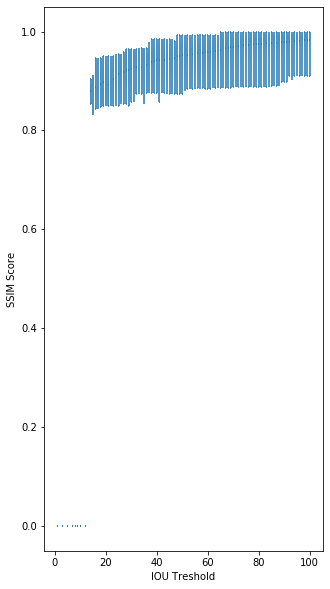

In [27]:
print(len(data))
print(len(points))
plt.violinplot(data,points ,showmeans=True)
plt.xlabel('IOU Treshold')
plt.ylabel('SSIM Score')
plt.savefig('99_95.png')
plt.show()

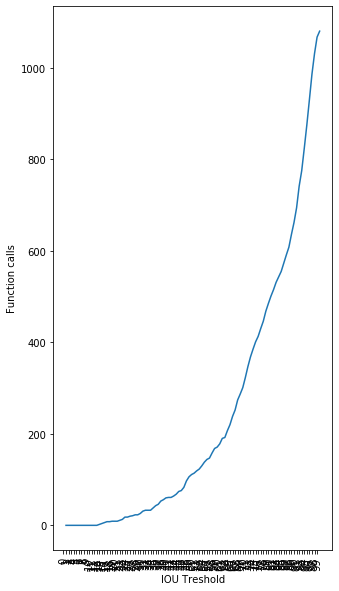

In [28]:
plt.xlabel('IOU Treshold')
plt.ylabel('Function calls')
x_axis=[i for i in range(100,0,-1)]
plt.plot(x_axis,number_of_detection_calls_list)
plt.xticks(np.arange(0, 100, step=1),rotation=90)

plt.savefig('IOUvsFunctionCalls.png')
plt.show()


In [161]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 20
fig_size[1] = 10
plt.rcParams["figure.figsize"] = fig_size


In [52]:
dp=[[-1 for i in range(0,1083)] for i in range(0,1083)]


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.866251322775, 0.8410185661, 0.8544381445, 0.8725594167249999, 0.8716807955, 0.8737579006, 0.8737579006, 0.8737579006, 0.87873250285, 0.8857500464, 0.89497248415, 0.8952567807749999, 0.9014331935750001, 0.9029342659999999, 0.90232957465, 0.90232957465, 0.903247656125, 0.91143684055, 0.9106060236, 0.9106060236, 0.9106060236, 0.914120228975, 0.9187643137000001, 0.91953049085, 0.9230639895999999, 0.9268905920999999, 0.925379293425, 0.9267332632999999, 0.9272553784, 0.927694252075, 0.9267438138, 0.925360384475, 0.92886009325, 0.9284303362499999, 0.9396269708, 0.939578555225, 0.9408008356, 0.942012953725, 0.9421339905499999, 0.9423080812, 0.9422241742999998, 0.94419522445, 0.944740430575, 0.9452336723999999, 0.94656783415, 0.9475820834249999, 0.94732977085, 0.9478707787249999, 0.949269323, 0.9494641768000001, 0.95050547975, 0.9506774564, 0.9536019284749999, 0.954781620975, 0.9556495735, 0.9559995218999999, 0.9564152411, 0.95

In [8]:
#  with open('ssim_dynamic_array.data', 'wb') as f:
#     pickle.dump(dp, f)
dp = pickle.load( open( "ssim_dynamic_array.data", "rb" ) )

In [402]:
print(medians_list)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.8791586035500001, 0.8743790378, 0.88899188315, 0.9026980388, 0.90337702295, 0.9032074876, 0.8936727388, 0.8837071051000001, 0.9029342659999999, 0.906621591, 0.9197155596500001, 0.9208232644500001, 0.92168730365, 0.9261893987, 0.9261893987, 0.9302963223999999, 0.9315595099, 0.9385301175, 0.9373444204000001, 0.9373444204000001, 0.9373648935, 0.9375131452500001, 0.9390757692, 0.94406500325, 0.9448317694, 0.9457560165, 0.94611838145, 0.9458443111, 0.9460134655, 0.9460979675500001, 0.9475838196499999, 0.9482604004499999, 0.9478985354499999, 0.9489922023999999, 0.9562040886, 0.9546221233, 0.9562230328, 0.9554256168499999, 0.9572004481, 0.9577260706999999, 0.9579385890500001, 0.9582175201500001, 0.9582175201500001, 0.9600037078, 0.96005758795, 0.96205743115, 0.9614359203, 0.96183914835, 0.96363520605, 0.9645492224, 0.9642007544, 0.9659182875000001, 0.96710580055, 0.9682730936499999, 0.9699334682, 0.9701944579, 0.9710620758, 0.9715805748, 0.97318713480

In [403]:
number_of_images=1083
ssim_number_of_detections_at_median_threshold=[]
    
for median in medians_list:
    print(median)

    fixed = 0
    number_of_detections=0
    detection_flag_list=[]

    for i in range(0,number_of_images):
        if dp[i][fixed]!=-1:
            score = dp[i][fixed]
            
        elif dp[fixed][i]!=-1:
            score =dp[i][fixed]
        
        else:
            score= image_subtraction('frames/{}.jpg'.format(fixed),'frames/{}.jpg'.format(i))
            dp[i][fixed]=score
            dp[fixed][i]=score
        
        if score<median:
            fixed = i
            number_of_detections=number_of_detections+1
            detection_flag_list.append(1)
        else:
            detection_flag_list.append(0)
        
    ssim_number_of_detections_at_median_threshold.append(number_of_detections)
    print(number_of_detections)
    print(sum(detection_flag_list))
    print('-----------------------')

0
0
0
-----------------------
0
0
0
-----------------------
0
0
0
-----------------------
0
0
0
-----------------------
0
0
0
-----------------------
0
0
0
-----------------------
0
0
0
-----------------------
0
0
0
-----------------------
0
0
0
-----------------------
0
0
0
-----------------------
0
0
0
-----------------------
0
0
0
-----------------------
0
0
0
-----------------------
0.8791586035500001
5
5
-----------------------
0.8743790378
3
3
-----------------------
0.88899188315
7
7
-----------------------
0.9026980388
11
11
-----------------------
0.90337702295
11
11
-----------------------
0.9032074876
11
11
-----------------------
0.8936727388
9
9
-----------------------
0.8837071051000001
5
5
-----------------------
0.9029342659999999
11
11
-----------------------
0.906621591
14
14
-----------------------
0.9197155596500001
23
23
-----------------------
0.9208232644500001
26
26
-----------------------
0.92168730365
28
28
-----------------------
0.9261893987
32
32
----------

In [183]:
print(ssim_number_of_detections_at_median_threshold)
print('------------')
print(number_of_detection_calls_list[::-1])
print('------------')

xaxis=[i for i in range(1,101)]
print(xaxis)


[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 9, 15, 36, 28, 28, 46, 28, 24, 19, 62, 105, 105, 117, 114, 114, 114, 120, 170, 125, 153, 153, 158, 157, 171, 208, 212, 219, 217, 217, 223, 235, 295, 246, 298, 328, 359, 384, 386, 405, 402, 379, 465, 457, 475, 524, 518, 518, 522, 533, 546, 566, 667, 705, 749, 768, 767, 799, 796, 797, 826, 834, 848, 862, 848, 871, 883, 893, 898, 898, 898, 898, 898, 898, 898, 898, 909, 911, 916, 921, 936, 941, 959, 971, 979, 993, 1010, 1013]
------------
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 4, 6, 8, 8, 9, 9, 9, 11, 13, 18, 18, 20, 21, 23, 23, 26, 31, 33, 33, 33, 38, 43, 46, 53, 56, 60, 61, 61, 64, 68, 74, 76, 83, 97, 106, 111, 114, 119, 123, 130, 138, 144, 147, 158, 168, 171, 178, 190, 192, 207, 220, 238, 252, 274, 287, 301, 323, 347, 368, 385, 401, 413, 430, 446, 468, 485, 501, 515, 531, 543, 555, 573, 591, 608, 636, 662, 694, 741, 775, 824, 875, 930, 986, 1031, 1067, 1080]
------------
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 2

In [182]:
# Get current size
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 20
fig_size[1] = 16
plt.rcParams["figure.figsize"] = fig_size


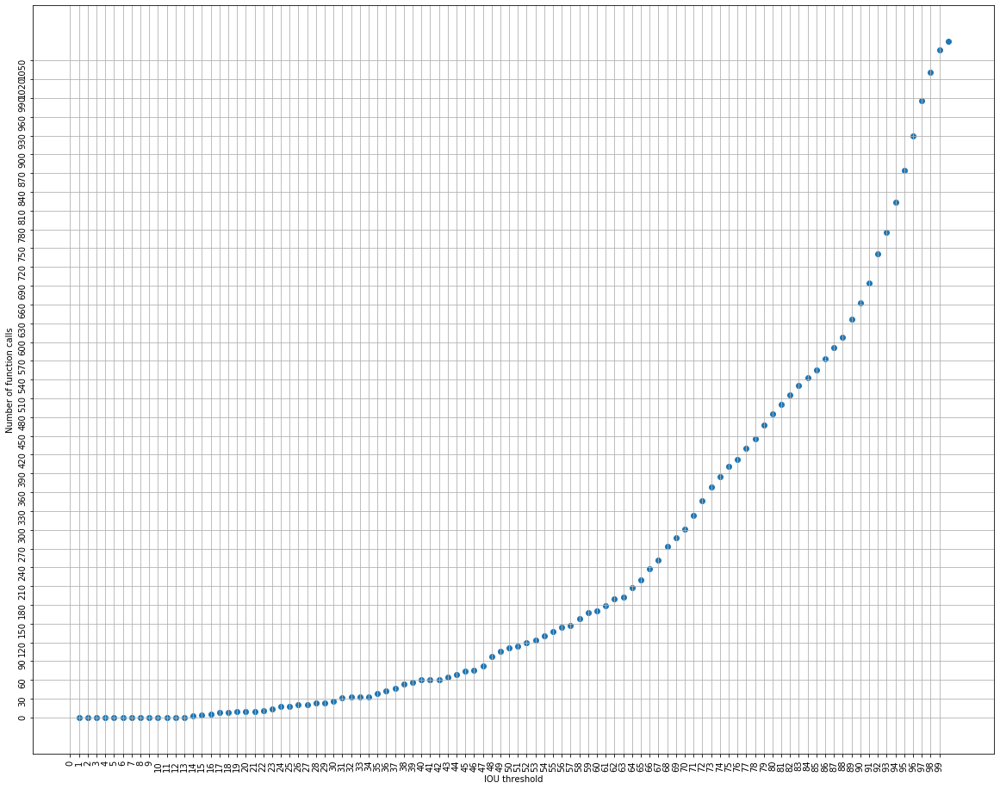

In [183]:
plt.xticks(np.arange(0, 100, step=1),rotation=90)
plt.yticks(np.arange(0, 1080, step=30),rotation=90)
xaxis=[i for i in range(1,101)]



plt.xlabel('IOU threshold')
plt.ylabel('Number of function calls')

plt.scatter(xaxis,number_of_detection_calls_list[::-1])
plt.grid()
plt.savefig('GT.png')

In [177]:
image_1 = yolo_data[100]
i = image_1[2]


print(*detections_1,sep='\n')

image_2 = yolo_data[100]
j = image_2[2]
print('----------')
print(*detections_2,sep='\n')

NameError: name 'detections_1' is not defined

In [306]:
bboxes_1st_image=[]
bboxes_2nd_image=[]
#converting (x,y,w,h) to (x,y,x+w,y+h)
for i in detections_1:
    bbox_detection = [i[0],i[1],i[0]+i[2],i[1]+i[3]]
    bboxes_1st_image.append(bbox_detection)

for j in detections_2:
    bbox_detection = [j[0],j[1],j[0]+j[2],j[1]+j[3]]
    bboxes_2nd_image.append(bbox_detection)

In [307]:
bboxes_1st_image

[[108, 217, 151, 351],
 [397, 290, 471, 519],
 [233, 295, 309, 389],
 [393, 335, 404, 344],
 [173, 240, 232, 320]]

In [308]:
bboxes_2nd_image

[[108, 217, 151, 351],
 [397, 290, 471, 519],
 [233, 295, 309, 389],
 [393, 335, 404, 344],
 [173, 240, 232, 320]]

In [208]:
image_subtraction('frames/0.jpg','frames/100.jpg')

In [53]:
ssim_iou_mean_detections=[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 3, 7, 9, 9, 9, 9, 8, 9, 11, 19, 19, 22, 23, 28, 28, 31, 36, 36, 36, 36, 43, 45, 51, 62, 65, 69, 69, 69, 70, 72, 76, 72, 82, 105, 108, 114, 114, 117, 118, 123, 131, 134, 138, 148, 160, 158, 166, 172, 174, 185, 202, 210, 233, 249, 253, 263, 271, 292, 304, 318, 327, 331, 346, 359, 373, 375, 383, 388, 395, 402, 411, 419, 427, 432, 445, 454, 468, 478, 486, 504, 523, 540, 562, 583, 600, 603]
ssim_iou_80_percentile=[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 9, 14, 19, 15, 15, 23, 19, 14, 14, 46, 77, 77, 71, 68, 99, 99, 109, 121, 109, 98, 98, 117, 123, 138, 160, 166, 179, 171, 166, 173, 185, 193, 185, 195, 260, 277, 304, 297, 292, 287, 266, 290, 304, 327, 359, 373, 373, 379, 375, 384, 430, 453, 480, 580, 627, 596, 595, 614, 624, 640, 668, 688, 708, 708, 737, 742, 743, 750, 768, 765, 768, 770, 770, 770, 774, 780, 787, 797, 816, 819, 836, 848, 874, 884, 910, 928, 936]
ssim_iou_75_percentile=[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 14, 15, 15, 13, 19, 19, 10, 14, 36, 62, 62, 63, 62, 71, 71, 84, 109, 82, 82, 82, 104, 104, 126, 137, 138, 150, 166, 143, 160, 166, 173, 166, 185, 228, 235, 249, 235, 249, 249, 231, 263, 266, 274, 295, 328, 324, 345, 330, 337, 373, 419, 432, 458, 504, 492, 507, 528, 552, 589, 607, 631, 648, 648, 657, 668, 670, 675, 699, 703, 710, 714, 717, 715, 730, 741, 741, 746, 752, 755, 776, 797, 819, 844, 869, 884, 890]
ssim_iou_60_percentile=[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 8, 10, 11, 10, 10, 11, 9, 10, 15, 36, 36, 36, 46, 50, 46, 59, 71, 68, 68, 68, 71, 72, 80, 99, 112, 117, 116, 114, 123, 126, 123, 108, 128, 166, 163, 183, 179, 183, 179, 179, 200, 191, 201, 206, 220, 219, 234, 241, 247, 260, 292, 321, 326, 349, 359, 373, 375, 403, 441, 450, 478, 477, 485, 495, 511, 511, 520, 536, 540, 548, 552, 548, 558, 578, 583, 588, 607, 629, 632, 658, 678, 696, 722, 742, 756, 764]
ssim_iou_55_percentile=[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 5, 9, 10, 10, 11, 9, 8, 11, 14, 32, 32, 33, 41, 45, 44, 46, 67, 62, 62, 61, 63, 68, 78, 81, 99, 105, 106, 99, 100, 100, 103, 99, 111, 152, 143, 155, 151, 169, 169, 169, 178, 173, 185, 195, 200, 197, 208, 220, 228, 234, 266, 271, 293, 321, 321, 326, 349, 374, 383, 417, 424, 423, 430, 442, 468, 473, 482, 491, 492, 504, 503, 502, 507, 521, 533, 537, 558, 573, 584, 623, 639, 662, 687, 703, 719, 725]
ssim_iou_25_percentile=[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 3, 3, 3, 3, 3, 3, 4, 5, 9, 9, 10, 11, 11, 11, 11, 17, 15, 15, 15, 19, 23, 23, 29, 32, 32, 32, 33, 36, 32, 32, 36, 36, 62, 62, 65, 69, 69, 70, 69, 72, 77, 80, 83, 86, 86, 91, 103, 103, 105, 106, 121, 128, 133, 138, 139, 163, 172, 180, 191, 196, 201, 210, 222, 229, 244, 250, 260, 263, 267, 269, 269, 274, 287, 300, 301, 312, 324, 339, 367, 378, 394, 417, 427, 432, 434]

In [337]:
df_core=df = pd.DataFrame()
iou_s = [i for i in range(1,101,1)]
df_core['iou_thresh'] = iou_s
df_core['iou_based_detections']=number_of_detection_calls_list[::-1]
df_core['mean_ssim']=means_list
df_core['ssim_thresh_based_detections']=ssim_iou_mean_detections
df_core.to_csv('core_results.csv')

-1


In [25]:
def divide_chunks(l, n): 
    for i in range(0, len(l), n):  
        yield l[i:i + n]
    
def compare_vectors_using_sliding_window(detection_vector_iou,detection_vector_ssim):

    
    
    #print(len(detection_vector_iou))
    #print(len(detection_vector_ssim))
    
    matches=0
    bottom_left=0
    top_right = 0
    bottom_right=0
    result_vector_iou=[]
    result_vector_ssim=[]
    
    for i in range(0,len(detection_vector_iou)):
        if sum(detection_vector_iou[i])>0:
            result_vector_iou.append(1)
        else:                
            result_vector_iou.append(0)
            
        if sum(detection_vector_ssim[i])>0:
            result_vector_ssim.append(1)
        else:
            result_vector_ssim.append(0)
        
        if sum(detection_vector_iou[i])>0 and sum(detection_vector_ssim[i])>0:
            matches=matches+1
        elif sum(detection_vector_iou[i])==0 and sum(detection_vector_ssim[i])>0:
            bottom_left=bottom_left+1
            
        if sum(detection_vector_iou[i])>0 and sum(detection_vector_ssim[i])==0:
            top_right = top_right +1
        
        if sum(detection_vector_iou[i])==0 and sum(detection_vector_ssim[i])==0:
            bottom_right = bottom_right+1
            
#    print(len(result_vector_iou),len(result_vector_ssim))
    #print(matches)
    
    return result_vector_iou,result_vector_ssim,matches, bottom_left,top_right,bottom_right
    

In [67]:
print(percentile_80[94])

NameError: name 'percentile_80' is not defined

In [68]:
fixed = 0
list_=[]
number_of_images=1083
number_of_detections=0

for i in range(0,number_of_images):
    print(fixed,i)
    if dp[fixed][i]!=-1:
        score = dp[fixed][i]
    elif dp[i][fixed]!=-1:
        score = dp[i][fixed]
    else:
        print( image_subtraction('frames/{}.jpg'.format(fixed),'frames/{}.jpg'.format(i)))
        score = image_subtraction('frames/{}.jpg'.format(fixed),'frames/{}.jpg'.format(i))
        dp[fixed][i]=score
        dp[i][fixed]=score

    if score<0.9907623754400001:
        number_of_detections=number_of_detections+1
        list_.append(1)
        fixed = i
    else:
        print(i,fixed)
        list_.append(0)
print('Done')        
print(number_of_detections)

0 0
0 0
0 1
1 0
0 2
2 0
0 3
3 0
0 4
4 0
0 5
5 6
6 5
5 7
7 5
5 8
8 5
5 9
9 5
5 10
10 11
11 10
10 12
12 10
10 13
13 14
14 13
13 15
15 13
13 16
16 13
13 17
17 18
18 17
17 19
19 17
17 20
20 21
21 20
20 22
22 23
23 22
22 24
24 25
25 24
24 26
26 27
27 26
26 28
28 29
29 30
30 31
31 32
32 31
31 33
33 34
34 35
35 36
36 37
37 38
38 39
39 40
40 41
41 42
42 43
43 44
44 45
45 46
46 47
47 48
48 49
49 48
48 50
50 51
51 52
52 53
53 54
54 55
55 56
56 57
57 58
58 59
59 60
60 61
61 62
62 63
63 64
64 65
65 66
66 67
67 66
66 68
68 69
69 70
70 69
69 71
71 72
72 73
73 72
72 74
74 75
75 74
74 76
76 74
74 77
77 78
78 77
77 79
79 77
77 80
80 77
77 81
81 82
82 81
81 83
83 81
81 84
84 81
81 85
85 86
86 85
85 87
87 88
88 87
87 89
89 90
90 89
89 91
91 92
92 91
91 93
93 94
94 93
93 95
95 96
96 97
97 96
96 98
98 99
99 100
100 101
101 102
102 103
103 104
104 105
105 106
106 107
107 108
108 109
109 110
110 111
111 112
112 113
113 114
114 115
115 116
116 117
117 118
118 119
119 120
120 121
121 122
122 123
123 124
124 12

In [69]:
print(sum(list_))
print(number_of_detections)


848
848


In [70]:
iou_partioned=list(divide_chunks(list(df_data['94']),12))
ssim_partioned=list(divide_chunks(list_,12))
result_vector_iou,result_vector_ssim=compare_vectors_using_sliding_window(iou_partioned,ssim_partioned)
print(result_vector_ssim)

90
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


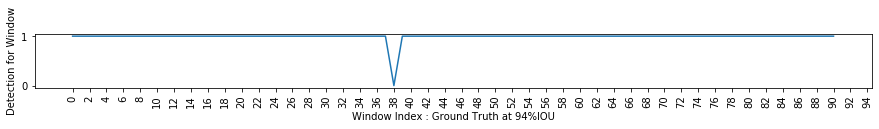

In [71]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 15
fig_size[1] = 1
plt.rcParams["figure.figsize"] = fig_size

plt.xticks(np.arange(0, 100, step=2),rotation=90)

plt.xlabel('Window Index : Ground Truth at 94%IOU')
plt.ylabel('Detection for Window')

plt.plot(result_vector_iou)
plt.savefig('Window.jpg')


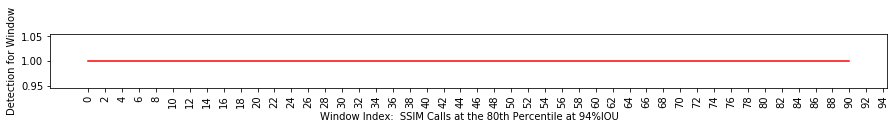

In [72]:
plt.xticks(np.arange(0, 100, step=2),rotation=90)
plt.xlabel('Window Index:  SSIM Calls at the 80th Percentile at 94%IOU')
plt.ylabel('Detection for Window')
plt.plot(result_vector_ssim,color='r')
plt.savefig('Window_calls.jpg')


In [73]:
matches=0
list_check=[]
for i in range(0,len(result_vector_iou)):
    if result_vector_iou[i]==1 and result_vector_ssim[i]==1:
        list_check.append(1)
        matches=matches+1
    else:
        list_check.append(0)


In [74]:
print(matches)

90


In [27]:
def get_results(iou_threshold,percentiles_list):
    ssim_values_list_for_iou_threshold=[]
    
    temp_df = df_data[['{}'.format(iou_threshold),'{}_ssmi_score'.format(iou_threshold)]].copy()
    
    for index,row in temp_df.iterrows():
        if int(row['{}'.format(iou_threshold)])==1:
            ssim_values_list_for_iou_threshold.append(row['{}_ssmi_score'.format(iou_threshold)])
                
    #print(len(flow_count_list_for_iou_threshold))
    
    matches_per_percentile=[]
    ssim_value_per_percentile=[]
    number_of_detections_per_percentile=[]
    
    for percentile in percentiles_list:
        
        ssim_value_at_percentile = np.percentile(ssim_values_list_for_iou_threshold,percentile) 
        ssim_value_per_percentile.append(ssim_value_at_percentile)
        
        reference_image = 0
        detection_flag_list_ssmi_score=[]
        number_of_images=1083
        number_of_detections=0
        #print('Flow Count Threshold', flow_count_at_percentile)
        for i in range(0,1083):
            
            if dp[reference_image][i]!=-1:
                ssmi_score = dp[reference_image][i]

            else:
                ssmi_score= image_subtraction('frames/{}.jpg'.format(reference_image),'frames/{}.jpg'.format(i))
                dp[reference_image][i]=ssmi_score
            if ssmi_score<ssim_value_at_percentile:
                reference_image = i
                number_of_detections=number_of_detections+1
                detection_flag_list_ssmi_score.append(1)
            else:
                detection_flag_list_ssmi_score.append(0)
        #print('Dealing with Percentile: ', percentile)
        #print('Number of Detections: ', number_of_detections)
        
        number_of_detections_per_percentile.append(number_of_detections)
        
        iou_partioned=list(divide_chunks(list(df_data['{}'.format(iou_threshold)]),12))
        
        ssmi_score_partioned=list(divide_chunks(detection_flag_list_ssmi_score,12))
        result_vector_iou,result_vector_ssmi_score,matches,bottom_left,top_right,bottom_right=compare_vectors_using_sliding_window(iou_partioned,ssmi_score_partioned)
        #print('Window Matches', matches)
        #matches=(matches/91)*100
        #print('Percentage Window Matches',matches)
        print(matches)
        print('bottom_left',bottom_left)
        print('top_right',top_right)
        print('bottome_right',bottom_right)
        
        matches_per_percentile.append(matches)
        #print('-------------------')
        
    return matches_per_percentile,number_of_detections_per_percentile,ssim_value_per_percentile
    #print('----------------')
    #print('##########')
            
        
        
    
    
    

In [38]:

iou_threshold=[82]
percentiles_list=[50]
print('    ',percentiles_list)
rows=[]
for i in iou_threshold:
    temp_row=[]
    temp_row.append(i)
    matches,number_of_detections_per_percentile,ssim_values_per_percentile=get_results(i,percentiles_list)
    temp_row.append(matches)
    rows.append(temp_row)


     [50]
83
bottom_left 1
top_right 6
bottome_right 1


In [61]:
print(detections_calls)

0


In [63]:
start = time.time()
reference_path = 'frames/0.jpg'
detections_calls=0
for i in range(0,1083):
    incoming_path = 'frames/{}.jpg'.format(i)
    ssmi = image_subtraction(reference_path, incoming_path)
    if ssmi<0.9906546934:
        reference_path = incoming_path
        image = cv2.imread(incoming_path)
        predict_object_image(image,net_default,LABELS_default,options_v3_default)
        detections_calls=detections_calls +1 
print(time.time()-start)

521.9026970863342


In [64]:
detections_calls

844

In [48]:
def predict_object_image(image,net,Labels,options):


    (H, W) = image.shape[:2]

    ln = net.getLayerNames()
    ln = [ln[i[0] - 1] for i in net.getUnconnectedOutLayers()]

    blob = cv2.dnn.blobFromImage(
        image, 1 / 255.0, (416, 416),
        swapRB=True, crop=False)
    net.setInput(blob)
    
    layerOutputs = net.forward(ln)
    

    # show timing information on YOLO
    

    boxes = []
    confidences = []
    classIDs = []
    for output in layerOutputs:
        for detection in output:
            scores = detection[5:]
            classID = np.argmax(scores)
            confidence = scores[classID]
            if confidence > options['confidence']:
                box = detection[0:4] * np.array([W, H, W, H])
                (centerX, centerY, width, height) = box.astype("int")
                x = int(centerX - (width / 2))
                y = int(centerY - (height / 2))
                boxes.append([x, y, int(width), int(height)])
                confidences.append(float(confidence))
                classIDs.append(classID)

    idxs = cv2.dnn.NMSBoxes(boxes, confidences, options['confidence'], options['threshold'])
    detections=[]
    if len(idxs) > 0:
        for i in idxs.flatten():
            temp_list=[]
            # extract the bounding box coordinates
            (x, y) = (boxes[i][0], boxes[i][1])
            (w, h) = (boxes[i][2], boxes[i][3])           

            temp_list.append(x)
            temp_list.append(y)
            temp_list.append(w)
            temp_list.append(h)
            temp_list.append(Labels[classIDs[i]])
            temp_list.append(confidences[i])
            temp_list.append(classIDs[i])
            
            
            
            detections.append(temp_list)
    
    return detections

In [50]:
options_v3_default=constants.options_default
net_default=cv2.dnn.readNetFromDarknet(options_v3_default['model'], options_v3_default['load'])
LABELS_default = open(options_v3_default['labelsPath']).read().strip().split("\n")
color = (255, 0, 0)